In [35]:
beta = np.diff(infectRaw+recovRaw+deadRaw)/infectRaw[:-1] #scaling won't matter here, cancels out

In [37]:
cons = [len(infectRaw)]

def simulate(theta, cons):
    
    return theta
    
def randStart():
    theta = np.ones(6)

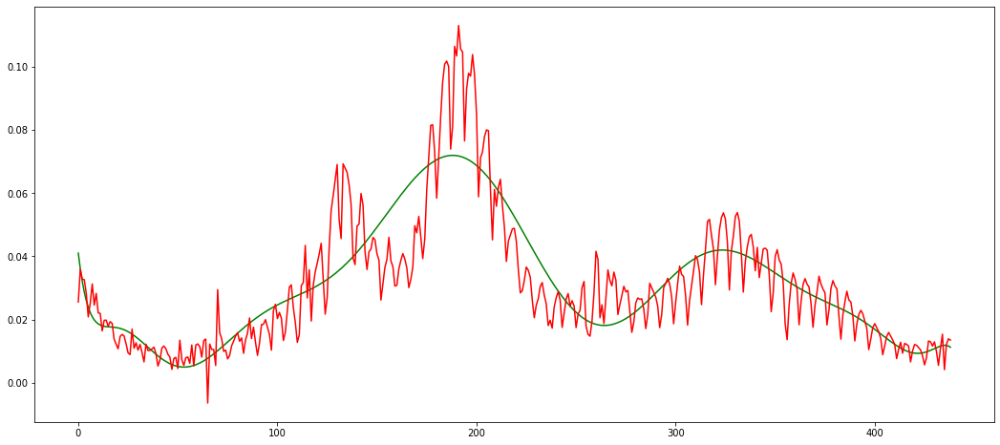

In [53]:
# from scipy.interpolate import lagrange
from numpy.polynomial import legendre
polyCount = 13 #degree of polynomial

timeSeries = np.arange(len(beta))
coef = legendre.legfit(timeSeries, beta, polyCount)

fitSeries = legendre.legval(timeSeries, coef)

fig, ax = plt.subplots(figsize=(18,8))
ax.plot(timeSeries, fitSeries, color="green")
ax.plot(timeSeries, beta, color="red")

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random

import Models.OWID as owid
import Models.SIRD as sird
import Models.GradientDescent as gd


def startFunc(consts):
    
    recovRate = consts[0]
    deathRate = consts[1]
    
    params = np.zeros(7)
        
    params[0] = random.random()*.001 #I(0), between 0 and .1 percent of the population
    params[1] = random.random()*.1 #A(0), between 0 and 10 percent of the population
    
    params[2] = .1 + random.random()*10 #alpha0 knowledge rate [.001, 10.1]
    params[3] = .001 + random.random()*.05 #alpha1 knowledge decay rate [.001, .051]

    params[4] = (recovRate+deathRate) * random.random() #beta0, floor infection rate
    #theta[4] = 0
    params[5] = (recovRate+deathRate - params[4]) * (.5*random.random() + 1.1) #beta1, ceiling infectRate
    params[6] = .5 + random.random()*5 #beta2, exponential [.5, 5.5]
    
    return params
    
def simFunc(params, consts):
    
    recovRate = consts[0]
    deathRate = consts[1]
    dayNum = consts[2]
    
    I = np.zeros((dayNum))
    K = np.zeros((dayNum))

    I[0] = params[0] # I(0)
    K[0] = params[1]
    alpha0 = params[2]
    alpha1 = params[3]
    beta = params[4:] #beta0, beta1, beta2
    

    #iterate the arrays using the definition K' and I'
    for t in range(len(I)-1): #define I and K on range [1, length)
        diffI = (beta[0] + (beta[1] / (1 + (K[t])**beta[2] )) )*I[t] - (recovRate + deathRate)*I[t]
        diffK = alpha0*I[t] - alpha1*K[t]

        I[t+1] = diffI + I[t]
        K[t+1] = diffK + K[t]

    return I #I is the data generated

def constrainFunc(parameters, consts):
    
    params = np.copy(parameters)
    
    recovRate = consts[0]
    deathRate = consts[1]
    
    #fill the constraints
    paramConstraints = np.zeros((len(params),2)) #min, max for each one
    
    paramConstraints[0] = [.0000000001, .005] #I(t)
    paramConstraints[1] = [ 0.000000001, 10e10] #K(t), no real ceiling

    paramConstraints[2] = [0.00001, 10e10] #alpha0
    paramConstraints[3] = [0.00001, 1] #alpha1

    paramConstraints[4] = [0.0000001, recovRate + deathRate] #beta0 < recoveries
    paramConstraints[5] = [recovRate + deathRate - params[4], 5] #beta1, beta1+beta2 ceiling
    paramConstraints[6] = [.25, 10] #beta2
    
    for i in range(len(params)): #exercise each constraint
        params[i] = min( max(paramConstraints[i,0], params[i]) , paramConstraints[i,1])
    
    return params
    

## US Fit

In [3]:
dates, I, R, D, V = owid.LoadCountryNormal("United States") 

gradDesc = gd.GradDescent(I, [sird.getGamma(I,R), sird.getNu(I,D), len(I)], startFunc, simFunc, constrainFunc)
gradDesc.solveVars(printOut=1)

Startin Vars:
Error: 0.012468636842115504
[2.69326252e-04 3.57512868e-02 5.43751564e+00 4.68423519e-02
 2.35974750e-02 6.93128717e-02 5.39650927e+00]
Iteration: 1 Error: 0.012377160099239727 , improvement: 0.007336547213147968
Iteration: 2 Error: 0.012218175004735125 , improvement: 0.012845038217964731
Iteration: 3 Error: 0.012019848475609933 , improvement: 0.016232091048649328
Iteration: 4 Error: 0.011805503521590854 , improvement: 0.01783258370136836
Iteration: 5 Error: 0.011588947650355393 , improvement: 0.01834363700281025
Iteration: 6 Error: 0.01137461613482893 , improvement: 0.018494476115774896
Iteration: 7 Error: 0.01116064799527178 , improvement: 0.018811020699149836
Iteration: 8 Error: 0.01094267946411953 , improvement: 0.019530096392663957
Iteration: 9 Error: 0.010716894317897711 , improvement: 0.020633442381471207
Iteration: 10 Error: 0.01048168928580868 , improvement: 0.02194712620205914
Iteration: 11 Error: 0.01023799287748877 , improvement: 0.02324972642051633
Iteration:

Iteration: 280 Error: 0.006982327963810973 , improvement: 6.003682238259422e-05
Iteration: 281 Error: 0.006981908734039745 , improvement: 6.0041546802255306e-05
Iteration: 282 Error: 0.006981489496819565 , improvement: 6.0046218899416437e-05
Iteration: 283 Error: 0.006981070252498407 , improvement: 6.005084177934776e-05
Iteration: 284 Error: 0.006980651001403134 , improvement: 6.005541845444649e-05
Iteration: 285 Error: 0.006980231743840396 , improvement: 6.005995180866734e-05
Iteration: 286 Error: 0.006979812480097384 , improvement: 6.0064444619967315e-05
Iteration: 287 Error: 0.006979393210442647 , improvement: 6.006889954883498e-05
Iteration: 288 Error: 0.006978973935126883 , improvement: 6.007331914421336e-05
Iteration: 289 Error: 0.006978554654383775 , improvement: 6.007770583550575e-05
Iteration: 290 Error: 0.006978135368430821 , improvement: 6.00820619338998e-05
Iteration: 291 Error: 0.00697771607747009 , improvement: 6.008638964326311e-05
Iteration: 292 Error: 0.006977296781689

Iteration: 385 Error: 0.006938289331596851 , improvement: 6.046168200958362e-05
Iteration: 386 Error: 0.006937869804725656 , improvement: 6.046546218307132e-05
Iteration: 387 Error: 0.006937450277032772 , improvement: 6.046923691162246e-05
Iteration: 388 Error: 0.0069370307485592 , improvement: 6.0473006193768204e-05
Iteration: 389 Error: 0.0069366112193459326 , improvement: 6.047677002941465e-05
Iteration: 390 Error: 0.006936191689433979 , improvement: 6.048052841471661e-05
Iteration: 391 Error: 0.006935772158864296 , improvement: 6.048428135608172e-05
Iteration: 392 Error: 0.0069353526276778685 , improvement: 6.048802884778909e-05
Iteration: 393 Error: 0.006934933095915625 , improvement: 6.049177089699765e-05
Iteration: 394 Error: 0.006934513563618507 , improvement: 6.049550750036251e-05
Iteration: 395 Error: 0.006934094030827376 , improvement: 6.04992386677961e-05
Iteration: 396 Error: 0.006933674497583142 , improvement: 6.0502964391451575e-05
Iteration: 397 Error: 0.006933254963926

Iteration: 489 Error: 0.006894661458365698 , improvement: 6.082621507111023e-05
Iteration: 490 Error: 0.006894242059937005 , improvement: 6.08294448139585e-05
Iteration: 491 Error: 0.006893822664789188 , improvement: 6.083266937407819e-05
Iteration: 492 Error: 0.006893403272960442 , improvement: 6.083588875710133e-05
Iteration: 493 Error: 0.0068929838844889665 , improvement: 6.083910296098633e-05
Iteration: 494 Error: 0.006892564499412924 , improvement: 6.08423119901085e-05
Iteration: 495 Error: 0.006892145117770446 , improvement: 6.0845515847334396e-05
Iteration: 496 Error: 0.006891725739599681 , improvement: 6.084871452911323e-05
Iteration: 497 Error: 0.006891306364938722 , improvement: 6.0851908042339173e-05
Iteration: 498 Error: 0.006890886993825663 , improvement: 6.085509638534981e-05
Iteration: 499 Error: 0.006890467626298564 , improvement: 6.085827956176883e-05
Iteration: 500 Error: 0.006890048262395481 , improvement: 6.086145757106705e-05
Iteration: 501 Error: 0.006889628902154

Iteration: 592 Error: 0.006851487321498119 , improvement: 6.113196445362942e-05
Iteration: 593 Error: 0.0068510684580844585 , improvement: 6.113466959882207e-05
Iteration: 594 Error: 0.006850649601779009 , improvement: 6.113736974198849e-05
Iteration: 595 Error: 0.006850230752617835 , improvement: 6.114006488745144e-05
Iteration: 596 Error: 0.006849811910636981 , improvement: 6.114275503700273e-05
Iteration: 597 Error: 0.006849393075872487 , improvement: 6.114544018990221e-05
Iteration: 598 Error: 0.0068489742483603365 , improvement: 6.114812035326086e-05
Iteration: 599 Error: 0.006848555428136547 , improvement: 6.115079552089456e-05
Iteration: 600 Error: 0.006848136615237051 , improvement: 6.11534657039682e-05
Iteration: 601 Error: 0.006847717809697813 , improvement: 6.115613089642493e-05
Iteration: 602 Error: 0.0068472990115547375 , improvement: 6.115879110588576e-05
Iteration: 603 Error: 0.006846880220843736 , improvement: 6.116144633009369e-05
Iteration: 604 Error: 0.00684646143760

Iteration: 699 Error: 0.006806716295779396 , improvement: 6.139343488976084e-05
Iteration: 700 Error: 0.0068062983932404685 , improvement: 6.139561585464544e-05
Iteration: 701 Error: 0.006805880501547243 , improvement: 6.139779202750009e-05
Iteration: 702 Error: 0.0068054626207334525 , improvement: 6.139996341337165e-05
Iteration: 703 Error: 0.006805044750832851 , improvement: 6.140213000774984e-05
Iteration: 704 Error: 0.006804626891879127 , improvement: 6.140429181937877e-05
Iteration: 705 Error: 0.006804209043905994 , improvement: 6.140644884323889e-05
Iteration: 706 Error: 0.006803791206947095 , improvement: 6.140860108833142e-05
Iteration: 707 Error: 0.006803373381036073 , improvement: 6.141074855371677e-05
Iteration: 708 Error: 0.006802955566206568 , improvement: 6.141289123858264e-05
Iteration: 709 Error: 0.006802537762492158 , improvement: 6.14150291507864e-05
Iteration: 710 Error: 0.006802119969926441 , improvement: 6.141716228620242e-05
Iteration: 711 Error: 0.006801702188542

Iteration: 803 Error: 0.00676331856589645 , improvement: 6.15949684592059e-05
Iteration: 804 Error: 0.006762901968046774 , improvement: 6.159666229196394e-05
Iteration: 805 Error: 0.006762485384433813 , improvement: 6.159835155511448e-05
Iteration: 806 Error: 0.006762068815089042 , improvement: 6.160003624264203e-05
Iteration: 807 Error: 0.0067616522600438085 , improvement: 6.160171637174602e-05
Iteration: 808 Error: 0.006761235719329518 , improvement: 6.160339193307799e-05
Iteration: 809 Error: 0.006760819192977521 , improvement: 6.160506293345056e-05
Iteration: 810 Error: 0.006760402681019143 , improvement: 6.160672937531657e-05
Iteration: 811 Error: 0.006759986183485723 , improvement: 6.160839125599776e-05
Iteration: 812 Error: 0.006759569700408522 , improvement: 6.16100485853893e-05
Iteration: 813 Error: 0.006759153231818809 , improvement: 6.161170136132781e-05
Iteration: 814 Error: 0.006758736777747827 , improvement: 6.16133495867823e-05
Iteration: 815 Error: 0.006758320338226819 

Iteration: 907 Error: 0.006720074259023517 , improvement: 6.174705769324222e-05
Iteration: 908 Error: 0.006719659305940438 , improvement: 6.174828834995113e-05
Iteration: 909 Error: 0.006719244370239524 , improvement: 6.17495146736528e-05
Iteration: 910 Error: 0.006718829451949792 , improvement: 6.175073667062574e-05
Iteration: 911 Error: 0.006718414551100267 , improvement: 6.175195433850125e-05
Iteration: 912 Error: 0.006717999667719906 , improvement: 6.175316768640003e-05
Iteration: 913 Error: 0.006717584801837691 , improvement: 6.17543767095019e-05
Iteration: 914 Error: 0.006717169953482561 , improvement: 6.175558141318553e-05
Iteration: 915 Error: 0.006716755122683413 , improvement: 6.175678180257322e-05
Iteration: 916 Error: 0.006716340309469163 , improvement: 6.175797787374952e-05
Iteration: 917 Error: 0.0067159255138686536 , improvement: 6.175916963661608e-05
Iteration: 918 Error: 0.006715510735910757 , improvement: 6.176035708557975e-05
Iteration: 919 Error: 0.00671509597562426

Iteration: 1013 Error: 0.006676191448339264 , improvement: 6.185387251275145e-05
Iteration: 1014 Error: 0.0066757784948027745 , improvement: 6.185465765695755e-05
Iteration: 1015 Error: 0.006675365561595094 , improvement: 6.185543873300481e-05
Iteration: 1016 Error: 0.006674952648742784 , improvement: 6.185621573832586e-05
Iteration: 1017 Error: 0.006674539756272317 , improvement: 6.185698868516612e-05
Iteration: 1018 Error: 0.006674126884210222 , improvement: 6.185775756394325e-05
Iteration: 1019 Error: 0.00667371403258293 , improvement: 6.185852238872447e-05
Iteration: 1020 Error: 0.006673301201416889 , improvement: 6.185928315564617e-05
Iteration: 1021 Error: 0.006672888390738514 , improvement: 6.186003986864206e-05
Iteration: 1022 Error: 0.006672475600574199 , improvement: 6.186079252995747e-05
Iteration: 1023 Error: 0.006672062830950299 , improvement: 6.186154114430837e-05
Iteration: 1024 Error: 0.006671650081893189 , improvement: 6.186228570809237e-05
Iteration: 1025 Error: 0.006

Iteration: 1120 Error: 0.006632125847852128 , improvement: 6.191532265068387e-05
Iteration: 1121 Error: 0.006631715215222538 , improvement: 6.191568721852489e-05
Iteration: 1122 Error: 0.0066313046056249575 , improvement: 6.191604799892419e-05
Iteration: 1123 Error: 0.006630894019083339 , improvement: 6.191640499670552e-05
Iteration: 1124 Error: 0.006630483455621622 , improvement: 6.19167582131625e-05
Iteration: 1125 Error: 0.006630072915263727 , improvement: 6.191710765037413e-05
Iteration: 1126 Error: 0.00662966239803353 , improvement: 6.191745331355997e-05
Iteration: 1127 Error: 0.0066292519039549015 , improvement: 6.191779520336225e-05
Iteration: 1128 Error: 0.006628841433051679 , improvement: 6.191813332330196e-05
Iteration: 1129 Error: 0.006628430985347686 , improvement: 6.191846767467691e-05
Iteration: 1130 Error: 0.006628020560866701 , improvement: 6.191879826336542e-05
Iteration: 1131 Error: 0.006627610159632498 , improvement: 6.191912508935885e-05
Iteration: 1132 Error: 0.006

Iteration: 1222 Error: 0.0065903639681341225 , improvement: 6.193347983384147e-05
Iteration: 1223 Error: 0.006589955804008474 , improvement: 6.19334725095435e-05
Iteration: 1224 Error: 0.0065895476652331544 , improvement: 6.193346168899264e-05
Iteration: 1225 Error: 0.006589139551829672 , improvement: 6.193344736475626e-05
Iteration: 1226 Error: 0.006588731463819439 , improvement: 6.19334295507244e-05
Iteration: 1227 Error: 0.006588323401223876 , improvement: 6.193340824459943e-05
Iteration: 1228 Error: 0.006587915364064364 , improvement: 6.193338345171894e-05
Iteration: 1229 Error: 0.006587507352362306 , improvement: 6.193335516781114e-05
Iteration: 1230 Error: 0.006587099366138992 , improvement: 6.193332340914323e-05
Iteration: 1231 Error: 0.00658669140541577 , improvement: 6.193328816617912e-05
Iteration: 1232 Error: 0.006586283470213951 , improvement: 6.193324944347003e-05
Iteration: 1233 Error: 0.00658587556055477 , improvement: 6.193320725202173e-05
Iteration: 1234 Error: 0.00658

Iteration: 1325 Error: 0.006548459915493645 , improvement: 6.19148576392458e-05
Iteration: 1326 Error: 0.006548054470837741 , improvement: 6.19145052631626e-05
Iteration: 1327 Error: 0.00654764905361304 , improvement: 6.191414969235856e-05
Iteration: 1328 Error: 0.006547243663838435 , improvement: 6.19137909325566e-05
Iteration: 1329 Error: 0.006546838301532813 , improvement: 6.191342898405001e-05
Iteration: 1330 Error: 0.006546432966715063 , improvement: 6.191306384567491e-05
Iteration: 1331 Error: 0.006546027659403975 , improvement: 6.191269553176898e-05
Iteration: 1332 Error: 0.0065456223796183785 , improvement: 6.191232403587165e-05
Iteration: 1333 Error: 0.0065452171273770576 , improvement: 6.191194936371145e-05
Iteration: 1334 Error: 0.006544811902698765 , improvement: 6.191157151956107e-05
Iteration: 1335 Error: 0.0065444067056022286 , improvement: 6.191119050636944e-05
Iteration: 1336 Error: 0.006544001536106187 , improvement: 6.191080632178508e-05
Iteration: 1337 Error: 0.0065

Iteration: 1427 Error: 0.006507248998765129 , improvement: 6.186299178228646e-05
Iteration: 1428 Error: 0.006506846445183013 , improvement: 6.186232956389783e-05
Iteration: 1429 Error: 0.0065064439208314655 , improvement: 6.186166446965303e-05
Iteration: 1430 Error: 0.0065060414257268155 , improvement: 6.186099650553696e-05
Iteration: 1431 Error: 0.006505638959885378 , improvement: 6.186032567300376e-05
Iteration: 1432 Error: 0.006505236523323463 , improvement: 6.185965197217493e-05
Iteration: 1433 Error: 0.006504834116057317 , improvement: 6.185897541210535e-05
Iteration: 1434 Error: 0.006504431738103189 , improvement: 6.1858295991719e-05
Iteration: 1435 Error: 0.006504029389477302 , improvement: 6.18576137143401e-05
Iteration: 1436 Error: 0.0065036270701958445 , improvement: 6.185692858462766e-05
Iteration: 1437 Error: 0.006503224780274965 , improvement: 6.185624060817577e-05
Iteration: 1438 Error: 0.006502822519730833 , improvement: 6.185554978071074e-05
Iteration: 1439 Error: 0.006

Iteration: 1531 Error: 0.006465542844642744 , improvement: 6.177931257140994e-05
Iteration: 1532 Error: 0.006465143413952468 , improvement: 6.177836878875933e-05
Iteration: 1533 Error: 0.006464744014056455 , improvement: 6.177742247000168e-05
Iteration: 1534 Error: 0.006464344644968397 , improvement: 6.177647362219669e-05
Iteration: 1535 Error: 0.006463945306701952 , improvement: 6.177552224972286e-05
Iteration: 1536 Error: 0.006463545999270785 , improvement: 6.177456835105598e-05
Iteration: 1537 Error: 0.0064631467226884945 , improvement: 6.17736119362121e-05
Iteration: 1538 Error: 0.006462747476968702 , improvement: 6.177265300058259e-05
Iteration: 1539 Error: 0.006462348262124968 , improvement: 6.177169155324681e-05
Iteration: 1540 Error: 0.006461949078170835 , improvement: 6.177072759644197e-05
Iteration: 1541 Error: 0.0064615499251198215 , improvement: 6.176976113321147e-05
Iteration: 1542 Error: 0.006461150802985431 , improvement: 6.176879216525735e-05
Iteration: 1543 Error: 0.00

Iteration: 1636 Error: 0.006423773204273129 , improvement: 6.16670205396018e-05
Iteration: 1637 Error: 0.006423377076970605 , improvement: 6.16658294006677e-05
Iteration: 1638 Error: 0.006422980981760724 , improvement: 6.166463608394944e-05
Iteration: 1639 Error: 0.006422584918654494 , improvement: 6.166344059786838e-05
Iteration: 1640 Error: 0.006422188887662878 , improvement: 6.1662242949228e-05
Iteration: 1641 Error: 0.006421792888796833 , improvement: 6.166104313835125e-05
Iteration: 1642 Error: 0.006421396922067272 , improvement: 6.16598411717743e-05
Iteration: 1643 Error: 0.006421000987485128 , improvement: 6.165863704563472e-05
Iteration: 1644 Error: 0.006420605085061242 , improvement: 6.165743077403496e-05
Iteration: 1645 Error: 0.006420209214806495 , improvement: 6.165622235014286e-05
Iteration: 1646 Error: 0.006419813376731689 , improvement: 6.165501178576792e-05
Iteration: 1647 Error: 0.006419417570847626 , improvement: 6.165379908042863e-05
Iteration: 1648 Error: 0.00641902

Iteration: 1742 Error: 0.006381964300479364 , improvement: 6.152935821673808e-05
Iteration: 1743 Error: 0.006381571631256203 , improvement: 6.152795670321571e-05
Iteration: 1744 Error: 0.006381178995148475 , improvement: 6.152655339701432e-05
Iteration: 1745 Error: 0.006380786392164455 , improvement: 6.152514830236623e-05
Iteration: 1746 Error: 0.006380393822312354 , improvement: 6.152374142826277e-05
Iteration: 1747 Error: 0.006380001285600416 , improvement: 6.152233276969617e-05
Iteration: 1748 Error: 0.006379608782036814 , improvement: 6.15209223371555e-05
Iteration: 1749 Error: 0.006379216311629699 , improvement: 6.151951013365543e-05
Iteration: 1750 Error: 0.006378823874387241 , improvement: 6.151809615582121e-05
Iteration: 1751 Error: 0.006378431470317521 , improvement: 6.151668041740998e-05
Iteration: 1752 Error: 0.006378039099428638 , improvement: 6.15152629151853e-05
Iteration: 1753 Error: 0.006377646761728653 , improvement: 6.151384365461328e-05
Iteration: 1754 Error: 0.00637

Iteration: 1848 Error: 0.006340527116238711 , improvement: 6.137154455089126e-05
Iteration: 1849 Error: 0.006340137998255415 , improvement: 6.136997384637815e-05
Iteration: 1850 Error: 0.0063397489141196 , improvement: 6.136840174798121e-05
Iteration: 1851 Error: 0.006339359863836778 , improvement: 6.136682825965657e-05
Iteration: 1852 Error: 0.006338970847412475 , improvement: 6.13652533787942e-05
Iteration: 1853 Error: 0.006338581864852114 , improvement: 6.136367712111856e-05
Iteration: 1854 Error: 0.0063381929161611845 , improvement: 6.136209947622285e-05
Iteration: 1855 Error: 0.006337804001345072 , improvement: 6.136052046010857e-05
Iteration: 1856 Error: 0.0063374151204091764 , improvement: 6.135894007030677e-05
Iteration: 1857 Error: 0.00633702627335886 , improvement: 6.135735831228592e-05
Iteration: 1858 Error: 0.006336637460199458 , improvement: 6.135577519001056e-05
Iteration: 1859 Error: 0.006336248680936289 , improvement: 6.135419070621466e-05
Iteration: 1860 Error: 0.00633

Iteration: 1953 Error: 0.0062998554461652125 , improvement: 6.119972182884441e-05
Iteration: 1954 Error: 0.006299469907450216 , improvement: 6.119802561997201e-05
Iteration: 1955 Error: 0.00629908440302089 , improvement: 6.119632841962723e-05
Iteration: 1956 Error: 0.006298698932880027 , improvement: 6.119463023520145e-05
Iteration: 1957 Error: 0.006298313497030416 , improvement: 6.119293106692769e-05
Iteration: 1958 Error: 0.0062979280954748125 , improvement: 6.11912309199968e-05
Iteration: 1959 Error: 0.0062975427282159265 , improvement: 6.118952980152935e-05
Iteration: 1960 Error: 0.006297157395256473 , improvement: 6.118782771052203e-05
Iteration: 1961 Error: 0.006296772096599105 , improvement: 6.118612465643942e-05
Iteration: 1962 Error: 0.006296386832246482 , improvement: 6.118442063855581e-05
Iteration: 1963 Error: 0.006296001602201226 , improvement: 6.118271566206871e-05
Iteration: 1964 Error: 0.006295616406465923 , improvement: 6.118100973300391e-05
Iteration: 1965 Error: 0.00

Iteration: 2057 Error: 0.00625994344557018 , improvement: 6.1018733512380864e-05
Iteration: 2058 Error: 0.0062595614828792655 , improvement: 6.1016955542137616e-05
Iteration: 2059 Error: 0.006259179554627484 , improvement: 6.101517699383688e-05
Iteration: 2060 Error: 0.006258797660814961 , improvement: 6.101339787266647e-05
Iteration: 2061 Error: 0.006258415801441797 , improvement: 6.101161818256854e-05
Iteration: 2062 Error: 0.006258033976508063 , improvement: 6.100983792831805e-05
Iteration: 2063 Error: 0.006257652186013837 , improvement: 6.100805710859304e-05
Iteration: 2064 Error: 0.00625727042995911 , improvement: 6.100627573717944e-05
Iteration: 2065 Error: 0.006256888708343906 , improvement: 6.1004493808738346e-05
Iteration: 2066 Error: 0.006256507021168172 , improvement: 6.1002711335534614e-05
Iteration: 2067 Error: 0.006256125368431896 , improvement: 6.100092831112134e-05
Iteration: 2068 Error: 0.006255743750134961 , improvement: 6.099914475178697e-05
Iteration: 2069 Error: 0.

Iteration: 2159 Error: 0.006221160560479906 , improvement: 6.083509924596744e-05
Iteration: 2160 Error: 0.0062207821068577885 , improvement: 6.083328318545053e-05
Iteration: 2161 Error: 0.006220403687556616 , improvement: 6.083146695578193e-05
Iteration: 2162 Error: 0.006220025302573901 , improvement: 6.082965056939439e-05
Iteration: 2163 Error: 0.006219646951907173 , improvement: 6.082783402366422e-05
Iteration: 2164 Error: 0.0062192686355538995 , improvement: 6.082601732851788e-05
Iteration: 2165 Error: 0.00621889035351156 , improvement: 6.082420048189101e-05
Iteration: 2166 Error: 0.006218512105777582 , improvement: 6.0822383492318455e-05
Iteration: 2167 Error: 0.006218133892349366 , improvement: 6.082056636415327e-05
Iteration: 2168 Error: 0.006217755713224322 , improvement: 6.081874909603079e-05
Iteration: 2169 Error: 0.00621737756839979 , improvement: 6.081693169886169e-05
Iteration: 2170 Error: 0.006216999457873108 , improvement: 6.081511417351556e-05
Iteration: 2171 Error: 0.00

Iteration: 2264 Error: 0.006181609740790876 , improvement: 6.064427877128192e-05
Iteration: 2265 Error: 0.006181234872721713 , improvement: 6.0642467719845425e-05
Iteration: 2266 Error: 0.006180860038578361 , improvement: 6.064065693518427e-05
Iteration: 2267 Error: 0.006180485238355766 , improvement: 6.0638846415461894e-05
Iteration: 2268 Error: 0.006180110472048813 , improvement: 6.06370361710506e-05
Iteration: 2269 Error: 0.006179735739652385 , improvement: 6.0635226202361175e-05
Iteration: 2270 Error: 0.006179361041161318 , improvement: 6.063341651696266e-05
Iteration: 2271 Error: 0.006178986376570444 , improvement: 6.0631607115688854e-05
Iteration: 2272 Error: 0.006178611745874586 , improvement: 6.0629798000356426e-05
Iteration: 2273 Error: 0.006178237149068497 , improvement: 6.0627989182047715e-05
Iteration: 2274 Error: 0.006177862586146926 , improvement: 6.0626180661740354e-05
Iteration: 2275 Error: 0.006177488057104617 , improvement: 6.062437244055262e-05
Iteration: 2276 Error:

Iteration: 2367 Error: 0.00614317553645896 , improvement: 6.045985566125925e-05
Iteration: 2368 Error: 0.0061428041317786244 , improvement: 6.045809339662982e-05
Iteration: 2369 Error: 0.006142432760373752 , improvement: 6.045633181608284e-05
Iteration: 2370 Error: 0.006142061422236784 , improvement: 6.045457092577583e-05
Iteration: 2371 Error: 0.006141690117360107 , improvement: 6.045281073426879e-05
Iteration: 2372 Error: 0.006141318845736141 , improvement: 6.0451051236990346e-05
Iteration: 2373 Error: 0.006140947607357236 , improvement: 6.044929244518586e-05
Iteration: 2374 Error: 0.006140576402215739 , improvement: 6.0447534359652134e-05
Iteration: 2375 Error: 0.006140205230303979 , improvement: 6.044577698372865e-05
Iteration: 2376 Error: 0.006139834091614265 , improvement: 6.044402032075589e-05
Iteration: 2377 Error: 0.006139462986138829 , improvement: 6.044226438354022e-05
Iteration: 2378 Error: 0.0061390919138699564 , improvement: 6.044050916341783e-05
Iteration: 2379 Error: 0.

Iteration: 2468 Error: 0.006105830348870411 , improvement: 6.028601133538117e-05
Iteration: 2469 Error: 0.006105462262924263 , improvement: 6.028433892147932e-05
Iteration: 2470 Error: 0.006105094209372103 , improvement: 6.028266760321315e-05
Iteration: 2471 Error: 0.006104726188204046 , improvement: 6.028099738289395e-05
Iteration: 2472 Error: 0.00610435819941016 , improvement: 6.02793282680906e-05
Iteration: 2473 Error: 0.006103990242980506 , improvement: 6.027766026083275e-05
Iteration: 2474 Error: 0.006103622318905109 , improvement: 6.027599336670301e-05
Iteration: 2475 Error: 0.006103254427173996 , improvement: 6.0274327586454015e-05
Iteration: 2476 Error: 0.006102886567777157 , improvement: 6.027266292567047e-05
Iteration: 2477 Error: 0.006102518740704548 , improvement: 6.027099939079141e-05
Iteration: 2478 Error: 0.0061021509459461215 , improvement: 6.026933698271462e-05
Iteration: 2479 Error: 0.006101783183491803 , improvement: 6.026767570589161e-05
Iteration: 2480 Error: 0.006

Iteration: 2570 Error: 0.006068450649787695 , improvement: 6.012175425411277e-05
Iteration: 2571 Error: 0.006068085813235357 , improvement: 6.0120214103008814e-05
Iteration: 2572 Error: 0.006067721007953738 , improvement: 6.0118675451606006e-05
Iteration: 2573 Error: 0.006067356233930705 , improvement: 6.011713830532173e-05
Iteration: 2574 Error: 0.006066991491154128 , improvement: 6.01156026635708e-05
Iteration: 2575 Error: 0.006066626779611821 , improvement: 6.0114068536061165e-05
Iteration: 2576 Error: 0.006066262099291602 , improvement: 6.0112535922638505e-05
Iteration: 2577 Error: 0.006065897450181277 , improvement: 6.0111004825865016e-05
Iteration: 2578 Error: 0.0060655328322685815 , improvement: 6.0109475257311936e-05
Iteration: 2579 Error: 0.006065168245541311 , improvement: 6.0107947207962116e-05
Iteration: 2580 Error: 0.006064803689987168 , improvement: 6.0106420693535845e-05
Iteration: 2581 Error: 0.006064439165593856 , improvement: 6.01048957138833e-05
Iteration: 2582 Error

Iteration: 2675 Error: 0.006030311177842841 , improvement: 5.9968947056091324e-05
Iteration: 2676 Error: 0.006029949554643029 , improvement: 5.996758527830486e-05
Iteration: 2677 Error: 0.006029587961328914 , improvement: 5.9966225395097234e-05
Iteration: 2678 Error: 0.006029226397886231 , improvement: 5.996486741747189e-05
Iteration: 2679 Error: 0.006028864864300739 , improvement: 5.99635113419057e-05
Iteration: 2680 Error: 0.0060285033605581234 , improvement: 5.996215718084373e-05
Iteration: 2681 Error: 0.0060281418866441165 , improvement: 5.996080492745519e-05
Iteration: 2682 Error: 0.006027780442544377 , improvement: 5.995945459418777e-05
Iteration: 2683 Error: 0.006027419028244559 , improvement: 5.995810618241299e-05
Iteration: 2684 Error: 0.0060270576437303205 , improvement: 5.995675969177581e-05
Iteration: 2685 Error: 0.006026696288987267 , improvement: 5.995541513185088e-05
Iteration: 2686 Error: 0.006026334964001022 , improvement: 5.995407249998244e-05
Iteration: 2687 Error: 0

Iteration: 2778 Error: 0.005993218375369933 , improvement: 5.98392991235315e-05
Iteration: 2779 Error: 0.005992859752258624 , improvement: 5.983815186556159e-05
Iteration: 2780 Error: 0.005992501157468423 , improvement: 5.983700687574061e-05
Iteration: 2781 Error: 0.005992142590983218 , improvement: 5.983586415465291e-05
Iteration: 2782 Error: 0.005991784052786883 , improvement: 5.983472370534363e-05
Iteration: 2783 Error: 0.005991425542863269 , improvement: 5.9833585532451045e-05
Iteration: 2784 Error: 0.005991067061196207 , improvement: 5.983244963945658e-05
Iteration: 2785 Error: 0.0059907086077694936 , improvement: 5.9831316033027666e-05
Iteration: 2786 Error: 0.005990350182566961 , improvement: 5.98301847076717e-05
Iteration: 2787 Error: 0.005989991785572354 , improvement: 5.982905567859975e-05
Iteration: 2788 Error: 0.005989633416769484 , improvement: 5.9827928935252615e-05
Iteration: 2789 Error: 0.0059892750761420645 , improvement: 5.982680449458179e-05
Iteration: 2790 Error: 0.

Iteration: 2881 Error: 0.005956426042352688 , improvement: 5.973362846326384e-05
Iteration: 2882 Error: 0.005956070248751737 , improvement: 5.973273208149181e-05
Iteration: 2883 Error: 0.005955714481726721 , improvement: 5.9731838302378274e-05
Iteration: 2884 Error: 0.005955358741259909 , improvement: 5.973094712701634e-05
Iteration: 2885 Error: 0.005955003027333524 , improvement: 5.9730058564072834e-05
Iteration: 2886 Error: 0.005954647339929802 , improvement: 5.972917261158439e-05
Iteration: 2887 Error: 0.0059542916790309595 , improvement: 5.972828927370473e-05
Iteration: 2888 Error: 0.005953936044619202 , improvement: 5.97274085529863e-05
Iteration: 2889 Error: 0.005953580436676709 , improvement: 5.972653045460443e-05
Iteration: 2890 Error: 0.005953224855185642 , improvement: 5.972565498169625e-05
Iteration: 2891 Error: 0.005952869300128184 , improvement: 5.9724782131863235e-05
Iteration: 2892 Error: 0.005952513771486439 , improvement: 5.972391191873357e-05
Iteration: 2893 Error: 0.

Iteration: 2983 Error: 0.005920268882119397 , improvement: 5.965611795738814e-05
Iteration: 2984 Error: 0.005919915705505512 , improvement: 5.965550229508381e-05
Iteration: 2985 Error: 0.005919562553588077 , improvement: 5.965488952935764e-05
Iteration: 2986 Error: 0.005919209426348022 , improvement: 5.965427966312566e-05
Iteration: 2987 Error: 0.005918856323766268 , improvement: 5.9653672698572e-05
Iteration: 2988 Error: 0.005918503245823705 , improvement: 5.965306864198449e-05
Iteration: 2989 Error: 0.005918150192501233 , improvement: 5.965246749173897e-05
Iteration: 2990 Error: 0.00591779716377973 , improvement: 5.965186925309895e-05
Iteration: 2991 Error: 0.005917444159640068 , improvement: 5.965127392722551e-05
Iteration: 2992 Error: 0.005917091180063102 , improvement: 5.965068151777173e-05
Iteration: 2993 Error: 0.005916738225029672 , improvement: 5.965009202809851e-05
Iteration: 2994 Error: 0.005916385294520639 , improvement: 5.9649505455557235e-05
Iteration: 2995 Error: 0.00591

Iteration: 3087 Error: 0.005883667264904676 , improvement: 5.960807320705071e-05
Iteration: 3088 Error: 0.005883316552605798 , improvement: 5.960777234455066e-05
Iteration: 3089 Error: 0.0058829658629636055 , improvement: 5.9607474637330165e-05
Iteration: 3090 Error: 0.005882615195958002 , improvement: 5.960718008085319e-05
Iteration: 3091 Error: 0.005882264551568885 , improvement: 5.960688867736469e-05
Iteration: 3092 Error: 0.005881913929776125 , improvement: 5.960660043191181e-05
Iteration: 3093 Error: 0.0058815633305595895 , improvement: 5.9606315345856475e-05
Iteration: 3094 Error: 0.005881212753899154 , improvement: 5.960603341864379e-05
Iteration: 3095 Error: 0.005880862199774659 , improvement: 5.96057546570926e-05
Iteration: 3096 Error: 0.005880511668165959 , improvement: 5.960547905946925e-05
Iteration: 3097 Error: 0.005880161159052898 , improvement: 5.960520662831692e-05
Iteration: 3098 Error: 0.005879810672415299 , improvement: 5.960493736794949e-05
Iteration: 3099 Error: 0.

Iteration: 3191 Error: 0.005847310839450275 , improvement: 5.9594026553613e-05
Iteration: 3192 Error: 0.005846962374434182 , improvement: 5.959406394839009e-05
Iteration: 3193 Error: 0.005846613929946341 , improvement: 5.9594104686719396e-05
Iteration: 3194 Error: 0.005846265505965976 , improvement: 5.959414877386042e-05
Iteration: 3195 Error: 0.005845917102472305 , improvement: 5.95941962122552e-05
Iteration: 3196 Error: 0.005845568719444553 , improvement: 5.959424700093389e-05
Iteration: 3197 Error: 0.005845220356861951 , improvement: 5.9594301140113265e-05
Iteration: 3198 Error: 0.005844872014703695 , improvement: 5.959435863653911e-05
Iteration: 3199 Error: 0.005844523692948997 , improvement: 5.9594419488055314e-05
Iteration: 3200 Error: 0.005844175391577056 , improvement: 5.959448369784758e-05
Iteration: 3201 Error: 0.005843827110567082 , improvement: 5.9594551264798443e-05
Iteration: 3202 Error: 0.005843478849898273 , improvement: 5.9594622191797404e-05
Iteration: 3203 Error: 0.0

Iteration: 3292 Error: 0.005812216063736816 , improvement: 5.9614942499511496e-05
Iteration: 3293 Error: 0.005811869566587921 , improvement: 5.961532487715031e-05
Iteration: 3294 Error: 0.005811523087853023 , improvement: 5.961571073258809e-05
Iteration: 3295 Error: 0.005811176627511092 , improvement: 5.961610006427114e-05
Iteration: 3296 Error: 0.0058108301855410854 , improvement: 5.961649287452591e-05
Iteration: 3297 Error: 0.00581048376192198 , improvement: 5.961688916105215e-05
Iteration: 3298 Error: 0.005810137356632728 , improvement: 5.9617288929161875e-05
Iteration: 3299 Error: 0.00580979096965229 , improvement: 5.961769217760006e-05
Iteration: 3300 Error: 0.005809444600959646 , improvement: 5.961809890466332e-05
Iteration: 3301 Error: 0.005809098250533754 , improvement: 5.9618509114470414e-05
Iteration: 3302 Error: 0.005808751918353571 , improvement: 5.961892280800572e-05
Iteration: 3303 Error: 0.0058084056043980516 , improvement: 5.961933998685106e-05
Iteration: 3304 Error: 0.

Iteration: 3396 Error: 0.005776275155887904 , improvement: 5.967346762215946e-05
Iteration: 3397 Error: 0.005775930461200441 , improvement: 5.9674215330928684e-05
Iteration: 3398 Error: 0.005775585782743191 , improvement: 5.9674966581602225e-05
Iteration: 3399 Error: 0.0057752411204952826 , improvement: 5.9675721368115795e-05
Iteration: 3400 Error: 0.005774896474435835 , improvement: 5.9676479692663476e-05
Iteration: 3401 Error: 0.005774551844543954 , improvement: 5.967724155864145e-05
Iteration: 3402 Error: 0.005774207230798774 , improvement: 5.96780069617864e-05
Iteration: 3403 Error: 0.005773862633179414 , improvement: 5.9678775905794937e-05
Iteration: 3404 Error: 0.005773518051665013 , improvement: 5.9679548387754913e-05
Iteration: 3405 Error: 0.00577317348623469 , improvement: 5.968032441211452e-05
Iteration: 3406 Error: 0.0057728289368676 , improvement: 5.9681103973707824e-05
Iteration: 3407 Error: 0.0057724844035428775 , improvement: 5.968188707653244e-05
Iteration: 3408 Error: 

Iteration: 3498 Error: 0.0057411963317822315 , improvement: 5.976796944982866e-05
Iteration: 3499 Error: 0.005740853185770667 , improvement: 5.9769078034327884e-05
Iteration: 3500 Error: 0.00574051005388418 , improvement: 5.977019014130786e-05
Iteration: 3501 Error: 0.005740166936102454 , improvement: 5.977130577341661e-05
Iteration: 3502 Error: 0.00573982383240516 , improvement: 5.977242493345399e-05
Iteration: 3503 Error: 0.005739480742772035 , improvement: 5.977354761107376e-05
Iteration: 3504 Error: 0.0057391376671827666 , improvement: 5.9774673815270135e-05
Iteration: 3505 Error: 0.005738794605617089 , improvement: 5.977580353917116e-05
Iteration: 3506 Error: 0.005738451558054716 , improvement: 5.9776936786935965e-05
Iteration: 3507 Error: 0.005738108524475391 , improvement: 5.9778073554260504e-05
Iteration: 3508 Error: 0.0057377655048588576 , improvement: 5.977921384197872e-05
Iteration: 3509 Error: 0.005737422499184863 , improvement: 5.978035765032006e-05
Iteration: 3510 Error: 

Iteration: 3599 Error: 0.0057066065662805246 , improvement: 5.989762003264342e-05
Iteration: 3600 Error: 0.005706264745792971 , improvement: 5.989908075555601e-05
Iteration: 3601 Error: 0.005705922937425262 , improvement: 5.9900544916141255e-05
Iteration: 3602 Error: 0.005705581141158109 , improvement: 5.990201250548203e-05
Iteration: 3603 Error: 0.005705239356972191 , improvement: 5.990348352986044e-05
Iteration: 3604 Error: 0.005704897584848225 , improvement: 5.990495798370213e-05
Iteration: 3605 Error: 0.005704555824766935 , improvement: 5.990643586614422e-05
Iteration: 3606 Error: 0.0057042140767090575 , improvement: 5.990791717632347e-05
Iteration: 3607 Error: 0.005703872340655333 , improvement: 5.9909401913832475e-05
Iteration: 3608 Error: 0.005703530616586532 , improvement: 5.991089007476616e-05
Iteration: 3609 Error: 0.005703188904483419 , improvement: 5.99123816603887e-05
Iteration: 3610 Error: 0.005702847204326774 , improvement: 5.99138766693792e-05
Iteration: 3611 Error: 0.0

Iteration: 3703 Error: 0.005671118691629636 , improvement: 6.0067658420388414e-05
Iteration: 3704 Error: 0.005670778030547016 , improvement: 6.006946797332745e-05
Iteration: 3705 Error: 0.005670437379647666 , improvement: 6.007128078629791e-05
Iteration: 3706 Error: 0.0056700967389137595 , improvement: 6.0073096853030586e-05
Iteration: 3707 Error: 0.005669756108327473 , improvement: 6.007491617367913e-05
Iteration: 3708 Error: 0.005669415487871011 , improvement: 6.007673874396076e-05
Iteration: 3709 Error: 0.005669074877526555 , improvement: 6.0078564568770704e-05
Iteration: 3710 Error: 0.005668734277276346 , improvement: 6.008039363877673e-05
Iteration: 3711 Error: 0.005668393687102634 , improvement: 6.008222595244713e-05
Iteration: 3712 Error: 0.005668053106987666 , improvement: 6.00840615116161e-05
Iteration: 3713 Error: 0.005667712536913719 , improvement: 6.008590031153815e-05
Iteration: 3714 Error: 0.005667371976863098 , improvement: 6.0087742348078465e-05
Iteration: 3715 Error: 0

Iteration: 3805 Error: 0.005636420724981633 , improvement: 6.026862034696591e-05
Iteration: 3806 Error: 0.005636081013677053 , improvement: 6.0270750030231184e-05
Iteration: 3807 Error: 0.0056357413108271285 , improvement: 6.027288271761551e-05
Iteration: 3808 Error: 0.005635401616415896 , improvement: 6.027501840443694e-05
Iteration: 3809 Error: 0.005635061930427414 , improvement: 6.027715708708949e-05
Iteration: 3810 Error: 0.005634722252845749 , improvement: 6.027929876535231e-05
Iteration: 3811 Error: 0.005634382583654989 , improvement: 6.0281443435464035e-05
Iteration: 3812 Error: 0.005634042922839252 , improvement: 6.028359109350817e-05
Iteration: 3813 Error: 0.005633703270382685 , improvement: 6.028574173433538e-05
Iteration: 3814 Error: 0.005633363626269426 , improvement: 6.02878953609546e-05
Iteration: 3815 Error: 0.005633023990483663 , improvement: 6.0290051964520036e-05
Iteration: 3816 Error: 0.005632684363009572 , improvement: 6.029221154834744e-05
Iteration: 3817 Error: 0.

Iteration: 3907 Error: 0.005601811069912641 , improvement: 6.050078491512985e-05
Iteration: 3908 Error: 0.005601472142391216 , improvement: 6.0503204623483054e-05
Iteration: 3909 Error: 0.0056011332218071095 , improvement: 6.0505627001397536e-05
Iteration: 3910 Error: 0.005600794308146632 , improvement: 6.0508052041599665e-05
Iteration: 3911 Error: 0.0056004554013961115 , improvement: 6.0510479741769214e-05
Iteration: 3912 Error: 0.005600116501541902 , improvement: 6.051291009741701e-05
Iteration: 3913 Error: 0.005599777608570366 , improvement: 6.051534310807942e-05
Iteration: 3914 Error: 0.005599438722467917 , improvement: 6.0517778765083375e-05
Iteration: 3915 Error: 0.005599099843220965 , improvement: 6.052021706966684e-05
Iteration: 3916 Error: 0.005598760970815971 , improvement: 6.0522658013308705e-05
Iteration: 3917 Error: 0.0055984221052393915 , improvement: 6.0525101597710036e-05
Iteration: 3918 Error: 0.0055980832464777325 , improvement: 6.052754781419205e-05
Iteration: 3919 E

Iteration: 4010 Error: 0.00556693566417073 , improvement: 6.076334440218651e-05
Iteration: 4011 Error: 0.005566597383656519 , improvement: 6.07660182581094e-05
Iteration: 4012 Error: 0.005566259108801494 , improvement: 6.076869435862155e-05
Iteration: 4013 Error: 0.005565920839594597 , improvement: 6.077137270923082e-05
Iteration: 4014 Error: 0.005565582576024814 , improvement: 6.0774053302512494e-05
Iteration: 4015 Error: 0.005565244318081186 , improvement: 6.0776736129169443e-05
Iteration: 4016 Error: 0.0055649060657527345 , improvement: 6.0779421193149215e-05
Iteration: 4017 Error: 0.005564567819028549 , improvement: 6.078210848281426e-05
Iteration: 4018 Error: 0.005564229577897728 , improvement: 6.078479799712278e-05
Iteration: 4019 Error: 0.005563891342349395 , improvement: 6.078748973207088e-05
Iteration: 4020 Error: 0.005563553112372699 , improvement: 6.079018368334164e-05
Iteration: 4021 Error: 0.005563214887956845 , improvement: 6.079287984193981e-05
Iteration: 4022 Error: 0.0

Iteration: 4113 Error: 0.005532120671149148 , improvement: 6.104976408769189e-05
Iteration: 4114 Error: 0.005531782920547515 , improvement: 6.105264539777301e-05
Iteration: 4115 Error: 0.005531445174617906 , improvement: 6.105552847236646e-05
Iteration: 4116 Error: 0.005531107433352278 , improvement: 6.1058413301842e-05
Iteration: 4117 Error: 0.005530769696742611 , improvement: 6.106129988189813e-05
Iteration: 4118 Error: 0.005530431964780898 , improvement: 6.106418821089809e-05
Iteration: 4119 Error: 0.005530094237459205 , improvement: 6.106707827591249e-05
Iteration: 4120 Error: 0.005529756514769564 , improvement: 6.106997008361348e-05
Iteration: 4121 Error: 0.005529418796704112 , improvement: 6.107286361526495e-05
Iteration: 4122 Error: 0.005529081083254954 , improvement: 6.107575887706631e-05
Iteration: 4123 Error: 0.0055287433744142635 , improvement: 6.107865585717846e-05
Iteration: 4124 Error: 0.005528405670174234 , improvement: 6.108155455223033e-05
Iteration: 4125 Error: 0.0055

Iteration: 4216 Error: 0.005497355613736356 , improvement: 6.13548661416731e-05
Iteration: 4217 Error: 0.005497018307534198 , improvement: 6.135790111794349e-05
Iteration: 4218 Error: 0.005496681005338456 , improvement: 6.136093730661996e-05
Iteration: 4219 Error: 0.005496343707144376 , improvement: 6.136397468809089e-05
Iteration: 4220 Error: 0.005496006412947139 , improvement: 6.136701327445784e-05
Iteration: 4221 Error: 0.005495669122742043 , improvement: 6.137005304452674e-05
Iteration: 4222 Error: 0.005495331836524368 , improvement: 6.137309400219143e-05
Iteration: 4223 Error: 0.005494994554289465 , improvement: 6.137613613461628e-05
Iteration: 4224 Error: 0.005494657276032663 , improvement: 6.137917944585121e-05
Iteration: 4225 Error: 0.005494320001749389 , improvement: 6.138222391863692e-05
Iteration: 4226 Error: 0.005493982731435057 , improvement: 6.138526955559976e-05
Iteration: 4227 Error: 0.005493645465085125 , improvement: 6.138831634878929e-05
Iteration: 4228 Error: 0.0054

Iteration: 4319 Error: 0.005462633417715314 , improvement: 6.167278396903951e-05
Iteration: 4320 Error: 0.0054622965048141 , improvement: 6.167591259580088e-05
Iteration: 4321 Error: 0.005461959595599547 , improvement: 6.167904181997987e-05
Iteration: 4322 Error: 0.005461622690070329 , improvement: 6.168217163105667e-05
Iteration: 4323 Error: 0.005461285788225136 , improvement: 6.168530202676637e-05
Iteration: 4324 Error: 0.005460948890062664 , improvement: 6.168843300563743e-05
Iteration: 4325 Error: 0.0054606119955816984 , improvement: 6.16915645519032e-05
Iteration: 4326 Error: 0.005460275104781 , improvement: 6.169469666964706e-05
Iteration: 4327 Error: 0.005459938217659419 , improvement: 6.16978293430975e-05
Iteration: 4328 Error: 0.005459601334215815 , improvement: 6.170096257029891e-05
Iteration: 4329 Error: 0.005459264454449054 , improvement: 6.170409635040711e-05
Iteration: 4330 Error: 0.00545892757835809 , improvement: 6.170723066716642e-05
Iteration: 4331 Error: 0.0054585907

Iteration: 4422 Error: 0.005427950669525451 , improvement: 6.199706201172371e-05
Iteration: 4423 Error: 0.005427614135394755 , improvement: 6.200021908543078e-05
Iteration: 4424 Error: 0.005427277604994153 , improvement: 6.200337610726658e-05
Iteration: 4425 Error: 0.005426941078325898 , improvement: 6.200653306280678e-05
Iteration: 4426 Error: 0.005426604555392271 , improvement: 6.200968994689235e-05
Iteration: 4427 Error: 0.005426268036195571 , improvement: 6.201284675612088e-05
Iteration: 4428 Error: 0.005425931520738141 , improvement: 6.201600348261326e-05
Iteration: 4429 Error: 0.005425595009022393 , improvement: 6.201916011321268e-05
Iteration: 4430 Error: 0.0054252585010507145 , improvement: 6.202231665266314e-05
Iteration: 4431 Error: 0.005424921996825551 , improvement: 6.202547309004239e-05
Iteration: 4432 Error: 0.005424585496349419 , improvement: 6.202862941234627e-05
Iteration: 4433 Error: 0.005424248999624831 , improvement: 6.203178562015761e-05
Iteration: 4434 Error: 0.00

Iteration: 4528 Error: 0.005392299417503249 , improvement: 6.233011786960018e-05
Iteration: 4529 Error: 0.005391963298052861 , improvement: 6.233323195982055e-05
Iteration: 4530 Error: 0.005391627182766944 , improvement: 6.233634528589872e-05
Iteration: 4531 Error: 0.005391291071651497 , improvement: 6.233945783973302e-05
Iteration: 4532 Error: 0.005390954964712555 , improvement: 6.2342569613541e-05
Iteration: 4533 Error: 0.005390618861956176 , improvement: 6.234568060372096e-05
Iteration: 4534 Error: 0.005390282763388459 , improvement: 6.234879080200399e-05
Iteration: 4535 Error: 0.005389946669015547 , improvement: 6.235190019995761e-05
Iteration: 4536 Error: 0.005389610578843599 , improvement: 6.235500879429626e-05
Iteration: 4537 Error: 0.005389274492878844 , improvement: 6.235811657239932e-05
Iteration: 4538 Error: 0.005388938411127516 , improvement: 6.236122353242531e-05
Iteration: 4539 Error: 0.005388602333595869 , improvement: 6.236432967076176e-05
Iteration: 4540 Error: 0.00538

Iteration: 4630 Error: 0.005358037864419707 , improvement: 6.264264136484055e-05
Iteration: 4631 Error: 0.005357702206696938 , improvement: 6.264564216654251e-05
Iteration: 4632 Error: 0.005357366553932114 , improvement: 6.264864150235077e-05
Iteration: 4633 Error: 0.005357030906134834 , improvement: 6.26516393644223e-05
Iteration: 4634 Error: 0.0053566952633147084 , improvement: 6.265463575009271e-05
Iteration: 4635 Error: 0.005356359625481413 , improvement: 6.265763064665775e-05
Iteration: 4636 Error: 0.005356023992644639 , improvement: 6.266062405096309e-05
Iteration: 4637 Error: 0.005355688364814123 , improvement: 6.266361595402356e-05
Iteration: 4638 Error: 0.005355352741999612 , improvement: 6.266660635381513e-05
Iteration: 4639 Error: 0.005355017124210915 , improvement: 6.266959523778557e-05
Iteration: 4640 Error: 0.005354681511457878 , improvement: 6.267258259920976e-05
Iteration: 4641 Error: 0.005354345903750353 , improvement: 6.267556843605795e-05
Iteration: 4642 Error: 0.005

Iteration: 4736 Error: 0.005322487759714579 , improvement: 6.295123409544859e-05
Iteration: 4737 Error: 0.005322152687602 , improvement: 6.295404098731269e-05
Iteration: 4738 Error: 0.005321817621656577 , improvement: 6.295684567694156e-05
Iteration: 4739 Error: 0.005321482561891549 , improvement: 6.295964815951566e-05
Iteration: 4740 Error: 0.005321147508320179 , improvement: 6.296244842907299e-05
Iteration: 4741 Error: 0.005320812460955783 , improvement: 6.296524647590061e-05
Iteration: 4742 Error: 0.005320477419811686 , improvement: 6.29680422972921e-05
Iteration: 4743 Error: 0.005320142384901265 , improvement: 6.297083588271516e-05
Iteration: 4744 Error: 0.005319807356237923 , improvement: 6.297362722717726e-05
Iteration: 4745 Error: 0.005319472333835109 , improvement: 6.297641632095608e-05
Iteration: 4746 Error: 0.005319137317706276 , improvement: 6.297920316313121e-05
Iteration: 4747 Error: 0.005318802307864965 , improvement: 6.298198773614937e-05
Iteration: 4748 Error: 0.0053184

Iteration: 4841 Error: 0.005287341501658703 , improvement: 6.323265123654162e-05
Iteration: 4842 Error: 0.005287007155616942 , improvement: 6.323518949108942e-05
Iteration: 4843 Error: 0.0052866728173133004 , improvement: 6.323772482249172e-05
Iteration: 4844 Error: 0.005286338486764449 , improvement: 6.3240257228835e-05
Iteration: 4845 Error: 0.005286004163987116 , improvement: 6.324278669819658e-05
Iteration: 4846 Error: 0.0052856698489980505 , improvement: 6.324531322603388e-05
Iteration: 4847 Error: 0.005285335541814038 , improvement: 6.324783680468513e-05
Iteration: 4848 Error: 0.005285001242451884 , improvement: 6.325035742927596e-05
Iteration: 4849 Error: 0.005284666950928441 , improvement: 6.325287509066349e-05
Iteration: 4850 Error: 0.005284332667260591 , improvement: 6.325538978232801e-05
Iteration: 4851 Error: 0.005283998391465224 , improvement: 6.325790150152299e-05
Iteration: 4852 Error: 0.005283664123559292 , improvement: 6.326041023630872e-05
Iteration: 4853 Error: 0.005

Iteration: 4945 Error: 0.005252614141739703 , improvement: 6.347975503848581e-05
Iteration: 4946 Error: 0.005252280695533202 , improvement: 6.348195346230515e-05
Iteration: 4947 Error: 0.005251947258966773 , improvement: 6.348414826959691e-05
Iteration: 4948 Error: 0.005251613832060292 , improvement: 6.348633945479604e-05
Iteration: 4949 Error: 0.005251280414833676 , improvement: 6.348852700870222e-05
Iteration: 4950 Error: 0.005250947007306857 , improvement: 6.349071092772812e-05
Iteration: 4951 Error: 0.005250613609499796 , improvement: 6.349289120564241e-05
Iteration: 4952 Error: 0.005250280221432501 , improvement: 6.349506783191687e-05
Iteration: 4953 Error: 0.005249946843124974 , improvement: 6.349724080758418e-05
Iteration: 4954 Error: 0.005249613474597315 , improvement: 6.349941011219969e-05
Iteration: 4955 Error: 0.005249280115869572 , improvement: 6.350157575521786e-05
Iteration: 4956 Error: 0.005248946766961868 , improvement: 6.350373772131105e-05
Iteration: 4957 Error: 0.005

Iteration: 5047 Error: 0.005218655820792013 , improvement: 6.368425475257359e-05
Iteration: 5048 Error: 0.0052183234652107505 , improvement: 6.368605109741994e-05
Iteration: 5049 Error: 0.005217991121444235 , improvement: 6.368784318016373e-05
Iteration: 5050 Error: 0.0052176587895152275 , improvement: 6.368963098490746e-05
Iteration: 5051 Error: 0.0052173264694465055 , improvement: 6.369141450755145e-05
Iteration: 5052 Error: 0.005216994161260825 , improvement: 6.369319375097711e-05
Iteration: 5053 Error: 0.005216661864981063 , improvement: 6.369496869080075e-05
Iteration: 5054 Error: 0.005216329580630027 , improvement: 6.369673933954241e-05
Iteration: 5055 Error: 0.005215997308230607 , improvement: 6.369850567996242e-05
Iteration: 5056 Error: 0.005215665047805701 , improvement: 6.370026770944912e-05
Iteration: 5057 Error: 0.005215332799378237 , improvement: 6.370202542123266e-05
Iteration: 5058 Error: 0.005215000562971173 , improvement: 6.370377880837479e-05
Iteration: 5059 Error: 0.

Iteration: 5152 Error: 0.0051838273808604285 , improvement: 6.384842232059408e-05
Iteration: 5153 Error: 0.005183496394843608 , improvement: 6.384973736644369e-05
Iteration: 5154 Error: 0.005183165423169027 , improvement: 6.38510475111143e-05
Iteration: 5155 Error: 0.005182834465862045 , improvement: 6.385235275384569e-05
Iteration: 5156 Error: 0.005182503522948057 , improvement: 6.385365308651403e-05
Iteration: 5157 Error: 0.005182172594452451 , improvement: 6.385494850902649e-05
Iteration: 5158 Error: 0.005181841680400713 , improvement: 6.385623900154016e-05
Iteration: 5159 Error: 0.005181510780818262 , improvement: 6.38575245751722e-05
Iteration: 5160 Error: 0.005181179895730602 , improvement: 6.385880521275353e-05
Iteration: 5161 Error: 0.005180849025163234 , improvement: 6.386008091334817e-05
Iteration: 5162 Error: 0.00518051816914169 , improvement: 6.386135166982555e-05
Iteration: 5163 Error: 0.005180187327691522 , improvement: 6.386261747689468e-05
Iteration: 5164 Error: 0.00517

Iteration: 5256 Error: 0.005149486375780039 , improvement: 6.395792618731422e-05
Iteration: 5257 Error: 0.005149157021316222 , improvement: 6.395870185542853e-05
Iteration: 5258 Error: 0.005148827683951635 , improvement: 6.395947205022382e-05
Iteration: 5259 Error: 0.005148498363713902 , improvement: 6.396023676591933e-05
Iteration: 5260 Error: 0.0051481690606306335 , improvement: 6.396099600414523e-05
Iteration: 5261 Error: 0.005147839774729507 , improvement: 6.396174975002138e-05
Iteration: 5262 Error: 0.005147510506038174 , improvement: 6.396249800719704e-05
Iteration: 5263 Error: 0.005147181254584342 , improvement: 6.39632407638207e-05
Iteration: 5264 Error: 0.005146852020395697 , improvement: 6.396397802236075e-05
Iteration: 5265 Error: 0.005146522803499994 , improvement: 6.396470976792873e-05
Iteration: 5266 Error: 0.005146193603924966 , improvement: 6.396543600349613e-05
Iteration: 5267 Error: 0.005145864421698385 , improvement: 6.396615672006896e-05
Iteration: 5268 Error: 0.005

Iteration: 5361 Error: 0.005115002786149372 , improvement: 6.400853941087221e-05
Iteration: 5362 Error: 0.005114675381404304 , improvement: 6.400871294818652e-05
Iteration: 5363 Error: 0.005114347996759052 , improvement: 6.400888049360674e-05
Iteration: 5364 Error: 0.005114020632243118 , improvement: 6.400904204052341e-05
Iteration: 5365 Error: 0.005113693287886 , improvement: 6.400919758792218e-05
Iteration: 5366 Error: 0.0051133659637172275 , improvement: 6.400934712834322e-05
Iteration: 5367 Error: 0.005113038659766354 , improvement: 6.400949065568152e-05
Iteration: 5368 Error: 0.005112711376062939 , improvement: 6.400962816688386e-05
Iteration: 5369 Error: 0.00511238411263653 , improvement: 6.400975966330712e-05
Iteration: 5370 Error: 0.005112056869516752 , improvement: 6.40098851274767e-05
Iteration: 5371 Error: 0.005111729646733191 , improvement: 6.401000456634511e-05
Iteration: 5372 Error: 0.0051114024443154665 , improvement: 6.401011797125671e-05
Iteration: 5373 Error: 0.005111

Iteration: 5464 Error: 0.005081390965508836 , improvement: 6.399413728097408e-05
Iteration: 5465 Error: 0.005081065788651433 , improvement: 6.399367016037054e-05
Iteration: 5466 Error: 0.0050807406350094906 , improvement: 6.399319659842899e-05
Iteration: 5467 Error: 0.00508041550461396 , improvement: 6.399271659148086e-05
Iteration: 5468 Error: 0.005080090397495804 , improvement: 6.399223013551521e-05
Iteration: 5469 Error: 0.005079765313686013 , improvement: 6.399173722412981e-05
Iteration: 5470 Error: 0.005079440253215564 , improvement: 6.399123785757983e-05
Iteration: 5471 Error: 0.0050791152161154636 , improvement: 6.399073202894898e-05
Iteration: 5472 Error: 0.005078790202416726 , improvement: 6.39902197347344e-05
Iteration: 5473 Error: 0.0050784652121503735 , improvement: 6.398970097211554e-05
Iteration: 5474 Error: 0.005078140245347463 , improvement: 6.398917573229357e-05
Iteration: 5475 Error: 0.005077815302039016 , improvement: 6.398864402081451e-05
Iteration: 5476 Error: 0.00

Iteration: 5568 Error: 0.005047702604069948 , improvement: 6.391035035190023e-05
Iteration: 5569 Error: 0.005047380009470819 , improvement: 6.390919284131826e-05
Iteration: 5570 Error: 0.005047057441365315 , improvement: 6.39080285016914e-05
Iteration: 5571 Error: 0.005046734899785463 , improvement: 6.390685733201031e-05
Iteration: 5572 Error: 0.005046412384763303 , improvement: 6.39056793281721e-05
Iteration: 5573 Error: 0.005046089896330891 , improvement: 6.390449448521355e-05
Iteration: 5574 Error: 0.005045767434520281 , improvement: 6.390330280160795e-05
Iteration: 5575 Error: 0.0050454449993635525 , improvement: 6.390210427118721e-05
Iteration: 5576 Error: 0.00504512259089275 , improvement: 6.390089889861191e-05
Iteration: 5577 Error: 0.005044800209139994 , improvement: 6.389968666722633e-05
Iteration: 5578 Error: 0.005044477854137348 , improvement: 6.389846758684726e-05
Iteration: 5579 Error: 0.005044155525916916 , improvement: 6.38972416476935e-05
Iteration: 5580 Error: 0.005043

Iteration: 5670 Error: 0.005014939956690095 , improvement: 6.375656084776212e-05
Iteration: 5671 Error: 0.005014620230744831 , improvement: 6.375469058945356e-05
Iteration: 5672 Error: 0.005014300534598064 , improvement: 6.375281318558467e-05
Iteration: 5673 Error: 0.005013980868282495 , improvement: 6.375092864167086e-05
Iteration: 5674 Error: 0.005013661231830827 , improvement: 6.374903695579119e-05
Iteration: 5675 Error: 0.005013341625275795 , improvement: 6.374713811996953e-05
Iteration: 5676 Error: 0.0050130220486501245 , improvement: 6.374523213401311e-05
Iteration: 5677 Error: 0.005012702501986555 , improvement: 6.374331899375002e-05
Iteration: 5678 Error: 0.005012382985317813 , improvement: 6.374139869967932e-05
Iteration: 5679 Error: 0.005012063498676645 , improvement: 6.373947124624412e-05
Iteration: 5680 Error: 0.005011744042095801 , improvement: 6.373753663100113e-05
Iteration: 5681 Error: 0.0050114246156080155 , improvement: 6.373559485531419e-05
Iteration: 5682 Error: 0.0

Iteration: 5776 Error: 0.004981221166562752 , improvement: 6.351808948661377e-05
Iteration: 5777 Error: 0.0049809047820659775 , improvement: 6.351544856082353e-05
Iteration: 5778 Error: 0.00498058843085553 , improvement: 6.35128002418867e-05
Iteration: 5779 Error: 0.004980272112964444 , improvement: 6.351014452959342e-05
Iteration: 5780 Error: 0.004979955828425744 , improvement: 6.350748142390839e-05
Iteration: 5781 Error: 0.00497963957727247 , improvement: 6.350481091992002e-05
Iteration: 5782 Error: 0.004979323359537669 , improvement: 6.350213301480581e-05
Iteration: 5783 Error: 0.004979007175254367 , improvement: 6.349944771027187e-05
Iteration: 5784 Error: 0.004978691024455617 , improvement: 6.349675500001193e-05
Iteration: 5785 Error: 0.004978374907174438 , improvement: 6.349405488834536e-05
Iteration: 5786 Error: 0.004978058823443906 , improvement: 6.349134736234495e-05
Iteration: 5787 Error: 0.0049777427732970395 , improvement: 6.348863243207921e-05
Iteration: 5788 Error: 0.0049

Iteration: 5878 Error: 0.0049491270801499945 , improvement: 6.321032090189758e-05
Iteration: 5879 Error: 0.004948814261086819 , improvement: 6.320691671671882e-05
Iteration: 5880 Error: 0.004948501478680112 , improvement: 6.320350496204491e-05
Iteration: 5881 Error: 0.004948188732962837 , improvement: 6.32000856466111e-05
Iteration: 5882 Error: 0.004947876023968013 , improvement: 6.319665875742015e-05
Iteration: 5883 Error: 0.0049475633517286075 , improvement: 6.319322430285777e-05
Iteration: 5884 Error: 0.004947250716277602 , improvement: 6.318978227869054e-05
Iteration: 5885 Error: 0.004946938117647989 , improvement: 6.318633268050887e-05
Iteration: 5886 Error: 0.004946625555872739 , improvement: 6.31828755114417e-05
Iteration: 5887 Error: 0.00494631303098484 , improvement: 6.317941076585223e-05
Iteration: 5888 Error: 0.004946000543017264 , improvement: 6.317593844511665e-05
Iteration: 5889 Error: 0.00494568809200297 , improvement: 6.317245855043681e-05
Iteration: 5890 Error: 0.00494

Iteration: 5981 Error: 0.0049171050955215 , improvement: 6.281973769265925e-05
Iteration: 5982 Error: 0.004916796224869041 , improvement: 6.281554826647516e-05
Iteration: 5983 Error: 0.004916487394254734 , improvement: 6.281135116915973e-05
Iteration: 5984 Error: 0.004916178603711203 , improvement: 6.280714639718877e-05
Iteration: 5985 Error: 0.004915869853271053 , improvement: 6.280293395303622e-05
Iteration: 5986 Error: 0.004915561142966888 , improvement: 6.279871383476635e-05
Iteration: 5987 Error: 0.004915252472831315 , improvement: 6.279448604044343e-05
Iteration: 5988 Error: 0.004914943842896926 , improvement: 6.279025057113159e-05
Iteration: 5989 Error: 0.004914635253196319 , improvement: 6.278600742366053e-05
Iteration: 5990 Error: 0.004914326703762067 , improvement: 6.278175660156597e-05
Iteration: 5991 Error: 0.00491401819462678 , improvement: 6.277749809567759e-05
Iteration: 5992 Error: 0.004913709725822988 , improvement: 6.277323192029833e-05
Iteration: 5993 Error: 0.004913

Iteration: 6087 Error: 0.004884593882615144 , improvement: 6.233285484761385e-05
Iteration: 6088 Error: 0.004884289436383414 , improvement: 6.23278493660505e-05
Iteration: 6089 Error: 0.004883985033613058 , improvement: 6.232283617104967e-05
Iteration: 6090 Error: 0.004883680674336001 , improvement: 6.231781526000738e-05
Iteration: 6091 Error: 0.004883376358584148 , improvement: 6.231278663493718e-05
Iteration: 6092 Error: 0.00488307208638938 , improvement: 6.230775029927487e-05
Iteration: 6093 Error: 0.0048827678577836025 , improvement: 6.230270624615558e-05
Iteration: 6094 Error: 0.004882463672798704 , improvement: 6.229765447759487e-05
Iteration: 6095 Error: 0.004882159531466536 , improvement: 6.229259499916254e-05
Iteration: 6096 Error: 0.0048818554338189765 , improvement: 6.228752780399457e-05
Iteration: 6097 Error: 0.004881551379887887 , improvement: 6.228245289339837e-05
Iteration: 6098 Error: 0.004881247369705111 , improvement: 6.227737026974844e-05
Iteration: 6099 Error: 0.004

Iteration: 6190 Error: 0.004853469829475319 , improvement: 6.177678302428654e-05
Iteration: 6191 Error: 0.0048531700258696376 , improvement: 6.177098369106795e-05
Iteration: 6192 Error: 0.004852870268965562 , improvement: 6.176517667372945e-05
Iteration: 6193 Error: 0.004852570558794063 , improvement: 6.17593619627566e-05
Iteration: 6194 Error: 0.004852270895386084 , improvement: 6.175353956168091e-05
Iteration: 6195 Error: 0.004851971278772549 , improvement: 6.174770947349946e-05
Iteration: 6196 Error: 0.004851671708984369 , improvement: 6.174187169888695e-05
Iteration: 6197 Error: 0.004851372186052449 , improvement: 6.173602623708882e-05
Iteration: 6198 Error: 0.0048510727100077 , improvement: 6.173017308592066e-05
Iteration: 6199 Error: 0.004850773280881002 , improvement: 6.172431224963482e-05
Iteration: 6200 Error: 0.0048504738987032205 , improvement: 6.171844372962471e-05
Iteration: 6201 Error: 0.004850174563505231 , improvement: 6.171256752245672e-05
Iteration: 6202 Error: 0.0048

Iteration: 6293 Error: 0.004822840806279416 , improvement: 6.113917517721643e-05
Iteration: 6294 Error: 0.004822545973541538 , improvement: 6.113258755991919e-05
Iteration: 6295 Error: 0.004822251190633316 , improvement: 6.112599233673838e-05
Iteration: 6296 Error: 0.004821956457584475 , improvement: 6.111938951114245e-05
Iteration: 6297 Error: 0.004821661774424757 , improvement: 6.111277907850715e-05
Iteration: 6298 Error: 0.004821367141183855 , improvement: 6.110616104679972e-05
Iteration: 6299 Error: 0.004821072557891478 , improvement: 6.109953541211726e-05
Iteration: 6300 Error: 0.004820778024577319 , improvement: 6.109290217523402e-05
Iteration: 6301 Error: 0.004820483541271039 , improvement: 6.108626134178311e-05
Iteration: 6302 Error: 0.004820189108002301 , improvement: 6.107961290966303e-05
Iteration: 6303 Error: 0.004819894724800758 , improvement: 6.10729568791116e-05
Iteration: 6304 Error: 0.004819600391696034 , improvement: 6.106629325522624e-05
Iteration: 6305 Error: 0.0048

Iteration: 6394 Error: 0.004793319241022235 , improvement: 6.043562141170008e-05
Iteration: 6395 Error: 0.004793029589023142 , improvement: 6.042827204463506e-05
Iteration: 6396 Error: 0.0047927399897887465 , improvement: 6.0420915209560624e-05
Iteration: 6397 Error: 0.004792450443347395 , improvement: 6.041355090591314e-05
Iteration: 6398 Error: 0.004792160949727397 , improvement: 6.040617913946402e-05
Iteration: 6399 Error: 0.004791871508957061 , improvement: 6.039879990929037e-05
Iteration: 6400 Error: 0.004791582121064675 , improvement: 6.039141321827086e-05
Iteration: 6401 Error: 0.00479129278607853 , improvement: 6.0384019063855295e-05
Iteration: 6402 Error: 0.004791003504026864 , improvement: 6.0376617456346495e-05
Iteration: 6403 Error: 0.004790714274937935 , improvement: 6.036920838939549e-05
Iteration: 6404 Error: 0.004790425098839982 , improvement: 6.036179186588574e-05
Iteration: 6405 Error: 0.004790135975761197 , improvement: 6.0354367894315244e-05
Iteration: 6406 Error: 0

Iteration: 6499 Error: 0.004763199115435409 , improvement: 5.962349049358411e-05
Iteration: 6500 Error: 0.0047629151555731025 , improvement: 5.961536677860002e-05
Iteration: 6501 Error: 0.004762631251366356 , improvement: 5.960723579423121e-05
Iteration: 6502 Error: 0.004762347402841864 , improvement: 5.9599097538946175e-05
Iteration: 6503 Error: 0.004762063610026277 , improvement: 5.95909520203202e-05
Iteration: 6504 Error: 0.004761779872946246 , improvement: 5.9582799237188875e-05
Iteration: 6505 Error: 0.004761496191628413 , improvement: 5.957463919002757e-05
Iteration: 6506 Error: 0.004761212566099378 , improvement: 5.9566471886234717e-05
Iteration: 6507 Error: 0.004760928996385762 , improvement: 5.955829732009531e-05
Iteration: 6508 Error: 0.004760645482514126 , improvement: 5.9550115503018626e-05
Iteration: 6509 Error: 0.004760362024511041 , improvement: 5.9541926431113835e-05
Iteration: 6510 Error: 0.004760078622403067 , improvement: 5.9533730106138044e-05
Iteration: 6511 Error:

Iteration: 6604 Error: 0.0047336921302458266 , improvement: 5.8731225246237614e-05
Iteration: 6605 Error: 0.004733414156716773 , improvement: 5.8722350631379045e-05
Iteration: 6606 Error: 0.004733136241551414 , improvement: 5.8713469000983996e-05
Iteration: 6607 Error: 0.0047328583847746465 , improvement: 5.870458034320798e-05
Iteration: 6608 Error: 0.0047325805864112756 , improvement: 5.8695684676442325e-05
Iteration: 6609 Error: 0.004732302846486139 , improvement: 5.868678199250974e-05
Iteration: 6610 Error: 0.0047320251650240334 , improvement: 5.867787229881055e-05
Iteration: 6611 Error: 0.0047317475420497615 , improvement: 5.8668955593033354e-05
Iteration: 6612 Error: 0.004731469977588062 , improvement: 5.866003188734807e-05
Iteration: 6613 Error: 0.004731192471663714 , improvement: 5.865110117211418e-05
Iteration: 6614 Error: 0.004730915024301424 , improvement: 5.864216346115516e-05
Iteration: 6615 Error: 0.004730637635525919 , improvement: 5.863321874941535e-05
Iteration: 6616 Er

Iteration: 6709 Error: 0.004704828147699991 , improvement: 5.7761561306998085e-05
Iteration: 6710 Error: 0.004704556434632123 , improvement: 5.775196443683246e-05
Iteration: 6711 Error: 0.004704284782436904 , improvement: 5.774236083545935e-05
Iteration: 6712 Error: 0.004704013191137207 , improvement: 5.773275051526307e-05
Iteration: 6713 Error: 0.004703741660755895 , improvement: 5.7723133477384665e-05
Iteration: 6714 Error: 0.004703470191315841 , improvement: 5.771350971909391e-05
Iteration: 6715 Error: 0.004703198782839863 , improvement: 5.770387925056918e-05
Iteration: 6716 Error: 0.004702927435350771 , improvement: 5.769424207240275e-05
Iteration: 6717 Error: 0.004702656148871377 , improvement: 5.768459818334352e-05
Iteration: 6718 Error: 0.004702384923424439 , improvement: 5.7674947593945026e-05
Iteration: 6719 Error: 0.004702113759032705 , improvement: 5.766529030480424e-05
Iteration: 6720 Error: 0.004701842655718929 , improvement: 5.765562631375213e-05
Iteration: 6721 Error: 0.

Iteration: 6812 Error: 0.004677165427386889 , improvement: 5.6738309388547894e-05
Iteration: 6813 Error: 0.004676900100976086 , improvement: 5.6728036440502406e-05
Iteration: 6814 Error: 0.004676634837692183 , improvement: 5.671775709901501e-05
Iteration: 6815 Error: 0.004676369637556034 , improvement: 5.670747136631353e-05
Iteration: 6816 Error: 0.004676104500588449 , improvement: 5.6697179251118895e-05
Iteration: 6817 Error: 0.004675839426810256 , improvement: 5.66868807486146e-05
Iteration: 6818 Error: 0.004675574416242218 , improvement: 5.6676575871791446e-05
Iteration: 6819 Error: 0.004675309468905091 , improvement: 5.6666264621215507e-05
Iteration: 6820 Error: 0.004675044584819637 , improvement: 5.6655946994671e-05
Iteration: 6821 Error: 0.004674779764006592 , improvement: 5.664562299680688e-05
Iteration: 6822 Error: 0.004674515006486618 , improvement: 5.663529264247891e-05
Iteration: 6823 Error: 0.004674250312280428 , improvement: 5.6624955920199536e-05
Iteration: 6824 Error: 0.

Iteration: 6916 Error: 0.004649913290000837 , improvement: 5.563632374982918e-05
Iteration: 6917 Error: 0.004649654636691115 , improvement: 5.5625404946369395e-05
Iteration: 6918 Error: 0.004649396048565739 , improvement: 5.561448012406679e-05
Iteration: 6919 Error: 0.004649137525643382 , improvement: 5.560354929036081e-05
Iteration: 6920 Error: 0.0046488790679427225 , improvement: 5.559261244355204e-05
Iteration: 6921 Error: 0.004648620675482401 , improvement: 5.558166959071032e-05
Iteration: 6922 Error: 0.004648362348281046 , improvement: 5.557072073387039e-05
Iteration: 6923 Error: 0.004648104086357245 , improvement: 5.5559765881039315e-05
Iteration: 6924 Error: 0.004647845889729611 , improvement: 5.554880502623171e-05
Iteration: 6925 Error: 0.0046475877584166575 , improvement: 5.553783818940084e-05
Iteration: 6926 Error: 0.004647329692436959 , improvement: 5.552686535747341e-05
Iteration: 6927 Error: 0.00464707169180901 , improvement: 5.5515886546301885e-05
Iteration: 6928 Error: 0

Iteration: 7021 Error: 0.004623114000344629 , improvement: 5.445771375941915e-05
Iteration: 7022 Error: 0.004622862289427898 , improvement: 5.444618426296499e-05
Iteration: 7023 Error: 0.004622610645541052 , improvement: 5.443464916118387e-05
Iteration: 7024 Error: 0.0046223590687005005 , improvement: 5.442310846453846e-05
Iteration: 7025 Error: 0.004622107558922689 , improvement: 5.441156216416755e-05
Iteration: 7026 Error: 0.004621856116224004 , improvement: 5.440001027222556e-05
Iteration: 7027 Error: 0.004621604740620791 , improvement: 5.438845279730526e-05
Iteration: 7028 Error: 0.004621353432129409 , improvement: 5.4376889735428185e-05
Iteration: 7029 Error: 0.0046211021907662 , improvement: 5.4365321090310595e-05
Iteration: 7030 Error: 0.0046208510165474505 , improvement: 5.4353746872615165e-05
Iteration: 7031 Error: 0.004620599909489452 , improvement: 5.43421670811827e-05
Iteration: 7032 Error: 0.004620348869608454 , improvement: 5.433058172442788e-05
Iteration: 7033 Error: 0.0

Iteration: 7124 Error: 0.004597542693810125 , improvement: 5.32414705361741e-05
Iteration: 7125 Error: 0.004597297969436553 , improvement: 5.322938575466229e-05
Iteration: 7126 Error: 0.004597053313670645 , improvement: 5.321729579726267e-05
Iteration: 7127 Error: 0.004596808726526546 , improvement: 5.320520068182688e-05
Iteration: 7128 Error: 0.0045965642080184315 , improvement: 5.319310040111646e-05
Iteration: 7129 Error: 0.004596319758160413 , improvement: 5.318099496845974e-05
Iteration: 7130 Error: 0.004596075376966613 , improvement: 5.3168884380960354e-05
Iteration: 7131 Error: 0.004595831064451092 , improvement: 5.3156768652140246e-05
Iteration: 7132 Error: 0.004595586820627935 , improvement: 5.314464777570916e-05
Iteration: 7133 Error: 0.0045953426455111746 , improvement: 5.3132521762928434e-05
Iteration: 7134 Error: 0.004595098539114817 , improvement: 5.3120390619023096e-05
Iteration: 7135 Error: 0.0045948545014528695 , improvement: 5.310825434317993e-05
Iteration: 7136 Error:

Iteration: 7229 Error: 0.004572223783030651 , improvement: 5.194517776258519e-05
Iteration: 7230 Error: 0.00457198633567808 , improvement: 5.193257457174372e-05
Iteration: 7231 Error: 0.00457174895829985 , improvement: 5.1919966684497006e-05
Iteration: 7232 Error: 0.004571511650907782 , improvement: 5.1907354107197804e-05
Iteration: 7233 Error: 0.00457127441351369 , improvement: 5.189473684164753e-05
Iteration: 7234 Error: 0.0045710372461293764 , improvement: 5.18821148894589e-05
Iteration: 7235 Error: 0.004570800148766592 , improvement: 5.186948826230247e-05
Iteration: 7236 Error: 0.004570563121437074 , improvement: 5.185685696236432e-05
Iteration: 7237 Error: 0.004570326164152565 , improvement: 5.1844220988226017e-05
Iteration: 7238 Error: 0.004570089276924734 , improvement: 5.1831580356118976e-05
Iteration: 7239 Error: 0.004569852459765285 , improvement: 5.181893505779636e-05
Iteration: 7240 Error: 0.0045696157126858565 , improvement: 5.1806285107216466e-05
Iteration: 7241 Error: 0.

Iteration: 7331 Error: 0.004548366527226014 , improvement: 5.063625903292991e-05
Iteration: 7332 Error: 0.004548136274353727 , improvement: 5.0623200858721304e-05
Iteration: 7333 Error: 0.004547906092547105 , improvement: 5.061013846909195e-05
Iteration: 7334 Error: 0.00454767598181569 , improvement: 5.0597071868484685e-05
Iteration: 7335 Error: 0.004547445942169001 , improvement: 5.058400106096252e-05
Iteration: 7336 Error: 0.004547215973616527 , improvement: 5.057092605345105e-05
Iteration: 7337 Error: 0.004546986076167754 , improvement: 5.055784684677427e-05
Iteration: 7338 Error: 0.004546756249832134 , improvement: 5.05447634476703e-05
Iteration: 7339 Error: 0.004546526494619093 , improvement: 5.053167586230719e-05
Iteration: 7340 Error: 0.004546296810538034 , improvement: 5.05185840949473e-05
Iteration: 7341 Error: 0.004546067197598346 , improvement: 5.050548814947302e-05
Iteration: 7342 Error: 0.004545837655809394 , improvement: 5.0492388029959005e-05
Iteration: 7343 Error: 0.004

Iteration: 7436 Error: 0.00452457967541304 , improvement: 4.9243040202024146e-05
Iteration: 7437 Error: 0.004524356932319709 , improvement: 4.92295659067383e-05
Iteration: 7438 Error: 0.004524134261171205 , improvement: 4.921608790692124e-05
Iteration: 7439 Error: 0.004523911661974708 , improvement: 4.920260621083418e-05
Iteration: 7440 Error: 0.004523689134737376 , improvement: 4.918912082271449e-05
Iteration: 7441 Error: 0.004523466679466342 , improvement: 4.917563174833492e-05
Iteration: 7442 Error: 0.004523244296168734 , improvement: 4.916213898905992e-05
Iteration: 7443 Error: 0.004523021984851633 , improvement: 4.914864255488372e-05
Iteration: 7444 Error: 0.004522799745522119 , improvement: 4.913514244640694e-05
Iteration: 7445 Error: 0.004522577578187227 , improvement: 4.9121638673435975e-05
Iteration: 7446 Error: 0.0045223554828539925 , improvement: 4.9108131235999056e-05
Iteration: 7447 Error: 0.004522133459529423 , improvement: 4.909462014007046e-05
Iteration: 7448 Error: 0.0

Iteration: 7540 Error: 0.004501800935133526 , improvement: 4.782279670918445e-05
Iteration: 7541 Error: 0.004501585708693451 , improvement: 4.7808964273783055e-05
Iteration: 7542 Error: 0.004501370554825337 , improvement: 4.7795128658445e-05
Iteration: 7543 Error: 0.00450115547353403 , improvement: 4.778128987315849e-05
Iteration: 7544 Error: 0.0045009404648243805 , improvement: 4.7767447917316104e-05
Iteration: 7545 Error: 0.004500725528701189 , improvement: 4.7753602801680325e-05
Iteration: 7546 Error: 0.004500510665169254 , improvement: 4.77397545273808e-05
Iteration: 7547 Error: 0.004500295874233342 , improvement: 4.772590310132952e-05
Iteration: 7548 Error: 0.004500081155898218 , improvement: 4.771204852388753e-05
Iteration: 7549 Error: 0.004499866510168582 , improvement: 4.7698190810450315e-05
Iteration: 7550 Error: 0.004499651937049158 , improvement: 4.768432995482909e-05
Iteration: 7551 Error: 0.004499437436544614 , improvement: 4.767046597049564e-05
Iteration: 7552 Error: 0.00

Iteration: 7645 Error: 0.004479599206672298 , improvement: 4.635399989961419e-05
Iteration: 7646 Error: 0.004479391622664158 , improvement: 4.633986179628071e-05
Iteration: 7647 Error: 0.004479184111617354 , improvement: 4.6325721054223465e-05
Iteration: 7648 Error: 0.004478976673534427 , improvement: 4.6311577679742954e-05
Iteration: 7649 Error: 0.004478769308417894 , improvement: 4.6297431678560445e-05
Iteration: 7650 Error: 0.0044785620162702405 , improvement: 4.628328305814177e-05
Iteration: 7651 Error: 0.004478354797093968 , improvement: 4.6269131815109236e-05
Iteration: 7652 Error: 0.0044781476508915135 , improvement: 4.6254977963903105e-05
Iteration: 7653 Error: 0.004477940577665306 , improvement: 4.6240821507152294e-05
Iteration: 7654 Error: 0.004477733577417763 , improvement: 4.62266624472929e-05
Iteration: 7655 Error: 0.00447752665015128 , improvement: 4.621250078986114e-05
Iteration: 7656 Error: 0.004477319795868203 , improvement: 4.6198336545818815e-05
Iteration: 7657 Error

Iteration: 7749 Error: 0.004458401613331829 , improvement: 4.4870456182004425e-05
Iteration: 7750 Error: 0.004458201626949756 , improvement: 4.485607161870919e-05
Iteration: 7751 Error: 0.00445800171367692 , improvement: 4.484168495824909e-05
Iteration: 7752 Error: 0.004457801873513612 , improvement: 4.482729620649426e-05
Iteration: 7753 Error: 0.004457602106460094 , improvement: 4.48129053704838e-05
Iteration: 7754 Error: 0.004457402412516611 , improvement: 4.479851245433986e-05
Iteration: 7755 Error: 0.004457202791683383 , improvement: 4.478411746432617e-05
Iteration: 7756 Error: 0.004457003243960646 , improvement: 4.4769720397172794e-05
Iteration: 7757 Error: 0.004456803769348541 , improvement: 4.475532127451885e-05
Iteration: 7758 Error: 0.004456604367847246 , improvement: 4.47409200886216e-05
Iteration: 7759 Error: 0.004456405039456913 , improvement: 4.472651684574968e-05
Iteration: 7760 Error: 0.004456205784177634 , improvement: 4.471211155956938e-05
Iteration: 7761 Error: 0.0044

Iteration: 7854 Error: 0.004437802172025395 , improvement: 4.334961299469069e-05
Iteration: 7855 Error: 0.004437609859704509 , improvement: 4.333503690137459e-05
Iteration: 7856 Error: 0.004437417620407357 , improvement: 4.332045926289707e-05
Iteration: 7857 Error: 0.004437225454132014 , improvement: 4.330588008214121e-05
Iteration: 7858 Error: 0.004437033360876526 , improvement: 4.329129936570482e-05
Iteration: 7859 Error: 0.004436841340638927 , improvement: 4.327671711725502e-05
Iteration: 7860 Error: 0.004436649393417227 , improvement: 4.3262133343001185e-05
Iteration: 7861 Error: 0.004436457519209426 , improvement: 4.3247548045048675e-05
Iteration: 7862 Error: 0.004436265718013466 , improvement: 4.3232961237429364e-05
Iteration: 7863 Error: 0.004436073989827313 , improvement: 4.321837291560422e-05
Iteration: 7864 Error: 0.00443588233464888 , improvement: 4.320378309106636e-05
Iteration: 7865 Error: 0.004435690752476088 , improvement: 4.3189191763579485e-05
Iteration: 7866 Error: 0.

Iteration: 7958 Error: 0.004418192359635615 , improvement: 4.182636440651966e-05
Iteration: 7959 Error: 0.004418007627699318 , improvement: 4.1811655369548517e-05
Iteration: 7960 Error: 0.0044178229684760685 , improvement: 4.179694532246928e-05
Iteration: 7961 Error: 0.004417638381961793 , improvement: 4.178223427985915e-05
Iteration: 7962 Error: 0.004417453868152432 , improvement: 4.176752223862778e-05
Iteration: 7963 Error: 0.004417269427043889 , improvement: 4.175280920825048e-05
Iteration: 7964 Error: 0.0044170850586320405 , improvement: 4.1738095195062864e-05
Iteration: 7965 Error: 0.004416900762912756 , improvement: 4.1723380201670955e-05
Iteration: 7966 Error: 0.004416716539881889 , improvement: 4.170866423205593e-05
Iteration: 7967 Error: 0.0044165323895352495 , improvement: 4.169394729707318e-05
Iteration: 7968 Error: 0.004416348311868657 , improvement: 4.167922939461863e-05
Iteration: 7969 Error: 0.004416164306877884 , improvement: 4.166451053653205e-05
Iteration: 7970 Error:

Iteration: 8060 Error: 0.004399723466192479 , improvement: 4.032175094204451e-05
Iteration: 8061 Error: 0.004399546126688598 , improvement: 4.030696593636541e-05
Iteration: 8062 Error: 0.004399368859382177 , improvement: 4.0292180446801666e-05
Iteration: 8063 Error: 0.004399191664267152 , improvement: 4.0277394482949935e-05
Iteration: 8064 Error: 0.00439901454133744 , improvement: 4.02626080492825e-05
Iteration: 8065 Error: 0.004398837490586947 , improvement: 4.024782114928661e-05
Iteration: 8066 Error: 0.004398660512009558 , improvement: 4.023303378842194e-05
Iteration: 8067 Error: 0.004398483605599135 , improvement: 4.021824597293797e-05
Iteration: 8068 Error: 0.004398306771349517 , improvement: 4.0203457708296565e-05
Iteration: 8069 Error: 0.004398130009254518 , improvement: 4.018866900094665e-05
Iteration: 8070 Error: 0.004397953319307967 , improvement: 4.01738798488583e-05
Iteration: 8071 Error: 0.0043977767015036355 , improvement: 4.015909026498975e-05
Iteration: 8072 Error: 0.00

Iteration: 8161 Error: 0.004382175685670725 , improvement: 3.882688369038211e-05
Iteration: 8162 Error: 0.004382005604336219 , improvement: 3.881207571454621e-05
Iteration: 8163 Error: 0.0043818355944914445 , improvement: 3.87972677638581e-05
Iteration: 8164 Error: 0.00438166565612843 , improvement: 3.878245985039853e-05
Iteration: 8165 Error: 0.0043814957892392165 , improvement: 3.876765197179995e-05
Iteration: 8166 Error: 0.004381325993815787 , improvement: 3.875284414212489e-05
Iteration: 8167 Error: 0.004381156269850154 , improvement: 3.873803635524573e-05
Iteration: 8168 Error: 0.004380986617334267 , improvement: 3.872322862681086e-05
Iteration: 8169 Error: 0.0043808170362600925 , improvement: 3.870842095326715e-05
Iteration: 8170 Error: 0.004380647526619555 , improvement: 3.8693613345315994e-05
Iteration: 8171 Error: 0.004380478088404573 , improvement: 3.8678805804948786e-05
Iteration: 8172 Error: 0.0043803087216070435 , improvement: 3.8663998337919257e-05
Iteration: 8173 Error: 

Iteration: 8265 Error: 0.004364868593564921 , improvement: 3.728790733613521e-05
Iteration: 8266 Error: 0.004364705901255951 , improvement: 3.727312872835514e-05
Iteration: 8267 Error: 0.004364543279512963 , improvement: 3.725835065788979e-05
Iteration: 8268 Error: 0.004364380728326136 , improvement: 3.724357313414501e-05
Iteration: 8269 Error: 0.0043642182476856545 , improvement: 3.72287961557964e-05
Iteration: 8270 Error: 0.00436405583758168 , improvement: 3.721401972986633e-05
Iteration: 8271 Error: 0.004363893498004349 , improvement: 3.7199243862185756e-05
Iteration: 8272 Error: 0.004363731228943791 , improvement: 3.7184468556002654e-05
Iteration: 8273 Error: 0.004363569030390115 , improvement: 3.716969381615549e-05
Iteration: 8274 Error: 0.004363406902333404 , improvement: 3.7154919649868706e-05
Iteration: 8275 Error: 0.004363244844763733 , improvement: 3.714014605979589e-05
Iteration: 8276 Error: 0.004363082857671166 , improvement: 3.712537304938607e-05
Iteration: 8277 Error: 0.0

Iteration: 8368 Error: 0.004348480159284942 , improvement: 3.576938049413126e-05
Iteration: 8369 Error: 0.004348324680758535 , improvement: 3.575468225946355e-05
Iteration: 8370 Error: 0.004348169271699428 , improvement: 3.573998505551719e-05
Iteration: 8371 Error: 0.004348013932096131 , improvement: 3.5725288872430304e-05
Iteration: 8372 Error: 0.004347858661937077 , improvement: 3.57105937282668e-05
Iteration: 8373 Error: 0.004347703461210731 , improvement: 3.569589961715452e-05
Iteration: 8374 Error: 0.004347548329905504 , improvement: 3.568120655217236e-05
Iteration: 8375 Error: 0.004347393268009827 , improvement: 3.566651452964275e-05
Iteration: 8376 Error: 0.004347238275512081 , improvement: 3.565182356204775e-05
Iteration: 8377 Error: 0.004347083352400643 , improvement: 3.5637133651097254e-05
Iteration: 8378 Error: 0.004346928498663899 , improvement: 3.562244479590733e-05
Iteration: 8379 Error: 0.004346773714290177 , improvement: 3.560775701035913e-05
Iteration: 8380 Error: 0.00

Iteration: 8469 Error: 0.004333125652942834 , improvement: 3.429078845998378e-05
Iteration: 8470 Error: 0.004332977129789652 , improvement: 3.427621654143779e-05
Iteration: 8471 Error: 0.004332828674860673 , improvement: 3.426164609975803e-05
Iteration: 8472 Error: 0.0043326802881427946 , improvement: 3.4247077143695226e-05
Iteration: 8473 Error: 0.004332531969622922 , improvement: 3.423250967279249e-05
Iteration: 8474 Error: 0.004332383719287939 , improvement: 3.4217943692598445e-05
Iteration: 8475 Error: 0.004332235537124711 , improvement: 3.4203379208462094e-05
Iteration: 8476 Error: 0.004332087423120091 , improvement: 3.418881622453175e-05
Iteration: 8477 Error: 0.004331939377260924 , improvement: 3.417425474315411e-05
Iteration: 8478 Error: 0.00433179139953402 , improvement: 3.4159694773283355e-05
Iteration: 8479 Error: 0.0043316434899261964 , improvement: 3.414513631466418e-05
Iteration: 8480 Error: 0.004331495648424243 , improvement: 3.413057937404923e-05
Iteration: 8481 Error: 

Iteration: 8571 Error: 0.00431832540483683 , improvement: 3.2812807391677384e-05
Iteration: 8572 Error: 0.004318183770636789 , improvement: 3.2798408355773824e-05
Iteration: 8573 Error: 0.004318042203251564 , improvement: 3.278401122892492e-05
Iteration: 8574 Error: 0.004317900702666614 , improvement: 3.276961601812323e-05
Iteration: 8575 Error: 0.004317759268867379 , improvement: 3.2755222728353285e-05
Iteration: 8576 Error: 0.004317617901839282 , improvement: 3.274083136500179e-05
Iteration: 8577 Error: 0.00431747660156778 , improvement: 3.272644192120173e-05
Iteration: 8578 Error: 0.004317335368038249 , improvement: 3.2712054416200944e-05
Iteration: 8579 Error: 0.0043171942012360884 , improvement: 3.2697668845744484e-05
Iteration: 8580 Error: 0.004317053101146679 , improvement: 3.268328521542084e-05
Iteration: 8581 Error: 0.0043169120677553794 , improvement: 3.26689035310199e-05
Iteration: 8582 Error: 0.004316771101047562 , improvement: 3.265452379029523e-05
Iteration: 8583 Error: 0

Iteration: 8674 Error: 0.004304085430269429 , improvement: 3.134046262693864e-05
Iteration: 8675 Error: 0.004303950599277289 , improvement: 3.13262815814898e-05
Iteration: 8676 Error: 0.004303815833533434 , improvement: 3.131210285681049e-05
Iteration: 8677 Error: 0.004303681133021998 , improvement: 3.129792645549144e-05
Iteration: 8678 Error: 0.004303546497727099 , improvement: 3.1283752382541806e-05
Iteration: 8679 Error: 0.004303411927632849 , improvement: 3.1269580640350994e-05
Iteration: 8680 Error: 0.004303277422723342 , improvement: 3.12554112339285e-05
Iteration: 8681 Error: 0.004303142982982662 , improvement: 3.1241244166671685e-05
Iteration: 8682 Error: 0.004303008608394876 , improvement: 3.1227079443388944e-05
Iteration: 8683 Error: 0.004302874298944041 , improvement: 3.121291706747797e-05
Iteration: 8684 Error: 0.004302740054614211 , improvement: 3.1198757040925494e-05
Iteration: 8685 Error: 0.004302605875389414 , improvement: 3.1184599370152934e-05
Iteration: 8686 Error: 0

Iteration: 8778 Error: 0.004290409532432898 , improvement: 2.987874224919543e-05
Iteration: 8779 Error: 0.004290281400114186 , improvement: 2.9864822400772808e-05
Iteration: 8780 Error: 0.004290153331330631 , improvement: 2.9850905246272467e-05
Iteration: 8781 Error: 0.0042900253260651335 , improvement: 2.983699080466624e-05
Iteration: 8782 Error: 0.004289897384300656 , improvement: 2.9823079061972795e-05
Iteration: 8783 Error: 0.004289769506020092 , improvement: 2.9809170035749392e-05
Iteration: 8784 Error: 0.004289641691206347 , improvement: 2.9795263723538313e-05
Iteration: 8785 Error: 0.0042895139398423255 , improvement: 2.9781360126924966e-05
Iteration: 8786 Error: 0.004289386251910888 , improvement: 2.976745925720034e-05
Iteration: 8787 Error: 0.004289258627394924 , improvement: 2.975356110846867e-05
Iteration: 8788 Error: 0.0042891310662772865 , improvement: 2.9739665690201328e-05
Iteration: 8789 Error: 0.004289003568540837 , improvement: 2.972577300135499e-05
Iteration: 8790 Er

Iteration: 8882 Error: 0.004277420909826846 , improvement: 2.8446164496646063e-05
Iteration: 8883 Error: 0.0042772992918701175 , improvement: 2.8432543650173966e-05
Iteration: 8884 Error: 0.0042771777356187 , improvement: 2.8418925850912858e-05
Iteration: 8885 Error: 0.004277056241054494 , improvement: 2.84053110990213e-05
Iteration: 8886 Error: 0.004276934808159358 , improvement: 2.839169940540543e-05
Iteration: 8887 Error: 0.0042768134369151846 , improvement: 2.8378090762923227e-05
Iteration: 8888 Error: 0.0042766921273038345 , improvement: 2.8364485180249978e-05
Iteration: 8889 Error: 0.00427657087930715 , improvement: 2.835088266241107e-05
Iteration: 8890 Error: 0.0042764496929069825 , improvement: 2.8337283208347558e-05
Iteration: 8891 Error: 0.004276328568085164 , improvement: 2.8323686823490168e-05
Iteration: 8892 Error: 0.004276207504823525 , improvement: 2.8310093509416124e-05
Iteration: 8893 Error: 0.004276086503103867 , improvement: 2.829650327338171e-05
Iteration: 8894 Erro

Iteration: 8986 Error: 0.0042650997965321515 , improvement: 2.7046473114263232e-05
Iteration: 8987 Error: 0.0042649844972986305 , improvement: 2.7033185393388863e-05
Iteration: 8988 Error: 0.004264869257839641 , improvement: 2.7019901024791758e-05
Iteration: 8989 Error: 0.004264754078136173 , improvement: 2.700662001694754e-05
Iteration: 8990 Error: 0.004264638958169202 , improvement: 2.699334237365472e-05
Iteration: 8991 Error: 0.004264523897919731 , improvement: 2.6980068090169617e-05
Iteration: 8992 Error: 0.004264408897368714 , improvement: 2.696679717822197e-05
Iteration: 8993 Error: 0.004264293956497129 , improvement: 2.6953529633677692e-05
Iteration: 8994 Error: 0.004264179075285918 , improvement: 2.6940265465419266e-05
Iteration: 8995 Error: 0.004264064253716048 , improvement: 2.69270046691084e-05
Iteration: 8996 Error: 0.004263949491768445 , improvement: 2.6913747254847926e-05
Iteration: 8997 Error: 0.004263834789424051 , improvement: 2.69004932201296e-05
Iteration: 8998 Error

Iteration: 9090 Error: 0.0042534253330995826 , improvement: 2.56830195135735e-05
Iteration: 9091 Error: 0.004253316147266397 , improvement: 2.5670095190304366e-05
Iteration: 9092 Error: 0.004253207019191837 , improvement: 2.565717449207608e-05
Iteration: 9093 Error: 0.0042530979488561394 , improvement: 2.5644257428582368e-05
Iteration: 9094 Error: 0.004252988936239576 , improvement: 2.5631343992998775e-05
Iteration: 9095 Error: 0.004252879981322375 , improvement: 2.5618434196446295e-05
Iteration: 9096 Error: 0.0042527710840847685 , improvement: 2.5605528038625743e-05
Iteration: 9097 Error: 0.0042526622445070005 , improvement: 2.5592625517809684e-05
Iteration: 9098 Error: 0.004252553462569281 , improvement: 2.5579726643079637e-05
Iteration: 9099 Error: 0.004252444738251826 , improvement: 2.556683141352356e-05
Iteration: 9100 Error: 0.004252336071534852 , improvement: 2.555393983067634e-05
Iteration: 9101 Error: 0.004252227462398556 , improvement: 2.554105189913211e-05
Iteration: 9102 Er

Iteration: 9191 Error: 0.004242685929414549 , improvement: 2.4396376827913303e-05
Iteration: 9192 Error: 0.004242582476479297 , improvement: 2.4383830661372863e-05
Iteration: 9193 Error: 0.004242479079278413 , improvement: 2.4371288350186303e-05
Iteration: 9194 Error: 0.004242375737791569 , improvement: 2.435874989913128e-05
Iteration: 9195 Error: 0.004242272451998465 , improvement: 2.4346215301945055e-05
Iteration: 9196 Error: 0.004242169221878741 , improvement: 2.433368457403599e-05
Iteration: 9197 Error: 0.004242066047412076 , improvement: 2.432115770689173e-05
Iteration: 9198 Error: 0.0042419629285781225 , improvement: 2.430863470794672e-05
Iteration: 9199 Error: 0.00424185986535654 , improvement: 2.4296115576252408e-05
Iteration: 9200 Error: 0.004241756857726977 , improvement: 2.4283600314949082e-05
Iteration: 9201 Error: 0.004241653905669082 , improvement: 2.427108892574549e-05
Iteration: 9202 Error: 0.004241551009162477 , improvement: 2.42585814150532e-05
Iteration: 9203 Error: 

Iteration: 9296 Error: 0.004232123848928978 , improvement: 2.3100455558017845e-05
Iteration: 9297 Error: 0.004232026136278344 , improvement: 2.3088324945562147e-05
Iteration: 9298 Error: 0.0042319284772036414 , improvement: 2.3076198387753593e-05
Iteration: 9299 Error: 0.004231830871684112 , improvement: 2.3064075882987497e-05
Iteration: 9300 Error: 0.004231733319698957 , improvement: 2.3051957441751126e-05
Iteration: 9301 Error: 0.004231635821227412 , improvement: 2.3039843057110292e-05
Iteration: 9302 Error: 0.00423153837624869 , improvement: 2.3027732734632648e-05
Iteration: 9303 Error: 0.004231440984742008 , improvement: 2.3015626474966517e-05
Iteration: 9304 Error: 0.00423134364668658 , improvement: 2.3003524278964707e-05
Iteration: 9305 Error: 0.004231246362061601 , improvement: 2.2991426152604186e-05
Iteration: 9306 Error: 0.004231149130846288 , improvement: 2.2979332091202578e-05
Iteration: 9307 Error: 0.004231051953019828 , improvement: 2.2967242102376065e-05
Iteration: 9308 E

Iteration: 9397 Error: 0.004222521954501198 , improvement: 2.1896009327904465e-05
Iteration: 9398 Error: 0.004222429547579798 , improvement: 2.1884296255936818e-05
Iteration: 9399 Error: 0.004222337192120488 , improvement: 2.1872587397613243e-05
Iteration: 9400 Error: 0.004222244888102201 , improvement: 2.186088274984483e-05
Iteration: 9401 Error: 0.004222152635503875 , improvement: 2.1849182312006888e-05
Iteration: 9402 Error: 0.00422206043430444 , improvement: 2.1837486086966435e-05
Iteration: 9403 Error: 0.004221968284482815 , improvement: 2.1825794078206546e-05
Iteration: 9404 Error: 0.004221876186017926 , improvement: 2.181410628489587e-05
Iteration: 9405 Error: 0.004221784138888693 , improvement: 2.180242270907864e-05
Iteration: 9406 Error: 0.004221692143074034 , improvement: 2.1790743352182397e-05
Iteration: 9407 Error: 0.0042216001985528745 , improvement: 2.17790682133743e-05
Iteration: 9408 Error: 0.004221508305304126 , improvement: 2.1767397296340924e-05
Iteration: 9409 Error

Iteration: 9503 Error: 0.00421300913305877 , improvement: 2.0678092803381757e-05
Iteration: 9504 Error: 0.00421292206350344 , improvement: 2.066683279804338e-05
Iteration: 9505 Error: 0.004212835043166845 , improvement: 2.065557712289286e-05
Iteration: 9506 Error: 0.00421274807202772 , improvement: 2.0644325788579847e-05
Iteration: 9507 Error: 0.004212661150064846 , improvement: 2.0633078785577353e-05
Iteration: 9508 Error: 0.004212574277256971 , improvement: 2.0621836122269644e-05
Iteration: 9509 Error: 0.0042124874535828605 , improvement: 2.0610597795099193e-05
Iteration: 9510 Error: 0.00421240067902127 , improvement: 2.059936380750826e-05
Iteration: 9511 Error: 0.004212313953550946 , improvement: 2.0588134161909362e-05
Iteration: 9512 Error: 0.004212227277150659 , improvement: 2.0576908854125586e-05
Iteration: 9513 Error: 0.004212140649799154 , improvement: 2.056568789027479e-05
Iteration: 9514 Error: 0.004212054071475186 , improvement: 2.0554471269267744e-05
Iteration: 9515 Error: 

Iteration: 9607 Error: 0.004204213643746226 , improvement: 1.9530432196028235e-05
Iteration: 9608 Error: 0.004204131579061169 , improvement: 1.9519627690440597e-05
Iteration: 9609 Error: 0.0042040495613829745 , improvement: 1.9508827602512986e-05
Iteration: 9610 Error: 0.00420396759069036 , improvement: 1.949803193750412e-05
Iteration: 9611 Error: 0.004203885666962051 , improvement: 1.9487240693864137e-05
Iteration: 9612 Error: 0.004203803790176769 , improvement: 1.947645387334368e-05
Iteration: 9613 Error: 0.004203721960313235 , improvement: 1.9465671477280392e-05
Iteration: 9614 Error: 0.004203640177350183 , improvement: 1.9454893502472196e-05
Iteration: 9615 Error: 0.004203558441266331 , improvement: 1.944411995396962e-05
Iteration: 9616 Error: 0.004203476752040408 , improvement: 1.9433350830013944e-05
Iteration: 9617 Error: 0.004203395109651132 , improvement: 1.9422586133178957e-05
Iteration: 9618 Error: 0.004203313514077241 , improvement: 1.9411825860466786e-05
Iteration: 9619 Err

Iteration: 9711 Error: 0.0041959268128224265 , improvement: 1.843054725443236e-05
Iteration: 9712 Error: 0.004195849522988299 , improvement: 1.8420205493391685e-05
Iteration: 9713 Error: 0.0041957722779515615 , improvement: 1.8409868207726117e-05
Iteration: 9714 Error: 0.004195695077691025 , improvement: 1.8399535394799656e-05
Iteration: 9715 Error: 0.004195617922185487 , improvement: 1.8389207058384076e-05
Iteration: 9716 Error: 0.004195540811413775 , improvement: 1.8378883192534656e-05
Iteration: 9717 Error: 0.004195463745354685 , improvement: 1.8368563804743358e-05
Iteration: 9718 Error: 0.00419538672398704 , improvement: 1.8358248889684554e-05
Iteration: 9719 Error: 0.004195309747289647 , improvement: 1.8347938451748493e-05
Iteration: 9720 Error: 0.004195232815241329 , improvement: 1.833763248767573e-05
Iteration: 9721 Error: 0.004195155927820895 , improvement: 1.8327331001855745e-05
Iteration: 9722 Error: 0.004195079085007155 , improvement: 1.8317033993922593e-05
Iteration: 9723 E

Iteration: 9812 Error: 0.0041883432409251095 , improvement: 1.7408666838241628e-05
Iteration: 9813 Error: 0.004188270368870108 , improvement: 1.7398778182587096e-05
Iteration: 9814 Error: 0.0041881975394805265 , improvement: 1.7388894022434673e-05
Iteration: 9815 Error: 0.004188124752735374 , improvement: 1.737901435323101e-05
Iteration: 9816 Error: 0.004188052008613629 , improvement: 1.7369139182640794e-05
Iteration: 9817 Error: 0.004187979307094314 , improvement: 1.7359268501346385e-05
Iteration: 9818 Error: 0.004187906648156411 , improvement: 1.7349402319082725e-05
Iteration: 9819 Error: 0.0041878340317789385 , improvement: 1.73395406281878e-05
Iteration: 9820 Error: 0.004187761457940901 , improvement: 1.732968343218264e-05
Iteration: 9821 Error: 0.004187688926621295 , improvement: 1.731983073417385e-05
Iteration: 9822 Error: 0.004187616437799136 , improvement: 1.7309982529397197e-05
Iteration: 9823 Error: 0.004187543991453445 , improvement: 1.73001388182657e-05
Iteration: 9824 Erro

Iteration: 9915 Error: 0.004181057837132114 , improvement: 1.6413743465022554e-05
Iteration: 9916 Error: 0.004180989249731497 , improvement: 1.640431758860283e-05
Iteration: 9917 Error: 0.004180920702846729 , improvement: 1.6394896201310594e-05
Iteration: 9918 Error: 0.004180852196457095 , improvement: 1.6385479300610194e-05
Iteration: 9919 Error: 0.0041807837305418835 , improvement: 1.637606688645483e-05
Iteration: 9920 Error: 0.0041807153050803835 , improvement: 1.636665895921218e-05
Iteration: 9921 Error: 0.00418064692005189 , improvement: 1.6357255518004686e-05
Iteration: 9922 Error: 0.0041805785754357025 , improvement: 1.6347856562576674e-05
Iteration: 9923 Error: 0.004180510271211126 , improvement: 1.63384620918421e-05
Iteration: 9924 Error: 0.004180442007357453 , improvement: 1.6329072109486353e-05
Iteration: 9925 Error: 0.004180373783853999 , improvement: 1.6319686610480474e-05
Iteration: 9926 Error: 0.004180305600680078 , improvement: 1.631030559622665e-05
Iteration: 9927 Erro

Iteration: 10020 Error: 0.004174073509733667 , improvement: 1.5448475930587758e-05
Iteration: 10021 Error: 0.004174009064043798 , improvement: 1.5439519624785917e-05
Iteration: 10022 Error: 0.004173944656714063 , improvement: 1.5430567769967404e-05
Iteration: 10023 Error: 0.004173880287724127 , improvement: 1.5421620368738466e-05
Iteration: 10024 Error: 0.004173815957053661 , improvement: 1.541267742038022e-05
Iteration: 10025 Error: 0.0041737516646823585 , improvement: 1.5403738920017077e-05
Iteration: 10026 Error: 0.0041736874105898925 , improvement: 1.5394804872955525e-05
Iteration: 10027 Error: 0.004173623194755963 , improvement: 1.5385875273487734e-05
Iteration: 10028 Error: 0.004173559017160255 , improvement: 1.5376950125256913e-05
Iteration: 10029 Error: 0.004173494877782471 , improvement: 1.53680294254636e-05
Iteration: 10030 Error: 0.004173430776602307 , improvement: 1.5359113175048573e-05
Iteration: 10031 Error: 0.004173366713599469 , improvement: 1.5350201373289616e-05
Itera

Iteration: 10119 Error: 0.004167876299007738 , improvement: 1.4583321042914639e-05
Iteration: 10120 Error: 0.004167815553031796 , improvement: 1.4574802989374168e-05
Iteration: 10121 Error: 0.004167754843424581 , improvement: 1.4566289328826865e-05
Iteration: 10122 Error: 0.004167694170166195 , improvement: 1.4557780067584385e-05
Iteration: 10123 Error: 0.00416763353323676 , improvement: 1.454927520092832e-05
Iteration: 10124 Error: 0.004167572932616403 , improvement: 1.4540774728301893e-05
Iteration: 10125 Error: 0.004167512368285247 , improvement: 1.4532278651229099e-05
Iteration: 10126 Error: 0.0041674518402234195 , improvement: 1.452378696894428e-05
Iteration: 10127 Error: 0.004167391348411062 , improvement: 1.4515299678808169e-05
Iteration: 10128 Error: 0.0041673308928283186 , improvement: 1.450681678026222e-05
Iteration: 10129 Error: 0.004167270473455337 , improvement: 1.4498338273371847e-05
Iteration: 10130 Error: 0.004167210090272268 , improvement: 1.4489864157785799e-05
Iterat

Iteration: 10218 Error: 0.004162035771292189 , improvement: 1.3761252307808007e-05
Iteration: 10219 Error: 0.004161978530123173 , improvement: 1.3753166037277323e-05
Iteration: 10220 Error: 0.0041619213233782875 , improvement: 1.3745084091955417e-05
Iteration: 10221 Error: 0.004161864151038156 , improvement: 1.3737006466241722e-05
Iteration: 10222 Error: 0.004161807013083394 , improvement: 1.3728933162871193e-05
Iteration: 10223 Error: 0.0041617499094946395 , improvement: 1.372086417624221e-05
Iteration: 10224 Error: 0.004161692840252523 , improvement: 1.3712799509297319e-05
Iteration: 10225 Error: 0.0041616358053376745 , improvement: 1.3704739162061077e-05
Iteration: 10226 Error: 0.004161578804730751 , improvement: 1.3696683128930377e-05
Iteration: 10227 Error: 0.0041615218384123956 , improvement: 1.3688631413263476e-05
Iteration: 10228 Error: 0.004161464906363265 , improvement: 1.3680584012582612e-05
Iteration: 10229 Error: 0.004161408008564027 , improvement: 1.3672540924409486e-05
I

Iteration: 10317 Error: 0.004156532867543392 , improvement: 1.2981538312266827e-05
Iteration: 10318 Error: 0.0041564789412033 , improvement: 1.2973875537771758e-05
Iteration: 10319 Error: 0.004156425047395416 , improvement: 1.2966216994409424e-05
Iteration: 10320 Error: 0.004156371186100923 , improvement: 1.2958562677992218e-05
Iteration: 10321 Error: 0.004156317357300994 , improvement: 1.2950912591427118e-05
Iteration: 10322 Error: 0.004156263560976822 , improvement: 1.2943266730525655e-05
Iteration: 10323 Error: 0.004156209797109596 , improvement: 1.2935625096107255e-05
Iteration: 10324 Error: 0.0041561560656805255 , improvement: 1.2927987684399862e-05
Iteration: 10325 Error: 0.004156102366670801 , improvement: 1.2920354499561177e-05
Iteration: 10326 Error: 0.004156048700061648 , improvement: 1.2912725534270559e-05
Iteration: 10327 Error: 0.004155995065834279 , improvement: 1.2905100791641474e-05
Iteration: 10328 Error: 0.004155941463969914 , improvement: 1.2897480270195828e-05
Itera

Iteration: 10419 Error: 0.004151196747579216 , improvement: 1.2221542783663605e-05
Iteration: 10420 Error: 0.004151146043591948 , improvement: 1.2214305982258574e-05
Iteration: 10421 Error: 0.00415109537024794 , improvement: 1.2207073293911583e-05
Iteration: 10422 Error: 0.004151044727528973 , improvement: 1.2199844727762861e-05
Iteration: 10423 Error: 0.004150994115416872 , improvement: 1.2192620273520509e-05
Iteration: 10424 Error: 0.004150943533893423 , improvement: 1.2185399940951152e-05
Iteration: 10425 Error: 0.0041508929829404614 , improvement: 1.217818371871721e-05
Iteration: 10426 Error: 0.004150842462539799 , improvement: 1.2170971612614644e-05
Iteration: 10427 Error: 0.004150791972673283 , improvement: 1.2163763614648072e-05
Iteration: 10428 Error: 0.00415074151332273 , improvement: 1.215655973249353e-05
Iteration: 10429 Error: 0.00415069108447 , improvement: 1.2149359956065143e-05
Iteration: 10430 Error: 0.004150640686096926 , improvement: 1.2142164292202523e-05
Iteration: 

Iteration: 10518 Error: 0.004146322872446504 , improvement: 1.1524894706733616e-05
Iteration: 10519 Error: 0.004146275114851333 , improvement: 1.1518059890705258e-05
Iteration: 10520 Error: 0.0041462273861286965 , improvement: 1.1511229070524356e-05
Iteration: 10521 Error: 0.004146179686261021 , improvement: 1.1504402251331921e-05
Iteration: 10522 Error: 0.004146132015230771 , improvement: 1.1497579424252876e-05
Iteration: 10523 Error: 0.0041460843730203875 , improvement: 1.1490760595264397e-05
Iteration: 10524 Error: 0.00414603675961234 , improvement: 1.14839457580009e-05
Iteration: 10525 Error: 0.004145989174989084 , improvement: 1.1477134915719471e-05
Iteration: 10526 Error: 0.0041459416191331035 , improvement: 1.147032806247208e-05
Iteration: 10527 Error: 0.004145894092026884 , improvement: 1.1463525197749463e-05
Iteration: 10528 Error: 0.004145846593652907 , improvement: 1.1456726323134136e-05
Iteration: 10529 Error: 0.0041457991239936594 , improvement: 1.1449931437488665e-05
Iter

Iteration: 10618 Error: 0.00414168721888892 , improvement: 1.0860997236278333e-05
Iteration: 10619 Error: 0.004141642262713731 , improvement: 1.0854555839884338e-05
Iteration: 10620 Error: 0.004141597333688481 , improvement: 1.08481183067653e-05
Iteration: 10621 Error: 0.0041415524317962886 , improvement: 1.0841684638683872e-05
Iteration: 10622 Error: 0.004141507557020259 , improvement: 1.083525483949682e-05
Iteration: 10623 Error: 0.004141462709343545 , improvement: 1.0828828897772383e-05
Iteration: 10624 Error: 0.004141417888749275 , improvement: 1.0822406819879771e-05
Iteration: 10625 Error: 0.004141373095220603 , improvement: 1.0815988599831562e-05
Iteration: 10626 Error: 0.004141328328740667 , improvement: 1.0809574241902226e-05
Iteration: 10627 Error: 0.004141283589292645 , improvement: 1.0803163736543131e-05
Iteration: 10628 Error: 0.004141238876859691 , improvement: 1.0796757089913078e-05
Iteration: 10629 Error: 0.00414119419142498 , improvement: 1.0790354297279798e-05
Iteratio

Iteration: 10721 Error: 0.00413719639652634 , improvement: 1.0217599648149819e-05
Iteration: 10722 Error: 0.004137154149341796 , improvement: 1.0211549197595612e-05
Iteration: 10723 Error: 0.00413711192760491 , improvement: 1.0205502469120913e-05
Iteration: 10724 Error: 0.004137069731299512 , improvement: 1.019945946257196e-05
Iteration: 10725 Error: 0.0041370275604094625 , improvement: 1.0193420171505069e-05
Iteration: 10726 Error: 0.004136985414918597 , improvement: 1.018738460163616e-05
Iteration: 10727 Error: 0.004136943294810783 , improvement: 1.0181352745891939e-05
Iteration: 10728 Error: 0.004136901200069885 , improvement: 1.0175324605165684e-05
Iteration: 10729 Error: 0.004136859130679782 , improvement: 1.0169300176366867e-05
Iteration: 10730 Error: 0.0041368170866243415 , improvement: 1.016327946206556e-05
Iteration: 10731 Error: 0.0041367750678874705 , improvement: 1.0157262453509624e-05
Iteration: 10732 Error: 0.004136733074453049 , improvement: 1.0151249157252217e-05
Iterat

Iteration: 10825 Error: 0.004132936076447016 , improvement: 9.608021165505058e-06
Iteration: 10826 Error: 0.0041328963905485055 , improvement: 9.60234994591782e-06
Iteration: 10827 Error: 0.004132856728454914 , improvement: 9.596682288450848e-06
Iteration: 10828 Error: 0.0041328170901508005 , improvement: 9.591018203204379e-06
Iteration: 10829 Error: 0.004132777475620755 , improvement: 9.585357682439818e-06
Iteration: 10830 Error: 0.004132737884849376 , improvement: 9.579700724924082e-06
Iteration: 10831 Error: 0.004132698317821256 , improvement: 9.574047331942324e-06
Iteration: 10832 Error: 0.004132658774521019 , improvement: 9.568397496174562e-06
Iteration: 10833 Error: 0.00413261925493326 , improvement: 9.56275122520172e-06
Iteration: 10834 Error: 0.004132579759042623 , improvement: 9.557108506875985e-06
Iteration: 10835 Error: 0.004132540286833723 , improvement: 9.551469348777832e-06
Iteration: 10836 Error: 0.004132500838291209 , improvement: 9.545833742956343e-06
Iteration: 10837 

Iteration: 10927 Error: 0.004129008116737494 , improvement: 9.047678851302505e-06
Iteration: 10928 Error: 0.004128970780743871 , improvement: 9.042363823846439e-06
Iteration: 10929 Error: 0.004128933467019338 , improvement: 9.037052213340038e-06
Iteration: 10930 Error: 0.0041288961755492105 , improvement: 9.031744014532367e-06
Iteration: 10931 Error: 0.004128858906318817 , improvement: 9.02643922469292e-06
Iteration: 10932 Error: 0.004128821659313494 , improvement: 9.021137841721096e-06
Iteration: 10933 Error: 0.0041287844345185626 , improvement: 9.015839869818262e-06
Iteration: 10934 Error: 0.004128747231919374 , improvement: 9.010545301841637e-06
Iteration: 10935 Error: 0.004128710051501269 , improvement: 9.005254140311556e-06
Iteration: 10936 Error: 0.004128672893249621 , improvement: 8.999966378084566e-06
Iteration: 10937 Error: 0.004128635757149781 , improvement: 8.994682020201498e-06
Iteration: 10938 Error: 0.004128598643187129 , improvement: 8.989401059938491e-06
Iteration: 1093

Iteration: 11030 Error: 0.004125276923703239 , improvement: 8.517889468429284e-06
Iteration: 11031 Error: 0.0041252418055593995 , improvement: 8.512917917664652e-06
Iteration: 11032 Error: 0.004125206708209945 , improvement: 8.507949620645074e-06
Iteration: 11033 Error: 0.004125171631640931 , improvement: 8.502984576296028e-06
Iteration: 11034 Error: 0.004125136575838429 , improvement: 8.498022781229913e-06
Iteration: 11035 Error: 0.004125101540788506 , improvement: 8.493064236474326e-06
Iteration: 11036 Error: 0.004125066526477232 , improvement: 8.488108941795163e-06
Iteration: 11037 Error: 0.004125031532890708 , improvement: 8.483156889598821e-06
Iteration: 11038 Error: 0.004124996560015022 , improvement: 8.478208083225146e-06
Iteration: 11039 Error: 0.004124961607836267 , improvement: 8.47326252180856e-06
Iteration: 11040 Error: 0.004124926676340565 , improvement: 8.468320198595687e-06
Iteration: 11041 Error: 0.004124891765514024 , improvement: 8.46338111692581e-06
Iteration: 11042 

Iteration: 11131 Error: 0.004121832708624197 , improvement: 8.031935325359811e-06
Iteration: 11132 Error: 0.004121799621500206 , improvement: 8.0272845430941e-06
Iteration: 11133 Error: 0.004121766553798645 , improvement: 8.022636857177644e-06
Iteration: 11134 Error: 0.00412173350550631 , improvement: 8.017992262094757e-06
Iteration: 11135 Error: 0.004121700476609965 , improvement: 8.013350766428601e-06
Iteration: 11136 Error: 0.004121667467096423 , improvement: 8.008712357718754e-06
Iteration: 11137 Error: 0.004121634476952488 , improvement: 8.004077038866233e-06
Iteration: 11138 Error: 0.004121601506164954 , improvement: 7.999444812140693e-06
Iteration: 11139 Error: 0.004121568554720654 , improvement: 7.99481566823738e-06
Iteration: 11140 Error: 0.004121535622606412 , improvement: 7.990189609846358e-06
Iteration: 11141 Error: 0.004121502709809044 , improvement: 7.985566638605419e-06
Iteration: 11142 Error: 0.004121469816315407 , improvement: 7.980946745208983e-06
Iteration: 11143 Err

Iteration: 11236 Error: 0.004118462163101262 , improvement: 7.560215418196763e-06
Iteration: 11237 Error: 0.004118431044490407 , improvement: 7.555881205969953e-06
Iteration: 11238 Error: 0.004118399943952747 , improvement: 7.551549928598022e-06
Iteration: 11239 Error: 0.00411836886147582 , improvement: 7.547221578645618e-06
Iteration: 11240 Error: 0.00411833779704715 , improvement: 7.54289615983921e-06
Iteration: 11241 Error: 0.004118306750654286 , improvement: 7.53857366600662e-06
Iteration: 11242 Error: 0.004118275722284756 , improvement: 7.534254102137704e-06
Iteration: 11243 Error: 0.004118244711926117 , improvement: 7.5299374616386696e-06
Iteration: 11244 Error: 0.004118213719565942 , improvement: 7.525623740863947e-06
Iteration: 11245 Error: 0.004118182745191784 , improvement: 7.521312944802957e-06
Iteration: 11246 Error: 0.00411815178879122 , improvement: 7.517005067282446e-06
Iteration: 11247 Error: 0.004118120850351829 , improvement: 7.5127001086579905e-06
Iteration: 11248 Er

Iteration: 11336 Error: 0.004115437774406613 , improvement: 7.141058064400768e-06
Iteration: 11337 Error: 0.004115408402488533 , improvement: 7.137009399747286e-06
Iteration: 11338 Error: 0.004115379047430529 , improvement: 7.1329635198365675e-06
Iteration: 11339 Error: 0.004115349709220828 , improvement: 7.128920413628134e-06
Iteration: 11340 Error: 0.004115320387847653 , improvement: 7.12488008230523e-06
Iteration: 11341 Error: 0.004115291083299244 , improvement: 7.12084252178192e-06
Iteration: 11342 Error: 0.004115261795563836 , improvement: 7.116807733662683e-06
Iteration: 11343 Error: 0.004115232524629669 , improvement: 7.112775716811964e-06
Iteration: 11344 Error: 0.004115203270485005 , improvement: 7.108746465457148e-06
Iteration: 11345 Error: 0.00411517403311809 , improvement: 7.10471998415303e-06
Iteration: 11346 Error: 0.004115144812517194 , improvement: 7.100696267126646e-06
Iteration: 11347 Error: 0.004115115608670597 , improvement: 7.096675312187858e-06
Iteration: 11348 Er

Iteration: 11439 Error: 0.0041124989793969126 , improvement: 6.738365464640986e-06
Iteration: 11440 Error: 0.004112471283382447 , improvement: 6.734594854393813e-06
Iteration: 11441 Error: 0.004112443603050249 , improvement: 6.730826865607373e-06
Iteration: 11442 Error: 0.004112415938389233 , improvement: 6.727061495864979e-06
Iteration: 11443 Error: 0.004112388289388329 , improvement: 6.723298741695196e-06
Iteration: 11444 Error: 0.004112360656036454 , improvement: 6.719538606375631e-06
Iteration: 11445 Error: 0.004112333038322556 , improvement: 6.7157810824271925e-06
Iteration: 11446 Error: 0.004112305436235569 , improvement: 6.712026173549052e-06
Iteration: 11447 Error: 0.004112277849764446 , improvement: 6.708273874581821e-06
Iteration: 11448 Error: 0.00411225027889814 , improvement: 6.704524186693437e-06
Iteration: 11449 Error: 0.004112222723625617 , improvement: 6.700777105989664e-06
Iteration: 11450 Error: 0.004112195183935829 , improvement: 6.697032636380177e-06
Iteration: 1145

Iteration: 11544 Error: 0.004109674476855743 , improvement: 6.356478023756144e-06
Iteration: 11545 Error: 0.004109648368199054 , improvement: 6.352974386635407e-06
Iteration: 11546 Error: 0.004109622274096805 , improvement: 6.34947321787301e-06
Iteration: 11547 Error: 0.0041095961945386075 , improvement: 6.345974510182344e-06
Iteration: 11548 Error: 0.004109570129514075 , improvement: 6.342478262819265e-06
Iteration: 11549 Error: 0.004109544079012826 , improvement: 6.338984474617398e-06
Iteration: 11550 Error: 0.004109518043024478 , improvement: 6.33549314673191e-06
Iteration: 11551 Error: 0.004109492021538665 , improvement: 6.3320042739860635e-06
Iteration: 11552 Error: 0.0041094660145450275 , improvement: 6.3285178560573204e-06
Iteration: 11553 Error: 0.0041094400220332014 , improvement: 6.325033893467299e-06
Iteration: 11554 Error: 0.004109414043992852 , improvement: 6.321552379350251e-06
Iteration: 11555 Error: 0.004109388080413627 , improvement: 6.31807331823774e-06
Iteration: 115

Iteration: 11645 Error: 0.00410710929635522 , improvement: 6.01481023728805e-06
Iteration: 11646 Error: 0.004107084606270151 , improvement: 6.01154809569791e-06
Iteration: 11647 Error: 0.004107059929721876 , improvement: 6.008288272798917e-06
Iteration: 11648 Error: 0.004107035266700635 , improvement: 6.0050307672011055e-06
Iteration: 11649 Error: 0.004107010617196694 , improvement: 6.001775572868231e-06
Iteration: 11650 Error: 0.004106985981200288 , improvement: 5.998522697491172e-06
Iteration: 11651 Error: 0.00410696135870171 , improvement: 5.995272126797014e-06
Iteration: 11652 Error: 0.00410693674969121 , improvement: 5.992023871221927e-06
Iteration: 11653 Error: 0.004106912154159076 , improvement: 5.9887779221948255e-06
Iteration: 11654 Error: 0.004106887572095588 , improvement: 5.9855342810704865e-06
Iteration: 11655 Error: 0.004106863003491028 , improvement: 5.982292947725269e-06
Iteration: 11656 Error: 0.004106838448335702 , improvement: 5.979053916755502e-06
Iteration: 11657 E

Iteration: 11750 Error: 0.0041045889493451105 , improvement: 5.684672990690183e-06
Iteration: 11751 Error: 0.004104565628521811 , improvement: 5.681646466233393e-06
Iteration: 11752 Error: 0.004104542320244679 , improvement: 5.678622110508497e-06
Iteration: 11753 Error: 0.004104519024504589 , improvement: 5.675599926128627e-06
Iteration: 11754 Error: 0.004104495741292457 , improvement: 5.672579903661757e-06
Iteration: 11755 Error: 0.004104472470599156 , improvement: 5.669562052905637e-06
Iteration: 11756 Error: 0.004104449212415597 , improvement: 5.666546365061971e-06
Iteration: 11757 Error: 0.0041044259667326975 , improvement: 5.663532838728426e-06
Iteration: 11758 Error: 0.004104402733541378 , improvement: 5.6605214731365355e-06
Iteration: 11759 Error: 0.004104379512832538 , improvement: 5.657512273434835e-06
Iteration: 11760 Error: 0.004104356304597134 , improvement: 5.654505225752608e-06
Iteration: 11761 Error: 0.0041043331088260835 , improvement: 5.651500339887314e-06
Iteration: 1

Iteration: 11852 Error: 0.004102273311062254 , improvement: 5.386910508218859e-06
Iteration: 11853 Error: 0.004102251224019453 , improvement: 5.384098310056851e-06
Iteration: 11854 Error: 0.004102229148623597 , improvement: 5.38128813922103e-06
Iteration: 11855 Error: 0.00410220708486614 , improvement: 5.378480006139643e-06
Iteration: 11856 Error: 0.00410218503273859 , improvement: 5.3756738979829975e-06
Iteration: 11857 Error: 0.004102162992232443 , improvement: 5.3728698171446046e-06
Iteration: 11858 Error: 0.004102140963339194 , improvement: 5.370067764537899e-06
Iteration: 11859 Error: 0.004102118946050347 , improvement: 5.367267737481781e-06
Iteration: 11860 Error: 0.004102096940357411 , improvement: 5.364469734986561e-06
Iteration: 11861 Error: 0.004102074946251912 , improvement: 5.361673753525143e-06
Iteration: 11862 Error: 0.004102052963725364 , improvement: 5.358879795067837e-06
Iteration: 11863 Error: 0.004102030992769294 , improvement: 5.356087857567482e-06
Iteration: 11864 

Iteration: 11952 Error: 0.004100120904079391 , improvement: 5.115536854249495e-06
Iteration: 11953 Error: 0.004100099940483534 , improvement: 5.112921386239149e-06
Iteration: 11954 Error: 0.004100078987710759 , improvement: 5.1103078167933925e-06
Iteration: 11955 Error: 0.004100058045753113 , improvement: 5.107696146395059e-06
Iteration: 11956 Error: 0.0041000371146026225 , improvement: 5.105086381027208e-06
Iteration: 11957 Error: 0.0041000161942513534 , improvement: 5.102478510383671e-06
Iteration: 11958 Error: 0.004099995284691353 , improvement: 5.099872539389625e-06
Iteration: 11959 Error: 0.004099974385914701 , improvement: 5.097268460277208e-06
Iteration: 11960 Error: 0.004099953497913459 , improvement: 5.094666277548383e-06
Iteration: 11961 Error: 0.004099932620679683 , improvement: 5.092065992108757e-06
Iteration: 11962 Error: 0.004099911754205485 , improvement: 5.089467590901272e-06
Iteration: 11963 Error: 0.004099890898482921 , improvement: 5.086871087524571e-06
Iteration: 11

Iteration: 12056 Error: 0.0040979972340375835 , improvement: 4.853487076855431e-06
Iteration: 12057 Error: 0.004097977354395952 , improvement: 4.851062725598158e-06
Iteration: 12058 Error: 0.004097957484778409 , improvement: 4.848640151984269e-06
Iteration: 12059 Error: 0.004097937625177561 , improvement: 4.846219347599929e-06
Iteration: 12060 Error: 0.004097917775586002 , improvement: 4.843800314825618e-06
Iteration: 12061 Error: 0.0040978979359963435 , improvement: 4.8413830499037144e-06
Iteration: 12062 Error: 0.0040978781064011935 , improvement: 4.838967553521328e-06
Iteration: 12063 Error: 0.004097858286793162 , improvement: 4.836553825307233e-06
Iteration: 12064 Error: 0.004097838477164871 , improvement: 4.834141862561869e-06
Iteration: 12065 Error: 0.004097818677508946 , improvement: 4.831731664278871e-06
Iteration: 12066 Error: 0.004097798887818023 , improvement: 4.829323227970157e-06
Iteration: 12067 Error: 0.004097779108084724 , improvement: 4.82691655707417e-06
Iteration: 12

Iteration: 12161 Error: 0.004095963239448337 , improvement: 4.6083868562919184e-06
Iteration: 12162 Error: 0.004095944372859322 , improvement: 4.606142172693088e-06
Iteration: 12163 Error: 0.004095925515544578 , improvement: 4.603899132368329e-06
Iteration: 12164 Error: 0.004095906667497217 , improvement: 4.60165774235145e-06
Iteration: 12165 Error: 0.004095887828710366 , improvement: 4.599417999511758e-06
Iteration: 12166 Error: 0.004095868999177163 , improvement: 4.5971799011419784e-06
Iteration: 12167 Error: 0.0040958501788907475 , improvement: 4.5949434464406216e-06
Iteration: 12168 Error: 0.004095831367844253 , improvement: 4.592708637570865e-06
Iteration: 12169 Error: 0.004095812566030831 , improvement: 4.59047546970759e-06
Iteration: 12170 Error: 0.004095793773443646 , improvement: 4.588243939719674e-06
Iteration: 12171 Error: 0.004095774990075841 , improvement: 4.586014053581944e-06
Iteration: 12172 Error: 0.004095756215920589 , improvement: 4.58378580308075e-06
Iteration: 1217

Iteration: 12261 Error: 0.004094121395189762 , improvement: 4.391896795710803e-06
Iteration: 12262 Error: 0.0040941034227689665 , improvement: 4.389811405357327e-06
Iteration: 12263 Error: 0.004094085458958582 , improvement: 4.387727550950993e-06
Iteration: 12264 Error: 0.004094067503752212 , improvement: 4.385645231472758e-06
Iteration: 12265 Error: 0.004094049557143449 , improvement: 4.383564449293252e-06
Iteration: 12266 Error: 0.00409403161912591 , improvement: 4.3814851991562e-06
Iteration: 12267 Error: 0.004094013689693227 , improvement: 4.379407476864477e-06
Iteration: 12268 Error: 0.004093995768838983 , improvement: 4.377331294322269e-06
Iteration: 12269 Error: 0.004093977856556828 , improvement: 4.375256636103804e-06
Iteration: 12270 Error: 0.0040939599528403755 , improvement: 4.37318350987599e-06
Iteration: 12271 Error: 0.004093942057683265 , improvement: 4.371111910382178e-06
Iteration: 12272 Error: 0.004093924171079137 , improvement: 4.369041837026599e-06
Iteration: 12273 E

Iteration: 12361 Error: 0.00409236575774084 , improvement: 4.190790506855175e-06
Iteration: 12362 Error: 0.00409234861542028 , improvement: 4.188853483591678e-06
Iteration: 12363 Error: 0.004092331481092649 , improvement: 4.186917890290535e-06
Iteration: 12364 Error: 0.004092314354751992 , improvement: 4.1849837276229975e-06
Iteration: 12365 Error: 0.0040922972363923735 , improvement: 4.183050991385476e-06
Iteration: 12366 Error: 0.004092280126007843 , improvement: 4.18111968458056e-06
Iteration: 12367 Error: 0.004092263023592472 , improvement: 4.179189802368696e-06
Iteration: 12368 Error: 0.004092245929140329 , improvement: 4.177261345208993e-06
Iteration: 12369 Error: 0.004092228842645479 , improvement: 4.175334314196397e-06
Iteration: 12370 Error: 0.0040922117641020005 , improvement: 4.1734087059748285e-06
Iteration: 12371 Error: 0.004092194693503979 , improvement: 4.171484518883746e-06
Iteration: 12372 Error: 0.004092177630845492 , improvement: 4.169561754653825e-06
Iteration: 1237

Iteration: 12462 Error: 0.004090673773815933 , improvement: 4.002205055002908e-06
Iteration: 12463 Error: 0.004090657409454358 , improvement: 4.000407385151254e-06
Iteration: 12464 Error: 0.004090641052506464 , improvement: 3.99861104368353e-06
Iteration: 12465 Error: 0.0040906247029667405 , improvement: 3.9968160280864225e-06
Iteration: 12466 Error: 0.004090608360829661 , improvement: 3.9950223415715265e-06
Iteration: 12467 Error: 0.004090592026089714 , improvement: 3.993229980989356e-06
Iteration: 12468 Error: 0.004090575698741394 , improvement: 3.991438944886645e-06
Iteration: 12469 Error: 0.004090559378779198 , improvement: 3.989649232234151e-06
Iteration: 12470 Error: 0.004090543066197621 , improvement: 3.9878608441229886e-06
Iteration: 12471 Error: 0.0040905267609911726 , improvement: 3.986073776555288e-06
Iteration: 12472 Error: 0.004090510463154353 , improvement: 3.984288032318411e-06
Iteration: 12473 Error: 0.00409049417268168 , improvement: 3.982503606778262e-06
Iteration: 12

Iteration: 12567 Error: 0.004088994979077354 , improvement: 3.8205255877952325e-06
Iteration: 12568 Error: 0.004088979363768845 , improvement: 3.818862236030395e-06
Iteration: 12569 Error: 0.004088963755316347 , improvement: 3.817200115184494e-06
Iteration: 12570 Error: 0.004088948153714753 , improvement: 3.815539224012031e-06
Iteration: 12571 Error: 0.004088932558958957 , improvement: 3.8138795625402078e-06
Iteration: 12572 Error: 0.004088916971043877 , improvement: 3.812221125068846e-06
Iteration: 12573 Error: 0.004088901389964418 , improvement: 3.8105639143826435e-06
Iteration: 12574 Error: 0.00408888581571549 , improvement: 3.8089079296601897e-06
Iteration: 12575 Error: 0.004088870248292023 , improvement: 3.8072531660496316e-06
Iteration: 12576 Error: 0.004088854687688926 , improvement: 3.805599628244739e-06
Iteration: 12577 Error: 0.004088839133901127 , improvement: 3.803947312242092e-06
Iteration: 12578 Error: 0.004088823586923548 , improvement: 3.802296218917141e-06
Iteration: 1

Iteration: 12669 Error: 0.0040874366730280325 , improvement: 3.657042811737872e-06
Iteration: 12670 Error: 0.004087421731402223 , improvement: 3.6555002572826633e-06
Iteration: 12671 Error: 0.004087406796131422 , improvement: 3.6539588478814106e-06
Iteration: 12672 Error: 0.004087391867210924 , improvement: 3.652418573160142e-06
Iteration: 12673 Error: 0.004087376944635998 , improvement: 3.6508794386599947e-06
Iteration: 12674 Error: 0.0040873620284019455 , improvement: 3.6493414369776847e-06
Iteration: 12675 Error: 0.004087347118504049 , improvement: 3.6478045723810912e-06
Iteration: 12676 Error: 0.004087332214937596 , improvement: 3.6462688440451975e-06
Iteration: 12677 Error: 0.004087317317697891 , improvement: 3.644734247749637e-06
Iteration: 12678 Error: 0.004087302426780224 , improvement: 3.643200786489024e-06
Iteration: 12679 Error: 0.00408728754217992 , improvement: 3.6416684526475653e-06
Iteration: 12680 Error: 0.004087272663892262 , improvement: 3.6401372560105025e-06
Iterati

Iteration: 12769 Error: 0.00408597321831024 , improvement: 3.5082890344643856e-06
Iteration: 12770 Error: 0.00408595888938964 , improvement: 3.5068562212263405e-06
Iteration: 12771 Error: 0.004085944566369419 , improvement: 3.5054244570217497e-06
Iteration: 12772 Error: 0.00408593024924518 , improvement: 3.5039937537592307e-06
Iteration: 12773 Error: 0.004085915938012576 , improvement: 3.502564099359941e-06
Iteration: 12774 Error: 0.0040859016326672175 , improvement: 3.501135504458864e-06
Iteration: 12775 Error: 0.004085887333204762 , improvement: 3.499707956977021e-06
Iteration: 12776 Error: 0.004085873039620846 , improvement: 3.4982814626669244e-06
Iteration: 12777 Error: 0.004085858751911102 , improvement: 3.496856021974096e-06
Iteration: 12778 Error: 0.004085844470071204 , improvement: 3.495431625366708e-06
Iteration: 12779 Error: 0.004085830194096777 , improvement: 3.4940082843289244e-06
Iteration: 12780 Error: 0.004085815923983491 , improvement: 3.4925859882674225e-06
Iteration: 

Iteration: 12873 Error: 0.004084513832090473 , improvement: 3.3647860887608743e-06
Iteration: 12874 Error: 0.004084500093996311 , improvement: 3.363458841410232e-06
Iteration: 12875 Error: 0.004084486361365516 , improvement: 3.362132569349544e-06
Iteration: 12876 Error: 0.0040844726341940476 , improvement: 3.3608072725972995e-06
Iteration: 12877 Error: 0.004084458912477893 , improvement: 3.3594829452260117e-06
Iteration: 12878 Error: 0.004084445196213005 , improvement: 3.3581595951112586e-06
Iteration: 12879 Error: 0.004084431485395381 , improvement: 3.356837211653652e-06
Iteration: 12880 Error: 0.004084417780020993 , improvement: 3.355515801242255e-06
Iteration: 12881 Error: 0.0040844040800858085 , improvement: 3.3541953645325386e-06
Iteration: 12882 Error: 0.004084390385585839 , improvement: 3.35287589113728e-06
Iteration: 12883 Error: 0.004084376696517063 , improvement: 3.3515573889320435e-06
Iteration: 12884 Error: 0.0040843630128754626 , improvement: 3.3502398570857165e-06
Iterati

Iteration: 12976 Error: 0.004083126808020036 , improvement: 3.233068450313118e-06
Iteration: 12977 Error: 0.0040831136120167795 , improvement: 3.2318377255237244e-06
Iteration: 12978 Error: 0.004083100421077703 , improvement: 3.230607896252696e-06
Iteration: 12979 Error: 0.004083087235199068 , improvement: 3.2293789708008875e-06
Iteration: 12980 Error: 0.004083074054377178 , improvement: 3.2281509383507644e-06
Iteration: 12981 Error: 0.004083060878608311 , improvement: 3.226923805928607e-06
Iteration: 12982 Error: 0.004083047707888752 , improvement: 3.225697571001483e-06
Iteration: 12983 Error: 0.004083034542214797 , improvement: 3.2244722318861243e-06
Iteration: 12984 Error: 0.004083021381582736 , improvement: 3.2232477890235343e-06
Iteration: 12985 Error: 0.004083008225988883 , improvement: 3.2220242373314948e-06
Iteration: 12986 Error: 0.004082995075429514 , improvement: 3.2208015857482103e-06
Iteration: 12987 Error: 0.004082981929900955 , improvement: 3.219579822181179e-06
Iteratio

Iteration: 13078 Error: 0.004081806274884939 , improvement: 3.112050121536686e-06
Iteration: 13079 Error: 0.004081793576762649 , improvement: 3.1109076312361303e-06
Iteration: 13080 Error: 0.0040817808833399 , improvement: 3.1097659670478364e-06
Iteration: 13081 Error: 0.004081768194613241 , improvement: 3.1086251372734034e-06
Iteration: 13082 Error: 0.0040817555105792476 , improvement: 3.1074851359772777e-06
Iteration: 13083 Error: 0.004081742831234506 , improvement: 3.1063459604112634e-06
Iteration: 13084 Error: 0.0040817301565755915 , improvement: 3.105207613139559e-06
Iteration: 13085 Error: 0.004081717486599079 , improvement: 3.10407009438891e-06
Iteration: 13086 Error: 0.0040817048213015504 , improvement: 3.102933402473562e-06
Iteration: 13087 Error: 0.004081692160679591 , improvement: 3.101797536557725e-06
Iteration: 13088 Error: 0.0040816795047297835 , improvement: 3.1006624970805893e-06
Iteration: 13089 Error: 0.004081666853448734 , improvement: 3.099528278743811e-06
Iteration

Iteration: 13182 Error: 0.004080510228404905 , improvement: 2.997562304022963e-06
Iteration: 13183 Error: 0.004080498001144713 , improvement: 2.996502767491037e-06
Iteration: 13184 Error: 0.0040804857782414635 , improvement: 2.9954439987481654e-06
Iteration: 13185 Error: 0.004080473559692011 , improvement: 2.994385991430072e-06
Iteration: 13186 Error: 0.0040804613454931945 , improvement: 2.993328749162883e-06
Iteration: 13187 Error: 0.004080449135641868 , improvement: 2.992272268345575e-06
Iteration: 13188 Error: 0.004080436930134877 , improvement: 2.991216551328889e-06
Iteration: 13189 Error: 0.004080424728969072 , improvement: 2.9901615964248414e-06
Iteration: 13190 Error: 0.004080412532141301 , improvement: 2.9891074044962127e-06
Iteration: 13191 Error: 0.004080400339648435 , improvement: 2.988053970028774e-06
Iteration: 13192 Error: 0.004080388151487335 , improvement: 2.9870012953732147e-06
Iteration: 13193 Error: 0.004080375967654855 , improvement: 2.9859493820299763e-06
Iteration

Iteration: 13285 Error: 0.004079273160214501 , improvement: 2.892342949127977e-06
Iteration: 13286 Error: 0.004079261365570978 , improvement: 2.891359087735087e-06
Iteration: 13287 Error: 0.004079249574972096 , improvement: 2.890375934549057e-06
Iteration: 13288 Error: 0.004079237788414943 , improvement: 2.889393486816867e-06
Iteration: 13289 Error: 0.004079226005896643 , improvement: 2.8884117356192256e-06
Iteration: 13290 Error: 0.00407921422741426 , improvement: 2.887430695425898e-06
Iteration: 13291 Error: 0.004079202452964913 , improvement: 2.8864503530649992e-06
Iteration: 13292 Error: 0.004079190682545707 , improvement: 2.8854707117369757e-06
Iteration: 13293 Error: 0.004079178916153728 , improvement: 2.8844917767686213e-06
Iteration: 13294 Error: 0.004079167153786104 , improvement: 2.8835135366889156e-06
Iteration: 13295 Error: 0.004079155395439927 , improvement: 2.8825360017151346e-06
Iteration: 13296 Error: 0.00407914364111233 , improvement: 2.881559160376164e-06
Iteration: 1

Iteration: 13385 Error: 0.004078113255840284 , improvement: 2.7973556073222123e-06
Iteration: 13386 Error: 0.004078101851643315 , improvement: 2.7964394939858807e-06
Iteration: 13387 Error: 0.004078090451211607 , improvement: 2.795524026317571e-06
Iteration: 13388 Error: 0.0040780790545424765 , improvement: 2.794609209006204e-06
Iteration: 13389 Error: 0.004078067661633231 , improvement: 2.793695044401183e-06
Iteration: 13390 Error: 0.004078056272481214 , improvement: 2.7927815235794008e-06
Iteration: 13391 Error: 0.004078044887083735 , improvement: 2.791868654632818e-06
Iteration: 13392 Error: 0.004078033505438122 , improvement: 2.790956433317448e-06
Iteration: 13393 Error: 0.004078022127541711 , improvement: 2.7900448575161518e-06
Iteration: 13394 Error: 0.004078010753391822 , improvement: 2.7891339314925074e-06
Iteration: 13395 Error: 0.00407799938298581 , improvement: 2.7882236461105275e-06
Iteration: 13396 Error: 0.004077988016320997 , improvement: 2.7873140101002995e-06
Iteration

Iteration: 13487 Error: 0.004076968971289166 , improvement: 2.7071733263252654e-06
Iteration: 13488 Error: 0.004076957937702782 , improvement: 2.7063209118481358e-06
Iteration: 13489 Error: 0.004076946907619061 , improvement: 2.70546909952518e-06
Iteration: 13490 Error: 0.0040769358810355495 , improvement: 2.7046178823444516e-06
Iteration: 13491 Error: 0.004076924857949787 , improvement: 2.7037672615910943e-06
Iteration: 13492 Error: 0.004076913838359287 , improvement: 2.7029172436562383e-06
Iteration: 13493 Error: 0.0040769028222616 , improvement: 2.702067819825877e-06
Iteration: 13494 Error: 0.0040768918096542655 , improvement: 2.701218992661637e-06
Iteration: 13495 Error: 0.004076880800534828 , improvement: 2.7003707606829112e-06
Iteration: 13496 Error: 0.004076869794900829 , improvement: 2.6995231251748353e-06
Iteration: 13497 Error: 0.00407685879274981 , improvement: 2.6986760852950377e-06
Iteration: 13498 Error: 0.004076847794079326 , improvement: 2.6978296387118626e-06
Iteration

Iteration: 13589 Error: 0.004075861172398956 , improvement: 2.623230456547206e-06
Iteration: 13590 Error: 0.004075850483711043 , improvement: 2.6224366976587893e-06
Iteration: 13591 Error: 0.00407583979828415 , improvement: 2.621643491545905e-06
Iteration: 13592 Error: 0.00407582911611602 , improvement: 2.620850832896131e-06
Iteration: 13593 Error: 0.004075818437204381 , improvement: 2.6200587253348315e-06
Iteration: 13594 Error: 0.004075807761546955 , improvement: 2.6192671707849604e-06
Iteration: 13595 Error: 0.004075797089141488 , improvement: 2.6184761624443917e-06
Iteration: 13596 Error: 0.004075786419985719 , improvement: 2.617685703300069e-06
Iteration: 13597 Error: 0.004075775754077373 , improvement: 2.616895795487736e-06
Iteration: 13598 Error: 0.004075765091414202 , improvement: 2.616106433269228e-06
Iteration: 13599 Error: 0.004075754431993938 , improvement: 2.6153176213339678e-06
Iteration: 13600 Error: 0.004075743775814342 , improvement: 2.6145293524540705e-06
Iteration: 1

Iteration: 13689 Error: 0.004074808085685995 , improvement: 2.546512397867911e-06
Iteration: 13690 Error: 0.004074797712155282 , improvement: 2.54577160325302e-06
Iteration: 13691 Error: 0.004074787341667483 , improvement: 2.5450313195747677e-06
Iteration: 13692 Error: 0.004074776974220495 , improvement: 2.54429154684003e-06
Iteration: 13693 Error: 0.004074766609812253 , improvement: 2.543552274625483e-06
Iteration: 13694 Error: 0.004074756248440648 , improvement: 2.542813514858144e-06
Iteration: 13695 Error: 0.0040747458901036 , improvement: 2.5420752596689908e-06
Iteration: 13696 Error: 0.0040747355347990274 , improvement: 2.541337509490545e-06
Iteration: 13697 Error: 0.004074725182524839 , improvement: 2.540600267096827e-06
Iteration: 13698 Error: 0.004074714833278959 , improvement: 2.539863528663108e-06
Iteration: 13699 Error: 0.004074704487059306 , improvement: 2.5391272950476257e-06
Iteration: 13700 Error: 0.004074694143863811 , improvement: 2.5383915639156482e-06
Iteration: 1370

Iteration: 13793 Error: 0.004073745163153583 , improvement: 2.4721175950562705e-06
Iteration: 13794 Error: 0.004073735095187812 , improvement: 2.4714274869316517e-06
Iteration: 13795 Error: 0.004073725030056348 , improvement: 2.4707378433665858e-06
Iteration: 13796 Error: 0.004073714967757252 , improvement: 2.470048670967517e-06
Iteration: 13797 Error: 0.004073704908288625 , improvement: 2.4693599593076366e-06
Iteration: 13798 Error: 0.004073694851648544 , improvement: 2.4686717145675437e-06
Iteration: 13799 Error: 0.004073684797835087 , improvement: 2.4679839367532966e-06
Iteration: 13800 Error: 0.004073674746846352 , improvement: 2.4672966205479953e-06
Iteration: 13801 Error: 0.004073664698680421 , improvement: 2.466609770216014e-06
Iteration: 13802 Error: 0.004073654653335381 , improvement: 2.4659233842729573e-06
Iteration: 13803 Error: 0.0040736446108093245 , improvement: 2.465237461447326e-06
Iteration: 13804 Error: 0.004073634571100339 , improvement: 2.4645520030226477e-06
Iterat

Iteration: 13895 Error: 0.004072732507007591 , improvement: 2.4040659625230496e-06
Iteration: 13896 Error: 0.00407272271851458 , improvement: 2.4034215343364984e-06
Iteration: 13897 Error: 0.004072712932667908 , improvement: 2.4027775393524094e-06
Iteration: 13898 Error: 0.0040727031494658264 , improvement: 2.4021339690574535e-06
Iteration: 13899 Error: 0.004072693368906561 , improvement: 2.401490829633094e-06
Iteration: 13900 Error: 0.004072683590988355 , improvement: 2.4008481170383036e-06
Iteration: 13901 Error: 0.004072673815709441 , improvement: 2.400205833834091e-06
Iteration: 13902 Error: 0.004072664043068055 , improvement: 2.3995639787480134e-06
Iteration: 13903 Error: 0.004072654273062462 , improvement: 2.398922545609263e-06
Iteration: 13904 Error: 0.004072644505690884 , improvement: 2.39828154379392e-06
Iteration: 13905 Error: 0.004072634740951567 , improvement: 2.39764096862198e-06
Iteration: 13906 Error: 0.0040726249788427624 , improvement: 2.3970008177560857e-06
Iteration:

Iteration: 13999 Error: 0.004071728362670356 , improvement: 2.339281361179016e-06
Iteration: 14000 Error: 0.004071718840201763 , improvement: 2.33867973109329e-06
Iteration: 14001 Error: 0.004071709320203507 , improvement: 2.3380784946966137e-06
Iteration: 14002 Error: 0.004071699802673953 , improvement: 2.337477654976075e-06
Iteration: 14003 Error: 0.00407169028761151 , improvement: 2.336877202137474e-06
Iteration: 14004 Error: 0.004071680775014536 , improvement: 2.3362771483278137e-06
Iteration: 14005 Error: 0.00407167126488143 , improvement: 2.3356774835398417e-06
Iteration: 14006 Error: 0.004071661757210574 , improvement: 2.3350782118257395e-06
Iteration: 14007 Error: 0.0040716522520003445 , improvement: 2.3344793344684207e-06
Iteration: 14008 Error: 0.00407164274924914 , improvement: 2.3338808465731004e-06
Iteration: 14009 Error: 0.004071633248955357 , improvement: 2.3332827479314855e-06
Iteration: 14010 Error: 0.00407162375111737 , improvement: 2.332685044726042e-06
Iteration: 14

Iteration: 14103 Error: 0.004070750968096863 , improvement: 2.278764013225212e-06
Iteration: 14104 Error: 0.004070741694105238 , improvement: 2.278201662955145e-06
Iteration: 14105 Error: 0.004070732422422445 , improvement: 2.277639675952814e-06
Iteration: 14106 Error: 0.004070723153046999 , improvement: 2.277078049878697e-06
Iteration: 14107 Error: 0.004070713885977411 , improvement: 2.2765167855893375e-06
Iteration: 14108 Error: 0.004070704621212208 , improvement: 2.275955879679817e-06
Iteration: 14109 Error: 0.004070695358749896 , improvement: 2.275395336628915e-06
Iteration: 14110 Error: 0.004070686098588993 , improvement: 2.274835153884002e-06
Iteration: 14111 Error: 0.004070676840728027 , improvement: 2.274275329105489e-06
Iteration: 14112 Error: 0.004070667585165512 , improvement: 2.2737158652806497e-06
Iteration: 14113 Error: 0.004070658331899975 , improvement: 2.27315675943066e-06
Iteration: 14114 Error: 0.004070649080929931 , improvement: 2.272598014755878e-06
Iteration: 1411

Iteration: 14207 Error: 0.004069798573965654 , improvement: 2.222163171770195e-06
Iteration: 14208 Error: 0.004069789532351077 , improvement: 2.2216368728108633e-06
Iteration: 14209 Error: 0.004069780492897164 , improvement: 2.2211109053603425e-06
Iteration: 14210 Error: 0.004069771455602542 , improvement: 2.220585271979894e-06
Iteration: 14211 Error: 0.004069762420465859 , improvement: 2.2200599667058884e-06
Iteration: 14212 Error: 0.004069753387485742 , improvement: 2.219534995935786e-06
Iteration: 14213 Error: 0.0040697443566608425 , improvement: 2.2190103526403113e-06
Iteration: 14214 Error: 0.004069735327989792 , improvement: 2.218486042151322e-06
Iteration: 14215 Error: 0.004069726301471239 , improvement: 2.2179620604232414e-06
Iteration: 14216 Error: 0.004069717277103822 , improvement: 2.2174384093779533e-06
Iteration: 14217 Error: 0.004069708254886189 , improvement: 2.2169150873142235e-06
Iteration: 14218 Error: 0.004069699234816974 , improvement: 2.216392097432702e-06
Iteratio

Iteration: 14308 Error: 0.004068896059508765 , improvement: 2.170638033551033e-06
Iteration: 14309 Error: 0.00406888722941878 , improvement: 2.1701439052705738e-06
Iteration: 14310 Error: 0.004068878401357286 , improvement: 2.1696500779552022e-06
Iteration: 14311 Error: 0.004068869575323021 , improvement: 2.16915655715069e-06
Iteration: 14312 Error: 0.004068860751314727 , improvement: 2.168663342647271e-06
Iteration: 14313 Error: 0.0040688519293311486 , improvement: 2.1681704333824943e-06
Iteration: 14314 Error: 0.0040688431093710425 , improvement: 2.1676778263753544e-06
Iteration: 14315 Error: 0.00406883429143316 , improvement: 2.167185523121416e-06
Iteration: 14316 Error: 0.00406882547551625 , improvement: 2.1666935240503986e-06
Iteration: 14317 Error: 0.0040688166616190576 , improvement: 2.1662018304447137e-06
Iteration: 14318 Error: 0.0040688078497403465 , improvement: 2.1657104371915967e-06
Iteration: 14319 Error: 0.004068799039878864 , improvement: 2.165219348771031e-06
Iteration

Iteration: 14411 Error: 0.004067996998566106 , improvement: 2.1213024923393172e-06
Iteration: 14412 Error: 0.004067988371001389 , improvement: 2.1208385157379065e-06
Iteration: 14413 Error: 0.004067979745341277 , improvement: 2.1203748206053154e-06
Iteration: 14414 Error: 0.004067971121584621 , improvement: 2.1199114045992048e-06
Iteration: 14415 Error: 0.004067962499730271 , improvement: 2.119448268575468e-06
Iteration: 14416 Error: 0.004067953879777071 , improvement: 2.118985413603224e-06
Iteration: 14417 Error: 0.004067945261723883 , improvement: 2.1185228354211474e-06
Iteration: 14418 Error: 0.004067936645569543 , improvement: 2.118060540428797e-06
Iteration: 14419 Error: 0.004067928031312925 , improvement: 2.1175985196740257e-06
Iteration: 14420 Error: 0.004067919418952865 , improvement: 2.1171367814753713e-06
Iteration: 14421 Error: 0.004067910808488228 , improvement: 2.11667531986572e-06
Iteration: 14422 Error: 0.004067902199917863 , improvement: 2.116214138046372e-06
Iteration:

Iteration: 14515 Error: 0.004067109727502861 , improvement: 2.0745093478176455e-06
Iteration: 14516 Error: 0.004067101292019068 , improvement: 2.0740733244069243e-06
Iteration: 14517 Error: 0.00406709285832507 , improvement: 2.0736375595210747e-06
Iteration: 14518 Error: 0.004067084426419819 , improvement: 2.073202049963873e-06
Iteration: 14519 Error: 0.004067075996302257 , improvement: 2.0727667976573916e-06
Iteration: 14520 Error: 0.004067067567971324 , improvement: 2.0723318030308713e-06
Iteration: 14521 Error: 0.004067059141425964 , improvement: 2.0718970656604984e-06
Iteration: 14522 Error: 0.004067050716665136 , improvement: 2.071462581496947e-06
Iteration: 14523 Error: 0.004067042293687772 , improvement: 2.071028357154125e-06
Iteration: 14524 Error: 0.004067033872492833 , improvement: 2.070594385596985e-06
Iteration: 14525 Error: 0.004067025453079267 , improvement: 2.070160669813927e-06
Iteration: 14526 Error: 0.00406701703544602 , improvement: 2.0697272106607125e-06
Iteration: 

Iteration: 14617 Error: 0.004066258349629715 , improvement: 2.0313246904989947e-06
Iteration: 14618 Error: 0.00406625009140931 , improvement: 2.0309138510931807e-06
Iteration: 14619 Error: 0.004066241834875304 , improvement: 2.0305032450937938e-06
Iteration: 14620 Error: 0.00406623358002671 , improvement: 2.030092879329101e-06
Iteration: 14621 Error: 0.004066225326862573 , improvement: 2.0296827454825418e-06
Iteration: 14622 Error: 0.004066217075381913 , improvement: 2.0292728505957053e-06
Iteration: 14623 Error: 0.004066208825583764 , improvement: 2.02886319061817e-06
Iteration: 14624 Error: 0.004066200577467158 , improvement: 2.028453765978976e-06
Iteration: 14625 Error: 0.004066192331031128 , improvement: 2.0280445771071663e-06
Iteration: 14626 Error: 0.004066184086274701 , improvement: 2.0276356244317877e-06
Iteration: 14627 Error: 0.004066175843196922 , improvement: 2.0272269047556034e-06
Iteration: 14628 Error: 0.004066167601796824 , improvement: 2.0268184200008175e-06
Iteration:

Iteration: 14722 Error: 0.00406540026586288 , improvement: 1.989442302536053e-06
Iteration: 14723 Error: 0.004065392179557069 , improvement: 1.989055266861439e-06
Iteration: 14724 Error: 0.004065384094839912 , improvement: 1.9886684481956994e-06
Iteration: 14725 Error: 0.004065376011710507 , improvement: 1.988281849101254e-06
Iteration: 14726 Error: 0.004065367930167969 , improvement: 1.987895465099887e-06
Iteration: 14727 Error: 0.0040653598502114145 , improvement: 1.9875092964071186e-06
Iteration: 14728 Error: 0.004065351771839955 , improvement: 1.9871233438785355e-06
Iteration: 14729 Error: 0.004065343695052692 , improvement: 1.986737609863213e-06
Iteration: 14730 Error: 0.004065335619848747 , improvement: 1.9863520900962422e-06
Iteration: 14731 Error: 0.004065327546227238 , improvement: 1.985966784579781e-06
Iteration: 14732 Error: 0.004065319474187265 , improvement: 1.9855816980098167e-06
Iteration: 14733 Error: 0.004065311403727957 , improvement: 1.985196823987852e-06
Iteration: 

Iteration: 14822 Error: 0.004064599357877345 , improvement: 1.951784703209426e-06
Iteration: 14823 Error: 0.004064591426142926 , improvement: 1.951418509198373e-06
Iteration: 14824 Error: 0.004064583495911608 , improvement: 1.951052513413455e-06
Iteration: 14825 Error: 0.004064575567182546 , improvement: 1.9506867235388472e-06
Iteration: 14826 Error: 0.0040645676399549404 , improvement: 1.950321128053216e-06
Iteration: 14827 Error: 0.004064559714227975 , improvement: 1.949955731439799e-06
Iteration: 14828 Error: 0.004064551790000823 , improvement: 1.9495905360479157e-06
Iteration: 14829 Error: 0.00406454386727266 , improvement: 1.9492255412393543e-06
Iteration: 14830 Error: 0.004064535946042687 , improvement: 1.9488607410409687e-06
Iteration: 14831 Error: 0.004064528026310064 , improvement: 1.9484961452709683e-06
Iteration: 14832 Error: 0.004064520108073999 , improvement: 1.94813174219447e-06
Iteration: 14833 Error: 0.004064512191333658 , improvement: 1.947767542056501e-06
Iteration: 1

Iteration: 14926 Error: 0.004063782361665843 , improvement: 1.9147421116001923e-06
Iteration: 14927 Error: 0.004063774581977732 , improvement: 1.9143958556906484e-06
Iteration: 14928 Error: 0.004063766803710861 , improvement: 1.9140497864640654e-06
Iteration: 14929 Error: 0.004063759026864487 , improvement: 1.913703898159418e-06
Iteration: 14930 Error: 0.004063751251437864 , improvement: 1.9133581918456487e-06
Iteration: 14931 Error: 0.004063743477430213 , improvement: 1.913012674567994e-06
Iteration: 14932 Error: 0.00406373570484081 , improvement: 1.912667334162238e-06
Iteration: 14933 Error: 0.004063727933668891 , improvement: 1.9123221791676795e-06
Iteration: 14934 Error: 0.004063720163913711 , improvement: 1.911977205744184e-06
Iteration: 14935 Error: 0.0040637123955745025 , improvement: 1.911632419442953e-06
Iteration: 14936 Error: 0.004063704628650547 , improvement: 1.9112878076727785e-06
Iteration: 14937 Error: 0.004063696863141062 , improvement: 1.9109433864434453e-06
Iteration

Iteration: 15027 Error: 0.004063003667337414 , improvement: 1.880673236320771e-06
Iteration: 15028 Error: 0.004062996027489617 , improvement: 1.8803447949631335e-06
Iteration: 15029 Error: 0.0040629883889899765 , improvement: 1.8800165169782364e-06
Iteration: 15030 Error: 0.004062980751837781 , improvement: 1.8796884126146195e-06
Iteration: 15031 Error: 0.004062973116032344 , improvement: 1.8793604752560638e-06
Iteration: 15032 Error: 0.004062965481572977 , improvement: 1.8790327057580734e-06
Iteration: 15033 Error: 0.004062957848458975 , improvement: 1.8787051075379188e-06
Iteration: 15034 Error: 0.004062950216689652 , improvement: 1.878377676327609e-06
Iteration: 15035 Error: 0.0040629425862643165 , improvement: 1.8780504138365737e-06
Iteration: 15036 Error: 0.004062934957182286 , improvement: 1.8777233170776727e-06
Iteration: 15037 Error: 0.0040629273294428645 , improvement: 1.8773963901086286e-06
Iteration: 15038 Error: 0.004062919703045356 , improvement: 1.8770696322905987e-06
Ite

Iteration: 15128 Error: 0.004062238737425985 , improvement: 1.8483320885737808e-06
Iteration: 15129 Error: 0.004062231230327326 , improvement: 1.848020055958742e-06
Iteration: 15130 Error: 0.004062223724509484 , improvement: 1.847708172351459e-06
Iteration: 15131 Error: 0.0040622162199717956 , improvement: 1.8473964501374317e-06
Iteration: 15132 Error: 0.004062208716713632 , improvement: 1.8470848809908956e-06
Iteration: 15133 Error: 0.004062201214734358 , improvement: 1.846773466621438e-06
Iteration: 15134 Error: 0.004062193714033325 , improvement: 1.8464622102333012e-06
Iteration: 15135 Error: 0.0040621862146099 , improvement: 1.8461511077710598e-06
Iteration: 15136 Error: 0.00406217871646345 , improvement: 1.8458401594496683e-06
Iteration: 15137 Error: 0.00406217121959334 , improvement: 1.845529365697604e-06
Iteration: 15138 Error: 0.004062163723998923 , improvement: 1.8452187295056082e-06
Iteration: 15139 Error: 0.004062156229679568 , improvement: 1.844908247031742e-06
Iteration: 1

Iteration: 15230 Error: 0.00406147950310987 , improvement: 1.8172860502048492e-06
Iteration: 15231 Error: 0.004061472123445155 , improvement: 1.8169892793006394e-06
Iteration: 15232 Error: 0.004061464744998586 , improvement: 1.8166926534873116e-06
Iteration: 15233 Error: 0.004061457367769567 , improvement: 1.8163961729797488e-06
Iteration: 15234 Error: 0.004061449991757525 , improvement: 1.8160998315860585e-06
Iteration: 15235 Error: 0.004061442616961856 , improvement: 1.8158036376363462e-06
Iteration: 15236 Error: 0.004061435243381984 , improvement: 1.8155075836573519e-06
Iteration: 15237 Error: 0.00406142787101731 , improvement: 1.8152116758436127e-06
Iteration: 15238 Error: 0.004061420499867265 , improvement: 1.8149159060811484e-06
Iteration: 15239 Error: 0.004061413129931245 , improvement: 1.8146202837679217e-06
Iteration: 15240 Error: 0.004061405761208681 , improvement: 1.8143247999356855e-06
Iteration: 15241 Error: 0.004061398393698966 , improvement: 1.8140294637688763e-06
Iterat

Iteration: 15331 Error: 0.004060740212325436 , improvement: 1.78801849970209e-06
Iteration: 15332 Error: 0.004060732952795348 , improvement: 1.7877356611345477e-06
Iteration: 15333 Error: 0.004060725694426207 , improvement: 1.7874529611641365e-06
Iteration: 15334 Error: 0.004060718437217487 , improvement: 1.7871703893258047e-06
Iteration: 15335 Error: 0.004060711181168644 , improvement: 1.7868879496790773e-06
Iteration: 15336 Error: 0.004060703926279133 , improvement: 1.7866056430795379e-06
Iteration: 15337 Error: 0.004060696672548418 , improvement: 1.7863234667515966e-06
Iteration: 15338 Error: 0.004060689419975943 , improvement: 1.7860414258228111e-06
Iteration: 15339 Error: 0.004060682168561173 , improvement: 1.7857595151680015e-06
Iteration: 15340 Error: 0.004060674918303574 , improvement: 1.7854777345747424e-06
Iteration: 15341 Error: 0.004060667669202607 , improvement: 1.7851960851122085e-06
Iteration: 15342 Error: 0.004060660421257717 , improvement: 1.7849145708399945e-06
Iterat

Iteration: 15432 Error: 0.004060012773817351 , improvement: 1.7601035149355557e-06
Iteration: 15433 Error: 0.004060005628870718 , improvement: 1.759833535389518e-06
Iteration: 15434 Error: 0.004059998485032293 , improvement: 1.759563674903073e-06
Iteration: 15435 Error: 0.0040599913423015645 , improvement: 1.7592939394590903e-06
Iteration: 15436 Error: 0.004059984200678035 , improvement: 1.759024324785946e-06
Iteration: 15437 Error: 0.004059977060161207 , improvement: 1.7587548313119863e-06
Iteration: 15438 Error: 0.0040599699207505705 , improvement: 1.7584854620292065e-06
Iteration: 15439 Error: 0.00405996278244564 , improvement: 1.7582162109568538e-06
Iteration: 15440 Error: 0.004059955645245899 , improvement: 1.7579470855733068e-06
Iteration: 15441 Error: 0.0040599485091508646 , improvement: 1.7576780777614194e-06
Iteration: 15442 Error: 0.004059941374160024 , improvement: 1.7574091947859528e-06
Iteration: 15443 Error: 0.004059934240272887 , improvement: 1.7571404313070322e-06
Itera

Iteration: 15533 Error: 0.004059296648639253 , improvement: 1.733436753309777e-06
Iteration: 15534 Error: 0.0040592896131530064 , improvement: 1.733178640417168e-06
Iteration: 15535 Error: 0.0040592825787262605 , improvement: 1.7329206379283413e-06
Iteration: 15536 Error: 0.004059275545358542 , improvement: 1.7326627505450868e-06
Iteration: 15537 Error: 0.004059268513049389 , improvement: 1.7324049759179926e-06
Iteration: 15538 Error: 0.004059261481798353 , improvement: 1.7321473102019047e-06
Iteration: 15539 Error: 0.00405925445160495 , improvement: 1.731889762372122e-06
Iteration: 15540 Error: 0.004059247422468734 , improvement: 1.731632323027959e-06
Iteration: 15541 Error: 0.004059240394389246 , improvement: 1.7313749955891788e-06
Iteration: 15542 Error: 0.004059233367366009 , improvement: 1.7311177841166017e-06
Iteration: 15543 Error: 0.0040592263413985735 , improvement: 1.7308606822009462e-06
Iteration: 15544 Error: 0.0040592193164864865 , improvement: 1.7306036904842039e-06
Itera

Iteration: 15633 Error: 0.004058598271023576 , improvement: 1.708169887652344e-06
Iteration: 15634 Error: 0.004058591339251737 , improvement: 1.7079226313937647e-06
Iteration: 15635 Error: 0.004058584408494826 , improvement: 1.7076754794360162e-06
Iteration: 15636 Error: 0.004058577478752419 , improvement: 1.707428430711447e-06
Iteration: 15637 Error: 0.004058570550024083 , improvement: 1.7071814871443467e-06
Iteration: 15638 Error: 0.004058563622309386 , improvement: 1.7069346489493317e-06
Iteration: 15639 Error: 0.0040585566956079155 , improvement: 1.7066879109982329e-06
Iteration: 15640 Error: 0.004058549769919217 , improvement: 1.7064412839775148e-06
Iteration: 15641 Error: 0.004058542845242898 , improvement: 1.7061947520734165e-06
Iteration: 15642 Error: 0.004058535921578503 , improvement: 1.7059483315289313e-06
Iteration: 15643 Error: 0.004058528998925621 , improvement: 1.7057020108045059e-06
Iteration: 15644 Error: 0.004058522077283831 , improvement: 1.705455792251854e-06
Iterat

Iteration: 15732 Error: 0.004057916883074412 , improvement: 1.6841852375816065e-06
Iteration: 15733 Error: 0.004057910049753682 , improvement: 1.6839479287862625e-06
Iteration: 15734 Error: 0.004057903217407055 , improvement: 1.6837107139041726e-06
Iteration: 15735 Error: 0.004057896386034108 , improvement: 1.6834736021272328e-06
Iteration: 15736 Error: 0.004057889555634477 , improvement: 1.683236579135285e-06
Iteration: 15737 Error: 0.004057882726207739 , improvement: 1.6829996588226548e-06
Iteration: 15738 Error: 0.004057875897753508 , improvement: 1.6827628328540587e-06
Iteration: 15739 Error: 0.004057869070271387 , improvement: 1.6825261029402862e-06
Iteration: 15740 Error: 0.004057862243760991 , improvement: 1.682289467158423e-06
Iteration: 15741 Error: 0.004057855418221908 , improvement: 1.68205293170798e-06
Iteration: 15742 Error: 0.0040578485936537565 , improvement: 1.681816488681098e-06
Iteration: 15743 Error: 0.004057841770056133 , improvement: 1.6815801442772965e-06
Iteratio

Iteration: 15836 Error: 0.004057211364086885 , improvement: 1.6600094820467538e-06
Iteration: 15837 Error: 0.004057204630001153 , improvement: 1.6597818371892873e-06
Iteration: 15838 Error: 0.00405719789684984 , improvement: 1.6595542809825679e-06
Iteration: 15839 Error: 0.004057191164632581 , improvement: 1.6593268138549096e-06
Iteration: 15840 Error: 0.0040571844333490035 , improvement: 1.6590994370897661e-06
Iteration: 15841 Error: 0.0040571777029987455 , improvement: 1.6588721485500542e-06
Iteration: 15842 Error: 0.004057170973581446 , improvement: 1.6586449478089493e-06
Iteration: 15843 Error: 0.004057164245096736 , improvement: 1.658417837005041e-06
Iteration: 15844 Error: 0.004057157517544244 , improvement: 1.65819081635287e-06
Iteration: 15845 Error: 0.004057150790923618 , improvement: 1.657963881577481e-06
Iteration: 15846 Error: 0.0040571440652344805 , improvement: 1.6577370386656084e-06
Iteration: 15847 Error: 0.00405713734047648 , improvement: 1.6575102812044305e-06
Iterati

Iteration: 15937 Error: 0.004056535880302043 , improvement: 1.6374568516070989e-06
Iteration: 15938 Error: 0.0040565292387878225 , improvement: 1.6372378838750533e-06
Iteration: 15939 Error: 0.004056522598172385 , improvement: 1.6370189999490777e-06
Iteration: 15940 Error: 0.004056515958455401 , improvement: 1.6368001959811258e-06
Iteration: 15941 Error: 0.004056509319636504 , improvement: 1.6365814815937402e-06
Iteration: 15942 Error: 0.004056502681715376 , improvement: 1.6363628441722905e-06
Iteration: 15943 Error: 0.004056496044691678 , improvement: 1.6361442894905699e-06
Iteration: 15944 Error: 0.004056489408565071 , improvement: 1.635925817335446e-06
Iteration: 15945 Error: 0.004056482773335203 , improvement: 1.635707430487276e-06
Iteration: 15946 Error: 0.00405647613900176 , improvement: 1.6354891206077404e-06
Iteration: 15947 Error: 0.004056469505564382 , improvement: 1.6352708977470994e-06
Iteration: 15948 Error: 0.004056462873022746 , improvement: 1.6350527537808384e-06
Iterat

Iteration: 16038 Error: 0.00405586957067995 , improvement: 1.6157484637903948e-06
Iteration: 16039 Error: 0.00405586301827041 , improvement: 1.6155375376954267e-06
Iteration: 16040 Error: 0.004055856466726621 , improvement: 1.6153266911968015e-06
Iteration: 16041 Error: 0.004055849916048266 , improvement: 1.6151159215150664e-06
Iteration: 16042 Error: 0.0040558433662350474 , improvement: 1.6149052243737644e-06
Iteration: 16043 Error: 0.0040558368172866404 , improvement: 1.614694606189146e-06
Iteration: 16044 Error: 0.004055830269202729 , improvement: 1.6144840648233056e-06
Iteration: 16045 Error: 0.004055823721982997 , improvement: 1.6142736007045869e-06
Iteration: 16046 Error: 0.004055817175627139 , improvement: 1.6140632104119306e-06
Iteration: 16047 Error: 0.004055810630134843 , improvement: 1.6138528965122247e-06
Iteration: 16048 Error: 0.004055804085505784 , improvement: 1.6136426611446639e-06
Iteration: 16049 Error: 0.004055797541739658 , improvement: 1.6134325002466094e-06
Itera

Iteration: 16139 Error: 0.004055212097872926 , improvement: 1.5948227445314798e-06
Iteration: 16140 Error: 0.004055205631353533 , improvement: 1.5946192792886086e-06
Iteration: 16141 Error: 0.004055199165669259 , improvement: 1.5944158845070392e-06
Iteration: 16142 Error: 0.004055192700819802 , improvement: 1.5942125633956803e-06
Iteration: 16143 Error: 0.004055186236804897 , improvement: 1.594009306544006e-06
Iteration: 16144 Error: 0.004055179773624213 , improvement: 1.5938061304220446e-06
Iteration: 16145 Error: 0.004055173311277486 , improvement: 1.5936030183470305e-06
Iteration: 16146 Error: 0.004055166849764419 , improvement: 1.5933999784473253e-06
Iteration: 16147 Error: 0.004055160389084725 , improvement: 1.593197008584611e-06
Iteration: 16148 Error: 0.004055153929238095 , improvement: 1.5929941136789502e-06
Iteration: 16149 Error: 0.004055147470224263 , improvement: 1.592791283678061e-06
Iteration: 16150 Error: 0.004055141012042919 , improvement: 1.5925885288492775e-06
Iterati

Iteration: 16238 Error: 0.004054575918583756 , improvement: 1.5750165791983875e-06
Iteration: 16239 Error: 0.004054569533356886 , improvement: 1.5748199069139479e-06
Iteration: 16240 Error: 0.004054563148937225 , improvement: 1.5746233004400634e-06
Iteration: 16241 Error: 0.0040545567653245025 , improvement: 1.5744267602051122e-06
Iteration: 16242 Error: 0.004054550382518439 , improvement: 1.5742302877070895e-06
Iteration: 16243 Error: 0.004054544000518776 , improvement: 1.5740338782402337e-06
Iteration: 16244 Error: 0.004054537619325243 , improvement: 1.573837534372141e-06
Iteration: 16245 Error: 0.004054531238937549 , improvement: 1.5736412616653593e-06
Iteration: 16246 Error: 0.00405452485935544 , improvement: 1.5734450500660247e-06
Iteration: 16247 Error: 0.004054518480578647 , improvement: 1.5732489044949014e-06
Iteration: 16248 Error: 0.0040545121026068975 , improvement: 1.5730528249525235e-06
Iteration: 16249 Error: 0.004054505725439911 , improvement: 1.5728568135786749e-06
Iter

Iteration: 16341 Error: 0.004053922433276416 , improvement: 1.5550984833282245e-06
Iteration: 16342 Error: 0.004053916129798449 , improvement: 1.5549083809015338e-06
Iteration: 16343 Error: 0.004053909827100704 , improvement: 1.554718337278135e-06
Iteration: 16344 Error: 0.004053903525182926 , improvement: 1.5545283558818144e-06
Iteration: 16345 Error: 0.004053897224044866 , improvement: 1.5543384347874554e-06
Iteration: 16346 Error: 0.004053890923686265 , improvement: 1.5541485767769915e-06
Iteration: 16347 Error: 0.004053884624106872 , improvement: 1.5539587797113475e-06
Iteration: 16348 Error: 0.0040538783253064375 , improvement: 1.553769043377055e-06
Iteration: 16349 Error: 0.0040538720272847075 , improvement: 1.5535793688443946e-06
Iteration: 16350 Error: 0.004053865730041439 , improvement: 1.5533897533323963e-06
Iteration: 16351 Error: 0.004053859433576367 , improvement: 1.553200202404476e-06
Iteration: 16352 Error: 0.004053853137889247 , improvement: 1.5530107104981982e-06
Itera

Iteration: 16444 Error: 0.004053277229673279 , improvement: 1.5358328108085183e-06
Iteration: 16445 Error: 0.004053271005262938 , improvement: 1.5356488065707678e-06
Iteration: 16446 Error: 0.0040532647816077195 , improvement: 1.5354648654648397e-06
Iteration: 16447 Error: 0.0040532585587074055 , improvement: 1.535280977005672e-06
Iteration: 16448 Error: 0.004053252336561772 , improvement: 1.5350971431196136e-06
Iteration: 16449 Error: 0.004053246115170553 , improvement: 1.534913373864706e-06
Iteration: 16450 Error: 0.00405323989453354 , improvement: 1.534729655117986e-06
Iteration: 16451 Error: 0.004053233674650487 , improvement: 1.5345459965095173e-06
Iteration: 16452 Error: 0.004053227455521169 , improvement: 1.5343623924759667e-06
Iteration: 16453 Error: 0.004053221237145344 , improvement: 1.5341788470836374e-06
Iteration: 16454 Error: 0.0040532150195227825 , improvement: 1.5339953577650747e-06
Iteration: 16455 Error: 0.004053208802653247 , improvement: 1.5338119260186808e-06
Itera

Iteration: 16544 Error: 0.004052658489239724 , improvement: 1.5177089251208792e-06
Iteration: 16545 Error: 0.004052652339207106 , improvement: 1.5175304393514791e-06
Iteration: 16546 Error: 0.004052646189906945 , improvement: 1.5173520071278774e-06
Iteration: 16547 Error: 0.004052640041339009 , improvement: 1.517173631232803e-06
Iteration: 16548 Error: 0.0040526338935031 , improvement: 1.5169953033197645e-06
Iteration: 16549 Error: 0.004052627746398982 , improvement: 1.5168170330202404e-06
Iteration: 16550 Error: 0.0040526216000264514 , improvement: 1.5166388119877214e-06
Iteration: 16551 Error: 0.004052615454385273 , improvement: 1.5164606481415235e-06
Iteration: 16552 Error: 0.004052609309475241 , improvement: 1.516282534419261e-06
Iteration: 16553 Error: 0.004052603165296131 , improvement: 1.516104475101845e-06
Iteration: 16554 Error: 0.004052597021847736 , improvement: 1.5159264661232128e-06
Iteration: 16555 Error: 0.004052590879129823 , improvement: 1.5157485139045516e-06
Iteratio

Iteration: 16644 Error: 0.004052047076800461 , improvement: 1.5001182101069578e-06
Iteration: 16645 Error: 0.004052040998953228 , improvement: 1.499944871842551e-06
Iteration: 16646 Error: 0.004052034921817272 , improvement: 1.4997715860945675e-06
Iteration: 16647 Error: 0.004052028845392397 , improvement: 1.4995983481541868e-06
Iteration: 16648 Error: 0.004052022769678397 , improvement: 1.4994251599482935e-06
Iteration: 16649 Error: 0.004052016694675066 , improvement: 1.4992520221194475e-06
Iteration: 16650 Error: 0.0040520106203821935 , improvement: 1.4990789353102139e-06
Iteration: 16651 Error: 0.004052004546799584 , improvement: 1.4989058960960766e-06
Iteration: 16652 Error: 0.004051998473927035 , improvement: 1.498732905761758e-06
Iteration: 16653 Error: 0.004051992401764342 , improvement: 1.4985599653779322e-06
Iteration: 16654 Error: 0.004051986330311289 , improvement: 1.4983870775136877e-06
Iteration: 16655 Error: 0.004051980259567696 , improvement: 1.4982142333930366e-06
Itera

Iteration: 16745 Error: 0.004051436772673278 , improvement: 1.4828568290902274e-06
Iteration: 16746 Error: 0.004051430765655183 , improvement: 1.4826883478145952e-06
Iteration: 16747 Error: 0.004051424759328379 , improvement: 1.4825199173814074e-06
Iteration: 16748 Error: 0.0040514187536926935 , improvement: 1.4823515287993538e-06
Iteration: 16749 Error: 0.004051412748747933 , improvement: 1.4821831869928026e-06
Iteration: 16750 Error: 0.004051406744493892 , improvement: 1.482014895387538e-06
Iteration: 16751 Error: 0.004051400740930393 , improvement: 1.481846646919007e-06
Iteration: 16752 Error: 0.004051394738057242 , improvement: 1.481678445227071e-06
Iteration: 16753 Error: 0.00405138873587425 , improvement: 1.4815102896698257e-06
Iteration: 16754 Error: 0.00405138273438122 , improvement: 1.4813421819603515e-06
Iteration: 16755 Error: 0.00405137673357797 , improvement: 1.4811741184594834e-06
Iteration: 16756 Error: 0.004051370733464308 , improvement: 1.4810061015225675e-06
Iteration

Iteration: 16846 Error: 0.004050833523573425 , improvement: 1.4660699613962018e-06
Iteration: 16847 Error: 0.0040508275854321575 , improvement: 1.4659060248240003e-06
Iteration: 16848 Error: 0.004050821647963516 , improvement: 1.4657421271398058e-06
Iteration: 16849 Error: 0.004050815711167309 , improvement: 1.4655782758381277e-06
Iteration: 16850 Error: 0.004050809775043361 , improvement: 1.465414467493396e-06
Iteration: 16851 Error: 0.004050803839591495 , improvement: 1.465250701891825e-06
Iteration: 16852 Error: 0.0040507979048115305 , improvement: 1.4650869801043523e-06
Iteration: 16853 Error: 0.004050791970703284 , improvement: 1.4649233029878018e-06
Iteration: 16854 Error: 0.004050786037266594 , improvement: 1.4647596649753582e-06
Iteration: 16855 Error: 0.004050780104501265 , improvement: 1.4645960746322066e-06
Iteration: 16856 Error: 0.004050774172407115 , improvement: 1.4644325283186321e-06
Iteration: 16857 Error: 0.004050768240983993 , improvement: 1.464269018540689e-06
Itera

Iteration: 16946 Error: 0.0040502430104208025 , improvement: 1.4498867489575022e-06
Iteration: 16947 Error: 0.004050237138674076 , improvement: 1.4497270192803628e-06
Iteration: 16948 Error: 0.004050231267582639 , improvement: 1.449567330450721e-06
Iteration: 16949 Error: 0.004050225397146309 , improvement: 1.4494076861094623e-06
Iteration: 16950 Error: 0.0040502195273649415 , improvement: 1.449248076834258e-06
Iteration: 16951 Error: 0.004050213658238352 , improvement: 1.44908851226222e-06
Iteration: 16952 Error: 0.004050207789766376 , improvement: 1.4489289878964925e-06
Iteration: 16953 Error: 0.004050201921948849 , improvement: 1.4487695030949291e-06
Iteration: 16954 Error: 0.004050196054785605 , improvement: 1.4486100587144486e-06
Iteration: 16955 Error: 0.0040501901882764755 , improvement: 1.4484506551836696e-06
Iteration: 16956 Error: 0.004050184322421291 , improvement: 1.4482912929312133e-06
Iteration: 16957 Error: 0.004050178457219894 , improvement: 1.4481319689592467e-06
Itera

Iteration: 17046 Error: 0.004049659052699453 , improvement: 1.4341114627450822e-06
Iteration: 17047 Error: 0.004049653245667833 , improvement: 1.4339556848495884e-06
Iteration: 17048 Error: 0.004049647439275232 , improvement: 1.4337999450478771e-06
Iteration: 17049 Error: 0.004049641633521505 , improvement: 1.433644240341693e-06
Iteration: 17050 Error: 0.004049635828406484 , improvement: 1.4334885765142356e-06
Iteration: 17051 Error: 0.0040496300239300075 , improvement: 1.433332952066535e-06
Iteration: 17052 Error: 0.004049624220091937 , improvement: 1.433177361001769e-06
Iteration: 17053 Error: 0.004049618416892102 , improvement: 1.4330218112449843e-06
Iteration: 17054 Error: 0.004049612614330347 , improvement: 1.4328662993695553e-06
Iteration: 17055 Error: 0.004049606812406507 , improvement: 1.432710827517612e-06
Iteration: 17056 Error: 0.004049601011120437 , improvement: 1.4325553909774064e-06
Iteration: 17057 Error: 0.0040495952104719814 , improvement: 1.43239999189106e-06
Iteratio

Iteration: 17146 Error: 0.004049081487611381 , improvement: 1.4187190925271565e-06
Iteration: 17147 Error: 0.004049075743717906 , improvement: 1.4185670239063132e-06
Iteration: 17148 Error: 0.004049070000448185 , improvement: 1.4184149876241223e-06
Iteration: 17149 Error: 0.004049064257802048 , improvement: 1.4182629928919797e-06
Iteration: 17150 Error: 0.004049058515779355 , improvement: 1.4181110317843158e-06
Iteration: 17151 Error: 0.004049052774379967 , improvement: 1.4179591047298183e-06
Iteration: 17152 Error: 0.004049047033603723 , improvement: 1.417807216655662e-06
Iteration: 17153 Error: 0.004049041293450494 , improvement: 1.4176553598504426e-06
Iteration: 17154 Error: 0.004049035553920111 , improvement: 1.4175035439540429e-06
Iteration: 17155 Error: 0.004049029815012445 , improvement: 1.4173517593271173e-06
Iteration: 17156 Error: 0.00404902407672733 , improvement: 1.4172000149669322e-06
Iteration: 17157 Error: 0.004049018339064629 , improvement: 1.4170483040189065e-06
Iterat

Iteration: 17245 Error: 0.00404851584503439 , improvement: 1.4038352653442146e-06
Iteration: 17246 Error: 0.00404851016218674 , improvement: 1.4036866514657575e-06
Iteration: 17247 Error: 0.004048504479948589 , improvement: 1.4035380727371372e-06
Iteration: 17248 Error: 0.004048498798319813 , improvement: 1.403389524231041e-06
Iteration: 17249 Error: 0.004048493117300247 , improvement: 1.4032410158028756e-06
Iteration: 17250 Error: 0.004048487436889771 , improvement: 1.4030925363122926e-06
Iteration: 17251 Error: 0.004048481757088242 , improvement: 1.4029440913298506e-06
Iteration: 17252 Error: 0.004048476077895518 , improvement: 1.4027956812842988e-06
Iteration: 17253 Error: 0.004048470399311467 , improvement: 1.402647302747997e-06
Iteration: 17254 Error: 0.004048464721335932 , improvement: 1.4024989625770075e-06
Iteration: 17255 Error: 0.0040484590439688 , improvement: 1.4023506496308936e-06
Iteration: 17256 Error: 0.004048453367209909 , improvement: 1.402202376121836e-06
Iteration: 

Iteration: 17345 Error: 0.0040479505550618106 , improvement: 1.3891383457754852e-06
Iteration: 17346 Error: 0.004047944932486749 , improvement: 1.3889930188884917e-06
Iteration: 17347 Error: 0.004047939310507626 , improvement: 1.388847728033754e-06
Iteration: 17348 Error: 0.004047933689124313 , improvement: 1.3887024684975438e-06
Iteration: 17349 Error: 0.004047928068336688 , improvement: 1.3885572385659188e-06
Iteration: 17350 Error: 0.004047922448144611 , improvement: 1.3884120425245683e-06
Iteration: 17351 Error: 0.004047916828547961 , improvement: 1.3882668756597327e-06
Iteration: 17352 Error: 0.004047911209546587 , improvement: 1.3881217454712153e-06
Iteration: 17353 Error: 0.004047905591140374 , improvement: 1.3879766433883286e-06
Iteration: 17354 Error: 0.004047899973329186 , improvement: 1.3878315739110512e-06
Iteration: 17355 Error: 0.00404789435611289 , improvement: 1.3876865370396295e-06
Iteration: 17356 Error: 0.004047888739491362 , improvement: 1.387541529988737e-06
Iterat

Iteration: 17446 Error: 0.004047385662875007 , improvement: 1.3746187787418976e-06
Iteration: 17447 Error: 0.00404738009983816 , improvement: 1.3744765906984995e-06
Iteration: 17448 Error: 0.004047374537384349 , improvement: 1.374334427139517e-06
Iteration: 17449 Error: 0.004047368975513445 , improvement: 1.3741922949228213e-06
Iteration: 17450 Error: 0.004047363414225306 , improvement: 1.374050197263186e-06
Iteration: 17451 Error: 0.004047357853519834 , improvement: 1.373908123017112e-06
Iteration: 17452 Error: 0.004047352293396872 , improvement: 1.3737660874003173e-06
Iteration: 17453 Error: 0.004047346733856327 , improvement: 1.373624073697404e-06
Iteration: 17454 Error: 0.004047341174898061 , improvement: 1.3734820936952629e-06
Iteration: 17455 Error: 0.0040473356165219585 , improvement: 1.373340141607931e-06
Iteration: 17456 Error: 0.004047330058727887 , improvement: 1.3731982217217115e-06
Iteration: 17457 Error: 0.0040473245015157245 , improvement: 1.373056331465187e-06
Iteration

Iteration: 17548 Error: 0.004046821215245888 , improvement: 1.360267572459649e-06
Iteration: 17549 Error: 0.004046815711049538 , improvement: 1.3601283715810273e-06
Iteration: 17550 Error: 0.004046810207423906 , improvement: 1.359989192851058e-06
Iteration: 17551 Error: 0.004046804704368858 , improvement: 1.359850046343534e-06
Iteration: 17552 Error: 0.004046799201884277 , improvement: 1.3597109282007059e-06
Iteration: 17553 Error: 0.004046793699970055 , improvement: 1.3595718362794597e-06
Iteration: 17554 Error: 0.004046788198626063 , improvement: 1.3594327757239913e-06
Iteration: 17555 Error: 0.004046782697852195 , improvement: 1.3592937405331964e-06
Iteration: 17556 Error: 0.004046777197648326 , improvement: 1.3591547358512809e-06
Iteration: 17557 Error: 0.00404677169801434 , improvement: 1.359015759320796e-06
Iteration: 17558 Error: 0.004046766198950127 , improvement: 1.358876809441615e-06
Iteration: 17559 Error: 0.00404676070045556 , improvement: 1.3587378900719637e-06
Iteration: 

Iteration: 17648 Error: 0.004046273601870101 , improvement: 1.3464854932158049e-06
Iteration: 17649 Error: 0.0040462681541734435 , improvement: 1.3463490592866668e-06
Iteration: 17650 Error: 0.004046262707036068 , improvement: 1.3462126503129535e-06
Iteration: 17651 Error: 0.004046257260457856 , improvement: 1.3460762699389978e-06
Iteration: 17652 Error: 0.004046251814438699 , improvement: 1.3459399160213955e-06
Iteration: 17653 Error: 0.004046246368978487 , improvement: 1.3458035883459848e-06
Iteration: 17654 Error: 0.004046240924077108 , improvement: 1.3456672884134984e-06
Iteration: 17655 Error: 0.004046235479734451 , improvement: 1.3455310147236068e-06
Iteration: 17656 Error: 0.004046230035950411 , improvement: 1.3453947670621458e-06
Iteration: 17657 Error: 0.004046224592724856 , improvement: 1.3452585507883855e-06
Iteration: 17658 Error: 0.004046219150057704 , improvement: 1.345122354755665e-06
Iteration: 17659 Error: 0.004046213707948825 , improvement: 1.3449861901110525e-06
Iter

Iteration: 17750 Error: 0.004045720798805954 , improvement: 1.3327054788381566e-06
Iteration: 17751 Error: 0.004045715407592829 , improvement: 1.3325717202128614e-06
Iteration: 17752 Error: 0.004045710016927937 , improvement: 1.3324379867772756e-06
Iteration: 17753 Error: 0.0040457046268111835 , improvement: 1.3323042755301218e-06
Iteration: 17754 Error: 0.004045699237242437 , improvement: 1.3321705965479399e-06
Iteration: 17755 Error: 0.00404569384822162 , improvement: 1.33203693632432e-06
Iteration: 17756 Error: 0.004045688459748607 , improvement: 1.3319033064365498e-06
Iteration: 17757 Error: 0.004045683071823309 , improvement: 1.3317696978803973e-06
Iteration: 17758 Error: 0.0040456776844456045 , improvement: 1.331636119017316e-06
Iteration: 17759 Error: 0.004045672297615404 , improvement: 1.3315025617006152e-06
Iteration: 17760 Error: 0.004045666911332588 , improvement: 1.3313690332198094e-06
Iteration: 17761 Error: 0.004045661525597064 , improvement: 1.3312355273577165e-06
Iterat

Iteration: 17850 Error: 0.0040451843744186405 , improvement: 1.3194537768695863e-06
Iteration: 17851 Error: 0.004045179037515854 , improvement: 1.3193225061973923e-06
Iteration: 17852 Error: 0.004045173701151024 , improvement: 1.3191912594470417e-06
Iteration: 17853 Error: 0.004045168365324054 , improvement: 1.3190600366187138e-06
Iteration: 17854 Error: 0.004045163030034842 , improvement: 1.3189288381414263e-06
Iteration: 17855 Error: 0.00404515769528329 , improvement: 1.3187976633721025e-06
Iteration: 17856 Error: 0.004045152361069294 , improvement: 1.3186665138118584e-06
Iteration: 17857 Error: 0.0040451470273927545 , improvement: 1.31853538838878e-06
Iteration: 17858 Error: 0.004045141694253575 , improvement: 1.3184042862453662e-06
Iteration: 17859 Error: 0.004045136361651654 , improvement: 1.3182732086683161e-06
Iteration: 17860 Error: 0.00404513102958689 , improvement: 1.3181421558722337e-06
Iteration: 17861 Error: 0.00404512569805919 , improvement: 1.3180111250698268e-06
Iterati

Iteration: 17950 Error: 0.004044653331035856 , improvement: 1.306444729190035e-06
Iteration: 17951 Error: 0.004044648047441214 , improvement: 1.306315822418893e-06
Iteration: 17952 Error: 0.004044642764374758 , improvement: 1.3061869398017042e-06
Iteration: 17953 Error: 0.004044637481836393 , improvement: 1.3060580804808581e-06
Iteration: 17954 Error: 0.004044632199826025 , improvement: 1.3059292438131855e-06
Iteration: 17955 Error: 0.004044626918343561 , improvement: 1.3058004295844079e-06
Iteration: 17956 Error: 0.0040446216373888995 , improvement: 1.3056716399391727e-06
Iteration: 17957 Error: 0.0040446163569619565 , improvement: 1.3055428705886963e-06
Iteration: 17958 Error: 0.004044611077062626 , improvement: 1.3054141268943465e-06
Iteration: 17959 Error: 0.004044605797690816 , improvement: 1.3052854056395778e-06
Iteration: 17960 Error: 0.004044600518846438 , improvement: 1.305156705537864e-06
Iteration: 17961 Error: 0.004044595240529394 , improvement: 1.3050280291627584e-06
Itera

Iteration: 18050 Error: 0.004044127570871337 , improvement: 1.2936665100895884e-06
Iteration: 18051 Error: 0.004044122339631135 , improvement: 1.2935398576402369e-06
Iteration: 18052 Error: 0.004044117108909829 , improvement: 1.2934132220696605e-06
Iteration: 18053 Error: 0.004044111878707314 , improvement: 1.2932866121714684e-06
Iteration: 18054 Error: 0.004044106649023495 , improvement: 1.2931600251576647e-06
Iteration: 18055 Error: 0.004044101419858281 , improvement: 1.2930334601705156e-06
Iteration: 18056 Error: 0.004044096191211593 , improvement: 1.292906914421999e-06
Iteration: 18057 Error: 0.004044090963083336 , improvement: 1.2927803913438808e-06
Iteration: 18058 Error: 0.004044085735473417 , improvement: 1.2926538911508037e-06
Iteration: 18059 Error: 0.004044080508381746 , improvement: 1.292527412341599e-06
Iteration: 18060 Error: 0.0040440752818082315 , improvement: 1.2924009557743343e-06
Iteration: 18061 Error: 0.0040440700557527786 , improvement: 1.292274522307082e-06
Itera

Iteration: 18152 Error: 0.004043596641723046 , improvement: 1.28085921364e-06
Iteration: 18153 Error: 0.004043591462948323 , improvement: 1.2807347473429527e-06
Iteration: 18154 Error: 0.004043586284683442 , improvement: 1.2806103011578328e-06
Iteration: 18155 Error: 0.0040435811069283 , improvement: 1.2804858800183623e-06
Iteration: 18156 Error: 0.004043575929682827 , improvement: 1.280361475559086e-06
Iteration: 18157 Error: 0.004043570752946925 , improvement: 1.2802370950732603e-06
Iteration: 18158 Error: 0.004043565576720514 , improvement: 1.2801127338419698e-06
Iteration: 18159 Error: 0.0040435604010035054 , improvement: 1.2799883940104027e-06
Iteration: 18160 Error: 0.0040435552257958125 , improvement: 1.279864075149707e-06
Iteration: 18161 Error: 0.0040435500510973416 , improvement: 1.2797397789760758e-06
Iteration: 18162 Error: 0.004043544876908025 , improvement: 1.2796154990545222e-06
Iteration: 18163 Error: 0.004043539703227752 , improvement: 1.2794912461104414e-06
Iteration:

Iteration: 18252 Error: 0.004043081274082471 , improvement: 1.2685148373506955e-06
Iteration: 18253 Error: 0.004043076145868832 , improvement: 1.2683924192508231e-06
Iteration: 18254 Error: 0.004043071018156552 , improvement: 1.2682700238523277e-06
Iteration: 18255 Error: 0.004043065890945558 , improvement: 1.2681476460066405e-06
Iteration: 18256 Error: 0.004043060764235766 , improvement: 1.2680252882882648e-06
Iteration: 18257 Error: 0.004043055638027084 , improvement: 1.2679029530571897e-06
Iteration: 18258 Error: 0.0040430505123194415 , improvement: 1.2677806345212317e-06
Iteration: 18259 Error: 0.004043045387112749 , improvement: 1.267658337829278e-06
Iteration: 18260 Error: 0.00404304026240693 , improvement: 1.2675360597635085e-06
Iteration: 18261 Error: 0.004043035138201897 , improvement: 1.2674138024693844e-06
Iteration: 18262 Error: 0.004043030014497564 , improvement: 1.2672915663761214e-06
Iteration: 18263 Error: 0.004043024891293861 , improvement: 1.2671693469786886e-06
Itera

Iteration: 18351 Error: 0.004042576000207122 , improvement: 1.256491269401281e-06
Iteration: 18352 Error: 0.004042570921232711 , improvement: 1.2563707918057053e-06
Iteration: 18353 Error: 0.004042565842751647 , improvement: 1.25625033263505e-06
Iteration: 18354 Error: 0.004042560764763846 , improvement: 1.2561298933913528e-06
Iteration: 18355 Error: 0.004042555687269231 , improvement: 1.2560094727874137e-06
Iteration: 18356 Error: 0.004042550610267722 , improvement: 1.255889071467044e-06
Iteration: 18357 Error: 0.004042545533759232 , improvement: 1.255768691575966e-06
Iteration: 18358 Error: 0.004042540457743698 , improvement: 1.255648326463024e-06
Iteration: 18359 Error: 0.004042535382221025 , improvement: 1.255527984496122e-06
Iteration: 18360 Error: 0.004042530307191149 , improvement: 1.2554076577367427e-06
Iteration: 18361 Error: 0.00404252523265397 , improvement: 1.2552873556256088e-06
Iteration: 18362 Error: 0.004042520158609435 , improvement: 1.2551670659330033e-06
Iteration: 1

Iteration: 18453 Error: 0.004042060472556057 , improvement: 1.2442998782608055e-06
Iteration: 18454 Error: 0.004042055443499952 , improvement: 1.2441813126894093e-06
Iteration: 18455 Error: 0.004042050414929273 , improvement: 1.244062766844447e-06
Iteration: 18456 Error: 0.0040420453868439425 , improvement: 1.2439442398677223e-06
Iteration: 18457 Error: 0.0040420403592438875 , improvement: 1.243825730257278e-06
Iteration: 18458 Error: 0.0040420353321290355 , improvement: 1.2437072382278286e-06
Iteration: 18459 Error: 0.004042030305499299 , improvement: 1.243588767427457e-06
Iteration: 18460 Error: 0.004042025279354614 , improvement: 1.2434703118479132e-06
Iteration: 18461 Error: 0.004042020253694897 , improvement: 1.2433518768539644e-06
Iteration: 18462 Error: 0.004042015228520077 , improvement: 1.2432334585832045e-06
Iteration: 18463 Error: 0.00404201020383008 , improvement: 1.2431150585378653e-06
Iteration: 18464 Error: 0.004042005179624815 , improvement: 1.2429966803660548e-06
Itera

Iteration: 18556 Error: 0.004041545016426418 , improvement: 1.232182839657656e-06
Iteration: 18557 Error: 0.004041540036975715 , improvement: 1.2320661239928216e-06
Iteration: 18558 Error: 0.004041535058002765 , improvement: 1.2319494312873719e-06
Iteration: 18559 Error: 0.004041530079507517 , improvement: 1.2318327508108649e-06
Iteration: 18560 Error: 0.004041525101489877 , improvement: 1.231716093079401e-06
Iteration: 18561 Error: 0.004041520123949787 , improvement: 1.231599449508635e-06
Iteration: 18562 Error: 0.004041515146887171 , improvement: 1.2314828241763206e-06
Iteration: 18563 Error: 0.004041510170301955 , improvement: 1.231366216653364e-06
Iteration: 18564 Error: 0.004041505194194076 , improvement: 1.231249624364535e-06
Iteration: 18565 Error: 0.004041500218563436 , improvement: 1.2311330556798785e-06
Iteration: 18566 Error: 0.0040414952434099935 , improvement: 1.231016497293497e-06
Iteration: 18567 Error: 0.004041490268733653 , improvement: 1.230899961653099e-06
Iteration:

Iteration: 18657 Error: 0.004041044492595343 , improvement: 1.2204825112212314e-06
Iteration: 18658 Error: 0.004041039561035822 , improvement: 1.2203675386470324e-06
Iteration: 18659 Error: 0.004041034629946849 , improvement: 1.2202525856114342e-06
Iteration: 18660 Error: 0.004041029699328365 , improvement: 1.2201376467486098e-06
Iteration: 18661 Error: 0.004041024769180279 , improvement: 1.2200227300003043e-06
Iteration: 18662 Error: 0.004041019839502538 , improvement: 1.219907826137187e-06
Iteration: 18663 Error: 0.0040410149102950805 , improvement: 1.2197929366618363e-06
Iteration: 18664 Error: 0.0040410099815578115 , improvement: 1.2196780705892256e-06
Iteration: 18665 Error: 0.004041005053290682 , improvement: 1.2195632161143187e-06
Iteration: 18666 Error: 0.0040410001254936176 , improvement: 1.2194483796764153e-06
Iteration: 18667 Error: 0.0040409951981665365 , improvement: 1.2193335629927672e-06
Iteration: 18668 Error: 0.004040990271309389 , improvement: 1.2192187581218084e-06
I

Iteration: 18758 Error: 0.004040548769815617 , improvement: 1.2089547392453675e-06
Iteration: 18759 Error: 0.004040543885432805 , improvement: 1.2088414446967542e-06
Iteration: 18760 Error: 0.004040539001513605 , improvement: 1.2087281658353403e-06
Iteration: 18761 Error: 0.004040534118057965 , improvement: 1.2086148998705977e-06
Iteration: 18762 Error: 0.004040529235065795 , improvement: 1.208501655174568e-06
Iteration: 18763 Error: 0.004040524352537043 , improvement: 1.2083884233754437e-06
Iteration: 18764 Error: 0.0040405194704716384 , improvement: 1.2082752085519739e-06
Iteration: 18765 Error: 0.004040514588869514 , improvement: 1.2081620098456164e-06
Iteration: 18766 Error: 0.0040405097077306 , improvement: 1.2080488281151533e-06
Iteration: 18767 Error: 0.004040504827054835 , improvement: 1.2079356612140414e-06
Iteration: 18768 Error: 0.004040499946842144 , improvement: 1.207822512147726e-06
Iteration: 18769 Error: 0.0040404950670924625 , improvement: 1.2077093789843296e-06
Iterat

Iteration: 18858 Error: 0.004040062615637888 , improvement: 1.1977046904464912e-06
Iteration: 18859 Error: 0.004040057777287217 , improvement: 1.197592990952918e-06
Iteration: 18860 Error: 0.004040052939393542 , improvement: 1.1974813088756077e-06
Iteration: 18861 Error: 0.0040400481019568085 , improvement: 1.1973696399208684e-06
Iteration: 18862 Error: 0.004040043264976943 , improvement: 1.1972579888120022e-06
Iteration: 18863 Error: 0.004040038428453886 , improvement: 1.1971463521140737e-06
Iteration: 18864 Error: 0.004040033592387565 , improvement: 1.1970347328328705e-06
Iteration: 18865 Error: 0.00404002875677793 , improvement: 1.1969231258159134e-06
Iteration: 18866 Error: 0.004040023921624901 , improvement: 1.1968115377187506e-06
Iteration: 18867 Error: 0.004040019086928422 , improvement: 1.1966999633888973e-06
Iteration: 18868 Error: 0.004040014252688425 , improvement: 1.1965884054027676e-06
Iteration: 18869 Error: 0.004040009418904839 , improvement: 1.1964768644045565e-06
Itera

Iteration: 18960 Error: 0.0040395714468299815 , improvement: 1.1863911931398489e-06
Iteration: 18961 Error: 0.004039566654762871 , improvement: 1.1862810630752322e-06
Iteration: 18962 Error: 0.004039561863146251 , improvement: 1.1861709508679028e-06
Iteration: 18963 Error: 0.004039557071980061 , improvement: 1.1860608532972306e-06
Iteration: 18964 Error: 0.004039552281264243 , improvement: 1.1859507695044543e-06
Iteration: 18965 Error: 0.004039547490998727 , improvement: 1.185840702710436e-06
Iteration: 18966 Error: 0.004039542701183464 , improvement: 1.1857306477620722e-06
Iteration: 18967 Error: 0.004039537911818371 , improvement: 1.185620612818733e-06
Iteration: 18968 Error: 0.004039533122903414 , improvement: 1.1855105860710576e-06
Iteration: 18969 Error: 0.004039528334438503 , improvement: 1.1854005810463755e-06
Iteration: 18970 Error: 0.004039523546423592 , improvement: 1.1852905870088989e-06
Iteration: 18971 Error: 0.004039518758858613 , improvement: 1.185180609541406e-06
Iterat

Iteration: 19059 Error: 0.004039099207792606 , improvement: 1.1755609976649387e-06
Iteration: 19060 Error: 0.004039094460023985 , improvement: 1.1754523414027811e-06
Iteration: 19061 Error: 0.004039089712699761 , improvement: 1.1753436991435153e-06
Iteration: 19062 Error: 0.00403908496581987 , improvement: 1.1752350723904366e-06
Iteration: 19063 Error: 0.004039080219384262 , improvement: 1.17512645770778e-06
Iteration: 19064 Error: 0.00403907547339286 , improvement: 1.1750178615379105e-06
Iteration: 19065 Error: 0.004039070727845623 , improvement: 1.1749092752912451e-06
Iteration: 19066 Error: 0.00403906598274247 , improvement: 1.1748007084165547e-06
Iteration: 19067 Error: 0.004039061238083361 , improvement: 1.1746921514652677e-06
Iteration: 19068 Error: 0.004039056493868218 , improvement: 1.1745836132419468e-06
Iteration: 19069 Error: 0.004039051750096992 , improvement: 1.1744750866601753e-06
Iteration: 19070 Error: 0.0040390470067696105 , improvement: 1.1743665779476178e-06
Iteratio

Iteration: 19159 Error: 0.004038626620981117 , improvement: 1.164766871666081e-06
Iteration: 19160 Error: 0.0040386219173556386 , improvement: 1.1646596529264548e-06
Iteration: 19161 Error: 0.004038617214168606 , improvement: 1.1645524460523218e-06
Iteration: 19162 Error: 0.00403861251141995 , improvement: 1.1644452559834135e-06
Iteration: 19163 Error: 0.004038607809109623 , improvement: 1.1643380775654296e-06
Iteration: 19164 Error: 0.004038603107237552 , improvement: 1.1642309163824148e-06
Iteration: 19165 Error: 0.004038598405803687 , improvement: 1.164123767709594e-06
Iteration: 19166 Error: 0.004038593704807971 , improvement: 1.164016632406133e-06
Iteration: 19167 Error: 0.004038589004250331 , improvement: 1.1639095147674942e-06
Iteration: 19168 Error: 0.004038584304130729 , improvement: 1.1638024066325922e-06
Iteration: 19169 Error: 0.004038579604449106 , improvement: 1.1636953122968814e-06
Iteration: 19170 Error: 0.004038574905205389 , improvement: 1.1635882358410728e-06
Iterati

Iteration: 19260 Error: 0.004038153759237079 , improvement: 1.1540083664597756e-06
Iteration: 19261 Error: 0.004038149099601151 , improvement: 1.1539025519559261e-06
Iteration: 19262 Error: 0.004038144440397832 , improvement: 1.1537967527640387e-06
Iteration: 19263 Error: 0.0040381397816270734 , improvement: 1.1536909656623355e-06
Iteration: 19264 Error: 0.004038135123288816 , improvement: 1.1535851925840389e-06
Iteration: 19265 Error: 0.004038130465383002 , improvement: 1.1534794333144551e-06
Iteration: 19266 Error: 0.004038125807909578 , improvement: 1.1533736872093035e-06
Iteration: 19267 Error: 0.004038121150868484 , improvement: 1.1532679553426453e-06
Iteration: 19268 Error: 0.004038116494259661 , improvement: 1.15316223771458e-06
Iteration: 19269 Error: 0.004038111838083053 , improvement: 1.1530565338956209e-06
Iteration: 19270 Error: 0.004038107182338614 , improvement: 1.1529508408787514e-06
Iteration: 19271 Error: 0.004038102527026272 , improvement: 1.1528451653226736e-06
Itera

Iteration: 19362 Error: 0.004037680695099311 , improvement: 1.143285125327222e-06
Iteration: 19363 Error: 0.004037676079300727 , improvement: 1.1431806851967353e-06
Iteration: 19364 Error: 0.0040376714639290545 , improvement: 1.14307626017339e-06
Iteration: 19365 Error: 0.004037666848984245 , improvement: 1.1429718466053944e-06
Iteration: 19366 Error: 0.004037662234466236 , improvement: 1.1428674483595504e-06
Iteration: 19367 Error: 0.004037657620374979 , improvement: 1.142763061784059e-06
Iteration: 19368 Error: 0.004037653006710419 , improvement: 1.1426586881679153e-06
Iteration: 19369 Error: 0.004037648393472503 , improvement: 1.142554327511212e-06
Iteration: 19370 Error: 0.004037643780661166 , improvement: 1.1424499826066828e-06
Iteration: 19371 Error: 0.004037639168276361 , improvement: 1.1423456491580576e-06
Iteration: 19372 Error: 0.004037634556318032 , improvement: 1.1422413288839744e-06
Iteration: 19373 Error: 0.004037629944786125 , improvement: 1.1421370215697078e-06
Iteratio

Iteration: 19464 Error: 0.004037212073308998 , improvement: 1.132699976696382e-06
Iteration: 19465 Error: 0.00403720750077523 , improvement: 1.132596872393847e-06
Iteration: 19466 Error: 0.004037202928662848 , improvement: 1.1324937797706733e-06
Iteration: 19467 Error: 0.004037198356971817 , improvement: 1.1323906951746277e-06
Iteration: 19468 Error: 0.004037193785702053 , improvement: 1.132287631281486e-06
Iteration: 19469 Error: 0.004037189214853527 , improvement: 1.1321845736969124e-06
Iteration: 19470 Error: 0.0040371846444261636 , improvement: 1.132081535096703e-06
Iteration: 19471 Error: 0.0040371800744199325 , improvement: 1.1319785032349131e-06
Iteration: 19472 Error: 0.004037175504834766 , improvement: 1.131875487994405e-06
Iteration: 19473 Error: 0.004037170935670619 , improvement: 1.1317724833596632e-06
Iteration: 19474 Error: 0.004037166366927426 , improvement: 1.131669494701867e-06
Iteration: 19475 Error: 0.00403716179860515 , improvement: 1.1315665149312627e-06
Iteration:

Iteration: 19564 Error: 0.004036756897234183 , improvement: 1.122452471166961e-06
Iteration: 19565 Error: 0.004036752366577518 , improvement: 1.1223506345017973e-06
Iteration: 19566 Error: 0.004036747836336981 , improvement: 1.1222488093099615e-06
Iteration: 19567 Error: 0.004036743306512518 , improvement: 1.1221469970956026e-06
Iteration: 19568 Error: 0.0040367387771040675 , improvement: 1.1220452000074775e-06
Iteration: 19569 Error: 0.004036734248111603 , improvement: 1.1219434090212741e-06
Iteration: 19570 Error: 0.0040367297195350515 , improvement: 1.121841635525013e-06
Iteration: 19571 Error: 0.0040367251913743666 , improvement: 1.1217398735025162e-06
Iteration: 19572 Error: 0.004036720663629496 , improvement: 1.1216381240282054e-06
Iteration: 19573 Error: 0.004036716136300391 , improvement: 1.121536386027829e-06
Iteration: 19574 Error: 0.004036711609386993 , improvement: 1.1214346625096251e-06
Iteration: 19575 Error: 0.004036707082889255 , improvement: 1.121332950250664e-06
Itera

Iteration: 19664 Error: 0.004036305883060613 , improvement: 1.1123301110220336e-06
Iteration: 19665 Error: 0.00403630139376211 , improvement: 1.1122295072070067e-06
Iteration: 19666 Error: 0.004036296904874611 , improvement: 1.1121289172376644e-06
Iteration: 19667 Error: 0.004036292416398074 , improvement: 1.112028337460962e-06
Iteration: 19668 Error: 0.004036287928332444 , improvement: 1.111927771100336e-06
Iteration: 19669 Error: 0.004036283440677671 , improvement: 1.111827216651641e-06
Iteration: 19670 Error: 0.004036278953433708 , improvement: 1.1117266736851783e-06
Iteration: 19671 Error: 0.004036274466600501 , improvement: 1.1116261434903789e-06
Iteration: 19672 Error: 0.004036269980178003 , improvement: 1.1115256245630887e-06
Iteration: 19673 Error: 0.004036265494166156 , improvement: 1.111425120126768e-06
Iteration: 19674 Error: 0.0040362610085649155 , improvement: 1.1113246258836687e-06
Iteration: 19675 Error: 0.004036256523374234 , improvement: 1.1112241433381142e-06
Iteratio

Iteration: 19764 Error: 0.004035858979598766 , improvement: 1.102329490965731e-06
Iteration: 19765 Error: 0.004035854531153563 , improvement: 1.1022300890499593e-06
Iteration: 19766 Error: 0.004035850083114381 , improvement: 1.1021307005586445e-06
Iteration: 19767 Error: 0.004035845635481187 , improvement: 1.1020313199041045e-06
Iteration: 19768 Error: 0.004035841188253922 , improvement: 1.10193195353384e-06
Iteration: 19769 Error: 0.004035836741432542 , improvement: 1.1018325975794785e-06
Iteration: 19770 Error: 0.004035832295016992 , improvement: 1.101733255049906e-06
Iteration: 19771 Error: 0.004035827849007224 , improvement: 1.1016339240109752e-06
Iteration: 19772 Error: 0.004035823403403195 , improvement: 1.1015346033881897e-06
Iteration: 19773 Error: 0.0040358189582048445 , improvement: 1.1014352974799394e-06
Iteration: 19774 Error: 0.0040358145134121335 , improvement: 1.1013360006985058e-06
Iteration: 19775 Error: 0.004035810069025014 , improvement: 1.1012367156229532e-06
Iterat

Iteration: 19864 Error: 0.004035416137025232 , improvement: 1.0924474151344856e-06
Iteration: 19865 Error: 0.004035411728941717 , improvement: 1.0923491817730814e-06
Iteration: 19866 Error: 0.0040354073212593745 , improvement: 1.092250961844455e-06
Iteration: 19867 Error: 0.0040354029139781575 , improvement: 1.092152753414254e-06
Iteration: 19868 Error: 0.004035398507098033 , improvement: 1.092054552828611e-06
Iteration: 19869 Error: 0.00403539410061894 , improvement: 1.0919563669656159e-06
Iteration: 19870 Error: 0.004035389694540823 , improvement: 1.0918581945357312e-06
Iteration: 19871 Error: 0.004035385288863657 , improvement: 1.091760028016188e-06
Iteration: 19872 Error: 0.004035380883587371 , improvement: 1.0916618787988095e-06
Iteration: 19873 Error: 0.004035376478711933 , improvement: 1.0915637369964955e-06
Iteration: 19874 Error: 0.004035372074237279 , improvement: 1.0914656109919476e-06
Iteration: 19875 Error: 0.004035367670163382 , improvement: 1.091367491327917e-06
Iteratio

Iteration: 19966 Error: 0.004034968570795902 , improvement: 1.0824867008346578e-06
Iteration: 19967 Error: 0.0040349642033877635 , improvement: 1.0823896299650585e-06
Iteration: 19968 Error: 0.004034959836375973 , improvement: 1.0822925731813924e-06
Iteration: 19969 Error: 0.004034955469760496 , improvement: 1.0821955246797838e-06
Iteration: 19970 Error: 0.00403495110354127 , improvement: 1.0820984911241173e-06
Iteration: 19971 Error: 0.004034946737718262 , improvement: 1.0820014658506596e-06
Iteration: 19972 Error: 0.004034942372291414 , improvement: 1.0819044540185727e-06
Iteration: 19973 Error: 0.004034938007260689 , improvement: 1.0818074517586167e-06
Iteration: 19974 Error: 0.004034933642626033 , improvement: 1.081710461865379e-06
Iteration: 19975 Error: 0.004034929278387401 , improvement: 1.0816134832641265e-06
Iteration: 19976 Error: 0.004034924914544752 , improvement: 1.0815165144501937e-06
Iteration: 19977 Error: 0.004034920551098038 , improvement: 1.0814195571433604e-06
Itera

Iteration: 20066 Error: 0.004034533784418755 , improvement: 1.0728350862468425e-06
Iteration: 20067 Error: 0.004034529456416499 , improvement: 1.0727391285644682e-06
Iteration: 20068 Error: 0.004034525128805978 , improvement: 1.0726431836860981e-06
Iteration: 20069 Error: 0.004034520801587143 , improvement: 1.072547250751876e-06
Iteration: 20070 Error: 0.004034516474759963 , improvement: 1.0724513250322097e-06
Iteration: 20071 Error: 0.00403451214832438 , improvement: 1.0723554136216737e-06
Iteration: 20072 Error: 0.004034507822280351 , improvement: 1.0722595124356324e-06
Iteration: 20073 Error: 0.004034503496627837 , improvement: 1.0721636206142148e-06
Iteration: 20074 Error: 0.0040344991713667806 , improvement: 1.0720677426721951e-06
Iteration: 20075 Error: 0.004034494846497145 , improvement: 1.0719718734499918e-06
Iteration: 20076 Error: 0.004034490522018885 , improvement: 1.071876015527508e-06
Iteration: 20077 Error: 0.004034486197931951 , improvement: 1.0717801691198069e-06
Iterat

Iteration: 20167 Error: 0.004034098626909691 , improvement: 1.0631985816743776e-06
Iteration: 20168 Error: 0.004034094338244422 , improvement: 1.0631037227977523e-06
Iteration: 20169 Error: 0.004034090049966331 , improvement: 1.063008876732857e-06
Iteration: 20170 Error: 0.004034085762075389 , improvement: 1.0629140374595488e-06
Iteration: 20171 Error: 0.0040340814745715445 , improvement: 1.0628192103530912e-06
Iteration: 20172 Error: 0.0040340771874547545 , improvement: 1.0627243939085037e-06
Iteration: 20173 Error: 0.004034072900724966 , improvement: 1.0626295902759466e-06
Iteration: 20174 Error: 0.004034068614382141 , improvement: 1.0625347955853407e-06
Iteration: 20175 Error: 0.004034064328426238 , improvement: 1.0624400109117978e-06
Iteration: 20176 Error: 0.0040340600428572055 , improvement: 1.0623452388355008e-06
Iteration: 20177 Error: 0.0040340557576750025 , improvement: 1.0622504765614057e-06
Iteration: 20178 Error: 0.004034051472879584 , improvement: 1.0621557251646308e-06
I

Iteration: 20266 Error: 0.004033675920336368 , improvement: 1.053859278813097e-06
Iteration: 20267 Error: 0.004033671669787959 , improvement: 1.0537654717068646e-06
Iteration: 20268 Error: 0.00403366741962238 , improvement: 1.0536716737642349e-06
Iteration: 20269 Error: 0.004033663169839579 , improvement: 1.053577887995701e-06
Iteration: 20270 Error: 0.004033658920439511 , improvement: 1.053484113326188e-06
Iteration: 20271 Error: 0.004033654671422144 , improvement: 1.0533903463152731e-06
Iteration: 20272 Error: 0.004033650422787423 , improvement: 1.0532965925538281e-06
Iteration: 20273 Error: 0.004033646174535309 , improvement: 1.053202848171369e-06
Iteration: 20274 Error: 0.004033641926665754 , improvement: 1.053109115533311e-06
Iteration: 20275 Error: 0.004033637679178724 , improvement: 1.0530153907691566e-06
Iteration: 20276 Error: 0.004033633432074162 , improvement: 1.0529216801148973e-06
Iteration: 20277 Error: 0.004033629185352039 , improvement: 1.0528279762595194e-06
Iteration:

Iteration: 20366 Error: 0.004033252753468663 , improvement: 1.0445301869550654e-06
Iteration: 20367 Error: 0.0040332485409885765 , improvement: 1.0444374165451075e-06
Iteration: 20368 Error: 0.004033244328886999 , improvement: 1.044344660251866e-06
Iteration: 20369 Error: 0.004033240117163898 , improvement: 1.0442519118388858e-06
Iteration: 20370 Error: 0.004033235905819227 , improvement: 1.0441591743169729e-06
Iteration: 20371 Error: 0.004033231694852937 , improvement: 1.0440664489765207e-06
Iteration: 20372 Error: 0.004033227484264994 , improvement: 1.0439737317315845e-06
Iteration: 20373 Error: 0.0040332232740553494 , improvement: 1.0438810260230885e-06
Iteration: 20374 Error: 0.004033219064223959 , improvement: 1.0437883312059448e-06
Iteration: 20375 Error: 0.004033214854770799 , improvement: 1.0436956419038638e-06
Iteration: 20376 Error: 0.004033210645695809 , improvement: 1.0436029671491916e-06
Iteration: 20377 Error: 0.004033206436998946 , improvement: 1.0435103030710267e-06
Ite

Iteration: 20468 Error: 0.004032825022947381 , improvement: 1.035120426907997e-06
Iteration: 20469 Error: 0.004032820848857752 , improvement: 1.0350286971893774e-06
Iteration: 20470 Error: 0.004032816675142332 , improvement: 1.0349369775084447e-06
Iteration: 20471 Error: 0.004032812501801087 , improvement: 1.0348452659295829e-06
Iteration: 20472 Error: 0.004032808328833968 , improvement: 1.034753566539298e-06
Iteration: 20473 Error: 0.004032804156240935 , improvement: 1.034661876326597e-06
Iteration: 20474 Error: 0.004032799984021954 , improvement: 1.0345701946463144e-06
Iteration: 20475 Error: 0.004032795812176977 , improvement: 1.0344785245095865e-06
Iteration: 20476 Error: 0.004032791640705958 , improvement: 1.0343868654863323e-06
Iteration: 20477 Error: 0.0040327874696088626 , improvement: 1.0342952145655427e-06
Iteration: 20478 Error: 0.004032783298885644 , improvement: 1.0342035749734389e-06
Iteration: 20479 Error: 0.004032779128536269 , improvement: 1.0341119436990057e-06
Iterat

Iteration: 20568 Error: 0.004032409459624543 , improvement: 1.0259968433524998e-06
Iteration: 20569 Error: 0.0040324053227510466 , improvement: 1.0259061084848208e-06
Iteration: 20570 Error: 0.004032401186247623 , improvement: 1.025815386242668e-06
Iteration: 20571 Error: 0.004032397050114252 , improvement: 1.0257246686674898e-06
Iteration: 20572 Error: 0.0040323929143508755 , improvement: 1.0256339654387542e-06
Iteration: 20573 Error: 0.004032388778957462 , improvement: 1.025543269458294e-06
Iteration: 20574 Error: 0.004032384643933964 , improvement: 1.0254525852432378e-06
Iteration: 20575 Error: 0.004032380509280351 , improvement: 1.025361908276581e-06
Iteration: 20576 Error: 0.004032376374996567 , improvement: 1.0252712447962548e-06
Iteration: 20577 Error: 0.004032372241082584 , improvement: 1.0251805879191588e-06
Iteration: 20578 Error: 0.00403236810753836 , improvement: 1.0250899413020388e-06
Iteration: 20579 Error: 0.0040323639743638446 , improvement: 1.0249993068808609e-06
Itera

Iteration: 20668 Error: 0.004031997597605195 , improvement: 1.0169718827834765e-06
Iteration: 20669 Error: 0.004031993497538924 , improvement: 1.0168821214838786e-06
Iteration: 20670 Error: 0.0040319893978386775 , improvement: 1.0167923756131376e-06
Iteration: 20671 Error: 0.004031985298504435 , improvement: 1.0167026344153392e-06
Iteration: 20672 Error: 0.00403198119953614 , improvement: 1.016612906925578e-06
Iteration: 20673 Error: 0.004031977100933759 , improvement: 1.0165231875508019e-06
Iteration: 20674 Error: 0.004031973002697251 , improvement: 1.0164334780120342e-06
Iteration: 20675 Error: 0.004031968904826578 , improvement: 1.0163437776639768e-06
Iteration: 20676 Error: 0.004031964807321704 , improvement: 1.0162540858613286e-06
Iteration: 20677 Error: 0.004031960710182575 , improvement: 1.0161644073368187e-06
Iteration: 20678 Error: 0.004031956613409165 , improvement: 1.0160747349915138e-06
Iteration: 20679 Error: 0.004031952517001436 , improvement: 1.0159850718371687e-06
Itera

Iteration: 20769 Error: 0.004031585332738989 , improvement: 1.0079548156279142e-06
Iteration: 20770 Error: 0.004031581269441116 , improvement: 1.0078660222449561e-06
Iteration: 20771 Error: 0.004031577206505261 , improvement: 1.0077772425767085e-06
Iteration: 20772 Error: 0.004031573143931393 , improvement: 1.007688470384132e-06
Iteration: 20773 Error: 0.004031569081719481 , improvement: 1.0075997054521385e-06
Iteration: 20774 Error: 0.004031565019869474 , improvement: 1.0075109527290586e-06
Iteration: 20775 Error: 0.00403156095838133 , improvement: 1.007422210493824e-06
Iteration: 20776 Error: 0.0040315568972550155 , improvement: 1.0073334761647862e-06
Iteration: 20777 Error: 0.004031552836490489 , improvement: 1.0072447518934324e-06
Iteration: 20778 Error: 0.004031548776087717 , improvement: 1.0071560355283941e-06
Iteration: 20779 Error: 0.004031544716046659 , improvement: 1.0070673290060193e-06
Iteration: 20780 Error: 0.004031540656367265 , improvement: 1.006978634692953e-06
Iterati

Iteration: 20873 Error: 0.004031164681645603 , improvement: 9.987709996411199e-07
Iteration: 20874 Error: 0.004031160655789216 , improvement: 9.98683185855252e-07
Iteration: 20875 Error: 0.004031156630290813 , improvement: 9.985953791208705e-07
Iteration: 20876 Error: 0.004031152605150339 , improvement: 9.985075854626326e-07
Iteration: 20877 Error: 0.004031148580367771 , improvement: 9.984197975650148e-07
Iteration: 20878 Error: 0.00403114455594306 , improvement: 9.983320214526811e-07
Iteration: 20879 Error: 0.004031140531876171 , improvement: 9.982442538982252e-07
Iteration: 20880 Error: 0.004031136508167072 , improvement: 9.981564936107132e-07
Iteration: 20881 Error: 0.004031132484815715 , improvement: 9.980687453238398e-07
Iteration: 20882 Error: 0.004031128461822065 , improvement: 9.979810053798583e-07
Iteration: 20883 Error: 0.004031124439186084 , improvement: 9.978932746394897e-07
Iteration: 20884 Error: 0.004031120416907745 , improvement: 9.978055500904676e-07
Iteration: 20885 E

Iteration: 20975 Error: 0.004030755881645247 , improvement: 9.898615470809636e-07
Iteration: 20976 Error: 0.004030751892105163 , improvement: 9.897746727547666e-07
Iteration: 20977 Error: 0.004030747902919162 , improvement: 9.896878072074498e-07
Iteration: 20978 Error: 0.004030743914087195 , improvement: 9.896009532364926e-07
Iteration: 20979 Error: 0.004030739925609247 , improvement: 9.89514102664877e-07
Iteration: 20980 Error: 0.004030735937485254 , improvement: 9.894272681886559e-07
Iteration: 20981 Error: 0.0040307319497151954 , improvement: 9.893404381878219e-07
Iteration: 20982 Error: 0.0040307279622990265 , improvement: 9.8925361911803e-07
Iteration: 20983 Error: 0.004030723975236714 , improvement: 9.891668079667238e-07
Iteration: 20984 Error: 0.004030719988528214 , improvement: 9.890800077465837e-07
Iteration: 20985 Error: 0.0040307160021734985 , improvement: 9.889932137235447e-07
Iteration: 20986 Error: 0.004030712016172522 , improvement: 9.889064310621666e-07
Iteration: 20987

Iteration: 21081 Error: 0.004030334953589845 , improvement: 9.80703370175908e-07
Iteration: 21082 Error: 0.00403033100137305 , improvement: 9.806174525599965e-07
Iteration: 21083 Error: 0.004030327049506361 , improvement: 9.805315463116396e-07
Iteration: 21084 Error: 0.004030323097989738 , improvement: 9.80445649924443e-07
Iteration: 21085 Error: 0.004030319146823152 , improvement: 9.803597601703331e-07
Iteration: 21086 Error: 0.004030315196006553 , improvement: 9.802738828600072e-07
Iteration: 21087 Error: 0.0040303112455399165 , improvement: 9.801880111068356e-07
Iteration: 21088 Error: 0.004030307295423205 , improvement: 9.80102148569426e-07
Iteration: 21089 Error: 0.0040303033456563706 , improvement: 9.800162978303554e-07
Iteration: 21090 Error: 0.00403029939623939 , improvement: 9.799304524333912e-07
Iteration: 21091 Error: 0.0040302954471722165 , improvement: 9.79844618189254e-07
Iteration: 21092 Error: 0.00403029149845482 , improvement: 9.797587914394318e-07
Iteration: 21093 Err

Iteration: 21185 Error: 0.0040299257914810874 , improvement: 9.718158981213693e-07
Iteration: 21186 Error: 0.004029921875477641 , improvement: 9.717309075860864e-07
Iteration: 21187 Error: 0.004029917959820471 , improvement: 9.716459251961002e-07
Iteration: 21188 Error: 0.004029914044509547 , improvement: 9.715609507362342e-07
Iteration: 21189 Error: 0.004029910129544823 , improvement: 9.714759870045422e-07
Iteration: 21190 Error: 0.004029906214926272 , improvement: 9.71391029911698e-07
Iteration: 21191 Error: 0.004029902300653852 , improvement: 9.713060829014497e-07
Iteration: 21192 Error: 0.004029898386727524 , improvement: 9.712211453281641e-07
Iteration: 21193 Error: 0.0040298944731472575 , improvement: 9.711362150395836e-07
Iteration: 21194 Error: 0.004029890559913023 , improvement: 9.710512920357584e-07
Iteration: 21195 Error: 0.004029886647024772 , improvement: 9.709663804061486e-07
Iteration: 21196 Error: 0.0040298827344824595 , improvement: 9.708814801508204e-07
Iteration: 211

Iteration: 21288 Error: 0.004029524255701356 , improvement: 9.631077875218387e-07
Iteration: 21289 Error: 0.004029520375174019 , improvement: 9.63023694788037e-07
Iteration: 21290 Error: 0.004029516494989229 , improvement: 9.629396130034812e-07
Iteration: 21291 Error: 0.00402951261514697 , improvement: 9.628555346344133e-07
Iteration: 21292 Error: 0.004029508735647181 , improvement: 9.627714710892378e-07
Iteration: 21293 Error: 0.0040295048564898414 , improvement: 9.626874128969249e-07
Iteration: 21294 Error: 0.004029500977674906 , improvement: 9.626033652235813e-07
Iteration: 21295 Error: 0.0040294970992023485 , improvement: 9.62519324194717e-07
Iteration: 21296 Error: 0.004029493221072128 , improvement: 9.624352928239227e-07
Iteration: 21297 Error: 0.004029489343284207 , improvement: 9.623512704654973e-07
Iteration: 21298 Error: 0.004029485465838554 , improvement: 9.622672560432293e-07
Iteration: 21299 Error: 0.00402948158873513 , improvement: 9.6218325063344e-07
Iteration: 21300 Err

Iteration: 21390 Error: 0.004029130200269868 , improvement: 9.545747504772453e-07
Iteration: 21391 Error: 0.004029126354499207 , improvement: 9.544915329045275e-07
Iteration: 21392 Error: 0.0040291225090674605 , improvement: 9.544083277937429e-07
Iteration: 21393 Error: 0.004029118663974616 , improvement: 9.543251256729432e-07
Iteration: 21394 Error: 0.00402911481922062 , improvement: 9.542419364447336e-07
Iteration: 21395 Error: 0.004029110974805448 , improvement: 9.541587530051585e-07
Iteration: 21396 Error: 0.004029107130729058 , improvement: 9.540755798750093e-07
Iteration: 21397 Error: 0.004029103286991416 , improvement: 9.539924151168812e-07
Iteration: 21398 Error: 0.004029099443592487 , improvement: 9.539092585155534e-07
Iteration: 21399 Error: 0.004029095600532242 , improvement: 9.53826108994706e-07
Iteration: 21400 Error: 0.004029091757810635 , improvement: 9.537429706446045e-07
Iteration: 21401 Error: 0.004029087915427637 , improvement: 9.536598391598168e-07
Iteration: 21402 

Iteration: 21491 Error: 0.00402874348315118 , improvement: 9.462126861691887e-07
Iteration: 21492 Error: 0.00402873967143481 , improvement: 9.461303223775063e-07
Iteration: 21493 Error: 0.004028735860053831 , improvement: 9.460479676088124e-07
Iteration: 21494 Error: 0.004028732049008214 , improvement: 9.459656203561058e-07
Iteration: 21495 Error: 0.004028728238297912 , improvement: 9.45883284279433e-07
Iteration: 21496 Error: 0.0040287244279229 , improvement: 9.458009542117971e-07
Iteration: 21497 Error: 0.0040287206178831435 , improvement: 9.457186325214795e-07
Iteration: 21498 Error: 0.004028716808178606 , improvement: 9.456363194238275e-07
Iteration: 21499 Error: 0.004028712998809248 , improvement: 9.45554016210663e-07
Iteration: 21500 Error: 0.004028709189775044 , improvement: 9.454717190067342e-07
Iteration: 21501 Error: 0.0040287053810759465 , improvement: 9.453894331944647e-07
Iteration: 21502 Error: 0.004028701572711935 , improvement: 9.453071523150562e-07
Iteration: 21503 Err

Iteration: 21596 Error: 0.004028345077691843 , improvement: 9.376100833390299e-07
Iteration: 21597 Error: 0.004028341301003144 , improvement: 9.375285946918116e-07
Iteration: 21598 Error: 0.004028337524646223 , improvement: 9.37447112489329e-07
Iteration: 21599 Error: 0.004028333748621051 , improvement: 9.373656375928867e-07
Iteration: 21600 Error: 0.004028329972927583 , improvement: 9.37284173447577e-07
Iteration: 21601 Error: 0.004028326197565786 , improvement: 9.372027172543591e-07
Iteration: 21602 Error: 0.00402832242253564 , improvement: 9.371212659988642e-07
Iteration: 21603 Error: 0.004028318647837094 , improvement: 9.370398270018704e-07
Iteration: 21604 Error: 0.004028314873470123 , improvement: 9.369583940192781e-07
Iteration: 21605 Error: 0.004028311099434689 , improvement: 9.368769702808741e-07
Iteration: 21606 Error: 0.004028307325730766 , improvement: 9.367955527722829e-07
Iteration: 21607 Error: 0.004028303552358311 , improvement: 9.367141457998815e-07
Iteration: 21608 Er

Iteration: 21700 Error: 0.004027954072874755 , improvement: 9.29179053058177e-07
Iteration: 21701 Error: 0.004027950330509024 , improvement: 9.290984114933077e-07
Iteration: 21702 Error: 0.004027946588471537 , improvement: 9.290177832690103e-07
Iteration: 21703 Error: 0.004027942846762281 , improvement: 9.289371580492284e-07
Iteration: 21704 Error: 0.004027939105381202 , improvement: 9.288565455241202e-07
Iteration: 21705 Error: 0.004027935364328288 , improvement: 9.287759364342893e-07
Iteration: 21706 Error: 0.0040279316236034885 , improvement: 9.286953391778943e-07
Iteration: 21707 Error: 0.00402792788320677 , improvement: 9.286147503096108e-07
Iteration: 21708 Error: 0.004027924143138122 , improvement: 9.285341635847181e-07
Iteration: 21709 Error: 0.004027920403397479 , improvement: 9.284535927848222e-07
Iteration: 21710 Error: 0.004027916663984825 , improvement: 9.283730262817848e-07
Iteration: 21711 Error: 0.0040279129249001224 , improvement: 9.28292468382393e-07
Iteration: 21712 

Iteration: 21802 Error: 0.004027574036662321 , improvement: 9.209954686380906e-07
Iteration: 21803 Error: 0.004027570327606357 , improvement: 9.209156503746895e-07
Iteration: 21804 Error: 0.004027566618875251 , improvement: 9.208358400735138e-07
Iteration: 21805 Error: 0.004027562910468957 , improvement: 9.207560407496002e-07
Iteration: 21806 Error: 0.004027559202387456 , improvement: 9.206762461576708e-07
Iteration: 21807 Error: 0.004027555494630713 , improvement: 9.205964597434695e-07
Iteration: 21808 Error: 0.004027551787198683 , improvement: 9.205166843066851e-07
Iteration: 21809 Error: 0.004027548080091341 , improvement: 9.204369148941649e-07
Iteration: 21810 Error: 0.004027544373308663 , improvement: 9.203571515059508e-07
Iteration: 21811 Error: 0.004027540666850597 , improvement: 9.202774003874507e-07
Iteration: 21812 Error: 0.0040275369607171265 , improvement: 9.201976533551382e-07
Iteration: 21813 Error: 0.0040275332549082055 , improvement: 9.201179175158572e-07
Iteration: 218

Iteration: 21906 Error: 0.004027190028751915 , improvement: 9.127370912080678e-07
Iteration: 21907 Error: 0.004027186353304319 , improvement: 9.126580989075713e-07
Iteration: 21908 Error: 0.004027182678178158 , improvement: 9.125791156512234e-07
Iteration: 21909 Error: 0.004027179003373408 , improvement: 9.125001382084238e-07
Iteration: 21910 Error: 0.004027175328890018 , improvement: 9.124211730405232e-07
Iteration: 21911 Error: 0.004027171654727979 , improvement: 9.123422098094799e-07
Iteration: 21912 Error: 0.0040271679808872455 , improvement: 9.122632577765479e-07
Iteration: 21913 Error: 0.004027164307367784 , improvement: 9.12184313926501e-07
Iteration: 21914 Error: 0.0040271606341695625 , improvement: 9.121053776132549e-07
Iteration: 21915 Error: 0.0040271569612925495 , improvement: 9.12026449052234e-07
Iteration: 21916 Error: 0.004027153288736717 , improvement: 9.119475271665948e-07
Iteration: 21917 Error: 0.004027149616502019 , improvement: 9.118686164793266e-07
Iteration: 2191

Iteration: 22007 Error: 0.00402682042639002 , improvement: 9.047985200621623e-07
Iteration: 22008 Error: 0.004026816783243767 , improvement: 9.047203171882386e-07
Iteration: 22009 Error: 0.00402681314041568 , improvement: 9.046421237941495e-07
Iteration: 22010 Error: 0.004026809497905721 , improvement: 9.045639396645515e-07
Iteration: 22011 Error: 0.004026805855713871 , improvement: 9.044857602761649e-07
Iteration: 22012 Error: 0.004026802213840094 , improvement: 9.044075892907738e-07
Iteration: 22013 Error: 0.004026798572284356 , improvement: 9.043294269238244e-07
Iteration: 22014 Error: 0.004026794931046635 , improvement: 9.042512695136117e-07
Iteration: 22015 Error: 0.004026791290126876 , improvement: 9.041731256760742e-07
Iteration: 22016 Error: 0.004026787649525072 , improvement: 9.040949831336085e-07
Iteration: 22017 Error: 0.004026784009241171 , improvement: 9.040168537331244e-07
Iteration: 22018 Error: 0.004026780369275159 , improvement: 9.039387271355778e-07
Iteration: 22019 E

Iteration: 22111 Error: 0.004026443237461027 , improvement: 8.967069444191624e-07
Iteration: 22112 Error: 0.004026439627233065 , improvement: 8.966295435331956e-07
Iteration: 22113 Error: 0.004026436017319953 , improvement: 8.965521517012137e-07
Iteration: 22114 Error: 0.004026432407721661 , improvement: 8.9647476741535e-07
Iteration: 22115 Error: 0.004026428798438154 , improvement: 8.963973913219008e-07
Iteration: 22116 Error: 0.004026425189469412 , improvement: 8.963200204050741e-07
Iteration: 22117 Error: 0.004026421580815393 , improvement: 8.962426591886705e-07
Iteration: 22118 Error: 0.004026417972476066 , improvement: 8.961653057339855e-07
Iteration: 22119 Error: 0.0040264143644513995 , improvement: 8.960879598256475e-07
Iteration: 22120 Error: 0.004026410756741364 , improvement: 8.960106210328661e-07
Iteration: 22121 Error: 0.0040264071493459255 , improvement: 8.959332906481937e-07
Iteration: 22122 Error: 0.004026403542265055 , improvement: 8.958559669483325e-07
Iteration: 22123

Iteration: 22212 Error: 0.004026080189179208 , improvement: 8.889280533672922e-07
Iteration: 22213 Error: 0.0040260766105920985 , improvement: 8.888514241272273e-07
Iteration: 22214 Error: 0.004026073032316674 , improvement: 8.887747974827854e-07
Iteration: 22215 Error: 0.004026069454352887 , improvement: 8.88698182697749e-07
Iteration: 22216 Error: 0.004026065876700716 , improvement: 8.886215728782149e-07
Iteration: 22217 Error: 0.00402606229936013 , improvement: 8.885449706094572e-07
Iteration: 22218 Error: 0.004026058722331093 , improvement: 8.884683769687044e-07
Iteration: 22219 Error: 0.004026055145613572 , improvement: 8.883917915251312e-07
Iteration: 22220 Error: 0.00402605156920755 , improvement: 8.883152099700425e-07
Iteration: 22221 Error: 0.004026047993112975 , improvement: 8.882386411363996e-07
Iteration: 22222 Error: 0.004026044417329833 , improvement: 8.881620755450157e-07
Iteration: 22223 Error: 0.004026040841858085 , improvement: 8.88085519659051e-07
Iteration: 22224 Er

Iteration: 22316 Error: 0.00402570967979065 , improvement: 8.809986063321569e-07
Iteration: 22317 Error: 0.004025706133451392 , improvement: 8.809227539797569e-07
Iteration: 22318 Error: 0.0040257025874205835 , improvement: 8.80846910044439e-07
Iteration: 22319 Error: 0.004025699041698201 , improvement: 8.807710717253226e-07
Iteration: 22320 Error: 0.004025695496284205 , improvement: 8.806952431161125e-07
Iteration: 22321 Error: 0.004025691951178564 , improvement: 8.806194218468405e-07
Iteration: 22322 Error: 0.004025688406381259 , improvement: 8.805436055475279e-07
Iteration: 22323 Error: 0.004025684861892249 , improvement: 8.804677987428014e-07
Iteration: 22324 Error: 0.0040256813177115035 , improvement: 8.803919997090567e-07
Iteration: 22325 Error: 0.004025677773839001 , improvement: 8.80316205645396e-07
Iteration: 22326 Error: 0.004025674230274697 , improvement: 8.80240422369202e-07
Iteration: 22327 Error: 0.004025670687018566 , improvement: 8.801646453559227e-07
Iteration: 22328 E

Iteration: 22418 Error: 0.004025349536751868 , improvement: 8.732999026372301e-07
Iteration: 22419 Error: 0.004025346021716798 , improvement: 8.732248064946239e-07
Iteration: 22420 Error: 0.0040253425069870655 , improvement: 8.731497151105452e-07
Iteration: 22421 Error: 0.004025338992562631 , improvement: 8.730746336564341e-07
Iteration: 22422 Error: 0.004025335478443456 , improvement: 8.729995612704407e-07
Iteration: 22423 Error: 0.004025331964629543 , improvement: 8.72924488471686e-07
Iteration: 22424 Error: 0.004025328451120834 , improvement: 8.728494294815902e-07
Iteration: 22425 Error: 0.004025324937917307 , improvement: 8.727743761121304e-07
Iteration: 22426 Error: 0.004025321425018925 , improvement: 8.726993313800101e-07
Iteration: 22427 Error: 0.0040253179124256685 , improvement: 8.726242914067017e-07
Iteration: 22428 Error: 0.004025314400137498 , improvement: 8.725492611482006e-07
Iteration: 22429 Error: 0.00402531088815439 , improvement: 8.724742365104991e-07
Iteration: 22430

Iteration: 22521 Error: 0.004024989086699023 , improvement: 8.656033089650102e-07
Iteration: 22522 Error: 0.004024985602954393 , improvement: 8.655289628215813e-07
Iteration: 22523 Error: 0.004024982119511992 , improvement: 8.654546238112605e-07
Iteration: 22524 Error: 0.004024978636371783 , improvement: 8.653802938735404e-07
Iteration: 22525 Error: 0.004024975153533752 , improvement: 8.653059669746166e-07
Iteration: 22526 Error: 0.004024971670997836 , improvement: 8.652316556132223e-07
Iteration: 22527 Error: 0.004024968188764042 , improvement: 8.651573423343238e-07
Iteration: 22528 Error: 0.004024964706832315 , improvement: 8.650830426535934e-07
Iteration: 22529 Error: 0.004024961225202645 , improvement: 8.650087449343383e-07
Iteration: 22530 Error: 0.004024957743874983 , improvement: 8.649344595203748e-07
Iteration: 22531 Error: 0.004024954262849304 , improvement: 8.648601801623823e-07
Iteration: 22532 Error: 0.004024950782125586 , improvement: 8.647859057829185e-07
Iteration: 22533

Iteration: 22621 Error: 0.004024642203423699 , improvement: 8.582044996598334e-07
Iteration: 22622 Error: 0.0040246387497539565 , improvement: 8.581308767312495e-07
Iteration: 22623 Error: 0.004024635296383463 , improvement: 8.580572587848042e-07
Iteration: 22624 Error: 0.004024631843312191 , improvement: 8.579836477601494e-07
Iteration: 22625 Error: 0.004024628390540103 , improvement: 8.579100455969452e-07
Iteration: 22626 Error: 0.004024624938067183 , improvement: 8.578364471229146e-07
Iteration: 22627 Error: 0.004024621485893385 , improvement: 8.577628600965795e-07
Iteration: 22628 Error: 0.004024618034018692 , improvement: 8.576892771905242e-07
Iteration: 22629 Error: 0.0040246145824430705 , improvement: 8.576157022840323e-07
Iteration: 22630 Error: 0.004024611131166491 , improvement: 8.57542134515091e-07
Iteration: 22631 Error: 0.004024607680188925 , improvement: 8.574685736682269e-07
Iteration: 22632 Error: 0.004024604229510341 , improvement: 8.57395020390024e-07
Iteration: 22633

Iteration: 22722 Error: 0.004024294889072785 , improvement: 8.508043836613639e-07
Iteration: 22723 Error: 0.00402429146547844 , improvement: 8.507314796477187e-07
Iteration: 22724 Error: 0.004024288042180385 , improvement: 8.506585778182339e-07
Iteration: 22725 Error: 0.004024284619178577 , improvement: 8.50585686794202e-07
Iteration: 22726 Error: 0.004024281196472989 , improvement: 8.505128020495062e-07
Iteration: 22727 Error: 0.0040242777740636 , improvement: 8.504399225065236e-07
Iteration: 22728 Error: 0.004024274351950365 , improvement: 8.503670539846595e-07
Iteration: 22729 Error: 0.004024270930133267 , improvement: 8.502941893713964e-07
Iteration: 22730 Error: 0.004024267508612283 , improvement: 8.502213303910252e-07
Iteration: 22731 Error: 0.004024264087387376 , improvement: 8.501484804921065e-07
Iteration: 22732 Error: 0.004024260666458506 , improvement: 8.500756398902203e-07
Iteration: 22733 Error: 0.004024257245825656 , improvement: 8.500028040592174e-07
Iteration: 22734 Err

Iteration: 22823 Error: 0.0040239505974115405 , improvement: 8.434763904775565e-07
Iteration: 22824 Error: 0.004023947203594717 , improvement: 8.434041971690872e-07
Iteration: 22825 Error: 0.004023943810071255 , improvement: 8.433320047550979e-07
Iteration: 22826 Error: 0.004023940416841112 , improvement: 8.432598225042645e-07
Iteration: 22827 Error: 0.004023937023904259 , improvement: 8.431876473989325e-07
Iteration: 22828 Error: 0.004023933631260669 , improvement: 8.431154785769398e-07
Iteration: 22829 Error: 0.004023930238910324 , improvement: 8.430433143139178e-07
Iteration: 22830 Error: 0.004023926846853174 , improvement: 8.42971162154179e-07
Iteration: 22831 Error: 0.004023923455089211 , improvement: 8.428990119668798e-07
Iteration: 22832 Error: 0.00402392006361839 , improvement: 8.428268723740928e-07
Iteration: 22833 Error: 0.004023916672440692 , improvement: 8.427547377715325e-07
Iteration: 22834 Error: 0.004023913281556089 , improvement: 8.426826098836444e-07
Iteration: 22835 

Iteration: 22926 Error: 0.004023602570167217 , improvement: 8.360766435352429e-07
Iteration: 22927 Error: 0.00402359920641471 , improvement: 8.360051590359815e-07
Iteration: 22928 Error: 0.004023595842952588 , improvement: 8.359336875065322e-07
Iteration: 22929 Error: 0.004023592479780842 , improvement: 8.358622181685137e-07
Iteration: 22930 Error: 0.004023589116899447 , improvement: 8.357907546866218e-07
Iteration: 22931 Error: 0.004023585754308364 , improvement: 8.357193007255675e-07
Iteration: 22932 Error: 0.004023582392007562 , improvement: 8.356478541297046e-07
Iteration: 22933 Error: 0.0040235790299970155 , improvement: 8.355764140367955e-07
Iteration: 22934 Error: 0.00402357566827671 , improvement: 8.35504977213332e-07
Iteration: 22935 Error: 0.004023572306846596 , improvement: 8.354335522821357e-07
Iteration: 22936 Error: 0.004023568945706661 , improvement: 8.353621306204596e-07
Iteration: 22937 Error: 0.004023565584856863 , improvement: 8.35290719126578e-07
Iteration: 22938 Er

Iteration: 23027 Error: 0.004023264292954613 , improvement: 8.288916232672814e-07
Iteration: 23028 Error: 0.00402326095838935 , improvement: 8.288208330339811e-07
Iteration: 23029 Error: 0.004023257624111638 , improvement: 8.287500480137576e-07
Iteration: 23030 Error: 0.004023254290121438 , improvement: 8.286792723027949e-07
Iteration: 23031 Error: 0.004023250956418731 , improvement: 8.286085011582231e-07
Iteration: 23032 Error: 0.004023247623003473 , improvement: 8.285377406165164e-07
Iteration: 23033 Error: 0.004023244289875647 , improvement: 8.28466984425689e-07
Iteration: 23034 Error: 0.004023240957035236 , improvement: 8.283962323701829e-07
Iteration: 23035 Error: 0.004023237624482183 , improvement: 8.283254939358913e-07
Iteration: 23036 Error: 0.0040232342922164885 , improvement: 8.282547553252426e-07
Iteration: 23037 Error: 0.004023230960238105 , improvement: 8.281840283956013e-07
Iteration: 23038 Error: 0.004023227628547013 , improvement: 8.281133062481939e-07
Iteration: 23039 

Iteration: 23132 Error: 0.00402291572833463 , improvement: 8.214957060582958e-07
Iteration: 23133 Error: 0.004022912423808559 , improvement: 8.214256261714522e-07
Iteration: 23134 Error: 0.00402290911956709 , improvement: 8.213555555979914e-07
Iteration: 23135 Error: 0.004022905815610206 , improvement: 8.212854889478192e-07
Iteration: 23136 Error: 0.004022902511937882 , improvement: 8.212154288082328e-07
Iteration: 23137 Error: 0.004022899208550072 , improvement: 8.211453794913878e-07
Iteration: 23138 Error: 0.00402289590544677 , improvement: 8.210753317262709e-07
Iteration: 23139 Error: 0.004022892602627938 , improvement: 8.21005293059123e-07
Iteration: 23140 Error: 0.0040228893000935585 , improvement: 8.209352587466465e-07
Iteration: 23141 Error: 0.004022885997843578 , improvement: 8.20865237413137e-07
Iteration: 23142 Error: 0.004022882695877998 , improvement: 8.207952156910282e-07
Iteration: 23143 Error: 0.004022879394196777 , improvement: 8.207252039294704e-07
Iteration: 23144 Err

Iteration: 23237 Error: 0.004022570301880827 , improvement: 8.141739619352006e-07
Iteration: 23238 Error: 0.0040225670270879026 , improvement: 8.141045846111408e-07
Iteration: 23239 Error: 0.004022563752576677 , improvement: 8.140352176826679e-07
Iteration: 23240 Error: 0.004022560478347142 , improvement: 8.139658527404905e-07
Iteration: 23241 Error: 0.004022557204399269 , improvement: 8.138964947439879e-07
Iteration: 23242 Error: 0.00402255393073303 , improvement: 8.138271434775733e-07
Iteration: 23243 Error: 0.004022550657348393 , improvement: 8.137577998037817e-07
Iteration: 23244 Error: 0.004022547384245332 , improvement: 8.136884628601534e-07
Iteration: 23245 Error: 0.004022544111423822 , improvement: 8.13619131784225e-07
Iteration: 23246 Error: 0.004022540838883839 , improvement: 8.135498063604051e-07
Iteration: 23247 Error: 0.0040225375666253435 , improvement: 8.134804906856082e-07
Iteration: 23248 Error: 0.004022534294648315 , improvement: 8.134111800161195e-07
Iteration: 23249

Iteration: 23341 Error: 0.004022231227299831 , improvement: 8.069941757441099e-07
Iteration: 23342 Error: 0.004022227981658951 , improvement: 8.069254840843583e-07
Iteration: 23343 Error: 0.004022224736296949 , improvement: 8.068568008834735e-07
Iteration: 23344 Error: 0.004022221491213807 , improvement: 8.067881222599364e-07
Iteration: 23345 Error: 0.004022218246409481 , improvement: 8.067194542517648e-07
Iteration: 23346 Error: 0.0040222150018839635 , improvement: 8.066507878020168e-07
Iteration: 23347 Error: 0.0040222117576372155 , improvement: 8.065821311051386e-07
Iteration: 23348 Error: 0.004022208513669213 , improvement: 8.065134800639595e-07
Iteration: 23349 Error: 0.004022205269979928 , improvement: 8.064448359723709e-07
Iteration: 23350 Error: 0.004022202026569334 , improvement: 8.063761981834797e-07
Iteration: 23351 Error: 0.0040221987834374055 , improvement: 8.063075666973207e-07
Iteration: 23352 Error: 0.004022195540584123 , improvement: 8.06238939788779e-07
Iteration: 233

Iteration: 23446 Error: 0.004021891952637526 , improvement: 7.998173868955718e-07
Iteration: 23447 Error: 0.004021888736131933 , improvement: 7.997493793969014e-07
Iteration: 23448 Error: 0.004021885519902383 , improvement: 7.996813838115248e-07
Iteration: 23449 Error: 0.0040218823039488765 , improvement: 7.996133878468468e-07
Iteration: 23450 Error: 0.004021879088271356 , improvement: 7.995454061678047e-07
Iteration: 23451 Error: 0.004021875872869823 , improvement: 7.994774241095224e-07
Iteration: 23452 Error: 0.004021872657744234 , improvement: 7.994094522394015e-07
Iteration: 23453 Error: 0.004021869442894573 , improvement: 7.99341484518976e-07
Iteration: 23454 Error: 0.004021866228320803 , improvement: 7.99273525908484e-07
Iteration: 23455 Error: 0.004021863014022904 , improvement: 7.992055718790773e-07
Iteration: 23456 Error: 0.004021859800000834 , improvement: 7.991376282536498e-07
Iteration: 23457 Error: 0.004021856586254594 , improvement: 7.990696840334945e-07
Iteration: 23458 

Iteration: 23549 Error: 0.004021562097966146 , improvement: 7.928467879834608e-07
Iteration: 23550 Error: 0.004021558909754368 , improvement: 7.92779447451088e-07
Iteration: 23551 Error: 0.004021555721815906 , improvement: 7.927121132283933e-07
Iteration: 23552 Error: 0.004021552534150734 , improvement: 7.926447853154105e-07
Iteration: 23553 Error: 0.004021549346758823 , improvement: 7.925774645748867e-07
Iteration: 23554 Error: 0.0040215461596401665 , improvement: 7.925101451835391e-07
Iteration: 23555 Error: 0.004021542972794703 , improvement: 7.924428409448209e-07
Iteration: 23556 Error: 0.004021539786222436 , improvement: 7.923755354672017e-07
Iteration: 23557 Error: 0.004021536599923324 , improvement: 7.923082406130374e-07
Iteration: 23558 Error: 0.00402153341389735 , improvement: 7.922409492649622e-07
Iteration: 23559 Error: 0.0040215302281444805 , improvement: 7.921736665993057e-07
Iteration: 23560 Error: 0.004021527042664689 , improvement: 7.921063900279549e-07
Iteration: 23561

Iteration: 23654 Error: 0.004021228823105416 , improvement: 7.858108447308634e-07
Iteration: 23655 Error: 0.004021225663448297 , improvement: 7.857441738016225e-07
Iteration: 23656 Error: 0.004021222504061745 , improvement: 7.856775063815627e-07
Iteration: 23657 Error: 0.00402121934494573 , improvement: 7.85610846353237e-07
Iteration: 23658 Error: 0.004021216186100207 , improvement: 7.855441975992138e-07
Iteration: 23659 Error: 0.004021213027525176 , improvement: 7.85477548256242e-07
Iteration: 23660 Error: 0.0040212098692205935 , improvement: 7.854109097562497e-07
Iteration: 23661 Error: 0.004021206711186446 , improvement: 7.853442745498996e-07
Iteration: 23662 Error: 0.004021203553422707 , improvement: 7.852776456569722e-07
Iteration: 23663 Error: 0.004021200395929332 , improvement: 7.852110278228359e-07
Iteration: 23664 Error: 0.004021197238706315 , improvement: 7.851444111254668e-07
Iteration: 23665 Error: 0.004021194081753627 , improvement: 7.85077801604409e-07
Iteration: 23666 Er

Iteration: 23754 Error: 0.004020914192455777 , improvement: 7.791749019672043e-07
Iteration: 23755 Error: 0.004020911059725917 , improvement: 7.791088567010478e-07
Iteration: 23756 Error: 0.0040209079272640145 , improvement: 7.790428229285323e-07
Iteration: 23757 Error: 0.004020904795070045 , improvement: 7.789767948254585e-07
Iteration: 23758 Error: 0.004020901663143994 , improvement: 7.789107702347266e-07
Iteration: 23759 Error: 0.004020898531485833 , improvement: 7.788447526077728e-07
Iteration: 23760 Error: 0.0040208954000955305 , improvement: 7.787787425917723e-07
Iteration: 23761 Error: 0.004020892268973066 , improvement: 7.787127375981991e-07
Iteration: 23762 Error: 0.004020889138118405 , improvement: 7.786467408627885e-07
Iteration: 23763 Error: 0.004020886007531531 , improvement: 7.785807482870151e-07
Iteration: 23764 Error: 0.004020882877212412 , improvement: 7.785147635380446e-07
Iteration: 23765 Error: 0.00402087974716103 , improvement: 7.784487829487723e-07
Iteration: 2376

Iteration: 23858 Error: 0.004020589819078841 , improvement: 7.723399703788825e-07
Iteration: 23859 Error: 0.004020586714079538 , improvement: 7.722745772465612e-07
Iteration: 23860 Error: 0.00402058360934553 , improvement: 7.722091895712542e-07
Iteration: 23861 Error: 0.004020580504876789 , improvement: 7.721438086473731e-07
Iteration: 23862 Error: 0.0040205774006732906 , improvement: 7.7207843361203e-07
Iteration: 23863 Error: 0.0040205742967350175 , improvement: 7.720130627394109e-07
Iteration: 23864 Error: 0.004020571193061934 , improvement: 7.719477005598889e-07
Iteration: 23865 Error: 0.004020568089654024 , improvement: 7.718823423274223e-07
Iteration: 23866 Error: 0.004020564986511254 , improvement: 7.718169923566591e-07
Iteration: 23867 Error: 0.004020561883633594 , improvement: 7.7175164935325e-07
Iteration: 23868 Error: 0.004020558781021035 , improvement: 7.716863087868689e-07
Iteration: 23869 Error: 0.00402055567867354 , improvement: 7.716209769137536e-07
Iteration: 23870 Err

Iteration: 23962 Error: 0.004020268315442077 , improvement: 7.655720354515998e-07
Iteration: 23963 Error: 0.004020265237897409 , improvement: 7.655072814263726e-07
Iteration: 23964 Error: 0.0040202621606154005 , improvement: 7.654425332929104e-07
Iteration: 23965 Error: 0.00402025908359602 , improvement: 7.653777932087194e-07
Iteration: 23966 Error: 0.004020256006839255 , improvement: 7.65313055995892e-07
Iteration: 23967 Error: 0.004020252930345058 , improvement: 7.65248330284365e-07
Iteration: 23968 Error: 0.004020249854113434 , improvement: 7.651836035607997e-07
Iteration: 23969 Error: 0.004020246778144327 , improvement: 7.651188902803359e-07
Iteration: 23970 Error: 0.0040202437024377344 , improvement: 7.65054177498125e-07
Iteration: 23971 Error: 0.004020240626993625 , improvement: 7.649894725496319e-07
Iteration: 23972 Error: 0.004020237551811973 , improvement: 7.649247737089034e-07
Iteration: 23973 Error: 0.004020234476892747 , improvement: 7.648600827019622e-07
Iteration: 23974 E

Iteration: 24064 Error: 0.004019955754520364 , improvement: 7.589985883425661e-07
Iteration: 24065 Error: 0.004019952703637428 , improvement: 7.589344565821555e-07
Iteration: 24066 Error: 0.0040199496530145965 , improvement: 7.588703292063355e-07
Iteration: 24067 Error: 0.004019946602651833 , improvement: 7.588062107461829e-07
Iteration: 24068 Error: 0.00401994355254913 , improvement: 7.587420938657445e-07
Iteration: 24069 Error: 0.004019940502706444 , improvement: 7.586779880586825e-07
Iteration: 24070 Error: 0.004019937453123767 , improvement: 7.586138836156263e-07
Iteration: 24071 Error: 0.004019934403801058 , improvement: 7.585497895987217e-07
Iteration: 24072 Error: 0.0040199313547383065 , improvement: 7.584856978089376e-07
Iteration: 24073 Error: 0.004019928305935477 , improvement: 7.584216147192523e-07
Iteration: 24074 Error: 0.0040199252573925575 , improvement: 7.583575347198026e-07
Iteration: 24075 Error: 0.004019922209109509 , improvement: 7.582934640678138e-07
Iteration: 240

Iteration: 24164 Error: 0.004019651949706134 , improvement: 7.526152013620368e-07
Iteration: 24165 Error: 0.004019648924710338 , improvement: 7.525516721934711e-07
Iteration: 24166 Error: 0.004019645899972169 , improvement: 7.524881463335356e-07
Iteration: 24167 Error: 0.004019642875491591 , improvement: 7.524246298241103e-07
Iteration: 24168 Error: 0.004019639851268587 , improvement: 7.523611170549348e-07
Iteration: 24169 Error: 0.004019636827303129 , improvement: 7.522976112627473e-07
Iteration: 24170 Error: 0.0040196338035952016 , improvement: 7.52234108995083e-07
Iteration: 24171 Error: 0.004019630780144772 , improvement: 7.52170614783372e-07
Iteration: 24172 Error: 0.004019627756951811 , improvement: 7.52107127980306e-07
Iteration: 24173 Error: 0.004019624734016297 , improvement: 7.520436459965409e-07
Iteration: 24174 Error: 0.004019621711338208 , improvement: 7.519801694794485e-07
Iteration: 24175 Error: 0.004019618688917527 , improvement: 7.519166971343661e-07
Iteration: 24176 E

Iteration: 24267 Error: 0.004019341724078465 , improvement: 7.461029378254234e-07
Iteration: 24268 Error: 0.004019338725488694 , improvement: 7.460400176029199e-07
Iteration: 24269 Error: 0.004019335727154016 , improvement: 7.459771080290303e-07
Iteration: 24270 Error: 0.004019332729074404 , improvement: 7.459142045720552e-07
Iteration: 24271 Error: 0.00401932973124984 , improvement: 7.45851305721443e-07
Iteration: 24272 Error: 0.004019326733680302 , improvement: 7.457884119088148e-07
Iteration: 24273 Error: 0.004019323736365767 , improvement: 7.457255242131864e-07
Iteration: 24274 Error: 0.004019320739306205 , improvement: 7.4566264349778e-07
Iteration: 24275 Error: 0.004019317742501592 , improvement: 7.455997684678398e-07
Iteration: 24276 Error: 0.004019314745951906 , improvement: 7.455368991233948e-07
Iteration: 24277 Error: 0.004019311749657124 , improvement: 7.454740350328774e-07
Iteration: 24278 Error: 0.004019308753617213 , improvement: 7.454111792174953e-07
Iteration: 24279 Err

Iteration: 24372 Error: 0.0040190282604229775 , improvement: 7.395289119701867e-07
Iteration: 24373 Error: 0.004019025288485763 , improvement: 7.394666128176549e-07
Iteration: 24374 Error: 0.004019022316801096 , improvement: 7.394043215116264e-07
Iteration: 24375 Error: 0.004019019345368954 , improvement: 7.393420358939953e-07
Iteration: 24376 Error: 0.004019016374189326 , improvement: 7.392797529433904e-07
Iteration: 24377 Error: 0.0040190134032621555 , improvement: 7.392174834505531e-07
Iteration: 24378 Error: 0.0040190104325874615 , improvement: 7.391552095029238e-07
Iteration: 24379 Error: 0.0040190074621651905 , improvement: 7.39092948581496e-07
Iteration: 24380 Error: 0.0040190044919953235 , improvement: 7.390306922695388e-07
Iteration: 24381 Error: 0.00401900152207785 , improvement: 7.389684384089267e-07
Iteration: 24382 Error: 0.004018998552412726 , improvement: 7.389061954164727e-07
Iteration: 24383 Error: 0.004018995582999939 , improvement: 7.388439553070515e-07
Iteration: 24

Iteration: 24473 Error: 0.004018729366144752 , improvement: 7.332662826267573e-07
Iteration: 24474 Error: 0.004018726419593991 , improvement: 7.33204576058315e-07
Iteration: 24475 Error: 0.0040187234732933595 , improvement: 7.331428725911942e-07
Iteration: 24476 Error: 0.004018720527242849 , improvement: 7.330811711462644e-07
Iteration: 24477 Error: 0.0040187175814424105 , improvement: 7.330194818675684e-07
Iteration: 24478 Error: 0.0040187146358920305 , improvement: 7.329577956902734e-07
Iteration: 24479 Error: 0.004018711690591699 , improvement: 7.328961119669082e-07
Iteration: 24480 Error: 0.004018708745541363 , improvement: 7.328344410573697e-07
Iteration: 24481 Error: 0.004018705800741026 , improvement: 7.32772769580188e-07
Iteration: 24482 Error: 0.00401870285619065 , improvement: 7.32711106816111e-07
Iteration: 24483 Error: 0.004018699911890213 , improvement: 7.32649449959369e-07
Iteration: 24484 Error: 0.004018696967839697 , improvement: 7.325877972833398e-07
Iteration: 24485 E

Iteration: 24578 Error: 0.004018421339574509 , improvement: 7.268183103372587e-07
Iteration: 24579 Error: 0.004018418419157847 , improvement: 7.267572051768768e-07
Iteration: 24580 Error: 0.0040184154989888156 , improvement: 7.266961093801295e-07
Iteration: 24581 Error: 0.004018412579067414 , improvement: 7.266350138814937e-07
Iteration: 24582 Error: 0.004018409659393606 , improvement: 7.265739268831622e-07
Iteration: 24583 Error: 0.0040184067399673664 , improvement: 7.265128464425481e-07
Iteration: 24584 Error: 0.004018403820788673 , improvement: 7.264517710487516e-07
Iteration: 24585 Error: 0.004018400901857511 , improvement: 7.263906996225622e-07
Iteration: 24586 Error: 0.004018397983173846 , improvement: 7.263296360492574e-07
Iteration: 24587 Error: 0.004018395064737655 , improvement: 7.262685786020904e-07
Iteration: 24588 Error: 0.004018392146548926 , improvement: 7.262075236116775e-07
Iteration: 24589 Error: 0.0040183892286076205 , improvement: 7.261464782010203e-07
Iteration: 24

Iteration: 24678 Error: 0.004018130519936006 , improvement: 7.2073615152724e-07
Iteration: 24679 Error: 0.004018127624167321 , improvement: 7.206756152816052e-07
Iteration: 24680 Error: 0.0040181247286439235 , improvement: 7.206150894819574e-07
Iteration: 24681 Error: 0.004018121833365802 , improvement: 7.205545663572945e-07
Iteration: 24682 Error: 0.00401811893833293 , improvement: 7.204940497931597e-07
Iteration: 24683 Error: 0.004018116043545288 , improvement: 7.204335376309569e-07
Iteration: 24684 Error: 0.004018113149002854 , improvement: 7.203730313817495e-07
Iteration: 24685 Error: 0.004018110254705593 , improvement: 7.203125332041951e-07
Iteration: 24686 Error: 0.004018107360653498 , improvement: 7.202520366224352e-07
Iteration: 24687 Error: 0.004018104466846529 , improvement: 7.201915502710156e-07
Iteration: 24688 Error: 0.004018101573284681 , improvement: 7.201310648678505e-07
Iteration: 24689 Error: 0.004018098679967919 , improvement: 7.200705877523149e-07
Iteration: 24690 E

Iteration: 24781 Error: 0.004017833540198266 , improvement: 7.145308262244103e-07
Iteration: 24782 Error: 0.004017830669573219 , improvement: 7.144708754049925e-07
Iteration: 24783 Error: 0.004017827799191083 , improvement: 7.144109276948788e-07
Iteration: 24784 Error: 0.004017824929051836 , improvement: 7.143509852528716e-07
Iteration: 24785 Error: 0.004017822059155447 , improvement: 7.142910504536599e-07
Iteration: 24786 Error: 0.004017819189501907 , improvement: 7.14231117684433e-07
Iteration: 24787 Error: 0.004017816320091181 , improvement: 7.141711936374487e-07
Iteration: 24788 Error: 0.004017813450923238 , improvement: 7.141112768015907e-07
Iteration: 24789 Error: 0.004017810581998085 , improvement: 7.140513585417286e-07
Iteration: 24790 Error: 0.00401780771331567 , improvement: 7.139914528900173e-07
Iteration: 24791 Error: 0.004017804844875981 , improvement: 7.139315503478123e-07
Iteration: 24792 Error: 0.004017801976678988 , improvement: 7.13871654585085e-07
Iteration: 24793 Er

Iteration: 24882 Error: 0.0040175448299282985 , improvement: 7.085038155334989e-07
Iteration: 24883 Error: 0.004017541983721052 , improvement: 7.084444273645498e-07
Iteration: 24884 Error: 0.0040175391377544065 , improvement: 7.083850416597454e-07
Iteration: 24885 Error: 0.004017536292028326 , improvement: 7.083256646800231e-07
Iteration: 24886 Error: 0.0040175334465427925 , improvement: 7.082662923234339e-07
Iteration: 24887 Error: 0.004017530601297779 , improvement: 7.08206926317154e-07
Iteration: 24888 Error: 0.0040175277562932744 , improvement: 7.081475629910101e-07
Iteration: 24889 Error: 0.004017524911529242 , improvement: 7.080882088218526e-07
Iteration: 24890 Error: 0.004017522067005666 , improvement: 7.080288581964599e-07
Iteration: 24891 Error: 0.004017519222722525 , improvement: 7.079695128420101e-07
Iteration: 24892 Error: 0.004017516378679791 , improvement: 7.07910174485688e-07
Iteration: 24893 Error: 0.00401751353487745 , improvement: 7.07850839457309e-07
Iteration: 24894

Iteration: 24984 Error: 0.0040172557521746385 , improvement: 7.02474625671276e-07
Iteration: 24985 Error: 0.00401725293039073 , improvement: 7.024157987876996e-07
Iteration: 24986 Error: 0.004017250108845099 , improvement: 7.023569789048129e-07
Iteration: 24987 Error: 0.004017247287537719 , improvement: 7.022981649430993e-07
Iteration: 24988 Error: 0.004017244466468577 , improvement: 7.02239354527582e-07
Iteration: 24989 Error: 0.004017241645637645 , improvement: 7.021805506810161e-07
Iteration: 24990 Error: 0.004017238825044895 , improvement: 7.021217540511598e-07
Iteration: 24991 Error: 0.004017236004690311 , improvement: 7.020629607516654e-07
Iteration: 24992 Error: 0.004017233184573877 , improvement: 7.020041716461932e-07
Iteration: 24993 Error: 0.004017230364695555 , improvement: 7.019453919166109e-07
Iteration: 24994 Error: 0.0040172275450553315 , improvement: 7.018866153015543e-07
Iteration: 24995 Error: 0.004017224725653182 , improvement: 7.018278446078795e-07
Iteration: 24996 

Iteration: 25086 Error: 0.004016969153719288 , improvement: 6.96502607559887e-07
Iteration: 25087 Error: 0.00401696635612385 , improvement: 6.964443415845205e-07
Iteration: 25088 Error: 0.004016963558764417 , improvement: 6.96386074839302e-07
Iteration: 25089 Error: 0.004016960761640929 , improvement: 6.963278224389701e-07
Iteration: 25090 Error: 0.004016957964753392 , improvement: 6.962695688369843e-07
Iteration: 25091 Error: 0.004016955168101777 , improvement: 6.962113218066524e-07
Iteration: 25092 Error: 0.004016952371686061 , improvement: 6.961530809161529e-07
Iteration: 25093 Error: 0.00401694957550622 , improvement: 6.960948457336623e-07
Iteration: 25094 Error: 0.004016946779562235 , improvement: 6.960366149636543e-07
Iteration: 25095 Error: 0.004016943983854082 , improvement: 6.959783901176306e-07
Iteration: 25096 Error: 0.004016941188381732 , improvement: 6.959201724911729e-07
Iteration: 25097 Error: 0.004016938393145173 , improvement: 6.958619575498672e-07
Iteration: 25098 Err

Iteration: 25186 Error: 0.004016690558713719 , improvement: 6.907026199830428e-07
Iteration: 25187 Error: 0.004016687784606913 , improvement: 6.906448892933298e-07
Iteration: 25188 Error: 0.00401668501073386 , improvement: 6.905871707922239e-07
Iteration: 25189 Error: 0.004016682237094553 , improvement: 6.905294538987237e-07
Iteration: 25190 Error: 0.004016679463688974 , improvement: 6.904717414200618e-07
Iteration: 25191 Error: 0.0040166766905170926 , improvement: 6.904140363794205e-07
Iteration: 25192 Error: 0.004016673917578882 , improvement: 6.903563379130701e-07
Iteration: 25193 Error: 0.004016671144874335 , improvement: 6.902986410544118e-07
Iteration: 25194 Error: 0.00401666837240342 , improvement: 6.902409520657332e-07
Iteration: 25195 Error: 0.004016665600166118 , improvement: 6.901832674920168e-07
Iteration: 25196 Error: 0.004016662828162404 , improvement: 6.901255892767515e-07
Iteration: 25197 Error: 0.004016660056392262 , improvement: 6.900679146127335e-07
Iteration: 25198 

Iteration: 25288 Error: 0.004016408800164378 , improvement: 6.848420777226999e-07
Iteration: 25289 Error: 0.004016406049788296 , improvement: 6.847848959380681e-07
Iteration: 25290 Error: 0.00401640329964373 , improvement: 6.847277222419183e-07
Iteration: 25291 Error: 0.00401640054973068 , improvement: 6.846705484279988e-07
Iteration: 25292 Error: 0.004016397800049104 , improvement: 6.846133850781138e-07
Iteration: 25293 Error: 0.004016395050598987 , improvement: 6.845562252817375e-07
Iteration: 25294 Error: 0.004016392301380308 , improvement: 6.844990705505764e-07
Iteration: 25295 Error: 0.0040163895523930414 , improvement: 6.844419219644316e-07
Iteration: 25296 Error: 0.004016386803637169 , improvement: 6.84384778011641e-07
Iteration: 25297 Error: 0.0040163840551126675 , improvement: 6.843276397720056e-07
Iteration: 25298 Error: 0.004016381306819518 , improvement: 6.84270505949816e-07
Iteration: 25299 Error: 0.004016378558757694 , improvement: 6.842133787046542e-07
Iteration: 25300 E

Iteration: 25393 Error: 0.004016121270710079 , improvement: 6.788670520065946e-07
Iteration: 25394 Error: 0.004016118544525086 , improvement: 6.788104263793746e-07
Iteration: 25395 Error: 0.004016115818569341 , improvement: 6.787538056038378e-07
Iteration: 25396 Error: 0.004016113092842807 , improvement: 6.78697193135532e-07
Iteration: 25397 Error: 0.004016110367345467 , improvement: 6.786405853029917e-07
Iteration: 25398 Error: 0.004016107642077315 , improvement: 6.785839788666807e-07
Iteration: 25399 Error: 0.00401610491703831 , improvement: 6.785273820335004e-07
Iteration: 25400 Error: 0.004016102192228435 , improvement: 6.784707898361564e-07
Iteration: 25401 Error: 0.004016099467647676 , improvement: 6.784142007628738e-07
Iteration: 25402 Error: 0.004016096743296005 , improvement: 6.783576187011519e-07
Iteration: 25403 Error: 0.004016094019173404 , improvement: 6.783010408433924e-07
Iteration: 25404 Error: 0.0040160912952798425 , improvement: 6.782444704291886e-07
Iteration: 25405 

Iteration: 25496 Error: 0.004015841674043581 , improvement: 6.73062294855127e-07
Iteration: 25497 Error: 0.004015838971357198 , improvement: 6.730062096794763e-07
Iteration: 25498 Error: 0.00401583626889784 , improvement: 6.729501300058953e-07
Iteration: 25499 Error: 0.004015833566665475 , improvement: 6.728940584262326e-07
Iteration: 25500 Error: 0.0040158308646601045 , improvement: 6.728379863011003e-07
Iteration: 25501 Error: 0.004015828162881684 , improvement: 6.727819252937301e-07
Iteration: 25502 Error: 0.004015825461330208 , improvement: 6.727258652528305e-07
Iteration: 25503 Error: 0.004015822760005653 , improvement: 6.726698113620756e-07
Iteration: 25504 Error: 0.0040158200589079955 , improvement: 6.726137627575472e-07
Iteration: 25505 Error: 0.004015817358037206 , improvement: 6.725577215991312e-07
Iteration: 25506 Error: 0.004015814657393278 , improvement: 6.725016820552258e-07
Iteration: 25507 Error: 0.00401581195697618 , improvement: 6.724456501734667e-07
Iteration: 25508 

Iteration: 25597 Error: 0.004015569845638658 , improvement: 6.674239894639109e-07
Iteration: 25598 Error: 0.004015567165774124 , improvement: 6.673684277180761e-07
Iteration: 25599 Error: 0.004015564486134469 , improvement: 6.673128712606955e-07
Iteration: 25600 Error: 0.004015561806719658 , improvement: 6.672573233317921e-07
Iteration: 25601 Error: 0.004015559127529688 , improvement: 6.672017761553944e-07
Iteration: 25602 Error: 0.004015556448564528 , improvement: 6.671462366435216e-07
Iteration: 25603 Error: 0.004015553769824162 , improvement: 6.67090701124197e-07
Iteration: 25604 Error: 0.0040155510913085545 , improvement: 6.670351739174513e-07
Iteration: 25605 Error: 0.0040155484130177015 , improvement: 6.669796478952938e-07
Iteration: 25606 Error: 0.004015545734951575 , improvement: 6.669241286737583e-07
Iteration: 25607 Error: 0.004015543057110154 , improvement: 6.668686145248647e-07
Iteration: 25608 Error: 0.004015540379493422 , improvement: 6.668131045846315e-07
Iteration: 2560

Iteration: 25698 Error: 0.004015300311420436 , improvement: 6.618383478696812e-07
Iteration: 25699 Error: 0.004015297654161723 , improvement: 6.617833054702579e-07
Iteration: 25700 Error: 0.004015294997125755 , improvement: 6.617282694416925e-07
Iteration: 25701 Error: 0.004015292340312527 , improvement: 6.616732345996641e-07
Iteration: 25702 Error: 0.004015289683721992 , improvement: 6.616182108808564e-07
Iteration: 25703 Error: 0.004015287027354144 , improvement: 6.615631889966745e-07
Iteration: 25704 Error: 0.0040152843712089655 , improvement: 6.61508171323296e-07
Iteration: 25705 Error: 0.004015281715286425 , improvement: 6.614531613169817e-07
Iteration: 25706 Error: 0.0040152790595865025 , improvement: 6.613981559535488e-07
Iteration: 25707 Error: 0.004015276404109184 , improvement: 6.613431541529424e-07
Iteration: 25708 Error: 0.004015273748854437 , improvement: 6.612881604515054e-07
Iteration: 25709 Error: 0.004015271093822264 , improvement: 6.612331659926292e-07
Iteration: 2571

Iteration: 25800 Error: 0.004015030414815213 , improvement: 6.562503101738161e-07
Iteration: 25801 Error: 0.00401502778016917 , improvement: 6.561957870297954e-07
Iteration: 25802 Error: 0.0040150251457437515 , improvement: 6.561412678827032e-07
Iteration: 25803 Error: 0.004015022511538922 , improvement: 6.560867574851963e-07
Iteration: 25804 Error: 0.00401501987755469 , improvement: 6.560322450358513e-07
Iteration: 25805 Error: 0.004015017243791006 , improvement: 6.559777447926024e-07
Iteration: 25806 Error: 0.00401501461024786 , improvement: 6.559232466021091e-07
Iteration: 25807 Error: 0.00401501197692523 , improvement: 6.558687541368881e-07
Iteration: 25808 Error: 0.004015009343823107 , improvement: 6.558142635084292e-07
Iteration: 25809 Error: 0.00401500671094145 , improvement: 6.557597833579391e-07
Iteration: 25810 Error: 0.004015004078280244 , improvement: 6.557053063404356e-07
Iteration: 25811 Error: 0.004015001445839485 , improvement: 6.556508307276951e-07
Iteration: 25812 Err

Iteration: 25902 Error: 0.004014762813786176 , improvement: 6.50714901799807e-07
Iteration: 25903 Error: 0.0040147602015370215 , improvement: 6.506608923108946e-07
Iteration: 25904 Error: 0.004014757589506385 , improvement: 6.506068868210995e-07
Iteration: 25905 Error: 0.004014754977694243 , improvement: 6.505528874908744e-07
Iteration: 25906 Error: 0.00401475236610058 , improvement: 6.504988915116788e-07
Iteration: 25907 Error: 0.0040147497547253705 , improvement: 6.50444902124185e-07
Iteration: 25908 Error: 0.004014747143568595 , improvement: 6.50390917167981e-07
Iteration: 25909 Error: 0.004014744532630232 , improvement: 6.503369377233069e-07
Iteration: 25910 Error: 0.004014741921910268 , improvement: 6.502829614137013e-07
Iteration: 25911 Error: 0.004014739311408676 , improvement: 6.502289916958886e-07
Iteration: 25912 Error: 0.004014736701125428 , improvement: 6.501750290019832e-07
Iteration: 25913 Error: 0.004014734091060517 , improvement: 6.501210679309003e-07
Iteration: 25914 E

Iteration: 26005 Error: 0.004014494896371267 , improvement: 6.451780841820932e-07
Iteration: 26006 Error: 0.004014492306521895 , improvement: 6.451245893371773e-07
Iteration: 26007 Error: 0.004014489716888934 , improvement: 6.450710982774948e-07
Iteration: 26008 Error: 0.004014487127472366 , improvement: 6.450176114351799e-07
Iteration: 26009 Error: 0.004014484538272179 , improvement: 6.449641272978468e-07
Iteration: 26010 Error: 0.004014481949288341 , improvement: 6.449106512669626e-07
Iteration: 26011 Error: 0.00401447936052084 , improvement: 6.448571779411019e-07
Iteration: 26012 Error: 0.004014476771969643 , improvement: 6.448037129377974e-07
Iteration: 26013 Error: 0.004014474183634741 , improvement: 6.447502499913831e-07
Iteration: 26014 Error: 0.004014471595516115 , improvement: 6.446967914785182e-07
Iteration: 26015 Error: 0.004014469007613735 , improvement: 6.446433406401038e-07
Iteration: 26016 Error: 0.004014466419927585 , improvement: 6.445898933710497e-07
Iteration: 26017 

Iteration: 26105 Error: 0.004014236979406788 , improvement: 6.398528430257421e-07
Iteration: 26106 Error: 0.0040142344110986 , improvement: 6.39799842832725e-07
Iteration: 26107 Error: 0.004014231843004813 , improvement: 6.397468418895001e-07
Iteration: 26108 Error: 0.004014229275125398 , improvement: 6.396938479746535e-07
Iteration: 26109 Error: 0.004014226707460341 , improvement: 6.39640857847135e-07
Iteration: 26110 Error: 0.004014224140009608 , improvement: 6.395878758284013e-07
Iteration: 26111 Error: 0.004014221572773192 , improvement: 6.395348956523919e-07
Iteration: 26112 Error: 0.004014219005751069 , improvement: 6.394819209923475e-07
Iteration: 26113 Error: 0.004014216438943224 , improvement: 6.394289503357844e-07
Iteration: 26114 Error: 0.004014213872349624 , improvement: 6.393759875720259e-07
Iteration: 26115 Error: 0.004014211305970257 , improvement: 6.393230277314307e-07
Iteration: 26116 Error: 0.004014208739805103 , improvement: 6.392700729747421e-07
Iteration: 26117 Err

Iteration: 26208 Error: 0.004013973566325522 , improvement: 6.344191386088724e-07
Iteration: 26209 Error: 0.004013971019994603 , improvement: 6.343666385970638e-07
Iteration: 26210 Error: 0.004013968473876015 , improvement: 6.34314143022884e-07
Iteration: 26211 Error: 0.004013965927969745 , improvement: 6.342616508059234e-07
Iteration: 26212 Error: 0.004013963382275767 , improvement: 6.342091645392307e-07
Iteration: 26213 Error: 0.004013960836794065 , improvement: 6.341566824941405e-07
Iteration: 26214 Error: 0.004013958291524609 , improvement: 6.341042076958792e-07
Iteration: 26215 Error: 0.004013955746467393 , improvement: 6.340517343101413e-07
Iteration: 26216 Error: 0.0040139532016223905 , improvement: 6.339992673069288e-07
Iteration: 26217 Error: 0.004013950656989581 , improvement: 6.339468053897463e-07
Iteration: 26218 Error: 0.0040139481125689505 , improvement: 6.338943470460073e-07
Iteration: 26219 Error: 0.00401394556836047 , improvement: 6.338418955170337e-07
Iteration: 26220

Iteration: 26312 Error: 0.004013709881553963 , improvement: 6.289849575567273e-07
Iteration: 26313 Error: 0.004013707357199529 , improvement: 6.289329595763904e-07
Iteration: 26314 Error: 0.004013704833055366 , improvement: 6.288809666840897e-07
Iteration: 26315 Error: 0.0040137023091214715 , improvement: 6.288289745578454e-07
Iteration: 26316 Error: 0.004013699785397792 , improvement: 6.287769957314775e-07
Iteration: 26317 Error: 0.0040136972618843485 , improvement: 6.287250114043015e-07
Iteration: 26318 Error: 0.004013694738581089 , improvement: 6.286730401609492e-07
Iteration: 26319 Error: 0.00401369221548801 , improvement: 6.286210692515281e-07
Iteration: 26320 Error: 0.0040136896926050904 , improvement: 6.285691040785649e-07
Iteration: 26321 Error: 0.004013687169932309 , improvement: 6.285171437776789e-07
Iteration: 26322 Error: 0.004013684647469647 , improvement: 6.284651879166885e-07
Iteration: 26323 Error: 0.004013682125217081 , improvement: 6.284132382244222e-07
Iteration: 263

Iteration: 26415 Error: 0.004013450974150344 , improvement: 6.236542747776718e-07
Iteration: 26416 Error: 0.004013448471351199 , improvement: 6.236027700688054e-07
Iteration: 26417 Error: 0.004013445968760311 , improvement: 6.235512691533872e-07
Iteration: 26418 Error: 0.004013443466377669 , improvement: 6.234997707347511e-07
Iteration: 26419 Error: 0.004013440964203237 , improvement: 6.234482815124484e-07
Iteration: 26420 Error: 0.00401343846223701 , improvement: 6.233967932741694e-07
Iteration: 26421 Error: 0.00401343596047897 , improvement: 6.233453094777543e-07
Iteration: 26422 Error: 0.004013433458929081 , improvement: 6.232938344455124e-07
Iteration: 26423 Error: 0.004013430957587335 , improvement: 6.232423612618053e-07
Iteration: 26424 Error: 0.004013428456453706 , improvement: 6.231908946811706e-07
Iteration: 26425 Error: 0.0040134259555281845 , improvement: 6.231394301652197e-07
Iteration: 26426 Error: 0.004013423454810751 , improvement: 6.230879705234615e-07
Iteration: 26427 

Iteration: 26517 Error: 0.0040131967580384256 , improvement: 6.184250967483239e-07
Iteration: 26518 Error: 0.004013194276381589 , improvement: 6.183740758921487e-07
Iteration: 26519 Error: 0.004013191794931039 , improvement: 6.183230562378497e-07
Iteration: 26520 Error: 0.0040131893136867505 , improvement: 6.182720425402459e-07
Iteration: 26521 Error: 0.004013186832648701 , improvement: 6.182210345832324e-07
Iteration: 26522 Error: 0.004013184351816885 , improvement: 6.181700278281448e-07
Iteration: 26523 Error: 0.004013181871191258 , improvement: 6.181190320007568e-07
Iteration: 26524 Error: 0.004013179390771829 , improvement: 6.180680339172834e-07
Iteration: 26525 Error: 0.004013176910558555 , improvement: 6.180170465454266e-07
Iteration: 26526 Error: 0.004013174430551433 , improvement: 6.179660597271832e-07
Iteration: 26527 Error: 0.004013171950750436 , improvement: 6.179150792980345e-07
Iteration: 26528 Error: 0.0040131694711555465 , improvement: 6.178641035289744e-07
Iteration: 26

Iteration: 26617 Error: 0.004012949610336255 , improvement: 6.133460348124105e-07
Iteration: 26618 Error: 0.004012947149212399 , improvement: 6.132954796114432e-07
Iteration: 26619 Error: 0.0040129446882929045 , improvement: 6.13244930153029e-07
Iteration: 26620 Error: 0.004012942227577755 , improvement: 6.131943849242033e-07
Iteration: 26621 Error: 0.004012939767066926 , improvement: 6.13143845437972e-07
Iteration: 26622 Error: 0.004012937306760411 , improvement: 6.130933075876732e-07
Iteration: 26623 Error: 0.004012934846658173 , improvement: 6.130427787221254e-07
Iteration: 26624 Error: 0.0040129323867602006 , improvement: 6.129922530055379e-07
Iteration: 26625 Error: 0.004012929927066484 , improvement: 6.12941729357218e-07
Iteration: 26626 Error: 0.004012927467576991 , improvement: 6.128912133968644e-07
Iteration: 26627 Error: 0.004012925008291715 , improvement: 6.128406995048145e-07
Iteration: 26628 Error: 0.004012922549210621 , improvement: 6.127901939491997e-07
Iteration: 26629 

Iteration: 26717 Error: 0.00401270450646569 , improvement: 6.083136155842059e-07
Iteration: 26718 Error: 0.004012702065683902 , improvement: 6.082635251498476e-07
Iteration: 26719 Error: 0.0040126996251045755 , improvement: 6.082134398115539e-07
Iteration: 26720 Error: 0.004012697184727689 , improvement: 6.081633600016532e-07
Iteration: 26721 Error: 0.004012694744553229 , improvement: 6.081132833424692e-07
Iteration: 26722 Error: 0.004012692304581183 , improvement: 6.080632096178629e-07
Iteration: 26723 Error: 0.004012689864811524 , improvement: 6.080131427186311e-07
Iteration: 26724 Error: 0.004012687425244227 , improvement: 6.079630819963339e-07
Iteration: 26725 Error: 0.004012684985879283 , improvement: 6.079130233440523e-07
Iteration: 26726 Error: 0.004012682546716671 , improvement: 6.078629695718136e-07
Iteration: 26727 Error: 0.004012680107756369 , improvement: 6.078129215442574e-07
Iteration: 26728 Error: 0.004012677668998363 , improvement: 6.07762876883698e-07
Iteration: 26729 

Iteration: 26820 Error: 0.004012454166146157 , improvement: 6.031785080480767e-07
Iteration: 26821 Error: 0.004012451746119126 , improvement: 6.031288909460778e-07
Iteration: 26822 Error: 0.00401244932629263 , improvement: 6.03079276564258e-07
Iteration: 26823 Error: 0.004012446906666635 , improvement: 6.030296703068228e-07
Iteration: 26824 Error: 0.004012444487241122 , improvement: 6.029800691474502e-07
Iteration: 26825 Error: 0.0040124420680160925 , improvement: 6.029304672496267e-07
Iteration: 26826 Error: 0.004012439648991509 , improvement: 6.028808745570876e-07
Iteration: 26827 Error: 0.0040124372301673615 , improvement: 6.028312845848177e-07
Iteration: 26828 Error: 0.004012434811543627 , improvement: 6.027816999268503e-07
Iteration: 26829 Error: 0.004012432393120283 , improvement: 6.02732121015543e-07
Iteration: 26830 Error: 0.004012429974897319 , improvement: 6.026825443922197e-07
Iteration: 26831 Error: 0.004012427556874712 , improvement: 6.026329735155929e-07
Iteration: 26832 

Iteration: 26922 Error: 0.004012208353097778 , improvement: 5.981410593455661e-07
Iteration: 26923 Error: 0.004012205953428425 , improvement: 5.980919089434021e-07
Iteration: 26924 Error: 0.004012203553957708 , improvement: 5.980427588851939e-07
Iteration: 26925 Error: 0.004012201154685601 , improvement: 5.979936147916527e-07
Iteration: 26926 Error: 0.004012198755612084 , improvement: 5.979444760142572e-07
Iteration: 26927 Error: 0.004012196356737136 , improvement: 5.978953421206649e-07
Iteration: 26928 Error: 0.004012193958060754 , improvement: 5.97846209219632e-07
Iteration: 26929 Error: 0.0040121915595828965 , improvement: 5.977970861746058e-07
Iteration: 26930 Error: 0.004012189161303561 , improvement: 5.977479639059929e-07
Iteration: 26931 Error: 0.004012186763222718 , improvement: 5.976988488992523e-07
Iteration: 26932 Error: 0.004012184365340367 , improvement: 5.976497338042277e-07
Iteration: 26933 Error: 0.004012181967656468 , improvement: 5.976006285652948e-07
Iteration: 26934

Iteration: 27023 Error: 0.0040119669864892415 , improvement: 5.931994070152978e-07
Iteration: 27024 Error: 0.004011964606788174 , improvement: 5.931507101856356e-07
Iteration: 27025 Error: 0.004011962227283867 , improvement: 5.931020186739527e-07
Iteration: 27026 Error: 0.004011959847976316 , improvement: 5.93053328156391e-07
Iteration: 27027 Error: 0.004011957468865501 , improvement: 5.930046423082586e-07
Iteration: 27028 Error: 0.00401195508995139 , improvement: 5.929559645886801e-07
Iteration: 27029 Error: 0.004011952711233981 , improvement: 5.929072874308822e-07
Iteration: 27030 Error: 0.004011950332713242 , improvement: 5.928586177530945e-07
Iteration: 27031 Error: 0.004011947954389164 , improvement: 5.928099503666732e-07
Iteration: 27032 Error: 0.004011945576261731 , improvement: 5.927612870011882e-07
Iteration: 27033 Error: 0.004011943198330907 , improvement: 5.927126326291364e-07
Iteration: 27034 Error: 0.004011940820596692 , improvement: 5.926639779541648e-07
Iteration: 27035 

Iteration: 27127 Error: 0.0040117205481373765 , improvement: 5.881587502398693e-07
Iteration: 27128 Error: 0.004011718188802328 , improvement: 5.88110517719283e-07
Iteration: 27129 Error: 0.0040117158296621505 , improvement: 5.880622881402914e-07
Iteration: 27130 Error: 0.0040117134707168345 , improvement: 5.88014060854287e-07
Iteration: 27131 Error: 0.004011711111966344 , improvement: 5.879658425637085e-07
Iteration: 27132 Error: 0.004011708753410683 , improvement: 5.879176228906275e-07
Iteration: 27133 Error: 0.004011706395049802 , improvement: 5.878694156723316e-07
Iteration: 27134 Error: 0.004011704036883719 , improvement: 5.878212040446576e-07
Iteration: 27135 Error: 0.0040117016789123884 , improvement: 5.877730033583571e-07
Iteration: 27136 Error: 0.004011699321135809 , improvement: 5.877248030192737e-07
Iteration: 27137 Error: 0.004011696963553947 , improvement: 5.876766112433217e-07
Iteration: 27138 Error: 0.0040116946061668065 , improvement: 5.876284180849516e-07
Iteration: 27

Iteration: 27230 Error: 0.0040114785570877845 , improvement: 5.832138639935309e-07
Iteration: 27231 Error: 0.004011476217729538 , improvement: 5.831660852446541e-07
Iteration: 27232 Error: 0.0040114738785643105 , improvement: 5.831183087904087e-07
Iteration: 27233 Error: 0.004011471539592078 , improvement: 5.830705380903304e-07
Iteration: 27234 Error: 0.0040114692008128144 , improvement: 5.830227735768804e-07
Iteration: 27235 Error: 0.004011466862226514 , improvement: 5.8297501070945e-07
Iteration: 27236 Error: 0.004011464523833156 , improvement: 5.829272529475797e-07
Iteration: 27237 Error: 0.004011462185632725 , improvement: 5.828794987777432e-07
Iteration: 27238 Error: 0.004011459847625192 , improvement: 5.828317518757102e-07
Iteration: 27239 Error: 0.004011457509810546 , improvement: 5.827840074846433e-07
Iteration: 27240 Error: 0.004011455172188767 , improvement: 5.827362679829872e-07
Iteration: 27241 Error: 0.004011452834759845 , improvement: 5.826885312085483e-07
Iteration: 2724

Iteration: 27330 Error: 0.004011245573780475 , improvement: 5.784575915562649e-07
Iteration: 27331 Error: 0.004011243253634925 , improvement: 5.784102486288861e-07
Iteration: 27332 Error: 0.004011240933680603 , improvement: 5.783629103762788e-07
Iteration: 27333 Error: 0.004011238613917492 , improvement: 5.783155759335294e-07
Iteration: 27334 Error: 0.004011236294345565 , improvement: 5.782682483279142e-07
Iteration: 27335 Error: 0.004011233974964812 , improvement: 5.782209230185623e-07
Iteration: 27336 Error: 0.004011231655775219 , improvement: 5.781736013028849e-07
Iteration: 27337 Error: 0.004011229336776762 , improvement: 5.781262855594628e-07
Iteration: 27338 Error: 0.004011227017969422 , improvement: 5.780789740584497e-07
Iteration: 27339 Error: 0.00401122469935319 , improvement: 5.780316650699939e-07
Iteration: 27340 Error: 0.004011222380928033 , improvement: 5.779843639999493e-07
Iteration: 27341 Error: 0.0040112200626939475 , improvement: 5.779370639288603e-07
Iteration: 27342

Iteration: 27433 Error: 0.004011007600164643 , improvement: 5.736040999414821e-07
Iteration: 27434 Error: 0.004011005299622333 , improvement: 5.735572055202843e-07
Iteration: 27435 Error: 0.004011002999269434 , improvement: 5.735103114506963e-07
Iteration: 27436 Error: 0.0040110006991059205 , improvement: 5.734634240038483e-07
Iteration: 27437 Error: 0.00401099839913178 , improvement: 5.734165395035848e-07
Iteration: 27438 Error: 0.004010996099346983 , improvement: 5.733696620585903e-07
Iteration: 27439 Error: 0.004010993799751517 , improvement: 5.733227879927061e-07
Iteration: 27440 Error: 0.004010991500345384 , improvement: 5.73275912981025e-07
Iteration: 27441 Error: 0.004010989201128539 , improvement: 5.73229049565832e-07
Iteration: 27442 Error: 0.004010986902100976 , improvement: 5.731821871510895e-07
Iteration: 27443 Error: 0.004010984603262681 , improvement: 5.731353283317644e-07
Iteration: 27444 Error: 0.004010982304613622 , improvement: 5.730884772165565e-07
Iteration: 27445 E

Iteration: 27535 Error: 0.004010773917459328 , improvement: 5.688427578670881e-07
Iteration: 27536 Error: 0.004010771636145971 , improvement: 5.687962981511685e-07
Iteration: 27537 Error: 0.004010769355020233 , improvement: 5.687498428972037e-07
Iteration: 27538 Error: 0.0040107670740820965 , improvement: 5.687033918889523e-07
Iteration: 27539 Error: 0.00401076479333154 , improvement: 5.686569462077221e-07
Iteration: 27540 Error: 0.004010762512768552 , improvement: 5.686105034746889e-07
Iteration: 27541 Error: 0.004010760232393115 , improvement: 5.68564064771159e-07
Iteration: 27542 Error: 0.004010757952205214 , improvement: 5.685176296646305e-07
Iteration: 27543 Error: 0.00401075567220482 , improvement: 5.684712020477768e-07
Iteration: 27544 Error: 0.004010753392391926 , improvement: 5.684247758653713e-07
Iteration: 27545 Error: 0.004010751112766515 , improvement: 5.683783539287917e-07
Iteration: 27546 Error: 0.004010748833328562 , improvement: 5.683319379681276e-07
Iteration: 27547 E

Iteration: 27640 Error: 0.004010535400700032 , improvement: 5.639877083507334e-07
Iteration: 27641 Error: 0.004010533138991902 , improvement: 5.639416945212392e-07
Iteration: 27642 Error: 0.004010530877469569 , improvement: 5.638956853716766e-07
Iteration: 27643 Error: 0.004010528616133027 , improvement: 5.638496776579968e-07
Iteration: 27644 Error: 0.0040105263549822445 , improvement: 5.638036774358024e-07
Iteration: 27645 Error: 0.004010524094017197 , improvement: 5.637576834074889e-07
Iteration: 27646 Error: 0.004010521833237905 , improvement: 5.637116843269629e-07
Iteration: 27647 Error: 0.00401051957264431 , improvement: 5.636656996586582e-07
Iteration: 27648 Error: 0.004010517312236417 , improvement: 5.636197136147823e-07
Iteration: 27649 Error: 0.0040105150520141995 , improvement: 5.635737341973946e-07
Iteration: 27650 Error: 0.0040105127919776475 , improvement: 5.635277570810782e-07
Iteration: 27651 Error: 0.0040105105321267395 , improvement: 5.634817852936533e-07
Iteration: 27

Iteration: 27743 Error: 0.004010303417727743 , improvement: 5.592703493290832e-07
Iteration: 27744 Error: 0.00401030117506674 , improvement: 5.592247691711628e-07
Iteration: 27745 Error: 0.004010298932589776 , improvement: 5.591791902342973e-07
Iteration: 27746 Error: 0.004010296690296822 , improvement: 5.591336185744357e-07
Iteration: 27747 Error: 0.004010294448187875 , improvement: 5.590880477030898e-07
Iteration: 27748 Error: 0.004010292206262897 , improvement: 5.590424860553362e-07
Iteration: 27749 Error: 0.004010289964521893 , improvement: 5.589969230332894e-07
Iteration: 27750 Error: 0.004010287722964835 , improvement: 5.589513670720305e-07
Iteration: 27751 Error: 0.004010285481591709 , improvement: 5.589058144947508e-07
Iteration: 27752 Error: 0.004010283240402499 , improvement: 5.588602657340327e-07
Iteration: 27753 Error: 0.004010280999397184 , improvement: 5.58814722303882e-07
Iteration: 27754 Error: 0.00401027875857574 , improvement: 5.587691844206014e-07
Iteration: 27755 Er

Iteration: 27845 Error: 0.004010075611338956 , improvement: 5.546424790707099e-07
Iteration: 27846 Error: 0.004010073387361759 , improvement: 5.54597322444072e-07
Iteration: 27847 Error: 0.004010071163566865 , improvement: 5.545521687702704e-07
Iteration: 27848 Error: 0.00401006893995425 , improvement: 5.545070210774596e-07
Iteration: 27849 Error: 0.004010066716523912 , improvement: 5.544618737419639e-07
Iteration: 27850 Error: 0.004010064493275823 , improvement: 5.544167332526731e-07
Iteration: 27851 Error: 0.004010062270209966 , improvement: 5.543715967977577e-07
Iteration: 27852 Error: 0.0040100600473263305 , improvement: 5.543264632957513e-07
Iteration: 27853 Error: 0.004010057824624887 , improvement: 5.54281336856299e-07
Iteration: 27854 Error: 0.004010055602105636 , improvement: 5.54236209909043e-07
Iteration: 27855 Error: 0.004010053379768542 , improvement: 5.541910924036359e-07
Iteration: 27856 Error: 0.004010051157613604 , improvement: 5.541459743904516e-07
Iteration: 27857 Er

Iteration: 27950 Error: 0.004009843085942742 , improvement: 5.499234545560371e-07
Iteration: 27951 Error: 0.004009840881015321 , improvement: 5.498787294023621e-07
Iteration: 27952 Error: 0.004009838676268446 , improvement: 5.498340061215128e-07
Iteration: 27953 Error: 0.004009836471702086 , improvement: 5.497892901212094e-07
Iteration: 27954 Error: 0.00400983426731623 , improvement: 5.497445772916122e-07
Iteration: 27955 Error: 0.004009832063110858 , improvement: 5.496998691468945e-07
Iteration: 27956 Error: 0.004009829859085965 , improvement: 5.49655162226133e-07
Iteration: 27957 Error: 0.004009827655241515 , improvement: 5.496104641001466e-07
Iteration: 27958 Error: 0.004009825451577513 , improvement: 5.495657648187473e-07
Iteration: 27959 Error: 0.004009823248093926 , improvement: 5.495210736832304e-07
Iteration: 27960 Error: 0.004009821044790738 , improvement: 5.49476386151126e-07
Iteration: 27961 Error: 0.004009818841667947 , improvement: 5.494316994104267e-07
Iteration: 27962 Er

Iteration: 28052 Error: 0.004009619110431377 , improvement: 5.453824965146255e-07
Iteration: 28053 Error: 0.004009616923832955 , improvement: 5.453381882922844e-07
Iteration: 28054 Error: 0.004009614737413382 , improvement: 5.452938808625716e-07
Iteration: 28055 Error: 0.00400961255117263 , improvement: 5.452495800661474e-07
Iteration: 28056 Error: 0.004009610365110688 , improvement: 5.452052822255823e-07
Iteration: 28057 Error: 0.004009608179227536 , improvement: 5.451609888551337e-07
Iteration: 28058 Error: 0.004009605993523154 , improvement: 5.451167008201004e-07
Iteration: 28059 Error: 0.004009603807997537 , improvement: 5.450724135777605e-07
Iteration: 28060 Error: 0.004009601622650652 , improvement: 5.450281349156796e-07
Iteration: 28061 Error: 0.004009599437482498 , improvement: 5.449838561810355e-07
Iteration: 28062 Error: 0.0040095972524930535 , improvement: 5.449395827818661e-07
Iteration: 28063 Error: 0.004009595067682303 , improvement: 5.448953132039394e-07
Iteration: 28064

Iteration: 28153 Error: 0.00400939916438694 , improvement: 5.409276312114364e-07
Iteration: 28154 Error: 0.004009396995768158 , improvement: 5.40883731709393e-07
Iteration: 28155 Error: 0.004009394827326569 , improvement: 5.408398299726335e-07
Iteration: 28156 Error: 0.004009392659062134 , improvement: 5.407959374667727e-07
Iteration: 28157 Error: 0.00400939049097484 , improvement: 5.407520487835252e-07
Iteration: 28158 Error: 0.0040093883230646705 , improvement: 5.407081634902399e-07
Iteration: 28159 Error: 0.004009386155331627 , improvement: 5.406642781256072e-07
Iteration: 28160 Error: 0.004009383987775671 , improvement: 5.406204022082759e-07
Iteration: 28161 Error: 0.004009381820396795 , improvement: 5.405765281666202e-07
Iteration: 28162 Error: 0.004009379653194984 , improvement: 5.405326577313143e-07
Iteration: 28163 Error: 0.0040093774861702175 , improvement: 5.404887922003708e-07
Iteration: 28164 Error: 0.004009375319322483 , improvement: 5.4044492984314e-07
Iteration: 28165 Er

Iteration: 28254 Error: 0.004009181025915093 , improvement: 5.36513731544358e-07
Iteration: 28255 Error: 0.004009178875108816 , improvement: 5.364702324739628e-07
Iteration: 28256 Error: 0.004009176724478065 , improvement: 5.364267391746908e-07
Iteration: 28257 Error: 0.00400917457402284 , improvement: 5.363832460216137e-07
Iteration: 28258 Error: 0.004009172423743104 , improvement: 5.363397616685063e-07
Iteration: 28259 Error: 0.004009170273638857 , improvement: 5.362962776779642e-07
Iteration: 28260 Error: 0.004009168123710066 , improvement: 5.362528014057051e-07
Iteration: 28261 Error: 0.004009165973956736 , improvement: 5.362093241979688e-07
Iteration: 28262 Error: 0.004009163824378833 , improvement: 5.361658551412356e-07
Iteration: 28263 Error: 0.00400916167497635 , improvement: 5.361223879615296e-07
Iteration: 28264 Error: 0.00400915952574927 , improvement: 5.360789248223098e-07
Iteration: 28265 Error: 0.004009157376697574 , improvement: 5.360354661562805e-07
Iteration: 28266 Err

Iteration: 28355 Error: 0.004008964678217231 , improvement: 5.321403967833303e-07
Iteration: 28356 Error: 0.004008962545057962 , improvement: 5.320972969920587e-07
Iteration: 28357 Error: 0.004008960412072598 , improvement: 5.320542010262367e-07
Iteration: 28358 Error: 0.004008958279261107 , improvement: 5.320111129966376e-07
Iteration: 28359 Error: 0.004008956146623494 , improvement: 5.319680238163366e-07
Iteration: 28360 Error: 0.004008954014159735 , improvement: 5.31924940192373e-07
Iteration: 28361 Error: 0.004008951881869812 , improvement: 5.31881861475696e-07
Iteration: 28362 Error: 0.004008949749753701 , improvement: 5.318387880990343e-07
Iteration: 28363 Error: 0.004008947617811411 , improvement: 5.31795712922645e-07
Iteration: 28364 Error: 0.004008945486042898 , improvement: 5.317526484952051e-07
Iteration: 28365 Error: 0.004008943354448156 , improvement: 5.317095852970535e-07
Iteration: 28366 Error: 0.0040089412230271786 , improvement: 5.31666523760912e-07
Iteration: 28367 Er

Iteration: 28458 Error: 0.004008745873481318 , improvement: 5.277218276980062e-07
Iteration: 28459 Error: 0.004008743758149765 , improvement: 5.276791345501155e-07
Iteration: 28460 Error: 0.004008741642990468 , improvement: 5.276364428490633e-07
Iteration: 28461 Error: 0.004008739528003421 , improvement: 5.275937525948582e-07
Iteration: 28462 Error: 0.0040087374131885815 , improvement: 5.2755107309132e-07
Iteration: 28463 Error: 0.004008735298545964 , improvement: 5.275083896254656e-07
Iteration: 28464 Error: 0.004008733184075528 , improvement: 5.274657164775752e-07
Iteration: 28465 Error: 0.004008731069777269 , improvement: 5.274230441274826e-07
Iteration: 28466 Error: 0.004008728955651174 , improvement: 5.273803749552444e-07
Iteration: 28467 Error: 0.004008726841697222 , improvement: 5.273377111245557e-07
Iteration: 28468 Error: 0.0040087247279153955 , improvement: 5.272950515535913e-07
Iteration: 28469 Error: 0.004008722614305682 , improvement: 5.272523949441548e-07
Iteration: 28470

Iteration: 28562 Error: 0.0040085267987106325 , improvement: 5.233023293600298e-07
Iteration: 28563 Error: 0.004008524701208748 , improvement: 5.232600379589109e-07
Iteration: 28564 Error: 0.004008522603877475 , improvement: 5.232177493041895e-07
Iteration: 28565 Error: 0.004008520506716797 , improvement: 5.231754653432914e-07
Iteration: 28566 Error: 0.004008518409726702 , improvement: 5.231331836960572e-07
Iteration: 28567 Error: 0.004008516312907159 , improvement: 5.230909102047471e-07
Iteration: 28568 Error: 0.004008514216258169 , improvement: 5.230486359978142e-07
Iteration: 28569 Error: 0.004008512119779705 , improvement: 5.230063686485574e-07
Iteration: 28570 Error: 0.004008510023471766 , improvement: 5.229641014492174e-07
Iteration: 28571 Error: 0.0040085079273343115 , improvement: 5.229218443532837e-07
Iteration: 28572 Error: 0.004008505831367361 , improvement: 5.228795822141693e-07
Iteration: 28573 Error: 0.004008503735570867 , improvement: 5.228373319095331e-07
Iteration: 285

Iteration: 28664 Error: 0.004008313729635568 , improvement: 5.190083758966439e-07
Iteration: 28665 Error: 0.004008311649455121 , improvement: 5.18966474834156e-07
Iteration: 28666 Error: 0.004008309569443683 , improvement: 5.189245797652329e-07
Iteration: 28667 Error: 0.004008307489601242 , improvement: 5.18882687227638e-07
Iteration: 28668 Error: 0.004008305409927784 , improvement: 5.18840798519728e-07
Iteration: 28669 Error: 0.004008303330423292 , improvement: 5.18798913425125e-07
Iteration: 28670 Error: 0.004008301251087752 , improvement: 5.187570323766243e-07
Iteration: 28671 Error: 0.004008299171921147 , improvement: 5.187151549414569e-07
Iteration: 28672 Error: 0.004008297092923462 , improvement: 5.186732815524187e-07
Iteration: 28673 Error: 0.0040082950140946805 , improvement: 5.186314122095233e-07
Iteration: 28674 Error: 0.004008292935434786 , improvement: 5.185895466963927e-07
Iteration: 28675 Error: 0.0040082908569437645 , improvement: 5.185476847966484e-07
Iteration: 28676 E

Iteration: 28768 Error: 0.004008098293272106 , improvement: 5.146711658198686e-07
Iteration: 28769 Error: 0.004008096230585836 , improvement: 5.146296620305366e-07
Iteration: 28770 Error: 0.004008094168066974 , improvement: 5.145881594754037e-07
Iteration: 28771 Error: 0.004008092105715489 , improvement: 5.145466644301514e-07
Iteration: 28772 Error: 0.004008090043531377 , improvement: 5.145051704027209e-07
Iteration: 28773 Error: 0.004008087981514621 , improvement: 5.144636806391608e-07
Iteration: 28774 Error: 0.0040080859196652005 , improvement: 5.144221957886938e-07
Iteration: 28775 Error: 0.004008083857983115 , improvement: 5.143807110904698e-07
Iteration: 28776 Error: 0.004008081796468325 , improvement: 5.143392362826332e-07
Iteration: 28777 Error: 0.004008079735120831 , improvement: 5.14297760977856e-07
Iteration: 28778 Error: 0.004008077673940616 , improvement: 5.142562901534188e-07
Iteration: 28779 Error: 0.004008075612927665 , improvement: 5.142148227273186e-07
Iteration: 28780

Iteration: 28868 Error: 0.004007892850792183 , improvement: 5.1053937299621e-07
Iteration: 28869 Error: 0.004007890804769914 , improvement: 5.104982456651898e-07
Iteration: 28870 Error: 0.004007888758913526 , improvement: 5.104571176218082e-07
Iteration: 28871 Error: 0.00400788671322297 , improvement: 5.10416001850886e-07
Iteration: 28872 Error: 0.004007884667698256 , improvement: 5.103748834199059e-07
Iteration: 28873 Error: 0.004007882622339373 , improvement: 5.103337677392136e-07
Iteration: 28874 Error: 0.004007880577146285 , improvement: 5.102926608684107e-07
Iteration: 28875 Error: 0.0040078785321189855 , improvement: 5.102515556658561e-07
Iteration: 28876 Error: 0.0040078764872574614 , improvement: 5.102104536464577e-07
Iteration: 28877 Error: 0.0040078744425617015 , improvement: 5.101693543773984e-07
Iteration: 28878 Error: 0.004007872398031684 , improvement: 5.101282604556617e-07
Iteration: 28879 Error: 0.004007870353667389 , improvement: 5.100871714484347e-07
Iteration: 28880 

Iteration: 28970 Error: 0.004007685008283083 , improvement: 5.063635487971948e-07
Iteration: 28971 Error: 0.004007682979100785 , improvement: 5.063228007420295e-07
Iteration: 28972 Error: 0.004007680950082811 , improvement: 5.062820550055098e-07
Iteration: 28973 Error: 0.004007678921229126 , improvement: 5.062413176475411e-07
Iteration: 28974 Error: 0.004007676892539732 , improvement: 5.062005797947222e-07
Iteration: 28975 Error: 0.004007674864014608 , improvement: 5.06159847290534e-07
Iteration: 28976 Error: 0.004007672835653749 , improvement: 5.061191160229139e-07
Iteration: 28977 Error: 0.004007670807457115 , improvement: 5.060783944324558e-07
Iteration: 28978 Error: 0.004007668779424713 , improvement: 5.060376710486382e-07
Iteration: 28979 Error: 0.004007666751556528 , improvement: 5.059969514985256e-07
Iteration: 28980 Error: 0.004007664723852537 , improvement: 5.059562375135359e-07
Iteration: 28981 Error: 0.004007662696312718 , improvement: 5.059155290936852e-07
Iteration: 28982 

Iteration: 29075 Error: 0.0040074728384831455 , improvement: 5.021052289829832e-07
Iteration: 29076 Error: 0.004007470826471817 , improvement: 5.020648696748047e-07
Iteration: 29077 Error: 0.004007468814623229 , improvement: 5.020245124700711e-07
Iteration: 29078 Error: 0.004007466802937357 , improvement: 5.019841614810811e-07
Iteration: 29079 Error: 0.004007464791414203 , improvement: 5.019438095654505e-07
Iteration: 29080 Error: 0.004007462780053732 , improvement: 5.019034664628261e-07
Iteration: 29081 Error: 0.004007460768855938 , improvement: 5.018631250308215e-07
Iteration: 29082 Error: 0.004007458757820813 , improvement: 5.018227852694451e-07
Iteration: 29083 Error: 0.004007456746948328 , improvement: 5.017824528060631e-07
Iteration: 29084 Error: 0.004007454736238484 , improvement: 5.017421200654019e-07
Iteration: 29085 Error: 0.00400745272569125 , improvement: 5.017017948392e-07
Iteration: 29086 Error: 0.004007450715306621 , improvement: 5.016614708507995e-07
Iteration: 29087 Er

Iteration: 29177 Error: 0.004007268449024546 , improvement: 4.980073597008589e-07
Iteration: 29178 Error: 0.004007266453535595 , improvement: 4.979673751699156e-07
Iteration: 29179 Error: 0.004007264458207864 , improvement: 4.979273912284559e-07
Iteration: 29180 Error: 0.004007262463041333 , improvement: 4.978874122054326e-07
Iteration: 29181 Error: 0.004007260468035999 , improvement: 4.978474337719114e-07
Iteration: 29182 Error: 0.004007258473191843 , improvement: 4.978074602568496e-07
Iteration: 29183 Error: 0.0040072564785088435 , improvement: 4.977674918767093e-07
Iteration: 29184 Error: 0.0040072544839869825 , improvement: 4.977275279821624e-07
Iteration: 29185 Error: 0.004007252489626255 , improvement: 4.976875653265043e-07
Iteration: 29186 Error: 0.004007250495426642 , improvement: 4.976476071564624e-07
Iteration: 29187 Error: 0.0040072485013881295 , improvement: 4.976076526062578e-07
Iteration: 29188 Error: 0.004007246507510703 , improvement: 4.975677016759028e-07
Iteration: 29

Iteration: 29284 Error: 0.0040070558430453035 , improvement: 4.937492831453071e-07
Iteration: 29285 Error: 0.004007053864723028 , improvement: 4.937096842632733e-07
Iteration: 29286 Error: 0.004007051886560408 , improvement: 4.936700846730903e-07
Iteration: 29287 Error: 0.004007049908557395 , improvement: 4.936304967129146e-07
Iteration: 29288 Error: 0.0040070479307139995 , improvement: 4.935909060964842e-07
Iteration: 29289 Error: 0.004007045953030209 , improvement: 4.935513186681929e-07
Iteration: 29290 Error: 0.004007043975505997 , improvement: 4.935117378913978e-07
Iteration: 29291 Error: 0.004007041998141354 , improvement: 4.93472159436932e-07
Iteration: 29292 Error: 0.004007040020936272 , improvement: 4.934325826554267e-07
Iteration: 29293 Error: 0.004007038043890724 , improvement: 4.93393012741917e-07
Iteration: 29294 Error: 0.0040070360670047015 , improvement: 4.933534447178512e-07
Iteration: 29295 Error: 0.004007034090278183 , improvement: 4.933138822630523e-07
Iteration: 2929

Iteration: 29385 Error: 0.004006856836249837 , improvement: 4.897678004198897e-07
Iteration: 29386 Error: 0.004006854873977599 , improvement: 4.897285623422456e-07
Iteration: 29387 Error: 0.004006852911863527 , improvement: 4.896893283197542e-07
Iteration: 29388 Error: 0.004006850949907612 , improvement: 4.896500966206716e-07
Iteration: 29389 Error: 0.004006848988109843 , improvement: 4.896108672450071e-07
Iteration: 29390 Error: 0.00400684702647018 , improvement: 4.895716482021519e-07
Iteration: 29391 Error: 0.00400684506498864 , improvement: 4.895324247721783e-07
Iteration: 29392 Error: 0.004006843103665196 , improvement: 4.894932077785824e-07
Iteration: 29393 Error: 0.004006841142499841 , improvement: 4.894539926755091e-07
Iteration: 29394 Error: 0.0040068391814925405 , improvement: 4.894147859570732e-07
Iteration: 29395 Error: 0.004006837220643295 , improvement: 4.893755791809534e-07
Iteration: 29396 Error: 0.004006835259952095 , improvement: 4.893363749447993e-07
Iteration: 29397 

Iteration: 29485 Error: 0.004006661389618687 , improvement: 4.8586157056185e-07
Iteration: 29486 Error: 0.004006659443091675 , improvement: 4.858226893512857e-07
Iteration: 29487 Error: 0.0040066574967214 , improvement: 4.85783806352097e-07
Iteration: 29488 Error: 0.004006655550507836 , improvement: 4.857449297905297e-07
Iteration: 29489 Error: 0.004006653604450955 , improvement: 4.857060598830813e-07
Iteration: 29490 Error: 0.0040066516585507625 , improvement: 4.85667188836477e-07
Iteration: 29491 Error: 0.00400664971280723 , improvement: 4.856283246604956e-07
Iteration: 29492 Error: 0.004006647767220356 , improvement: 4.855894608607386e-07
Iteration: 29493 Error: 0.00400664582179012 , improvement: 4.855506021997858e-07
Iteration: 29494 Error: 0.004006643876516503 , improvement: 4.855117480282094e-07
Iteration: 29495 Error: 0.004006641931399501 , improvement: 4.854728950988096e-07
Iteration: 29496 Error: 0.00400663998643909 , improvement: 4.85434047741213e-07
Iteration: 29497 Error: 0

Iteration: 29589 Error: 0.0040064597876135165 , improvement: 4.818365483507026e-07
Iteration: 29590 Error: 0.0040064578573090915 , improvement: 4.817980280122155e-07
Iteration: 29591 Error: 0.004006455927159912 , improvement: 4.817595112982836e-07
Iteration: 29592 Error: 0.0040064539971659445 , improvement: 4.817210029717208e-07
Iteration: 29593 Error: 0.004006452067327183 , improvement: 4.816824961048318e-07
Iteration: 29594 Error: 0.004006450137643625 , improvement: 4.816439896151677e-07
Iteration: 29595 Error: 0.004006448208115232 , improvement: 4.816054928118612e-07
Iteration: 29596 Error: 0.004006446278742019 , improvement: 4.815669920559746e-07
Iteration: 29597 Error: 0.0040064443495239545 , improvement: 4.815284994710314e-07
Iteration: 29598 Error: 0.004006442420461026 , improvement: 4.814900096447607e-07
Iteration: 29599 Error: 0.004006440491553216 , improvement: 4.814515243091061e-07
Iteration: 29600 Error: 0.004006438562800524 , improvement: 4.814130387012601e-07
Iteration: 2

Iteration: 29693 Error: 0.004006259864817357 , improvement: 4.778493345871463e-07
Iteration: 29694 Error: 0.004006257950581616 , improvement: 4.778111769740846e-07
Iteration: 29695 Error: 0.004006256036499638 , improvement: 4.777730245022573e-07
Iteration: 29696 Error: 0.004006254122571415 , improvement: 4.777348741406529e-07
Iteration: 29697 Error: 0.004006252208796925 , improvement: 4.776967289203069e-07
Iteration: 29698 Error: 0.0040062502951761555 , improvement: 4.776585871092174e-07
Iteration: 29699 Error: 0.004006248381709094 , improvement: 4.77620448274391e-07
Iteration: 29700 Error: 0.004006246468395727 , improvement: 4.775823124158377e-07
Iteration: 29701 Error: 0.004006244555236044 , improvement: 4.775441797500702e-07
Iteration: 29702 Error: 0.00400624264223002 , improvement: 4.775060526586256e-07
Iteration: 29703 Error: 0.004006240729377655 , improvement: 4.77467925945458e-07
Iteration: 29704 Error: 0.004006238816678928 , improvement: 4.774298041571282e-07
Iteration: 29705 E

Iteration: 29793 Error: 0.004006069200106281 , improvement: 4.7405078347088247e-07
Iteration: 29794 Error: 0.004006067301177512 , improvement: 4.7401297224690886e-07
Iteration: 29795 Error: 0.004006065402401105 , improvement: 4.7397516421673857e-07
Iteration: 29796 Error: 0.004006063503777058 , improvement: 4.7393735656572437e-07
Iteration: 29797 Error: 0.0040060616053053414 , improvement: 4.738995562222626e-07
Iteration: 29798 Error: 0.004006059706985936 , improvement: 4.738617605882236e-07
Iteration: 29799 Error: 0.00400605780881885 , improvement: 4.738239629517351e-07
Iteration: 29800 Error: 0.004006055910804047 , improvement: 4.737861741384244e-07
Iteration: 29801 Error: 0.004006054012941533 , improvement: 4.737483841887312e-07
Iteration: 29802 Error: 0.004006052115231283 , improvement: 4.7371059981455275e-07
Iteration: 29803 Error: 0.004006050217673283 , improvement: 4.73672819500314e-07
Iteration: 29804 Error: 0.0040060483202675155 , improvement: 4.73635043029514e-07
Iteration: 2

Iteration: 29893 Error: 0.004005880059177462 , improvement: 4.7028651356298496e-07
Iteration: 29894 Error: 0.004005878175416207 , improvement: 4.7024904082553396e-07
Iteration: 29895 Error: 0.004005876291805911 , improvement: 4.7021157734556957e-07
Iteration: 29896 Error: 0.0040058744083465905 , improvement: 4.701741101317725e-07
Iteration: 29897 Error: 0.00400587252503821 , improvement: 4.701366515259197e-07
Iteration: 29898 Error: 0.004005870641880765 , improvement: 4.700991939497423e-07
Iteration: 29899 Error: 0.004005868758874238 , improvement: 4.7006174065108625e-07
Iteration: 29900 Error: 0.0040058668760186164 , improvement: 4.7002429054735017e-07
Iteration: 29901 Error: 0.004005864993313886 , improvement: 4.6998684407158993e-07
Iteration: 29902 Error: 0.004005863110760036 , improvement: 4.6994939992467896e-07
Iteration: 29903 Error: 0.0040058612283570575 , improvement: 4.699119581066258e-07
Iteration: 29904 Error: 0.00400585934610493 , improvement: 4.698745214322402e-07
Iteratio

Iteration: 29993 Error: 0.004005692428150945 , improvement: 4.6655619481128337e-07
Iteration: 29994 Error: 0.004005690559419063 , improvement: 4.665190639147383e-07
Iteration: 29995 Error: 0.004005688690836786 , improvement: 4.6648193361572064e-07
Iteration: 29996 Error: 0.004005686822404105 , improvement: 4.664448049968981e-07
Iteration: 29997 Error: 0.004005684954120984 , improvement: 4.664076858534512e-07
Iteration: 29998 Error: 0.004005683085987433 , improvement: 4.663705640595712e-07
Iteration: 29999 Error: 0.004005681218003422 , improvement: 4.663334493592329e-07
Iteration: 30000 Error: 0.004005679350168945 , improvement: 4.662963365556643e-07
Iteration: 30001 Error: 0.004005677482483985 , improvement: 4.6625922759767004e-07
Iteration: 30002 Error: 0.004005675614948534 , improvement: 4.6622212075299674e-07
Iteration: 30003 Error: 0.0040056737475625765 , improvement: 4.6618501775391814e-07
Iteration: 30004 Error: 0.004005671880326095 , improvement: 4.6614791903351206e-07
Iteration

Iteration: 30096 Error: 0.0040055007322087775 , improvement: 4.627491206407504e-07
Iteration: 30097 Error: 0.004005498878814204 , improvement: 4.62712329154731e-07
Iteration: 30098 Error: 0.004005497025567819 , improvement: 4.6267554714542053e-07
Iteration: 30099 Error: 0.0040054951724696215 , improvement: 4.6263876508495517e-07
Iteration: 30100 Error: 0.004005493319519595 , improvement: 4.62601987087655e-07
Iteration: 30101 Error: 0.004005491466717735 , improvement: 4.6256521055501504e-07
Iteration: 30102 Error: 0.004005489614064016 , improvement: 4.6252843981790513e-07
Iteration: 30103 Error: 0.004005487761558424 , improvement: 4.624916727109076e-07
Iteration: 30104 Error: 0.004005485909200956 , improvement: 4.624549064189697e-07
Iteration: 30105 Error: 0.00400548405699159 , improvement: 4.624181454895095e-07
Iteration: 30106 Error: 0.004005482204930316 , improvement: 4.623813871074748e-07
Iteration: 30107 Error: 0.0040054803530171195 , improvement: 4.6234463213904916e-07
Iteration: 

Iteration: 30200 Error: 0.004005308770468797 , improvement: 4.589409183813339e-07
Iteration: 30201 Error: 0.004005306932414674 , improvement: 4.58904476109073e-07
Iteration: 30202 Error: 0.004005305094507356 , improvement: 4.588680342196498e-07
Iteration: 30203 Error: 0.004005303256746821 , improvement: 4.5883159747723997e-07
Iteration: 30204 Error: 0.004005301419133057 , improvement: 4.587951637163237e-07
Iteration: 30205 Error: 0.00400529958166605 , improvement: 4.587587338031242e-07
Iteration: 30206 Error: 0.004005297744345789 , improvement: 4.5872230622177797e-07
Iteration: 30207 Error: 0.00400529590717226 , improvement: 4.5868588205506135e-07
Iteration: 30208 Error: 0.004005294070145445 , improvement: 4.5864946238575326e-07
Iteration: 30209 Error: 0.0040052922332653425 , improvement: 4.586130433158972e-07
Iteration: 30210 Error: 0.0040052903965319235 , improvement: 4.58576631125562e-07
Iteration: 30211 Error: 0.00400528855994519 , improvement: 4.585402184519276e-07
Iteration: 3021

Iteration: 30300 Error: 0.004005125689547107 , improvement: 4.553128134059173e-07
Iteration: 30301 Error: 0.004005123866106698 , improvement: 4.552767005143386e-07
Iteration: 30302 Error: 0.004005122042811759 , improvement: 4.5524058670708796e-07
Iteration: 30303 Error: 0.004005120219662278 , improvement: 4.552044760988671e-07
Iteration: 30304 Error: 0.0040051183966582134 , improvement: 4.5516837561970884e-07
Iteration: 30305 Error: 0.004005116573799597 , improvement: 4.5513226729488e-07
Iteration: 30306 Error: 0.004005114751086383 , improvement: 4.550961701819511e-07
Iteration: 30307 Error: 0.004005112928518561 , improvement: 4.550600756184059e-07
Iteration: 30308 Error: 0.0040051111060961375 , improvement: 4.550239797061078e-07
Iteration: 30309 Error: 0.004005109283819079 , improvement: 4.54987891757298e-07
Iteration: 30310 Error: 0.004005107461687375 , improvement: 4.549518065744636e-07
Iteration: 30311 Error: 0.004005105639701021 , improvement: 4.549157224251021e-07
Iteration: 3031

Iteration: 30404 Error: 0.0040049368284432105 , improvement: 4.5157421796623903e-07
Iteration: 30405 Error: 0.0040049350200603 , improvement: 4.515384356597843e-07
Iteration: 30406 Error: 0.0040049332118214705 , improvement: 4.515026637002803e-07
Iteration: 30407 Error: 0.00400493140372672 , improvement: 4.514668921253762e-07
Iteration: 30408 Error: 0.0040049295957760335 , improvement: 4.514311244002515e-07
Iteration: 30409 Error: 0.004004927787969399 , improvement: 4.513953594420493e-07
Iteration: 30410 Error: 0.0040049259803068065 , improvement: 4.51359597034205e-07
Iteration: 30411 Error: 0.004004924172788242 , improvement: 4.513238380430219e-07
Iteration: 30412 Error: 0.004004922365413685 , improvement: 4.512880842011006e-07
Iteration: 30413 Error: 0.00400492055818313 , improvement: 4.5125233139354983e-07
Iteration: 30414 Error: 0.004004918751096554 , improvement: 4.5121658460157776e-07
Iteration: 30415 Error: 0.004004916944153958 , improvement: 4.5118083754454977e-07
Iteration: 30

Iteration: 30505 Error: 0.00400475490724587 , improvement: 4.479769268865788e-07
Iteration: 30506 Error: 0.004004753113350054 , improvement: 4.4794147389698626e-07
Iteration: 30507 Error: 0.004004751319597009 , improvement: 4.479060241084061e-07
Iteration: 30508 Error: 0.00400474952598672 , improvement: 4.478705783871805e-07
Iteration: 30509 Error: 0.004004747732519184 , improvement: 4.478351328348217e-07
Iteration: 30510 Error: 0.004004745939194372 , improvement: 4.4779969459858487e-07
Iteration: 30511 Error: 0.004004744146012281 , improvement: 4.477642573975666e-07
Iteration: 30512 Error: 0.004004742352972894 , improvement: 4.4772882383077523e-07
Iteration: 30513 Error: 0.004004740560076198 , improvement: 4.4769339411480466e-07
Iteration: 30514 Error: 0.00400473876732219 , improvement: 4.4765796456774194e-07
Iteration: 30515 Error: 0.004004736974710849 , improvement: 4.476225403876034e-07
Iteration: 30516 Error: 0.004004735182242158 , improvement: 4.4758712070806685e-07
Iteration: 30

Iteration: 30608 Error: 0.004004570883658072 , improvement: 4.4434203249420596e-07
Iteration: 30609 Error: 0.004004569104399564 , improvement: 4.4430690817583016e-07
Iteration: 30610 Error: 0.004004567325282493 , improvement: 4.4427178662625674e-07
Iteration: 30611 Error: 0.004004565546306848 , improvement: 4.442366680620875e-07
Iteration: 30612 Error: 0.004004563767472614 , improvement: 4.4420155269992475e-07
Iteration: 30613 Error: 0.0040045619887797744 , improvement: 4.441664418393378e-07
Iteration: 30614 Error: 0.004004560210228325 , improvement: 4.4413133179825037e-07
Iteration: 30615 Error: 0.004004558431818245 , improvement: 4.440962269085378e-07
Iteration: 30616 Error: 0.004004556653549536 , improvement: 4.4406112175537293e-07
Iteration: 30617 Error: 0.00400455487542217 , improvement: 4.4402602326975735e-07
Iteration: 30618 Error: 0.004004553097436133 , improvement: 4.439909284193936e-07
Iteration: 30619 Error: 0.004004551319591426 , improvement: 4.4395583330560174e-07
Iteratio

Iteration: 30711 Error: 0.0040043883607326 , improvement: 4.4074076370680487e-07
Iteration: 30712 Error: 0.004004386595974761 , improvement: 4.407059655600955e-07
Iteration: 30713 Error: 0.0040043848313570385 , improvement: 4.406711691001152e-07
Iteration: 30714 Error: 0.004004383066879417 , improvement: 4.406363762762976e-07
Iteration: 30715 Error: 0.004004381302541898 , improvement: 4.406015831897971e-07
Iteration: 30716 Error: 0.004004379538344458 , improvement: 4.405667959055061e-07
Iteration: 30717 Error: 0.004004377774287071 , improvement: 4.405320150732484e-07
Iteration: 30718 Error: 0.004004376010369757 , improvement: 4.404972292130601e-07
Iteration: 30719 Error: 0.004004374246592474 , improvement: 4.404624537037824e-07
Iteration: 30720 Error: 0.004004372482955226 , improvement: 4.4042767706544825e-07
Iteration: 30721 Error: 0.004004370719457984 , improvement: 4.4039290796220576e-07
Iteration: 30722 Error: 0.0040043689561007475 , improvement: 4.4035813859633663e-07
Iteration: 3

Iteration: 30815 Error: 0.004004205574073171 , improvement: 4.371383139771755e-07
Iteration: 30816 Error: 0.004004203823819544 , improvement: 4.3710383858897855e-07
Iteration: 30817 Error: 0.004004202073704708 , improvement: 4.3706936835419574e-07
Iteration: 30818 Error: 0.004004200323728666 , improvement: 4.370348974242919e-07
Iteration: 30819 Error: 0.004004198573891394 , improvement: 4.3700043208104564e-07
Iteration: 30820 Error: 0.004004196824192891 , improvement: 4.3696596734236983e-07
Iteration: 30821 Error: 0.004004195074633122 , improvement: 4.3693151100634296e-07
Iteration: 30822 Error: 0.004004193325212097 , improvement: 4.368970522423204e-07
Iteration: 30823 Error: 0.004004191575929796 , improvement: 4.368625986317689e-07
Iteration: 30824 Error: 0.004004189826786205 , improvement: 4.3682814822518e-07
Iteration: 30825 Error: 0.004004188077781308 , improvement: 4.367937016724035e-07
Iteration: 30826 Error: 0.004004186328915096 , improvement: 4.367592574571544e-07
Iteration: 30

Iteration: 30915 Error: 0.00400403123372786 , improvement: 4.3370611604217025e-07
Iteration: 30916 Error: 0.0040040294972918285 , improvement: 4.336719496078496e-07
Iteration: 30917 Error: 0.004004027760993337 , improvement: 4.336377872448172e-07
Iteration: 30918 Error: 0.004004026024832377 , improvement: 4.336036270034829e-07
Iteration: 30919 Error: 0.004004024288808935 , improvement: 4.3356947018358827e-07
Iteration: 30920 Error: 0.004004022552922992 , improvement: 4.3353531786825526e-07
Iteration: 30921 Error: 0.004004020817174552 , improvement: 4.335011648585531e-07
Iteration: 30922 Error: 0.004004019081563589 , improvement: 4.334670176531647e-07
Iteration: 30923 Error: 0.004004017346090091 , improvement: 4.334328740858758e-07
Iteration: 30924 Error: 0.00400401561075405 , improvement: 4.333987319904675e-07
Iteration: 30925 Error: 0.004004013875555456 , improvement: 4.3336459266668374e-07
Iteration: 30926 Error: 0.004004012140494294 , improvement: 4.333304569810251e-07
Iteration: 30

Iteration: 31018 Error: 0.004003853101123507 , improvement: 4.302031238573866e-07
Iteration: 31019 Error: 0.004003851378788942 , improvement: 4.301692698006159e-07
Iteration: 31020 Error: 0.004003849656590628 , improvement: 4.3013542501524515e-07
Iteration: 31021 Error: 0.00400384793452857 , improvement: 4.3010157866969646e-07
Iteration: 31022 Error: 0.004003846212602758 , improvement: 4.3006773487997943e-07
Iteration: 31023 Error: 0.00400384449081316 , improvement: 4.30033898845273e-07
Iteration: 31024 Error: 0.004003842769159768 , improvement: 4.3000006536642067e-07
Iteration: 31025 Error: 0.004003841047642587 , improvement: 4.2996622989415155e-07
Iteration: 31026 Error: 0.004003839326261591 , improvement: 4.299324013103946e-07
Iteration: 31027 Error: 0.004003837605016771 , improvement: 4.2989857484925e-07
Iteration: 31028 Error: 0.004003835883908112 , improvement: 4.2986475181052047e-07
Iteration: 31029 Error: 0.004003834162935606 , improvement: 4.2983093111105197e-07
Iteration: 310

Iteration: 31119 Error: 0.0040036798313971686 , improvement: 4.2679953926623374e-07
Iteration: 31120 Error: 0.004003678122762756 , improvement: 4.2676599646557953e-07
Iteration: 31121 Error: 0.00400367641426336 , improvement: 4.2673245535503145e-07
Iteration: 31122 Error: 0.004003674705898983 , improvement: 4.2669891376818265e-07
Iteration: 31123 Error: 0.004003672997669593 , improvement: 4.266653799374093e-07
Iteration: 31124 Error: 0.004003671289575187 , improvement: 4.2663184714684145e-07
Iteration: 31125 Error: 0.004003669581615742 , improvement: 4.2659831972931624e-07
Iteration: 31126 Error: 0.00400366787379126 , improvement: 4.2656479205216235e-07
Iteration: 31127 Error: 0.00400366616610172 , improvement: 4.2653126909814364e-07
Iteration: 31128 Error: 0.004003664458547112 , improvement: 4.2649774913413667e-07
Iteration: 31129 Error: 0.004003662751127427 , improvement: 4.26464231293582e-07
Iteration: 31130 Error: 0.004003661043842654 , improvement: 4.2643071579312876e-07
Iteration

Iteration: 31222 Error: 0.004003504549142302 , improvement: 4.2336026226307774e-07
Iteration: 31223 Error: 0.004003502854350615 , improvement: 4.2332702898868024e-07
Iteration: 31224 Error: 0.004003501159692708 , improvement: 4.2329379263889013e-07
Iteration: 31225 Error: 0.00400349946516854 , improvement: 4.2326056642940455e-07
Iteration: 31226 Error: 0.004003497770778106 , improvement: 4.2322734104425557e-07
Iteration: 31227 Error: 0.004003496076521411 , improvement: 4.2319411475024e-07
Iteration: 31228 Error: 0.004003494382398413 , improvement: 4.231608988132157e-07
Iteration: 31229 Error: 0.004003492688409132 , improvement: 4.2312767785097053e-07
Iteration: 31230 Error: 0.00400349099455353 , improvement: 4.2309446616248253e-07
Iteration: 31231 Error: 0.004003489300831612 , improvement: 4.2306125334850585e-07
Iteration: 31232 Error: 0.004003487607243356 , improvement: 4.230280459085853e-07
Iteration: 31233 Error: 0.0040034859137887575 , improvement: 4.2299483972635403e-07
Iteration:

Iteration: 31322 Error: 0.004003335730142193 , improvement: 4.2005148966189654e-07
Iteration: 31323 Error: 0.004003334048666924 , improvement: 4.2001855009501095e-07
Iteration: 31324 Error: 0.004003332367324194 , improvement: 4.1998561936959815e-07
Iteration: 31325 Error: 0.004003330686114018 , improvement: 4.1995268470274003e-07
Iteration: 31326 Error: 0.004003329005036368 , improvement: 4.1991975736075465e-07
Iteration: 31327 Error: 0.0040033273240912505 , improvement: 4.1988682802727247e-07
Iteration: 31328 Error: 0.004003325643278626 , improvement: 4.198539086186051e-07
Iteration: 31329 Error: 0.004003323962598506 , improvement: 4.198209863518146e-07
Iteration: 31330 Error: 0.004003322282050868 , improvement: 4.197880694599944e-07
Iteration: 31331 Error: 0.0040033206016357025 , improvement: 4.1975515512657054e-07
Iteration: 31332 Error: 0.004003318921352989 , improvement: 4.1972224573481696e-07
Iteration: 31333 Error: 0.0040033172412027316 , improvement: 4.196893354349072e-07
Itera

Iteration: 31424 Error: 0.004003164900399753 , improvement: 4.167070260719515e-07
Iteration: 31425 Error: 0.004003163232383463 , improvement: 4.1667438931334785e-07
Iteration: 31426 Error: 0.004003161564498499 , improvement: 4.1664175728059404e-07
Iteration: 31427 Error: 0.004003159896744875 , improvement: 4.1660912195694146e-07
Iteration: 31428 Error: 0.0040031582291225505 , improvement: 4.165764963425442e-07
Iteration: 31429 Error: 0.004003156561631535 , improvement: 4.1654386873727606e-07
Iteration: 31430 Error: 0.0040031548942718025 , improvement: 4.165112471579068e-07
Iteration: 31431 Error: 0.004003153227043358 , improvement: 4.164786246710241e-07
Iteration: 31432 Error: 0.004003151559946162 , improvement: 4.164460116767723e-07
Iteration: 31433 Error: 0.004003149892980228 , improvement: 4.164133956083264e-07
Iteration: 31434 Error: 0.004003148226145536 , improvement: 4.163807842657978e-07
Iteration: 31435 Error: 0.004003146559442072 , improvement: 4.1634817656584797e-07
Iteration

Iteration: 31527 Error: 0.0040029937825329254 , improvement: 4.1336071460847314e-07
Iteration: 31528 Error: 0.004002992127982004 , improvement: 4.133283765858518e-07
Iteration: 31529 Error: 0.004002990473561196 , improvement: 4.132960432899839e-07
Iteration: 31530 Error: 0.004002988819270489 , improvement: 4.132637132041313e-07
Iteration: 31531 Error: 0.004002987165109883 , improvement: 4.1323138307812443e-07
Iteration: 31532 Error: 0.004002985511079352 , improvement: 4.131990591956465e-07
Iteration: 31533 Error: 0.0040029838571789015 , improvement: 4.1316673418963474e-07
Iteration: 31534 Error: 0.004002982203408503 , improvement: 4.131344160772062e-07
Iteration: 31535 Error: 0.004002980549768146 , improvement: 4.131021007414764e-07
Iteration: 31536 Error: 0.004002978896257836 , improvement: 4.1306978363219457e-07
Iteration: 31537 Error: 0.004002977242877541 , improvement: 4.1303747493327725e-07
Iteration: 31538 Error: 0.004002975589627258 , improvement: 4.130051664109334e-07
Iteration

Iteration: 31631 Error: 0.004002822404006415 , improvement: 4.100131450052875e-07
Iteration: 31632 Error: 0.0040028207629248394 , improvement: 4.0998111074750755e-07
Iteration: 31633 Error: 0.004002819121972163 , improvement: 4.0994907688363263e-07
Iteration: 31634 Error: 0.004002817481148374 , improvement: 4.0991704558054355e-07
Iteration: 31635 Error: 0.004002815840453464 , improvement: 4.098850168382477e-07
Iteration: 31636 Error: 0.004002814199887416 , improvement: 4.0985299174019184e-07
Iteration: 31637 Error: 0.004002812559450224 , improvement: 4.098209685528812e-07
Iteration: 31638 Error: 0.004002810919141867 , improvement: 4.0978895030995495e-07
Iteration: 31639 Error: 0.004002809278962343 , improvement: 4.0975693246097304e-07
Iteration: 31640 Error: 0.004002807638911631 , improvement: 4.0972492020645713e-07
Iteration: 31641 Error: 0.0040028059989897285 , improvement: 4.096929081292111e-07
Iteration: 31642 Error: 0.004002804359196622 , improvement: 4.0966089969625315e-07
Iterat

Iteration: 31734 Error: 0.004002654047654393 , improvement: 4.0672839507645504e-07
Iteration: 31735 Error: 0.00400265241978839 , improvement: 4.066966527890411e-07
Iteration: 31736 Error: 0.0040026507920500895 , improvement: 4.0666491349658476e-07
Iteration: 31737 Error: 0.004002649164439476 , improvement: 4.066331782825781e-07
Iteration: 31738 Error: 0.004002647536956551 , improvement: 4.0660144281309254e-07
Iteration: 31739 Error: 0.004002645909601298 , improvement: 4.065697112053737e-07
Iteration: 31740 Error: 0.004002644282373704 , improvement: 4.0653798280933974e-07
Iteration: 31741 Error: 0.00400264265527375 , improvement: 4.0650625914187917e-07
Iteration: 31742 Error: 0.00400264102830143 , improvement: 4.0647453695254366e-07
Iteration: 31743 Error: 0.004002639401456747 , improvement: 4.064428140743651e-07
Iteration: 31744 Error: 0.004002637774739663 , improvement: 4.0641110047542796e-07
Iteration: 31745 Error: 0.0040026361481501765 , improvement: 4.0637938727115146e-07
Iteration

Iteration: 31838 Error: 0.004002485431478561 , improvement: 4.0344237278291493e-07
Iteration: 31839 Error: 0.004002483816832224 , improvement: 4.034109218590379e-07
Iteration: 31840 Error: 0.004002482202312384 , improvement: 4.033794797819719e-07
Iteration: 31841 Error: 0.004002480587919048 , improvement: 4.033480361498483e-07
Iteration: 31842 Error: 0.004002478973652201 , improvement: 4.0331659616361265e-07
Iteration: 31843 Error: 0.0040024773595118265 , improvement: 4.0328516025668605e-07
Iteration: 31844 Error: 0.004002475745497916 , improvement: 4.032537264787222e-07
Iteration: 31845 Error: 0.004002474131610461 , improvement: 4.032222948297274e-07
Iteration: 31846 Error: 0.004002472517849456 , improvement: 4.031908644428826e-07
Iteration: 31847 Error: 0.0040024709042148715 , improvement: 4.031594413859743e-07
Iteration: 31848 Error: 0.004002469290706708 , improvement: 4.031280182909939e-07
Iteration: 31849 Error: 0.0040024676773249505 , improvement: 4.030965986252509e-07
Iteration:

Iteration: 31939 Error: 0.00400232298917581 , improvement: 4.00280297037054e-07
Iteration: 31940 Error: 0.00400232138724951 , improvement: 4.0024913138588563e-07
Iteration: 31941 Error: 0.00400231978544857 , improvement: 4.002179698148087e-07
Iteration: 31942 Error: 0.0040023181837729824 , improvement: 4.0018680993997047e-07
Iteration: 31943 Error: 0.004002316582222736 , improvement: 4.0015565306166555e-07
Iteration: 31944 Error: 0.0040023149807978135 , improvement: 4.0012450026347635e-07
Iteration: 31945 Error: 0.00400231337949821 , improvement: 4.0009334872811714e-07
Iteration: 31946 Error: 0.004002311778323913 , improvement: 4.000622004060288e-07
Iteration: 31947 Error: 0.004002310177274909 , improvement: 4.000310550805042e-07
Iteration: 31948 Error: 0.004002308576351183 , improvement: 3.9999991383512746e-07
Iteration: 31949 Error: 0.004002306975552738 , improvement: 3.9996877168545484e-07
Iteration: 31950 Error: 0.004002305374879544 , improvement: 3.9993763686667466e-07
Iteration: 

Iteration: 32039 Error: 0.004002163415263976 , improvement: 3.9717756270912096e-07
Iteration: 32040 Error: 0.004002161825818079 , improvement: 3.971466761584294e-07
Iteration: 32041 Error: 0.0040021602364964355 , improvement: 3.9711578697019504e-07
Iteration: 32042 Error: 0.004002158647299002 , improvement: 3.970849090147137e-07
Iteration: 32043 Error: 0.004002157058225787 , improvement: 3.970540288551504e-07
Iteration: 32044 Error: 0.004002155469276773 , improvement: 3.9702315299321155e-07
Iteration: 32045 Error: 0.004002153880451953 , improvement: 3.9699227882822306e-07
Iteration: 32046 Error: 0.004002152291751311 , improvement: 3.9696140874415153e-07
Iteration: 32047 Error: 0.004002150703174839 , improvement: 3.969305403570444e-07
Iteration: 32048 Error: 0.004002149114722526 , improvement: 3.968996749672506e-07
Iteration: 32049 Error: 0.004002147526394362 , improvement: 3.9686881170788185e-07
Iteration: 32050 Error: 0.0040021459381903365 , improvement: 3.968379514458407e-07
Iteratio

Iteration: 32141 Error: 0.004002001929806847 , improvement: 3.9404123056193935e-07
Iteration: 32142 Error: 0.004002000352975562 , improvement: 3.9401062571304404e-07
Iteration: 32143 Error: 0.0040019987762673955 , improvement: 3.939800169267338e-07
Iteration: 32144 Error: 0.004001997199682308 , improvement: 3.939494176403976e-07
Iteration: 32145 Error: 0.004001995623220303 , improvement: 3.9391881766763896e-07
Iteration: 32146 Error: 0.004001994046881352 , improvement: 3.938882245940903e-07
Iteration: 32147 Error: 0.004001992470665462 , improvement: 3.93857629967202e-07
Iteration: 32148 Error: 0.004001990894572614 , improvement: 3.9382703963875144e-07
Iteration: 32149 Error: 0.004001989318602807 , improvement: 3.937964499242946e-07
Iteration: 32150 Error: 0.004001987742756019 , improvement: 3.937658655919536e-07
Iteration: 32151 Error: 0.004001986167032232 , improvement: 3.937352857748087e-07
Iteration: 32152 Error: 0.00400198459143146 , improvement: 3.9370470202029003e-07
Iteration: 3

Iteration: 32241 Error: 0.004001844854233028 , improvement: 3.9099402735949167e-07
Iteration: 32242 Error: 0.004001843289656987 , improvement: 3.9096369243754826e-07
Iteration: 32243 Error: 0.004001841725202932 , improvement: 3.9093336289847854e-07
Iteration: 32244 Error: 0.004001840160870876 , improvement: 3.90903030072668e-07
Iteration: 32245 Error: 0.004001838596660785 , improvement: 3.9087270566411345e-07
Iteration: 32246 Error: 0.004001837032572653 , improvement: 3.908423825203842e-07
Iteration: 32247 Error: 0.004001835468606484 , improvement: 3.908120586908169e-07
Iteration: 32248 Error: 0.0040018339047622475 , improvement: 3.907817421948294e-07
Iteration: 32249 Error: 0.004001832341039945 , improvement: 3.907514254464989e-07
Iteration: 32250 Error: 0.004001830777439559 , improvement: 3.9072111278065066e-07
Iteration: 32251 Error: 0.004001829213961082 , improvement: 3.9069080246336404e-07
Iteration: 32252 Error: 0.0040018276506045055 , improvement: 3.9066049362768013e-07
Iteratio

Iteration: 32341 Error: 0.004001688998736105 , improvement: 3.879739200335714e-07
Iteration: 32342 Error: 0.004001687446305443 , improvement: 3.879438561925104e-07
Iteration: 32343 Error: 0.004001685893995693 , improvement: 3.879137916661539e-07
Iteration: 32344 Error: 0.0040016843418068234 , improvement: 3.8788373469096855e-07
Iteration: 32345 Error: 0.004001682789738843 , improvement: 3.878536755132564e-07
Iteration: 32346 Error: 0.00400168123779173 , improvement: 3.878236219359898e-07
Iteration: 32347 Error: 0.0040016796859654764 , improvement: 3.8779357005769214e-07
Iteration: 32348 Error: 0.004001678134260071 , improvement: 3.8776352117886523e-07
Iteration: 32349 Error: 0.004001676582675505 , improvement: 3.877334742157691e-07
Iteration: 32350 Error: 0.004001675031211762 , improvement: 3.8770343155265476e-07
Iteration: 32351 Error: 0.004001673479868836 , improvement: 3.876733901550363e-07
Iteration: 32352 Error: 0.004001671928646716 , improvement: 3.876433517569164e-07
Iteration: 

Iteration: 32443 Error: 0.004001531271715766 , improvement: 3.8492105638442797e-07
Iteration: 32444 Error: 0.004001529731561338 , improvement: 3.8489126384132715e-07
Iteration: 32445 Error: 0.004001528191526706 , improvement: 3.8486147429837325e-07
Iteration: 32446 Error: 0.0040015266516118695 , improvement: 3.8483168493772456e-07
Iteration: 32447 Error: 0.0040015251118168 , improvement: 3.848019026956306e-07
Iteration: 32448 Error: 0.004001523572141506 , improvement: 3.847721184682778e-07
Iteration: 32449 Error: 0.00400152203258597 , improvement: 3.847423383248863e-07
Iteration: 32450 Error: 0.00400152049315017 , improvement: 3.847125637827708e-07
Iteration: 32451 Error: 0.0040015189538341045 , improvement: 3.8468278942299156e-07
Iteration: 32452 Error: 0.004001517414637766 , improvement: 3.846530169796165e-07
Iteration: 32453 Error: 0.004001515875561136 , improvement: 3.84623249270508e-07
Iteration: 32454 Error: 0.0040015143366042075 , improvement: 3.8459348326105996e-07
Iteration: 3

Iteration: 32544 Error: 0.004001376319311351 , improvement: 3.819253646935071e-07
Iteration: 32545 Error: 0.004001374791202368 , improvement: 3.818958431192881e-07
Iteration: 32546 Error: 0.004001373263212106 , improvement: 3.818663189099988e-07
Iteration: 32547 Error: 0.004001371735340558 , improvement: 3.818367964009581e-07
Iteration: 32548 Error: 0.004001370207587695 , improvement: 3.8180728101132376e-07
Iteration: 32549 Error: 0.004001368679953521 , improvement: 3.8177776472076057e-07
Iteration: 32550 Error: 0.00400136715243802 , improvement: 3.8174825251489386e-07
Iteration: 32551 Error: 0.004001365625041181 , improvement: 3.81718742876368e-07
Iteration: 32552 Error: 0.004001364097763 , improvement: 3.816892340710583e-07
Iteration: 32553 Error: 0.004001362570603449 , improvement: 3.816597326019639e-07
Iteration: 32554 Error: 0.004001361043562535 , improvement: 3.8163022893136846e-07
Iteration: 32555 Error: 0.004001359516640248 , improvement: 3.816007278281382e-07
Iteration: 32556 

Iteration: 32647 Error: 0.004001219545821512 , improvement: 3.7889800406333106e-07
Iteration: 32648 Error: 0.004001218029884467 , improvement: 3.78868749341017e-07
Iteration: 32649 Error: 0.00400121651406504 , improvement: 3.788394974034641e-07
Iteration: 32650 Error: 0.004001214998363228 , improvement: 3.7881024586615956e-07
Iteration: 32651 Error: 0.004001213482779021 , improvement: 3.787809973304017e-07
Iteration: 32652 Error: 0.004001211967312401 , improvement: 3.7875175266329634e-07
Iteration: 32653 Error: 0.004001210451963366 , improvement: 3.787225090467801e-07
Iteration: 32654 Error: 0.004001208936731899 , improvement: 3.7869326929893006e-07
Iteration: 32655 Error: 0.004001207421617989 , improvement: 3.7866403211910516e-07
Iteration: 32656 Error: 0.004001205906621637 , improvement: 3.786347951227869e-07
Iteration: 32657 Error: 0.004001204391742817 , improvement: 3.786055641629053e-07
Iteration: 32658 Error: 0.004001202876981526 , improvement: 3.785763342536434e-07
Iteration: 32

Iteration: 32748 Error: 0.004001067028421269 , improvement: 3.759562779534182e-07
Iteration: 32749 Error: 0.004001065524311008 , improvement: 3.7592728414788666e-07
Iteration: 32750 Error: 0.004001064020317314 , improvement: 3.758982911767332e-07
Iteration: 32751 Error: 0.004001062516440171 , improvement: 3.758693027252687e-07
Iteration: 32752 Error: 0.0040010610126795625 , improvement: 3.758403179263711e-07
Iteration: 32753 Error: 0.004001059509035489 , improvement: 3.7581133331152145e-07
Iteration: 32754 Error: 0.004001058005507939 , improvement: 3.7578235126533577e-07
Iteration: 32755 Error: 0.004001056502096894 , improvement: 3.757533739556515e-07
Iteration: 32756 Error: 0.00400105499880235 , improvement: 3.75724397480381e-07
Iteration: 32757 Error: 0.004001053495624292 , improvement: 3.75695425091277e-07
Iteration: 32758 Error: 0.004001051992562715 , improvement: 3.756664535365981e-07
Iteration: 32759 Error: 0.004001050489617603 , improvement: 3.75637485851316e-07
Iteration: 32760

Iteration: 32849 Error: 0.004000915700184528 , improvement: 3.730408767231553e-07
Iteration: 32850 Error: 0.00400091420779439 , improvement: 3.73012142816043e-07
Iteration: 32851 Error: 0.0040009127155197655 , improvement: 3.7298340996067806e-07
Iteration: 32852 Error: 0.004000911223360638 , improvement: 3.729546814089291e-07
Iteration: 32853 Error: 0.0040009097313170065 , improvement: 3.7292595325856615e-07
Iteration: 32854 Error: 0.004000908239388851 , improvement: 3.728972298454149e-07
Iteration: 32855 Error: 0.004000906747576165 , improvement: 3.7286850791761685e-07
Iteration: 32856 Error: 0.004000905255878938 , improvement: 3.728397889927156e-07
Iteration: 32857 Error: 0.0040009037642971665 , improvement: 3.7281107046922177e-07
Iteration: 32858 Error: 0.004000902272830825 , improvement: 3.727823584172991e-07
Iteration: 32859 Error: 0.004000900781479915 , improvement: 3.7275364633321375e-07
Iteration: 32860 Error: 0.004000899290244422 , improvement: 3.7272493725205073e-07
Iteration

Iteration: 32952 Error: 0.004000762588953348 , improvement: 3.700945988733105e-07
Iteration: 32953 Error: 0.00400076110840664 , improvement: 3.700661248658366e-07
Iteration: 32954 Error: 0.004000759627974382 , improvement: 3.700376547290846e-07
Iteration: 32955 Error: 0.004000758147656562 , improvement: 3.700091875958658e-07
Iteration: 32956 Error: 0.004000756667453173 , improvement: 3.6998072238219027e-07
Iteration: 32957 Error: 0.004000755187364203 , improvement: 3.699522597384616e-07
Iteration: 32958 Error: 0.004000753707389636 , improvement: 3.6992380139908205e-07
Iteration: 32959 Error: 0.004000752227529479 , improvement: 3.6989534086007295e-07
Iteration: 32960 Error: 0.004000750747783709 , improvement: 3.6986688657662043e-07
Iteration: 32961 Error: 0.004000749268152308 , improvement: 3.698384363807387e-07
Iteration: 32962 Error: 0.004000747788635276 , improvement: 3.698099863700394e-07
Iteration: 32963 Error: 0.004000746309232606 , improvement: 3.6978153784532484e-07
Iteration: 3

Iteration: 33053 Error: 0.004000613630003662 , improvement: 3.672316029074481e-07
Iteration: 33054 Error: 0.004000612160964795 , improvement: 3.6720338502509007e-07
Iteration: 33055 Error: 0.00400061069203935 , improvement: 3.671751686292474e-07
Iteration: 33056 Error: 0.004000609223227317 , improvement: 3.6714695480396134e-07
Iteration: 33057 Error: 0.004000607754528682 , improvement: 3.671187444164677e-07
Iteration: 33058 Error: 0.0040006062859434316 , improvement: 3.67090537466774e-07
Iteration: 33059 Error: 0.004000604817471562 , improvement: 3.670623311363892e-07
Iteration: 33060 Error: 0.0040006033491130554 , improvement: 3.6703412954466206e-07
Iteration: 33061 Error: 0.004000601880867917 , improvement: 3.6700592640417765e-07
Iteration: 33062 Error: 0.004000600412736123 , improvement: 3.6697772930320957e-07
Iteration: 33063 Error: 0.004000598944717669 , improvement: 3.6694953325518756e-07
Iteration: 33064 Error: 0.004000597476812547 , improvement: 3.669213391273475e-07
Iteration:

Iteration: 33153 Error: 0.004000467285906897 , improvement: 3.644221474597442e-07
Iteration: 33154 Error: 0.004000465828159915 , improvement: 3.6439417647246053e-07
Iteration: 33155 Error: 0.004000464370525337 , improvement: 3.6436621130856033e-07
Iteration: 33156 Error: 0.0040004629130031616 , improvement: 3.6433824698130327e-07
Iteration: 33157 Error: 0.0040004614555933645 , improvement: 3.6431028826063055e-07
Iteration: 33158 Error: 0.004000459998295966 , improvement: 3.6428232452259703e-07
Iteration: 33159 Error: 0.004000458541110924 , improvement: 3.642543715947293e-07
Iteration: 33160 Error: 0.004000457084038245 , improvement: 3.6422641646811074e-07
Iteration: 33161 Error: 0.004000455627077916 , improvement: 3.641984649967632e-07
Iteration: 33162 Error: 0.0040004541702299235 , improvement: 3.641705165302473e-07
Iteration: 33163 Error: 0.004000452713494266 , improvement: 3.641425686835957e-07
Iteration: 33164 Error: 0.0040004512568709225 , improvement: 3.6411462600994554e-07
Itera

Iteration: 33255 Error: 0.004000319173013865 , improvement: 3.6158207494178204e-07
Iteration: 33256 Error: 0.0040003177266810346 , improvement: 3.6155435800427856e-07
Iteration: 33257 Error: 0.0040003162804595985 , improvement: 3.615266423376027e-07
Iteration: 33258 Error: 0.004000314834349539 , improvement: 3.6149893119410807e-07
Iteration: 33259 Error: 0.004000313388350851 , improvement: 3.614712211046296e-07
Iteration: 33260 Error: 0.004000311942463517 , improvement: 3.6144351532152283e-07
Iteration: 33261 Error: 0.004000310496687536 , improvement: 3.614158101587964e-07
Iteration: 33262 Error: 0.004000309051022892 , improvement: 3.6138810843516037e-07
Iteration: 33263 Error: 0.004000307605469581 , improvement: 3.6136040798238526e-07
Iteration: 33264 Error: 0.004000306160027589 , improvement: 3.6133271118553654e-07
Iteration: 33265 Error: 0.004000304714696899 , improvement: 3.613050180446219e-07
Iteration: 33266 Error: 0.004000303269477516 , improvement: 3.6127732422317047e-07
Iterat

Iteration: 33357 Error: 0.004000172219126214 , improvement: 3.58767580799861e-07
Iteration: 33358 Error: 0.004000170784103979 , improvement: 3.5874011342012954e-07
Iteration: 33359 Error: 0.004000169349192123 , improvement: 3.5871264839593315e-07
Iteration: 33360 Error: 0.004000167914390638 , improvement: 3.586851855104462e-07
Iteration: 33361 Error: 0.004000166479699512 , improvement: 3.5865772541416805e-07
Iteration: 33362 Error: 0.004000165045118728 , improvement: 3.586302698417563e-07
Iteration: 33363 Error: 0.004000163610648291 , improvement: 3.5860281293876956e-07
Iteration: 33364 Error: 0.004000162176288179 , improvement: 3.5857536121015505e-07
Iteration: 33365 Error: 0.004000160742038396 , improvement: 3.5854790880146827e-07
Iteration: 33366 Error: 0.004000159307898923 , improvement: 3.585204609166717e-07
Iteration: 33367 Error: 0.004000157873869737 , improvement: 3.5849301885676495e-07
Iteration: 33368 Error: 0.004000156439950849 , improvement: 3.5846557394848366e-07
Iteration

Iteration: 33457 Error: 0.0040000292616886556 , improvement: 3.5603286272795224e-07
Iteration: 33458 Error: 0.004000027837655694 , improvement: 3.5600563613404796e-07
Iteration: 33459 Error: 0.004000026413732118 , improvement: 3.55978416449865e-07
Iteration: 33460 Error: 0.004000024989917931 , improvement: 3.559511963028892e-07
Iteration: 33461 Error: 0.004000023566213129 , improvement: 3.559239769941568e-07
Iteration: 33462 Error: 0.004000022142617691 , improvement: 3.5589676264361514e-07
Iteration: 33463 Error: 0.004000020719131615 , improvement: 3.558695489144888e-07
Iteration: 33464 Error: 0.004000019295754889 , improvement: 3.5584233840885274e-07
Iteration: 33465 Error: 0.004000017872487501 , improvement: 3.5581513047619555e-07
Iteration: 33466 Error: 0.00400001644932944 , improvement: 3.5578792555020214e-07
Iteration: 33467 Error: 0.004000015026280707 , improvement: 3.557607203782858e-07
Iteration: 33468 Error: 0.004000013603341277 , improvement: 3.557335210319578e-07
Iteration: 

Iteration: 33557 Error: 0.003999887398338003 , improvement: 3.5332225923527016e-07
Iteration: 33558 Error: 0.003999885985196691 , improvement: 3.532952734839571e-07
Iteration: 33559 Error: 0.003999884572163802 , improvement: 3.532682916072365e-07
Iteration: 33560 Error: 0.003999883159239333 , improvement: 3.53241310786109e-07
Iteration: 33561 Error: 0.003999881746423272 , improvement: 3.5321433253850566e-07
Iteration: 33562 Error: 0.003999880333715605 , improvement: 3.531873581655134e-07
Iteration: 33563 Error: 0.003999878921116326 , improvement: 3.531603852818238e-07
Iteration: 33564 Error: 0.003999877508625431 , improvement: 3.5313341302005306e-07
Iteration: 33565 Error: 0.003999876096242905 , improvement: 3.531064446329105e-07
Iteration: 33566 Error: 0.0039998746839687216 , improvement: 3.530794827225696e-07
Iteration: 33567 Error: 0.00399987327180291 , improvement: 3.5305251362766635e-07
Iteration: 33568 Error: 0.003999871859745423 , improvement: 3.5302555643075554e-07
Iteration: 3

Iteration: 33657 Error: 0.003999746619360015 , improvement: 3.506355400268911e-07
Iteration: 33658 Error: 0.0039997452170136925 , improvement: 3.5060878996961777e-07
Iteration: 33659 Error: 0.003999743814774828 , improvement: 3.505820466066458e-07
Iteration: 33660 Error: 0.003999742412643421 , improvement: 3.5055530364921146e-07
Iteration: 33661 Error: 0.0039997410106194595 , improvement: 3.5052856326586144e-07
Iteration: 33662 Error: 0.003999739608702934 , improvement: 3.505018254566015e-07
Iteration: 33663 Error: 0.003999738206893839 , improvement: 3.504750889203101e-07
Iteration: 33664 Error: 0.003999736805192159 , improvement: 3.5044835625924675e-07
Iteration: 33665 Error: 0.0039997354035978825 , improvement: 3.504216263891455e-07
Iteration: 33666 Error: 0.003999734002111004 , improvement: 3.503948980088838e-07
Iteration: 33667 Error: 0.003999732600731517 , improvement: 3.5036817090161105e-07
Iteration: 33668 Error: 0.00399973119945941 , improvement: 3.503414470190255e-07
Iteration

Iteration: 33759 Error: 0.003999604131946556 , improvement: 3.47919452346474e-07
Iteration: 33760 Error: 0.003999602740512496 , improvement: 3.478929449221692e-07
Iteration: 33761 Error: 0.003999601349184933 , improvement: 3.478664389881901e-07
Iteration: 33762 Error: 0.003999599957963849 , improvement: 3.478399375806096e-07
Iteration: 33763 Error: 0.003999598566849242 , improvement: 3.478134367959179e-07
Iteration: 33764 Error: 0.003999597175841095 , improvement: 3.4778694010391324e-07
Iteration: 33765 Error: 0.003999595784939407 , improvement: 3.4776044360108243e-07
Iteration: 33766 Error: 0.003999594394144164 , improvement: 3.477339505403631e-07
Iteration: 33767 Error: 0.003999593003455359 , improvement: 3.477074591868628e-07
Iteration: 33768 Error: 0.00399959161287298 , improvement: 3.4768097105862355e-07
Iteration: 33769 Error: 0.003999590222397028 , improvement: 3.4765448246898814e-07
Iteration: 33770 Error: 0.003999588832027467 , improvement: 3.47628002743052e-07
Iteration: 3377

Iteration: 33859 Error: 0.003999465514153152 , improvement: 3.4528028027170513e-07
Iteration: 33860 Error: 0.003999464133321642 , improvement: 3.4525401082005594e-07
Iteration: 33861 Error: 0.003999462752595686 , improvement: 3.452277380881137e-07
Iteration: 33862 Error: 0.003999461371975273 , improvement: 3.452014679313541e-07
Iteration: 33863 Error: 0.003999459991460388 , improvement: 3.45175201434131e-07
Iteration: 33864 Error: 0.003999458611051027 , improvement: 3.4514893621088473e-07
Iteration: 33865 Error: 0.003999457230747181 , improvement: 3.4512267291222845e-07
Iteration: 33866 Error: 0.003999455850548837 , improvement: 3.4509641283938614e-07
Iteration: 33867 Error: 0.003999454470455983 , improvement: 3.450701559923643e-07
Iteration: 33868 Error: 0.003999453090468619 , improvement: 3.450438989012493e-07
Iteration: 33869 Error: 0.003999451710586727 , improvement: 3.4501764633718474e-07
Iteration: 33870 Error: 0.0039994503308102905 , improvement: 3.449913978664387e-07
Iteration:

Iteration: 33964 Error: 0.003999321101392572 , improvement: 3.425341232916713e-07
Iteration: 33965 Error: 0.003999319731592725 , improvement: 3.425080939008111e-07
Iteration: 33966 Error: 0.003999318361897456 , improvement: 3.4248206209751366e-07
Iteration: 33967 Error: 0.003999316992306743 , improvement: 3.424560361231187e-07
Iteration: 33968 Error: 0.003999315622820576 , improvement: 3.424300122907193e-07
Iteration: 33969 Error: 0.00399931425343896 , improvement: 3.4240398734715736e-07
Iteration: 33970 Error: 0.003999312884161871 , improvement: 3.423779684493946e-07
Iteration: 33971 Error: 0.003999311514989305 , improvement: 3.423519503923769e-07
Iteration: 33972 Error: 0.003999310145921254 , improvement: 3.423259342604963e-07
Iteration: 33973 Error: 0.00399930877695771 , improvement: 3.4229992027063525e-07
Iteration: 33974 Error: 0.0039993074080986474 , improvement: 3.4227391254347906e-07
Iteration: 33975 Error: 0.003999306039344087 , improvement: 3.4224789958450513e-07
Iteration: 3

Iteration: 34067 Error: 0.003999180559671887 , improvement: 3.398648807904064e-07
Iteration: 34068 Error: 0.003999179200594028 , improvement: 3.3983908419615633e-07
Iteration: 34069 Error: 0.003999177841619787 , improvement: 3.3981328974441564e-07
Iteration: 34070 Error: 0.003999176482749151 , improvement: 3.397874989533843e-07
Iteration: 34071 Error: 0.003999175123982117 , improvement: 3.3976170835290804e-07
Iteration: 34072 Error: 0.003999173765318669 , improvement: 3.3973592206380707e-07
Iteration: 34073 Error: 0.003999172406758807 , improvement: 3.3971013553149944e-07
Iteration: 34074 Error: 0.003999171048302508 , improvement: 3.396843548287753e-07
Iteration: 34075 Error: 0.003999169689949776 , improvement: 3.3965857323219796e-07
Iteration: 34076 Error: 0.003999168331700594 , improvement: 3.39632795513248e-07
Iteration: 34077 Error: 0.003999166973554955 , improvement: 3.396070199368487e-07
Iteration: 34078 Error: 0.00399916561551285 , improvement: 3.3958124628611925e-07
Iteration: 

Iteration: 34169 Error: 0.00399904246588525 , improvement: 3.372453307364639e-07
Iteration: 34170 Error: 0.00399904111732908 , improvement: 3.372197674525817e-07
Iteration: 34171 Error: 0.003999039768875602 , improvement: 3.3719420175698245e-07
Iteration: 34172 Error: 0.003999038420524784 , improvement: 3.3716864449429e-07
Iteration: 34173 Error: 0.003999037072276641 , improvement: 3.371430833016408e-07
Iteration: 34174 Error: 0.00399903572413115 , improvement: 3.3711752772230816e-07
Iteration: 34175 Error: 0.003999034376088309 , improvement: 3.370919725508762e-07
Iteration: 34176 Error: 0.003999033028148102 , improvement: 3.370664216914179e-07
Iteration: 34177 Error: 0.003999031680310527 , improvement: 3.3704087102297645e-07
Iteration: 34178 Error: 0.0039990303325755676 , improvement: 3.37015324449627e-07
Iteration: 34179 Error: 0.003999028984943223 , improvement: 3.3698977806730295e-07
Iteration: 34180 Error: 0.003999027637413477 , improvement: 3.36964235996975e-07
Iteration: 34181 E

Iteration: 34272 Error: 0.003998904102387379 , improvement: 3.346238827809848e-07
Iteration: 34273 Error: 0.003998902764359885 , improvement: 3.345985450260498e-07
Iteration: 34274 Error: 0.003998901426434133 , improvement: 3.3457321440334054e-07
Iteration: 34275 Error: 0.003998900088610128 , improvement: 3.3454788267066833e-07
Iteration: 34276 Error: 0.003998898750887842 , improvement: 3.345225576364364e-07
Iteration: 34277 Error: 0.003998897413267286 , improvement: 3.344972301908493e-07
Iteration: 34278 Error: 0.00399889607574844 , improvement: 3.3447190770851335e-07
Iteration: 34279 Error: 0.003998894738331304 , improvement: 3.3444658476692976e-07
Iteration: 34280 Error: 0.003998893401015857 , improvement: 3.344212676562105e-07
Iteration: 34281 Error: 0.003998892063802102 , improvement: 3.343959492186508e-07
Iteration: 34282 Error: 0.003998890726690023 , improvement: 3.343706350936642e-07
Iteration: 34283 Error: 0.003998889389679614 , improvement: 3.343453222446501e-07
Iteration: 34

Iteration: 34374 Error: 0.00399876814614917 , improvement: 3.320511988241294e-07
Iteration: 34375 Error: 0.0039987668184538055 , improvement: 3.320260929654905e-07
Iteration: 34376 Error: 0.003998765490859284 , improvement: 3.3200098469582653e-07
Iteration: 34377 Error: 0.00399876416336559 , improvement: 3.319758803054502e-07
Iteration: 34378 Error: 0.003998762835972706 , improvement: 3.319507802281835e-07
Iteration: 34379 Error: 0.003998761508680628 , improvement: 3.3192568121042123e-07
Iteration: 34380 Error: 0.003998760181489344 , improvement: 3.3190058498742744e-07
Iteration: 34381 Error: 0.00399875885439886 , improvement: 3.3187548743796206e-07
Iteration: 34382 Error: 0.003998757527409159 , improvement: 3.31850393767811e-07
Iteration: 34383 Error: 0.003998756200520219 , improvement: 3.3182530592915156e-07
Iteration: 34384 Error: 0.003998754873732044 , improvement: 3.318002169809412e-07
Iteration: 34385 Error: 0.003998753547044628 , improvement: 3.3177512952607584e-07
Iteration: 34

Iteration: 34475 Error: 0.003998634556645243 , improvement: 3.295263849079499e-07
Iteration: 34476 Error: 0.003998633239089177 , improvement: 3.2950149540322104e-07
Iteration: 34477 Error: 0.003998631921633037 , improvement: 3.294766138996908e-07
Iteration: 34478 Error: 0.003998630604276832 , improvement: 3.294517302023844e-07
Iteration: 34479 Error: 0.003998629287020544 , improvement: 3.294268510356562e-07
Iteration: 34480 Error: 0.00399862796986416 , improvement: 3.294019748811107e-07
Iteration: 34481 Error: 0.003998626652807684 , improvement: 3.293770978342868e-07
Iteration: 34482 Error: 0.003998625335851094 , improvement: 3.293522261857174e-07
Iteration: 34483 Error: 0.0039986240189943895 , improvement: 3.293273547294521e-07
Iteration: 34484 Error: 0.003998622702237562 , improvement: 3.2930248541772836e-07
Iteration: 34485 Error: 0.003998621385580596 , improvement: 3.292776197689568e-07
Iteration: 34486 Error: 0.003998620069023495 , improvement: 3.2925275344484026e-07
Iteration: 34

Iteration: 34579 Error: 0.003998498064466758 , improvement: 3.2694988993642316e-07
Iteration: 34580 Error: 0.003998496757256863 , improvement: 3.2692522890876193e-07
Iteration: 34581 Error: 0.00399849545014599 , improvement: 3.2690057089378556e-07
Iteration: 34582 Error: 0.003998494143134137 , improvement: 3.268759135053576e-07
Iteration: 34583 Error: 0.003998492836221276 , improvement: 3.268512632511436e-07
Iteration: 34584 Error: 0.0039984915294074205 , improvement: 3.268266090681241e-07
Iteration: 34585 Error: 0.003998490222692543 , improvement: 3.268019622362523e-07
Iteration: 34586 Error: 0.00399848891607665 , improvement: 3.267773134278803e-07
Iteration: 34587 Error: 0.003998487609559718 , improvement: 3.267526706691354e-07
Iteration: 34588 Error: 0.003998486303141749 , improvement: 3.267280272354314e-07
Iteration: 34589 Error: 0.003998484996822735 , improvement: 3.2670338616368455e-07
Iteration: 34590 Error: 0.003998483690602662 , improvement: 3.2667874810466757e-07
Iteration: 3

Iteration: 34680 Error: 0.003998366534869556 , improvement: 3.244701411557298e-07
Iteration: 34681 Error: 0.00399836523761675 , improvement: 3.244456941931112e-07
Iteration: 34682 Error: 0.00399836394046207 , improvement: 3.2442125805311733e-07
Iteration: 34683 Error: 0.003998362643405533 , improvement: 3.2439681733379346e-07
Iteration: 34684 Error: 0.003998361346447118 , improvement: 3.2437238201388017e-07
Iteration: 34685 Error: 0.003998360049586817 , improvement: 3.2434794883944675e-07
Iteration: 34686 Error: 0.003998358752824626 , improvement: 3.2432351629199214e-07
Iteration: 34687 Error: 0.0039983574561605305 , improvement: 3.242990876254606e-07
Iteration: 34688 Error: 0.003998356159594524 , improvement: 3.242746604536344e-07
Iteration: 34689 Error: 0.0039983548631265945 , improvement: 3.2425023629502435e-07
Iteration: 34690 Error: 0.003998353566756738 , improvement: 3.2422581298033956e-07
Iteration: 34691 Error: 0.003998352270484951 , improvement: 3.2420139072651267e-07
Iteratio

Iteration: 34782 Error: 0.003998234719123355 , improvement: 3.21988043846208e-07
Iteration: 34783 Error: 0.003998233431836445 , improvement: 3.2196381661220723e-07
Iteration: 34784 Error: 0.003998232144646787 , improvement: 3.219395967306038e-07
Iteration: 34785 Error: 0.00399823085755439 , improvement: 3.2191537422233865e-07
Iteration: 34786 Error: 0.003998229570559231 , improvement: 3.218911575479291e-07
Iteration: 34787 Error: 0.003998228283661311 , improvement: 3.2186694063316367e-07
Iteration: 34788 Error: 0.00399822699686061 , improvement: 3.218427286845205e-07
Iteration: 34789 Error: 0.003998225710157138 , improvement: 3.218185143261635e-07
Iteration: 34790 Error: 0.00399822442355087 , improvement: 3.2179430623555793e-07
Iteration: 34791 Error: 0.003998223137041804 , improvement: 3.2177009833848505e-07
Iteration: 34792 Error: 0.003998221850629928 , improvement: 3.2174589345512537e-07
Iteration: 34793 Error: 0.003998220564315243 , improvement: 3.2172168854836826e-07
Iteration: 34

Iteration: 34883 Error: 0.0039981051928870935 , improvement: 3.19552056730634e-07
Iteration: 34884 Error: 0.0039981039153803525 , improvement: 3.195280462582357e-07
Iteration: 34885 Error: 0.003998102637970008 , improvement: 3.1950403771527756e-07
Iteration: 34886 Error: 0.003998101360656054 , improvement: 3.1948003088482047e-07
Iteration: 34887 Error: 0.003998100083438478 , improvement: 3.1945602706852874e-07
Iteration: 34888 Error: 0.00399809880631728 , improvement: 3.194320230122559e-07
Iteration: 34889 Error: 0.0039980975292924405 , improvement: 3.1940802392264843e-07
Iteration: 34890 Error: 0.003998096252363968 , improvement: 3.1938402285751876e-07
Iteration: 34891 Error: 0.003998094975531842 , improvement: 3.1936002675906403e-07
Iteration: 34892 Error: 0.003998093698796045 , improvement: 3.193360349764611e-07
Iteration: 34893 Error: 0.003998092422156586 , improvement: 3.193120410014024e-07
Iteration: 34894 Error: 0.003998091145613445 , improvement: 3.1928805177609147e-07
Iteratio

Iteration: 34985 Error: 0.003997975382291374 , improvement: 3.1711373292358656e-07
Iteration: 34986 Error: 0.0039979741145736184 , improvement: 3.170899353305195e-07
Iteration: 34987 Error: 0.003997972846951397 , improvement: 3.1706614031818575e-07
Iteration: 34988 Error: 0.003997971579424705 , improvement: 3.170423463679377e-07
Iteration: 34989 Error: 0.003997970311993529 , improvement: 3.170185556492829e-07
Iteration: 34990 Error: 0.003997969044657865 , improvement: 3.1699476620967254e-07
Iteration: 34991 Error: 0.0039979677774177 , improvement: 3.169709795677639e-07
Iteration: 34992 Error: 0.003997966510273031 , improvement: 3.1694719420490783e-07
Iteration: 34993 Error: 0.003997965243223852 , improvement: 3.169234099041569e-07
Iteration: 34994 Error: 0.003997963976270143 , improvement: 3.168996305706284e-07
Iteration: 34995 Error: 0.003997962709411903 , improvement: 3.1687585164836216e-07
Iteration: 34996 Error: 0.003997961442649125 , improvement: 3.168520744390662e-07
Iteration: 3

Iteration: 35088 Error: 0.003997845307725159 , improvement: 3.146734974779047e-07
Iteration: 35089 Error: 0.003997844049803481 , improvement: 3.1464991278721805e-07
Iteration: 35090 Error: 0.00399784279197647 , improvement: 3.1462633241338436e-07
Iteration: 35091 Error: 0.003997841534244131 , improvement: 3.146027507155173e-07
Iteration: 35092 Error: 0.003997840276606447 , improvement: 3.145791731175546e-07
Iteration: 35093 Error: 0.003997839019063404 , improvement: 3.1455559896863035e-07
Iteration: 35094 Error: 0.003997837761615 , improvement: 3.1453202544830117e-07
Iteration: 35095 Error: 0.003997836504261234 , improvement: 3.1450845212265415e-07
Iteration: 35096 Error: 0.003997835247002087 , improvement: 3.1448488333084686e-07
Iteration: 35097 Error: 0.003997833989837552 , improvement: 3.144613164693924e-07
Iteration: 35098 Error: 0.003997832732767625 , improvement: 3.144377506704633e-07
Iteration: 35099 Error: 0.003997831475792299 , improvement: 3.144141863679785e-07
Iteration: 351

Iteration: 35189 Error: 0.0039977187343466745 , improvement: 3.123018991872086e-07
Iteration: 35190 Error: 0.0039977174859449766 , improvement: 3.1227852206408305e-07
Iteration: 35191 Error: 0.003997716237637111 , improvement: 3.1225514817348955e-07
Iteration: 35192 Error: 0.003997714989423076 , improvement: 3.1223177447793354e-07
Iteration: 35193 Error: 0.003997713741302861 , improvement: 3.1220840358098937e-07
Iteration: 35194 Error: 0.003997712493276452 , improvement: 3.1218503613355553e-07
Iteration: 35195 Error: 0.003997711245343845 , improvement: 3.1216166974902835e-07
Iteration: 35196 Error: 0.003997709997505026 , improvement: 3.121383068140212e-07
Iteration: 35197 Error: 0.003997708749759997 , improvement: 3.121149432062117e-07
Iteration: 35198 Error: 0.0039977075021087475 , improvement: 3.120915823970362e-07
Iteration: 35199 Error: 0.003997706254551266 , improvement: 3.1206822438649974e-07
Iteration: 35200 Error: 0.0039977050070875465 , improvement: 3.1204486765585354e-07
Iter

Iteration: 35292 Error: 0.003997590640430181 , improvement: 3.0990480227128786e-07
Iteration: 35293 Error: 0.003997589401650262 , improvement: 3.09881633800412e-07
Iteration: 35294 Error: 0.003997588162963329 , improvement: 3.098584692134488e-07
Iteration: 35295 Error: 0.003997586924369372 , improvement: 3.0983530742554845e-07
Iteration: 35296 Error: 0.003997585685868392 , improvement: 3.0981214496517487e-07
Iteration: 35297 Error: 0.003997584447460376 , improvement: 3.097889859547852e-07
Iteration: 35298 Error: 0.003997583209145314 , improvement: 3.097658295264996e-07
Iteration: 35299 Error: 0.003997581970923207 , improvement: 3.097426724257499e-07
Iteration: 35300 Error: 0.003997580732794034 , improvement: 3.097195209447132e-07
Iteration: 35301 Error: 0.003997579494757798 , improvement: 3.096963685742482e-07
Iteration: 35302 Error: 0.00399757825681448 , improvement: 3.096732209556204e-07
Iteration: 35303 Error: 0.003997577018964082 , improvement: 3.0965007288151414e-07
Iteration: 353

Iteration: 35392 Error: 0.003997467221414665 , improvement: 3.075980601871082e-07
Iteration: 35393 Error: 0.003997465991893302 , improvement: 3.0757509548549086e-07
Iteration: 35394 Error: 0.003997464762464126 , improvement: 3.0755212902683074e-07
Iteration: 35395 Error: 0.003997463533127112 , improvement: 3.075291684053556e-07
Iteration: 35396 Error: 0.003997462303882257 , improvement: 3.075062084136018e-07
Iteration: 35397 Error: 0.003997461074729551 , improvement: 3.074832514383306e-07
Iteration: 35398 Error: 0.003997459845668992 , improvement: 3.0746029422487495e-07
Iteration: 35399 Error: 0.003997458616700568 , improvement: 3.074373406788443e-07
Iteration: 35400 Error: 0.003997457387824268 , improvement: 3.074143894983748e-07
Iteration: 35401 Error: 0.0039974561590400935 , improvement: 3.073914378627525e-07
Iteration: 35402 Error: 0.003997454930348019 , improvement: 3.073684927152879e-07
Iteration: 35403 Error: 0.003997453701748052 , improvement: 3.0734554581080794e-07
Iteration: 

Iteration: 35493 Error: 0.003997343503898532 , improvement: 3.0528859137966645e-07
Iteration: 35494 Error: 0.003997342283646162 , improvement: 3.0526582677851204e-07
Iteration: 35495 Error: 0.003997341063485157 , improvement: 3.052430636753731e-07
Iteration: 35496 Error: 0.0039973398434155075 , improvement: 3.0522030272120706e-07
Iteration: 35497 Error: 0.003997338623437201 , improvement: 3.0519754500094184e-07
Iteration: 35498 Error: 0.003997337403550228 , improvement: 3.0517478942965887e-07
Iteration: 35499 Error: 0.0039973361837545894 , improvement: 3.051520338375137e-07
Iteration: 35500 Error: 0.003997334964050274 , improvement: 3.05129281045312e-07
Iteration: 35501 Error: 0.003997333744437266 , improvement: 3.0510653192099875e-07
Iteration: 35502 Error: 0.003997332524915574 , improvement: 3.0508378082296824e-07
Iteration: 35503 Error: 0.00399733130548517 , improvement: 3.0506103664761016e-07
Iteration: 35504 Error: 0.003997330086146066 , improvement: 3.0503828941361526e-07
Iterati

Iteration: 35596 Error: 0.003997218296415084 , improvement: 3.029542403173855e-07
Iteration: 35597 Error: 0.0039972170855310345 , improvement: 3.02931678854192e-07
Iteration: 35598 Error: 0.003997215874737528 , improvement: 3.0290911910639765e-07
Iteration: 35599 Error: 0.003997214664034549 , improvement: 3.028865632439207e-07
Iteration: 35600 Error: 0.003997213453422094 , improvement: 3.0286400844587754e-07
Iteration: 35601 Error: 0.00399721224290016 , improvement: 3.0284145384430456e-07
Iteration: 35602 Error: 0.003997211032468737 , improvement: 3.028189020431035e-07
Iteration: 35603 Error: 0.003997209822127814 , improvement: 3.02796353259271e-07
Iteration: 35604 Error: 0.0039972086118773825 , improvement: 3.0277380597386977e-07
Iteration: 35605 Error: 0.003997207401717431 , improvement: 3.02751261922838e-07
Iteration: 35606 Error: 0.0039972061916479585 , improvement: 3.027287180682942e-07
Iteration: 35607 Error: 0.003997204981668952 , improvement: 3.0270617744812796e-07
Iteration: 3

Iteration: 35696 Error: 0.003997097654905193 , improvement: 3.0070782943430324e-07
Iteration: 35697 Error: 0.00399709645303603 , improvement: 3.0068546405037875e-07
Iteration: 35698 Error: 0.003997095251256621 , improvement: 3.006630995142435e-07
Iteration: 35699 Error: 0.003997094049566949 , improvement: 3.0064073951486633e-07
Iteration: 35700 Error: 0.003997092847967009 , improvement: 3.0061838058028486e-07
Iteration: 35701 Error: 0.003997091646456804 , improvement: 3.0059602075751866e-07
Iteration: 35702 Error: 0.003997090445036319 , improvement: 3.0057366503752695e-07
Iteration: 35703 Error: 0.003997089243705539 , improvement: 3.005513125523231e-07
Iteration: 35704 Error: 0.003997088042464464 , improvement: 3.005289604809341e-07
Iteration: 35705 Error: 0.003997086841313088 , improvement: 3.005066094743571e-07
Iteration: 35706 Error: 0.003997085640251402 , improvement: 3.0048426105158425e-07
Iteration: 35707 Error: 0.00399708443927939 , improvement: 3.004619165146114e-07
Iteration: 

Iteration: 35799 Error: 0.003996974332454778 , improvement: 2.9841437558084075e-07
Iteration: 35800 Error: 0.003996973139788773 , improvement: 2.9839221016127045e-07
Iteration: 35801 Error: 0.003996971947211713 , improvement: 2.9837004602385896e-07
Iteration: 35802 Error: 0.0039969707547235925 , improvement: 2.9834788338561404e-07
Iteration: 35803 Error: 0.0039969695623243975 , improvement: 2.983257241995819e-07
Iteration: 35804 Error: 0.003996968370014131 , improvement: 2.9830356412567145e-07
Iteration: 35805 Error: 0.003996967177792774 , improvement: 2.982814090230154e-07
Iteration: 35806 Error: 0.0039969659856603276 , improvement: 2.98259253466497e-07
Iteration: 35807 Error: 0.003996964793616773 , improvement: 2.9823710244723305e-07
Iteration: 35808 Error: 0.003996963601662112 , improvement: 2.982149514081232e-07
Iteration: 35809 Error: 0.003996962409796335 , improvement: 2.9819280230221553e-07
Iteration: 35810 Error: 0.00399696121801943 , improvement: 2.981706562145399e-07
Iteratio

Iteration: 35904 Error: 0.003996849586708834 , improvement: 2.9609743779229893e-07
Iteration: 35905 Error: 0.0039968484033397 , improvement: 2.9607547342332317e-07
Iteration: 35906 Error: 0.003996847220058702 , improvement: 2.9605350990285727e-07
Iteration: 35907 Error: 0.003996846036865835 , improvement: 2.9603154723090376e-07
Iteration: 35908 Error: 0.003996844853761075 , improvement: 2.9600959083275373e-07
Iteration: 35909 Error: 0.003996843670744428 , improvement: 2.9598763289599805e-07
Iteration: 35910 Error: 0.003996842487815875 , improvement: 2.9596567949696325e-07
Iteration: 35911 Error: 0.003996841304975417 , improvement: 2.95943725861398e-07
Iteration: 35912 Error: 0.0039968401222230535 , improvement: 2.959217726403388e-07
Iteration: 35913 Error: 0.00399683893955876 , improvement: 2.958998252590843e-07
Iteration: 35914 Error: 0.003996837756982545 , improvement: 2.958778756882014e-07
Iteration: 35915 Error: 0.003996836574494384 , improvement: 2.9585593239115676e-07
Iteration: 

Iteration: 36005 Error: 0.003996730510212002 , improvement: 2.938886184971476e-07
Iteration: 36006 Error: 0.0039967293357054115 , improvement: 2.938668463989395e-07
Iteration: 36007 Error: 0.003996728161286182 , improvement: 2.938450744985292e-07
Iteration: 36008 Error: 0.0039967269869542995 , improvement: 2.938233062682054e-07
Iteration: 36009 Error: 0.003996725812709761 , improvement: 2.9380153866972176e-07
Iteration: 36010 Error: 0.003996724638552552 , improvement: 2.937797747413335e-07
Iteration: 36011 Error: 0.003996723464482675 , improvement: 2.9375801014268353e-07
Iteration: 36012 Error: 0.003996722290500117 , improvement: 2.9373624878010017e-07
Iteration: 36013 Error: 0.003996721116604868 , improvement: 2.937144900025339e-07
Iteration: 36014 Error: 0.003996719942796932 , improvement: 2.936927301206775e-07
Iteration: 36015 Error: 0.003996718769076283 , improvement: 2.936709765131566e-07
Iteration: 36016 Error: 0.00399671759544293 , improvement: 2.9364922115029696e-07
Iteration: 

Iteration: 36108 Error: 0.003996609993576314 , improvement: 2.9165591932450867e-07
Iteration: 36109 Error: 0.0039966088280276035 , improvement: 2.9163433819447806e-07
Iteration: 36110 Error: 0.003996607662565464 , improvement: 2.9161276203710255e-07
Iteration: 36111 Error: 0.003996606497189896 , improvement: 2.9159118607785063e-07
Iteration: 36112 Error: 0.00399660533190089 , improvement: 2.915696120529203e-07
Iteration: 36113 Error: 0.0039966041666984285 , improvement: 2.915480425666107e-07
Iteration: 36114 Error: 0.003996603001582522 , improvement: 2.9152647045711406e-07
Iteration: 36115 Error: 0.003996601836553143 , improvement: 2.915049050564927e-07
Iteration: 36116 Error: 0.003996600671610301 , improvement: 2.9148333768376353e-07
Iteration: 36117 Error: 0.003996599506753977 , improvement: 2.9146177441562204e-07
Iteration: 36118 Error: 0.0039965983419841785 , improvement: 2.9144020982645114e-07
Iteration: 36119 Error: 0.00399659717730087 , improvement: 2.9141865368237544e-07
Iterat

Iteration: 36209 Error: 0.00399649270910662 , improvement: 2.8948585322870136e-07
Iteration: 36210 Error: 0.003996491552264006 , improvement: 2.894644624909481e-07
Iteration: 36211 Error: 0.003996490395507204 , improvement: 2.8944307433896417e-07
Iteration: 36212 Error: 0.003996489238836215 , improvement: 2.894216861683835e-07
Iteration: 36213 Error: 0.0039964880822510205 , improvement: 2.894003025368569e-07
Iteration: 36214 Error: 0.003996486925751622 , improvement: 2.893789184526783e-07
Iteration: 36215 Error: 0.0039964857693380144 , improvement: 2.893575354350659e-07
Iteration: 36216 Error: 0.003996484613010187 , improvement: 2.893361554373024e-07
Iteration: 36217 Error: 0.003996483456768129 , improvement: 2.8931477780829904e-07
Iteration: 36218 Error: 0.003996482300611828 , improvement: 2.892934034161849e-07
Iteration: 36219 Error: 0.003996481144541293 , improvement: 2.892720268351827e-07
Iteration: 36220 Error: 0.003996479988556498 , improvement: 2.892506565295143e-07
Iteration: 3

Iteration: 36311 Error: 0.003996375151917376 , improvement: 2.8731349574827195e-07
Iteration: 36312 Error: 0.0039963740037896 , improvement: 2.8729229173106363e-07
Iteration: 36313 Error: 0.003996372855746868 , improvement: 2.872710939896341e-07
Iteration: 36314 Error: 0.003996371707789197 , improvement: 2.872498918891671e-07
Iteration: 36315 Error: 0.003996370559916564 , improvement: 2.8722869584744947e-07
Iteration: 36316 Error: 0.003996369412128964 , improvement: 2.872075004385555e-07
Iteration: 36317 Error: 0.003996368264426395 , improvement: 2.871863060965621e-07
Iteration: 36318 Error: 0.003996367116808847 , improvement: 2.871651139066592e-07
Iteration: 36319 Error: 0.003996365969276311 , improvement: 2.871439240858883e-07
Iteration: 36320 Error: 0.003996364821828777 , improvement: 2.8712273663425347e-07
Iteration: 36321 Error: 0.003996363674466243 , improvement: 2.87101550032495e-07
Iteration: 36322 Error: 0.003996362527188695 , improvement: 2.870803662339549e-07
Iteration: 3632

Iteration: 36413 Error: 0.003996258479742135 , improvement: 2.85160236160888e-07
Iteration: 36414 Error: 0.0039962573402521 , improvement: 2.8513922215593787e-07
Iteration: 36415 Error: 0.003996256200846376 , improvement: 2.851182061795968e-07
Iteration: 36416 Error: 0.003996255061524952 , improvement: 2.8509719278977893e-07
Iteration: 36417 Error: 0.003996253922287808 , improvement: 2.8507618415692485e-07
Iteration: 36418 Error: 0.00399625278313496 , improvement: 2.850551715992934e-07
Iteration: 36419 Error: 0.003996251644066378 , improvement: 2.850341668372445e-07
Iteration: 36420 Error: 0.0039962505050820645 , improvement: 2.850131609719917e-07
Iteration: 36421 Error: 0.003996249366182013 , improvement: 2.8499215704214937e-07
Iteration: 36422 Error: 0.003996248227366213 , improvement: 2.84971155698853e-07
Iteration: 36423 Error: 0.003996247088634665 , improvement: 2.8495015390349065e-07
Iteration: 36424 Error: 0.0039962459499873525 , improvement: 2.849291566480768e-07
Iteration: 364

Iteration: 36515 Error: 0.003996142684756217 , improvement: 2.830258942833369e-07
Iteration: 36516 Error: 0.0039961415538276035 , improvement: 2.8300506338079036e-07
Iteration: 36517 Error: 0.003996140422982544 , improvement: 2.8298423463103294e-07
Iteration: 36518 Error: 0.003996139292221044 , improvement: 2.8296340477832047e-07
Iteration: 36519 Error: 0.003996138161543098 , improvement: 2.829425762102022e-07
Iteration: 36520 Error: 0.003996137030948677 , improvement: 2.8292175478703057e-07
Iteration: 36521 Error: 0.003996135900437789 , improvement: 2.8290093139271286e-07
Iteration: 36522 Error: 0.0039961347700104306 , improvement: 2.8288010884889967e-07
Iteration: 36523 Error: 0.003996133639666583 , improvement: 2.828592908454462e-07
Iteration: 36524 Error: 0.003996132509406245 , improvement: 2.828384734754546e-07
Iteration: 36525 Error: 0.003996131379229411 , improvement: 2.8281765717302756e-07
Iteration: 36526 Error: 0.003996130249136078 , improvement: 2.827968417211172e-07
Iterati

Iteration: 36616 Error: 0.003996028881736874 , improvement: 2.8093093739520003e-07
Iteration: 36617 Error: 0.003996027759211264 , improvement: 2.80910284437967e-07
Iteration: 36618 Error: 0.003996026636768477 , improvement: 2.8088963710676197e-07
Iteration: 36619 Error: 0.003996025514408511 , improvement: 2.8086899019224767e-07
Iteration: 36620 Error: 0.003996024392131367 , improvement: 2.808483428262013e-07
Iteration: 36621 Error: 0.0039960232699370254 , improvement: 2.8082770065208395e-07
Iteration: 36622 Error: 0.0039960221478254855 , improvement: 2.808070584605534e-07
Iteration: 36623 Error: 0.0039960210257967465 , improvement: 2.807864164686671e-07
Iteration: 36624 Error: 0.003996019903850784 , improvement: 2.807657805369481e-07
Iteration: 36625 Error: 0.003996018781987609 , improvement: 2.80745141983148e-07
Iteration: 36626 Error: 0.003996017660207204 , improvement: 2.8072450753601577e-07
Iteration: 36627 Error: 0.003996016538509559 , improvement: 2.807038758932181e-07
Iteration:

Iteration: 36716 Error: 0.0039959170380225026 , improvement: 2.7887464342713104e-07
Iteration: 36717 Error: 0.003995915923744369 , improvement: 2.7885417107057645e-07
Iteration: 36718 Error: 0.003995914809548356 , improvement: 2.788336978286251e-07
Iteration: 36719 Error: 0.003995913695434451 , improvement: 2.7881322760839544e-07
Iteration: 36720 Error: 0.003995912581402637 , improvement: 2.78792761495203e-07
Iteration: 36721 Error: 0.003995911467452911 , improvement: 2.7877229623312e-07
Iteration: 36722 Error: 0.0039959103535852835 , improvement: 2.7875182834915184e-07
Iteration: 36723 Error: 0.003995909239799729 , improvement: 2.787313667428537e-07
Iteration: 36724 Error: 0.003995908126096239 , improvement: 2.7871090750711025e-07
Iteration: 36725 Error: 0.003995907012474825 , improvement: 2.7869044499830084e-07
Iteration: 36726 Error: 0.003995905898935462 , improvement: 2.786699889842375e-07
Iteration: 36727 Error: 0.003995904785478149 , improvement: 2.7864953295305073e-07
Iteration:

Iteration: 36818 Error: 0.003995803803400852 , improvement: 2.7679542177059495e-07
Iteration: 36819 Error: 0.003995802697461743 , improvement: 2.767751278428855e-07
Iteration: 36820 Error: 0.003995801591604025 , improvement: 2.7675483563484945e-07
Iteration: 36821 Error: 0.003995800485827691 , improvement: 2.767345444952853e-07
Iteration: 36822 Error: 0.003995799380132734 , improvement: 2.767142557266053e-07
Iteration: 36823 Error: 0.003995798274519147 , improvement: 2.7669396824347154e-07
Iteration: 36824 Error: 0.003995797168986916 , improvement: 2.7667368443363955e-07
Iteration: 36825 Error: 0.003995796063536043 , improvement: 2.766534001728129e-07
Iteration: 36826 Error: 0.003995794958166522 , improvement: 2.76633117197541e-07
Iteration: 36827 Error: 0.003995793852878334 , improvement: 2.7661283919799317e-07
Iteration: 36828 Error: 0.00399579274767149 , improvement: 2.7659255835970327e-07
Iteration: 36829 Error: 0.003995791642545967 , improvement: 2.76572282931282e-07
Iteration: 36

Iteration: 36922 Error: 0.003995689220379114 , improvement: 2.746941681942751e-07
Iteration: 36923 Error: 0.003995688122866945 , improvement: 2.7467405703680476e-07
Iteration: 36924 Error: 0.003995687025435429 , improvement: 2.7465394738226233e-07
Iteration: 36925 Error: 0.00399568592808458 , improvement: 2.7463383445501176e-07
Iteration: 36926 Error: 0.003995684830814369 , improvement: 2.746137286746292e-07
Iteration: 36927 Error: 0.003995683733624803 , improvement: 2.7459362092399005e-07
Iteration: 36928 Error: 0.003995682636515864 , improvement: 2.745735179324082e-07
Iteration: 36929 Error: 0.003995681539487545 , improvement: 2.745534164437692e-07
Iteration: 36930 Error: 0.003995680442539859 , improvement: 2.745333118995051e-07
Iteration: 36931 Error: 0.003995679345672779 , improvement: 2.745132138509074e-07
Iteration: 36932 Error: 0.003995678248886296 , improvement: 2.74493118173561e-07
Iteration: 36933 Error: 0.003995677152180416 , improvement: 2.744730209601204e-07
Iteration: 369

Iteration: 37027 Error: 0.0039955744206998335 , improvement: 2.725917199972166e-07
Iteration: 37028 Error: 0.0039955733316189655 , improvement: 2.72571789022662e-07
Iteration: 37029 Error: 0.003995572242618033 , improvement: 2.725518573805468e-07
Iteration: 37030 Error: 0.003995571153697025 , improvement: 2.725319283270826e-07
Iteration: 37031 Error: 0.00399557006485593 , improvement: 2.72512002079354e-07
Iteration: 37032 Error: 0.003995568976094746 , improvement: 2.724920764665569e-07
Iteration: 37033 Error: 0.003995567887413464 , improvement: 2.7247215322534044e-07
Iteration: 37034 Error: 0.003995566798812083 , improvement: 2.7245222996781775e-07
Iteration: 37035 Error: 0.003995565710290588 , improvement: 2.724323106014485e-07
Iteration: 37036 Error: 0.003995564621848967 , improvement: 2.7241239404083264e-07
Iteration: 37037 Error: 0.003995563533487236 , improvement: 2.723924737735402e-07
Iteration: 37038 Error: 0.0039955624452053555 , improvement: 2.7237256304152164e-07
Iteration: 3

Iteration: 37130 Error: 0.003995462664024532 , improvement: 2.705476903268823e-07
Iteration: 37131 Error: 0.003995461583140274 , improvement: 2.7052793352278195e-07
Iteration: 37132 Error: 0.003995460502335245 , improvement: 2.7050817713680065e-07
Iteration: 37133 Error: 0.003995459421609422 , improvement: 2.7048842616193633e-07
Iteration: 37134 Error: 0.003995458340962809 , improvement: 2.704686743026772e-07
Iteration: 37135 Error: 0.0039954572603953945 , improvement: 2.70448925249501e-07
Iteration: 37136 Error: 0.0039954561799071826 , improvement: 2.704291753119334e-07
Iteration: 37137 Error: 0.003995455099498147 , improvement: 2.704094318709338e-07
Iteration: 37138 Error: 0.003995454019168298 , improvement: 2.7038968580885246e-07
Iteration: 37139 Error: 0.003995452938917618 , improvement: 2.703699440724766e-07
Iteration: 37140 Error: 0.003995451858746106 , improvement: 2.703502027542423e-07
Iteration: 37141 Error: 0.003995450778653757 , improvement: 2.70330462505413e-07
Iteration: 3

Iteration: 37233 Error: 0.003995351747887784 , improvement: 2.6852167847952936e-07
Iteration: 37234 Error: 0.003995350675127477 , improvement: 2.68502093055651e-07
Iteration: 37235 Error: 0.003995349602445678 , improvement: 2.684825154313163e-07
Iteration: 37236 Error: 0.003995348529842401 , improvement: 2.6846293410061514e-07
Iteration: 37237 Error: 0.003995347457317627 , improvement: 2.6844335753016707e-07
Iteration: 37238 Error: 0.00399534638487135 , improvement: 2.684237824635843e-07
Iteration: 37239 Error: 0.0039953453125035655 , improvement: 2.684042086837765e-07
Iteration: 37240 Error: 0.0039953442402142604 , improvement: 2.683846379274908e-07
Iteration: 37241 Error: 0.003995343168003448 , improvement: 2.683650638990312e-07
Iteration: 37242 Error: 0.0039953420958711 , improvement: 2.6834549701886767e-07
Iteration: 37243 Error: 0.003995341023817221 , improvement: 2.68325928820373e-07
Iteration: 37244 Error: 0.003995339951841791 , improvement: 2.683063658163456e-07
Iteration: 3724

Iteration: 37333 Error: 0.003995244859433661 , improvement: 2.6657174427303563e-07
Iteration: 37334 Error: 0.003995243794491822 , improvement: 2.6655233312964353e-07
Iteration: 37335 Error: 0.003995242729627831 , improvement: 2.665329191484284e-07
Iteration: 37336 Error: 0.003995241664841681 , improvement: 2.66513506671361e-07
Iteration: 37337 Error: 0.003995240600133361 , improvement: 2.6649409700103617e-07
Iteration: 37338 Error: 0.003995239535502865 , improvement: 2.664746888348656e-07
Iteration: 37339 Error: 0.003995238470950192 , improvement: 2.66455281087358e-07
Iteration: 37340 Error: 0.00399523740647532 , improvement: 2.6643587853468994e-07
Iteration: 37341 Error: 0.003995236342078257 , improvement: 2.664164740126037e-07
Iteration: 37342 Error: 0.003995235277758992 , improvement: 2.6639707251437486e-07
Iteration: 37343 Error: 0.003995234213517516 , improvement: 2.6637767295451254e-07
Iteration: 37344 Error: 0.003995233149353838 , improvement: 2.66358270991038e-07
Iteration: 373

Iteration: 37435 Error: 0.00399513663519318 , improvement: 2.6459997912377926e-07
Iteration: 37436 Error: 0.003995135578157 , improvement: 2.6458073314146595e-07
Iteration: 37437 Error: 0.003995134521197979 , improvement: 2.6456148996621534e-07
Iteration: 37438 Error: 0.003995133464316113 , improvement: 2.6454224764409085e-07
Iteration: 37439 Error: 0.003995132407511398 , improvement: 2.645230063921991e-07
Iteration: 37440 Error: 0.00399513135078383 , improvement: 2.6450376621054234e-07
Iteration: 37441 Error: 0.0039951302941333925 , improvement: 2.6448452992148377e-07
Iteration: 37442 Error: 0.003995129237560086 , improvement: 2.644652936171432e-07
Iteration: 37443 Error: 0.00399512818106391 , improvement: 2.6444605751462657e-07
Iteration: 37444 Error: 0.003995127124644843 , improvement: 2.644268266073469e-07
Iteration: 37445 Error: 0.0039951260683028875 , improvement: 2.6440759525058303e-07
Iteration: 37446 Error: 0.003995125012038036 , improvement: 2.6438836561538537e-07
Iteration: 

Iteration: 37536 Error: 0.003995030263104577 , improvement: 2.626644587850113e-07
Iteration: 37537 Error: 0.0039950292138283446 , improvement: 2.626453777913646e-07
Iteration: 37538 Error: 0.00399502816462861 , improvement: 2.6262629851954675e-07
Iteration: 37539 Error: 0.003995027115505357 , improvement: 2.6260722314066346e-07
Iteration: 37540 Error: 0.003995026066458583 , improvement: 2.625881486151752e-07
Iteration: 37541 Error: 0.003995025017488292 , improvement: 2.625690729890901e-07
Iteration: 37542 Error: 0.00399502396859446 , improvement: 2.625500034270535e-07
Iteration: 37543 Error: 0.003995022919777096 , improvement: 2.6253093167887314e-07
Iteration: 37544 Error: 0.003995021871036184 , improvement: 2.6251186360653337e-07
Iteration: 37545 Error: 0.0039950208223717126 , improvement: 2.624927985587073e-07
Iteration: 37546 Error: 0.0039950197737836915 , improvement: 2.624737311076317e-07
Iteration: 37547 Error: 0.003995018725272102 , improvement: 2.6245466820084937e-07
Iteration:

Iteration: 37641 Error: 0.003994920505525963 , improvement: 2.606699534276962e-07
Iteration: 37642 Error: 0.003994919464245764 , improvement: 2.606510436885747e-07
Iteration: 37643 Error: 0.003994918423041362 , improvement: 2.606321382769727e-07
Iteration: 37644 Error: 0.003994917381912766 , improvement: 2.6061323046229165e-07
Iteration: 37645 Error: 0.003994916340859962 , improvement: 2.60594326323787e-07
Iteration: 37646 Error: 0.0039949152998829405 , improvement: 2.6057542455876545e-07
Iteration: 37647 Error: 0.003994914258981701 , improvement: 2.605565227789498e-07
Iteration: 37648 Error: 0.0039949132181562414 , improvement: 2.6053762163569063e-07
Iteration: 37649 Error: 0.003994912177406536 , improvement: 2.6051872677401976e-07
Iteration: 37650 Error: 0.003994911136732602 , improvement: 2.6049982777234803e-07
Iteration: 37651 Error: 0.003994910096134414 , improvement: 2.604809350522717e-07
Iteration: 37652 Error: 0.003994909055611975 , improvement: 2.604620414489469e-07
Iteration:

Iteration: 37745 Error: 0.0039948126172161215 , improvement: 2.5871203000703585e-07
Iteration: 37746 Error: 0.003994811583784904 , improvement: 2.5869328961349195e-07
Iteration: 37747 Error: 0.0039948105504288185 , improvement: 2.5867454920538634e-07
Iteration: 37748 Error: 0.003994809517147865 , improvement: 2.5865580878272007e-07
Iteration: 37749 Error: 0.00399480848394203 , improvement: 2.5863707138520465e-07
Iteration: 37750 Error: 0.003994807450811299 , improvement: 2.586183380984555e-07
Iteration: 37751 Error: 0.003994806417755675 , improvement: 2.5859960392866515e-07
Iteration: 37752 Error: 0.003994805384775145 , improvement: 2.5858087278403605e-07
Iteration: 37753 Error: 0.0039948043518697185 , improvement: 2.5856213923651234e-07
Iteration: 37754 Error: 0.0039948033190393695 , improvement: 2.5854341240523584e-07
Iteration: 37755 Error: 0.0039948022862841 , improvement: 2.5852468490804903e-07
Iteration: 37756 Error: 0.003994801253603905 , improvement: 2.5850595869905545e-07
Iter

Iteration: 37845 Error: 0.003994709644950999 , improvement: 2.5684575493978785e-07
Iteration: 37846 Error: 0.003994708619000999 , improvement: 2.5682717659635813e-07
Iteration: 37847 Error: 0.003994707593125512 , improvement: 2.568085897706181e-07
Iteration: 37848 Error: 0.003994706567324487 , improvement: 2.5679001574107623e-07
Iteration: 37849 Error: 0.0039947055415979526 , improvement: 2.5677143409773617e-07
Iteration: 37850 Error: 0.003994704515945872 , improvement: 2.567528619936896e-07
Iteration: 37851 Error: 0.003994703490368263 , improvement: 2.5673428531563484e-07
Iteration: 37852 Error: 0.003994702464865109 , improvement: 2.5671571274868585e-07
Iteration: 37853 Error: 0.003994701439436401 , improvement: 2.5669714255582394e-07
Iteration: 37854 Error: 0.003994700414082145 , improvement: 2.5667857082874767e-07
Iteration: 37855 Error: 0.003994699388802323 , improvement: 2.5666000342991537e-07
Iteration: 37856 Error: 0.003994698363596927 , improvement: 2.566414379709227e-07
Iterat

Iteration: 37947 Error: 0.003994605380645463 , improvement: 2.549585058223212e-07
Iteration: 37948 Error: 0.003994604362260435 , improvement: 2.549400832308377e-07
Iteration: 37949 Error: 0.003994603343949245 , improvement: 2.54921663665114e-07
Iteration: 37950 Error: 0.0039946023257118836 , improvement: 2.5490324669088725e-07
Iteration: 37951 Error: 0.003994601307548354 , improvement: 2.548848286168928e-07
Iteration: 37952 Error: 0.003994600289458638 , improvement: 2.5486641552286833e-07
Iteration: 37953 Error: 0.00399459927144274 , improvement: 2.548480006776799e-07
Iteration: 37954 Error: 0.00399459825350065 , improvement: 2.5482958885826614e-07
Iteration: 37955 Error: 0.0039945972356323555 , improvement: 2.5481118006463103e-07
Iteration: 37956 Error: 0.00399459621783786 , improvement: 2.5479277017123815e-07
Iteration: 37957 Error: 0.0039945952001171564 , improvement: 2.5477436221796026e-07
Iteration: 37958 Error: 0.0039945941824702305 , improvement: 2.54755957724737e-07
Iteration: 

Iteration: 38051 Error: 0.003994499862933144 , improvement: 2.5305108514137787e-07
Iteration: 38052 Error: 0.003994498852193546 , improvement: 2.530328282895785e-07
Iteration: 38053 Error: 0.003994497841527134 , improvement: 2.5301457055534764e-07
Iteration: 38054 Error: 0.003994496830933905 , improvement: 2.529963136757983e-07
Iteration: 38055 Error: 0.003994495820413843 , improvement: 2.5297806090801994e-07
Iteration: 38056 Error: 0.003994494809966949 , improvement: 2.529598074749547e-07
Iteration: 38057 Error: 0.003994493799593211 , improvement: 2.5294155728511004e-07
Iteration: 38058 Error: 0.0039944927892926205 , improvement: 2.529233092527935e-07
Iteration: 38059 Error: 0.003994491779065179 , improvement: 2.5290506077233563e-07
Iteration: 38060 Error: 0.003994490768910879 , improvement: 2.528868140151314e-07
Iteration: 38061 Error: 0.003994489758829713 , improvement: 2.5286856941546263e-07
Iteration: 38062 Error: 0.003994488748821673 , improvement: 2.528503265390533e-07
Iteration

Iteration: 38156 Error: 0.003994394133684811 , improvement: 2.5114240331189605e-07
Iteration: 38157 Error: 0.0039943931305953485 , improvement: 2.511243078713751e-07
Iteration: 38158 Error: 0.00399439212757842 , improvement: 2.511062119829157e-07
Iteration: 38159 Error: 0.003994391124634005 , improvement: 2.51088121292285e-07
Iteration: 38160 Error: 0.003994390121762114 , improvement: 2.5107002798227195e-07
Iteration: 38161 Error: 0.003994389118962732 , improvement: 2.510519381329343e-07
Iteration: 38162 Error: 0.003994388116235849 , improvement: 2.5103385109284136e-07
Iteration: 38163 Error: 0.003994387113581463 , improvement: 2.51015764256256e-07
Iteration: 38164 Error: 0.003994386110999575 , improvement: 2.5099767740603424e-07
Iteration: 38165 Error: 0.0039943851084901635 , improvement: 2.5097959575366165e-07
Iteration: 38166 Error: 0.003994384106053236 , improvement: 2.5096151235049657e-07
Iteration: 38167 Error: 0.003994383103688782 , improvement: 2.5094343132229895e-07
Iteration:

Iteration: 38260 Error: 0.003994290199714199 , improvement: 2.492686474523376e-07
Iteration: 38261 Error: 0.003994289204134524 , improvement: 2.492507117272732e-07
Iteration: 38262 Error: 0.003994288208626739 , improvement: 2.492327757716311e-07
Iteration: 38263 Error: 0.003994287213190828 , improvement: 2.4921484349412126e-07
Iteration: 38264 Error: 0.0039942862178267945 , improvement: 2.4919691055173693e-07
Iteration: 38265 Error: 0.003994285222534625 , improvement: 2.4917898107034023e-07
Iteration: 38266 Error: 0.003994284227314324 , improvement: 2.4916105005547006e-07
Iteration: 38267 Error: 0.0039942832321658754 , improvement: 2.491431235873463e-07
Iteration: 38268 Error: 0.003994282237089271 , improvement: 2.4912519884301426e-07
Iteration: 38269 Error: 0.003994281242084509 , improvement: 2.491072745195716e-07
Iteration: 38270 Error: 0.003994280247151589 , improvement: 2.490893503998688e-07
Iteration: 38271 Error: 0.00399427925229049 , improvement: 2.4907143169552977e-07
Iteration

Iteration: 38365 Error: 0.003994186055194547 , improvement: 2.4739361926861426e-07
Iteration: 38366 Error: 0.003994185067129406 , improvement: 2.473758426213512e-07
Iteration: 38367 Error: 0.003994184079135513 , improvement: 2.473580659608802e-07
Iteration: 38368 Error: 0.003994183091212863 , improvement: 2.47340290372983e-07
Iteration: 38369 Error: 0.003994182103361435 , improvement: 2.473225202007862e-07
Iteration: 38370 Error: 0.003994181115581237 , improvement: 2.4730474784382625e-07
Iteration: 38371 Error: 0.00399418012787225 , improvement: 2.472869802511047e-07
Iteration: 38372 Error: 0.003994179140234483 , improvement: 2.472692104736227e-07
Iteration: 38373 Error: 0.003994178152667922 , improvement: 2.4725144437460306e-07
Iteration: 38374 Error: 0.003994177165172563 , improvement: 2.4723367891385937e-07
Iteration: 38375 Error: 0.0039941761777483945 , improvement: 2.4721591648011534e-07
Iteration: 38376 Error: 0.003994175190395417 , improvement: 2.471981538160258e-07
Iteration: 3

Iteration: 38466 Error: 0.003994086619382546 , improvement: 2.4560573812234114e-07
Iteration: 38467 Error: 0.0039940856384823396 , improvement: 2.455881156371822e-07
Iteration: 38468 Error: 0.003994084657652766 , improvement: 2.455704916188938e-07
Iteration: 38469 Error: 0.003994083676893822 , improvement: 2.455528682390912e-07
Iteration: 38470 Error: 0.003994082696205501 , improvement: 2.455352468007458e-07
Iteration: 38471 Error: 0.003994081715587785 , improvement: 2.4551762947547725e-07
Iteration: 38472 Error: 0.0039940807350406764 , improvement: 2.4550001192005577e-07
Iteration: 38473 Error: 0.003994079754564179 , improvement: 2.454823932658349e-07
Iteration: 38474 Error: 0.003994078774158266 , improvement: 2.454647811134791e-07
Iteration: 38475 Error: 0.003994077793822952 , improvement: 2.454471654735483e-07
Iteration: 38476 Error: 0.003994076813558213 , improvement: 2.45429555901166e-07
Iteration: 38477 Error: 0.003994075833364056 , improvement: 2.4541194436134477e-07
Iteration: 

Iteration: 38566 Error: 0.003993988878015716 , improvement: 2.438506030461834e-07
Iteration: 38567 Error: 0.003993987904148915 , improvement: 2.438331280284765e-07
Iteration: 38568 Error: 0.003993986930352153 , improvement: 2.4381565126063714e-07
Iteration: 38569 Error: 0.003993985956625401 , improvement: 2.4379818186367404e-07
Iteration: 38570 Error: 0.003993984982968681 , improvement: 2.4378070680757847e-07
Iteration: 38571 Error: 0.00399398400938197 , improvement: 2.4376323781936387e-07
Iteration: 38572 Error: 0.003993983035865267 , improvement: 2.437457688183596e-07
Iteration: 38573 Error: 0.003993982062418569 , improvement: 2.4372830067323497e-07
Iteration: 38574 Error: 0.003993981089041864 , improvement: 2.437108353384962e-07
Iteration: 38575 Error: 0.003993980115735148 , improvement: 2.436933710768092e-07
Iteration: 38576 Error: 0.003993979142498416 , improvement: 2.436759083225105e-07
Iteration: 38577 Error: 0.003993978169331665 , improvement: 2.436584459897659e-07
Iteration: 3

Iteration: 38667 Error: 0.003993890870135197 , improvement: 2.4209296393203135e-07
Iteration: 38668 Error: 0.003993889903311516 , improvement: 2.420756381302018e-07
Iteration: 38669 Error: 0.003993888936557267 , improvement: 2.4205831231577526e-07
Iteration: 38670 Error: 0.003993887969872448 , improvement: 2.4204098670592493e-07
Iteration: 38671 Error: 0.003993887003257044 , improvement: 2.420236649925805e-07
Iteration: 38672 Error: 0.0039938860367110555 , improvement: 2.420063430494725e-07
Iteration: 38673 Error: 0.003993885070234468 , improvement: 2.4198902478570444e-07
Iteration: 38674 Error: 0.003993884103827289 , improvement: 2.419717047719699e-07
Iteration: 38675 Error: 0.003993883137489507 , improvement: 2.419543875688904e-07
Iteration: 38676 Error: 0.003993882171221114 , improvement: 2.4193707209060677e-07
Iteration: 38677 Error: 0.0039938812050221 , improvement: 2.419197594229846e-07
Iteration: 38678 Error: 0.003993880238892473 , improvement: 2.4190244478822937e-07
Iteration: 

Iteration: 38769 Error: 0.003993792610747296 , improvement: 2.4033312751527973e-07
Iteration: 38770 Error: 0.003993791650975241 , improvement: 2.4031594746589066e-07
Iteration: 38771 Error: 0.003993790691272014 , improvement: 2.402987713132967e-07
Iteration: 38772 Error: 0.003993789731637611 , improvement: 2.402815964513718e-07
Iteration: 38773 Error: 0.003993788772072029 , improvement: 2.402644220114075e-07
Iteration: 38774 Error: 0.003993787812575265 , improvement: 2.4024724864493816e-07
Iteration: 38775 Error: 0.003993786853147304 , improvement: 2.4023007895809834e-07
Iteration: 38776 Error: 0.003993785893788137 , improvement: 2.4021291121347033e-07
Iteration: 38777 Error: 0.003993784934497772 , improvement: 2.401957417190338e-07
Iteration: 38778 Error: 0.003993783975276202 , improvement: 2.40178573949634e-07
Iteration: 38779 Error: 0.00399378301612341 , improvement: 2.4016141029423075e-07
Iteration: 38780 Error: 0.0039937820570394 , improvement: 2.4014424575773526e-07
Iteration: 38

Iteration: 38869 Error: 0.003993696973309598 , improvement: 2.386224851327119e-07
Iteration: 38870 Error: 0.003993696020391732 , improvement: 2.3860545066668455e-07
Iteration: 38871 Error: 0.003993695067542108 , improvement: 2.3858842009773856e-07
Iteration: 38872 Error: 0.003993694114760725 , improvement: 2.385713899509543e-07
Iteration: 38873 Error: 0.003993693162047579 , improvement: 2.385543606606988e-07
Iteration: 38874 Error: 0.003993692209402672 , improvement: 2.3853733070669353e-07
Iteration: 38875 Error: 0.0039936912568259795 , improvement: 2.385203072559752e-07
Iteration: 38876 Error: 0.003993690304317515 , improvement: 2.3850328010095115e-07
Iteration: 38877 Error: 0.003993689351877256 , improvement: 2.3848625858048877e-07
Iteration: 38878 Error: 0.003993688399505205 , improvement: 2.384692366134682e-07
Iteration: 38879 Error: 0.003993687447201363 , improvement: 2.3845221441707294e-07
Iteration: 38880 Error: 0.0039936864949657105 , improvement: 2.384351967693337e-07
Iteratio

Iteration: 38970 Error: 0.003993601072292223 , improvement: 2.369093619723088e-07
Iteration: 38971 Error: 0.003993600126238191 , improvement: 2.3689247244865024e-07
Iteration: 38972 Error: 0.00399359918025182 , improvement: 2.3687558617079402e-07
Iteration: 38973 Error: 0.003993598234333109 , improvement: 2.3685870031530035e-07
Iteration: 38974 Error: 0.003993597288482054 , improvement: 2.368418150993585e-07
Iteration: 38975 Error: 0.003993596342698643 , improvement: 2.3682493312922692e-07
Iteration: 38976 Error: 0.0039935953969828745 , improvement: 2.3680805158146383e-07
Iteration: 38977 Error: 0.003993594451334737 , improvement: 2.3679117262795236e-07
Iteration: 38978 Error: 0.003993593505754239 , improvement: 2.3677429192493104e-07
Iteration: 38979 Error: 0.003993592560241363 , improvement: 2.367574153364829e-07
Iteration: 38980 Error: 0.003993591614796101 , improvement: 2.3674054069072926e-07
Iteration: 38981 Error: 0.0039935906694184495 , improvement: 2.3672366690173092e-07
Iterat

Iteration: 39074 Error: 0.003993503044041007 , improvement: 2.3516056679291759e-07
Iteration: 39075 Error: 0.003993502104993432 , improvement: 2.3514382350192975e-07
Iteration: 39076 Error: 0.0039935011660129135 , improvement: 2.3512708736649491e-07
Iteration: 39077 Error: 0.003993500227099476 , improvement: 2.3511034513782878e-07
Iteration: 39078 Error: 0.003993499288253085 , improvement: 2.3509361158507498e-07
Iteration: 39079 Error: 0.003993498349473753 , improvement: 2.3507687476260489e-07
Iteration: 39080 Error: 0.003993497410761466 , improvement: 2.350601414034136e-07
Iteration: 39081 Error: 0.003993496472116221 , improvement: 2.3504340890118307e-07
Iteration: 39082 Error: 0.00399349553353801 , improvement: 2.3502667834188275e-07
Iteration: 39083 Error: 0.003993494595026836 , improvement: 2.3500994711919194e-07
Iteration: 39084 Error: 0.003993493656582674 , improvement: 2.3499322196611453e-07
Iteration: 39085 Error: 0.003993492718205535 , improvement: 2.3497649419490836e-07
Itera

Iteration: 39177 Error: 0.003993406673455227 , improvement: 2.334436505950474e-07
Iteration: 39178 Error: 0.0039934057412860605 , improvement: 2.3342705682983837e-07
Iteration: 39179 Error: 0.003993404809183386 , improvement: 2.33410460881011e-07
Iteration: 39180 Error: 0.003993403877147192 , improvement: 2.3339386774413086e-07
Iteration: 39181 Error: 0.003993402945177478 , improvement: 2.3337727481281806e-07
Iteration: 39182 Error: 0.003993402013274231 , improvement: 2.3336068512785485e-07
Iteration: 39183 Error: 0.003993401081437446 , improvement: 2.33344096517258e-07
Iteration: 39184 Error: 0.003993400149667122 , improvement: 2.333275083294331e-07
Iteration: 39185 Error: 0.003993399217963247 , improvement: 2.3331092295356828e-07
Iteration: 39186 Error: 0.003993398286325827 , improvement: 2.3329433626288866e-07
Iteration: 39187 Error: 0.003993397354754841 , improvement: 2.3327775477336108e-07
Iteration: 39188 Error: 0.003993396423250297 , improvement: 2.3326117110022665e-07
Iteration

Iteration: 39278 Error: 0.003993312859191427 , improvement: 2.3177449624008e-07
Iteration: 39279 Error: 0.003993311933709067 , improvement: 2.3175803966589756e-07
Iteration: 39280 Error: 0.003993311008292629 , improvement: 2.317415852522966e-07
Iteration: 39281 Error: 0.003993310082942101 , improvement: 2.3172513386809458e-07
Iteration: 39282 Error: 0.00399330915765749 , improvement: 2.317086807348136e-07
Iteration: 39283 Error: 0.003993308232438775 , improvement: 2.31692232802973e-07
Iteration: 39284 Error: 0.003993307307285955 , improvement: 2.316757850768909e-07
Iteration: 39285 Error: 0.003993306382199032 , improvement: 2.3165933690495676e-07
Iteration: 39286 Error: 0.003993305457178006 , improvement: 2.316428887215788e-07
Iteration: 39287 Error: 0.003993304532222844 , improvement: 2.316264487805081e-07
Iteration: 39288 Error: 0.003993303607333567 , improvement: 2.316100036151048e-07
Iteration: 39289 Error: 0.003993302682510159 , improvement: 2.315935623479352e-07
Iteration: 39290 

Iteration: 39379 Error: 0.0039932197174430036 , improvement: 2.3011948248269165e-07
Iteration: 39380 Error: 0.003993218798590509 , improvement: 2.301031648585248e-07
Iteration: 39381 Error: 0.003993217879803362 , improvement: 2.3008685287050667e-07
Iteration: 39382 Error: 0.003993216961081582 , improvement: 2.300705365270422e-07
Iteration: 39383 Error: 0.003993216042425144 , improvement: 2.3005422625414906e-07
Iteration: 39384 Error: 0.003993215123834055 , improvement: 2.3003791423231617e-07
Iteration: 39385 Error: 0.003993214205308293 , improvement: 2.3002160741222655e-07
Iteration: 39386 Error: 0.003993213286847871 , improvement: 2.3000529775715578e-07
Iteration: 39387 Error: 0.003993212368452779 , improvement: 2.2998899026290833e-07
Iteration: 39388 Error: 0.003993211450123001 , improvement: 2.2997268688436814e-07
Iteration: 39389 Error: 0.003993210531858535 , improvement: 2.2995638414619475e-07
Iteration: 39390 Error: 0.003993209613659383 , improvement: 2.299400807451348e-07
Iterat

Iteration: 39482 Error: 0.003993125417993209 , improvement: 2.2844612252762548e-07
Iteration: 39483 Error: 0.0039931245058437825 , improvement: 2.284299466761606e-07
Iteration: 39484 Error: 0.0039931235937591516 , improvement: 2.284137721168812e-07
Iteration: 39485 Error: 0.003993122681739298 , improvement: 2.283976021079969e-07
Iteration: 39486 Error: 0.003993121769784229 , improvement: 2.2838143013309578e-07
Iteration: 39487 Error: 0.003993120857893944 , improvement: 2.283652583643163e-07
Iteration: 39488 Error: 0.003993119946068423 , improvement: 2.2834909179758133e-07
Iteration: 39489 Error: 0.003993119034307672 , improvement: 2.2833292348204698e-07
Iteration: 39490 Error: 0.003993118122611675 , improvement: 2.2831675928249297e-07
Iteration: 39491 Error: 0.003993117210980432 , improvement: 2.2830059485464098e-07
Iteration: 39492 Error: 0.003993116299413946 , improvement: 2.2828442998127737e-07
Iteration: 39493 Error: 0.003993115387912202 , improvement: 2.2826826857225896e-07
Iterat

Iteration: 39582 Error: 0.003993034522891371 , improvement: 2.2683530850493663e-07
Iteration: 39583 Error: 0.0039930336171942 , improvement: 2.2681926883290585e-07
Iteration: 39584 Error: 0.003993032711561285 , improvement: 2.2680322828107383e-07
Iteration: 39585 Error: 0.00399303180599261 , improvement: 2.2678719184547277e-07
Iteration: 39586 Error: 0.0039930309004881665 , improvement: 2.2677115713669992e-07
Iteration: 39587 Error: 0.003993029995047968 , improvement: 2.2675511937594208e-07
Iteration: 39588 Error: 0.003993029089671982 , improvement: 2.2673908964136314e-07
Iteration: 39589 Error: 0.003993028184360218 , improvement: 2.2672305750645967e-07
Iteration: 39590 Error: 0.003993027279112671 , improvement: 2.2670702666395396e-07
Iteration: 39591 Error: 0.0039930263739293426 , improvement: 2.2669099537609526e-07
Iteration: 39592 Error: 0.0039930254688102075 , improvement: 2.2667497037667712e-07
Iteration: 39593 Error: 0.003993024563755276 , improvement: 2.2665894275971946e-07
Iter

Iteration: 39686 Error: 0.003992940673512579 , improvement: 2.2517435175623507e-07
Iteration: 39687 Error: 0.00399293977446824 , improvement: 2.2515845171625355e-07
Iteration: 39688 Error: 0.003992938875487591 , improvement: 2.2514255144829645e-07
Iteration: 39689 Error: 0.003992937976570618 , improvement: 2.251266550796183e-07
Iteration: 39690 Error: 0.003992937077717331 , improvement: 2.2511075609350508e-07
Iteration: 39691 Error: 0.003992936178927706 , improvement: 2.250948631789149e-07
Iteration: 39692 Error: 0.003992935280201749 , improvement: 2.250789685157885e-07
Iteration: 39693 Error: 0.0039929343815394485 , improvement: 2.2506307710027912e-07
Iteration: 39694 Error: 0.003992933482940809 , improvement: 2.2504718437068356e-07
Iteration: 39695 Error: 0.003992932584405814 , improvement: 2.2503129554038188e-07
Iteration: 39696 Error: 0.003992931685934461 , improvement: 2.2501540756823904e-07
Iteration: 39697 Error: 0.003992930787526757 , improvement: 2.2499951784756516e-07
Iterati

Iteration: 39787 Error: 0.003992850190759456 , improvement: 2.2357512160326163e-07
Iteration: 39788 Error: 0.003992849298120446 , improvement: 2.235593542970551e-07
Iteration: 39789 Error: 0.0039928484055445764 , improvement: 2.2354359067315146e-07
Iteration: 39790 Error: 0.003992847513031847 , improvement: 2.2352782747312245e-07
Iteration: 39791 Error: 0.003992846620582258 , improvement: 2.2351206404528258e-07
Iteration: 39792 Error: 0.003992845728195794 , improvement: 2.2349630451698184e-07
Iteration: 39793 Error: 0.0039928448358724595 , improvement: 2.2348054367472932e-07
Iteration: 39794 Error: 0.003992843943612253 , improvement: 2.2346478347358568e-07
Iteration: 39795 Error: 0.003992843051415146 , improvement: 2.23449030213195e-07
Iteration: 39796 Error: 0.003992842159281163 , improvement: 2.2343327085981773e-07
Iteration: 39797 Error: 0.0039928412672102865 , improvement: 2.234175158404487e-07
Iteration: 39798 Error: 0.003992840375202494 , improvement: 2.2340176645846778e-07
Itera

Iteration: 39891 Error: 0.003992757693550456 , improvement: 2.2194247632068161e-07
Iteration: 39892 Error: 0.00399275680745032 , improvement: 2.2192684955708222e-07
Iteration: 39893 Error: 0.003992755921412784 , improvement: 2.2191122039349584e-07
Iteration: 39894 Error: 0.0039927550354378425 , improvement: 2.2189559274013037e-07
Iteration: 39895 Error: 0.003992754149525475 , improvement: 2.2187997007273024e-07
Iteration: 39896 Error: 0.0039927532636757 , improvement: 2.2186434261577308e-07
Iteration: 39897 Error: 0.003992752377888504 , improvement: 2.218487188413811e-07
Iteration: 39898 Error: 0.003992751492163858 , improvement: 2.2183310200806897e-07
Iteration: 39899 Error: 0.0039927506065017965 , improvement: 2.2181747690945722e-07
Iteration: 39900 Error: 0.003992749720902291 , improvement: 2.2180185853469487e-07
Iteration: 39901 Error: 0.0039927488353653316 , improvement: 2.2178624297357324e-07
Iteration: 39902 Error: 0.003992747949890929 , improvement: 2.217706243607712e-07
Iterat

Iteration: 39994 Error: 0.003992666753126758 , improvement: 2.2033948678725107e-07
Iteration: 39995 Error: 0.003992665873446479 , improvement: 2.2032399234218975e-07
Iteration: 39996 Error: 0.003992664993828266 , improvement: 2.2030849571448858e-07
Iteration: 39997 Error: 0.003992664114272093 , improvement: 2.2029300602817588e-07
Iteration: 39998 Error: 0.003992663234777973 , improvement: 2.2027751263855507e-07
Iteration: 39999 Error: 0.003992662355345894 , improvement: 2.2026202228002927e-07
Iteration: 40000 Error: 0.003992661475975852 , improvement: 2.2024653321469037e-07
Iteration: 40001 Error: 0.003992660596667837 , improvement: 2.202310465287352e-07
Iteration: 40002 Error: 0.003992659717421842 , improvement: 2.2021556135321037e-07
Iteration: 40003 Error: 0.003992658838237876 , improvement: 2.2020007421229264e-07
Iteration: 40004 Error: 0.003992657959115923 , improvement: 2.2018459097143755e-07
Iteration: 40005 Error: 0.0039926570800559785 , improvement: 2.2016910880653991e-07
Iter

Iteration: 40094 Error: 0.003992579091437914 , improvement: 2.1879634280435444e-07
Iteration: 40095 Error: 0.003992578217937561 , improvement: 2.187809766002436e-07
Iteration: 40096 Error: 0.00399257734449875 , improvement: 2.1876561060328006e-07
Iteration: 40097 Error: 0.0039925764711214624 , improvement: 2.1875024872384892e-07
Iteration: 40098 Error: 0.003992575597805702 , improvement: 2.1873488639983856e-07
Iteration: 40099 Error: 0.00399257472455147 , improvement: 2.1871952341400573e-07
Iteration: 40100 Error: 0.003992573851358756 , improvement: 2.187041630250061e-07
Iteration: 40101 Error: 0.003992572978227543 , improvement: 2.1868880718803652e-07
Iteration: 40102 Error: 0.003992572105157842 , improvement: 2.1867344829956853e-07
Iteration: 40103 Error: 0.003992571232149649 , improvement: 2.186580907044772e-07
Iteration: 40104 Error: 0.003992570359202943 , improvement: 2.1864273787866678e-07
Iteration: 40105 Error: 0.00399256948631772 , improvement: 2.186273865634829e-07
Iteration:

Iteration: 40198 Error: 0.003992488576057135 , improvement: 2.172050945809501e-07
Iteration: 40199 Error: 0.003992487708929086 , improvement: 2.1718986354833764e-07
Iteration: 40200 Error: 0.0039924868418620574 , improvement: 2.1717462685733112e-07
Iteration: 40201 Error: 0.003992485974856011 , improvement: 2.171593999325691e-07
Iteration: 40202 Error: 0.003992485107910964 , improvement: 2.1714416843565732e-07
Iteration: 40203 Error: 0.003992484241026903 , improvement: 2.1712894040479012e-07
Iteration: 40204 Error: 0.003992483374203822 , improvement: 2.1711371366748487e-07
Iteration: 40205 Error: 0.003992482507441716 , improvement: 2.1709848865824082e-07
Iteration: 40206 Error: 0.003992481640740587 , improvement: 2.1708326255282665e-07
Iteration: 40207 Error: 0.003992480774100421 , improvement: 2.1706804034796398e-07
Iteration: 40208 Error: 0.003992479907521222 , improvement: 2.1705281704693394e-07
Iteration: 40209 Error: 0.003992479041002976 , improvement: 2.1703759721196257e-07
Itera

Iteration: 40298 Error: 0.003992402164391055 , improvement: 2.1568802277586883e-07
Iteration: 40299 Error: 0.003992401303338038 , improvement: 2.1567291611088166e-07
Iteration: 40300 Error: 0.003992400442345509 , improvement: 2.1565781182589449e-07
Iteration: 40301 Error: 0.0039923995814134736 , improvement: 2.1564270622760584e-07
Iteration: 40302 Error: 0.003992398720541929 , improvement: 2.156276010540412e-07
Iteration: 40303 Error: 0.003992397859730851 , improvement: 2.1561250238829357e-07
Iteration: 40304 Error: 0.003992396998980252 , improvement: 2.1559740001946264e-07
Iteration: 40305 Error: 0.003992396138290122 , improvement: 2.1558230068240067e-07
Iteration: 40306 Error: 0.003992395277660452 , improvement: 2.1556720329084383e-07
Iteration: 40307 Error: 0.003992394417091247 , improvement: 2.1555210480324587e-07
Iteration: 40308 Error: 0.0039923935565824905 , improvement: 2.155370102164375e-07
Iteration: 40309 Error: 0.0039923926961341755 , improvement: 2.1552191757514064e-07
Ite

Iteration: 40401 Error: 0.003992313792808401 , improvement: 2.1413860815780943e-07
Iteration: 40402 Error: 0.003992312937959675 , improvement: 2.1412363128067996e-07
Iteration: 40403 Error: 0.003992312083170915 , improvement: 2.1410865656649929e-07
Iteration: 40404 Error: 0.003992311228442135 , improvement: 2.140936785838199e-07
Iteration: 40405 Error: 0.003992310373773317 , improvement: 2.140787051539294e-07
Iteration: 40406 Error: 0.003992309519164451 , improvement: 2.140637338869933e-07
Iteration: 40407 Error: 0.003992308664615543 , improvement: 2.1404876152414205e-07
Iteration: 40408 Error: 0.003992307810126586 , improvement: 2.1403379067247362e-07
Iteration: 40409 Error: 0.003992306955697569 , improvement: 2.1401882263553938e-07
Iteration: 40410 Error: 0.003992306101328498 , improvement: 2.1400385306817682e-07
Iteration: 40411 Error: 0.003992305247019348 , improvement: 2.139888895744267e-07
Iteration: 40412 Error: 0.003992304392770138 , improvement: 2.1397392172589306e-07
Iteratio

Iteration: 40504 Error: 0.003992226057547049 , improvement: 2.126024353231352e-07
Iteration: 40505 Error: 0.003992225208849362 , improvement: 2.1258758282087722e-07
Iteration: 40506 Error: 0.003992224360211129 , improvement: 2.1257273530617978e-07
Iteration: 40507 Error: 0.003992223511632343 , improvement: 2.125578899546317e-07
Iteration: 40508 Error: 0.0039922226631130195 , improvement: 2.1254304046561373e-07
Iteration: 40509 Error: 0.003992221814653125 , improvement: 2.1252819944036924e-07
Iteration: 40510 Error: 0.00399222096625268 , improvement: 2.1251335340860555e-07
Iteration: 40511 Error: 0.0039922201179116695 , improvement: 2.1249851084357443e-07
Iteration: 40512 Error: 0.003992219269630087 , improvement: 2.1248367000717543e-07
Iteration: 40513 Error: 0.003992218421407929 , improvement: 2.124688302476216e-07
Iteration: 40514 Error: 0.003992217573245195 , improvement: 2.1245399026133586e-07
Iteration: 40515 Error: 0.003992216725141867 , improvement: 2.1243915504537105e-07
Iterat

Iteration: 40606 Error: 0.0039921397958062495 , improvement: 2.110940960861704e-07
Iteration: 40607 Error: 0.003992138953147895 , improvement: 2.1107937037614322e-07
Iteration: 40608 Error: 0.003992138110548491 , improvement: 2.1106464835032768e-07
Iteration: 40609 Error: 0.003992137268008037 , improvement: 2.1104992609791314e-07
Iteration: 40610 Error: 0.0039921364255265275 , improvement: 2.1103520579157522e-07
Iteration: 40611 Error: 0.003992135583103959 , improvement: 2.110204859104433e-07
Iteration: 40612 Error: 0.003992134740740326 , improvement: 2.110057675408564e-07
Iteration: 40613 Error: 0.003992133898435624 , improvement: 2.1099105046554883e-07
Iteration: 40614 Error: 0.003992133056189844 , improvement: 2.1097633533632538e-07
Iteration: 40615 Error: 0.003992132214002987 , improvement: 2.1096161998051094e-07
Iteration: 40616 Error: 0.003992131371875045 , improvement: 2.1094690678805168e-07
Iteration: 40617 Error: 0.003992130529806015 , improvement: 2.109321942380752e-07
Iterat

Iteration: 40707 Error: 0.003992054984215175 , improvement: 2.0961309433714284e-07
Iteration: 40708 Error: 0.003992054147486455 , improvement: 2.0959849566345475e-07
Iteration: 40709 Error: 0.003992053310816215 , improvement: 2.0958389067968854e-07
Iteration: 40710 Error: 0.003992052474204417 , improvement: 2.0956929502942958e-07
Iteration: 40711 Error: 0.003992051637651066 , improvement: 2.0955469806635202e-07
Iteration: 40712 Error: 0.003992050801156164 , improvement: 2.095401008768163e-07
Iteration: 40713 Error: 0.003992049964719705 , improvement: 2.0952550454718394e-07
Iteration: 40714 Error: 0.003992049128341684 , improvement: 2.0951091016381765e-07
Iteration: 40715 Error: 0.0039920482920220894 , improvement: 2.094963181612643e-07
Iteration: 40716 Error: 0.00399204745576092 , improvement: 2.094817268013477e-07
Iteration: 40717 Error: 0.003992046619558171 , improvement: 2.0946713630134142e-07
Iteration: 40718 Error: 0.0039920457834138395 , improvement: 2.094525468785193e-07
Iterati

Iteration: 40809 Error: 0.003991969938177853 , improvement: 2.0812998535546388e-07
Iteration: 40810 Error: 0.003991969107387004 , improvement: 2.0811550720789777e-07
Iteration: 40811 Error: 0.003991968276654122 , improvement: 2.081010299203897e-07
Iteration: 40812 Error: 0.0039919674459791945 , improvement: 2.080865552311547e-07
Iteration: 40813 Error: 0.003991966615362221 , improvement: 2.0807208096742808e-07
Iteration: 40814 Error: 0.003991965784803199 , improvement: 2.0805760712921075e-07
Iteration: 40815 Error: 0.003991964954302125 , improvement: 2.0804313436833425e-07
Iteration: 40816 Error: 0.00399196412385899 , improvement: 2.0802866377118457e-07
Iteration: 40817 Error: 0.003991963293473791 , improvement: 2.080141938168256e-07
Iteration: 40818 Error: 0.003991962463146529 , improvement: 2.0799972363615055e-07
Iteration: 40819 Error: 0.003991961632877186 , improvement: 2.079852580092545e-07
Iteration: 40820 Error: 0.003991960802665763 , improvement: 2.0797079215604625e-07
Iteratio

Iteration: 40912 Error: 0.0039918846703567695 , improvement: 2.066450188321044e-07
Iteration: 40913 Error: 0.00399188384551099 , improvement: 2.0663066382602882e-07
Iteration: 40914 Error: 0.003991883020722681 , improvement: 2.0661630968017088e-07
Iteration: 40915 Error: 0.003991882195991841 , improvement: 2.066019559599692e-07
Iteration: 40916 Error: 0.003991881371318456 , improvement: 2.0658760570736433e-07
Iteration: 40917 Error: 0.0039918805467025285 , improvement: 2.0657325479401234e-07
Iteration: 40918 Error: 0.003991879722144054 , improvement: 2.0655890495816522e-07
Iteration: 40919 Error: 0.00399187889764302 , improvement: 2.065445583726398e-07
Iteration: 40920 Error: 0.003991878073199437 , improvement: 2.0653020895355523e-07
Iteration: 40921 Error: 0.003991877248813277 , improvement: 2.0651586669586434e-07
Iteration: 40922 Error: 0.003991876424484553 , improvement: 2.0650152117005376e-07
Iteration: 40923 Error: 0.003991875600213258 , improvement: 2.0648717715631903e-07
Iterati

Iteration: 41012 Error: 0.003991802469481607 , improvement: 2.0521537879233132e-07
Iteration: 41013 Error: 0.003991801650359179 , improvement: 2.0520114262540037e-07
Iteration: 41014 Error: 0.003991800831293737 , improvement: 2.051869090571261e-07
Iteration: 41015 Error: 0.003991800012285296 , improvement: 2.0517267156893652e-07
Iteration: 41016 Error: 0.00399179919333383 , improvement: 2.0515844080783663e-07
Iteration: 41017 Error: 0.00399179837443935 , improvement: 2.051442069959664e-07
Iteration: 41018 Error: 0.003991797555601838 , improvement: 2.0512997773833253e-07
Iteration: 41019 Error: 0.003991796736821298 , improvement: 2.0511574760278925e-07
Iteration: 41020 Error: 0.003991795918097724 , improvement: 2.0510151897948302e-07
Iteration: 41021 Error: 0.0039917950994311086 , improvement: 2.0508729208570175e-07
Iteration: 41022 Error: 0.003991794280821449 , improvement: 2.050730658350168e-07
Iteration: 41023 Error: 0.003991793462268746 , improvement: 2.0505883957557075e-07
Iteratio

Iteration: 41116 Error: 0.003991717585144505 , improvement: 2.0374105767641748e-07
Iteration: 41117 Error: 0.003991716771924081 , improvement: 2.037269438065562e-07
Iteration: 41118 Error: 0.003991715958760166 , improvement: 2.0371282884160813e-07
Iteration: 41119 Error: 0.003991715145652737 , improvement: 2.0369871930028635e-07
Iteration: 41120 Error: 0.003991714332601817 , improvement: 2.036846043180714e-07
Iteration: 41121 Error: 0.003991713519607377 , improvement: 2.036704964978104e-07
Iteration: 41122 Error: 0.0039917127066694275 , improvement: 2.0365638606143374e-07
Iteration: 41123 Error: 0.003991711893787951 , improvement: 2.0364227996223985e-07
Iteration: 41124 Error: 0.003991711080962954 , improvement: 2.0362817233338485e-07
Iteration: 41125 Error: 0.003991710268194421 , improvement: 2.0361406817255445e-07
Iteration: 41126 Error: 0.003991709455482357 , improvement: 2.0359996335122774e-07
Iteration: 41127 Error: 0.003991708642826753 , improvement: 2.0358586047689432e-07
Iterat

Iteration: 41218 Error: 0.003991634926903713 , improvement: 2.0230735531739275e-07
Iteration: 41219 Error: 0.003991634119422486 , improvement: 2.0229335639040947e-07
Iteration: 41220 Error: 0.0039916333119972775 , improvement: 2.022793633218843e-07
Iteration: 41221 Error: 0.003991632504628092 , improvement: 2.0226536915838445e-07
Iteration: 41222 Error: 0.003991631697314931 , improvement: 2.0225137455179451e-07
Iteration: 41223 Error: 0.003991630890057776 , improvement: 2.0223738471719556e-07
Iteration: 41224 Error: 0.003991630082856629 , improvement: 2.0222339422221507e-07
Iteration: 41225 Error: 0.003991629275711482 , improvement: 2.022094056743946e-07
Iteration: 41226 Error: 0.003991628468622341 , improvement: 2.0219541581430882e-07
Iteration: 41227 Error: 0.003991627661589194 , improvement: 2.0218142877056622e-07
Iteration: 41228 Error: 0.00399162685461203 , improvement: 2.0216744454316968e-07
Iteration: 41229 Error: 0.00399162604769086 , improvement: 2.0215345769973965e-07
Iterati

Iteration: 41317 Error: 0.0039915552573182595 , improvement: 2.0092732357207215e-07
Iteration: 41318 Error: 0.003991554455361154 , improvement: 2.0091344201914428e-07
Iteration: 41319 Error: 0.003991553653459622 , improvement: 2.0089955958864416e-07
Iteration: 41320 Error: 0.00399155285161365 , improvement: 2.0088568040925804e-07
Iteration: 41321 Error: 0.003991552049823239 , improvement: 2.0087180122149924e-07
Iteration: 41322 Error: 0.003991551248088377 , improvement: 2.0085792485026012e-07
Iteration: 41323 Error: 0.003991550446409073 , improvement: 2.0084404651495644e-07
Iteration: 41324 Error: 0.003991549644785311 , improvement: 2.0083017186537305e-07
Iteration: 41325 Error: 0.003991548843217086 , improvement: 2.0081629851121904e-07
Iteration: 41326 Error: 0.003991548041704395 , improvement: 2.0080242580059736e-07
Iteration: 41327 Error: 0.003991547240247245 , improvement: 2.0078855177781286e-07
Iteration: 41328 Error: 0.003991546438845614 , improvement: 2.007746827445543e-07
Itera

Iteration: 41422 Error: 0.003991471354363691 , improvement: 1.9947592504132785e-07
Iteration: 41423 Error: 0.003991470558216192 , improvement: 1.9946216039324705e-07
Iteration: 41424 Error: 0.0039914697621237704 , improvement: 1.9944840116951665e-07
Iteration: 41425 Error: 0.003991468966086436 , improvement: 1.994346397645069e-07
Iteration: 41426 Error: 0.003991468170104177 , improvement: 1.9942088139350998e-07
Iteration: 41427 Error: 0.003991467374176994 , improvement: 1.9940712257966596e-07
Iteration: 41428 Error: 0.003991466578304876 , improvement: 1.9939336679983868e-07
Iteration: 41429 Error: 0.0039914657824878285 , improvement: 1.993796094906467e-07
Iteration: 41430 Error: 0.003991464986725837 , improvement: 1.9936585586738693e-07
Iteration: 41431 Error: 0.003991464191018895 , improvement: 1.9935210353971767e-07
Iteration: 41432 Error: 0.003991463395367011 , improvement: 1.993383496826866e-07
Iteration: 41433 Error: 0.003991462599770172 , improvement: 1.993245984250727e-07
Iterat

Iteration: 41526 Error: 0.003991388849240399 , improvement: 1.9805067868975389e-07
Iteration: 41527 Error: 0.003991388058797588 , improvement: 1.9803703444775626e-07
Iteration: 41528 Error: 0.003991387268409388 , improvement: 1.9802339128418595e-07
Iteration: 41529 Error: 0.003991386478075803 , improvement: 1.9800974746057765e-07
Iteration: 41530 Error: 0.003991385687796822 , improvement: 1.9799610623655717e-07
Iteration: 41531 Error: 0.003991384897572446 , improvement: 1.979824647871176e-07
Iteration: 41532 Error: 0.003991384107402662 , improvement: 1.9796882637188632e-07
Iteration: 41533 Error: 0.003991383317287477 , improvement: 1.9795518642738756e-07
Iteration: 41534 Error: 0.003991382527226872 , improvement: 1.979415510382602e-07
Iteration: 41535 Error: 0.003991381737220861 , improvement: 1.9792791238139892e-07
Iteration: 41536 Error: 0.003991380947269414 , improvement: 1.9791428110492506e-07
Iteration: 41537 Error: 0.003991380157372552 , improvement: 1.9790064460494137e-07
Iterat

Iteration: 41626 Error: 0.003991310074574403 , improvement: 1.9669171549843786e-07
Iteration: 41627 Error: 0.003991309289570795 , improvement: 1.9667818171395682e-07
Iteration: 41628 Error: 0.003991308504621347 , improvement: 1.966646507465462e-07
Iteration: 41629 Error: 0.00399130771972607 , improvement: 1.966511173807057e-07
Iteration: 41630 Error: 0.003991306934884935 , improvement: 1.9663759096087877e-07
Iteration: 41631 Error: 0.0039913061500979575 , improvement: 1.9662406083874852e-07
Iteration: 41632 Error: 0.0039913053653651285 , improvement: 1.9661053288175702e-07
Iteration: 41633 Error: 0.00399130458068645 , improvement: 1.9659700448215292e-07
Iteration: 41634 Error: 0.003991303796061902 , improvement: 1.9658348085544462e-07
Iteration: 41635 Error: 0.00399130301149149 , improvement: 1.9656995613418854e-07
Iteration: 41636 Error: 0.003991302226975208 , improvement: 1.9655643270882656e-07
Iteration: 41637 Error: 0.003991301442513051 , improvement: 1.965429105793603e-07
Iteratio

Iteration: 41728 Error: 0.003991230282445153 , improvement: 1.953170416658722e-07
Iteration: 41729 Error: 0.0039912295029434375 , improvement: 1.9530361833741367e-07
Iteration: 41730 Error: 0.0039912287234954175 , improvement: 1.95290203041809e-07
Iteration: 41731 Error: 0.003991227944101098 , improvement: 1.9527678665175223e-07
Iteration: 41732 Error: 0.003991227164760492 , improvement: 1.9526336677675586e-07
Iteration: 41733 Error: 0.003991226385473583 , improvement: 1.9524995102291472e-07
Iteration: 41734 Error: 0.003991225606240373 , improvement: 1.9523653504389054e-07
Iteration: 41735 Error: 0.003991224827060844 , improvement: 1.9522312340334372e-07
Iteration: 41736 Error: 0.003991224047935004 , improvement: 1.9520970979907983e-07
Iteration: 41737 Error: 0.003991223268862841 , improvement: 1.9519629901207689e-07
Iteration: 41738 Error: 0.003991222489844356 , improvement: 1.9518288821721307e-07
Iteration: 41739 Error: 0.003991221710879533 , improvement: 1.9516948132620058e-07
Itera

Iteration: 41829 Error: 0.003991151823274482 , improvement: 1.939671502612408e-07
Iteration: 41830 Error: 0.003991151049175249 , improvement: 1.9395384262680224e-07
Iteration: 41831 Error: 0.00399115027512929 , improvement: 1.9394053237675859e-07
Iteration: 41832 Error: 0.0039911495011365865 , improvement: 1.9392722646538813e-07
Iteration: 41833 Error: 0.003991148727197142 , improvement: 1.939139198943052e-07
Iteration: 41834 Error: 0.003991147953310949 , improvement: 1.9390061505404442e-07
Iteration: 41835 Error: 0.0039911471794780015 , improvement: 1.9388731172728632e-07
Iteration: 41836 Error: 0.003991146405698308 , improvement: 1.938740062195686e-07
Iteration: 41837 Error: 0.003991145631971839 , improvement: 1.938607083103555e-07
Iteration: 41838 Error: 0.0039911448582986165 , improvement: 1.9384740474304222e-07
Iteration: 41839 Error: 0.003991144084678616 , improvement: 1.9383410725298797e-07
Iteration: 41840 Error: 0.0039911433111118454 , improvement: 1.938208077992995e-07
Iterat

Iteration: 41930 Error: 0.003991073907512819 , improvement: 1.9262840549211318e-07
Iteration: 41931 Error: 0.0039910731387712926 , improvement: 1.926152068289164e-07
Iteration: 41932 Error: 0.0039910723700825905 , improvement: 1.9260200837541095e-07
Iteration: 41933 Error: 0.00399107160144671 , improvement: 1.9258881056624852e-07
Iteration: 41934 Error: 0.003991070832863644 , improvement: 1.9257561448805768e-07
Iteration: 41935 Error: 0.003991070064333385 , improvement: 1.9256242014084037e-07
Iteration: 41936 Error: 0.0039910692958559455 , improvement: 1.925492229607606e-07
Iteration: 41937 Error: 0.003991068527431295 , improvement: 1.9253603316212236e-07
Iteration: 41938 Error: 0.0039910677590594456 , improvement: 1.9252284053062425e-07
Iteration: 41939 Error: 0.00399106699074039 , improvement: 1.9250964963010508e-07
Iteration: 41940 Error: 0.003991066222474122 , improvement: 1.924964600259151e-07
Iteration: 41941 Error: 0.003991065454260649 , improvement: 1.9248326889282028e-07
Itera

Iteration: 42031 Error: 0.003990996530656826 , improvement: 1.9130070315197447e-07
Iteration: 42032 Error: 0.003990995767228621 , improvement: 1.9128761434319468e-07
Iteration: 42033 Error: 0.003990995003852815 , improvement: 1.9127452139763306e-07
Iteration: 42034 Error: 0.0039909942405293814 , improvement: 1.9126143561643124e-07
Iteration: 42035 Error: 0.003990993477258333 , improvement: 1.9124834635043802e-07
Iteration: 42036 Error: 0.003990992714039656 , improvement: 1.9123526033687442e-07
Iteration: 42037 Error: 0.0039909919508733455 , improvement: 1.9122217583710492e-07
Iteration: 42038 Error: 0.003990991187759407 , improvement: 1.9120908980851305e-07
Iteration: 42039 Error: 0.003990990424697823 , improvement: 1.9119600833633552e-07
Iteration: 42040 Error: 0.003990989661688602 , improvement: 1.9118292446601803e-07
Iteration: 42041 Error: 0.003990988898731725 , improvement: 1.911698453694489e-07
Iteration: 42042 Error: 0.003990988135827197 , improvement: 1.9115676539605153e-07
Ite

Iteration: 42132 Error: 0.003990919688245324 , improvement: 1.8998393966122804e-07
Iteration: 42133 Error: 0.003990918930086496 , improvement: 1.8997095593922597e-07
Iteration: 42134 Error: 0.003990918171979616 , improvement: 1.8995797546982485e-07
Iteration: 42135 Error: 0.003990917413924681 , improvement: 1.8994499564502115e-07
Iteration: 42136 Error: 0.003990916655921696 , improvement: 1.8993201472614444e-07
Iteration: 42137 Error: 0.003990915897970661 , improvement: 1.8991903379986423e-07
Iteration: 42138 Error: 0.003990915140071552 , improvement: 1.899060587341992e-07
Iteration: 42139 Error: 0.003990914382224377 , improvement: 1.8989308170512856e-07
Iteration: 42140 Error: 0.00399091362442913 , improvement: 1.898801061899968e-07
Iteration: 42141 Error: 0.003990912866685808 , improvement: 1.8986713153680315e-07
Iteration: 42142 Error: 0.003990912108994402 , improvement: 1.8985415904955383e-07
Iteration: 42143 Error: 0.0039909113513549145 , improvement: 1.898411859029062e-07
Iterati

Iteration: 42232 Error: 0.003990844128843466 , improvement: 1.8869089003018228e-07
Iteration: 42233 Error: 0.0039908433758589195 , improvement: 1.8867801445832298e-07
Iteration: 42234 Error: 0.0039908426229259015 , improvement: 1.886651384444929e-07
Iteration: 42235 Error: 0.003990841870044415 , improvement: 1.8865226155401615e-07
Iteration: 42236 Error: 0.003990841117214444 , improvement: 1.8863938878566748e-07
Iteration: 42237 Error: 0.003990840364435986 , improvement: 1.8862651666204122e-07
Iteration: 42238 Error: 0.00399083961170905 , improvement: 1.886136419230666e-07
Iteration: 42239 Error: 0.003990838859033608 , improvement: 1.8860077456629747e-07
Iteration: 42240 Error: 0.003990838106409676 , improvement: 1.8858790307281528e-07
Iteration: 42241 Error: 0.0039908373538372404 , improvement: 1.8857503504945585e-07
Iteration: 42242 Error: 0.003990836601316307 , improvement: 1.8856216549744178e-07
Iteration: 42243 Error: 0.003990835848846858 , improvement: 1.8854930028490721e-07
Iter

Iteration: 42336 Error: 0.00399076609366994 , improvement: 1.8735728471472574e-07
Iteration: 42337 Error: 0.003990765346021794 , improvement: 1.8734451684264193e-07
Iteration: 42338 Error: 0.003990764598424742 , improvement: 1.873317489633754e-07
Iteration: 42339 Error: 0.003990763850878774 , improvement: 1.8731898346769134e-07
Iteration: 42340 Error: 0.003990763103383885 , improvement: 1.873062192688806e-07
Iteration: 42341 Error: 0.003990762355940082 , improvement: 1.8729345332415205e-07
Iteration: 42342 Error: 0.0039907616085473495 , improvement: 1.8728069128440646e-07
Iteration: 42343 Error: 0.003990760861205686 , improvement: 1.872679294548263e-07
Iteration: 42344 Error: 0.003990760113915086 , improvement: 1.8725516913946688e-07
Iteration: 42345 Error: 0.003990759366675549 , improvement: 1.8724240881693244e-07
Iteration: 42346 Error: 0.003990758619487069 , improvement: 1.8722965022596368e-07
Iteration: 42347 Error: 0.003990757872349646 , improvement: 1.872168914104793e-07
Iteratio

Iteration: 42440 Error: 0.003990688611144698 , improvement: 1.8603495564971885e-07
Iteration: 42441 Error: 0.003990687868787639 , improvement: 1.8602229636053813e-07
Iteration: 42442 Error: 0.003990687126481247 , improvement: 1.8600963445612894e-07
Iteration: 42443 Error: 0.003990686384225507 , improvement: 1.859969766742303e-07
Iteration: 42444 Error: 0.003990685642020413 , improvement: 1.8598431997199466e-07
Iteration: 42445 Error: 0.003990684899865964 , improvement: 1.8597166391473022e-07
Iteration: 42446 Error: 0.003990684157762152 , improvement: 1.8595900980651744e-07
Iteration: 42447 Error: 0.003990683415708978 , improvement: 1.8594635525654538e-07
Iteration: 42448 Error: 0.0039906826737064385 , improvement: 1.859337015688942e-07
Iteration: 42449 Error: 0.0039906819317545245 , improvement: 1.8592105026499194e-07
Iteration: 42450 Error: 0.003990681189853237 , improvement: 1.8590839873667995e-07
Iteration: 42451 Error: 0.0039906804480025655 , improvement: 1.8589574959211992e-07
Ite

Iteration: 42544 Error: 0.003990611676578257 , improvement: 1.8472379406182798e-07
Iteration: 42545 Error: 0.003990610939467415 , improvement: 1.8471124271708515e-07
Iteration: 42546 Error: 0.003990610202406807 , improvement: 1.8469868875717332e-07
Iteration: 42547 Error: 0.0039906094653964245 , improvement: 1.846861369638055e-07
Iteration: 42548 Error: 0.0039906087284362615 , improvement: 1.8467358668493166e-07
Iteration: 42549 Error: 0.0039906079915263066 , improvement: 1.8466103922465778e-07
Iteration: 42550 Error: 0.003990607254666576 , improvement: 1.8464848762776163e-07
Iteration: 42551 Error: 0.003990606517857048 , improvement: 1.8463594167502733e-07
Iteration: 42552 Error: 0.003990605781097719 , improvement: 1.8462339636738983e-07
Iteration: 42553 Error: 0.003990605044388594 , improvement: 1.8461084996604295e-07
Iteration: 42554 Error: 0.003990604307729665 , improvement: 1.845983055138994e-07
Iteration: 42555 Error: 0.003990603571120927 , improvement: 1.8458576214155722e-07
Ite

Iteration: 42645 Error: 0.003990537481352207 , improvement: 1.8346104387637203e-07
Iteration: 42646 Error: 0.003990536749293717 , improvement: 1.8344859398937368e-07
Iteration: 42647 Error: 0.003990536017285039 , improvement: 1.8343614496493585e-07
Iteration: 42648 Error: 0.003990535285326179 , improvement: 1.8342369462951276e-07
Iteration: 42649 Error: 0.003990534553417122 , improvement: 1.8341124819961748e-07
Iteration: 42650 Error: 0.003990533821557864 , improvement: 1.8339880219757698e-07
Iteration: 42651 Error: 0.0039905330897484085 , improvement: 1.833863559713276e-07
Iteration: 42652 Error: 0.003990532357988746 , improvement: 1.8337391169441818e-07
Iteration: 42653 Error: 0.00399053162627888 , improvement: 1.8336146675859187e-07
Iteration: 42654 Error: 0.00399053089461879 , improvement: 1.8334902681507696e-07
Iteration: 42655 Error: 0.003990530163008492 , improvement: 1.8333658273496868e-07
Iteration: 42656 Error: 0.00399052943144796 , improvement: 1.8332414538601515e-07
Iterati

Iteration: 42744 Error: 0.003990465248577217 , improvement: 1.8223333072812823e-07
Iteration: 42745 Error: 0.003990464521430714 , improvement: 1.822209838462211e-07
Iteration: 42746 Error: 0.0039904637943336445 , improvement: 1.8220862891529042e-07
Iteration: 42747 Error: 0.003990463067285976 , improvement: 1.8219628245458653e-07
Iteration: 42748 Error: 0.003990462340287709 , improvement: 1.8218393576976934e-07
Iteration: 42749 Error: 0.003990461613338852 , improvement: 1.8217158690461073e-07
Iteration: 42750 Error: 0.0039904608864393875 , improvement: 1.8215924237987206e-07
Iteration: 42751 Error: 0.0039904601595893196 , improvement: 1.8214689697894604e-07
Iteration: 42752 Error: 0.003990459432788641 , improvement: 1.821345533101384e-07
Iteration: 42753 Error: 0.003990458706037354 , improvement: 1.821222089825033e-07
Iteration: 42754 Error: 0.003990457979335436 , improvement: 1.8210987051680798e-07
Iteration: 42755 Error: 0.003990457252682904 , improvement: 1.8209752747982773e-07
Iter

Iteration: 42847 Error: 0.003990390611348103 , improvement: 1.809664584746916e-07
Iteration: 42848 Error: 0.003990389889270119 , improvement: 1.809542108878993e-07
Iteration: 42849 Error: 0.003990389167241135 , improvement: 1.8094196416390282e-07
Iteration: 42850 Error: 0.00399038844526115 , improvement: 1.8092971743325237e-07
Iteration: 42851 Error: 0.003990387723330165 , improvement: 1.8091747091331123e-07
Iteration: 42852 Error: 0.0039903870014481625 , improvement: 1.8090522829924708e-07
Iteration: 42853 Error: 0.003990386279615133 , improvement: 1.8089298828688631e-07
Iteration: 42854 Error: 0.003990385557831102 , improvement: 1.8088074196435443e-07
Iteration: 42855 Error: 0.00399038483609604 , improvement: 1.8086850302550935e-07
Iteration: 42856 Error: 0.003990384114409949 , improvement: 1.808562634279285e-07
Iteration: 42857 Error: 0.00399038339277283 , improvement: 1.808440236063378e-07
Iteration: 42858 Error: 0.003990382671184675 , improvement: 1.8083178573436761e-07
Iteration:

Iteration: 42951 Error: 0.003990315776958644 , improvement: 1.79697990924606e-07
Iteration: 42952 Error: 0.003990315059955383 , improvement: 1.7968584459499525e-07
Iteration: 42953 Error: 0.003990314343000705 , improvement: 1.7967370173669867e-07
Iteration: 42954 Error: 0.003990313626094615 , improvement: 1.7966155756765027e-07
Iteration: 42955 Error: 0.003990312909237093 , improvement: 1.7964941839148699e-07
Iteration: 42956 Error: 0.003990312192428155 , improvement: 1.7963727507880527e-07
Iteration: 42957 Error: 0.003990311475667789 , improvement: 1.7962513502007673e-07
Iteration: 42958 Error: 0.0039903107589559835 , improvement: 1.7961299756320337e-07
Iteration: 42959 Error: 0.003990310042292748 , improvement: 1.7960085792611428e-07
Iteration: 42960 Error: 0.00399030932567807 , improvement: 1.7958872132561646e-07
Iteration: 42961 Error: 0.0039903086091119516 , improvement: 1.7957658406647276e-07
Iteration: 42962 Error: 0.0039903078925943745 , improvement: 1.795644515828602e-07
Itera

Iteration: 43050 Error: 0.003990245028711744 , improvement: 1.7850040777995142e-07
Iteration: 43051 Error: 0.003990244316499453 , improvement: 1.7848835992640624e-07
Iteration: 43052 Error: 0.003990243604335369 , improvement: 1.7847631054480995e-07
Iteration: 43053 Error: 0.003990242892219466 , improvement: 1.7846426789524555e-07
Iteration: 43054 Error: 0.003990242180151755 , improvement: 1.7845222197866785e-07
Iteration: 43055 Error: 0.003990241468132233 , improvement: 1.7844017735985965e-07
Iteration: 43056 Error: 0.003990240756160887 , improvement: 1.7842813556041751e-07
Iteration: 43057 Error: 0.003990240044237724 , improvement: 1.784160924502991e-07
Iteration: 43058 Error: 0.003990239332362733 , improvement: 1.7840405150743694e-07
Iteration: 43059 Error: 0.003990238620535906 , improvement: 1.783920131665748e-07
Iteration: 43060 Error: 0.003990237908757252 , improvement: 1.7837997199344255e-07
Iteration: 43061 Error: 0.003990237197026758 , improvement: 1.7836793450916662e-07
Iterat

Iteration: 43149 Error: 0.003990174752885547 , improvement: 1.7731239172355855e-07
Iteration: 43150 Error: 0.003990174045425802 , improvement: 1.7730044148776828e-07
Iteration: 43151 Error: 0.003990173338013879 , improvement: 1.7728848798499978e-07
Iteration: 43152 Error: 0.003990172630649756 , improvement: 1.7727653991022918e-07
Iteration: 43153 Error: 0.003990171923333432 , improvement: 1.77264592046473e-07
Iteration: 43154 Error: 0.003990171216064913 , improvement: 1.7725264287211013e-07
Iteration: 43155 Error: 0.003990170508844182 , improvement: 1.7724069782150425e-07
Iteration: 43156 Error: 0.003990169801671249 , improvement: 1.7722875037342056e-07
Iteration: 43157 Error: 0.0039901690945461 , improvement: 1.7721680639697316e-07
Iteration: 43158 Error: 0.003990168387468738 , improvement: 1.772048615446713e-07
Iteration: 43159 Error: 0.003990167680439151 , improvement: 1.7719291972925978e-07
Iteration: 43160 Error: 0.003990166973457345 , improvement: 1.7718097660324596e-07
Iteration

Iteration: 43250 Error: 0.003990103540249832 , improvement: 1.7611014754840506e-07
Iteration: 43251 Error: 0.003990102837599416 , improvement: 1.760982914507922e-07
Iteration: 43252 Error: 0.0039901021349964235 , improvement: 1.7608643708593655e-07
Iteration: 43253 Error: 0.003990101432440838 , improvement: 1.760745870623797e-07
Iteration: 43254 Error: 0.003990100729932667 , improvement: 1.7606273485877412e-07
Iteration: 43255 Error: 0.003990100027471912 , improvement: 1.7605088264890274e-07
Iteration: 43256 Error: 0.003990099325058548 , improvement: 1.76039036301984e-07
Iteration: 43257 Error: 0.003990098622692599 , improvement: 1.7602718429696284e-07
Iteration: 43258 Error: 0.003990097920374038 , improvement: 1.760153388070329e-07
Iteration: 43259 Error: 0.003990097218102872 , improvement: 1.760034915718139e-07
Iteration: 43260 Error: 0.0039900965158790975 , improvement: 1.7599164541722684e-07
Iteration: 43261 Error: 0.003990095813702704 , improvement: 1.7597980164754473e-07
Iteratio

Iteration: 43350 Error: 0.0039900335093168695 , improvement: 1.7492943707594544e-07
Iteration: 43351 Error: 0.003990032811389469 , improvement: 1.7491767904667925e-07
Iteration: 43352 Error: 0.003990032113509115 , improvement: 1.7490591840265224e-07
Iteration: 43353 Error: 0.003990031415675793 , improvement: 1.7489416188270945e-07
Iteration: 43354 Error: 0.003990030717889498 , improvement: 1.7488240622612146e-07
Iteration: 43355 Error: 0.00399003002015022 , improvement: 1.7487065317194707e-07
Iteration: 43356 Error: 0.003990029322457971 , improvement: 1.7485889728563204e-07
Iteration: 43357 Error: 0.003990028624812746 , improvement: 1.7484714226267383e-07
Iteration: 43358 Error: 0.003990027927214529 , improvement: 1.7483539158119084e-07
Iteration: 43359 Error: 0.003990027229663326 , improvement: 1.7482363937186246e-07
Iteration: 43360 Error: 0.003990026532159121 , improvement: 1.7481189085186587e-07
Iteration: 43361 Error: 0.003990025834701923 , improvement: 1.7480014036926042e-07
Iter

Iteration: 43450 Error: 0.003989963948795469 , improvement: 1.7375822268693337e-07
Iteration: 43451 Error: 0.0039899632555529555 , improvement: 1.737465607804646e-07
Iteration: 43452 Error: 0.003989962562357102 , improvement: 1.7373489647666695e-07
Iteration: 43453 Error: 0.003989961869207905 , improvement: 1.737232334711e-07
Iteration: 43454 Error: 0.0039899611761053545 , improvement: 1.7371157241592303e-07
Iteration: 43455 Error: 0.003989960483049457 , improvement: 1.7369991005034766e-07
Iteration: 43456 Error: 0.003989959790040194 , improvement: 1.7368825224379662e-07
Iteration: 43457 Error: 0.003989959097077575 , improvement: 1.736765922573049e-07
Iteration: 43458 Error: 0.003989958404161589 , improvement: 1.7366493465597994e-07
Iteration: 43459 Error: 0.0039899577112922305 , improvement: 1.7365327857027918e-07
Iteration: 43460 Error: 0.003989957018469504 , improvement: 1.736416213915697e-07
Iteration: 43461 Error: 0.0039899563256933996 , improvement: 1.7362996681541716e-07
Iterati

Iteration: 43550 Error: 0.003989894854889353 , improvement: 1.7259642154422143e-07
Iteration: 43551 Error: 0.003989894166293938 , improvement: 1.7258485251042052e-07
Iteration: 43552 Error: 0.0039898934777448086 , improvement: 1.7257328151411743e-07
Iteration: 43553 Error: 0.003989892789241963 , improvement: 1.7256171116398763e-07
Iteration: 43554 Error: 0.003989892100785384 , improvement: 1.7255014493826773e-07
Iteration: 43555 Error: 0.003989891412375079 , improvement: 1.7253857675004736e-07
Iteration: 43556 Error: 0.003989890724011031 , improvement: 1.7252701312101985e-07
Iteration: 43557 Error: 0.0039898900356932585 , improvement: 1.725154447034253e-07
Iteration: 43558 Error: 0.003989889347421738 , improvement: 1.7250388214936517e-07
Iteration: 43559 Error: 0.003989888659196476 , improvement: 1.7249231806758658e-07
Iteration: 43560 Error: 0.003989887971017465 , improvement: 1.7248075550154828e-07
Iteration: 43561 Error: 0.003989887282884702 , improvement: 1.7246919423386177e-07
Ite

Iteration: 43649 Error: 0.003989826907868733 , improvement: 1.7145542258925903e-07
Iteration: 43650 Error: 0.003989826223837066 , improvement: 1.714439453575296e-07
Iteration: 43651 Error: 0.0039898255398513145 , improvement: 1.7143246681553173e-07
Iteration: 43652 Error: 0.003989824855911482 , improvement: 1.7142098718065833e-07
Iteration: 43653 Error: 0.0039898241720175386 , improvement: 1.7140951493125302e-07
Iteration: 43654 Error: 0.003989823488169511 , improvement: 1.71398036154139e-07
Iteration: 43655 Error: 0.003989822804367369 , improvement: 1.7138656476249684e-07
Iteration: 43656 Error: 0.0039898221206111206 , improvement: 1.71375091625803e-07
Iteration: 43657 Error: 0.003989821436900776 , improvement: 1.7136361565708875e-07
Iteration: 43658 Error: 0.003989820753236304 , improvement: 1.713521477260337e-07
Iteration: 43659 Error: 0.00398982006961772 , improvement: 1.7134067565859878e-07
Iteration: 43660 Error: 0.003989819386045021 , improvement: 1.713292046722303e-07
Iteration

Iteration: 43748 Error: 0.003989759410874652 , improvement: 1.7032348057620605e-07
Iteration: 43749 Error: 0.003989758731370379 , improvement: 1.7031209233050372e-07
Iteration: 43750 Error: 0.003989758051911643 , improvement: 1.7030070777472734e-07
Iteration: 43751 Error: 0.0039897573724984575 , improvement: 1.7028931995217334e-07
Iteration: 43752 Error: 0.003989756693130817 , improvement: 1.7027793342817926e-07
Iteration: 43753 Error: 0.003989756013808703 , improvement: 1.7026655168110082e-07
Iteration: 43754 Error: 0.003989755334532115 , improvement: 1.7025516992820352e-07
Iteration: 43755 Error: 0.00398975465530107 , improvement: 1.7024378382154327e-07
Iteration: 43756 Error: 0.003989753976115541 , improvement: 1.7023240466577506e-07
Iteration: 43757 Error: 0.003989753296975536 , improvement: 1.7022102354761482e-07
Iteration: 43758 Error: 0.003989752617881046 , improvement: 1.702096443802136e-07
Iteration: 43759 Error: 0.003989751938832073 , improvement: 1.7019826477220206e-07
Itera

Iteration: 43849 Error: 0.003989691010342788 , improvement: 1.691779214695069e-07
Iteration: 43850 Error: 0.003989690335420239 , improvement: 1.6916662155604306e-07
Iteration: 43851 Error: 0.003989689660542849 , improvement: 1.6915533120247326e-07
Iteration: 43852 Error: 0.003989688985710644 , improvement: 1.691440343211449e-07
Iteration: 43853 Error: 0.003989688310923609 , improvement: 1.6913274134729433e-07
Iteration: 43854 Error: 0.00398968763618173 , improvement: 1.691214516287219e-07
Iteration: 43855 Error: 0.003989686961485029 , improvement: 1.6911015668679456e-07
Iteration: 43856 Error: 0.003989686286833479 , improvement: 1.6909886826116053e-07
Iteration: 43857 Error: 0.003989685612227082 , improvement: 1.6908757939499295e-07
Iteration: 43858 Error: 0.003989684937665844 , improvement: 1.6907628921868785e-07
Iteration: 43859 Error: 0.003989684263149742 , improvement: 1.690650044716776e-07
Iteration: 43860 Error: 0.003989683588678801 , improvement: 1.690537136317081e-07
Iteration:

Iteration: 43949 Error: 0.003989623741126592 , improvement: 1.6805281818369382e-07
Iteration: 43950 Error: 0.003989623070703775 , improvement: 1.6804161509696875e-07
Iteration: 43951 Error: 0.003989622400325785 , improvement: 1.6803040743909799e-07
Iteration: 43952 Error: 0.003989621729992596 , improvement: 1.6801920608030227e-07
Iteration: 43953 Error: 0.0039896210597042256 , improvement: 1.6800800080257444e-07
Iteration: 43954 Error: 0.003989620389460645 , improvement: 1.6799680225873483e-07
Iteration: 43955 Error: 0.003989619719261878 , improvement: 1.6798559805672734e-07
Iteration: 43956 Error: 0.003989619049107898 , improvement: 1.6797440037120702e-07
Iteration: 43957 Error: 0.003989618378998715 , improvement: 1.6796320028858785e-07
Iteration: 43958 Error: 0.003989617708934316 , improvement: 1.6795200324398586e-07
Iteration: 43959 Error: 0.0039896170389147065 , improvement: 1.6794080488930896e-07
Iteration: 43960 Error: 0.003989616368939886 , improvement: 1.6792960674639e-07
Itera

Iteration: 44052 Error: 0.003989554922351748 , improvement: 1.669033644742089e-07
Iteration: 44053 Error: 0.003989554256525953 , improvement: 1.668922495112531e-07
Iteration: 44054 Error: 0.0039895535907445955 , improvement: 1.66881138673483e-07
Iteration: 44055 Error: 0.003989552925007684 , improvement: 1.668700260908798e-07
Iteration: 44056 Error: 0.003989552259315207 , improvement: 1.6685891611160783e-07
Iteration: 44057 Error: 0.003989551593667166 , improvement: 1.6684780590936138e-07
Iteration: 44058 Error: 0.003989550928063554 , improvement: 1.6683669744081565e-07
Iteration: 44059 Error: 0.003989550262504367 , improvement: 1.668255898363387e-07
Iteration: 44060 Error: 0.003989549596989612 , improvement: 1.668144807044391e-07
Iteration: 44061 Error: 0.003989548931519266 , improvement: 1.6680337700218612e-07
Iteration: 44062 Error: 0.003989548266093343 , improvement: 1.667922700332449e-07
Iteration: 44063 Error: 0.003989547600711824 , improvement: 1.6678116805913695e-07
Iteration: 

Iteration: 44156 Error: 0.003989485913864925 , improvement: 1.6575233623356247e-07
Iteration: 44157 Error: 0.003989485252642283 , improvement: 1.6574131505173395e-07
Iteration: 44158 Error: 0.0039894845914637215 , improvement: 1.6573029342959684e-07
Iteration: 44159 Error: 0.003989483930329232 , improvement: 1.6571927375868303e-07
Iteration: 44160 Error: 0.003989483269238804 , improvement: 1.6570825690864223e-07
Iteration: 44161 Error: 0.0039894826081924425 , improvement: 1.6569723874864768e-07
Iteration: 44162 Error: 0.0039894819471901375 , improvement: 1.656862229747044e-07
Iteration: 44163 Error: 0.003989481286231902 , improvement: 1.656752039340991e-07
Iteration: 44164 Error: 0.003989480625317708 , improvement: 1.6566419206261363e-07
Iteration: 44165 Error: 0.00398947996444757 , improvement: 1.6565317648964337e-07
Iteration: 44166 Error: 0.0039894793036214715 , improvement: 1.656421650420265e-07
Iteration: 44167 Error: 0.003989478642839419 , improvement: 1.6563115184963498e-07
Iter

Iteration: 44255 Error: 0.0039894206660757115 , improvement: 1.6466551079174438e-07
Iteration: 44256 Error: 0.0039894200091993405 , improvement: 1.6465457668853748e-07
Iteration: 44257 Error: 0.00398941935236669 , improvement: 1.646436447540799e-07
Iteration: 44258 Error: 0.003989418695577761 , improvement: 1.6463271237938707e-07
Iteration: 44259 Error: 0.003989418038832558 , improvement: 1.646217791296279e-07
Iteration: 44260 Error: 0.003989417382131072 , improvement: 1.6461084783120504e-07
Iteration: 44261 Error: 0.003989416725473284 , improvement: 1.6459992152793913e-07
Iteration: 44262 Error: 0.003989416068859214 , improvement: 1.6458899000129695e-07
Iteration: 44263 Error: 0.003989415412288844 , improvement: 1.6457806325239827e-07
Iteration: 44264 Error: 0.003989414755762182 , improvement: 1.6456713432394262e-07
Iteration: 44265 Error: 0.003989414099279207 , improvement: 1.6455621060806558e-07
Iteration: 44266 Error: 0.00398941344283994 , improvement: 1.645452818862274e-07
Iterati

Iteration: 44354 Error: 0.00398935584687883 , improvement: 1.6358725636160262e-07
Iteration: 44355 Error: 0.00398935519431433 , improvement: 1.635764080416983e-07
Iteration: 44356 Error: 0.0039893545417932046 , improvement: 1.6356556232549424e-07
Iteration: 44357 Error: 0.003989353889315456 , improvement: 1.6355471595170654e-07
Iteration: 44358 Error: 0.003989353236881088 , improvement: 1.6354386848549691e-07
Iteration: 44359 Error: 0.003989352584490079 , improvement: 1.635330264494391e-07
Iteration: 44360 Error: 0.00398935193214244 , improvement: 1.635221820164468e-07
Iteration: 44361 Error: 0.003989351279838169 , improvement: 1.6351133779554932e-07
Iteration: 44362 Error: 0.003989350627577251 , improvement: 1.6350049726545502e-07
Iteration: 44363 Error: 0.003989349975359687 , improvement: 1.6348965651261967e-07
Iteration: 44364 Error: 0.003989349323185475 , improvement: 1.634788164067207e-07
Iteration: 44365 Error: 0.003989348671054618 , improvement: 1.6346797520840413e-07
Iteration:

Iteration: 44453 Error: 0.003989291452884446 , improvement: 1.6251749448742325e-07
Iteration: 44454 Error: 0.003989290804597729 , improvement: 1.625067319598562e-07
Iteration: 44455 Error: 0.0039892901563540525 , improvement: 1.6249596942703777e-07
Iteration: 44456 Error: 0.0039892895081534 , improvement: 1.6248521101999724e-07
Iteration: 44457 Error: 0.0039892888599957835 , improvement: 1.6247444934636892e-07
Iteration: 44458 Error: 0.003989288211881198 , improvement: 1.6246368918944922e-07
Iteration: 44459 Error: 0.003989287563809632 , improvement: 1.6245293185377556e-07
Iteration: 44460 Error: 0.003989286915781085 , improvement: 1.624421745128548e-07
Iteration: 44461 Error: 0.003989286267795555 , improvement: 1.6243141803637833e-07
Iteration: 44462 Error: 0.003989285619853039 , improvement: 1.6242066177207867e-07
Iteration: 44463 Error: 0.003989284971953534 , improvement: 1.624099065896476e-07
Iteration: 44464 Error: 0.003989284324097033 , improvement: 1.6239915314135473e-07
Iterati

Iteration: 44553 Error: 0.003989226836690584 , improvement: 1.614454708414823e-07
Iteration: 44554 Error: 0.003989226192690581 , improvement: 1.614347917183095e-07
Iteration: 44555 Error: 0.0039892255487332644 , improvement: 1.6142411715590772e-07
Iteration: 44556 Error: 0.0039892249048186345 , improvement: 1.6141344280575833e-07
Iteration: 44557 Error: 0.003989224260946699 , improvement: 1.614027664936005e-07
Iteration: 44558 Error: 0.0039892236171174406 , improvement: 1.6139209430736593e-07
Iteration: 44559 Error: 0.003989222973330869 , improvement: 1.613814199416978e-07
Iteration: 44560 Error: 0.003989222329586973 , improvement: 1.6137074817997228e-07
Iteration: 44561 Error: 0.003989221685885746 , improvement: 1.6136007815248626e-07
Iteration: 44562 Error: 0.003989221042227195 , improvement: 1.6134940638042033e-07
Iteration: 44563 Error: 0.00398922039861131 , improvement: 1.6133873721230053e-07
Iteration: 44564 Error: 0.00398921975503809 , improvement: 1.613280680390124e-07
Iteratio

Iteration: 44654 Error: 0.003989162007726955 , improvement: 1.6037136152580413e-07
Iteration: 44655 Error: 0.0039891613680218575 , improvement: 1.6036077146397038e-07
Iteration: 44656 Error: 0.003989160728359107 , improvement: 1.6035018183189686e-07
Iteration: 44657 Error: 0.003989160088738707 , improvement: 1.6033959110757683e-07
Iteration: 44658 Error: 0.003989159449160647 , improvement: 1.603290029873142e-07
Iteration: 44659 Error: 0.003989158809624932 , improvement: 1.6031841377480606e-07
Iteration: 44660 Error: 0.003989158170131544 , improvement: 1.6030782890579545e-07
Iteration: 44661 Error: 0.003989157530680507 , improvement: 1.6029723816108633e-07
Iteration: 44662 Error: 0.003989156891271794 , improvement: 1.6028665393417408e-07
Iteration: 44663 Error: 0.003989156251905404 , improvement: 1.6027607013702776e-07
Iteration: 44664 Error: 0.0039891556125813445 , improvement: 1.6026548459534923e-07
Iteration: 44665 Error: 0.003989154973299599 , improvement: 1.602549029623153e-07
Iter

Iteration: 44754 Error: 0.003989098246307616 , improvement: 1.5931636551654766e-07
Iteration: 44755 Error: 0.003989097610820902 , improvement: 1.5930585670258386e-07
Iteration: 44756 Error: 0.0039890969753761975 , improvement: 1.592953511450896e-07
Iteration: 44757 Error: 0.003989096339973509 , improvement: 1.5928484384310592e-07
Iteration: 44758 Error: 0.003989095704612825 , improvement: 1.5927433914529475e-07
Iteration: 44759 Error: 0.003989095069294135 , improvement: 1.592638374865245e-07
Iteration: 44760 Error: 0.003989094434017461 , improvement: 1.5925333016946907e-07
Iteration: 44761 Error: 0.003989093798782779 , improvement: 1.592428289355203e-07
Iteration: 44762 Error: 0.003989093163590086 , improvement: 1.5923232813141722e-07
Iteration: 44763 Error: 0.003989092528439389 , improvement: 1.592218258002606e-07
Iteration: 44764 Error: 0.003989091893330675 , improvement: 1.5921132672558343e-07
Iteration: 44765 Error: 0.003989091258263945 , improvement: 1.5920082742845402e-07
Iterati

Iteration: 44854 Error: 0.003989034905064242 , improvement: 1.58269724330687e-07
Iteration: 44855 Error: 0.00398903427376238 , improvement: 1.5825929764291885e-07
Iteration: 44856 Error: 0.003989033642502197 , improvement: 1.5824887421174412e-07
Iteration: 44857 Error: 0.003989033011283683 , improvement: 1.582384533848555e-07
Iteration: 44858 Error: 0.0039890323801068574 , improvement: 1.5822802755197429e-07
Iteration: 44859 Error: 0.003989031748971689 , improvement: 1.5821760975929516e-07
Iteration: 44860 Error: 0.003989031117878199 , improvement: 1.5820718652575065e-07
Iteration: 44861 Error: 0.003989030486826361 , improvement: 1.5819677002779248e-07
Iteration: 44862 Error: 0.003989029855816192 , improvement: 1.5818634895871538e-07
Iteration: 44863 Error: 0.003989029224847681 , improvement: 1.5817593092880345e-07
Iteration: 44864 Error: 0.003989028593920819 , improvement: 1.581655150683118e-07
Iteration: 44865 Error: 0.003989027963035608 , improvement: 1.5815509876800015e-07
Iteratio

Iteration: 44956 Error: 0.003988970726399947 , improvement: 1.5721067600543862e-07
Iteration: 44957 Error: 0.003988970099332404 , improvement: 1.5720033709603735e-07
Iteration: 44958 Error: 0.00398896947230621 , improvement: 1.5718999600735604e-07
Iteration: 44959 Error: 0.003988968845321355 , improvement: 1.571796573056348e-07
Iteration: 44960 Error: 0.003988968218377837 , improvement: 1.5716931925135474e-07
Iteration: 44961 Error: 0.003988967591475647 , improvement: 1.5715898358403753e-07
Iteration: 44962 Error: 0.003988966964614784 , improvement: 1.5714864769440316e-07
Iteration: 44963 Error: 0.0039889663377952545 , improvement: 1.5713831049525085e-07
Iteration: 44964 Error: 0.003988965711017045 , improvement: 1.571279765528248e-07
Iteration: 44965 Error: 0.003988965084280162 , improvement: 1.571176410834417e-07
Iteration: 44966 Error: 0.003988964457584589 , improvement: 1.5710730974054856e-07
Iteration: 44967 Error: 0.003988963830930334 , improvement: 1.5709697643581906e-07
Iterati

Iteration: 45057 Error: 0.0039889076008130814 , improvement: 1.561704234143849e-07
Iteration: 45058 Error: 0.0039889069779046 , improvement: 1.5616016816558696e-07
Iteration: 45059 Error: 0.003988906355037148 , improvement: 1.5614990660612035e-07
Iteration: 45060 Error: 0.003988905732210691 , improvement: 1.561396537395826e-07
Iteration: 45061 Error: 0.003988905109425246 , improvement: 1.5612939651936772e-07
Iteration: 45062 Error: 0.003988904486680806 , improvement: 1.5611914125133662e-07
Iteration: 45063 Error: 0.00398890386397736 , improvement: 1.5610888837037805e-07
Iteration: 45064 Error: 0.00398890324131491 , improvement: 1.5609863548461386e-07
Iteration: 45065 Error: 0.00398890261869345 , improvement: 1.5608838389870638e-07
Iteration: 45066 Error: 0.003988901996112979 , improvement: 1.560781323079945e-07
Iteration: 45067 Error: 0.0039889013735735 , improvement: 1.5606788027759113e-07
Iteration: 45068 Error: 0.003988900751075001 , improvement: 1.5605763106915277e-07
Iteration: 45

Iteration: 45159 Error: 0.003988844274843068 , improvement: 1.551282884759481e-07
Iteration: 45160 Error: 0.003988843656101077 , improvement: 1.5511811145530782e-07
Iteration: 45161 Error: 0.003988843037399761 , improvement: 1.551079383439722e-07
Iteration: 45162 Error: 0.0039888424187391235 , improvement: 1.5509776435811118e-07
Iteration: 45163 Error: 0.003988841800119165 , improvement: 1.5508759015006543e-07
Iteration: 45164 Error: 0.003988841181539875 , improvement: 1.5507741876409337e-07
Iteration: 45165 Error: 0.00398884056300125 , improvement: 1.5506724802572656e-07
Iteration: 45166 Error: 0.003988839944503297 , improvement: 1.550570757604949e-07
Iteration: 45167 Error: 0.003988839326046 , improvement: 1.550469071871285e-07
Iteration: 45168 Error: 0.003988838707629363 , improvement: 1.55036737956687e-07
Iteration: 45169 Error: 0.003988838089253383 , improvement: 1.5502656915640628e-07
Iteration: 45170 Error: 0.003988837470918053 , improvement: 1.5501640230841731e-07
Iteration: 45

Iteration: 45259 Error: 0.003988782601492787 , improvement: 1.5411472023454847e-07
Iteration: 45260 Error: 0.003988781986802933 , improvement: 1.5410462667853616e-07
Iteration: 45261 Error: 0.003988781372153444 , improvement: 1.5409453094335094e-07
Iteration: 45262 Error: 0.003988780757544312 , improvement: 1.5408443694309732e-07
Iteration: 45263 Error: 0.003988780142975527 , improvement: 1.5407434554757807e-07
Iteration: 45264 Error: 0.003988779528447096 , improvement: 1.5406425262523794e-07
Iteration: 45265 Error: 0.003988778913959006 , improvement: 1.540541625250845e-07
Iteration: 45266 Error: 0.00398877829951127 , improvement: 1.5404406937595784e-07
Iteration: 45267 Error: 0.003988777685103861 , improvement: 1.5403398318057827e-07
Iteration: 45268 Error: 0.0039887770707367955 , improvement: 1.5402389241407341e-07
Iteration: 45269 Error: 0.003988776456410058 , improvement: 1.5401380599191296e-07
Iteration: 45270 Error: 0.003988775842123659 , improvement: 1.5400371652078038e-07
Itera

Iteration: 45363 Error: 0.0039887188893306565 , improvement: 1.53069078391207e-07
Iteration: 45364 Error: 0.003988718278821073 , improvement: 1.5305906502771375e-07
Iteration: 45365 Error: 0.003988717668351513 , improvement: 1.530490540516101e-07
Iteration: 45366 Error: 0.003988717057921979 , improvement: 1.530390428534525e-07
Iteration: 45367 Error: 0.003988716447532469 , improvement: 1.530290318681487e-07
Iteration: 45368 Error: 0.003988715837182969 , improvement: 1.5301902457496073e-07
Iteration: 45369 Error: 0.003988715226873494 , improvement: 1.530090133630053e-07
Iteration: 45370 Error: 0.0039887146166040265 , improvement: 1.5299900671298294e-07
Iteration: 45371 Error: 0.0039887140063745675 , improvement: 1.52988999623456e-07
Iteration: 45372 Error: 0.0039887133961851165 , improvement: 1.5297899274678642e-07
Iteration: 45373 Error: 0.003988712786035669 , improvement: 1.5296898695279073e-07
Iteration: 45374 Error: 0.003988712175926214 , improvement: 1.5295898398110223e-07
Iteratio

Iteration: 45465 Error: 0.003988656822992643 , improvement: 1.5205184924640948e-07
Iteration: 45466 Error: 0.003988656216549596 , improvement: 1.5204192131191235e-07
Iteration: 45467 Error: 0.0039886556101462614 , improvement: 1.5203198815391206e-07
Iteration: 45468 Error: 0.003988655003782628 , improvement: 1.5202205781832084e-07
Iteration: 45469 Error: 0.0039886543974586965 , improvement: 1.520121270432827e-07
Iteration: 45470 Error: 0.003988653791174469 , improvement: 1.5200219604625492e-07
Iteration: 45471 Error: 0.003988653184929919 , improvement: 1.5199227156841285e-07
Iteration: 45472 Error: 0.003988652578725064 , improvement: 1.519823425194386e-07
Iteration: 45473 Error: 0.003988651972559903 , improvement: 1.5197241411830562e-07
Iteration: 45474 Error: 0.003988651366434415 , improvement: 1.5196249049670446e-07
Iteration: 45475 Error: 0.003988650760348619 , improvement: 1.5195256252142772e-07
Iteration: 45476 Error: 0.003988650154302494 , improvement: 1.519426395431425e-07
Itera

Iteration: 45566 Error: 0.003988595772237063 , improvement: 1.510526294217181e-07
Iteration: 45567 Error: 0.003988595169788471 , improvement: 1.5104277953525275e-07
Iteration: 45568 Error: 0.003988594567379285 , improvement: 1.5103292268558593e-07
Iteration: 45569 Error: 0.003988593965009475 , improvement: 1.5102307344256666e-07
Iteration: 45570 Error: 0.003988593362679055 , improvement: 1.5101322049825253e-07
Iteration: 45571 Error: 0.003988592760388013 , improvement: 1.510033705939189e-07
Iteration: 45572 Error: 0.003988592158136347 , improvement: 1.5099352133750138e-07
Iteration: 45573 Error: 0.003988591555924058 , improvement: 1.5098367164169757e-07
Iteration: 45574 Error: 0.003988590953751141 , improvement: 1.5097382346365337e-07
Iteration: 45575 Error: 0.003988590351617583 , improvement: 1.5096397810813416e-07
Iteration: 45576 Error: 0.003988589749523397 , improvement: 1.509541299211631e-07
Iteration: 45577 Error: 0.003988589147468576 , improvement: 1.5094428325195395e-07
Iterati

Iteration: 45666 Error: 0.003988535721855796 , improvement: 1.5007110793208428e-07
Iteration: 45667 Error: 0.003988535123330826 , improvement: 1.5006132871204865e-07
Iteration: 45668 Error: 0.0039885345248449324 , improvement: 1.500515540543455e-07
Iteration: 45669 Error: 0.003988533926398111 , improvement: 1.5004178047955759e-07
Iteration: 45670 Error: 0.0039885333279903725 , improvement: 1.5003200407333748e-07
Iteration: 45671 Error: 0.003988532729621699 , improvement: 1.5002223222945404e-07
Iteration: 45672 Error: 0.003988532131292096 , improvement: 1.5001245929384982e-07
Iteration: 45673 Error: 0.003988531533001559 , improvement: 1.5000268700623564e-07
Iteration: 45674 Error: 0.003988530934750072 , improvement: 1.4999291884603502e-07
Iteration: 45675 Error: 0.003988530336537654 , improvement: 1.4998314611469229e-07
Iteration: 45676 Error: 0.003988529738364289 , improvement: 1.4997337729330073e-07
Iteration: 45677 Error: 0.0039885291402299745 , improvement: 1.4996360911990259e-07
It

Iteration: 45768 Error: 0.003988474873079802 , improvement: 1.4907787482882325e-07
Iteration: 45769 Error: 0.003988474278525114 , improvement: 1.490681793218621e-07
Iteration: 45770 Error: 0.003988473684009204 , improvement: 1.4905847924375358e-07
Iteration: 45771 Error: 0.003988473089532044 , improvement: 1.4904878568531653e-07
Iteration: 45772 Error: 0.003988472495093649 , improvement: 1.490390888605349e-07
Iteration: 45773 Error: 0.003988471900694017 , improvement: 1.4902939224888138e-07
Iteration: 45774 Error: 0.003988471306333134 , improvement: 1.490196993298313e-07
Iteration: 45775 Error: 0.003988470712011001 , improvement: 1.4901000575404287e-07
Iteration: 45776 Error: 0.00398847011772762 , improvement: 1.490003121739177e-07
Iteration: 45777 Error: 0.003988469523482981 , improvement: 1.4899062098159613e-07
Iteration: 45778 Error: 0.003988468929277087 , improvement: 1.4898092869760295e-07
Iteration: 45779 Error: 0.003988468335109926 , improvement: 1.4897123967128458e-07
Iteration

Iteration: 45869 Error: 0.003988415018318905 , improvement: 1.4810219981953727e-07
Iteration: 45870 Error: 0.003988414427664236 , improvement: 1.480925797739177e-07
Iteration: 45871 Error: 0.003988413837048032 , improvement: 1.480829573318474e-07
Iteration: 45872 Error: 0.003988413246470275 , improvement: 1.4807333966984662e-07
Iteration: 45873 Error: 0.003988412655930979 , improvement: 1.4806371852404407e-07
Iteration: 45874 Error: 0.00398841206543013 , improvement: 1.480541006360207e-07
Iteration: 45875 Error: 0.003988411474967725 , improvement: 1.4804448383107435e-07
Iteration: 45876 Error: 0.003988410884543767 , improvement: 1.480348659345011e-07
Iteration: 45877 Error: 0.00398841029415825 , improvement: 1.4802524955594672e-07
Iteration: 45878 Error: 0.003988409703811173 , improvement: 1.480156338255302e-07
Iteration: 45879 Error: 0.003988409113502523 , improvement: 1.480060207004874e-07
Iteration: 45880 Error: 0.003988408523232317 , improvement: 1.479964038741726e-07
Iteration: 45

Iteration: 45971 Error: 0.003988354969126292 , improvement: 1.471246850526435e-07
Iteration: 45972 Error: 0.0039883543823788885 , improvement: 1.4711514090648252e-07
Iteration: 45973 Error: 0.00398835379566963 , improvement: 1.4710559849589472e-07
Iteration: 45974 Error: 0.003988353208998522 , improvement: 1.4709605477625069e-07
Iteration: 45975 Error: 0.003988352622365569 , improvement: 1.4708650953007628e-07
Iteration: 45976 Error: 0.003988352035770748 , improvement: 1.4707697058642353e-07
Iteration: 45977 Error: 0.00398835144921407 , improvement: 1.4706742859392658e-07
Iteration: 45978 Error: 0.003988350862695528 , improvement: 1.470578883370064e-07
Iteration: 45979 Error: 0.003988350276215119 , improvement: 1.4704834872829537e-07
Iteration: 45980 Error: 0.003988349689772845 , improvement: 1.470388088978989e-07
Iteration: 45981 Error: 0.003988349103368689 , improvement: 1.4702927319529403e-07
Iteration: 45982 Error: 0.003988348517002664 , improvement: 1.4701973422637166e-07
Iteratio

Iteration: 46074 Error: 0.003988294734023156 , improvement: 1.4614549157506628e-07
Iteration: 46075 Error: 0.00398829415118963 , improvement: 1.4613602180929827e-07
Iteration: 46076 Error: 0.0039882935683939365 , improvement: 1.4612655725882037e-07
Iteration: 46077 Error: 0.003988292985636086 , improvement: 1.4611709009446733e-07
Iteration: 46078 Error: 0.003988292402916071 , improvement: 1.4610762466577664e-07
Iteration: 46079 Error: 0.003988291820233903 , improvement: 1.460981566232102e-07
Iteration: 46080 Error: 0.003988291237589559 , improvement: 1.4608869423089274e-07
Iteration: 46081 Error: 0.0039882906549830455 , improvement: 1.460792300946088e-07
Iteration: 46082 Error: 0.003988290072414349 , improvement: 1.460697694338071e-07
Iteration: 46083 Error: 0.003988289489883484 , improvement: 1.4606030507174583e-07
Iteration: 46084 Error: 0.0039882889073904375 , improvement: 1.460508441851683e-07
Iteration: 46085 Error: 0.00398828832493521 , improvement: 1.460413828594879e-07
Iteratio

Iteration: 46177 Error: 0.003988234900437046 , improvement: 1.451741660443355e-07
Iteration: 46178 Error: 0.003988234321485828 , improvement: 1.4516477414604756e-07
Iteration: 46179 Error: 0.003988233742572156 , improvement: 1.4515538072130542e-07
Iteration: 46180 Error: 0.003988233163696014 , improvement: 1.4514599185955312e-07
Iteration: 46181 Error: 0.003988232584857408 , improvement: 1.451366012538678e-07
Iteration: 46182 Error: 0.003988232006056331 , improvement: 1.451272121664522e-07
Iteration: 46183 Error: 0.003988231427292779 , improvement: 1.4511782437982716e-07
Iteration: 46184 Error: 0.003988230848566744 , improvement: 1.4510843854643462e-07
Iteration: 46185 Error: 0.00398823026987824 , improvement: 1.4509904922926785e-07
Iteration: 46186 Error: 0.003988229691227249 , improvement: 1.450896642576179e-07
Iteration: 46187 Error: 0.003988229112613773 , improvement: 1.4508027906439947e-07
Iteration: 46188 Error: 0.003988228534037813 , improvement: 1.4507089321465178e-07
Iteration

Iteration: 46280 Error: 0.003988175465132579 , improvement: 1.442106374554966e-07
Iteration: 46281 Error: 0.003988174890032418 , improvement: 1.4420131864746804e-07
Iteration: 46282 Error: 0.00398817431496949 , improvement: 1.4419200353262243e-07
Iteration: 46283 Error: 0.003988173739943801 , improvement: 1.441826871088438e-07
Iteration: 46284 Error: 0.003988173164955341 , improvement: 1.4417337285586666e-07
Iteration: 46285 Error: 0.003988172590004106 , improvement: 1.4416405990375866e-07
Iteration: 46286 Error: 0.0039881720150900905 , improvement: 1.441547482525208e-07
Iteration: 46287 Error: 0.0039881714402133055 , improvement: 1.4414543376996696e-07
Iteration: 46288 Error: 0.00398817086537374 , improvement: 1.4413612211066846e-07
Iteration: 46289 Error: 0.003988170290571384 , improvement: 1.4412681283965999e-07
Iteration: 46290 Error: 0.003988169715806239 , improvement: 1.4411750334713966e-07
Iteration: 46291 Error: 0.0039881691410783154 , improvement: 1.4410819102330372e-07
Iterat

Iteration: 46381 Error: 0.003988117567575279 , improvement: 1.4327331641283173e-07
Iteration: 46382 Error: 0.003988116996221309 , improvement: 1.432640737549991e-07
Iteration: 46383 Error: 0.0039881164249042835 , improvement: 1.4325483087570444e-07
Iteration: 46384 Error: 0.003988115853624197 , improvement: 1.4324558907986735e-07
Iteration: 46385 Error: 0.00398811528238105 , improvement: 1.432363470625691e-07
Iteration: 46386 Error: 0.003988114711174831 , improvement: 1.4322710830359584e-07
Iteration: 46387 Error: 0.003988114140005545 , improvement: 1.4321786780075655e-07
Iteration: 46388 Error: 0.003988113568873194 , improvement: 1.4320862729394404e-07
Iteration: 46389 Error: 0.003988112997777758 , improvement: 1.4319939135037965e-07
Iteration: 46390 Error: 0.003988112426719251 , improvement: 1.4319015214054325e-07
Iteration: 46391 Error: 0.003988111855697668 , improvement: 1.4318091423165562e-07
Iteration: 46392 Error: 0.003988111284712997 , improvement: 1.4317167914612545e-07
Iterat

Iteration: 46481 Error: 0.003988060614579465 , improvement: 1.423525321556569e-07
Iteration: 46482 Error: 0.00398806004690552 , improvement: 1.4234335935168125e-07
Iteration: 46483 Error: 0.00398805947926823 , improvement: 1.423341885011923e-07
Iteration: 46484 Error: 0.00398805891166759 , improvement: 1.4232501851674313e-07
Iteration: 46485 Error: 0.0039880583441036 , improvement: 1.423158491808447e-07
Iteration: 46486 Error: 0.003988057776576258 , improvement: 1.4230667984102852e-07
Iteration: 46487 Error: 0.003988057209085556 , improvement: 1.422975126721924e-07
Iteration: 46488 Error: 0.003988056641631495 , improvement: 1.422883452819501e-07
Iteration: 46489 Error: 0.0039880560742140735 , improvement: 1.4227917810528144e-07
Iteration: 46490 Error: 0.003988055506833288 , improvement: 1.422700120121462e-07
Iteration: 46491 Error: 0.003988054939489135 , improvement: 1.4226084656756547e-07
Iteration: 46492 Error: 0.003988054372181614 , improvement: 1.4225168155404997e-07
Iteration: 464

Iteration: 46580 Error: 0.003988004592223477 , improvement: 1.4144799836290065e-07
Iteration: 46581 Error: 0.003988004028164512 , improvement: 1.4143889542320626e-07
Iteration: 46582 Error: 0.003988003464141913 , improvement: 1.4142979682950028e-07
Iteration: 46583 Error: 0.003988002900155684 , improvement: 1.414206967094819e-07
Iteration: 46584 Error: 0.00398800233620582 , improvement: 1.414115983255418e-07
Iteration: 46585 Error: 0.00398800177229233 , improvement: 1.4140249754531832e-07
Iteration: 46586 Error: 0.003988001208415186 , improvement: 1.413934035035086e-07
Iteration: 46587 Error: 0.003988000644574414 , improvement: 1.413843031505459e-07
Iteration: 46588 Error: 0.003988000080769994 , improvement: 1.4137520779605654e-07
Iteration: 46589 Error: 0.003987999517001922 , improvement: 1.4136611352517124e-07
Iteration: 46590 Error: 0.003987998953270204 , improvement: 1.4135701772797558e-07
Iteration: 46591 Error: 0.003987998389574835 , improvement: 1.413479230143846e-07
Iteration: 

Iteration: 46681 Error: 0.0039879478054757 , improvement: 1.4053235097592958e-07
Iteration: 46682 Error: 0.00398794724507604 , improvement: 1.4052331876924696e-07
Iteration: 46683 Error: 0.003987946684712457 , improvement: 1.4051429177865275e-07
Iteration: 46684 Error: 0.003987946124384967 , improvement: 1.4050526108682148e-07
Iteration: 46685 Error: 0.003987945564093551 , improvement: 1.4049623495859366e-07
Iteration: 46686 Error: 0.003987945003838217 , improvement: 1.404872070865915e-07
Iteration: 46687 Error: 0.003987944443618957 , improvement: 1.404781809507489e-07
Iteration: 46688 Error: 0.003987943883435771 , improvement: 1.4046915502859545e-07
Iteration: 46689 Error: 0.003987943323288654 , improvement: 1.4046012997261945e-07
Iteration: 46690 Error: 0.003987942763177596 , improvement: 1.4045110795778167e-07
Iteration: 46691 Error: 0.003987942203102619 , improvement: 1.4044208006674665e-07
Iteration: 46692 Error: 0.003987941643063687 , improvement: 1.4043306130673983e-07
Iteration

Iteration: 46782 Error: 0.003987891386878983 , improvement: 1.3962386861545986e-07
Iteration: 46783 Error: 0.003987890830109889 , improvement: 1.396149093233059e-07
Iteration: 46784 Error: 0.003987890273376603 , improvement: 1.3960594959239884e-07
Iteration: 46785 Error: 0.003987889716679121 , improvement: 1.3959699072773208e-07
Iteration: 46786 Error: 0.003987889160017424 , improvement: 1.3958803686178598e-07
Iteration: 46787 Error: 0.003987888603391533 , improvement: 1.395790777721125e-07
Iteration: 46788 Error: 0.003987888046801434 , improvement: 1.3957012215866856e-07
Iteration: 46789 Error: 0.003987887490247126 , improvement: 1.39561166541472e-07
Iteration: 46790 Error: 0.003987886933728602 , improvement: 1.395522128780145e-07
Iteration: 46791 Error: 0.003987886377245861 , improvement: 1.3954325942830478e-07
Iteration: 46792 Error: 0.003987885820798903 , improvement: 1.3953430597484408e-07
Iteration: 46793 Error: 0.0039878852643877236 , improvement: 1.3952535360512834e-07
Iteratio

Iteration: 46884 Error: 0.003987834780377597 , improvement: 1.3871359770604283e-07
Iteration: 46885 Error: 0.003987834227246141 , improvement: 1.3870470719868616e-07
Iteration: 46886 Error: 0.003987833674150192 , improvement: 1.3869582277768197e-07
Iteration: 46887 Error: 0.003987833121089769 , improvement: 1.3868693335043272e-07
Iteration: 46888 Error: 0.003987832568064864 , improvement: 1.386780458770003e-07
Iteration: 46889 Error: 0.003987832015075458 , improvement: 1.3866916340241468e-07
Iteration: 46890 Error: 0.003987831462121563 , improvement: 1.3866027787910206e-07
Iteration: 46891 Error: 0.0039878309092031845 , improvement: 1.3865139082957578e-07
Iteration: 46892 Error: 0.003987830356320309 , improvement: 1.3864250725638432e-07
Iteration: 46893 Error: 0.003987829803472926 , improvement: 1.38633626072019e-07
Iteration: 46894 Error: 0.003987829250661047 , improvement: 1.386247424914331e-07
Iteration: 46895 Error: 0.003987828697884655 , improvement: 1.386158626046878e-07
Iteratio

Iteration: 46986 Error: 0.00398777854345889 , improvement: 1.378105036895315e-07
Iteration: 46987 Error: 0.003987777993936281 , improvement: 1.3780168654099148e-07
Iteration: 46988 Error: 0.003987777444448914 , improvement: 1.3779286808377362e-07
Iteration: 46989 Error: 0.003987776894996778 , improvement: 1.377840522329683e-07
Iteration: 46990 Error: 0.003987776345579878 , improvement: 1.3777523529099082e-07
Iteration: 46991 Error: 0.003987775796198207 , improvement: 1.377664200854073e-07
Iteration: 46992 Error: 0.003987775246851768 , improvement: 1.3775760400615716e-07
Iteration: 46993 Error: 0.003987774697540551 , improvement: 1.3774879053332297e-07
Iteration: 46994 Error: 0.003987774148264562 , improvement: 1.3773997553430754e-07
Iteration: 46995 Error: 0.003987773599023792 , improvement: 1.3773116248919396e-07
Iteration: 46996 Error: 0.003987773049818234 , improvement: 1.3772235183299406e-07
Iteration: 46997 Error: 0.003987772500647892 , improvement: 1.3771353965061417e-07
Iteratio

Iteration: 47090 Error: 0.003987721581351662 , improvement: 1.368970291783019e-07
Iteration: 47091 Error: 0.00398772103547932 , improvement: 1.36888278427591e-07
Iteration: 47092 Error: 0.003987720489641934 , improvement: 1.3687953115341388e-07
Iteration: 47093 Error: 0.003987719943839489 , improvement: 1.3687078779078896e-07
Iteration: 47094 Error: 0.003987719398071998 , improvement: 1.3686204116194848e-07
Iteration: 47095 Error: 0.0039877188523394615 , improvement: 1.3685329431200588e-07
Iteration: 47096 Error: 0.003987718306641867 , improvement: 1.3684455072109324e-07
Iteration: 47097 Error: 0.003987717760979207 , improvement: 1.3683580886665466e-07
Iteration: 47098 Error: 0.003987717215351496 , improvement: 1.3682706331098362e-07
Iteration: 47099 Error: 0.003987716669758717 , improvement: 1.368183223193951e-07
Iteration: 47100 Error: 0.00398771612420088 , improvement: 1.3680957849660742e-07
Iteration: 47101 Error: 0.0039877155786779625 , improvement: 1.368008405429551e-07
Iteration

Iteration: 47191 Error: 0.003987666624319428 , improvement: 1.36016909257857e-07
Iteration: 47192 Error: 0.003987666081963929 , improvement: 1.36008234927507e-07
Iteration: 47193 Error: 0.003987665539643115 , improvement: 1.359995551558369e-07
Iteration: 47194 Error: 0.003987664997356992 , improvement: 1.359908742930671e-07
Iteration: 47195 Error: 0.00398766445510554 , improvement: 1.3598219821199923e-07
Iteration: 47196 Error: 0.00398766391288876 , improvement: 1.3597352190987817e-07
Iteration: 47197 Error: 0.003987663370706654 , improvement: 1.3596484495168154e-07
Iteration: 47198 Error: 0.003987662828559221 , improvement: 1.3595616864247685e-07
Iteration: 47199 Error: 0.003987662286446453 , improvement: 1.3594749385230992e-07
Iteration: 47200 Error: 0.003987661744368357 , improvement: 1.359388175360231e-07
Iteration: 47201 Error: 0.003987661202324905 , improvement: 1.3593014817655897e-07
Iteration: 47202 Error: 0.00398766066031612 , improvement: 1.3592147315826076e-07
Iteration: 472

Iteration: 47294 Error: 0.0039876109434174405 , improvement: 1.3512642223434065e-07
Iteration: 47295 Error: 0.003987610404620177 , improvement: 1.3511781149031403e-07
Iteration: 47296 Error: 0.003987609865857323 , improvement: 1.351092005252803e-07
Iteration: 47297 Error: 0.0039876093271288765 , improvement: 1.3510059020929632e-07
Iteration: 47298 Error: 0.003987608788434831 , improvement: 1.350919816299338e-07
Iteration: 47299 Error: 0.003987608249775176 , improvement: 1.350833752222224e-07
Iteration: 47300 Error: 0.003987607711149923 , improvement: 1.350747666358779e-07
Iteration: 47301 Error: 0.003987607172559065 , improvement: 1.3506615913361404e-07
Iteration: 47302 Error: 0.003987606634002595 , improvement: 1.3505755380300326e-07
Iteration: 47303 Error: 0.003987606095480516 , improvement: 1.3504894738133145e-07
Iteration: 47304 Error: 0.003987605556992824 , improvement: 1.350403422612566e-07
Iteration: 47305 Error: 0.003987605018539511 , improvement: 1.35031739095323e-07
Iteration

Iteration: 47397 Error: 0.003987555627568514 , improvement: 1.3424298780337134e-07
Iteration: 47398 Error: 0.003987555092301202 , improvement: 1.342344439144714e-07
Iteration: 47399 Error: 0.003987554557068019 , improvement: 1.3422590284985168e-07
Iteration: 47400 Error: 0.0039875540218689744 , improvement: 1.3421735982413526e-07
Iteration: 47401 Error: 0.003987553486704053 , improvement: 1.3420882027525232e-07
Iteration: 47402 Error: 0.003987552951573258 , improvement: 1.342002802878941e-07
Iteration: 47403 Error: 0.003987552416476576 , improvement: 1.3419174312482e-07
Iteration: 47404 Error: 0.0039875518814140335 , improvement: 1.3418319986782148e-07
Iteration: 47405 Error: 0.0039875513463855945 , improvement: 1.3417466530807557e-07
Iteration: 47406 Error: 0.003987550811391279 , improvement: 1.3416612574199198e-07
Iteration: 47407 Error: 0.003987550276431072 , improvement: 1.3415759008778218e-07
Iteration: 47408 Error: 0.003987549741504977 , improvement: 1.341490533425473e-07
Iterati

Iteration: 47500 Error: 0.003987500673872647 , improvement: 1.3336654482241554e-07
Iteration: 47501 Error: 0.003987500142107257 , improvement: 1.3335806888230176e-07
Iteration: 47502 Error: 0.003987499610375726 , improvement: 1.3334959554903667e-07
Iteration: 47503 Error: 0.0039874990786780565 , improvement: 1.3334112134229858e-07
Iteration: 47504 Error: 0.00398749854701425 , improvement: 1.3333264691464791e-07
Iteration: 47505 Error: 0.00398749801538429 , improvement: 1.333241763989698e-07
Iteration: 47506 Error: 0.0039874974837881905 , improvement: 1.3331570261709689e-07
Iteration: 47507 Error: 0.00398749695222593 , improvement: 1.3330723405232019e-07
Iteration: 47508 Error: 0.003987496420697526 , improvement: 1.3329876113374726e-07
Iteration: 47509 Error: 0.003987495889202962 , improvement: 1.3329029256219122e-07
Iteration: 47510 Error: 0.003987495357742243 , improvement: 1.3328182246460353e-07
Iteration: 47511 Error: 0.003987494826315362 , improvement: 1.332733541037902e-07
Iterati

Iteration: 47600 Error: 0.003987447664531666 , improvement: 1.325222589019864e-07
Iteration: 47601 Error: 0.0039874471361396316 , improvement: 1.325138480989054e-07
Iteration: 47602 Error: 0.003987446607781201 , improvement: 1.3250543838009373e-07
Iteration: 47603 Error: 0.003987446079456362 , improvement: 1.324970314857369e-07
Iteration: 47604 Error: 0.003987445551165121 , improvement: 1.3248862306537413e-07
Iteration: 47605 Error: 0.003987445022907475 , improvement: 1.324802157292827e-07
Iteration: 47606 Error: 0.003987444494683425 , improvement: 1.324718075197547e-07
Iteration: 47607 Error: 0.00398744396649296 , improvement: 1.3246340256973095e-07
Iteration: 47608 Error: 0.003987443438336089 , improvement: 1.3245499500608586e-07
Iteration: 47609 Error: 0.003987442910212789 , improvement: 1.3244659352974907e-07
Iteration: 47610 Error: 0.003987442382123079 , improvement: 1.3243818704703577e-07
Iteration: 47611 Error: 0.003987441854066946 , improvement: 1.3242978382383e-07
Iteration: 4

Iteration: 47701 Error: 0.003987394466195434 , improvement: 1.3167610149489214e-07
Iteration: 47702 Error: 0.003987393941184156 , improvement: 1.316677549610144e-07
Iteration: 47703 Error: 0.003987393416206213 , improvement: 1.3165941233930487e-07
Iteration: 47704 Error: 0.003987392891261618 , improvement: 1.3165106645140786e-07
Iteration: 47705 Error: 0.003987392366350347 , improvement: 1.31642726215889e-07
Iteration: 47706 Error: 0.003987391841472414 , improvement: 1.3163438271418312e-07
Iteration: 47707 Error: 0.003987391316627817 , improvement: 1.3162603986175827e-07
Iteration: 47708 Error: 0.003987390791816544 , improvement: 1.3161769961635004e-07
Iteration: 47709 Error: 0.003987390267038597 , improvement: 1.3160935915012013e-07
Iteration: 47710 Error: 0.003987389742293975 , improvement: 1.3160101911564719e-07
Iteration: 47711 Error: 0.0039873892175826715 , improvement: 1.315926801655102e-07
Iteration: 47712 Error: 0.003987388692904684 , improvement: 1.3158434229970997e-07
Iterati

Iteration: 47803 Error: 0.00398734108634544 , improvement: 1.308282076808624e-07
Iteration: 47804 Error: 0.00398734056472177 , improvement: 1.308199269412106e-07
Iteration: 47805 Error: 0.003987340043131187 , improvement: 1.3081164619830665e-07
Iteration: 47806 Error: 0.003987339521573669 , improvement: 1.3080337067284462e-07
Iteration: 47807 Error: 0.003987339000049232 , improvement: 1.307950914461409e-07
Iteration: 47808 Error: 0.003987338478557877 , improvement: 1.307868115635993e-07
Iteration: 47809 Error: 0.003987337957099579 , improvement: 1.307785384212056e-07
Iteration: 47810 Error: 0.003987337435674352 , improvement: 1.307702613600413e-07
Iteration: 47811 Error: 0.003987336914282191 , improvement: 1.307619858183309e-07
Iteration: 47812 Error: 0.0039873363929230875 , improvement: 1.3075371223113353e-07
Iteration: 47813 Error: 0.003987335871597055 , improvement: 1.3074543537775183e-07
Iteration: 47814 Error: 0.003987335350304067 , improvement: 1.3073716504699546e-07
Iteration: 4

Iteration: 47904 Error: 0.003987288568986518 , improvement: 1.299951437354248e-07
Iteration: 47905 Error: 0.003987288050691126 , improvement: 1.2998692792871356e-07
Iteration: 47906 Error: 0.003987287532428551 , improvement: 1.2997871451164543e-07
Iteration: 47907 Error: 0.003987287014198812 , improvement: 1.299704960881415e-07
Iteration: 47908 Error: 0.003987286496001887 , improvement: 1.2996228353478955e-07
Iteration: 47909 Error: 0.00398728597783778 , improvement: 1.2995406967304239e-07
Iteration: 47910 Error: 0.003987285459706486 , improvement: 1.2994585711328184e-07
Iteration: 47911 Error: 0.003987284941607997 , improvement: 1.299376465081045e-07
Iteration: 47912 Error: 0.003987284423542327 , improvement: 1.2992943263674548e-07
Iteration: 47913 Error: 0.003987283905509457 , improvement: 1.2992122333035341e-07
Iteration: 47914 Error: 0.003987283387509394 , improvement: 1.2991301228050361e-07
Iteration: 47915 Error: 0.003987282869542122 , improvement: 1.2990480514302742e-07
Iteratio

Iteration: 48004 Error: 0.003987236901519383 , improvement: 1.2917666081124785e-07
Iteration: 48005 Error: 0.003987236386493938 , improvement: 1.2916850885841649e-07
Iteration: 48006 Error: 0.003987235871501066 , improvement: 1.2916035624982027e-07
Iteration: 48007 Error: 0.003987235356540767 , improvement: 1.2915220363806284e-07
Iteration: 48008 Error: 0.003987234841613034 , improvement: 1.291440527634214e-07
Iteration: 48009 Error: 0.003987234326717874 , improvement: 1.2913589992780797e-07
Iteration: 48010 Error: 0.003987233811855269 , improvement: 1.291277518747968e-07
Iteration: 48011 Error: 0.00398723329702523 , improvement: 1.2911960120821048e-07
Iteration: 48012 Error: 0.003987232782227745 , improvement: 1.2911145314888155e-07
Iteration: 48013 Error: 0.003987232267462807 , improvement: 1.2910330682667246e-07
Iteration: 48014 Error: 0.00398723175273043 , improvement: 1.2909515745581894e-07
Iteration: 48015 Error: 0.003987231238030606 , improvement: 1.290870098220856e-07
Iteration

Iteration: 48106 Error: 0.003987184536277629 , improvement: 1.2834824268348813e-07
Iteration: 48107 Error: 0.003987184024561748 , improvement: 1.2834015480110547e-07
Iteration: 48108 Error: 0.003987183512878193 , improvement: 1.2833206387008273e-07
Iteration: 48109 Error: 0.003987183001226948 , improvement: 1.2832397685161693e-07
Iteration: 48110 Error: 0.003987182489608021 , improvement: 1.2831588787219836e-07
Iteration: 48111 Error: 0.003987181978021402 , improvement: 1.2830780150011388e-07
Iteration: 48112 Error: 0.003987181466467099 , improvement: 1.2829971294953923e-07
Iteration: 48113 Error: 0.003987180954945097 , improvement: 1.282916280939877e-07
Iteration: 48114 Error: 0.003987180443455395 , improvement: 1.2828354367039748e-07
Iteration: 48115 Error: 0.003987179931997995 , improvement: 1.2827545859108097e-07
Iteration: 48116 Error: 0.003987179420572898 , improvement: 1.2826737329111328e-07
Iteration: 48117 Error: 0.0039871789091800915 , improvement: 1.2825929125109729e-07
Iter

Iteration: 48209 Error: 0.003987131998874271 , improvement: 1.275182407056876e-07
Iteration: 48210 Error: 0.003987131490474234 , improvement: 1.2751020971723502e-07
Iteration: 48211 Error: 0.003987130982106245 , improvement: 1.2750218807994063e-07
Iteration: 48212 Error: 0.00398713047377032 , improvement: 1.274941623063098e-07
Iteration: 48213 Error: 0.003987129965466456 , improvement: 1.274861376173088e-07
Iteration: 48214 Error: 0.003987129457194642 , improvement: 1.2747811531818064e-07
Iteration: 48215 Error: 0.003987128948954891 , improvement: 1.2747009018795717e-07
Iteration: 48216 Error: 0.0039871284407471935 , improvement: 1.274620670125265e-07
Iteration: 48217 Error: 0.003987127932571543 , improvement: 1.2745404579188986e-07
Iteration: 48218 Error: 0.00398712742442794 , improvement: 1.274460241331031e-07
Iteration: 48219 Error: 0.003987126916316379 , improvement: 1.2743800399403077e-07
Iteration: 48220 Error: 0.003987126408236867 , improvement: 1.2742998232910635e-07
Iteration:

Iteration: 48309 Error: 0.003987081317191108 , improvement: 1.2671863413541522e-07
Iteration: 48310 Error: 0.003987080811985358 , improvement: 1.2671067136743418e-07
Iteration: 48311 Error: 0.003987080306811429 , improvement: 1.2670270620345052e-07
Iteration: 48312 Error: 0.00398707980166932 , improvement: 1.266947416890664e-07
Iteration: 48313 Error: 0.003987079296559024 , improvement: 1.2668677847691167e-07
Iteration: 48314 Error: 0.003987078791480541 , improvement: 1.266788156968146e-07
Iteration: 48315 Error: 0.00398707828643386 , improvement: 1.266708553066641e-07
Iteration: 48316 Error: 0.003987077781418992 , improvement: 1.2666289230296815e-07
Iteration: 48317 Error: 0.003987077276435934 , improvement: 1.2665493016641712e-07
Iteration: 48318 Error: 0.003987076771484669 , improvement: 1.2664697237770362e-07
Iteration: 48319 Error: 0.003987076266565208 , improvement: 1.2663901132281541e-07
Iteration: 48320 Error: 0.003987075761677557 , improvement: 1.2663104939472737e-07
Iteration

Iteration: 48411 Error: 0.003987029949690401 , improvement: 1.259093050338011e-07
Iteration: 48412 Error: 0.0039870294477177505 , improvement: 1.2590139960820934e-07
Iteration: 48413 Error: 0.003987028945776665 , improvement: 1.2589349831300086e-07
Iteration: 48414 Error: 0.0039870284438671515 , improvement: 1.2588559570953084e-07
Iteration: 48415 Error: 0.003987027941989214 , improvement: 1.2587769179779884e-07
Iteration: 48416 Error: 0.003987027440142828 , improvement: 1.2586979397436632e-07
Iteration: 48417 Error: 0.0039870269383280085 , improvement: 1.2586189266721394e-07
Iteration: 48418 Error: 0.003987026436544747 , improvement: 1.2585399331499007e-07
Iteration: 48419 Error: 0.003987025934793053 , improvement: 1.2584609156677538e-07
Iteration: 48420 Error: 0.003987025433072904 , improvement: 1.258381954717727e-07
Iteration: 48421 Error: 0.003987024931384304 , improvement: 1.258302982860567e-07
Iteration: 48422 Error: 0.003987024429727264 , improvement: 1.258223987043504e-07
Itera

Iteration: 48513 Error: 0.003986978910694796 , improvement: 1.2510624105926055e-07
Iteration: 48514 Error: 0.003986978411930118 , improvement: 1.25098398854879e-07
Iteration: 48515 Error: 0.0039869779131967605 , improvement: 1.250905588230387e-07
Iteration: 48516 Error: 0.003986977414494738 , improvement: 1.2508271508992685e-07
Iteration: 48517 Error: 0.003986976915824031 , improvement: 1.2507487635748967e-07
Iteration: 48518 Error: 0.00398697641718464 , improvement: 1.2506703740456045e-07
Iteration: 48519 Error: 0.003986975918576573 , improvement: 1.2505919649074927e-07
Iteration: 48520 Error: 0.003986975419999822 , improvement: 1.2505135753193333e-07
Iteration: 48521 Error: 0.0039869749214543814 , improvement: 1.2504351987546741e-07
Iteration: 48522 Error: 0.003986974422940246 , improvement: 1.2503568373890114e-07
Iteration: 48523 Error: 0.003986973924457424 , improvement: 1.2502784542390486e-07
Iteration: 48524 Error: 0.003986973426005914 , improvement: 1.250200075410643e-07
Iterati

Iteration: 48617 Error: 0.003986927206521592 , improvement: 1.2429383103623364e-07
Iteration: 48618 Error: 0.003986926711002167 , improvement: 1.2428604770132344e-07
Iteration: 48619 Error: 0.003986926215513812 , improvement: 1.2427827023739864e-07
Iteration: 48620 Error: 0.003986925720056533 , improvement: 1.2427049103016024e-07
Iteration: 48621 Error: 0.00398692522463034 , improvement: 1.2426270964450452e-07
Iteration: 48622 Error: 0.003986924729235207 , improvement: 1.242549345649408e-07
Iteration: 48623 Error: 0.003986924233871154 , improvement: 1.2424715447879066e-07
Iteration: 48624 Error: 0.003986923738538165 , improvement: 1.2423937852321895e-07
Iteration: 48625 Error: 0.00398692324323624 , improvement: 1.2423160256474702e-07
Iteration: 48626 Error: 0.003986922747965383 , improvement: 1.2422382551561682e-07
Iteration: 48627 Error: 0.003986922252725574 , improvement: 1.2421605324972327e-07
Iteration: 48628 Error: 0.003986921757516836 , improvement: 1.2420827575969047e-07
Iterati

Iteration: 48720 Error: 0.003986876330862393 , improvement: 1.2349553770790635e-07
Iteration: 48721 Error: 0.003986875838531734 , improvement: 1.2348781825416142e-07
Iteration: 48722 Error: 0.003986875346231913 , improvement: 1.2348009836244627e-07
Iteration: 48723 Error: 0.0039868748539629165 , improvement: 1.2347238216629196e-07
Iteration: 48724 Error: 0.003986874361724766 , improvement: 1.2346466052842017e-07
Iteration: 48725 Error: 0.003986873869517438 , improvement: 1.23456944761653e-07
Iteration: 48726 Error: 0.003986873377340933 , improvement: 1.2344922899202624e-07
Iteration: 48727 Error: 0.003986872885195255 , improvement: 1.234415121317681e-07
Iteration: 48728 Error: 0.003986872393080399 , improvement: 1.234337963564223e-07
Iteration: 48729 Error: 0.0039868719009963725 , improvement: 1.23426078837782e-07
Iteration: 48730 Error: 0.003986871408943153 , improvement: 1.234183669726979e-07
Iteration: 48731 Error: 0.0039868709169207485 , improvement: 1.234106531467662e-07
Iteration

Iteration: 48823 Error: 0.003986825782373605 , improvement: 1.2270346652125352e-07
Iteration: 48824 Error: 0.003986825293206792 , improvement: 1.226958087781705e-07
Iteration: 48825 Error: 0.0039868248040705765 , improvement: 1.226881488566969e-07
Iteration: 48826 Error: 0.003986824314964954 , improvement: 1.2268049045530124e-07
Iteration: 48827 Error: 0.00398682382588992 , improvement: 1.226728331388703e-07
Iteration: 48828 Error: 0.003986823336845474 , improvement: 1.2266517603717648e-07
Iteration: 48829 Error: 0.003986822847831616 , improvement: 1.2265751871510588e-07
Iteration: 48830 Error: 0.003986822358848343 , improvement: 1.2264986226044421e-07
Iteration: 48831 Error: 0.003986821869895651 , improvement: 1.226422066731921e-07
Iteration: 48832 Error: 0.003986821380973539 , improvement: 1.2263455151823575e-07
Iteration: 48833 Error: 0.003986820892082004 , improvement: 1.2262689701313274e-07
Iteration: 48834 Error: 0.003986820403221041 , improvement: 1.2261924381055534e-07
Iteratio

Iteration: 48922 Error: 0.003986777502913873 , improvement: 1.219479711747322e-07
Iteration: 48923 Error: 0.003986777016764761 , improvement: 1.2194036710868134e-07
Iteration: 48924 Error: 0.003986776530646017 , improvement: 1.2193276478032392e-07
Iteration: 48925 Error: 0.0039867760445576345 , improvement: 1.2192516397210134e-07
Iteration: 48926 Error: 0.0039867755584996065 , improvement: 1.2191756511913384e-07
Iteration: 48927 Error: 0.003986775072471946 , improvement: 1.219099629999895e-07
Iteration: 48928 Error: 0.003986774586474643 , improvement: 1.2190236305366035e-07
Iteration: 48929 Error: 0.003986774100507694 , improvement: 1.2189476440990856e-07
Iteration: 48930 Error: 0.003986773614571095 , improvement: 1.2188716663361535e-07
Iteration: 48931 Error: 0.00398677312866484 , improvement: 1.2187957037746078e-07
Iteration: 48932 Error: 0.003986772642788938 , improvement: 1.218719717253686e-07
Iteration: 48933 Error: 0.003986772156943387 , improvement: 1.2186437372317594e-07
Iterat

Iteration: 49026 Error: 0.003986727105627581 , improvement: 1.2116039796449285e-07
Iteration: 49027 Error: 0.003986726622624229 , improvement: 1.2115285017687558e-07
Iteration: 49028 Error: 0.003986726139650985 , improvement: 1.2114531304706987e-07
Iteration: 49029 Error: 0.003986725656707873 , improvement: 1.2113776938765081e-07
Iteration: 49030 Error: 0.003986725173794888 , improvement: 1.2113022724842553e-07
Iteration: 49031 Error: 0.003986724690912022 , improvement: 1.2112268728208224e-07
Iteration: 49032 Error: 0.00398672420805927 , improvement: 1.2111514818324728e-07
Iteration: 49033 Error: 0.003986723725236635 , improvement: 1.211076086465462e-07
Iteration: 49034 Error: 0.003986723242444117 , improvement: 1.211000688895414e-07
Iteration: 49035 Error: 0.003986722759681702 , improvement: 1.2109253282835924e-07
Iteration: 49036 Error: 0.003986722276949411 , improvement: 1.2108499132537275e-07
Iteration: 49037 Error: 0.003986721794247208 , improvement: 1.210774589572749e-07
Iteratio

Iteration: 49127 Error: 0.0039866784740499135 , improvement: 1.2040145073852947e-07
Iteration: 49128 Error: 0.0039866779940778765 , improvement: 1.2039396707457122e-07
Iteration: 49129 Error: 0.003986677514135745 , improvement: 1.203864801444327e-07
Iteration: 49130 Error: 0.0039866770342234965 , improvement: 1.2037899908584503e-07
Iteration: 49131 Error: 0.003986676554341156 , improvement: 1.2037151149760127e-07
Iteration: 49132 Error: 0.003986676074488702 , improvement: 1.2036402934577966e-07
Iteration: 49133 Error: 0.003986675594666133 , improvement: 1.2035654784394993e-07
Iteration: 49134 Error: 0.003986675114873454 , improvement: 1.2034906459889574e-07
Iteration: 49135 Error: 0.00398667463511065 , improvement: 1.2034158548487658e-07
Iteration: 49136 Error: 0.003986674155377727 , improvement: 1.2033410462763374e-07
Iteration: 49137 Error: 0.003986673675674689 , improvement: 1.203266228974275e-07
Iteration: 49138 Error: 0.00398667319600153 , improvement: 1.2031914290504088e-07
Itera

Iteration: 49227 Error: 0.003986630624472271 , improvement: 1.1965571052121384e-07
Iteration: 49228 Error: 0.00398663014747878 , improvement: 1.1964827858689978e-07
Iteration: 49229 Error: 0.003986629670514956 , improvement: 1.1964085100126922e-07
Iteration: 49230 Error: 0.003986629193580805 , improvement: 1.196334223251326e-07
Iteration: 49231 Error: 0.003986628716676313 , improvement: 1.1962599712741126e-07
Iteration: 49232 Error: 0.0039866282398014884 , improvement: 1.1961856953377844e-07
Iteration: 49233 Error: 0.003986627762956328 , improvement: 1.1961114302531714e-07
Iteration: 49234 Error: 0.003986627286140834 , improvement: 1.1960371586148589e-07
Iteration: 49235 Error: 0.003986626809354986 , improvement: 1.1959629369904738e-07
Iteration: 49236 Error: 0.003986626332598805 , improvement: 1.1958886631231623e-07
Iteration: 49237 Error: 0.0039866258558722695 , improvement: 1.195814445796828e-07
Iteration: 49238 Error: 0.003986625379175385 , improvement: 1.1957402110384212e-07
Itera

Iteration: 49326 Error: 0.003986583545701347 , improvement: 1.1892295098255272e-07
Iteration: 49327 Error: 0.0039865830716344815 , improvement: 1.1891557274288984e-07
Iteration: 49328 Error: 0.003986582597597052 , improvement: 1.1890820298583145e-07
Iteration: 49329 Error: 0.003986582123589066 , improvement: 1.1890083170315067e-07
Iteration: 49330 Error: 0.003986581649610534 , improvement: 1.1889345737185506e-07
Iteration: 49331 Error: 0.00398658117566144 , improvement: 1.1888608738933329e-07
Iteration: 49332 Error: 0.003986580701741801 , improvement: 1.1887871283520452e-07
Iteration: 49333 Error: 0.003986580227851582 , improvement: 1.1887134719882813e-07
Iteration: 49334 Error: 0.003986579753990809 , improvement: 1.1886397525028255e-07
Iteration: 49335 Error: 0.003986579280159472 , improvement: 1.1885660547481045e-07
Iteration: 49336 Error: 0.0039865788063575625 , improvement: 1.1884923787241297e-07
Iteration: 49337 Error: 0.00398657833258509 , improvement: 1.188418680916824e-07
Itera

Iteration: 49425 Error: 0.0039865367555943255 , improvement: 1.1819564209996785e-07
Iteration: 49426 Error: 0.003986536284432232 , improvement: 1.1818832299844076e-07
Iteration: 49427 Error: 0.003986535813299379 , improvement: 1.1818100215373472e-07
Iteration: 49428 Error: 0.0039865353421957425 , improvement: 1.1817368718089687e-07
Iteration: 49429 Error: 0.003986534871121339 , improvement: 1.1816636828915324e-07
Iteration: 49430 Error: 0.0039865344000761535 , improvement: 1.1815905309355173e-07
Iteration: 49431 Error: 0.003986533929060196 , improvement: 1.1815173528448101e-07
Iteration: 49432 Error: 0.003986533458073457 , improvement: 1.181444200836895e-07
Iteration: 49433 Error: 0.003986532987115935 , improvement: 1.1813710509787649e-07
Iteration: 49434 Error: 0.003986532516187621 , improvement: 1.1812979228519873e-07
Iteration: 49435 Error: 0.003986532045288528 , improvement: 1.1812247642390604e-07
Iteration: 49436 Error: 0.003986531574418645 , improvement: 1.1811516317089515e-07
It

Iteration: 49525 Error: 0.003986489783720218 , improvement: 1.1746647167446403e-07
Iteration: 49526 Error: 0.00398648931547028 , improvement: 1.1745920931942558e-07
Iteration: 49527 Error: 0.003986488847249361 , improvement: 1.1745194391577174e-07
Iteration: 49528 Error: 0.003986488379057451 , improvement: 1.1744468068530979e-07
Iteration: 49529 Error: 0.003986487910894546 , improvement: 1.1743741875773937e-07
Iteration: 49530 Error: 0.0039864874427606375 , improvement: 1.174301587857875e-07
Iteration: 49531 Error: 0.003986486974655735 , improvement: 1.17422896635522e-07
Iteration: 49532 Error: 0.003986486506579833 , improvement: 1.174156355705739e-07
Iteration: 49533 Error: 0.003986486038532927 , improvement: 1.1740837580851935e-07
Iteration: 49534 Error: 0.003986485570515022 , improvement: 1.1740111473845298e-07
Iteration: 49535 Error: 0.0039864851025261045 , improvement: 1.1739385714703617e-07
Iteration: 49536 Error: 0.003986484634566181 , improvement: 1.1738659781245719e-07
Iterati

Iteration: 49627 Error: 0.003986442171286156 , improvement: 1.1672835014630325e-07
Iteration: 49628 Error: 0.003986441705984065 , improvement: 1.1672114410175257e-07
Iteration: 49629 Error: 0.003986441240710778 , improvement: 1.1671393218007283e-07
Iteration: 49630 Error: 0.003986440775466269 , improvement: 1.1670672678320492e-07
Iteration: 49631 Error: 0.003986440310250546 , improvement: 1.1669951964318879e-07
Iteration: 49632 Error: 0.003986439845063603 , improvement: 1.1669231358853782e-07
Iteration: 49633 Error: 0.003986439379905438 , improvement: 1.1668510818409664e-07
Iteration: 49634 Error: 0.003986438914776059 , improvement: 1.1667790103650707e-07
Iteration: 49635 Error: 0.003986438449675443 , improvement: 1.1667069932584519e-07
Iteration: 49636 Error: 0.003986437984603614 , improvement: 1.1666349173805206e-07
Iteration: 49637 Error: 0.003986437519560544 , improvement: 1.1665629111023498e-07
Iteration: 49638 Error: 0.003986437054546253 , improvement: 1.166490854755986e-07
Itera

Iteration: 49728 Error: 0.003986395320796655 , improvement: 1.1600301844427103e-07
Iteration: 49729 Error: 0.0039863948583912815 , improvement: 1.1599586501811544e-07
Iteration: 49730 Error: 0.003986394396014479 , improvement: 1.1598871137188844e-07
Iteration: 49731 Error: 0.003986393933666242 , improvement: 1.1598155902865368e-07
Iteration: 49732 Error: 0.003986393471346567 , improvement: 1.1597440755325086e-07
Iteration: 49733 Error: 0.0039863930090554625 , improvement: 1.1596725411713317e-07
Iteration: 49734 Error: 0.003986392546792919 , improvement: 1.1596010285433108e-07
Iteration: 49735 Error: 0.003986392084558938 , improvement: 1.1595295137145897e-07
Iteration: 49736 Error: 0.003986391622353507 , improvement: 1.1594580293222648e-07
Iteration: 49737 Error: 0.003986391160176636 , improvement: 1.1593865187953794e-07
Iteration: 49738 Error: 0.003986390698028315 , improvement: 1.1593150365290949e-07
Iteration: 49739 Error: 0.003986390235908549 , improvement: 1.1592435390072831e-07
It

Iteration: 49828 Error: 0.0039863492213351994 , improvement: 1.1529026582523309e-07
Iteration: 49829 Error: 0.003986348761776238 , improvement: 1.1528316654708706e-07
Iteration: 49830 Error: 0.003986348302245639 , improvement: 1.1527606509065413e-07
Iteration: 49831 Error: 0.0039863478427433876 , improvement: 1.152689671130922e-07
Iteration: 49832 Error: 0.0039863473832694885 , improvement: 1.1526186804515889e-07
Iteration: 49833 Error: 0.003986346923823942 , improvement: 1.1525476897476922e-07
Iteration: 49834 Error: 0.003986346464406746 , improvement: 1.152476703370896e-07
Iteration: 49835 Error: 0.003986346005017889 , improvement: 1.1524057452553476e-07
Iteration: 49836 Error: 0.003986345545657377 , improvement: 1.1523347740602623e-07
Iteration: 49837 Error: 0.003986345086325209 , improvement: 1.1522638028406265e-07
Iteration: 49838 Error: 0.00398634462702138 , improvement: 1.152192844651434e-07
Iteration: 49839 Error: 0.00398634416774589 , improvement: 1.1521218886135305e-07
Iterat

Iteration: 49932 Error: 0.0039863015786918855 , improvement: 1.1455465042490051e-07
Iteration: 49933 Error: 0.003986301122070589 , improvement: 1.1454760441872296e-07
Iteration: 49934 Error: 0.003986300665477431 , improvement: 1.1454055884529375e-07
Iteration: 49935 Error: 0.003986300208912398 , improvement: 1.1453351653322642e-07
Iteration: 49936 Error: 0.003986299752375501 , improvement: 1.145264713901243e-07
Iteration: 49937 Error: 0.003986299295866729 , improvement: 1.1451942907321388e-07
Iteration: 49938 Error: 0.003986298839386086 , improvement: 1.1451238588353964e-07
Iteration: 49939 Error: 0.003986298382933569 , improvement: 1.1450534334420144e-07
Iteration: 49940 Error: 0.003986297926509178 , improvement: 1.1449830058485672e-07
Iteration: 49941 Error: 0.003986297470112903 , improvement: 1.1449126065170641e-07
Iteration: 49942 Error: 0.0039862970137447456 , improvement: 1.144842202809649e-07
Iteration: 49943 Error: 0.003986296557404707 , improvement: 1.1447717947263217e-07
Iter

Iteration: 50033 Error: 0.0039862556016736946 , improvement: 1.1384571689109515e-07
Iteration: 50034 Error: 0.0039862551478834435 , improvement: 1.1383872395065947e-07
Iteration: 50035 Error: 0.003986254694121116 , improvement: 1.1383173187818651e-07
Iteration: 50036 Error: 0.003986254240386711 , improvement: 1.1382474023850056e-07
Iteration: 50037 Error: 0.0039862537866802205 , improvement: 1.1381775055471908e-07
Iteration: 50038 Error: 0.003986253333001652 , improvement: 1.1381075891025573e-07
Iteration: 50039 Error: 0.003986252879350997 , improvement: 1.1380376922169761e-07
Iteration: 50040 Error: 0.003986252425728253 , improvement: 1.1379678061869279e-07
Iteration: 50041 Error: 0.003986251972133417 , improvement: 1.1378979244847712e-07
Iteration: 50042 Error: 0.003986251518566489 , improvement: 1.1378280427587439e-07
Iteration: 50043 Error: 0.003986251065027471 , improvement: 1.1377581566570812e-07
Iteration: 50044 Error: 0.003986250611516365 , improvement: 1.1376882661797823e-07
I

Iteration: 50132 Error: 0.003986210811565954 , improvement: 1.1315599725401294e-07
Iteration: 50133 Error: 0.003986210360529953 , improvement: 1.1314905869351351e-07
Iteration: 50134 Error: 0.003986209909521677 , improvement: 1.1314211621402726e-07
Iteration: 50135 Error: 0.003986209458541106 , improvement: 1.1313517873676647e-07
Iteration: 50136 Error: 0.00398620900758826 , improvement: 1.1312823647015619e-07
Iteration: 50137 Error: 0.003986208556663123 , improvement: 1.1312129790022907e-07
Iteration: 50138 Error: 0.003986208105765687 , improvement: 1.1311436172144296e-07
Iteration: 50139 Error: 0.003986207654895954 , improvement: 1.1310742466993891e-07
Iteration: 50140 Error: 0.003986207204053933 , improvement: 1.131004854401724e-07
Iteration: 50141 Error: 0.003986206753239614 , improvement: 1.1309354881913866e-07
Iteration: 50142 Error: 0.003986206302452996 , improvement: 1.1308661241334073e-07
Iteration: 50143 Error: 0.003986205851694074 , improvement: 1.1307967709314195e-07
Iterat

Iteration: 50232 Error: 0.0039861658448288725 , improvement: 1.124644715225743e-07
Iteration: 50233 Error: 0.003986165396554294 , improvement: 1.1245758364439549e-07
Iteration: 50234 Error: 0.003986164948307226 , improvement: 1.1245069467592637e-07
Iteration: 50235 Error: 0.00398616450008767 , improvement: 1.124438052699457e-07
Iteration: 50236 Error: 0.0039861640518956175 , improvement: 1.1243691847275628e-07
Iteration: 50237 Error: 0.003986163603731064 , improvement: 1.1243003232602166e-07
Iteration: 50238 Error: 0.003986163155594019 , improvement: 1.1242314421862495e-07
Iteration: 50239 Error: 0.003986162707484471 , improvement: 1.124162585024281e-07
Iteration: 50240 Error: 0.00398616225940242 , improvement: 1.1240937300150076e-07
Iteration: 50241 Error: 0.003986161811347869 , improvement: 1.124024868454704e-07
Iteration: 50242 Error: 0.0039861613633208086 , improvement: 1.1239560308064181e-07
Iteration: 50243 Error: 0.003986160915321233 , improvement: 1.1238872061905004e-07
Iterati

Iteration: 50332 Error: 0.003986121153213433 , improvement: 1.1177808666479736e-07
Iteration: 50333 Error: 0.003986120707679698 , improvement: 1.1177124773190118e-07
Iteration: 50334 Error: 0.00398612026217326 , improvement: 1.117644122782376e-07
Iteration: 50335 Error: 0.0039861198166941305 , improvement: 1.1175757377594403e-07
Iteration: 50336 Error: 0.003986119371242301 , improvement: 1.1175073744731125e-07
Iteration: 50337 Error: 0.003986118925817769 , improvement: 1.1174390198676724e-07
Iteration: 50338 Error: 0.003986118480420535 , improvement: 1.1173706608873923e-07
Iteration: 50339 Error: 0.003986118035050595 , improvement: 1.1173023149399175e-07
Iteration: 50340 Error: 0.00398611758970795 , improvement: 1.1172339624416513e-07
Iteration: 50341 Error: 0.003986117144392594 , improvement: 1.1171656273281109e-07
Iteration: 50342 Error: 0.003986116699104528 , improvement: 1.117097290015697e-07
Iteration: 50343 Error: 0.00398611625384375 , improvement: 1.1170289570322804e-07
Iteratio

Iteration: 50435 Error: 0.0039860754063117095 , improvement: 1.1107643566733502e-07
Iteration: 50436 Error: 0.003986074963579701 , improvement: 1.1106965198691201e-07
Iteration: 50437 Error: 0.003986074520874791 , improvement: 1.1106286612824771e-07
Iteration: 50438 Error: 0.003986074078196978 , improvement: 1.1105608070251697e-07
Iteration: 50439 Error: 0.003986073635546256 , improvement: 1.110492963625141e-07
Iteration: 50440 Error: 0.003986073192922619 , improvement: 1.1104251376103383e-07
Iteration: 50441 Error: 0.003986072750326079 , improvement: 1.1103572832851806e-07
Iteration: 50442 Error: 0.003986072307756615 , improvement: 1.1102894811609427e-07
Iteration: 50443 Error: 0.003986071865214234 , improvement: 1.1102216572542974e-07
Iteration: 50444 Error: 0.003986071422698944 , improvement: 1.1101538180931796e-07
Iteration: 50445 Error: 0.003986070980210728 , improvement: 1.1100860202531014e-07
Iteration: 50446 Error: 0.003986070537749592 , improvement: 1.1100182071585588e-07
Iter

Iteration: 50535 Error: 0.003986031266909316 , improvement: 1.1040035236014437e-07
Iteration: 50536 Error: 0.0039860308268769165 , improvement: 1.1039361458599969e-07
Iteration: 50537 Error: 0.003986030386871407 , improvement: 1.1038688072642865e-07
Iteration: 50538 Error: 0.003986029946892792 , improvement: 1.1038014577662432e-07
Iteration: 50539 Error: 0.003986029506941066 , improvement: 1.1037341213019082e-07
Iteration: 50540 Error: 0.003986029067016226 , improvement: 1.1036667913432758e-07
Iteration: 50541 Error: 0.003986028627118281 , improvement: 1.1035994417782956e-07
Iteration: 50542 Error: 0.003986028187247217 , improvement: 1.1035321248310753e-07
Iteration: 50543 Error: 0.003986027747403033 , improvement: 1.1034648100375602e-07
Iteration: 50544 Error: 0.003986027307585729 , improvement: 1.1033974973977525e-07
Iteration: 50545 Error: 0.003986026867795309 , improvement: 1.1033301738556218e-07
Iteration: 50546 Error: 0.003986026428031759 , improvement: 1.103262885107285e-07
Iter

Iteration: 50636 Error: 0.00398598695912057 , improvement: 1.0972258556667752e-07
Iteration: 50637 Error: 0.003985986521794415 , improvement: 1.0971590196899735e-07
Iteration: 50638 Error: 0.003985986084494959 , improvement: 1.0970921597548538e-07
Iteration: 50639 Error: 0.003985985647222182 , improvement: 1.0970253476703312e-07
Iteration: 50640 Error: 0.003985985209976111 , improvement: 1.0969584681069309e-07
Iteration: 50641 Error: 0.003985984772756713 , improvement: 1.0968916712105903e-07
Iteration: 50642 Error: 0.003985984335564013 , improvement: 1.0968248133634508e-07
Iteration: 50643 Error: 0.0039859838983979864 , improvement: 1.0967580142470805e-07
Iteration: 50644 Error: 0.003985983461258647 , improvement: 1.0966911824682799e-07
Iteration: 50645 Error: 0.003985983024145983 , improvement: 1.09662437895586e-07
Iteration: 50646 Error: 0.00398598258705999 , improvement: 1.0965575884776273e-07
Iteration: 50647 Error: 0.003985982150000679 , improvement: 1.09649076751299e-07
Iteration

Iteration: 50738 Error: 0.0039859424890078075 , improvement: 1.0904325248581522e-07
Iteration: 50739 Error: 0.0039859420543941326 , improvement: 1.0903661457951195e-07
Iteration: 50740 Error: 0.0039859416198069365 , improvement: 1.0902998341679738e-07
Iteration: 50741 Error: 0.003985941185246243 , improvement: 1.0902334637657131e-07
Iteration: 50742 Error: 0.003985940750712028 , improvement: 1.0901671520951492e-07
Iteration: 50743 Error: 0.003985940316204299 , improvement: 1.09010082081841e-07
Iteration: 50744 Error: 0.003985939881723051 , improvement: 1.090034504752336e-07
Iteration: 50745 Error: 0.0039859394472682936 , improvement: 1.089968164727977e-07
Iteration: 50746 Error: 0.003985939012839999 , improvement: 1.0899018921395696e-07
Iteration: 50747 Error: 0.003985938578438195 , improvement: 1.089835549895761e-07
Iteration: 50748 Error: 0.003985938144062866 , improvement: 1.0897692489752733e-07
Iteration: 50749 Error: 0.003985937709714005 , improvement: 1.08970296544153e-07
Iterati

Iteration: 50837 Error: 0.003985899590453473 , improvement: 1.0838879302606773e-07
Iteration: 50838 Error: 0.003985899158452886 , improvement: 1.083822051732329e-07
Iteration: 50839 Error: 0.00398589872647859 , improvement: 1.083756207999755e-07
Iteration: 50840 Error: 0.003985898294530598 , improvement: 1.0836903337807003e-07
Iteration: 50841 Error: 0.003985897862608892 , improvement: 1.0836245030617351e-07
Iteration: 50842 Error: 0.003985897430713477 , improvement: 1.0835586614409752e-07
Iteration: 50843 Error: 0.003985896998844355 , improvement: 1.0834928110944935e-07
Iteration: 50844 Error: 0.003985896567001518 , improvement: 1.0834269868395139e-07
Iteration: 50845 Error: 0.003985896135184965 , improvement: 1.0833611603870494e-07
Iteration: 50846 Error: 0.003985895703394695 , improvement: 1.0832953382653319e-07
Iteration: 50847 Error: 0.003985895271630711 , improvement: 1.0832295074179006e-07
Iteration: 50848 Error: 0.003985894839893004 , improvement: 1.0831636983098389e-07
Iterati

Iteration: 50940 Error: 0.003985855232185978 , improvement: 1.0771296613891948e-07
Iteration: 50941 Error: 0.003985854802883752 , improvement: 1.0770642702882845e-07
Iteration: 50942 Error: 0.00398585437360761 , improvement: 1.0769989466253223e-07
Iteration: 50943 Error: 0.003985853944357569 , improvement: 1.076933577243143e-07
Iteration: 50944 Error: 0.003985853515133622 , improvement: 1.0768682274247326e-07
Iteration: 50945 Error: 0.003985853085935763 , improvement: 1.0768028906417996e-07
Iteration: 50946 Error: 0.003985852656763999 , improvement: 1.0767375386050428e-07
Iteration: 50947 Error: 0.003985852227618306 , improvement: 1.0766722453018863e-07
Iteration: 50948 Error: 0.0039858517984987085 , improvement: 1.0766068910467964e-07
Iteration: 50949 Error: 0.003985851369405202 , improvement: 1.076541547651092e-07
Iteration: 50950 Error: 0.003985850940337772 , improvement: 1.0764762412279976e-07
Iteration: 50951 Error: 0.003985850511296413 , improvement: 1.0764109478404109e-07
Iterat

Iteration: 51042 Error: 0.003985811577450532 , improvement: 1.0704875453588774e-07
Iteration: 51043 Error: 0.003985811150800215 , improvement: 1.0704226961448468e-07
Iteration: 51044 Error: 0.003985810724175807 , improvement: 1.0703578055636318e-07
Iteration: 51045 Error: 0.003985810297577281 , improvement: 1.070292986773651e-07
Iteration: 51046 Error: 0.003985809871004669 , improvement: 1.0702280830940096e-07
Iteration: 51047 Error: 0.003985809444457942 , improvement: 1.0701632577339888e-07
Iteration: 51048 Error: 0.0039858090179371135 , improvement: 1.0700983931829031e-07
Iteration: 51049 Error: 0.003985808591442166 , improvement: 1.0700335764857243e-07
Iteration: 51050 Error: 0.003985808164973109 , improvement: 1.0699687314781022e-07
Iteration: 51051 Error: 0.0039858077385299465 , improvement: 1.0699038820974025e-07
Iteration: 51052 Error: 0.00398580731211267 , improvement: 1.0698390501048783e-07
Iteration: 51053 Error: 0.003985806885721268 , improvement: 1.069774248557292e-07
Itera

Iteration: 51143 Error: 0.003985768616245263 , improvement: 1.0639597228642026e-07
Iteration: 51144 Error: 0.003985768192201199 , improvement: 1.0638953350758758e-07
Iteration: 51145 Error: 0.003985767768182844 , improvement: 1.063830947266986e-07
Iteration: 51146 Error: 0.0039857673441901905 , improvement: 1.063766576846712e-07
Iteration: 51147 Error: 0.003985766920223239 , improvement: 1.063702206405883e-07
Iteration: 51148 Error: 0.003985766496281988 , improvement: 1.0636378381206481e-07
Iteration: 51149 Error: 0.003985766072366446 , improvement: 1.0635734480533822e-07
Iteration: 51150 Error: 0.003985765648476593 , improvement: 1.063509110193114e-07
Iteration: 51151 Error: 0.003985765224612436 , improvement: 1.0634447549031192e-07
Iteration: 51152 Error: 0.003985764800773978 , improvement: 1.0633803908879862e-07
Iteration: 51153 Error: 0.003985764376961206 , improvement: 1.0633160573183913e-07
Iteration: 51154 Error: 0.003985763953174129 , improvement: 1.0632517063190694e-07
Iterati

Iteration: 51246 Error: 0.003985725074410565 , improvement: 1.057352563992348e-07
Iteration: 51247 Error: 0.0039857246530043714 , improvement: 1.0572886637361641e-07
Iteration: 51248 Error: 0.003985724231623696 , improvement: 1.0572247504026752e-07
Iteration: 51249 Error: 0.003985723810268531 , improvement: 1.0571608588106127e-07
Iteration: 51250 Error: 0.003985723388938865 , improvement: 1.0570969954885005e-07
Iteration: 51251 Error: 0.003985722967634716 , improvement: 1.0570330842703516e-07
Iteration: 51252 Error: 0.003985722546356067 , improvement: 1.0569692187315285e-07
Iteration: 51253 Error: 0.003985722125102917 , improvement: 1.0569053531724421e-07
Iteration: 51254 Error: 0.003985721703875267 , improvement: 1.0568414875930935e-07
Iteration: 51255 Error: 0.003985721282673125 , improvement: 1.0567776024079326e-07
Iteration: 51256 Error: 0.003985720861496473 , improvement: 1.056713758549785e-07
Iteration: 51257 Error: 0.003985720440345318 , improvement: 1.056649899438176e-07
Iterat

Iteration: 51349 Error: 0.0039856818032552865 , improvement: 1.0507953680658012e-07
Iteration: 51350 Error: 0.003985681384466975 , improvement: 1.0507319249092701e-07
Iteration: 51351 Error: 0.003985680965703971 , improvement: 1.0506685404899764e-07
Iteration: 51352 Error: 0.003985680546966289 , improvement: 1.050605116879189e-07
Iteration: 51353 Error: 0.003985680128253913 , improvement: 1.0505417367722963e-07
Iteration: 51354 Error: 0.003985679709566868 , improvement: 1.0504782913595648e-07
Iteration: 51355 Error: 0.003985679290905125 , improvement: 1.0504149177412713e-07
Iteration: 51356 Error: 0.003985678872268681 , improvement: 1.0503515549839728e-07
Iteration: 51357 Error: 0.003985678453657561 , improvement: 1.0502881290970199e-07
Iteration: 51358 Error: 0.003985678035071738 , improvement: 1.0502247662997535e-07
Iteration: 51359 Error: 0.0039856776165112205 , improvement: 1.0501613882491381e-07
Iteration: 51360 Error: 0.003985677197976008 , improvement: 1.0500980080023471e-07
Ite

Iteration: 51451 Error: 0.003985639216943617 , improvement: 1.0443506392930412e-07
Iteration: 51452 Error: 0.003985638800728219 , improvement: 1.0442876924609616e-07
Iteration: 51453 Error: 0.003985638384537941 , improvement: 1.0442247738999789e-07
Iteration: 51454 Error: 0.0039856379683727945 , improvement: 1.0441618292046599e-07
Iteration: 51455 Error: 0.003985637552232781 , improvement: 1.0440988779609577e-07
Iteration: 51456 Error: 0.003985637136117882 , improvement: 1.0440359767505463e-07
Iteration: 51457 Error: 0.003985636720028107 , improvement: 1.0439730472295809e-07
Iteration: 51458 Error: 0.003985636303963449 , improvement: 1.0439101394510824e-07
Iteration: 51459 Error: 0.0039856358879239145 , improvement: 1.0438472120669001e-07
Iteration: 51460 Error: 0.003985635471909492 , improvement: 1.043784315130069e-07
Iteration: 51461 Error: 0.003985635055920183 , improvement: 1.0437214138210921e-07
Iteration: 51462 Error: 0.003985634639955988 , improvement: 1.0436585103161884e-07
Ite

Iteration: 51553 Error: 0.003985596892094773 , improvement: 1.0379541021012963e-07
Iteration: 51554 Error: 0.003985596478433022 , improvement: 1.0378915950444654e-07
Iteration: 51555 Error: 0.003985596064796203 , improvement: 1.0378291445504192e-07
Iteration: 51556 Error: 0.0039855956511843215 , improvement: 1.0377666853319537e-07
Iteration: 51557 Error: 0.003985595237597389 , improvement: 1.0377041956266548e-07
Iteration: 51558 Error: 0.003985594824035385 , improvement: 1.0376417537792014e-07
Iteration: 51559 Error: 0.003985594410498311 , improvement: 1.0375793140885403e-07
Iteration: 51560 Error: 0.003985593996986167 , improvement: 1.0375168700259481e-07
Iteration: 51561 Error: 0.0039855935834989566 , improvement: 1.0374544194151822e-07
Iteration: 51562 Error: 0.003985593170036679 , improvement: 1.0373919687849678e-07
Iteration: 51563 Error: 0.003985592756599322 , improvement: 1.0373295507789441e-07
Iteration: 51564 Error: 0.003985592343186895 , improvement: 1.0372671066385713e-07
It

Iteration: 51654 Error: 0.003985555237903379 , improvement: 1.0316672894855538e-07
Iteration: 51655 Error: 0.003985554826751401 , improvement: 1.0316052679561525e-07
Iteration: 51656 Error: 0.00398555441562419 , improvement: 1.0315432333499643e-07
Iteration: 51657 Error: 0.003985554004521728 , improvement: 1.0314812422498412e-07
Iteration: 51658 Error: 0.003985553593444014 , improvement: 1.0314192554830518e-07
Iteration: 51659 Error: 0.003985553182391059 , improvement: 1.0313572382293729e-07
Iteration: 51660 Error: 0.003985552771362846 , improvement: 1.0312952666580456e-07
Iteration: 51661 Error: 0.003985552360359375 , improvement: 1.031233292891269e-07
Iteration: 51662 Error: 0.003985551949380653 , improvement: 1.0311713038714547e-07
Iteration: 51663 Error: 0.003985551538426681 , improvement: 1.0311093083036575e-07
Iteration: 51664 Error: 0.003985551127497451 , improvement: 1.0310473366555895e-07
Iteration: 51665 Error: 0.00398555071659296 , improvement: 1.030985371517138e-07
Iteratio

Iteration: 51754 Error: 0.003985514244955479 , improvement: 1.0254884193998154e-07
Iteration: 51755 Error: 0.003985513836270143 , improvement: 1.0254268616854326e-07
Iteration: 51756 Error: 0.00398551342760938 , improvement: 1.0253653104809593e-07
Iteration: 51757 Error: 0.003985513018973189 , improvement: 1.0253037614338271e-07
Iteration: 51758 Error: 0.003985512610361569 , improvement: 1.0252422167203244e-07
Iteration: 51759 Error: 0.003985512201774518 , improvement: 1.0251806741641676e-07
Iteration: 51760 Error: 0.003985511793212039 , improvement: 1.0251191272364985e-07
Iteration: 51761 Error: 0.003985511384674123 , improvement: 1.0250576020527601e-07
Iteration: 51762 Error: 0.003985510976160773 , improvement: 1.0249960681449417e-07
Iteration: 51763 Error: 0.003985510567671983 , improvement: 1.0249345516284899e-07
Iteration: 51764 Error: 0.0039855101592077575 , improvement: 1.0248730198590983e-07
Iteration: 51765 Error: 0.003985509750768092 , improvement: 1.0248115033047919e-07
Iter

Iteration: 51853 Error: 0.003985473904037659 , improvement: 1.0194158030877203e-07
Iteration: 51854 Error: 0.003985473497776508 , improvement: 1.0193546874741567e-07
Iteration: 51855 Error: 0.00398547309153976 , improvement: 1.0192935631366613e-07
Iteration: 51856 Error: 0.003985472685327404 , improvement: 1.0192324648961609e-07
Iteration: 51857 Error: 0.0039854722791394384 , improvement: 1.0191713688132759e-07
Iteration: 51858 Error: 0.003985471872975872 , improvement: 1.019110253124923e-07
Iteration: 51859 Error: 0.003985471466836695 , improvement: 1.0190491613572702e-07
Iteration: 51860 Error: 0.003985471060721897 , improvement: 1.0189880956866379e-07
Iteration: 51861 Error: 0.003985470654631493 , improvement: 1.0189269930000703e-07
Iteration: 51862 Error: 0.0039854702485654665 , improvement: 1.018865929468384e-07
Iteration: 51863 Error: 0.003985469842523836 , improvement: 1.0188048223918287e-07
Iteration: 51864 Error: 0.0039854694365065715 , improvement: 1.0187437871148118e-07
Iter

Iteration: 51952 Error: 0.003985433802253904 , improvement: 1.0133869975235597e-07
Iteration: 51953 Error: 0.003985433398399407 , improvement: 1.0133263196870328e-07
Iteration: 51954 Error: 0.003985432994569125 , improvement: 1.0132656657716769e-07
Iteration: 51955 Error: 0.00398543259076307 , improvement: 1.0132049770165926e-07
Iteration: 51956 Error: 0.003985432186981225 , improvement: 1.0131443339459852e-07
Iteration: 51957 Error: 0.003985431783223595 , improvement: 1.0130836799752826e-07
Iteration: 51958 Error: 0.0039854313794901826 , improvement: 1.0130230151044818e-07
Iteration: 51959 Error: 0.003985430975780979 , improvement: 1.0129623741548734e-07
Iteration: 51960 Error: 0.0039854305720959885 , improvement: 1.0129017244815017e-07
Iteration: 51961 Error: 0.0039854301684352075 , improvement: 1.0128410813186836e-07
Iteration: 51962 Error: 0.003985429764798626 , improvement: 1.0127804642534065e-07
Iteration: 51963 Error: 0.003985429361186257 , improvement: 1.0127198145247249e-07
It

Iteration: 52051 Error: 0.003985393937874884 , improvement: 1.0074016682179622e-07
Iteration: 52052 Error: 0.003985393536409642 , improvement: 1.0073414281869299e-07
Iteration: 52053 Error: 0.0039853931349684395 , improvement: 1.0072812099011977e-07
Iteration: 52054 Error: 0.003985392733551287 , improvement: 1.0072209654810369e-07
Iteration: 52055 Error: 0.003985392332158173 , improvement: 1.0071607515115893e-07
Iteration: 52056 Error: 0.003985391930789099 , improvement: 1.0071005331712333e-07
Iteration: 52057 Error: 0.003985391529444068 , improvement: 1.0070403061072631e-07
Iteration: 52058 Error: 0.003985391128123071 , improvement: 1.0069801029649661e-07
Iteration: 52059 Error: 0.003985390726826112 , improvement: 1.0069198867463543e-07
Iteration: 52060 Error: 0.003985390325553182 , improvement: 1.0068596988021321e-07
Iteration: 52061 Error: 0.003985389924304289 , improvement: 1.0067994847234796e-07
Iteration: 52062 Error: 0.003985389523079424 , improvement: 1.0067392967428717e-07
Ite

Iteration: 52153 Error: 0.003985353111977719 , improvement: 1.0012800587577382e-07
Iteration: 52154 Error: 0.003985352712956099 , improvement: 1.0012202412717875e-07
Iteration: 52155 Error: 0.003985352313958339 , improvement: 1.0011604716480837e-07
Iteration: 52156 Error: 0.003985351914984451 , improvement: 1.0011006715371812e-07
Iteration: 52157 Error: 0.003985351516034415 , improvement: 1.0010409236412909e-07
Iteration: 52158 Error: 0.003985351117108251 , improvement: 1.0009811234944594e-07
Iteration: 52159 Error: 0.003985350718205949 , improvement: 1.0009213494461565e-07
Iteration: 52160 Error: 0.003985350319327504 , improvement: 1.0008615884381439e-07
Iteration: 52161 Error: 0.0039853499204729045 , improvement: 1.0008018557050541e-07
Iteration: 52162 Error: 0.003985349521642168 , improvement: 1.0007420794265125e-07
Iteration: 52163 Error: 0.003985349122835286 , improvement: 1.0006823227173945e-07
Iteration: 52164 Error: 0.003985348724052252 , improvement: 1.0006225855777091e-07
Ite

Iteration: 52253 Error: 0.003985313327675242 , improvement: 9.953224773538441e-08
Iteration: 52254 Error: 0.003985312931031699 , improvement: 9.952631325344439e-08
Iteration: 52255 Error: 0.0039853125344118485 , improvement: 9.952037833445234e-08
Iteration: 52256 Error: 0.003985312137815697 , improvement: 9.95144416725707e-08
Iteration: 52257 Error: 0.003985311741243232 , improvement: 9.950850805587008e-08
Iteration: 52258 Error: 0.003985311344694461 , improvement: 9.950257247864051e-08
Iteration: 52259 Error: 0.0039853109481693665 , improvement: 9.949664168771026e-08
Iteration: 52260 Error: 0.0039853105516679645 , improvement: 9.949070654221542e-08
Iteration: 52261 Error: 0.003985310155190237 , improvement: 9.948477596538147e-08
Iteration: 52262 Error: 0.003985309758736197 , improvement: 9.94788421221809e-08
Iteration: 52263 Error: 0.003985309362305842 , improvement: 9.947290914776734e-08
Iteration: 52264 Error: 0.003985308965899155 , improvement: 9.946698008909777e-08
Iteration: 5226

Iteration: 52357 Error: 0.003985272203333964 , improvement: 9.891724510250974e-08
Iteration: 52358 Error: 0.003985271809145286 , improvement: 9.891135614195604e-08
Iteration: 52359 Error: 0.003985271414980123 , improvement: 9.890546543851944e-08
Iteration: 52360 Error: 0.003985271020838468 , improvement: 9.889957625682676e-08
Iteration: 52361 Error: 0.00398527062672033 , improvement: 9.889368533225098e-08
Iteration: 52362 Error: 0.003985270232625702 , improvement: 9.888779592941956e-08
Iteration: 52363 Error: 0.003985269838554574 , improvement: 9.888190870125884e-08
Iteration: 52364 Error: 0.0039852694445069595 , improvement: 9.887601864200586e-08
Iteration: 52365 Error: 0.003985269050482838 , improvement: 9.887013336912722e-08
Iteration: 52366 Error: 0.003985268656482235 , improvement: 9.886424178288531e-08
Iteration: 52367 Error: 0.003985268262505124 , improvement: 9.88583569417962e-08
Iteration: 52368 Error: 0.003985267868551508 , improvement: 9.885247101075083e-08
Iteration: 52369 

Iteration: 52458 Error: 0.003985232508739051 , improvement: 9.832442291656786e-08
Iteration: 52459 Error: 0.003985232116916673 , improvement: 9.831857404446134e-08
Iteration: 52460 Error: 0.003985231725117637 , improvement: 9.831272691178044e-08
Iteration: 52461 Error: 0.003985231333341937 , improvement: 9.830688064794996e-08
Iteration: 52462 Error: 0.003985230941589581 , improvement: 9.830103285888623e-08
Iteration: 52463 Error: 0.0039852305498605575 , improvement: 9.82951876798254e-08
Iteration: 52464 Error: 0.003985230158154872 , improvement: 9.828934119317559e-08
Iteration: 52465 Error: 0.0039852297664725155 , improvement: 9.82834970988857e-08
Iteration: 52466 Error: 0.003985229374813496 , improvement: 9.82776508264307e-08
Iteration: 52467 Error: 0.003985228983177802 , improvement: 9.827180759926871e-08
Iteration: 52468 Error: 0.003985228591565448 , improvement: 9.826596045278854e-08
Iteration: 52469 Error: 0.0039852281999763995 , improvement: 9.826012222799431e-08
Iteration: 52470

Iteration: 52564 Error: 0.003985191105136684 , improvement: 9.770690949158239e-08
Iteration: 52565 Error: 0.0039851907157791005 , improvement: 9.77011072314924e-08
Iteration: 52566 Error: 0.003985190326444682 , improvement: 9.769530409911584e-08
Iteration: 52567 Error: 0.003985189937133421 , improvement: 9.768950248856129e-08
Iteration: 52568 Error: 0.003985189547845321 , improvement: 9.768370044101295e-08
Iteration: 52569 Error: 0.003985189158580381 , improvement: 9.767789860940963e-08
Iteration: 52570 Error: 0.003985188769338591 , improvement: 9.767209895256838e-08
Iteration: 52571 Error: 0.0039851883801199596 , improvement: 9.766629733520973e-08
Iteration: 52572 Error: 0.003985187990924483 , improvement: 9.766049658673569e-08
Iteration: 52573 Error: 0.003985187601752154 , improvement: 9.765469801302496e-08
Iteration: 52574 Error: 0.003985187212602969 , improvement: 9.76488996552609e-08
Iteration: 52575 Error: 0.003985186823476934 , improvement: 9.764310042521156e-08
Iteration: 52576

Iteration: 52667 Error: 0.00398515112268063 , improvement: 9.711140357180891e-08
Iteration: 52668 Error: 0.003985150735699945 , improvement: 9.71056485847441e-08
Iteration: 52669 Error: 0.003985150348742267 , improvement: 9.709988510771367e-08
Iteration: 52670 Error: 0.003985149961807559 , improvement: 9.709413033494079e-08
Iteration: 52671 Error: 0.003985149574895848 , improvement: 9.708836924868546e-08
Iteration: 52672 Error: 0.00398514918800712 , improvement: 9.708261164312683e-08
Iteration: 52673 Error: 0.003985148801141375 , improvement: 9.707685381824186e-08
Iteration: 52674 Error: 0.003985148414298612 , improvement: 9.70710962093276e-08
Iteration: 52675 Error: 0.003985148027478827 , improvement: 9.706533968697841e-08
Iteration: 52676 Error: 0.003985147640682018 , improvement: 9.705958381589768e-08
Iteration: 52677 Error: 0.003985147253908193 , improvement: 9.705382598430277e-08
Iteration: 52678 Error: 0.0039851468671573366 , improvement: 9.704807163340812e-08
Iteration: 52679 Er

Iteration: 52772 Error: 0.003985110614920824 , improvement: 9.650889899988001e-08
Iteration: 52773 Error: 0.00398511023034498 , improvement: 9.650317931461273e-08
Iteration: 52774 Error: 0.0039851098457919405 , improvement: 9.64974661572074e-08
Iteration: 52775 Error: 0.003985109461261716 , improvement: 9.649175038633946e-08
Iteration: 52776 Error: 0.0039851090767543075 , improvement: 9.648603439616534e-08
Iteration: 52777 Error: 0.003985108692269701 , improvement: 9.648032188674679e-08
Iteration: 52778 Error: 0.00398510830780791 , improvement: 9.647460611091322e-08
Iteration: 52779 Error: 0.003985107923368928 , improvement: 9.646889163932881e-08
Iteration: 52780 Error: 0.003985107538952745 , improvement: 9.646317999554946e-08
Iteration: 52781 Error: 0.0039851071545593635 , improvement: 9.645746769716395e-08
Iteration: 52782 Error: 0.003985106770188789 , improvement: 9.6451753873569e-08
Iteration: 52783 Error: 0.003985106385841018 , improvement: 9.644604091892303e-08
Iteration: 52784 E

Iteration: 52874 Error: 0.003985071505421069 , improvement: 9.592796949357782e-08
Iteration: 52875 Error: 0.003985071123163851 , improvement: 9.592229839450794e-08
Iteration: 52876 Error: 0.003985070740929293 , improvement: 9.59166214171806e-08
Iteration: 52877 Error: 0.00398507035871737 , improvement: 9.591095053249673e-08
Iteration: 52878 Error: 0.0039850699765281005 , improvement: 9.590527529312417e-08
Iteration: 52879 Error: 0.003985069594361463 , improvement: 9.589960527578563e-08
Iteration: 52880 Error: 0.00398506921221748 , improvement: 9.589392959784093e-08
Iteration: 52881 Error: 0.003985068830096121 , improvement: 9.588826153611287e-08
Iteration: 52882 Error: 0.003985068447997411 , improvement: 9.588258716081963e-08
Iteration: 52883 Error: 0.003985068065921329 , improvement: 9.58769184428689e-08
Iteration: 52884 Error: 0.003985067683867883 , improvement: 9.587124732910452e-08
Iteration: 52885 Error: 0.003985067301837067 , improvement: 9.586557773727879e-08
Iteration: 52886 Er

Iteration: 52979 Error: 0.003985031491759908 , improvement: 9.533441622175303e-08
Iteration: 52980 Error: 0.003985031111871704 , improvement: 9.532878347704493e-08
Iteration: 52981 Error: 0.00398503073200598 , improvement: 9.532315138368989e-08
Iteration: 52982 Error: 0.003985030352162726 , improvement: 9.531752190058296e-08
Iteration: 52983 Error: 0.003985029972341938 , improvement: 9.531189328648532e-08
Iteration: 52984 Error: 0.003985029592543629 , improvement: 9.530626162360723e-08
Iteration: 52985 Error: 0.0039850292127677905 , improvement: 9.530063191801331e-08
Iteration: 52986 Error: 0.003985028833014417 , improvement: 9.529500373439431e-08
Iteration: 52987 Error: 0.003985028453283505 , improvement: 9.528937620213062e-08
Iteration: 52988 Error: 0.00398502807357506 , improvement: 9.528374757998185e-08
Iteration: 52989 Error: 0.003985027693889076 , improvement: 9.52781202621539e-08
Iteration: 52990 Error: 0.003985027314225559 , improvement: 9.527249141913063e-08
Iteration: 52991 E

Iteration: 53081 Error: 0.003984992858655929 , improvement: 9.476210963243004e-08
Iteration: 53082 Error: 0.003984992481051873 , improvement: 9.475652003798319e-08
Iteration: 53083 Error: 0.00398499210347013 , improvement: 9.475093000663241e-08
Iteration: 53084 Error: 0.003984991725910699 , improvement: 9.474533975603467e-08
Iteration: 53085 Error: 0.003984991348373569 , improvement: 9.473975255104648e-08
Iteration: 53086 Error: 0.003984990970858749 , improvement: 9.473416295024112e-08
Iteration: 53087 Error: 0.0039849905933662345 , improvement: 9.472857465378913e-08
Iteration: 53088 Error: 0.003984990215896019 , improvement: 9.472298787934827e-08
Iteration: 53089 Error: 0.0039849898384481 , improvement: 9.47174015386333e-08
Iteration: 53090 Error: 0.0039849894610224845 , improvement: 9.471181389038688e-08
Iteration: 53091 Error: 0.003984989083619174 , improvement: 9.470622558758024e-08
Iteration: 53092 Error: 0.00398498870623815 , improvement: 9.47006418539871e-08
Iteration: 53093 Err

Iteration: 53186 Error: 0.003984953331743325 , improvement: 9.417734947357343e-08
Iteration: 53187 Error: 0.003984952956473077 , improvement: 9.417180498622257e-08
Iteration: 53188 Error: 0.003984952581224977 , improvement: 9.41662559264609e-08
Iteration: 53189 Error: 0.003984952205999015 , improvement: 9.41607094770416e-08
Iteration: 53190 Error: 0.003984951830795195 , improvement: 9.415516172009912e-08
Iteration: 53191 Error: 0.003984951455613506 , improvement: 9.414961722647789e-08
Iteration: 53192 Error: 0.003984951080453954 , improvement: 9.414407077235608e-08
Iteration: 53193 Error: 0.00398495070531654 , improvement: 9.413852431666691e-08
Iteration: 53194 Error: 0.003984950330201261 , improvement: 9.413297829472914e-08
Iteration: 53195 Error: 0.003984949955108105 , improvement: 9.412743575377407e-08
Iteration: 53196 Error: 0.003984949580037087 , improvement: 9.412188929338418e-08
Iteration: 53197 Error: 0.003984949204988183 , improvement: 9.41163484905717e-08
Iteration: 53198 Err

Iteration: 53289 Error: 0.003984914794937272 , improvement: 9.360801210875344e-08
Iteration: 53290 Error: 0.003984914421939259 , improvement: 9.360250663981879e-08
Iteration: 53291 Error: 0.003984914048963237 , improvement: 9.359699659844958e-08
Iteration: 53292 Error: 0.003984913676009184 , improvement: 9.359149243238857e-08
Iteration: 53293 Error: 0.0039849133030771065 , improvement: 9.358598652349039e-08
Iteration: 53294 Error: 0.003984912930167002 , improvement: 9.358048126602967e-08
Iteration: 53295 Error: 0.0039849125572788665 , improvement: 9.357497687766817e-08
Iteration: 53296 Error: 0.0039849121844127075 , improvement: 9.356947074646919e-08
Iteration: 53297 Error: 0.003984911811568517 , improvement: 9.356396657267675e-08
Iteration: 53298 Error: 0.003984911438746286 , improvement: 9.35584647916146e-08
Iteration: 53299 Error: 0.003984911065946026 , improvement: 9.35529597440851e-08
Iteration: 53300 Error: 0.003984910693167728 , improvement: 9.354745752460927e-08
Iteration: 5330

Iteration: 53392 Error: 0.003984876491313148 , improvement: 9.30428752969029e-08
Iteration: 53393 Error: 0.003984876120570574 , improvement: 9.303740645459424e-08
Iteration: 53394 Error: 0.003984875749849819 , improvement: 9.303193978739243e-08
Iteration: 53395 Error: 0.003984875379150867 , improvement: 9.302647703660588e-08
Iteration: 53396 Error: 0.003984875008473735 , improvement: 9.302100971336141e-08
Iteration: 53397 Error: 0.003984874637818414 , improvement: 9.301554521821555e-08
Iteration: 53398 Error: 0.003984874267184891 , improvement: 9.301008355116941e-08
Iteration: 53399 Error: 0.003984873896573184 , improvement: 9.30046175293282e-08
Iteration: 53400 Error: 0.003984873525983281 , improvement: 9.2999154335587e-08
Iteration: 53401 Error: 0.00398487315541518 , improvement: 9.299369201097498e-08
Iteration: 53402 Error: 0.003984872784868884 , improvement: 9.298822859652035e-08
Iteration: 53403 Error: 0.0039848724143444 , improvement: 9.298276343923203e-08
Iteration: 53404 Error:

Iteration: 53498 Error: 0.003984837313700716 , improvement: 9.246562589387644e-08
Iteration: 53499 Error: 0.00398483694526187 , improvement: 9.246019781175031e-08
Iteration: 53500 Error: 0.003984836576844669 , improvement: 9.245477451675989e-08
Iteration: 53501 Error: 0.003984836208449112 , improvement: 9.244935122026442e-08
Iteration: 53502 Error: 0.003984835840075209 , improvement: 9.244392596327364e-08
Iteration: 53503 Error: 0.003984835471722943 , improvement: 9.24385046227585e-08
Iteration: 53504 Error: 0.003984835103392323 , improvement: 9.243308088641715e-08
Iteration: 53505 Error: 0.0039848347350833445 , improvement: 9.242765867223055e-08
Iteration: 53506 Error: 0.003984834366796011 , improvement: 9.242223536821127e-08
Iteration: 53507 Error: 0.003984833998530311 , improvement: 9.24168148923415e-08
Iteration: 53508 Error: 0.003984833630286252 , improvement: 9.241139245597665e-08
Iteration: 53509 Error: 0.003984833262063828 , improvement: 9.240597175943357e-08
Iteration: 53510 E

Iteration: 53602 Error: 0.003984799111733187 , improvement: 9.190351603063829e-08
Iteration: 53603 Error: 0.003984798745537591 , improvement: 9.189813219695028e-08
Iteration: 53604 Error: 0.003984798379363489 , improvement: 9.18927468381037e-08
Iteration: 53605 Error: 0.003984798013210871 , improvement: 9.18873636544483e-08
Iteration: 53606 Error: 0.003984797647079739 , improvement: 9.188198025164046e-08
Iteration: 53607 Error: 0.003984797280970091 , improvement: 9.187659706501562e-08
Iteration: 53608 Error: 0.003984796914881924 , improvement: 9.187121474757708e-08
Iteration: 53609 Error: 0.003984796548815237 , improvement: 9.186583286398976e-08
Iteration: 53610 Error: 0.003984796182770035 , improvement: 9.18604494552441e-08
Iteration: 53611 Error: 0.003984795816746304 , improvement: 9.185506974536632e-08
Iteration: 53612 Error: 0.0039847954507440525 , improvement: 9.184968763965948e-08
Iteration: 53613 Error: 0.00398479508476327 , improvement: 9.184430836215045e-08
Iteration: 53614 Er

Iteration: 53702 Error: 0.003984762598293161 , improvement: 9.136696420273149e-08
Iteration: 53703 Error: 0.003984762234238808 , improvement: 9.136161657212405e-08
Iteration: 53704 Error: 0.003984761870205785 , improvement: 9.135627220509465e-08
Iteration: 53705 Error: 0.003984761506194108 , improvement: 9.135092348320664e-08
Iteration: 53706 Error: 0.0039847611422037495 , improvement: 9.134558194295125e-08
Iteration: 53707 Error: 0.003984760778234724 , improvement: 9.13402367008465e-08
Iteration: 53708 Error: 0.003984760414287026 , improvement: 9.133489254562482e-08
Iteration: 53709 Error: 0.003984760050360659 , improvement: 9.132954795359856e-08
Iteration: 53710 Error: 0.003984759686455615 , improvement: 9.132420510146517e-08
Iteration: 53711 Error: 0.003984759322571896 , improvement: 9.131886159485788e-08
Iteration: 53712 Error: 0.003984758958709497 , improvement: 9.131351982814427e-08
Iteration: 53713 Error: 0.003984758594868422 , improvement: 9.130817675394764e-08
Iteration: 53714

Iteration: 53806 Error: 0.0039847248506318465 , improvement: 9.081300606013648e-08
Iteration: 53807 Error: 0.003984724488788145 , improvement: 9.080770072384818e-08
Iteration: 53808 Error: 0.0039847241269656275 , improvement: 9.080239255638176e-08
Iteration: 53809 Error: 0.003984723765164275 , improvement: 9.079708939391803e-08
Iteration: 53810 Error: 0.003984723403384098 , improvement: 9.079178340027643e-08
Iteration: 53811 Error: 0.0039847230416251034 , improvement: 9.07864756638148e-08
Iteration: 53812 Error: 0.003984722679887269 , improvement: 9.078117358537293e-08
Iteration: 53813 Error: 0.0039847223181706075 , improvement: 9.077586845808116e-08
Iteration: 53814 Error: 0.003984721956475114 , improvement: 9.077056441770296e-08
Iteration: 53815 Error: 0.0039847215948007825 , improvement: 9.076526168191064e-08
Iteration: 53816 Error: 0.003984721233147623 , improvement: 9.075995676795509e-08
Iteration: 53817 Error: 0.003984720871515618 , improvement: 9.075465598831994e-08
Iteration: 5

Iteration: 53907 Error: 0.003984688411107141 , improvement: 9.027895648982971e-08
Iteration: 53908 Error: 0.0039846880513946204 , improvement: 9.02736884481079e-08
Iteration: 53909 Error: 0.003984687691703136 , improvement: 9.026841735752702e-08
Iteration: 53910 Error: 0.003984687332032668 , improvement: 9.026315148968688e-08
Iteration: 53911 Error: 0.003984686972383217 , improvement: 9.025788496739887e-08
Iteration: 53912 Error: 0.003984686612754788 , improvement: 9.025261735531533e-08
Iteration: 53913 Error: 0.00398468625314737 , improvement: 9.024735278923749e-08
Iteration: 53914 Error: 0.003984685893560981 , improvement: 9.024208321523649e-08
Iteration: 53915 Error: 0.003984685533995604 , improvement: 9.023681842863182e-08
Iteration: 53916 Error: 0.0039846851744512355 , improvement: 9.02315540759488e-08
Iteration: 53917 Error: 0.00398468481492788 , improvement: 9.022628885114462e-08
Iteration: 53918 Error: 0.003984684455425538 , improvement: 9.022102340724062e-08
Iteration: 53919 E

Iteration: 54012 Error: 0.003984650755802177 , improvement: 8.972782219059849e-08
Iteration: 54013 Error: 0.003984650398288983 , improvement: 8.972259209305997e-08
Iteration: 54014 Error: 0.003984650040796659 , improvement: 8.97173624294644e-08
Iteration: 54015 Error: 0.003984649683325193 , improvement: 8.97121358119212e-08
Iteration: 54016 Error: 0.003984649325874596 , improvement: 8.970690658086118e-08
Iteration: 54017 Error: 0.003984648968444861 , improvement: 8.970167908979954e-08
Iteration: 54018 Error: 0.0039846486110359835 , improvement: 8.969645268570951e-08
Iteration: 54019 Error: 0.003984648253647965 , improvement: 8.969122584486068e-08
Iteration: 54020 Error: 0.003984647896280809 , improvement: 8.968599813190125e-08
Iteration: 54021 Error: 0.003984647538934511 , improvement: 8.96807717235898e-08
Iteration: 54022 Error: 0.003984647181609056 , improvement: 8.967554879668587e-08
Iteration: 54023 Error: 0.003984646824304466 , improvement: 8.96703204264781e-08
Iteration: 54024 Er

Iteration: 54118 Error: 0.0039846129752396054 , improvement: 8.917560582005312e-08
Iteration: 54119 Error: 0.00398461261993 , improvement: 8.91704182389015e-08
Iteration: 54120 Error: 0.003984612264641112 , improvement: 8.916522673816088e-08
Iteration: 54121 Error: 0.003984611909372926 , improvement: 8.916003937190953e-08
Iteration: 54122 Error: 0.003984611554125448 , improvement: 8.915485026284715e-08
Iteration: 54123 Error: 0.003984611198898676 , improvement: 8.914966158775186e-08
Iteration: 54124 Error: 0.003984610843692612 , improvement: 8.914447269359025e-08
Iteration: 54125 Error: 0.003984610488507242 , improvement: 8.913928706320879e-08
Iteration: 54126 Error: 0.00398461013334258 , improvement: 8.9134098166271e-08
Iteration: 54127 Error: 0.003984609778198616 , improvement: 8.912891144472438e-08
Iteration: 54128 Error: 0.00398460942307534 , improvement: 8.912372755160368e-08
Iteration: 54129 Error: 0.003984609067972769 , improvement: 8.911853908585861e-08
Iteration: 54130 Error: 

Iteration: 54223 Error: 0.003984575780528139 , improvement: 8.863269417838862e-08
Iteration: 54224 Error: 0.0039845754273849674 , improvement: 8.862754563457175e-08
Iteration: 54225 Error: 0.003984575074262359 , improvement: 8.862239273578847e-08
Iteration: 54226 Error: 0.0039845747211603045 , improvement: 8.861724223011292e-08
Iteration: 54227 Error: 0.003984574368078799 , improvement: 8.861209302914665e-08
Iteration: 54228 Error: 0.003984574015017843 , improvement: 8.860694339145102e-08
Iteration: 54229 Error: 0.003984573661977445 , improvement: 8.860179201094645e-08
Iteration: 54230 Error: 0.003984573308957581 , improvement: 8.859664650643016e-08
Iteration: 54231 Error: 0.003984572955958265 , improvement: 8.859149729998629e-08
Iteration: 54232 Error: 0.003984572602979509 , improvement: 8.858634548001347e-08
Iteration: 54233 Error: 0.003984572250021277 , improvement: 8.858120236587053e-08
Iteration: 54234 Error: 0.003984571897083594 , improvement: 8.857605293763976e-08
Iteration: 542

Iteration: 54327 Error: 0.0039845391634645635 , improvement: 8.809893469908265e-08
Iteration: 54328 Error: 0.003984538812451283 , improvement: 8.809382127800227e-08
Iteration: 54329 Error: 0.003984538461458403 , improvement: 8.808870894397898e-08
Iteration: 54330 Error: 0.003984538110485922 , improvement: 8.808359726164954e-08
Iteration: 54331 Error: 0.00398453775953384 , improvement: 8.807848536028676e-08
Iteration: 54332 Error: 0.003984537408602167 , improvement: 8.807337128075355e-08
Iteration: 54333 Error: 0.003984537057690883 , improvement: 8.806826177118862e-08
Iteration: 54334 Error: 0.003984536706799991 , improvement: 8.806315182490915e-08
Iteration: 54335 Error: 0.0039845363559295015 , improvement: 8.805803926509553e-08
Iteration: 54336 Error: 0.003984536005079405 , improvement: 8.805292888075034e-08
Iteration: 54337 Error: 0.003984535654249699 , improvement: 8.804781936578244e-08
Iteration: 54338 Error: 0.003984535303440375 , improvement: 8.80427115909203e-08
Iteration: 54339

Iteration: 54428 Error: 0.00398450381391741 , improvement: 8.758433203247162e-08
Iteration: 54429 Error: 0.003984503464957532 , improvement: 8.757925569947175e-08
Iteration: 54430 Error: 0.003984503116017918 , improvement: 8.757417762366728e-08
Iteration: 54431 Error: 0.0039845027670985566 , improvement: 8.756910237641727e-08
Iteration: 54432 Error: 0.003984502418199443 , improvement: 8.756402843393609e-08
Iteration: 54433 Error: 0.003984502069320583 , improvement: 8.755895296633454e-08
Iteration: 54434 Error: 0.003984501720461981 , improvement: 8.755387640897986e-08
Iteration: 54435 Error: 0.003984501371623628 , improvement: 8.754880224481357e-08
Iteration: 54436 Error: 0.0039845010228055176 , improvement: 8.754372960310109e-08
Iteration: 54437 Error: 0.003984500674007655 , improvement: 8.753865565395224e-08
Iteration: 54438 Error: 0.003984500325230046 , improvement: 8.753357996199881e-08
Iteration: 54439 Error: 0.003984499976472669 , improvement: 8.752851014617824e-08
Iteration: 5444

Iteration: 54529 Error: 0.003984468671028842 , improvement: 8.707340309537671e-08
Iteration: 54530 Error: 0.003984468324107684 , improvement: 8.706836145800582e-08
Iteration: 54531 Error: 0.003984467977206634 , improvement: 8.706332221385994e-08
Iteration: 54532 Error: 0.003984467630325703 , improvement: 8.705828057385439e-08
Iteration: 54533 Error: 0.003984467283464876 , improvement: 8.705324263318876e-08
Iteration: 54534 Error: 0.003984466936624158 , improvement: 8.704820316740651e-08
Iteration: 54535 Error: 0.003984466589803544 , improvement: 8.704316522410792e-08
Iteration: 54536 Error: 0.003984466243003041 , improvement: 8.70381255380068e-08
Iteration: 54537 Error: 0.003984465896222631 , improvement: 8.703309020430515e-08
Iteration: 54538 Error: 0.003984465549462335 , improvement: 8.702804964482832e-08
Iteration: 54539 Error: 0.003984465202722135 , improvement: 8.702301387312334e-08
Iteration: 54540 Error: 0.003984464856002036 , improvement: 8.70179763586161e-08
Iteration: 54541 E

Iteration: 54631 Error: 0.00398443338842434 , improvement: 8.6561109809894e-08
Iteration: 54632 Error: 0.003984433043547296 , improvement: 8.655610744031534e-08
Iteration: 54633 Error: 0.00398443269869023 , improvement: 8.655110071568468e-08
Iteration: 54634 Error: 0.003984432353853114 , improvement: 8.6546101391133e-08
Iteration: 54635 Error: 0.003984432009035974 , improvement: 8.65410953169653e-08
Iteration: 54636 Error: 0.003984431664238799 , improvement: 8.653609207143699e-08
Iteration: 54637 Error: 0.003984431319461579 , improvement: 8.653109121917375e-08
Iteration: 54638 Error: 0.003984430974704322 , improvement: 8.652608840642226e-08
Iteration: 54639 Error: 0.0039844306299670175 , improvement: 8.652108842231197e-08
Iteration: 54640 Error: 0.003984430285249681 , improvement: 8.651608430083595e-08
Iteration: 54641 Error: 0.003984429940552295 , improvement: 8.651108474950358e-08
Iteration: 54642 Error: 0.0039844295958748575 , improvement: 8.650608563224855e-08
Iteration: 54643 Erro

Iteration: 54732 Error: 0.003984398656442472 , improvement: 8.605747179057744e-08
Iteration: 54733 Error: 0.003984398313574995 , improvement: 8.605250281457302e-08
Iteration: 54734 Error: 0.003984397970727341 , improvement: 8.604753514342225e-08
Iteration: 54735 Error: 0.003984397627899511 , improvement: 8.604256725329893e-08
Iteration: 54736 Error: 0.003984397285091507 , improvement: 8.603759870882393e-08
Iteration: 54737 Error: 0.003984396942303321 , improvement: 8.603263212227197e-08
Iteration: 54738 Error: 0.003984396599534953 , improvement: 8.602766553443749e-08
Iteration: 54739 Error: 0.003984396256786405 , improvement: 8.602269872763094e-08
Iteration: 54740 Error: 0.0039843959140576715 , improvement: 8.60177330079901e-08
Iteration: 54741 Error: 0.003984395571348751 , improvement: 8.601276772244646e-08
Iteration: 54742 Error: 0.003984395228659649 , improvement: 8.600780112948294e-08
Iteration: 54743 Error: 0.003984394885990356 , improvement: 8.600283692982378e-08
Iteration: 54744

Iteration: 54835 Error: 0.003984363444984526 , improvement: 8.554754835860856e-08
Iteration: 54836 Error: 0.003984363104151655 , improvement: 8.554261582327901e-08
Iteration: 54837 Error: 0.003984362763338473 , improvement: 8.553768132746005e-08
Iteration: 54838 Error: 0.003984362422544956 , improvement: 8.55327533611179e-08
Iteration: 54839 Error: 0.003984362081771119 , improvement: 8.552782103968108e-08
Iteration: 54840 Error: 0.00398436174101696 , improvement: 8.552288980543552e-08
Iteration: 54841 Error: 0.003984361400282485 , improvement: 8.5517956828392e-08
Iteration: 54842 Error: 0.003984361059567674 , improvement: 8.551302863929597e-08
Iteration: 54843 Error: 0.003984360718872543 , improvement: 8.550809674817866e-08
Iteration: 54844 Error: 0.003984360378197083 , improvement: 8.550316703271124e-08
Iteration: 54845 Error: 0.003984360037541285 , improvement: 8.549823949289452e-08
Iteration: 54846 Error: 0.003984359696905161 , improvement: 8.549330912182239e-08
Iteration: 54847 Err

Iteration: 54937 Error: 0.00398432878116927 , improvement: 8.504621595324427e-08
Iteration: 54938 Error: 0.003984328442336696 , improvement: 8.504131899111717e-08
Iteration: 54939 Error: 0.0039843281035236615 , improvement: 8.503642181004678e-08
Iteration: 54940 Error: 0.003984327764730169 , improvement: 8.503152441003307e-08
Iteration: 54941 Error: 0.003984327425956207 , improvement: 8.502662983878325e-08
Iteration: 54942 Error: 0.00398432708720179 , improvement: 8.502173156549666e-08
Iteration: 54943 Error: 0.0039843267484668925 , improvement: 8.501683982176226e-08
Iteration: 54944 Error: 0.003984326409751541 , improvement: 8.50119413282834e-08
Iteration: 54945 Error: 0.0039843260710557115 , improvement: 8.500704871127759e-08
Iteration: 54946 Error: 0.003984325732379417 , improvement: 8.500215304531496e-08
Iteration: 54947 Error: 0.003984325393722645 , improvement: 8.499726042581198e-08
Iteration: 54948 Error: 0.003984325055085402 , improvement: 8.49923662812063e-08
Iteration: 54949 

Iteration: 55043 Error: 0.00398429297338792 , improvement: 8.452902693899979e-08
Iteration: 55044 Error: 0.0039842926366188665 , improvement: 8.452416924793909e-08
Iteration: 55045 Error: 0.00398429229986921 , improvement: 8.451930807252137e-08
Iteration: 55046 Error: 0.003984291963138952 , improvement: 8.451444624278451e-08
Iteration: 55047 Error: 0.003984291626428079 , improvement: 8.45095883303302e-08
Iteration: 55048 Error: 0.0039842912897366 , improvement: 8.450472758660416e-08
Iteration: 55049 Error: 0.003984290953064501 , improvement: 8.449987076016176e-08
Iteration: 55050 Error: 0.003984290616411792 , improvement: 8.449501132014297e-08
Iteration: 55051 Error: 0.0039842902797784735 , improvement: 8.449015166119634e-08
Iteration: 55052 Error: 0.003984289943164532 , improvement: 8.4485295484144e-08
Iteration: 55053 Error: 0.003984289606569982 , improvement: 8.44804356050378e-08
Iteration: 55054 Error: 0.003984289269994814 , improvement: 8.447557811934926e-08
Iteration: 55055 Error

Iteration: 55145 Error: 0.003984258722607955 , improvement: 8.40349879405644e-08
Iteration: 55146 Error: 0.003984258387810046 , improvement: 8.403016277897716e-08
Iteration: 55147 Error: 0.003984258053031393 , improvement: 8.402533696308144e-08
Iteration: 55148 Error: 0.003984257718271988 , improvement: 8.402051288754606e-08
Iteration: 55149 Error: 0.003984257383531838 , improvement: 8.401568706921652e-08
Iteration: 55150 Error: 0.003984257048810938 , improvement: 8.401086277355054e-08
Iteration: 55151 Error: 0.003984256714109291 , improvement: 8.400603738818189e-08
Iteration: 55152 Error: 0.003984256379426891 , improvement: 8.400121374317458e-08
Iteration: 55153 Error: 0.003984256044763736 , improvement: 8.399639053234559e-08
Iteration: 55154 Error: 0.003984255710119826 , improvement: 8.399156753799789e-08
Iteration: 55155 Error: 0.003984255375495161 , improvement: 8.398674410703968e-08
Iteration: 55156 Error: 0.003984255040889738 , improvement: 8.398192176335218e-08
Iteration: 55157 

Iteration: 55250 Error: 0.0039842236737049974 , improvement: 8.353010619251863e-08
Iteration: 55251 Error: 0.003984223340921462 , improvement: 8.352531442947695e-08
Iteration: 55252 Error: 0.0039842230081570335 , improvement: 8.352052593072011e-08
Iteration: 55253 Error: 0.003984222675411717 , improvement: 8.351573590686919e-08
Iteration: 55254 Error: 0.003984222342685512 , improvement: 8.351094609951665e-08
Iteration: 55255 Error: 0.003984222009978411 , improvement: 8.350615803255653e-08
Iteration: 55256 Error: 0.003984221677290425 , improvement: 8.350136756970569e-08
Iteration: 55257 Error: 0.0039842213446215444 , improvement: 8.34965790649467e-08
Iteration: 55258 Error: 0.0039842210119717695 , improvement: 8.349179077668682e-08
Iteration: 55259 Error: 0.003984220679341094 , improvement: 8.348700401112141e-08
Iteration: 55260 Error: 0.003984220346729522 , improvement: 8.34822161558604e-08
Iteration: 55261 Error: 0.00398422001413705 , improvement: 8.347742917019663e-08
Iteration: 5526

Iteration: 55352 Error: 0.0039841898280044636 , improvement: 8.304319957475338e-08
Iteration: 55353 Error: 0.003984189497163536 , improvement: 8.303844491669578e-08
Iteration: 55354 Error: 0.003984189166341581 , improvement: 8.303368982205128e-08
Iteration: 55355 Error: 0.003984188835538614 , improvement: 8.302893102530566e-08
Iteration: 55356 Error: 0.003984188504754612 , improvement: 8.302417766989812e-08
Iteration: 55357 Error: 0.003984188173989589 , improvement: 8.301942104779136e-08
Iteration: 55358 Error: 0.003984187843243531 , improvement: 8.301466790771529e-08
Iteration: 55359 Error: 0.003984187512516445 , improvement: 8.300991280714575e-08
Iteration: 55360 Error: 0.003984187181808329 , improvement: 8.300515857619558e-08
Iteration: 55361 Error: 0.003984186851119176 , improvement: 8.300040586796831e-08
Iteration: 55362 Error: 0.003984186520448991 , improvement: 8.299565185235058e-08
Iteration: 55363 Error: 0.003984186189797772 , improvement: 8.299089848865184e-08
Iteration: 5536

Iteration: 55454 Error: 0.003984156179748893 , improvement: 8.255976470677289e-08
Iteration: 55455 Error: 0.0039841558508367046 , improvement: 8.255504389007152e-08
Iteration: 55456 Error: 0.003984155521943361 , improvement: 8.255032089517276e-08
Iteration: 55457 Error: 0.003984155193068857 , improvement: 8.254559876991487e-08
Iteration: 55458 Error: 0.003984154864213189 , improvement: 8.254087816740663e-08
Iteration: 55459 Error: 0.003984154535376354 , improvement: 8.253615799913451e-08
Iteration: 55460 Error: 0.003984154206558358 , improvement: 8.253143608807036e-08
Iteration: 55461 Error: 0.0039841538777592046 , improvement: 8.252671374043082e-08
Iteration: 55462 Error: 0.003984153548978877 , improvement: 8.25219953102732e-08
Iteration: 55463 Error: 0.003984153220217375 , improvement: 8.251727687894688e-08
Iteration: 55464 Error: 0.003984152891474712 , improvement: 8.251255539861121e-08
Iteration: 55465 Error: 0.00398415256275088 , improvement: 8.250783565872962e-08
Iteration: 55466

Iteration: 55555 Error: 0.003984123054544653 , improvement: 8.208446131904548e-08
Iteration: 55556 Error: 0.00398412272752874 , improvement: 8.207977216964626e-08
Iteration: 55557 Error: 0.003984122400531525 , improvement: 8.207508584925125e-08
Iteration: 55558 Error: 0.003984122073553025 , improvement: 8.207039517360996e-08
Iteration: 55559 Error: 0.003984121746593227 , improvement: 8.206570798008694e-08
Iteration: 55560 Error: 0.00398412141965213 , improvement: 8.206102056770475e-08
Iteration: 55561 Error: 0.003984121092729745 , improvement: 8.205633075941693e-08
Iteration: 55562 Error: 0.003984120765826053 , improvement: 8.205164573947663e-08
Iteration: 55563 Error: 0.003984120438941063 , improvement: 8.204695810592634e-08
Iteration: 55564 Error: 0.003984120112074778 , improvement: 8.204227003581226e-08
Iteration: 55565 Error: 0.003984119785227184 , improvement: 8.203758544781921e-08
Iteration: 55566 Error: 0.003984119458398288 , improvement: 8.203289911703478e-08
Iteration: 55567 E

Iteration: 55661 Error: 0.003984088494714318 , improvement: 8.15892268391039e-08
Iteration: 55662 Error: 0.003984088169674155 , improvement: 8.158457414259607e-08
Iteration: 55663 Error: 0.003984087844652563 , improvement: 8.157991948559074e-08
Iteration: 55664 Error: 0.003984087519649543 , improvement: 8.15752646097392e-08
Iteration: 55665 Error: 0.003984087194665085 , improvement: 8.15706121275194e-08
Iteration: 55666 Error: 0.003984086869699195 , improvement: 8.156595833792142e-08
Iteration: 55667 Error: 0.003984086544751871 , improvement: 8.156130498259717e-08
Iteration: 55668 Error: 0.003984086219823108 , improvement: 8.155665271466651e-08
Iteration: 55669 Error: 0.0039840858949129025 , improvement: 8.155200153412985e-08
Iteration: 55670 Error: 0.003984085570021267 , improvement: 8.154734708685591e-08
Iteration: 55671 Error: 0.003984085245148184 , improvement: 8.15426972102814e-08
Iteration: 55672 Error: 0.003984084920293657 , improvement: 8.153804624403572e-08
Iteration: 55673 Er

Iteration: 55766 Error: 0.0039840544666434425 , improvement: 8.110226980513148e-08
Iteration: 55767 Error: 0.003984054143545998 , improvement: 8.109764746876648e-08
Iteration: 55768 Error: 0.00398405382046698 , improvement: 8.10930288323178e-08
Iteration: 55769 Error: 0.003984053497406397 , improvement: 8.108840845307823e-08
Iteration: 55770 Error: 0.003984053174364246 , improvement: 8.108378850813085e-08
Iteration: 55771 Error: 0.003984052851340523 , improvement: 8.10791694328926e-08
Iteration: 55772 Error: 0.0039840525283352315 , improvement: 8.107454992111348e-08
Iteration: 55773 Error: 0.00398405220534837 , improvement: 8.106993040821024e-08
Iteration: 55774 Error: 0.0039840518823799275 , improvement: 8.10653139421009e-08
Iteration: 55775 Error: 0.003984051559429911 , improvement: 8.106069551549229e-08
Iteration: 55776 Error: 0.003984051236498323 , improvement: 8.105607643463465e-08
Iteration: 55777 Error: 0.003984050913585147 , improvement: 8.105146170682281e-08
Iteration: 55778 E

Iteration: 55872 Error: 0.003984020320648365 , improvement: 8.061427772270214e-08
Iteration: 55873 Error: 0.003984019999497719 , improvement: 8.06096907545051e-08
Iteration: 55874 Error: 0.003984019678365365 , improvement: 8.060510596230011e-08
Iteration: 55875 Error: 0.003984019357251308 , improvement: 8.060051986272469e-08
Iteration: 55876 Error: 0.003984019036155546 , improvement: 8.059593419746024e-08
Iteration: 55877 Error: 0.003984018715078082 , improvement: 8.059134787795578e-08
Iteration: 55878 Error: 0.0039840183940189075 , improvement: 8.058676351673422e-08
Iteration: 55879 Error: 0.0039840180729780305 , improvement: 8.05821774127216e-08
Iteration: 55880 Error: 0.003984017751955436 , improvement: 8.057759500867474e-08
Iteration: 55881 Error: 0.003984017430951133 , improvement: 8.05730102087062e-08
Iteration: 55882 Error: 0.003984017109965117 , improvement: 8.056842649618053e-08
Iteration: 55883 Error: 0.003984016788997387 , improvement: 8.056384321796709e-08
Iteration: 55884 

Iteration: 55977 Error: 0.00398398669949546 , improvement: 8.013443287749172e-08
Iteration: 55978 Error: 0.0039839863802590934 , improvement: 8.012987757934859e-08
Iteration: 55979 Error: 0.00398398606104088 , improvement: 8.012532750519842e-08
Iteration: 55980 Error: 0.00398398574184084 , improvement: 8.012077220486502e-08
Iteration: 55981 Error: 0.003983985422658962 , improvement: 8.011621995140497e-08
Iteration: 55982 Error: 0.0039839851034952295 , improvement: 8.011167183337971e-08
Iteration: 55983 Error: 0.003983984784349665 , improvement: 8.010711783603431e-08
Iteration: 55984 Error: 0.00398398446522226 , improvement: 8.010256623242718e-08
Iteration: 55985 Error: 0.003983984146113013 , improvement: 8.009801506314998e-08
Iteration: 55986 Error: 0.003983983827021913 , improvement: 8.009346628761223e-08
Iteration: 55987 Error: 0.003983983507948975 , improvement: 8.008891380987419e-08
Iteration: 55988 Error: 0.003983983188894182 , improvement: 8.008436590299761e-08
Iteration: 55989 E

Iteration: 56081 Error: 0.003983953595968333 , improvement: 7.966259908547765e-08
Iteration: 56082 Error: 0.003983953278614235 , improvement: 7.965808090309498e-08
Iteration: 56083 Error: 0.0039839529612781715 , improvement: 7.965356054249374e-08
Iteration: 56084 Error: 0.003983952643960141 , improvement: 7.964904039852563e-08
Iteration: 56085 Error: 0.003983952326660141 , improvement: 7.964452112433239e-08
Iteration: 56086 Error: 0.003983952009378166 , improvement: 7.964000293762824e-08
Iteration: 56087 Error: 0.003983951692114225 , improvement: 7.963548257270506e-08
Iteration: 56088 Error: 0.003983951374868306 , improvement: 7.963096525469628e-08
Iteration: 56089 Error: 0.003983951057640406 , improvement: 7.962644880646356e-08
Iteration: 56090 Error: 0.003983950740430544 , improvement: 7.962192734973049e-08
Iteration: 56091 Error: 0.003983950423238699 , improvement: 7.961741133476617e-08
Iteration: 56092 Error: 0.003983950106064871 , improvement: 7.961289531872266e-08
Iteration: 5609

Iteration: 56184 Error: 0.0039839210030004815 , improvement: 7.919865669178419e-08
Iteration: 56185 Error: 0.003983920687497178 , improvement: 7.919416648399527e-08
Iteration: 56186 Error: 0.00398392037201177 , improvement: 7.918968106488253e-08
Iteration: 56187 Error: 0.003983920056544267 , improvement: 7.918519281440047e-08
Iteration: 56188 Error: 0.0039839197410946655 , improvement: 7.918070565142993e-08
Iteration: 56189 Error: 0.0039839194256629665 , improvement: 7.917621826967732e-08
Iteration: 56190 Error: 0.003983919110249162 , improvement: 7.917173284629947e-08
Iteration: 56191 Error: 0.003983918794853256 , improvement: 7.916724655099292e-08
Iteration: 56192 Error: 0.0039839184794752455 , improvement: 7.916276069005181e-08
Iteration: 56193 Error: 0.003983918164115127 , improvement: 7.91582759166235e-08
Iteration: 56194 Error: 0.003983917848772911 , improvement: 7.915378852954064e-08
Iteration: 56195 Error: 0.003983917533448584 , improvement: 7.914930462484398e-08
Iteration: 561

Iteration: 56288 Error: 0.003983888286322862 , improvement: 7.87335615632115e-08
Iteration: 56289 Error: 0.0039838879726749 , improvement: 7.87291056443896e-08
Iteration: 56290 Error: 0.003983887659044707 , improvement: 7.872465168397138e-08
Iteration: 56291 Error: 0.0039838873454322975 , improvement: 7.872019402130462e-08
Iteration: 56292 Error: 0.003983887031837646 , improvement: 7.871574267139028e-08
Iteration: 56293 Error: 0.003983886718260782 , improvement: 7.87112841357483e-08
Iteration: 56294 Error: 0.00398388640470168 , improvement: 7.870683191285964e-08
Iteration: 56295 Error: 0.003983886091160344 , improvement: 7.870237860033178e-08
Iteration: 56296 Error: 0.0039838857776367765 , improvement: 7.869792463359942e-08
Iteration: 56297 Error: 0.003983885464130983 , improvement: 7.869346935950988e-08
Iteration: 56298 Error: 0.003983885150642949 , improvement: 7.86890177855662e-08
Iteration: 56299 Error: 0.003983884837172678 , improvement: 7.868456533970091e-08
Iteration: 56300 Erro

Iteration: 56393 Error: 0.003983855450106306 , improvement: 7.82673860465636e-08
Iteration: 56394 Error: 0.003983855138317974 , improvement: 7.82629631110887e-08
Iteration: 56395 Error: 0.003983854826547297 , improvement: 7.82585375619445e-08
Iteration: 56396 Error: 0.003983854514794256 , improvement: 7.825411680158348e-08
Iteration: 56397 Error: 0.0039838542030588625 , improvement: 7.824969320983414e-08
Iteration: 56398 Error: 0.003983853891341107 , improvement: 7.824527201195757e-08
Iteration: 56399 Error: 0.003983853579640992 , improvement: 7.824084994216564e-08
Iteration: 56400 Error: 0.00398385326795852 , improvement: 7.823642765361598e-08
Iteration: 56401 Error: 0.0039838529562936905 , improvement: 7.823200514630856e-08
Iteration: 56402 Error: 0.003983852644646489 , improvement: 7.822758633919106e-08
Iteration: 56403 Error: 0.003983852333016924 , improvement: 7.822316557156206e-08
Iteration: 56404 Error: 0.003983852021405005 , improvement: 7.821874240798228e-08
Iteration: 56405 E

Iteration: 56494 Error: 0.0039838240483923044 , improvement: 7.782215702472892e-08
Iteration: 56495 Error: 0.003983823738380024 , improvement: 7.781776424805165e-08
Iteration: 56496 Error: 0.003983823428385275 , improvement: 7.781336951086015e-08
Iteration: 56497 Error: 0.003983823118408041 , improvement: 7.780897912706085e-08
Iteration: 56498 Error: 0.003983822808448327 , improvement: 7.780458743591055e-08
Iteration: 56499 Error: 0.003983822498506129 , improvement: 7.780019661461852e-08
Iteration: 56500 Error: 0.00398382218858145 , improvement: 7.779580535685923e-08
Iteration: 56501 Error: 0.003983821878674293 , improvement: 7.779141279174859e-08
Iteration: 56502 Error: 0.003983821568784645 , improvement: 7.77870241445906e-08
Iteration: 56503 Error: 0.003983821258912516 , improvement: 7.778263244831357e-08
Iteration: 56504 Error: 0.003983820949057897 , improvement: 7.777824314594275e-08
Iteration: 56505 Error: 0.003983820639220787 , improvement: 7.777385427798942e-08
Iteration: 56506 

Iteration: 56599 Error: 0.003983791592549068 , improvement: 7.736258025511898e-08
Iteration: 56600 Error: 0.003983791284370047 , improvement: 7.735821872334953e-08
Iteration: 56601 Error: 0.003983790976208422 , improvement: 7.735385784373548e-08
Iteration: 56602 Error: 0.003983790668064195 , improvement: 7.734949674538623e-08
Iteration: 56603 Error: 0.003983790359937351 , improvement: 7.734513934731076e-08
Iteration: 56604 Error: 0.003983790051827897 , improvement: 7.73407799887191e-08
Iteration: 56605 Error: 0.003983789743735848 , improvement: 7.733641714555144e-08
Iteration: 56606 Error: 0.003983789435661182 , improvement: 7.733205952671756e-08
Iteration: 56607 Error: 0.0039837891276039 , improvement: 7.732770190687224e-08
Iteration: 56608 Error: 0.003983788819564013 , improvement: 7.73233414556191e-08
Iteration: 56609 Error: 0.003983788511541505 , improvement: 7.73189851400876e-08
Iteration: 56610 Error: 0.003983788203536384 , improvement: 7.73146264285939e-08
Iteration: 56611 Error

Iteration: 56701 Error: 0.003983760247687159 , improvement: 7.691931585116614e-08
Iteration: 56702 Error: 0.003983759941276305 , improvement: 7.691498360943628e-08
Iteration: 56703 Error: 0.003983759634882723 , improvement: 7.691065397939907e-08
Iteration: 56704 Error: 0.003983759328506406 , improvement: 7.690632587243332e-08
Iteration: 56705 Error: 0.003983759022147371 , improvement: 7.690199384542874e-08
Iteration: 56706 Error: 0.0039837587158055975 , improvement: 7.689766660736215e-08
Iteration: 56707 Error: 0.003983758409481092 , improvement: 7.689333806195003e-08
Iteration: 56708 Error: 0.003983758103173857 , improvement: 7.688900864464097e-08
Iteration: 56709 Error: 0.003983757796883888 , improvement: 7.68846805326798e-08
Iteration: 56710 Error: 0.003983757490611185 , improvement: 7.688035241971985e-08
Iteration: 56711 Error: 0.0039837571843557365 , improvement: 7.68760269184556e-08
Iteration: 56712 Error: 0.003983756878117563 , improvement: 7.687169662625318e-08
Iteration: 56713

Iteration: 56802 Error: 0.003983729387221988 , improvement: 7.648345875930482e-08
Iteration: 56803 Error: 0.003983729082549719 , improvement: 7.647915798738712e-08
Iteration: 56804 Error: 0.003983728777894601 , improvement: 7.647485852083871e-08
Iteration: 56805 Error: 0.0039837284732566315 , improvement: 7.647055970648172e-08
Iteration: 56806 Error: 0.003983728168635821 , improvement: 7.646625827842465e-08
Iteration: 56807 Error: 0.003983727864032155 , improvement: 7.646196055072469e-08
Iteration: 56808 Error: 0.003983727559445645 , improvement: 7.645765999159843e-08
Iteration: 56809 Error: 0.003983727254876271 , improvement: 7.645336400373482e-08
Iteration: 56810 Error: 0.003983726950324046 , improvement: 7.644906540217119e-08
Iteration: 56811 Error: 0.003983726645788966 , improvement: 7.644476745279983e-08
Iteration: 56812 Error: 0.0039837263412710365 , improvement: 7.644046797835882e-08
Iteration: 56813 Error: 0.0039837260367702396 , improvement: 7.643617329290854e-08
Iteration: 56

Iteration: 56902 Error: 0.003983699004711962 , improvement: 7.605489665072799e-08
Iteration: 56903 Error: 0.003983698701749155 , improvement: 7.605062691565804e-08
Iteration: 56904 Error: 0.003983698398803388 , improvement: 7.604635543779152e-08
Iteration: 56905 Error: 0.00398369809587466 , improvement: 7.604208395895006e-08
Iteration: 56906 Error: 0.0039836977929629605 , improvement: 7.603781509186704e-08
Iteration: 56907 Error: 0.003983697490068293 , improvement: 7.60335455706264e-08
Iteration: 56908 Error: 0.003983697187190661 , improvement: 7.602927495977234e-08
Iteration: 56909 Error: 0.003983696884330049 , improvement: 7.602500826704468e-08
Iteration: 56910 Error: 0.003983696581486476 , improvement: 7.60207370010587e-08
Iteration: 56911 Error: 0.003983696278659918 , improvement: 7.60164716127504e-08
Iteration: 56912 Error: 0.003983695975850393 , improvement: 7.601220165118348e-08
Iteration: 56913 Error: 0.003983695673057896 , improvement: 7.600793321273765e-08
Iteration: 56914 Er

Iteration: 57004 Error: 0.003983668190053323 , improvement: 7.562078933495105e-08
Iteration: 57005 Error: 0.00398366788882207 , improvement: 7.561655194264795e-08
Iteration: 57006 Error: 0.0039836675876077435 , improvement: 7.561230888841799e-08
Iteration: 57007 Error: 0.003983667286410332 , improvement: 7.560806844597846e-08
Iteration: 57008 Error: 0.003983666985229833 , improvement: 7.560382865576501e-08
Iteration: 57009 Error: 0.003983666684066237 , improvement: 7.559959125961376e-08
Iteration: 57010 Error: 0.0039836663829195705 , improvement: 7.559534733061615e-08
Iteration: 57011 Error: 0.003983666081789805 , improvement: 7.559111036800002e-08
Iteration: 57012 Error: 0.003983665780676944 , improvement: 7.558687275123402e-08
Iteration: 57013 Error: 0.00398366547958099 , improvement: 7.558263426258846e-08
Iteration: 57014 Error: 0.003983665178501956 , improvement: 7.557839272476752e-08
Iteration: 57015 Error: 0.003983664877439809 , improvement: 7.55741594597084e-08
Iteration: 57016 

Iteration: 57110 Error: 0.003983636353453979 , improvement: 7.517287541437765e-08
Iteration: 57111 Error: 0.003983636054009362 , improvement: 7.51686627419732e-08
Iteration: 57112 Error: 0.0039836357545815285 , improvement: 7.51644550764352e-08
Iteration: 57113 Error: 0.0039836354551704865 , improvement: 7.516024566809848e-08
Iteration: 57114 Error: 0.003983635155776234 , improvement: 7.515603669427458e-08
Iteration: 57115 Error: 0.003983634856398771 , improvement: 7.515182771950125e-08
Iteration: 57116 Error: 0.0039836345570380995 , improvement: 7.514761830831607e-08
Iteration: 57117 Error: 0.003983634257694212 , improvement: 7.514341063803148e-08
Iteration: 57118 Error: 0.003983633958367115 , improvement: 7.513920144267903e-08
Iteration: 57119 Error: 0.0039836336590567956 , improvement: 7.513499551234658e-08
Iteration: 57120 Error: 0.003983633359763263 , improvement: 7.513078718602135e-08
Iteration: 57121 Error: 0.003983633060486518 , improvement: 7.512657864101582e-08
Iteration: 571

Iteration: 57213 Error: 0.003983605598666742 , improvement: 7.474074753919983e-08
Iteration: 57214 Error: 0.003983605300945736 , improvement: 7.47365669939061e-08
Iteration: 57215 Error: 0.003983605003241399 , improvement: 7.473238797180455e-08
Iteration: 57216 Error: 0.003983604705553748 , improvement: 7.47282048118412e-08
Iteration: 57217 Error: 0.003983604407882754 , improvement: 7.47240292715905e-08
Iteration: 57218 Error: 0.003983604110228436 , improvement: 7.471984850481376e-08
Iteration: 57219 Error: 0.003983603812590787 , improvement: 7.471566969669566e-08
Iteration: 57220 Error: 0.00398360351496981 , improvement: 7.471149001670872e-08
Iteration: 57221 Error: 0.0039836032173655 , improvement: 7.470731185991519e-08
Iteration: 57222 Error: 0.003983602919777856 , improvement: 7.470313391991776e-08
Iteration: 57223 Error: 0.003983602622206872 , improvement: 7.469895706764849e-08
Iteration: 57224 Error: 0.003983602324652559 , improvement: 7.46947778193798e-08
Iteration: 57225 Error:

Iteration: 57315 Error: 0.00398357531681763 , improvement: 7.431581205065012e-08
Iteration: 57316 Error: 0.003983575020791531 , improvement: 7.43116610220859e-08
Iteration: 57317 Error: 0.0039835747247819854 , improvement: 7.43075112990029e-08
Iteration: 57318 Error: 0.003983574428789002 , improvement: 7.430335917991465e-08
Iteration: 57319 Error: 0.003983574132812567 , improvement: 7.429921054365304e-08
Iteration: 57320 Error: 0.003983573836852694 , improvement: 7.429505842271341e-08
Iteration: 57321 Error: 0.003983573540909373 , improvement: 7.429090891366275e-08
Iteration: 57322 Error: 0.003983573244982604 , improvement: 7.428675918595227e-08
Iteration: 57323 Error: 0.003983572949072386 , improvement: 7.428261011052036e-08
Iteration: 57324 Error: 0.003983572653178717 , improvement: 7.427846125189802e-08
Iteration: 57325 Error: 0.003983572357301601 , improvement: 7.427431152141221e-08
Iteration: 57326 Error: 0.0039835720614410245 , improvement: 7.427016505602108e-08
Iteration: 57327 

Iteration: 57417 Error: 0.003983545207251296 , improvement: 7.389383595507075e-08
Iteration: 57418 Error: 0.0039835449129082805 , improvement: 7.388971379145436e-08
Iteration: 57419 Error: 0.003983544618581708 , improvement: 7.38855916269238e-08
Iteration: 57420 Error: 0.003983544324271577 , improvement: 7.388146967921528e-08
Iteration: 57421 Error: 0.003983544029977891 , improvement: 7.3877346859648e-08
Iteration: 57422 Error: 0.0039835437357006445 , improvement: 7.387322556331993e-08
Iteration: 57423 Error: 0.003983543441439836 , improvement: 7.386910448381432e-08
Iteration: 57424 Error: 0.003983543147195456 , improvement: 7.386498579849357e-08
Iteration: 57425 Error: 0.003983542852967516 , improvement: 7.386086449942475e-08
Iteration: 57426 Error: 0.003983542558756008 , improvement: 7.385674472359614e-08
Iteration: 57427 Error: 0.0039835422645609405 , improvement: 7.385262320496406e-08
Iteration: 57428 Error: 0.003983541970382308 , improvement: 7.384850299183616e-08
Iteration: 57429

Iteration: 57520 Error: 0.003983514976095316 , improvement: 7.347069605139679e-08
Iteration: 57521 Error: 0.003983514683439987 , improvement: 7.346660689024349e-08
Iteration: 57522 Error: 0.00398351439080099 , improvement: 7.346251250248124e-08
Iteration: 57523 Error: 0.003983514098178325 , improvement: 7.345841789607842e-08
Iteration: 57524 Error: 0.0039835138055719825 , improvement: 7.345432590162686e-08
Iteration: 57525 Error: 0.003983513512981956 , improvement: 7.345023543043811e-08
Iteration: 57526 Error: 0.00398351322040826 , improvement: 7.344614103906601e-08
Iteration: 57527 Error: 0.003983512927850893 , improvement: 7.344204751774287e-08
Iteration: 57528 Error: 0.003983512635309837 , improvement: 7.34379583502754e-08
Iteration: 57529 Error: 0.003983512342785095 , improvement: 7.343386809321705e-08
Iteration: 57530 Error: 0.003983512050276674 , improvement: 7.34297765288296e-08
Iteration: 57531 Error: 0.003983511757784572 , improvement: 7.342568518127835e-08
Iteration: 57532 Er

Iteration: 57624 Error: 0.003983484627186604 , improvement: 7.304646449350841e-08
Iteration: 57625 Error: 0.00398348433622333 , improvement: 7.304239897260243e-08
Iteration: 57626 Error: 0.003983484045276275 , improvement: 7.303833301532625e-08
Iteration: 57627 Error: 0.0039834837543454215 , improvement: 7.303427097646937e-08
Iteration: 57628 Error: 0.0039834834634307785 , improvement: 7.303020697706662e-08
Iteration: 57629 Error: 0.003983483172532341 , improvement: 7.302614406547065e-08
Iteration: 57630 Error: 0.003983482881650116 , improvement: 7.302207962880747e-08
Iteration: 57631 Error: 0.003983482590784092 , improvement: 7.301801780412802e-08
Iteration: 57632 Error: 0.003983482299934276 , improvement: 7.301395423664195e-08
Iteration: 57633 Error: 0.003983482009100668 , improvement: 7.300989088600493e-08
Iteration: 57634 Error: 0.003983481718283247 , improvement: 7.300583276022769e-08
Iteration: 57635 Error: 0.00398348142748204 , improvement: 7.300176766589385e-08
Iteration: 57636

Iteration: 57725 Error: 0.0039834553215790484 , improvement: 7.263733805617012e-08
Iteration: 57726 Error: 0.003983455032247539 , improvement: 7.263330096978977e-08
Iteration: 57727 Error: 0.003983454742932139 , improvement: 7.262926214060083e-08
Iteration: 57728 Error: 0.003983454453632831 , improvement: 7.262522788309416e-08
Iteration: 57729 Error: 0.0039834541643496155 , improvement: 7.262119318922594e-08
Iteration: 57730 Error: 0.003983453875082504 , improvement: 7.261715566384385e-08
Iteration: 57731 Error: 0.003983453585831483 , improvement: 7.261312183918094e-08
Iteration: 57732 Error: 0.003983453296596558 , improvement: 7.260908627170977e-08
Iteration: 57733 Error: 0.003983453007377732 , improvement: 7.260505005013566e-08
Iteration: 57734 Error: 0.003983452718174988 , improvement: 7.260101796476432e-08
Iteration: 57735 Error: 0.003983452428988338 , improvement: 7.25969832656201e-08
Iteration: 57736 Error: 0.003983452139817786 , improvement: 7.259294725914952e-08
Iteration: 5773

Iteration: 57829 Error: 0.003983425317133621 , improvement: 7.221899055409847e-08
Iteration: 57830 Error: 0.00398342502947063 , improvement: 7.22149829896751e-08
Iteration: 57831 Error: 0.003983424741823627 , improvement: 7.221097433566958e-08
Iteration: 57832 Error: 0.003983424454192619 , improvement: 7.220696437433895e-08
Iteration: 57833 Error: 0.003983424166577579 , improvement: 7.220296072667862e-08
Iteration: 57834 Error: 0.003983423878978529 , improvement: 7.21989520700674e-08
Iteration: 57835 Error: 0.003983423591395465 , improvement: 7.219494384807305e-08
Iteration: 57836 Error: 0.003983423303828369 , improvement: 7.219094063329418e-08
Iteration: 57837 Error: 0.0039834230162772615 , improvement: 7.218693219182079e-08
Iteration: 57838 Error: 0.003983422728742136 , improvement: 7.21829250559358e-08
Iteration: 57839 Error: 0.003983422441222971 , improvement: 7.21789237982391e-08
Iteration: 57840 Error: 0.003983422153719804 , improvement: 7.217491274124753e-08
Iteration: 57841 Err

Iteration: 57933 Error: 0.0039833954856061185 , improvement: 7.180359343063538e-08
Iteration: 57934 Error: 0.003983395199599854 , improvement: 7.179961560730558e-08
Iteration: 57935 Error: 0.0039833949136094645 , improvement: 7.179563538793088e-08
Iteration: 57936 Error: 0.0039833946276349565 , improvement: 7.179165364348804e-08
Iteration: 57937 Error: 0.003983394341676313 , improvement: 7.178767625307458e-08
Iteration: 57938 Error: 0.003983394055733542 , improvement: 7.178369646661596e-08
Iteration: 57939 Error: 0.003983393769806641 , improvement: 7.177971776802188e-08
Iteration: 57940 Error: 0.003983393483895601 , improvement: 7.177574124601478e-08
Iteration: 57941 Error: 0.003983393198000435 , improvement: 7.177176123924018e-08
Iteration: 57942 Error: 0.003983392912121123 , improvement: 7.176778623973046e-08
Iteration: 57943 Error: 0.0039833926262576825 , improvement: 7.176380710221977e-08
Iteration: 57944 Error: 0.003983392340410109 , improvement: 7.175982905257441e-08
Iteration: 5

Iteration: 58034 Error: 0.003983366678953726 , improvement: 7.140298061374194e-08
Iteration: 58035 Error: 0.003983366394545218 , improvement: 7.139902774501567e-08
Iteration: 58036 Error: 0.00398336611015247 , improvement: 7.13950763996637e-08
Iteration: 58037 Error: 0.003983365825775485 , improvement: 7.139112418248133e-08
Iteration: 58038 Error: 0.0039833655414142615 , improvement: 7.138717261768994e-08
Iteration: 58039 Error: 0.003983365257068805 , improvement: 7.138321952783021e-08
Iteration: 58040 Error: 0.003983364972739102 , improvement: 7.137926970331311e-08
Iteration: 58041 Error: 0.00398336468842516 , improvement: 7.137531791823595e-08
Iteration: 58042 Error: 0.003983364404126979 , improvement: 7.137136656780422e-08
Iteration: 58043 Error: 0.003983364119844555 , improvement: 7.136741586976415e-08
Iteration: 58044 Error: 0.0039833638355778805 , improvement: 7.136346713059214e-08
Iteration: 58045 Error: 0.003983363551326963 , improvement: 7.135951643085991e-08
Iteration: 58046 

Iteration: 58138 Error: 0.003983337184708089 , improvement: 7.099332837511315e-08
Iteration: 58139 Error: 0.003983336901933354 , improvement: 7.098940459691333e-08
Iteration: 58140 Error: 0.003983336619174267 , improvement: 7.098548125337255e-08
Iteration: 58141 Error: 0.003983336336430847 , improvement: 7.098155311855007e-08
Iteration: 58142 Error: 0.003983336053703067 , improvement: 7.097763195081243e-08
Iteration: 58143 Error: 0.0039833357709909345 , improvement: 7.097370860476379e-08
Iteration: 58144 Error: 0.003983335488294456 , improvement: 7.096978373364632e-08
Iteration: 58145 Error: 0.003983335205613626 , improvement: 7.096586038592603e-08
Iteration: 58146 Error: 0.003983334922948443 , improvement: 7.096193725511773e-08
Iteration: 58147 Error: 0.003983334640298907 , improvement: 7.09580143412215e-08
Iteration: 58148 Error: 0.003983334357665016 , improvement: 7.09540914264898e-08
Iteration: 58149 Error: 0.003983334075046764 , improvement: 7.09501706883993e-08
Iteration: 58150 E

Iteration: 58239 Error: 0.0039833087033327615 , improvement: 7.059824914585241e-08
Iteration: 58240 Error: 0.0039833084221336645 , improvement: 7.05943520667557e-08
Iteration: 58241 Error: 0.003983308140950116 , improvement: 7.059045368033881e-08
Iteration: 58242 Error: 0.0039833078597821155 , improvement: 7.058655529309599e-08
Iteration: 58243 Error: 0.003983307578629658 , improvement: 7.058265821152194e-08
Iteration: 58244 Error: 0.003983307297492741 , improvement: 7.05787620001188e-08
Iteration: 58245 Error: 0.003983307016371367 , improvement: 7.057486469914465e-08
Iteration: 58246 Error: 0.003983306735265533 , improvement: 7.057096848609075e-08
Iteration: 58247 Error: 0.003983306454175245 , improvement: 7.05670707479674e-08
Iteration: 58248 Error: 0.003983306173100487 , improvement: 7.056317692850388e-08
Iteration: 58249 Error: 0.0039833058920412745 , improvement: 7.05592791887301e-08
Iteration: 58250 Error: 0.003983305610997597 , improvement: 7.055538427887068e-08
Iteration: 58251

Iteration: 58345 Error: 0.003983278982541695 , improvement: 7.018650706341367e-08
Iteration: 58346 Error: 0.003983278702984668 , improvement: 7.018263820482454e-08
Iteration: 58347 Error: 0.00398327842344308 , improvement: 7.017876695016274e-08
Iteration: 58348 Error: 0.00398327814391693 , improvement: 7.017489613018696e-08
Iteration: 58349 Error: 0.003983277864406208 , improvement: 7.017102792240474e-08
Iteration: 58350 Error: 0.003983277584910916 , improvement: 7.016715927830634e-08
Iteration: 58351 Error: 0.003983277305431056 , improvement: 7.016328998014094e-08
Iteration: 58352 Error: 0.003983277025966631 , improvement: 7.01594198101576e-08
Iteration: 58353 Error: 0.003983276746517634 , improvement: 7.015555159911648e-08
Iteration: 58354 Error: 0.003983276467084061 , improvement: 7.015168447601491e-08
Iteration: 58355 Error: 0.003983276187665924 , improvement: 7.014781408583676e-08
Iteration: 58356 Error: 0.003983275908263198 , improvement: 7.014395000961811e-08
Iteration: 58357 Er

Iteration: 58445 Error: 0.0039832511030745595 , improvement: 6.980076756509555e-08
Iteration: 58446 Error: 0.003983250825055881 , improvement: 6.979692497341213e-08
Iteration: 58447 Error: 0.003983250547052552 , improvement: 6.979307628386139e-08
Iteration: 58448 Error: 0.003983250269064527 , improvement: 6.978923913437332e-08
Iteration: 58449 Error: 0.003983249991091845 , improvement: 6.978539218522991e-08
Iteration: 58450 Error: 0.003983249713134492 , improvement: 6.978154871931713e-08
Iteration: 58451 Error: 0.003983249435192465 , improvement: 6.977770590585626e-08
Iteration: 58452 Error: 0.0039832491572657685 , improvement: 6.977386200282909e-08
Iteration: 58453 Error: 0.003983248879354388 , improvement: 6.977002180078636e-08
Iteration: 58454 Error: 0.003983248601458342 , improvement: 6.976617680738815e-08
Iteration: 58455 Error: 0.003983248323577603 , improvement: 6.976233899901233e-08
Iteration: 58456 Error: 0.0039832480457122 , improvement: 6.975849378625259e-08
Iteration: 58457

Iteration: 58550 Error: 0.003983221994627065 , improvement: 6.939853355741645e-08
Iteration: 58551 Error: 0.003983221718212495 , improvement: 6.939471875411277e-08
Iteration: 58552 Error: 0.0039832214418131515 , improvement: 6.939090090146111e-08
Iteration: 58553 Error: 0.003983221165429031 , improvement: 6.938708391902966e-08
Iteration: 58554 Error: 0.00398322088906012 , improvement: 6.938327041986488e-08
Iteration: 58555 Error: 0.003983220612706442 , improvement: 6.93794508227978e-08
Iteration: 58556 Error: 0.003983220336367971 , improvement: 6.937563797530561e-08
Iteration: 58557 Error: 0.003983220060044723 , improvement: 6.937182098969553e-08
Iteration: 58558 Error: 0.003983219783736695 , improvement: 6.936800465655245e-08
Iteration: 58559 Error: 0.00398321950744388 , improvement: 6.936419028240015e-08
Iteration: 58560 Error: 0.003983219231166275 , improvement: 6.936037656071557e-08
Iteration: 58561 Error: 0.003983218954903885 , improvement: 6.935656153171336e-08
Iteration: 58562 E

Iteration: 58653 Error: 0.003983193603708816 , improvement: 6.900672326267964e-08
Iteration: 58654 Error: 0.0039831933288567755 , improvement: 6.900293276652211e-08
Iteration: 58655 Error: 0.003983193054019853 , improvement: 6.899914205182421e-08
Iteration: 58656 Error: 0.003983192779198047 , improvement: 6.899535177185207e-08
Iteration: 58657 Error: 0.003983192504391352 , improvement: 6.899156301538286e-08
Iteration: 58658 Error: 0.003983192229599782 , improvement: 6.898777033853164e-08
Iteration: 58659 Error: 0.003983191954823314 , improvement: 6.89839837580472e-08
Iteration: 58660 Error: 0.00398319168006196 , improvement: 6.898019391044709e-08
Iteration: 58661 Error: 0.003983191405315716 , improvement: 6.897640536859512e-08
Iteration: 58662 Error: 0.003983191130584585 , improvement: 6.897261595493695e-08
Iteration: 58663 Error: 0.0039831908558685646 , improvement: 6.89688271937608e-08
Iteration: 58664 Error: 0.003983190581167642 , improvement: 6.896504148037748e-08
Iteration: 58665 

Iteration: 58758 Error: 0.003983164826592485 , improvement: 6.861009159066248e-08
Iteration: 58759 Error: 0.003983164553322168 , improvement: 6.860632932090292e-08
Iteration: 58760 Error: 0.003983164280066869 , improvement: 6.860256334850063e-08
Iteration: 58761 Error: 0.0039831640068265705 , improvement: 6.859880216597601e-08
Iteration: 58762 Error: 0.0039831637336012905 , improvement: 6.85950364097806e-08
Iteration: 58763 Error: 0.003983163460391007 , improvement: 6.859127609673461e-08
Iteration: 58764 Error: 0.0039831631871957394 , improvement: 6.858751099226043e-08
Iteration: 58765 Error: 0.003983162914015471 , improvement: 6.858375002439454e-08
Iteration: 58766 Error: 0.003983162640850208 , improvement: 6.857998753145527e-08
Iteration: 58767 Error: 0.003983162367699952 , improvement: 6.857622460222747e-08
Iteration: 58768 Error: 0.003983162094564701 , improvement: 6.857246232549637e-08
Iteration: 58769 Error: 0.003983161821444439 , improvement: 6.85687037498613e-08
Iteration: 5877

Iteration: 58861 Error: 0.003983136758420718 , improvement: 6.822372786572865e-08
Iteration: 58862 Error: 0.003983136486691159 , improvement: 6.821999230084745e-08
Iteration: 58863 Error: 0.003983136214976511 , improvement: 6.821625325106574e-08
Iteration: 58864 Error: 0.003983135943276775 , improvement: 6.821251441827699e-08
Iteration: 58865 Error: 0.00398313567159193 , improvement: 6.820878037540999e-08
Iteration: 58866 Error: 0.0039831353999220005 , improvement: 6.820504045229846e-08
Iteration: 58867 Error: 0.0039831351282669705 , improvement: 6.820130444807502e-08
Iteration: 58868 Error: 0.0039831348566268365 , improvement: 6.819756931412105e-08
Iteration: 58869 Error: 0.00398313458500161 , improvement: 6.819383134854122e-08
Iteration: 58870 Error: 0.003983134313391283 , improvement: 6.819009534202356e-08
Iteration: 58871 Error: 0.003983134041795851 , improvement: 6.818636042353428e-08
Iteration: 58872 Error: 0.00398313377021531 , improvement: 6.818262659307372e-08
Iteration: 58873

Iteration: 58966 Error: 0.003983108308019229 , improvement: 6.78326056250201e-08
Iteration: 58967 Error: 0.0039831080378493955 , improvement: 6.782889458709078e-08
Iteration: 58968 Error: 0.003983107767694354 , improvement: 6.782518550824629e-08
Iteration: 58969 Error: 0.003983107497554125 , improvement: 6.782147120240563e-08
Iteration: 58970 Error: 0.003983107227428682 , improvement: 6.781776364637085e-08
Iteration: 58971 Error: 0.003983106957318045 , improvement: 6.781405108109965e-08
Iteration: 58972 Error: 0.0039831066872222124 , improvement: 6.781033895059301e-08
Iteration: 58973 Error: 0.003983106417141164 , improvement: 6.780663182781334e-08
Iteration: 58974 Error: 0.00398310614707492 , improvement: 6.780291947803633e-08
Iteration: 58975 Error: 0.003983105877023468 , improvement: 6.779921039390591e-08
Iteration: 58976 Error: 0.003983105606986808 , improvement: 6.77955015267809e-08
Iteration: 58977 Error: 0.003983105336964942 , improvement: 6.779179178786057e-08
Iteration: 58978 

Iteration: 59067 Error: 0.003983081095448005 , improvement: 6.745897618397332e-08
Iteration: 59068 Error: 0.003983080826768108 , improvement: 6.745529163701343e-08
Iteration: 59069 Error: 0.0039830805581029215 , improvement: 6.745160295183869e-08
Iteration: 59070 Error: 0.003983080289452425 , improvement: 6.744791949219406e-08
Iteration: 59071 Error: 0.003983080020816637 , improvement: 6.744423102328813e-08
Iteration: 59072 Error: 0.003983079752195548 , improvement: 6.744054560229749e-08
Iteration: 59073 Error: 0.0039830794835891475 , improvement: 6.74368621404151e-08
Iteration: 59074 Error: 0.003983079214997448 , improvement: 6.743317584688647e-08
Iteration: 59075 Error: 0.00398307894642045 , improvement: 6.742948955261177e-08
Iteration: 59076 Error: 0.003983078677858138 , improvement: 6.742580695953868e-08
Iteration: 59077 Error: 0.00398307840931052 , improvement: 6.74221224058656e-08
Iteration: 59078 Error: 0.003983078140777597 , improvement: 6.741843741592364e-08
Iteration: 59079 E

Iteration: 59171 Error: 0.003983053231300618 , improvement: 6.707688467957996e-08
Iteration: 59172 Error: 0.003983052964144402 , improvement: 6.707322248499935e-08
Iteration: 59173 Error: 0.003983052697002787 , improvement: 6.706956137849674e-08
Iteration: 59174 Error: 0.0039830524298757625 , improvement: 6.706590266665081e-08
Iteration: 59175 Error: 0.003983052162763341 , improvement: 6.706224090538542e-08
Iteration: 59176 Error: 0.003983051895665509 , improvement: 6.705858240982933e-08
Iteration: 59177 Error: 0.003983051628582291 , improvement: 6.705491803393317e-08
Iteration: 59178 Error: 0.003983051361513647 , improvement: 6.70512634566398e-08
Iteration: 59179 Error: 0.003983051094459611 , improvement: 6.704760038584886e-08
Iteration: 59180 Error: 0.003983050827420159 , improvement: 6.704394319392575e-08
Iteration: 59181 Error: 0.003983050560395305 , improvement: 6.704028295258249e-08
Iteration: 59182 Error: 0.003983050293385028 , improvement: 6.703662750129263e-08
Iteration: 59183

Iteration: 59272 Error: 0.003983026322085717 , improvement: 6.670835054239917e-08
Iteration: 59273 Error: 0.003983026056399086 , improvement: 6.670471396995312e-08
Iteration: 59274 Error: 0.003983025790726955 , improvement: 6.670107783230804e-08
Iteration: 59275 Error: 0.003983025525069328 , improvement: 6.669744082287696e-08
Iteration: 59276 Error: 0.003983025259426192 , improvement: 6.669380707918599e-08
Iteration: 59277 Error: 0.003983024993797554 , improvement: 6.669017159265119e-08
Iteration: 59278 Error: 0.003983024728183422 , improvement: 6.668653392774299e-08
Iteration: 59279 Error: 0.003983024462583783 , improvement: 6.668289996410473e-08
Iteration: 59280 Error: 0.003983024196998637 , improvement: 6.667926556420998e-08
Iteration: 59281 Error: 0.003983023931427977 , improvement: 6.667563312346945e-08
Iteration: 59282 Error: 0.003983023665871816 , improvement: 6.667199741553256e-08
Iteration: 59283 Error: 0.003983023400330147 , improvement: 6.666836323122068e-08
Iteration: 59284

Iteration: 59378 Error: 0.003982998239812058 , improvement: 6.63242386995956e-08
Iteration: 59379 Error: 0.003982997975657103 , improvement: 6.632063057772971e-08
Iteration: 59380 Error: 0.0039829977115165525 , improvement: 6.631701853535672e-08
Iteration: 59381 Error: 0.003982997447390398 , improvement: 6.631340866992546e-08
Iteration: 59382 Error: 0.0039829971832786365 , improvement: 6.630979923930789e-08
Iteration: 59383 Error: 0.003982996919181277 , improvement: 6.630618784807717e-08
Iteration: 59384 Error: 0.003982996655098302 , improvement: 6.630258081144993e-08
Iteration: 59385 Error: 0.00398299639102973 , improvement: 6.629896898325021e-08
Iteration: 59386 Error: 0.0039829961269755455 , improvement: 6.629536129188843e-08
Iteration: 59387 Error: 0.003982995862935753 , improvement: 6.62917522932119e-08
Iteration: 59388 Error: 0.003982995598910356 , improvement: 6.628814242275266e-08
Iteration: 59389 Error: 0.003982995334899337 , improvement: 6.628453690689887e-08
Iteration: 59390

Iteration: 59483 Error: 0.003982970581975951 , improvement: 6.594642531600186e-08
Iteration: 59484 Error: 0.003982970319327563 , improvement: 6.594283889583172e-08
Iteration: 59485 Error: 0.003982970056693467 , improvement: 6.593925508816254e-08
Iteration: 59486 Error: 0.003982969794073674 , improvement: 6.593566844880562e-08
Iteration: 59487 Error: 0.003982969531468172 , improvement: 6.593208485748521e-08
Iteration: 59488 Error: 0.003982969268876968 , improvement: 6.592849930554723e-08
Iteration: 59489 Error: 0.003982969006300055 , improvement: 6.592491549504074e-08
Iteration: 59490 Error: 0.003982968743737433 , improvement: 6.592133211936044e-08
Iteration: 59491 Error: 0.003982968481189109 , improvement: 6.591774634752703e-08
Iteration: 59492 Error: 0.00398296821865507 , improvement: 6.591416449480216e-08
Iteration: 59493 Error: 0.003982967956135321 , improvement: 6.591058089922729e-08
Iteration: 59494 Error: 0.003982967693629866 , improvement: 6.590699643187277e-08
Iteration: 59495 

Iteration: 59586 Error: 0.003982943604127544 , improvement: 6.557836918105006e-08
Iteration: 59587 Error: 0.0039829433429467865 , improvement: 6.557480686051147e-08
Iteration: 59588 Error: 0.003982943081780222 , improvement: 6.55712475880383e-08
Iteration: 59589 Error: 0.003982942820627862 , improvement: 6.556768570163607e-08
Iteration: 59590 Error: 0.0039829425594896965 , improvement: 6.556412620999263e-08
Iteration: 59591 Error: 0.003982942298365728 , improvement: 6.556056606434154e-08
Iteration: 59592 Error: 0.00398294203725596 , improvement: 6.555700482914446e-08
Iteration: 59593 Error: 0.0039829417761603775 , improvement: 6.555344773085976e-08
Iteration: 59594 Error: 0.003982941515078994 , improvement: 6.554988714756925e-08
Iteration: 59595 Error: 0.003982941254011804 , improvement: 6.554632765242396e-08
Iteration: 59596 Error: 0.0039829409929588045 , improvement: 6.554276924542419e-08
Iteration: 59597 Error: 0.003982940731919996 , improvement: 6.553921061995528e-08
Iteration: 595

Iteration: 59686 Error: 0.003982917556185776 , improvement: 6.522344094177302e-08
Iteration: 59687 Error: 0.003982917296420284 , improvement: 6.521990185292164e-08
Iteration: 59688 Error: 0.003982917036668888 , improvement: 6.521636690101627e-08
Iteration: 59689 Error: 0.003982916776931605 , improvement: 6.521282781077997e-08
Iteration: 59690 Error: 0.003982916517208425 , improvement: 6.520929133309688e-08
Iteration: 59691 Error: 0.003982916257499347 , improvement: 6.520575485472165e-08
Iteration: 59692 Error: 0.003982915997804358 , improvement: 6.520222164221212e-08
Iteration: 59693 Error: 0.003982915738123485 , improvement: 6.51986818958952e-08
Iteration: 59694 Error: 0.0039829154784567075 , improvement: 6.519514715760821e-08
Iteration: 59695 Error: 0.003982915218804022 , improvement: 6.519161328971184e-08
Iteration: 59696 Error: 0.0039829149591654395 , improvement: 6.518807659010656e-08
Iteration: 59697 Error: 0.003982914699540953 , improvement: 6.518454184974463e-08
Iteration: 5969

Iteration: 59787 Error: 0.003982891390944852 , improvement: 6.486735033513933e-08
Iteration: 59788 Error: 0.003982891132599229 , improvement: 6.486383818039904e-08
Iteration: 59789 Error: 0.003982890874267623 , improvement: 6.486032319394042e-08
Iteration: 59790 Error: 0.003982890615950012 , improvement: 6.485681365109523e-08
Iteration: 59791 Error: 0.003982890357646422 , improvement: 6.485329735663736e-08
Iteration: 59792 Error: 0.003982890099356837 , improvement: 6.484978541693376e-08
Iteration: 59793 Error: 0.003982889841081262 , improvement: 6.484627216991496e-08
Iteration: 59794 Error: 0.003982889582819688 , improvement: 6.484276088216006e-08
Iteration: 59795 Error: 0.003982889324572124 , improvement: 6.483924763377404e-08
Iteration: 59796 Error: 0.003982889066338556 , improvement: 6.48357378690562e-08
Iteration: 59797 Error: 0.003982888808118999 , improvement: 6.483222418375931e-08
Iteration: 59798 Error: 0.003982888549913442 , improvement: 6.482871354658701e-08
Iteration: 59799 

Iteration: 59889 Error: 0.003982865111699631 , improvement: 6.451015648774399e-08
Iteration: 59890 Error: 0.003982864854778287 , improvement: 6.450666451650789e-08
Iteration: 59891 Error: 0.003982864597870866 , improvement: 6.450317319791573e-08
Iteration: 59892 Error: 0.003982864340977352 , improvement: 6.449968536302118e-08
Iteration: 59893 Error: 0.0039828640840977505 , improvement: 6.449619665635803e-08
Iteration: 59894 Error: 0.003982863827232065 , improvement: 6.44927068601527e-08
Iteration: 59895 Error: 0.003982863570380293 , improvement: 6.448921749881869e-08
Iteration: 59896 Error: 0.003982863313542427 , improvement: 6.448573031454329e-08
Iteration: 59897 Error: 0.003982863056718469 , improvement: 6.448224247627276e-08
Iteration: 59898 Error: 0.003982862799908426 , improvement: 6.447875289513982e-08
Iteration: 59899 Error: 0.003982862543112287 , improvement: 6.447526614438632e-08
Iteration: 59900 Error: 0.003982862286330063 , improvement: 6.44717765619032e-08
Iteration: 59901 

Iteration: 59991 Error: 0.003982838977243891 , improvement: 6.415536723150823e-08
Iteration: 59992 Error: 0.003982838721737202 , improvement: 6.415190023577772e-08
Iteration: 59993 Error: 0.003982838466244327 , improvement: 6.414843607045155e-08
Iteration: 59994 Error: 0.003982838210765277 , improvement: 6.41449690733864e-08
Iteration: 59995 Error: 0.003982837955300045 , improvement: 6.41415036000773e-08
Iteration: 59996 Error: 0.003982837699848634 , improvement: 6.413803769055149e-08
Iteration: 59997 Error: 0.003982837444411041 , improvement: 6.413457243368295e-08
Iteration: 59998 Error: 0.003982837188987263 , improvement: 6.413110804724672e-08
Iteration: 59999 Error: 0.003982836933577303 , improvement: 6.412764257126948e-08
Iteration: 60000 Error: 0.003982836678181159 , improvement: 6.412417796572469e-08
Iteration: 60001 Error: 0.003982836422798832 , improvement: 6.412071270618852e-08
Iteration: 60002 Error: 0.003982836167430309 , improvement: 6.41172511481585e-08
Iteration: 60003 Er

Iteration: 60096 Error: 0.003982812224336066 , improvement: 6.379264223528493e-08
Iteration: 60097 Error: 0.0039828119702756525 , improvement: 6.378920195630212e-08
Iteration: 60098 Error: 0.003982811716228971 , improvement: 6.378575819224116e-08
Iteration: 60099 Error: 0.003982811462196011 , improvement: 6.378231725861198e-08
Iteration: 60100 Error: 0.003982811208176779 , improvement: 6.377887436433788e-08
Iteration: 60101 Error: 0.003982810954171274 , improvement: 6.377543190495728e-08
Iteration: 60102 Error: 0.003982810700179479 , improvement: 6.377199358266704e-08
Iteration: 60103 Error: 0.003982810446201412 , improvement: 6.376855112196919e-08
Iteration: 60104 Error: 0.003982810192237063 , improvement: 6.376511062059926e-08
Iteration: 60105 Error: 0.003982809938286438 , improvement: 6.37616690296893e-08
Iteration: 60106 Error: 0.00398280968434953 , improvement: 6.375822896255507e-08
Iteration: 60107 Error: 0.003982809430426333 , improvement: 6.3754790419197e-08
Iteration: 60108 Er

Iteration: 60201 Error: 0.003982785622765505 , improvement: 6.343243182064999e-08
Iteration: 60202 Error: 0.003982785370141348 , improvement: 6.342901194393425e-08
Iteration: 60203 Error: 0.003982785117530818 , improvement: 6.342559446212192e-08
Iteration: 60204 Error: 0.003982784864933915 , improvement: 6.342217719743675e-08
Iteration: 60205 Error: 0.00398278461235065 , improvement: 6.341875688321328e-08
Iteration: 60206 Error: 0.003982784359781004 , improvement: 6.341534135944856e-08
Iteration: 60207 Error: 0.003982784107224991 , improvement: 6.341192256836784e-08
Iteration: 60208 Error: 0.003982783854682603 , improvement: 6.340850551885842e-08
Iteration: 60209 Error: 0.00398278360215383 , improvement: 6.340509086425408e-08
Iteration: 60210 Error: 0.003982783349638696 , improvement: 6.340167076455564e-08
Iteration: 60211 Error: 0.003982783097137176 , improvement: 6.339825632642885e-08
Iteration: 60212 Error: 0.003982782844649281 , improvement: 6.339483949209658e-08
Iteration: 60213 E

Iteration: 60303 Error: 0.003982759925157566 , improvement: 6.308489727201663e-08
Iteration: 60304 Error: 0.003982759673919085 , improvement: 6.308150259161171e-08
Iteration: 60305 Error: 0.003982759422694148 , improvement: 6.307810616833148e-08
Iteration: 60306 Error: 0.003982759171482741 , improvement: 6.307471279331558e-08
Iteration: 60307 Error: 0.003982758920284872 , improvement: 6.307131767542444e-08
Iteration: 60308 Error: 0.003982758669100547 , improvement: 6.306792103243678e-08
Iteration: 60309 Error: 0.00398275841792975 , improvement: 6.306452830883065e-08
Iteration: 60310 Error: 0.003982758166772492 , improvement: 6.306113297123257e-08
Iteration: 60311 Error: 0.0039827579156287716 , improvement: 6.305773785077106e-08
Iteration: 60312 Error: 0.003982757664498575 , improvement: 6.305434621413383e-08
Iteration: 60313 Error: 0.003982757413381919 , improvement: 6.305095043905017e-08
Iteration: 60314 Error: 0.003982757162278783 , improvement: 6.30475596722456e-08
Iteration: 60315 

Iteration: 60403 Error: 0.003982734868182468 , improvement: 6.274644287458694e-08
Iteration: 60404 Error: 0.003982734618293449 , improvement: 6.274307143271823e-08
Iteration: 60405 Error: 0.003982734368417884 , improvement: 6.27396975946297e-08
Iteration: 60406 Error: 0.003982734118555764 , improvement: 6.273632549814962e-08
Iteration: 60407 Error: 0.003982733868707097 , improvement: 6.27329516587908e-08
Iteration: 60408 Error: 0.003982733618871878 , improvement: 6.27295791254797e-08
Iteration: 60409 Error: 0.0039827333690500965 , improvement: 6.272620898711923e-08
Iteration: 60410 Error: 0.003982733119241769 , improvement: 6.272283492807499e-08
Iteration: 60411 Error: 0.0039827328694468835 , improvement: 6.271946369954251e-08
Iteration: 60412 Error: 0.003982732619665438 , improvement: 6.271609312371707e-08
Iteration: 60413 Error: 0.0039827323698974435 , improvement: 6.271271971610995e-08
Iteration: 60414 Error: 0.0039827321201428845 , improvement: 6.270935022791822e-08
Iteration: 6041

Iteration: 60508 Error: 0.003982708703104761 , improvement: 6.239346137731858e-08
Iteration: 60509 Error: 0.003982708454623129 , improvement: 6.239010946947073e-08
Iteration: 60510 Error: 0.00398270820615484 , improvement: 6.238676300554226e-08
Iteration: 60511 Error: 0.003982707957699911 , improvement: 6.238341262091312e-08
Iteration: 60512 Error: 0.003982707709258337 , improvement: 6.238006310678432e-08
Iteration: 60513 Error: 0.003982707460830119 , improvement: 6.237671359202845e-08
Iteration: 60514 Error: 0.003982707212415256 , improvement: 6.237336429442746e-08
Iteration: 60515 Error: 0.003982706964013748 , improvement: 6.237001477841754e-08
Iteration: 60516 Error: 0.0039827067156255865 , improvement: 6.236666765738223e-08
Iteration: 60517 Error: 0.00398270646725077 , improvement: 6.23633207535024e-08
Iteration: 60518 Error: 0.003982706218889313 , improvement: 6.23599703644843e-08
Iteration: 60519 Error: 0.0039827059705412 , improvement: 6.235662367713323e-08
Iteration: 60520 Erro

Iteration: 60609 Error: 0.0039826836737640245 , improvement: 6.205622200517963e-08
Iteration: 60610 Error: 0.00398268342662697 , improvement: 6.20528957326946e-08
Iteration: 60611 Error: 0.003982683179503194 , improvement: 6.204956532170837e-08
Iteration: 60612 Error: 0.00398268293239268 , improvement: 6.204623948355046e-08
Iteration: 60613 Error: 0.0039826826852954345 , improvement: 6.204291168472374e-08
Iteration: 60614 Error: 0.0039826824382114484 , improvement: 6.203958628089357e-08
Iteration: 60615 Error: 0.003982682191140729 , improvement: 6.20362591341778e-08
Iteration: 60616 Error: 0.003982681944083274 , improvement: 6.203293220462588e-08
Iteration: 60617 Error: 0.003982681697039088 , improvement: 6.202960462110459e-08
Iteration: 60618 Error: 0.0039826814500081515 , improvement: 6.202628161041403e-08
Iteration: 60619 Error: 0.003982681202990493 , improvement: 6.20229514122541e-08
Iteration: 60620 Error: 0.003982680955986076 , improvement: 6.20196307959426e-08
Iteration: 60621 E

Iteration: 60711 Error: 0.003982658533978959 , improvement: 6.17179112188079e-08
Iteration: 60712 Error: 0.0039826582881907656 , improvement: 6.171460383068909e-08
Iteration: 60713 Error: 0.003982658042415743 , improvement: 6.171130057986554e-08
Iteration: 60714 Error: 0.003982657796653906 , improvement: 6.170799362609136e-08
Iteration: 60715 Error: 0.003982657550905239 , improvement: 6.170469059182847e-08
Iteration: 60716 Error: 0.003982657305169753 , improvement: 6.170138472575326e-08
Iteration: 60717 Error: 0.003982657059447435 , improvement: 6.169808212583603e-08
Iteration: 60718 Error: 0.0039826568137383 , improvement: 6.16947760407522e-08
Iteration: 60719 Error: 0.003982656568042338 , improvement: 6.169147213290328e-08
Iteration: 60720 Error: 0.003982656322359549 , improvement: 6.168816844222736e-08
Iteration: 60721 Error: 0.003982656076689935 , improvement: 6.168486409758559e-08
Iteration: 60722 Error: 0.003982655831033491 , improvement: 6.168156105904057e-08
Iteration: 60723 Er

Iteration: 60814 Error: 0.003982633286871871 , improvement: 6.137857487448515e-08
Iteration: 60815 Error: 0.00398263304243659 , improvement: 6.137529203342156e-08
Iteration: 60816 Error: 0.00398263279801439 , improvement: 6.137201136961331e-08
Iteration: 60817 Error: 0.0039826325536052925 , improvement: 6.136872504276433e-08
Iteration: 60818 Error: 0.003982632309209278 , improvement: 6.136544394217482e-08
Iteration: 60819 Error: 0.0039826320648263455 , improvement: 6.136216284098105e-08
Iteration: 60820 Error: 0.003982631820456512 , improvement: 6.135887760124792e-08
Iteration: 60821 Error: 0.003982631576099755 , improvement: 6.135559802334766e-08
Iteration: 60822 Error: 0.00398263133175609 , improvement: 6.135231452469398e-08
Iteration: 60823 Error: 0.003982631087425503 , improvement: 6.134903451001327e-08
Iteration: 60824 Error: 0.003982630843107999 , improvement: 6.134575318801199e-08
Iteration: 60825 Error: 0.0039826305988035805 , improvement: 6.134247142983432e-08
Iteration: 60826

Iteration: 60918 Error: 0.003982607935557378 , improvement: 6.10382653642886e-08
Iteration: 60919 Error: 0.003982607692478882 , improvement: 6.103500511053172e-08
Iteration: 60920 Error: 0.003982607449413392 , improvement: 6.10317433316659e-08
Iteration: 60921 Error: 0.003982607206360896 , improvement: 6.102848416565147e-08
Iteration: 60922 Error: 0.003982606963321402 , improvement: 6.102522325674078e-08
Iteration: 60923 Error: 0.003982606720294905 , improvement: 6.102196365395741e-08
Iteration: 60924 Error: 0.00398260647728141 , improvement: 6.1018702526065e-08
Iteration: 60925 Error: 0.003982606234280907 , improvement: 6.101544422881231e-08
Iteration: 60926 Error: 0.0039826059912934034 , improvement: 6.101218375308826e-08
Iteration: 60927 Error: 0.003982605748318898 , improvement: 6.100892371234216e-08
Iteration: 60928 Error: 0.0039826055053573785 , improvement: 6.10056669378116e-08
Iteration: 60929 Error: 0.003982605262408857 , improvement: 6.100240689587211e-08
Iteration: 60930 Err

Iteration: 61022 Error: 0.003982582724872703 , improvement: 6.070026882800201e-08
Iteration: 61023 Error: 0.003982582483141766 , improvement: 6.069702833121298e-08
Iteration: 61024 Error: 0.003982582241423736 , improvement: 6.069379131845396e-08
Iteration: 61025 Error: 0.003982581999718626 , improvement: 6.069055082048478e-08
Iteration: 61026 Error: 0.003982581758026416 , improvement: 6.068731554885648e-08
Iteration: 61027 Error: 0.003982581516347123 , improvement: 6.068407570307392e-08
Iteration: 61028 Error: 0.003982581274680737 , improvement: 6.068083847016718e-08
Iteration: 61029 Error: 0.003982581033027262 , improvement: 6.067760036551555e-08
Iteration: 61030 Error: 0.003982580791386696 , improvement: 6.067436269585195e-08
Iteration: 61031 Error: 0.0039825805497590355 , improvement: 6.067112589675421e-08
Iteration: 61032 Error: 0.003982580308144281 , improvement: 6.066788887927824e-08
Iteration: 61033 Error: 0.0039825800665424325 , improvement: 6.066465207900177e-08
Iteration: 610

Iteration: 61125 Error: 0.003982557894266836 , improvement: 6.036777931004358e-08
Iteration: 61126 Error: 0.003982557653861468 , improvement: 6.036456336305664e-08
Iteration: 61127 Error: 0.003982557413468919 , improvement: 6.036134806885745e-08
Iteration: 61128 Error: 0.003982557173089204 , improvement: 6.035812928943355e-08
Iteration: 61129 Error: 0.0039825569327223125 , improvement: 6.035491290511827e-08
Iteration: 61130 Error: 0.003982556692368239 , improvement: 6.035169804475156e-08
Iteration: 61131 Error: 0.003982556452026992 , improvement: 6.034848100590075e-08
Iteration: 61132 Error: 0.0039825562116985675 , improvement: 6.034526505541824e-08
Iteration: 61133 Error: 0.003982555971382964 , improvement: 6.034204932214351e-08
Iteration: 61134 Error: 0.003982555731080173 , improvement: 6.033883576618861e-08
Iteration: 61135 Error: 0.00398255549079021 , improvement: 6.033561850721782e-08
Iteration: 61136 Error: 0.003982555250513066 , improvement: 6.03324034255669e-08
Iteration: 61137

Iteration: 61227 Error: 0.003982533438841103 , improvement: 6.004072346897675e-08
Iteration: 61228 Error: 0.003982533199739652 , improvement: 6.003752510394661e-08
Iteration: 61229 Error: 0.003982532960650951 , improvement: 6.00343271739231e-08
Iteration: 61230 Error: 0.003982532721574982 , improvement: 6.003113381694445e-08
Iteration: 61231 Error: 0.003982532482511754 , improvement: 6.002793806368407e-08
Iteration: 61232 Error: 0.003982532243461254 , improvement: 6.002474579451202e-08
Iteration: 61233 Error: 0.0039825320044234985 , improvement: 6.002154938672607e-08
Iteration: 61234 Error: 0.003982531765398477 , improvement: 6.001835537407117e-08
Iteration: 61235 Error: 0.003982531526386197 , improvement: 6.001515983630013e-08
Iteration: 61236 Error: 0.003982531287386643 , improvement: 6.001196778261844e-08
Iteration: 61237 Error: 0.003982531048399831 , improvement: 6.000877202590515e-08
Iteration: 61238 Error: 0.003982530809425746 , improvement: 6.000557997107322e-08
Iteration: 61239

Iteration: 61333 Error: 0.003982508164827769 , improvement: 5.970313689091704e-08
Iteration: 61334 Error: 0.003982507927072194 , improvement: 5.969995915546166e-08
Iteration: 61335 Error: 0.003982507689329258 , improvement: 5.969678904218654e-08
Iteration: 61336 Error: 0.003982507451598976 , improvement: 5.969361544365771e-08
Iteration: 61337 Error: 0.003982507213881352 , improvement: 5.969044053780309e-08
Iteration: 61338 Error: 0.003982506976176377 , improvement: 5.968726780930857e-08
Iteration: 61339 Error: 0.003982506738484047 , improvement: 5.96840963870031e-08
Iteration: 61340 Error: 0.003982506500804363 , improvement: 5.968092452854375e-08
Iteration: 61341 Error: 0.003982506263137332 , improvement: 5.967775092717287e-08
Iteration: 61342 Error: 0.003982506025482944 , improvement: 5.96745797209559e-08
Iteration: 61343 Error: 0.003982505787841207 , improvement: 5.967140677182738e-08
Iteration: 61344 Error: 0.003982505550212103 , improvement: 5.966823817798991e-08
Iteration: 61345 E

Iteration: 61435 Error: 0.003982483978789726 , improvement: 5.9380484208076775e-08
Iteration: 61436 Error: 0.003982483742320454 , improvement: 5.937733167900049e-08
Iteration: 61437 Error: 0.003982483505863746 , improvement: 5.937418023833327e-08
Iteration: 61438 Error: 0.003982483269419609 , improvement: 5.937102727254521e-08
Iteration: 61439 Error: 0.003982483032988037 , improvement: 5.936787583075471e-08
Iteration: 61440 Error: 0.003982482796569034 , improvement: 5.9364723299431676e-08
Iteration: 61441 Error: 0.003982482560162598 , improvement: 5.936157120313541e-08
Iteration: 61442 Error: 0.003982482323768718 , improvement: 5.935842171980839e-08
Iteration: 61443 Error: 0.0039824820873874105 , improvement: 5.9355268533418116e-08
Iteration: 61444 Error: 0.0039824818510186665 , improvement: 5.935211730661448e-08
Iteration: 61445 Error: 0.003982481614662478 , improvement: 5.934896803939799e-08
Iteration: 61446 Error: 0.003982481378318848 , improvement: 5.934581833603199e-08
Iteration: 

Iteration: 61536 Error: 0.003982460158727852 , improvement: 5.906310219344827e-08
Iteration: 61537 Error: 0.00398245992352387 , improvement: 5.905997116965343e-08
Iteration: 61538 Error: 0.003982459688332371 , improvement: 5.905684014530361e-08
Iteration: 61539 Error: 0.003982459453153358 , improvement: 5.905370824921691e-08
Iteration: 61540 Error: 0.0039824592179868385 , improvement: 5.905057482800667e-08
Iteration: 61541 Error: 0.0039824589828327895 , improvement: 5.904744685112888e-08
Iteration: 61542 Error: 0.003982458747691238 , improvement: 5.904431212203555e-08
Iteration: 61543 Error: 0.003982458512562161 , improvement: 5.9041183490661756e-08
Iteration: 61544 Error: 0.0039824582774455625 , improvement: 5.903805333416475e-08
Iteration: 61545 Error: 0.003982458042341446 , improvement: 5.903492274152201e-08
Iteration: 61546 Error: 0.003982457807249812 , improvement: 5.9031791712733456e-08
Iteration: 61547 Error: 0.003982457572170659 , improvement: 5.9028661336776964e-08
Iteration: 

Iteration: 61638 Error: 0.0039824362320979335 , improvement: 5.8744688210928655e-08
Iteration: 61639 Error: 0.003982435998163346 , improvement: 5.87415778214828e-08
Iteration: 61640 Error: 0.003982435764241166 , improvement: 5.873846547131757e-08
Iteration: 61641 Error: 0.003982435530331383 , improvement: 5.87353561697588e-08
Iteration: 61642 Error: 0.0039824352964340105 , improvement: 5.8732243382903045e-08
Iteration: 61643 Error: 0.003982435062549029 , improvement: 5.872913538702862e-08
Iteration: 61644 Error: 0.0039824348286764556 , improvement: 5.872602303466976e-08
Iteration: 61645 Error: 0.00398243459481628 , improvement: 5.87229132953245e-08
Iteration: 61646 Error: 0.003982434360968497 , improvement: 5.8719805080009183e-08
Iteration: 61647 Error: 0.003982434127133122 , improvement: 5.871669294380246e-08
Iteration: 61648 Error: 0.003982433893310138 , improvement: 5.87135847273912e-08
Iteration: 61649 Error: 0.003982433659499549 , improvement: 5.871047585704157e-08
Iteration: 6165

Iteration: 61739 Error: 0.0039824126672076115 , improvement: 5.843146807214541e-08
Iteration: 61740 Error: 0.003982412434521703 , improvement: 5.842837701159928e-08
Iteration: 61741 Error: 0.003982412201848112 , improvement: 5.8425287257299537e-08
Iteration: 61742 Error: 0.003982411969186845 , improvement: 5.8422196195669536e-08
Iteration: 61743 Error: 0.0039824117365379035 , improvement: 5.841910469790138e-08
Iteration: 61744 Error: 0.003982411503901271 , improvement: 5.841601711995713e-08
Iteration: 61745 Error: 0.00398241127127697 , improvement: 5.8412924314316705e-08
Iteration: 61746 Error: 0.003982411038664973 , improvement: 5.840983782427994e-08
Iteration: 61747 Error: 0.003982410806065304 , improvement: 5.8406745670950345e-08
Iteration: 61748 Error: 0.003982410573477945 , improvement: 5.8403658090840043e-08
Iteration: 61749 Error: 0.003982410340902911 , improvement: 5.840056658982149e-08
Iteration: 61750 Error: 0.003982410108340187 , improvement: 5.839747900862839e-08
Iteration:

Iteration: 61841 Error: 0.00398238899657895 , improvement: 5.811722429063589e-08
Iteration: 61842 Error: 0.003982388765145787 , improvement: 5.811415299481296e-08
Iteration: 61843 Error: 0.003982388533724863 , improvement: 5.811108300525054e-08
Iteration: 61844 Error: 0.003982388302316179 , improvement: 5.8108012797353344e-08
Iteration: 61845 Error: 0.003982388070919732 , improvement: 5.810494346011828e-08
Iteration: 61846 Error: 0.003982387839535527 , improvement: 5.810187281555157e-08
Iteration: 61847 Error: 0.003982387608163557 , improvement: 5.809880369504533e-08
Iteration: 61848 Error: 0.003982387376803827 , improvement: 5.809573370280623e-08
Iteration: 61849 Error: 0.00398238714545633 , improvement: 5.809266545242739e-08
Iteration: 61850 Error: 0.003982386914121065 , improvement: 5.808959698371416e-08
Iteration: 61851 Error: 0.00398238668279804 , improvement: 5.8086526989869725e-08
Iteration: 61852 Error: 0.0039823864514872435 , improvement: 5.808345982688332e-08
Iteration: 61853

Iteration: 61943 Error: 0.003982365453312194 , improvement: 5.7805051217907246e-08
Iteration: 61944 Error: 0.003982365223123507 , improvement: 5.780199968757749e-08
Iteration: 61945 Error: 0.003982364992946975 , improvement: 5.7798950988126836e-08
Iteration: 61946 Error: 0.003982364762782614 , improvement: 5.7795897932134077e-08
Iteration: 61947 Error: 0.003982364532630398 , improvement: 5.779285184523339e-08
Iteration: 61948 Error: 0.003982364302490342 , improvement: 5.778980140179059e-08
Iteration: 61949 Error: 0.003982364072362449 , improvement: 5.7786750740018043e-08
Iteration: 61950 Error: 0.003982363842246716 , improvement: 5.7783700513317855e-08
Iteration: 61951 Error: 0.0039823636121431236 , improvement: 5.7780655295505416e-08
Iteration: 61952 Error: 0.00398236338205169 , improvement: 5.777760550334939e-08
Iteration: 61953 Error: 0.003982363151972419 , improvement: 5.777455462166077e-08
Iteration: 61954 Error: 0.003982362921905302 , improvement: 5.7771506135251565e-08
Iteration

Iteration: 62047 Error: 0.0039823415786744846 , improvement: 5.7488870157964204e-08
Iteration: 62048 Error: 0.003982341349746231 , improvement: 5.7485840788664646e-08
Iteration: 62049 Error: 0.003982341120830048 , improvement: 5.748281294345615e-08
Iteration: 62050 Error: 0.003982340891925949 , improvement: 5.747978183069577e-08
Iteration: 62051 Error: 0.003982340663033925 , improvement: 5.7476753113234306e-08
Iteration: 62052 Error: 0.003982340434153984 , improvement: 5.747372221723046e-08
Iteration: 62053 Error: 0.003982340205286108 , improvement: 5.747069589454596e-08
Iteration: 62054 Error: 0.003982339976430308 , improvement: 5.7467666739913245e-08
Iteration: 62055 Error: 0.0039823397475865835 , improvement: 5.746463780256012e-08
Iteration: 62056 Error: 0.00398233951875493 , improvement: 5.746160995369485e-08
Iteration: 62057 Error: 0.0039823392899353514 , improvement: 5.74585812330992e-08
Iteration: 62058 Error: 0.00398233906112785 , improvement: 5.745555185857506e-08
Iteration: 6

Iteration: 62150 Error: 0.003982318062373672 , improvement: 5.7177821624662655e-08
Iteration: 62151 Error: 0.003982317834685393 , improvement: 5.717481006165259e-08
Iteration: 62152 Error: 0.003982317607009112 , improvement: 5.717180045835495e-08
Iteration: 62153 Error: 0.003982317379344824 , improvement: 5.716879237916372e-08
Iteration: 62154 Error: 0.003982317151692532 , improvement: 5.716578321044004e-08
Iteration: 62155 Error: 0.003982316924052232 , improvement: 5.7162775130216504e-08
Iteration: 62156 Error: 0.003982316696423933 , improvement: 5.7159764871443995e-08
Iteration: 62157 Error: 0.003982316468807631 , improvement: 5.7156755483368316e-08
Iteration: 62158 Error: 0.003982316241203319 , improvement: 5.7153748055006276e-08
Iteration: 62159 Error: 0.003982316013610999 , improvement: 5.715073997271839e-08
Iteration: 62160 Error: 0.00398231578603067 , improvement: 5.714773210771791e-08
Iteration: 62161 Error: 0.003982315558462337 , improvement: 5.7144723153184784e-08
Iteration: 

Iteration: 62251 Error: 0.003982295126318503 , improvement: 5.6874812491369455e-08
Iteration: 62252 Error: 0.003982294899838121 , improvement: 5.687182265688492e-08
Iteration: 62253 Error: 0.0039822946733696594 , improvement: 5.686883238628109e-08
Iteration: 62254 Error: 0.003982294446913111 , improvement: 5.686584429321199e-08
Iteration: 62255 Error: 0.0039822942204684915 , improvement: 5.686285184354251e-08
Iteration: 62256 Error: 0.003982293994035783 , improvement: 5.685986418506211e-08
Iteration: 62257 Error: 0.003982293767614993 , improvement: 5.685687456583097e-08
Iteration: 62258 Error: 0.003982293541206123 , improvement: 5.685388451048057e-08
Iteration: 62259 Error: 0.0039822933148091644 , improvement: 5.68508966326657e-08
Iteration: 62260 Error: 0.003982293088424127 , improvement: 5.684790635849063e-08
Iteration: 62261 Error: 0.003982292862050987 , improvement: 5.6844921964529495e-08
Iteration: 62262 Error: 0.003982292635689778 , improvement: 5.684192929348409e-08
Iteration: 6

Iteration: 62353 Error: 0.0039822720865876635 , improvement: 5.657080182986348e-08
Iteration: 62354 Error: 0.003982271861319175 , improvement: 5.656782958583897e-08
Iteration: 62355 Error: 0.003982271636062515 , improvement: 5.656486235084229e-08
Iteration: 62356 Error: 0.003982271410817703 , improvement: 5.656189054142074e-08
Iteration: 62357 Error: 0.003982271185584734 , improvement: 5.655891960271785e-08
Iteration: 62358 Error: 0.003982270960363606 , improvement: 5.6555949534733846e-08
Iteration: 62359 Error: 0.003982270735154309 , improvement: 5.65529816443038e-08
Iteration: 62360 Error: 0.003982270509956853 , improvement: 5.655001157531184e-08
Iteration: 62361 Error: 0.003982270284771235 , improvement: 5.654704215923331e-08
Iteration: 62362 Error: 0.003982270059597453 , improvement: 5.65440729604567e-08
Iteration: 62363 Error: 0.003982269834435508 , improvement: 5.6541103978982085e-08
Iteration: 62364 Error: 0.003982269609285401 , improvement: 5.653813434358607e-08
Iteration: 6236

Iteration: 62459 Error: 0.003982248273879748 , improvement: 5.625697743564034e-08
Iteration: 62460 Error: 0.003982248049862242 , improvement: 5.6254028008155376e-08
Iteration: 62461 Error: 0.003982247825856493 , improvement: 5.625107879797953e-08
Iteration: 62462 Error: 0.003982247601862518 , improvement: 5.6248125448971453e-08
Iteration: 62463 Error: 0.003982247377880292 , improvement: 5.624517819806318e-08
Iteration: 62464 Error: 0.003982247153909828 , improvement: 5.624222767955097e-08
Iteration: 62465 Error: 0.00398224692995113 , improvement: 5.62392762893123e-08
Iteration: 62466 Error: 0.003982246706004176 , improvement: 5.623633034375352e-08
Iteration: 62467 Error: 0.003982246482068984 , improvement: 5.6233380041554874e-08
Iteration: 62468 Error: 0.003982246258145545 , improvement: 5.623043169912264e-08
Iteration: 62469 Error: 0.003982246034233873 , improvement: 5.62274800890855e-08
Iteration: 62470 Error: 0.003982245810333932 , improvement: 5.6224537408644246e-08
Iteration: 6247

Iteration: 62561 Error: 0.003982225484546062 , improvement: 5.595701082287465e-08
Iteration: 62562 Error: 0.0039822252617243035 , improvement: 5.595407876949574e-08
Iteration: 62563 Error: 0.003982225038914222 , improvement: 5.595114954713245e-08
Iteration: 62564 Error: 0.003982224816115832 , improvement: 5.5948216839344206e-08
Iteration: 62565 Error: 0.003982224593329113 , improvement: 5.594528935846346e-08
Iteration: 62566 Error: 0.003982224370554088 , improvement: 5.5942355778457606e-08
Iteration: 62567 Error: 0.003982224147790739 , improvement: 5.593942677193469e-08
Iteration: 62568 Error: 0.003982223925039072 , improvement: 5.593649645806984e-08
Iteration: 62569 Error: 0.003982223702299082 , improvement: 5.593356745056335e-08
Iteration: 62570 Error: 0.003982223479570775 , improvement: 5.593063670009805e-08
Iteration: 62571 Error: 0.0039822232568541465 , improvement: 5.5927707038182835e-08
Iteration: 62572 Error: 0.003982223034149184 , improvement: 5.592478064290212e-08
Iteration: 

Iteration: 62661 Error: 0.003982203260085004 , improvement: 5.566482806538368e-08
Iteration: 62662 Error: 0.003982203038427949 , improvement: 5.566191382338945e-08
Iteration: 62663 Error: 0.003982202816782491 , improvement: 5.565900480833692e-08
Iteration: 62664 Error: 0.003982202595148653 , improvement: 5.565608991194106e-08
Iteration: 62665 Error: 0.003982202373526412 , improvement: 5.565318089591606e-08
Iteration: 62666 Error: 0.003982202151915785 , improvement: 5.5650267305404473e-08
Iteration: 62667 Error: 0.003982201930316763 , improvement: 5.5647356328121125e-08
Iteration: 62668 Error: 0.003982201708729352 , improvement: 5.564444360787497e-08
Iteration: 62669 Error: 0.003982201487153538 , improvement: 5.564153458990551e-08
Iteration: 62670 Error: 0.003982201265589325 , improvement: 5.563862448240224e-08
Iteration: 62671 Error: 0.0039822010440367225 , improvement: 5.563571197850726e-08
Iteration: 62672 Error: 0.00398220082249572 , improvement: 5.5632802087841534e-08
Iteration: 62

Iteration: 62761 Error: 0.003982181151724161 , improvement: 5.537451491084209e-08
Iteration: 62762 Error: 0.003982180931224341 , improvement: 5.537161956994764e-08
Iteration: 62763 Error: 0.003982180710736058 , improvement: 5.5368725535436425e-08
Iteration: 62764 Error: 0.003982180490259296 , improvement: 5.536583542103769e-08
Iteration: 62765 Error: 0.003982180269794075 , improvement: 5.536294029651137e-08
Iteration: 62766 Error: 0.003982180049340394 , improvement: 5.536004560712557e-08
Iteration: 62767 Error: 0.00398217982889823 , improvement: 5.53571563625283e-08
Iteration: 62768 Error: 0.003982179608467608 , improvement: 5.535426123655969e-08
Iteration: 62769 Error: 0.003982179388048517 , improvement: 5.5351368506028946e-08
Iteration: 62770 Error: 0.003982179167640951 , improvement: 5.534847729969339e-08
Iteration: 62771 Error: 0.003982178947244921 , improvement: 5.534558369695848e-08
Iteration: 62772 Error: 0.003982178726860406 , improvement: 5.534269488558141e-08
Iteration: 62773

Iteration: 62866 Error: 0.003982158062084714 , improvement: 5.507168094882443e-08
Iteration: 62867 Error: 0.003982157842792023 , improvement: 5.50688062498156e-08
Iteration: 62868 Error: 0.003982157623510792 , improvement: 5.5065931550331665e-08
Iteration: 62869 Error: 0.00398215740424101 , improvement: 5.506305946411673e-08
Iteration: 62870 Error: 0.003982157184982688 , improvement: 5.5060184545870956e-08
Iteration: 62871 Error: 0.003982156965735824 , improvement: 5.5057310280586216e-08
Iteration: 62872 Error: 0.003982156746500407 , improvement: 5.505443884638309e-08
Iteration: 62873 Error: 0.003982156527276448 , improvement: 5.505156458014884e-08
Iteration: 62874 Error: 0.003982156308063944 , improvement: 5.504869096687591e-08
Iteration: 62875 Error: 0.003982156088862892 , improvement: 5.504581822437655e-08
Iteration: 62876 Error: 0.003982155869673295 , improvement: 5.5042944392342174e-08
Iteration: 62877 Error: 0.00398215565049514 , improvement: 5.504007448045089e-08
Iteration: 6287

Iteration: 62967 Error: 0.003982135971260656 , improvement: 5.478229843236075e-08
Iteration: 62968 Error: 0.003982135753121463 , improvement: 5.47794435065982e-08
Iteration: 62969 Error: 0.003982135534993655 , improvement: 5.477658770911349e-08
Iteration: 62970 Error: 0.00398213531687723 , improvement: 5.477373212897253e-08
Iteration: 62971 Error: 0.0039821350987721835 , improvement: 5.47708776374283e-08
Iteration: 62972 Error: 0.003982134880678522 , improvement: 5.4768021620722196e-08
Iteration: 62973 Error: 0.003982134662596243 , improvement: 5.476516647479967e-08
Iteration: 62974 Error: 0.003982134444525343 , improvement: 5.47623117640344e-08
Iteration: 62975 Error: 0.003982134226465816 , improvement: 5.4759458795306155e-08
Iteration: 62976 Error: 0.003982134008417673 , improvement: 5.475660299453635e-08
Iteration: 62977 Error: 0.003982133790380908 , improvement: 5.475374871799033e-08
Iteration: 62978 Error: 0.003982133572355516 , improvement: 5.4750895747855145e-08
Iteration: 62979

Iteration: 63072 Error: 0.003982113128663153 , improvement: 5.448343172945325e-08
Iteration: 63073 Error: 0.003982112911715263 , improvement: 5.4480594397610454e-08
Iteration: 63074 Error: 0.003982112694778673 , improvement: 5.447775946126271e-08
Iteration: 63075 Error: 0.003982112477853398 , improvement: 5.447492125723453e-08
Iteration: 63076 Error: 0.003982112260939424 , improvement: 5.4472086102144994e-08
Iteration: 63077 Error: 0.003982112044036761 , improvement: 5.446924876844711e-08
Iteration: 63078 Error: 0.003982111827145393 , improvement: 5.446641513713189e-08
Iteration: 63079 Error: 0.003982111610265342 , improvement: 5.446357627780524e-08
Iteration: 63080 Error: 0.003982111393396583 , improvement: 5.44607435168212e-08
Iteration: 63081 Error: 0.0039821111765391244 , improvement: 5.445790857722883e-08
Iteration: 63082 Error: 0.003982110959692974 , improvement: 5.445507189465676e-08
Iteration: 63083 Error: 0.003982110742858124 , improvement: 5.4452237171952125e-08
Iteration: 63

Iteration: 63176 Error: 0.003982090626512717 , improvement: 5.418937875004945e-08
Iteration: 63177 Error: 0.003982090410736917 , improvement: 5.4186561844873996e-08
Iteration: 63178 Error: 0.00398209019497235 , improvement: 5.418374406797773e-08
Iteration: 63179 Error: 0.003982089979219011 , improvement: 5.418092716188604e-08
Iteration: 63180 Error: 0.0039820897634769105 , improvement: 5.417810785936355e-08
Iteration: 63181 Error: 0.003982089547746038 , improvement: 5.417529117017127e-08
Iteration: 63182 Error: 0.003982089332026392 , improvement: 5.41724749161525e-08
Iteration: 63183 Error: 0.003982089116317977 , improvement: 5.4169657354781425e-08
Iteration: 63184 Error: 0.003982088900620796 , improvement: 5.416683935732079e-08
Iteration: 63185 Error: 0.0039820886849348276 , improvement: 5.4164026369164655e-08
Iteration: 63186 Error: 0.003982088469260096 , improvement: 5.416120749952531e-08
Iteration: 63187 Error: 0.003982088253596592 , improvement: 5.4158391025401436e-08
Iteration: 6

Iteration: 63281 Error: 0.00398206803124828 , improvement: 5.3894473132487965e-08
Iteration: 63282 Error: 0.003982067816647975 , improvement: 5.3891672297888516e-08
Iteration: 63283 Error: 0.00398206760205883 , improvement: 5.3888872551920666e-08
Iteration: 63284 Error: 0.003982067387480831 , improvement: 5.38860762905709e-08
Iteration: 63285 Error: 0.00398206717291399 , improvement: 5.388327719714869e-08
Iteration: 63286 Error: 0.003982066958358307 , improvement: 5.3880478103273854e-08
Iteration: 63287 Error: 0.00398206674381378 , improvement: 5.3877679444580325e-08
Iteration: 63288 Error: 0.003982066529280402 , improvement: 5.387488252797009e-08
Iteration: 63289 Error: 0.003982066314758186 , improvement: 5.3872082343652815e-08
Iteration: 63290 Error: 0.003982066100247114 , improvement: 5.386928673303982e-08
Iteration: 63291 Error: 0.003982065885747194 , improvement: 5.3866488943804745e-08
Iteration: 63292 Error: 0.003982065671258429 , improvement: 5.386369071848335e-08
Iteration: 632

Iteration: 63386 Error: 0.003982045559001658 , improvement: 5.360153137005031e-08
Iteration: 63387 Error: 0.003982045345568992 , improvement: 5.359875052740663e-08
Iteration: 63388 Error: 0.003982045132147408 , improvement: 5.359597033777008e-08
Iteration: 63389 Error: 0.0039820449187369 , improvement: 5.359319167241345e-08
Iteration: 63390 Error: 0.003982044705337484 , improvement: 5.359040886806468e-08
Iteration: 63391 Error: 0.00398204449194914 , improvement: 5.35876315087229e-08
Iteration: 63392 Error: 0.003982044278571882 , improvement: 5.358485022820697e-08
Iteration: 63393 Error: 0.003982044065205702 , improvement: 5.358207134324404e-08
Iteration: 63394 Error: 0.003982043851850604 , improvement: 5.3579290933106734e-08
Iteration: 63395 Error: 0.003982043638506581 , improvement: 5.357651270070463e-08
Iteration: 63396 Error: 0.003982043425173632 , improvement: 5.3573734685674066e-08
Iteration: 63397 Error: 0.003982043211851764 , improvement: 5.3570954709832584e-08
Iteration: 63398 

Iteration: 63487 Error: 0.003982024058153332 , improvement: 5.332159170203443e-08
Iteration: 63488 Error: 0.0039820238458364845 , improvement: 5.3318825843960596e-08
Iteration: 63489 Error: 0.003982023633530646 , improvement: 5.3316064124011314e-08
Iteration: 63490 Error: 0.003982023421235813 , improvement: 5.331330305707815e-08
Iteration: 63491 Error: 0.003982023208951992 , improvement: 5.33105404649678e-08
Iteration: 63492 Error: 0.00398202299667918 , improvement: 5.3307778743692895e-08
Iteration: 63493 Error: 0.0039820227844173765 , improvement: 5.330501702197616e-08
Iteration: 63494 Error: 0.003982022572166584 , improvement: 5.330225464635949e-08
Iteration: 63495 Error: 0.003982022359926793 , improvement: 5.329949466631426e-08
Iteration: 63496 Error: 0.003982022147698018 , improvement: 5.329673120071708e-08
Iteration: 63497 Error: 0.003982021935480239 , improvement: 5.3293972526705037e-08
Iteration: 63498 Error: 0.003982021723273473 , improvement: 5.329120971368265e-08
Iteration: 6

Iteration: 63587 Error: 0.0039820028808632965 , improvement: 5.304618516809207e-08
Iteration: 63588 Error: 0.003982002669644158 , improvement: 5.3043441919328055e-08
Iteration: 63589 Error: 0.003982002458435971 , improvement: 5.30406945315382e-08
Iteration: 63590 Error: 0.003982002247238721 , improvement: 5.303795062843891e-08
Iteration: 63591 Error: 0.003982002036052409 , improvement: 5.303520650708236e-08
Iteration: 63592 Error: 0.00398200182487704 , improvement: 5.303246151400699e-08
Iteration: 63593 Error: 0.003982001613712611 , improvement: 5.302971673831527e-08
Iteration: 63594 Error: 0.0039820014025591195 , improvement: 5.302697283346888e-08
Iteration: 63595 Error: 0.003982001191416565 , improvement: 5.302422914600639e-08
Iteration: 63596 Error: 0.0039820009802849525 , improvement: 5.302148393336335e-08
Iteration: 63597 Error: 0.003982000769164272 , improvement: 5.3018741551950954e-08
Iteration: 63598 Error: 0.0039820005580545265 , improvement: 5.3015998080999275e-08
Iteration: 

Iteration: 63688 Error: 0.003981981602872266 , improvement: 5.2769794881506675e-08
Iteration: 63689 Error: 0.003981981392754773 , improvement: 5.2767067707623265e-08
Iteration: 63690 Error: 0.003981981182648146 , improvement: 5.276434184023786e-08
Iteration: 63691 Error: 0.0039819809725523915 , improvement: 5.27616140120259e-08
Iteration: 63692 Error: 0.003981980762467518 , improvement: 5.2758884222987e-08
Iteration: 63693 Error: 0.003981980552393505 , improvement: 5.2756159879057874e-08
Iteration: 63694 Error: 0.003981980342330364 , improvement: 5.2753432049550363e-08
Iteration: 63695 Error: 0.00398198013227809 , improvement: 5.2750705962184604e-08
Iteration: 63696 Error: 0.003981979922236689 , improvement: 5.2747978131813576e-08
Iteration: 63697 Error: 0.0039819797122061466 , improvement: 5.2745254003980064e-08
Iteration: 63698 Error: 0.003981979502186472 , improvement: 5.274252747967623e-08
Iteration: 63699 Error: 0.003981979292177673 , improvement: 5.273979921236685e-08
Iteration: 

Iteration: 63788 Error: 0.003981960644827886 , improvement: 5.249788108677381e-08
Iteration: 63789 Error: 0.003981960435794182 , improvement: 5.249517086007507e-08
Iteration: 63790 Error: 0.00398196022677129 , improvement: 5.249245823689864e-08
Iteration: 63791 Error: 0.003981960017759186 , improvement: 5.248975171233338e-08
Iteration: 63792 Error: 0.003981959808757897 , improvement: 5.248703865265733e-08
Iteration: 63793 Error: 0.003981959599767404 , improvement: 5.2484329949010444e-08
Iteration: 63794 Error: 0.003981959390787715 , improvement: 5.248161972017706e-08
Iteration: 63795 Error: 0.0039819591818188275 , improvement: 5.2478909708739655e-08
Iteration: 63796 Error: 0.003981958972860729 , improvement: 5.2476202964218345e-08
Iteration: 63797 Error: 0.003981958763913437 , improvement: 5.24734920806362e-08
Iteration: 63798 Error: 0.003981958554976937 , improvement: 5.247078446397041e-08
Iteration: 63799 Error: 0.003981958346051237 , improvement: 5.246807488647219e-08
Iteration: 638

Iteration: 63893 Error: 0.003981938755146877 , improvement: 5.2214216551161006e-08
Iteration: 63894 Error: 0.003981938547243788 , improvement: 5.221152370576343e-08
Iteration: 63895 Error: 0.003981938339351426 , improvement: 5.220883216688785e-08
Iteration: 63896 Error: 0.003981938131469802 , improvement: 5.220613844935055e-08
Iteration: 63897 Error: 0.003981937923598902 , improvement: 5.220344799875139e-08
Iteration: 63898 Error: 0.003981937715738734 , improvement: 5.22007553694905e-08
Iteration: 63899 Error: 0.003981937507889296 , improvement: 5.219806361110392e-08
Iteration: 63900 Error: 0.003981937300050588 , improvement: 5.219537163447164e-08
Iteration: 63901 Error: 0.0039819370922226085 , improvement: 5.2192680093065786e-08
Iteration: 63902 Error: 0.00398193688440535 , improvement: 5.21899902938309e-08
Iteration: 63903 Error: 0.003981936676598819 , improvement: 5.218729918723025e-08
Iteration: 63904 Error: 0.003981936468803011 , improvement: 5.218460873368039e-08
Iteration: 63905

Iteration: 63995 Error: 0.003981917604193741 , improvement: 5.1940455097183164e-08
Iteration: 63996 Error: 0.003981917397381788 , improvement: 5.193777811018867e-08
Iteration: 63997 Error: 0.003981917190580489 , improvement: 5.19351052614547e-08
Iteration: 63998 Error: 0.003981916983789853 , improvement: 5.19324300162274e-08
Iteration: 63999 Error: 0.003981916777009877 , improvement: 5.192975564188384e-08
Iteration: 64000 Error: 0.003981916570240573 , improvement: 5.1927078217570965e-08
Iteration: 64001 Error: 0.0039819163634819184 , improvement: 5.192440645629583e-08
Iteration: 64002 Error: 0.003981916156733929 , improvement: 5.192173077375071e-08
Iteration: 64003 Error: 0.003981915949996593 , improvement: 5.1919058140341655e-08
Iteration: 64004 Error: 0.003981915743269917 , improvement: 5.191638354608915e-08
Iteration: 64005 Error: 0.003981915536553895 , improvement: 5.191371069402182e-08
Iteration: 64006 Error: 0.003981915329848536 , improvement: 5.1911035663285596e-08
Iteration: 64

Iteration: 64098 Error: 0.003981896358453407 , improvement: 5.1665792559949884e-08
Iteration: 64099 Error: 0.003981896152736155 , improvement: 5.1663135788046556e-08
Iteration: 64100 Error: 0.003981895947029503 , improvement: 5.1660476401815615e-08
Iteration: 64101 Error: 0.003981895741333443 , improvement: 5.1657818975609247e-08
Iteration: 64102 Error: 0.003981895535647971 , improvement: 5.165516242029623e-08
Iteration: 64103 Error: 0.00398189532997309 , improvement: 5.165250564674505e-08
Iteration: 64104 Error: 0.0039818951243088 , improvement: 5.164984821930298e-08
Iteration: 64105 Error: 0.003981894918655099 , improvement: 5.1647191880580816e-08
Iteration: 64106 Error: 0.0039818947130119955 , improvement: 5.1644532927530426e-08
Iteration: 64107 Error: 0.003981894507379467 , improvement: 5.164187985538037e-08
Iteration: 64108 Error: 0.003981894301757539 , improvement: 5.1639220465853596e-08
Iteration: 64109 Error: 0.003981894096146194 , improvement: 5.1636565214616475e-08
Iteration:

Iteration: 64202 Error: 0.003981875020475864 , improvement: 5.139026938841536e-08
Iteration: 64203 Error: 0.003981874815856748 , improvement: 5.1387628910926155e-08
Iteration: 64204 Error: 0.003981874611248155 , improvement: 5.138498886868469e-08
Iteration: 64205 Error: 0.003981874406650084 , improvement: 5.138234904386359e-08
Iteration: 64206 Error: 0.00398187420206254 , improvement: 5.137970791167045e-08
Iteration: 64207 Error: 0.003981873997485513 , improvement: 5.137706939300017e-08
Iteration: 64208 Error: 0.003981873792919017 , improvement: 5.137442717085522e-08
Iteration: 64209 Error: 0.003981873588363033 , improvement: 5.137178995833613e-08
Iteration: 64210 Error: 0.0039818733838175744 , improvement: 5.1369149260169776e-08
Iteration: 64211 Error: 0.003981873179282632 , improvement: 5.136651095769942e-08
Iteration: 64212 Error: 0.003981872974758205 , improvement: 5.136387265482236e-08
Iteration: 64213 Error: 0.003981872770244294 , improvement: 5.136123435153861e-08
Iteration: 642

Iteration: 64302 Error: 0.003981854610551029 , improvement: 5.112703931747418e-08
Iteration: 64303 Error: 0.003981854406981032 , improvement: 5.1124417314880765e-08
Iteration: 64304 Error: 0.003981854203421501 , improvement: 5.1121791608799004e-08
Iteration: 64305 Error: 0.003981853999872422 , improvement: 5.111916916974345e-08
Iteration: 64306 Error: 0.003981853796333803 , improvement: 5.1116544987656676e-08
Iteration: 64307 Error: 0.003981853592805635 , improvement: 5.11139229834536e-08
Iteration: 64308 Error: 0.003981853389287933 , improvement: 5.1111297057932864e-08
Iteration: 64309 Error: 0.003981853185780671 , improvement: 5.110867788469741e-08
Iteration: 64310 Error: 0.003981852982283871 , improvement: 5.110605304751511e-08
Iteration: 64311 Error: 0.003981852778797522 , improvement: 5.110343082387427e-08
Iteration: 64312 Error: 0.003981852575321635 , improvement: 5.1100806203715785e-08
Iteration: 64313 Error: 0.0039818523718561875 , improvement: 5.10981870288721e-08
Iteration: 6

Iteration: 64404 Error: 0.003981833900167345 , improvement: 5.086024799916343e-08
Iteration: 64405 Error: 0.0039818336976606755 , improvement: 5.085763858983288e-08
Iteration: 64406 Error: 0.003981833495164394 , improvement: 5.0855032447549926e-08
Iteration: 64407 Error: 0.003981833292678491 , improvement: 5.085242826533685e-08
Iteration: 64408 Error: 0.003981833090202991 , improvement: 5.084981863698268e-08
Iteration: 64409 Error: 0.003981832887737868 , improvement: 5.084721488963374e-08
Iteration: 64410 Error: 0.003981832685283142 , improvement: 5.084460634963257e-08
Iteration: 64411 Error: 0.0039818324828388004 , improvement: 5.084200107668006e-08
Iteration: 64412 Error: 0.003981832280404851 , improvement: 5.083939384286193e-08
Iteration: 64413 Error: 0.0039818320779812805 , improvement: 5.083678965826324e-08
Iteration: 64414 Error: 0.003981831875568101 , improvement: 5.083418285930949e-08
Iteration: 64415 Error: 0.0039818316731653055 , improvement: 5.0831577366937e-08
Iteration: 64

Iteration: 64506 Error: 0.003981813297897854 , improvement: 5.0595157929182105e-08
Iteration: 64507 Error: 0.003981813096447685 , improvement: 5.059257026252608e-08
Iteration: 64508 Error: 0.003981812895007847 , improvement: 5.058997823886014e-08
Iteration: 64509 Error: 0.0039818126935783306 , improvement: 5.058738861094016e-08
Iteration: 64510 Error: 0.003981812492159135 , improvement: 5.0584799200457915e-08
Iteration: 64511 Error: 0.003981812290750263 , improvement: 5.058220913608992e-08
Iteration: 64512 Error: 0.00398181208935171 , improvement: 5.0579619942652334e-08
Iteration: 64513 Error: 0.00398181188796349 , improvement: 5.0577027699189046e-08
Iteration: 64514 Error: 0.003981811686585584 , improvement: 5.057443981195065e-08
Iteration: 64515 Error: 0.003981811485217993 , improvement: 5.057185192431947e-08
Iteration: 64516 Error: 0.003981811283860724 , improvement: 5.056926229364802e-08
Iteration: 64517 Error: 0.003981811082513775 , improvement: 5.056667288041451e-08
Iteration: 64

Iteration: 64608 Error: 0.0039817928030510515 , improvement: 5.0331763064980216e-08
Iteration: 64609 Error: 0.003981792602650644 , improvement: 5.03291901709817e-08
Iteration: 64610 Error: 0.003981792402260495 , improvement: 5.0326616405266693e-08
Iteration: 64611 Error: 0.003981792201880608 , improvement: 5.032404176783503e-08
Iteration: 64612 Error: 0.003981792001510976 , improvement: 5.0321468872670485e-08
Iteration: 64613 Error: 0.003981791801151607 , improvement: 5.031889379879734e-08
Iteration: 64614 Error: 0.003981791600802481 , improvement: 5.031632395250373e-08
Iteration: 64615 Error: 0.003981791400463616 , improvement: 5.0313749313517466e-08
Iteration: 64616 Error: 0.003981791200135006 , improvement: 5.0311176634630796e-08
Iteration: 64617 Error: 0.003981790999816651 , improvement: 5.030860351969159e-08
Iteration: 64618 Error: 0.003981790799508544 , improvement: 5.0306032364852445e-08
Iteration: 64619 Error: 0.003981790599210697 , improvement: 5.030345815997613e-08
Iteration:

Iteration: 64712 Error: 0.003981772016236241 , improvement: 5.006493197235947e-08
Iteration: 64713 Error: 0.00398177181689928 , improvement: 5.006237428644393e-08
Iteration: 64714 Error: 0.003981771617572505 , improvement: 5.005981877847523e-08
Iteration: 64715 Error: 0.003981771418255922 , improvement: 5.005726130962452e-08
Iteration: 64716 Error: 0.003981771218949531 , improvement: 5.0054704493889015e-08
Iteration: 64717 Error: 0.0039817710196533304 , improvement: 5.00521474599363e-08
Iteration: 64718 Error: 0.00398177082036732 , improvement: 5.00495908612658e-08
Iteration: 64719 Error: 0.003981770621091497 , improvement: 5.0047034915710785e-08
Iteration: 64720 Error: 0.00398177042182586 , improvement: 5.0044479187605064e-08
Iteration: 64721 Error: 0.0039817702225704125 , improvement: 5.004192258778277e-08
Iteration: 64722 Error: 0.003981770023325153 , improvement: 5.003936642324292e-08
Iteration: 64723 Error: 0.003981769824090083 , improvement: 5.003681004048601e-08
Iteration: 64724

Iteration: 64816 Error: 0.003981751339662922 , improvement: 4.979983219999698e-08
Iteration: 64817 Error: 0.003981751141382493 , improvement: 4.979729081187993e-08
Iteration: 64818 Error: 0.003981750943112181 , improvement: 4.979475225522821e-08
Iteration: 64819 Error: 0.003981750744851996 , improvement: 4.9792211519854624e-08
Iteration: 64820 Error: 0.003981750546601936 , improvement: 4.9789671219769913e-08
Iteration: 64821 Error: 0.003981750348361999 , improvement: 4.97871311371399e-08
Iteration: 64822 Error: 0.003981750150132187 , improvement: 4.978459083629608e-08
Iteration: 64823 Error: 0.003981749951912496 , improvement: 4.9782051624244206e-08
Iteration: 64824 Error: 0.003981749753702925 , improvement: 4.9779512193978674e-08
Iteration: 64825 Error: 0.003981749555503476 , improvement: 4.977697276333378e-08
Iteration: 64826 Error: 0.003981749357314149 , improvement: 4.97744331144752e-08
Iteration: 64827 Error: 0.0039817491591349384 , improvement: 4.9771894990077645e-08
Iteration: 6

Iteration: 64920 Error: 0.003981730772614893 , improvement: 4.9536452478359176e-08
Iteration: 64921 Error: 0.003981730575384126 , improvement: 4.9533928477767414e-08
Iteration: 64922 Error: 0.003981730378163419 , improvement: 4.953140425896508e-08
Iteration: 64923 Error: 0.003981730180952771 , improvement: 4.952888047545829e-08
Iteration: 64924 Error: 0.003981729983752187 , improvement: 4.952635538456404e-08
Iteration: 64925 Error: 0.003981729786561662 , improvement: 4.9523831600306884e-08
Iteration: 64926 Error: 0.003981729589381185 , improvement: 4.9521310429699546e-08
Iteration: 64927 Error: 0.0039817293922107715 , improvement: 4.951878555551539e-08
Iteration: 64928 Error: 0.003981729195050413 , improvement: 4.9516262641474895e-08
Iteration: 64929 Error: 0.0039817289979001075 , improvement: 4.9513740380565814e-08
Iteration: 64930 Error: 0.0039817288007598615 , improvement: 4.9511216376598334e-08
Iteration: 64931 Error: 0.003981728603629666 , improvement: 4.950869476844592e-08
Iterat

Iteration: 65020 Error: 0.003981711099233052 , improvement: 4.928480994400136e-08
Iteration: 65021 Error: 0.003981710903005164 , improvement: 4.9282301808118425e-08
Iteration: 65022 Error: 0.003981710706787276 , improvement: 4.927979280051877e-08
Iteration: 65023 Error: 0.0039817105105793785 , improvement: 4.9277285970912594e-08
Iteration: 65024 Error: 0.003981710314381478 , improvement: 4.9274777833916915e-08
Iteration: 65025 Error: 0.003981710118193576 , improvement: 4.927226904304093e-08
Iteration: 65026 Error: 0.003981709922015673 , improvement: 4.926976025179397e-08
Iteration: 65027 Error: 0.003981709725847762 , improvement: 4.9267253202868035e-08
Iteration: 65028 Error: 0.00398170952968984 , improvement: 4.926474702491745e-08
Iteration: 65029 Error: 0.0039817093335419145 , improvement: 4.9262238668231165e-08
Iteration: 65030 Error: 0.003981709137403977 , improvement: 4.925973270737587e-08
Iteration: 65031 Error: 0.003981708941276026 , improvement: 4.925722696398665e-08
Iteration:

Iteration: 65125 Error: 0.003981690549772475 , improvement: 4.90222705465961e-08
Iteration: 65126 Error: 0.003981690354590887 , improvement: 4.9019778491925826e-08
Iteration: 65127 Error: 0.003981690159419228 , improvement: 4.9017286872564075e-08
Iteration: 65128 Error: 0.003981689964257509 , improvement: 4.9014793074460035e-08
Iteration: 65129 Error: 0.003981689769105705 , improvement: 4.901230515760405e-08
Iteration: 65130 Error: 0.003981689573963846 , improvement: 4.9009810051741364e-08
Iteration: 65131 Error: 0.003981689378831912 , improvement: 4.90073197379391e-08
Iteration: 65132 Error: 0.003981689183709904 , improvement: 4.900482920593297e-08
Iteration: 65133 Error: 0.003981688988597825 , improvement: 4.900233802004768e-08
Iteration: 65134 Error: 0.003981688793495679 , improvement: 4.899984574460783e-08
Iteration: 65135 Error: 0.003981688598403457 , improvement: 4.899735564717802e-08
Iteration: 65136 Error: 0.003981688403321161 , improvement: 4.899486511370674e-08
Iteration: 651

Iteration: 65225 Error: 0.00398167108067623 , improvement: 4.877382439719774e-08
Iteration: 65226 Error: 0.003981670886484764 , improvement: 4.877134799041402e-08
Iteration: 65227 Error: 0.003981670692303171 , improvement: 4.8768870711913315e-08
Iteration: 65228 Error: 0.003981670498131442 , improvement: 4.876639582927511e-08
Iteration: 65229 Error: 0.003981670303969587 , improvement: 4.876391833221088e-08
Iteration: 65230 Error: 0.003981670109817602 , improvement: 4.876144192397741e-08
Iteration: 65231 Error: 0.003981669915675478 , improvement: 4.875896747592962e-08
Iteration: 65232 Error: 0.003981669721543226 , improvement: 4.8756490631294225e-08
Iteration: 65233 Error: 0.00398166952742084 , improvement: 4.875401531116728e-08
Iteration: 65234 Error: 0.00398166933330831 , improvement: 4.875154216906524e-08
Iteration: 65235 Error: 0.003981669139205655 , improvement: 4.874906445198831e-08
Iteration: 65236 Error: 0.003981668945112864 , improvement: 4.874658956645236e-08
Iteration: 65237 

Iteration: 65327 Error: 0.003981651323882164 , improvement: 4.852199670969976e-08
Iteration: 65328 Error: 0.003981651130694278 , improvement: 4.8519538782489293e-08
Iteration: 65329 Error: 0.0039816509375162085 , improvement: 4.8517075844607546e-08
Iteration: 65330 Error: 0.003981650744347948 , improvement: 4.851461464908498e-08
Iteration: 65331 Error: 0.0039816505511894905 , improvement: 4.851215476024248e-08
Iteration: 65332 Error: 0.0039816503580408415 , improvement: 4.8509693781843135e-08
Iteration: 65333 Error: 0.003981650164901998 , improvement: 4.8507233456604794e-08
Iteration: 65334 Error: 0.00398164997177296 , improvement: 4.8504773131008297e-08
Iteration: 65335 Error: 0.003981649778653718 , improvement: 4.850231520129121e-08
Iteration: 65336 Error: 0.003981649585544287 , improvement: 4.849985356793998e-08
Iteration: 65337 Error: 0.003981649392444655 , improvement: 4.849739476614783e-08
Iteration: 65338 Error: 0.0039816491993548255 , improvement: 4.84949353104784e-08
Iteration

Iteration: 65431 Error: 0.003981631284761304 , improvement: 4.826687183628334e-08
Iteration: 65432 Error: 0.003981631092590149 , improvement: 4.826442759596759e-08
Iteration: 65433 Error: 0.003981630900428748 , improvement: 4.826198030552649e-08
Iteration: 65434 Error: 0.003981630708277083 , improvement: 4.825953737154732e-08
Iteration: 65435 Error: 0.003981630516135165 , improvement: 4.825709160528356e-08
Iteration: 65436 Error: 0.003981630324002981 , improvement: 4.825464932411906e-08
Iteration: 65437 Error: 0.003981630131880552 , improvement: 4.8252201378738754e-08
Iteration: 65438 Error: 0.003981629939767858 , improvement: 4.8249759096866375e-08
Iteration: 65439 Error: 0.0039816297476648966 , improvement: 4.824731681464036e-08
Iteration: 65440 Error: 0.003981629555571688 , improvement: 4.8244869739561315e-08
Iteration: 65441 Error: 0.003981629363488216 , improvement: 4.824242680310493e-08
Iteration: 65442 Error: 0.003981629171414477 , improvement: 4.823998451981759e-08
Iteration: 6

Iteration: 65536 Error: 0.003981611159881059 , improvement: 4.801096010883814e-08
Iteration: 65537 Error: 0.003981610968729767 , improvement: 4.800852824850595e-08
Iteration: 65538 Error: 0.003981610777588153 , improvement: 4.800610009113586e-08
Iteration: 65539 Error: 0.003981610586456216 , improvement: 4.800367171557404e-08
Iteration: 65540 Error: 0.00398161039533396 , improvement: 4.8001242686136596e-08
Iteration: 65541 Error: 0.00398161020422138 , improvement: 4.799881474555895e-08
Iteration: 65542 Error: 0.003981610013118488 , improvement: 4.7996383972686203e-08
Iteration: 65543 Error: 0.003981609822025267 , improvement: 4.799395733846061e-08
Iteration: 65544 Error: 0.003981609630941721 , improvement: 4.799152961467565e-08
Iteration: 65545 Error: 0.003981609439867856 , improvement: 4.798910058348915e-08
Iteration: 65546 Error: 0.003981609248803661 , improvement: 4.7986674166056746e-08
Iteration: 65547 Error: 0.003981609057749151 , improvement: 4.798424426280286e-08
Iteration: 6554

Iteration: 65639 Error: 0.003981591522045456 , improvement: 4.776153494031252e-08
Iteration: 65640 Error: 0.003981591331888147 , improvement: 4.7759120471524484e-08
Iteration: 65641 Error: 0.003981591141740462 , improvement: 4.7756705566704426e-08
Iteration: 65642 Error: 0.00398159095160239 , improvement: 4.77542934934972e-08
Iteration: 65643 Error: 0.003981590761473945 , improvement: 4.775187793445622e-08
Iteration: 65644 Error: 0.003981590571355104 , improvement: 4.774946803898748e-08
Iteration: 65645 Error: 0.003981590381245889 , improvement: 4.7747052697097767e-08
Iteration: 65646 Error: 0.003981590191146286 , improvement: 4.7744640840350545e-08
Iteration: 65647 Error: 0.0039815900010563 , improvement: 4.774222789404251e-08
Iteration: 65648 Error: 0.0039815898109759286 , improvement: 4.773981538307488e-08
Iteration: 65649 Error: 0.003981589620905174 , improvement: 4.7737402218232416e-08
Iteration: 65650 Error: 0.0039815894308440365 , improvement: 4.7734989270887314e-08
Iteration: 6

Iteration: 65741 Error: 0.003981572175446711 , improvement: 4.751609277761048e-08
Iteration: 65742 Error: 0.003981571986267495 , improvement: 4.7513697443969074e-08
Iteration: 65743 Error: 0.003981571797097853 , improvement: 4.7511295356820794e-08
Iteration: 65744 Error: 0.003981571607937765 , improvement: 4.750889784405514e-08
Iteration: 65745 Error: 0.00398157141878723 , improvement: 4.7506500766635785e-08
Iteration: 65746 Error: 0.003981571229646255 , improvement: 4.7504102163966175e-08
Iteration: 65747 Error: 0.00398157104051483 , improvement: 4.750170573939546e-08
Iteration: 65748 Error: 0.0039815708513929685 , improvement: 4.749930604682172e-08
Iteration: 65749 Error: 0.00398157066228066 , improvement: 4.7496908968035166e-08
Iteration: 65750 Error: 0.003981570473177907 , improvement: 4.7494511453218705e-08
Iteration: 65751 Error: 0.003981570284084704 , improvement: 4.749211502728116e-08
Iteration: 65752 Error: 0.003981570095001057 , improvement: 4.748971729393725e-08
Iteration: 6

Iteration: 65841 Error: 0.003981553304745797 , improvement: 4.727696618544194e-08
Iteration: 65842 Error: 0.003981553116519529 , improvement: 4.7274581927867836e-08
Iteration: 65843 Error: 0.003981552928302764 , improvement: 4.72721974521104e-08
Iteration: 65844 Error: 0.0039815527400955 , improvement: 4.7269813411704866e-08
Iteration: 65845 Error: 0.003981552551897731 , improvement: 4.726743089587682e-08
Iteration: 65846 Error: 0.00398155236370946 , improvement: 4.7265047508330384e-08
Iteration: 65847 Error: 0.003981552175530693 , improvement: 4.72626630312203e-08
Iteration: 65848 Error: 0.003981551987361416 , improvement: 4.7260281385758664e-08
Iteration: 65849 Error: 0.0039815517992016405 , improvement: 4.725789756150788e-08
Iteration: 65850 Error: 0.003981551611051355 , improvement: 4.725551613321563e-08
Iteration: 65851 Error: 0.00398155142291056 , improvement: 4.725313492243083e-08
Iteration: 65852 Error: 0.003981551234779269 , improvement: 4.72507500079405e-08
Iteration: 65853 E

Iteration: 65945 Error: 0.003981533779987619 , improvement: 4.7029832673459853e-08
Iteration: 65946 Error: 0.003981533592746177 , improvement: 4.702746559072095e-08
Iteration: 65947 Error: 0.003981533405514173 , improvement: 4.7025096982724975e-08
Iteration: 65948 Error: 0.003981533218291616 , improvement: 4.702272663162551e-08
Iteration: 65949 Error: 0.003981533031078485 , improvement: 4.702036150849949e-08
Iteration: 65950 Error: 0.003981532843874797 , improvement: 4.701799202811625e-08
Iteration: 65951 Error: 0.00398153265668055 , improvement: 4.701562298309104e-08
Iteration: 65952 Error: 0.003981532469495734 , improvement: 4.701325633403972e-08
Iteration: 65953 Error: 0.003981532282320357 , improvement: 4.701088815973106e-08
Iteration: 65954 Error: 0.0039815320951544055 , improvement: 4.70085228170891e-08
Iteration: 65955 Error: 0.003981531907997893 , improvement: 4.70061544242663e-08
Iteration: 65956 Error: 0.003981531720850819 , improvement: 4.700378603110941e-08
Iteration: 65957

Iteration: 66049 Error: 0.003981514357325953 , improvement: 4.678428124750187e-08
Iteration: 66050 Error: 0.003981514171063026 , improvement: 4.678193025086135e-08
Iteration: 66051 Error: 0.003981513984809486 , improvement: 4.677957489694665e-08
Iteration: 66052 Error: 0.003981513798565319 , improvement: 4.677722281040954e-08
Iteration: 66053 Error: 0.003981513612330529 , improvement: 4.6774869852153336e-08
Iteration: 66054 Error: 0.003981513426105115 , improvement: 4.677251732926133e-08
Iteration: 66055 Error: 0.003981513239889075 , improvement: 4.677016502388635e-08
Iteration: 66056 Error: 0.003981513053682417 , improvement: 4.6767810757555905e-08
Iteration: 66057 Error: 0.003981512867485126 , improvement: 4.676546041214585e-08
Iteration: 66058 Error: 0.003981512681297218 , improvement: 4.6763105927307666e-08
Iteration: 66059 Error: 0.0039815124951186704 , improvement: 4.676075710616855e-08
Iteration: 66060 Error: 0.0039815123089495105 , improvement: 4.675840153143359e-08
Iteration: 

Iteration: 66152 Error: 0.003981495221407176 , improvement: 4.6542640985083594e-08
Iteration: 66153 Error: 0.003981495036107193 , improvement: 4.654030041129728e-08
Iteration: 66154 Error: 0.003981494850816528 , improvement: 4.6537962015666586e-08
Iteration: 66155 Error: 0.00398149466553518 , improvement: 4.653562405540585e-08
Iteration: 66156 Error: 0.003981494480263152 , improvement: 4.6533285659122055e-08
Iteration: 66157 Error: 0.003981494295000438 , improvement: 4.653094835175314e-08
Iteration: 66158 Error: 0.003981494109747038 , improvement: 4.652861104405785e-08
Iteration: 66159 Error: 0.003981493924502958 , improvement: 4.6526272646794666e-08
Iteration: 66160 Error: 0.0039814937392681935 , improvement: 4.652393490274994e-08
Iteration: 66161 Error: 0.0039814935540427405 , improvement: 4.652159846546876e-08
Iteration: 66162 Error: 0.003981493368826607 , improvement: 4.651925984937805e-08
Iteration: 66163 Error: 0.003981493183619788 , improvement: 4.651692275789928e-08
Iteration: 

Iteration: 66255 Error: 0.003981476184359746 , improvement: 4.6302526116139595e-08
Iteration: 66256 Error: 0.003981476000016607 , improvement: 4.630019879766454e-08
Iteration: 66257 Error: 0.003981475815682724 , improvement: 4.629787627155059e-08
Iteration: 66258 Error: 0.003981475631358099 , improvement: 4.629555287371673e-08
Iteration: 66259 Error: 0.00398147544704274 , improvement: 4.6293228168464195e-08
Iteration: 66260 Error: 0.003981475262736632 , improvement: 4.6290906512779245e-08
Iteration: 66261 Error: 0.003981475078439778 , improvement: 4.6288584421073106e-08
Iteration: 66262 Error: 0.003981474894152191 , improvement: 4.628625906130423e-08
Iteration: 66263 Error: 0.003981474709873854 , improvement: 4.6283938058199455e-08
Iteration: 66264 Error: 0.003981474525604781 , improvement: 4.628161335133309e-08
Iteration: 66265 Error: 0.003981474341344953 , improvement: 4.62792934368301e-08
Iteration: 66266 Error: 0.00398147415709439 , improvement: 4.6276968511469054e-08
Iteration: 66

Iteration: 66355 Error: 0.003981457795790562 , improvement: 4.607085055339561e-08
Iteration: 66356 Error: 0.0039814576123705986 , improvement: 4.606854389853876e-08
Iteration: 66357 Error: 0.003981457428959853 , improvement: 4.60662309257043e-08
Iteration: 66358 Error: 0.003981457245558303 , improvement: 4.6063923398807854e-08
Iteration: 66359 Error: 0.003981457062165952 , improvement: 4.606161500019114e-08
Iteration: 66360 Error: 0.003981456878782805 , improvement: 4.605930551200368e-08
Iteration: 66361 Error: 0.0039814566954088654 , improvement: 4.60569949342453e-08
Iteration: 66362 Error: 0.003981456512044112 , improvement: 4.605468980242633e-08
Iteration: 66363 Error: 0.003981456328688574 , improvement: 4.605237748122686e-08
Iteration: 66364 Error: 0.003981456145342227 , improvement: 4.605007104166784e-08
Iteration: 66365 Error: 0.003981455962005077 , improvement: 4.604776329468779e-08
Iteration: 66366 Error: 0.003981455778677127 , improvement: 4.6045454675987275e-08
Iteration: 663

Iteration: 66456 Error: 0.003981439316757139 , improvement: 4.583830248693041e-08
Iteration: 66457 Error: 0.00398143913426386 , improvement: 4.583600669254963e-08
Iteration: 66458 Error: 0.003981438951779716 , improvement: 4.5833714383474057e-08
Iteration: 66459 Error: 0.0039814387693047305 , improvement: 4.58314161920975e-08
Iteration: 66460 Error: 0.003981438586838883 , improvement: 4.582912301098548e-08
Iteration: 66461 Error: 0.003981438404382187 , improvement: 4.582682677963929e-08
Iteration: 66462 Error: 0.0039814382219346325 , improvement: 4.5824532726490826e-08
Iteration: 66463 Error: 0.00398143803949622 , improvement: 4.58222386730269e-08
Iteration: 66464 Error: 0.003981437857066948 , improvement: 4.5819945054950245e-08
Iteration: 66465 Error: 0.003981437674646822 , improvement: 4.581764991159855e-08
Iteration: 66466 Error: 0.003981437492235837 , improvement: 4.581535607503962e-08
Iteration: 66467 Error: 0.003981437309833992 , improvement: 4.5813062673868114e-08
Iteration: 664

Iteration: 66556 Error: 0.003981421112612368 , improvement: 4.560947046555992e-08
Iteration: 66557 Error: 0.00398142093103094 , improvement: 4.560718967155491e-08
Iteration: 66558 Error: 0.003981420749458605 , improvement: 4.560490800582851e-08
Iteration: 66559 Error: 0.003981420567895357 , improvement: 4.560262764690375e-08
Iteration: 66560 Error: 0.003981420386341195 , improvement: 4.560034750551924e-08
Iteration: 66561 Error: 0.003981420204796121 , improvement: 4.559806714597037e-08
Iteration: 66562 Error: 0.003981420023260144 , improvement: 4.559578438973365e-08
Iteration: 66563 Error: 0.003981419841733251 , improvement: 4.5593504900969926e-08
Iteration: 66564 Error: 0.003981419660215445 , improvement: 4.559122454048484e-08
Iteration: 66565 Error: 0.003981419478706726 , improvement: 4.558894417968777e-08
Iteration: 66566 Error: 0.003981419297207085 , improvement: 4.5586666214954975e-08
Iteration: 66567 Error: 0.003981419115716533 , improvement: 4.558438563568178e-08
Iteration: 6656

Iteration: 66657 Error: 0.003981402818701425 , improvement: 4.537976835794847e-08
Iteration: 66658 Error: 0.0039814026380353045 , improvement: 4.537750343584441e-08
Iteration: 66659 Error: 0.003981402457378222 , improvement: 4.53752354634856e-08
Iteration: 66660 Error: 0.003981402276730175 , improvement: 4.537296836223124e-08
Iteration: 66661 Error: 0.003981402096091158 , improvement: 4.5370702132081494e-08
Iteration: 66662 Error: 0.003981401915461183 , improvement: 4.5368433069529793e-08
Iteration: 66663 Error: 0.003981401734840226 , improvement: 4.5366170324416264e-08
Iteration: 66664 Error: 0.003981401554228303 , improvement: 4.5363903221927516e-08
Iteration: 66665 Error: 0.003981401373625424 , improvement: 4.536163372274308e-08
Iteration: 66666 Error: 0.003981401193031562 , improvement: 4.535937097670442e-08
Iteration: 66667 Error: 0.003981401012446734 , improvement: 4.535710409114339e-08
Iteration: 66668 Error: 0.003981400831870932 , improvement: 4.535483894810098e-08
Iteration: 6

Iteration: 66757 Error: 0.003981384796719693 , improvement: 4.515373843557414e-08
Iteration: 66758 Error: 0.003981384616954268 , improvement: 4.5151482196916565e-08
Iteration: 66759 Error: 0.003981384437197819 , improvement: 4.514922987933058e-08
Iteration: 66760 Error: 0.0039813842574503485 , improvement: 4.514697669002221e-08
Iteration: 66761 Error: 0.003981384077711853 , improvement: 4.514472458968014e-08
Iteration: 66762 Error: 0.003981383897982334 , improvement: 4.514247183546999e-08
Iteration: 66763 Error: 0.003981383718261799 , improvement: 4.514021755597432e-08
Iteration: 66764 Error: 0.003981383538550232 , improvement: 4.5137966979697126e-08
Iteration: 66765 Error: 0.003981383358847636 , improvement: 4.513571574955201e-08
Iteration: 66766 Error: 0.003981383179154025 , improvement: 4.5133461251286514e-08
Iteration: 66767 Error: 0.003981382999469385 , improvement: 4.513120980267688e-08
Iteration: 66768 Error: 0.003981382819793719 , improvement: 4.5128957918053566e-08
Iteration: 

Iteration: 66860 Error: 0.003981366327950279 , improvement: 4.4922362943704764e-08
Iteration: 66861 Error: 0.003981366149106812 , improvement: 4.4920123448587846e-08
Iteration: 66862 Error: 0.003981365970272268 , improvement: 4.491788438887964e-08
Iteration: 66863 Error: 0.003981365791446643 , improvement: 4.4915645982435564e-08
Iteration: 66864 Error: 0.003981365612629935 , improvement: 4.491340844711107e-08
Iteration: 66865 Error: 0.003981365433822154 , improvement: 4.491116829722098e-08
Iteration: 66866 Error: 0.003981365255023299 , improvement: 4.490892836488432e-08
Iteration: 66867 Error: 0.0039813650762333536 , improvement: 4.490669257149751e-08
Iteration: 66868 Error: 0.003981364897452333 , improvement: 4.490445285641285e-08
Iteration: 66869 Error: 0.003981364718680231 , improvement: 4.490221488386937e-08
Iteration: 66870 Error: 0.003981364539917046 , improvement: 4.48999771288797e-08
Iteration: 66871 Error: 0.003981364361162775 , improvement: 4.489774024501008e-08
Iteration: 66

Iteration: 66961 Error: 0.003981348309728657 , improvement: 4.469689068805777e-08
Iteration: 66962 Error: 0.00398134813178363 , improvement: 4.469466445182304e-08
Iteration: 66963 Error: 0.00398134795384747 , improvement: 4.469243930457116e-08
Iteration: 66964 Error: 0.003981347775920178 , improvement: 4.469021415702085e-08
Iteration: 66965 Error: 0.003981347598001749 , improvement: 4.4687989662741053e-08
Iteration: 66966 Error: 0.003981347420092194 , improvement: 4.4685762989599734e-08
Iteration: 66967 Error: 0.003981347242191502 , improvement: 4.468353893043577e-08
Iteration: 66968 Error: 0.003981347064299671 , improvement: 4.4681315088829926e-08
Iteration: 66969 Error: 0.003981346886416709 , improvement: 4.4679089504075095e-08
Iteration: 66970 Error: 0.003981346708542604 , improvement: 4.4676866969010894e-08
Iteration: 66971 Error: 0.00398134653067737 , improvement: 4.4674640730090426e-08
Iteration: 66972 Error: 0.003981346352820992 , improvement: 4.4672418412286324e-08
Iteration: 6

Iteration: 67062 Error: 0.003981330381973092 , improvement: 4.447280269589831e-08
Iteration: 67063 Error: 0.003981330204920984 , improvement: 4.447058928322656e-08
Iteration: 67064 Error: 0.003981330027877681 , improvement: 4.4468379573833055e-08
Iteration: 67065 Error: 0.003981329850843205 , improvement: 4.446616441771262e-08
Iteration: 67066 Error: 0.00398132967381753 , improvement: 4.4463956014872634e-08
Iteration: 67067 Error: 0.0039813294968006705 , improvement: 4.4461743690306546e-08
Iteration: 67068 Error: 0.003981329319792619 , improvement: 4.4459533326161077e-08
Iteration: 67069 Error: 0.003981329142793386 , improvement: 4.445732034743285e-08
Iteration: 67070 Error: 0.003981328965802955 , improvement: 4.4455111507698654e-08
Iteration: 67071 Error: 0.003981328788821336 , improvement: 4.445290027123905e-08
Iteration: 67072 Error: 0.003981328611848535 , improvement: 4.445068729162566e-08
Iteration: 67073 Error: 0.003981328434884535 , improvement: 4.444847866886427e-08
Iteration: 

Iteration: 67165 Error: 0.003981312191807209 , improvement: 4.4245691076041875e-08
Iteration: 67166 Error: 0.003981312015660059 , improvement: 4.4243490922452984e-08
Iteration: 67167 Error: 0.003981311839521657 , improvement: 4.424129577931213e-08
Iteration: 67168 Error: 0.003981311663392017 , improvement: 4.423909671443085e-08
Iteration: 67169 Error: 0.003981311487271137 , improvement: 4.423689852069076e-08
Iteration: 67170 Error: 0.00398131131115901 , improvement: 4.423470185166694e-08
Iteration: 67171 Error: 0.003981311135055636 , improvement: 4.423250540020982e-08
Iteration: 67172 Error: 0.003981310958961024 , improvement: 4.423030655201968e-08
Iteration: 67173 Error: 0.003981310782875167 , improvement: 4.42281096642626e-08
Iteration: 67174 Error: 0.003981310606798055 , improvement: 4.42259149547973e-08
Iteration: 67175 Error: 0.003981310430729709 , improvement: 4.422371501644044e-08
Iteration: 67176 Error: 0.00398131025467011 , improvement: 4.4221520088533766e-08
Iteration: 67177 

Iteration: 67267 Error: 0.0039812942698191625 , improvement: 4.402218238224224e-08
Iteration: 67268 Error: 0.003981294094562602 , improvement: 4.401999657772154e-08
Iteration: 67269 Error: 0.003981293919314739 , improvement: 4.401781404080082e-08
Iteration: 67270 Error: 0.003981293744075582 , improvement: 4.401562932499922e-08
Iteration: 67271 Error: 0.003981293568845134 , improvement: 4.401344373747198e-08
Iteration: 67272 Error: 0.0039812933936233825 , improvement: 4.4011261199685936e-08
Iteration: 67273 Error: 0.003981293218410326 , improvement: 4.400907931518949e-08
Iteration: 67274 Error: 0.003981293043205976 , improvement: 4.400689438037475e-08
Iteration: 67275 Error: 0.003981292868010333 , improvement: 4.4004709227412146e-08
Iteration: 67276 Error: 0.003981292692823381 , improvement: 4.400252821348798e-08
Iteration: 67277 Error: 0.0039812925176451325 , improvement: 4.400034414924526e-08
Iteration: 67278 Error: 0.003981292342475583 , improvement: 4.3998161174010825e-08
Iteration:

Iteration: 67367 Error: 0.003981276787161776 , improvement: 4.380439830842886e-08
Iteration: 67368 Error: 0.003981276612772993 , improvement: 4.380222532892559e-08
Iteration: 67369 Error: 0.003981276438392857 , improvement: 4.380005518131935e-08
Iteration: 67370 Error: 0.00398127626402138 , improvement: 4.379788241910529e-08
Iteration: 67371 Error: 0.003981276089658541 , improvement: 4.379571466739081e-08
Iteration: 67372 Error: 0.003981275915304366 , improvement: 4.379354016172419e-08
Iteration: 67373 Error: 0.003981275740958831 , improvement: 4.379137219157908e-08
Iteration: 67374 Error: 0.003981275566621947 , improvement: 4.378920117110553e-08
Iteration: 67375 Error: 0.003981275392293707 , improvement: 4.3787031675368526e-08
Iteration: 67376 Error: 0.003981275217974119 , improvement: 4.378486065432454e-08
Iteration: 67377 Error: 0.003981275043663182 , improvement: 4.37826896329953e-08
Iteration: 67378 Error: 0.003981274869360875 , improvement: 4.378052384002778e-08
Iteration: 67379 

Iteration: 67471 Error: 0.003981258696968477 , improvement: 4.357929774862055e-08
Iteration: 67472 Error: 0.003981258523476607 , improvement: 4.357714064343129e-08
Iteration: 67473 Error: 0.003981258349993337 , improvement: 4.3574982448653975e-08
Iteration: 67474 Error: 0.003981258176518661 , improvement: 4.357282556076166e-08
Iteration: 67475 Error: 0.003981258003052585 , improvement: 4.357066758328125e-08
Iteration: 67476 Error: 0.003981257829595099 , improvement: 4.356851156626968e-08
Iteration: 67477 Error: 0.00398125765614621 , improvement: 4.3566354459670065e-08
Iteration: 67478 Error: 0.003981257482705912 , improvement: 4.3564198224233393e-08
Iteration: 67479 Error: 0.003981257309274214 , improvement: 4.3562040027763566e-08
Iteration: 67480 Error: 0.003981257135851103 , improvement: 4.3559885098930524e-08
Iteration: 67481 Error: 0.003981256962436589 , improvement: 4.355772777334181e-08
Iteration: 67482 Error: 0.003981256789030659 , improvement: 4.355557327966774e-08
Iteration: 6

Iteration: 67574 Error: 0.00398124087237265 , improvement: 4.335775669330485e-08
Iteration: 67575 Error: 0.00398124069976351 , improvement: 4.335561350236756e-08
Iteration: 67576 Error: 0.003981240527162919 , improvement: 4.335346791466755e-08
Iteration: 67577 Error: 0.003981240354570866 , improvement: 4.335132515889674e-08
Iteration: 67578 Error: 0.00398124018198735 , improvement: 4.334918283857154e-08
Iteration: 67579 Error: 0.003981240009412387 , improvement: 4.334703637858589e-08
Iteration: 67580 Error: 0.003981239836845961 , improvement: 4.334489405770297e-08
Iteration: 67581 Error: 0.003981239664288074 , improvement: 4.3342750865092516e-08
Iteration: 67582 Error: 0.003981239491738731 , improvement: 4.334060701861663e-08
Iteration: 67583 Error: 0.003981239319197925 , improvement: 4.333846426117308e-08
Iteration: 67584 Error: 0.003981239146665655 , improvement: 4.333632237489984e-08
Iteration: 67585 Error: 0.003981238974141927 , improvement: 4.333417852758775e-08
Iteration: 67586 E

Iteration: 67675 Error: 0.0039812234819068286 , improvement: 4.31418540009901e-08
Iteration: 67676 Error: 0.003981223310157946 , improvement: 4.313972407165722e-08
Iteration: 67677 Error: 0.003981223138417551 , improvement: 4.3137594142048605e-08
Iteration: 67678 Error: 0.003981222966685655 , improvement: 4.313546116208043e-08
Iteration: 67679 Error: 0.003981222794962244 , improvement: 4.31333316676464e-08
Iteration: 67680 Error: 0.003981222623247322 , improvement: 4.3131201301484125e-08
Iteration: 67681 Error: 0.003981222451540889 , improvement: 4.312907093504611e-08
Iteration: 67682 Error: 0.003981222279842947 , improvement: 4.3126940132606026e-08
Iteration: 67683 Error: 0.003981222108153492 , improvement: 4.312481020134289e-08
Iteration: 67684 Error: 0.003981221936472524 , improvement: 4.3122680269804107e-08
Iteration: 67685 Error: 0.003981221764800046 , improvement: 4.312054946653691e-08
Iteration: 67686 Error: 0.0039812215931360456 , improvement: 4.3118422148805284e-08
Iteration: 

Iteration: 67775 Error: 0.003981206348966611 , improvement: 4.292938671876695e-08
Iteration: 67776 Error: 0.003981206178064304 , improvement: 4.292726678371897e-08
Iteration: 67777 Error: 0.00398120600717043 , improvement: 4.2925150334222846e-08
Iteration: 67778 Error: 0.003981205836285002 , improvement: 4.2923030834357135e-08
Iteration: 67779 Error: 0.003981205665408007 , improvement: 4.29209143843155e-08
Iteration: 67780 Error: 0.003981205494539458 , improvement: 4.291879488390404e-08
Iteration: 67781 Error: 0.0039812053236793436 , improvement: 4.2916677997588765e-08
Iteration: 67782 Error: 0.003981205152827662 , improvement: 4.291456176459316e-08
Iteration: 67783 Error: 0.00398120498198442 , improvement: 4.291244357054799e-08
Iteration: 67784 Error: 0.003981204811149612 , improvement: 4.2910327119143046e-08
Iteration: 67785 Error: 0.003981204640323243 , improvement: 4.290820936028076e-08
Iteration: 67786 Error: 0.0039812044695053134 , improvement: 4.29060911654175e-08
Iteration: 677

Iteration: 67877 Error: 0.003981188960317381 , improvement: 4.27139848386604e-08
Iteration: 67878 Error: 0.003981188790273318 , improvement: 4.271187947285247e-08
Iteration: 67879 Error: 0.0039811886202376435 , improvement: 4.2709774324639695e-08
Iteration: 67880 Error: 0.0039811884502103535 , improvement: 4.270767004761718e-08
Iteration: 67881 Error: 0.003981188280191453 , improvement: 4.2705564680999844e-08
Iteration: 67882 Error: 0.00398118811018094 , improvement: 4.2703459531977725e-08
Iteration: 67883 Error: 0.003981187940178811 , improvement: 4.2701355472011066e-08
Iteration: 67884 Error: 0.003981187770185065 , improvement: 4.2699251847504905e-08
Iteration: 67885 Error: 0.003981187600199703 , improvement: 4.2697147569133996e-08
Iteration: 67886 Error: 0.003981187430222732 , improvement: 4.269504176543793e-08
Iteration: 67887 Error: 0.003981187260254147 , improvement: 4.269293726866257e-08
Iteration: 67888 Error: 0.0039811870902939405 , improvement: 4.2690834514538345e-08
Iteratio

Iteration: 67979 Error: 0.003981171658942785 , improvement: 4.249990673082798e-08
Iteration: 67980 Error: 0.003981171489751703 , improvement: 4.249781135945381e-08
Iteration: 67981 Error: 0.003981171320568947 , improvement: 4.2495721870193256e-08
Iteration: 67982 Error: 0.0039811711513945275 , improvement: 4.249362954840867e-08
Iteration: 67983 Error: 0.003981170982228455 , improvement: 4.249153482983154e-08
Iteration: 67984 Error: 0.003981170813070708 , improvement: 4.2489445339770945e-08
Iteration: 67985 Error: 0.0039811706439212965 , improvement: 4.248735345291799e-08
Iteration: 67986 Error: 0.003981170474780216 , improvement: 4.248526265512834e-08
Iteration: 67987 Error: 0.003981170305647482 , improvement: 4.248316793548389e-08
Iteration: 67988 Error: 0.0039811701365230654 , improvement: 4.248108062301714e-08
Iteration: 67989 Error: 0.003981169967406989 , improvement: 4.247898742790144e-08
Iteration: 67990 Error: 0.003981169798299245 , improvement: 4.2476896411179323e-08
Iteration:

Iteration: 68080 Error: 0.003981154612658817 , improvement: 4.22892158040857e-08
Iteration: 68081 Error: 0.003981154444307189 , improvement: 4.228713631014996e-08
Iteration: 68082 Error: 0.003981154275963846 , improvement: 4.2285057033817214e-08
Iteration: 68083 Error: 0.003981154107628788 , improvement: 4.2282977975087525e-08
Iteration: 68084 Error: 0.003981153939302015 , improvement: 4.228089848036021e-08
Iteration: 68085 Error: 0.003981153770983523 , improvement: 4.227882029257056e-08
Iteration: 68086 Error: 0.003981153602673319 , improvement: 4.227674036158182e-08
Iteration: 68087 Error: 0.003981153434371395 , improvement: 4.2274662173264697e-08
Iteration: 68088 Error: 0.003981153266077756 , improvement: 4.227258311321614e-08
Iteration: 68089 Error: 0.003981153097792403 , improvement: 4.2270503399302984e-08
Iteration: 68090 Error: 0.003981152929515328 , improvement: 4.226842586379565e-08
Iteration: 68091 Error: 0.003981152761246531 , improvement: 4.2266348545891765e-08
Iteration: 6

Iteration: 68181 Error: 0.00398113765090518 , improvement: 4.2079803895770294e-08
Iteration: 68182 Error: 0.003981137483387912 , improvement: 4.207773810097129e-08
Iteration: 68183 Error: 0.003981137315878891 , improvement: 4.2075668602158514e-08
Iteration: 68184 Error: 0.003981137148378094 , improvement: 4.207360454978013e-08
Iteration: 68185 Error: 0.003981136980885533 , improvement: 4.207153744699142e-08
Iteration: 68186 Error: 0.003981136813401208 , improvement: 4.206947056180958e-08
Iteration: 68187 Error: 0.003981136645925116 , improvement: 4.206740432997037e-08
Iteration: 68188 Error: 0.003981136478457259 , improvement: 4.2065337662134586e-08
Iteration: 68189 Error: 0.003981136310997637 , improvement: 4.206327077617005e-08
Iteration: 68190 Error: 0.003981136143546242 , improvement: 4.206120606862344e-08
Iteration: 68191 Error: 0.0039811359761030745 , improvement: 4.205914136081622e-08
Iteration: 68192 Error: 0.003981135808668149 , improvement: 4.205707273112618e-08
Iteration: 68

Iteration: 68285 Error: 0.003981120273130053 , improvement: 4.186549732476437e-08
Iteration: 68286 Error: 0.003981120106466656 , improvement: 4.186344174278204e-08
Iteration: 68287 Error: 0.00398111993981144 , improvement: 4.18613887749667e-08
Iteration: 68288 Error: 0.003981119773164419 , improvement: 4.185933188525545e-08
Iteration: 68289 Error: 0.003981119606525572 , improvement: 4.1857280442005514e-08
Iteration: 68290 Error: 0.003981119439894905 , improvement: 4.185522747341632e-08
Iteration: 68291 Error: 0.003981119273272425 , improvement: 4.1853172979487625e-08
Iteration: 68292 Error: 0.003981119106658122 , improvement: 4.1851120446120223e-08
Iteration: 68293 Error: 0.003981118940052002 , improvement: 4.1849067041019746e-08
Iteration: 68294 Error: 0.003981118773454064 , improvement: 4.184701341779256e-08
Iteration: 68295 Error: 0.003981118606864306 , improvement: 4.1844960665782854e-08
Iteration: 68296 Error: 0.003981118440282731 , improvement: 4.184290682417112e-08
Iteration: 68

Iteration: 68389 Error: 0.003981102983882654 , improvement: 4.165252153690667e-08
Iteration: 68390 Error: 0.003981102818067799 , improvement: 4.165048139695152e-08
Iteration: 68391 Error: 0.003981102652261077 , improvement: 4.164843994952308e-08
Iteration: 68392 Error: 0.003981102486462492 , improvement: 4.1646397848230326e-08
Iteration: 68393 Error: 0.003981102320672038 , improvement: 4.164435727177049e-08
Iteration: 68394 Error: 0.003981102154889718 , improvement: 4.164231582357667e-08
Iteration: 68395 Error: 0.003981101989115527 , improvement: 4.16402754644765e-08
Iteration: 68396 Error: 0.003981101823349463 , improvement: 4.163823597660042e-08
Iteration: 68397 Error: 0.003981101657591533 , improvement: 4.1636194527641564e-08
Iteration: 68398 Error: 0.003981101491841732 , improvement: 4.1634154385646316e-08
Iteration: 68399 Error: 0.003981101326100063 , improvement: 4.16321135897868e-08
Iteration: 68400 Error: 0.003981101160366528 , improvement: 4.163007192219314e-08
Iteration: 6840

Iteration: 68492 Error: 0.003981085947591342 , improvement: 4.144290017742702e-08
Iteration: 68493 Error: 0.003981085782611668 , improvement: 4.1440872212071254e-08
Iteration: 68494 Error: 0.003981085617640075 , improvement: 4.143884402859264e-08
Iteration: 68495 Error: 0.003981085452676572 , improvement: 4.143681366615524e-08
Iteration: 68496 Error: 0.0039810852877211495 , improvement: 4.1434785700042695e-08
Iteration: 68497 Error: 0.003981085122773811 , improvement: 4.143275686219529e-08
Iteration: 68498 Error: 0.003981084957834543 , improvement: 4.143073129215589e-08
Iteration: 68499 Error: 0.003981084792903367 , improvement: 4.142870027509733e-08
Iteration: 68500 Error: 0.003981084627980271 , improvement: 4.1426672525846794e-08
Iteration: 68501 Error: 0.003981084463065257 , improvement: 4.1424644122732044e-08
Iteration: 68502 Error: 0.0039810842981583185 , improvement: 4.14226174623309e-08
Iteration: 68503 Error: 0.003981084133259454 , improvement: 4.142059101954856e-08
Iteration: 

Iteration: 68595 Error: 0.003981068997061153 , improvement: 4.123456680657876e-08
Iteration: 68596 Error: 0.003981068832911518 , improvement: 4.1232552105522106e-08
Iteration: 68597 Error: 0.003981068668769925 , improvement: 4.123053391827096e-08
Iteration: 68598 Error: 0.003981068504636357 , improvement: 4.122851965245862e-08
Iteration: 68599 Error: 0.003981068340510822 , improvement: 4.122650364342433e-08
Iteration: 68600 Error: 0.0039810681763933235 , improvement: 4.1224486544782616e-08
Iteration: 68601 Error: 0.003981068012283858 , improvement: 4.122247053524942e-08
Iteration: 68602 Error: 0.003981067848182421 , improvement: 4.122045561482493e-08
Iteration: 68603 Error: 0.003981067684089016 , improvement: 4.121843960479306e-08
Iteration: 68604 Error: 0.00398106752000364 , improvement: 4.121642446599838e-08
Iteration: 68605 Error: 0.003981067355926287 , improvement: 4.121441106992763e-08
Iteration: 68606 Error: 0.003981067191856973 , improvement: 4.1212393534046393e-08
Iteration: 68

Iteration: 68699 Error: 0.003981051968439737 , improvement: 4.1025512179898564e-08
Iteration: 68700 Error: 0.00398105180512303 , improvement: 4.102350529643e-08
Iteration: 68701 Error: 0.003981051641814301 , improvement: 4.102150320590954e-08
Iteration: 68702 Error: 0.003981051478513557 , improvement: 4.101949893641746e-08
Iteration: 68703 Error: 0.003981051315220791 , improvement: 4.101749684540391e-08
Iteration: 68704 Error: 0.003981051151936014 , improvement: 4.1015491486055915e-08
Iteration: 68705 Error: 0.003981050988659216 , improvement: 4.10134891766767e-08
Iteration: 68706 Error: 0.003981050825390407 , improvement: 4.1011484034707874e-08
Iteration: 68707 Error: 0.003981050662129565 , improvement: 4.100948455717885e-08
Iteration: 68708 Error: 0.00398105049887671 , improvement: 4.100747985046209e-08
Iteration: 68709 Error: 0.0039810503356318295 , improvement: 4.100547841158731e-08
Iteration: 68710 Error: 0.003981050172394933 , improvement: 4.100347457586778e-08
Iteration: 68711 E

Iteration: 68802 Error: 0.003981035188672583 , improvement: 4.081974048710209e-08
Iteration: 68803 Error: 0.003981035026175691 , improvement: 4.081774817584505e-08
Iteration: 68804 Error: 0.003981034863686737 , improvement: 4.081575586434397e-08
Iteration: 68805 Error: 0.003981034701205711 , improvement: 4.081376616708007e-08
Iteration: 68806 Error: 0.0039810345387326284 , improvement: 4.08117725478505e-08
Iteration: 68807 Error: 0.003981034376267466 , improvement: 4.080978481095999e-08
Iteration: 68808 Error: 0.003981034213810246 , improvement: 4.080779119124259e-08
Iteration: 68809 Error: 0.003981034051360955 , improvement: 4.080580127513004e-08
Iteration: 68810 Error: 0.003981033888919595 , improvement: 4.0803810705153385e-08
Iteration: 68811 Error: 0.00398103372648617 , improvement: 4.080181926343904e-08
Iteration: 68812 Error: 0.003981033564060674 , improvement: 4.079982912872184e-08
Iteration: 68813 Error: 0.0039810334016431095 , improvement: 4.0797838558013964e-08
Iteration: 688

Iteration: 68904 Error: 0.003981018654780139 , improvement: 4.061721022470159e-08
Iteration: 68905 Error: 0.00398101849309015 , improvement: 4.061523030750607e-08
Iteration: 68906 Error: 0.003981018331408051 , improvement: 4.061324973644624e-08
Iteration: 68907 Error: 0.003981018169733842 , improvement: 4.061126981876805e-08
Iteration: 68908 Error: 0.003981018008067507 , improvement: 4.060929338683813e-08
Iteration: 68909 Error: 0.003981017846409067 , improvement: 4.060731194355715e-08
Iteration: 68910 Error: 0.003981017684758511 , improvement: 4.06053331145271e-08
Iteration: 68911 Error: 0.003981017523115836 , improvement: 4.0603355156753426e-08
Iteration: 68912 Error: 0.003981017361481043 , improvement: 4.0601376980864366e-08
Iteration: 68913 Error: 0.003981017199854133 , improvement: 4.05993983689855e-08
Iteration: 68914 Error: 0.003981017038235113 , improvement: 4.059741823174476e-08
Iteration: 68915 Error: 0.003981016876623973 , improvement: 4.05954404908813e-08
Iteration: 68916 E

Iteration: 69006 Error: 0.00398100220294448 , improvement: 4.0415905173666856e-08
Iteration: 69007 Error: 0.003981002042056503 , improvement: 4.0413938086608054e-08
Iteration: 69008 Error: 0.003981001881176366 , improvement: 4.041197056356022e-08
Iteration: 69009 Error: 0.003981001720304064 , improvement: 4.041000391177474e-08
Iteration: 69010 Error: 0.003981001559439602 , improvement: 4.040803638824978e-08
Iteration: 69011 Error: 0.0039810013985829736 , improvement: 4.0406070171737783e-08
Iteration: 69012 Error: 0.003981001237734195 , improvement: 4.0404100033232584e-08
Iteration: 69013 Error: 0.003981001076893247 , improvement: 4.040213468774456e-08
Iteration: 69014 Error: 0.003981000916060122 , improvement: 4.040017108502052e-08
Iteration: 69015 Error: 0.003981000755234841 , improvement: 4.0398202470926695e-08
Iteration: 69016 Error: 0.003981000594417394 , improvement: 4.039623625322253e-08
Iteration: 69017 Error: 0.003981000433607783 , improvement: 4.0394269599529385e-08
Iteration:

Iteration: 69106 Error: 0.003980986152873064 , improvement: 4.021973300764472e-08
Iteration: 69107 Error: 0.003980985992766655 , improvement: 4.021777591913079e-08
Iteration: 69108 Error: 0.003980985832668034 , improvement: 4.021582122701787e-08
Iteration: 69109 Error: 0.003980985672577209 , improvement: 4.021386457378399e-08
Iteration: 69110 Error: 0.003980985512494173 , improvement: 4.0211909445446875e-08
Iteration: 69111 Error: 0.003980985352418925 , improvement: 4.020995497050224e-08
Iteration: 69112 Error: 0.003980985192351468 , improvement: 4.0207999405941044e-08
Iteration: 69113 Error: 0.003980985032291801 , improvement: 4.020604427689619e-08
Iteration: 69114 Error: 0.003980984872239929 , improvement: 4.020408805823465e-08
Iteration: 69115 Error: 0.0039809847121958395 , improvement: 4.0202134453851134e-08
Iteration: 69116 Error: 0.003980984552159542 , improvement: 4.020017888834632e-08
Iteration: 69117 Error: 0.00398098439213103 , improvement: 4.019822484773891e-08
Iteration: 69

Iteration: 69207 Error: 0.003980970021398809 , improvement: 4.002277833558016e-08
Iteration: 69208 Error: 0.003980969862077073 , improvement: 4.002083298868222e-08
Iteration: 69209 Error: 0.0039809697027630795 , improvement: 4.001888960244358e-08
Iteration: 69210 Error: 0.003980969543456827 , improvement: 4.001694665172555e-08
Iteration: 69211 Error: 0.003980969384158328 , improvement: 4.001500065049607e-08
Iteration: 69212 Error: 0.0039809692248675725 , improvement: 4.001305726355713e-08
Iteration: 69213 Error: 0.003980969065584548 , improvement: 4.001111670878619e-08
Iteration: 69214 Error: 0.003980968906309277 , improvement: 4.0009170706856365e-08
Iteration: 69215 Error: 0.003980968747041749 , improvement: 4.000722731921743e-08
Iteration: 69216 Error: 0.003980968587781958 , improvement: 4.000528545648454e-08
Iteration: 69217 Error: 0.003980968428529912 , improvement: 4.000334163262498e-08
Iteration: 69218 Error: 0.003980968269285612 , improvement: 4.000139737277793e-08
Iteration: 69

Iteration: 69311 Error: 0.003980953493339142 , improvement: 3.982120419146689e-08
Iteration: 69312 Error: 0.003980953334820477 , improvement: 3.981927080367498e-08
Iteration: 69313 Error: 0.003980953176309511 , improvement: 3.9817338287163625e-08
Iteration: 69314 Error: 0.003980953017806232 , improvement: 3.981540903858994e-08
Iteration: 69315 Error: 0.003980952859310656 , improvement: 3.981347565010538e-08
Iteration: 69316 Error: 0.00398095270082278 , improvement: 3.98115429150236e-08
Iteration: 69317 Error: 0.0039809525423425965 , improvement: 3.980961235849023e-08
Iteration: 69318 Error: 0.0039809523838701105 , improvement: 3.980768027658065e-08
Iteration: 69319 Error: 0.003980952225405316 , improvement: 3.9805749719585904e-08
Iteration: 69320 Error: 0.003980952066948214 , improvement: 3.980381916236055e-08
Iteration: 69321 Error: 0.003980951908498809 , improvement: 3.980188707975884e-08
Iteration: 69322 Error: 0.003980951750057102 , improvement: 3.979995499692636e-08
Iteration: 693

Iteration: 69411 Error: 0.0039809376795026125 , improvement: 3.962855102528284e-08
Iteration: 69412 Error: 0.0039809375217514644 , improvement: 3.962663090510215e-08
Iteration: 69413 Error: 0.003980937364007966 , improvement: 3.962471100257189e-08
Iteration: 69414 Error: 0.003980937206272126 , improvement: 3.962278870314687e-08
Iteration: 69415 Error: 0.00398093704854394 , improvement: 3.962086749288718e-08
Iteration: 69416 Error: 0.003980936890823401 , improvement: 3.9618948243308145e-08
Iteration: 69417 Error: 0.003980936733110501 , improvement: 3.9617030954410096e-08
Iteration: 69418 Error: 0.0039809365754052625 , improvement: 3.9615108000435185e-08
Iteration: 69419 Error: 0.003980936417707674 , improvement: 3.961318787865625e-08
Iteration: 69420 Error: 0.003980936260017734 , improvement: 3.9611268192406706e-08
Iteration: 69421 Error: 0.003980936102335437 , improvement: 3.960934981320196e-08
Iteration: 69422 Error: 0.00398093594466079 , improvement: 3.9607429690738474e-08
Iteration:

Iteration: 69512 Error: 0.003980921785205039 , improvement: 3.9435128664126535e-08
Iteration: 69513 Error: 0.003980921628224485 , improvement: 3.9433217454045135e-08
Iteration: 69514 Error: 0.003980921471251533 , improvement: 3.943130929405242e-08
Iteration: 69515 Error: 0.003980921314286187 , improvement: 3.942940026231535e-08
Iteration: 69516 Error: 0.003980921157328448 , improvement: 3.94274907945931e-08
Iteration: 69517 Error: 0.003980921000378313 , improvement: 3.942558241604322e-08
Iteration: 69518 Error: 0.00398092084343578 , improvement: 3.942367425514722e-08
Iteration: 69519 Error: 0.0039809206865008585 , improvement: 3.942176391522873e-08
Iteration: 69520 Error: 0.0039809205295735384 , improvement: 3.941985597176077e-08
Iteration: 69521 Error: 0.003980920372653822 , improvement: 3.9417947592307716e-08
Iteration: 69522 Error: 0.003980920215741703 , improvement: 3.9416040519907135e-08
Iteration: 69523 Error: 0.003980920058837191 , improvement: 3.941413126848389e-08
Iteration: 6

Iteration: 69613 Error: 0.003980905968506834 , improvement: 3.924285614536597e-08
Iteration: 69614 Error: 0.00398090581229227 , improvement: 3.924095798538659e-08
Iteration: 69615 Error: 0.0039809056560852615 , improvement: 3.923906156822767e-08
Iteration: 69616 Error: 0.003980905499885811 , improvement: 3.923716449720393e-08
Iteration: 69617 Error: 0.003980905343693935 , improvement: 3.923526350410756e-08
Iteration: 69618 Error: 0.003980905187509611 , improvement: 3.923336795780043e-08
Iteration: 69619 Error: 0.003980905031332843 , improvement: 3.923147132186748e-08
Iteration: 69620 Error: 0.003980904875163639 , improvement: 3.922957294266693e-08
Iteration: 69621 Error: 0.003980904719001993 , improvement: 3.922767587052618e-08
Iteration: 69622 Error: 0.003980904562847903 , improvement: 3.9225779233923225e-08
Iteration: 69623 Error: 0.003980904406701375 , improvement: 3.9223881289813626e-08
Iteration: 69624 Error: 0.003980904250562398 , improvement: 3.922198617792809e-08
Iteration: 696

Iteration: 69714 Error: 0.003980890228945315 , improvement: 3.9051730012389344e-08
Iteration: 69715 Error: 0.003980890073492177 , improvement: 3.904984294188368e-08
Iteration: 69716 Error: 0.0039808899180465585 , improvement: 3.904795543539418e-08
Iteration: 69717 Error: 0.003980889762608453 , improvement: 3.904606967173444e-08
Iteration: 69718 Error: 0.003980889607177859 , improvement: 3.9044184561497864e-08
Iteration: 69719 Error: 0.0039808894517547825 , improvement: 3.9042297490107966e-08
Iteration: 69720 Error: 0.003980889296339222 , improvement: 3.904041107214115e-08
Iteration: 69721 Error: 0.003980889140931171 , improvement: 3.903852617912314e-08
Iteration: 69722 Error: 0.003980888985530635 , improvement: 3.9036639978595866e-08
Iteration: 69723 Error: 0.003980888830137614 , improvement: 3.903475355996621e-08
Iteration: 69724 Error: 0.003980888674752103 , improvement: 3.903286866628557e-08
Iteration: 69725 Error: 0.003980888519374107 , improvement: 3.903098246509554e-08
Iteration:

Iteration: 69816 Error: 0.0039808744113649 , improvement: 3.885986450894489e-08
Iteration: 69817 Error: 0.00398087425667613 , improvement: 3.885798809221513e-08
Iteration: 69818 Error: 0.003980874101994827 , improvement: 3.885611363620659e-08
Iteration: 69819 Error: 0.003980873947321001 , improvement: 3.885423700115716e-08
Iteration: 69820 Error: 0.0039808737926546435 , improvement: 3.885236254471132e-08
Iteration: 69821 Error: 0.003980873637995759 , improvement: 3.8850486780753456e-08
Iteration: 69822 Error: 0.003980873483344333 , improvement: 3.8848614720575285e-08
Iteration: 69823 Error: 0.003980873328700385 , improvement: 3.8846737648886744e-08
Iteration: 69824 Error: 0.003980873174063899 , improvement: 3.884486471674261e-08
Iteration: 69825 Error: 0.00398087301943488 , improvement: 3.884299047708645e-08
Iteration: 69826 Error: 0.00398087286481334 , improvement: 3.884111340474203e-08
Iteration: 69827 Error: 0.0039808727101992535 , improvement: 3.883924243288324e-08
Iteration: 69828

Iteration: 69918 Error: 0.00398085867151797 , improvement: 3.866914954491703e-08
Iteration: 69919 Error: 0.003980858517588981 , improvement: 3.8667283128597785e-08
Iteration: 69920 Error: 0.003980858363667417 , improvement: 3.8665419326659004e-08
Iteration: 69921 Error: 0.003980858209753277 , improvement: 3.866355596027015e-08
Iteration: 69922 Error: 0.0039808580558465595 , improvement: 3.866169281154821e-08
Iteration: 69923 Error: 0.0039808579019472694 , improvement: 3.8659828573194556e-08
Iteration: 69924 Error: 0.003980857748055405 , improvement: 3.865796477039086e-08
Iteration: 69925 Error: 0.0039808575941709685 , improvement: 3.865610031372157e-08
Iteration: 69926 Error: 0.003980857440293946 , improvement: 3.8654239342966185e-08
Iteration: 69927 Error: 0.00398085728642435 , improvement: 3.865237532163091e-08
Iteration: 69928 Error: 0.00398085713256218 , improvement: 3.865051151796257e-08
Iteration: 69929 Error: 0.003980856978707429 , improvement: 3.86486492392602e-08
Iteration: 69

Iteration: 70021 Error: 0.003980842855764389 , improvement: 3.847771980076118e-08
Iteration: 70022 Error: 0.0039808427025979955 , improvement: 3.847587035720014e-08
Iteration: 70023 Error: 0.003980842549438987 , improvement: 3.8474016555746525e-08
Iteration: 70024 Error: 0.003980842396287363 , improvement: 3.847216318984681e-08
Iteration: 70025 Error: 0.00398084224314312 , improvement: 3.847031047738502e-08
Iteration: 70026 Error: 0.003980842090006251 , improvement: 3.8468459725665145e-08
Iteration: 70027 Error: 0.003980841936876767 , improvement: 3.846660592335583e-08
Iteration: 70028 Error: 0.003980841783754666 , improvement: 3.8464752774484504e-08
Iteration: 70029 Error: 0.003980841630639939 , improvement: 3.846290180423929e-08
Iteration: 70030 Error: 0.003980841477532591 , improvement: 3.846104974436039e-08
Iteration: 70031 Error: 0.003980841324432615 , improvement: 3.845919942733988e-08
Iteration: 70032 Error: 0.00398084117134002 , improvement: 3.845734671338153e-08
Iteration: 700

Iteration: 70123 Error: 0.003980827270739344 , improvement: 3.828929377997664e-08
Iteration: 70124 Error: 0.003980827118323614 , improvement: 3.828745128701776e-08
Iteration: 70125 Error: 0.00398082696591522 , improvement: 3.828560988327121e-08
Iteration: 70126 Error: 0.00398082681351416 , improvement: 3.828376891508272e-08
Iteration: 70127 Error: 0.003980826661120442 , improvement: 3.828192620360417e-08
Iteration: 70128 Error: 0.0039808265087340556 , improvement: 3.828008588864706e-08
Iteration: 70129 Error: 0.003980826356355007 , improvement: 3.827824404828468e-08
Iteration: 70130 Error: 0.003980826203983291 , improvement: 3.8276403515019806e-08
Iteration: 70131 Error: 0.003980826051618914 , improvement: 3.827456145634955e-08
Iteration: 70132 Error: 0.003980825899261868 , improvement: 3.8272721140546624e-08
Iteration: 70133 Error: 0.00398082574691216 , improvement: 3.827087951722311e-08
Iteration: 70134 Error: 0.003980825594569773 , improvement: 3.8269041815615926e-08
Iteration: 7013

Iteration: 70225 Error: 0.003980811762054196 , improvement: 3.810199223965628e-08
Iteration: 70226 Error: 0.003980811610384633 , improvement: 3.8100159312173766e-08
Iteration: 70227 Error: 0.003980811458722361 , improvement: 3.809832943488083e-08
Iteration: 70228 Error: 0.003980811307067389 , improvement: 3.8096497160636406e-08
Iteration: 70229 Error: 0.0039808111554196935 , improvement: 3.809467055120993e-08
Iteration: 70230 Error: 0.003980811003779306 , improvement: 3.809283631557592e-08
Iteration: 70231 Error: 0.0039808108521462 , improvement: 3.8091008398417136e-08
Iteration: 70232 Error: 0.0039808107005203895 , improvement: 3.808917743064969e-08
Iteration: 70233 Error: 0.003980810548901861 , improvement: 3.80873495130728e-08
Iteration: 70234 Error: 0.003980810397290635 , improvement: 3.8085516583915634e-08
Iteration: 70235 Error: 0.003980810245686694 , improvement: 3.8083688012263375e-08
Iteration: 70236 Error: 0.003980810094090036 , improvement: 3.80818598761736e-08
Iteration: 70

Iteration: 70326 Error: 0.003980796480187672 , improvement: 3.791762462486683e-08
Iteration: 70327 Error: 0.00398079632925256 , improvement: 3.7915807146266935e-08
Iteration: 70328 Error: 0.003980796178324699 , improvement: 3.791398727070887e-08
Iteration: 70329 Error: 0.003980796027404099 , improvement: 3.791216456241927e-08
Iteration: 70330 Error: 0.003980795876490736 , improvement: 3.7910347954744484e-08
Iteration: 70331 Error: 0.00398079572558463 , improvement: 3.790852655335971e-08
Iteration: 70332 Error: 0.0039807955746857665 , improvement: 3.7906708637952105e-08
Iteration: 70333 Error: 0.003980795423794155 , improvement: 3.790488832558587e-08
Iteration: 70334 Error: 0.003980795272909791 , improvement: 3.790306910244528e-08
Iteration: 70335 Error: 0.003980795122032674 , improvement: 3.7901249879097756e-08
Iteration: 70336 Error: 0.003980794971162798 , improvement: 3.7899432616522334e-08
Iteration: 70337 Error: 0.003980794820300173 , improvement: 3.78976125212149e-08
Iteration: 70

Iteration: 70428 Error: 0.003980781122079104 , improvement: 3.773253990369438e-08
Iteration: 70429 Error: 0.003980780971881319 , improvement: 3.773073177323015e-08
Iteration: 70430 Error: 0.003980780821690742 , improvement: 3.772892255312454e-08
Iteration: 70431 Error: 0.003980780671507373 , improvement: 3.77271133328141e-08
Iteration: 70432 Error: 0.003980780521331213 , improvement: 3.772530367652413e-08
Iteration: 70433 Error: 0.003980780371162257 , improvement: 3.772349554524078e-08
Iteration: 70434 Error: 0.003980780221000495 , improvement: 3.772168959262638e-08
Iteration: 70435 Error: 0.003980780070845957 , improvement: 3.77198764495243e-08
Iteration: 70436 Error: 0.00398077992069861 , improvement: 3.7718071585937404e-08
Iteration: 70437 Error: 0.003980779770558468 , improvement: 3.771626280017325e-08
Iteration: 70438 Error: 0.003980779620425536 , improvement: 3.7714453142654786e-08
Iteration: 70439 Error: 0.0039807794702998 , improvement: 3.7712646753242585e-08
Iteration: 70440 E

Iteration: 70528 Error: 0.003980766137906649 , improvement: 3.75521533424581e-08
Iteration: 70529 Error: 0.003980765988427469 , improvement: 3.755035456079221e-08
Iteration: 70530 Error: 0.003980765838955453 , improvement: 3.7548556432588076e-08
Iteration: 70531 Error: 0.003980765689490598 , improvement: 3.7546758739957654e-08
Iteration: 70532 Error: 0.003980765540032909 , improvement: 3.7544960175572013e-08
Iteration: 70533 Error: 0.003980765390582385 , improvement: 3.754316161098374e-08
Iteration: 70534 Error: 0.0039807652411390235 , improvement: 3.7541363699857384e-08
Iteration: 70535 Error: 0.003980765091702823 , improvement: 3.753956622430487e-08
Iteration: 70536 Error: 0.003980764942273785 , improvement: 3.753776831277347e-08
Iteration: 70537 Error: 0.003980764792851907 , improvement: 3.7535971272592375e-08
Iteration: 70538 Error: 0.0039807646434371876 , improvement: 3.753417423220886e-08
Iteration: 70539 Error: 0.003980764494029641 , improvement: 3.753237370541136e-08
Iteration:

Iteration: 70628 Error: 0.00398075122538638 , improvement: 3.73728184613947e-08
Iteration: 70629 Error: 0.003980751076621604 , improvement: 3.737103055399627e-08
Iteration: 70630 Error: 0.003980750927863962 , improvement: 3.736924003172973e-08
Iteration: 70631 Error: 0.003980750779113419 , improvement: 3.7367458006932416e-08
Iteration: 70632 Error: 0.003980750630370017 , improvement: 3.736566530537512e-08
Iteration: 70633 Error: 0.003980750481633726 , improvement: 3.7363880665509476e-08
Iteration: 70634 Error: 0.003980750332904566 , improvement: 3.736209057821876e-08
Iteration: 70635 Error: 0.0039807501841825155 , improvement: 3.736030593795252e-08
Iteration: 70636 Error: 0.003980750035467596 , improvement: 3.735851606814983e-08
Iteration: 70637 Error: 0.003980749886759792 , improvement: 3.735672990225989e-08
Iteration: 70638 Error: 0.003980749738059104 , improvement: 3.735494373616972e-08
Iteration: 70639 Error: 0.003980749589365547 , improvement: 3.7353153647876605e-08
Iteration: 706

Iteration: 70732 Error: 0.003980735791924631 , improvement: 3.718741843763155e-08
Iteration: 70733 Error: 0.003980735643898426 , improvement: 3.718563922506457e-08
Iteration: 70734 Error: 0.003980735495879281 , improvement: 3.7183866984773006e-08
Iteration: 70735 Error: 0.003980735347867233 , improvement: 3.718208559291128e-08
Iteration: 70736 Error: 0.0039807351998622596 , improvement: 3.718030986598631e-08
Iteration: 70737 Error: 0.003980735051864366 , improvement: 3.717853261363437e-08
Iteration: 70738 Error: 0.003980734903873546 , improvement: 3.7176757104202894e-08
Iteration: 70739 Error: 0.003980734755889806 , improvement: 3.717497985145453e-08
Iteration: 70740 Error: 0.003980734607913142 , improvement: 3.71732036879572e-08
Iteration: 70741 Error: 0.0039807344599435655 , improvement: 3.7171424691693456e-08
Iteration: 70742 Error: 0.003980734311981055 , improvement: 3.71696509245883e-08
Iteration: 70743 Error: 0.003980734164025617 , improvement: 3.7167875632056107e-08
Iteration: 7

Iteration: 70832 Error: 0.003980721024281773 , improvement: 3.701020630616067e-08
Iteration: 70833 Error: 0.0039807208769615 , improvement: 3.700843949360418e-08
Iteration: 70834 Error: 0.003980720729648267 , improvement: 3.7006672245070246e-08
Iteration: 70835 Error: 0.003980720582342071 , improvement: 3.700490586790256e-08
Iteration: 70836 Error: 0.003980720435042912 , improvement: 3.700313949053873e-08
Iteration: 70837 Error: 0.003980720287750795 , improvement: 3.700137202352554e-08
Iteration: 70838 Error: 0.003980720140465706 , improvement: 3.6999607606785225e-08
Iteration: 70839 Error: 0.003980719993187663 , improvement: 3.6997839049926474e-08
Iteration: 70840 Error: 0.0039807198459166524 , improvement: 3.699607376123139e-08
Iteration: 70841 Error: 0.003980719698652673 , improvement: 3.699430890812167e-08
Iteration: 70842 Error: 0.003980719551395734 , improvement: 3.699254144012783e-08
Iteration: 70843 Error: 0.003980719404145829 , improvement: 3.699077593295401e-08
Iteration: 708

Iteration: 70933 Error: 0.003980706180410913 , improvement: 3.6832266897265284e-08
Iteration: 70934 Error: 0.003980706033799467 , improvement: 3.683051183111273e-08
Iteration: 70935 Error: 0.003980705887195032 , improvement: 3.68287519711547e-08
Iteration: 70936 Error: 0.003980705740597579 , improvement: 3.6826999301419704e-08
Iteration: 70937 Error: 0.003980705594007129 , improvement: 3.682524140209626e-08
Iteration: 70938 Error: 0.003980705447423674 , improvement: 3.682348568149312e-08
Iteration: 70939 Error: 0.003980705300847211 , improvement: 3.68217303964789e-08
Iteration: 70940 Error: 0.00398070515427775 , improvement: 3.6819972932356005e-08
Iteration: 70941 Error: 0.0039807050077152835 , improvement: 3.6818216993279295e-08
Iteration: 70942 Error: 0.003980704861159807 , improvement: 3.68164623613575e-08
Iteration: 70943 Error: 0.003980704714611323 , improvement: 3.681470729345887e-08
Iteration: 70944 Error: 0.003980704568069838 , improvement: 3.681295026434281e-08
Iteration: 7094

Iteration: 71038 Error: 0.003980690824338403 , improvement: 3.664838590550571e-08
Iteration: 71039 Error: 0.003980690678459456 , improvement: 3.664664084210998e-08
Iteration: 71040 Error: 0.0039806905325874605 , improvement: 3.6644895996414624e-08
Iteration: 71041 Error: 0.003980690386722422 , improvement: 3.6643149625281426e-08
Iteration: 71042 Error: 0.00398069024086434 , improvement: 3.6641403253956204e-08
Iteration: 71043 Error: 0.0039806900950132085 , improvement: 3.6639658625577334e-08
Iteration: 71044 Error: 0.0039806899491690315 , improvement: 3.663791290754512e-08
Iteration: 71045 Error: 0.0039806898033317994 , improvement: 3.663616958613641e-08
Iteration: 71046 Error: 0.003980689657501528 , improvement: 3.663442234247428e-08
Iteration: 71047 Error: 0.0039806895116782015 , improvement: 3.663267902068197e-08
Iteration: 71048 Error: 0.003980689365861833 , improvement: 3.6630932430312984e-08
Iteration: 71049 Error: 0.003980689220052418 , improvement: 3.662918692921373e-08
Iterati

Iteration: 71140 Error: 0.0039806759804396465 , improvement: 3.647083142930927e-08
Iteration: 71141 Error: 0.0039806758352679905 , improvement: 3.646909636950011e-08
Iteration: 71142 Error: 0.003980675690103251 , improvement: 3.646736022003564e-08
Iteration: 71143 Error: 0.003980675544945422 , improvement: 3.646562559563284e-08
Iteration: 71144 Error: 0.003980675399794501 , improvement: 3.646389140682642e-08
Iteration: 71145 Error: 0.003980675254650498 , improvement: 3.646215482100605e-08
Iteration: 71146 Error: 0.0039806751095134065 , improvement: 3.6460419978140606e-08
Iteration: 71147 Error: 0.003980674964383225 , improvement: 3.645868535297847e-08
Iteration: 71148 Error: 0.003980674819259957 , improvement: 3.6456950073947165e-08
Iteration: 71149 Error: 0.003980674674143602 , improvement: 3.645521457683287e-08
Iteration: 71150 Error: 0.003980674529034148 , improvement: 3.6453482347925953e-08
Iteration: 71151 Error: 0.003980674383931612 , improvement: 3.6451745760966415e-08
Iteration

Iteration: 71243 Error: 0.003980661064004728 , improvement: 3.629260169074307e-08
Iteration: 71244 Error: 0.003980660919543064 , improvement: 3.6290872712487676e-08
Iteration: 71245 Error: 0.003980660775088256 , improvement: 3.628915157822444e-08
Iteration: 71246 Error: 0.003980660630640331 , improvement: 3.6287423906956503e-08
Iteration: 71247 Error: 0.003980660486199279 , improvement: 3.628569863233352e-08
Iteration: 71248 Error: 0.003980660341765086 , improvement: 3.6283976843825486e-08
Iteration: 71249 Error: 0.003980660197337773 , improvement: 3.6282249825675584e-08
Iteration: 71250 Error: 0.003980660052917326 , improvement: 3.6280526293640714e-08
Iteration: 71251 Error: 0.003980659908503758 , improvement: 3.627879971090291e-08
Iteration: 71252 Error: 0.003980659764097052 , improvement: 3.627707683217441e-08
Iteration: 71253 Error: 0.0039806596196972155 , improvement: 3.6275352645894563e-08
Iteration: 71254 Error: 0.003980659475304246 , improvement: 3.627362889521498e-08
Iteration

Iteration: 71345 Error: 0.003980646364244713 , improvement: 3.6117144193058216e-08
Iteration: 71346 Error: 0.003980646220481953 , improvement: 3.6115431319916004e-08
Iteration: 71347 Error: 0.003980646076726034 , improvement: 3.611371387079933e-08
Iteration: 71348 Error: 0.003980645932976949 , improvement: 3.6111998600443675e-08
Iteration: 71349 Error: 0.003980645789234687 , improvement: 3.611028572674408e-08
Iteration: 71350 Error: 0.0039806456454992605 , improvement: 3.610856980233267e-08
Iteration: 71351 Error: 0.003980645501770664 , improvement: 3.6106855402998494e-08
Iteration: 71352 Error: 0.003980645358048886 , improvement: 3.61051436182155e-08
Iteration: 71353 Error: 0.003980645214333946 , improvement: 3.6103427257457236e-08
Iteration: 71354 Error: 0.003980645070625838 , improvement: 3.610171220388158e-08
Iteration: 71355 Error: 0.0039806449269245555 , improvement: 3.6099998893278284e-08
Iteration: 71356 Error: 0.003980644783230096 , improvement: 3.609828601827893e-08
Iteration

Iteration: 71447 Error: 0.003980631735565969 , improvement: 3.594272150435203e-08
Iteration: 71448 Error: 0.003980631592498008 , improvement: 3.594101907132534e-08
Iteration: 71449 Error: 0.003980631449436845 , improvement: 3.593931271599593e-08
Iteration: 71450 Error: 0.00398063130638247 , improvement: 3.593760853943764e-08
Iteration: 71451 Error: 0.003980631163334884 , improvement: 3.593590436269556e-08
Iteration: 71452 Error: 0.003980631020294092 , improvement: 3.593419887839653e-08
Iteration: 71453 Error: 0.003980630877260088 , improvement: 3.5932494919182366e-08
Iteration: 71454 Error: 0.003980630734232871 , improvement: 3.5930791177680006e-08
Iteration: 71455 Error: 0.003980630591212446 , improvement: 3.592908634651619e-08
Iteration: 71456 Error: 0.003980630448198813 , improvement: 3.5927381297272996e-08
Iteration: 71457 Error: 0.003980630305191961 , improvement: 3.592567908048838e-08
Iteration: 71458 Error: 0.003980630162191895 , improvement: 3.592397555614679e-08
Iteration: 714

Iteration: 71548 Error: 0.003980617319933525 , improvement: 3.577102128370562e-08
Iteration: 71549 Error: 0.00398061717754952 , improvement: 3.576932754804723e-08
Iteration: 71550 Error: 0.003980617035172264 , improvement: 3.576763337641444e-08
Iteration: 71551 Error: 0.003980616892801765 , improvement: 3.5765937243533084e-08
Iteration: 71552 Error: 0.0039806167504380175 , improvement: 3.576424241784755e-08
Iteration: 71553 Error: 0.003980616608081005 , improvement: 3.57625517320102e-08
Iteration: 71554 Error: 0.003980616465730761 , improvement: 3.576085276593098e-08
Iteration: 71555 Error: 0.003980616323387259 , improvement: 3.5759160118663156e-08
Iteration: 71556 Error: 0.003980616181050508 , improvement: 3.575746551014661e-08
Iteration: 71557 Error: 0.0039806160387205105 , improvement: 3.575577024775919e-08
Iteration: 71558 Error: 0.003980615896397257 , improvement: 3.57540773820498e-08
Iteration: 71559 Error: 0.003980615754080751 , improvement: 3.575238342667696e-08
Iteration: 7156

Iteration: 71652 Error: 0.003980602548088732 , improvement: 3.559526837617864e-08
Iteration: 71653 Error: 0.003980602406404831 , improvement: 3.559358137649728e-08
Iteration: 71654 Error: 0.0039806022647276415 , improvement: 3.559189677350388e-08
Iteration: 71655 Error: 0.003980602123057158 , improvement: 3.559021325981612e-08
Iteration: 71656 Error: 0.00398060198139339 , improvement: 3.558852756697736e-08
Iteration: 71657 Error: 0.003980601839736328 , improvement: 3.5586844052929854e-08
Iteration: 71658 Error: 0.0039806016980859765 , improvement: 3.5585159449216894e-08
Iteration: 71659 Error: 0.003980601556442341 , improvement: 3.5583473537941185e-08
Iteration: 71660 Error: 0.003980601414805402 , improvement: 3.558179263811993e-08
Iteration: 71661 Error: 0.003980601273175188 , improvement: 3.558010454751296e-08
Iteration: 71662 Error: 0.003980601131551667 , improvement: 3.5578424083126575e-08
Iteration: 71663 Error: 0.003980600989934867 , improvement: 3.557673729954273e-08
Iteration: 

Iteration: 71753 Error: 0.003980588271842363 , improvement: 3.54255877972785e-08
Iteration: 71754 Error: 0.003980588130834353 , improvement: 3.542391232807891e-08
Iteration: 71755 Error: 0.00398058798983302 , improvement: 3.542223620500755e-08
Iteration: 71756 Error: 0.003980587848838353 , improvement: 3.5420562914430653e-08
Iteration: 71757 Error: 0.003980587707850359 , improvement: 3.541888766259478e-08
Iteration: 71758 Error: 0.003980587566869035 , improvement: 3.54172132821725e-08
Iteration: 71759 Error: 0.003980587425894387 , improvement: 3.541553737628684e-08
Iteration: 71760 Error: 0.0039805872849263966 , improvement: 3.541386626397742e-08
Iteration: 71761 Error: 0.003980587143965085 , improvement: 3.541218948614417e-08
Iteration: 71762 Error: 0.003980587003010445 , improvement: 3.5410514887112133e-08
Iteration: 71763 Error: 0.003980586862062467 , improvement: 3.5408842466881635e-08
Iteration: 71764 Error: 0.0039805867211211605 , improvement: 3.5407167649595924e-08
Iteration: 71

Iteration: 71854 Error: 0.0039805740636644415 , improvement: 3.525689552974981e-08
Iteration: 71855 Error: 0.003980573923328399 , improvement: 3.5255227015398745e-08
Iteration: 71856 Error: 0.0039805737829989845 , improvement: 3.525356329464176e-08
Iteration: 71857 Error: 0.003980573642676203 , improvement: 3.525189804841808e-08
Iteration: 71858 Error: 0.003980573502360055 , improvement: 3.525023301991692e-08
Iteration: 71859 Error: 0.003980573362050546 , improvement: 3.5248566248050145e-08
Iteration: 71860 Error: 0.003980573221747663 , improvement: 3.5246902962386175e-08
Iteration: 71861 Error: 0.003980573081451413 , improvement: 3.524523793335667e-08
Iteration: 71862 Error: 0.003980572941161788 , improvement: 3.524357464734074e-08
Iteration: 71863 Error: 0.003980572800878797 , improvement: 3.5241909400060444e-08
Iteration: 71864 Error: 0.00398057266060244 , improvement: 3.5240244152604045e-08
Iteration: 71865 Error: 0.003980572520332713 , improvement: 3.523857977656648e-08
Iteration:

Iteration: 71954 Error: 0.003980560062834119 , improvement: 3.50908333265941e-08
Iteration: 71955 Error: 0.003980559923159531 , improvement: 3.5089179829748034e-08
Iteration: 71956 Error: 0.003980559783491548 , improvement: 3.508752175683984e-08
Iteration: 71957 Error: 0.003980559643830157 , improvement: 3.5085866952248625e-08
Iteration: 71958 Error: 0.003980559504175363 , improvement: 3.508421105798596e-08
Iteration: 71959 Error: 0.0039805593645271635 , improvement: 3.508255538144841e-08
Iteration: 71960 Error: 0.003980559224885562 , improvement: 3.508089905103818e-08
Iteration: 71961 Error: 0.003980559085250544 , improvement: 3.5079246424744544e-08
Iteration: 71962 Error: 0.0039805589456221235 , improvement: 3.507759031188533e-08
Iteration: 71963 Error: 0.0039805588060003 , improvement: 3.50759341988518e-08
Iteration: 71964 Error: 0.00398055866638506 , improvement: 3.5074281354136316e-08
Iteration: 71965 Error: 0.003980558526776419 , improvement: 3.507262502285489e-08
Iteration: 7196

Iteration: 72054 Error: 0.003980546127962212 , improvement: 3.492572617613312e-08
Iteration: 72055 Error: 0.003980545988945294 , improvement: 3.492408159584163e-08
Iteration: 72056 Error: 0.003980545849934937 , improvement: 3.492243461847567e-08
Iteration: 72057 Error: 0.0039805457109311415 , improvement: 3.492078742303691e-08
Iteration: 72058 Error: 0.003980545571933908 , improvement: 3.491914022742554e-08
Iteration: 72059 Error: 0.003980545432943221 , improvement: 3.491749673594524e-08
Iteration: 72060 Error: 0.003980545293959094 , improvement: 3.491584975788916e-08
Iteration: 72061 Error: 0.003980545154981521 , improvement: 3.4914204740762595e-08
Iteration: 72062 Error: 0.003980545016010511 , improvement: 3.4912557108660825e-08
Iteration: 72063 Error: 0.003980544877046043 , improvement: 3.491091470599234e-08
Iteration: 72064 Error: 0.003980544738088134 , improvement: 3.490926838094723e-08
Iteration: 72065 Error: 0.003980544599136785 , improvement: 3.4907621402028875e-08
Iteration: 7

Iteration: 72154 Error: 0.003980532258670209 , improvement: 3.476156364066653e-08
Iteration: 72155 Error: 0.003980532120307191 , improvement: 3.4759928848743066e-08
Iteration: 72156 Error: 0.003980531981950698 , improvement: 3.4758290788134795e-08
Iteration: 72157 Error: 0.003980531843600718 , improvement: 3.475665577796911e-08
Iteration: 72158 Error: 0.003980531705257259 , improvement: 3.475501880652419e-08
Iteration: 72159 Error: 0.003980531566920327 , improvement: 3.475338009170075e-08
Iteration: 72160 Error: 0.003980531428589904 , improvement: 3.4751746388429e-08
Iteration: 72161 Error: 0.003980531290266001 , improvement: 3.475010941647204e-08
Iteration: 72162 Error: 0.003980531151948621 , improvement: 3.4748472008542386e-08
Iteration: 72163 Error: 0.0039805310136377565 , improvement: 3.474683634365003e-08
Iteration: 72164 Error: 0.003980530875333408 , improvement: 3.4745200678587133e-08
Iteration: 72165 Error: 0.003980530737035572 , improvement: 3.474356566705675e-08
Iteration: 72

Iteration: 72254 Error: 0.003980518454582176 , improvement: 3.459834247292537e-08
Iteration: 72255 Error: 0.003980518316869307 , improvement: 3.459671659797708e-08
Iteration: 72256 Error: 0.003980518179162924 , improvement: 3.459508854384293e-08
Iteration: 72257 Error: 0.003980518041463032 , improvement: 3.459345874632605e-08
Iteration: 72258 Error: 0.003980517903769612 , improvement: 3.459183417828132e-08
Iteration: 72259 Error: 0.0039805177660826715 , improvement: 3.459020764895239e-08
Iteration: 72260 Error: 0.0039805176284022185 , improvement: 3.458857894043725e-08
Iteration: 72261 Error: 0.003980517490728237 , improvement: 3.4586954371886225e-08
Iteration: 72262 Error: 0.003980517353060745 , improvement: 3.458532522722978e-08
Iteration: 72263 Error: 0.0039805172153997296 , improvement: 3.458369935093066e-08
Iteration: 72264 Error: 0.003980517077745198 , improvement: 3.458207173124867e-08
Iteration: 72265 Error: 0.003980516940097141 , improvement: 3.458044629041552e-08
Iteration: 7

Iteration: 72354 Error: 0.003980504715324784 , improvement: 3.443605550317474e-08
Iteration: 72355 Error: 0.003980504578258347 , improvement: 3.4434436584285474e-08
Iteration: 72356 Error: 0.0039805044411983575 , improvement: 3.443281788313139e-08
Iteration: 72357 Error: 0.003980504304144815 , improvement: 3.443119939971252e-08
Iteration: 72358 Error: 0.003980504167097716 , improvement: 3.44295820056388e-08
Iteration: 72359 Error: 0.00398050403005706 , improvement: 3.44279643934955e-08
Iteration: 72360 Error: 0.00398050389302284 , improvement: 3.442634874230748e-08
Iteration: 72361 Error: 0.003980503755995083 , improvement: 3.442472633597515e-08
Iteration: 72362 Error: 0.003980503618973754 , improvement: 3.442311264557541e-08
Iteration: 72363 Error: 0.003980503481958871 , improvement: 3.4421494379056223e-08
Iteration: 72364 Error: 0.003980503344950434 , improvement: 3.4419876112369886e-08
Iteration: 72365 Error: 0.0039805032079484395 , improvement: 3.4418258935029037e-08
Iteration: 723

Iteration: 72456 Error: 0.003980490767686259 , improvement: 3.427147490450892e-08
Iteration: 72457 Error: 0.003980490631275372 , improvement: 3.4269866427989237e-08
Iteration: 72458 Error: 0.003980490494870897 , improvement: 3.4268256861788025e-08
Iteration: 72459 Error: 0.003980490358472831 , improvement: 3.426664773122776e-08
Iteration: 72460 Error: 0.003980490222081166 , improvement: 3.426504099743766e-08
Iteration: 72461 Error: 0.0039804900856959145 , improvement: 3.426343077703041e-08
Iteration: 72462 Error: 0.003980489949317074 , improvement: 3.4261821428070624e-08
Iteration: 72463 Error: 0.003980489812944632 , improvement: 3.426021512959102e-08
Iteration: 72464 Error: 0.00398048967657859 , improvement: 3.425860839513975e-08
Iteration: 72465 Error: 0.003980489540218963 , improvement: 3.425699817407089e-08
Iteration: 72466 Error: 0.003980489403865737 , improvement: 3.4255391003482464e-08
Iteration: 72467 Error: 0.003980489267518919 , improvement: 3.425378252530909e-08
Iteration: 7

Iteration: 72561 Error: 0.003980476479462704 , improvement: 3.4103051372847536e-08
Iteration: 72562 Error: 0.003980476343722657 , improvement: 3.410145682488986e-08
Iteration: 72563 Error: 0.003980476207988992 , improvement: 3.409985486803284e-08
Iteration: 72564 Error: 0.003980476072261691 , improvement: 3.409825705118814e-08
Iteration: 72565 Error: 0.003980475936540762 , improvement: 3.409665727304377e-08
Iteration: 72566 Error: 0.003980475800826204 , improvement: 3.409505814844779e-08
Iteration: 72567 Error: 0.003980475665118008 , improvement: 3.409346076692049e-08
Iteration: 72568 Error: 0.003980475529416183 , improvement: 3.409186164199742e-08
Iteration: 72569 Error: 0.003980475393720719 , improvement: 3.409026447804721e-08
Iteration: 72570 Error: 0.003980475258031635 , improvement: 3.4088662955852474e-08
Iteration: 72571 Error: 0.003980475122348907 , improvement: 3.408706731690365e-08
Iteration: 72572 Error: 0.00398047498667255 , improvement: 3.408546775551832e-08
Iteration: 7257

Iteration: 72661 Error: 0.003980462936929884 , improvement: 3.394358988692151e-08
Iteration: 72662 Error: 0.003980462801825011 , improvement: 3.394200011658827e-08
Iteration: 72663 Error: 0.0039804626667264715 , improvement: 3.394040991028362e-08
Iteration: 72664 Error: 0.003980462531634269 , improvement: 3.393881905010274e-08
Iteration: 72665 Error: 0.003980462396548393 , improvement: 3.393723102252175e-08
Iteration: 72666 Error: 0.003980462261468856 , improvement: 3.393563950830273e-08
Iteration: 72667 Error: 0.003980462126395649 , improvement: 3.393405039087419e-08
Iteration: 72668 Error: 0.003980461991328772 , improvement: 3.3932461273283825e-08
Iteration: 72669 Error: 0.003980461856268229 , improvement: 3.39308710660077e-08
Iteration: 72670 Error: 0.00398046172121401 , improvement: 3.392928369133204e-08
Iteration: 72671 Error: 0.003980461586166126 , improvement: 3.392769304792267e-08
Iteration: 72672 Error: 0.003980461451124569 , improvement: 3.3926104801304314e-08
Iteration: 7267

Iteration: 72761 Error: 0.003980449457734444 , improvement: 3.37850306501658e-08
Iteration: 72762 Error: 0.003980449323261117 , improvement: 3.378345284850738e-08
Iteration: 72763 Error: 0.003980449188794089 , improvement: 3.3781871560201253e-08
Iteration: 72764 Error: 0.003980449054333358 , improvement: 3.378029092545131e-08
Iteration: 72765 Error: 0.003980448919878932 , improvement: 3.3778707893580654e-08
Iteration: 72766 Error: 0.0039804487854308 , improvement: 3.3777127694321115e-08
Iteration: 72767 Error: 0.003980448650988954 , improvement: 3.377554989186207e-08
Iteration: 72768 Error: 0.00398044851655341 , improvement: 3.377396773113269e-08
Iteration: 72769 Error: 0.00398044838212416 , improvement: 3.377238753139271e-08
Iteration: 72770 Error: 0.003980448247701206 , improvement: 3.377080689568152e-08
Iteration: 72771 Error: 0.003980448113284546 , improvement: 3.376922691352678e-08
Iteration: 72772 Error: 0.003980447978874184 , improvement: 3.3767645841684183e-08
Iteration: 72773 

Iteration: 72864 Error: 0.003980435639998484 , improvement: 3.3622663545026915e-08
Iteration: 72865 Error: 0.00398043550617191 , improvement: 3.3621087252286174e-08
Iteration: 72866 Error: 0.003980435372351586 , improvement: 3.361951815029235e-08
Iteration: 72867 Error: 0.003980435238537519 , improvement: 3.3617947522796494e-08
Iteration: 72868 Error: 0.003980435104729715 , improvement: 3.361637493398589e-08
Iteration: 72869 Error: 0.003980434970928178 , improvement: 3.3614801909204126e-08
Iteration: 72870 Error: 0.003980434837132886 , improvement: 3.36132338961079e-08
Iteration: 72871 Error: 0.003980434703343863 , improvement: 3.361166021729031e-08
Iteration: 72872 Error: 0.003980434569561095 , improvement: 3.361008980690827e-08
Iteration: 72873 Error: 0.003980434435784585 , improvement: 3.360851874264896e-08
Iteration: 72874 Error: 0.003980434302014329 , improvement: 3.360694876776271e-08
Iteration: 72875 Error: 0.003980434168250336 , improvement: 3.360537639574875e-08
Iteration: 728

Iteration: 72966 Error: 0.003980422021873246 , improvement: 3.3462803704896934e-08
Iteration: 72967 Error: 0.003980421888683404 , improvement: 3.346123633022126e-08
Iteration: 72968 Error: 0.003980421755499775 , improvement: 3.345967658213273e-08
Iteration: 72969 Error: 0.003980421622322368 , improvement: 3.345811465481765e-08
Iteration: 72970 Error: 0.003980421489151186 , improvement: 3.345655163781075e-08
Iteration: 72971 Error: 0.003980421355986226 , improvement: 3.345498971018198e-08
Iteration: 72972 Error: 0.003980421222827488 , improvement: 3.34534277823964e-08
Iteration: 72973 Error: 0.00398042108967497 , improvement: 3.345186607236105e-08
Iteration: 72974 Error: 0.003980420956528682 , improvement: 3.345030218309863e-08
Iteration: 72975 Error: 0.003980420823388612 , improvement: 3.344874112647072e-08
Iteration: 72976 Error: 0.003980420690254763 , improvement: 3.3447179198057945e-08
Iteration: 72977 Error: 0.0039804205571271345 , improvement: 3.3445617705302505e-08
Iteration: 729

Iteration: 73071 Error: 0.003980408070856217 , improvement: 3.329920691317994e-08
Iteration: 73072 Error: 0.003980407938317979 , improvement: 3.3297650853287385e-08
Iteration: 73073 Error: 0.00398040780578592 , improvement: 3.3296099587209857e-08
Iteration: 73074 Error: 0.003980407673260043 , improvement: 3.3294547449346306e-08
Iteration: 73075 Error: 0.003980407540740357 , improvement: 3.3292993350157796e-08
Iteration: 73076 Error: 0.003980407408226857 , improvement: 3.329144034035289e-08
Iteration: 73077 Error: 0.003980407275719539 , improvement: 3.328988820202395e-08
Iteration: 73078 Error: 0.003980407143218409 , improvement: 3.328833475609324e-08
Iteration: 73079 Error: 0.003980407010723462 , improvement: 3.3286782617454125e-08
Iteration: 73080 Error: 0.0039804068782347025 , improvement: 3.3285229171213165e-08
Iteration: 73081 Error: 0.003980406745752131 , improvement: 3.3283675724817046e-08
Iteration: 73082 Error: 0.003980406613275736 , improvement: 3.3282124893159555e-08
Iteratio

Iteration: 73171 Error: 0.003980394847600863 , improvement: 3.314430814097539e-08
Iteration: 73172 Error: 0.003980394715679588 , improvement: 3.314276099986488e-08
Iteration: 73173 Error: 0.00398039458376447 , improvement: 3.314121516605135e-08
Iteration: 73174 Error: 0.0039803944518555 , improvement: 3.3139671729077384e-08
Iteration: 73175 Error: 0.003980394319952683 , improvement: 3.3138126984499e-08
Iteration: 73176 Error: 0.003980394188056009 , improvement: 3.3136584854668956e-08
Iteration: 73177 Error: 0.003980394056165489 , improvement: 3.313503989187503e-08
Iteration: 73178 Error: 0.003980393924281127 , improvement: 3.3133493839384946e-08
Iteration: 73179 Error: 0.003980393792402904 , improvement: 3.3131952580728515e-08
Iteration: 73180 Error: 0.003980393660530843 , improvement: 3.313040565629722e-08
Iteration: 73181 Error: 0.003980393528664924 , improvement: 3.312886374360836e-08
Iteration: 73182 Error: 0.003980393396805148 , improvement: 3.3127321394949145e-08
Iteration: 73183

Iteration: 73271 Error: 0.003980381685869578 , improvement: 3.299028142750449e-08
Iteration: 73272 Error: 0.003980381554561778 , improvement: 3.2988745820274925e-08
Iteration: 73273 Error: 0.003980381423260102 , improvement: 3.29872084696198e-08
Iteration: 73274 Error: 0.003980381291964537 , improvement: 3.2985674387450516e-08
Iteration: 73275 Error: 0.003980381160675093 , improvement: 3.2984137472309674e-08
Iteration: 73276 Error: 0.0039803810293917614 , improvement: 3.298260295401809e-08
Iteration: 73277 Error: 0.003980380898114553 , improvement: 3.2981065820663945e-08
Iteration: 73278 Error: 0.003980380766843449 , improvement: 3.2979533045342284e-08
Iteration: 73279 Error: 0.003980380635578471 , improvement: 3.2977995257956473e-08
Iteration: 73280 Error: 0.0039803805043195995 , improvement: 3.297646226442187e-08
Iteration: 73281 Error: 0.003980380373066842 , improvement: 3.2974927309552296e-08
Iteration: 73282 Error: 0.003980380241820204 , improvement: 3.297339082916603e-08
Iteratio

Iteration: 73373 Error: 0.00398036832392465 , improvement: 3.2834072325607966e-08
Iteration: 73374 Error: 0.00398036819323903 , improvement: 3.283254432978457e-08
Iteration: 73375 Error: 0.003980368062559487 , improvement: 3.283101894872974e-08
Iteration: 73376 Error: 0.003980367931886029 , improvement: 3.282949117051537e-08
Iteration: 73377 Error: 0.003980367801218651 , improvement: 3.2827964699610135e-08
Iteration: 73378 Error: 0.003980367670557355 , improvement: 3.282643779273463e-08
Iteration: 73379 Error: 0.003980367539902137 , improvement: 3.282491175734854e-08
Iteration: 73380 Error: 0.003980367409252996 , improvement: 3.2823386157632063e-08
Iteration: 73381 Error: 0.003980367278609944 , improvement: 3.2821857507025755e-08
Iteration: 73382 Error: 0.003980367147972967 , improvement: 3.282033256073848e-08
Iteration: 73383 Error: 0.003980367017342062 , improvement: 3.281880783221101e-08
Iteration: 73384 Error: 0.003980366886717247 , improvement: 3.281727896324356e-08
Iteration: 733

Iteration: 73473 Error: 0.003980355285412333 , improvement: 3.2681799343549774e-08
Iteration: 73474 Error: 0.003980355155333199 , improvement: 3.2680282228272894e-08
Iteration: 73475 Error: 0.003980355025260119 , improvement: 3.267876228000892e-08
Iteration: 73476 Error: 0.003980354895193088 , improvement: 3.267724363905978e-08
Iteration: 73477 Error: 0.003980354765132094 , improvement: 3.267572804871088e-08
Iteration: 73478 Error: 0.003980354635077152 , improvement: 3.267420875373214e-08
Iteration: 73479 Error: 0.003980354505028258 , improvement: 3.2672690112336446e-08
Iteration: 73480 Error: 0.003980354374985409 , improvement: 3.267117256034523e-08
Iteration: 73481 Error: 0.003980354244948604 , improvement: 3.266965522611592e-08
Iteration: 73482 Error: 0.0039803541149178445 , improvement: 3.266813745591648e-08
Iteration: 73483 Error: 0.0039803539848931304 , improvement: 3.2666619685568256e-08
Iteration: 73484 Error: 0.00398035385487446 , improvement: 3.2665102350892664e-08
Iteration:

Iteration: 73576 Error: 0.003980341918969553 , improvement: 3.252585558387865e-08
Iteration: 73577 Error: 0.0039803417895115396 , improvement: 3.252434499067574e-08
Iteration: 73578 Error: 0.003980341660059525 , improvement: 3.252283875555282e-08
Iteration: 73579 Error: 0.0039803415306135315 , improvement: 3.2521327290409824e-08
Iteration: 73580 Error: 0.003980341401173544 , improvement: 3.25198193117015e-08
Iteration: 73581 Error: 0.003980341271739573 , improvement: 3.25183089358207e-08
Iteration: 73582 Error: 0.0039803411423116105 , improvement: 3.2516800303083716e-08
Iteration: 73583 Error: 0.00398034101288966 , improvement: 3.25152910164653e-08
Iteration: 73584 Error: 0.003980340883473722 , improvement: 3.251378151178822e-08
Iteration: 73585 Error: 0.003980340754063791 , improvement: 3.2512273314432386e-08
Iteration: 73586 Error: 0.0039803406246598705 , improvement: 3.2510764463195127e-08
Iteration: 73587 Error: 0.00398034049526196 , improvement: 3.250925561181067e-08
Iteration: 73

Iteration: 73676 Error: 0.003980329002874389 , improvement: 3.2375321575250836e-08
Iteration: 73677 Error: 0.003980328874015937 , improvement: 3.2373819465943594e-08
Iteration: 73678 Error: 0.003980328745163469 , improvement: 3.237231692066627e-08
Iteration: 73679 Error: 0.003980328616316969 , improvement: 3.23708187334847e-08
Iteration: 73680 Error: 0.003980328487476456 , improvement: 3.2369315534179477e-08
Iteration: 73681 Error: 0.003980328358641923 , improvement: 3.2367814295937135e-08
Iteration: 73682 Error: 0.003980328229813357 , improvement: 3.2366316108318476e-08
Iteration: 73683 Error: 0.003980328100990765 , improvement: 3.23648161772574e-08
Iteration: 73684 Error: 0.003980327972174163 , improvement: 3.2363312541544596e-08
Iteration: 73685 Error: 0.003980327843363533 , improvement: 3.23618130460162e-08
Iteration: 73686 Error: 0.003980327714558873 , improvement: 3.236031442199073e-08
Iteration: 73687 Error: 0.003980327585760199 , improvement: 3.2358811439576895e-08
Iteration: 7

Iteration: 73776 Error: 0.003980316146568856 , improvement: 3.2225630081679514e-08
Iteration: 73777 Error: 0.003980316018306596 , improvement: 3.222413885348567e-08
Iteration: 73778 Error: 0.003980315890050277 , improvement: 3.222264718932206e-08
Iteration: 73779 Error: 0.003980315761799913 , improvement: 3.2221152256322384e-08
Iteration: 73780 Error: 0.003980315633555491 , improvement: 3.2219660373957315e-08
Iteration: 73781 Error: 0.003980315505317006 , improvement: 3.2218169798924826e-08
Iteration: 73782 Error: 0.003980315377084472 , improvement: 3.221667573714326e-08
Iteration: 73783 Error: 0.003980315248857877 , improvement: 3.2215184725996704e-08
Iteration: 73784 Error: 0.003980315120637227 , improvement: 3.2213692189316245e-08
Iteration: 73785 Error: 0.003980314992422527 , improvement: 3.221219812710168e-08
Iteration: 73786 Error: 0.003980314864213752 , improvement: 3.2210710820040704e-08
Iteration: 73787 Error: 0.00398031473601093 , improvement: 3.2209216321712064e-08
Iteration

Iteration: 73880 Error: 0.003980302839074283 , improvement: 3.2070844914257015e-08
Iteration: 73881 Error: 0.00398030271142851 , improvement: 3.206936216974853e-08
Iteration: 73882 Error: 0.003980302583788648 , improvement: 3.2067877899702776e-08
Iteration: 73883 Error: 0.0039803024561546885 , improvement: 3.206639624447641e-08
Iteration: 73884 Error: 0.0039803023285266475 , improvement: 3.206491023083698e-08
Iteration: 73885 Error: 0.003980302200904513 , improvement: 3.2063427267844015e-08
Iteration: 73886 Error: 0.003980302073288287 , improvement: 3.2061944086794826e-08
Iteration: 73887 Error: 0.003980301945677973 , improvement: 3.206045959812167e-08
Iteration: 73888 Error: 0.003980301818073559 , improvement: 3.205897837800898e-08
Iteration: 73889 Error: 0.00398030169047506 , improvement: 3.205749323530973e-08
Iteration: 73890 Error: 0.003980301562882467 , improvement: 3.205601070743042e-08
Iteration: 73891 Error: 0.00398030143529578 , improvement: 3.205452774358135e-08
Iteration: 73

Iteration: 73982 Error: 0.003980289849591836 , improvement: 3.191991564021185e-08
Iteration: 73983 Error: 0.00398028972254719 , improvement: 3.1918440726114795e-08
Iteration: 73984 Error: 0.003980289595508423 , improvement: 3.19169649402196e-08
Iteration: 73985 Error: 0.003980289468475537 , improvement: 3.1915488282526134e-08
Iteration: 73986 Error: 0.003980289341448518 , improvement: 3.191401532923326e-08
Iteration: 73987 Error: 0.003980289214427382 , improvement: 3.191253823542872e-08
Iteration: 73988 Error: 0.003980289087412119 , improvement: 3.191106375645372e-08
Iteration: 73989 Error: 0.003980288960402726 , improvement: 3.190958993108031e-08
Iteration: 73990 Error: 0.003980288833399212 , improvement: 3.19081141443374e-08
Iteration: 73991 Error: 0.003980288706401574 , improvement: 3.190663879328173e-08
Iteration: 73992 Error: 0.003980288579409799 , improvement: 3.190516671079897e-08
Iteration: 73993 Error: 0.003980288452423912 , improvement: 3.19036885265753e-08
Iteration: 73994 E

Iteration: 74087 Error: 0.003980276541927484 , improvement: 3.1765448764245116e-08
Iteration: 74088 Error: 0.00398027641549806 , improvement: 3.176397993699457e-08
Iteration: 74089 Error: 0.003980276289074475 , improvement: 3.1762513942498376e-08
Iteration: 74090 Error: 0.003980276162656737 , improvement: 3.176104598662784e-08
Iteration: 74091 Error: 0.003980276036244835 , improvement: 3.175958064559698e-08
Iteration: 74092 Error: 0.003980275909838778 , improvement: 3.175811312527675e-08
Iteration: 74093 Error: 0.003980275783438559 , improvement: 3.1756647566051467e-08
Iteration: 74094 Error: 0.003980275657044182 , improvement: 3.175518069919662e-08
Iteration: 74095 Error: 0.003980275530655638 , improvement: 3.17537164471819e-08
Iteration: 74096 Error: 0.003980275404272941 , improvement: 3.1752248272557684e-08
Iteration: 74097 Error: 0.003980275277896083 , improvement: 3.175078227694364e-08
Iteration: 74098 Error: 0.003980275151525067 , improvement: 3.1749315627444877e-08
Iteration: 74

Iteration: 74190 Error: 0.003980263550325664 , improvement: 3.161480341843807e-08
Iteration: 74191 Error: 0.003980263424496222 , improvement: 3.1613344165130844e-08
Iteration: 74192 Error: 0.0039802632986725775 , improvement: 3.1611888834167095e-08
Iteration: 74193 Error: 0.003980263172854755 , improvement: 3.1610426965595246e-08
Iteration: 74194 Error: 0.003980263047042745 , improvement: 3.160896771187283e-08
Iteration: 74195 Error: 0.003980262921236528 , improvement: 3.160751325215702e-08
Iteration: 74196 Error: 0.003980262795436123 , improvement: 3.160605399815809e-08
Iteration: 74197 Error: 0.00398026266964152 , improvement: 3.160459735900912e-08
Iteration: 74198 Error: 0.003980262543852737 , improvement: 3.1603136143492244e-08
Iteration: 74199 Error: 0.003980262418069741 , improvement: 3.160168320863378e-08
Iteration: 74200 Error: 0.003980262292292572 , improvement: 3.1600220249514554e-08
Iteration: 74201 Error: 0.003980262166521189 , improvement: 3.159876753229562e-08
Iteration: 

Iteration: 74290 Error: 0.003980250996078828 , improvement: 3.146937708624005e-08
Iteration: 74291 Error: 0.003980250870828583 , improvement: 3.146792631789023e-08
Iteration: 74292 Error: 0.0039802507455841156 , improvement: 3.146647576731977e-08
Iteration: 74293 Error: 0.003980250620345419 , improvement: 3.1465026742026834e-08
Iteration: 74294 Error: 0.003980250495112505 , improvement: 3.146357510160074e-08
Iteration: 74295 Error: 0.00398025036988536 , improvement: 3.146212672978312e-08
Iteration: 74296 Error: 0.003980250244663991 , improvement: 3.1460676396581384e-08
Iteration: 74297 Error: 0.003980250119448395 , improvement: 3.145922693490826e-08
Iteration: 74298 Error: 0.00398024999423857 , improvement: 3.145777812684748e-08
Iteration: 74299 Error: 0.003980249869034523 , improvement: 3.145632735740236e-08
Iteration: 74300 Error: 0.003980249743836247 , improvement: 3.1454878549067926e-08
Iteration: 74301 Error: 0.003980249618643745 , improvement: 3.145342886893111e-08
Iteration: 743

Iteration: 74394 Error: 0.003980238000928596 , improvement: 3.131899569380011e-08
Iteration: 74395 Error: 0.003980237876277278 , improvement: 3.1317553845867406e-08
Iteration: 74396 Error: 0.00398023775163171 , improvement: 3.131611025446273e-08
Iteration: 74397 Error: 0.003980237626991881 , improvement: 3.13146692779272e-08
Iteration: 74398 Error: 0.003980237502357796 , improvement: 3.1313227211670907e-08
Iteration: 74399 Error: 0.0039802373777294365 , improvement: 3.131178972153781e-08
Iteration: 74400 Error: 0.003980237253106837 , improvement: 3.131034351458613e-08
Iteration: 74401 Error: 0.003980237128489976 , improvement: 3.1308902755425945e-08
Iteration: 74402 Error: 0.003980237003878849 , improvement: 3.1307463085715905e-08
Iteration: 74403 Error: 0.003980236879273461 , improvement: 3.130602210836797e-08
Iteration: 74404 Error: 0.003980236754673816 , improvement: 3.13045802592162e-08
Iteration: 74405 Error: 0.003980236630079906 , improvement: 3.1303140589100216e-08
Iteration: 74

Iteration: 74495 Error: 0.003980225440089631 , improvement: 3.117378459267618e-08
Iteration: 74496 Error: 0.0039802253160166395 , improvement: 3.117235275533165e-08
Iteration: 74497 Error: 0.003980225191949361 , improvement: 3.11709183028402e-08
Iteration: 74498 Error: 0.003980225067887792 , improvement: 3.116948493980336e-08
Iteration: 74499 Error: 0.003980224943831932 , improvement: 3.1168051576632454e-08
Iteration: 74500 Error: 0.0039802248197817695 , improvement: 3.116662104625848e-08
Iteration: 74501 Error: 0.003980224695737336 , improvement: 3.116518267071081e-08
Iteration: 74502 Error: 0.0039802245716985965 , improvement: 3.116375301173991e-08
Iteration: 74503 Error: 0.00398022444766557 , improvement: 3.1162318776361746e-08
Iteration: 74504 Error: 0.003980224323638248 , improvement: 3.1160886284191836e-08
Iteration: 74505 Error: 0.003980224199616627 , improvement: 3.11594550993948e-08
Iteration: 74506 Error: 0.003980224075600726 , improvement: 3.115801890235433e-08
Iteration: 74

Iteration: 74598 Error: 0.003980212690508131 , improvement: 3.102654370039724e-08
Iteration: 74599 Error: 0.003980212567021563 , improvement: 3.102511795102094e-08
Iteration: 74600 Error: 0.0039802124435406715 , improvement: 3.1023692637348804e-08
Iteration: 74601 Error: 0.003980212320065455 , improvement: 3.102226775938088e-08
Iteration: 74602 Error: 0.003980212196595913 , improvement: 3.102084331711724e-08
Iteration: 74603 Error: 0.003980212073132048 , improvement: 3.1019417785128675e-08
Iteration: 74604 Error: 0.00398021194967386 , improvement: 3.1017992253007416e-08
Iteration: 74605 Error: 0.0039802118262213535 , improvement: 3.1016566066998036e-08
Iteration: 74606 Error: 0.0039802117027745165 , improvement: 3.101514249587776e-08
Iteration: 74607 Error: 0.0039802115793333495 , improvement: 3.1013718924624995e-08
Iteration: 74608 Error: 0.003980211455897858 , improvement: 3.101229404572875e-08
Iteration: 74609 Error: 0.003980211332468046 , improvement: 3.1010867859188856e-08
Iterati

Iteration: 74699 Error: 0.003980200246980067 , improvement: 3.088297970822627e-08
Iteration: 74700 Error: 0.003980200124065266 , improvement: 3.0881562226428177e-08
Iteration: 74701 Error: 0.003980200001156113 , improvement: 3.0880143872822214e-08
Iteration: 74702 Error: 0.003980199878252594 , improvement: 3.087872944162923e-08
Iteration: 74703 Error: 0.003980199755354724 , improvement: 3.087731108776066e-08
Iteration: 74704 Error: 0.0039801996324625 , improvement: 3.087589360543727e-08
Iteration: 74705 Error: 0.003980199509575917 , improvement: 3.087447721257831e-08
Iteration: 74706 Error: 0.003980199386694976 , improvement: 3.0873060819588134e-08
Iteration: 74707 Error: 0.003980199263819687 , improvement: 3.0871641593517556e-08
Iteration: 74708 Error: 0.00398019914095003 , improvement: 3.087022759737569e-08
Iteration: 74709 Error: 0.003980199018086026 , improvement: 3.086880815312332e-08
Iteration: 74710 Error: 0.00398019889522765 , improvement: 3.08673952463151e-08
Iteration: 74711 

Iteration: 74803 Error: 0.003980187494017529 , improvement: 3.0735995213435944e-08
Iteration: 74804 Error: 0.003980187371688122 , improvement: 3.073458403771074e-08
Iteration: 74805 Error: 0.003980187249364318 , improvement: 3.073317722025189e-08
Iteration: 74806 Error: 0.003980187127046132 , improvement: 3.073176669802616e-08
Iteration: 74807 Error: 0.0039801870047335534 , improvement: 3.073035879070842e-08
Iteration: 74808 Error: 0.003980186882426587 , improvement: 3.072894979366162e-08
Iteration: 74809 Error: 0.003980186760125234 , improvement: 3.0727540360645196e-08
Iteration: 74810 Error: 0.003980186637829492 , improvement: 3.07261315812584e-08
Iteration: 74811 Error: 0.003980186515539357 , improvement: 3.072472367342117e-08
Iteration: 74812 Error: 0.003980186393254832 , improvement: 3.0723315329614396e-08
Iteration: 74813 Error: 0.003980186270975918 , improvement: 3.072190633191814e-08
Iteration: 74814 Error: 0.003980186148702613 , improvement: 3.072049820577154e-08
Iteration: 74

Iteration: 74904 Error: 0.003980175167036812 , improvement: 3.059406138633992e-08
Iteration: 74905 Error: 0.003980175045272663 , improvement: 3.0592660875640624e-08
Iteration: 74906 Error: 0.003980174923514092 , improvement: 3.0591260364812765e-08
Iteration: 74907 Error: 0.003980174801761104 , improvement: 3.05898585463333e-08
Iteration: 74908 Error: 0.003980174680013703 , improvement: 3.0588455856043106e-08
Iteration: 74909 Error: 0.0039801745582718736 , improvement: 3.058705687027301e-08
Iteration: 74910 Error: 0.003980174436535624 , improvement: 3.058565592308977e-08
Iteration: 74911 Error: 0.0039801743148049585 , improvement: 3.058425388617528e-08
Iteration: 74912 Error: 0.003980174193079869 , improvement: 3.058285381041698e-08
Iteration: 74913 Error: 0.003980174071360355 , improvement: 3.05814541703713e-08
Iteration: 74914 Error: 0.0039801739496464214 , improvement: 3.058005278683274e-08
Iteration: 74915 Error: 0.003980173827938065 , improvement: 3.057865249276839e-08
Iteration: 7

Iteration: 75007 Error: 0.003980162654590575 , improvement: 3.0450140004233646e-08
Iteration: 75008 Error: 0.003980162533399622 , improvement: 3.044874383876664e-08
Iteration: 75009 Error: 0.003980162412214222 , improvement: 3.044734963446273e-08
Iteration: 75010 Error: 0.003980162291034363 , improvement: 3.044595826300694e-08
Iteration: 75011 Error: 0.003980162169860056 , improvement: 3.044456427636965e-08
Iteration: 75012 Error: 0.003980162048691292 , improvement: 3.0443172686738274e-08
Iteration: 75013 Error: 0.003980161927528076 , improvement: 3.044177957153129e-08
Iteration: 75014 Error: 0.003980161806370412 , improvement: 3.0440385802433394e-08
Iteration: 75015 Error: 0.003980161685218293 , improvement: 3.043899334073553e-08
Iteration: 75016 Error: 0.003980161564071719 , improvement: 3.043760109683172e-08
Iteration: 75017 Error: 0.003980161442930693 , improvement: 3.0436208199037035e-08
Iteration: 75018 Error: 0.003980161321795215 , improvement: 3.0434815301115135e-08
Iteration: 

Iteration: 75108 Error: 0.003980150442274708 , improvement: 3.0309806347883223e-08
Iteration: 75109 Error: 0.0039801503216426405 , improvement: 3.030841910439859e-08
Iteration: 75110 Error: 0.003980150201016088 , improvement: 3.030703425792819e-08
Iteration: 75111 Error: 0.003980150080395053 , improvement: 3.030564919340998e-08
Iteration: 75112 Error: 0.0039801499597795316 , improvement: 3.0304264564609554e-08
Iteration: 75113 Error: 0.00398014983916953 , improvement: 3.0302878628151975e-08
Iteration: 75114 Error: 0.003980149718565046 , improvement: 3.030149356325589e-08
Iteration: 75115 Error: 0.003980149597966077 , improvement: 3.030010849823387e-08
Iteration: 75116 Error: 0.003980149477372619 , improvement: 3.0298724958539174e-08
Iteration: 75117 Error: 0.003980149356784688 , improvement: 3.029733727820258e-08
Iteration: 75118 Error: 0.003980149236202256 , improvement: 3.0295956571240854e-08
Iteration: 75119 Error: 0.003980149115625358 , improvement: 3.0294567147277065e-08
Iteration

Iteration: 75211 Error: 0.003980138046102416 , improvement: 3.016750189689679e-08
Iteration: 75212 Error: 0.003980137926037076 , improvement: 3.016612466491873e-08
Iteration: 75213 Error: 0.003980137805977221 , improvement: 3.0164747432816e-08
Iteration: 75214 Error: 0.003980137685922848 , improvement: 3.016337085435624e-08
Iteration: 75215 Error: 0.0039801375658739665 , improvement: 3.0161992096546417e-08
Iteration: 75216 Error: 0.003980137445830571 , improvement: 3.016061464614712e-08
Iteration: 75217 Error: 0.0039801373257926575 , improvement: 3.015923828523596e-08
Iteration: 75218 Error: 0.003980137205760224 , improvement: 3.0157862360045364e-08
Iteration: 75219 Error: 0.003980137085733288 , improvement: 3.0156482076278815e-08
Iteration: 75220 Error: 0.003980136965711825 , improvement: 3.015510767629699e-08
Iteration: 75221 Error: 0.003980136845695857 , improvement: 3.015372826397133e-08
Iteration: 75222 Error: 0.0039801367256853595 , improvement: 3.015235451750826e-08
Iteration: 7

Iteration: 75314 Error: 0.0039801257081384074 , improvement: 3.0026009191757016e-08
Iteration: 75315 Error: 0.003980125588636562 , improvement: 3.0024640881841194e-08
Iteration: 75316 Error: 0.003980125469140178 , improvement: 3.002326973880039e-08
Iteration: 75317 Error: 0.003980125349649247 , improvement: 3.002190055694499e-08
Iteration: 75318 Error: 0.003980125230163767 , improvement: 3.002053202873591e-08
Iteration: 75319 Error: 0.0039801251106837505 , improvement: 3.00191600136319e-08
Iteration: 75320 Error: 0.003980124991209178 , improvement: 3.0017793228561936e-08
Iteration: 75321 Error: 0.003980124871740059 , improvement: 3.0016423828289956e-08
Iteration: 75322 Error: 0.003980124752276399 , improvement: 3.0015053338278405e-08
Iteration: 75323 Error: 0.003980124632818197 , improvement: 3.001368284814341e-08
Iteration: 75324 Error: 0.003980124513365438 , improvement: 3.001231628050369e-08
Iteration: 75325 Error: 0.003980124393918133 , improvement: 3.001094666181515e-08
Iteration:

Iteration: 75414 Error: 0.003980113784908313 , improvement: 2.988940750066881e-08
Iteration: 75415 Error: 0.003980113665950492 , improvement: 2.988804528033463e-08
Iteration: 75416 Error: 0.003980113546998095 , improvement: 2.9886683495725996e-08
Iteration: 75417 Error: 0.003980113428051117 , improvement: 2.988532280061457e-08
Iteration: 75418 Error: 0.003980113309109574 , improvement: 2.988395796482752e-08
Iteration: 75419 Error: 0.0039801131901734425 , improvement: 2.988259944871062e-08
Iteration: 75420 Error: 0.003980113071242746 , improvement: 2.988123483060306e-08
Iteration: 75421 Error: 0.003980112952317462 , improvement: 2.987987566047048e-08
Iteration: 75422 Error: 0.003980112833397615 , improvement: 2.9878510606270736e-08
Iteration: 75423 Error: 0.003980112714483183 , improvement: 2.987715100004628e-08
Iteration: 75424 Error: 0.00398011259557417 , improvement: 2.9875790304080356e-08
Iteration: 75425 Error: 0.003980112476670592 , improvement: 2.987442568536189e-08
Iteration: 75

Iteration: 75516 Error: 0.003980101679102977 , improvement: 2.9750852008969426e-08
Iteration: 75517 Error: 0.003980101560696962 , improvement: 2.9749495006414153e-08
Iteration: 75518 Error: 0.003980101442296338 , improvement: 2.97481412726056e-08
Iteration: 75519 Error: 0.003980101323901108 , improvement: 2.974678710282715e-08
Iteration: 75520 Error: 0.0039801012055112744 , improvement: 2.9745432061229674e-08
Iteration: 75521 Error: 0.003980101087126831 , improvement: 2.9744078762907597e-08
Iteration: 75522 Error: 0.003980100968747782 , improvement: 2.9742724156917434e-08
Iteration: 75523 Error: 0.003980100850374121 , improvement: 2.974137129420283e-08
Iteration: 75524 Error: 0.003980100732005864 , improvement: 2.9740014508725353e-08
Iteration: 75525 Error: 0.0039801006136429935 , improvement: 2.9738662081618183e-08
Iteration: 75526 Error: 0.0039801004952855195 , improvement: 2.973730703929542e-08
Iteration: 75527 Error: 0.0039801003769334205 , improvement: 2.9735957444966298e-08
Itera

Iteration: 75616 Error: 0.003980089865155508 , improvement: 2.9615764832656852e-08
Iteration: 75617 Error: 0.003980089747287463 , improvement: 2.9614418060534067e-08
Iteration: 75618 Error: 0.003980089629424774 , improvement: 2.9613073249618143e-08
Iteration: 75619 Error: 0.003980089511567456 , improvement: 2.9611724515929527e-08
Iteration: 75620 Error: 0.003980089393715511 , improvement: 2.9610375564195887e-08
Iteration: 75621 Error: 0.003980089275868916 , improvement: 2.960903206047214e-08
Iteration: 75622 Error: 0.003980089158027693 , improvement: 2.960768332642431e-08
Iteration: 75623 Error: 0.003980089040191828 , improvement: 2.9606338079059904e-08
Iteration: 75624 Error: 0.003980088922361328 , improvement: 2.960499108817431e-08
Iteration: 75625 Error: 0.0039800888045361865 , improvement: 2.960364540472035e-08
Iteration: 75626 Error: 0.003980088686716415 , improvement: 2.9602297106044182e-08
Iteration: 75627 Error: 0.003980088568902001 , improvement: 2.960095207612668e-08
Iteratio

Iteration: 75717 Error: 0.00398007798752528 , improvement: 2.948008347824925e-08
Iteration: 75718 Error: 0.003980077870197571 , improvement: 2.9478746064896545e-08
Iteration: 75719 Error: 0.003980077752875211 , improvement: 2.947740320328001e-08
Iteration: 75720 Error: 0.00398007763555817 , improvement: 2.9476067751022828e-08
Iteration: 75721 Error: 0.003980077518246467 , improvement: 2.9474727286353348e-08
Iteration: 75722 Error: 0.003980077400940108 , improvement: 2.9473385514010266e-08
Iteration: 75723 Error: 0.003980077283639071 , improvement: 2.947204918969469e-08
Iteration: 75724 Error: 0.003980077166343378 , improvement: 2.9470707417114604e-08
Iteration: 75725 Error: 0.003980077049053012 , improvement: 2.9469369785007192e-08
Iteration: 75726 Error: 0.003980076931767976 , improvement: 2.94680314990039e-08
Iteration: 75727 Error: 0.003980076814488275 , improvement: 2.9466691905327034e-08
Iteration: 75728 Error: 0.003980076697213905 , improvement: 2.9465353619086994e-08
Iteration: 

Iteration: 75821 Error: 0.003980065813964213 , improvement: 2.934116096790998e-08
Iteration: 75822 Error: 0.003980065697189762 , improvement: 2.9339829208380877e-08
Iteration: 75823 Error: 0.003980065580420616 , improvement: 2.9338497230808038e-08
Iteration: 75824 Error: 0.003980065463656781 , improvement: 2.9337163509705986e-08
Iteration: 75825 Error: 0.003980065346898244 , improvement: 2.933583327531053e-08
Iteration: 75826 Error: 0.003980065230145011 , improvement: 2.933450151531243e-08
Iteration: 75827 Error: 0.00398006511339708 , improvement: 2.9333170191050127e-08
Iteration: 75828 Error: 0.00398006499665445 , improvement: 2.9331839302523683e-08
Iteration: 75829 Error: 0.003980064879917126 , improvement: 2.9330506888394414e-08
Iteration: 75830 Error: 0.003980064763185104 , improvement: 2.9329175781707073e-08
Iteration: 75831 Error: 0.00398006464645839 , improvement: 2.9327842931490277e-08
Iteration: 75832 Error: 0.003980064529736965 , improvement: 2.9326514657613632e-08
Iteration:

Iteration: 75920 Error: 0.003980054278979533 , improvement: 2.9209653558061834e-08
Iteration: 75921 Error: 0.0039800541627288055 , improvement: 2.920832723514849e-08
Iteration: 75922 Error: 0.003980054046483349 , improvement: 2.9207003745171447e-08
Iteration: 75923 Error: 0.003980053930243174 , improvement: 2.9205677422025778e-08
Iteration: 75924 Error: 0.003980053814008268 , improvement: 2.920435458559799e-08
Iteration: 75925 Error: 0.003980053697778636 , improvement: 2.9203030223564304e-08
Iteration: 75926 Error: 0.003980053581554283 , improvement: 2.9201704771778845e-08
Iteration: 75927 Error: 0.003980053465335195 , improvement: 2.920038280671166e-08
Iteration: 75928 Error: 0.0039800533491213905 , improvement: 2.9199056047131177e-08
Iteration: 75929 Error: 0.003980053232912855 , improvement: 2.9197733210123396e-08
Iteration: 75930 Error: 0.003980053116709594 , improvement: 2.9196408629582358e-08
Iteration: 75931 Error: 0.003980053000511607 , improvement: 2.9195084484779625e-08
Itera

Iteration: 76022 Error: 0.003980042448529498 , improvement: 2.9074905433468178e-08
Iteration: 76023 Error: 0.00398004233281538 , improvement: 2.907358890550537e-08
Iteration: 76024 Error: 0.0039800422171065025 , improvement: 2.9072273031211005e-08
Iteration: 76025 Error: 0.003980042101402875 , improvement: 2.9070954759596345e-08
Iteration: 76026 Error: 0.003980041985704498 , improvement: 2.9069636487866686e-08
Iteration: 76027 Error: 0.00398004187001136 , improvement: 2.9068321049083252e-08
Iteration: 76028 Error: 0.003980041754323465 , improvement: 2.906700452054612e-08
Iteration: 76029 Error: 0.003980041638640819 , improvement: 2.9065686466399567e-08
Iteration: 76030 Error: 0.003980041522963417 , improvement: 2.9064369937632693e-08
Iteration: 76031 Error: 0.003980041407291255 , improvement: 2.9063054062534435e-08
Iteration: 76032 Error: 0.003980041291624337 , improvement: 2.906173731561015e-08
Iteration: 76033 Error: 0.003980041175962671 , improvement: 2.906041860722062e-08
Iteration

Iteration: 76121 Error: 0.003980031018234916 , improvement: 2.8944842762928185e-08
Iteration: 76122 Error: 0.003980030903038744 , improvement: 2.8943536248341572e-08
Iteration: 76123 Error: 0.003980030787847804 , improvement: 2.8942222542004524e-08
Iteration: 76124 Error: 0.003980030672662079 , improvement: 2.894091319412137e-08
Iteration: 76125 Error: 0.003980030557481571 , improvement: 2.8939602974410885e-08
Iteration: 76126 Error: 0.003980030442306277 , improvement: 2.8938293844228684e-08
Iteration: 76127 Error: 0.003980030327136209 , improvement: 2.8936981880863367e-08
Iteration: 76128 Error: 0.003980030211971347 , improvement: 2.8935674493881043e-08
Iteration: 76129 Error: 0.003980030096811703 , improvement: 2.8934364273715606e-08
Iteration: 76130 Error: 0.003980029981657274 , improvement: 2.893305470722172e-08
Iteration: 76131 Error: 0.003980029866508062 , improvement: 2.8931744922685697e-08
Iteration: 76132 Error: 0.003980029751364065 , improvement: 2.8930435355964416e-08
Iterat

Iteration: 76220 Error: 0.003980019639080406 , improvement: 2.8815485936714813e-08
Iteration: 76221 Error: 0.003980019524399393 , improvement: 2.8814182679853837e-08
Iteration: 76222 Error: 0.003980019409723574 , improvement: 2.881287855116412e-08
Iteration: 76223 Error: 0.0039800192950529435 , improvement: 2.8811575729935778e-08
Iteration: 76224 Error: 0.003980019180387497 , improvement: 2.8810273998239944e-08
Iteration: 76225 Error: 0.003980019065727239 , improvement: 2.88089711767864e-08
Iteration: 76226 Error: 0.003980018951072169 , improvement: 2.8807668573149276e-08
Iteration: 76227 Error: 0.003980018836422293 , improvement: 2.880636444389622e-08
Iteration: 76228 Error: 0.003980018721777599 , improvement: 2.8805063147608133e-08
Iteration: 76229 Error: 0.00398001860713809 , improvement: 2.8803761197420385e-08
Iteration: 76230 Error: 0.00398001849250378 , improvement: 2.8802455760255055e-08
Iteration: 76231 Error: 0.003980018377874644 , improvement: 2.8801156642919998e-08
Iteration

Iteration: 76323 Error: 0.0039800078541451425 , improvement: 2.8681643906206977e-08
Iteration: 76324 Error: 0.003980007739997137 , improvement: 2.868034673981936e-08
Iteration: 76325 Error: 0.0039800076258542875 , improvement: 2.8679052188476042e-08
Iteration: 76326 Error: 0.003980007511716601 , improvement: 2.867775567565431e-08
Iteration: 76327 Error: 0.0039800073975840644 , improvement: 2.867646264959579e-08
Iteration: 76328 Error: 0.003980007283456696 , improvement: 2.867516482897305e-08
Iteration: 76329 Error: 0.003980007169334484 , improvement: 2.867387027718393e-08
Iteration: 76330 Error: 0.003980007055217433 , improvement: 2.867257419977558e-08
Iteration: 76331 Error: 0.0039800069411055315 , improvement: 2.8671281173271498e-08
Iteration: 76332 Error: 0.003980006826998796 , improvement: 2.866998400599178e-08
Iteration: 76333 Error: 0.003980006712897216 , improvement: 2.8668689453757003e-08
Iteration: 76334 Error: 0.003980006598800785 , improvement: 2.8667396644848597e-08
Iterati

Iteration: 76424 Error: 0.003979996351207276 , improvement: 2.8551133611418853e-08
Iteration: 76425 Error: 0.003979996237579011 , improvement: 2.854984166413717e-08
Iteration: 76426 Error: 0.00397999612395587 , improvement: 2.85485547291415e-08
Iteration: 76427 Error: 0.00397999601033786 , improvement: 2.85472664864538e-08
Iteration: 76428 Error: 0.003979995896724979 , improvement: 2.8545978679516352e-08
Iteration: 76429 Error: 0.003979995783117237 , improvement: 2.8544688257304884e-08
Iteration: 76430 Error: 0.003979995669514619 , improvement: 2.8543401539798253e-08
Iteration: 76431 Error: 0.003979995555917129 , improvement: 2.8542113950460128e-08
Iteration: 76432 Error: 0.003979995442324776 , improvement: 2.8540824181708443e-08
Iteration: 76433 Error: 0.003979995328737547 , improvement: 2.8539537463870984e-08
Iteration: 76434 Error: 0.003979995215155453 , improvement: 2.85382479128289e-08
Iteration: 76435 Error: 0.003979995101578483 , improvement: 2.8536961630631594e-08
Iteration: 76

Iteration: 76525 Error: 0.003979984900619553 , improvement: 2.842133830930463e-08
Iteration: 76526 Error: 0.003979984787508157 , improvement: 2.8420056375730793e-08
Iteration: 76527 Error: 0.003979984674401859 , improvement: 2.8418776621356814e-08
Iteration: 76528 Error: 0.003979984561300668 , improvement: 2.8417494033771688e-08
Iteration: 76529 Error: 0.003979984448204579 , improvement: 2.8416212971593704e-08
Iteration: 76530 Error: 0.003979984335113585 , improvement: 2.841493365275398e-08
Iteration: 76531 Error: 0.003979984222027706 , improvement: 2.8413649321393496e-08
Iteration: 76532 Error: 0.003979984108946921 , improvement: 2.841237022026628e-08
Iteration: 76533 Error: 0.003979983995871242 , improvement: 2.8411088067996646e-08
Iteration: 76534 Error: 0.003979983882800662 , improvement: 2.840980765906539e-08
Iteration: 76535 Error: 0.003979983769735182 , improvement: 2.8408527032094017e-08
Iteration: 76536 Error: 0.003979983656674803 , improvement: 2.8407246187082503e-08
Iteratio

Iteration: 76630 Error: 0.003979973051734446 , improvement: 2.828716183435975e-08
Iteration: 76631 Error: 0.00397997293915737 , improvement: 2.8285889042483626e-08
Iteration: 76632 Error: 0.003979972826585372 , improvement: 2.8284613853252234e-08
Iteration: 76633 Error: 0.0039799727140184486 , improvement: 2.828333975357048e-08
Iteration: 76634 Error: 0.003979972601456592 , improvement: 2.8282067397233226e-08
Iteration: 76635 Error: 0.003979972488899818 , improvement: 2.828079111801946e-08
Iteration: 76636 Error: 0.003979972376348108 , improvement: 2.8279519633192394e-08
Iteration: 76637 Error: 0.00397997226380147 , improvement: 2.827824596894146e-08
Iteration: 76638 Error: 0.003979972151259913 , improvement: 2.827697034319802e-08
Iteration: 76639 Error: 0.003979972038723427 , improvement: 2.827569667873083e-08
Iteration: 76640 Error: 0.003979971926192012 , improvement: 2.827442366795042e-08
Iteration: 76641 Error: 0.003979971813665667 , improvement: 2.8273150439130384e-08
Iteration: 7

Iteration: 76734 Error: 0.003979961370845256 , improvement: 2.8155019294604874e-08
Iteration: 76735 Error: 0.003979961258794406 , improvement: 2.815375324743064e-08
Iteration: 76736 Error: 0.003979961146748604 , improvement: 2.81524854566918e-08
Iteration: 76737 Error: 0.003979961034707843 , improvement: 2.8151219845167988e-08
Iteration: 76738 Error: 0.003979960922672132 , improvement: 2.814995183628286e-08
Iteration: 76739 Error: 0.003979960810641462 , improvement: 2.814868578868065e-08
Iteration: 76740 Error: 0.003979960698615836 , improvement: 2.814741952303927e-08
Iteration: 76741 Error: 0.003979960586595253 , improvement: 2.8146153039358705e-08
Iteration: 76742 Error: 0.003979960474579716 , improvement: 2.8144885901774445e-08
Iteration: 76743 Error: 0.003979960362569227 , improvement: 2.814361854615092e-08
Iteration: 76744 Error: 0.003979960250563774 , improvement: 2.8142353805607433e-08
Iteration: 76745 Error: 0.0039799601385633685 , improvement: 2.8141086449770006e-08
Iteration:

Iteration: 76836 Error: 0.003979949967600153 , improvement: 2.8026144759907967e-08
Iteration: 76837 Error: 0.003979949856062513 , improvement: 2.8024884803982786e-08
Iteration: 76838 Error: 0.003979949744529896 , improvement: 2.8023623758287494e-08
Iteration: 76839 Error: 0.003979949633002296 , improvement: 2.8022363802150347e-08
Iteration: 76840 Error: 0.0039799495214797075 , improvement: 2.802110558937e-08
Iteration: 76841 Error: 0.003979949409962147 , improvement: 2.801984301782688e-08
Iteration: 76842 Error: 0.003979949298449586 , improvement: 2.8018587420028963e-08
Iteration: 76843 Error: 0.003979949186942052 , improvement: 2.801732528413965e-08
Iteration: 76844 Error: 0.003979949075439534 , improvement: 2.8016065763338636e-08
Iteration: 76845 Error: 0.003979948963942027 , improvement: 2.8014807332096106e-08
Iteration: 76846 Error: 0.003979948852449533 , improvement: 2.8013548682814908e-08
Iteration: 76847 Error: 0.003979948740962061 , improvement: 2.8012287636166168e-08
Iteration

Iteration: 76937 Error: 0.003979938727591178 , improvement: 2.7899234102000335e-08
Iteration: 76938 Error: 0.003979938616558914 , improvement: 2.7897983288621564e-08
Iteration: 76939 Error: 0.003979938505531652 , improvement: 2.7896727244735374e-08
Iteration: 76940 Error: 0.0039799383945093745 , improvement: 2.7895475559413088e-08
Iteration: 76941 Error: 0.003979938283492081 , improvement: 2.789422409191949e-08
Iteration: 76942 Error: 0.0039799381724797776 , improvement: 2.789297109878689e-08
Iteration: 76943 Error: 0.003979938061472466 , improvement: 2.7891717669682478e-08
Iteration: 76944 Error: 0.003979937950470151 , improvement: 2.78904629328723e-08
Iteration: 76945 Error: 0.003979937839472812 , improvement: 2.78892134263607e-08
Iteration: 76946 Error: 0.003979937728480464 , improvement: 2.788796021487522e-08
Iteration: 76947 Error: 0.003979937617493106 , improvement: 2.7886707003284873e-08
Iteration: 76948 Error: 0.003979937506510731 , improvement: 2.7885455970924665e-08
Iteration

Iteration: 77039 Error: 0.003979927427957054 , improvement: 2.7771773295695224e-08
Iteration: 77040 Error: 0.00397992731743236 , improvement: 2.7770529881425112e-08
Iteration: 77041 Error: 0.003979927206912635 , improvement: 2.776928232630416e-08
Iteration: 77042 Error: 0.003979927096397875 , improvement: 2.776803542488146e-08
Iteration: 77043 Error: 0.003979926985888068 , improvement: 2.7766791792366022e-08
Iteration: 77044 Error: 0.003979926875383229 , improvement: 2.7765544236933474e-08
Iteration: 77045 Error: 0.003979926764883347 , improvement: 2.776429973247423e-08
Iteration: 77046 Error: 0.003979926654388428 , improvement: 2.776305326650445e-08
Iteration: 77047 Error: 0.003979926543898474 , improvement: 2.7761806582496728e-08
Iteration: 77048 Error: 0.003979926433413473 , improvement: 2.7760562949462655e-08
Iteration: 77049 Error: 0.003979926322933434 , improvement: 2.7759316701115626e-08
Iteration: 77050 Error: 0.0039799262124583555 , improvement: 2.7758071324401266e-08
Iteratio

Iteration: 77143 Error: 0.003979915959918224 , improvement: 2.7642538075333922e-08
Iteration: 77144 Error: 0.00397991584990816 , improvement: 2.7641303149770023e-08
Iteration: 77145 Error: 0.003979915739903042 , improvement: 2.7640061250193526e-08
Iteration: 77146 Error: 0.003979915629902857 , improvement: 2.763882261953451e-08
Iteration: 77147 Error: 0.003979915519907601 , improvement: 2.7637584860511586e-08
Iteration: 77148 Error: 0.003979915409917278 , improvement: 2.7636346229647174e-08
Iteration: 77149 Error: 0.003979915299931888 , improvement: 2.7635107380745323e-08
Iteration: 77150 Error: 0.003979915189951439 , improvement: 2.7633866788262964e-08
Iteration: 77151 Error: 0.003979915079975914 , improvement: 2.7632630336437584e-08
Iteration: 77152 Error: 0.003979914970005328 , improvement: 2.763138996168445e-08
Iteration: 77153 Error: 0.003979914860039667 , improvement: 2.7630153291719073e-08
Iteration: 77154 Error: 0.003979914750078942 , improvement: 2.7628914006434202e-08
Iterati

Iteration: 77244 Error: 0.003979904873776105 , improvement: 2.7517730094366566e-08
Iteration: 77245 Error: 0.00397990476426306 , improvement: 2.7516497991634993e-08
Iteration: 77246 Error: 0.003979904654754927 , improvement: 2.751526479912519e-08
Iteration: 77247 Error: 0.003979904545251699 , improvement: 2.7514032914125402e-08
Iteration: 77248 Error: 0.003979904435753377 , improvement: 2.751280102902391e-08
Iteration: 77249 Error: 0.003979904326259958 , improvement: 2.751157001556199e-08
Iteration: 77250 Error: 0.003979904216771444 , improvement: 2.751033813025715e-08
Iteration: 77251 Error: 0.0039799041072878455 , improvement: 2.7509103847561994e-08
Iteration: 77252 Error: 0.003979903997809145 , improvement: 2.750787392347167e-08
Iteration: 77253 Error: 0.00397990388833536 , improvement: 2.7506639640572988e-08
Iteration: 77254 Error: 0.003979903778866467 , improvement: 2.750541124182682e-08
Iteration: 77255 Error: 0.0039799036694024865 , improvement: 2.7504177612530777e-08
Iteration:

Iteration: 77347 Error: 0.0039798936196637205 , improvement: 2.739115031944024e-08
Iteration: 77348 Error: 0.003979893510654741 , improvement: 2.7389923000862125e-08
Iteration: 77349 Error: 0.0039798934016506355 , improvement: 2.738869895122188e-08
Iteration: 77350 Error: 0.0039798932926514066 , improvement: 2.7387474465609195e-08
Iteration: 77351 Error: 0.00397989318365706 , improvement: 2.738624845434438e-08
Iteration: 77352 Error: 0.003979893074667593 , improvement: 2.7385023096786624e-08
Iteration: 77353 Error: 0.003979892965683002 , improvement: 2.7383798828807873e-08
Iteration: 77354 Error: 0.003979892856703292 , improvement: 2.7382573035176902e-08
Iteration: 77355 Error: 0.003979892747728458 , improvement: 2.7381348766996877e-08
Iteration: 77356 Error: 0.003979892638758508 , improvement: 2.7380122101420728e-08
Iteration: 77357 Error: 0.00397989252979343 , improvement: 2.737889892271922e-08
Iteration: 77358 Error: 0.003979892420833233 , improvement: 2.7377673128685583e-08
Iterati

Iteration: 77452 Error: 0.003979882200315443 , improvement: 2.7262835967910853e-08
Iteration: 77453 Error: 0.003979882091817409 , improvement: 2.726161931768642e-08
Iteration: 77454 Error: 0.003979881983324239 , improvement: 2.7260398090695095e-08
Iteration: 77455 Error: 0.003979881874835915 , improvement: 2.7259181222334824e-08
Iteration: 77456 Error: 0.003979881766352439 , improvement: 2.7257963700065356e-08
Iteration: 77457 Error: 0.003979881657873821 , improvement: 2.725674399833071e-08
Iteration: 77458 Error: 0.003979881549400049 , improvement: 2.7255526911735095e-08
Iteration: 77459 Error: 0.003979881440931133 , improvement: 2.7254307645674226e-08
Iteration: 77460 Error: 0.003979881332467066 , improvement: 2.7253089905069684e-08
Iteration: 77461 Error: 0.003979881224007845 , improvement: 2.7251873254048475e-08
Iteration: 77462 Error: 0.003979881115553479 , improvement: 2.725065376975212e-08
Iteration: 77463 Error: 0.003979881007103965 , improvement: 2.7249435592975617e-08
Iterati

Iteration: 77552 Error: 0.003979871374489204 , improvement: 2.7141307971896337e-08
Iteration: 77553 Error: 0.003979871266475104 , improvement: 2.7140098067799765e-08
Iteration: 77554 Error: 0.003979871158465839 , improvement: 2.7138884240736248e-08
Iteration: 77555 Error: 0.00397987105046139 , improvement: 2.7137674772316687e-08
Iteration: 77556 Error: 0.003979870942461777 , improvement: 2.713646029124428e-08
Iteration: 77557 Error: 0.003979870834466988 , improvement: 2.7135249079130256e-08
Iteration: 77558 Error: 0.003979870726477021 , improvement: 2.7134038084854774e-08
Iteration: 77559 Error: 0.003979870618491888 , improvement: 2.713282425729756e-08
Iteration: 77560 Error: 0.003979870510511564 , improvement: 2.7131616531882273e-08
Iteration: 77561 Error: 0.003979870402536075 , improvement: 2.7130402704127747e-08
Iteration: 77562 Error: 0.003979870294565402 , improvement: 2.7129193017080852e-08
Iteration: 77563 Error: 0.00397987018659956 , improvement: 2.712798006087767e-08
Iteration

Iteration: 77656 Error: 0.003979860166824819 , improvement: 2.7015614501774745e-08
Iteration: 77657 Error: 0.003979860059311247 , improvement: 2.7014409382092047e-08
Iteration: 77658 Error: 0.003979859951802477 , improvement: 2.7013203608498418e-08
Iteration: 77659 Error: 0.003979859844298508 , improvement: 2.7011997834807052e-08
Iteration: 77660 Error: 0.003979859736799332 , improvement: 2.701079445833331e-08
Iteration: 77661 Error: 0.003979859629304959 , improvement: 2.700958824857108e-08
Iteration: 77662 Error: 0.003979859521815378 , improvement: 2.700838508983989e-08
Iteration: 77663 Error: 0.0039798594143306025 , improvement: 2.7007178226068983e-08
Iteration: 77664 Error: 0.003979859306850624 , improvement: 2.7005973541578105e-08
Iteration: 77665 Error: 0.003979859199375434 , improvement: 2.700477125430528e-08
Iteration: 77666 Error: 0.003979859091905051 , improvement: 2.7003564172303546e-08
Iteration: 77667 Error: 0.0039798589844394616 , improvement: 2.7002360359271015e-08
Iterat

Iteration: 77755 Error: 0.0039798495462212485 , improvement: 2.6896615998847062e-08
Iteration: 77756 Error: 0.003979849439181537 , improvement: 2.6895416535927375e-08
Iteration: 77757 Error: 0.003979849332146597 , improvement: 2.6894218380540867e-08
Iteration: 77758 Error: 0.003979849225116435 , improvement: 2.6893018699489318e-08
Iteration: 77759 Error: 0.003979849118091035 , improvement: 2.689182272329276e-08
Iteration: 77760 Error: 0.003979849011070415 , improvement: 2.6890622388232755e-08
Iteration: 77761 Error: 0.003979848904054568 , improvement: 2.6889423796582718e-08
Iteration: 77762 Error: 0.003979848797043492 , improvement: 2.6888225858651048e-08
Iteration: 77763 Error: 0.003979848690037184 , improvement: 2.688702857443782e-08
Iteration: 77764 Error: 0.003979848583035656 , improvement: 2.688582823899081e-08
Iteration: 77765 Error: 0.003979848476038887 , improvement: 2.6884632916029618e-08
Iteration: 77766 Error: 0.003979848369046905 , improvement: 2.6883431054820536e-08
Iterat

Iteration: 77859 Error: 0.003979838439611194 , improvement: 2.677228912685421e-08
Iteration: 77860 Error: 0.003979838333066548 , improvement: 2.6771098371469925e-08
Iteration: 77861 Error: 0.00397983822652665 , improvement: 2.6769905872478486e-08
Iteration: 77862 Error: 0.003979838119991503 , improvement: 2.6768712937513368e-08
Iteration: 77863 Error: 0.003979838013461099 , improvement: 2.6767521963902975e-08
Iteration: 77864 Error: 0.0039798379069354425 , improvement: 2.6766329682563192e-08
Iteration: 77865 Error: 0.003979837800414531 , improvement: 2.6765138272883492e-08
Iteration: 77866 Error: 0.003979837693898363 , improvement: 2.6763946863108107e-08
Iteration: 77867 Error: 0.003979837587386946 , improvement: 2.676275392766423e-08
Iteration: 77868 Error: 0.0039798374808802705 , improvement: 2.676156338945332e-08
Iteration: 77869 Error: 0.003979837374378337 , improvement: 2.676037241526884e-08
Iteration: 77870 Error: 0.003979837267881146 , improvement: 2.675918165892771e-08
Iteratio

Iteration: 77963 Error: 0.003979827384345815 , improvement: 2.6648656444200693e-08
Iteration: 77964 Error: 0.003979827278293476 , improvement: 2.6647471999148707e-08
Iteration: 77965 Error: 0.003979827172245857 , improvement: 2.6646286682243843e-08
Iteration: 77966 Error: 0.003979827066202958 , improvement: 2.6645101583183753e-08
Iteration: 77967 Error: 0.003979826960164779 , improvement: 2.6643916266089355e-08
Iteration: 77968 Error: 0.00397982685413132 , improvement: 2.6642730948900196e-08
Iteration: 77969 Error: 0.003979826748102572 , improvement: 2.6641548028951503e-08
Iteration: 77970 Error: 0.0039798266420785575 , improvement: 2.6640359224539803e-08
Iteration: 77971 Error: 0.003979826536059249 , improvement: 2.6639177612039136e-08
Iteration: 77972 Error: 0.003979826430044666 , improvement: 2.6637990768894012e-08
Iteration: 77973 Error: 0.003979826324034803 , improvement: 2.663680566917074e-08
Iteration: 77974 Error: 0.003979826218029654 , improvement: 2.6635621876990315e-08
Itera

Iteration: 78064 Error: 0.00397981669685488 , improvement: 2.6529253020432354e-08
Iteration: 78065 Error: 0.003979816591278012 , improvement: 2.6528072924650548e-08
Iteration: 78066 Error: 0.003979816485705837 , improvement: 2.652689457229583e-08
Iteration: 78067 Error: 0.003979816380138363 , improvement: 2.652571404044598e-08
Iteration: 78068 Error: 0.003979816274575577 , improvement: 2.652453677760426e-08
Iteration: 78069 Error: 0.003979816169017484 , improvement: 2.6523358424968116e-08
Iteration: 78070 Error: 0.003979816063464095 , improvement: 2.652217702107607e-08
Iteration: 78071 Error: 0.003979815957915391 , improvement: 2.652100041177346e-08
Iteration: 78072 Error: 0.0039798158523713795 , improvement: 2.6519822276796078e-08
Iteration: 78073 Error: 0.003979815746832069 , improvement: 2.6518641744383088e-08
Iteration: 78074 Error: 0.003979815641297448 , improvement: 2.6517464045098424e-08
Iteration: 78075 Error: 0.0039798155357675105 , improvement: 2.6516287871301314e-08
Iteratio

Iteration: 78166 Error: 0.003979805952153839 , improvement: 2.6409319521140665e-08
Iteration: 78167 Error: 0.003979805847054541 , improvement: 2.6408146171983857e-08
Iteration: 78168 Error: 0.003979805741959908 , improvement: 2.6406975002141235e-08
Iteration: 78169 Error: 0.003979805636869942 , improvement: 2.6405802960442925e-08
Iteration: 78170 Error: 0.00397980553178465 , improvement: 2.6404629175125923e-08
Iteration: 78171 Error: 0.003979805426704028 , improvement: 2.6403456261478857e-08
Iteration: 78172 Error: 0.003979805321628067 , improvement: 2.640228596302774e-08
Iteration: 78173 Error: 0.003979805216556781 , improvement: 2.640111217743198e-08
Iteration: 78174 Error: 0.003979805111490156 , improvement: 2.639994144291375e-08
Iteration: 78175 Error: 0.003979805006428202 , improvement: 2.6398768528895207e-08
Iteration: 78176 Error: 0.003979804901370916 , improvement: 2.6397596268606042e-08
Iteration: 78177 Error: 0.003979804796318299 , improvement: 2.6396424008224025e-08
Iteratio

Iteration: 78269 Error: 0.003979795151408442 , improvement: 2.628887401828643e-08
Iteration: 78270 Error: 0.003979795046788743 , improvement: 2.6287709377248212e-08
Iteration: 78271 Error: 0.0039797949421736855 , improvement: 2.62865440822942e-08
Iteration: 78272 Error: 0.0039797948375632835 , improvement: 2.628537486430463e-08
Iteration: 78273 Error: 0.003979794732957513 , improvement: 2.6284211748579787e-08
Iteration: 78274 Error: 0.003979794628356387 , improvement: 2.6283045581584653e-08
Iteration: 78275 Error: 0.003979794523759904 , improvement: 2.6281879414497553e-08
Iteration: 78276 Error: 0.003979794419168067 , improvement: 2.6280713029377144e-08
Iteration: 78277 Error: 0.003979794314580864 , improvement: 2.6279549041519526e-08
Iteration: 78278 Error: 0.003979794209998304 , improvement: 2.6278383092097987e-08
Iteration: 78279 Error: 0.00397979410542039 , improvement: 2.6277216488760447e-08
Iteration: 78280 Error: 0.003979794000847108 , improvement: 2.6276053372392675e-08
Iterati

Iteration: 78369 Error: 0.003979784712383101 , improvement: 2.6172574006569947e-08
Iteration: 78370 Error: 0.003979784608226504 , improvement: 2.6171415022862504e-08
Iteration: 78371 Error: 0.003979784504074535 , improvement: 2.617025276993585e-08
Iteration: 78372 Error: 0.003979784399927176 , improvement: 2.6169095093697516e-08
Iteration: 78373 Error: 0.003979784295784442 , improvement: 2.616793349441424e-08
Iteration: 78374 Error: 0.003979784191646321 , improvement: 2.6166775164168207e-08
Iteration: 78375 Error: 0.00397978408751282 , improvement: 2.6165615090296006e-08
Iteration: 78376 Error: 0.003979783983383939 , improvement: 2.6164454798390814e-08
Iteration: 78377 Error: 0.003979783879259665 , improvement: 2.6163297993465147e-08
Iteration: 78378 Error: 0.003979783775140018 , improvement: 2.6162135957842598e-08
Iteration: 78379 Error: 0.0039797836710249845 , improvement: 2.616097740919963e-08
Iteration: 78380 Error: 0.003979783566914569 , improvement: 2.6159817770756057e-08
Iterati

Iteration: 78470 Error: 0.003979774215849694 , improvement: 2.605573893048602e-08
Iteration: 78471 Error: 0.003979774112158324 , improvement: 2.6054586257948897e-08
Iteration: 78472 Error: 0.003979774008471547 , improvement: 2.6053432495609387e-08
Iteration: 78473 Error: 0.003979773904789372 , improvement: 2.6052277207582457e-08
Iteration: 78474 Error: 0.003979773801111779 , improvement: 2.6051126278314532e-08
Iteration: 78475 Error: 0.003979773697438787 , improvement: 2.604997099010721e-08
Iteration: 78476 Error: 0.003979773593770384 , improvement: 2.6048818535061785e-08
Iteration: 78477 Error: 0.003979773490106579 , improvement: 2.6047663900501453e-08
Iteration: 78478 Error: 0.00397977338644736 , improvement: 2.6046512317045714e-08
Iteration: 78479 Error: 0.0039797732827927335 , improvement: 2.604535898996002e-08
Iteration: 78480 Error: 0.003979773179142699 , improvement: 2.604420588072669e-08
Iteration: 78481 Error: 0.003979773075497252 , improvement: 2.6043053643173267e-08
Iteratio

Iteration: 78573 Error: 0.003979763559725687 , improvement: 2.5937240719159662e-08
Iteration: 78574 Error: 0.003979763456506172 , improvement: 2.593609217829089e-08
Iteration: 78575 Error: 0.003979763353291229 , improvement: 2.593494429116185e-08
Iteration: 78576 Error: 0.003979763250080847 , improvement: 2.5933798583373912e-08
Iteration: 78577 Error: 0.003979763146875039 , improvement: 2.593265026018023e-08
Iteration: 78578 Error: 0.003979763043673797 , improvement: 2.5931503462498575e-08
Iteration: 78579 Error: 0.003979762940477121 , improvement: 2.593035688267075e-08
Iteration: 78580 Error: 0.0039797628372850195 , improvement: 2.5929208123323044e-08
Iteration: 78581 Error: 0.003979762734097479 , improvement: 2.5928062633032044e-08
Iteration: 78582 Error: 0.003979762630914504 , improvement: 2.592691627087961e-08
Iteration: 78583 Error: 0.0039797625277360965 , improvement: 2.5925769254808745e-08
Iteration: 78584 Error: 0.003979762424562253 , improvement: 2.5924623110421003e-08
Iterati

Iteration: 78676 Error: 0.003979752952070357 , improvement: 2.581938928717059e-08
Iteration: 78677 Error: 0.003979752849320104 , improvement: 2.5818249018996405e-08
Iteration: 78678 Error: 0.003979752746574394 , improvement: 2.5817108314846647e-08
Iteration: 78679 Error: 0.003979752643833234 , improvement: 2.58159656491159e-08
Iteration: 78680 Error: 0.003979752541096614 , improvement: 2.581482538067657e-08
Iteration: 78681 Error: 0.003979752438364526 , improvement: 2.5813687509528902e-08
Iteration: 78682 Error: 0.003979752335636993 , improvement: 2.5812543535871147e-08
Iteration: 78683 Error: 0.003979752232913996 , improvement: 2.5811404356885016e-08
Iteration: 78684 Error: 0.003979752130195546 , improvement: 2.5810262562486825e-08
Iteration: 78685 Error: 0.003979752027481637 , improvement: 2.5809122075662157e-08
Iteration: 78686 Error: 0.003979751924772267 , improvement: 2.5807982460523816e-08
Iteration: 78687 Error: 0.0039797518220674385 , improvement: 2.580684175557888e-08
Iteratio

Iteration: 78779 Error: 0.003979742392617698 , improvement: 2.5702185299547412e-08
Iteration: 78780 Error: 0.00397974229033414 , improvement: 2.5701050035023855e-08
Iteration: 78781 Error: 0.00397974218805509 , improvement: 2.5699917821631506e-08
Iteration: 78782 Error: 0.0039797420857805715 , improvement: 2.5698779941602577e-08
Iteration: 78783 Error: 0.003979741983510559 , improvement: 2.5697648381867943e-08
Iteration: 78784 Error: 0.0039797418812450745 , improvement: 2.5696511155496493e-08
Iteration: 78785 Error: 0.0039797417789841 , improvement: 2.5695378723810188e-08
Iteration: 78786 Error: 0.003979741676727648 , improvement: 2.5694242804928967e-08
Iteration: 78787 Error: 0.0039797415744757085 , improvement: 2.5693109719235166e-08
Iteration: 78788 Error: 0.003979741472228286 , improvement: 2.5691975325788593e-08
Iteration: 78789 Error: 0.003979741369985382 , improvement: 2.5690840714310326e-08
Iteration: 78790 Error: 0.003979741267746998 , improvement: 2.5689705448911847e-08
Itera

Iteration: 78883 Error: 0.0039797317792840525 , improvement: 2.5584493929789457e-08
Iteration: 78884 Error: 0.003979731677469111 , improvement: 2.5583367591936243e-08
Iteration: 78885 Error: 0.003979731575658672 , improvement: 2.5582237113045775e-08
Iteration: 78886 Error: 0.0039797314738527195 , improvement: 2.5581110339129858e-08
Iteration: 78887 Error: 0.003979731372051264 , improvement: 2.5579980949789973e-08
Iteration: 78888 Error: 0.003979731270254298 , improvement: 2.557885352186656e-08
Iteration: 78889 Error: 0.003979731168461836 , improvement: 2.55777226067398e-08
Iteration: 78890 Error: 0.003979731066673852 , improvement: 2.5576598011925627e-08
Iteration: 78891 Error: 0.003979730964890366 , improvement: 2.5575468186349663e-08
Iteration: 78892 Error: 0.003979730863111368 , improvement: 2.5574341411914432e-08
Iteration: 78893 Error: 0.003979730761336865 , improvement: 2.557321245794451e-08
Iteration: 78894 Error: 0.003979730659566857 , improvement: 2.5572083721832785e-08
Iterat

Iteration: 78986 Error: 0.003979721315907358 , improvement: 2.5468575265645667e-08
Iteration: 78987 Error: 0.0039797212145539895 , improvement: 2.5467453713708996e-08
Iteration: 78988 Error: 0.00397972111320509 , improvement: 2.5466331507850562e-08
Iteration: 78989 Error: 0.003979721011860653 , improvement: 2.5465210609578518e-08
Iteration: 78990 Error: 0.003979720910520696 , improvement: 2.5464085788204302e-08
Iteration: 78991 Error: 0.003979720809185202 , improvement: 2.5462964889760763e-08
Iteration: 78992 Error: 0.003979720707854175 , improvement: 2.5461843119450088e-08
Iteration: 78993 Error: 0.003979720606527622 , improvement: 2.5460719605490678e-08
Iteration: 78994 Error: 0.0039797205052055275 , improvement: 2.5459600014462352e-08
Iteration: 78995 Error: 0.003979720403887898 , improvement: 2.5458478679785378e-08
Iteration: 78996 Error: 0.003979720302574742 , improvement: 2.5457355165568784e-08
Iteration: 78997 Error: 0.003979720201266056 , improvement: 2.5456232740993377e-08
Ite

Iteration: 79085 Error: 0.003979711303565055 , improvement: 2.5357754577911712e-08
Iteration: 79086 Error: 0.003979711202652944 , improvement: 2.5356641081517228e-08
Iteration: 79087 Error: 0.00397971110174529 , improvement: 2.5355521918444632e-08
Iteration: 79088 Error: 0.003979711000842079 , improvement: 2.535440580652956e-08
Iteration: 79089 Error: 0.003979710899943308 , improvement: 2.5353291002205037e-08
Iteration: 79090 Error: 0.003979710799048984 , improvement: 2.535217423628246e-08
Iteration: 79091 Error: 0.003979710698159112 , improvement: 2.53510561625994e-08
Iteration: 79092 Error: 0.003979710597273672 , improvement: 2.5349943101587616e-08
Iteration: 79093 Error: 0.00397971049639268 , improvement: 2.534882633541031e-08
Iteration: 79094 Error: 0.00397971039551614 , improvement: 2.5347708043526488e-08
Iteration: 79095 Error: 0.00397971029464403 , improvement: 2.5346595636098094e-08
Iteration: 79096 Error: 0.0039797101937763665 , improvement: 2.534547886966611e-08
Iteration: 79

Iteration: 79189 Error: 0.003979700832472754 , improvement: 2.524196488414099e-08
Iteration: 79190 Error: 0.003979700732021711 , improvement: 2.524085290458141e-08
Iteration: 79191 Error: 0.003979700631575074 , improvement: 2.5239746373599437e-08
Iteration: 79192 Error: 0.0039797005311328765 , improvement: 2.5238631342620996e-08
Iteration: 79193 Error: 0.003979700430695089 , improvement: 2.5237523939685055e-08
Iteration: 79194 Error: 0.0039797003302617226 , improvement: 2.5236413703360887e-08
Iteration: 79195 Error: 0.003979700229832779 , improvement: 2.5235303031059657e-08
Iteration: 79196 Error: 0.00397970012940825 , improvement: 2.523419432019283e-08
Iteration: 79197 Error: 0.003979700028988145 , improvement: 2.5233083211830488e-08
Iteration: 79198 Error: 0.003979699928572459 , improvement: 2.5231973629009597e-08
Iteration: 79199 Error: 0.003979699828161197 , improvement: 2.523086252047908e-08
Iteration: 79200 Error: 0.003979699727754339 , improvement: 2.5229756642580985e-08
Iterati

Iteration: 79294 Error: 0.003979690309206851 , improvement: 2.512570697815124e-08
Iteration: 79295 Error: 0.0039796902092187275 , improvement: 2.5124599130787826e-08
Iteration: 79296 Error: 0.0039796901092349875 , improvement: 2.5123498257646464e-08
Iteration: 79297 Error: 0.003979690009255642 , improvement: 2.51223945511104e-08
Iteration: 79298 Error: 0.003979689909280696 , improvement: 2.5121289972702894e-08
Iteration: 79299 Error: 0.003979689809310148 , improvement: 2.5120185176265064e-08
Iteration: 79300 Error: 0.003979689709343995 , improvement: 2.5119081687426384e-08
Iteration: 79301 Error: 0.003979689609382238 , improvement: 2.5117977544663298e-08
Iteration: 79302 Error: 0.003979689509424872 , improvement: 2.511687492744657e-08
Iteration: 79303 Error: 0.003979689409471897 , improvement: 2.5115772092199657e-08
Iteration: 79304 Error: 0.003979689309523326 , improvement: 2.5114666205610326e-08
Iteration: 79305 Error: 0.0039796892095791455 , improvement: 2.5113563588144135e-08
Itera

Iteration: 79398 Error: 0.003979679933945213 , improvement: 2.50111898003264e-08
Iteration: 79399 Error: 0.003979679834413048 , improvement: 2.5010092841712177e-08
Iteration: 79400 Error: 0.003979679734885258 , improvement: 2.500899413943469e-08
Iteration: 79401 Error: 0.003979679635361838 , improvement: 2.5007896962708115e-08
Iteration: 79402 Error: 0.00397967953584279 , improvement: 2.5006798696161065e-08
Iteration: 79403 Error: 0.003979679436328115 , improvement: 2.5005700647479244e-08
Iteration: 79404 Error: 0.003979679336817811 , improvement: 2.500460281666267e-08
Iteration: 79405 Error: 0.0039796792373118775 , improvement: 2.5003505421659018e-08
Iteration: 79406 Error: 0.0039796791378103125 , improvement: 2.500240824452068e-08
Iteration: 79407 Error: 0.003979679038313128 , improvement: 2.500130823398051e-08
Iteration: 79408 Error: 0.003979678938820296 , improvement: 2.5000214979735307e-08
Iteration: 79409 Error: 0.003979678839331843 , improvement: 2.4999115404925766e-08
Iteration

Iteration: 79501 Error: 0.003979669705058379 , improvement: 2.4898397041141412e-08
Iteration: 79502 Error: 0.0039796696059753375 , improvement: 2.4897302689454708e-08
Iteration: 79503 Error: 0.003979669506896638 , improvement: 2.4896212260753446e-08
Iteration: 79504 Error: 0.00397966940782229 , improvement: 2.4895119652488892e-08
Iteration: 79505 Error: 0.003979669308752281 , improvement: 2.489402987746917e-08
Iteration: 79506 Error: 0.00397966920968663 , improvement: 2.4892935307507783e-08
Iteration: 79507 Error: 0.003979669110625324 , improvement: 2.4891844224635823e-08
Iteration: 79508 Error: 0.003979669011568361 , improvement: 2.489075357757878e-08
Iteration: 79509 Error: 0.003979668912515749 , improvement: 2.4889660750958176e-08
Iteration: 79510 Error: 0.003979668813467491 , improvement: 2.488856748835953e-08
Iteration: 79511 Error: 0.003979668714423566 , improvement: 2.4887479238488314e-08
Iteration: 79512 Error: 0.003979668615383996 , improvement: 2.4886385539830173e-08
Iteratio

Iteration: 79605 Error: 0.003979659423669561 , improvement: 2.4785129990620832e-08
Iteration: 79606 Error: 0.003979659325037521 , improvement: 2.4784040425349954e-08
Iteration: 79607 Error: 0.003979659226409798 , improvement: 2.4782956308716563e-08
Iteration: 79608 Error: 0.003979659127786394 , improvement: 2.4781871538156317e-08
Iteration: 79609 Error: 0.0039796590291673265 , improvement: 2.4780782626489128e-08
Iteration: 79610 Error: 0.003979658930552577 , improvement: 2.4779698073716107e-08
Iteration: 79611 Error: 0.003979658831942149 , improvement: 2.4778612867016157e-08
Iteration: 79612 Error: 0.003979658733336048 , improvement: 2.4777526352542918e-08
Iteration: 79613 Error: 0.003979658634734273 , improvement: 2.4776439837988896e-08
Iteration: 79614 Error: 0.003979658536136816 , improvement: 2.4775355284893105e-08
Iteration: 79615 Error: 0.003979658437543681 , improvement: 2.4774270077870334e-08
Iteration: 79616 Error: 0.003979658338954869 , improvement: 2.4773184216920524e-08
Ite

Iteration: 79709 Error: 0.003979649189057292 , improvement: 2.4672480822854228e-08
Iteration: 79710 Error: 0.003979649090873771 , improvement: 2.467140105692664e-08
Iteration: 79711 Error: 0.003979648992694555 , improvement: 2.4670319983223316e-08
Iteration: 79712 Error: 0.003979648894519638 , improvement: 2.4669240217135802e-08
Iteration: 79713 Error: 0.0039796487963490185 , improvement: 2.4668160886866985e-08
Iteration: 79714 Error: 0.00397964869818271 , improvement: 2.4667078287278517e-08
Iteration: 79715 Error: 0.003979648600020683 , improvement: 2.4666003097886888e-08
Iteration: 79716 Error: 0.003979648501862975 , improvement: 2.466491831864525e-08
Iteration: 79717 Error: 0.003979648403709555 , improvement: 2.4663841603448662e-08
Iteration: 79718 Error: 0.003979648305560442 , improvement: 2.46627598753376e-08
Iteration: 79719 Error: 0.003979648207415617 , improvement: 2.4661682942032054e-08
Iteration: 79720 Error: 0.003979648109275096 , improvement: 2.4660602303507877e-08
Iteratio

Iteration: 79813 Error: 0.003979639000965259 , improvement: 2.4560447586614603e-08
Iteration: 79814 Error: 0.0039796389032278135 , improvement: 2.4559374786800794e-08
Iteration: 79815 Error: 0.003979638805494642 , improvement: 2.4558301333058348e-08
Iteration: 79816 Error: 0.003979638707765748 , improvement: 2.4557227225387208e-08
Iteration: 79817 Error: 0.003979638610041129 , improvement: 2.455615333558679e-08
Iteration: 79818 Error: 0.003979638512320789 , improvement: 2.4555079009807496e-08
Iteration: 79819 Error: 0.003979638414604728 , improvement: 2.4554004248049285e-08
Iteration: 79820 Error: 0.003979638316892941 , improvement: 2.45529307939112e-08
Iteration: 79821 Error: 0.00397963821918543 , improvement: 2.4551857121744143e-08
Iteration: 79822 Error: 0.003979638121482192 , improvement: 2.4550783885397776e-08
Iteration: 79823 Error: 0.00397963802378324 , improvement: 2.4549707597673724e-08
Iteration: 79824 Error: 0.003979637926088551 , improvement: 2.4548636976567975e-08
Iteratio

Iteration: 79918 Error: 0.003979628761845027 , improvement: 2.4447962279025156e-08
Iteration: 79919 Error: 0.003979628664555466 , improvement: 2.4446893611994754e-08
Iteration: 79920 Error: 0.003979628567270169 , improvement: 2.4445822765381763e-08
Iteration: 79921 Error: 0.003979628469989106 , improvement: 2.44447595469551e-08
Iteration: 79922 Error: 0.003979628372712306 , improvement: 2.4443688700185386e-08
Iteration: 79923 Error: 0.0039796282754397585 , improvement: 2.4442620904643232e-08
Iteration: 79924 Error: 0.003979628178171461 , improvement: 2.4441553544923643e-08
Iteration: 79925 Error: 0.0039796280809074195 , improvement: 2.4440484659472653e-08
Iteration: 79926 Error: 0.003979627983647626 , improvement: 2.4439417735497338e-08
Iteration: 79927 Error: 0.003979627886392083 , improvement: 2.443835037554287e-08
Iteration: 79928 Error: 0.003979627789140803 , improvement: 2.4437279746253194e-08
Iteration: 79929 Error: 0.003979627691893766 , improvement: 2.443621434769624e-08
Iterat

Iteration: 80019 Error: 0.003979618957043042 , improvement: 2.4340343632539696e-08
Iteration: 80020 Error: 0.003979618860181969 , improvement: 2.4339283239760512e-08
Iteration: 80021 Error: 0.003979618763325128 , improvement: 2.433822044944336e-08
Iteration: 80022 Error: 0.003979618666472523 , improvement: 2.4337156569293784e-08
Iteration: 80023 Error: 0.003979618569624141 , improvement: 2.4336095958331026e-08
Iteration: 80024 Error: 0.003979618472779993 , improvement: 2.433503273187915e-08
Iteration: 80025 Error: 0.003979618375940076 , improvement: 2.4333970159202567e-08
Iteration: 80026 Error: 0.003979618279104391 , improvement: 2.4332907150546435e-08
Iteration: 80027 Error: 0.0039796181822729345 , improvement: 2.433184544951862e-08
Iteration: 80028 Error: 0.003979618085445708 , improvement: 2.4330783094560308e-08
Iteration: 80029 Error: 0.003979617988622707 , improvement: 2.4329721829279432e-08
Iteration: 80030 Error: 0.003979617891803936 , improvement: 2.432865947416606e-08
Iterati

Iteration: 80118 Error: 0.003979609388287327 , improvement: 2.423541057791377e-08
Iteration: 80119 Error: 0.003979609291844059 , improvement: 2.4234355408321716e-08
Iteration: 80120 Error: 0.003979609195404998 , improvement: 2.4233298712992563e-08
Iteration: 80121 Error: 0.003979609098970149 , improvement: 2.4232240927829146e-08
Iteration: 80122 Error: 0.0039796090025395105 , improvement: 2.4231183578491795e-08
Iteration: 80123 Error: 0.003979608906113072 , improvement: 2.4230128844495528e-08
Iteration: 80124 Error: 0.00397960880969085 , improvement: 2.422906975139254e-08
Iteration: 80125 Error: 0.003979608713272835 , improvement: 2.4228013273630636e-08
Iteration: 80126 Error: 0.003979608616859026 , improvement: 2.4226957013743442e-08
Iteration: 80127 Error: 0.003979608520449428 , improvement: 2.422589922811884e-08
Iteration: 80128 Error: 0.003979608424044033 , improvement: 2.4224843839884095e-08
Iteration: 80129 Error: 0.003979608327642846 , improvement: 2.4223787143863468e-08
Iterati

Iteration: 80222 Error: 0.003979599380691347 , improvement: 2.4125764941634025e-08
Iteration: 80223 Error: 0.003979599284684647 , improvement: 2.412471477698098e-08
Iteration: 80224 Error: 0.003979599188682135 , improvement: 2.4123662868635685e-08
Iteration: 80225 Error: 0.003979599092683806 , improvement: 2.4122612485878486e-08
Iteration: 80226 Error: 0.003979598996689664 , improvement: 2.4121561013285058e-08
Iteration: 80227 Error: 0.003979598900699709 , improvement: 2.4120509322663484e-08
Iteration: 80228 Error: 0.003979598804713933 , improvement: 2.411946002943834e-08
Iteration: 80229 Error: 0.003979598708732345 , improvement: 2.411840790276054e-08
Iteration: 80230 Error: 0.003979598612754945 , improvement: 2.411735642986278e-08
Iteration: 80231 Error: 0.00397959851678173 , improvement: 2.411630517484099e-08
Iteration: 80232 Error: 0.003979598420812693 , improvement: 2.411525609926384e-08
Iteration: 80233 Error: 0.003979598324847843 , improvement: 2.4114204408185868e-08
Iteration: 

Iteration: 80325 Error: 0.003979589513952513 , improvement: 2.4017761919934595e-08
Iteration: 80326 Error: 0.003979589418375841 , improvement: 2.4016716106528026e-08
Iteration: 80327 Error: 0.003979589322803332 , improvement: 2.4015670728951233e-08
Iteration: 80328 Error: 0.0039795892272349795 , improvement: 2.4014626876967128e-08
Iteration: 80329 Error: 0.003979589131670799 , improvement: 2.401357910176137e-08
Iteration: 80330 Error: 0.003979589036110776 , improvement: 2.4012534813721476e-08
Iteration: 80331 Error: 0.003979588940554918 , improvement: 2.4011488999938206e-08
Iteration: 80332 Error: 0.003979588845003224 , improvement: 2.4010443186079586e-08
Iteration: 80333 Error: 0.003979588749455692 , improvement: 2.400939780805082e-08
Iteration: 80334 Error: 0.003979588653912321 , improvement: 2.4008352865851957e-08
Iteration: 80335 Error: 0.0039795885583731126 , improvement: 2.4007307487672595e-08
Iteration: 80336 Error: 0.003979588462838065 , improvement: 2.4006262545323157e-08
Iter

Iteration: 80428 Error: 0.003979579691388131 , improvement: 2.391033872428965e-08
Iteration: 80429 Error: 0.003979579596239164 , improvement: 2.3909300531510315e-08
Iteration: 80430 Error: 0.003979579501094347 , improvement: 2.3908258415500568e-08
Iteration: 80431 Error: 0.003979579405953662 , improvement: 2.3907220658478312e-08
Iteration: 80432 Error: 0.003979579310817115 , improvement: 2.3906181375709786e-08
Iteration: 80433 Error: 0.003979579215684722 , improvement: 2.3905137951757376e-08
Iteration: 80434 Error: 0.003979579120556455 , improvement: 2.3904101938136475e-08
Iteration: 80435 Error: 0.003979579025432337 , improvement: 2.3903059821753535e-08
Iteration: 80436 Error: 0.003979578930312356 , improvement: 2.3902020974592927e-08
Iteration: 80437 Error: 0.003979578835196515 , improvement: 2.3900981037592094e-08
Iteration: 80438 Error: 0.003979578740084821 , improvement: 2.3899939792797784e-08
Iteration: 80439 Error: 0.003979578644977256 , improvement: 2.3898902689038733e-08
Itera

Iteration: 80533 Error: 0.003979569723317336 , improvement: 2.3801426591437145e-08
Iteration: 80534 Error: 0.00397956962860202 , improvement: 2.3800391224256933e-08
Iteration: 80535 Error: 0.003979569533890818 , improvement: 2.3799357818585658e-08
Iteration: 80536 Error: 0.003979569439183733 , improvement: 2.3798323976933268e-08
Iteration: 80537 Error: 0.003979569344480772 , improvement: 2.3797288391577747e-08
Iteration: 80538 Error: 0.003979569249781923 , improvement: 2.37962554215923e-08
Iteration: 80539 Error: 0.003979569155087196 , improvement: 2.3795220271996358e-08
Iteration: 80540 Error: 0.003979569060396584 , improvement: 2.379418686595594e-08
Iteration: 80541 Error: 0.003979568965710094 , improvement: 2.3793151716212267e-08
Iteration: 80542 Error: 0.003979568871027721 , improvement: 2.3792117656163135e-08
Iteration: 80543 Error: 0.003979568776349452 , improvement: 2.37910868653456e-08
Iteration: 80544 Error: 0.003979568681675312 , improvement: 2.379004997175089e-08
Iteration: 

Iteration: 80637 Error: 0.0039795598949437655 , improvement: 2.369413836554515e-08
Iteration: 80638 Error: 0.00397955980065562 , improvement: 2.3693108875473786e-08
Iteration: 80639 Error: 0.003979559706371575 , improvement: 2.3692078949420854e-08
Iteration: 80640 Error: 0.0039795596120916175 , improvement: 2.3691052292607648e-08
Iteration: 80641 Error: 0.003979559517815765 , improvement: 2.3690021494591633e-08
Iteration: 80642 Error: 0.003979559423543998 , improvement: 2.3688995273540684e-08
Iteration: 80643 Error: 0.0039795593292763325 , improvement: 2.3687965347195188e-08
Iteration: 80644 Error: 0.0039795592350127616 , improvement: 2.3686936946456005e-08
Iteration: 80645 Error: 0.003979559140753286 , improvement: 2.3685908327689507e-08
Iteration: 80646 Error: 0.003979559046497908 , improvement: 2.368487949089568e-08
Iteration: 80647 Error: 0.003979558952246615 , improvement: 2.368385326947952e-08
Iteration: 80648 Error: 0.003979558857999425 , improvement: 2.3682822906859917e-08
Iter

Iteration: 80738 Error: 0.003979550392491111 , improvement: 2.359049972683936e-08
Iteration: 80739 Error: 0.003979550298615597 , improvement: 2.3589477421913222e-08
Iteration: 80740 Error: 0.003979550204744172 , improvement: 2.3588450321911067e-08
Iteration: 80741 Error: 0.0039795501108768 , improvement: 2.3587432593889035e-08
Iteration: 80742 Error: 0.003979550017013515 , improvement: 2.3586406147606093e-08
Iteration: 80743 Error: 0.003979549923154295 , improvement: 2.3585385150118686e-08
Iteration: 80744 Error: 0.003979549829299156 , improvement: 2.3584360229373842e-08
Iteration: 80745 Error: 0.003979549735448093 , improvement: 2.358333661628489e-08
Iteration: 80746 Error: 0.0039795496416010975 , improvement: 2.3582314964716188e-08
Iteration: 80747 Error: 0.00397954954775818 , improvement: 2.358129091557297e-08
Iteration: 80748 Error: 0.003979549453919327 , improvement: 2.358026991772383e-08
Iteration: 80749 Error: 0.00397954936008456 , improvement: 2.3579243906843016e-08
Iteration: 

Iteration: 80843 Error: 0.003979540557769979 , improvement: 2.3483334948708466e-08
Iteration: 80844 Error: 0.003979540464321143 , improvement: 2.348231764918049e-08
Iteration: 80845 Error: 0.003979540370876357 , improvement: 2.3481300785491335e-08
Iteration: 80846 Error: 0.003979540277435624 , improvement: 2.3480282613999003e-08
Iteration: 80847 Error: 0.003979540183998938 , improvement: 2.3479266404032277e-08
Iteration: 80848 Error: 0.00397954009056632 , improvement: 2.3478244527157055e-08
Iteration: 80849 Error: 0.003979539997137738 , improvement: 2.34772311504654e-08
Iteration: 80850 Error: 0.003979539903713215 , improvement: 2.3476211452999357e-08
Iteration: 80851 Error: 0.003979539810292742 , improvement: 2.347519458888014e-08
Iteration: 80852 Error: 0.003979539716876313 , improvement: 2.347417859651044e-08
Iteration: 80853 Error: 0.003979539623463944 , improvement: 2.3473159116784514e-08
Iteration: 80854 Error: 0.003979539530055618 , improvement: 2.3472143778137414e-08
Iteration:

Iteration: 80943 Error: 0.003979531232911326 , improvement: 2.338181714859987e-08
Iteration: 80944 Error: 0.003979531139866671 , improvement: 2.338080790629218e-08
Iteration: 80945 Error: 0.003979531046826059 , improvement: 2.337979234319662e-08
Iteration: 80946 Error: 0.00397953095378948 , improvement: 2.337877961345477e-08
Iteration: 80947 Error: 0.00397953086075692 , improvement: 2.3377770152978447e-08
Iteration: 80948 Error: 0.003979530767728403 , improvement: 2.3376754807625354e-08
Iteration: 80949 Error: 0.003979530674703909 , improvement: 2.337574425722823e-08
Iteration: 80950 Error: 0.003979530581683448 , improvement: 2.3374731527202362e-08
Iteration: 80951 Error: 0.003979530488667022 , improvement: 2.3373718143238086e-08
Iteration: 80952 Error: 0.003979530395654617 , improvement: 2.3372708246495488e-08
Iteration: 80953 Error: 0.003979530302646244 , improvement: 2.3371695516256636e-08
Iteration: 80954 Error: 0.0039795302096419 , improvement: 2.3370683657769993e-08
Iteration: 80

Iteration: 81048 Error: 0.003979521485194948 , improvement: 2.3275792266930604e-08
Iteration: 81049 Error: 0.003979521392572446 , improvement: 2.327478388902776e-08
Iteration: 81050 Error: 0.003979521299953947 , improvement: 2.3273778344486327e-08
Iteration: 81051 Error: 0.003979521207339459 , improvement: 2.327277105622427e-08
Iteration: 81052 Error: 0.003979521114728976 , improvement: 2.3271765075629702e-08
Iteration: 81053 Error: 0.0039795210221225084 , improvement: 2.3270756697445478e-08
Iteration: 81054 Error: 0.003979520929520043 , improvement: 2.326975158853557e-08
Iteration: 81055 Error: 0.0039795208369215965 , improvement: 2.326874212042908e-08
Iteration: 81056 Error: 0.003979520744327147 , improvement: 2.3267738319116562e-08
Iteration: 81057 Error: 0.003979520651736711 , improvement: 2.326673037656369e-08
Iteration: 81058 Error: 0.0039795205591502784 , improvement: 2.3265724831460137e-08
Iteration: 81059 Error: 0.003979520466567858 , improvement: 2.326471710672298e-08
Iterati

Iteration: 81149 Error: 0.003979512150534024 , improvement: 2.3174349835878236e-08
Iteration: 81150 Error: 0.003979512058315406 , improvement: 2.3173347553687203e-08
Iteration: 81151 Error: 0.00397951196610077 , improvement: 2.317234723303773e-08
Iteration: 81152 Error: 0.003979511873890129 , improvement: 2.317134407888016e-08
Iteration: 81153 Error: 0.003979511781683474 , improvement: 2.317034310422101e-08
Iteration: 81154 Error: 0.00397951168948081 , improvement: 2.3169340603794516e-08
Iteration: 81155 Error: 0.003979511597282132 , improvement: 2.3168339411039283e-08
Iteration: 81156 Error: 0.003979511505087435 , improvement: 2.3167339743912268e-08
Iteration: 81157 Error: 0.0039795114128967305 , improvement: 2.3166337025320053e-08
Iteration: 81158 Error: 0.003979511320710012 , improvement: 2.3165335832356024e-08
Iteration: 81159 Error: 0.003979511228527283 , improvement: 2.3164333985451867e-08
Iteration: 81160 Error: 0.003979511136348539 , improvement: 2.3163333010305477e-08
Iteratio

Iteration: 81251 Error: 0.003979502764742993 , improvement: 2.30724392710165e-08
Iteration: 81252 Error: 0.003979502672930112 , improvement: 2.3071445482082537e-08
Iteration: 81253 Error: 0.003979502581121203 , improvement: 2.307044798780533e-08
Iteration: 81254 Error: 0.003979502489316255 , improvement: 2.306945289098965e-08
Iteration: 81255 Error: 0.003979502397515275 , improvement: 2.306845648636111e-08
Iteration: 81256 Error: 0.003979502305718267 , improvement: 2.3067458991876922e-08
Iteration: 81257 Error: 0.00397950221392522 , improvement: 2.3066464112811774e-08
Iteration: 81258 Error: 0.003979502122136138 , improvement: 2.306546814389104e-08
Iteration: 81259 Error: 0.00397950203035103 , improvement: 2.3064470213285224e-08
Iteration: 81260 Error: 0.003979501938569884 , improvement: 2.3063475116055963e-08
Iteration: 81261 Error: 0.003979501846792691 , improvement: 2.3062482198331444e-08
Iteration: 81262 Error: 0.0039795017550194765 , improvement: 2.3061483177731983e-08
Iteration: 

Iteration: 81354 Error: 0.003979493328819741 , improvement: 2.297008061146433e-08
Iteration: 81355 Error: 0.003979493237414407 , improvement: 2.2969088341164665e-08
Iteration: 81356 Error: 0.003979493146013015 , improvement: 2.296809846833282e-08
Iteration: 81357 Error: 0.003979493054615569 , improvement: 2.2967107287685702e-08
Iteration: 81358 Error: 0.003979492963222066 , improvement: 2.2966116978801667e-08
Iteration: 81359 Error: 0.003979492871832515 , improvement: 2.2965124272313013e-08
Iteration: 81360 Error: 0.003979492780446904 , improvement: 2.2964134835123812e-08
Iteration: 81361 Error: 0.003979492689065247 , improvement: 2.296314191054064e-08
Iteration: 81362 Error: 0.003979492597687524 , improvement: 2.2962153780962124e-08
Iteration: 81363 Error: 0.003979492506313746 , improvement: 2.2961162817863192e-08
Iteration: 81364 Error: 0.003979492414943919 , improvement: 2.2960170764906604e-08
Iteration: 81365 Error: 0.003979492323578029 , improvement: 2.2959181763292013e-08
Iterati

Iteration: 81458 Error: 0.003979483843762513 , improvement: 2.286727842155448e-08
Iteration: 81459 Error: 0.003979483752766479 , improvement: 2.2866290503343338e-08
Iteration: 81460 Error: 0.003979483661774358 , improvement: 2.2865307816064968e-08
Iteration: 81461 Error: 0.003979483570786166 , improvement: 2.286432098751031e-08
Iteration: 81462 Error: 0.003979483479801898 , improvement: 2.2863335684596514e-08
Iteration: 81463 Error: 0.003979483388821553 , improvement: 2.2862350163656753e-08
Iteration: 81464 Error: 0.003979483297845136 , improvement: 2.2861363552857503e-08
Iteration: 81465 Error: 0.003979483206872641 , improvement: 2.2860378685657622e-08
Iteration: 81466 Error: 0.003979483115904062 , improvement: 2.2859395126140507e-08
Iteration: 81467 Error: 0.003979483024939417 , improvement: 2.28584072073881e-08
Iteration: 81468 Error: 0.003979482933978696 , improvement: 2.2857421468151897e-08
Iteration: 81469 Error: 0.003979482843021889 , improvement: 2.2856438562307302e-08
Iteratio

Iteration: 81558 Error: 0.003979474763553463 , improvement: 2.276895182590449e-08
Iteration: 81559 Error: 0.003979474672948899 , improvement: 2.276797043971617e-08
Iteration: 81560 Error: 0.003979474582348244 , improvement: 2.276698883550195e-08
Iteration: 81561 Error: 0.003979474491751483 , improvement: 2.276601071856241e-08
Iteration: 81562 Error: 0.003979474401158637 , improvement: 2.2765027370543332e-08
Iteration: 81563 Error: 0.003979474310569694 , improvement: 2.2764047073881237e-08
Iteration: 81564 Error: 0.00397947421998465 , improvement: 2.276306808490543e-08
Iteration: 81565 Error: 0.003979474129403506 , improvement: 2.2762088224027238e-08
Iteration: 81566 Error: 0.003979474038826279 , improvement: 2.2761104657781105e-08
Iteration: 81567 Error: 0.003979473948252947 , improvement: 2.276012632248112e-08
Iteration: 81568 Error: 0.003979473857683519 , improvement: 2.275914602548428e-08
Iteration: 81569 Error: 0.0039794737671179905 , improvement: 2.275816638229719e-08
Iteration: 8

Iteration: 81658 Error: 0.00397946572239217 , improvement: 2.267113022472235e-08
Iteration: 81659 Error: 0.003979465632177062 , improvement: 2.267015580655717e-08
Iteration: 81660 Error: 0.003979465541965841 , improvement: 2.266917964465092e-08
Iteration: 81661 Error: 0.003979465451758503 , improvement: 2.2668204354515685e-08
Iteration: 81662 Error: 0.003979465361555055 , improvement: 2.266722732063924e-08
Iteration: 81663 Error: 0.003979465271355483 , improvement: 2.2666253774046163e-08
Iteration: 81664 Error: 0.003979465181159803 , improvement: 2.266527630411824e-08
Iteration: 81665 Error: 0.003979465090967996 , improvement: 2.2664303629230056e-08
Iteration: 81666 Error: 0.003979465000780084 , improvement: 2.2663325287331883e-08
Iteration: 81667 Error: 0.003979464910596049 , improvement: 2.2662351522514234e-08
Iteration: 81668 Error: 0.003979464820415898 , improvement: 2.266137623191465e-08
Iteration: 81669 Error: 0.003979464730239625 , improvement: 2.2660402031045718e-08
Iteration: 

Iteration: 81760 Error: 0.003979456540425698 , improvement: 2.257187414813267e-08
Iteration: 81761 Error: 0.003979456450605781 , improvement: 2.2570900377106885e-08
Iteration: 81762 Error: 0.003979456360789718 , improvement: 2.2569932490931152e-08
Iteration: 81763 Error: 0.003979456270977516 , improvement: 2.2568962643051157e-08
Iteration: 81764 Error: 0.003979456181169177 , improvement: 2.2567992359185765e-08
Iteration: 81765 Error: 0.0039794560913647015 , improvement: 2.2567022075254665e-08
Iteration: 81766 Error: 0.003979456001564098 , improvement: 2.256604961165915e-08
Iteration: 81767 Error: 0.0039794559117673515 , improvement: 2.2565080853315688e-08
Iteration: 81768 Error: 0.003979455821974465 , improvement: 2.256411144102699e-08
Iteration: 81769 Error: 0.003979455732185449 , improvement: 2.2563139195194137e-08
Iteration: 81770 Error: 0.003979455642400291 , improvement: 2.2562170436653715e-08
Iteration: 81771 Error: 0.003979455552619001 , improvement: 2.2561198844569064e-08
Itera

Iteration: 81863 Error: 0.00397944730923561 , improvement: 2.2472172380520647e-08
Iteration: 81864 Error: 0.00397944721981263 , improvement: 2.2471206013395822e-08
Iteration: 81865 Error: 0.003979447130393495 , improvement: 2.247024008212655e-08
Iteration: 81866 Error: 0.003979447040978205 , improvement: 2.2469274586712878e-08
Iteration: 81867 Error: 0.003979446951566752 , improvement: 2.246831083491705e-08
Iteration: 81868 Error: 0.003979446862159142 , improvement: 2.2467345557333643e-08
Iteration: 81869 Error: 0.003979446772755379 , improvement: 2.2466379407843653e-08
Iteration: 81870 Error: 0.003979446683355456 , improvement: 2.2465415001971588e-08
Iteration: 81871 Error: 0.003979446593959376 , improvement: 2.2464449724192966e-08
Iteration: 81872 Error: 0.003979446504567139 , improvement: 2.2463484446349282e-08
Iteration: 81873 Error: 0.003979446415178738 , improvement: 2.24625211300841e-08
Iteration: 81874 Error: 0.0039794463257941835 , improvement: 2.2461554980268774e-08
Iteration

Iteration: 81967 Error: 0.003979438029795367 , improvement: 2.2372038859106352e-08
Iteration: 81968 Error: 0.0039794379407710485 , improvement: 2.2371077934258035e-08
Iteration: 81969 Error: 0.003979437851750562 , improvement: 2.2370115483619157e-08
Iteration: 81970 Error: 0.00397943776273389 , improvement: 2.2369157610093957e-08
Iteration: 81971 Error: 0.0039794376737210466 , improvement: 2.2368195813208706e-08
Iteration: 81972 Error: 0.003979437584712013 , improvement: 2.236723902935915e-08
Iteration: 81973 Error: 0.003979437495706815 , improvement: 2.2366275706618825e-08
Iteration: 81974 Error: 0.003979437406705429 , improvement: 2.2365318268757877e-08
Iteration: 81975 Error: 0.003979437317707875 , improvement: 2.2364355599771204e-08
Iteration: 81976 Error: 0.003979437228714134 , improvement: 2.2363398161781524e-08
Iteration: 81977 Error: 0.00397943713972422 , improvement: 2.2362437018392218e-08
Iteration: 81978 Error: 0.0039794370507381235 , improvement: 2.2361478054547513e-08
Iter

Iteration: 82067 Error: 0.00397942914625557 , improvement: 2.227625926613427e-08
Iteration: 82068 Error: 0.003979429057612573 , improvement: 2.227530465574238e-08
Iteration: 82069 Error: 0.003979428968973381 , improvement: 2.227434917344127e-08
Iteration: 82070 Error: 0.003979428880337995 , improvement: 2.227339303719223e-08
Iteration: 82071 Error: 0.00397942879170641 , improvement: 2.2272438644570186e-08
Iteration: 82072 Error: 0.003979428703078629 , improvement: 2.2271482944116157e-08
Iteration: 82073 Error: 0.00397942861445465 , improvement: 2.227052833340512e-08
Iteration: 82074 Error: 0.003979428525834471 , improvement: 2.2269573722630293e-08
Iteration: 82075 Error: 0.003979428437218096 , improvement: 2.2268618239946153e-08
Iteration: 82076 Error: 0.0039794283486055265 , improvement: 2.2267662539236784e-08
Iteration: 82077 Error: 0.0039794282599967526 , improvement: 2.2266709236038856e-08
Iteration: 82078 Error: 0.003979428171391784 , improvement: 2.2265753535201887e-08
Iteration:

Iteration: 82167 Error: 0.003979420300750936 , improvement: 2.2180972281115868e-08
Iteration: 82168 Error: 0.003979420212487305 , improvement: 2.2180022459525053e-08
Iteration: 82169 Error: 0.003979420124227459 , improvement: 2.2179071548061845e-08
Iteration: 82170 Error: 0.003979420035971399 , improvement: 2.217812085449719e-08
Iteration: 82171 Error: 0.003979419947719122 , improvement: 2.2177170596792967e-08
Iteration: 82172 Error: 0.0039794198594706245 , improvement: 2.2176221210872913e-08
Iteration: 82173 Error: 0.003979419771225909 , improvement: 2.2175271388965972e-08
Iteration: 82174 Error: 0.003979419682984983 , improvement: 2.2174319605339083e-08
Iteration: 82175 Error: 0.0039794195947478305 , improvement: 2.2173371962924318e-08
Iteration: 82176 Error: 0.003979419506514473 , improvement: 2.217241865343787e-08
Iteration: 82177 Error: 0.003979419418284882 , improvement: 2.2171472754591757e-08
Iteration: 82178 Error: 0.00397941933005908 , improvement: 2.2170520970711956e-08
Itera

Iteration: 82270 Error: 0.0039794112294389405 , improvement: 2.208333714578486e-08
Iteration: 82271 Error: 0.00397941114156402 , improvement: 2.2082392548801883e-08
Iteration: 82272 Error: 0.003979411053692862 , improvement: 2.2081447297869315e-08
Iteration: 82273 Error: 0.003979410965825476 , improvement: 2.2080500085213073e-08
Iteration: 82274 Error: 0.003979410877961843 , improvement: 2.207955744970328e-08
Iteration: 82275 Error: 0.003979410790101978 , improvement: 2.2078611108771124e-08
Iteration: 82276 Error: 0.003979410702245881 , improvement: 2.207766454981392e-08
Iteration: 82277 Error: 0.003979410614393537 , improvement: 2.2076722132078804e-08
Iteration: 82278 Error: 0.003979410526544959 , improvement: 2.2075776226883463e-08
Iteration: 82279 Error: 0.003979410438700144 , improvement: 2.2074830975512565e-08
Iteration: 82280 Error: 0.003979410350859093 , improvement: 2.2073885724079057e-08
Iteration: 82281 Error: 0.0039794102630218015 , improvement: 2.207294134443245e-08
Iterati

Iteration: 82370 Error: 0.003979402460546665 , improvement: 2.1989039520482958e-08
Iteration: 82371 Error: 0.003979402373047168 , improvement: 2.1988099494480487e-08
Iteration: 82372 Error: 0.003979402285551426 , improvement: 2.1987156198973787e-08
Iteration: 82373 Error: 0.003979402198059418 , improvement: 2.1986218570438136e-08
Iteration: 82374 Error: 0.003979402110571158 , improvement: 2.198527701850981e-08
Iteration: 82375 Error: 0.003979402023086643 , improvement: 2.1984336556333514e-08
Iteration: 82376 Error: 0.003979401935605867 , improvement: 2.1983397401872174e-08
Iteration: 82377 Error: 0.003979401848128845 , improvement: 2.198245432401781e-08
Iteration: 82378 Error: 0.003979401760655559 , improvement: 2.198151625924662e-08
Iteration: 82379 Error: 0.0039794016731860135 , improvement: 2.198057666867362e-08
Iteration: 82380 Error: 0.003979401585720213 , improvement: 2.1979635988224394e-08
Iteration: 82381 Error: 0.003979401498258162 , improvement: 2.1978694435861704e-08
Iterati

Iteration: 82472 Error: 0.0039793935548535645 , improvement: 2.1893352934269505e-08
Iteration: 82473 Error: 0.003979393467735026 , improvement: 2.1892415735486118e-08
Iteration: 82474 Error: 0.003979393380620226 , improvement: 2.1891477010898055e-08
Iteration: 82475 Error: 0.003979393293509131 , improvement: 2.1890546132927353e-08
Iteration: 82476 Error: 0.0039793932064017675 , improvement: 2.18896091519228e-08
Iteration: 82477 Error: 0.003979393119298125 , improvement: 2.188867456845318e-08
Iteration: 82478 Error: 0.0039793930321982115 , improvement: 2.1887737805288976e-08
Iteration: 82479 Error: 0.0039793929451020236 , improvement: 2.1886802131879872e-08
Iteration: 82480 Error: 0.003979392858009557 , improvement: 2.1885867548225974e-08
Iteration: 82481 Error: 0.00397939277092082 , improvement: 2.1884930566914014e-08
Iteration: 82482 Error: 0.003979392683835797 , improvement: 2.1883997944807322e-08
Iteration: 82483 Error: 0.0039793925967545 , improvement: 2.188306205318922e-08
Iterati

Iteration: 82572 Error: 0.003979384861407764 , improvement: 2.180002508673018e-08
Iteration: 82573 Error: 0.003979384774660783 , improvement: 2.179909289498729e-08
Iteration: 82574 Error: 0.003979384687917507 , improvement: 2.179816266485742e-08
Iteration: 82575 Error: 0.0039793846011779415 , improvement: 2.1797230472992668e-08
Iteration: 82576 Error: 0.003979384514442077 , improvement: 2.179630089663239e-08
Iteration: 82577 Error: 0.003979384427709917 , improvement: 2.1795370666319943e-08
Iteration: 82578 Error: 0.003979384340981467 , improvement: 2.1794438692236287e-08
Iteration: 82579 Error: 0.003979384254256723 , improvement: 2.1793507807910694e-08
Iteration: 82580 Error: 0.003979384167535678 , improvement: 2.1792578885198478e-08
Iteration: 82581 Error: 0.003979384080818342 , improvement: 2.1791647128895982e-08
Iteration: 82582 Error: 0.003979383994104711 , improvement: 2.1790716680315454e-08
Iteration: 82583 Error: 0.003979383907394778 , improvement: 2.1789787975384654e-08
Iterati

Iteration: 82672 Error: 0.003979376205023647 , improvement: 2.1707173534988348e-08
Iteration: 82673 Error: 0.0039793761186463225 , improvement: 2.1706247440175817e-08
Iteration: 82674 Error: 0.003979376032272691 , improvement: 2.170531981955321e-08
Iteration: 82675 Error: 0.0039793759459027505 , improvement: 2.1704392852762956e-08
Iteration: 82676 Error: 0.003979375859536486 , improvement: 2.1703469591304773e-08
Iteration: 82677 Error: 0.003979375773173906 , improvement: 2.170254393217954e-08
Iteration: 82678 Error: 0.003979375686815027 , improvement: 2.1701614567601427e-08
Iteration: 82679 Error: 0.0039793756004598245 , improvement: 2.1700691087998234e-08
Iteration: 82680 Error: 0.003979375514108311 , improvement: 2.1699764556834986e-08
Iteration: 82681 Error: 0.003979375427760477 , improvement: 2.1698840423218546e-08
Iteration: 82682 Error: 0.003979375341416335 , improvement: 2.169791302007759e-08
Iteration: 82683 Error: 0.003979375255075877 , improvement: 2.1696987578554908e-08
Iter

Iteration: 82774 Error: 0.003979367413496614 , improvement: 2.1612951751154407e-08
Iteration: 82775 Error: 0.003979367327494399 , improvement: 2.1612031753225532e-08
Iteration: 82776 Error: 0.003979367241495849 , improvement: 2.1611111319307535e-08
Iteration: 82777 Error: 0.003979367155500981 , improvement: 2.1610186308070352e-08
Iteration: 82778 Error: 0.003979367069509767 , improvement: 2.1609268707574443e-08
Iteration: 82779 Error: 0.003979366983522234 , improvement: 2.160834413214712e-08
Iteration: 82780 Error: 0.003979366897538359 , improvement: 2.16074252237434e-08
Iteration: 82781 Error: 0.003979366811558148 , improvement: 2.1606505225456325e-08
Iteration: 82782 Error: 0.003979366725581611 , improvement: 2.1605582175602944e-08
Iteration: 82783 Error: 0.00397936663960874 , improvement: 2.1604661523302148e-08
Iteration: 82784 Error: 0.003979366553639537 , improvement: 2.160374021704736e-08
Iteration: 82785 Error: 0.003979366467673991 , improvement: 2.1602821526310156e-08
Iteration

Iteration: 82879 Error: 0.003979358403256002 , improvement: 2.1516471306295928e-08
Iteration: 82880 Error: 0.003979358317637895 , improvement: 2.1515555661426194e-08
Iteration: 82881 Error: 0.003979358232023446 , improvement: 2.1514636747018944e-08
Iteration: 82882 Error: 0.003979358146412635 , improvement: 2.151372306371793e-08
Iteration: 82883 Error: 0.003979358060805472 , improvement: 2.1512806764775096e-08
Iteration: 82884 Error: 0.003979357975201952 , improvement: 2.1511891773564565e-08
Iteration: 82885 Error: 0.003979357889602093 , improvement: 2.1510972422990063e-08
Iteration: 82886 Error: 0.003979357804005872 , improvement: 2.1510058521487475e-08
Iteration: 82887 Error: 0.003979357718413305 , improvement: 2.1509140696551313e-08
Iteration: 82888 Error: 0.003979357632824379 , improvement: 2.1508226141034813e-08
Iteration: 82889 Error: 0.0039793575472391 , improvement: 2.1507310277667702e-08
Iteration: 82890 Error: 0.00397935746165747 , improvement: 2.1506393542380412e-08
Iteratio

Iteration: 82982 Error: 0.003979349603722642 , improvement: 2.1422330677807478e-08
Iteration: 82983 Error: 0.003979349518479337 , improvement: 2.1421416552629597e-08
Iteration: 82984 Error: 0.003979349433239655 , improvement: 2.1420506350775714e-08
Iteration: 82985 Error: 0.003979349348003599 , improvement: 2.1419595712931905e-08
Iteration: 82986 Error: 0.003979349262771181 , improvement: 2.1418682023509518e-08
Iteration: 82987 Error: 0.003979349177542382 , improvement: 2.1417772911308584e-08
Iteration: 82988 Error: 0.00397934909231722 , improvement: 2.141685943973468e-08
Iteration: 82989 Error: 0.003979349007095678 , improvement: 2.1415950109450982e-08
Iteration: 82990 Error: 0.0039793489218777735 , improvement: 2.1415036637759854e-08
Iteration: 82991 Error: 0.003979348836663491 , improvement: 2.141412687142763e-08
Iteration: 82992 Error: 0.003979348751452835 , improvement: 2.1413216015208222e-08
Iteration: 82993 Error: 0.003979348666245811 , improvement: 2.1412303633170036e-08
Iterat

Iteration: 83085 Error: 0.003979340842692956 , improvement: 2.1328679196579263e-08
Iteration: 83086 Error: 0.003979340757822472 , improvement: 2.132777443793002e-08
Iteration: 83087 Error: 0.0039793406729556075 , improvement: 2.1326865319899105e-08
Iteration: 83088 Error: 0.0039793405880923505 , improvement: 2.132595925333672e-08
Iteration: 83089 Error: 0.003979340503232703 , improvement: 2.132505253281776e-08
Iteration: 83090 Error: 0.003979340418376656 , improvement: 2.1324148427835217e-08
Iteration: 83091 Error: 0.003979340333524235 , improvement: 2.13232375658424e-08
Iteration: 83092 Error: 0.003979340248675411 , improvement: 2.1322334114642506e-08
Iteration: 83093 Error: 0.003979340163830201 , improvement: 2.1321426304060482e-08
Iteration: 83094 Error: 0.003979340078988601 , improvement: 2.1320519583251487e-08
Iteration: 83095 Error: 0.003979339994150613 , improvement: 2.1319612426452032e-08
Iteration: 83096 Error: 0.003979339909316227 , improvement: 2.1318707667223082e-08
Iterati

Iteration: 83186 Error: 0.003979332288975336 , improvement: 2.1237323129161553e-08
Iteration: 83187 Error: 0.003979332204468561 , improvement: 2.1236420762311035e-08
Iteration: 83188 Error: 0.0039793321199653705 , improvement: 2.123552057506959e-08
Iteration: 83189 Error: 0.003979332035465772 , improvement: 2.1234618208104165e-08
Iteration: 83190 Error: 0.003979331950969765 , improvement: 2.1233716277014584e-08
Iteration: 83191 Error: 0.003979331866477354 , improvement: 2.123281282010084e-08
Iteration: 83192 Error: 0.003979331781988527 , improvement: 2.123191285059634e-08
Iteration: 83193 Error: 0.003979331697503297 , improvement: 2.123100917560095e-08
Iteration: 83194 Error: 0.003979331613021656 , improvement: 2.123010789818152e-08
Iteration: 83195 Error: 0.0039793315285436 , improvement: 2.122920727460475e-08
Iteration: 83196 Error: 0.003979331444069143 , improvement: 2.122830359943689e-08
Iteration: 83197 Error: 0.003979331359598273 , improvement: 2.1227402321845158e-08
Iteration: 8

Iteration: 83288 Error: 0.003979323687753017 , improvement: 2.1145538180104144e-08
Iteration: 83289 Error: 0.003979323603611646 , improvement: 2.114464103862306e-08
Iteration: 83290 Error: 0.003979323519473852 , improvement: 2.1143742589282288e-08
Iteration: 83291 Error: 0.003979323435339618 , improvement: 2.114284828126004e-08
Iteration: 83292 Error: 0.003979323351208968 , improvement: 2.1141948306035487e-08
Iteration: 83293 Error: 0.003979323267081889 , improvement: 2.114105138229383e-08
Iteration: 83294 Error: 0.003979323182958379 , improvement: 2.1140154676462418e-08
Iteration: 83295 Error: 0.003979323098838437 , improvement: 2.1139258624475584e-08
Iteration: 83296 Error: 0.00397932301472208 , improvement: 2.11383582130888e-08
Iteration: 83297 Error: 0.0039793229306092845 , improvement: 2.113746368675823e-08
Iteration: 83298 Error: 0.003979322846500064 , improvement: 2.1136565672896294e-08
Iteration: 83299 Error: 0.003979322762394418 , improvement: 2.113566787694457e-08
Iteration: 

Iteration: 83391 Error: 0.003979315039928919 , improvement: 2.1053336544746428e-08
Iteration: 83392 Error: 0.003979314956154622 , improvement: 2.1052441577099876e-08
Iteration: 83393 Error: 0.003979314872383882 , improvement: 2.1051548135170008e-08
Iteration: 83394 Error: 0.003979314788616686 , improvement: 2.105065774473019e-08
Iteration: 83395 Error: 0.0039793147048530495 , improvement: 2.1049763866752358e-08
Iteration: 83396 Error: 0.003979314621092968 , improvement: 2.1048870860588532e-08
Iteration: 83397 Error: 0.003979314537336441 , improvement: 2.1047978072335923e-08
Iteration: 83398 Error: 0.003979314453583462 , improvement: 2.104708702776793e-08
Iteration: 83399 Error: 0.003979314369834048 , improvement: 2.1046191405823448e-08
Iteration: 83400 Error: 0.00397931428608818 , improvement: 2.104530079707799e-08
Iteration: 83401 Error: 0.003979314202345864 , improvement: 2.104440866250282e-08
Iteration: 83402 Error: 0.003979314118607098 , improvement: 2.1043516963806604e-08
Iteratio

Iteration: 83495 Error: 0.00397930634640648 , improvement: 2.096072366157504e-08
Iteration: 83496 Error: 0.00397930626300088 , improvement: 2.095983391931502e-08
Iteration: 83497 Error: 0.0039793061795988065 , improvement: 2.0958948100424447e-08
Iteration: 83498 Error: 0.003979306096200281 , improvement: 2.0958056832276104e-08
Iteration: 83499 Error: 0.00397930601280528 , improvement: 2.0957171885146242e-08
Iteration: 83500 Error: 0.003979305929413816 , improvement: 2.0956283232503172e-08
Iteration: 83501 Error: 0.003979305846025889 , improvement: 2.0955394797772318e-08
Iteration: 83502 Error: 0.0039793057626414975 , improvement: 2.0954506798921803e-08
Iteration: 83503 Error: 0.003979305679260641 , improvement: 2.0953619017983563e-08
Iteration: 83504 Error: 0.003979305595883315 , improvement: 2.0952732108861945e-08
Iteration: 83505 Error: 0.003979305512509529 , improvement: 2.095184280203531e-08
Iteration: 83506 Error: 0.00397930542913927 , improvement: 2.0950957200610787e-08
Iteration

Iteration: 83596 Error: 0.003979297940265969 , improvement: 2.087124870324649e-08
Iteration: 83597 Error: 0.003979297857216562 , improvement: 2.0870366584261763e-08
Iteration: 83598 Error: 0.003979297774170686 , improvement: 2.0869479887882488e-08
Iteration: 83599 Error: 0.003979297691128316 , improvement: 2.086859907659835e-08
Iteration: 83600 Error: 0.003979297608089465 , improvement: 2.0867715213699392e-08
Iteration: 83601 Error: 0.00397929752505414 , improvement: 2.0866829606996674e-08
Iteration: 83602 Error: 0.0039792974420223195 , improvement: 2.0865949231483867e-08
Iteration: 83603 Error: 0.0039792973589940234 , improvement: 2.0865064060607595e-08
Iteration: 83604 Error: 0.0039792972759692385 , improvement: 2.086418215920439e-08
Iteration: 83605 Error: 0.003979297192947978 , improvement: 2.0863296988217423e-08
Iteration: 83606 Error: 0.003979297109930232 , improvement: 2.086241399686079e-08
Iteration: 83607 Error: 0.003979297026915994 , improvement: 2.08615329671661e-08
Iteratio

Iteration: 83699 Error: 0.003979289404624447 , improvement: 2.078047211440047e-08
Iteration: 83700 Error: 0.003979289321936434 , improvement: 2.0779592823338667e-08
Iteration: 83701 Error: 0.00397928923925191 , improvement: 2.0778716147850113e-08
Iteration: 83702 Error: 0.003979289156570892 , improvement: 2.077783576683372e-08
Iteration: 83703 Error: 0.003979289073893376 , improvement: 2.0776956039669485e-08
Iteration: 83704 Error: 0.003979288991219355 , improvement: 2.0776078274171584e-08
Iteration: 83705 Error: 0.003979288908548832 , improvement: 2.0775199636742866e-08
Iteration: 83706 Error: 0.003979288825881816 , improvement: 2.0774318601600062e-08
Iteration: 83707 Error: 0.003979288743218287 , improvement: 2.0773442797659134e-08
Iteration: 83708 Error: 0.003979288660558263 , improvement: 2.0772562634282864e-08
Iteration: 83709 Error: 0.003979288577901734 , improvement: 2.0771684432573113e-08
Iteration: 83710 Error: 0.0039792884952487015 , improvement: 2.0770806448777675e-08
Iterat

Iteration: 83804 Error: 0.003979280741456095 , improvement: 2.068841958793083e-08
Iteration: 83805 Error: 0.003979280659134551 , improvement: 2.068754377864811e-08
Iteration: 83806 Error: 0.0039792805768164834 , improvement: 2.068667036697531e-08
Iteration: 83807 Error: 0.0039792804945018995 , improvement: 2.06857954294619e-08
Iteration: 83808 Error: 0.003979280412190794 , improvement: 2.068492179971112e-08
Iteration: 83809 Error: 0.003979280329883163 , improvement: 2.0684048823814603e-08
Iteration: 83810 Error: 0.003979280247579012 , improvement: 2.0683174975985908e-08
Iteration: 83811 Error: 0.0039792801652783465 , improvement: 2.0682299384346962e-08
Iteration: 83812 Error: 0.0039792800829811644 , improvement: 2.06814244465622e-08
Iteration: 83813 Error: 0.0039792800006874605 , improvement: 2.068055081654021e-08
Iteration: 83814 Error: 0.003979279918397229 , improvement: 2.0679678494281117e-08
Iteration: 83815 Error: 0.003979279836110481 , improvement: 2.067880377430316e-08
Iteration

Iteration: 83904 Error: 0.0039792725265029895 , improvement: 2.0601201965048633e-08
Iteration: 83905 Error: 0.003979272444528653 , improvement: 2.060033225351372e-08
Iteration: 83906 Error: 0.003979272362557783 , improvement: 2.059946167004533e-08
Iteration: 83907 Error: 0.003979272280590373 , improvement: 2.059859261231267e-08
Iteration: 83908 Error: 0.003979272198626428 , improvement: 2.0597722246706658e-08
Iteration: 83909 Error: 0.003979272116665949 , improvement: 2.059685144510697e-08
Iteration: 83910 Error: 0.003979272034708924 , improvement: 2.0595984130972638e-08
Iteration: 83911 Error: 0.003979271952755363 , improvement: 2.0595113983175322e-08
Iteration: 83912 Error: 0.003979271870805275 , improvement: 2.0594241655624657e-08
Iteration: 83913 Error: 0.003979271788858638 , improvement: 2.0593374777269135e-08
Iteration: 83914 Error: 0.003979271706915467 , improvement: 2.0592504193370622e-08
Iteration: 83915 Error: 0.003979271624975758 , improvement: 2.05916344812982e-08
Iteration

Iteration: 84004 Error: 0.003979264346184611 , improvement: 2.051442366768724e-08
Iteration: 84005 Error: 0.003979264264555737 , improvement: 2.0513558964114218e-08
Iteration: 84006 Error: 0.00397926418293032 , improvement: 2.0512690772961915e-08
Iteration: 84007 Error: 0.00397926410130834 , improvement: 2.05118273771046e-08
Iteration: 84008 Error: 0.003979264019689812 , improvement: 2.051096027569756e-08
Iteration: 84009 Error: 0.003979263938074724 , improvement: 2.051009622582264e-08
Iteration: 84010 Error: 0.003979263856463081 , improvement: 2.050923086807217e-08
Iteration: 84011 Error: 0.003979263774854889 , improvement: 2.050836420244604e-08
Iteration: 84012 Error: 0.003979263693250131 , improvement: 2.0507501460233877e-08
Iteration: 84013 Error: 0.003979263611648825 , improvement: 2.050663457653084e-08
Iteration: 84014 Error: 0.003979263530050965 , improvement: 2.050576878262653e-08
Iteration: 84015 Error: 0.003979263448456543 , improvement: 2.0504905386343563e-08
Iteration: 8401

Iteration: 84104 Error: 0.003979256200326633 , improvement: 2.042808165012578e-08
Iteration: 84105 Error: 0.003979256119041492 , improvement: 2.042721977486738e-08
Iteration: 84106 Error: 0.003979256037759785 , improvement: 2.0426357245643682e-08
Iteration: 84107 Error: 0.003979255956481493 , improvement: 2.042549951172536e-08
Iteration: 84108 Error: 0.003979255875206638 , improvement: 2.0424636110512795e-08
Iteration: 84109 Error: 0.003979255793935208 , improvement: 2.042377597880989e-08
Iteration: 84110 Error: 0.003979255712667206 , improvement: 2.042291475720006e-08
Iteration: 84111 Error: 0.003979255631402636 , improvement: 2.0422052663654065e-08
Iteration: 84112 Error: 0.0039792555501414915 , improvement: 2.0421192313822057e-08
Iteration: 84113 Error: 0.003979255468883767 , improvement: 2.0420333271762468e-08
Iteration: 84114 Error: 0.003979255387629482 , improvement: 2.0419469434291315e-08
Iteration: 84115 Error: 0.003979255306378617 , improvement: 2.0418610174155397e-08
Iteratio

Iteration: 84207 Error: 0.003979247845936583 , improvement: 2.033960117502317e-08
Iteration: 84208 Error: 0.003979247765003674 , improvement: 2.033874539754303e-08
Iteration: 84209 Error: 0.003979247684074171 , improvement: 2.033788983798195e-08
Iteration: 84210 Error: 0.003979247603148089 , improvement: 2.0337030790828074e-08
Iteration: 84211 Error: 0.003979247522225408 , improvement: 2.033617632101889e-08
Iteration: 84212 Error: 0.00397924744130614 , improvement: 2.0335319017530725e-08
Iteration: 84213 Error: 0.0039792473603902844 , improvement: 2.033446193196155e-08
Iteration: 84214 Error: 0.003979247279477835 , improvement: 2.0333606372139213e-08
Iteration: 84215 Error: 0.0039792471985688 , improvement: 2.0332748632551585e-08
Iteration: 84216 Error: 0.003979247117663181 , improvement: 2.0331890674940318e-08
Iteration: 84217 Error: 0.003979247036760951 , improvement: 2.033103947438756e-08
Iteration: 84218 Error: 0.003979246955862145 , improvement: 2.033017933695866e-08
Iteration: 84

Iteration: 84307 Error: 0.0039792397695013965 , improvement: 2.0254137386070677e-08
Iteration: 84308 Error: 0.003979239688908723 , improvement: 2.0253284001072404e-08
Iteration: 84309 Error: 0.003979239608319431 , improvement: 2.0252434757485045e-08
Iteration: 84310 Error: 0.003979239527733544 , improvement: 2.0251579410637662e-08
Iteration: 84311 Error: 0.003979239447151043 , improvement: 2.025072907708817e-08
Iteration: 84312 Error: 0.003979239366571943 , improvement: 2.0249874602023994e-08
Iteration: 84313 Error: 0.0039792392859962335 , improvement: 2.024902296054055e-08
Iteration: 84314 Error: 0.003979239205423916 , improvement: 2.0248171101033615e-08
Iteration: 84315 Error: 0.003979239124854988 , improvement: 2.0247319459446677e-08
Iteration: 84316 Error: 0.003979239044289456 , improvement: 2.0246466727949218e-08
Iteration: 84317 Error: 0.003979238963727319 , improvement: 2.02456137784282e-08
Iteration: 84318 Error: 0.00397923888316857 , improvement: 2.0244762790601244e-08
Iterati

Iteration: 84408 Error: 0.0039792316467506346 , improvement: 2.0168253234613105e-08
Iteration: 84409 Error: 0.003979231566499858 , improvement: 2.0167405075732317e-08
Iteration: 84410 Error: 0.003979231486252459 , improvement: 2.0166556698828034e-08
Iteration: 84411 Error: 0.003979231406008439 , improvement: 2.0165707885928068e-08
Iteration: 84412 Error: 0.003979231325767793 , improvement: 2.016486059878199e-08
Iteration: 84413 Error: 0.003979231245530522 , improvement: 2.0164012657668103e-08
Iteration: 84414 Error: 0.003979231165296628 , improvement: 2.0163164498530723e-08
Iteration: 84415 Error: 0.003979231085066106 , improvement: 2.0162317429202987e-08
Iteration: 84416 Error: 0.003979231004838961 , improvement: 2.0161469269963024e-08
Iteration: 84417 Error: 0.003979230924615195 , improvement: 2.0160620456755154e-08
Iteration: 84418 Error: 0.003979230844394798 , improvement: 2.0159774041190187e-08
Iteration: 84419 Error: 0.003979230764177775 , improvement: 2.0158926753685187e-08
Iter

Iteration: 84510 Error: 0.003979223478534744 , improvement: 2.0081959173470122e-08
Iteration: 84511 Error: 0.003979223398627498 , improvement: 2.008111558679898e-08
Iteration: 84512 Error: 0.0039792233187236166 , improvement: 2.008027025629607e-08
Iteration: 84513 Error: 0.003979223238823089 , improvement: 2.0079427759386313e-08
Iteration: 84514 Error: 0.003979223158925922 , improvement: 2.007858373661741e-08
Iteration: 84515 Error: 0.003979223079032107 , improvement: 2.0077741893523965e-08
Iteration: 84516 Error: 0.003979222999141663 , improvement: 2.0076895037009207e-08
Iteration: 84517 Error: 0.003979222919254571 , improvement: 2.007605297584149e-08
Iteration: 84518 Error: 0.003979222839370836 , improvement: 2.0075209824759832e-08
Iteration: 84519 Error: 0.0039792227594904585 , improvement: 2.0074366455654736e-08
Iteration: 84520 Error: 0.003979222679613447 , improvement: 2.0073520906772322e-08
Iteration: 84521 Error: 0.003979222599739787 , improvement: 2.0072679281346795e-08
Iterat

Iteration: 84614 Error: 0.003979215186142779 , improvement: 1.999442642316253e-08
Iteration: 84615 Error: 0.003979215106583997 , improvement: 1.9993586100820585e-08
Iteration: 84616 Error: 0.003979215027028559 , improvement: 1.999274643234744e-08
Iteration: 84617 Error: 0.003979214947476462 , improvement: 1.9991906981797e-08
Iteration: 84618 Error: 0.0039792148679276985 , improvement: 1.9991069710927004e-08
Iteration: 84619 Error: 0.003979214788382276 , improvement: 1.999023047824903e-08
Iteration: 84620 Error: 0.003979214708840209 , improvement: 1.9989387757951295e-08
Iteration: 84621 Error: 0.00397921462930147 , improvement: 1.9988551576795808e-08
Iteration: 84622 Error: 0.003979214549766076 , improvement: 1.9987711472074415e-08
Iteration: 84623 Error: 0.003979214470234019 , improvement: 1.9986873329060555e-08
Iteration: 84624 Error: 0.003979214390705308 , improvement: 1.9986032788292263e-08
Iteration: 84625 Error: 0.003979214311179936 , improvement: 1.998519420923156e-08
Iteration: 

Iteration: 84716 Error: 0.003979207088331667 , improvement: 1.9909017794196136e-08
Iteration: 84717 Error: 0.003979207009112889 , improvement: 1.9908181826205403e-08
Iteration: 84718 Error: 0.003979206929897429 , improvement: 1.99073482558734e-08
Iteration: 84719 Error: 0.0039792068506852895 , improvement: 1.9906514249544567e-08
Iteration: 84720 Error: 0.003979206771476482 , improvement: 1.990567719153659e-08
Iteration: 84721 Error: 0.003979206692270999 , improvement: 1.9904842313213892e-08
Iteration: 84722 Error: 0.003979206613068836 , improvement: 1.9904008306735462e-08
Iteration: 84723 Error: 0.003979206533870008 , improvement: 1.9903170594657103e-08
Iteration: 84724 Error: 0.003979206454674489 , improvement: 1.9902339421734942e-08
Iteration: 84725 Error: 0.003979206375482291 , improvement: 1.990150519713351e-08
Iteration: 84726 Error: 0.003979206296293438 , improvement: 1.990066508719643e-08
Iteration: 84727 Error: 0.003979206217107891 , improvement: 1.9899834568045553e-08
Iteratio

Iteration: 84816 Error: 0.003979199182884026 , improvement: 1.9825707602192774e-08
Iteration: 84817 Error: 0.003979199103996901 , improvement: 1.9824874680865346e-08
Iteration: 84818 Error: 0.003979199025113079 , improvement: 1.9824044811123637e-08
Iteration: 84819 Error: 0.003979198946232564 , improvement: 1.9823214287410713e-08
Iteration: 84820 Error: 0.003979198867355353 , improvement: 1.982238441757026e-08
Iteration: 84821 Error: 0.003979198788481459 , improvement: 1.9821551278071036e-08
Iteration: 84822 Error: 0.00397919870961087 , improvement: 1.9820720972183805e-08
Iteration: 84823 Error: 0.003979198630743585 , improvement: 1.9819891102195134e-08
Iteration: 84824 Error: 0.003979198551879611 , improvement: 1.981905927039135e-08
Iteration: 84825 Error: 0.003979198473018941 , improvement: 1.9818229618277875e-08
Iteration: 84826 Error: 0.003979198394161581 , improvement: 1.9817398004349226e-08
Iteration: 84827 Error: 0.00397919831530752 , improvement: 1.9816569224032955e-08
Iteratio

Iteration: 84921 Error: 0.003979190917766939 , improvement: 1.9738677604872404e-08
Iteration: 84922 Error: 0.003979190839226262 , improvement: 1.9737850999628315e-08
Iteration: 84923 Error: 0.003979190760688882 , improvement: 1.9737022650540064e-08
Iteration: 84924 Error: 0.003979190682154783 , improvement: 1.973619866089086e-08
Iteration: 84925 Error: 0.003979190603623986 , improvement: 1.9735369003858215e-08
Iteration: 84926 Error: 0.0039791905250964685 , improvement: 1.9734545450060023e-08
Iteration: 84927 Error: 0.003979190446572249 , improvement: 1.9733716882801453e-08
Iteration: 84928 Error: 0.003979190368051316 , improvement: 1.9732891585110157e-08
Iteration: 84929 Error: 0.003979190289533669 , improvement: 1.9732065851421142e-08
Iteration: 84930 Error: 0.0039791902110193145 , improvement: 1.9731239027811083e-08
Iteration: 84931 Error: 0.003979190132508258 , improvement: 1.9730410460356597e-08
Iteration: 84932 Error: 0.0039791900540004825 , improvement: 1.972958647031628e-08
Ite

Iteration: 85021 Error: 0.0039791830799625295 , improvement: 1.9656215413655905e-08
Iteration: 85022 Error: 0.003979183001750124 , improvement: 1.9655392509106326e-08
Iteration: 85023 Error: 0.003979182923540999 , improvement: 1.965456851463407e-08
Iteration: 85024 Error: 0.003979182845335145 , improvement: 1.9653746917836392e-08
Iteration: 85025 Error: 0.003979182767132564 , improvement: 1.965292488504059e-08
Iteration: 85026 Error: 0.003979182688933255 , improvement: 1.965210285219631e-08
Iteration: 85027 Error: 0.00397918261073722 , improvement: 1.9651280383353865e-08
Iteration: 85028 Error: 0.003979182532544458 , improvement: 1.9650458350412628e-08
Iteration: 85029 Error: 0.003979182454354976 , improvement: 1.9649634355649222e-08
Iteration: 85030 Error: 0.003979182376168761 , improvement: 1.964881384843499e-08
Iteration: 85031 Error: 0.003979182297985827 , improvement: 1.964798941762483e-08
Iteration: 85032 Error: 0.003979182219806156 , improvement: 1.9647170000188043e-08
Iteration

Iteration: 85125 Error: 0.003979174963380807 , improvement: 1.9570886586349204e-08
Iteration: 85126 Error: 0.003979174885508058 , improvement: 1.9570074139586076e-08
Iteration: 85127 Error: 0.003979174807638587 , improvement: 1.9569250576036242e-08
Iteration: 85128 Error: 0.003979174729772363 , improvement: 1.9568435295498644e-08
Iteration: 85129 Error: 0.003979174651909407 , improvement: 1.9567614129580533e-08
Iteration: 85130 Error: 0.0039791745740496995 , improvement: 1.95667981950211e-08
Iteration: 85131 Error: 0.00397917449619325 , improvement: 1.9565979862685565e-08
Iteration: 85132 Error: 0.003979174418340064 , improvement: 1.956516000447491e-08
Iteration: 85133 Error: 0.003979174340490124 , improvement: 1.956434472369743e-08
Iteration: 85134 Error: 0.00397917426264345 , improvement: 1.956352442944009e-08
Iteration: 85135 Error: 0.003979174184800021 , improvement: 1.9562709148566695e-08
Iteration: 85136 Error: 0.003979174106959852 , improvement: 1.9561890380040438e-08
Iteration:

Iteration: 85227 Error: 0.003979167037113463 , improvement: 1.9487632479504644e-08
Iteration: 85228 Error: 0.003979166959572158 , improvement: 1.948681828406499e-08
Iteration: 85229 Error: 0.003979166882034099 , improvement: 1.9486002998699183e-08
Iteration: 85230 Error: 0.003979166804499276 , improvement: 1.948518989304284e-08
Iteration: 85231 Error: 0.003979166726967699 , improvement: 1.9484374825557503e-08
Iteration: 85232 Error: 0.003979166649439358 , improvement: 1.9483561719806008e-08
Iteration: 85233 Error: 0.003979166571914253 , improvement: 1.948274904995843e-08
Iteration: 85234 Error: 0.003979166494392396 , improvement: 1.9481933110427395e-08
Iteration: 85235 Error: 0.003979166416873778 , improvement: 1.948111956858174e-08
Iteration: 85236 Error: 0.003979166339358396 , improvement: 1.9480306680615747e-08
Iteration: 85237 Error: 0.003979166261846255 , improvement: 1.947949248474778e-08
Iteration: 85238 Error: 0.003979166184337353 , improvement: 1.947867894275947e-08
Iteration:

Iteration: 85328 Error: 0.0039791592217819655 , improvement: 1.9405606449379747e-08
Iteration: 85329 Error: 0.003979159144567184 , improvement: 1.9404798134505532e-08
Iteration: 85330 Error: 0.00397915906735563 , improvement: 1.940398742184675e-08
Iteration: 85331 Error: 0.003979158990147298 , improvement: 1.9403178016997614e-08
Iteration: 85332 Error: 0.003979158912942202 , improvement: 1.9402365342459174e-08
Iteration: 85333 Error: 0.003979158835740322 , improvement: 1.9401557245372566e-08
Iteration: 85334 Error: 0.0039791587585416704 , improvement: 1.9400746532525066e-08
Iteration: 85335 Error: 0.003979158681346237 , improvement: 1.9399937999391955e-08
Iteration: 85336 Error: 0.003979158604154031 , improvement: 1.9399127504426316e-08
Iteration: 85337 Error: 0.003979158526965051 , improvement: 1.9398317009413505e-08
Iteration: 85338 Error: 0.0039791584497792885 , improvement: 1.9397508694115222e-08
Iteration: 85339 Error: 0.00397915837259675 , improvement: 1.9396698852936672e-08
Iter

Iteration: 85427 Error: 0.0039791515931371525 , improvement: 1.9325605500377352e-08
Iteration: 85428 Error: 0.00397915151624085 , improvement: 1.9324798488713524e-08
Iteration: 85429 Error: 0.003979151439347755 , improvement: 1.9323992784862227e-08
Iteration: 85430 Error: 0.003979151362457867 , improvement: 1.9323187080964214e-08
Iteration: 85431 Error: 0.003979151285571189 , improvement: 1.9322380723089797e-08
Iteration: 85432 Error: 0.003979151208687725 , improvement: 1.9321573493262363e-08
Iteration: 85433 Error: 0.003979151131807456 , improvement: 1.9320771058872702e-08
Iteration: 85434 Error: 0.003979151054930411 , improvement: 1.9319960995256372e-08
Iteration: 85435 Error: 0.003979150978056562 , improvement: 1.93191583427968e-08
Iteration: 85436 Error: 0.003979150901185925 , improvement: 1.9318351330759018e-08
Iteration: 85437 Error: 0.0039791508243184935 , improvement: 1.9317546280463755e-08
Iteration: 85438 Error: 0.003979150747454267 , improvement: 1.931674123012183e-08
Iterat

Iteration: 85527 Error: 0.003979143919365086 , improvement: 1.924519161450986e-08
Iteration: 85528 Error: 0.0039791438427888804 , improvement: 1.9244392009404368e-08
Iteration: 85529 Error: 0.003979143766215874 , improvement: 1.9243588480667158e-08
Iteration: 85530 Error: 0.003979143689646057 , improvement: 1.924278713165334e-08
Iteration: 85531 Error: 0.003979143613079433 , improvement: 1.9241985346639287e-08
Iteration: 85532 Error: 0.0039791435365160045 , improvement: 1.9241182471694005e-08
Iteration: 85533 Error: 0.003979143459955764 , improvement: 1.9240381776472288e-08
Iteration: 85534 Error: 0.003979143383398721 , improvement: 1.9239578465480395e-08
Iteration: 85535 Error: 0.003979143306844864 , improvement: 1.923877820612013e-08
Iteration: 85536 Error: 0.003979143230294207 , improvement: 1.9237974241104598e-08
Iteration: 85537 Error: 0.003979143153746737 , improvement: 1.9237173981651802e-08
Iteration: 85538 Error: 0.003979143077202454 , improvement: 1.9236373286198785e-08
Itera

Iteration: 85629 Error: 0.003979136125012543 , improvement: 1.9163584573019273e-08
Iteration: 85630 Error: 0.003979136048761218 , improvement: 1.916278387332537e-08
Iteration: 85631 Error: 0.003979135972513065 , improvement: 1.9161986879201262e-08
Iteration: 85632 Error: 0.003979135896268093 , improvement: 1.9161187923234677e-08
Iteration: 85633 Error: 0.003979135820026286 , improvement: 1.916039267283813e-08
Iteration: 85634 Error: 0.003979135743787671 , improvement: 1.9159591101050845e-08
Iteration: 85635 Error: 0.003979135667552225 , improvement: 1.9158794978652944e-08
Iteration: 85636 Error: 0.00397913559131995 , improvement: 1.9157998638231853e-08
Iteration: 85637 Error: 0.003979135515090855 , improvement: 1.9157199464058436e-08
Iteration: 85638 Error: 0.0039791354388649435 , improvement: 1.915640007186165e-08
Iteration: 85639 Error: 0.003979135362642193 , improvement: 1.9155605911077366e-08
Iteration: 85640 Error: 0.003979135286422623 , improvement: 1.9154806954743767e-08
Iterati

Iteration: 85733 Error: 0.0039791282118610384 , improvement: 1.9080796123734336e-08
Iteration: 85734 Error: 0.003979128135939266 , improvement: 1.9080001522660462e-08
Iteration: 85735 Error: 0.003979128060020652 , improvement: 1.907920822940811e-08
Iteration: 85736 Error: 0.003979127984105188 , improvement: 1.9078416897910902e-08
Iteration: 85737 Error: 0.003979127908192901 , improvement: 1.9077618809055234e-08
Iteration: 85738 Error: 0.003979127832283766 , improvement: 1.9076827041511474e-08
Iteration: 85739 Error: 0.003979127756377796 , improvement: 1.9076032004254612e-08
Iteration: 85740 Error: 0.003979127680474976 , improvement: 1.9075240890553656e-08
Iteration: 85741 Error: 0.003979127604575325 , improvement: 1.9074444545338772e-08
Iteration: 85742 Error: 0.003979127528678825 , improvement: 1.9073653213569194e-08
Iteration: 85743 Error: 0.003979127452785487 , improvement: 1.9072859048042034e-08
Iteration: 85744 Error: 0.003979127376895316 , improvement: 1.9072063356624317e-08
Iter

Iteration: 85836 Error: 0.003979120408492911 , improvement: 1.8999224665491094e-08
Iteration: 85837 Error: 0.003979120332895851 , improvement: 1.8998435073251937e-08
Iteration: 85838 Error: 0.0039791202573019385 , improvement: 1.8997644173098195e-08
Iteration: 85839 Error: 0.0039791201817111635 , improvement: 1.8996856106616843e-08
Iteration: 85840 Error: 0.003979120106123543 , improvement: 1.8996063680525143e-08
Iteration: 85841 Error: 0.003979120030539061 , improvement: 1.899527539597551e-08
Iteration: 85842 Error: 0.00397911995495772 , improvement: 1.8994486239467832e-08
Iteration: 85843 Error: 0.0039791198793795255 , improvement: 1.8993695993023757e-08
Iteration: 85844 Error: 0.003979119803804472 , improvement: 1.8992906836426086e-08
Iteration: 85845 Error: 0.003979119728232561 , improvement: 1.899211767978344e-08
Iteration: 85846 Error: 0.003979119652663801 , improvement: 1.8991325907356273e-08
Iteration: 85847 Error: 0.003979119577098183 , improvement: 1.899053675062359e-08
Itera

Iteration: 85938 Error: 0.003979112713763389 , improvement: 1.8918853433286782e-08
Iteration: 85939 Error: 0.0039791126384862655 , improvement: 1.8918067542110072e-08
Iteration: 85940 Error: 0.003979112563212267 , improvement: 1.8917282740782177e-08
Iteration: 85941 Error: 0.0039791124879414025 , improvement: 1.891649532366547e-08
Iteration: 85942 Error: 0.003979112412673663 , improvement: 1.8915710304269692e-08
Iteration: 85943 Error: 0.003979112337409062 , improvement: 1.8914922015148906e-08
Iteration: 85944 Error: 0.003979112262147576 , improvement: 1.8914139611408304e-08
Iteration: 85945 Error: 0.00397911218688922 , improvement: 1.8913353284006612e-08
Iteration: 85946 Error: 0.003979112111633997 , improvement: 1.891256630262417e-08
Iteration: 85947 Error: 0.003979112036381903 , improvement: 1.891178041109063e-08
Iteration: 85948 Error: 0.003979111961132933 , improvement: 1.8910995391427366e-08
Iteration: 85949 Error: 0.003979111885887089 , improvement: 1.891021037171956e-08
Iterati

Iteration: 86043 Error: 0.003979104826718989 , improvement: 1.8836539517001413e-08
Iteration: 86044 Error: 0.0039791047517695344 , improvement: 1.883575776276161e-08
Iteration: 86045 Error: 0.003979104676823194 , improvement: 1.8834975572519388e-08
Iteration: 86046 Error: 0.0039791046018799615 , improvement: 1.8834194690107687e-08
Iteration: 86047 Error: 0.003979104526939842 , improvement: 1.883341271775623e-08
Iteration: 86048 Error: 0.003979104452002831 , improvement: 1.883263205323536e-08
Iteration: 86049 Error: 0.003979104377068928 , improvement: 1.8831851170691246e-08
Iteration: 86050 Error: 0.003979104302138147 , improvement: 1.883106701841595e-08
Iteration: 86051 Error: 0.003979104227210478 , improvement: 1.88302852638669e-08
Iteration: 86052 Error: 0.003979104152285915 , improvement: 1.88295050351277e-08
Iteration: 86053 Error: 0.00397910407736446 , improvement: 1.8828724152406967e-08
Iteration: 86054 Error: 0.003979104002446126 , improvement: 1.8827940435913124e-08
Iteration: 

Iteration: 86145 Error: 0.003979097197880322 , improvement: 1.875698476806586e-08
Iteration: 86146 Error: 0.003979097123247544 , improvement: 1.875620889478315e-08
Iteration: 86147 Error: 0.003979097048617862 , improvement: 1.875543105964096e-08
Iteration: 86148 Error: 0.0039790969739912745 , improvement: 1.8754653878393614e-08
Iteration: 86149 Error: 0.003979096899367795 , improvement: 1.8753872991450314e-08
Iteration: 86150 Error: 0.0039790968247474 , improvement: 1.8753098207890374e-08
Iteration: 86151 Error: 0.00397909675013011 , improvement: 1.8752318410757173e-08
Iteration: 86152 Error: 0.003979096675515917 , improvement: 1.875154013943698e-08
Iteration: 86153 Error: 0.003979096600904814 , improvement: 1.8750764047868586e-08
Iteration: 86154 Error: 0.003979096526296803 , improvement: 1.8749987520297404e-08
Iteration: 86155 Error: 0.003979096451691894 , improvement: 1.8749208158948163e-08
Iteration: 86156 Error: 0.003979096377090077 , improvement: 1.8748431413309927e-08
Iteration:

Iteration: 86248 Error: 0.003979089526945077 , improvement: 1.8677056076063642e-08
Iteration: 86249 Error: 0.0039790894526304695 , improvement: 1.867628433991152e-08
Iteration: 86250 Error: 0.00397908937831895 , improvement: 1.8675508680076966e-08
Iteration: 86251 Error: 0.003979089304010505 , improvement: 1.8674736289898325e-08
Iteration: 86252 Error: 0.0039790892297051515 , improvement: 1.8673959758057118e-08
Iteration: 86253 Error: 0.0039790891554028675 , improvement: 1.8673188675671566e-08
Iteration: 86254 Error: 0.003979089081103668 , improvement: 1.867241388758331e-08
Iteration: 86255 Error: 0.003979089006807553 , improvement: 1.8671639099451645e-08
Iteration: 86256 Error: 0.003979088932514516 , improvement: 1.8670865837136425e-08
Iteration: 86257 Error: 0.003979088858224558 , improvement: 1.8670092356797903e-08
Iteration: 86258 Error: 0.003979088783937673 , improvement: 1.8669320402275957e-08
Iteration: 86259 Error: 0.003979088709653878 , improvement: 1.866854430609094e-08
Itera

Iteration: 86352 Error: 0.003979081814701359 , improvement: 1.8596762369806728e-08
Iteration: 86353 Error: 0.003979081740706384 , improvement: 1.859599237300828e-08
Iteration: 86354 Error: 0.003979081666714472 , improvement: 1.8595223030108e-08
Iteration: 86355 Error: 0.003979081592725633 , improvement: 1.8594450853419842e-08
Iteration: 86356 Error: 0.003979081518739847 , improvement: 1.859368412619823e-08
Iteration: 86357 Error: 0.003979081444757135 , improvement: 1.8592911731443722e-08
Iteration: 86358 Error: 0.003979081370777487 , improvement: 1.859214238837163e-08
Iteration: 86359 Error: 0.003979081296800896 , improvement: 1.8591374135158607e-08
Iteration: 86360 Error: 0.003979081222827374 , improvement: 1.8590603266137914e-08
Iteration: 86361 Error: 0.003979081148856922 , improvement: 1.8589832179093813e-08
Iteration: 86362 Error: 0.003979081074889528 , improvement: 1.8589063925752022e-08
Iteration: 86363 Error: 0.003979081000925201 , improvement: 1.8588293710543664e-08
Iteration:

Iteration: 86454 Error: 0.003979074282977876 , improvement: 1.8518410592892867e-08
Iteration: 86455 Error: 0.0039790742092947985 , improvement: 1.8517643207497677e-08
Iteration: 86456 Error: 0.003979074135614764 , improvement: 1.8516878655810115e-08
Iteration: 86457 Error: 0.00397907406193779 , improvement: 1.8516109962444995e-08
Iteration: 86458 Error: 0.003979073988263857 , improvement: 1.8515346064614716e-08
Iteration: 86459 Error: 0.003979073914592973 , improvement: 1.8514579986933983e-08
Iteration: 86460 Error: 0.0039790738409251425 , improvement: 1.851381303728747e-08
Iteration: 86461 Error: 0.003979073767260363 , improvement: 1.8513046523559968e-08
Iteration: 86462 Error: 0.003979073693598625 , improvement: 1.8512282625559657e-08
Iteration: 86463 Error: 0.003979073619939947 , improvement: 1.8511513931938922e-08
Iteration: 86464 Error: 0.003979073546284307 , improvement: 1.8510750687796036e-08
Iteration: 86465 Error: 0.003979073472631726 , improvement: 1.8509982430051762e-08
Iter

Iteration: 86558 Error: 0.0039790666362463974 , improvement: 1.843892380625933e-08
Iteration: 86559 Error: 0.00397906656287972 , improvement: 1.8438162519924872e-08
Iteration: 86560 Error: 0.003979066489516075 , improvement: 1.843740079758588e-08
Iteration: 86561 Error: 0.003979066416155471 , improvement: 1.843663689539262e-08
Iteration: 86562 Error: 0.003979066342797896 , improvement: 1.8435876044894136e-08
Iteration: 86563 Error: 0.00397906626944336 , improvement: 1.8435112578578916e-08
Iteration: 86564 Error: 0.003979066196091848 , improvement: 1.8434352817902284e-08
Iteration: 86565 Error: 0.003979066122743384 , improvement: 1.8433587389671686e-08
Iteration: 86566 Error: 0.003979066049397942 , improvement: 1.8432828064873266e-08
Iteration: 86567 Error: 0.003979065976055544 , improvement: 1.843206350848317e-08
Iteration: 86568 Error: 0.003979065902716171 , improvement: 1.843130352965684e-08
Iteration: 86569 Error: 0.0039790658293798395 , improvement: 1.8430539627126078e-08
Iteration

Iteration: 86660 Error: 0.003979059168450674 , improvement: 1.836136219194284e-08
Iteration: 86661 Error: 0.0039790590953927615 , improvement: 1.8360599593435008e-08
Iteration: 86662 Error: 0.003979059022337855 , improvement: 1.835984462424178e-08
Iteration: 86663 Error: 0.003979058949285972 , improvement: 1.8359085077392907e-08
Iteration: 86664 Error: 0.003979058876237102 , improvement: 1.83583281462817e-08
Iteration: 86665 Error: 0.00397905880319126 , improvement: 1.83575675094411e-08
Iteration: 86666 Error: 0.0039790587301484345 , improvement: 1.8356809706319836e-08
Iteration: 86667 Error: 0.003979058657108623 , improvement: 1.8356052557101744e-08
Iteration: 86668 Error: 0.003979058584071831 , improvement: 1.8355294099952104e-08
Iteration: 86669 Error: 0.003979058511038056 , improvement: 1.8354536296705628e-08
Iteration: 86670 Error: 0.003979058438007309 , improvement: 1.8353775659655973e-08
Iteration: 86671 Error: 0.003979058364979572 , improvement: 1.83530193821975e-08
Iteration: 

Iteration: 86765 Error: 0.003979051513826784 , improvement: 1.828192017806755e-08
Iteration: 86766 Error: 0.003979051441085086 , improvement: 1.828116520455217e-08
Iteration: 86767 Error: 0.003979051368346392 , improvement: 1.8280410448977418e-08
Iteration: 86768 Error: 0.003979051295610707 , improvement: 1.82796548214331e-08
Iteration: 86769 Error: 0.003979051222878016 , improvement: 1.827890246357801e-08
Iteration: 86770 Error: 0.003979051150148333 , improvement: 1.8278147053932977e-08
Iteration: 86771 Error: 0.0039790510774216584 , improvement: 1.827739120828241e-08
Iteration: 86772 Error: 0.003979051004697978 , improvement: 1.8276639068285354e-08
Iteration: 86773 Error: 0.003979050931977304 , improvement: 1.82758838764982e-08
Iteration: 86774 Error: 0.003979050859259634 , improvement: 1.8275129120633765e-08
Iteration: 86775 Error: 0.0039790507865449624 , improvement: 1.8274376108584495e-08
Iteration: 86776 Error: 0.003979050713833294 , improvement: 1.8273621570619422e-08
Iteration:

Iteration: 86865 Error: 0.003979044254502269 , improvement: 1.8206639732453172e-08
Iteration: 86866 Error: 0.003979044182060226 , improvement: 1.8205890204373707e-08
Iteration: 86867 Error: 0.003979044109621173 , improvement: 1.820513915037626e-08
Iteration: 86868 Error: 0.0039790440371851145 , improvement: 1.8204387006425588e-08
Iteration: 86869 Error: 0.003979043964752036 , improvement: 1.8203638350152914e-08
Iteration: 86870 Error: 0.003979043892321951 , improvement: 1.8202886206120208e-08
Iteration: 86871 Error: 0.003979043819894856 , improvement: 1.8202135369941123e-08
Iteration: 86872 Error: 0.003979043747470749 , improvement: 1.820138453372103e-08
Iteration: 86873 Error: 0.003979043675049624 , improvement: 1.820063565930206e-08
Iteration: 86874 Error: 0.003979043602631497 , improvement: 1.8199882425192943e-08
Iteration: 86875 Error: 0.003979043530216354 , improvement: 1.8199132678762158e-08
Iteration: 86876 Error: 0.003979043457804191 , improvement: 1.819838424018525e-08
Iterati

Iteration: 86969 Error: 0.003979036736513344 , improvement: 1.812874178099836e-08
Iteration: 86970 Error: 0.003979036664381396 , improvement: 1.81279924666545e-08
Iteration: 86971 Error: 0.003979036592252422 , improvement: 1.8127245550081198e-08
Iteration: 86972 Error: 0.003979036520126416 , improvement: 1.812649972338152e-08
Iteration: 86973 Error: 0.00397903644800339 , improvement: 1.8125751280847025e-08
Iteration: 86974 Error: 0.003979036375883332 , improvement: 1.8125005454066126e-08
Iteration: 86975 Error: 0.003979036303766256 , improvement: 1.8124256575484593e-08
Iteration: 86976 Error: 0.003979036231652142 , improvement: 1.812351249248539e-08
Iteration: 86977 Error: 0.0039790361595410115 , improvement: 1.8122762959873975e-08
Iteration: 86978 Error: 0.003979036087432843 , improvement: 1.8122018876793653e-08
Iteration: 86979 Error: 0.003979036015327649 , improvement: 1.812127174191258e-08
Iteration: 86980 Error: 0.003979035943225445 , improvement: 1.8120520465316123e-08
Iteration:

Iteration: 87071 Error: 0.003979029394348453 , improvement: 1.8052719791197537e-08
Iteration: 87072 Error: 0.003979029322519094 , improvement: 1.805197984599936e-08
Iteration: 87073 Error: 0.003979029250692702 , improvement: 1.8051234669163138e-08
Iteration: 87074 Error: 0.003979029178869274 , improvement: 1.8050490146236314e-08
Iteration: 87075 Error: 0.003979029107048801 , improvement: 1.804974780310173e-08
Iteration: 87076 Error: 0.003979029035231279 , improvement: 1.8049006331859985e-08
Iteration: 87077 Error: 0.003979028963416725 , improvement: 1.8048260936879327e-08
Iteration: 87078 Error: 0.003979028891605123 , improvement: 1.8047519247573863e-08
Iteration: 87079 Error: 0.003979028819796481 , improvement: 1.8046775814362056e-08
Iteration: 87080 Error: 0.003979028747990803 , improvement: 1.804603107321034e-08
Iteration: 87081 Error: 0.003979028676188075 , improvement: 1.8045290037734057e-08
Iteration: 87082 Error: 0.003979028604388303 , improvement: 1.8044547476334664e-08
Iterati

Iteration: 87174 Error: 0.003979022011444294 , improvement: 1.797634086566466e-08
Iteration: 87175 Error: 0.00397902193991898 , improvement: 1.7975601570292027e-08
Iteration: 87176 Error: 0.003979021868396611 , improvement: 1.7974861620928562e-08
Iteration: 87177 Error: 0.0039790217968771885 , improvement: 1.7974121453541533e-08
Iteration: 87178 Error: 0.003979021725360709 , improvement: 1.797338215804923e-08
Iteration: 87179 Error: 0.003979021653847169 , improvement: 1.7972643734451714e-08
Iteration: 87180 Error: 0.003979021582336574 , improvement: 1.7971904002912367e-08
Iteration: 87181 Error: 0.003979021510828927 , improvement: 1.797116339939844e-08
Iteration: 87182 Error: 0.003979021439324222 , improvement: 1.7970424321730315e-08
Iteration: 87183 Error: 0.0039790213678224575 , improvement: 1.79696856799897e-08
Iteration: 87184 Error: 0.0039790212963236385 , improvement: 1.796894573030715e-08
Iteration: 87185 Error: 0.00397902122482776 , improvement: 1.7968207088486838e-08
Iteration

Iteration: 87276 Error: 0.003979014731003994 , improvement: 1.7901078363946778e-08
Iteration: 87277 Error: 0.003979014659778265 , improvement: 1.7900342988233496e-08
Iteration: 87278 Error: 0.003979014588555465 , improvement: 1.789960739449667e-08
Iteration: 87279 Error: 0.003979014517335596 , improvement: 1.7898871146768167e-08
Iteration: 87280 Error: 0.003979014446118658 , improvement: 1.7898134681016067e-08
Iteration: 87281 Error: 0.003979014374904647 , improvement: 1.7897399523128795e-08
Iteration: 87282 Error: 0.003979014303693559 , improvement: 1.7896665019154248e-08
Iteration: 87283 Error: 0.003979014232485408 , improvement: 1.789592746336326e-08
Iteration: 87284 Error: 0.003979014161280183 , improvement: 1.7895192305357496e-08
Iteration: 87285 Error: 0.003979014090077885 , improvement: 1.7894457147312256e-08
Iteration: 87286 Error: 0.00397901401887852 , improvement: 1.7893720245354884e-08
Iteration: 87287 Error: 0.003979013947682085 , improvement: 1.789298421529429e-08
Iteratio

Iteration: 87377 Error: 0.003979007551976673 , improvement: 1.7826921621457832e-08
Iteration: 87378 Error: 0.00397900748104612 , improvement: 1.7826192127347634e-08
Iteration: 87379 Error: 0.00397900741011849 , improvement: 1.7825457837540622e-08
Iteration: 87380 Error: 0.003979007339193776 , improvement: 1.782472529156993e-08
Iteration: 87381 Error: 0.00397900726827197 , improvement: 1.7823994707420136e-08
Iteration: 87382 Error: 0.003979007197353088 , improvement: 1.7823260199511047e-08
Iteration: 87383 Error: 0.0039790071264371165 , improvement: 1.7822529179314048e-08
Iteration: 87384 Error: 0.003979007055524055 , improvement: 1.7821798159077957e-08
Iteration: 87385 Error: 0.003979006984613915 , improvement: 1.782106408702022e-08
Iteration: 87386 Error: 0.003979006913706688 , improvement: 1.7820332412752422e-08
Iteration: 87387 Error: 0.00397900684280237 , improvement: 1.7819601610383412e-08
Iteration: 87388 Error: 0.0039790067719009704 , improvement: 1.7818868410146042e-08
Iteratio

Iteration: 87477 Error: 0.003979000473329964 , improvement: 1.7753858229325057e-08
Iteration: 87478 Error: 0.003979000402690243 , improvement: 1.7753132001089307e-08
Iteration: 87479 Error: 0.003979000332053431 , improvement: 1.7752401413118212e-08
Iteration: 87480 Error: 0.003979000261419514 , improvement: 1.7751673876895915e-08
Iteration: 87481 Error: 0.003979000190788506 , improvement: 1.77509432888471e-08
Iteration: 87482 Error: 0.003979000120160396 , improvement: 1.7750215316577504e-08
Iteration: 87483 Error: 0.003979000049535184 , improvement: 1.7749487344269142e-08
Iteration: 87484 Error: 0.0039789999789128705 , improvement: 1.7748759153937152e-08
Iteration: 87485 Error: 0.0039789999082934634 , improvement: 1.7748029001702682e-08
Iteration: 87486 Error: 0.003978999837676954 , improvement: 1.774730102927793e-08
Iteration: 87487 Error: 0.0039789997670633525 , improvement: 1.7746570658980908e-08
Iteration: 87488 Error: 0.003978999696452638 , improvement: 1.7745845302296952e-08
Iter

Iteration: 87579 Error: 0.003978993282998817 , improvement: 1.7679699261817957e-08
Iteration: 87580 Error: 0.003978993212654296 , improvement: 1.7678974555538133e-08
Iteration: 87581 Error: 0.003978993142312661 , improvement: 1.767824963123464e-08
Iteration: 87582 Error: 0.003978993071973916 , improvement: 1.7677523616966538e-08
Iteration: 87583 Error: 0.003978993001638055 , improvement: 1.767679891057134e-08
Iteration: 87584 Error: 0.003978992931305088 , improvement: 1.7676072024285317e-08
Iteration: 87585 Error: 0.003978992860974992 , improvement: 1.7675351023562283e-08
Iteration: 87586 Error: 0.003978992790647795 , improvement: 1.7674622393317396e-08
Iteration: 87587 Error: 0.003978992720323475 , improvement: 1.767389986662087e-08
Iteration: 87588 Error: 0.003978992650002047 , improvement: 1.767317341615146e-08
Iteration: 87589 Error: 0.003978992579683505 , improvement: 1.7672448273555072e-08
Iteration: 87590 Error: 0.003978992509367839 , improvement: 1.7671725746743372e-08
Iteratio

Iteration: 87680 Error: 0.003978986192757361 , improvement: 1.760662907546567e-08
Iteration: 87681 Error: 0.003978986122703698 , improvement: 1.7605907417114098e-08
Iteration: 87682 Error: 0.003978986052652919 , improvement: 1.7605183142897022e-08
Iteration: 87683 Error: 0.0039789859826050026 , improvement: 1.760446388231093e-08
Iteration: 87684 Error: 0.0039789859125599625 , improvement: 1.7603741351902495e-08
Iteration: 87685 Error: 0.0039789858425177925 , improvement: 1.7603020347355286e-08
Iteration: 87686 Error: 0.003978985772478496 , improvement: 1.7602298470827473e-08
Iteration: 87687 Error: 0.00397898570244207 , improvement: 1.7601577466204074e-08
Iteration: 87688 Error: 0.003978985632408523 , improvement: 1.7600854063700573e-08
Iteration: 87689 Error: 0.003978985562377839 , improvement: 1.760013502087171e-08
Iteration: 87690 Error: 0.003978985492350032 , improvement: 1.759941205426325e-08
Iteration: 87691 Error: 0.0039789854223250916 , improvement: 1.759869213941571e-08
Iterat

Iteration: 87782 Error: 0.0039789790620574856 , improvement: 1.7533196732236764e-08
Iteration: 87783 Error: 0.0039789789922961205 , improvement: 1.7532478557786993e-08
Iteration: 87784 Error: 0.003978978922537625 , improvement: 1.753175776746737e-08
Iteration: 87785 Error: 0.003978978852781975 , improvement: 1.7531042862732094e-08
Iteration: 87786 Error: 0.0039789787830291894 , improvement: 1.7530323162266915e-08
Iteration: 87787 Error: 0.003978978713279263 , improvement: 1.7529604987666e-08
Iteration: 87788 Error: 0.003978978643532188 , improvement: 1.7528888774901506e-08
Iteration: 87789 Error: 0.003978978573787971 , improvement: 1.7528170600225114e-08
Iteration: 87790 Error: 0.003978978504046622 , improvement: 1.7527450245650665e-08
Iteration: 87791 Error: 0.003978978434308123 , improvement: 1.7526734468745015e-08
Iteration: 87792 Error: 0.003978978364572486 , improvement: 1.7526015204025143e-08
Iteration: 87793 Error: 0.003978978294839704 , improvement: 1.752529811912785e-08
Iterat

Iteration: 87882 Error: 0.003978972100048526 , improvement: 1.746155436164825e-08
Iteration: 87883 Error: 0.00397897203057232 , improvement: 1.7460842723025745e-08
Iteration: 87884 Error: 0.003978971961098974 , improvement: 1.7460124108801566e-08
Iteration: 87885 Error: 0.003978971891628466 , improvement: 1.7459411380172302e-08
Iteration: 87886 Error: 0.003978971822160797 , improvement: 1.745869799754651e-08
Iteration: 87887 Error: 0.003978971752695985 , improvement: 1.7457980473141778e-08
Iteration: 87888 Error: 0.00397897168323401 , improvement: 1.7457267744400312e-08
Iteration: 87889 Error: 0.0039789716137748786 , improvement: 1.7456553271730266e-08
Iteration: 87890 Error: 0.003978971544318592 , improvement: 1.7455838581036384e-08
Iteration: 87891 Error: 0.0039789714748651485 , improvement: 1.7455124544264315e-08
Iteration: 87892 Error: 0.003978971405414551 , improvement: 1.745440941752276e-08
Iteration: 87893 Error: 0.003978971335966792 , improvement: 1.7453696470607966e-08
Iterati

Iteration: 87983 Error: 0.003978965097295337 , improvement: 1.7389549188446875e-08
Iteration: 87984 Error: 0.003978965028105757 , improvement: 1.7388837982035466e-08
Iteration: 87985 Error: 0.003978964958919013 , improvement: 1.7388125685653097e-08
Iteration: 87986 Error: 0.003978964889735093 , improvement: 1.738741644104841e-08
Iteration: 87987 Error: 0.003978964820554005 , improvement: 1.7386704798552157e-08
Iteration: 87988 Error: 0.0039789647513757504 , improvement: 1.7385992938031998e-08
Iteration: 87989 Error: 0.003978964682200322 , improvement: 1.738528303935578e-08
Iteration: 87990 Error: 0.003978964613027725 , improvement: 1.7384571832721788e-08
Iteration: 87991 Error: 0.0039789645438579576 , improvement: 1.7383860844037495e-08
Iteration: 87992 Error: 0.00397896447469102 , improvement: 1.7383150073302915e-08
Iteration: 87993 Error: 0.003978964405526912 , improvement: 1.738243908454446e-08
Iteration: 87994 Error: 0.003978964336365634 , improvement: 1.738172831373573e-08
Iterati

Iteration: 88084 Error: 0.003978958123420521 , improvement: 1.731789437740871e-08
Iteration: 88085 Error: 0.00397895805451616 , improvement: 1.731718665505768e-08
Iteration: 88086 Error: 0.003978957985614617 , improvement: 1.7316478932669875e-08
Iteration: 88087 Error: 0.00397895791671589 , improvement: 1.7315771428232456e-08
Iteration: 88088 Error: 0.00397895784781998 , improvement: 1.731506370577112e-08
Iteration: 88089 Error: 0.003978957778926887 , improvement: 1.731435598327301e-08
Iteration: 88090 Error: 0.003978957710036608 , improvement: 1.731364935067398e-08
Iteration: 88091 Error: 0.003978957641149151 , improvement: 1.7312940102192174e-08
Iteration: 88092 Error: 0.003978957572264511 , improvement: 1.7312232597570932e-08
Iteration: 88093 Error: 0.003978957503382681 , improvement: 1.7311526618823194e-08
Iteration: 88094 Error: 0.003978957434503669 , improvement: 1.731081867815414e-08
Iteration: 88095 Error: 0.003978957365627473 , improvement: 1.731011139140987e-08
Iteration: 880

Iteration: 88184 Error: 0.003978951246906607 , improvement: 1.7247291118935925e-08
Iteration: 88185 Error: 0.0039789511782832646 , improvement: 1.724659036852169e-08
Iteration: 88186 Error: 0.00397895110966274 , improvement: 1.724588242448271e-08
Iteration: 88187 Error: 0.0039789510410450195 , improvement: 1.7245178186195167e-08
Iteration: 88188 Error: 0.003978950972430085 , improvement: 1.7244478307621927e-08
Iteration: 88189 Error: 0.0039789509038179694 , improvement: 1.724376992749838e-08
Iteration: 88190 Error: 0.0039789508352086455 , improvement: 1.7243068740927154e-08
Iteration: 88191 Error: 0.003978950766602129 , improvement: 1.724236341255623e-08
Iteration: 88192 Error: 0.003978950697998417 , improvement: 1.7241658956099027e-08
Iteration: 88193 Error: 0.003978950629397505 , improvement: 1.724095558954316e-08
Iteration: 88194 Error: 0.003978950560799396 , improvement: 1.7240251351000668e-08
Iteration: 88195 Error: 0.00397895049220409 , improvement: 1.7239547112421745e-08
Iterati

Iteration: 88285 Error: 0.003978944330084483 , improvement: 1.717632920033163e-08
Iteration: 88286 Error: 0.0039789442617436145 , improvement: 1.7175628228268052e-08
Iteration: 88287 Error: 0.003978944193405531 , improvement: 1.71749285640958e-08
Iteration: 88288 Error: 0.003978944125070233 , improvement: 1.7174228899887494e-08
Iteration: 88289 Error: 0.0039789440567377325 , improvement: 1.717352596582439e-08
Iteration: 88290 Error: 0.003978943988408016 , improvement: 1.7172826737519702e-08
Iteration: 88291 Error: 0.003978943920081085 , improvement: 1.7172126855215216e-08
Iteration: 88292 Error: 0.003978943851756949 , improvement: 1.7171424575007467e-08
Iteration: 88293 Error: 0.003978943783435603 , improvement: 1.7170723820679055e-08
Iteration: 88294 Error: 0.0039789437151170415 , improvement: 1.7170024374242147e-08
Iteration: 88295 Error: 0.0039789436468012735 , improvement: 1.7169322529901883e-08
Iteration: 88296 Error: 0.0039789435784882915 , improvement: 1.716862264741694e-08
Iter

Iteration: 88387 Error: 0.0039789373736623945 , improvement: 1.7105015590148863e-08
Iteration: 88388 Error: 0.003978937305605391 , improvement: 1.710431635832081e-08
Iteration: 88389 Error: 0.003978937237551153 , improvement: 1.710362148622267e-08
Iteration: 88390 Error: 0.003978937169499696 , improvement: 1.710292312627617e-08
Iteration: 88391 Error: 0.003978937101451017 , improvement: 1.7102224984282134e-08
Iteration: 88392 Error: 0.003978937033405111 , improvement: 1.710152836817038e-08
Iteration: 88393 Error: 0.0039789369653619785 , improvement: 1.7100831752022877e-08
Iteration: 88394 Error: 0.003978936897321624 , improvement: 1.7100133827909782e-08
Iteration: 88395 Error: 0.003978936829284046 , improvement: 1.70994363397375e-08
Iteration: 88396 Error: 0.0039789367612492335 , improvement: 1.7098741467389223e-08
Iteration: 88397 Error: 0.00397893669321721 , improvement: 1.709804092730899e-08
Iteration: 88398 Error: 0.003978936625187951 , improvement: 1.709734649086587e-08
Iteration:

Iteration: 88488 Error: 0.0039789305139012986 , improvement: 1.7034743302563144e-08
Iteration: 88489 Error: 0.003978930446123994 , improvement: 1.7034050824778535e-08
Iteration: 88490 Error: 0.003978930378349461 , improvement: 1.7033354641151218e-08
Iteration: 88491 Error: 0.003978930310577687 , improvement: 1.703266129134102e-08
Iteration: 88492 Error: 0.003978930242808665 , improvement: 1.7031970121382118e-08
Iteration: 88493 Error: 0.003978930175042414 , improvement: 1.703127393764833e-08
Iteration: 88494 Error: 0.0039789301072789265 , improvement: 1.7030579715777093e-08
Iteration: 88495 Error: 0.003978930039518199 , improvement: 1.7029886365825114e-08
Iteration: 88496 Error: 0.003978929971760235 , improvement: 1.7029192143882957e-08
Iteration: 88497 Error: 0.0039789299040050305 , improvement: 1.7028498793860095e-08
Iteration: 88498 Error: 0.003978929836252582 , improvement: 1.7027806533745285e-08
Iteration: 88499 Error: 0.003978929768502905 , improvement: 1.7027110131809824e-08
Ite

Iteration: 88590 Error: 0.003978923614823841 , improvement: 1.6964124119743392e-08
Iteration: 88591 Error: 0.003978923547327642 , improvement: 1.6963431638356616e-08
Iteration: 88592 Error: 0.00397892347983419 , improvement: 1.696274155481407e-08
Iteration: 88593 Error: 0.003978923412343485 , improvement: 1.6962051471236404e-08
Iteration: 88594 Error: 0.003978923344855534 , improvement: 1.6961359643711206e-08
Iteration: 88595 Error: 0.003978923277370332 , improvement: 1.696066912408513e-08
Iteration: 88596 Error: 0.003978923209887865 , improvement: 1.6959981874259787e-08
Iteration: 88597 Error: 0.003978923142408161 , improvement: 1.6959287866738552e-08
Iteration: 88598 Error: 0.003978923074931198 , improvement: 1.6958599308908642e-08
Iteration: 88599 Error: 0.003978923007456988 , improvement: 1.6957907699196726e-08
Iteration: 88600 Error: 0.003978922939985522 , improvement: 1.6957218269340348e-08
Iteration: 88601 Error: 0.003978922872516805 , improvement: 1.6956527749503508e-08
Iterati

Iteration: 88693 Error: 0.0039789166771325305 , improvement: 1.68931599967137e-08
Iteration: 88694 Error: 0.003978916609918791 , improvement: 1.6892472307483586e-08
Iteration: 88695 Error: 0.003978916542707781 , improvement: 1.6891786362134002e-08
Iteration: 88696 Error: 0.003978916475499511 , improvement: 1.6891098236855383e-08
Iteration: 88697 Error: 0.003978916408293974 , improvement: 1.6890411637467903e-08
Iteration: 88698 Error: 0.0039789163410911725 , improvement: 1.6889724384077325e-08
Iteration: 88699 Error: 0.003978916273891108 , improvement: 1.688903691266248e-08
Iteration: 88700 Error: 0.003978916206693777 , improvement: 1.6888349877191682e-08
Iteration: 88701 Error: 0.003978916139499179 , improvement: 1.6887663713643854e-08
Iteration: 88702 Error: 0.003978916072307316 , improvement: 1.6886976242124556e-08
Iteration: 88703 Error: 0.003978916005118194 , improvement: 1.688628789861262e-08
Iteration: 88704 Error: 0.003978915937931797 , improvement: 1.6885603260886567e-08
Iterat

Iteration: 88793 Error: 0.003978909969277659 , improvement: 1.682459973573646e-08
Iteration: 88794 Error: 0.00397890990233682 , improvement: 1.682391400494291e-08
Iteration: 88795 Error: 0.0039789098353986965 , improvement: 1.6823231761951398e-08
Iteration: 88796 Error: 0.003978909768463298 , improvement: 1.682254712103771e-08
Iteration: 88797 Error: 0.003978909701530614 , improvement: 1.682186531395684e-08
Iteration: 88798 Error: 0.003978909634600661 , improvement: 1.6821179147045518e-08
Iteration: 88799 Error: 0.003978909567673423 , improvement: 1.6820497121905872e-08
Iteration: 88800 Error: 0.00397890950074891 , improvement: 1.6819812480854093e-08
Iteration: 88801 Error: 0.003978909433827121 , improvement: 1.681912827574739e-08
Iteration: 88802 Error: 0.003978909366908051 , improvement: 1.681844516055524e-08
Iteration: 88803 Error: 0.003978909299991701 , improvement: 1.6817761827338798e-08
Iteration: 88804 Error: 0.003978909233078083 , improvement: 1.6817075442230338e-08
Iteration: 

Iteration: 88893 Error: 0.003978903288647751 , improvement: 1.6756367204103917e-08
Iteration: 88894 Error: 0.003978903221978497 , improvement: 1.6755686047660447e-08
Iteration: 88895 Error: 0.003978903155311963 , improvement: 1.675500271128116e-08
Iteration: 88896 Error: 0.003978903088648122 , improvement: 1.67543261325625e-08
Iteration: 88897 Error: 0.003978903021986994 , improvement: 1.675364454003605e-08
Iteration: 88898 Error: 0.003978902955328573 , improvement: 1.6752964473406512e-08
Iteration: 88899 Error: 0.003978902888672866 , improvement: 1.6752282662821417e-08
Iteration: 88900 Error: 0.003978902822019864 , improvement: 1.6751603032103805e-08
Iteration: 88901 Error: 0.003978902755369573 , improvement: 1.675092209341096e-08
Iteration: 88902 Error: 0.003978902688721986 , improvement: 1.6750242680615165e-08
Iteration: 88903 Error: 0.003978902622077113 , improvement: 1.674956086989318e-08
Iteration: 88904 Error: 0.003978902555434938 , improvement: 1.6748883200950536e-08
Iteration:

Iteration: 88996 Error: 0.003978896435923643 , improvement: 1.668642938929525e-08
Iteration: 88997 Error: 0.0039788963695327655 , improvement: 1.6685751499197178e-08
Iteration: 88998 Error: 0.0039788963031445876 , improvement: 1.6685073391074632e-08
Iteration: 88999 Error: 0.003978896236759103 , improvement: 1.6684396808851894e-08
Iteration: 89000 Error: 0.003978896170376315 , improvement: 1.6683719354633126e-08
Iteration: 89001 Error: 0.003978896103996225 , improvement: 1.6683041464399357e-08
Iteration: 89002 Error: 0.003978896037618826 , improvement: 1.6682365536046578e-08
Iteration: 89003 Error: 0.0039788959712441195 , improvement: 1.6681688953688315e-08
Iteration: 89004 Error: 0.003978895904872118 , improvement: 1.668100953741898e-08
Iteration: 89005 Error: 0.003978895838502804 , improvement: 1.6680334262936244e-08
Iteration: 89006 Error: 0.00397889577213618 , improvement: 1.6679658552438585e-08
Iteration: 89007 Error: 0.003978895705772267 , improvement: 1.6678977610133548e-08
Iter

Iteration: 89095 Error: 0.003978889876284877 , improvement: 1.6619529774444445e-08
Iteration: 89096 Error: 0.003978889810160271 , improvement: 1.6618858202735936e-08
Iteration: 89097 Error: 0.00397888974403836 , improvement: 1.6618180963230755e-08
Iteration: 89098 Error: 0.003978889677919121 , improvement: 1.661750960944598e-08
Iteration: 89099 Error: 0.003978889611802574 , improvement: 1.661683345982795e-08
Iteration: 89100 Error: 0.0039788895456887045 , improvement: 1.6616160798030655e-08
Iteration: 89101 Error: 0.003978889479577517 , improvement: 1.6615487046245292e-08
Iteration: 89102 Error: 0.0039788894134690144 , improvement: 1.66148124224627e-08
Iteration: 89103 Error: 0.003978889347363194 , improvement: 1.661413867061013e-08
Iteration: 89104 Error: 0.003978889281260057 , improvement: 1.661346448274214e-08
Iteration: 89105 Error: 0.003978889215159597 , improvement: 1.6612792038767908e-08
Iteration: 89106 Error: 0.003978889149061829 , improvement: 1.6612115670923522e-08
Iteration

Iteration: 89196 Error: 0.003978883211229174 , improvement: 1.6551606472665698e-08
Iteration: 89197 Error: 0.003978883145374931 , improvement: 1.6550936423517453e-08
Iteration: 89198 Error: 0.0039788830795233565 , improvement: 1.6550265938353417e-08
Iteration: 89199 Error: 0.003978883013674458 , improvement: 1.6549593709226002e-08
Iteration: 89200 Error: 0.003978882947828223 , improvement: 1.6548924749934173e-08
Iteration: 89201 Error: 0.0039788828819846645 , improvement: 1.6548252084757572e-08
Iteration: 89202 Error: 0.003978882816143769 , improvement: 1.6547583125399184e-08
Iteration: 89203 Error: 0.0039788827503055525 , improvement: 1.6546910242164635e-08
Iteration: 89204 Error: 0.003978882684469998 , improvement: 1.654624150073097e-08
Iteration: 89205 Error: 0.003978882618637115 , improvement: 1.654557014336872e-08
Iteration: 89206 Error: 0.0039788825528068944 , improvement: 1.654490140186857e-08
Iteration: 89207 Error: 0.003978882486979353 , improvement: 1.6544228300509435e-08
Ite

Iteration: 89296 Error: 0.003978876639002242 , improvement: 1.648467834440597e-08
Iteration: 89297 Error: 0.0039788765734144 , improvement: 1.6484009817880737e-08
Iteration: 89298 Error: 0.0039788765078292146 , improvement: 1.6483342599272137e-08
Iteration: 89299 Error: 0.003978876442246674 , improvement: 1.6482677996529987e-08
Iteration: 89300 Error: 0.0039788763766668124 , improvement: 1.648200511007325e-08
Iteration: 89301 Error: 0.0039788763110895995 , improvement: 1.6481339635298582e-08
Iteration: 89302 Error: 0.003978876245515036 , improvement: 1.6480673942499373e-08
Iteration: 89303 Error: 0.003978876179943132 , improvement: 1.6480006069750898e-08
Iteration: 89304 Error: 0.003978876114373889 , improvement: 1.6479337325002842e-08
Iteration: 89305 Error: 0.003978876048807304 , improvement: 1.647866967017993e-08
Iteration: 89306 Error: 0.003978875983243367 , improvement: 1.6478004413232112e-08
Iteration: 89307 Error: 0.003978875917682094 , improvement: 1.6477335014410065e-08
Iterat

Iteration: 89398 Error: 0.003978869962709332 , improvement: 1.6416741121606135e-08
Iteration: 89399 Error: 0.003978869897391909 , improvement: 1.6416073681683364e-08
Iteration: 89400 Error: 0.003978869832077124 , improvement: 1.6415411255543322e-08
Iteration: 89401 Error: 0.003978869766764979 , improvement: 1.641474773941072e-08
Iteration: 89402 Error: 0.003978869701455491 , improvement: 1.641408029938962e-08
Iteration: 89403 Error: 0.00397886963614864 , improvement: 1.64134178731515e-08
Iteration: 89404 Error: 0.003978869570844434 , improvement: 1.6412753484952783e-08
Iteration: 89405 Error: 0.0039788695055428735 , improvement: 1.6412088660737348e-08
Iteration: 89406 Error: 0.003978869440243954 , improvement: 1.6411425362433203e-08
Iteration: 89407 Error: 0.003978869374947682 , improvement: 1.6410760102168323e-08
Iteration: 89408 Error: 0.003978869309654058 , improvement: 1.641009484187069e-08
Iteration: 89409 Error: 0.0039788692443630674 , improvement: 1.6409433287404553e-08
Iteratio

Iteration: 89498 Error: 0.003978863444037122 , improvement: 1.6350453007097716e-08
Iteration: 89499 Error: 0.003978863378983531 , improvement: 1.634979232167137e-08
Iteration: 89500 Error: 0.00397886331393258 , improvement: 1.6349129238296872e-08
Iteration: 89501 Error: 0.003978863248884252 , improvement: 1.634847007875203e-08
Iteration: 89502 Error: 0.003978863183838563 , improvement: 1.634780699531261e-08
Iteration: 89503 Error: 0.003978863118795503 , improvement: 1.634714674574122e-08
Iteration: 89504 Error: 0.00397886305375507 , improvement: 1.63464867141298e-08
Iteration: 89505 Error: 0.003978862988717277 , improvement: 1.6345823412600644e-08
Iteration: 89506 Error: 0.003978862923682114 , improvement: 1.634516272694729e-08
Iteration: 89507 Error: 0.003978862858649574 , improvement: 1.6344503785200454e-08
Iteration: 89508 Error: 0.003978862793619671 , improvement: 1.634384113755104e-08
Iteration: 89509 Error: 0.003978862728592399 , improvement: 1.634318045180048e-08
Iteration: 8951

Iteration: 89599 Error: 0.003978856886895684 , improvement: 1.6283823020283695e-08
Iteration: 89600 Error: 0.003978856822107304 , improvement: 1.6283164075535245e-08
Iteration: 89601 Error: 0.003978856757321542 , improvement: 1.628250665670349e-08
Iteration: 89602 Error: 0.003978856692538395 , improvement: 1.6281849455832327e-08
Iteration: 89603 Error: 0.003978856627757866 , improvement: 1.628119181894364e-08
Iteration: 89604 Error: 0.003978856562979962 , improvement: 1.628053222008844e-08
Iteration: 89605 Error: 0.003978856498204673 , improvement: 1.6279875455106293e-08
Iteration: 89606 Error: 0.0039788564334320015 , improvement: 1.6279217818121198e-08
Iteration: 89607 Error: 0.003978856368661957 , improvement: 1.6278557783184058e-08
Iteration: 89608 Error: 0.003978856303894519 , improvement: 1.627790298004005e-08
Iteration: 89609 Error: 0.003978856239129707 , improvement: 1.627724338102406e-08
Iteration: 89610 Error: 0.003978856174367515 , improvement: 1.6276585089932242e-08
Iteratio

Iteration: 89700 Error: 0.003978850356476154 , improvement: 1.6217513372705095e-08
Iteration: 89701 Error: 0.0039788502919517015 , improvement: 1.62168583485945e-08
Iteration: 89702 Error: 0.003978850227429852 , improvement: 1.6216204414417318e-08
Iteration: 89703 Error: 0.003978850162910612 , improvement: 1.6215548736263837e-08
Iteration: 89704 Error: 0.003978850098393981 , improvement: 1.621489327607152e-08
Iteration: 89705 Error: 0.0039788500338799595 , improvement: 1.621423781584731e-08
Iteration: 89706 Error: 0.003978849969368537 , improvement: 1.6213584753514993e-08
Iteration: 89707 Error: 0.003978849904859722 , improvement: 1.6212929729213237e-08
Iteration: 89708 Error: 0.003978849840353521 , improvement: 1.6212273178928068e-08
Iteration: 89709 Error: 0.0039788497758499125 , improvement: 1.621162164245184e-08
Iteration: 89710 Error: 0.003978849711348919 , improvement: 1.6210964874109878e-08
Iteration: 89711 Error: 0.003978849646850526 , improvement: 1.62103113756323e-08
Iteratio

Iteration: 89800 Error: 0.003978843916914708 , improvement: 1.6152171029326054e-08
Iteration: 89801 Error: 0.003978843852650323 , improvement: 1.6151522105855174e-08
Iteration: 89802 Error: 0.003978843788388529 , improvement: 1.6150871002418744e-08
Iteration: 89803 Error: 0.00397884372412934 , improvement: 1.615021662904957e-08
Iteration: 89804 Error: 0.003978843659872748 , improvement: 1.6149564217589432e-08
Iteration: 89805 Error: 0.003978843595618741 , improvement: 1.6148914640012146e-08
Iteration: 89806 Error: 0.003978843531367327 , improvement: 1.6148263318455997e-08
Iteration: 89807 Error: 0.00397884346711851 , improvement: 1.614761090690115e-08
Iteration: 89808 Error: 0.0039788434028722895 , improvement: 1.6146958495314697e-08
Iteration: 89809 Error: 0.003978843338628659 , improvement: 1.6146307827644108e-08
Iteration: 89810 Error: 0.00397884327438762 , improvement: 1.6145656723955123e-08
Iteration: 89811 Error: 0.003978843210149182 , improvement: 1.614500344030018e-08
Iteration

Iteration: 89903 Error: 0.003978837311290357 , improvement: 1.6085195282600966e-08
Iteration: 89904 Error: 0.003978837247292557 , improvement: 1.6084548099843337e-08
Iteration: 89905 Error: 0.003978837183297339 , improvement: 1.6083899391098072e-08
Iteration: 89906 Error: 0.003978837119304703 , improvement: 1.6083250682321504e-08
Iteration: 89907 Error: 0.003978837055314657 , improvement: 1.6082600011569624e-08
Iteration: 89908 Error: 0.003978836991327177 , improvement: 1.6081955444612243e-08
Iteration: 89909 Error: 0.003978836927342287 , improvement: 1.6081304773797765e-08
Iteration: 89910 Error: 0.003978836863359987 , improvement: 1.60806538849581e-08
Iteration: 89911 Error: 0.003978836799380257 , improvement: 1.6080008445931846e-08
Iteration: 89912 Error: 0.0039788367354031025 , improvement: 1.6079361262924083e-08
Iteration: 89913 Error: 0.00397883667142854 , improvement: 1.6078710155996703e-08
Iteration: 89914 Error: 0.003978836607456553 , improvement: 1.607806297292637e-08
Iterati

Iteration: 90005 Error: 0.00397883079679279 , improvement: 1.6019192508348876e-08
Iteration: 90006 Error: 0.003978830733057712 , improvement: 1.601854445043572e-08
Iteration: 90007 Error: 0.003978830669325196 , improvement: 1.6017900752373984e-08
Iteration: 90008 Error: 0.003978830605595245 , improvement: 1.6017256400298916e-08
Iteration: 90009 Error: 0.003978830541867873 , improvement: 1.6016608560286716e-08
Iteration: 90010 Error: 0.003978830478143064 , improvement: 1.6015964426143746e-08
Iteration: 90011 Error: 0.003978830414420824 , improvement: 1.6015319201999108e-08
Iteration: 90012 Error: 0.003978830350701152 , improvement: 1.6014673977823463e-08
Iteration: 90013 Error: 0.0039788302869840555 , improvement: 1.6014027009663623e-08
Iteration: 90014 Error: 0.003978830223269519 , improvement: 1.6013383747373293e-08
Iteration: 90015 Error: 0.003978830159557554 , improvement: 1.601273786912218e-08
Iteration: 90016 Error: 0.003978830095848161 , improvement: 1.601209155485172e-08
Iterati

Iteration: 90105 Error: 0.003978824435982839 , improvement: 1.59547905070879e-08
Iteration: 90106 Error: 0.003978824372504085 , improvement: 1.5954148113935427e-08
Iteration: 90107 Error: 0.003978824309027886 , improvement: 1.595350593874668e-08
Iteration: 90108 Error: 0.003978824245554251 , improvement: 1.595286201957135e-08
Iteration: 90109 Error: 0.003978824182083165 , improvement: 1.5952221588276942e-08
Iteration: 90110 Error: 0.0039788241186146395 , improvement: 1.5951578323023546e-08
Iteration: 90111 Error: 0.003978824055148676 , improvement: 1.5950934621750377e-08
Iteration: 90112 Error: 0.003978823991685264 , improvement: 1.595029375437483e-08
Iteration: 90113 Error: 0.003978823928224401 , improvement: 1.5949653104963108e-08
Iteration: 90114 Error: 0.003978823864766101 , improvement: 1.5949009403597712e-08
Iteration: 90115 Error: 0.003978823801310357 , improvement: 1.594836722816304e-08
Iteration: 90116 Error: 0.003978823737857175 , improvement: 1.5947723526736087e-08
Iteration

Iteration: 90207 Error: 0.003978817974301181 , improvement: 1.5889415573880668e-08
Iteration: 90208 Error: 0.003978817911082634 , improvement: 1.588877601153547e-08
Iteration: 90209 Error: 0.003978817847866639 , improvement: 1.588813470520113e-08
Iteration: 90210 Error: 0.003978817784653186 , improvement: 1.588749601477423e-08
Iteration: 90211 Error: 0.003978817721442271 , improvement: 1.5886858414291077e-08
Iteration: 90212 Error: 0.003978817658233903 , improvement: 1.5886218633829117e-08
Iteration: 90213 Error: 0.00397881759502808 , improvement: 1.5885579289326353e-08
Iteration: 90214 Error: 0.0039788175318248055 , improvement: 1.588493885481887e-08
Iteration: 90215 Error: 0.003978817468624071 , improvement: 1.5884300818224233e-08
Iteration: 90216 Error: 0.003978817405425887 , improvement: 1.5883659947666072e-08
Iteration: 90217 Error: 0.0039788173422302345 , improvement: 1.5883024090959118e-08
Iteration: 90218 Error: 0.003978817279037137 , improvement: 1.5882382130365718e-08
Iterati

Iteration: 90307 Error: 0.003978811665024224 , improvement: 1.5825624865052936e-08
Iteration: 90308 Error: 0.003978811602059567 , improvement: 1.58249905315542e-08
Iteration: 90309 Error: 0.00397881153909744 , improvement: 1.5824354890054284e-08
Iteration: 90310 Error: 0.003978811476137854 , improvement: 1.5823716632582028e-08
Iteration: 90311 Error: 0.0039788114131807965 , improvement: 1.5823081209016856e-08
Iteration: 90312 Error: 0.00397881135022627 , improvement: 1.582244534943114e-08
Iteration: 90313 Error: 0.003978811287274276 , improvement: 1.582180927182005e-08
Iteration: 90314 Error: 0.003978811224324823 , improvement: 1.5821170796231628e-08
Iteration: 90315 Error: 0.003978811161377892 , improvement: 1.5820537334502434e-08
Iteration: 90316 Error: 0.0039788110984334945 , improvement: 1.5819900602815164e-08
Iteration: 90317 Error: 0.003978811035491629 , improvement: 1.581926452508328e-08
Iteration: 90318 Error: 0.003978810972552294 , improvement: 1.581862888331162e-08
Iteration:

Iteration: 90409 Error: 0.003978805255655428 , improvement: 1.5760873644171657e-08
Iteration: 90410 Error: 0.00397880519294851 , improvement: 1.5760237999632275e-08
Iteration: 90411 Error: 0.0039788051302441 , improvement: 1.5759607804951028e-08
Iteration: 90412 Error: 0.003978805067542227 , improvement: 1.5758970634382983e-08
Iteration: 90413 Error: 0.003978805004842859 , improvement: 1.5758341311624057e-08
Iteration: 90414 Error: 0.003978804942146022 , improvement: 1.575770544896923e-08
Iteration: 90415 Error: 0.003978804879451697 , improvement: 1.5757074164190717e-08
Iteration: 90416 Error: 0.003978804816759899 , improvement: 1.5756439391453636e-08
Iteration: 90417 Error: 0.003978804754070622 , improvement: 1.5755806144655387e-08
Iteration: 90418 Error: 0.00397880469138386 , improvement: 1.575517420580051e-08
Iteration: 90419 Error: 0.003978804628699619 , improvement: 1.575454074094687e-08
Iteration: 90420 Error: 0.003978804566017897 , improvement: 1.5753907930049968e-08
Iteration: 

Iteration: 90509 Error: 0.003978798997421131 , improvement: 1.5697689662676355e-08
Iteration: 90510 Error: 0.003978798934965681 , improvement: 1.5697060991016853e-08
Iteration: 90511 Error: 0.003978798872512749 , improvement: 1.5696428177406198e-08
Iteration: 90512 Error: 0.003978798810062318 , improvement: 1.5695799941679094e-08
Iteration: 90513 Error: 0.003978798747614395 , improvement: 1.569516974395951e-08
Iteration: 90514 Error: 0.003978798685168983 , improvement: 1.5694539110218486e-08
Iteration: 90515 Error: 0.0039787986227260794 , improvement: 1.569390869444365e-08
Iteration: 90516 Error: 0.003978798560285681 , improvement: 1.5693279368618568e-08
Iteration: 90517 Error: 0.003978798497847798 , improvement: 1.5692647426813156e-08
Iteration: 90518 Error: 0.0039787984354124175 , improvement: 1.569201875491641e-08
Iteration: 90519 Error: 0.003978798372979549 , improvement: 1.5691387685035185e-08
Iteration: 90520 Error: 0.003978798310549177 , improvement: 1.5690760321054575e-08
Itera

Iteration: 90613 Error: 0.003978792515470117 , improvement: 1.56322965338579e-08
Iteration: 90614 Error: 0.003978792453274948 , improvement: 1.56316693850986e-08
Iteration: 90615 Error: 0.0039787923910822795 , improvement: 1.563104114632876e-08
Iteration: 90616 Error: 0.003978792328892101 , improvement: 1.5630415523484207e-08
Iteration: 90617 Error: 0.003978792266704425 , improvement: 1.5629786848663055e-08
Iteration: 90618 Error: 0.0039787922045192445 , improvement: 1.5629159917782305e-08
Iteration: 90619 Error: 0.00397879214233656 , improvement: 1.562853276887592e-08
Iteration: 90620 Error: 0.0039787920801563625 , improvement: 1.56279080178988e-08
Iteration: 90621 Error: 0.003978792017978668 , improvement: 1.5627279124963705e-08
Iteration: 90622 Error: 0.003978791955803471 , improvement: 1.562665175797287e-08
Iteration: 90623 Error: 0.003978791893630767 , improvement: 1.5626025262937627e-08
Iteration: 90624 Error: 0.003978791831460566 , improvement: 1.562539658791045e-08
Iteration: 9

Iteration: 90713 Error: 0.003978786308291952 , improvement: 1.556971710644485e-08
Iteration: 90714 Error: 0.003978786246345843 , improvement: 1.5569096712647606e-08
Iteration: 90715 Error: 0.00397878618440223 , improvement: 1.556846956092784e-08
Iteration: 90716 Error: 0.0039787861224611 , improvement: 1.556784589712389e-08
Iteration: 90717 Error: 0.003978786060522451 , improvement: 1.556722245128738e-08
Iteration: 90718 Error: 0.003978785998586292 , improvement: 1.5566597043452565e-08
Iteration: 90719 Error: 0.003978785936652606 , improvement: 1.5565975777523548e-08
Iteration: 90720 Error: 0.003978785874721412 , improvement: 1.5565349497644108e-08
Iteration: 90721 Error: 0.003978785812792709 , improvement: 1.5564723653728596e-08
Iteration: 90722 Error: 0.00397878575086648 , improvement: 1.5564102169715646e-08
Iteration: 90723 Error: 0.003978785688942737 , improvement: 1.5563477633721373e-08
Iteration: 90724 Error: 0.003978785627021479 , improvement: 1.556285331569453e-08
Iteration: 90

Iteration: 90816 Error: 0.00397877994087527 , improvement: 1.5505573544506454e-08
Iteration: 90817 Error: 0.003978779879184487 , improvement: 1.5504949659772117e-08
Iteration: 90818 Error: 0.003978779817496176 , improvement: 1.5504328826965565e-08
Iteration: 90819 Error: 0.0039787797558103345 , improvement: 1.550370821212705e-08
Iteration: 90820 Error: 0.0039787796941269694 , improvement: 1.5503086071281215e-08
Iteration: 90821 Error: 0.003978779632446068 , improvement: 1.5502467200360312e-08
Iteration: 90822 Error: 0.0039787795707676415 , improvement: 1.5501845277453628e-08
Iteration: 90823 Error: 0.003978779509091692 , improvement: 1.5501222918524155e-08
Iteration: 90824 Error: 0.00397877944741822 , improvement: 1.5500600777562672e-08
Iteration: 90825 Error: 0.003978779385747211 , improvement: 1.549998168852939e-08
Iteration: 90826 Error: 0.003978779324078678 , improvement: 1.5499359765507072e-08
Iteration: 90827 Error: 0.00397877926241261 , improvement: 1.5498740458419176e-08
Iterat

Iteration: 90921 Error: 0.003978773476822067 , improvement: 1.5440497124030162e-08
Iteration: 90922 Error: 0.003978773415390287 , improvement: 1.543987868619963e-08
Iteration: 90923 Error: 0.003978773353960957 , improvement: 1.5439263300302212e-08
Iteration: 90924 Error: 0.0039787732925340965 , improvement: 1.5438642682441755e-08
Iteration: 90925 Error: 0.003978773231109697 , improvement: 1.543802446252258e-08
Iteration: 90926 Error: 0.003978773169687757 , improvement: 1.5437406678569325e-08
Iteration: 90927 Error: 0.003978773108268269 , improvement: 1.5436790420568432e-08
Iteration: 90928 Error: 0.003978773046851245 , improvement: 1.543617154657157e-08
Iteration: 90929 Error: 0.00397877298543668 , improvement: 1.5435553544535197e-08
Iteration: 90930 Error: 0.00397877292402458 , improvement: 1.543493445248374e-08
Iteration: 90931 Error: 0.003978772862614936 , improvement: 1.5434317322379277e-08
Iteration: 90932 Error: 0.0039787728012077575 , improvement: 1.5433698012273243e-08
Iteratio

Iteration: 91022 Error: 0.003978767284618371 , improvement: 1.5378204142885464e-08
Iteration: 91023 Error: 0.0039787672234345185 , improvement: 1.5377590062124386e-08
Iteration: 91024 Error: 0.003978767162253108 , improvement: 1.5376976635327797e-08
Iteration: 91025 Error: 0.003978767101074159 , improvement: 1.5376358194557846e-08
Iteration: 91026 Error: 0.003978767039897656 , improvement: 1.5375743677716427e-08
Iteration: 91027 Error: 0.003978766978723598 , improvement: 1.5375129378844275e-08
Iteration: 91028 Error: 0.003978766917551985 , improvement: 1.5374515079943788e-08
Iteration: 91029 Error: 0.003978766856382823 , improvement: 1.5373899255031585e-08
Iteration: 91030 Error: 0.003978766795216109 , improvement: 1.5373284302081492e-08
Iteration: 91031 Error: 0.003978766734051849 , improvement: 1.537266782311961e-08
Iteration: 91032 Error: 0.003978766672890028 , improvement: 1.5372054832091452e-08
Iteration: 91033 Error: 0.003978766611730662 , improvement: 1.537143835307281e-08
Itera

Iteration: 91125 Error: 0.003978760995525251 , improvement: 1.5314983759559785e-08
Iteration: 91126 Error: 0.003978760934593032 , improvement: 1.531437032988109e-08
Iteration: 91127 Error: 0.00397876087366324 , improvement: 1.531376038814145e-08
Iteration: 91128 Error: 0.003978760812735908 , improvement: 1.5313142598447367e-08
Iteration: 91129 Error: 0.003978760751810995 , improvement: 1.531253461863307e-08
Iteration: 91130 Error: 0.003978760690888519 , improvement: 1.531192249682955e-08
Iteration: 91131 Error: 0.003978760629968482 , improvement: 1.5311309503006045e-08
Iteration: 91132 Error: 0.003978760569050886 , improvement: 1.5310696509154376e-08
Iteration: 91133 Error: 0.003978760508135725 , improvement: 1.5310084605264412e-08
Iteration: 91134 Error: 0.00397876044722299 , improvement: 1.5309475099324074e-08
Iteration: 91135 Error: 0.003978760386312709 , improvement: 1.53088586174204e-08
Iteration: 91136 Error: 0.003978760325404853 , improvement: 1.5308249329421837e-08
Iteration: 9

Iteration: 91228 Error: 0.003978754732288325 , improvement: 1.5252064786878233e-08
Iteration: 91229 Error: 0.0039787546716065145 , improvement: 1.525145789425905e-08
Iteration: 91230 Error: 0.003978754610927142 , improvement: 1.5250845333656408e-08
Iteration: 91231 Error: 0.003978754550250198 , improvement: 1.5250235389005324e-08
Iteration: 91232 Error: 0.0039787544895756735 , improvement: 1.5249627406311052e-08
Iteration: 91233 Error: 0.003978754428903574 , improvement: 1.5249018115599128e-08
Iteration: 91234 Error: 0.003978754368233893 , improvement: 1.52484105688458e-08
Iteration: 91235 Error: 0.003978754307566648 , improvement: 1.5247798662098428e-08
Iteration: 91236 Error: 0.003978754246901819 , improvement: 1.5247191551286006e-08
Iteration: 91237 Error: 0.003978754186239418 , improvement: 1.5246581388469344e-08
Iteration: 91238 Error: 0.0039787541255794315 , improvement: 1.5245974931596248e-08
Iteration: 91239 Error: 0.003978754064921887 , improvement: 1.5245361498748988e-08
Iter

Iteration: 91329 Error: 0.003978748615655394 , improvement: 1.519066407081865e-08
Iteration: 91330 Error: 0.00397874855521798 , improvement: 1.5190055867405152e-08
Iteration: 91331 Error: 0.003978748494782978 , improvement: 1.518944984395024e-08
Iteration: 91332 Error: 0.0039787484343503906 , improvement: 1.5188843384470443e-08
Iteration: 91333 Error: 0.003978748373920213 , improvement: 1.5188237796957557e-08
Iteration: 91334 Error: 0.003978748313492453 , improvement: 1.5187630465427943e-08
Iteration: 91335 Error: 0.003978748253067105 , improvement: 1.5187024441862522e-08
Iteration: 91336 Error: 0.0039787481926441695 , improvement: 1.5186418418269487e-08
Iteration: 91337 Error: 0.00397874813222365 , improvement: 1.5185811304655583e-08
Iteration: 91338 Error: 0.003978748071805543 , improvement: 1.5185205281007286e-08
Iteration: 91339 Error: 0.003978748011389845 , improvement: 1.5184600129326008e-08
Iteration: 91340 Error: 0.003978747950976563 , improvement: 1.5183993015629214e-08
Iterat

Iteration: 91431 Error: 0.003978742463453467 , improvement: 1.5128946548731206e-08
Iteration: 91432 Error: 0.00397874240326168 , improvement: 1.5128344664475627e-08
Iteration: 91433 Error: 0.003978742343072302 , improvement: 1.5127739292209242e-08
Iteration: 91434 Error: 0.003978742282885322 , improvement: 1.5127136753902006e-08
Iteration: 91435 Error: 0.003978742222700758 , improvement: 1.512652985558793e-08
Iteration: 91436 Error: 0.0039787421625185814 , improvement: 1.512593015121258e-08
Iteration: 91437 Error: 0.003978742102338809 , improvement: 1.512532608683039e-08
Iteration: 91438 Error: 0.003978742042161442 , improvement: 1.5124721586422815e-08
Iteration: 91439 Error: 0.003978741981986475 , improvement: 1.5124118829979714e-08
Iteration: 91440 Error: 0.0039787419218139065 , improvement: 1.5123516073509256e-08
Iteration: 91441 Error: 0.003978741861643741 , improvement: 1.512291244501547e-08
Iteration: 91442 Error: 0.00397874180147598 , improvement: 1.5122308162497302e-08
Iteratio

Iteration: 91533 Error: 0.003978736336247131 , improvement: 1.506752522015512e-08
Iteration: 91534 Error: 0.00397873627629981 , improvement: 1.506692464111339e-08
Iteration: 91535 Error: 0.003978736216354893 , improvement: 1.5066320792054954e-08
Iteration: 91536 Error: 0.003978736156412357 , improvement: 1.5065722610951205e-08
Iteration: 91537 Error: 0.003978736096472211 , improvement: 1.5065122031828003e-08
Iteration: 91538 Error: 0.003978736036534452 , improvement: 1.506452254267422e-08
Iteration: 91539 Error: 0.003978735976599095 , improvement: 1.506391891150632e-08
Iteration: 91540 Error: 0.003978735916666118 , improvement: 1.5063320948293463e-08
Iteration: 91541 Error: 0.003978735856735543 , improvement: 1.506271731707117e-08
Iteration: 91542 Error: 0.003978735796807342 , improvement: 1.5062121097798704e-08
Iteration: 91543 Error: 0.003978735736881545 , improvement: 1.5061517030523412e-08
Iteration: 91544 Error: 0.003978735676958131 , improvement: 1.5060918413204157e-08
Iteration:

Iteration: 91636 Error: 0.0039787301742134455 , improvement: 1.5005795364270522e-08
Iteration: 91637 Error: 0.003978730114511807 , improvement: 1.500519914243464e-08
Iteration: 91638 Error: 0.0039787300548125544 , improvement: 1.5004599650577293e-08
Iteration: 91639 Error: 0.003978729995115676 , improvement: 1.5004003210687982e-08
Iteration: 91640 Error: 0.003978729935421177 , improvement: 1.500340546277393e-08
Iteration: 91641 Error: 0.0039787298757290625 , improvement: 1.5002806188835417e-08
Iteration: 91642 Error: 0.003978729816039321 , improvement: 1.500221018486474e-08
Iteration: 91643 Error: 0.003978729756351964 , improvement: 1.5001610910872374e-08
Iteration: 91644 Error: 0.003978729696666986 , improvement: 1.5001013380850316e-08
Iteration: 91645 Error: 0.0039787296369843805 , improvement: 1.5000417158799354e-08
Iteration: 91646 Error: 0.003978729577304159 , improvement: 1.4999818320725545e-08
Iteration: 91647 Error: 0.003978729517626311 , improvement: 1.4999221880621164e-08
Ite

Iteration: 91737 Error: 0.003978724156346178 , improvement: 1.4945553715417914e-08
Iteration: 91738 Error: 0.003978724096884314 , improvement: 1.494495749087558e-08
Iteration: 91739 Error: 0.0039787240374248075 , improvement: 1.4944365408305957e-08
Iteration: 91740 Error: 0.00397872397796768 , improvement: 1.4943767657710456e-08
Iteration: 91741 Error: 0.0039787239185129185 , improvement: 1.4943173177087817e-08
Iteration: 91742 Error: 0.003978723859060519 , improvement: 1.494257978643843e-08
Iteration: 91743 Error: 0.003978723799610491 , improvement: 1.494198399776261e-08
Iteration: 91744 Error: 0.003978723740162833 , improvement: 1.4941388427060068e-08
Iteration: 91745 Error: 0.00397872368071754 , improvement: 1.4940794382330762e-08
Iteration: 91746 Error: 0.003978723621274615 , improvement: 1.4940199247574857e-08
Iteration: 91747 Error: 0.003978723561834057 , improvement: 1.4939604766792265e-08
Iteration: 91748 Error: 0.003978723502395866 , improvement: 1.4939009849983023e-08
Iterati

Iteration: 91838 Error: 0.003978718162638952 , improvement: 1.4885594540312781e-08
Iteration: 91839 Error: 0.003978718103415722 , improvement: 1.4885002455088908e-08
Iteration: 91840 Error: 0.003978718044194848 , improvement: 1.4884410587838891e-08
Iteration: 91841 Error: 0.003978717984976338 , improvement: 1.488381675855972e-08
Iteration: 91842 Error: 0.003978717925760184 , improvement: 1.4883224673256475e-08
Iteration: 91843 Error: 0.00397871786654638 , improvement: 1.4882634331929264e-08
Iteration: 91844 Error: 0.0039787178073349425 , improvement: 1.4882039848569756e-08
Iteration: 91845 Error: 0.003978717748125847 , improvement: 1.4881451251192225e-08
Iteration: 91846 Error: 0.003978717688919118 , improvement: 1.4880856985780122e-08
Iteration: 91847 Error: 0.003978717629714748 , improvement: 1.488026402834342e-08
Iteration: 91848 Error: 0.003978717570512729 , improvement: 1.4879673468883821e-08
Iteration: 91849 Error: 0.003978717511313063 , improvement: 1.4879082255396873e-08
Iterat

Iteration: 91937 Error: 0.003978712310956716 , improvement: 1.4827095259420514e-08
Iteration: 91938 Error: 0.00397871225196631 , improvement: 1.4826506877597822e-08
Iteration: 91939 Error: 0.003978712192978258 , improvement: 1.4825915661740896e-08
Iteration: 91940 Error: 0.0039787121339925555 , improvement: 1.4825325317860164e-08
Iteration: 91941 Error: 0.003978712075009187 , improvement: 1.4824738897964449e-08
Iteration: 91942 Error: 0.003978712016028172 , improvement: 1.4824147464028165e-08
Iteration: 91943 Error: 0.003978711957049496 , improvement: 1.4823559954076969e-08
Iteration: 91944 Error: 0.003978711898073172 , improvement: 1.4822969174090099e-08
Iteration: 91945 Error: 0.003978711839099197 , improvement: 1.4822378830078233e-08
Iteration: 91946 Error: 0.00397871178012756 , improvement: 1.4821791320048467e-08
Iteration: 91947 Error: 0.003978711721158274 , improvement: 1.4821200757983532e-08
Iteration: 91948 Error: 0.003978711662191324 , improvement: 1.482061390190337e-08
Iterat

Iteration: 92040 Error: 0.003978706247251242 , improvement: 1.4766518826472484e-08
Iteration: 92041 Error: 0.003978706188501945 , improvement: 1.4765929787957219e-08
Iteration: 92042 Error: 0.00397870612975497 , improvement: 1.4765346417440615e-08
Iteration: 92043 Error: 0.003978706071010336 , improvement: 1.4764758250877146e-08
Iteration: 92044 Error: 0.003978706012268038 , improvement: 1.4764171174292415e-08
Iteration: 92045 Error: 0.00397870595352807 , improvement: 1.4763586059690335e-08
Iteration: 92046 Error: 0.003978705894790445 , improvement: 1.4762997239045928e-08
Iteration: 92047 Error: 0.00397870583605515 , improvement: 1.4762411688389965e-08
Iteration: 92048 Error: 0.003978705777322189 , improvement: 1.476182548370515e-08
Iteration: 92049 Error: 0.00397870571859156 , improvement: 1.4761239496995347e-08
Iteration: 92050 Error: 0.003978705659863273 , improvement: 1.4760651112248833e-08
Iteration: 92051 Error: 0.003978705601137313 , improvement: 1.4760066651493921e-08
Iteration

Iteration: 92141 Error: 0.003978700325345688 , improvement: 1.470739727921952e-08
Iteration: 92142 Error: 0.00397870026683168 , improvement: 1.4706814560121594e-08
Iteration: 92143 Error: 0.003978700208319999 , improvement: 1.4706229878986462e-08
Iteration: 92144 Error: 0.003978700149810636 , improvement: 1.470564759583961e-08
Iteration: 92145 Error: 0.003978700091303606 , improvement: 1.4705061388643971e-08
Iteration: 92146 Error: 0.003978700032798893 , improvement: 1.4704479323446907e-08
Iteration: 92147 Error: 0.003978699974296503 , improvement: 1.4703895514213847e-08
Iteration: 92148 Error: 0.003978699915796438 , improvement: 1.4703311486953738e-08
Iteration: 92149 Error: 0.003978699857298704 , improvement: 1.4702725933658793e-08
Iteration: 92150 Error: 0.003978699798803287 , improvement: 1.4702143650357503e-08
Iteration: 92151 Error: 0.003978699740310193 , improvement: 1.4701560059022712e-08
Iteration: 92152 Error: 0.003978699681819422 , improvement: 1.470097646766218e-08
Iteratio

Iteration: 92244 Error: 0.003978694310592694 , improvement: 1.4647391683324207e-08
Iteration: 92245 Error: 0.0039786942523175085 , improvement: 1.464681157760282e-08
Iteration: 92246 Error: 0.003978694194044635 , improvement: 1.4646230599849511e-08
Iteration: 92247 Error: 0.003978694135774071 , improvement: 1.4645650276075502e-08
Iteration: 92248 Error: 0.003978694077505832 , improvement: 1.4645066246248574e-08
Iteration: 92249 Error: 0.003978694019239896 , improvement: 1.4644487666436381e-08
Iteration: 92250 Error: 0.003978693960976274 , improvement: 1.4643906034576098e-08
Iteration: 92251 Error: 0.0039786939027149654 , improvement: 1.4643325056695128e-08
Iteration: 92252 Error: 0.003978693844455979 , improvement: 1.4642741462769125e-08
Iteration: 92253 Error: 0.003978693786199289 , improvement: 1.4642164626867972e-08
Iteration: 92254 Error: 0.0039786937279449215 , improvement: 1.4641581032890888e-08
Iteration: 92255 Error: 0.003978693669692857 , improvement: 1.4641002452925773e-08
It

Iteration: 92347 Error: 0.0039786883203802165 , improvement: 1.4587673142557885e-08
Iteration: 92348 Error: 0.003978688262342717 , improvement: 1.4587093688222699e-08
Iteration: 92349 Error: 0.003978688204307515 , improvement: 1.4586516631883432e-08
Iteration: 92350 Error: 0.003978688146274615 , improvement: 1.4585938049505346e-08
Iteration: 92351 Error: 0.003978688088244025 , improvement: 1.4585357723086412e-08
Iteration: 92352 Error: 0.003978688030215722 , improvement: 1.458478328269457e-08
Iteration: 92353 Error: 0.003978687972189733 , improvement: 1.4584201648213332e-08
Iteration: 92354 Error: 0.0039786879141660405 , improvement: 1.4583624809749552e-08
Iteration: 92355 Error: 0.003978687856144653 , improvement: 1.4583045573239043e-08
Iteration: 92356 Error: 0.003978687798125553 , improvement: 1.458247091474428e-08
Iteration: 92357 Error: 0.00397868774010877 , improvement: 1.4581888844157735e-08
Iteration: 92358 Error: 0.003978687682094292 , improvement: 1.4581309607571246e-08
Itera

Iteration: 92446 Error: 0.003978682585817981 , improvement: 1.4530538995025981e-08
Iteration: 92447 Error: 0.003978682528007862 , improvement: 1.4529964988247802e-08
Iteration: 92448 Error: 0.003978682470200037 , improvement: 1.4529388801422113e-08
Iteration: 92449 Error: 0.0039786824123945 , improvement: 1.4528813704582563e-08
Iteration: 92450 Error: 0.0039786823545912555 , improvement: 1.4528237953711179e-08
Iteration: 92451 Error: 0.003978682296790311 , improvement: 1.4527660022792117e-08
Iteration: 92452 Error: 0.003978682238991645 , improvement: 1.4527087541904396e-08
Iteration: 92453 Error: 0.003978682181195276 , improvement: 1.4526510482944167e-08
Iteration: 92454 Error: 0.0039786821234012015 , improvement: 1.4525933859963323e-08
Iteration: 92455 Error: 0.003978682065609413 , improvement: 1.4525359634982327e-08
Iteration: 92456 Error: 0.003978682007819911 , improvement: 1.4524784973971756e-08
Iteration: 92457 Error: 0.0039786819500327066 , improvement: 1.4524207914911094e-08
Ite

Iteration: 92547 Error: 0.003978676758550564 , improvement: 1.4472521455657888e-08
Iteration: 92548 Error: 0.0039786767009713534 , improvement: 1.4471949844384223e-08
Iteration: 92549 Error: 0.0039786766433944215 , improvement: 1.4471377361075465e-08
Iteration: 92550 Error: 0.003978676585819773 , improvement: 1.4470803569726423e-08
Iteration: 92551 Error: 0.003978676528247401 , improvement: 1.4470231740375638e-08
Iteration: 92552 Error: 0.003978676470677314 , improvement: 1.4469657512971673e-08
Iteration: 92553 Error: 0.003978676413109509 , improvement: 1.446908437555568e-08
Iteration: 92554 Error: 0.003978676355543979 , improvement: 1.446851254613031e-08
Iteration: 92555 Error: 0.003978676297980735 , improvement: 1.4467938318651658e-08
Iteration: 92556 Error: 0.003978676240419768 , improvement: 1.446736627117398e-08
Iteration: 92557 Error: 0.00397867618286108 , improvement: 1.4466793569663692e-08
Iteration: 92558 Error: 0.003978676125304671 , improvement: 1.4466221086131142e-08
Iterat

Iteration: 92648 Error: 0.003978670954550807 , improvement: 1.4414775729627509e-08
Iteration: 92649 Error: 0.00397867089720143 , improvement: 1.4414204551857332e-08
Iteration: 92650 Error: 0.003978670839854314 , improvement: 1.4413636426102855e-08
Iteration: 92651 Error: 0.003978670782509471 , improvement: 1.4413065248283362e-08
Iteration: 92652 Error: 0.003978670725166903 , improvement: 1.4412493852436275e-08
Iteration: 92653 Error: 0.003978670667826598 , improvement: 1.441192529060212e-08
Iteration: 92654 Error: 0.003978670610488572 , improvement: 1.4411352586688307e-08
Iteration: 92655 Error: 0.0039786705531528075 , improvement: 1.4410784460810666e-08
Iteration: 92656 Error: 0.003978670495819315 , improvement: 1.4410213500870697e-08
Iteration: 92657 Error: 0.003978670438488101 , improvement: 1.4409641232888593e-08
Iteration: 92658 Error: 0.003978670381159141 , improvement: 1.4409074850960348e-08
Iteration: 92659 Error: 0.003978670323832459 , improvement: 1.4408502364926019e-08
Itera

Iteration: 92751 Error: 0.003978665059471275 , improvement: 1.4356161639028323e-08
Iteration: 92752 Error: 0.003978665002355174 , improvement: 1.4355594164779658e-08
Iteration: 92753 Error: 0.003978664945241329 , improvement: 1.4355027562519383e-08
Iteration: 92754 Error: 0.0039786648881297414 , improvement: 1.4354460088221858e-08
Iteration: 92755 Error: 0.0039786648310204155 , improvement: 1.4353891959890246e-08
Iteration: 92756 Error: 0.003978664773913351 , improvement: 1.4353323831534165e-08
Iteration: 92757 Error: 0.0039786647168085455 , improvement: 1.4352756139160062e-08
Iteration: 92758 Error: 0.003978664659705995 , improvement: 1.4352189536777634e-08
Iteration: 92759 Error: 0.003978664602605712 , improvement: 1.4351620100328845e-08
Iteration: 92760 Error: 0.003978664545507676 , improvement: 1.4351055241923386e-08
Iteration: 92761 Error: 0.0039786644884118975 , improvement: 1.4350488203461264e-08
Iteration: 92762 Error: 0.003978664431318393 , improvement: 1.4349916804909985e-08


Iteration: 92850 Error: 0.003978659415921072 , improvement: 1.4300086865731353e-08
Iteration: 92851 Error: 0.003978659359028137 , improvement: 1.4299523749140867e-08
Iteration: 92852 Error: 0.003978659302137469 , improvement: 1.4298954092420675e-08
Iteration: 92853 Error: 0.003978659245249036 , improvement: 1.4298392719809852e-08
Iteration: 92854 Error: 0.003978659188362845 , improvement: 1.4297829385143226e-08
Iteration: 92855 Error: 0.003978659131478922 , improvement: 1.4297259510346606e-08
Iteration: 92856 Error: 0.003978659074597236 , improvement: 1.4296697483652645e-08
Iteration: 92857 Error: 0.003978659017717801 , improvement: 1.4296131968878034e-08
Iteration: 92858 Error: 0.0039786589608406175 , improvement: 1.429556623607563e-08
Iteration: 92859 Error: 0.003978658903965681 , improvement: 1.429500159326666e-08
Iteration: 92860 Error: 0.003978658847092991 , improvement: 1.4294437386440557e-08
Iteration: 92861 Error: 0.003978658790222547 , improvement: 1.4293872961586711e-08
Itera

Iteration: 92952 Error: 0.003978653624409708 , improvement: 1.4242580831939057e-08
Iteration: 92953 Error: 0.00397865356774566 , improvement: 1.4242015968856539e-08
Iteration: 92954 Error: 0.003978653511083837 , improvement: 1.4241456773849606e-08
Iteration: 92955 Error: 0.003978653454424264 , improvement: 1.4240891474711299e-08
Iteration: 92956 Error: 0.003978653397766923 , improvement: 1.4240330753629514e-08
Iteration: 92957 Error: 0.003978653341111826 , improvement: 1.4239766980469942e-08
Iteration: 92958 Error: 0.0039786532844589655 , improvement: 1.4239204951317066e-08
Iteration: 92959 Error: 0.003978653227808336 , improvement: 1.4238644448167137e-08
Iteration: 92960 Error: 0.003978653171159951 , improvement: 1.4238080456931596e-08
Iteration: 92961 Error: 0.003978653114513803 , improvement: 1.4237518427706676e-08
Iteration: 92962 Error: 0.003978653057869892 , improvement: 1.4236956616461607e-08
Iteration: 92963 Error: 0.003978653001228219 , improvement: 1.4236393933177087e-08
Iter

Iteration: 93057 Error: 0.0039786476868871505 , improvement: 1.4183662266390485e-08
Iteration: 93058 Error: 0.003978647630457585 , improvement: 1.4183101978877172e-08
Iteration: 93059 Error: 0.003978647574030235 , improvement: 1.418254517940659e-08
Iteration: 93060 Error: 0.00397864751760513 , improvement: 1.4181981185774904e-08
Iteration: 93061 Error: 0.003978647461182239 , improvement: 1.4181424822265065e-08
Iteration: 93062 Error: 0.003978647404761574 , improvement: 1.418086562467734e-08
Iteration: 93063 Error: 0.003978647348343147 , improvement: 1.4180303375007399e-08
Iteration: 93064 Error: 0.003978647291926945 , improvement: 1.4179744177372004e-08
Iteration: 93065 Error: 0.0039786472355129625 , improvement: 1.4179186723746253e-08
Iteration: 93066 Error: 0.003978647179101211 , improvement: 1.4178626000034049e-08
Iteration: 93067 Error: 0.003978647122691692 , improvement: 1.417806527629799e-08
Iteration: 93068 Error: 0.003978647066284395 , improvement: 1.4177506950584155e-08
Iterat

Iteration: 93156 Error: 0.00397864211115042 , improvement: 1.412837070677404e-08
Iteration: 93157 Error: 0.003978642054940893 , improvement: 1.4127816739039266e-08
Iteration: 93158 Error: 0.0039786419987335965 , improvement: 1.4127256449151488e-08
Iteration: 93159 Error: 0.00397864194252851 , improvement: 1.4126701173342755e-08
Iteration: 93160 Error: 0.003978641886325641 , improvement: 1.4126143935470236e-08
Iteration: 93161 Error: 0.003978641830124984 , improvement: 1.4125588223605427e-08
Iteration: 93162 Error: 0.003978641773926553 , improvement: 1.4125029023645406e-08
Iteration: 93163 Error: 0.003978641717730337 , improvement: 1.4124472439715469e-08
Iteration: 93164 Error: 0.003978641661536338 , improvement: 1.4123915419752973e-08
Iteration: 93165 Error: 0.003978641605344556 , improvement: 1.4123358181762385e-08
Iteration: 93166 Error: 0.0039786415491549895 , improvement: 1.4122801815766147e-08
Iteration: 93167 Error: 0.003978641492967639 , improvement: 1.4122245013737345e-08
Itera

Iteration: 93259 Error: 0.0039786363332008365 , improvement: 1.4071115048416828e-08
Iteration: 93260 Error: 0.003978636277219192 , improvement: 1.4070560860257909e-08
Iteration: 93261 Error: 0.003978636221239755 , improvement: 1.4070006236066028e-08
Iteration: 93262 Error: 0.003978636165262526 , improvement: 1.4069451393845947e-08
Iteration: 93263 Error: 0.003978636109287497 , improvement: 1.4068898513645544e-08
Iteration: 93264 Error: 0.003978636053314685 , improvement: 1.4068341709335546e-08
Iteration: 93265 Error: 0.003978635997344081 , improvement: 1.4067786867045201e-08
Iteration: 93266 Error: 0.003978635941375677 , improvement: 1.4067233986774622e-08
Iteration: 93267 Error: 0.0039786358854094865 , improvement: 1.4066678054413489e-08
Iteration: 93268 Error: 0.003978635829445497 , improvement: 1.4066124956091349e-08
Iteration: 93269 Error: 0.003978635773483718 , improvement: 1.4065569459692984e-08
Iteration: 93270 Error: 0.003978635717524136 , improvement: 1.4065017669352955e-08
It

Iteration: 93360 Error: 0.003978630690184047 , improvement: 1.4015230436465113e-08
Iteration: 93361 Error: 0.00397863063442481 , improvement: 1.4014680388046988e-08
Iteration: 93362 Error: 0.0039786305786677694 , improvement: 1.4014128377559905e-08
Iteration: 93363 Error: 0.003978630522912936 , improvement: 1.4013573750988469e-08
Iteration: 93364 Error: 0.003978630467160287 , improvement: 1.4013025010531365e-08
Iteration: 93365 Error: 0.003978630411409842 , improvement: 1.401247125593386e-08
Iteration: 93366 Error: 0.003978630355661594 , improvement: 1.4011919245353908e-08
Iteration: 93367 Error: 0.003978630299915536 , improvement: 1.401136897879161e-08
Iteration: 93368 Error: 0.003978630244171682 , improvement: 1.401081522412441e-08
Iteration: 93369 Error: 0.0039786301884300185 , improvement: 1.4010264957515747e-08
Iteration: 93370 Error: 0.0039786301326905525 , improvement: 1.4009712728837904e-08
Iteration: 93371 Error: 0.003978630076953278 , improvement: 1.4009162026172685e-08
Itera

Iteration: 93462 Error: 0.003978625014041146 , improvement: 1.3959056925059868e-08
Iteration: 93463 Error: 0.003978624958505477 , improvement: 1.3958507964312318e-08
Iteration: 93464 Error: 0.003978624902971992 , improvement: 1.395795922154718e-08
Iteration: 93465 Error: 0.003978624847440702 , improvement: 1.3957407862694186e-08
Iteration: 93466 Error: 0.0039786247919115945 , improvement: 1.3956859337888423e-08
Iteration: 93467 Error: 0.003978624736384668 , improvement: 1.3956311467075926e-08
Iteration: 93468 Error: 0.003978624680859935 , improvement: 1.3955760108153844e-08
Iteration: 93469 Error: 0.003978624625337384 , improvement: 1.3955212019289949e-08
Iteration: 93470 Error: 0.003978624569817021 , improvement: 1.3954662404365156e-08
Iteration: 93471 Error: 0.003978624514298844 , improvement: 1.3954113007422775e-08
Iteration: 93472 Error: 0.00397862445878285 , improvement: 1.3953564482479101e-08
Iteration: 93473 Error: 0.003978624403269047 , improvement: 1.3953014213469019e-08
Itera

Iteration: 93564 Error: 0.003978619360649224 , improvement: 1.3903142818659373e-08
Iteration: 93565 Error: 0.003978619305336073 , improvement: 1.390259930571636e-08
Iteration: 93566 Error: 0.003978619250025099 , improvement: 1.3902052522664983e-08
Iteration: 93567 Error: 0.003978619194716308 , improvement: 1.3901503777539355e-08
Iteration: 93568 Error: 0.003978619139409694 , improvement: 1.3900956994442309e-08
Iteration: 93569 Error: 0.003978619084105255 , improvement: 1.390041042932818e-08
Iteration: 93570 Error: 0.003978619028802981 , improvement: 1.3899866480259956e-08
Iteration: 93571 Error: 0.003978618973502901 , improvement: 1.3899315118974293e-08
Iteration: 93572 Error: 0.003978618918204984 , improvement: 1.3898771823877684e-08
Iteration: 93573 Error: 0.003978618862909252 , improvement: 1.3898222860609335e-08
Iteration: 93574 Error: 0.003978618807615688 , improvement: 1.3897678039427099e-08
Iteration: 93575 Error: 0.003978618752324298 , improvement: 1.3897131692181963e-08
Iterat

Iteration: 93665 Error: 0.003978613784995938 , improvement: 1.3848037739100803e-08
Iteration: 93666 Error: 0.0039786137299021055 , improvement: 1.384749444187262e-08
Iteration: 93667 Error: 0.003978613674810445 , improvement: 1.3846948746555664e-08
Iteration: 93668 Error: 0.003978613619720954 , improvement: 1.38464037052341e-08
Iteration: 93669 Error: 0.0039786135646336235 , improvement: 1.3845860843950137e-08
Iteration: 93670 Error: 0.003978613509548461 , improvement: 1.3845316020589375e-08
Iteration: 93671 Error: 0.003978613454465467 , improvement: 1.384477141521201e-08
Iteration: 93672 Error: 0.003978613399384627 , improvement: 1.3844230079902526e-08
Iteration: 93673 Error: 0.003978613344305968 , improvement: 1.3843681986383422e-08
Iteration: 93674 Error: 0.003978613289229465 , improvement: 1.384314043302274e-08
Iteration: 93675 Error: 0.003978613234155135 , improvement: 1.384259430151267e-08
Iteration: 93676 Error: 0.00397861317908297 , improvement: 1.3842050568046419e-08
Iteration

Iteration: 93769 Error: 0.0039786080668230365 , improvement: 1.3791561521393934e-08
Iteration: 93770 Error: 0.00397860801195399 , improvement: 1.3791015823754039e-08
Iteration: 93771 Error: 0.003978607957087095 , improvement: 1.3790475140237192e-08
Iteration: 93772 Error: 0.003978607902222351 , improvement: 1.378993467470431e-08
Iteration: 93773 Error: 0.003978607847359763 , improvement: 1.3789392901111037e-08
Iteration: 93774 Error: 0.00397860779249934 , improvement: 1.3788849165438285e-08
Iteration: 93775 Error: 0.003978607737641073 , improvement: 1.378830739180013e-08
Iteration: 93776 Error: 0.0039786076827849496 , improvement: 1.3787768670228415e-08
Iteration: 93777 Error: 0.003978607627930992 , improvement: 1.3787224498475672e-08
Iteration: 93778 Error: 0.003978607573079184 , improvement: 1.378668446882112e-08
Iteration: 93779 Error: 0.003978607518229533 , improvement: 1.3786142477087027e-08
Iteration: 93780 Error: 0.003978607463382035 , improvement: 1.3785601575362309e-08
Iterati

Iteration: 93872 Error: 0.00397860242661927 , improvement: 1.3735886918572089e-08
Iteration: 93873 Error: 0.003978602371971777 , improvement: 1.3735349066864704e-08
Iteration: 93874 Error: 0.003978602317326434 , improvement: 1.3734808817062104e-08
Iteration: 93875 Error: 0.003978602262683233 , improvement: 1.3734270529297036e-08
Iteration: 93876 Error: 0.003978602208042188 , improvement: 1.3733728971410082e-08
Iteration: 93877 Error: 0.003978602153403277 , improvement: 1.3733192645660408e-08
Iteration: 93878 Error: 0.00397860209876652 , improvement: 1.3732651741748928e-08
Iteration: 93879 Error: 0.003978602044131902 , improvement: 1.3732114107914995e-08
Iteration: 93880 Error: 0.003978601989499432 , improvement: 1.3731574293992325e-08
Iteration: 93881 Error: 0.003978601934869109 , improvement: 1.3731034916060738e-08
Iteration: 93882 Error: 0.003978601880240924 , improvement: 1.3730497718173574e-08
Iteration: 93883 Error: 0.0039786018256148924 , improvement: 1.3729956814150932e-08
Itera

Iteration: 93973 Error: 0.003978596918043666 , improvement: 1.3681550921887611e-08
Iteration: 93974 Error: 0.003978596863612421 , improvement: 1.3681015248014923e-08
Iteration: 93975 Error: 0.003978596809183319 , improvement: 1.3680476740029993e-08
Iteration: 93976 Error: 0.003978596754756348 , improvement: 1.3679941502127142e-08
Iteration: 93977 Error: 0.003978596700331515 , improvement: 1.3679404084132836e-08
Iteration: 93978 Error: 0.003978596645908819 , improvement: 1.3678867320137327e-08
Iteration: 93979 Error: 0.003978596591488259 , improvement: 1.3678330556119789e-08
Iteration: 93980 Error: 0.003978596537069834 , improvement: 1.367779401008718e-08
Iteration: 93981 Error: 0.003978596482653544 , improvement: 1.3677257682039512e-08
Iteration: 93982 Error: 0.003978596428239392 , improvement: 1.367672048194198e-08
Iteration: 93983 Error: 0.003978596373827375 , improvement: 1.3676183935843303e-08
Iteration: 93984 Error: 0.003978596319417494 , improvement: 1.367564738972261e-08
Iterati

Iteration: 94073 Error: 0.003978591485477623 , improvement: 1.3627998250388563e-08
Iteration: 94074 Error: 0.003978591431259514 , improvement: 1.3627463010336158e-08
Iteration: 94075 Error: 0.00397859137704353 , improvement: 1.362692929631255e-08
Iteration: 94076 Error: 0.003978591322829672 , improvement: 1.3626395146252635e-08
Iteration: 94077 Error: 0.003978591268617936 , improvement: 1.3625861868199865e-08
Iteration: 94078 Error: 0.0039785912144083314 , improvement: 1.3625326410052803e-08
Iteration: 94079 Error: 0.0039785911602008475 , improvement: 1.3624793567970875e-08
Iteration: 94080 Error: 0.003978591105995497 , improvement: 1.3624257455758339e-08
Iteration: 94081 Error: 0.003978591051792263 , improvement: 1.362372570366905e-08
Iteration: 94082 Error: 0.003978590997591169 , improvement: 1.3623188065361975e-08
Iteration: 94083 Error: 0.003978590943392187 , improvement: 1.3622657403265374e-08
Iteration: 94084 Error: 0.003978590889195335 , improvement: 1.3622122162994474e-08
Itera

Iteration: 94173 Error: 0.003978586074176418 , improvement: 1.357468800246214e-08
Iteration: 94174 Error: 0.003978586020170467 , improvement: 1.3574156684366927e-08
Iteration: 94175 Error: 0.003978585966166629 , improvement: 1.3573625802265146e-08
Iteration: 94176 Error: 0.003978585912164905 , improvement: 1.3573094702134204e-08
Iteration: 94177 Error: 0.00397858585816531 , improvement: 1.3572559677845867e-08
Iteration: 94178 Error: 0.00397858580416782 , improvement: 1.3572030975754564e-08
Iteration: 94179 Error: 0.003978585750172447 , improvement: 1.3571498785520956e-08
Iteration: 94180 Error: 0.003978585696179201 , improvement: 1.3570964633197713e-08
Iteration: 94181 Error: 0.003978585642188061 , improvement: 1.3570435277018917e-08
Iteration: 94182 Error: 0.003978585588199041 , improvement: 1.3569902650705208e-08
Iteration: 94183 Error: 0.003978585534212139 , improvement: 1.3569370678392494e-08
Iteration: 94184 Error: 0.003978585480227343 , improvement: 1.3568841322148882e-08
Iterati

Iteration: 94275 Error: 0.003978580576455906 , improvement: 1.3520564079988151e-08
Iteration: 94276 Error: 0.003978580522665365 , improvement: 1.352003319570766e-08
Iteration: 94277 Error: 0.003978580468876929 , improvement: 1.3519504055468337e-08
Iteration: 94278 Error: 0.003978580415090597 , improvement: 1.3518975569231072e-08
Iteration: 94279 Error: 0.003978580361306373 , improvement: 1.3518445992933152e-08
Iteration: 94280 Error: 0.003978580307524259 , improvement: 1.3517915544582365e-08
Iteration: 94281 Error: 0.003978580253744249 , improvement: 1.3517387058280711e-08
Iteration: 94282 Error: 0.0039785801999663375 , improvement: 1.351685988000474e-08
Iteration: 94283 Error: 0.003978580146190546 , improvement: 1.3516327251510995e-08
Iteration: 94284 Error: 0.003978580092416852 , improvement: 1.3515800073192118e-08
Iteration: 94285 Error: 0.003978580038645272 , improvement: 1.3515268970710352e-08
Iteration: 94286 Error: 0.003978579984875794 , improvement: 1.3514740702309289e-08
Itera

Iteration: 94378 Error: 0.0039785750470805025 , improvement: 1.3466160628646164e-08
Iteration: 94379 Error: 0.003978574993506465 , improvement: 1.3465634538338467e-08
Iteration: 94380 Error: 0.003978574939934523 , improvement: 1.3465108011993234e-08
Iteration: 94381 Error: 0.003978574886364683 , improvement: 1.3464579741561576e-08
Iteration: 94382 Error: 0.003978574832796942 , improvement: 1.3464052561149313e-08
Iteration: 94383 Error: 0.003978574779231294 , improvement: 1.34635264707565e-08
Iteration: 94384 Error: 0.003978574725667742 , improvement: 1.346299994432613e-08
Iteration: 94385 Error: 0.003978574672106289 , improvement: 1.346247254584187e-08
Iteration: 94386 Error: 0.003978574618546923 , improvement: 1.3461948199450527e-08
Iteration: 94387 Error: 0.003978574564989668 , improvement: 1.3461417748809483e-08
Iteration: 94388 Error: 0.003978574511434495 , improvement: 1.3460894710424605e-08
Iteration: 94389 Error: 0.003978574457881428 , improvement: 1.3460365349781748e-08
Iterati

Iteration: 94480 Error: 0.003978569593314377 , improvement: 1.3412537677400573e-08
Iteration: 94481 Error: 0.00397856953995376 , improvement: 1.341201049488797e-08
Iteration: 94482 Error: 0.00397856948659521 , improvement: 1.3411491160657988e-08
Iteration: 94483 Error: 0.003978569433238761 , improvement: 1.3410963106069396e-08
Iteration: 94484 Error: 0.003978569379884392 , improvement: 1.3410440719679145e-08
Iteration: 94485 Error: 0.003978569326532117 , improvement: 1.3409914409115801e-08
Iteration: 94486 Error: 0.003978569273181929 , improvement: 1.3409390060607343e-08
Iteration: 94487 Error: 0.003978569219833821 , improvement: 1.3408867456145425e-08
Iteration: 94488 Error: 0.0039785691664878005 , improvement: 1.3408342889586365e-08
Iteration: 94489 Error: 0.003978569113143875 , improvement: 1.340781657893852e-08
Iteration: 94490 Error: 0.003978569059802026 , improvement: 1.340729484644723e-08
Iteration: 94491 Error: 0.003978569006462265 , improvement: 1.3406770061816426e-08
Iteratio

Iteration: 94580 Error: 0.003978564267568722 , improvement: 1.3360204760920051e-08
Iteration: 94581 Error: 0.003978564214416362 , improvement: 1.3359683680544825e-08
Iteration: 94582 Error: 0.003978564161266076 , improvement: 1.3359162382139979e-08
Iteration: 94583 Error: 0.003978564108117872 , improvement: 1.3358639557653097e-08
Iteration: 94584 Error: 0.003978564054971746 , improvement: 1.3358117169162734e-08
Iteration: 94585 Error: 0.003978564001827693 , improvement: 1.3357596524721358e-08
Iteration: 94586 Error: 0.003978563948685725 , improvement: 1.3357072610127966e-08
Iteration: 94587 Error: 0.003978563895545826 , improvement: 1.3356552619671008e-08
Iteration: 94588 Error: 0.003978563842408007 , improvement: 1.3356030013088223e-08
Iteration: 94589 Error: 0.003978563789272268 , improvement: 1.3355507406484496e-08
Iteration: 94590 Error: 0.003978563736138602 , improvement: 1.3354986543929867e-08
Iteration: 94591 Error: 0.003978563683007019 , improvement: 1.3354463283258029e-08
Iter

Iteration: 94679 Error: 0.0039785590155500756 , improvement: 1.3308631437129086e-08
Iteration: 94680 Error: 0.003978558962602973 , improvement: 1.3308110354690354e-08
Iteration: 94681 Error: 0.003978558909657933 , improvement: 1.3307592106348068e-08
Iteration: 94682 Error: 0.003978558856714962 , improvement: 1.3307072331921935e-08
Iteration: 94683 Error: 0.003978558803774062 , improvement: 1.3306551903447972e-08
Iteration: 94684 Error: 0.0039785587508352266 , improvement: 1.3306033219025456e-08
Iteration: 94685 Error: 0.003978558697898464 , improvement: 1.3305512354491924e-08
Iteration: 94686 Error: 0.00397855864496377 , improvement: 1.3304992579982767e-08
Iteration: 94687 Error: 0.003978558592031138 , improvement: 1.3304474549525155e-08
Iteration: 94688 Error: 0.003978558539100585 , improvement: 1.330395215886607e-08
Iteration: 94689 Error: 0.003978558486172091 , improvement: 1.3303434564385068e-08
Iteration: 94690 Error: 0.003978558433245657 , improvement: 1.3302917187892453e-08
Iter

Iteration: 94781 Error: 0.003978553625584414 , improvement: 1.3255734684321784e-08
Iteration: 94782 Error: 0.003978553572847821 , improvement: 1.3255217305930007e-08
Iteration: 94783 Error: 0.003978553520113288 , improvement: 1.3254699927517653e-08
Iteration: 94784 Error: 0.003978553467380816 , improvement: 1.325418189505677e-08
Iteration: 94785 Error: 0.003978553414650398 , improvement: 1.325366560664985e-08
Iteration: 94786 Error: 0.003978553361922035 , improvement: 1.3253149536231723e-08
Iteration: 94787 Error: 0.003978553309195739 , improvement: 1.325263019565318e-08
Iteration: 94788 Error: 0.003978553256471499 , improvement: 1.3252113471165938e-08
Iteration: 94789 Error: 0.003978553203749314 , improvement: 1.325159696466748e-08
Iteration: 94790 Error: 0.003978553151029197 , improvement: 1.3251077624027134e-08
Iteration: 94791 Error: 0.003978553098311126 , improvement: 1.3250563515590247e-08
Iteration: 94792 Error: 0.00397855304559512 , improvement: 1.3250044610927425e-08
Iteration

Iteration: 94882 Error: 0.003978548309571119 , improvement: 1.3203598178258236e-08
Iteration: 94883 Error: 0.003978548257042013 , improvement: 1.320308363192026e-08
Iteration: 94884 Error: 0.003978548204514963 , improvement: 1.3202566905465844e-08
Iteration: 94885 Error: 0.003978548151989959 , improvement: 1.3202053013115873e-08
Iteration: 94886 Error: 0.003978548099467015 , improvement: 1.3201535414582146e-08
Iteration: 94887 Error: 0.00397854804694611 , improvement: 1.3201022830249055e-08
Iteration: 94888 Error: 0.00397854799442726 , improvement: 1.320050675774178e-08
Iteration: 94889 Error: 0.003978547941910454 , improvement: 1.319999308331989e-08
Iteration: 94890 Error: 0.003978547889395691 , improvement: 1.3199479844896902e-08
Iteration: 94891 Error: 0.00397854783688299 , improvement: 1.3198961592232187e-08
Iteration: 94892 Error: 0.003978547784372335 , improvement: 1.31984474817299e-08
Iteration: 94893 Error: 0.003978547731863731 , improvement: 1.3197932281159094e-08
Iteration: 9

Iteration: 94984 Error: 0.003978542962144676 , improvement: 1.3151185854190535e-08
Iteration: 94985 Error: 0.0039785429098241655 , improvement: 1.3150671305779427e-08
Iteration: 94986 Error: 0.003978542857505692 , improvement: 1.3150159373466805e-08
Iteration: 94987 Error: 0.003978542805189253 , improvement: 1.3149648313173591e-08
Iteration: 94988 Error: 0.0039785427528748595 , improvement: 1.3149134200721547e-08
Iteration: 94989 Error: 0.003978542700562509 , improvement: 1.3148620960288851e-08
Iteration: 94990 Error: 0.003978542648252192 , improvement: 1.3148109899935013e-08
Iteration: 94991 Error: 0.003978542595943925 , improvement: 1.3147594915382573e-08
Iteration: 94992 Error: 0.003978542543637686 , improvement: 1.3147085381057722e-08
Iteration: 94993 Error: 0.003978542491333494 , improvement: 1.3146571050494555e-08
Iteration: 94994 Error: 0.003978542439031336 , improvement: 1.3146059772050005e-08
Iteration: 94995 Error: 0.003978542386731219 , improvement: 1.3145547185525741e-08
It

Iteration: 95089 Error: 0.003978537479613001 , improvement: 1.3097482995700694e-08
Iteration: 95090 Error: 0.003978537427506202 , improvement: 1.3096973241394981e-08
Iteration: 95091 Error: 0.0039785373754014485 , improvement: 1.3096459344875448e-08
Iteration: 95092 Error: 0.00397853732329871 , improvement: 1.3095953078692802e-08
Iteration: 95093 Error: 0.003978537271198007 , improvement: 1.309544158024534e-08
Iteration: 95094 Error: 0.00397853721909933 , improvement: 1.3094932479890069e-08
Iteration: 95095 Error: 0.00397853716700269 , improvement: 1.3094420545382055e-08
Iteration: 95096 Error: 0.0039785371149080725 , improvement: 1.3093912535037773e-08
Iteration: 95097 Error: 0.003978537062815501 , improvement: 1.309339842038747e-08
Iteration: 95098 Error: 0.0039785370107249364 , improvement: 1.3092894116176845e-08
Iteration: 95099 Error: 0.0039785369586364154 , improvement: 1.3092380655517072e-08
Iteration: 95100 Error: 0.003978536906549931 , improvement: 1.309186893891893e-08
Iterat

Iteration: 95189 Error: 0.003978532278969955 , improvement: 1.3046572215230288e-08
Iteration: 95190 Error: 0.003978532227065757 , improvement: 1.304606681913663e-08
Iteration: 95191 Error: 0.003978532175163591 , improvement: 1.3045556190771562e-08
Iteration: 95192 Error: 0.00397853212326344 , improvement: 1.3045049922596253e-08
Iteration: 95193 Error: 0.003978532071365307 , improvement: 1.3044543000369659e-08
Iteration: 95194 Error: 0.003978532019469199 , improvement: 1.3044034116028788e-08
Iteration: 95195 Error: 0.0039785319675751125 , improvement: 1.3043526103709983e-08
Iteration: 95196 Error: 0.003978531915683046 , improvement: 1.3043018527392295e-08
Iteration: 95197 Error: 0.003978531863793002 , improvement: 1.304251051503374e-08
Iteration: 95198 Error: 0.003978531811904976 , improvement: 1.3042003374697324e-08
Iteration: 95199 Error: 0.003978531760018975 , improvement: 1.3041494490257005e-08
Iteration: 95200 Error: 0.003978531708134997 , improvement: 1.3040986259828304e-08
Iterat

Iteration: 95293 Error: 0.003978526891743948 , improvement: 1.29938720426892e-08
Iteration: 95294 Error: 0.00397852684004949 , improvement: 1.299336664453863e-08
Iteration: 95295 Error: 0.003978526788357046 , improvement: 1.299286037432524e-08
Iteration: 95296 Error: 0.003978526736666614 , improvement: 1.2992354976135243e-08
Iteration: 95297 Error: 0.003978526684978203 , improvement: 1.299184696179612e-08
Iteration: 95298 Error: 0.003978526633291794 , improvement: 1.299134417969611e-08
Iteration: 95299 Error: 0.003978526581607395 , improvement: 1.2990838999457802e-08
Iteration: 95300 Error: 0.003978526529925012 , improvement: 1.2990332293124247e-08
Iteration: 95301 Error: 0.003978526478244641 , improvement: 1.2989826894835721e-08
Iteration: 95302 Error: 0.003978526426566277 , improvement: 1.2989322804592295e-08
Iteration: 95303 Error: 0.003978526374889927 , improvement: 1.2988816534221202e-08
Iteration: 95304 Error: 0.003978526323215586 , improvement: 1.2988311789906013e-08
Iteration: 

Iteration: 95396 Error: 0.003978521577767843 , improvement: 1.2941917959035367e-08
Iteration: 95397 Error: 0.00397852152628014 , improvement: 1.2941416047039146e-08
Iteration: 95398 Error: 0.003978521474794441 , improvement: 1.294091239093487e-08
Iteration: 95399 Error: 0.003978521423310749 , improvement: 1.294040829878889e-08
Iteration: 95400 Error: 0.003978521371829058 , improvement: 1.2939905514689798e-08
Iteration: 95401 Error: 0.003978521320349364 , improvement: 1.2939403602615501e-08
Iteration: 95402 Error: 0.003978521268871678 , improvement: 1.2938899074388735e-08
Iteration: 95403 Error: 0.003978521217395989 , improvement: 1.2938397380286485e-08
Iteration: 95404 Error: 0.003978521165922308 , improvement: 1.293789285202062e-08
Iteration: 95405 Error: 0.0039785211144506265 , improvement: 1.2937390285834984e-08
Iteration: 95406 Error: 0.003978521062980949 , improvement: 1.2936886847585466e-08
Iteration: 95407 Error: 0.0039785210115132665 , improvement: 1.2936385589427369e-08
Iterat

Iteration: 95497 Error: 0.0039785163876083765 , improvement: 1.2891208834260633e-08
Iteration: 95498 Error: 0.003978516336322488 , improvement: 1.2890706920299451e-08
Iteration: 95499 Error: 0.003978516285038596 , improvement: 1.289020522433021e-08
Iteration: 95500 Error: 0.003978516233756689 , improvement: 1.2889706362489221e-08
Iteration: 95501 Error: 0.003978516182476782 , improvement: 1.2889204012447165e-08
Iteration: 95502 Error: 0.003978516131198866 , improvement: 1.2888703624487956e-08
Iteration: 95503 Error: 0.003978516079922942 , improvement: 1.288820301849803e-08
Iteration: 95504 Error: 0.0039785160286490125 , improvement: 1.2887701976466005e-08
Iteration: 95505 Error: 0.003978515977377078 , improvement: 1.2887200716403236e-08
Iteration: 95506 Error: 0.003978515926107136 , improvement: 1.288670011035521e-08
Iteration: 95507 Error: 0.0039785158748391804 , improvement: 1.2886200812356093e-08
Iteration: 95508 Error: 0.003978515823573226 , improvement: 1.2885698026155583e-08
Iter

Iteration: 95596 Error: 0.003978511319961927 , improvement: 1.2841724625110465e-08
Iteration: 95597 Error: 0.003978511268872968 , improvement: 1.2841225107364312e-08
Iteration: 95598 Error: 0.0039785112177859825 , improvement: 1.284072907778504e-08
Iteration: 95599 Error: 0.00397851116670099 , improvement: 1.2840228251930671e-08
Iteration: 95600 Error: 0.003978511115617981 , improvement: 1.283973004219667e-08
Iteration: 95601 Error: 0.003978511064536963 , improvement: 1.2839229652327064e-08
Iteration: 95602 Error: 0.0039785110134579185 , improvement: 1.2838733840682706e-08
Iteration: 95603 Error: 0.003978510962380861 , improvement: 1.28382345408329e-08
Iteration: 95604 Error: 0.003978510911305784 , improvement: 1.2837736985057058e-08
Iteration: 95605 Error: 0.003978510860232695 , improvement: 1.2837237249145525e-08
Iteration: 95606 Error: 0.003978510809161594 , improvement: 1.2836737949238057e-08
Iteration: 95607 Error: 0.003978510758092475 , improvement: 1.2836239739369648e-08
Iterati

Iteration: 95699 Error: 0.003978506068208482 , improvement: 1.2790474767358846e-08
Iteration: 95700 Error: 0.0039785060173234705 , improvement: 1.2789979607877806e-08
Iteration: 95701 Error: 0.003978505966440441 , improvement: 1.2789481614222796e-08
Iteration: 95702 Error: 0.003978505915559379 , improvement: 1.2788987108739451e-08
Iteration: 95703 Error: 0.003978505864680303 , improvement: 1.2788488242998607e-08
Iteration: 95704 Error: 0.003978505813803191 , improvement: 1.2787994827536848e-08
Iteration: 95705 Error: 0.003978505762928064 , improvement: 1.278749596175786e-08
Iteration: 95706 Error: 0.003978505712054899 , improvement: 1.2787002982281967e-08
Iteration: 95707 Error: 0.003978505661183724 , improvement: 1.2786502808393227e-08
Iteration: 95708 Error: 0.003978505610314512 , improvement: 1.2786009828879323e-08
Iteration: 95709 Error: 0.003978505559447279 , improvement: 1.2785512489107649e-08
Iteration: 95710 Error: 0.003978505508582023 , improvement: 1.2785015585340788e-08
Iter

Iteration: 95800 Error: 0.0039785009387842 , improvement: 1.2740451137210922e-08
Iteration: 95801 Error: 0.003978500888098269 , improvement: 1.2739957065875114e-08
Iteration: 95802 Error: 0.0039785008374143074 , improvement: 1.2739462122471613e-08
Iteration: 95803 Error: 0.003978500786732311 , improvement: 1.2738968487122421e-08
Iteration: 95804 Error: 0.003978500736052281 , improvement: 1.273847419771774e-08
Iteration: 95805 Error: 0.0039785006853742255 , improvement: 1.2737978164196486e-08
Iteration: 95806 Error: 0.003978500634698121 , improvement: 1.273748801698602e-08
Iteration: 95807 Error: 0.0039785005840239996 , improvement: 1.2736989585292631e-08
Iteration: 95808 Error: 0.003978500533351833 , improvement: 1.2736498565995618e-08
Iteration: 95809 Error: 0.003978500482681631 , improvement: 1.2736004712520967e-08
Iteration: 95810 Error: 0.003978500432013397 , improvement: 1.2735510423002996e-08
Iteration: 95811 Error: 0.003978500381347131 , improvement: 1.2735015697441684e-08
Itera

Iteration: 95902 Error: 0.003978495778934225 , improvement: 1.2690158665735788e-08
Iteration: 95903 Error: 0.003978495728448433 , improvement: 1.2689668298692211e-08
Iteration: 95904 Error: 0.003978495677964597 , improvement: 1.2689176841567542e-08
Iteration: 95905 Error: 0.003978495627482721 , improvement: 1.2688684512374212e-08
Iteration: 95906 Error: 0.003978495577002803 , improvement: 1.268819240117463e-08
Iteration: 95907 Error: 0.003978495526524843 , improvement: 1.2687700289956313e-08
Iteration: 95908 Error: 0.003978495476048839 , improvement: 1.2687209050769246e-08
Iteration: 95909 Error: 0.003978495425574786 , improvement: 1.268671868361347e-08
Iteration: 95910 Error: 0.003978495375102702 , improvement: 1.268622395618901e-08
Iteration: 95911 Error: 0.003978495324632571 , improvement: 1.2685733152970786e-08
Iteration: 95912 Error: 0.003978495274164399 , improvement: 1.2685241041658842e-08
Iteration: 95913 Error: 0.003978495223698173 , improvement: 1.2684751982503298e-08
Iterati

Iteration: 96005 Error: 0.003978490589165574 , improvement: 1.263960824976075e-08
Iteration: 96006 Error: 0.003978490538880954 , improvement: 1.263912006092453e-08
Iteration: 96007 Error: 0.003978490488598285 , improvement: 1.263862969194211e-08
Iteration: 96008 Error: 0.003978490438317568 , improvement: 1.2638139322941093e-08
Iteration: 96009 Error: 0.003978490388038799 , improvement: 1.263764982597258e-08
Iteration: 96010 Error: 0.003978490337761977 , improvement: 1.2637160765011062e-08
Iteration: 96011 Error: 0.003978490287487098 , improvement: 1.2636672358069339e-08
Iteration: 96012 Error: 0.003978490237214172 , improvement: 1.2636181552968489e-08
Iteration: 96013 Error: 0.003978490186943188 , improvement: 1.2635693800028026e-08
Iteration: 96014 Error: 0.003978490136674159 , improvement: 1.2635202340851675e-08
Iteration: 96015 Error: 0.003978490086407079 , improvement: 1.263471284377181e-08
Iteration: 96016 Error: 0.003978490036141937 , improvement: 1.2634225744814118e-08
Iteration

Iteration: 96108 Error: 0.003978485420070529 , improvement: 1.2589289602360222e-08
Iteration: 96109 Error: 0.003978485369986155 , improvement: 1.2588804245789666e-08
Iteration: 96110 Error: 0.003978485319903727 , improvement: 1.2588315182978892e-08
Iteration: 96111 Error: 0.003978485269823238 , improvement: 1.2587828082267142e-08
Iteration: 96112 Error: 0.003978485219744681 , improvement: 1.2587342507628396e-08
Iteration: 96113 Error: 0.003978485169668073 , improvement: 1.2586852790723166e-08
Iteration: 96114 Error: 0.003978485119593403 , improvement: 1.2586365907969262e-08
Iteration: 96115 Error: 0.003978485069520666 , improvement: 1.2585880333275366e-08
Iteration: 96116 Error: 0.003978485019449869 , improvement: 1.2585392578432448e-08
Iteration: 96117 Error: 0.003978484969381017 , improvement: 1.2584903951518828e-08
Iteration: 96118 Error: 0.003978484919314102 , improvement: 1.2584417286704423e-08
Iteration: 96119 Error: 0.00397848486924912 , improvement: 1.2583931711937025e-08
Itera

Iteration: 96212 Error: 0.0039784802216689345 , improvement: 1.2538717149051064e-08
Iteration: 96213 Error: 0.0039784801717858195 , improvement: 1.2538233752695342e-08
Iteration: 96214 Error: 0.003978480121904638 , improvement: 1.253774795817473e-08
Iteration: 96215 Error: 0.003978480072025387 , improvement: 1.2537262817675861e-08
Iteration: 96216 Error: 0.003978480022148068 , improvement: 1.2536777459145401e-08
Iteration: 96217 Error: 0.0039784799722726825 , improvement: 1.2536291446556649e-08
Iteration: 96218 Error: 0.003978479922399213 , improvement: 1.2535810230243268e-08
Iteration: 96219 Error: 0.003978479872527692 , improvement: 1.2535320511391116e-08
Iteration: 96220 Error: 0.003978479822658087 , improvement: 1.2534839077027971e-08
Iteration: 96221 Error: 0.003978479772790417 , improvement: 1.2534352846352889e-08
Iteration: 96222 Error: 0.00397847972292468 , improvement: 1.2533867051686236e-08
Iteration: 96223 Error: 0.003978479673060871 , improvement: 1.2533382783094845e-08
Ite

Iteration: 96314 Error: 0.003978475143521354 , improvement: 1.2489347185192359e-08
Iteration: 96315 Error: 0.003978475093834722 , improvement: 1.2488863350956567e-08
Iteration: 96316 Error: 0.003978475044150014 , improvement: 1.248837973471626e-08
Iteration: 96317 Error: 0.003978474994467226 , improvement: 1.248789742653954e-08
Iteration: 96318 Error: 0.003978474944786364 , improvement: 1.2487413374235783e-08
Iteration: 96319 Error: 0.003978474895107416 , improvement: 1.2486932374104617e-08
Iteration: 96320 Error: 0.003978474845430388 , improvement: 1.2486450065873676e-08
Iteration: 96321 Error: 0.003978474795755291 , improvement: 1.2485964923447489e-08
Iteration: 96322 Error: 0.0039784747460821085 , improvement: 1.2485483705248495e-08
Iteration: 96323 Error: 0.0039784746964108475 , improvement: 1.2485000960936036e-08
Iteration: 96324 Error: 0.003978474646741512 , improvement: 1.2484517126537308e-08
Iteration: 96325 Error: 0.003978474597074096 , improvement: 1.2484034818215934e-08
Iter

Iteration: 96416 Error: 0.003978470085369663 , improvement: 1.2440197880837472e-08
Iteration: 96417 Error: 0.003978470035878618 , improvement: 1.2439717750997197e-08
Iteration: 96418 Error: 0.003978469986389487 , improvement: 1.2439236967097325e-08
Iteration: 96419 Error: 0.0039784699369022755 , improvement: 1.243875443906835e-08
Iteration: 96420 Error: 0.003978469887416965 , improvement: 1.2438276925341015e-08
Iteration: 96421 Error: 0.003978469837933574 , improvement: 1.2437794397276146e-08
Iteration: 96422 Error: 0.003978469788452098 , improvement: 1.2437313395290596e-08
Iteration: 96423 Error: 0.003978469738972525 , improvement: 1.243683522746787e-08
Iteration: 96424 Error: 0.003978469689494873 , improvement: 1.2436352481335223e-08
Iteration: 96425 Error: 0.003978469640019129 , improvement: 1.2435873005393231e-08
Iteration: 96426 Error: 0.003978469590545301 , improvement: 1.2435391567308124e-08
Iteration: 96427 Error: 0.003978469541073386 , improvement: 1.243491100126072e-08
Iterat

Iteration: 96520 Error: 0.003978464948532242 , improvement: 1.2390316823017436e-08
Iteration: 96521 Error: 0.003978464899239706 , improvement: 1.238983778138932e-08
Iteration: 96522 Error: 0.003978464849949074 , improvement: 1.238935961180009e-08
Iteration: 96523 Error: 0.00397846480066035 , improvement: 1.2388880134108029e-08
Iteration: 96524 Error: 0.003978464751373528 , improvement: 1.2388402182497398e-08
Iteration: 96525 Error: 0.0039784647020886105 , improvement: 1.2387923576826456e-08
Iteration: 96526 Error: 0.003978464652805595 , improvement: 1.238744562518028e-08
Iteration: 96527 Error: 0.003978464603524475 , improvement: 1.2386969417629837e-08
Iteration: 96528 Error: 0.00397846455424527 , improvement: 1.2386488413749516e-08
Iteration: 96529 Error: 0.003978464504967966 , improvement: 1.2386010462050016e-08
Iteration: 96530 Error: 0.003978464455692563 , improvement: 1.2385532946361147e-08
Iteration: 96531 Error: 0.003978464406419073 , improvement: 1.2385052160441561e-08
Iteratio

Iteration: 96621 Error: 0.0039784599795885875 , improvement: 1.2342094641510513e-08
Iteration: 96622 Error: 0.003978459930487959 , improvement: 1.2341616688163466e-08
Iteration: 96623 Error: 0.0039784598813892265 , improvement: 1.234114047891429e-08
Iteration: 96624 Error: 0.003978459832292384 , improvement: 1.2340665577734174e-08
Iteration: 96625 Error: 0.003978459783197438 , improvement: 1.2340188932420862e-08
Iteration: 96626 Error: 0.003978459734104385 , improvement: 1.233971315914772e-08
Iteration: 96627 Error: 0.003978459685013233 , improvement: 1.2339235641741307e-08
Iteration: 96628 Error: 0.003978459635923974 , improvement: 1.2338759868432892e-08
Iteration: 96629 Error: 0.003978459586836606 , improvement: 1.233828474915025e-08
Iteration: 96630 Error: 0.003978459537751142 , improvement: 1.2337806359633046e-08
Iteration: 96631 Error: 0.003978459488667565 , improvement: 1.2337332330387486e-08
Iteration: 96632 Error: 0.0039784594395858896 , improvement: 1.2336854376863912e-08
Iter

Iteration: 96725 Error: 0.003978454883260994 , improvement: 1.22926647136256e-08
Iteration: 96726 Error: 0.003978454834357063 , improvement: 1.2292191990801758e-08
Iteration: 96727 Error: 0.003978454785455021 , improvement: 1.2291717305827955e-08
Iteration: 96728 Error: 0.003978454736554863 , improvement: 1.2291243710910285e-08
Iteration: 96729 Error: 0.003978454687656597 , improvement: 1.2290768589872035e-08
Iteration: 96730 Error: 0.0039784546387602125 , improvement: 1.2290295648963598e-08
Iteration: 96731 Error: 0.003978454589865722 , improvement: 1.2289819655831416e-08
Iteration: 96732 Error: 0.003978454540973118 , improvement: 1.2289345842829069e-08
Iteration: 96733 Error: 0.003978454492082392 , improvement: 1.2288873773927184e-08
Iteration: 96734 Error: 0.003978454443193561 , improvement: 1.2288397780742499e-08
Iteration: 96735 Error: 0.00397845439430661 , improvement: 1.2287925275776213e-08
Iteration: 96736 Error: 0.003978454345421548 , improvement: 1.2287450590645012e-08
Iterat

Iteration: 96826 Error: 0.003978449953479457 , improvement: 1.224488015972651e-08
Iteration: 96827 Error: 0.003978449904765682 , improvement: 1.2244410705369096e-08
Iteration: 96828 Error: 0.003978449856053802 , improvement: 1.2243934492529577e-08
Iteration: 96829 Error: 0.003978449807343783 , improvement: 1.2243466782257491e-08
Iteration: 96830 Error: 0.003978449758635652 , improvement: 1.22429925315182e-08
Iteration: 96831 Error: 0.003978449709929401 , improvement: 1.2242520024881515e-08
Iteration: 96832 Error: 0.003978449661225024 , improvement: 1.2242049262347523e-08
Iteration: 96833 Error: 0.003978449612522531 , improvement: 1.2241575665601127e-08
Iteration: 96834 Error: 0.003978449563821903 , improvement: 1.224110730119761e-08
Iteration: 96835 Error: 0.003978449515123166 , improvement: 1.2240631960296438e-08
Iteration: 96836 Error: 0.003978449466426299 , improvement: 1.224016206975323e-08
Iteration: 96837 Error: 0.003978449417731316 , improvement: 1.2239688690952453e-08
Iteration

Iteration: 96926 Error: 0.003978445091387839 , improvement: 1.2197781155866467e-08
Iteration: 96927 Error: 0.003978445042861513 , improvement: 1.219730951963133e-08
Iteration: 96928 Error: 0.003978444994337056 , improvement: 1.2196839845516288e-08
Iteration: 96929 Error: 0.003978444945814472 , improvement: 1.2196369081307737e-08
Iteration: 96930 Error: 0.0039784448972937534 , improvement: 1.2195900497234631e-08
Iteration: 96931 Error: 0.003978444848774898 , improvement: 1.219543234917492e-08
Iteration: 96932 Error: 0.0039784448002579175 , improvement: 1.219496114888426e-08
Iteration: 96933 Error: 0.003978444751742814 , improvement: 1.2194489512545812e-08
Iteration: 96934 Error: 0.003978444703229572 , improvement: 1.2194021800465107e-08
Iteration: 96935 Error: 0.003978444654718198 , improvement: 1.2193552344245048e-08
Iteration: 96936 Error: 0.003978444606208698 , improvement: 1.2193081579916114e-08
Iteration: 96937 Error: 0.003978444557701068 , improvement: 1.2192611687631101e-08
Itera

Iteration: 97026 Error: 0.003978440247998963 , improvement: 1.2150887350380254e-08
Iteration: 97027 Error: 0.003978440199659243 , improvement: 1.2150420072739452e-08
Iteration: 97028 Error: 0.003978440151321377 , improvement: 1.2149954103174779e-08
Iteration: 97029 Error: 0.003978440102985387 , improvement: 1.214948268320487e-08
Iteration: 97030 Error: 0.0039784400546512486 , improvement: 1.2149017585668223e-08
Iteration: 97031 Error: 0.00397844000631898 , improvement: 1.2148547691772847e-08
Iteration: 97032 Error: 0.003978439957988562 , improvement: 1.2148082594202176e-08
Iteration: 97033 Error: 0.0039784399096600125 , improvement: 1.2147613136303744e-08
Iteration: 97034 Error: 0.003978439861333323 , improvement: 1.2147145858543631e-08
Iteration: 97035 Error: 0.003978439813008495 , improvement: 1.2146677926719852e-08
Iteration: 97036 Error: 0.003978439764685536 , improvement: 1.214620846877018e-08
Iteration: 97037 Error: 0.003978439716364428 , improvement: 1.2145743153098872e-08
Itera

Iteration: 97128 Error: 0.003978435326923963 , improvement: 1.2103272688849523e-08
Iteration: 97129 Error: 0.003978435278773734 , improvement: 1.2102805627491485e-08
Iteration: 97130 Error: 0.003978435230625358 , improvement: 1.210233987421127e-08
Iteration: 97131 Error: 0.003978435182478833 , improvement: 1.2101874774961542e-08
Iteration: 97132 Error: 0.0039784351343341556 , improvement: 1.2101410547758133e-08
Iteration: 97133 Error: 0.003978435086191342 , improvement: 1.2100942178237578e-08
Iteration: 97134 Error: 0.003978435038050385 , improvement: 1.2100475770842286e-08
Iteration: 97135 Error: 0.003978434989911264 , improvement: 1.2100014159777883e-08
Iteration: 97136 Error: 0.003978434941774008 , improvement: 1.2099545790206526e-08
Iteration: 97137 Error: 0.003978434893638604 , improvement: 1.2099080254823765e-08
Iteration: 97138 Error: 0.00397843484550505 , improvement: 1.2098615591487376e-08
Iteration: 97139 Error: 0.0039784347973733526 , improvement: 1.2098148965991736e-08
Iter

Iteration: 97230 Error: 0.003978430425133704 , improvement: 1.2055869980707866e-08
Iteration: 97231 Error: 0.003978430377172107 , improvement: 1.2055406841918109e-08
Iteration: 97232 Error: 0.003978430329212353 , improvement: 1.2054943485095537e-08
Iteration: 97233 Error: 0.003978430281254453 , improvement: 1.2054477948095522e-08
Iteration: 97234 Error: 0.003978430233298388 , improvement: 1.2054016553384017e-08
Iteration: 97235 Error: 0.003978430185344171 , improvement: 1.205355232444687e-08
Iteration: 97236 Error: 0.003978430137391803 , improvement: 1.2053087877476857e-08
Iteration: 97237 Error: 0.003978430089441273 , improvement: 1.2052625828666914e-08
Iteration: 97238 Error: 0.003978430041492593 , improvement: 1.2052160945631204e-08
Iteration: 97239 Error: 0.003978429993545761 , improvement: 1.2051696716626938e-08
Iteration: 97240 Error: 0.003978429945600766 , improvement: 1.2051234885782835e-08
Iteration: 97241 Error: 0.003978429897657619 , improvement: 1.2050770874761144e-08
Itera

Iteration: 97330 Error: 0.00397842563809437 , improvement: 1.2009606816726275e-08
Iteration: 97331 Error: 0.003978425590316885 , improvement: 1.2009143676265728e-08
Iteration: 97332 Error: 0.003978425542541237 , improvement: 1.2008682061902789e-08
Iteration: 97333 Error: 0.003978425494767425 , improvement: 1.2008220665539548e-08
Iteration: 97334 Error: 0.003978425446995449 , improvement: 1.2007759269159683e-08
Iteration: 97335 Error: 0.003978425399225311 , improvement: 1.200729765474686e-08
Iteration: 97336 Error: 0.0039784253514570074 , improvement: 1.2006836476350083e-08
Iteration: 97337 Error: 0.003978425303690546 , improvement: 1.2006373771822304e-08
Iteration: 97338 Error: 0.003978425255925921 , improvement: 1.2005912157359578e-08
Iteration: 97339 Error: 0.003978425208163128 , improvement: 1.2005451850978298e-08
Iteration: 97340 Error: 0.003978425160402175 , improvement: 1.20049895824333e-08
Iteration: 97341 Error: 0.0039784251126430544 , improvement: 1.2004529058002463e-08
Iterat

Iteration: 97433 Error: 0.0039784207266488 , improvement: 1.196216597187335e-08
Iteration: 97434 Error: 0.0039784206790601006 , improvement: 1.1961706099952543e-08
Iteration: 97435 Error: 0.003978420631473224 , improvement: 1.1961247972148008e-08
Iteration: 97436 Error: 0.003978420583888181 , improvement: 1.1960787446144435e-08
Iteration: 97437 Error: 0.003978420536304972 , improvement: 1.1960326484091132e-08
Iteration: 97438 Error: 0.003978420488723577 , improvement: 1.1959870536403197e-08
Iteration: 97439 Error: 0.003978420441144023 , improvement: 1.195940804820068e-08
Iteration: 97440 Error: 0.003978420393566294 , improvement: 1.1958949484280548e-08
Iteration: 97441 Error: 0.003978420345990387 , improvement: 1.1958491574393798e-08
Iteration: 97442 Error: 0.003978420298416316 , improvement: 1.1958030394241392e-08
Iteration: 97443 Error: 0.003978420250844071 , improvement: 1.1957571394238617e-08
Iteration: 97444 Error: 0.0039784202032736565 , improvement: 1.1957111522152893e-08
Iterat

Iteration: 97537 Error: 0.003978415787203513 , improvement: 1.1914483313039383e-08
Iteration: 97538 Error: 0.003978415739804563 , improvement: 1.1914026273628184e-08
Iteration: 97539 Error: 0.003978415692407428 , improvement: 1.1913570106268117e-08
Iteration: 97540 Error: 0.003978415645012116 , improvement: 1.1913112194756783e-08
Iteration: 97541 Error: 0.003978415597618623 , improvement: 1.19126549372797e-08
Iteration: 97542 Error: 0.003978415550226946 , improvement: 1.1912198551853777e-08
Iteration: 97543 Error: 0.003978415502837098 , improvement: 1.1911739114175248e-08
Iteration: 97544 Error: 0.0039784154554490655 , improvement: 1.191128294673351e-08
Iteration: 97545 Error: 0.003978415408062855 , improvement: 1.1910825035140401e-08
Iteration: 97546 Error: 0.0039784153606784636 , improvement: 1.1910367995598475e-08
Iteration: 97547 Error: 0.003978415313295891 , improvement: 1.1909910956040213e-08
Iteration: 97548 Error: 0.003978415265915136 , improvement: 1.1909454134482513e-08
Itera

Iteration: 97636 Error: 0.0039784111035247255 , improvement: 1.1869298467072075e-08
Iteration: 97637 Error: 0.003978411056305591 , improvement: 1.186884251613359e-08
Iteration: 97638 Error: 0.00397841100908827 , improvement: 1.186838656517887e-08
Iteration: 97639 Error: 0.003978410961872763 , improvement: 1.1867931050242165e-08
Iteration: 97640 Error: 0.003978410914659061 , improvement: 1.1867477279426279e-08
Iteration: 97641 Error: 0.003978410867447177 , improvement: 1.1867020456354384e-08
Iteration: 97642 Error: 0.003978410820237102 , improvement: 1.1866566031454706e-08
Iteration: 97643 Error: 0.0039784107730288405 , improvement: 1.1866110298436025e-08
Iteration: 97644 Error: 0.003978410725822392 , improvement: 1.186565478341826e-08
Iteration: 97645 Error: 0.003978410678617744 , improvement: 1.186520210260713e-08
Iteration: 97646 Error: 0.003978410631414916 , improvement: 1.1864745061436983e-08
Iteration: 97647 Error: 0.003978410584213906 , improvement: 1.1864288020250565e-08
Iterati

Iteration: 97738 Error: 0.0039784062964945575 , improvement: 1.1822949014458458e-08
Iteration: 97739 Error: 0.003978406249459877 , improvement: 1.1822493061870764e-08
Iteration: 97740 Error: 0.003978406202426985 , improvement: 1.1822043431771141e-08
Iteration: 97741 Error: 0.00397840615539591 , improvement: 1.1821587043116469e-08
Iteration: 97742 Error: 0.0039784061083666345 , improvement: 1.1821134796776077e-08
Iteration: 97743 Error: 0.003978406061339159 , improvement: 1.1820682550419643e-08
Iteration: 97744 Error: 0.0039784060143134925 , improvement: 1.1820227905855791e-08
Iteration: 97745 Error: 0.003978405967289629 , improvement: 1.181977478739762e-08
Iteration: 97746 Error: 0.003978405920267564 , improvement: 1.18193229770278e-08
Iteration: 97747 Error: 0.003978405873247316 , improvement: 1.1818866370259029e-08
Iteration: 97748 Error: 0.00397840582622886 , improvement: 1.1818416303996317e-08
Iteration: 97749 Error: 0.003978405779212204 , improvement: 1.1817963621508716e-08
Iterat

Iteration: 97841 Error: 0.0039784014613851 , improvement: 1.1776355789225455e-08
Iteration: 97842 Error: 0.003978401414535824 , improvement: 1.1775904413354538e-08
Iteration: 97843 Error: 0.003978401367688357 , improvement: 1.177545020323819e-08
Iteration: 97844 Error: 0.003978401320842671 , improvement: 1.1775002315617796e-08
Iteration: 97845 Error: 0.003978401273998796 , improvement: 1.1774547451416529e-08
Iteration: 97846 Error: 0.0039784012271567035 , improvement: 1.1774099563764325e-08
Iteration: 97847 Error: 0.003978401180316404 , improvement: 1.1773649059884342e-08
Iteration: 97848 Error: 0.00397840113347791 , improvement: 1.1773195285723463e-08
Iteration: 97849 Error: 0.003978401086641212 , improvement: 1.1772743909740904e-08
Iteration: 97850 Error: 0.003978401039806304 , improvement: 1.1772294059866097e-08
Iteration: 97851 Error: 0.003978400992973193 , improvement: 1.1771842683851686e-08
Iteration: 97852 Error: 0.003978400946141878 , improvement: 1.1771391307821334e-08
Iterati

Iteration: 97941 Error: 0.0039783967853354715 , improvement: 1.17313199376911e-08
Iteration: 97942 Error: 0.003978396738665409 , improvement: 1.17308718304994e-08
Iteration: 97943 Error: 0.003978396691997135 , improvement: 1.1730422197166566e-08
Iteration: 97944 Error: 0.003978396645330655 , improvement: 1.172997169174626e-08
Iteration: 97945 Error: 0.003978396598665959 , improvement: 1.1729523148471325e-08
Iteration: 97946 Error: 0.003978396552003051 , improvement: 1.1729073951126856e-08
Iteration: 97947 Error: 0.003978396505341931 , improvement: 1.1728624753766579e-08
Iteration: 97948 Error: 0.003978396458682602 , improvement: 1.1728174684318807e-08
Iteration: 97949 Error: 0.003978396412025054 , improvement: 1.1727727013052366e-08
Iteration: 97950 Error: 0.003978396365369298 , improvement: 1.1727276943572977e-08
Iteration: 97951 Error: 0.003978396318715333 , improvement: 1.1726826656059821e-08
Iteration: 97952 Error: 0.003978396272063143 , improvement: 1.1726380728889462e-08
Iteratio

Iteration: 98043 Error: 0.003978392034186644 , improvement: 1.1685589813040244e-08
Iteration: 98044 Error: 0.003978391987698572 , improvement: 1.1685141050187874e-08
Iteration: 98045 Error: 0.003978391941212276 , improvement: 1.1684694685519633e-08
Iteration: 98046 Error: 0.003978391894727765 , improvement: 1.1684246140654024e-08
Iteration: 98047 Error: 0.003978391848245027 , improvement: 1.1683800866045308e-08
Iteration: 98048 Error: 0.003978391801764081 , improvement: 1.1683350358984734e-08
Iteration: 98049 Error: 0.003978391755284913 , improvement: 1.1682903558217422e-08
Iteration: 98050 Error: 0.003978391708807514 , improvement: 1.168245915563445e-08
Iteration: 98051 Error: 0.003978391662331902 , improvement: 1.1682009956635839e-08
Iteration: 98052 Error: 0.003978391615858067 , improvement: 1.1681563591857917e-08
Iteration: 98053 Error: 0.003978391569386016 , improvement: 1.1681115264900643e-08
Iteration: 98054 Error: 0.003978391522915739 , improvement: 1.1680669554145963e-08
Itera

Iteration: 98143 Error: 0.0039783873941784285 , improvement: 1.1640952616343585e-08
Iteration: 98144 Error: 0.0039783873478679834 , improvement: 1.1640506686165904e-08
Iteration: 98145 Error: 0.003978387301559311 , improvement: 1.1640061192009495e-08
Iteration: 98146 Error: 0.003978387255252409 , improvement: 1.1639616351892807e-08
Iteration: 98147 Error: 0.0039783872089472865 , improvement: 1.1639169331576297e-08
Iteration: 98148 Error: 0.0039783871626439295 , improvement: 1.1638725581520646e-08
Iteration: 98149 Error: 0.003978387116342346 , improvement: 1.1638279869283592e-08
Iteration: 98150 Error: 0.0039783870700425316 , improvement: 1.1637835465141595e-08
Iteration: 98151 Error: 0.003978387023744491 , improvement: 1.1637389752873446e-08
Iteration: 98152 Error: 0.003978386977448222 , improvement: 1.1636944476626618e-08
Iteration: 98153 Error: 0.003978386931153725 , improvement: 1.1636499200364243e-08
Iteration: 98154 Error: 0.003978386884861003 , improvement: 1.1636053270030983e-08

Iteration: 98243 Error: 0.003978382771894462 , improvement: 1.1596511480660924e-08
Iteration: 98244 Error: 0.003978382725760867 , improvement: 1.1596067511100352e-08
Iteration: 98245 Error: 0.003978382679629041 , improvement: 1.1595622887468302e-08
Iteration: 98246 Error: 0.003978382633498972 , improvement: 1.1595181534100975e-08
Iteration: 98247 Error: 0.003978382587370668 , improvement: 1.1594738000531473e-08
Iteration: 98248 Error: 0.003978382541244129 , improvement: 1.1594294248927858e-08
Iteration: 98249 Error: 0.003978382495119361 , improvement: 1.159384940721537e-08
Iteration: 98250 Error: 0.003978382448996353 , improvement: 1.1593407181711683e-08
Iteration: 98251 Error: 0.003978382402875106 , improvement: 1.1592964738173922e-08
Iteration: 98252 Error: 0.003978382356755621 , improvement: 1.1592521858583382e-08
Iteration: 98253 Error: 0.003978382310637908 , improvement: 1.159207658077177e-08
Iteration: 98254 Error: 0.003978382264521954 , improvement: 1.1591634573225164e-08
Iterat

Iteration: 98344 Error: 0.003978378121299603 , improvement: 1.155182200035842e-08
Iteration: 98345 Error: 0.003978378075343839 , improvement: 1.1551381517547084e-08
Iteration: 98346 Error: 0.003978378029389835 , improvement: 1.1550939508587962e-08
Iteration: 98347 Error: 0.003978377983437592 , improvement: 1.1550496845556716e-08
Iteration: 98348 Error: 0.00397837793748709 , improvement: 1.1550059414964612e-08
Iteration: 98349 Error: 0.003978377891538357 , improvement: 1.1549614789732355e-08
Iteration: 98350 Error: 0.003978377845591378 , improvement: 1.1549174088825641e-08
Iteration: 98351 Error: 0.003978377799646158 , improvement: 1.1548732079789991e-08
Iteration: 98352 Error: 0.003978377753702689 , improvement: 1.1548292250928492e-08
Iteration: 98353 Error: 0.0039783777077609765 , improvement: 1.154785067790016e-08
Iteration: 98354 Error: 0.003978377661821025 , improvement: 1.1547408232780721e-08
Iteration: 98355 Error: 0.003978377615882828 , improvement: 1.1546967313778634e-08
Iterat

Iteration: 98447 Error: 0.003978373397070841 , improvement: 1.15064530627573e-08
Iteration: 98448 Error: 0.003978373351295627 , improvement: 1.1506012578376615e-08
Iteration: 98449 Error: 0.003978373305522163 , improvement: 1.1505572748038292e-08
Iteration: 98450 Error: 0.003978373259750447 , improvement: 1.1505133353723174e-08
Iteration: 98451 Error: 0.003978373213980469 , improvement: 1.1504696793642433e-08
Iteration: 98452 Error: 0.003978373168212244 , improvement: 1.1504256309201053e-08
Iteration: 98453 Error: 0.003978373122445772 , improvement: 1.1503815824744472e-08
Iteration: 98454 Error: 0.003978373076681051 , improvement: 1.1503375776311092e-08
Iteration: 98455 Error: 0.003978373030918071 , improvement: 1.1502938126073787e-08
Iteration: 98456 Error: 0.003978372985156845 , improvement: 1.1502497641571671e-08
Iteration: 98457 Error: 0.003978372939397364 , improvement: 1.150205911922725e-08
Iteration: 98458 Error: 0.003978372893639627 , improvement: 1.1501620814886908e-08
Iterati

Iteration: 98549 Error: 0.00397836873699399 , improvement: 1.1461723719642658e-08
Iteration: 98550 Error: 0.003978368691396763 , improvement: 1.1461287158068484e-08
Iteration: 98551 Error: 0.003978368645801276 , improvement: 1.1460850160440406e-08
Iteration: 98552 Error: 0.0039783686002075325 , improvement: 1.1460411854680611e-08
Iteration: 98553 Error: 0.003978368554615528 , improvement: 1.145997485702245e-08
Iteration: 98554 Error: 0.003978368509025269 , improvement: 1.1459536333213089e-08
Iteration: 98555 Error: 0.00397836846343675 , improvement: 1.1459099117505385e-08
Iteration: 98556 Error: 0.003978368417849971 , improvement: 1.1458661901782652e-08
Iteration: 98557 Error: 0.003978368372264926 , improvement: 1.1458226212181113e-08
Iteration: 98558 Error: 0.003978368326681629 , improvement: 1.1457786816233716e-08
Iteration: 98559 Error: 0.003978368281100069 , improvement: 1.1457350472543737e-08
Iteration: 98560 Error: 0.003978368235520252 , improvement: 1.1456912384683012e-08
Iterat

Iteration: 98648 Error: 0.003978364231302698 , improvement: 1.1418502524908016e-08
Iteration: 98649 Error: 0.003978364185877473 , improvement: 1.1418065961850357e-08
Iteration: 98650 Error: 0.003978364140453987 , improvement: 1.1417628962738355e-08
Iteration: 98651 Error: 0.0039783640950322155 , improvement: 1.1417198068162853e-08
Iteration: 98652 Error: 0.003978364049612193 , improvement: 1.1416758670804374e-08
Iteration: 98653 Error: 0.003978364004193904 , improvement: 1.141632297976575e-08
Iteration: 98654 Error: 0.003978363958777344 , improvement: 1.1415888378810717e-08
Iteration: 98655 Error: 0.00397836391336251 , improvement: 1.1415454867939324e-08
Iteration: 98656 Error: 0.00397836386794942 , improvement: 1.1415016560619511e-08
Iteration: 98657 Error: 0.003978363822538061 , improvement: 1.1414581741600052e-08
Iteration: 98658 Error: 0.003978363777128431 , improvement: 1.1414147140585414e-08
Iteration: 98659 Error: 0.0039783637317205335 , improvement: 1.1413711667477033e-08
Itera

Iteration: 98749 Error: 0.003978359652096653 , improvement: 1.1374596641849084e-08
Iteration: 98750 Error: 0.003978359606846126 , improvement: 1.1374166835906206e-08
Iteration: 98751 Error: 0.003978359561597334 , improvement: 1.1373731143410179e-08
Iteration: 98752 Error: 0.003978359516350266 , improvement: 1.1373297631098746e-08
Iteration: 98753 Error: 0.003978359471104927 , improvement: 1.1372863464712675e-08
Iteration: 98754 Error: 0.003978359425861315 , improvement: 1.1372429298311788e-08
Iteration: 98755 Error: 0.0039783593806194265 , improvement: 1.1371996221995855e-08
Iteration: 98756 Error: 0.003978359335379254 , improvement: 1.1371565107844752e-08
Iteration: 98757 Error: 0.003978359290140817 , improvement: 1.137112897921989e-08
Iteration: 98758 Error: 0.0039783592449040995 , improvement: 1.137069677493945e-08
Iteration: 98759 Error: 0.003978359199669114 , improvement: 1.1370261736384738e-08
Iteration: 98760 Error: 0.003978359154435854 , improvement: 1.1369828005934981e-08
Iter

Iteration: 98850 Error: 0.003978355090497643 , improvement: 1.1330889223955791e-08
Iteration: 98851 Error: 0.003978355045421063 , improvement: 1.1330456582265064e-08
Iteration: 98852 Error: 0.003978355000346201 , improvement: 1.1330025030660597e-08
Iteration: 98853 Error: 0.003978354955273063 , improvement: 1.132959173487989e-08
Iteration: 98854 Error: 0.003978354910201638 , improvement: 1.1329161273347038e-08
Iteration: 98855 Error: 0.003978354865131926 , improvement: 1.1328730811799555e-08
Iteration: 98856 Error: 0.0039783548200639385 , improvement: 1.1328297515974791e-08
Iteration: 98857 Error: 0.0039783547749976675 , improvement: 1.1327866182317158e-08
Iteration: 98858 Error: 0.00397835472993312 , improvement: 1.1327433104483193e-08
Iteration: 98859 Error: 0.0039783546848702785 , improvement: 1.1327004387038732e-08
Iteration: 98860 Error: 0.003978354639809161 , improvement: 1.1326571091155217e-08
Iteration: 98861 Error: 0.003978354594749763 , improvement: 1.1326139103378273e-08
Ite

Iteration: 98949 Error: 0.0039783506362401876 , improvement: 1.1288229425493568e-08
Iteration: 98950 Error: 0.00397835059133336 , improvement: 1.1287800270680339e-08
Iteration: 98951 Error: 0.0039783505464282476 , improvement: 1.1287369371689074e-08
Iteration: 98952 Error: 0.003978350501524841 , improvement: 1.128694065288762e-08
Iteration: 98953 Error: 0.003978350456623145 , improvement: 1.1286510843969434e-08
Iteration: 98954 Error: 0.003978350411723167 , improvement: 1.1286079072852685e-08
Iteration: 98955 Error: 0.00397835036682489 , improvement: 1.128565166213027e-08
Iteration: 98956 Error: 0.003978350321928325 , improvement: 1.1285221417127528e-08
Iteration: 98957 Error: 0.0039783502770334754 , improvement: 1.1284790518048863e-08
Iteration: 98958 Error: 0.003978350232140335 , improvement: 1.128436092707834e-08
Iteration: 98959 Error: 0.003978350187248908 , improvement: 1.128393046401144e-08
Iteration: 98960 Error: 0.003978350142359179 , improvement: 1.1283503489257327e-08
Iterati

Iteration: 99051 Error: 0.003978346064544112 , improvement: 1.1244471039232292e-08
Iteration: 99052 Error: 0.003978346019811419 , improvement: 1.1244042755022508e-08
Iteration: 99053 Error: 0.003978345975080428 , improvement: 1.124361490683965e-08
Iteration: 99054 Error: 0.00397834593035114 , improvement: 1.1243187058642358e-08
Iteration: 99055 Error: 0.0039783458856235505 , improvement: 1.12427603005341e-08
Iteration: 99056 Error: 0.00397834584089767 , improvement: 1.1242330708142402e-08
Iteration: 99057 Error: 0.003978345796173497 , improvement: 1.124190176979831e-08
Iteration: 99058 Error: 0.003978345751451017 , improvement: 1.1241476319770959e-08
Iteration: 99059 Error: 0.0039783457067302476 , improvement: 1.1241046509315196e-08
Iteration: 99060 Error: 0.003978345662011178 , improvement: 1.1240619315093405e-08
Iteration: 99061 Error: 0.003978345617293809 , improvement: 1.1240191902836497e-08
Iteration: 99062 Error: 0.003978345572578143 , improvement: 1.1239764054523755e-08
Iteratio

Iteration: 99152 Error: 0.003978341555131563 , improvement: 1.120133199252113e-08
Iteration: 99153 Error: 0.003978341510570532 , improvement: 1.120090632310865e-08
Iteration: 99154 Error: 0.003978341466011197 , improvement: 1.120047999961906e-08
Iteration: 99155 Error: 0.003978341421453557 , improvement: 1.1200054330177956e-08
Iteration: 99156 Error: 0.003978341376897621 , improvement: 1.1199626044471264e-08
Iteration: 99157 Error: 0.003978341332343369 , improvement: 1.1199202773231865e-08
Iteration: 99158 Error: 0.003978341287790819 , improvement: 1.1198775141559338e-08
Iteration: 99159 Error: 0.0039783412432399645 , improvement: 1.1198349036019076e-08
Iteration: 99160 Error: 0.0039783411986908076 , improvement: 1.1197922494422598e-08
Iteration: 99161 Error: 0.003978341154143342 , improvement: 1.1197497478958458e-08
Iteration: 99162 Error: 0.003978341109597568 , improvement: 1.1197072463480038e-08
Iteration: 99163 Error: 0.003978341065053498 , improvement: 1.1196644177672977e-08
Itera

Iteration: 99251 Error: 0.003978337151804793 , improvement: 1.1159230113213737e-08
Iteration: 99252 Error: 0.003978337107411298 , improvement: 1.11588066226003e-08
Iteration: 99253 Error: 0.003978337063019493 , improvement: 1.11583820418668e-08
Iteration: 99254 Error: 0.003978337018629373 , improvement: 1.1157958333203802e-08
Iteration: 99255 Error: 0.003978336974240942 , improvement: 1.1157534188484256e-08
Iteration: 99256 Error: 0.003978336929854204 , improvement: 1.1157108735623407e-08
Iteration: 99257 Error: 0.003978336885469148 , improvement: 1.1156685899002554e-08
Iteration: 99258 Error: 0.0039783368410857885 , improvement: 1.1156259792049713e-08
Iteration: 99259 Error: 0.003978336796704108 , improvement: 1.1155837827485245e-08
Iteration: 99260 Error: 0.003978336752324118 , improvement: 1.1155413028631134e-08
Iteration: 99261 Error: 0.003978336707945825 , improvement: 1.1154986485593235e-08
Iteration: 99262 Error: 0.003978336663569206 , improvement: 1.1154565829113426e-08
Iterati

Iteration: 99350 Error: 0.003978332765028701 , improvement: 1.1117310142331577e-08
Iteration: 99351 Error: 0.003978332720802021 , improvement: 1.1116888176467106e-08
Iteration: 99352 Error: 0.003978332676577026 , improvement: 1.111646446641722e-08
Iteration: 99353 Error: 0.003978332632353703 , improvement: 1.1116044680738758e-08
Iteration: 99354 Error: 0.003978332588132077 , improvement: 1.1115617918360788e-08
Iteration: 99355 Error: 0.003978332543912119 , improvement: 1.1115199004739869e-08
Iteration: 99356 Error: 0.003978332499693853 , improvement: 1.111477355046217e-08
Iteration: 99357 Error: 0.003978332455477255 , improvement: 1.1114354636813162e-08
Iteration: 99358 Error: 0.003978332411262343 , improvement: 1.1113930926678688e-08
Iteration: 99359 Error: 0.003978332367049118 , improvement: 1.111350699850865e-08
Iteration: 99360 Error: 0.003978332322837566 , improvement: 1.1113086558667463e-08
Iteration: 99361 Error: 0.003978332278627693 , improvement: 1.1112664592662184e-08
Iterati

Iteration: 99449 Error: 0.003978328394732262 , improvement: 1.1075569246915928e-08
Iteration: 99450 Error: 0.00397832835067168 , improvement: 1.1075149677899626e-08
Iteration: 99451 Error: 0.003978328306612779 , improvement: 1.107472705656619e-08
Iteration: 99452 Error: 0.003978328262555551 , improvement: 1.1074306833456958e-08
Iteration: 99453 Error: 0.003978328218499989 , improvement: 1.1073888136485398e-08
Iteration: 99454 Error: 0.0039783281744461 , improvement: 1.1073467695326613e-08
Iteration: 99455 Error: 0.003978328130393897 , improvement: 1.1073043983828862e-08
Iteration: 99456 Error: 0.003978328086343361 , improvement: 1.107262506879375e-08
Iteration: 99457 Error: 0.003978328042294498 , improvement: 1.1072204627593022e-08
Iteration: 99458 Error: 0.003978327998247319 , improvement: 1.1071781570118244e-08
Iteration: 99459 Error: 0.003978327954201797 , improvement: 1.1071365271301368e-08
Iteration: 99460 Error: 0.003978327910157957 , improvement: 1.1070942431820312e-08
Iteration

Iteration: 99550 Error: 0.003978323953056077 , improvement: 1.1033171339775334e-08
Iteration: 99551 Error: 0.00397832390916422 , improvement: 1.1032750897265503e-08
Iteration: 99552 Error: 0.003978323865274033 , improvement: 1.1032331326829357e-08
Iteration: 99553 Error: 0.003978323821385509 , improvement: 1.103191328253264e-08
Iteration: 99554 Error: 0.003978323777498651 , improvement: 1.1031494584156371e-08
Iteration: 99555 Error: 0.003978323733613456 , improvement: 1.1031076757853873e-08
Iteration: 99556 Error: 0.003978323689729935 , improvement: 1.103065609725272e-08
Iteration: 99557 Error: 0.003978323645848078 , improvement: 1.103023805290059e-08
Iteration: 99558 Error: 0.003978323601967883 , improvement: 1.1029820226556542e-08
Iteration: 99559 Error: 0.003978323558089357 , improvement: 1.1029401092067162e-08
Iteration: 99560 Error: 0.0039783235142125 , improvement: 1.1028981521520074e-08
Iteration: 99561 Error: 0.003978323470337306 , improvement: 1.1028563477112557e-08
Iteration:

Iteration: 99653 Error: 0.003978319440937818 , improvement: 1.0990122082412217e-08
Iteration: 99654 Error: 0.00397831939721727 , improvement: 1.0989702728588031e-08
Iteration: 99655 Error: 0.003978319353498373 , improvement: 1.0989287735192966e-08
Iteration: 99656 Error: 0.003978319309781136 , improvement: 1.098887077958487e-08
Iteration: 99657 Error: 0.003978319266065561 , improvement: 1.0988452951874418e-08
Iteration: 99658 Error: 0.0039783192223516485 , improvement: 1.0988035342172346e-08
Iteration: 99659 Error: 0.003978319178639389 , improvement: 1.0987619912678075e-08
Iteration: 99660 Error: 0.003978319134928792 , improvement: 1.0987202084926356e-08
Iteration: 99661 Error: 0.003978319091219855 , improvement: 1.098678512924951e-08
Iteration: 99662 Error: 0.0039783190475125695 , improvement: 1.0986369917736233e-08
Iteration: 99663 Error: 0.00397831900380695 , improvement: 1.0985951435876773e-08
Iteration: 99664 Error: 0.0039783189601029865 , improvement: 1.0985535134225207e-08
Itera

Iteration: 99752 Error: 0.003978315120641498 , improvement: 1.094892408163076e-08
Iteration: 99753 Error: 0.003978315077084879 , improvement: 1.0948509086894832e-08
Iteration: 99754 Error: 0.003978315033529909 , improvement: 1.094809452819004e-08
Iteration: 99755 Error: 0.00397831498997659 , improvement: 1.094767996947163e-08
Iteration: 99756 Error: 0.00397831494642493 , improvement: 1.0947262794470936e-08
Iteration: 99757 Error: 0.003978314902874915 , improvement: 1.0946849543859583e-08
Iteration: 99758 Error: 0.00397831485932655 , improvement: 1.0946434767077903e-08
Iteration: 99759 Error: 0.0039783148157798475 , improvement: 1.094601715599145e-08
Iteration: 99760 Error: 0.00397831477223478 , improvement: 1.0945606303585634e-08
Iteration: 99761 Error: 0.003978314728691383 , improvement: 1.0945186294225491e-08
Iteration: 99762 Error: 0.003978314685149633 , improvement: 1.094477260750125e-08
Iteration: 99763 Error: 0.003978314641609529 , improvement: 1.0944359138785828e-08
Iteration: 9

Iteration: 99854 Error: 0.00397831068636489 , improvement: 1.090666344360535e-08
Iteration: 99855 Error: 0.003978310642976434 , improvement: 1.0906251281777222e-08
Iteration: 99856 Error: 0.003978310599589627 , improvement: 1.0905836939709333e-08
Iteration: 99857 Error: 0.00397831055620446 , improvement: 1.0905424777854182e-08
Iteration: 99858 Error: 0.0039783105128209425 , improvement: 1.0905010217736596e-08
Iteration: 99859 Error: 0.003978310469439065 , improvement: 1.0904598055854421e-08
Iteration: 99860 Error: 0.003978310426058838 , improvement: 1.0904183495709758e-08
Iteration: 99861 Error: 0.003978310382680252 , improvement: 1.0903771115777925e-08
Iteration: 99862 Error: 0.003978310339303315 , improvement: 1.0903356555606186e-08
Iteration: 99863 Error: 0.003978310295928016 , improvement: 1.0902945047737896e-08
Iteration: 99864 Error: 0.003978310252554366 , improvement: 1.0902530705561747e-08
Iteration: 99865 Error: 0.003978310209182362 , improvement: 1.0902117017439988e-08
Iterat

Iteration: 99954 Error: 0.003978306355650894 , improvement: 1.0865412964491323e-08
Iteration: 99955 Error: 0.003978306312426598 , improvement: 1.086499949317911e-08
Iteration: 99956 Error: 0.003978306269203927 , improvement: 1.0864590818356437e-08
Iteration: 99957 Error: 0.003978306225982903 , improvement: 1.0864177128994506e-08
Iteration: 99958 Error: 0.003978306182763515 , improvement: 1.086376605589352e-08
Iteration: 99959 Error: 0.003978306139545764 , improvement: 1.0863354764756264e-08
Iteration: 99960 Error: 0.003978306096329654 , improvement: 1.0862942165468359e-08
Iteration: 99961 Error: 0.00397830605311517 , improvement: 1.0862533708601656e-08
Iteration: 99962 Error: 0.003978306009902336 , improvement: 1.0862119147081037e-08
Iteration: 99963 Error: 0.003978305966691133 , improvement: 1.086170916402741e-08
Iteration: 99964 Error: 0.003978305923481571 , improvement: 1.0861296782708705e-08
Iteration: 99965 Error: 0.003978305880273645 , improvement: 1.0860885709513876e-08
Iteratio

Iteration: 100053 Error: 0.003978302084379486 , improvement: 1.0824750678157207e-08
Iteration: 100054 Error: 0.003978302041317 , improvement: 1.0824337859588265e-08
Iteration: 100055 Error: 0.003978301998256143 , improvement: 1.0823928529375492e-08
Iteration: 100056 Error: 0.003978301955196908 , improvement: 1.0823520943334233e-08
Iteration: 100057 Error: 0.003978301912139314 , improvement: 1.0823108560771468e-08
Iteration: 100058 Error: 0.003978301869083352 , improvement: 1.0822698358426366e-08
Iteration: 100059 Error: 0.003978301826029017 , improvement: 1.0822289682229701e-08
Iteration: 100060 Error: 0.00397830178297631 , improvement: 1.0821880569973545e-08
Iteration: 100061 Error: 0.003978301739925229 , improvement: 1.082147189375033e-08
Iteration: 100062 Error: 0.003978301696875792 , improvement: 1.0821058639028431e-08
Iteration: 100063 Error: 0.003978301653827976 , improvement: 1.0820651488940403e-08
Iteration: 100064 Error: 0.003978301610781797 , improvement: 1.082024019639988e-0

Iteration: 100151 Error: 0.003978297871996727 , improvement: 1.078466612470255e-08
Iteration: 100152 Error: 0.0039782978290937385 , improvement: 1.0784257447273384e-08
Iteration: 100153 Error: 0.00397829778619237 , improvement: 1.0783850295994301e-08
Iteration: 100154 Error: 0.00397829774329263 , improvement: 1.0783441182492059e-08
Iteration: 100155 Error: 0.003978297700394506 , improvement: 1.0783035121303257e-08
Iteration: 100156 Error: 0.003978297657498011 , improvement: 1.0782625571727936e-08
Iteration: 100157 Error: 0.003978297614603139 , improvement: 1.0782217984349414e-08
Iteration: 100158 Error: 0.003978297571709898 , improvement: 1.0781807998700954e-08
Iteration: 100159 Error: 0.003978297528818274 , improvement: 1.0781401501412727e-08
Iteration: 100160 Error: 0.0039782974859282755 , improvement: 1.0780993259924584e-08
Iteration: 100161 Error: 0.003978297443039898 , improvement: 1.0780585890516628e-08
Iteration: 100162 Error: 0.003978297400153147 , improvement: 1.07801769949320

Iteration: 100252 Error: 0.0039782935469845895 , improvement: 1.0743533315250865e-08
Iteration: 100253 Error: 0.003978293504245286 , improvement: 1.0743124636491762e-08
Iteration: 100254 Error: 0.0039782934615075856 , improvement: 1.074272184435578e-08
Iteration: 100255 Error: 0.003978293418771506 , improvement: 1.0742314473711871e-08
Iteration: 100256 Error: 0.003978293376037045 , improvement: 1.0741907757125546e-08
Iteration: 100257 Error: 0.003978293333304199 , improvement: 1.0741501912620407e-08
Iteration: 100258 Error: 0.003978293290572968 , improvement: 1.0741096068102188e-08
Iteration: 100259 Error: 0.003978293247843364 , improvement: 1.0740687389264375e-08
Iteration: 100260 Error: 0.0039782932051153665 , improvement: 1.074028350693216e-08
Iteration: 100261 Error: 0.0039782931623889885 , improvement: 1.0739876572256773e-08
Iteration: 100262 Error: 0.003978293119664224 , improvement: 1.073947116373337e-08
Iteration: 100263 Error: 0.003978293076941082 , improvement: 1.073906335693

Iteration: 100352 Error: 0.003978289281046334 , improvement: 1.0702982380967554e-08
Iteration: 100353 Error: 0.003978289238468381 , improvement: 1.0702578497423976e-08
Iteration: 100354 Error: 0.003978289195892033 , improvement: 1.070217504991503e-08
Iteration: 100355 Error: 0.003978289153317302 , improvement: 1.0701768768083696e-08
Iteration: 100356 Error: 0.003978289110744172 , improvement: 1.0701366410667805e-08
Iteration: 100357 Error: 0.003978289068172657 , improvement: 1.0700960564858079e-08
Iteration: 100358 Error: 0.0039782890256027485 , improvement: 1.0700556899273418e-08
Iteration: 100359 Error: 0.003978288983034457 , improvement: 1.0700150617390056e-08
Iteration: 100360 Error: 0.003978288940467771 , improvement: 1.069974695177942e-08
Iteration: 100361 Error: 0.003978288897902691 , improvement: 1.0699343504179642e-08
Iteration: 100362 Error: 0.003978288855339229 , improvement: 1.069893700423345e-08
Iteration: 100363 Error: 0.003978288812777367 , improvement: 1.069853486475063

Iteration: 100451 Error: 0.003978285073628367 , improvement: 1.0663012018870694e-08
Iteration: 100452 Error: 0.003978285031209473 , improvement: 1.0662607916021815e-08
Iteration: 100453 Error: 0.0039782849887921865 , improvement: 1.066220403118404e-08
Iteration: 100454 Error: 0.003978284946376491 , improvement: 1.0661804070765939e-08
Iteration: 100455 Error: 0.003978284903962416 , improvement: 1.0661397133565908e-08
Iteration: 100456 Error: 0.003978284861549935 , improvement: 1.066099630102592e-08
Iteration: 100457 Error: 0.003978284819139051 , improvement: 1.066059503242503e-08
Iteration: 100458 Error: 0.00397828477672977 , improvement: 1.0660192237643009e-08
Iteration: 100459 Error: 0.0039782847343221 , improvement: 1.0659787480631701e-08
Iteration: 100460 Error: 0.0039782846919160396 , improvement: 1.0659382941631497e-08
Iteration: 100461 Error: 0.003978284649511562 , improvement: 1.0658985161363882e-08
Iteration: 100462 Error: 0.003978284607108703 , improvement: 1.0658578442097431e

Iteration: 100549 Error: 0.003978280924186425 , improvement: 1.0623610678734435e-08
Iteration: 100550 Error: 0.0039782808819243225 , improvement: 1.0623207228697994e-08
Iteration: 100551 Error: 0.0039782808396638105 , improvement: 1.0622807485061083e-08
Iteration: 100552 Error: 0.003978280797404898 , improvement: 1.0622405561168826e-08
Iteration: 100553 Error: 0.003978280755147591 , improvement: 1.0622002111093921e-08
Iteration: 100554 Error: 0.0039782807128918634 , improvement: 1.062160520173411e-08
Iteration: 100555 Error: 0.003978280670637744 , improvement: 1.0621201097560826e-08
Iteration: 100556 Error: 0.003978280628385212 , improvement: 1.0620802225957137e-08
Iteration: 100557 Error: 0.0039782805861342824 , improvement: 1.0620399429903843e-08
Iteration: 100558 Error: 0.003978280543884949 , improvement: 1.0619998378031907e-08
Iteration: 100559 Error: 0.003978280501637208 , improvement: 1.06195981982443e-08
Iteration: 100560 Error: 0.0039782804593910676 , improvement: 1.06191960562

Iteration: 100651 Error: 0.003978276621663456 , improvement: 1.0582776806745502e-08
Iteration: 100652 Error: 0.003978276579563845 , improvement: 1.0582374009480142e-08
Iteration: 100653 Error: 0.00397827653746582 , improvement: 1.0581975354667378e-08
Iteration: 100654 Error: 0.003978276495369385 , improvement: 1.0581576045768468e-08
Iteration: 100655 Error: 0.003978276453274536 , improvement: 1.0581177172905879e-08
Iteration: 100656 Error: 0.00397827641118128 , improvement: 1.058077699188362e-08
Iteration: 100657 Error: 0.003978276369089611 , improvement: 1.058037833702018e-08
Iteration: 100658 Error: 0.0039782763269995275 , improvement: 1.0579979682144083e-08
Iteration: 100659 Error: 0.003978276284911035 , improvement: 1.0579579937132796e-08
Iteration: 100660 Error: 0.003978276242824137 , improvement: 1.0579179320010777e-08
Iteration: 100661 Error: 0.003978276200738822 , improvement: 1.0578781537194705e-08
Iteration: 100662 Error: 0.0039782761586551 , improvement: 1.0578381138071831e-

Iteration: 100752 Error: 0.003978272377617909 , improvement: 1.0542515660434163e-08
Iteration: 100753 Error: 0.003978272335678491 , improvement: 1.0542118312506553e-08
Iteration: 100754 Error: 0.003978272293740648 , improvement: 1.0541722490739462e-08
Iteration: 100755 Error: 0.003978272251804393 , improvement: 1.054132339858892e-08
Iteration: 100756 Error: 0.0039782722098697255 , improvement: 1.0540924524450485e-08
Iteration: 100757 Error: 0.003978272167936635 , improvement: 1.0540528266596237e-08
Iteration: 100758 Error: 0.0039782721260051244 , improvement: 1.0540131136630515e-08
Iteration: 100759 Error: 0.003978272084075206 , improvement: 1.0539731172330639e-08
Iteration: 100760 Error: 0.003978272042146865 , improvement: 1.053933469641396e-08
Iteration: 100761 Error: 0.0039782720002201 , improvement: 1.0538938656534231e-08
Iteration: 100762 Error: 0.0039782719582949246 , improvement: 1.053853912824606e-08
Iteration: 100763 Error: 0.003978271916371321 , improvement: 1.053814417846494

Iteration: 100853 Error: 0.003978268149717543 , improvement: 1.0502432075931392e-08
Iteration: 100854 Error: 0.0039782681079376225 , improvement: 1.0502037343037298e-08
Iteration: 100855 Error: 0.003978268066159288 , improvement: 1.0501638685681518e-08
Iteration: 100856 Error: 0.0039782680243825195 , improvement: 1.0501245260912228e-08
Iteration: 100857 Error: 0.0039782679826073294 , improvement: 1.0500848565756103e-08
Iteration: 100858 Error: 0.003978267940833716 , improvement: 1.0500452306637408e-08
Iteration: 100859 Error: 0.003978267899061684 , improvement: 1.0500054957381392e-08
Iteration: 100860 Error: 0.003978267857291221 , improvement: 1.0499660660462435e-08
Iteration: 100861 Error: 0.003978267815522337 , improvement: 1.0499263965256365e-08
Iteration: 100862 Error: 0.003978267773755027 , improvement: 1.0498868360162669e-08
Iteration: 100863 Error: 0.003978267731989288 , improvement: 1.0498473409131441e-08
Iteration: 100864 Error: 0.003978267690225128 , improvement: 1.0498076931

Iteration: 100953 Error: 0.003978263979515275 , improvement: 1.04629155560069e-08
Iteration: 100954 Error: 0.003978263937892606 , improvement: 1.0462520821870436e-08
Iteration: 100955 Error: 0.003978263896271508 , improvement: 1.0462125869696394e-08
Iteration: 100956 Error: 0.0039782638546519734 , improvement: 1.0461732879736655e-08
Iteration: 100957 Error: 0.003978263813034011 , improvement: 1.0461337927537859e-08
Iteration: 100958 Error: 0.003978263771417619 , improvement: 1.046094319335186e-08
Iteration: 100959 Error: 0.003978263729802796 , improvement: 1.0460548895203863e-08
Iteration: 100960 Error: 0.003978263688189534 , improvement: 1.0460156777295473e-08
Iteration: 100961 Error: 0.003978263646577855 , improvement: 1.0459758990719566e-08
Iteration: 100962 Error: 0.003978263604967732 , improvement: 1.0459367744887256e-08
Iteration: 100963 Error: 0.003978263563359178 , improvement: 1.0458973664715004e-08
Iteration: 100964 Error: 0.003978263521752202 , improvement: 1.045857696822789

Iteration: 101053 Error: 0.003978259825004349 , improvement: 1.042356700970961e-08
Iteration: 101054 Error: 0.003978259783538254 , improvement: 1.0423174236567666e-08
Iteration: 101055 Error: 0.0039782597420737155 , improvement: 1.0422782989591339e-08
Iteration: 101056 Error: 0.003978259700610747 , improvement: 1.0422388472221525e-08
Iteration: 101057 Error: 0.003978259659149346 , improvement: 1.0421994608915633e-08
Iteration: 101058 Error: 0.003978259617689496 , improvement: 1.0421604670055008e-08
Iteration: 101059 Error: 0.0039782595762312125 , improvement: 1.0421211242775413e-08
Iteration: 101060 Error: 0.003978259534774493 , improvement: 1.0420818033508944e-08
Iteration: 101061 Error: 0.00397825949331933 , improvement: 1.042042700448446e-08
Iteration: 101062 Error: 0.0039782594518657345 , improvement: 1.0420033141117157e-08
Iteration: 101063 Error: 0.003978259410413691 , improvement: 1.0419642984169894e-08
Iteration: 101064 Error: 0.003978259368963225 , improvement: 1.0419246722498

Iteration: 101154 Error: 0.003978255644807567 , improvement: 1.038399649817366e-08
Iteration: 101155 Error: 0.003978255603498937 , improvement: 1.0383603723795524e-08
Iteration: 101156 Error: 0.003978255562191861 , improvement: 1.0383213129661588e-08
Iteration: 101157 Error: 0.003978255520886337 , improvement: 1.038282318959242e-08
Iteration: 101158 Error: 0.00397825547958237 , improvement: 1.0382431723331567e-08
Iteration: 101159 Error: 0.00397825543827996 , improvement: 1.0382040693109822e-08
Iteration: 101160 Error: 0.003978255396979101 , improvement: 1.0381650971029812e-08
Iteration: 101161 Error: 0.003978255355679801 , improvement: 1.0381259068681114e-08
Iteration: 101162 Error: 0.003978255314382059 , improvement: 1.0380867384345866e-08
Iteration: 101163 Error: 0.003978255273085865 , improvement: 1.038047875235765e-08
Iteration: 101164 Error: 0.003978255231791231 , improvement: 1.0380086413921084e-08
Iteration: 101165 Error: 0.003978255190498153 , improvement: 1.0379695601651946e-

Iteration: 101255 Error: 0.003978251480480499 , improvement: 1.0344594178178784e-08
Iteration: 101256 Error: 0.003978251439328648 , improvement: 1.0344205545064155e-08
Iteration: 101257 Error: 0.003978251398178352 , improvement: 1.0343814731678748e-08
Iteration: 101258 Error: 0.003978251357029601 , improvement: 1.03434265345917e-08
Iteration: 101259 Error: 0.003978251315882395 , improvement: 1.0343038119466727e-08
Iteration: 101260 Error: 0.003978251274736739 , improvement: 1.0342648832226187e-08
Iteration: 101261 Error: 0.0039782512335926395 , improvement: 1.034225758274064e-08
Iteration: 101262 Error: 0.003978251192450083 , improvement: 1.0341869821657081e-08
Iteration: 101263 Error: 0.003978251151309071 , improvement: 1.0341481842535605e-08
Iteration: 101264 Error: 0.0039782511101696056 , improvement: 1.0341092991298543e-08
Iteration: 101265 Error: 0.003978251069031696 , improvement: 1.0340702177816405e-08
Iteration: 101266 Error: 0.003978251027895336 , improvement: 1.03403126724774

Iteration: 101357 Error: 0.003978247290959084 , improvement: 1.0304974904989081e-08
Iteration: 101358 Error: 0.0039782472499648855 , improvement: 1.030458779682964e-08
Iteration: 101359 Error: 0.003978247208972227 , improvement: 1.030420068865823e-08
Iteration: 101360 Error: 0.003978247167981115 , improvement: 1.0303812272318231e-08
Iteration: 101361 Error: 0.003978247126991539 , improvement: 1.0303426254253388e-08
Iteration: 101362 Error: 0.003978247086003516 , improvement: 1.0303035875654451e-08
Iteration: 101363 Error: 0.003978247045017029 , improvement: 1.0302649857565653e-08
Iteration: 101364 Error: 0.003978247004032076 , improvement: 1.030226449354326e-08
Iteration: 101365 Error: 0.003978246963048676 , improvement: 1.0301874114908314e-08
Iteration: 101366 Error: 0.0039782469220668104 , improvement: 1.0301488532835878e-08
Iteration: 101367 Error: 0.003978246881086495 , improvement: 1.0301099026281377e-08
Iteration: 101368 Error: 0.003978246840107712 , improvement: 1.03007138802372

Iteration: 101455 Error: 0.003978243280847792 , improvement: 1.026706986236674e-08
Iteration: 101456 Error: 0.0039782432400044185 , improvement: 1.0266685805405663e-08
Iteration: 101457 Error: 0.003978243199162577 , improvement: 1.026630065830115e-08
Iteration: 101458 Error: 0.0039782431583222765 , improvement: 1.0265913548947863e-08
Iteration: 101459 Error: 0.003978243117483511 , improvement: 1.0265527747740606e-08
Iteration: 101460 Error: 0.003978243076646281 , improvement: 1.0265141946521465e-08
Iteration: 101461 Error: 0.003978243035810583 , improvement: 1.0264756799369433e-08
Iteration: 101462 Error: 0.003978242994976426 , improvement: 1.0264369689968551e-08
Iteration: 101463 Error: 0.0039782429541438 , improvement: 1.026398476081909e-08
Iteration: 101464 Error: 0.003978242913312709 , improvement: 1.0263599177578766e-08
Iteration: 101465 Error: 0.003978242872483152 , improvement: 1.0263213812352908e-08
Iteration: 101466 Error: 0.003978242831655132 , improvement: 1.0262827356983477

Iteration: 101555 Error: 0.00397823920410193 , improvement: 1.0228558800885075e-08
Iteration: 101556 Error: 0.003978239163411811 , improvement: 1.0228173216555219e-08
Iteration: 101557 Error: 0.0039782391227232245 , improvement: 1.0227787850240073e-08
Iteration: 101558 Error: 0.0039782390820361545 , improvement: 1.0227406844444037e-08
Iteration: 101559 Error: 0.003978239041350627 , improvement: 1.022701929783984e-08
Iteration: 101560 Error: 0.00397823900066662 , improvement: 1.0226636983860981e-08
Iteration: 101561 Error: 0.003978238959984151 , improvement: 1.0226250745392428e-08
Iteration: 101562 Error: 0.003978238919303206 , improvement: 1.0225867559283805e-08
Iteration: 101563 Error: 0.003978238878623785 , improvement: 1.0225484591189983e-08
Iteration: 101564 Error: 0.003978238837945902 , improvement: 1.0225098134659452e-08
Iteration: 101565 Error: 0.003978238797269546 , improvement: 1.0224714512462373e-08
Iteration: 101566 Error: 0.003978238756594709 , improvement: 1.02243326344660

Iteration: 101654 Error: 0.003978235183188269 , improvement: 1.0190590186060854e-08
Iteration: 101655 Error: 0.003978235142649231 , improvement: 1.0190206562806747e-08
Iteration: 101656 Error: 0.003978235102111719 , improvement: 1.0189822939540911e-08
Iteration: 101657 Error: 0.00397823506157572 , improvement: 1.018944280469162e-08
Iteration: 101658 Error: 0.003978235021041253 , improvement: 1.0189057873241784e-08
Iteration: 101659 Error: 0.003978234980508297 , improvement: 1.0188678174422696e-08
Iteration: 101660 Error: 0.0039782349399768765 , improvement: 1.0188292152815562e-08
Iteration: 101661 Error: 0.003978234899446975 , improvement: 1.0187910491732149e-08
Iteration: 101662 Error: 0.0039782348589185905 , improvement: 1.0187529266690625e-08
Iteration: 101663 Error: 0.003978234818391729 , improvement: 1.0187146515449986e-08
Iteration: 101664 Error: 0.003978234777866397 , improvement: 1.018676223801017e-08
Iteration: 101665 Error: 0.0039782347373425835 , improvement: 1.0186380576880

Iteration: 101752 Error: 0.003978231217590523 , improvement: 1.0153162714293404e-08
Iteration: 101753 Error: 0.003978231177200411 , improvement: 1.0152781488192154e-08
Iteration: 101754 Error: 0.003978231136811815 , improvement: 1.015240048010627e-08
Iteration: 101755 Error: 0.003978231096424744 , improvement: 1.015201729173894e-08
Iteration: 101756 Error: 0.0039782310560391755 , improvement: 1.0151639554034602e-08
Iteration: 101757 Error: 0.003978231015655131 , improvement: 1.0151256583671028e-08
Iteration: 101758 Error: 0.003978230975272603 , improvement: 1.0150875575538709e-08
Iteration: 101759 Error: 0.003978230934891591 , improvement: 1.0150494567394786e-08
Iteration: 101760 Error: 0.003978230894512095 , improvement: 1.0150113777266254e-08
Iteration: 101761 Error: 0.003978230854134113 , improvement: 1.0149732987126127e-08
Iteration: 101762 Error: 0.003978230813757646 , improvement: 1.0149352633028404e-08
Iteration: 101763 Error: 0.0039782307733827035 , improvement: 1.0148969226541

Iteration: 101850 Error: 0.003978227266557738 , improvement: 1.0115891238339976e-08
Iteration: 101851 Error: 0.003978227226315939 , improvement: 1.0115510229131742e-08
Iteration: 101852 Error: 0.003978227186075645 , improvement: 1.0115132054265527e-08
Iteration: 101853 Error: 0.003978227145836862 , improvement: 1.011475257122463e-08
Iteration: 101854 Error: 0.003978227105599593 , improvement: 1.0114371780008997e-08
Iteration: 101855 Error: 0.003978227065363834 , improvement: 1.0113992514972247e-08
Iteration: 101856 Error: 0.003978227025129588 , improvement: 1.0113612377815158e-08
Iteration: 101857 Error: 0.003978226984896851 , improvement: 1.0113232894728162e-08
Iteration: 101858 Error: 0.003978226944665618 , improvement: 1.0112855155847347e-08
Iteration: 101859 Error: 0.003978226904435892 , improvement: 1.0112476326819001e-08
Iteration: 101860 Error: 0.003978226864207679 , improvement: 1.0112096189615863e-08
Iteration: 101861 Error: 0.003978226823980979 , improvement: 1.01117160524011

Iteration: 101950 Error: 0.003978223249842683 , improvement: 1.0078017445012846e-08
Iteration: 101951 Error: 0.003978223209751588 , improvement: 1.0077638396901742e-08
Iteration: 101952 Error: 0.0039782231696619905 , improvement: 1.0077261965108204e-08
Iteration: 101953 Error: 0.003978223129573897 , improvement: 1.0076884007111336e-08
Iteration: 101954 Error: 0.003978223089487317 , improvement: 1.0076503650801387e-08
Iteration: 101955 Error: 0.0039782230494022275 , improvement: 1.0076129181220424e-08
Iteration: 101956 Error: 0.003978223009318644 , improvement: 1.0075750569107016e-08
Iteration: 101957 Error: 0.003978222969236569 , improvement: 1.0075371738954733e-08
Iteration: 101958 Error: 0.0039782229291559935 , improvement: 1.0074994653010453e-08
Iteration: 101959 Error: 0.00397822288907692 , improvement: 1.007461734902734e-08
Iteration: 101960 Error: 0.003978222848999354 , improvement: 1.0074238300813333e-08
Iteration: 101961 Error: 0.003978222808923286 , improvement: 1.007386208694

Iteration: 102050 Error: 0.003978219248166156 , improvement: 1.0040304877695735e-08
Iteration: 102051 Error: 0.0039782192082251176 , improvement: 1.0039928880831437e-08
Iteration: 102052 Error: 0.003978219168285583 , improvement: 1.0039550921707067e-08
Iteration: 102053 Error: 0.003978219128347539 , improvement: 1.003917645101356e-08
Iteration: 102054 Error: 0.003978219088410994 , improvement: 1.0038799800032347e-08
Iteration: 102055 Error: 0.003978219048475948 , improvement: 1.0038422931012145e-08
Iteration: 102056 Error: 0.003978219008542398 , improvement: 1.003804693409118e-08
Iteration: 102057 Error: 0.003978218968610344 , improvement: 1.003767115518654e-08
Iteration: 102058 Error: 0.0039782189286797906 , improvement: 1.0037294068104675e-08
Iteration: 102059 Error: 0.003978218888750735 , improvement: 1.0036917635094416e-08
Iteration: 102060 Error: 0.00397821884882317 , improvement: 1.0036542946294065e-08
Iteration: 102061 Error: 0.003978218808897107 , improvement: 1.003616564115053

Iteration: 102151 Error: 0.003978215221672899 , improvement: 1.0002375577218413e-08
Iteration: 102152 Error: 0.00397821518188277 , improvement: 1.0002005029909664e-08
Iteration: 102153 Error: 0.003978215142094151 , improvement: 1.0001625761475442e-08
Iteration: 102154 Error: 0.0039782151023070155 , improvement: 1.0001252815837806e-08
Iteration: 102155 Error: 0.003978215062521364 , improvement: 1.0000879870188981e-08
Iteration: 102156 Error: 0.0039782150227372125 , improvement: 1.0000503000027388e-08
Iteration: 102157 Error: 0.003978214982954553 , improvement: 1.0000128092105295e-08
Iteration: 102158 Error: 0.003978214943173381 , improvement: 9.999754056283433e-09
Iteration: 102159 Error: 0.003978214903393697 , improvement: 9.999380238478221e-09
Iteration: 102160 Error: 0.003978214863615509 , improvement: 9.999004458410928e-09
Iteration: 102161 Error: 0.003978214823838807 , improvement: 9.998630858611122e-09
Iteration: 102162 Error: 0.003978214784063605 , improvement: 9.998253988381933e

Iteration: 102253 Error: 0.003978211170750404 , improvement: 9.964237826309186e-09
Iteration: 102254 Error: 0.003978211131112051 , improvement: 9.963863571384197e-09
Iteration: 102255 Error: 0.00397821109147518 , improvement: 9.963491060672663e-09
Iteration: 102256 Error: 0.003978211051839784 , improvement: 9.96312029417466e-09
Iteration: 102257 Error: 0.003978211012205879 , improvement: 9.96274560316004e-09
Iteration: 102258 Error: 0.003978210972573462 , improvement: 9.962371784246568e-09
Iteration: 102259 Error: 0.0039782109329425325 , improvement: 9.961997965321923e-09
Iteration: 102260 Error: 0.003978210893313082 , improvement: 9.961626326667023e-09
Iteration: 102261 Error: 0.003978210853685112 , improvement: 9.961254251944827e-09
Iteration: 102262 Error: 0.003978210814058631 , improvement: 9.960879996930552e-09
Iteration: 102263 Error: 0.003978210774433631 , improvement: 9.960507704157973e-09
Iteration: 102264 Error: 0.003978210734810119 , improvement: 9.960133885177568e-09
Iterat

Iteration: 102356 Error: 0.003978207095787132 , improvement: 9.925891622659403e-09
Iteration: 102357 Error: 0.00397820705630135 , improvement: 9.925521945182584e-09
Iteration: 102358 Error: 0.003978207016817063 , improvement: 9.925146380930544e-09
Iteration: 102359 Error: 0.0039782069773342445 , improvement: 9.924777139488202e-09
Iteration: 102360 Error: 0.003978206937852909 , improvement: 9.92440462761024e-09
Iteration: 102361 Error: 0.003978206898373044 , improvement: 9.924034950089223e-09
Iteration: 102362 Error: 0.003978206858894663 , improvement: 9.92366222016082e-09
Iteration: 102363 Error: 0.003978206819417753 , improvement: 9.923292324589414e-09
Iteration: 102364 Error: 0.003978206779942331 , improvement: 9.922918504497286e-09
Iteration: 102365 Error: 0.003978206740468385 , improvement: 9.92254751876218e-09
Iteration: 102366 Error: 0.003978206700995905 , improvement: 9.922179149355887e-09
Iteration: 102367 Error: 0.003978206661524915 , improvement: 9.921804675145567e-09
Iterati

Iteration: 102456 Error: 0.003978203154516578 , improvement: 9.888821129055506e-09
Iteration: 102457 Error: 0.0039782031151783075 , improvement: 9.888451886534839e-09
Iteration: 102458 Error: 0.003978203075841514 , improvement: 9.888080681746534e-09
Iteration: 102459 Error: 0.00397820303650619 , improvement: 9.887711439203919e-09
Iteration: 102460 Error: 0.003978202997172344 , improvement: 9.887340016365104e-09
Iteration: 102461 Error: 0.003978202957839962 , improvement: 9.886972081971697e-09
Iteration: 102462 Error: 0.003978202918509052 , improvement: 9.886602185310617e-09
Iteration: 102463 Error: 0.003978202879179615 , improvement: 9.886232070610034e-09
Iteration: 102464 Error: 0.003978202839851655 , improvement: 9.885860647727274e-09
Iteration: 102465 Error: 0.00397820280052516 , improvement: 9.885492713290061e-09
Iteration: 102466 Error: 0.003978202761200136 , improvement: 9.885123034613637e-09
Iteration: 102467 Error: 0.003978202721876584 , improvement: 9.88475313789771e-09
Iterat

Iteration: 102557 Error: 0.003978199188774406 , improvement: 9.851540660930491e-09
Iteration: 102558 Error: 0.003978199149584489 , improvement: 9.851170109133298e-09
Iteration: 102559 Error: 0.003978199110396037 , improvement: 9.850801955641265e-09
Iteration: 102560 Error: 0.003978199071209051 , improvement: 9.85043358410961e-09
Iteration: 102561 Error: 0.003978199032023532 , improvement: 9.850064776509587e-09
Iteration: 102562 Error: 0.00397819899283947 , improvement: 9.849698803272334e-09
Iteration: 102563 Error: 0.003978198953656887 , improvement: 9.849327161276868e-09
Iteration: 102564 Error: 0.00397819891447576 , improvement: 9.848960969989125e-09
Iteration: 102565 Error: 0.003978198875296096 , improvement: 9.848593688546808e-09
Iteration: 102566 Error: 0.003978198836117912 , improvement: 9.848221392432332e-09
Iteration: 102567 Error: 0.0039781987969411785 , improvement: 9.847857163370779e-09
Iteration: 102568 Error: 0.003978198757765915 , improvement: 9.8474877016083e-09
Iteratio

Iteration: 102658 Error: 0.003978195237983959 , improvement: 9.814414010026042e-09
Iteration: 102659 Error: 0.00397819519894176 , improvement: 9.814048035738611e-09
Iteration: 102660 Error: 0.00397819515990102 , improvement: 9.813681407353542e-09
Iteration: 102661 Error: 0.003978195120861738 , improvement: 9.813314996986633e-09
Iteration: 102662 Error: 0.00397819508182392 , improvement: 9.812946842377271e-09
Iteration: 102663 Error: 0.003978195042787557 , improvement: 9.812581522133555e-09
Iteration: 102664 Error: 0.003978195003752654 , improvement: 9.812214457647383e-09
Iteration: 102665 Error: 0.003978194964719216 , improvement: 9.811846303005582e-09
Iteration: 102666 Error: 0.00397819492568723 , improvement: 9.811481418787444e-09
Iteration: 102667 Error: 0.003978194886656705 , improvement: 9.811114354268876e-09
Iteration: 102668 Error: 0.003978194847627635 , improvement: 9.81074859791333e-09
Iteration: 102669 Error: 0.0039781948086000316 , improvement: 9.810380007170364e-09
Iteratio

Iteration: 102757 Error: 0.003978191379876235 , improvement: 9.778178142761605e-09
Iteration: 102758 Error: 0.003978191340978221 , improvement: 9.777813693613342e-09
Iteration: 102759 Error: 0.003978191302081652 , improvement: 9.777450552629378e-09
Iteration: 102760 Error: 0.003978191263186549 , improvement: 9.777082178934742e-09
Iteration: 102761 Error: 0.003978191224292894 , improvement: 9.776718165812693e-09
Iteration: 102762 Error: 0.0039781911854006955 , improvement: 9.776352190417421e-09
Iteration: 102763 Error: 0.003978191146509943 , improvement: 9.775988831361501e-09
Iteration: 102764 Error: 0.0039781911076206475 , improvement: 9.775622637915633e-09
Iteration: 102765 Error: 0.003978191068732803 , improvement: 9.775257970663275e-09
Iteration: 102766 Error: 0.003978191029846413 , improvement: 9.774892431283498e-09
Iteration: 102767 Error: 0.00397819099096148 , improvement: 9.774526455834636e-09
Iteration: 102768 Error: 0.003978190952077989 , improvement: 9.774163968841995e-09
Ite

Iteration: 102856 Error: 0.003978187536013296 , improvement: 9.742094354827206e-09
Iteration: 102857 Error: 0.003978187497258861 , improvement: 9.74173143082796e-09
Iteration: 102858 Error: 0.003978187458505879 , improvement: 9.741366326524344e-09
Iteration: 102859 Error: 0.003978187419754341 , improvement: 9.741003620533219e-09
Iteration: 102860 Error: 0.00397818738100425 , improvement: 9.740639824384592e-09
Iteration: 102861 Error: 0.003978187342255615 , improvement: 9.740274065960889e-09
Iteration: 102862 Error: 0.003978187303508412 , improvement: 9.739913976290498e-09
Iteration: 102863 Error: 0.003978187264762668 , improvement: 9.739547563757369e-09
Iteration: 102864 Error: 0.003978187226018362 , improvement: 9.739185947860088e-09
Iteration: 102865 Error: 0.003978187187275506 , improvement: 9.738821715599548e-09
Iteration: 102866 Error: 0.003978187148534102 , improvement: 9.738456829240185e-09
Iteration: 102867 Error: 0.00397818710979414 , improvement: 9.73809434119351e-09
Iteratio

Iteration: 102959 Error: 0.00397818355189873 , improvement: 9.704711601031176e-09
Iteration: 102960 Error: 0.003978183513293048 , improvement: 9.704349112000577e-09
Iteration: 102961 Error: 0.003978183474688816 , improvement: 9.70398487872267e-09
Iteration: 102962 Error: 0.003978183436086022 , improvement: 9.703623261789317e-09
Iteration: 102963 Error: 0.003978183397484662 , improvement: 9.703262953023029e-09
Iteration: 102964 Error: 0.003978183358884743 , improvement: 9.702900900009444e-09
Iteration: 102965 Error: 0.00397818332028627 , improvement: 9.702537320778098e-09
Iteration: 102966 Error: 0.003978183281689236 , improvement: 9.70217592183222e-09
Iteration: 102967 Error: 0.003978183243093636 , improvement: 9.70181539499425e-09
Iteration: 102968 Error: 0.003978183204499485 , improvement: 9.701451379672035e-09
Iteration: 102969 Error: 0.003978183165906775 , improvement: 9.701089108576118e-09
Iteration: 102970 Error: 0.003978183127315499 , improvement: 9.700728799736177e-09
Iteration

Iteration: 103061 Error: 0.003978179621531746 , improvement: 9.667849296914705e-09
Iteration: 103062 Error: 0.003978179583072743 , improvement: 9.667487896960803e-09
Iteration: 103063 Error: 0.003978179544615169 , improvement: 9.667128677294517e-09
Iteration: 103064 Error: 0.003978179506159035 , improvement: 9.66676684126007e-09
Iteration: 103065 Error: 0.003978179467704327 , improvement: 9.666408493692152e-09
Iteration: 103066 Error: 0.0039781794292510645 , improvement: 9.66604513142807e-09
Iteration: 103067 Error: 0.003978179390799228 , improvement: 9.665686783839271e-09
Iteration: 103068 Error: 0.003978179352348832 , improvement: 9.665324947762954e-09
Iteration: 103069 Error: 0.003978179313899866 , improvement: 9.664965291974368e-09
Iteration: 103070 Error: 0.003978179275452339 , improvement: 9.664603891936756e-09
Iteration: 103071 Error: 0.00397817923700624 , improvement: 9.66424489021676e-09
Iteration: 103072 Error: 0.003978179198561586 , improvement: 9.663881963949434e-09
Iterati

Iteration: 103161 Error: 0.003978175782723945 , improvement: 9.631862960922139e-09
Iteration: 103162 Error: 0.003978175744408133 , improvement: 9.63150308613501e-09
Iteration: 103163 Error: 0.003978175706093734 , improvement: 9.631147789967905e-09
Iteration: 103164 Error: 0.003978175667780775 , improvement: 9.630786170919887e-09
Iteration: 103165 Error: 0.003978175629469251 , improvement: 9.630425423981517e-09
Iteration: 103166 Error: 0.0039781755911591455 , improvement: 9.630068819603227e-09
Iteration: 103167 Error: 0.003978175552850475 , improvement: 9.62970829067412e-09
Iteration: 103168 Error: 0.003978175514543227 , improvement: 9.629350814155025e-09
Iteration: 103169 Error: 0.003978175476237411 , improvement: 9.628990939295242e-09
Iteration: 103170 Error: 0.003978175437933017 , improvement: 9.628633680785482e-09
Iteration: 103171 Error: 0.003978175399630058 , improvement: 9.628272933784807e-09
Iteration: 103172 Error: 0.00397817536132853 , improvement: 9.627913276923908e-09
Iterat

Iteration: 103260 Error: 0.003978171996379921 , improvement: 9.596387273734972e-09
Iteration: 103261 Error: 0.0039781719582052694 , improvement: 9.596028488074226e-09
Iteration: 103262 Error: 0.003978171920032047 , improvement: 9.595669266342693e-09
Iteration: 103263 Error: 0.003978171881860233 , improvement: 9.595315277326335e-09
Iteration: 103264 Error: 0.003978171843689851 , improvement: 9.594955619513756e-09
Iteration: 103265 Error: 0.003978171805520891 , improvement: 9.59459792396293e-09
Iteration: 103266 Error: 0.003978171767353353 , improvement: 9.594240882492514e-09
Iteration: 103267 Error: 0.0039781717291872375 , improvement: 9.593883186921107e-09
Iteration: 103268 Error: 0.003978171691022541 , improvement: 9.593526581490606e-09
Iteration: 103269 Error: 0.003978171652859276 , improvement: 9.593166923626446e-09
Iteration: 103270 Error: 0.003978171614697428 , improvement: 9.592810754235845e-09
Iteration: 103271 Error: 0.003978171576537003 , improvement: 9.592453276653515e-09
Ite

Iteration: 103361 Error: 0.003978168147915872 , improvement: 9.560344571156358e-09
Iteration: 103362 Error: 0.003978168109884637 , improvement: 9.559986874610156e-09
Iteration: 103363 Error: 0.003978168071854816 , improvement: 9.559631358358081e-09
Iteration: 103364 Error: 0.003978168033826413 , improvement: 9.559275188004488e-09
Iteration: 103365 Error: 0.003978167995799423 , improvement: 9.558919889762451e-09
Iteration: 103366 Error: 0.003978167957773851 , improvement: 9.558563719388443e-09
Iteration: 103367 Error: 0.003978167919749705 , improvement: 9.558205368699753e-09
Iteration: 103368 Error: 0.003978167881726964 , improvement: 9.557852032701113e-09
Iteration: 103369 Error: 0.003978167843705641 , improvement: 9.557495862296476e-09
Iteration: 103370 Error: 0.003978167805685739 , improvement: 9.557138819759813e-09
Iteration: 103371 Error: 0.003978167767667247 , improvement: 9.556784393578377e-09
Iteration: 103372 Error: 0.00397816772965018 , improvement: 9.556426260869002e-09
Itera

Iteration: 103464 Error: 0.003978164238130921 , improvement: 9.523744223256842e-09
Iteration: 103465 Error: 0.003978164200245321 , improvement: 9.523387615813772e-09
Iteration: 103466 Error: 0.003978164162361119 , improvement: 9.523036459126837e-09
Iteration: 103467 Error: 0.003978164124478338 , improvement: 9.522678979540873e-09
Iteration: 103468 Error: 0.003978164086596963 , improvement: 9.522325860557837e-09
Iteration: 103469 Error: 0.003978164048716996 , improvement: 9.521972087472735e-09
Iteration: 103470 Error: 0.003978164010838439 , improvement: 9.521617660285543e-09
Iteration: 103471 Error: 0.003978163972961297 , improvement: 9.521261924904245e-09
Iteration: 103472 Error: 0.003978163935085565 , improvement: 9.520907715727443e-09
Iteration: 103473 Error: 0.003978163897211246 , improvement: 9.520552634417853e-09
Iteration: 103474 Error: 0.0039781638593383295 , improvement: 9.520200169466156e-09
Iteration: 103475 Error: 0.0039781638214668276 , improvement: 9.519844652074987e-09
It

Iteration: 103563 Error: 0.003978160494290377 , improvement: 9.488714101923797e-09
Iteration: 103564 Error: 0.003978160456544153 , improvement: 9.48836141803444e-09
Iteration: 103565 Error: 0.003978160418799333 , improvement: 9.488008516104184e-09
Iteration: 103566 Error: 0.003978160381055917 , improvement: 9.487655396133021e-09
Iteration: 103567 Error: 0.003978160343313915 , improvement: 9.487300313874048e-09
Iteration: 103568 Error: 0.003978160305573312 , improvement: 9.486948720098794e-09
Iteration: 103569 Error: 0.00397816026783411 , improvement: 9.486596690251802e-09
Iteration: 103570 Error: 0.003978160230096316 , improvement: 9.486242698116974e-09
Iteration: 103571 Error: 0.00397816019235993 , improvement: 9.48588892400294e-09
Iteration: 103572 Error: 0.003978160154624942 , improvement: 9.485537548218437e-09
Iteration: 103573 Error: 0.003978160116891359 , improvement: 9.485184428176936e-09
Iteration: 103574 Error: 0.003978160079159178 , improvement: 9.484832180248894e-09
Iteratio

Iteration: 103664 Error: 0.003978156689007166 , improvement: 9.453127209338468e-09
Iteration: 103665 Error: 0.003978156651402547 , improvement: 9.452774524437585e-09
Iteration: 103666 Error: 0.003978156613799332 , improvement: 9.452422057557766e-09
Iteration: 103667 Error: 0.003978156576197517 , improvement: 9.452070026730088e-09
Iteration: 103668 Error: 0.003978156538597092 , improvement: 9.451720612265278e-09
Iteration: 103669 Error: 0.003978156500998073 , improvement: 9.451367491262319e-09
Iteration: 103670 Error: 0.00397815646340045 , improvement: 9.451016550560096e-09
Iteration: 103671 Error: 0.003978156425804226 , improvement: 9.450664955754692e-09
Iteration: 103672 Error: 0.003978156388209402 , improvement: 9.450313142908238e-09
Iteration: 103673 Error: 0.003978156350615975 , improvement: 9.449962202176135e-09
Iteration: 103674 Error: 0.00397815631302395 , improvement: 9.449609735216498e-09
Iteration: 103675 Error: 0.003978156275433314 , improvement: 9.449260538713147e-09
Iterat

Iteration: 103763 Error: 0.00397815297292772 , improvement: 9.418387961082532e-09
Iteration: 103764 Error: 0.003978152935461328 , improvement: 9.418037019446678e-09
Iteration: 103765 Error: 0.003978152897996321 , improvement: 9.417688912207423e-09
Iteration: 103766 Error: 0.00397815286053272 , improvement: 9.417335572207794e-09
Iteration: 103767 Error: 0.003978152823070502 , improvement: 9.416988119042591e-09
Iteration: 103768 Error: 0.003978152785609684 , improvement: 9.416636305242043e-09
Iteration: 103769 Error: 0.0039781527481502574 , improvement: 9.41628645371306e-09
Iteration: 103770 Error: 0.003978152710692219 , improvement: 9.415937692330596e-09
Iteration: 103771 Error: 0.00397815267323558 , improvement: 9.415586096531607e-09
Iteration: 103772 Error: 0.003978152635780332 , improvement: 9.415236463004247e-09
Iteration: 103773 Error: 0.003978152598326473 , improvement: 9.414887265529583e-09
Iteration: 103774 Error: 0.003978152560874009 , improvement: 9.414536759857323e-09
Iterati

Iteration: 103864 Error: 0.003978149195848288 , improvement: 9.383096082029938e-09
Iteration: 103865 Error: 0.003978149158522322 , improvement: 9.382746665617583e-09
Iteration: 103866 Error: 0.0039781491211977466 , improvement: 9.382397249195394e-09
Iteration: 103867 Error: 0.003978149083874551 , improvement: 9.38205044914112e-09
Iteration: 103868 Error: 0.003978149046552745 , improvement: 9.381701250730787e-09
Iteration: 103869 Error: 0.003978149009232331 , improvement: 9.381351180184692e-09
Iteration: 103870 Error: 0.0039781489719133 , improvement: 9.381003944038056e-09
Iteration: 103871 Error: 0.003978148934595656 , improvement: 9.380655181661233e-09
Iteration: 103872 Error: 0.003978148897279401 , improvement: 9.380306201243106e-09
Iteration: 103873 Error: 0.003978148859964532 , improvement: 9.37995787490963e-09
Iteration: 103874 Error: 0.003978148822651048 , improvement: 9.379609766597846e-09
Iteration: 103875 Error: 0.003978148785338954 , improvement: 9.379260350087291e-09
Iterati

Iteration: 103965 Error: 0.003978145432922489 , improvement: 9.347951928177823e-09
Iteration: 103966 Error: 0.003978145395736365 , improvement: 9.347602946839949e-09
Iteration: 103967 Error: 0.003978145358551615 , improvement: 9.347257672030908e-09
Iteration: 103968 Error: 0.003978145321368249 , improvement: 9.346909998863641e-09
Iteration: 103969 Error: 0.0039781452841862585 , improvement: 9.346564069940127e-09
Iteration: 103970 Error: 0.003978145247005658 , improvement: 9.346214870531567e-09
Iteration: 103971 Error: 0.003978145209826441 , improvement: 9.345867197335056e-09
Iteration: 103972 Error: 0.003978145172648601 , improvement: 9.345521050350654e-09
Iteration: 103973 Error: 0.003978145135472143 , improvement: 9.345173813198065e-09
Iteration: 103974 Error: 0.003978145098297062 , improvement: 9.34482766619423e-09
Iteration: 103975 Error: 0.003978145061123362 , improvement: 9.344480647053891e-09
Iteration: 103976 Error: 0.0039781450239510475 , improvement: 9.344132537745315e-09
Ite

Iteration: 104065 Error: 0.00397814172113908 , improvement: 9.313301866387384e-09
Iteration: 104066 Error: 0.003978141684090825 , improvement: 9.31295506439605e-09
Iteration: 104067 Error: 0.003978141647043947 , improvement: 9.312608916490686e-09
Iteration: 104068 Error: 0.003978141609998443 , improvement: 9.312263640703206e-09
Iteration: 104069 Error: 0.003978141572954305 , improvement: 9.311920545224989e-09
Iteration: 104070 Error: 0.003978141535911561 , improvement: 9.311570036652822e-09
Iteration: 104071 Error: 0.003978141498870179 , improvement: 9.311227813282877e-09
Iteration: 104072 Error: 0.003978141461830178 , improvement: 9.310880575169738e-09
Iteration: 104073 Error: 0.003978141424791551 , improvement: 9.31053551736589e-09
Iteration: 104074 Error: 0.0039781413877543 , improvement: 9.3101895874248e-09
Iteration: 104075 Error: 0.003978141350718433 , improvement: 9.309841913218819e-09
Iteration: 104076 Error: 0.003978141313683931 , improvement: 9.309498599641233e-09
Iteration: 

Iteration: 104169 Error: 0.003978137875479015 , improvement: 9.277417336454678e-09
Iteration: 104170 Error: 0.003978137838573541 , improvement: 9.277072713781844e-09
Iteration: 104171 Error: 0.003978137801669431 , improvement: 9.2767298353562e-09
Iteration: 104172 Error: 0.0039781377647666975 , improvement: 9.276383904471616e-09
Iteration: 104173 Error: 0.003978137727865332 , improvement: 9.276040153898421e-09
Iteration: 104174 Error: 0.003978137690965337 , improvement: 9.27569574921935e-09
Iteration: 104175 Error: 0.0039781376540667145 , improvement: 9.275350690434374e-09
Iteration: 104176 Error: 0.003978137617169454 , improvement: 9.275008466057199e-09
Iteration: 104177 Error: 0.003978137580273569 , improvement: 9.274662753156742e-09
Iteration: 104178 Error: 0.0039781375433790445 , improvement: 9.27432096482468e-09
Iteration: 104179 Error: 0.0039781375064858945 , improvement: 9.27397546993717e-09
Iteration: 104180 Error: 0.003978137469594122 , improvement: 9.273629320943699e-09
Itera

Iteration: 104271 Error: 0.003978134118167038 , improvement: 9.242375008698351e-09
Iteration: 104272 Error: 0.003978134081401009 , improvement: 9.242028640792553e-09
Iteration: 104273 Error: 0.003978134044636325 , improvement: 9.241690340072386e-09
Iteration: 104274 Error: 0.003978134007873016 , improvement: 9.241345062309056e-09
Iteration: 104275 Error: 0.00397813397111107 , improvement: 9.241002400923847e-09
Iteration: 104276 Error: 0.003978133934350483 , improvement: 9.240660829690684e-09
Iteration: 104277 Error: 0.003978133897591259 , improvement: 9.240318386318804e-09
Iteration: 104278 Error: 0.003978133860833402 , improvement: 9.239974852775864e-09
Iteration: 104279 Error: 0.003978133824076917 , improvement: 9.239630011029504e-09
Iteration: 104280 Error: 0.0039781337873217824 , improvement: 9.239290620081529e-09
Iteration: 104281 Error: 0.00397813375056802 , improvement: 9.238945778316152e-09
Iteration: 104282 Error: 0.0039781337138156195 , improvement: 9.238603552929076e-09
Iter

Iteration: 104373 Error: 0.0039781303750476595 , improvement: 9.20747997186846e-09
Iteration: 104374 Error: 0.003978130338420471 , improvement: 9.207136219382947e-09
Iteration: 104375 Error: 0.003978130301794636 , improvement: 9.20679617344059e-09
Iteration: 104376 Error: 0.003978130265170152 , improvement: 9.206456563553861e-09
Iteration: 104377 Error: 0.003978130228547032 , improvement: 9.206113901202571e-09
Iteration: 104378 Error: 0.003978130191925272 , improvement: 9.205771892939362e-09
Iteration: 104379 Error: 0.0039781301553048765 , improvement: 9.205429230569156e-09
Iteration: 104380 Error: 0.003978130118685824 , improvement: 9.20509158293742e-09
Iteration: 104381 Error: 0.0039781300820681325 , improvement: 9.20474957464594e-09
Iteration: 104382 Error: 0.003978130045451809 , improvement: 9.204405822084834e-09
Iteration: 104383 Error: 0.003978130008836836 , improvement: 9.20406643016473e-09
Iteration: 104384 Error: 0.0039781299722232225 , improvement: 9.20372463987746e-09
Iterat

Iteration: 104476 Error: 0.003978126609571895 , improvement: 9.172392398035051e-09
Iteration: 104477 Error: 0.003978126573084311 , improvement: 9.172051915069875e-09
Iteration: 104478 Error: 0.003978126536598073 , improvement: 9.171713830455196e-09
Iteration: 104479 Error: 0.0039781265001132 , improvement: 9.171370513046e-09
Iteration: 104480 Error: 0.003978126463629677 , improvement: 9.171031338249023e-09
Iteration: 104481 Error: 0.003978126427147501 , improvement: 9.170693035573598e-09
Iteration: 104482 Error: 0.003978126390666678 , improvement: 9.170352770594355e-09
Iteration: 104483 Error: 0.003978126354187208 , improvement: 9.170012941671202e-09
Iteration: 104484 Error: 0.003978126317709094 , improvement: 9.169672022575063e-09
Iteration: 104485 Error: 0.003978126281232323 , improvement: 9.169334373960482e-09
Iteration: 104486 Error: 0.0039781262447569155 , improvement: 9.168991928616525e-09
Iteration: 104487 Error: 0.003978126208282854 , improvement: 9.16865362588508e-09
Iteration

Iteration: 104578 Error: 0.003978122894795535 , improvement: 9.137792817016014e-09
Iteration: 104579 Error: 0.003978122858445625 , improvement: 9.137452769165124e-09
Iteration: 104580 Error: 0.003978122822097044 , improvement: 9.137118826226637e-09
Iteration: 104581 Error: 0.003978122785749832 , improvement: 9.13677463573172e-09
Iteration: 104582 Error: 0.003978122749403954 , improvement: 9.1364393845772e-09
Iteration: 104583 Error: 0.003978122713059421 , improvement: 9.136101517018395e-09
Iteration: 104584 Error: 0.003978122676716243 , improvement: 9.135761033055206e-09
Iteration: 104585 Error: 0.003978122640374408 , improvement: 9.135423383510758e-09
Iteration: 104586 Error: 0.003978122604033918 , improvement: 9.135085297891193e-09
Iteration: 104587 Error: 0.003978122567694775 , improvement: 9.134746994229432e-09
Iteration: 104588 Error: 0.003978122531356979 , improvement: 9.134408254492528e-09
Iteration: 104589 Error: 0.003978122495020525 , improvement: 9.134071040976897e-09
Iterati

Iteration: 104677 Error: 0.00397811930267849 , improvement: 9.10435086453846e-09
Iteration: 104678 Error: 0.003978119266461633 , improvement: 9.10401495839955e-09
Iteration: 104679 Error: 0.003978119230246128 , improvement: 9.103674909622265e-09
Iteration: 104680 Error: 0.003978119194031959 , improvement: 9.103339221498046e-09
Iteration: 104681 Error: 0.003978119157819131 , improvement: 9.10300244319906e-09
Iteration: 104682 Error: 0.003978119121607642 , improvement: 9.102665664890876e-09
Iteration: 104683 Error: 0.003978119085397501 , improvement: 9.102326924275383e-09
Iteration: 104684 Error: 0.0039781190491886866 , improvement: 9.101993634478778e-09
Iteration: 104685 Error: 0.0039781190129812224 , improvement: 9.101654239745499e-09
Iteration: 104686 Error: 0.003978118976775101 , improvement: 9.10131680730112e-09
Iteration: 104687 Error: 0.003978118940570319 , improvement: 9.10098024698005e-09
Iteration: 104688 Error: 0.003978118904366872 , improvement: 9.100644558782325e-09
Iteratio

Iteration: 104780 Error: 0.003978115579378673 , improvement: 9.069701464262959e-09
Iteration: 104781 Error: 0.003978115543299681 , improvement: 9.069367301446401e-09
Iteration: 104782 Error: 0.003978115507222023 , improvement: 9.069032266487473e-09
Iteration: 104783 Error: 0.0039781154711457005 , improvement: 9.068696577419462e-09
Iteration: 104784 Error: 0.003978115435070716 , improvement: 9.068360234242349e-09
Iteration: 104785 Error: 0.003978115398997071 , improvement: 9.068023891056083e-09
Iteration: 104786 Error: 0.003978115362924757 , improvement: 9.06768907409396e-09
Iteration: 104787 Error: 0.003978115326853776 , improvement: 9.067354257122727e-09
Iteration: 104788 Error: 0.003978115290784137 , improvement: 9.067016823742408e-09
Iteration: 104789 Error: 0.003978115254715825 , improvement: 9.066683532986247e-09
Iteration: 104790 Error: 0.003978115218648857 , improvement: 9.066345663520972e-09
Iteration: 104791 Error: 0.003978115182583219 , improvement: 9.066011282579907e-09
Iter

Iteration: 104879 Error: 0.003978112014028786 , improvement: 9.03653775678918e-09
Iteration: 104880 Error: 0.003978111978081744 , improvement: 9.036206427508259e-09
Iteration: 104881 Error: 0.003978111942136041 , improvement: 9.03587008344751e-09
Iteration: 104882 Error: 0.003978111906191664 , improvement: 9.035537009880395e-09
Iteration: 104883 Error: 0.003978111870248617 , improvement: 9.03520241006962e-09
Iteration: 104884 Error: 0.003978111834306904 , improvement: 9.03486737418273e-09
Iteration: 104885 Error: 0.003978111798366514 , improvement: 9.034534954689036e-09
Iteration: 104886 Error: 0.003978111762427461 , improvement: 9.034198828616406e-09
Iteration: 104887 Error: 0.003978111726489733 , improvement: 9.033865755004043e-09
Iteration: 104888 Error: 0.003978111690553332 , improvement: 9.033532463349124e-09
Iteration: 104889 Error: 0.003978111654618274 , improvement: 9.033194811014555e-09
Iteration: 104890 Error: 0.003978111618684525 , improvement: 9.032865880012146e-09
Iteratio

Iteration: 104978 Error: 0.00397810846171594 , improvement: 9.003511975696493e-09
Iteration: 104979 Error: 0.003978108425900314 , improvement: 9.003179773389016e-09
Iteration: 104980 Error: 0.003978108390086022 , improvement: 9.002844736634337e-09
Iteration: 104981 Error: 0.003978108354273048 , improvement: 9.002513406443709e-09
Iteration: 104982 Error: 0.0039781083184614015 , improvement: 9.00217967787328e-09
Iteration: 104983 Error: 0.003978108282651076 , improvement: 9.001847693563563e-09
Iteration: 104984 Error: 0.003978108246842085 , improvement: 9.001512438739117e-09
Iteration: 104985 Error: 0.00397810821103441 , improvement: 9.001181762613727e-09
Iteration: 104986 Error: 0.00397810817522806 , improvement: 9.000848688108468e-09
Iteration: 104987 Error: 0.00397810813942303 , improvement: 9.000516921796557e-09
Iteration: 104988 Error: 0.00397810810361933 , improvement: 9.000182539070981e-09
Iteration: 104989 Error: 0.003978108067816953 , improvement: 8.999850336673651e-09
Iteration

Iteration: 105080 Error: 0.003978104815336609 , improvement: 8.969622715443658e-09
Iteration: 105081 Error: 0.003978104779655819 , improvement: 8.969293564697217e-09
Iteration: 105082 Error: 0.0039781047439763515 , improvement: 8.968961143433274e-09
Iteration: 105083 Error: 0.00397810470829821 , improvement: 8.96862806805865e-09
Iteration: 105084 Error: 0.003978104672621374 , improvement: 8.968299789421162e-09
Iteration: 105085 Error: 0.003978104636945867 , improvement: 8.967965841893037e-09
Iteration: 105086 Error: 0.003978104601271676 , improvement: 8.96763516486469e-09
Iteration: 105087 Error: 0.003978104565598807 , improvement: 8.96730296159001e-09
Iteration: 105088 Error: 0.003978104529927251 , improvement: 8.966972938645605e-09
Iteration: 105089 Error: 0.003978104494257015 , improvement: 8.966641171420935e-09
Iteration: 105090 Error: 0.0039781044585881 , improvement: 8.966309186153413e-09
Iteration: 105091 Error: 0.003978104422920506 , improvement: 8.965977418910889e-09
Iteration

Iteration: 105179 Error: 0.003978101289329331 , improvement: 8.936868644255746e-09
Iteration: 105180 Error: 0.003978101253778867 , improvement: 8.936540582801482e-09
Iteration: 105181 Error: 0.003978101218229727 , improvement: 8.936207942622264e-09
Iteration: 105182 Error: 0.003978101182681901 , improvement: 8.93587770080928e-09
Iteration: 105183 Error: 0.0039781011471353815 , improvement: 8.935549421294402e-09
Iteration: 105184 Error: 0.003978101111590179 , improvement: 8.93521830732731e-09
Iteration: 105185 Error: 0.003978101076046295 , improvement: 8.934887193351341e-09
Iteration: 105186 Error: 0.003978101040503717 , improvement: 8.934558695775849e-09
Iteration: 105187 Error: 0.0039781010049624544 , improvement: 8.934228235884518e-09
Iteration: 105188 Error: 0.003978100969422507 , improvement: 8.93389777598433e-09
Iteration: 105189 Error: 0.003978100933883869 , improvement: 8.933568624279995e-09
Iteration: 105190 Error: 0.00397810089834655 , improvement: 8.933237074191512e-09
Iterat

Iteration: 105278 Error: 0.003978097776198491 , improvement: 8.90424705102915e-09
Iteration: 105279 Error: 0.003978097740777834 , improvement: 8.90391811656592e-09
Iteration: 105280 Error: 0.003978097705358473 , improvement: 8.903592452608334e-09
Iteration: 105281 Error: 0.003978097669940433 , improvement: 8.903260465647425e-09
Iteration: 105282 Error: 0.003978097634523698 , improvement: 8.902932403295035e-09
Iteration: 105283 Error: 0.003978097599108267 , improvement: 8.902604777002485e-09
Iteration: 105284 Error: 0.003978097563694149 , improvement: 8.902274752323848e-09
Iteration: 105285 Error: 0.003978097528281342 , improvement: 8.901945381739313e-09
Iteration: 105286 Error: 0.003978097492869844 , improvement: 8.901616447214594e-09
Iteration: 105287 Error: 0.0039780974574596464 , improvement: 8.901289474989871e-09
Iteration: 105288 Error: 0.003978097422050755 , improvement: 8.900961194550551e-09
Iteration: 105289 Error: 0.00397809738664318 , improvement: 8.900630515725022e-09
Iterat

Iteration: 105381 Error: 0.003978094134733862 , improvement: 8.87044720996856e-09
Iteration: 105382 Error: 0.003978094099447677 , improvement: 8.870123071362224e-09
Iteration: 105383 Error: 0.003978094064162804 , improvement: 8.869793481884885e-09
Iteration: 105384 Error: 0.003978094028879227 , improvement: 8.869467817019721e-09
Iteration: 105385 Error: 0.003978093993596955 , improvement: 8.869139753766402e-09
Iteration: 105386 Error: 0.003978093958315985 , improvement: 8.868812562642358e-09
Iteration: 105387 Error: 0.003978093923036322 , improvement: 8.868484063302591e-09
Iteration: 105388 Error: 0.003978093887757958 , improvement: 8.86815774429913e-09
Iteration: 105389 Error: 0.003978093852480894 , improvement: 8.867830771183465e-09
Iteration: 105390 Error: 0.003978093817205135 , improvement: 8.867502925921068e-09
Iteration: 105391 Error: 0.003978093781930681 , improvement: 8.86717508064995e-09
Iteration: 105392 Error: 0.003978093746657529 , improvement: 8.866847889473646e-09
Iterati

Iteration: 105481 Error: 0.003978090612556203 , improvement: 8.837772537080463e-09
Iteration: 105482 Error: 0.003978090577400042 , improvement: 8.83744599922691e-09
Iteration: 105483 Error: 0.003978090542245174 , improvement: 8.837120987607513e-09
Iteration: 105484 Error: 0.003978090507091611 , improvement: 8.83679314152853e-09
Iteration: 105485 Error: 0.003978090471939336 , improvement: 8.8364694381e-09
Iteration: 105486 Error: 0.003978090436788366 , improvement: 8.836141373969013e-09
Iteration: 105487 Error: 0.00397809040163869 , improvement: 8.835816144280373e-09
Iteration: 105488 Error: 0.003978090366490314 , improvement: 8.835489606374924e-09
Iteration: 105489 Error: 0.003978090331343233 , improvement: 8.835163940599618e-09
Iteration: 105490 Error: 0.003978090296197443 , improvement: 8.83483958302389e-09
Iteration: 105491 Error: 0.003978090261052962 , improvement: 8.834510646710789e-09
Iteration: 105492 Error: 0.003978090225909772 , improvement: 8.834186289117784e-09
Iteration: 10

Iteration: 105582 Error: 0.0039780870683272405 , improvement: 8.804905112307774e-09
Iteration: 105583 Error: 0.003978087033301851 , improvement: 8.80458097196704e-09
Iteration: 105584 Error: 0.0039780869982777595 , improvement: 8.80425465126892e-09
Iteration: 105585 Error: 0.003978086963254957 , improvement: 8.803930728945907e-09
Iteration: 105586 Error: 0.003978086928233447 , improvement: 8.803605934474793e-09
Iteration: 105587 Error: 0.003978086893213232 , improvement: 8.803280485890436e-09
Iteration: 105588 Error: 0.003978086858194301 , improvement: 8.802957871751052e-09
Iteration: 105589 Error: 0.0039780868231766705 , improvement: 8.80263089690531e-09
Iteration: 105590 Error: 0.003978086788160332 , improvement: 8.802306320434764e-09
Iteration: 105591 Error: 0.003978086753145276 , improvement: 8.801983924304604e-09
Iteration: 105592 Error: 0.003978086718131519 , improvement: 8.801657385502874e-09
Iteration: 105593 Error: 0.003978086683119055 , improvement: 8.801332590971718e-09
Iter

Iteration: 105681 Error: 0.003978083607073725 , improvement: 8.772820191886557e-09
Iteration: 105682 Error: 0.003978083572176005 , improvement: 8.772495396594537e-09
Iteration: 105683 Error: 0.003978083537279561 , improvement: 8.772174525925263e-09
Iteration: 105684 Error: 0.003978083502384418 , improvement: 8.77184776830055e-09
Iteration: 105685 Error: 0.003978083467490552 , improvement: 8.771526897614283e-09
Iteration: 105686 Error: 0.003978083432597974 , improvement: 8.771202974428484e-09
Iteration: 105687 Error: 0.0039780833977066735 , improvement: 8.770882103725276e-09
Iteration: 105688 Error: 0.0039780833628166685 , improvement: 8.77055643624183e-09
Iteration: 105689 Error: 0.003978083327927957 , improvement: 8.770231422855066e-09
Iteration: 105690 Error: 0.003978083293040525 , improvement: 8.769909679986029e-09
Iteration: 105691 Error: 0.003978083258154377 , improvement: 8.769587283003264e-09
Iteration: 105692 Error: 0.0039780832232695195 , improvement: 8.769262705661125e-09
Ite

Iteration: 105780 Error: 0.003978080158433205 , improvement: 8.74086622710513e-09
Iteration: 105781 Error: 0.003978080123662621 , improvement: 8.740543829359693e-09
Iteration: 105782 Error: 0.003978080088893321 , improvement: 8.740221213570538e-09
Iteration: 105783 Error: 0.003978080054125302 , improvement: 8.739899251878715e-09
Iteration: 105784 Error: 0.003978080019358563 , improvement: 8.739577508213712e-09
Iteration: 105785 Error: 0.003978079984593107 , improvement: 8.739254892399208e-09
Iteration: 105786 Error: 0.003978079949828934 , improvement: 8.738932712646779e-09
Iteration: 105787 Error: 0.003978079915066047 , improvement: 8.738609442709553e-09
Iteration: 105788 Error: 0.003978079880304431 , improvement: 8.738290097398754e-09
Iteration: 105789 Error: 0.003978079845544098 , improvement: 8.737967481550467e-09
Iteration: 105790 Error: 0.003978079810785044 , improvement: 8.737646173905381e-09
Iteration: 105791 Error: 0.003978079776027281 , improvement: 8.7373215957227e-09
Iterati

Iteration: 105879 Error: 0.003978076722354489 , improvement: 8.70904060229479e-09
Iteration: 105880 Error: 0.003978076687710531 , improvement: 8.708720384069933e-09
Iteration: 105881 Error: 0.003978076653067855 , improvement: 8.708398421553116e-09
Iteration: 105882 Error: 0.003978076618426455 , improvement: 8.708077549205142e-09
Iteration: 105883 Error: 0.003978076583786323 , improvement: 8.707758857203318e-09
Iteration: 105884 Error: 0.003978076549147474 , improvement: 8.70743645859043e-09
Iteration: 105885 Error: 0.003978076514509897 , improvement: 8.707116676394605e-09
Iteration: 105886 Error: 0.0039780764798736015 , improvement: 8.706794713835835e-09
Iteration: 105887 Error: 0.003978076445238574 , improvement: 8.706476021800568e-09
Iteration: 105888 Error: 0.003978076410604835 , improvement: 8.706152096905872e-09
Iteration: 105889 Error: 0.003978076375972365 , improvement: 8.705833404853863e-09
Iteration: 105890 Error: 0.003978076341341172 , improvement: 8.7055123144034e-09
Iterati

Iteration: 105984 Error: 0.003978073091698657 , improvement: 8.675429198942462e-09
Iteration: 105985 Error: 0.003978073057188443 , improvement: 8.675108107698383e-09
Iteration: 105986 Error: 0.003978073022679496 , improvement: 8.674789632873725e-09
Iteration: 105987 Error: 0.003978072988171823 , improvement: 8.674469413755578e-09
Iteration: 105988 Error: 0.003978072953665426 , improvement: 8.674148758557791e-09
Iteration: 105989 Error: 0.003978072919160285 , improvement: 8.673833118171702e-09
Iteration: 105990 Error: 0.003978072884656426 , improvement: 8.673510936707723e-09
Iteration: 105991 Error: 0.003978072850153839 , improvement: 8.673191371663251e-09
Iteration: 105992 Error: 0.0039780728156525195 , improvement: 8.672872678753103e-09
Iteration: 105993 Error: 0.003978072781152462 , improvement: 8.672555512084293e-09
Iteration: 105994 Error: 0.003978072746653691 , improvement: 8.672232240408656e-09
Iteration: 105995 Error: 0.0039780727121561735 , improvement: 8.671917254079887e-09
It

Iteration: 106087 Error: 0.00397806954381356 , improvement: 8.642594198079288e-09
Iteration: 106088 Error: 0.003978069509433974 , improvement: 8.642278774911998e-09
Iteration: 106089 Error: 0.003978069475055656 , improvement: 8.641960081198887e-09
Iteration: 106090 Error: 0.00397806944067861 , improvement: 8.641640515334135e-09
Iteration: 106091 Error: 0.003978069406302828 , improvement: 8.64132269374787e-09
Iteration: 106092 Error: 0.003978069371928309 , improvement: 8.641005308225062e-09
Iteration: 106093 Error: 0.003978069337555056 , improvement: 8.640687268586474e-09
Iteration: 106094 Error: 0.003978069303183067 , improvement: 8.640369446975493e-09
Iteration: 106095 Error: 0.003978069268812341 , improvement: 8.64005206142798e-09
Iteration: 106096 Error: 0.0039780692344428825 , improvement: 8.639733585692963e-09
Iteration: 106097 Error: 0.0039780692000747 , improvement: 8.63941292959111e-09
Iteration: 106098 Error: 0.003978069165707768 , improvement: 8.639098596520879e-09
Iteration:

Iteration: 106188 Error: 0.003978066077858545 , improvement: 8.610534079399732e-09
Iteration: 106189 Error: 0.003978066043606527 , improvement: 8.61021843736839e-09
Iteration: 106190 Error: 0.0039780660093557685 , improvement: 8.609901923184763e-09
Iteration: 106191 Error: 0.003978065975106278 , improvement: 8.609583228632616e-09
Iteration: 106192 Error: 0.003978065940858041 , improvement: 8.609268240684856e-09
Iteration: 106193 Error: 0.00397806590661107 , improvement: 8.608949982188383e-09
Iteration: 106194 Error: 0.003978065872365343 , improvement: 8.608637392620736e-09
Iteration: 106195 Error: 0.0039780658381208915 , improvement: 8.608316953747501e-09
Iteration: 106196 Error: 0.003978065803877697 , improvement: 8.608000875586868e-09
Iteration: 106197 Error: 0.003978065769635763 , improvement: 8.607684143309936e-09
Iteration: 106198 Error: 0.0039780657353950845 , improvement: 8.60736871924111e-09
Iteration: 106199 Error: 0.00397806570115567 , improvement: 8.607050896767592e-09
Itera

Iteration: 106288 Error: 0.003978062658887416 , improvement: 8.578923176172137e-09
Iteration: 106289 Error: 0.003978062624761187 , improvement: 8.578605134927677e-09
Iteration: 106290 Error: 0.00397806259063621 , improvement: 8.578290582254551e-09
Iteration: 106291 Error: 0.0039780625565124855 , improvement: 8.57797581153711e-09
Iteration: 106292 Error: 0.003978062522390018 , improvement: 8.577659950630446e-09
Iteration: 106293 Error: 0.003978062488268807 , improvement: 8.57734387167943e-09
Iteration: 106294 Error: 0.003978062454148848 , improvement: 8.5770295370101e-09
Iteration: 106295 Error: 0.003978062420030145 , improvement: 8.576713676079074e-09
Iteration: 106296 Error: 0.003978062385912698 , improvement: 8.576398251212383e-09
Iteration: 106297 Error: 0.0039780623517965035 , improvement: 8.576083262410043e-09
Iteration: 106298 Error: 0.003978062317681566 , improvement: 8.575767401454657e-09
Iteration: 106299 Error: 0.003978062283567884 , improvement: 8.575451976563618e-09
Iterati

Iteration: 106389 Error: 0.0039780592184682165 , improvement: 8.547122791055471e-09
Iteration: 106390 Error: 0.003978059184468495 , improvement: 8.546811290083477e-09
Iteration: 106391 Error: 0.003978059150470029 , improvement: 8.546495864448141e-09
Iteration: 106392 Error: 0.003978059116472817 , improvement: 8.546180656841128e-09
Iteration: 106393 Error: 0.0039780590824768525 , improvement: 8.545866975480919e-09
Iteration: 106394 Error: 0.003978059048482137 , improvement: 8.545553294112667e-09
Iteration: 106395 Error: 0.003978059014488681 , improvement: 8.545236560226546e-09
Iteration: 106396 Error: 0.0039780589804964545 , improvement: 8.544927675643352e-09
Iteration: 106397 Error: 0.003978058946505493 , improvement: 8.544609633522607e-09
Iteration: 106398 Error: 0.00397805891251578 , improvement: 8.544295952122143e-09
Iteration: 106399 Error: 0.003978058878527315 , improvement: 8.54398248875006e-09
Iteration: 106400 Error: 0.003978058844540099 , improvement: 8.543668371260666e-09
Ite

Iteration: 106489 Error: 0.00397805582467639 , improvement: 8.515770534349525e-09
Iteration: 106490 Error: 0.003978055790801436 , improvement: 8.515454671844903e-09
Iteration: 106491 Error: 0.003978055756927717 , improvement: 8.515144260247078e-09
Iteration: 106492 Error: 0.003978055723055246 , improvement: 8.514830578092374e-09
Iteration: 106493 Error: 0.0039780556891840235 , improvement: 8.514516895929658e-09
Iteration: 106494 Error: 0.0039780556553140455 , improvement: 8.514204085905329e-09
Iteration: 106495 Error: 0.003978055621445312 , improvement: 8.513891275873009e-09
Iteration: 106496 Error: 0.003978055587577817 , improvement: 8.51358021012553e-09
Iteration: 106497 Error: 0.003978055553711568 , improvement: 8.513266745967443e-09
Iteration: 106498 Error: 0.003978055519846576 , improvement: 8.512951101435272e-09
Iteration: 106499 Error: 0.00397805548598281 , improvement: 8.512642870139763e-09
Iteration: 106500 Error: 0.003978055452120299 , improvement: 8.512327443628206e-09
Itera

Iteration: 106591 Error: 0.003978052375834618 , improvement: 8.483918601262005e-09
Iteration: 106592 Error: 0.0039780523420863785 , improvement: 8.483608624935116e-09
Iteration: 106593 Error: 0.003978052308339393 , improvement: 8.483293415717527e-09
Iteration: 106594 Error: 0.003978052274593636 , improvement: 8.48298474759548e-09
Iteration: 106595 Error: 0.003978052240849119 , improvement: 8.482673244987343e-09
Iteration: 106596 Error: 0.003978052207105842 , improvement: 8.4823613062977e-09
Iteration: 106597 Error: 0.003978052173363805 , improvement: 8.4820498036737e-09
Iteration: 106598 Error: 0.003978052139623013 , improvement: 8.481736992821015e-09
Iteration: 106599 Error: 0.003978052105883449 , improvement: 8.48142832465947e-09
Iteration: 106600 Error: 0.003978052072145136 , improvement: 8.481113769496562e-09
Iteration: 106601 Error: 0.0039780520384080555 , improvement: 8.480804229172015e-09
Iteration: 106602 Error: 0.003978052004672222 , improvement: 8.480490764177186e-09
Iteratio

Iteration: 106690 Error: 0.003978049040765782 , improvement: 8.45313104569285e-09
Iteration: 106691 Error: 0.003978049007140039 , improvement: 8.452822594843327e-09
Iteration: 106692 Error: 0.00397804897351553 , improvement: 8.452512617727217e-09
Iteration: 106693 Error: 0.003978048939892267 , improvement: 8.452199370048719e-09
Iteration: 106694 Error: 0.003978048906270231 , improvement: 8.451890919175623e-09
Iteration: 106695 Error: 0.003978048872649432 , improvement: 8.451580069888012e-09
Iteration: 106696 Error: 0.0039780488390298635 , improvement: 8.45127096488831e-09
Iteration: 106697 Error: 0.003978048805411535 , improvement: 8.450959243437063e-09
Iteration: 106698 Error: 0.003978048771794444 , improvement: 8.450648176088843e-09
Iteration: 106699 Error: 0.003978048738178575 , improvement: 8.450341033398368e-09
Iteration: 106700 Error: 0.003978048704563948 , improvement: 8.450029093886515e-09
Iteration: 106701 Error: 0.003978048670950552 , improvement: 8.44971955277357e-09
Iterati

Iteration: 106789 Error: 0.003978045717799803 , improvement: 8.422465731712184e-09
Iteration: 106790 Error: 0.0039780456842960586 , improvement: 8.422161640830384e-09
Iteration: 106791 Error: 0.003978045650793563 , improvement: 8.421847956306362e-09
Iteration: 106792 Error: 0.0039780456172922776 , improvement: 8.421543647371882e-09
Iteration: 106793 Error: 0.003978045583792235 , improvement: 8.421231271055078e-09
Iteration: 106794 Error: 0.0039780455502934145 , improvement: 8.420924345659237e-09
Iteration: 106795 Error: 0.0039780455167958235 , improvement: 8.42061523988408e-09
Iteration: 106796 Error: 0.003978045483299467 , improvement: 8.420305043915325e-09
Iteration: 106797 Error: 0.003978045449804337 , improvement: 8.419996592236011e-09
Iteration: 106798 Error: 0.0039780454163104335 , improvement: 8.419688576623228e-09
Iteration: 106799 Error: 0.003978045382817765 , improvement: 8.419378162593868e-09
Iteration: 106800 Error: 0.003978045349326332 , improvement: 8.419067530519501e-09


Iteration: 106893 Error: 0.0039780422399891 , improvement: 8.390388901412298e-09
Iteration: 106894 Error: 0.003978042206612999 , improvement: 8.390082193277231e-09
Iteration: 106895 Error: 0.00397804217323812 , improvement: 8.389774831022427e-09
Iteration: 106896 Error: 0.003978042139864468 , improvement: 8.389466596610523e-09
Iteration: 106897 Error: 0.0039780421064920385 , improvement: 8.389159452377574e-09
Iteration: 106898 Error: 0.003978042073120835 , improvement: 8.38885121795017e-09
Iteration: 106899 Error: 0.003978042039750859 , improvement: 8.388542765477663e-09
Iteration: 106900 Error: 0.003978042006382104 , improvement: 8.38823583925883e-09
Iteration: 106901 Error: 0.003978041973014577 , improvement: 8.387927386770823e-09
Iteration: 106902 Error: 0.003978041939648275 , improvement: 8.387619370349755e-09
Iteration: 106903 Error: 0.003978041906283189 , improvement: 8.387313752331831e-09
Iteration: 106904 Error: 0.00397804187291933 , improvement: 8.387005517857947e-09
Iteration

Iteration: 106993 Error: 0.00397803890843293 , improvement: 8.359671825753361e-09
Iteration: 106994 Error: 0.003978038875179043 , improvement: 8.35936707918454e-09
Iteration: 106995 Error: 0.003978038841926384 , improvement: 8.359058189895161e-09
Iteration: 106996 Error: 0.003978038808674941 , improvement: 8.358752789198412e-09
Iteration: 106997 Error: 0.003978038775424713 , improvement: 8.358447388494005e-09
Iteration: 106998 Error: 0.003978038742175713 , improvement: 8.35813871721903e-09
Iteration: 106999 Error: 0.003978038708927924 , improvement: 8.357834406686898e-09
Iteration: 107000 Error: 0.00397803867568136 , improvement: 8.357526389509107e-09
Iteration: 107001 Error: 0.003978038642436014 , improvement: 8.357220552698922e-09
Iteration: 107002 Error: 0.00397803860919189 , improvement: 8.356913189618326e-09
Iteration: 107003 Error: 0.00397803857594898 , improvement: 8.356608224942922e-09
Iteration: 107004 Error: 0.0039780385427072885 , improvement: 8.356301952034646e-09
Iteration

Iteration: 107094 Error: 0.003978035555941872 , improvement: 8.328774643334026e-09
Iteration: 107095 Error: 0.003978035522810925 , improvement: 8.328469241879581e-09
Iteration: 107096 Error: 0.003978035489681193 , improvement: 8.328164058455212e-09
Iteration: 107097 Error: 0.003978035456552681 , improvement: 8.327857348759267e-09
Iteration: 107098 Error: 0.003978035423425378 , improvement: 8.327553473545877e-09
Iteration: 107099 Error: 0.003978035390299287 , improvement: 8.327248726174052e-09
Iteration: 107100 Error: 0.003978035357174421 , improvement: 8.326941144304345e-09
Iteration: 107101 Error: 0.003978035324050755 , improvement: 8.326639231407533e-09
Iteration: 107102 Error: 0.003978035290928315 , improvement: 8.326331431484836e-09
Iteration: 107103 Error: 0.0039780352578070825 , improvement: 8.326027774271096e-09
Iteration: 107104 Error: 0.003978035224687074 , improvement: 8.32572019237081e-09
Iteration: 107105 Error: 0.0039780351915682695 , improvement: 8.325417625330445e-09
Ite

Iteration: 107198 Error: 0.0039780321168204 , improvement: 8.297090254724281e-09
Iteration: 107199 Error: 0.003978032083815519 , improvement: 8.296785942668432e-09
Iteration: 107200 Error: 0.003978032050811844 , improvement: 8.29648293883237e-09
Iteration: 107201 Error: 0.003978032017809379 , improvement: 8.296178626761392e-09
Iteration: 107202 Error: 0.003978031984808128 , improvement: 8.295873660569145e-09
Iteration: 107203 Error: 0.003978031951808079 , improvement: 8.295571528862e-09
Iteration: 107204 Error: 0.0039780319188092465 , improvement: 8.295265908540917e-09
Iteration: 107205 Error: 0.00397803188581162 , improvement: 8.29496268662916e-09
Iteration: 107206 Error: 0.003978031852815204 , improvement: 8.294658592558238e-09
Iteration: 107207 Error: 0.003978031819820001 , improvement: 8.294353626328122e-09
Iteration: 107208 Error: 0.003978031786825997 , improvement: 8.29405236673486e-09
Iteration: 107209 Error: 0.00397803175383321 , improvement: 8.293746310300076e-09
Iteration: 10

Iteration: 107298 Error: 0.003978028822311577 , improvement: 8.26675058770631e-09
Iteration: 107299 Error: 0.003978028789427409 , improvement: 8.26644801920042e-09
Iteration: 107300 Error: 0.00397802875654444 , improvement: 8.266146540877398e-09
Iteration: 107301 Error: 0.0039780287236626825 , improvement: 8.26584201001383e-09
Iteration: 107302 Error: 0.003978028690782126 , improvement: 8.265540313637725e-09
Iteration: 107303 Error: 0.003978028657902782 , improvement: 8.265235346682941e-09
Iteration: 107304 Error: 0.003978028625024632 , improvement: 8.264935612634556e-09
Iteration: 107305 Error: 0.0039780285921476866 , improvement: 8.264632608007484e-09
Iteration: 107306 Error: 0.00397802855927196 , improvement: 8.264326332801617e-09
Iteration: 107307 Error: 0.003978028526397422 , improvement: 8.26402768892121e-09
Iteration: 107308 Error: 0.003978028493524098 , improvement: 8.263722503890728e-09
Iteration: 107309 Error: 0.003978028460651975 , improvement: 8.263420807462131e-09
Iteratio

Iteration: 107397 Error: 0.0039780255726150964 , improvement: 8.236835080079658e-09
Iteration: 107398 Error: 0.003978025539849954 , improvement: 8.236533819062332e-09
Iteration: 107399 Error: 0.003978025507086009 , improvement: 8.236232994114067e-09
Iteration: 107400 Error: 0.003978025474323263 , improvement: 8.23593173308186e-09
Iteration: 107401 Error: 0.003978025441561724 , improvement: 8.235628073621388e-09
Iteration: 107402 Error: 0.003978025408801384 , improvement: 8.235327030612511e-09
Iteration: 107403 Error: 0.00397802537604224 , improvement: 8.235026205634456e-09
Iteration: 107404 Error: 0.003978025343284299 , improvement: 8.234724072419398e-09
Iteration: 107405 Error: 0.0039780253105275425 , improvement: 8.234426299962145e-09
Iteration: 107406 Error: 0.003978025277772005 , improvement: 8.234120024005188e-09
Iteration: 107407 Error: 0.003978025245017658 , improvement: 8.233820725265213e-09
Iteration: 107408 Error: 0.003978025212264514 , improvement: 8.23351837398208e-09
Itera

Iteration: 107500 Error: 0.003978022204099603 , improvement: 8.205838298083279e-09
Iteration: 107501 Error: 0.003978022171457791 , improvement: 8.205537908454865e-09
Iteration: 107502 Error: 0.003978022138817169 , improvement: 8.205238827049681e-09
Iteration: 107503 Error: 0.003978022106177747 , improvement: 8.204937347214304e-09
Iteration: 107504 Error: 0.003978022073539521 , improvement: 8.204636521486827e-09
Iteration: 107505 Error: 0.003978022040902481 , improvement: 8.204338530251701e-09
Iteration: 107506 Error: 0.0039780220082666394 , improvement: 8.204037486471017e-09
Iteration: 107507 Error: 0.003978021975631994 , improvement: 8.203736878759814e-09
Iteration: 107508 Error: 0.003978021942998545 , improvement: 8.203436053002766e-09
Iteration: 107509 Error: 0.0039780219103662876 , improvement: 8.203136535469013e-09
Iteration: 107510 Error: 0.003978021877735229 , improvement: 8.202835273620273e-09
Iteration: 107511 Error: 0.003978021845105365 , improvement: 8.202535101956388e-09
It

Iteration: 107603 Error: 0.003978018848260835 , improvement: 8.174971388554315e-09
Iteration: 107604 Error: 0.003978018815741839 , improvement: 8.174670998166812e-09
Iteration: 107605 Error: 0.003978018783224036 , improvement: 8.174371479926428e-09
Iteration: 107606 Error: 0.003978018750707417 , improvement: 8.174073705987682e-09
Iteration: 107607 Error: 0.003978018718191989 , improvement: 8.173774405771259e-09
Iteration: 107608 Error: 0.003978018685677748 , improvement: 8.17347619574063e-09
Iteration: 107609 Error: 0.003978018653164699 , improvement: 8.173176459432288e-09
Iteration: 107610 Error: 0.0039780186206528415 , improvement: 8.172877159193857e-09
Iteration: 107611 Error: 0.00397801858814218 , improvement: 8.172576550716297e-09
Iteration: 107612 Error: 0.0039780185556326925 , improvement: 8.172281393197208e-09
Iteration: 107613 Error: 0.003978018523124407 , improvement: 8.171979258434545e-09
Iteration: 107614 Error: 0.003978018490617303 , improvement: 8.171682574630407e-09
Iter

Iteration: 107705 Error: 0.00397801553744397 , improvement: 8.14452754807844e-09
Iteration: 107706 Error: 0.00397801550504609 , improvement: 8.144231735758865e-09
Iteration: 107707 Error: 0.003978015472649397 , improvement: 8.14393330696643e-09
Iteration: 107708 Error: 0.003978015440253894 , improvement: 8.143634224050289e-09
Iteration: 107709 Error: 0.00397801540785957 , improvement: 8.143337975631323e-09
Iteration: 107710 Error: 0.003978015375466438 , improvement: 8.14303823858419e-09
Iteration: 107711 Error: 0.0039780153430744826 , improvement: 8.14274264426712e-09
Iteration: 107712 Error: 0.003978015310683718 , improvement: 8.142443343283031e-09
Iteration: 107713 Error: 0.003978015278294136 , improvement: 8.142146222679765e-09
Iteration: 107714 Error: 0.003978015245905732 , improvement: 8.1418499742245e-09
Iteration: 107715 Error: 0.003978015213518517 , improvement: 8.141551327335014e-09
Iteration: 107716 Error: 0.003978015181132493 , improvement: 8.141251808282957e-09
Iteration: 1

Iteration: 107805 Error: 0.00397801230351429 , improvement: 8.114804991063029e-09
Iteration: 107806 Error: 0.003978012271234677 , improvement: 8.11450808782476e-09
Iteration: 107807 Error: 0.003978012238956241 , improvement: 8.114212274774162e-09
Iteration: 107808 Error: 0.003978012206678983 , improvement: 8.113916025638399e-09
Iteration: 107809 Error: 0.003978012174402911 , improvement: 8.11361825022254e-09
Iteration: 107810 Error: 0.0039780121421280155 , improvement: 8.1133224371503e-09
Iteration: 107811 Error: 0.003978012109854308 , improvement: 8.113023789564027e-09
Iteration: 107812 Error: 0.003978012077581775 , improvement: 8.112728848633294e-09
Iteration: 107813 Error: 0.0039780120453104225 , improvement: 8.112431945344468e-09
Iteration: 107814 Error: 0.003978012013040246 , improvement: 8.11213635028237e-09
Iteration: 107815 Error: 0.003978011980771251 , improvement: 8.111839665018105e-09
Iteration: 107816 Error: 0.00397801194850344 , improvement: 8.111541889551641e-09
Iteration

Iteration: 107910 Error: 0.003978008920589859 , improvement: 8.08372365045842e-09
Iteration: 107911 Error: 0.00397800888843391 , improvement: 8.083428054699116e-09
Iteration: 107912 Error: 0.003978008856279127 , improvement: 8.083134857363462e-09
Iteration: 107913 Error: 0.003978008824125522 , improvement: 8.082839043550692e-09
Iteration: 107914 Error: 0.0039780087919731 , improvement: 8.082541703456566e-09
Iteration: 107915 Error: 0.003978008759821847 , improvement: 8.08224785198196e-09
Iteration: 107916 Error: 0.003978008727671772 , improvement: 8.081951820108506e-09
Iteration: 107917 Error: 0.003978008695522877 , improvement: 8.08165513411035e-09
Iteration: 107918 Error: 0.003978008663375148 , improvement: 8.081362154770991e-09
Iteration: 107919 Error: 0.003978008631228592 , improvement: 8.081067431111106e-09
Iteration: 107920 Error: 0.003978008599083223 , improvement: 8.080769000778025e-09
Iteration: 107921 Error: 0.003978008566939019 , improvement: 8.080476239456422e-09
Iteration:

Iteration: 108011 Error: 0.00397800567876575 , improvement: 8.053952387780399e-09
Iteration: 108012 Error: 0.003978005646728257 , improvement: 8.053657009339051e-09
Iteration: 108013 Error: 0.003978005614691937 , improvement: 8.053362066969254e-09
Iteration: 108014 Error: 0.0039780055826567845 , improvement: 8.053068650867743e-09
Iteration: 108015 Error: 0.003978005550622804 , improvement: 8.05277414456241e-09
Iteration: 108016 Error: 0.003978005518589989 , improvement: 8.052481164525401e-09
Iteration: 108017 Error: 0.003978005486558349 , improvement: 8.052186004087812e-09
Iteration: 108018 Error: 0.003978005454527877 , improvement: 8.051892369918555e-09
Iteration: 108019 Error: 0.00397800542249858 , improvement: 8.051596991427375e-09
Iteration: 108020 Error: 0.003978005390470449 , improvement: 8.05130401136197e-09
Iteration: 108021 Error: 0.003978005358443489 , improvement: 8.051009723053345e-09
Iteration: 108022 Error: 0.003978005326417702 , improvement: 8.050714998658893e-09
Iterati

Iteration: 108113 Error: 0.003978002416962372 , improvement: 8.024006249185784e-09
Iteration: 108114 Error: 0.003978002385044018 , improvement: 8.023714140613515e-09
Iteration: 108115 Error: 0.003978002353126841 , improvement: 8.023418325362341e-09
Iteration: 108116 Error: 0.003978002321210814 , improvement: 8.02312926932928e-09
Iteration: 108117 Error: 0.003978002289295964 , improvement: 8.022833236024447e-09
Iteration: 108118 Error: 0.0039780022573822765 , improvement: 8.022541345463504e-09
Iteration: 108119 Error: 0.003978002225469759 , improvement: 8.022247274500247e-09
Iteration: 108120 Error: 0.003978002193558391 , improvement: 8.021958218439117e-09
Iteration: 108121 Error: 0.00397800216164821 , improvement: 8.02166000471067e-09
Iteration: 108122 Error: 0.003978002129739182 , improvement: 8.021370294516876e-09
Iteration: 108123 Error: 0.003978002097831324 , improvement: 8.021076005485857e-09
Iteration: 108124 Error: 0.0039780020659246264 , improvement: 8.020784550961746e-09
Itera

Iteration: 108215 Error: 0.003977999167286904 , improvement: 7.994183447575421e-09
Iteration: 108216 Error: 0.003977999135487205 , improvement: 7.993892864564652e-09
Iteration: 108217 Error: 0.003977999103688676 , improvement: 7.993598792911714e-09
Iteration: 108218 Error: 0.003977999071891299 , improvement: 7.99330930008546e-09
Iteration: 108219 Error: 0.003977999040095088 , improvement: 7.993016100577304e-09
Iteration: 108220 Error: 0.003977999008300033 , improvement: 7.992725735578283e-09
Iteration: 108221 Error: 0.003977998976506144 , improvement: 7.992432536056112e-09
Iteration: 108222 Error: 0.003977998944713416 , improvement: 7.992140862804867e-09
Iteration: 108223 Error: 0.003977998912921847 , improvement: 7.991849625626052e-09
Iteration: 108224 Error: 0.003977998881131426 , improvement: 7.9915610049168e-09
Iteration: 108225 Error: 0.003977998849342186 , improvement: 7.991264098691498e-09
Iteration: 108226 Error: 0.003977998817554098 , improvement: 7.990974605809409e-09
Iterati

Iteration: 108317 Error: 0.003977995929689655 , improvement: 7.964483329504235e-09
Iteration: 108318 Error: 0.003977995898008129 , improvement: 7.964192745782941e-09
Iteration: 108319 Error: 0.003977995866327761 , improvement: 7.963901507935072e-09
Iteration: 108320 Error: 0.003977995834648546 , improvement: 7.963611796359398e-09
Iteration: 108321 Error: 0.003977995802970482 , improvement: 7.963322738896445e-09
Iteration: 108322 Error: 0.003977995771293581 , improvement: 7.963030192788462e-09
Iteration: 108323 Error: 0.003977995739617841 , improvement: 7.962738518833027e-09
Iteration: 108324 Error: 0.003977995707943248 , improvement: 7.962450115468918e-09
Iteration: 108325 Error: 0.0039779956762698125 , improvement: 7.96215931365915e-09
Iteration: 108326 Error: 0.003977995644597535 , improvement: 7.96186829380255e-09
Iteration: 108327 Error: 0.003977995612926413 , improvement: 7.961577710018777e-09
Iteration: 108328 Error: 0.003977995581256448 , improvement: 7.961287126228064e-09
Itera

Iteration: 108417 Error: 0.003977992767252335 , improvement: 7.935480959353381e-09
Iteration: 108418 Error: 0.00397799273568619 , improvement: 7.935194081620724e-09
Iteration: 108419 Error: 0.0039779927041211915 , improvement: 7.934906113680983e-09
Iteration: 108420 Error: 0.003977992672557354 , improvement: 7.934614221013442e-09
Iteration: 108421 Error: 0.003977992640994658 , improvement: 7.9343273432602e-09
Iteration: 108422 Error: 0.003977992609433125 , improvement: 7.934035014498729e-09
Iteration: 108423 Error: 0.003977992577872737 , improvement: 7.933747264571511e-09
Iteration: 108424 Error: 0.003977992546313503 , improvement: 7.93345733423685e-09
Iteration: 108425 Error: 0.003977992514755416 , improvement: 7.933168930175716e-09
Iteration: 108426 Error: 0.003977992483198484 , improvement: 7.93287856374715e-09
Iteration: 108427 Error: 0.003977992451642702 , improvement: 7.932589723592128e-09
Iteration: 108428 Error: 0.003977992420088067 , improvement: 7.932301319510363e-09
Iteratio

Iteration: 108520 Error: 0.00397798952198009 , improvement: 7.905734754484671e-09
Iteration: 108521 Error: 0.003977989490532301 , improvement: 7.90544787604671e-09
Iteration: 108522 Error: 0.00397798945908567 , improvement: 7.9051568548376e-09
Iteration: 108523 Error: 0.003977989427640177 , improvement: 7.904870848546887e-09
Iteration: 108524 Error: 0.003977989396195831 , improvement: 7.90458266184707e-09
Iteration: 108525 Error: 0.003977989364752631 , improvement: 7.904294475140417e-09
Iteration: 108526 Error: 0.003977989333310586 , improvement: 7.90400432606481e-09
Iteration: 108527 Error: 0.003977989301869683 , improvement: 7.903717229545646e-09
Iteration: 108528 Error: 0.003977989270429922 , improvement: 7.903430351059912e-09
Iteration: 108529 Error: 0.003977989238991318 , improvement: 7.9031393298028e-09
Iteration: 108530 Error: 0.00397798920755385 , improvement: 7.902853977585094e-09
Iteration: 108531 Error: 0.003977989176117534 , improvement: 7.902564482595982e-09
Iteration: 108

Iteration: 108623 Error: 0.003977986288874033 , improvement: 7.87610948941444e-09
Iteration: 108624 Error: 0.003977986257544126 , improvement: 7.875820865952495e-09
Iteration: 108625 Error: 0.003977986226215358 , improvement: 7.875534422887786e-09
Iteration: 108626 Error: 0.0039779861948877355 , improvement: 7.875246671573864e-09
Iteration: 108627 Error: 0.003977986163561251 , improvement: 7.874960664576417e-09
Iteration: 108628 Error: 0.003977986132235903 , improvement: 7.874674875612624e-09
Iteration: 108629 Error: 0.003977986100911699 , improvement: 7.874387342318778e-09
Iteration: 108630 Error: 0.003977986069588639 , improvement: 7.874100027058552e-09
Iteration: 108631 Error: 0.003977986038266724 , improvement: 7.87381205767029e-09
Iteration: 108632 Error: 0.003977986006945951 , improvement: 7.873525178477315e-09
Iteration: 108633 Error: 0.0039779859756263036 , improvement: 7.873242224005117e-09
Iteration: 108634 Error: 0.003977985944307812 , improvement: 7.872951638111488e-09
Iter

Iteration: 108722 Error: 0.003977983192745495 , improvement: 7.84774788718804e-09
Iteration: 108723 Error: 0.003977983161528414 , improvement: 7.84746427798865e-09
Iteration: 108724 Error: 0.003977983130312478 , improvement: 7.847176526011645e-09
Iteration: 108725 Error: 0.003977983099097675 , improvement: 7.846891608555371e-09
Iteration: 108726 Error: 0.003977983067884013 , improvement: 7.846605164808336e-09
Iteration: 108727 Error: 0.003977983036671489 , improvement: 7.84631893909514e-09
Iteration: 108728 Error: 0.003977983005460099 , improvement: 7.846033803578116e-09
Iteration: 108729 Error: 0.003977982974249844 , improvement: 7.845748886094965e-09
Iteration: 108730 Error: 0.003977982943040733 , improvement: 7.845461134077492e-09
Iteration: 108731 Error: 0.003977982911832764 , improvement: 7.845174036175006e-09
Iteration: 108732 Error: 0.003977982880625924 , improvement: 7.844890426915193e-09
Iteration: 108733 Error: 0.003977982849420216 , improvement: 7.84460594548634e-09
Iteratio

Iteration: 108825 Error: 0.003977979983353917 , improvement: 7.818361671941179e-09
Iteration: 108826 Error: 0.003977979952253761 , improvement: 7.818077625971058e-09
Iteration: 108827 Error: 0.003977979921154735 , improvement: 7.817793361953523e-09
Iteration: 108828 Error: 0.003977979890056855 , improvement: 7.817505609277271e-09
Iteration: 108829 Error: 0.0039779798589600944 , improvement: 7.817224179776159e-09
Iteration: 108830 Error: 0.0039779798278644736 , improvement: 7.816937735331048e-09
Iteration: 108831 Error: 0.003977979796769981 , improvement: 7.816654125409075e-09
Iteration: 108832 Error: 0.003977979765676624 , improvement: 7.81636877115437e-09
Iteration: 108833 Error: 0.003977979734584397 , improvement: 7.816084725137545e-09
Iteration: 108834 Error: 0.003977979703493313 , improvement: 7.815797626543371e-09
Iteration: 108835 Error: 0.003977979672403352 , improvement: 7.815515106798531e-09
Iteration: 108836 Error: 0.003977979641314522 , improvement: 7.815231060761698e-09
Ite

Iteration: 108926 Error: 0.003977976847951511 , improvement: 7.78966143917254e-09
Iteration: 108927 Error: 0.003977976816965541 , improvement: 7.789379354898829e-09
Iteration: 108928 Error: 0.0039779767859806974 , improvement: 7.789095962372985e-09
Iteration: 108929 Error: 0.0039779767549969845 , improvement: 7.788811915717746e-09
Iteration: 108930 Error: 0.003977976724014409 , improvement: 7.788526124728454e-09
Iteration: 108931 Error: 0.003977976693032947 , improvement: 7.788246002796622e-09
Iteration: 108932 Error: 0.003977976662052618 , improvement: 7.787961520039642e-09
Iteration: 108933 Error: 0.003977976631073418 , improvement: 7.787677691398812e-09
Iteration: 108934 Error: 0.003977976600095344 , improvement: 7.78739451687415e-09
Iteration: 108935 Error: 0.003977976569118399 , improvement: 7.787110906261e-09
Iteration: 108936 Error: 0.003977976538142584 , improvement: 7.78682707760029e-09
Iteration: 108937 Error: 0.003977976507167892 , improvement: 7.786544557178578e-09
Iteratio

Iteration: 109026 Error: 0.003977973754932027 , improvement: 7.76136074778518e-09
Iteration: 109027 Error: 0.003977973724058655 , improvement: 7.761079753057442e-09
Iteration: 109028 Error: 0.003977973693186405 , improvement: 7.760797886158791e-09
Iteration: 109029 Error: 0.00397797366231529 , improvement: 7.760512530596063e-09
Iteration: 109030 Error: 0.003977973631445291 , improvement: 7.760232189971905e-09
Iteration: 109031 Error: 0.003977973600576413 , improvement: 7.759950323053534e-09
Iteration: 109032 Error: 0.003977973569708664 , improvement: 7.759666711799804e-09
Iteration: 109033 Error: 0.00397797353884204 , improvement: 7.759383972703875e-09
Iteration: 109034 Error: 0.003977973507976532 , improvement: 7.759103414012395e-09
Iteration: 109035 Error: 0.003977973477112149 , improvement: 7.758820456862232e-09
Iteration: 109036 Error: 0.003977973446248896 , improvement: 7.758536845582163e-09
Iteration: 109037 Error: 0.003977973415386757 , improvement: 7.758256504912114e-09
Iterati

Iteration: 109125 Error: 0.003977970703912624 , improvement: 7.733453495204852e-09
Iteration: 109126 Error: 0.003977970673150281 , improvement: 7.733174898282975e-09
Iteration: 109127 Error: 0.003977970642389065 , improvement: 7.732891722488173e-09
Iteration: 109128 Error: 0.003977970611628968 , improvement: 7.732610291016895e-09
Iteration: 109129 Error: 0.0039779705808699875 , improvement: 7.732329731704142e-09
Iteration: 109130 Error: 0.003977970550112128 , improvement: 7.732048082178554e-09
Iteration: 109131 Error: 0.003977970519355378 , improvement: 7.731769049141636e-09
Iteration: 109132 Error: 0.003977970488599759 , improvement: 7.731485001149069e-09
Iteration: 109133 Error: 0.003977970457845257 , improvement: 7.731204005727693e-09
Iteration: 109134 Error: 0.0039779704270918705 , improvement: 7.73092388246489e-09
Iteration: 109135 Error: 0.003977970396339604 , improvement: 7.730642232906672e-09
Iteration: 109136 Error: 0.003977970365588457 , improvement: 7.730361019424475e-09
Ite

Iteration: 109226 Error: 0.003977967602561479 , improvement: 7.705096695891466e-09
Iteration: 109227 Error: 0.0039779675719119586 , improvement: 7.704818970480265e-09
Iteration: 109228 Error: 0.003977967541263563 , improvement: 7.704536230109753e-09
Iteration: 109229 Error: 0.003977967510616276 , improvement: 7.70425785056134e-09
Iteration: 109230 Error: 0.003977967479970107 , improvement: 7.703976636467859e-09
Iteration: 109231 Error: 0.003977967449325047 , improvement: 7.703698038865096e-09
Iteration: 109232 Error: 0.003977967418681113 , improvement: 7.703414862385725e-09
Iteration: 109233 Error: 0.003977967388038286 , improvement: 7.703136700852891e-09
Iteration: 109234 Error: 0.0039779673573965705 , improvement: 7.70285744910643e-09
Iteration: 109235 Error: 0.003977967326755978 , improvement: 7.70257514477333e-09
Iteration: 109236 Error: 0.003977967296116487 , improvement: 7.70229829146979e-09
Iteration: 109237 Error: 0.003977967265478118 , improvement: 7.702016423206617e-09
Iterat

Iteration: 109331 Error: 0.003977964390440838 , improvement: 7.675738819093363e-09
Iteration: 109332 Error: 0.003977964359908133 , improvement: 7.675459566715076e-09
Iteration: 109333 Error: 0.00397796432937654 , improvement: 7.675180096288754e-09
Iteration: 109334 Error: 0.003977964298846058 , improvement: 7.674901061939212e-09
Iteration: 109335 Error: 0.003977964268316678 , improvement: 7.67462377191612e-09
Iteration: 109336 Error: 0.003977964237788419 , improvement: 7.674342339096031e-09
Iteration: 109337 Error: 0.003977964207261265 , improvement: 7.674064394935268e-09
Iteration: 109338 Error: 0.003977964176735223 , improvement: 7.673784924476803e-09
Iteration: 109339 Error: 0.003977964146210292 , improvement: 7.673505890095137e-09
Iteration: 109340 Error: 0.003977964115686469 , improvement: 7.673227291790282e-09
Iteration: 109341 Error: 0.003977964085163748 , improvement: 7.67295021977035e-09
Iteration: 109342 Error: 0.003977964054642141 , improvement: 7.672670313202965e-09
Iterati

Iteration: 109431 Error: 0.00397796134265839 , improvement: 7.647890736279346e-09
Iteration: 109432 Error: 0.0039779613122364775 , improvement: 7.647613881719814e-09
Iteration: 109433 Error: 0.003977961281815669 , improvement: 7.64733637302861e-09
Iteration: 109434 Error: 0.003977961251395972 , improvement: 7.64705711999684e-09
Iteration: 109435 Error: 0.003977961220977379 , improvement: 7.646779611292875e-09
Iteration: 109436 Error: 0.00397796119055989 , improvement: 7.646502102582543e-09
Iteration: 109437 Error: 0.003977961160143516 , improvement: 7.646221977364488e-09
Iteration: 109438 Error: 0.003977961129728234 , improvement: 7.645947521226324e-09
Iteration: 109439 Error: 0.0039779610993140565 , improvement: 7.645669794455117e-09
Iteration: 109440 Error: 0.003977961068900997 , improvement: 7.645388797050768e-09
Iteration: 109441 Error: 0.0039779610384890396 , improvement: 7.645111942433916e-09
Iteration: 109442 Error: 0.003977961008078179 , improvement: 7.644836178019655e-09
Itera

Iteration: 109531 Error: 0.003977958305933532 , improvement: 7.620155535331759e-09
Iteration: 109532 Error: 0.003977958275621969 , improvement: 7.619879552305124e-09
Iteration: 109533 Error: 0.003977958245311514 , improvement: 7.619600952768905e-09
Iteration: 109534 Error: 0.003977958215002162 , improvement: 7.619323879519906e-09
Iteration: 109535 Error: 0.00397795818469391 , improvement: 7.6190474603904e-09
Iteration: 109536 Error: 0.0039779581543867605 , improvement: 7.618770169086798e-09
Iteration: 109537 Error: 0.0039779581240807155 , improvement: 7.618492659734911e-09
Iteration: 109538 Error: 0.003977958093775763 , improvement: 7.618217984922005e-09
Iteration: 109539 Error: 0.0039779580634719145 , improvement: 7.617940693599425e-09
Iteration: 109540 Error: 0.00397795803316917 , improvement: 7.617663184228557e-09
Iteration: 109541 Error: 0.003977958002867521 , improvement: 7.617387855270874e-09
Iteration: 109542 Error: 0.003977957972566978 , improvement: 7.617109691761491e-09
Itera

Iteration: 109633 Error: 0.0039779552198201465 , improvement: 7.591977760830651e-09
Iteration: 109634 Error: 0.0039779551896207 , improvement: 7.59170090499279e-09
Iteration: 109635 Error: 0.0039779551594223495 , improvement: 7.591425575443383e-09
Iteration: 109636 Error: 0.003977955129225095 , improvement: 7.591150027845596e-09
Iteration: 109637 Error: 0.00397795509902894 , improvement: 7.590873826115196e-09
Iteration: 109638 Error: 0.003977955068833879 , improvement: 7.590598714589075e-09
Iteration: 109639 Error: 0.003977955038639919 , improvement: 7.590321858719767e-09
Iteration: 109640 Error: 0.003977955008447048 , improvement: 7.590048491518025e-09
Iteration: 109641 Error: 0.003977954978255282 , improvement: 7.589770545425565e-09
Iteration: 109642 Error: 0.003977954948064601 , improvement: 7.589497832337666e-09
Iteration: 109643 Error: 0.003977954917875025 , improvement: 7.589220322316871e-09
Iteration: 109644 Error: 0.003977954887686544 , improvement: 7.588944992710995e-09
Iterat

Iteration: 109735 Error: 0.003977952145118961 , improvement: 7.563913084846886e-09
Iteration: 109736 Error: 0.003977952115031172 , improvement: 7.563637754665572e-09
Iteration: 109737 Error: 0.003977952084944474 , improvement: 7.563363514689397e-09
Iteration: 109738 Error: 0.0039779520548588665 , improvement: 7.563089492749277e-09
Iteration: 109739 Error: 0.003977952024774348 , improvement: 7.56281568884522e-09
Iteration: 109740 Error: 0.003977951994690928 , improvement: 7.56253970451213e-09
Iteration: 109741 Error: 0.0039779519646085965 , improvement: 7.562266118637899e-09
Iteration: 109742 Error: 0.003977951934527361 , improvement: 7.561990570376891e-09
Iteration: 109743 Error: 0.003977951904447213 , improvement: 7.56171742057479e-09
Iteration: 109744 Error: 0.003977951874368157 , improvement: 7.56144274447047e-09
Iteration: 109745 Error: 0.003977951844290196 , improvement: 7.56116763227534e-09
Iteration: 109746 Error: 0.003977951814213325 , improvement: 7.56089382832772e-09
Iteratio

Iteration: 109837 Error: 0.0039779490817838 , improvement: 7.535962816226397e-09
Iteration: 109838 Error: 0.003977949051807214 , improvement: 7.535688793665628e-09
Iteration: 109839 Error: 0.0039779490218317115 , improvement: 7.53541629739578e-09
Iteration: 109840 Error: 0.0039779489918572945 , improvement: 7.535143583077326e-09
Iteration: 109841 Error: 0.003977948961883973 , improvement: 7.534868252243325e-09
Iteration: 109842 Error: 0.003977948931911737 , improvement: 7.53459531987005e-09
Iteration: 109843 Error: 0.003977948901940586 , improvement: 7.53432282357551e-09
Iteration: 109844 Error: 0.003977948871970526 , improvement: 7.534048364892728e-09
Iteration: 109845 Error: 0.003977948842001557 , improvement: 7.533774342288653e-09
Iteration: 109846 Error: 0.003977948812033672 , improvement: 7.533501845975582e-09
Iteration: 109847 Error: 0.003977948782066874 , improvement: 7.533228695528975e-09
Iteration: 109848 Error: 0.003977948752101161 , improvement: 7.532955981161115e-09
Iterati

Iteration: 109937 Error: 0.003977946089503612 , improvement: 7.508671513239342e-09
Iteration: 109938 Error: 0.003977946059635611 , improvement: 7.508397708104426e-09
Iteration: 109939 Error: 0.003977946029768695 , improvement: 7.508124993176389e-09
Iteration: 109940 Error: 0.003977945999902862 , improvement: 7.50785271432743e-09
Iteration: 109941 Error: 0.003977945970038115 , improvement: 7.5075797813445e-09
Iteration: 109942 Error: 0.003977945940174444 , improvement: 7.50730946486679e-09
Iteration: 109943 Error: 0.003977945910311862 , improvement: 7.507035659701142e-09
Iteration: 109944 Error: 0.003977945880450366 , improvement: 7.506762508657179e-09
Iteration: 109945 Error: 0.003977945850589946 , improvement: 7.50649241020373e-09
Iteration: 109946 Error: 0.0039779458207306155 , improvement: 7.506218386977027e-09
Iteration: 109947 Error: 0.0039779457908723625 , improvement: 7.505947634383485e-09
Iteration: 109948 Error: 0.003977945761015202 , improvement: 7.505672957016618e-09
Iterati

Iteration: 110038 Error: 0.003977943078300974 , improvement: 7.481214928361384e-09
Iteration: 110039 Error: 0.003977943048542212 , improvement: 7.480941994778683e-09
Iteration: 110040 Error: 0.003977943018784526 , improvement: 7.480671677703145e-09
Iteration: 110041 Error: 0.003977942989027919 , improvement: 7.480400488450436e-09
Iteration: 110042 Error: 0.0039779429592723915 , improvement: 7.480129299191642e-09
Iteration: 110043 Error: 0.003977942929517948 , improvement: 7.479856801670088e-09
Iteration: 110044 Error: 0.003977942899764577 , improvement: 7.479587138698567e-09
Iteration: 110045 Error: 0.003977942870012288 , improvement: 7.47931529529317e-09
Iteration: 110046 Error: 0.0039779428402610725 , improvement: 7.479045414266731e-09
Iteration: 110047 Error: 0.003977942810510947 , improvement: 7.478771390421308e-09
Iteration: 110048 Error: 0.003977942780761894 , improvement: 7.478501945468269e-09
Iteration: 110049 Error: 0.003977942751013921 , improvement: 7.478230538124084e-09
Ite

Iteration: 110138 Error: 0.00397794010776041 , improvement: 7.454138274553247e-09
Iteration: 110139 Error: 0.003977940078109369 , improvement: 7.453868174920449e-09
Iteration: 110140 Error: 0.003977940048459407 , improvement: 7.453596985066927e-09
Iteration: 110141 Error: 0.003977940018810517 , improvement: 7.45332753955085e-09
Iteration: 110142 Error: 0.0039779399891626994 , improvement: 7.453057875985805e-09
Iteration: 110143 Error: 0.003977939959515962 , improvement: 7.452786468071196e-09
Iteration: 110144 Error: 0.003977939929870295 , improvement: 7.452517458622898e-09
Iteration: 110145 Error: 0.003977939900225706 , improvement: 7.452246486782078e-09
Iteration: 110146 Error: 0.00397793987058219 , improvement: 7.451976823192879e-09
Iteration: 110147 Error: 0.003977939840939745 , improvement: 7.451707813726497e-09
Iteration: 110148 Error: 0.003977939811298376 , improvement: 7.451437059910502e-09
Iteration: 110149 Error: 0.003977939781658093 , improvement: 7.451164343701887e-09
Iterat

Iteration: 110240 Error: 0.003977937088884813 , improvement: 7.426630381301879e-09
Iteration: 110241 Error: 0.003977937059343217 , improvement: 7.426360717140923e-09
Iteration: 110242 Error: 0.0039779370298026855 , improvement: 7.426093233404983e-09
Iteration: 110243 Error: 0.003977937000263229 , improvement: 7.425823133145835e-09
Iteration: 110244 Error: 0.003977936970724844 , improvement: 7.425553687009986e-09
Iteration: 110245 Error: 0.0039779369411875225 , improvement: 7.425286421299207e-09
Iteration: 110246 Error: 0.0039779369116512775 , improvement: 7.42501588493584e-09
Iteration: 110247 Error: 0.003977936882116102 , improvement: 7.424747092911332e-09
Iteration: 110248 Error: 0.003977936852581999 , improvement: 7.424477428708386e-09
Iteration: 110249 Error: 0.0039779368230489645 , improvement: 7.4242090727581164e-09
Iteration: 110250 Error: 0.003977936793516997 , improvement: 7.42394071680187e-09
Iteration: 110251 Error: 0.003977936763986103 , improvement: 7.4236710525809435e-09


Iteration: 110339 Error: 0.003977934169454085 , improvement: 7.4000347723590414e-09
Iteration: 110340 Error: 0.003977934140018278 , improvement: 7.399772303033422e-09
Iteration: 110341 Error: 0.003977934110583548 , improvement: 7.399501548058e-09
Iteration: 110342 Error: 0.003977934081149878 , improvement: 7.39923515394185e-09
Iteration: 110343 Error: 0.003977934051717279 , improvement: 7.398966143300597e-09
Iteration: 110344 Error: 0.0039779340222857425 , improvement: 7.398698876999511e-09
Iteration: 110345 Error: 0.0039779339928552775 , improvement: 7.398429648303071e-09
Iteration: 110346 Error: 0.00397793396342588 , improvement: 7.398161291773738e-09
Iteration: 110347 Error: 0.003977933933997542 , improvement: 7.397895115671171e-09
Iteration: 110348 Error: 0.003977933904570275 , improvement: 7.3976258869568616e-09
Iteration: 110349 Error: 0.003977933875144075 , improvement: 7.397357748452955e-09
Iteration: 110350 Error: 0.003977933845718941 , improvement: 7.397089609943096e-09
Itera

Iteration: 110442 Error: 0.003977931143162001 , improvement: 7.372482329868083e-09
Iteration: 110443 Error: 0.003977931113835841 , improvement: 7.372214190806627e-09
Iteration: 110444 Error: 0.003977931084510735 , improvement: 7.371949104347239e-09
Iteration: 110445 Error: 0.003977931055186699 , improvement: 7.3716803111436776e-09
Iteration: 110446 Error: 0.003977931025863716 , improvement: 7.37141544271594e-09
Iteration: 110447 Error: 0.003977930996541811 , improvement: 7.3711446871096476e-09
Iteration: 110448 Error: 0.003977930967220956 , improvement: 7.370880690843847e-09
Iteration: 110449 Error: 0.003977930937901156 , improvement: 7.370615604355027e-09
Iteration: 110450 Error: 0.003977930908582431 , improvement: 7.370345502861269e-09
Iteration: 110451 Error: 0.003977930879264767 , improvement: 7.370078672013133e-09
Iteration: 110452 Error: 0.003977930849948161 , improvement: 7.369812931376304e-09
Iteration: 110453 Error: 0.003977930820632617 , improvement: 7.369545882472941e-09
Ite

Iteration: 110545 Error: 0.003977928128139718 , improvement: 7.345036447959561e-09
Iteration: 110546 Error: 0.003977928098922737 , improvement: 7.3447735413371066e-09
Iteration: 110547 Error: 0.003977928069706826 , improvement: 7.344504529488235e-09
Iteration: 110548 Error: 0.003977928040491969 , improvement: 7.344239660461747e-09
Iteration: 110549 Error: 0.003977928011278171 , improvement: 7.343973483167841e-09
Iteration: 110550 Error: 0.003977927982065422 , improvement: 7.343709704347653e-09
Iteration: 110551 Error: 0.003977927952853749 , improvement: 7.343439384213651e-09
Iteration: 110552 Error: 0.003977927923643118 , improvement: 7.343177567774159e-09
Iteration: 110553 Error: 0.003977927894433547 , improvement: 7.342910954369626e-09
Iteration: 110554 Error: 0.003977927865225034 , improvement: 7.342645213133639e-09
Iteration: 110555 Error: 0.003977927836017589 , improvement: 7.342376637324914e-09
Iteration: 110556 Error: 0.003977927806811196 , improvement: 7.3421124223824345e-09
It

Iteration: 110647 Error: 0.003977925153450739 , improvement: 7.3179687561594165e-09
Iteration: 110648 Error: 0.003977925124341462 , improvement: 7.317703668505875e-09
Iteration: 110649 Error: 0.003977925095233234 , improvement: 7.317439889109054e-09
Iteration: 110650 Error: 0.003977925066126063 , improvement: 7.317174147312616e-09
Iteration: 110651 Error: 0.003977925037019945 , improvement: 7.316909713772905e-09
Iteration: 110652 Error: 0.00397792500791488 , improvement: 7.316644844139866e-09
Iteration: 110653 Error: 0.003977924978810876 , improvement: 7.316378230150907e-09
Iteration: 110654 Error: 0.003977924949707914 , improvement: 7.316116413118919e-09
Iteration: 110655 Error: 0.003977924920606007 , improvement: 7.315851107380923e-09
Iteration: 110656 Error: 0.0039779248915051595 , improvement: 7.3155849294620335e-09
Iteration: 110657 Error: 0.003977924862405359 , improvement: 7.315321804150074e-09
Iteration: 110658 Error: 0.003977924833306623 , improvement: 7.315054099913146e-09
It

Iteration: 110748 Error: 0.003977922218727762 , improvement: 7.291273151583168e-09
Iteration: 110749 Error: 0.003977922189724699 , improvement: 7.2910080633440154e-09
Iteration: 110750 Error: 0.003977922160722678 , improvement: 7.2907460277139095e-09
Iteration: 110751 Error: 0.003977922131721713 , improvement: 7.2904809394632035e-09
Iteration: 110752 Error: 0.003977922102721798 , improvement: 7.2902167233823824e-09
Iteration: 110753 Error: 0.00397792207372292 , improvement: 7.2899562140424625e-09
Iteration: 110754 Error: 0.003977922044725103 , improvement: 7.2896895994669745e-09
Iteration: 110755 Error: 0.003977922015728337 , improvement: 7.289425383368836e-09
Iteration: 110756 Error: 0.003977921986732612 , improvement: 7.2891637837920445e-09
Iteration: 110757 Error: 0.003977921957737941 , improvement: 7.2888989135506015e-09
Iteration: 110758 Error: 0.003977921928744317 , improvement: 7.288635569610879e-09
Iteration: 110759 Error: 0.003977921899751745 , improvement: 7.28837135348967e-0

Iteration: 110849 Error: 0.00397791929471109 , improvement: 7.264683021395195e-09
Iteration: 110850 Error: 0.00397791926581381 , improvement: 7.264420767147093e-09
Iteration: 110851 Error: 0.0039779192369175835 , improvement: 7.26415611440842e-09
Iteration: 110852 Error: 0.0039779192080224 , improvement: 7.263893860148852e-09
Iteration: 110853 Error: 0.003977919179128259 , improvement: 7.263632041971731e-09
Iteration: 110854 Error: 0.003977919150235161 , improvement: 7.263369787700738e-09
Iteration: 110855 Error: 0.003977919121343111 , improvement: 7.26310644320361e-09
Iteration: 110856 Error: 0.003977919092452103 , improvement: 7.262844406965258e-09
Iteration: 110857 Error: 0.00397791906356215 , improvement: 7.262579318103973e-09
Iteration: 110858 Error: 0.00397791903467323 , improvement: 7.262319680339135e-09
Iteration: 110859 Error: 0.003977919005785357 , improvement: 7.262056553863192e-09
Iteration: 110860 Error: 0.003977918976898532 , improvement: 7.261793209337424e-09
Iteration: 

Iteration: 110949 Error: 0.0039779164101511515 , improvement: 7.238458004408017e-09
Iteration: 110950 Error: 0.003977916381358203 , improvement: 7.238198584164407e-09
Iteration: 110951 Error: 0.003977916352566296 , improvement: 7.237936547384331e-09
Iteration: 110952 Error: 0.003977916323775431 , improvement: 7.2376749466870405e-09
Iteration: 110953 Error: 0.003977916294985605 , improvement: 7.237413564028309e-09
Iteration: 110954 Error: 0.0039779162661968195 , improvement: 7.2371521813639015e-09
Iteration: 110955 Error: 0.0039779162374090835 , improvement: 7.236888400207153e-09
Iteration: 110956 Error: 0.0039779162086223795 , improvement: 7.236628979929555e-09
Iteration: 110957 Error: 0.0039779161798367164 , improvement: 7.2363673792038695e-09
Iteration: 110958 Error: 0.003977916151052099 , improvement: 7.236104470207023e-09
Iteration: 110959 Error: 0.00397791612226852 , improvement: 7.235843741646954e-09
Iteration: 110960 Error: 0.003977916093485987 , improvement: 7.235580614594473e-

Iteration: 111048 Error: 0.003977913564693861 , improvement: 7.2126022456817164e-09
Iteration: 111049 Error: 0.003977913536003796 , improvement: 7.212339990301784e-09
Iteration: 111050 Error: 0.003977913507314768 , improvement: 7.21207926122692e-09
Iteration: 111051 Error: 0.003977913478626781 , improvement: 7.211817659968841e-09
Iteration: 111052 Error: 0.00397791344993982 , improvement: 7.211559765459817e-09
Iteration: 111053 Error: 0.003977913421253904 , improvement: 7.211297292012884e-09
Iteration: 111054 Error: 0.003977913392569021 , improvement: 7.211037435093051e-09
Iteration: 111055 Error: 0.003977913363885181 , improvement: 7.210775397723598e-09
Iteration: 111056 Error: 0.003977913335202377 , improvement: 7.210515104703687e-09
Iteration: 111057 Error: 0.003977913306520605 , improvement: 7.210255465811354e-09
Iteration: 111058 Error: 0.003977913277839872 , improvement: 7.209994518646977e-09
Iteration: 111059 Error: 0.003977913249160179 , improvement: 7.209733135388143e-09
Itera

Iteration: 111150 Error: 0.0039779106436426395 , improvement: 7.1860625807919785e-09
Iteration: 111151 Error: 0.003977910615058148 , improvement: 7.185805339861954e-09
Iteration: 111152 Error: 0.003977910586474697 , improvement: 7.185543738035343e-09
Iteration: 111153 Error: 0.003977910557892285 , improvement: 7.185282790336753e-09
Iteration: 111154 Error: 0.003977910529310899 , improvement: 7.185024677211755e-09
Iteration: 111155 Error: 0.003977910500730547 , improvement: 7.184765037769295e-09
Iteration: 111156 Error: 0.003977910472151228 , improvement: 7.18450518027668e-09
Iteration: 111157 Error: 0.003977910443572941 , improvement: 7.184245976912145e-09
Iteration: 111158 Error: 0.003977910414995685 , improvement: 7.183986773542021e-09
Iteration: 111159 Error: 0.003977910386419467 , improvement: 7.183725825809807e-09
Iteration: 111160 Error: 0.003977910357844276 , improvement: 7.183467712651309e-09
Iteration: 111161 Error: 0.0039779103292701245 , improvement: 7.183206546863321e-09
It

Iteration: 111252 Error: 0.0039779077333393885 , improvement: 7.159630571664455e-09
Iteration: 111253 Error: 0.003977907704860055 , improvement: 7.159375074524685e-09
Iteration: 111254 Error: 0.003977907676381767 , improvement: 7.159112381903946e-09
Iteration: 111255 Error: 0.0039779076479044976 , improvement: 7.158856230618958e-09
Iteration: 111256 Error: 0.003977907619428263 , improvement: 7.158596154523604e-09
Iteration: 111257 Error: 0.003977907590953051 , improvement: 7.158339131048692e-09
Iteration: 111258 Error: 0.003977907562478869 , improvement: 7.158080363210517e-09
Iteration: 111259 Error: 0.003977907534005718 , improvement: 7.157821159277346e-09
Iteration: 111260 Error: 0.003977907505533596 , improvement: 7.157562609472772e-09
Iteration: 111261 Error: 0.0039779074770625 , improvement: 7.157304713796813e-09
Iteration: 111262 Error: 0.003977907448592434 , improvement: 7.157045727891696e-09
Iteration: 111263 Error: 0.003977907420123399 , improvement: 7.156786741981017e-09
Iter

Iteration: 111351 Error: 0.0039779049188710495 , improvement: 7.134078599112054e-09
Iteration: 111352 Error: 0.003977904890493384 , improvement: 7.133822011201923e-09
Iteration: 111353 Error: 0.003977904862116757 , improvement: 7.133560844344119e-09
Iteration: 111354 Error: 0.003977904833741143 , improvement: 7.133306436871613e-09
Iteration: 111355 Error: 0.003977904805366554 , improvement: 7.133048758720629e-09
Iteration: 111356 Error: 0.003977904776992996 , improvement: 7.132789554250037e-09
Iteration: 111357 Error: 0.0039779047486204555 , improvement: 7.13253383849185e-09
Iteration: 111358 Error: 0.003977904720248948 , improvement: 7.1322741979204674e-09
Iteration: 111359 Error: 0.003977904691878461 , improvement: 7.132017828016655e-09
Iteration: 111360 Error: 0.003977904663508997 , improvement: 7.13176058592785e-09
Iteration: 111361 Error: 0.003977904635140563 , improvement: 7.131501599474516e-09
Iteration: 111362 Error: 0.003977904606773149 , improvement: 7.131245447599077e-09
Ite

Iteration: 111453 Error: 0.003977902029622055 , improvement: 7.107856017554301e-09
Iteration: 111454 Error: 0.003977902001348734 , improvement: 7.107596158408967e-09
Iteration: 111455 Error: 0.003977901973076419 , improvement: 7.107343276698865e-09
Iteration: 111456 Error: 0.003977901944805142 , improvement: 7.107082327317421e-09
Iteration: 111457 Error: 0.003977901916534876 , improvement: 7.1068283553712835e-09
Iteration: 111458 Error: 0.003977901888265634 , improvement: 7.10657089469927e-09
Iteration: 111459 Error: 0.003977901859997406 , improvement: 7.106316050562132e-09
Iteration: 111460 Error: 0.003977901831730202 , improvement: 7.106058589879177e-09
Iteration: 111461 Error: 0.00397790180346402 , improvement: 7.105801783325834e-09
Iteration: 111462 Error: 0.003977901775198861 , improvement: 7.105544758721981e-09
Iteration: 111463 Error: 0.003977901746934716 , improvement: 7.105289696517977e-09
Iteration: 111464 Error: 0.003977901718671596 , improvement: 7.105032235813117e-09
Itera

Iteration: 111554 Error: 0.003977899179164429 , improvement: 7.081989396616825e-09
Iteration: 111555 Error: 0.003977899150994003 , improvement: 7.081734551957317e-09
Iteration: 111556 Error: 0.003977899122824594 , improvement: 7.081478835111673e-09
Iteration: 111557 Error: 0.003977899094656199 , improvement: 7.081224208486507e-09
Iteration: 111558 Error: 0.003977899066488821 , improvement: 7.080968273584829e-09
Iteration: 111559 Error: 0.0039778990383224555 , improvement: 7.080714083039195e-09
Iteration: 111560 Error: 0.003977899010157119 , improvement: 7.080455313539242e-09
Iteration: 111561 Error: 0.003977898981992791 , improvement: 7.080201995163496e-09
Iteration: 111562 Error: 0.003977898953829477 , improvement: 7.07994693242085e-09
Iteration: 111563 Error: 0.0039778989256671945 , improvement: 7.079687726814155e-09
Iteration: 111564 Error: 0.003977898897505904 , improvement: 7.079438333235627e-09
Iteration: 111565 Error: 0.003977898869345647 , improvement: 7.07917869152767e-09
Iter

Iteration: 111658 Error: 0.00397789625487861 , improvement: 7.055466553104602e-09
Iteration: 111659 Error: 0.003977896226813715 , improvement: 7.0552103996107125e-09
Iteration: 111660 Error: 0.00397789619874983 , improvement: 7.054956644610149e-09
Iteration: 111661 Error: 0.003977896170686966 , improvement: 7.054699836969422e-09
Iteration: 111662 Error: 0.003977896142625104 , improvement: 7.054448044366167e-09
Iteration: 111663 Error: 0.003977896114564258 , improvement: 7.054192763032057e-09
Iteration: 111664 Error: 0.003977896086504427 , improvement: 7.053937699737892e-09
Iteration: 111665 Error: 0.003977896058445611 , improvement: 7.05368241839298e-09
Iteration: 111666 Error: 0.003977896030387798 , improvement: 7.053430407722914e-09
Iteration: 111667 Error: 0.003977896002331002 , improvement: 7.053174908321893e-09
Iteration: 111668 Error: 0.003977895974275221 , improvement: 7.0529196269608175e-09
Iteration: 111669 Error: 0.003977895946220451 , improvement: 7.052665435821112e-09
Itera

Iteration: 111758 Error: 0.003977893453395272 , improvement: 7.030061808919483e-09
Iteration: 111759 Error: 0.003977893425431445 , improvement: 7.02980805338774e-09
Iteration: 111760 Error: 0.0039778933974686315 , improvement: 7.029553207623173e-09
Iteration: 111761 Error: 0.003977893369506827 , improvement: 7.029299670126206e-09
Iteration: 111762 Error: 0.003977893341546026 , improvement: 7.029047222851379e-09
Iteration: 111763 Error: 0.0039778933135862365 , improvement: 7.028793249252736e-09
Iteration: 111764 Error: 0.003977893285627445 , improvement: 7.028542328285742e-09
Iteration: 111765 Error: 0.003977893257669669 , improvement: 7.028287046403419e-09
Iteration: 111766 Error: 0.003977893229712905 , improvement: 7.0280328547432305e-09
Iteration: 111767 Error: 0.003977893201757151 , improvement: 7.027778881123187e-09
Iteration: 111768 Error: 0.003977893173802397 , improvement: 7.0275275240438665e-09
Iteration: 111769 Error: 0.003977893145848657 , improvement: 7.0272726782311175e-09


Iteration: 111859 Error: 0.003977890634136131 , improvement: 7.004505518528456e-09
Iteration: 111860 Error: 0.003977890606273979 , improvement: 7.004252852686398e-09
Iteration: 111861 Error: 0.003977890578412837 , improvement: 7.003999096610785e-09
Iteration: 111862 Error: 0.003977890550552702 , improvement: 7.003745994666792e-09
Iteration: 111863 Error: 0.003977890522693571 , improvement: 7.003493546854436e-09
Iteration: 111864 Error: 0.003977890494835438 , improvement: 7.003242843402002e-09
Iteration: 111865 Error: 0.003977890466978313 , improvement: 7.002989305350786e-09
Iteration: 111866 Error: 0.003977890439122196 , improvement: 7.002736203385558e-09
Iteration: 111867 Error: 0.003977890411267085 , improvement: 7.0024831014150105e-09
Iteration: 111868 Error: 0.003977890383412975 , improvement: 7.002231525758762e-09
Iteration: 111869 Error: 0.003977890355559868 , improvement: 7.001979514005907e-09
Iteration: 111870 Error: 0.003977890327707767 , improvement: 7.00172684811077e-09
Iter

Iteration: 111961 Error: 0.003977887797365672 , improvement: 6.978795718390464e-09
Iteration: 111962 Error: 0.003977887769605801 , improvement: 6.978545450512508e-09
Iteration: 111963 Error: 0.0039778877418469374 , improvement: 6.9782923480338564e-09
Iteration: 111964 Error: 0.00397788771408907 , improvement: 6.978041862099575e-09
Iteration: 111965 Error: 0.0039778876863322005 , improvement: 6.977791158114243e-09
Iteration: 111966 Error: 0.0039778876585763396 , improvement: 6.977537619528147e-09
Iteration: 111967 Error: 0.003977887630821472 , improvement: 6.97728800576133e-09
Iteration: 111968 Error: 0.003977887603067608 , improvement: 6.977035557393733e-09
Iteration: 111969 Error: 0.003977887575314742 , improvement: 6.9767848533873595e-09
Iteration: 111970 Error: 0.003977887547562887 , improvement: 6.976530878688514e-09
Iteration: 111971 Error: 0.003977887519812018 , improvement: 6.976282791221396e-09
Iteration: 111972 Error: 0.0039778874920621534 , improvement: 6.976030560878545e-09


Iteration: 112065 Error: 0.003977884915692187 , improvement: 6.952687808150905e-09
Iteration: 112066 Error: 0.003977884888036179 , improvement: 6.95244037432538e-09
Iteration: 112067 Error: 0.003977884860381176 , improvement: 6.9521879254375636e-09
Iteration: 112068 Error: 0.0039778848327271755 , improvement: 6.951935912636409e-09
Iteration: 112069 Error: 0.003977884805074158 , improvement: 6.951688914887199e-09
Iteration: 112070 Error: 0.003977884777422137 , improvement: 6.951438210351402e-09
Iteration: 112071 Error: 0.003977884749771126 , improvement: 6.951184453166821e-09
Iteration: 112072 Error: 0.003977884722121099 , improvement: 6.950937237356042e-09
Iteration: 112073 Error: 0.00397788469447208 , improvement: 6.95068391625291e-09
Iteration: 112074 Error: 0.003977884666824041 , improvement: 6.950437354569653e-09
Iteration: 112075 Error: 0.0039778846391770135 , improvement: 6.950183379318127e-09
Iteration: 112076 Error: 0.003977884611530979 , improvement: 6.949933764980822e-09
Iter

Iteration: 112164 Error: 0.003977882182576798 , improvement: 6.9279373745146985e-09
Iteration: 112165 Error: 0.00397788215501928 , improvement: 6.927685797299484e-09
Iteration: 112166 Error: 0.003977882127462753 , improvement: 6.927436618586272e-09
Iteration: 112167 Error: 0.003977882099907221 , improvement: 6.92718678572954e-09
Iteration: 112168 Error: 0.003977882072352682 , improvement: 6.926936952867617e-09
Iteration: 112169 Error: 0.003977882044799134 , improvement: 6.9266879921849675e-09
Iteration: 112170 Error: 0.00397788201724658 , improvement: 6.926438159312672e-09
Iteration: 112171 Error: 0.0039778819896950195 , improvement: 6.926188544481304e-09
Iteration: 112172 Error: 0.003977881962144444 , improvement: 6.925940892059839e-09
Iteration: 112173 Error: 0.003977881934594867 , improvement: 6.9256899689413895e-09
Iteration: 112174 Error: 0.0039778819070462774 , improvement: 6.925441662371215e-09
Iteration: 112175 Error: 0.003977881879498686 , improvement: 6.9251909572885e-09
Iter

Iteration: 112265 Error: 0.00397787940427472 , improvement: 6.902778366592127e-09
Iteration: 112266 Error: 0.003977879376817277 , improvement: 6.902532676102296e-09
Iteration: 112267 Error: 0.003977879349360824 , improvement: 6.9022839329596764e-09
Iteration: 112268 Error: 0.0039778793219053645 , improvement: 6.902034317626843e-09
Iteration: 112269 Error: 0.003977879294450889 , improvement: 6.9017868827515135e-09
Iteration: 112270 Error: 0.003977879266997407 , improvement: 6.901537267408372e-09
Iteration: 112271 Error: 0.003977879239544912 , improvement: 6.9012891783839545e-09
Iteration: 112272 Error: 0.0039778792120934055 , improvement: 6.901040653261857e-09
Iteration: 112273 Error: 0.0039778791846428975 , improvement: 6.900789729625606e-09
Iteration: 112274 Error: 0.003977879157193364 , improvement: 6.900544693233581e-09
Iteration: 112275 Error: 0.00397787912974483 , improvement: 6.900293769587022e-09
Iteration: 112276 Error: 0.003977879102297272 , improvement: 6.900048079045937e-09


Iteration: 112366 Error: 0.003977876636061136 , improvement: 6.877723314219879e-09
Iteration: 112367 Error: 0.003977876608703385 , improvement: 6.877475878842451e-09
Iteration: 112368 Error: 0.00397787658134662 , improvement: 6.8772282254135015e-09
Iteration: 112369 Error: 0.003977876553990842 , improvement: 6.876980135886606e-09
Iteration: 112370 Error: 0.003977876526636048 , improvement: 6.87673270049385e-09
Iteration: 112371 Error: 0.003977876499282234 , improvement: 6.876486573374511e-09
Iteration: 112372 Error: 0.003977876471929408 , improvement: 6.876238047739453e-09
Iteration: 112373 Error: 0.003977876444577569 , improvement: 6.875989958192115e-09
Iteration: 112374 Error: 0.0039778764172267115 , improvement: 6.875743394964633e-09
Iteration: 112375 Error: 0.003977876389876835 , improvement: 6.875496831732066e-09
Iteration: 112376 Error: 0.0039778763625279556 , improvement: 6.875246125612279e-09
Iteration: 112377 Error: 0.0039778763351800495 , improvement: 6.875001524787349e-09
It

Iteration: 112465 Error: 0.003977873932416333 , improvement: 6.853258367779478e-09
Iteration: 112466 Error: 0.003977873905155916 , improvement: 6.853011804084166e-09
Iteration: 112467 Error: 0.0039778738778964776 , improvement: 6.852765894523478e-09
Iteration: 112468 Error: 0.003977873850638025 , improvement: 6.852518022538641e-09
Iteration: 112469 Error: 0.003977873823380557 , improvement: 6.852270586641844e-09
Iteration: 112470 Error: 0.003977873796124058 , improvement: 6.852027075578197e-09
Iteration: 112471 Error: 0.0039778737688685555 , improvement: 6.851776587019296e-09
Iteration: 112472 Error: 0.003977873741614029 , improvement: 6.851531331572967e-09
Iteration: 112473 Error: 0.0039778737143604725 , improvement: 6.8512873844010365e-09
Iteration: 112474 Error: 0.003977873687107903 , improvement: 6.851039294339172e-09
Iteration: 112475 Error: 0.003977873659856318 , improvement: 6.850792076458513e-09
Iteration: 112476 Error: 0.00397787363260572 , improvement: 6.8505437683398835e-09


Iteration: 112564 Error: 0.003977871238389296 , improvement: 6.828887567748475e-09
Iteration: 112565 Error: 0.0039778712112258415 , improvement: 6.828641003552701e-09
Iteration: 112566 Error: 0.003977871184063366 , improvement: 6.828394875445298e-09
Iteration: 112567 Error: 0.0039778711569018665 , improvement: 6.828149619519708e-09
Iteration: 112568 Error: 0.003977871129741342 , improvement: 6.827904581635807e-09
Iteration: 112569 Error: 0.003977871102581788 , improvement: 6.827660633980469e-09
Iteration: 112570 Error: 0.003977871075423227 , improvement: 6.827411017105469e-09
Iteration: 112571 Error: 0.003977871048265635 , improvement: 6.827167287486779e-09
Iteration: 112572 Error: 0.003977871021109022 , improvement: 6.826921595442608e-09
Iteration: 112573 Error: 0.003977870993953388 , improvement: 6.826675249253239e-09
Iteration: 112574 Error: 0.003977870966798728 , improvement: 6.826430429385891e-09
Iteration: 112575 Error: 0.003977870939645046 , improvement: 6.8261847373266264e-09
I

Iteration: 112665 Error: 0.003977868499810341 , improvement: 6.804120619775881e-09
Iteration: 112666 Error: 0.003977868472745421 , improvement: 6.803875145306981e-09
Iteration: 112667 Error: 0.003977868445681476 , improvement: 6.803629888879932e-09
Iteration: 112668 Error: 0.003977868418618502 , improvement: 6.803385940729058e-09
Iteration: 112669 Error: 0.003977868391556504 , improvement: 6.80314046624515e-09
Iteration: 112670 Error: 0.003977868364495483 , improvement: 6.8028949917562305e-09
Iteration: 112671 Error: 0.003977868337435426 , improvement: 6.80265278796532e-09
Iteration: 112672 Error: 0.00397786831037635 , improvement: 6.80240600518521e-09
Iteration: 112673 Error: 0.003977868283318246 , improvement: 6.802161838962513e-09
Iteration: 112674 Error: 0.003977868256261115 , improvement: 6.8019174546879605e-09
Iteration: 112675 Error: 0.003977868229204954 , improvement: 6.801673288455295e-09
Iteration: 112676 Error: 0.003977868202149771 , improvement: 6.801427813936395e-09
Iterat

Iteration: 112769 Error: 0.003977865690266794 , improvement: 6.778717061369184e-09
Iteration: 112770 Error: 0.0039778656633029374 , improvement: 6.7784733307579375e-09
Iteration: 112771 Error: 0.003977865636340044 , improvement: 6.7782313445178635e-09
Iteration: 112772 Error: 0.003977865609378122 , improvement: 6.777986959755675e-09
Iteration: 112773 Error: 0.0039778655824171715 , improvement: 6.7777430110825554e-09
Iteration: 112774 Error: 0.003977865555457195 , improvement: 6.777498190216392e-09
Iteration: 112775 Error: 0.00397786552849818 , improvement: 6.777256422003559e-09
Iteration: 112776 Error: 0.00397786550154014 , improvement: 6.7770113830804585e-09
Iteration: 112777 Error: 0.003977865474583068 , improvement: 6.776768088528575e-09
Iteration: 112778 Error: 0.00397786544762696 , improvement: 6.7765256661598495e-09
Iteration: 112779 Error: 0.003977865420671826 , improvement: 6.776281063315917e-09
Iteration: 112780 Error: 0.003977865393717663 , improvement: 6.776036896561071e-09


Iteration: 112871 Error: 0.003977862944941785 , improvement: 6.753903829765946e-09
Iteration: 112872 Error: 0.0039778629180766455 , improvement: 6.7536614069336596e-09
Iteration: 112873 Error: 0.003977862891212467 , improvement: 6.753419856285127e-09
Iteration: 112874 Error: 0.0039778628643492575 , improvement: 6.753176343207188e-09
Iteration: 112875 Error: 0.003977862837487021 , improvement: 6.752931739888468e-09
Iteration: 112876 Error: 0.00397786281062575 , improvement: 6.752689098989331e-09
Iteration: 112877 Error: 0.003977862783765437 , improvement: 6.75244842050983e-09
Iteration: 112878 Error: 0.00397786275690609 , improvement: 6.7522053435065395e-09
Iteration: 112879 Error: 0.003977862730047715 , improvement: 6.751961176262449e-09
Iteration: 112880 Error: 0.003977862703190298 , improvement: 6.75172049776824e-09
Iteration: 112881 Error: 0.0039778626763338504 , improvement: 6.751476766608661e-09
Iteration: 112882 Error: 0.003977862649478373 , improvement: 6.751232817396965e-09
Ite

Iteration: 112973 Error: 0.00397786020966661 , improvement: 6.729188668201464e-09
Iteration: 112974 Error: 0.003977860182899805 , improvement: 6.728945590727268e-09
Iteration: 112975 Error: 0.003977860156133962 , improvement: 6.728703821532064e-09
Iteration: 112976 Error: 0.003977860129369075 , improvement: 6.728463578663204e-09
Iteration: 112977 Error: 0.0039778601026051515 , improvement: 6.72822137336362e-09
Iteration: 112978 Error: 0.003977860075842193 , improvement: 6.727978731964505e-09
Iteration: 112979 Error: 0.003977860049080201 , improvement: 6.727736090560493e-09
Iteration: 112980 Error: 0.003977860022319159 , improvement: 6.727496937908763e-09
Iteration: 112981 Error: 0.003977859995559085 , improvement: 6.7272538604003514e-09
Iteration: 112982 Error: 0.003977859968799967 , improvement: 6.727013617502281e-09
Iteration: 112983 Error: 0.003977859942041821 , improvement: 6.7267692317001275e-09
Iteration: 112984 Error: 0.003977859915284631 , improvement: 6.726528770744974e-09
Ite

Iteration: 113074 Error: 0.003977857511071464 , improvement: 6.704810512197021e-09
Iteration: 113075 Error: 0.0039778574844016425 , improvement: 6.7045693966575596e-09
Iteration: 113076 Error: 0.00397785745773278 , improvement: 6.704328281113248e-09
Iteration: 113077 Error: 0.003977857431064876 , improvement: 6.7040873836115525e-09
Iteration: 113078 Error: 0.003977857404397921 , improvement: 6.703848884627152e-09
Iteration: 113079 Error: 0.003977857377731934 , improvement: 6.703605588593642e-09
Iteration: 113080 Error: 0.003977857351066905 , improvement: 6.7033646910774105e-09
Iteration: 113081 Error: 0.003977857324402832 , improvement: 6.70312444769875e-09
Iteration: 113082 Error: 0.003977857297739713 , improvement: 6.702884858457677e-09
Iteration: 113083 Error: 0.0039778572710775575 , improvement: 6.702642434594616e-09
Iteration: 113084 Error: 0.003977857244416358 , improvement: 6.7024021912014405e-09
Iteration: 113085 Error: 0.003977857217756119 , improvement: 6.702160857566047e-09


Iteration: 113177 Error: 0.003977854769107421 , improvement: 6.680048414107174e-09
Iteration: 113178 Error: 0.003977854742536114 , improvement: 6.6798083883081075e-09
Iteration: 113179 Error: 0.0039778547159657635 , improvement: 6.679567708361387e-09
Iteration: 113180 Error: 0.003977854689396368 , improvement: 6.679327682552691e-09
Iteration: 113181 Error: 0.003977854662827921 , improvement: 6.679089401120127e-09
Iteration: 113182 Error: 0.003977854636260434 , improvement: 6.67884806701612e-09
Iteration: 113183 Error: 0.003977854609693905 , improvement: 6.67860738705014e-09
Iteration: 113184 Error: 0.00397785458312832 , improvement: 6.6783699777936656e-09
Iteration: 113185 Error: 0.003977854556563694 , improvement: 6.67812907977046e-09
Iteration: 113186 Error: 0.0039778545300000225 , improvement: 6.677889053932928e-09
Iteration: 113187 Error: 0.003977854503437309 , improvement: 6.677648373947708e-09
Iteration: 113188 Error: 0.003977854476875546 , improvement: 6.67740922029106e-09
Itera

Iteration: 113276 Error: 0.003977852143172792 , improvement: 6.656338822308956e-09
Iteration: 113277 Error: 0.003977852116695799 , improvement: 6.656102720894838e-09
Iteration: 113278 Error: 0.003977852090219769 , improvement: 6.655860950234281e-09
Iteration: 113279 Error: 0.003977852063744684 , improvement: 6.655623322476338e-09
Iteration: 113280 Error: 0.003977852037270548 , improvement: 6.655384604474842e-09
Iteration: 113281 Error: 0.003977852010797372 , improvement: 6.6551434879431876e-09
Iteration: 113282 Error: 0.0039778519843251346 , improvement: 6.654907604553064e-09
Iteration: 113283 Error: 0.003977851957853858 , improvement: 6.654666051916319e-09
Iteration: 113284 Error: 0.003977851931383534 , improvement: 6.6544266797524234e-09
Iteration: 113285 Error: 0.003977851904914151 , improvement: 6.654190142204743e-09
Iteration: 113286 Error: 0.003977851878445721 , improvement: 6.653950551983557e-09
Iteration: 113287 Error: 0.003977851851978236 , improvement: 6.6537129241875336e-09


Iteration: 113377 Error: 0.003977849473793187 , improvement: 6.632246597580622e-09
Iteration: 113378 Error: 0.003977849447412058 , improvement: 6.632007879113042e-09
Iteration: 113379 Error: 0.003977849421031874 , improvement: 6.631770468928142e-09
Iteration: 113380 Error: 0.0039778493946526425 , improvement: 6.631530878259456e-09
Iteration: 113381 Error: 0.003977849368274352 , improvement: 6.631294340256711e-09
Iteration: 113382 Error: 0.003977849341897017 , improvement: 6.631054313482712e-09
Iteration: 113383 Error: 0.003977849315520617 , improvement: 6.6308193018058844e-09
Iteration: 113384 Error: 0.003977849289145167 , improvement: 6.630580365261962e-09
Iteration: 113385 Error: 0.003977849262770666 , improvement: 6.630342082857028e-09
Iteration: 113386 Error: 0.003977849236397119 , improvement: 6.630102056064034e-09
Iteration: 113387 Error: 0.003977849210024509 , improvement: 6.629866608272511e-09
Iteration: 113388 Error: 0.0039778491836528545 , improvement: 6.629626581470028e-09
I

Iteration: 113476 Error: 0.003977846866650451 , improvement: 6.60872181618326e-09
Iteration: 113477 Error: 0.003977846840362923 , improvement: 6.608481788959423e-09
Iteration: 113478 Error: 0.00397784681407633 , improvement: 6.608246558787878e-09
Iteration: 113479 Error: 0.003977846787790684 , improvement: 6.60800849398703e-09
Iteration: 113480 Error: 0.003977846761505978 , improvement: 6.607772391613918e-09
Iteration: 113481 Error: 0.003977846735222219 , improvement: 6.607534326803657e-09
Iteration: 113482 Error: 0.003977846708939402 , improvement: 6.607297570276997e-09
Iteration: 113483 Error: 0.0039778466826575305 , improvement: 6.607059941553424e-09
Iteration: 113484 Error: 0.003977846656376597 , improvement: 6.606824057209592e-09
Iteration: 113485 Error: 0.003977846630096612 , improvement: 6.606585774332448e-09
Iteration: 113486 Error: 0.003977846603817566 , improvement: 6.606349671931174e-09
Iteration: 113487 Error: 0.003977846577539462 , improvement: 6.606113133429099e-09
Iterat

Iteration: 113576 Error: 0.00397784424256187 , improvement: 6.585047668992752e-09
Iteration: 113577 Error: 0.003977844216368516 , improvement: 6.584811348117428e-09
Iteration: 113578 Error: 0.003977844190176091 , improvement: 6.584577861863927e-09
Iteration: 113579 Error: 0.003977844163984617 , improvement: 6.584338924400986e-09
Iteration: 113580 Error: 0.003977844137794089 , improvement: 6.584101077174298e-09
Iteration: 113581 Error: 0.003977844111604489 , improvement: 6.583867808955026e-09
Iteration: 113582 Error: 0.003977844085415832 , improvement: 6.5836308339117914e-09
Iteration: 113583 Error: 0.0039778440592281175 , improvement: 6.5833938588638755e-09
Iteration: 113584 Error: 0.00397784403304134 , improvement: 6.583158410148681e-09
Iteration: 113585 Error: 0.003977844006855499 , improvement: 6.5829229614288364e-09
Iteration: 113586 Error: 0.003977843980670606 , improvement: 6.5826846780777e-09
Iteration: 113587 Error: 0.003977843954486649 , improvement: 6.582449665444927e-09
Iter

Iteration: 113679 Error: 0.003977841549577376 , improvement: 6.560760888387828e-09
Iteration: 113680 Error: 0.00397784152348065 , improvement: 6.5605243489848796e-09
Iteration: 113681 Error: 0.003977841497384849 , improvement: 6.560291734447382e-09
Iteration: 113682 Error: 0.003977841471289993 , improvement: 6.560054104793469e-09
Iteration: 113683 Error: 0.003977841445196066 , improvement: 6.5598208361017226e-09
Iteration: 113684 Error: 0.003977841419103082 , improvement: 6.5595836425352005e-09
Iteration: 113685 Error: 0.003977841393011028 , improvement: 6.5593499377375306e-09
Iteration: 113686 Error: 0.0039778413669199165 , improvement: 6.559113180258412e-09
Iteration: 113687 Error: 0.003977841340829746 , improvement: 6.558876640822982e-09
Iteration: 113688 Error: 0.003977841314740505 , improvement: 6.5586429360114375e-09
Iteration: 113689 Error: 0.003977841288652198 , improvement: 6.558408140953542e-09
Iteration: 113690 Error: 0.0039778412625648225 , improvement: 6.5581740000360816e-

Iteration: 113779 Error: 0.003977838944532801 , improvement: 6.5372719878213495e-09
Iteration: 113780 Error: 0.00397783891852951 , improvement: 6.5370395908769385e-09
Iteration: 113781 Error: 0.003977838892527161 , improvement: 6.536803051006811e-09
Iteration: 113782 Error: 0.003977838866525732 , improvement: 6.5365715262471646e-09
Iteration: 113783 Error: 0.003977838840525253 , improvement: 6.536333023931461e-09
Iteration: 113784 Error: 0.003977838814525696 , improvement: 6.53610106306567e-09
Iteration: 113785 Error: 0.0039778387885270735 , improvement: 6.535866267564989e-09
Iteration: 113786 Error: 0.003977838762529386 , improvement: 6.535631254011215e-09
Iteration: 113787 Error: 0.003977838736532624 , improvement: 6.535398638986229e-09
Iteration: 113788 Error: 0.003977838710536793 , improvement: 6.53516471566573e-09
Iteration: 113789 Error: 0.003977838684541903 , improvement: 6.53492795771023e-09
Iteration: 113790 Error: 0.003977838658547945 , improvement: 6.534693816332027e-09
Iter

Iteration: 113880 Error: 0.003977836322904711 , improvement: 6.513641788137586e-09
Iteration: 113881 Error: 0.003977836296995444 , improvement: 6.5134069921967206e-09
Iteration: 113882 Error: 0.0039778362710870966 , improvement: 6.513175903077904e-09
Iteration: 113883 Error: 0.003977836245179686 , improvement: 6.512940452982029e-09
Iteration: 113884 Error: 0.003977836219273204 , improvement: 6.512706965319211e-09
Iteration: 113885 Error: 0.0039778361933676485 , improvement: 6.51247413179772e-09
Iteration: 113886 Error: 0.003977836167463012 , improvement: 6.512243042660731e-09
Iteration: 113887 Error: 0.003977836141559322 , improvement: 6.512005412060242e-09
Iteration: 113888 Error: 0.003977836115656555 , improvement: 6.511773232670967e-09
Iteration: 113889 Error: 0.0039778360897547126 , improvement: 6.51154083522852e-09
Iteration: 113890 Error: 0.003977836063853798 , improvement: 6.5113075655869845e-09
Iteration: 113891 Error: 0.00397783603795382 , improvement: 6.511072333503145e-09
It

Iteration: 113980 Error: 0.003977833736570425 , improvement: 6.490335084086585e-09
Iteration: 113981 Error: 0.003977833710753881 , improvement: 6.4901013779337815e-09
Iteration: 113982 Error: 0.00397783368493826 , improvement: 6.489869416166567e-09
Iteration: 113983 Error: 0.0039778336591235605 , improvement: 6.489637672443605e-09
Iteration: 113984 Error: 0.003977833633309795 , improvement: 6.489402876033347e-09
Iteration: 113985 Error: 0.003977833607496943 , improvement: 6.48917353083781e-09
Iteration: 113986 Error: 0.003977833581685024 , improvement: 6.4889387344184804e-09
Iteration: 113987 Error: 0.0039778335558740335 , improvement: 6.488705464336001e-09
Iteration: 113988 Error: 0.003977833530063959 , improvement: 6.488475246931844e-09
Iteration: 113989 Error: 0.003977833504254816 , improvement: 6.488241104645212e-09
Iteration: 113990 Error: 0.003977833478446596 , improvement: 6.488009142841811e-09
Iteration: 113991 Error: 0.003977833452639306 , improvement: 6.487775218594872e-09
It

Iteration: 114080 Error: 0.003977831159491 , improvement: 6.467116644487152e-09
Iteration: 114081 Error: 0.003977831133766822 , improvement: 6.466885336420042e-09
Iteration: 114082 Error: 0.003977831108043573 , improvement: 6.466651847859355e-09
Iteration: 114083 Error: 0.003977831082321236 , improvement: 6.466422502223432e-09
Iteration: 114084 Error: 0.003977831056599826 , improvement: 6.466189667800475e-09
Iteration: 114085 Error: 0.003977831030879334 , improvement: 6.465958795813217e-09
Iteration: 114086 Error: 0.003977831005159769 , improvement: 6.465725961381251e-09
Iteration: 114087 Error: 0.003977830979441123 , improvement: 6.465494871336095e-09
Iteration: 114088 Error: 0.0039778309537233944 , improvement: 6.46526421738429e-09
Iteration: 114089 Error: 0.003977830928006592 , improvement: 6.465031600987744e-09
Iteration: 114090 Error: 0.003977830902290719 , improvement: 6.464797894342086e-09
Iteration: 114091 Error: 0.003977830876575749 , improvement: 6.4645707291595385e-09
Iterat

Iteration: 114182 Error: 0.00397782854036756 , improvement: 6.443525160990029e-09
Iteration: 114183 Error: 0.0039778285147372364 , improvement: 6.443295160760315e-09
Iteration: 114184 Error: 0.0039778284891078255 , improvement: 6.443065814673312e-09
Iteration: 114185 Error: 0.003977828463479336 , improvement: 6.4428342880913375e-09
Iteration: 114186 Error: 0.003977828437851768 , improvement: 6.442602543455833e-09
Iteration: 114187 Error: 0.003977828412225111 , improvement: 6.442373633453584e-09
Iteration: 114188 Error: 0.003977828386599383 , improvement: 6.442140144416694e-09
Iteration: 114189 Error: 0.003977828360974563 , improvement: 6.441911888552715e-09
Iteration: 114190 Error: 0.003977828335350663 , improvement: 6.441680579997474e-09
Iteration: 114191 Error: 0.0039778283097276846 , improvement: 6.4414490533887005e-09
Iteration: 114192 Error: 0.003977828284105621 , improvement: 6.441219053118898e-09
Iteration: 114193 Error: 0.003977828258484475 , improvement: 6.440988398697455e-09


Iteration: 114284 Error: 0.003977825930798476 , improvement: 6.420028046304785e-09
Iteration: 114285 Error: 0.003977825905261634 , improvement: 6.419798917818677e-09
Iteration: 114286 Error: 0.00397782587972571 , improvement: 6.419568044934592e-09
Iteration: 114287 Error: 0.003977825854190702 , improvement: 6.419337826193651e-09
Iteration: 114288 Error: 0.003977825828656596 , improvement: 6.419110878186248e-09
Iteration: 114289 Error: 0.003977825803123422 , improvement: 6.418876952600088e-09
Iteration: 114290 Error: 0.00397782577759116 , improvement: 6.418647606042644e-09
Iteration: 114291 Error: 0.003977825752059805 , improvement: 6.418419567775998e-09
Iteration: 114292 Error: 0.003977825726529359 , improvement: 6.418191093406553e-09
Iteration: 114293 Error: 0.003977825700999845 , improvement: 6.417956949753374e-09
Iteration: 114294 Error: 0.003977825675471229 , improvement: 6.4177310919655354e-09
Iteration: 114295 Error: 0.003977825649943538 , improvement: 6.41749869269711e-09
Iterat

Iteration: 114386 Error: 0.003977823330746455 , improvement: 6.396621594007772e-09
Iteration: 114387 Error: 0.003977823305302728 , improvement: 6.396394427515906e-09
Iteration: 114388 Error: 0.003977823279859925 , improvement: 6.396162027835571e-09
Iteration: 114389 Error: 0.003977823254418028 , improvement: 6.3959346432855794e-09
Iteration: 114390 Error: 0.003977823228977046 , improvement: 6.3957044240897964e-09
Iteration: 114391 Error: 0.003977823203536964 , improvement: 6.395478129777752e-09
Iteration: 114392 Error: 0.003977823178097798 , improvement: 6.395248128622528e-09
Iteration: 114393 Error: 0.003977823152659553 , improvement: 6.395016601117476e-09
Iteration: 114394 Error: 0.0039778231272222025 , improvement: 6.39479161508837e-09
Iteration: 114395 Error: 0.003977823101785772 , improvement: 6.394560523673213e-09
Iteration: 114396 Error: 0.003977823076350253 , improvement: 6.394331394697764e-09
Iteration: 114397 Error: 0.003977823050915642 , improvement: 6.39410313791532e-09
Ite

Iteration: 114489 Error: 0.003977820714823395 , improvement: 6.373078201467754e-09
Iteration: 114490 Error: 0.003977820689473344 , improvement: 6.372849072080509e-09
Iteration: 114491 Error: 0.00397782066412419 , improvement: 6.372623649530064e-09
Iteration: 114492 Error: 0.003977820638775951 , improvement: 6.372393429886691e-09
Iteration: 114493 Error: 0.003977820613428618 , improvement: 6.3721660448822095e-09
Iteration: 114494 Error: 0.003977820588082189 , improvement: 6.371938659873381e-09
Iteration: 114495 Error: 0.0039778205627366775 , improvement: 6.371708004117903e-09
Iteration: 114496 Error: 0.003977820537392067 , improvement: 6.37148170934778e-09
Iteration: 114497 Error: 0.003977820512048365 , improvement: 6.371253234078435e-09
Iteration: 114498 Error: 0.003977820486705573 , improvement: 6.3710243227057405e-09
Iteration: 114499 Error: 0.003977820461363682 , improvement: 6.370798245972072e-09
Iteration: 114500 Error: 0.003977820436022694 , improvement: 6.370571078986613e-09
Ite

Iteration: 114590 Error: 0.003977818159045224 , improvement: 6.350081986494883e-09
Iteration: 114591 Error: 0.0039778181337866625 , improvement: 6.349853292767049e-09
Iteration: 114592 Error: 0.003977818108528996 , improvement: 6.349628305878423e-09
Iteration: 114593 Error: 0.003977818083272241 , improvement: 6.349399176042678e-09
Iteration: 114594 Error: 0.003977818058016382 , improvement: 6.3491739710958026e-09
Iteration: 114595 Error: 0.003977818032761438 , improvement: 6.348943969052876e-09
Iteration: 114596 Error: 0.003977818007507385 , improvement: 6.348720072395121e-09
Iteration: 114597 Error: 0.003977817982254244 , improvement: 6.348490724492395e-09
Iteration: 114598 Error: 0.003977817957002002 , improvement: 6.3482648653793754e-09
Iteration: 114599 Error: 0.003977817931750667 , improvement: 6.348036825765743e-09
Iteration: 114600 Error: 0.003977817906500238 , improvement: 6.3478090041974e-09
Iteration: 114601 Error: 0.003977817881250714 , improvement: 6.34758183677362e-09
Iter

Iteration: 114692 Error: 0.003977815587322286 , improvement: 6.32694665158635e-09
Iteration: 114693 Error: 0.003977815562155751 , improvement: 6.32672253646233e-09
Iteration: 114694 Error: 0.0039778155369901225 , improvement: 6.3264944964383335e-09
Iteration: 114695 Error: 0.003977815511825388 , improvement: 6.326269945206228e-09
Iteration: 114696 Error: 0.003977815486661565 , improvement: 6.326040596875028e-09
Iteration: 114697 Error: 0.003977815461498635 , improvement: 6.325816263684104e-09
Iteration: 114698 Error: 0.003977815436336612 , improvement: 6.325588441692638e-09
Iteration: 114699 Error: 0.00397781541117548 , improvement: 6.3253643265429246e-09
Iteration: 114700 Error: 0.003977815386015248 , improvement: 6.325138030891252e-09
Iteration: 114701 Error: 0.003977815360855922 , improvement: 6.324910426936652e-09
Iteration: 114702 Error: 0.003977815335697495 , improvement: 6.324684567375921e-09
Iteration: 114703 Error: 0.003977815310539969 , improvement: 6.32445805366158e-09
Itera

Iteration: 114794 Error: 0.003977813024968905 , improvement: 6.303904379220379e-09
Iteration: 114795 Error: 0.003977812999894057 , improvement: 6.303676774862501e-09
Iteration: 114796 Error: 0.003977812974820098 , improvement: 6.303453531498373e-09
Iteration: 114797 Error: 0.0039778129497470395 , improvement: 6.303227017381461e-09
Iteration: 114798 Error: 0.003977812924674889 , improvement: 6.3029989769109265e-09
Iteration: 114799 Error: 0.003977812899603615 , improvement: 6.3027783501329154e-09
Iteration: 114800 Error: 0.003977812874533241 , improvement: 6.302552490152933e-09
Iteration: 114801 Error: 0.003977812849463774 , improvement: 6.302324231619674e-09
Iteration: 114802 Error: 0.003977812824395195 , improvement: 6.3021012062799634e-09
Iteration: 114803 Error: 0.003977812799327517 , improvement: 6.301874692137437e-09
Iteration: 114804 Error: 0.0039778127742607396 , improvement: 6.301648396040542e-09
Iteration: 114805 Error: 0.003977812749194857 , improvement: 6.30142340823886e-09


Iteration: 114898 Error: 0.003977810421982493 , improvement: 6.2804982158069176e-09
Iteration: 114899 Error: 0.003977810397000746 , improvement: 6.280276062256624e-09
Iteration: 114900 Error: 0.003977810372019896 , improvement: 6.2800504199014165e-09
Iteration: 114901 Error: 0.003977810347039938 , improvement: 6.279826303892286e-09
Iteration: 114902 Error: 0.003977810322060872 , improvement: 6.2796019698288845e-09
Iteration: 114903 Error: 0.0039778102970827005 , improvement: 6.279377199661158e-09
Iteration: 114904 Error: 0.003977810272105426 , improvement: 6.279151775339043e-09
Iteration: 114905 Error: 0.003977810247129042 , improvement: 6.278927877363048e-09
Iteration: 114906 Error: 0.003977810222153554 , improvement: 6.2787026710825134e-09
Iteration: 114907 Error: 0.003977810197178951 , improvement: 6.278480299448452e-09
Iteration: 114908 Error: 0.003977810172205251 , improvement: 6.278253348759017e-09
Iteration: 114909 Error: 0.003977810147232438 , improvement: 6.278030322966347e-09

Iteration: 115001 Error: 0.003977807853550249 , improvement: 6.257412065073174e-09
Iteration: 115002 Error: 0.003977807828660355 , improvement: 6.257188602788851e-09
Iteration: 115003 Error: 0.003977807803771348 , improvement: 6.256965576600706e-09
Iteration: 115004 Error: 0.003977807778883226 , improvement: 6.256743204558937e-09
Iteration: 115005 Error: 0.00397780775399601 , improvement: 6.256515599308457e-09
Iteration: 115006 Error: 0.0039778077291096735 , improvement: 6.256294317509226e-09
Iteration: 115007 Error: 0.00397780770422423 , improvement: 6.256069983003156e-09
Iteration: 115008 Error: 0.003977807679339666 , improvement: 6.255848919245774e-09
Iteration: 115009 Error: 0.003977807654456001 , improvement: 6.2556228403297686e-09
Iteration: 115010 Error: 0.0039778076295732285 , improvement: 6.255398723861283e-09
Iteration: 115011 Error: 0.00397780760469134 , improvement: 6.255176351790169e-09
Iteration: 115012 Error: 0.003977807579810352 , improvement: 6.254950054811307e-09
Iter

Iteration: 115102 Error: 0.003977805344159615 , improvement: 6.234860451374744e-09
Iteration: 115103 Error: 0.0039778053193594365 , improvement: 6.234638515019962e-09
Iteration: 115104 Error: 0.003977805294560145 , improvement: 6.234415488409409e-09
Iteration: 115105 Error: 0.00397780526976174 , improvement: 6.234192897895335e-09
Iteration: 115106 Error: 0.003977805244964221 , improvement: 6.233970089326771e-09
Iteration: 115107 Error: 0.003977805220167588 , improvement: 6.23374728075404e-09
Iteration: 115108 Error: 0.003977805195371847 , improvement: 6.233523163875167e-09
Iteration: 115109 Error: 0.0039778051705769875 , improvement: 6.23330166359607e-09
Iteration: 115110 Error: 0.0039778051457830125 , improvement: 6.233079291111502e-09
Iteration: 115111 Error: 0.003977805120989924 , improvement: 6.232856482522109e-09
Iteration: 115112 Error: 0.003977805096197726 , improvement: 6.232632583676876e-09
Iteration: 115113 Error: 0.0039778050714064156 , improvement: 6.232409557028801e-09
Ite

Iteration: 115205 Error: 0.00397780279439239 , improvement: 6.211952795879484e-09
Iteration: 115206 Error: 0.003977802769683352 , improvement: 6.2117304229963636e-09
Iteration: 115207 Error: 0.003977802744975194 , improvement: 6.211508922310954e-09
Iteration: 115208 Error: 0.003977802720267922 , improvement: 6.211286549419557e-09
Iteration: 115209 Error: 0.003977802695561529 , improvement: 6.211065266776347e-09
Iteration: 115210 Error: 0.0039778026708560225 , improvement: 6.210842675826208e-09
Iteration: 115211 Error: 0.003977802646151402 , improvement: 6.210619866821452e-09
Iteration: 115212 Error: 0.003977802621447654 , improvement: 6.210400764670541e-09
Iteration: 115213 Error: 0.003977802596744791 , improvement: 6.210178173708e-09
Iteration: 115214 Error: 0.003977802572042816 , improvement: 6.209954928589892e-09
Iteration: 115215 Error: 0.003977802547341725 , improvement: 6.209732773719997e-09
Iteration: 115216 Error: 0.003977802522641518 , improvement: 6.209510618845964e-09
Iterat

Iteration: 115308 Error: 0.003977800253994205 , improvement: 6.189132752779051e-09
Iteration: 115309 Error: 0.0039778002293759445 , improvement: 6.188913214128715e-09
Iteration: 115310 Error: 0.003977800204758564 , improvement: 6.188691931069481e-09
Iteration: 115311 Error: 0.00397780018014207 , improvement: 6.1884693397025125e-09
Iteration: 115312 Error: 0.003977800155526443 , improvement: 6.1882511093435215e-09
Iteration: 115313 Error: 0.0039778001309117095 , improvement: 6.188026773563487e-09
Iteration: 115314 Error: 0.00397780010629785 , improvement: 6.18780701684206e-09
Iteration: 115315 Error: 0.00397780008168487 , improvement: 6.187585951812896e-09
Iteration: 115316 Error: 0.003977800057072766 , improvement: 6.187365758982072e-09
Iteration: 115317 Error: 0.003977800032461546 , improvement: 6.18714360369165e-09
Iteration: 115318 Error: 0.003977800007851197 , improvement: 6.186924501105695e-09
Iteration: 115319 Error: 0.003977799983241738 , improvement: 6.186701037503373e-09
Itera

Iteration: 115411 Error: 0.003977797722928402 , improvement: 6.166404029321927e-09
Iteration: 115412 Error: 0.003977797698400569 , improvement: 6.1661840541495684e-09
Iteration: 115413 Error: 0.003977797673873621 , improvement: 6.165961680414983e-09
Iteration: 115414 Error: 0.003977797649347533 , improvement: 6.1657454120970875e-09
Iteration: 115415 Error: 0.0039777976248223336 , improvement: 6.1655221661513734e-09
Iteration: 115416 Error: 0.003977797600298005 , improvement: 6.165303281216442e-09
Iteration: 115417 Error: 0.003977797575774552 , improvement: 6.16508308797298e-09
Iteration: 115418 Error: 0.0039777975512519815 , improvement: 6.164861368370208e-09
Iteration: 115419 Error: 0.003977797526730282 , improvement: 6.16464248342308e-09
Iteration: 115420 Error: 0.0039777975022094614 , improvement: 6.1644214179643935e-09
Iteration: 115421 Error: 0.00397779747768951 , improvement: 6.1642029691106465e-09
Iteration: 115422 Error: 0.003977797453170435 , improvement: 6.16398277584683e-09


Iteration: 115512 Error: 0.003977795250036638 , improvement: 6.144202652151941e-09
Iteration: 115513 Error: 0.003977795225597135 , improvement: 6.143982240467743e-09
Iteration: 115514 Error: 0.003977795201158502 , improvement: 6.143763355135622e-09
Iteration: 115515 Error: 0.003977795176720744 , improvement: 6.143543597595952e-09
Iteration: 115516 Error: 0.003977795152283861 , improvement: 6.143323622001351e-09
Iteration: 115517 Error: 0.003977795127847849 , improvement: 6.143104736657103e-09
Iteration: 115518 Error: 0.003977795103412702 , improvement: 6.142887159614115e-09
Iteration: 115519 Error: 0.003977795078978439 , improvement: 6.142665003498556e-09
Iteration: 115520 Error: 0.003977795054545049 , improvement: 6.14244568204041e-09
Iteration: 115521 Error: 0.003977795030112525 , improvement: 6.142228104985315e-09
Iteration: 115522 Error: 0.0039777950056808665 , improvement: 6.142010309875323e-09
Iteration: 115523 Error: 0.003977794981250096 , improvement: 6.141787281539976e-09
Iter

Iteration: 115611 Error: 0.0039777928347546785 , improvement: 6.1225214284120205e-09
Iteration: 115612 Error: 0.003977792810401426 , improvement: 6.122302978787083e-09
Iteration: 115613 Error: 0.003977792786049036 , improvement: 6.1220860555152e-09
Iteration: 115614 Error: 0.0039777927616975245 , improvement: 6.121865207321137e-09
Iteration: 115615 Error: 0.003977792737346883 , improvement: 6.12164653963314e-09
Iteration: 115616 Error: 0.003977792712997103 , improvement: 6.121430052451262e-09
Iteration: 115617 Error: 0.003977792688648194 , improvement: 6.121211166704244e-09
Iteration: 115618 Error: 0.003977792664300162 , improvement: 6.120990754596094e-09
Iteration: 115619 Error: 0.003977792639952992 , improvement: 6.120774049351193e-09
Iteration: 115620 Error: 0.003977792615606692 , improvement: 6.120555163592125e-09
Iteration: 115621 Error: 0.003977792591261265 , improvement: 6.120336059778016e-09
Iteration: 115622 Error: 0.003977792566916699 , improvement: 6.1201193545211214e-09
Ite

Iteration: 115712 Error: 0.0039777903794618414 , improvement: 6.100487651013977e-09
Iteration: 115713 Error: 0.003977790355196246 , improvement: 6.10027007318943e-09
Iteration: 115714 Error: 0.003977790330931519 , improvement: 6.100051623156326e-09
Iteration: 115715 Error: 0.0039777903066676576 , improvement: 6.09983426337495e-09
Iteration: 115716 Error: 0.0039777902824046606 , improvement: 6.099616903589596e-09
Iteration: 115717 Error: 0.003977790258142537 , improvement: 6.099397363288784e-09
Iteration: 115718 Error: 0.00397779023388127 , improvement: 6.099181965955793e-09
Iteration: 115719 Error: 0.003977790209620871 , improvement: 6.098963952005052e-09
Iteration: 115720 Error: 0.003977790185361339 , improvement: 6.098745938050321e-09
Iteration: 115721 Error: 0.003977790161102675 , improvement: 6.098527924091601e-09
Iteration: 115722 Error: 0.003977790136844876 , improvement: 6.098310346231202e-09
Iteration: 115723 Error: 0.003977790112587942 , improvement: 6.098092986417978e-09
Iter

Iteration: 115816 Error: 0.003977787860473617 , improvement: 6.077885920167339e-09
Iteration: 115817 Error: 0.003977787836297936 , improvement: 6.077669650237418e-09
Iteration: 115818 Error: 0.0039777878121231135 , improvement: 6.077454034457399e-09
Iteration: 115819 Error: 0.003977787787949158 , improvement: 6.077236020109331e-09
Iteration: 115820 Error: 0.003977787763776062 , improvement: 6.077019968218851e-09
Iteration: 115821 Error: 0.003977787739603834 , improvement: 6.076801953862857e-09
Iteration: 115822 Error: 0.003977787715432468 , improvement: 6.076585247810612e-09
Iteration: 115823 Error: 0.003977787691261966 , improvement: 6.076367887600551e-09
Iteration: 115824 Error: 0.0039777876670923215 , improvement: 6.076152489848138e-09
Iteration: 115825 Error: 0.003977787642923539 , improvement: 6.075935783784049e-09
Iteration: 115826 Error: 0.003977787618755624 , improvement: 6.075717769408254e-09
Iteration: 115827 Error: 0.003977787594588568 , improvement: 6.075501935541426e-09
It

Iteration: 115916 Error: 0.003977785447171181 , improvement: 6.056239719143388e-09
Iteration: 115917 Error: 0.003977785423081623 , improvement: 6.056022576613924e-09
Iteration: 115918 Error: 0.003977785398992924 , improvement: 6.055806524337587e-09
Iteration: 115919 Error: 0.003977785374905082 , improvement: 6.055591126211572e-09
Iteration: 115920 Error: 0.003977785350818103 , improvement: 6.055374201721724e-09
Iteration: 115921 Error: 0.003977785326731973 , improvement: 6.05516076605063e-09
Iteration: 115922 Error: 0.003977785302646716 , improvement: 6.0549414429873255e-09
Iteration: 115923 Error: 0.003977785278562311 , improvement: 6.0547271351027205e-09
Iteration: 115924 Error: 0.003977785254478767 , improvement: 6.054510864751422e-09
Iteration: 115925 Error: 0.00397778523039608 , improvement: 6.0542954666018895e-09
Iteration: 115926 Error: 0.003977785206314257 , improvement: 6.054078324037044e-09
Iteration: 115927 Error: 0.003977785182233296 , improvement: 6.053861399519681e-09
Ite

Iteration: 116015 Error: 0.003977783066469371 , improvement: 6.034887157821388e-09
Iteration: 116016 Error: 0.003977783042464745 , improvement: 6.034674593986182e-09
Iteration: 116017 Error: 0.003977783018460979 , improvement: 6.034458323270864e-09
Iteration: 116018 Error: 0.0039777829944580775 , improvement: 6.0342409622938986e-09
Iteration: 116019 Error: 0.003977782970456023 , improvement: 6.034028180395497e-09
Iteration: 116020 Error: 0.003977782946454827 , improvement: 6.03381234577156e-09
Iteration: 116021 Error: 0.0039777829224544895 , improvement: 6.033596511143715e-09
Iteration: 116022 Error: 0.003977782898455005 , improvement: 6.033382202872824e-09
Iteration: 116023 Error: 0.003977782874456374 , improvement: 6.0331676765465004e-09
Iteration: 116024 Error: 0.0039777828504586055 , improvement: 6.032950751649198e-09
Iteration: 116025 Error: 0.003977782826461693 , improvement: 6.0327355711604135e-09
Iteration: 116026 Error: 0.00397778280246563 , improvement: 6.032522135080189e-09


Iteration: 116117 Error: 0.0039777806224035326 , improvement: 6.012974055875551e-09
Iteration: 116118 Error: 0.00397778059848609 , improvement: 6.012760619439001e-09
Iteration: 116119 Error: 0.003977780574569499 , improvement: 6.012546528843565e-09
Iteration: 116120 Error: 0.003977780550653767 , improvement: 6.012330693830823e-09
Iteration: 116121 Error: 0.003977780526738892 , improvement: 6.012115076865871e-09
Iteration: 116122 Error: 0.00397778050282486 , improvement: 6.011903384827321e-09
Iteration: 116123 Error: 0.003977780478911684 , improvement: 6.011688203958006e-09
Iteration: 116124 Error: 0.003977780454999358 , improvement: 6.011474549446608e-09
Iteration: 116125 Error: 0.0039777804310878895 , improvement: 6.0112589324661755e-09
Iteration: 116126 Error: 0.003977780407177281 , improvement: 6.011042879378478e-09
Iteration: 116127 Error: 0.003977780383267517 , improvement: 6.010830533165605e-09
Iteration: 116128 Error: 0.003977780359358607 , improvement: 6.0106157883803036e-09
It

Iteration: 116220 Error: 0.003977778163382609 , improvement: 5.99093055454269e-09
Iteration: 116221 Error: 0.003977778139552863 , improvement: 5.990717771865003e-09
Iteration: 116222 Error: 0.003977778115723966 , improvement: 5.990504116976236e-09
Iteration: 116223 Error: 0.0039777780918959236 , improvement: 5.99028958987637e-09
Iteration: 116224 Error: 0.003977778068068728 , improvement: 5.990076589135362e-09
Iteration: 116225 Error: 0.003977778044242382 , improvement: 5.989863152286891e-09
Iteration: 116226 Error: 0.003977778020416886 , improvement: 5.989649497382766e-09
Iteration: 116227 Error: 0.003977777996592241 , improvement: 5.989435406371161e-09
Iteration: 116228 Error: 0.003977777972768436 , improvement: 5.98922436808121e-09
Iteration: 116229 Error: 0.0039777779489454925 , improvement: 5.989007878491895e-09
Iteration: 116230 Error: 0.003977777925123395 , improvement: 5.988795313831526e-09
Iteration: 116231 Error: 0.003977777901302147 , improvement: 5.9885816589082105e-09
Iter

Iteration: 116320 Error: 0.0039777757846091565 , improvement: 5.969612800447681e-09
Iteration: 116321 Error: 0.003977775760864225 , improvement: 5.9693991451799816e-09
Iteration: 116322 Error: 0.003977775737120146 , improvement: 5.9691848357526235e-09
Iteration: 116323 Error: 0.003977775713376913 , improvement: 5.968972270736991e-09
Iteration: 116324 Error: 0.0039777756896345225 , improvement: 5.968760577925339e-09
Iteration: 116325 Error: 0.003977775665892976 , improvement: 5.968548230954052e-09
Iteration: 116326 Error: 0.0039777756421522795 , improvement: 5.968334793719215e-09
Iteration: 116327 Error: 0.003977775618412424 , improvement: 5.968123318948113e-09
Iteration: 116328 Error: 0.003977775594673422 , improvement: 5.967908791445896e-09
Iteration: 116329 Error: 0.003977775570935261 , improvement: 5.967697316667184e-09
Iteration: 116330 Error: 0.003977775547197955 , improvement: 5.967482571105368e-09
Iteration: 116331 Error: 0.0039777755234614905 , improvement: 5.9672708782670885e-

Iteration: 116421 Error: 0.003977773390640954 , improvement: 5.948160723500979e-09
Iteration: 116422 Error: 0.003977773366981369 , improvement: 5.947946849796938e-09
Iteration: 116423 Error: 0.003977773343322619 , improvement: 5.9477371190785125e-09
Iteration: 116424 Error: 0.003977773319664716 , improvement: 5.9475241175751936e-09
Iteration: 116425 Error: 0.0039777732960076554 , improvement: 5.947312424380543e-09
Iteration: 116426 Error: 0.003977773272351437 , improvement: 5.947100731182114e-09
Iteration: 116427 Error: 0.003977773248696063 , improvement: 5.946888383823667e-09
Iteration: 116428 Error: 0.003977773225041531 , improvement: 5.9466769086697576e-09
Iteration: 116429 Error: 0.003977773201387848 , improvement: 5.946463471043328e-09
Iteration: 116430 Error: 0.003977773177735 , improvement: 5.946253522246441e-09
Iteration: 116431 Error: 0.003977773154083 , improvement: 5.946040302664523e-09
Iteration: 116432 Error: 0.003977773130431836 , improvement: 5.945830353860107e-09
Iterat

Iteration: 116522 Error: 0.003977771005275743 , improvement: 5.926791467750829e-09
Iteration: 116523 Error: 0.003977770981701169 , improvement: 5.926578901977982e-09
Iteration: 116524 Error: 0.003977770958127431 , improvement: 5.926368952827829e-09
Iteration: 116525 Error: 0.003977770934554537 , improvement: 5.926156605099661e-09
Iteration: 116526 Error: 0.0039777709109824816 , improvement: 5.925946001785388e-09
Iteration: 116527 Error: 0.003977770887411262 , improvement: 5.92573583457179e-09
Iteration: 116528 Error: 0.003977770863840885 , improvement: 5.9255239229367655e-09
Iteration: 116529 Error: 0.003977770840271351 , improvement: 5.925312229350187e-09
Iteration: 116530 Error: 0.0039777708167026485 , improvement: 5.92510315238641e-09
Iteration: 116531 Error: 0.003977770793134799 , improvement: 5.9248886241135384e-09
Iteration: 116532 Error: 0.0039777707695677796 , improvement: 5.924680201298914e-09
Iteration: 116533 Error: 0.003977770746001604 , improvement: 5.924468071592883e-09
I

Iteration: 116621 Error: 0.003977768675463093 , improvement: 5.905923406203464e-09
Iteration: 116622 Error: 0.0039777686519715345 , improvement: 5.9057125844778295e-09
Iteration: 116623 Error: 0.003977768628480812 , improvement: 5.905502416905461e-09
Iteration: 116624 Error: 0.003977768604990924 , improvement: 5.90529268543404e-09
Iteration: 116625 Error: 0.003977768581501881 , improvement: 5.905080337330865e-09
Iteration: 116626 Error: 0.003977768558013661 , improvement: 5.90487344053237e-09
Iteration: 116627 Error: 0.003977768534526296 , improvement: 5.904658475793669e-09
Iteration: 116628 Error: 0.003977768511039749 , improvement: 5.90445288730179e-09
Iteration: 116629 Error: 0.003977768487554055 , improvement: 5.904238576712608e-09
Iteration: 116630 Error: 0.003977768464069189 , improvement: 5.9040303715852285e-09
Iteration: 116631 Error: 0.003977768440585166 , improvement: 5.903818459564311e-09
Iteration: 116632 Error: 0.003977768417101974 , improvement: 5.903609600272476e-09
Iter

Iteration: 116723 Error: 0.003977766283629947 , improvement: 5.884505701714156e-09
Iteration: 116724 Error: 0.003977766260223605 , improvement: 5.8842931351895e-09
Iteration: 116725 Error: 0.003977766236818084 , improvement: 5.884086456077645e-09
Iteration: 116726 Error: 0.003977766213413409 , improvement: 5.883873889545553e-09
Iteration: 116727 Error: 0.003977766190009561 , improvement: 5.883666120163994e-09
Iteration: 116728 Error: 0.0039777661666065426 , improvement: 5.8834574785688926e-09
Iteration: 116729 Error: 0.003977766143204366 , improvement: 5.883246002287997e-09
Iteration: 116730 Error: 0.00397776611980302 , improvement: 5.883037142633025e-09
Iteration: 116731 Error: 0.003977766096402504 , improvement: 5.882828501026839e-09
Iteration: 116732 Error: 0.003977766073002828 , improvement: 5.882617242787284e-09
Iteration: 116733 Error: 0.003977766049603978 , improvement: 5.882409909488553e-09
Iteration: 116734 Error: 0.00397776602620597 , improvement: 5.882197997084158e-09
Iterat

Iteration: 116825 Error: 0.003977763900471712 , improvement: 5.8631677659290136e-09
Iteration: 116826 Error: 0.003977763877150246 , improvement: 5.862958905920416e-09
Iteration: 116827 Error: 0.003977763853829615 , improvement: 5.862748955645166e-09
Iteration: 116828 Error: 0.003977763830509811 , improvement: 5.8625411858921926e-09
Iteration: 116829 Error: 0.0039777638071908416 , improvement: 5.862331235609583e-09
Iteration: 116830 Error: 0.003977763783872692 , improvement: 5.862125210270071e-09
Iteration: 116831 Error: 0.003977763760555379 , improvement: 5.861915041927521e-09
Iteration: 116832 Error: 0.003977763737238893 , improvement: 5.861707054107296e-09
Iteration: 116833 Error: 0.003977763713923245 , improvement: 5.861496449652174e-09
Iteration: 116834 Error: 0.003977763690608423 , improvement: 5.861288679877206e-09
Iteration: 116835 Error: 0.003977763667294432 , improvement: 5.861080037888162e-09
Iteration: 116836 Error: 0.003977763643981265 , improvement: 5.860872922263698e-09
I

Iteration: 116925 Error: 0.003977761572431448 , improvement: 5.842327101880357e-09
Iteration: 116926 Error: 0.003977761549192886 , improvement: 5.84212042203277e-09
Iteration: 116927 Error: 0.00397776152595515 , improvement: 5.841912869970668e-09
Iteration: 116928 Error: 0.003977761502718249 , improvement: 5.841702919324959e-09
Iteration: 116929 Error: 0.003977761479482161 , improvement: 5.841498419993713e-09
Iteration: 116930 Error: 0.003977761456246912 , improvement: 5.841287815182527e-09
Iteration: 116931 Error: 0.003977761433012486 , improvement: 5.841080699211303e-09
Iteration: 116932 Error: 0.003977761409778888 , improvement: 5.840872711025532e-09
Iteration: 116933 Error: 0.0039777613865461135 , improvement: 5.840665595047038e-09
Iteration: 116934 Error: 0.003977761363314173 , improvement: 5.8404560804848625e-09
Iteration: 116935 Error: 0.003977761340083058 , improvement: 5.840248528393616e-09
Iteration: 116936 Error: 0.003977761316852766 , improvement: 5.840041630456936e-09
Iter

Iteration: 117027 Error: 0.003977759206354989 , improvement: 5.8211548107191095e-09
Iteration: 117028 Error: 0.003977759183200672 , improvement: 5.820944859708847e-09
Iteration: 117029 Error: 0.003977759160047178 , improvement: 5.820737961434858e-09
Iteration: 117030 Error: 0.003977759136894499 , improvement: 5.820533025632942e-09
Iteration: 117031 Error: 0.003977759113742657 , improvement: 5.820322856558919e-09
Iteration: 117032 Error: 0.003977759090591632 , improvement: 5.820117266591215e-09
Iteration: 117033 Error: 0.003977759067441425 , improvement: 5.81991189467278e-09
Iteration: 117034 Error: 0.0039777590442920535 , improvement: 5.819701725587856e-09
Iteration: 117035 Error: 0.0039777590211435045 , improvement: 5.81949504534503e-09
Iteration: 117036 Error: 0.003977758997995777 , improvement: 5.8192885831514576e-09
Iteration: 117037 Error: 0.00397775897484887 , improvement: 5.819082339007143e-09
Iteration: 117038 Error: 0.003977758951702795 , improvement: 5.8188730421191285e-09
It

Iteration: 117130 Error: 0.00397775682578445 , improvement: 5.799851901768371e-09
Iteration: 117131 Error: 0.003977756802714873 , improvement: 5.799645003126627e-09
Iteration: 117132 Error: 0.003977756779646107 , improvement: 5.799440939170067e-09
Iteration: 117133 Error: 0.003977756756578172 , improvement: 5.799232078044294e-09
Iteration: 117134 Error: 0.003977756733511051 , improvement: 5.799027577974605e-09
Iteration: 117135 Error: 0.0039777567104447575 , improvement: 5.798819589053563e-09
Iteration: 117136 Error: 0.003977756687379278 , improvement: 5.798614870923729e-09
Iteration: 117137 Error: 0.003977756664314633 , improvement: 5.79840535562456e-09
Iteration: 117138 Error: 0.003977756641250794 , improvement: 5.798202599964467e-09
Iteration: 117139 Error: 0.003977756618187781 , improvement: 5.797994829082025e-09
Iteration: 117140 Error: 0.003977756595125586 , improvement: 5.797789456778898e-09
Iteration: 117141 Error: 0.003977756572064213 , improvement: 5.7975827761542294e-09
Iter

Iteration: 117231 Error: 0.003977754499898256 , improvement: 5.779044740643075e-09
Iteration: 117232 Error: 0.003977754476911448 , improvement: 5.778840240223615e-09
Iteration: 117233 Error: 0.003977754453925459 , improvement: 5.778634431481943e-09
Iteration: 117234 Error: 0.003977754430940298 , improvement: 5.77842622415247e-09
Iteration: 117235 Error: 0.003977754407955948 , improvement: 5.778222595934769e-09
Iteration: 117236 Error: 0.003977754384972414 , improvement: 5.77801722328862e-09
Iteration: 117237 Error: 0.003977754361989698 , improvement: 5.777811850638911e-09
Iteration: 117238 Error: 0.003977754339007803 , improvement: 5.777605387720057e-09
Iteration: 117239 Error: 0.0039777543160267265 , improvement: 5.777399578956979e-09
Iteration: 117240 Error: 0.003977754293046462 , improvement: 5.77719551461529e-09
Iteration: 117241 Error: 0.003977754270067018 , improvement: 5.7769892697388555e-09
Iteration: 117242 Error: 0.003977754247088393 , improvement: 5.776783460965091e-09
Itera

Iteration: 117334 Error: 0.003977752136549026 , improvement: 5.75790682265592e-09
Iteration: 117335 Error: 0.003977752113646318 , improvement: 5.7577010135516354e-09
Iteration: 117336 Error: 0.003977752090744428 , improvement: 5.757495640550276e-09
Iteration: 117337 Error: 0.003977752067843343 , improvement: 5.757293102237511e-09
Iteration: 117338 Error: 0.003977752044943082 , improvement: 5.757086202856389e-09
Iteration: 117339 Error: 0.003977752022043626 , improvement: 5.756883664536577e-09
Iteration: 117340 Error: 0.003977751999144991 , improvement: 5.756677201254848e-09
Iteration: 117341 Error: 0.003977751976247172 , improvement: 5.7564722643422815e-09
Iteration: 117342 Error: 0.003977751953350164 , improvement: 5.756268417692415e-09
Iteration: 117343 Error: 0.0039777519304539715 , improvement: 5.756063480772781e-09
Iteration: 117344 Error: 0.0039777519075585984 , improvement: 5.755857453583357e-09
Iteration: 117345 Error: 0.0039777518846640285 , improvement: 5.755655569402157e-09


Iteration: 117435 Error: 0.0039777498274852835 , improvement: 5.737258113005813e-09
Iteration: 117436 Error: 0.003977749804664724 , improvement: 5.737052521598043e-09
Iteration: 117437 Error: 0.003977749781844971 , improvement: 5.736849764880506e-09
Iteration: 117438 Error: 0.0039777497590260304 , improvement: 5.7366454817859005e-09
Iteration: 117439 Error: 0.0039777497362079054 , improvement: 5.736440544527671e-09
Iteration: 117440 Error: 0.0039777497133905906 , improvement: 5.7362369155861386e-09
Iteration: 117441 Error: 0.00397774969057408 , improvement: 5.7360348130147055e-09
Iteration: 117442 Error: 0.003977749667758391 , improvement: 5.735828131318957e-09
Iteration: 117443 Error: 0.0039777496449435075 , improvement: 5.735625810687141e-09
Iteration: 117444 Error: 0.003977749622129437 , improvement: 5.735421309518087e-09
Iteration: 117445 Error: 0.0039777495993161775 , improvement: 5.735217680559021e-09
Iteration: 117446 Error: 0.0039777495765037285 , improvement: 5.735013833543074

Iteration: 117536 Error: 0.0039777475267028396 , improvement: 5.7166863403622e-09
Iteration: 117537 Error: 0.003977747503964116 , improvement: 5.7164822749743094e-09
Iteration: 117538 Error: 0.003977747481226198 , improvement: 5.716279954010864e-09
Iteration: 117539 Error: 0.003977747458489087 , improvement: 5.7160769788834656e-09
Iteration: 117540 Error: 0.003977747435752788 , improvement: 5.715872913485108e-09
Iteration: 117541 Error: 0.0039777474130172985 , improvement: 5.7156695022437425e-09
Iteration: 117542 Error: 0.003977747390282611 , improvement: 5.715467835426873e-09
Iteration: 117543 Error: 0.003977747367548737 , improvement: 5.715263333911053e-09
Iteration: 117544 Error: 0.003977747344815672 , improvement: 5.715060140712732e-09
Iteration: 117545 Error: 0.00397774732208341 , improvement: 5.7148582558319365e-09
Iteration: 117546 Error: 0.003977747299351966 , improvement: 5.714652445984624e-09
Iteration: 117547 Error: 0.003977747276621327 , improvement: 5.714450343043357e-09
I

Iteration: 117636 Error: 0.003977745256828457 , improvement: 5.6963942624460665e-09
Iteration: 117637 Error: 0.003977745234170449 , improvement: 5.69619390362159e-09
Iteration: 117638 Error: 0.00397774521151325 , improvement: 5.695990492043045e-09
Iteration: 117639 Error: 0.003977745188856863 , improvement: 5.695786426300167e-09
Iteration: 117640 Error: 0.003977745166201272 , improvement: 5.6955862855189624e-09
Iteration: 117641 Error: 0.003977745143546491 , improvement: 5.695382655876397e-09
Iteration: 117642 Error: 0.003977745120892515 , improvement: 5.695180334552088e-09
Iteration: 117643 Error: 0.0039777450982393485 , improvement: 5.694976922956203e-09
Iteration: 117644 Error: 0.00397774507558698 , improvement: 5.694776346053968e-09
Iteration: 117645 Error: 0.003977745052935412 , improvement: 5.694575114987426e-09
Iteration: 117646 Error: 0.003977745030284663 , improvement: 5.694369086737642e-09
Iteration: 117647 Error: 0.0039777450076347145 , improvement: 5.694168073717799e-09
Ite

Iteration: 117738 Error: 0.003977742949857 , improvement: 5.675777532286964e-09
Iteration: 117739 Error: 0.00397774292728102 , improvement: 5.6755754286818675e-09
Iteration: 117740 Error: 0.00397774290470585 , improvement: 5.675371580643379e-09
Iteration: 117741 Error: 0.003977742882131487 , improvement: 5.6751690409238894e-09
Iteration: 117742 Error: 0.003977742859557911 , improvement: 5.674971080329628e-09
Iteration: 117743 Error: 0.003977742836985141 , improvement: 5.674768540603295e-09
Iteration: 117744 Error: 0.003977742814413178 , improvement: 5.674565782819763e-09
Iteration: 117745 Error: 0.0039777427918420176 , improvement: 5.674363897247781e-09
Iteration: 117746 Error: 0.003977742769271654 , improvement: 5.674163756102373e-09
Iteration: 117747 Error: 0.003977742746702104 , improvement: 5.6739590358247525e-09
Iteration: 117748 Error: 0.003977742724133342 , improvement: 5.6737610752100174e-09
Iteration: 117749 Error: 0.003977742701565389 , improvement: 5.673557663248034e-09
Iter

Iteration: 117839 Error: 0.0039777406737315415 , improvement: 5.6554378808215294e-09
Iteration: 117840 Error: 0.003977740651236487 , improvement: 5.6552340324393545e-09
Iteration: 117841 Error: 0.00397774062874222 , improvement: 5.655036071508179e-09
Iteration: 117842 Error: 0.003977740606248761 , improvement: 5.654833095334634e-09
Iteration: 117843 Error: 0.003977740583756089 , improvement: 5.654635134396684e-09
Iteration: 117844 Error: 0.00397774056126423 , improvement: 5.654430849893073e-09
Iteration: 117845 Error: 0.003977740538773158 , improvement: 5.654233107002209e-09
Iteration: 117846 Error: 0.0039777405162828945 , improvement: 5.654029694707241e-09
Iteration: 117847 Error: 0.003977740493793424 , improvement: 5.6538304254324705e-09
Iteration: 117848 Error: 0.003977740471304758 , improvement: 5.653628321453913e-09
Iteration: 117849 Error: 0.0039777404488169 , improvement: 5.653425127202535e-09
Iteration: 117850 Error: 0.003977740426329825 , improvement: 5.653228256510227e-09
Ite

Iteration: 117938 Error: 0.003977738450594538 , improvement: 5.635572834540959e-09
Iteration: 117939 Error: 0.003977738428178491 , improvement: 5.635374873278255e-09
Iteration: 117940 Error: 0.003977738405763239 , improvement: 5.635174949526288e-09
Iteration: 117941 Error: 0.00397773838334879 , improvement: 5.634973063285014e-09
Iteration: 117942 Error: 0.003977738360935135 , improvement: 5.6347735756342505e-09
Iteration: 117943 Error: 0.003977738338522277 , improvement: 5.634573215764138e-09
Iteration: 117944 Error: 0.003977738316110208 , improvement: 5.634374818376598e-09
Iteration: 117945 Error: 0.003977738293698941 , improvement: 5.634173368229749e-09
Iteration: 117946 Error: 0.0039777382712884715 , improvement: 5.633972790295487e-09
Iteration: 117947 Error: 0.003977738248878799 , improvement: 5.633772430411834e-09
Iteration: 117948 Error: 0.003977738226469924 , improvement: 5.633572070524795e-09
Iteration: 117949 Error: 0.00397773820406184 , improvement: 5.633373237012381e-09
Iter

Iteration: 118037 Error: 0.0039777362352659265 , improvement: 5.615785164239362e-09
Iteration: 118038 Error: 0.003977736212928608 , improvement: 5.615585676264975e-09
Iteration: 118039 Error: 0.003977736190592079 , improvement: 5.615387060503675e-09
Iteration: 118040 Error: 0.003977736168256349 , improvement: 5.6151864822520095e-09
Iteration: 118041 Error: 0.003977736145921404 , improvement: 5.614988956754568e-09
Iteration: 118042 Error: 0.003977736123587267 , improvement: 5.6147859799009055e-09
Iteration: 118043 Error: 0.003977736101253911 , improvement: 5.61458976272145e-09
Iteration: 118044 Error: 0.0039777360789213555 , improvement: 5.614388312239852e-09
Iteration: 118045 Error: 0.003977736056589587 , improvement: 5.614190568674891e-09
Iteration: 118046 Error: 0.003977736034258617 , improvement: 5.6139899904030315e-09
Iteration: 118047 Error: 0.003977736011928435 , improvement: 5.613791810723133e-09
Iteration: 118048 Error: 0.003977735989599056 , improvement: 5.613589924119806e-09


Iteration: 118140 Error: 0.0039777339386861486 , improvement: 5.595273210036445e-09
Iteration: 118141 Error: 0.003977733916430423 , improvement: 5.59507655642198e-09
Iteration: 118142 Error: 0.003977733894175494 , improvement: 5.594876195882169e-09
Iteration: 118143 Error: 0.003977733871921355 , improvement: 5.594677579772908e-09
Iteration: 118144 Error: 0.003977733849668006 , improvement: 5.594479181714554e-09
Iteration: 118145 Error: 0.003977733827415451 , improvement: 5.59427947532742e-09
Iteration: 118146 Error: 0.0039777338051636794 , improvement: 5.594082603642091e-09
Iteration: 118147 Error: 0.0039777337829127015 , improvement: 5.593883115302529e-09
Iteration: 118148 Error: 0.003977733760662514 , improvement: 5.5936844991766e-09
Iteration: 118149 Error: 0.003977733738413117 , improvement: 5.593485664993092e-09
Iteration: 118150 Error: 0.00397773371616451 , improvement: 5.593287048860495e-09
Iteration: 118151 Error: 0.003977733693916693 , improvement: 5.593088650778814e-09
Iterat

Iteration: 118241 Error: 0.00397773169484633 , improvement: 5.5752352084053155e-09
Iteration: 118242 Error: 0.003977731672670311 , improvement: 5.575041389162742e-09
Iteration: 118243 Error: 0.0039777316504950935 , improvement: 5.574839938014294e-09
Iteration: 118244 Error: 0.003977731628320654 , improvement: 5.574644374330256e-09
Iteration: 118245 Error: 0.003977731606147008 , improvement: 5.574444885664405e-09
Iteration: 118246 Error: 0.003977731583974152 , improvement: 5.574246487267041e-09
Iteration: 118247 Error: 0.003977731561802079 , improvement: 5.57404961524692e-09
Iteration: 118248 Error: 0.0039777315396307975 , improvement: 5.573850562679836e-09
Iteration: 118249 Error: 0.003977731517460294 , improvement: 5.573654998979315e-09
Iteration: 118250 Error: 0.003977731495290581 , improvement: 5.573456382514353e-09
Iteration: 118251 Error: 0.003977731473121665 , improvement: 5.573256021611103e-09
Iteration: 118252 Error: 0.003977731450953527 , improvement: 5.573060457900684e-09
Ite

Iteration: 118340 Error: 0.003977729503237886 , improvement: 5.55567181581891e-09
Iteration: 118341 Error: 0.003977729481139723 , improvement: 5.555471672671857e-09
Iteration: 118342 Error: 0.003977729459042336 , improvement: 5.5552763267200525e-09
Iteration: 118343 Error: 0.003977729436945736 , improvement: 5.5550788002201684e-09
Iteration: 118344 Error: 0.003977729414849925 , improvement: 5.554880183444575e-09
Iteration: 118345 Error: 0.0039777293927549 , improvement: 5.5546828749925795e-09
Iteration: 118346 Error: 0.003977729370660657 , improvement: 5.554486220700754e-09
Iteration: 118347 Error: 0.003977729348567195 , improvement: 5.5542897844601385e-09
Iteration: 118348 Error: 0.003977729326474514 , improvement: 5.5540935662707375e-09
Iteration: 118349 Error: 0.003977729304382625 , improvement: 5.553894513369703e-09
Iteration: 118350 Error: 0.003977729282291524 , improvement: 5.553696550737805e-09
Iteration: 118351 Error: 0.003977729260201195 , improvement: 5.5535022950289735e-09
I

Iteration: 118440 Error: 0.00397772729730119 , improvement: 5.535978243020536e-09
Iteration: 118441 Error: 0.003977727275281359 , improvement: 5.535782024526852e-09
Iteration: 118442 Error: 0.003977727253262312 , improvement: 5.535584933811501e-09
Iteration: 118443 Error: 0.003977727231244042 , improvement: 5.535389587529703e-09
Iteration: 118444 Error: 0.003977727209226554 , improvement: 5.5351929329170345e-09
Iteration: 118445 Error: 0.003977727187209854 , improvement: 5.534994969973466e-09
Iteration: 118446 Error: 0.003977727165193933 , improvement: 5.5347991875726785e-09
Iteration: 118447 Error: 0.003977727143178795 , improvement: 5.534602314895599e-09
Iteration: 118448 Error: 0.003977727121164435 , improvement: 5.5344067505429075e-09
Iteration: 118449 Error: 0.003977727099150858 , improvement: 5.534209877859305e-09
Iteration: 118450 Error: 0.003977727077138067 , improvement: 5.534012351008599e-09
Iteration: 118451 Error: 0.003977727055126052 , improvement: 5.533817440809968e-09
It

Iteration: 118543 Error: 0.0039777250333608745 , improvement: 5.515772082164772e-09
Iteration: 118544 Error: 0.003977725011421431 , improvement: 5.515575645281354e-09
Iteration: 118545 Error: 0.003977724989482761 , improvement: 5.515381388941947e-09
Iteration: 118546 Error: 0.0039777249675448725 , improvement: 5.515184733997324e-09
Iteration: 118547 Error: 0.003977724945607765 , improvement: 5.514988515158905e-09
Iteration: 118548 Error: 0.0039777249236714355 , improvement: 5.514792950481428e-09
Iteration: 118549 Error: 0.003977724901735885 , improvement: 5.5145971677459845e-09
Iteration: 118550 Error: 0.003977724879801113 , improvement: 5.514401385007301e-09
Iteration: 118551 Error: 0.003977724857867108 , improvement: 5.514208655031646e-09
Iteration: 118552 Error: 0.003977724835933899 , improvement: 5.514008729246563e-09
Iteration: 118553 Error: 0.003977724814001459 , improvement: 5.513815127045509e-09
Iteration: 118554 Error: 0.0039777247920698075 , improvement: 5.513617163746513e-09

Iteration: 118646 Error: 0.0039777227776844875 , improvement: 5.495642642195852e-09
Iteration: 118647 Error: 0.00397772275582512 , improvement: 5.495447731363308e-09
Iteration: 118648 Error: 0.003977722733966524 , improvement: 5.49525369274695e-09
Iteration: 118649 Error: 0.003977722712108708 , improvement: 5.495057691633734e-09
Iteration: 118650 Error: 0.003977722690251664 , improvement: 5.494863653010956e-09
Iteration: 118651 Error: 0.003977722668395404 , improvement: 5.494666779671885e-09
Iteration: 118652 Error: 0.003977722646539914 , improvement: 5.494472959097533e-09
Iteration: 118653 Error: 0.003977722624685197 , improvement: 5.494278702410274e-09
Iteration: 118654 Error: 0.003977722602831265 , improvement: 5.494081392951816e-09
Iteration: 118655 Error: 0.0039777225809780985 , improvement: 5.493889098751843e-09
Iteration: 118656 Error: 0.003977722559125712 , improvement: 5.493692879561232e-09
Iteration: 118657 Error: 0.0039777225372741 , improvement: 5.493498404806272e-09
Iterat

Iteration: 118748 Error: 0.00397772055202085 , improvement: 5.4757835262428684e-09
Iteration: 118749 Error: 0.003977720530240475 , improvement: 5.475591885907925e-09
Iteration: 118750 Error: 0.0039777205084608825 , improvement: 5.475395448360453e-09
Iteration: 118751 Error: 0.003977720486682058 , improvement: 5.4752022816343506e-09
Iteration: 118752 Error: 0.003977720464904011 , improvement: 5.475006934355332e-09
Iteration: 118753 Error: 0.003977720443126731 , improvement: 5.474813985677834e-09
Iteration: 118754 Error: 0.003977720421350224 , improvement: 5.474619728667307e-09
Iteration: 118755 Error: 0.003977720399574492 , improvement: 5.474425035543635e-09
Iteration: 118756 Error: 0.0039777203777995335 , improvement: 5.474230560471743e-09
Iteration: 118757 Error: 0.003977720356025347 , improvement: 5.474036521506617e-09
Iteration: 118758 Error: 0.003977720334251929 , improvement: 5.473843354758231e-09
Iteration: 118759 Error: 0.003977720312479291 , improvement: 5.473647135236916e-09
I

Iteration: 118851 Error: 0.003977718312698353 , improvement: 5.455807747326562e-09
Iteration: 118852 Error: 0.003977718290997452 , improvement: 5.455615452500067e-09
Iteration: 118853 Error: 0.003977718269297326 , improvement: 5.455420541009291e-09
Iteration: 118854 Error: 0.003977718247597963 , improvement: 5.455228682286664e-09
Iteration: 118855 Error: 0.003977718225899378 , improvement: 5.45503311662425e-09
Iteration: 118856 Error: 0.003977718204201559 , improvement: 5.454840603730008e-09
Iteration: 118857 Error: 0.00397771818250451 , improvement: 5.454647218612219e-09
Iteration: 118858 Error: 0.003977718160808227 , improvement: 5.4544544876565666e-09
Iteration: 118859 Error: 0.003977718139112719 , improvement: 5.454259794201845e-09
Iteration: 118860 Error: 0.003977718117417975 , improvement: 5.454067499350069e-09
Iteration: 118861 Error: 0.0039777180957240085 , improvement: 5.453872369778794e-09
Iteration: 118862 Error: 0.003977718074030813 , improvement: 5.453678548534957e-09
Iter

Iteration: 118953 Error: 0.0039777161031683845 , improvement: 5.436102729777876e-09
Iteration: 118954 Error: 0.003977716081545894 , improvement: 5.4359058554704204e-09
Iteration: 118955 Error: 0.0039777160599241594 , improvement: 5.435715958926655e-09
Iteration: 118956 Error: 0.003977716038303196 , improvement: 5.435522137385889e-09
Iteration: 118957 Error: 0.003977716016682997 , improvement: 5.435329842228489e-09
Iteration: 118958 Error: 0.003977715995063568 , improvement: 5.435136456791857e-09
Iteration: 118959 Error: 0.0039777159734449095 , improvement: 5.434942635241631e-09
Iteration: 118960 Error: 0.003977715951827009 , improvement: 5.434752084516568e-09
Iteration: 118961 Error: 0.003977715930209876 , improvement: 5.43455935323617e-09
Iteration: 118962 Error: 0.003977715908593522 , improvement: 5.43436335112427e-09
Iteration: 118963 Error: 0.003977715886977924 , improvement: 5.43417345455548e-09
Iteration: 118964 Error: 0.003977715865363095 , improvement: 5.433980069099971e-09
Ite

Iteration: 119052 Error: 0.0039777139662581385 , improvement: 5.4170439074476775e-09
Iteration: 119053 Error: 0.003977713944711457 , improvement: 5.416850303657567e-09
Iteration: 119054 Error: 0.0039777139231655335 , improvement: 5.416659970694302e-09
Iteration: 119055 Error: 0.003977713901620376 , improvement: 5.41646723911927e-09
Iteration: 119056 Error: 0.003977713880075979 , improvement: 5.416276251983787e-09
Iteration: 119057 Error: 0.003977713858532348 , improvement: 5.41608352040251e-09
Iteration: 119058 Error: 0.00397771383698949 , improvement: 5.415889480486076e-09
Iteration: 119059 Error: 0.003977713815447388 , improvement: 5.415699147507248e-09
Iteration: 119060 Error: 0.00397771379390605 , improvement: 5.415507288137947e-09
Iteration: 119061 Error: 0.003977713772365481 , improvement: 5.415313902378142e-09
Iteration: 119062 Error: 0.003977713750825667 , improvement: 5.4151242235560135e-09
Iteration: 119063 Error: 0.003977713729286621 , improvement: 5.414931273900651e-09
Iter

Iteration: 119154 Error: 0.003977711772428537 , improvement: 5.397483614348101e-09
Iteration: 119155 Error: 0.003977711750959673 , improvement: 5.397290010239661e-09
Iteration: 119156 Error: 0.003977711729491568 , improvement: 5.397099240848974e-09
Iteration: 119157 Error: 0.003977711708024224 , improvement: 5.3969078172888365e-09
Iteration: 119158 Error: 0.003977711686557643 , improvement: 5.396716175670144e-09
Iteration: 119159 Error: 0.003977711665091821 , improvement: 5.396525406270175e-09
Iteration: 119160 Error: 0.003977711643626761 , improvement: 5.396333764645286e-09
Iteration: 119161 Error: 0.00397771162216246 , improvement: 5.39614321329459e-09
Iteration: 119162 Error: 0.003977711600698921 , improvement: 5.395951353608048e-09
Iteration: 119163 Error: 0.003977711579236152 , improvement: 5.3957579675301705e-09
Iteration: 119164 Error: 0.003977711557774142 , improvement: 5.395567198114712e-09
Iteration: 119165 Error: 0.003977711536312883 , improvement: 5.3953783911953385e-09
Ite

Iteration: 119253 Error: 0.0039777096507003125 , improvement: 5.378566466108651e-09
Iteration: 119254 Error: 0.0039777096293066964 , improvement: 5.378375478359892e-09
Iteration: 119255 Error: 0.003977709607913841 , improvement: 5.378184272552482e-09
Iteration: 119256 Error: 0.003977709586521739 , improvement: 5.37799502924212e-09
Iteration: 119257 Error: 0.0039777095651304 , improvement: 5.3778029512062745e-09
Iteration: 119258 Error: 0.00397770954373982 , improvement: 5.377612399556339e-09
Iteration: 119259 Error: 0.003977709522349998 , improvement: 5.377421847903329e-09
Iteration: 119260 Error: 0.003977709500960932 , improvement: 5.377231732358396e-09
Iteration: 119261 Error: 0.003977709479572634 , improvement: 5.377038782087902e-09
Iteration: 119262 Error: 0.003977709458185083 , improvement: 5.37685084709258e-09
Iteration: 119263 Error: 0.003977709436798295 , improvement: 5.376659205149387e-09
Iteration: 119264 Error: 0.003977709415412262 , improvement: 5.3764693076477425e-09
Itera

Iteration: 119353 Error: 0.003977707515089793 , improvement: 5.359528513544453e-09
Iteration: 119354 Error: 0.003977707493771912 , improvement: 5.3593386157671335e-09
Iteration: 119355 Error: 0.003977707472454784 , improvement: 5.359149154098133e-09
Iteration: 119356 Error: 0.003977707451138411 , improvement: 5.358959474370398e-09
Iteration: 119357 Error: 0.003977707429822789 , improvement: 5.358770666862369e-09
Iteration: 119358 Error: 0.003977707408507933 , improvement: 5.358578152404576e-09
Iteration: 119359 Error: 0.003977707387193828 , improvement: 5.358389344890436e-09
Iteration: 119360 Error: 0.003977707365880484 , improvement: 5.358197920704954e-09
Iteration: 119361 Error: 0.003977707344567885 , improvement: 5.358010857630262e-09
Iteration: 119362 Error: 0.003977707323256053 , improvement: 5.3578181251045046e-09
Iteration: 119363 Error: 0.003977707301944967 , improvement: 5.357630407856652e-09
Iteration: 119364 Error: 0.003977707280634639 , improvement: 5.3574398558817215e-09
I

Iteration: 119456 Error: 0.003977705323313606 , improvement: 5.339993884825684e-09
Iteration: 119457 Error: 0.003977705302073424 , improvement: 5.3398076936833925e-09
Iteration: 119458 Error: 0.003977705280834011 , improvement: 5.3396145247523075e-09
Iteration: 119459 Error: 0.003977705259595342 , improvement: 5.339427461380745e-09
Iteration: 119460 Error: 0.003977705238357432 , improvement: 5.3392369091132425e-09
Iteration: 119461 Error: 0.003977705217120272 , improvement: 5.339048101289169e-09
Iteration: 119462 Error: 0.003977705195883867 , improvement: 5.338858421238826e-09
Iteration: 119463 Error: 0.003977705174648213 , improvement: 5.338669613408694e-09
Iteration: 119464 Error: 0.00397770515341331 , improvement: 5.338481023631352e-09
Iteration: 119465 Error: 0.003977705132179162 , improvement: 5.338290907460286e-09
Iteration: 119466 Error: 0.003977705110945762 , improvement: 5.3381031899001506e-09
Iteration: 119467 Error: 0.003977705089713121 , improvement: 5.337912201499752e-09
I

Iteration: 119560 Error: 0.003977703118363951 , improvement: 5.320346299230211e-09
Iteration: 119561 Error: 0.0039777030972019504 , improvement: 5.320155964712643e-09
Iteration: 119562 Error: 0.003977703076040692 , improvement: 5.319969337142804e-09
Iteration: 119563 Error: 0.003977703054880185 , improvement: 5.3197803109547715e-09
Iteration: 119564 Error: 0.003977703033720431 , improvement: 5.319591284763722e-09
Iteration: 119565 Error: 0.003977703012561433 , improvement: 5.319401168290001e-09
Iteration: 119566 Error: 0.003977702991403175 , improvement: 5.319214976820023e-09
Iteration: 119567 Error: 0.003977702970245677 , improvement: 5.319024206172476e-09
Iteration: 119568 Error: 0.0039777029490889225 , improvement: 5.3188371424727695e-09
Iteration: 119569 Error: 0.003977702927932917 , improvement: 5.318648988490401e-09
Iteration: 119570 Error: 0.00397770290677766 , improvement: 5.318460616449092e-09
Iteration: 119571 Error: 0.0039777028856231595 , improvement: 5.318270718013212e-09


Iteration: 119663 Error: 0.0039777009426131965 , improvement: 5.300957267408305e-09
Iteration: 119664 Error: 0.003977700921528304 , improvement: 5.300773692318087e-09
Iteration: 119665 Error: 0.003977700900444174 , improvement: 5.300582049151221e-09
Iteration: 119666 Error: 0.00397770087936078 , improvement: 5.300396947662743e-09
Iteration: 119667 Error: 0.003977700858278134 , improvement: 5.300209011442685e-09
Iteration: 119668 Error: 0.003977700837196245 , improvement: 5.300018676603085e-09
Iteration: 119669 Error: 0.003977700816115098 , improvement: 5.299832266769384e-09
Iteration: 119670 Error: 0.0039777007950347 , improvement: 5.299643894428246e-09
Iteration: 119671 Error: 0.003977700773955047 , improvement: 5.2994566123643814e-09
Iteration: 119672 Error: 0.003977700752876137 , improvement: 5.299269984465704e-09
Iteration: 119673 Error: 0.003977700731797979 , improvement: 5.299080957947443e-09
Iteration: 119674 Error: 0.003977700710720571 , improvement: 5.2988923675382916e-09
Iter

Iteration: 119765 Error: 0.003977698795799786 , improvement: 5.281833550299555e-09
Iteration: 119766 Error: 0.003977698774790986 , improvement: 5.281646922121576e-09
Iteration: 119767 Error: 0.003977698753782933 , improvement: 5.281458985603654e-09
Iteration: 119768 Error: 0.003977698732775625 , improvement: 5.28127170325125e-09
Iteration: 119769 Error: 0.003977698711769061 , improvement: 5.281084638952045e-09
Iteration: 119770 Error: 0.003977698690763241 , improvement: 5.2808977927060446e-09
Iteration: 119771 Error: 0.003977698669758155 , improvement: 5.280713127018773e-09
Iteration: 119772 Error: 0.003977698648753824 , improvement: 5.280523446036664e-09
Iteration: 119773 Error: 0.003977698627750235 , improvement: 5.280337035894118e-09
Iteration: 119774 Error: 0.003977698606747394 , improvement: 5.28014888129924e-09
Iteration: 119775 Error: 0.0039776985857452925 , improvement: 5.279962907263117e-09
Iteration: 119776 Error: 0.003977698564743943 , improvement: 5.279774098493776e-09
Iter

Iteration: 119864 Error: 0.003977696719536026 , improvement: 5.2633394657279695e-09
Iteration: 119865 Error: 0.003977696698600809 , improvement: 5.263150656694766e-09
Iteration: 119866 Error: 0.0039776966776663225 , improvement: 5.26296708100926e-09
Iteration: 119867 Error: 0.003977696656732586 , improvement: 5.262778490026429e-09
Iteration: 119868 Error: 0.003977696635799579 , improvement: 5.262595132391352e-09
Iteration: 119869 Error: 0.003977696614867319 , improvement: 5.262407413627747e-09
Iteration: 119870 Error: 0.00397769659393581 , improvement: 5.2622186045797645e-09
Iteration: 119871 Error: 0.003977696573005043 , improvement: 5.262031976091641e-09
Iteration: 119872 Error: 0.003977696552075001 , improvement: 5.261849708726273e-09
Iteration: 119873 Error: 0.003977696531145709 , improvement: 5.2616613357820125e-09
Iteration: 119874 Error: 0.003977696510217161 , improvement: 5.261474271172503e-09
Iteration: 119875 Error: 0.003977696489289355 , improvement: 5.261287860728906e-09
It

Iteration: 119965 Error: 0.003977694608819888 , improvement: 5.244539038047763e-09
Iteration: 119966 Error: 0.003977694587959452 , improvement: 5.244353281506303e-09
Iteration: 119967 Error: 0.003977694567099749 , improvement: 5.244169269413071e-09
Iteration: 119968 Error: 0.0039776945462407865 , improvement: 5.243982858696598e-09
Iteration: 119969 Error: 0.003977694525382557 , improvement: 5.243798628541155e-09
Iteration: 119970 Error: 0.00397769450452508 , improvement: 5.243609601142071e-09
Iteration: 119971 Error: 0.003977694483668329 , improvement: 5.243427115431969e-09
Iteration: 119972 Error: 0.003977694462812325 , improvement: 5.2432391783090044e-09
Iteration: 119973 Error: 0.003977694441957061 , improvement: 5.243053421747092e-09
Iteration: 119974 Error: 0.003977694421102532 , improvement: 5.242868537407865e-09
Iteration: 119975 Error: 0.003977694400248736 , improvement: 5.242684089178536e-09
Iteration: 119976 Error: 0.003977694379395692 , improvement: 5.242495279818221e-09
Ite

Iteration: 120065 Error: 0.0039776925264298005 , improvement: 5.225996077932728e-09
Iteration: 120066 Error: 0.003977692505643134 , improvement: 5.225810321099852e-09
Iteration: 120067 Error: 0.003977692484857201 , improvement: 5.225625872603111e-09
Iteration: 120068 Error: 0.003977692464072001 , improvement: 5.2254416421599886e-09
Iteration: 120069 Error: 0.003977692443287541 , improvement: 5.225255667261895e-09
Iteration: 120070 Error: 0.003977692422503821 , improvement: 5.225069692360886e-09
Iteration: 120071 Error: 0.003977692401720829 , improvement: 5.224886552191625e-09
Iteration: 120072 Error: 0.003977692380938579 , improvement: 5.224700141171787e-09
Iteration: 120073 Error: 0.003977692360157067 , improvement: 5.224514602375087e-09
Iteration: 120074 Error: 0.003977692339376292 , improvement: 5.224329281631994e-09
Iteration: 120075 Error: 0.003977692318596239 , improvement: 5.2241478859033064e-09
Iteration: 120076 Error: 0.003977692297816936 , improvement: 5.223959512363189e-09
I

Iteration: 120165 Error: 0.003977690451403434 , improvement: 5.207520250200029e-09
Iteration: 120166 Error: 0.003977690430690265 , improvement: 5.2073355833605715e-09
Iteration: 120167 Error: 0.003977690409977827 , improvement: 5.207151788744716e-09
Iteration: 120168 Error: 0.003977690389266129 , improvement: 5.206965813559759e-09
Iteration: 120169 Error: 0.003977690368555168 , improvement: 5.206780492541769e-09
Iteration: 120170 Error: 0.003977690347844926 , improvement: 5.206599750710014e-09
Iteration: 120171 Error: 0.003977690327135429 , improvement: 5.2064126852332714e-09
Iteration: 120172 Error: 0.00397769030642666 , improvement: 5.206229544772902e-09
Iteration: 120173 Error: 0.00397769028571863 , improvement: 5.206043787630128e-09
Iteration: 120174 Error: 0.003977690265011329 , improvement: 5.2058606471640095e-09
Iteration: 120175 Error: 0.003977690244304761 , improvement: 5.2056761983552454e-09
Iteration: 120176 Error: 0.00397769022359893 , improvement: 5.205491095373705e-09
Ite

Iteration: 120267 Error: 0.003977688342434653 , improvement: 5.188744837516796e-09
Iteration: 120268 Error: 0.003977688321796179 , improvement: 5.188559734270747e-09
Iteration: 120269 Error: 0.003977688301158434 , improvement: 5.188376593532453e-09
Iteration: 120270 Error: 0.003977688280521425 , improvement: 5.188191708337399e-09
Iteration: 120271 Error: 0.003977688259885143 , improvement: 5.1880087856501255e-09
Iteration: 120272 Error: 0.00397768823924959 , improvement: 5.1878256449032635e-09
Iteration: 120273 Error: 0.003977688218614766 , improvement: 5.187642286096809e-09
Iteration: 120274 Error: 0.003977688197980677 , improvement: 5.1874576189470424e-09
Iteration: 120275 Error: 0.003977688177347316 , improvement: 5.187274696248355e-09
Iteration: 120276 Error: 0.003977688156714693 , improvement: 5.187088938809132e-09
Iteration: 120277 Error: 0.003977688136082789 , improvement: 5.186908414728934e-09
Iteration: 120278 Error: 0.003977688115451621 , improvement: 5.186723311454225e-09
It

Iteration: 120366 Error: 0.003977686302767047 , improvement: 5.170587506007732e-09
Iteration: 120367 Error: 0.0039776862822007986 , improvement: 5.1704048011039835e-09
Iteration: 120368 Error: 0.003977686261635284 , improvement: 5.1702203517426066e-09
Iteration: 120369 Error: 0.003977686241070497 , improvement: 5.170037428776322e-09
Iteration: 120370 Error: 0.003977686220506432 , improvement: 5.169856032205159e-09
Iteration: 120371 Error: 0.003977686199943104 , improvement: 5.169670710607836e-09
Iteration: 120372 Error: 0.0039776861793804985 , improvement: 5.1694890959741536e-09
Iteration: 120373 Error: 0.00397768615881862 , improvement: 5.169306391053379e-09
Iteration: 120374 Error: 0.003977686138257472 , improvement: 5.169122813902347e-09
Iteration: 120375 Error: 0.003977686117697053 , improvement: 5.168939454805325e-09
Iteration: 120376 Error: 0.003977686097137361 , improvement: 5.168756749876034e-09
Iteration: 120377 Error: 0.003977686076578391 , improvement: 5.168575353285067e-09


Iteration: 120470 Error: 0.00397768416777321 , improvement: 5.15158552668166e-09
Iteration: 120471 Error: 0.0039776841472825624 , improvement: 5.151401295084933e-09
Iteration: 120472 Error: 0.003977684126792641 , improvement: 5.15121880794109e-09
Iteration: 120473 Error: 0.003977684106303443 , improvement: 5.151036974965329e-09
Iteration: 120474 Error: 0.003977684085814969 , improvement: 5.1508549239297885e-09
Iteration: 120475 Error: 0.00397768406532722 , improvement: 5.150672872891435e-09
Iteration: 120476 Error: 0.003977684044840197 , improvement: 5.150490167679356e-09
Iteration: 120477 Error: 0.003977684024353894 , improvement: 5.150309206920229e-09
Iteration: 120478 Error: 0.003977684003868333 , improvement: 5.1501227947339805e-09
Iteration: 120479 Error: 0.003977683983383485 , improvement: 5.149943578424998e-09
Iteration: 120480 Error: 0.0039776839628993645 , improvement: 5.149760655144668e-09
Iteration: 120481 Error: 0.003977683942415964 , improvement: 5.149579694374298e-09
Iter

Iteration: 120570 Error: 0.003977682122295128 , improvement: 5.133381500344962e-09
Iteration: 120571 Error: 0.003977682101876897 , improvement: 5.1331981406945645e-09
Iteration: 120572 Error: 0.00397768208145939 , improvement: 5.133016307440891e-09
Iteration: 120573 Error: 0.0039776820610426 , improvement: 5.132836000583976e-09
Iteration: 120574 Error: 0.003977682040626536 , improvement: 5.132653731210557e-09
Iteration: 120575 Error: 0.0039776820202112005 , improvement: 5.132470371548923e-09
Iteration: 120576 Error: 0.003977681999796575 , improvement: 5.1322920271973715e-09
Iteration: 120577 Error: 0.00397768197938268 , improvement: 5.132108231415974e-09
Iteration: 120578 Error: 0.003977681958969507 , improvement: 5.131926834259683e-09
Iteration: 120579 Error: 0.00397768193855706 , improvement: 5.131744564872254e-09
Iteration: 120580 Error: 0.003977681918145329 , improvement: 5.131564257995805e-09
Iteration: 120581 Error: 0.0039776818977343255 , improvement: 5.1313815524886066e-09
Iter

Iteration: 120674 Error: 0.003977680002665667 , improvement: 5.114517709580861e-09
Iteration: 120675 Error: 0.003977679982322467 , improvement: 5.114338056611715e-09
Iteration: 120676 Error: 0.003977679961979989 , improvement: 5.1141564411250615e-09
Iteration: 120677 Error: 0.003977679941638233 , improvement: 5.113975043692817e-09
Iteration: 120678 Error: 0.003977679921297188 , improvement: 5.1137962629441514e-09
Iteration: 120679 Error: 0.003977679900956874 , improvement: 5.113612684934388e-09
Iteration: 120680 Error: 0.003977679880617272 , improvement: 5.11343346806579e-09
Iteration: 120681 Error: 0.003977679860278396 , improvement: 5.11325119839364e-09
Iteration: 120682 Error: 0.0039776798399402315 , improvement: 5.1130721995767125e-09
Iteration: 120683 Error: 0.0039776798196027975 , improvement: 5.112888621555789e-09
Iteration: 120684 Error: 0.003977679799266081 , improvement: 5.112708314390103e-09
Iteration: 120685 Error: 0.003977679778930075 , improvement: 5.1125295336220826e-09


Iteration: 120775 Error: 0.003977677951634639 , improvement: 5.09626938660122e-09
Iteration: 120776 Error: 0.003977677931364042 , improvement: 5.096087988894648e-09
Iteration: 120777 Error: 0.003977677911094152 , improvement: 5.095910298159523e-09
Iteration: 120778 Error: 0.0039776778908249795 , improvement: 5.095729990733984e-09
Iteration: 120779 Error: 0.003977677870556534 , improvement: 5.095547284675286e-09
Iteration: 120780 Error: 0.003977677850288802 , improvement: 5.09536784947345e-09
Iteration: 120781 Error: 0.0039776778300217855 , improvement: 5.095187978154248e-09
Iteration: 120782 Error: 0.003977677809755488 , improvement: 5.095007234603046e-09
Iteration: 120783 Error: 0.0039776777894899055 , improvement: 5.0948275813356504e-09
Iteration: 120784 Error: 0.003977677769225041 , improvement: 5.094647055836249e-09
Iteration: 120785 Error: 0.003977677748960899 , improvement: 5.094465440047509e-09
Iteration: 120786 Error: 0.003977677728697467 , improvement: 5.094287095115748e-09
It

Iteration: 120874 Error: 0.00397767594832114 , improvement: 5.078448376414842e-09
Iteration: 120875 Error: 0.003977675928121434 , improvement: 5.078268504837485e-09
Iteration: 120876 Error: 0.003977675907922447 , improvement: 5.078087542970303e-09
Iteration: 120877 Error: 0.003977675887724176 , improvement: 5.077907671387454e-09
Iteration: 120878 Error: 0.00397767586752661 , improvement: 5.077730416490894e-09
Iteration: 120879 Error: 0.003977675847329771 , improvement: 5.077547710156128e-09
Iteration: 120880 Error: 0.003977675827133645 , improvement: 5.077368492737321e-09
Iteration: 120881 Error: 0.003977675806938228 , improvement: 5.0771903656028945e-09
Iteration: 120882 Error: 0.003977675786743525 , improvement: 5.0770107120637905e-09
Iteration: 120883 Error: 0.003977675766549541 , improvement: 5.076830186292253e-09
Iteration: 120884 Error: 0.003977675746356268 , improvement: 5.076651186919944e-09
Iteration: 120885 Error: 0.003977675726163711 , improvement: 5.076471533372629e-09
Iter

Iteration: 120975 Error: 0.003977673911756689 , improvement: 5.060331922634258e-09
Iteration: 120976 Error: 0.0039776738916290555 , improvement: 5.0601518327235875e-09
Iteration: 120977 Error: 0.00397767387150213 , improvement: 5.05997370532794e-09
Iteration: 120978 Error: 0.003977673851375916 , improvement: 5.059794923756999e-09
Iteration: 120979 Error: 0.003977673831250418 , improvement: 5.05961505189569e-09
Iteration: 120980 Error: 0.003977673811125628 , improvement: 5.059436924491906e-09
Iteration: 120981 Error: 0.003977673791001558 , improvement: 5.05925596233749e-09
Iteration: 120982 Error: 0.003977673770878196 , improvement: 5.059078052985804e-09
Iteration: 120983 Error: 0.003977673750755546 , improvement: 5.0588988352862056e-09
Iteration: 120984 Error: 0.003977673730633606 , improvement: 5.058720707871569e-09
Iteration: 120985 Error: 0.00397767371051238 , improvement: 5.058541054051468e-09
Iteration: 120986 Error: 0.003977673690391864 , improvement: 5.0583627085738705e-09
Itera

Iteration: 121078 Error: 0.00397767184234685 , improvement: 5.041923948874729e-09
Iteration: 121079 Error: 0.003977671822292432 , improvement: 5.041747565664284e-09
Iteration: 121080 Error: 0.0039776718022387315 , improvement: 5.0415674754712585e-09
Iteration: 121081 Error: 0.003977671782185728 , improvement: 5.041392182543656e-09
Iteration: 121082 Error: 0.0039776717621334496 , improvement: 5.04120991176879e-09
Iteration: 121083 Error: 0.0039776717420818685 , improvement: 5.041034618835815e-09
Iteration: 121084 Error: 0.003977671722031004 , improvement: 5.040854528631969e-09
Iteration: 121085 Error: 0.003977671701980852 , improvement: 5.040675310655988e-09
Iteration: 121086 Error: 0.003977671681931401 , improvement: 5.0404993635420264e-09
Iteration: 121087 Error: 0.003977671661882657 , improvement: 5.040321453906557e-09
Iteration: 121088 Error: 0.003977671641834631 , improvement: 5.040140927576588e-09
Iteration: 121089 Error: 0.003977671621787306 , improvement: 5.039964762396926e-09
I

Iteration: 121179 Error: 0.0039776698204298825 , improvement: 5.023942634996392e-09
Iteration: 121180 Error: 0.003977669800447001 , improvement: 5.023765815399775e-09
Iteration: 121181 Error: 0.00397766978046482 , improvement: 5.023589649973751e-09
Iteration: 121182 Error: 0.0039776697604833565 , improvement: 5.023409341447749e-09
Iteration: 121183 Error: 0.003977669740502598 , improvement: 5.023232085727599e-09
Iteration: 121184 Error: 0.0039776697205225415 , improvement: 5.0230557022358015e-09
Iteration: 121185 Error: 0.0039776697005432 , improvement: 5.022875829817231e-09
Iteration: 121186 Error: 0.003977669680564557 , improvement: 5.022700536608874e-09
Iteration: 121187 Error: 0.003977669660586623 , improvement: 5.022521972531485e-09
Iteration: 121188 Error: 0.003977669640609393 , improvement: 5.022345152913489e-09
Iteration: 121189 Error: 0.003977669620632878 , improvement: 5.022165498541929e-09
Iteration: 121190 Error: 0.003977669600657065 , improvement: 5.021988896976339e-09
Ite

Iteration: 121279 Error: 0.0039776678256369415 , improvement: 5.006203094866419e-09
Iteration: 121280 Error: 0.003977667805724628 , improvement: 5.006027147234629e-09
Iteration: 121281 Error: 0.003977667785813017 , improvement: 5.005850763484472e-09
Iteration: 121282 Error: 0.0039776677659021055 , improvement: 5.0056748158473926e-09
Iteration: 121283 Error: 0.0039776677459919035 , improvement: 5.005496469571163e-09
Iteration: 121284 Error: 0.003977667726082406 , improvement: 5.0053194316394476e-09
Iteration: 121285 Error: 0.00397766770617361 , improvement: 5.005143047878674e-09
Iteration: 121286 Error: 0.003977667686265525 , improvement: 5.004964265478707e-09
Iteration: 121287 Error: 0.0039776676663581395 , improvement: 5.004788535886218e-09
Iteration: 121288 Error: 0.0039776676464514564 , improvement: 5.00461193405961e-09
Iteration: 121289 Error: 0.003977667626545486 , improvement: 5.0044327155359014e-09
Iteration: 121290 Error: 0.003977667606640207 , improvement: 5.004259166514172e-0

Iteration: 121380 Error: 0.003977665818045887 , improvement: 4.988354087893065e-09
Iteration: 121381 Error: 0.003977665798204586 , improvement: 4.988177049704211e-09
Iteration: 121382 Error: 0.003977665778363979 , improvement: 4.988002410150401e-09
Iteration: 121383 Error: 0.003977665758524085 , improvement: 4.9878234094345116e-09
Iteration: 121384 Error: 0.003977665738684888 , improvement: 4.987648115701508e-09
Iteration: 121385 Error: 0.003977665718846385 , improvement: 4.987473476139807e-09
Iteration: 121386 Error: 0.003977665699008598 , improvement: 4.987293603184057e-09
Iteration: 121387 Error: 0.0039776656791714994 , improvement: 4.987120708080899e-09
Iteration: 121388 Error: 0.003977665659335109 , improvement: 4.9869425795836656e-09
Iteration: 121389 Error: 0.0039776656394994135 , improvement: 4.986767940011443e-09
Iteration: 121390 Error: 0.003977665619664428 , improvement: 4.986589375392953e-09
Iteration: 121391 Error: 0.003977665599830141 , improvement: 4.986413863583538e-09


Iteration: 121482 Error: 0.003977663797843398 , improvement: 4.970393869040376e-09
Iteration: 121483 Error: 0.003977663778073548 , improvement: 4.97021661252465e-09
Iteration: 121484 Error: 0.003977663758304398 , improvement: 4.9700404462966955e-09
Iteration: 121485 Error: 0.003977663738535936 , improvement: 4.969867550937374e-09
Iteration: 121486 Error: 0.00397766371876818 , improvement: 4.969690076355689e-09
Iteration: 121487 Error: 0.003977663699001126 , improvement: 4.969513474003701e-09
Iteration: 121488 Error: 0.003977663679234769 , improvement: 4.969338398055691e-09
Iteration: 121489 Error: 0.0039776636594691045 , improvement: 4.969164412395513e-09
Iteration: 121490 Error: 0.003977663639704144 , improvement: 4.968987373919489e-09
Iteration: 121491 Error: 0.003977663619939888 , improvement: 4.968810335440826e-09
Iteration: 121492 Error: 0.003977663600176332 , improvement: 4.968634387249982e-09
Iteration: 121493 Error: 0.003977663580413457 , improvement: 4.96846301827646e-09
Itera

Iteration: 121586 Error: 0.003977661745518809 , improvement: 4.952147143472964e-09
Iteration: 121587 Error: 0.003977661725821528 , improvement: 4.951974902023184e-09
Iteration: 121588 Error: 0.003977661706124954 , improvement: 4.951797209115959e-09
Iteration: 121589 Error: 0.003977661686429075 , improvement: 4.951622350962649e-09
Iteration: 121590 Error: 0.0039776616667338855 , improvement: 4.951449237272322e-09
Iteration: 121591 Error: 0.003977661647039399 , improvement: 4.951272416590046e-09
Iteration: 121592 Error: 0.003977661627345603 , improvement: 4.9510988667781395e-09
Iteration: 121593 Error: 0.003977661607652508 , improvement: 4.950922700265245e-09
Iteration: 121594 Error: 0.003977661587960107 , improvement: 4.9507480601571475e-09
Iteration: 121595 Error: 0.003977661568268408 , improvement: 4.950571675580832e-09
Iteration: 121596 Error: 0.003977661548577395 , improvement: 4.950399434107774e-09
Iteration: 121597 Error: 0.003977661528887092 , improvement: 4.9502208689442084e-09


Iteration: 121688 Error: 0.003977659739980303 , improvement: 4.934321847740088e-09
Iteration: 121689 Error: 0.003977659720353946 , improvement: 4.934146771269266e-09
Iteration: 121690 Error: 0.003977659700728279 , improvement: 4.933973439262295e-09
Iteration: 121691 Error: 0.003977659681103311 , improvement: 4.933797708611388e-09
Iteration: 121692 Error: 0.003977659661479035 , improvement: 4.933623504366032e-09
Iteration: 121693 Error: 0.00397765964185545 , improvement: 4.933450172351332e-09
Iteration: 121694 Error: 0.003977659622232564 , improvement: 4.933274223634351e-09
Iteration: 121695 Error: 0.003977659602610371 , improvement: 4.933100019381251e-09
Iteration: 121696 Error: 0.003977659582988869 , improvement: 4.932926469300508e-09
Iteration: 121697 Error: 0.0039776595633680654 , improvement: 4.932750738634068e-09
Iteration: 121698 Error: 0.003977659543747946 , improvement: 4.932578933014679e-09
Iteration: 121699 Error: 0.003977659524128529 , improvement: 4.932402112051501e-09
Iter

Iteration: 121789 Error: 0.0039776577612184736 , improvement: 4.9167337484855644e-09
Iteration: 121790 Error: 0.003977657741662082 , improvement: 4.916559543988025e-09
Iteration: 121791 Error: 0.003977657722106376 , improvement: 4.916387302013641e-09
Iteration: 121792 Error: 0.003977657702551359 , improvement: 4.916214187803056e-09
Iteration: 121793 Error: 0.003977657682997046 , improvement: 4.91603714853843e-09
Iteration: 121794 Error: 0.003977657663443404 , improvement: 4.915868395491042e-09
Iteration: 121795 Error: 0.003977657643890473 , improvement: 4.915689829812348e-09
Iteration: 121796 Error: 0.003977657624338224 , improvement: 4.915518242000436e-09
Iteration: 121797 Error: 0.003977657604786672 , improvement: 4.915343165251269e-09
Iteration: 121798 Error: 0.0039776575852358085 , improvement: 4.915170051025312e-09
Iteration: 121799 Error: 0.003977657565685637 , improvement: 4.914996064563113e-09
Iteration: 121800 Error: 0.0039776575461361536 , improvement: 4.914823168390465e-09
I

Iteration: 121889 Error: 0.003977655808997503 , improvement: 4.8993850272942496e-09
Iteration: 121890 Error: 0.003977655789510124 , improvement: 4.899211912833501e-09
Iteration: 121891 Error: 0.003977655770023445 , improvement: 4.899035963609437e-09
Iteration: 121892 Error: 0.003977655750537436 , improvement: 4.8988676464310545e-09
Iteration: 121893 Error: 0.003977655731052135 , improvement: 4.8986897346751855e-09
Iteration: 121894 Error: 0.003977655711567512 , improvement: 4.898519236906521e-09
Iteration: 121895 Error: 0.00397765569208358 , improvement: 4.898345468257473e-09
Iteration: 121896 Error: 0.003977655672600332 , improvement: 4.8981734440740815e-09
Iteration: 121897 Error: 0.003977655653117782 , improvement: 4.897998149010253e-09
Iteration: 121898 Error: 0.003977655633635917 , improvement: 4.897825906763245e-09
Iteration: 121899 Error: 0.003977655614154737 , improvement: 4.897653882572236e-09
Iteration: 121900 Error: 0.003977655594674252 , improvement: 4.897479023617803e-09
I

Iteration: 121988 Error: 0.003977653883085301 , improvement: 4.882270233685195e-09
Iteration: 121989 Error: 0.003977653863666004 , improvement: 4.882098209266331e-09
Iteration: 121990 Error: 0.003977653844247401 , improvement: 4.881923786200057e-09
Iteration: 121991 Error: 0.003977653824829478 , improvement: 4.881752852069269e-09
Iteration: 121992 Error: 0.003977653805412246 , improvement: 4.881579301232435e-09
Iteration: 121993 Error: 0.003977653785995696 , improvement: 4.881407712920725e-09
Iteration: 121994 Error: 0.003977653766579835 , improvement: 4.881234598196087e-09
Iteration: 121995 Error: 0.003977653747164657 , improvement: 4.881062791820705e-09
Iteration: 121996 Error: 0.003977653727750168 , improvement: 4.88088967709101e-09
Iteration: 121997 Error: 0.00397765370833636 , improvement: 4.880718306827851e-09
Iteration: 121998 Error: 0.003977653688923246 , improvement: 4.880544101799929e-09
Iteration: 121999 Error: 0.0039776536695108194 , improvement: 4.880371205121271e-09
Itera

Iteration: 122089 Error: 0.003977651925199056 , improvement: 4.864871986260564e-09
Iteration: 122090 Error: 0.003977651905848957 , improvement: 4.8647038866446206e-09
Iteration: 122091 Error: 0.003977651886499561 , improvement: 4.8645272827356065e-09
Iteration: 122092 Error: 0.003977651867150838 , improvement: 4.864358092820999e-09
Iteration: 122093 Error: 0.003977651847802808 , improvement: 4.864183887552998e-09
Iteration: 122094 Error: 0.00397765182845545 , improvement: 4.86401491569214e-09
Iteration: 122095 Error: 0.003977651809108785 , improvement: 4.863840710419105e-09
Iteration: 122096 Error: 0.003977651789762794 , improvement: 4.863671302435787e-09
Iteration: 122097 Error: 0.003977651770417493 , improvement: 4.8634977513339356e-09
Iteration: 122098 Error: 0.003977651751072879 , improvement: 4.863325290523257e-09
Iteration: 122099 Error: 0.003977651731728948 , improvement: 4.863153483886289e-09
Iteration: 122100 Error: 0.003977651712385699 , improvement: 4.862982113364301e-09
Ite

Iteration: 122189 Error: 0.003977649993571808 , improvement: 4.847710937720581e-09
Iteration: 122190 Error: 0.003977649974289995 , improvement: 4.84753891279722e-09
Iteration: 122191 Error: 0.00397764995500886 , improvement: 4.847368414283236e-09
Iteration: 122192 Error: 0.003977649935728403 , improvement: 4.847197915766771e-09
Iteration: 122193 Error: 0.003977649916448632 , improvement: 4.847025672777093e-09
Iteration: 122194 Error: 0.003977649897169546 , improvement: 4.846853429784911e-09
Iteration: 122195 Error: 0.003977649877891134 , improvement: 4.846684021555194e-09
Iteration: 122196 Error: 0.003977649858613409 , improvement: 4.846511124381495e-09
Iteration: 122197 Error: 0.003977649839336363 , improvement: 4.846340625852588e-09
Iteration: 122198 Error: 0.003977649820060003 , improvement: 4.846168164791578e-09
Iteration: 122199 Error: 0.0039776498007843145 , improvement: 4.845999410728479e-09
Iteration: 122200 Error: 0.003977649781509317 , improvement: 4.8458256413093955e-09
Iter

Iteration: 122288 Error: 0.003977648087974037 , improvement: 4.83078076532017e-09
Iteration: 122289 Error: 0.003977648068759568 , improvement: 4.830610702681014e-09
Iteration: 122290 Error: 0.003977648049545778 , improvement: 4.830439767803617e-09
Iteration: 122291 Error: 0.003977648030332667 , improvement: 4.830269269041634e-09
Iteration: 122292 Error: 0.003977648011120233 , improvement: 4.830099206395072e-09
Iteration: 122293 Error: 0.003977647991908483 , improvement: 4.829926963156572e-09
Iteration: 122294 Error: 0.003977647972697408 , improvement: 4.829757554681906e-09
Iteration: 122295 Error: 0.003977647953487011 , improvement: 4.829587055910037e-09
Iteration: 122296 Error: 0.003977647934277293 , improvement: 4.829416339076748e-09
Iteration: 122297 Error: 0.003977647915068256 , improvement: 4.82924496806413e-09
Iteration: 122298 Error: 0.0039776478958599044 , improvement: 4.829072942872172e-09
Iteration: 122299 Error: 0.003977647876652215 , improvement: 4.828906369151562e-09
Itera

Iteration: 122386 Error: 0.003977646208179811 , improvement: 4.81408146999699e-09
Iteration: 122387 Error: 0.003977646189031771 , improvement: 4.8139122793525755e-09
Iteration: 122388 Error: 0.003977646169884406 , improvement: 4.813742652587623e-09
Iteration: 122389 Error: 0.003977646150737717 , improvement: 4.8135725897021245e-09
Iteration: 122390 Error: 0.003977646131591713 , improvement: 4.813400564282727e-09
Iteration: 122391 Error: 0.003977646112446373 , improvement: 4.8132335542190014e-09
Iteration: 122392 Error: 0.0039776460933017175 , improvement: 4.813061528794684e-09
Iteration: 122393 Error: 0.0039776460741577395 , improvement: 4.812891247840301e-09
Iteration: 122394 Error: 0.003977646055014432 , improvement: 4.812722711355887e-09
Iteration: 122395 Error: 0.003977646035871806 , improvement: 4.812551340101331e-09
Iteration: 122396 Error: 0.003977646016729857 , improvement: 4.812381277198634e-09
Iteration: 122397 Error: 0.003977645997588578 , improvement: 4.8122127407068784e-09

Iteration: 122487 Error: 0.003977644277640729 , improvement: 4.796934108539108e-09
Iteration: 122488 Error: 0.003977644258560903 , improvement: 4.796765135706915e-09
Iteration: 122489 Error: 0.0039776442394817615 , improvement: 4.796593328103301e-09
Iteration: 122490 Error: 0.003977644220403287 , improvement: 4.796425445561987e-09
Iteration: 122491 Error: 0.003977644201325487 , improvement: 4.7962560366041716e-09
Iteration: 122492 Error: 0.003977644182248359 , improvement: 4.796087063762231e-09
Iteration: 122493 Error: 0.003977644163171901 , improvement: 4.79591874509533e-09
Iteration: 122494 Error: 0.003977644144096129 , improvement: 4.795746283302002e-09
Iteration: 122495 Error: 0.003977644125021026 , improvement: 4.795577964630218e-09
Iteration: 122496 Error: 0.003977644105946593 , improvement: 4.7954096459560116e-09
Iteration: 122497 Error: 0.0039776440868728325 , improvement: 4.7952406731019e-09
Iteration: 122498 Error: 0.003977644067799759 , improvement: 4.795067993239597e-09
Ite

Iteration: 122590 Error: 0.003977642315956105 , improvement: 4.77951157707937e-09
Iteration: 122591 Error: 0.003977642296945601 , improvement: 4.7793397692266115e-09
Iteration: 122592 Error: 0.0039776422779357655 , improvement: 4.779171668378819e-09
Iteration: 122593 Error: 0.003977642258926588 , improvement: 4.7790064022990175e-09
Iteration: 122594 Error: 0.003977642239918095 , improvement: 4.778834158320442e-09
Iteration: 122595 Error: 0.003977642220910274 , improvement: 4.778665185228352e-09
Iteration: 122596 Error: 0.003977642201903114 , improvement: 4.778499264963545e-09
Iteration: 122597 Error: 0.00397764218289664 , improvement: 4.778326802918387e-09
Iteration: 122598 Error: 0.003977642163890831 , improvement: 4.77815957429316e-09
Iteration: 122599 Error: 0.003977642144885689 , improvement: 4.777991691487732e-09
Iteration: 122600 Error: 0.003977642125881228 , improvement: 4.777820755850134e-09
Iteration: 122601 Error: 0.003977642106877433 , improvement: 4.777653309158403e-09
Iter

Iteration: 122690 Error: 0.003977640418225893 , improvement: 4.762654815910048e-09
Iteration: 122691 Error: 0.003977640399282419 , improvement: 4.762490421832821e-09
Iteration: 122692 Error: 0.003977640380339629 , improvement: 4.762318395675484e-09
Iteration: 122693 Error: 0.0039776403613975084 , improvement: 4.762150076524904e-09
Iteration: 122694 Error: 0.003977640342456053 , improvement: 4.761982847668753e-09
Iteration: 122695 Error: 0.003977640323515264 , improvement: 4.761815400750845e-09
Iteration: 122696 Error: 0.003977640304575144 , improvement: 4.7616472996524385e-09
Iteration: 122697 Error: 0.0039776402856357 , improvement: 4.761477236017303e-09
Iteration: 122698 Error: 0.0039776402666969225 , improvement: 4.7613097890921875e-09
Iteration: 122699 Error: 0.003977640247758808 , improvement: 4.761142996342796e-09
Iteration: 122700 Error: 0.003977640228821372 , improvement: 4.7609727146410555e-09
Iteration: 122701 Error: 0.003977640209884594 , improvement: 4.760807012183735e-09
I

Iteration: 122790 Error: 0.003977638527188437 , improvement: 4.745863230450266e-09
Iteration: 122791 Error: 0.003977638508311785 , improvement: 4.7456931665890614e-09
Iteration: 122792 Error: 0.003977638489435793 , improvement: 4.7455274639148e-09
Iteration: 122793 Error: 0.00397763847056047 , improvement: 4.745358926465079e-09
Iteration: 122794 Error: 0.003977638451685808 , improvement: 4.745193005726602e-09
Iteration: 122795 Error: 0.0039776384328118145 , improvement: 4.7450249043910495e-09
Iteration: 122796 Error: 0.003977638413938493 , improvement: 4.744855930815214e-09
Iteration: 122797 Error: 0.003977638395065839 , improvement: 4.744688265593814e-09
Iteration: 122798 Error: 0.003977638376193851 , improvement: 4.744520818429501e-09
Iteration: 122799 Error: 0.003977638357322523 , improvement: 4.744354897679134e-09
Iteration: 122800 Error: 0.003977638338451867 , improvement: 4.744185924093734e-09
Iteration: 122801 Error: 0.003977638319581874 , improvement: 4.7440191311007036e-09
Ite

Iteration: 122889 Error: 0.003977636661630427 , improvement: 4.729295545906745e-09
Iteration: 122890 Error: 0.003977636642819672 , improvement: 4.7291285346427585e-09
Iteration: 122891 Error: 0.003977636624009583 , improvement: 4.728961087257262e-09
Iteration: 122892 Error: 0.003977636605200152 , improvement: 4.728795820465104e-09
Iteration: 122893 Error: 0.003977636586391385 , improvement: 4.728628809194022e-09
Iteration: 122894 Error: 0.00397763656758329 , improvement: 4.728459835384408e-09
Iteration: 122895 Error: 0.00397763654877585 , improvement: 4.72829522276389e-09
Iteration: 122896 Error: 0.003977636529969085 , improvement: 4.7281255947707955e-09
Iteration: 122897 Error: 0.003977636511162982 , improvement: 4.727959019609369e-09
Iteration: 122898 Error: 0.003977636492357537 , improvement: 4.727793752803046e-09
Iteration: 122899 Error: 0.003977636473552762 , improvement: 4.727625433160276e-09
Iteration: 122900 Error: 0.003977636454748643 , improvement: 4.727460384408816e-09
Itera

Iteration: 122988 Error: 0.003977634802585123 , improvement: 4.7127886767532405e-09
Iteration: 122989 Error: 0.003977634783840031 , improvement: 4.712622755553685e-09
Iteration: 122990 Error: 0.003977634765095601 , improvement: 4.712456180172766e-09
Iteration: 122991 Error: 0.003977634746351832 , improvement: 4.712290258968512e-09
Iteration: 122992 Error: 0.003977634727608739 , improvement: 4.712120194628098e-09
Iteration: 122993 Error: 0.003977634708866289 , improvement: 4.711958416552949e-09
Iteration: 122994 Error: 0.003977634690124512 , improvement: 4.711789442506186e-09
Iteration: 122995 Error: 0.0039776346713833975 , improvement: 4.711622867113488e-09
Iteration: 122996 Error: 0.003977634652642939 , improvement: 4.7114580361958656e-09
Iteration: 122997 Error: 0.00397763463390314 , improvement: 4.711292114977514e-09
Iteration: 122998 Error: 0.003977634615164015 , improvement: 4.711122704801927e-09
Iteration: 122999 Error: 0.003977634596425548 , improvement: 4.710957437757897e-09
It

Iteration: 123090 Error: 0.003977632893992367 , improvement: 4.6958418060448245e-09
Iteration: 123091 Error: 0.003977632875314691 , improvement: 4.695676102665973e-09
Iteration: 123092 Error: 0.003977632856637669 , improvement: 4.695511925703227e-09
Iteration: 123093 Error: 0.003977632837961307 , improvement: 4.695345786200165e-09
Iteration: 123094 Error: 0.00397763281928561 , improvement: 4.695178774455646e-09
Iteration: 123095 Error: 0.003977632800610571 , improvement: 4.695013289127235e-09
Iteration: 123096 Error: 0.003977632781936187 , improvement: 4.694848676035619e-09
Iteration: 123097 Error: 0.003977632763262477 , improvement: 4.694679265626475e-09
Iteration: 123098 Error: 0.003977632744589413 , improvement: 4.6945168331280085e-09
Iteration: 123099 Error: 0.0039776327259170114 , improvement: 4.6943502574913535e-09
Iteration: 123100 Error: 0.003977632707245268 , improvement: 4.6941849902110635e-09
Iteration: 123101 Error: 0.003977632688574188 , improvement: 4.694017978450156e-09


Iteration: 123194 Error: 0.003977630955042809 , improvement: 4.678628267547725e-09
Iteration: 123195 Error: 0.003977630936433609 , improvement: 4.6784632181063675e-09
Iteration: 123196 Error: 0.003977630917825072 , improvement: 4.678296424183627e-09
Iteration: 123197 Error: 0.003977630899217189 , improvement: 4.6781322469771575e-09
Iteration: 123198 Error: 0.0039776308806099645 , improvement: 4.677966543349186e-09
Iteration: 123199 Error: 0.003977630862003394 , improvement: 4.6778021480782075e-09
Iteration: 123200 Error: 0.003977630843397477 , improvement: 4.677637970864809e-09
Iteration: 123201 Error: 0.003977630824792225 , improvement: 4.677470740810668e-09
Iteration: 123202 Error: 0.003977630806187626 , improvement: 4.677306563592633e-09
Iteration: 123203 Error: 0.0039776307875836825 , improvement: 4.677141950252514e-09
Iteration: 123204 Error: 0.0039776307689803996 , improvement: 4.676975810490844e-09
Iteration: 123205 Error: 0.003977630750377775 , improvement: 4.67681032490652e-09

Iteration: 123294 Error: 0.0039776290973724355 , improvement: 4.6621357413772824e-09
Iteration: 123295 Error: 0.003977629078828841 , improvement: 4.6619717820047e-09
Iteration: 123296 Error: 0.003977629060285899 , improvement: 4.661807604569838e-09
Iteration: 123297 Error: 0.0039776290417436215 , improvement: 4.661640810412847e-09
Iteration: 123298 Error: 0.0039776290232019906 , improvement: 4.66147815939328e-09
Iteration: 123299 Error: 0.003977629004661019 , improvement: 4.661312455531603e-09
Iteration: 123300 Error: 0.003977628986120701 , improvement: 4.661148060027544e-09
Iteration: 123301 Error: 0.003977628967581035 , improvement: 4.660984318701157e-09
Iteration: 123302 Error: 0.003977628949042033 , improvement: 4.6608173064726105e-09
Iteration: 123303 Error: 0.003977628930503674 , improvement: 4.660655745741537e-09
Iteration: 123304 Error: 0.00397762891196597 , improvement: 4.660490914108303e-09
Iteration: 123305 Error: 0.003977628893428926 , improvement: 4.660325210232789e-09
Ite

Iteration: 123394 Error: 0.00397762724625092 , improvement: 4.645703812855845e-09
Iteration: 123395 Error: 0.003977627227772696 , improvement: 4.6455394171338316e-09
Iteration: 123396 Error: 0.003977627209295131 , improvement: 4.645373713049007e-09
Iteration: 123397 Error: 0.003977627190818209 , improvement: 4.64521193404345e-09
Iteration: 123398 Error: 0.003977627172341944 , improvement: 4.645047102194398e-09
Iteration: 123399 Error: 0.003977627153866332 , improvement: 4.644882706463228e-09
Iteration: 123400 Error: 0.0039776271353913735 , improvement: 4.644718528789858e-09
Iteration: 123401 Error: 0.003977627116917059 , improvement: 4.6445567497752084e-09
Iteration: 123402 Error: 0.003977627098443405 , improvement: 4.644390391496358e-09
Iteration: 123403 Error: 0.003977627079970405 , improvement: 4.644226213816127e-09
Iteration: 123404 Error: 0.003977627061498052 , improvement: 4.644063562554271e-09
Iteration: 123405 Error: 0.003977627043026356 , improvement: 4.643898512629096e-09
Ite

Iteration: 123498 Error: 0.003977625328006353 , improvement: 4.628674898362352e-09
Iteration: 123499 Error: 0.003977625309595865 , improvement: 4.6285124649448315e-09
Iteration: 123500 Error: 0.003977625291186031 , improvement: 4.628347850923137e-09
Iteration: 123501 Error: 0.003977625272776844 , improvement: 4.628185417501085e-09
Iteration: 123502 Error: 0.003977625254368309 , improvement: 4.6280214576554205e-09
Iteration: 123503 Error: 0.003977625235960418 , improvement: 4.627859460349234e-09
Iteration: 123504 Error: 0.00397762521755318 , improvement: 4.627695500499035e-09
Iteration: 123505 Error: 0.0039776251991465944 , improvement: 4.627531322586362e-09
Iteration: 123506 Error: 0.003977625180740656 , improvement: 4.627368671092795e-09
Iteration: 123507 Error: 0.003977625162335371 , improvement: 4.6272044931755785e-09
Iteration: 123508 Error: 0.0039776251439307365 , improvement: 4.627040969436682e-09
Iteration: 123509 Error: 0.003977625125526749 , improvement: 4.62687831793632e-09
I

Iteration: 123598 Error: 0.003977623490171852 , improvement: 4.612361111966096e-09
Iteration: 123599 Error: 0.0039776234718262495 , improvement: 4.612201949227131e-09
Iteration: 123600 Error: 0.003977623453481304 , improvement: 4.6120366807977725e-09
Iteration: 123601 Error: 0.003977623435137013 , improvement: 4.611872284607301e-09
Iteration: 123602 Error: 0.003977623416793362 , improvement: 4.611711159318974e-09
Iteration: 123603 Error: 0.0039776233984503565 , improvement: 4.611549161787234e-09
Iteration: 123604 Error: 0.003977623380108009 , improvement: 4.611383675288508e-09
Iteration: 123605 Error: 0.003977623361766298 , improvement: 4.611223640294933e-09
Iteration: 123606 Error: 0.003977623343425234 , improvement: 4.611060988575561e-09
Iteration: 123607 Error: 0.003977623325084831 , improvement: 4.610894847889144e-09
Iteration: 123608 Error: 0.0039776233067450656 , improvement: 4.610734594828546e-09
Iteration: 123609 Error: 0.0039776232884059445 , improvement: 4.610572597283317e-09

Iteration: 123697 Error: 0.003977621677096747 , improvement: 4.596269703481786e-09
Iteration: 123698 Error: 0.00397762165881517 , improvement: 4.596107705737e-09
Iteration: 123699 Error: 0.003977621640534236 , improvement: 4.595945926050372e-09
Iteration: 123700 Error: 0.003977621622253953 , improvement: 4.595782183817977e-09
Iteration: 123701 Error: 0.0039776216039743096 , improvement: 4.59562149442884e-09
Iteration: 123702 Error: 0.00397762158569531 , improvement: 4.595459714735512e-09
Iteration: 123703 Error: 0.0039776215674169665 , improvement: 4.595294664134014e-09
Iteration: 123704 Error: 0.0039776215491392625 , improvement: 4.59513397473818e-09
Iteration: 123705 Error: 0.003977621530862198 , improvement: 4.594973285340131e-09
Iteration: 123706 Error: 0.003977621512585784 , improvement: 4.594809543094281e-09
Iteration: 123707 Error: 0.003977621494310012 , improvement: 4.5946484175709734e-09
Iteration: 123708 Error: 0.003977621476034891 , improvement: 4.5944846753206325e-09
Iterat

Iteration: 123798 Error: 0.003977619833913148 , improvement: 4.579912717320134e-09
Iteration: 123799 Error: 0.0039776198156966465 , improvement: 4.579749192926731e-09
Iteration: 123800 Error: 0.003977619797480787 , improvement: 4.579587849136012e-09
Iteration: 123801 Error: 0.0039776197792655696 , improvement: 4.579426505343076e-09
Iteration: 123802 Error: 0.003977619761050999 , improvement: 4.579263853184953e-09
Iteration: 123803 Error: 0.003977619742837069 , improvement: 4.579102945508564e-09
Iteration: 123804 Error: 0.0039776197246237785 , improvement: 4.5789420378299635e-09
Iteration: 123805 Error: 0.003977619706411135 , improvement: 4.578779385665169e-09
Iteration: 123806 Error: 0.00397761968819914 , improvement: 4.578616515437641e-09
Iteration: 123807 Error: 0.003977619669987781 , improvement: 4.578456479994377e-09
Iteration: 123808 Error: 0.003977619651777064 , improvement: 4.578295354246408e-09
Iteration: 123809 Error: 0.003977619633566992 , improvement: 4.5781329201332145e-09


Iteration: 123900 Error: 0.003977617979138759 , improvement: 4.5634497518493065e-09
Iteration: 123901 Error: 0.003977617960987739 , improvement: 4.56328884395624e-09
Iteration: 123902 Error: 0.003977617942837358 , improvement: 4.56312837218216e-09
Iteration: 123903 Error: 0.0039776179246876235 , improvement: 4.562965719799925e-09
Iteration: 123904 Error: 0.003977617906538525 , improvement: 4.5628059022032214e-09
Iteration: 123905 Error: 0.003977617888390062 , improvement: 4.56264608460433e-09
Iteration: 123906 Error: 0.0039776178702422465 , improvement: 4.562483432215468e-09
Iteration: 123907 Error: 0.003977617852095067 , improvement: 4.562323396551575e-09
Iteration: 123908 Error: 0.003977617833948532 , improvement: 4.562161616400687e-09
Iteration: 123909 Error: 0.003977617815802637 , improvement: 4.5620004904293895e-09
Iteration: 123910 Error: 0.003977617797657379 , improvement: 4.561840672819503e-09
Iteration: 123911 Error: 0.00397761777951277 , improvement: 4.56167736623777e-09
Iter

Iteration: 124004 Error: 0.003977616094860501 , improvement: 4.54672840282806e-09
Iteration: 124005 Error: 0.003977616076776004 , improvement: 4.546566840524332e-09
Iteration: 124006 Error: 0.0039776160586921395 , improvement: 4.546407676886079e-09
Iteration: 124007 Error: 0.003977616040608913 , improvement: 4.54624742294216e-09
Iteration: 124008 Error: 0.003977616022526331 , improvement: 4.546085206449755e-09
Iteration: 124009 Error: 0.003977616004444386 , improvement: 4.545925388622848e-09
Iteration: 124010 Error: 0.003977615986363067 , improvement: 4.545767751400781e-09
Iteration: 124011 Error: 0.003977615968282404 , improvement: 4.545602918173367e-09
Iteration: 124012 Error: 0.003977615950202371 , improvement: 4.545444626764824e-09
Iteration: 124013 Error: 0.003977615932122976 , improvement: 4.545284154747072e-09
Iteration: 124014 Error: 0.003977615914044216 , improvement: 4.545124773030662e-09
Iteration: 124015 Error: 0.0039776158959660985 , improvement: 4.544962992644302e-09
Iter

Iteration: 124103 Error: 0.003977614307588273 , improvement: 4.530867613435915e-09
Iteration: 124104 Error: 0.00397761428956687 , improvement: 4.53070670509799e-09
Iteration: 124105 Error: 0.003977614271546094 , improvement: 4.530548849609021e-09
Iteration: 124106 Error: 0.003977614253525961 , improvement: 4.530387287084359e-09
Iteration: 124107 Error: 0.003977614235506458 , improvement: 4.530228777408672e-09
Iteration: 124108 Error: 0.003977614217487597 , improvement: 4.5300674329404445e-09
Iteration: 124109 Error: 0.003977614199469365 , improvement: 4.529909577442822e-09
Iteration: 124110 Error: 0.003977614181451775 , improvement: 4.52974801490944e-09
Iteration: 124111 Error: 0.00397761416343482 , improvement: 4.5295881968602765e-09
Iteration: 124112 Error: 0.0039776141454184975 , improvement: 4.529429469112956e-09
Iteration: 124113 Error: 0.003977614127402817 , improvement: 4.529268124633832e-09
Iteration: 124114 Error: 0.003977614109387769 , improvement: 4.529108960760565e-09
Itera

Iteration: 124207 Error: 0.003977612436764934 , improvement: 4.5142657156449684e-09
Iteration: 124208 Error: 0.003977612418809567 , improvement: 4.514106769629264e-09
Iteration: 124209 Error: 0.003977612400854829 , improvement: 4.5139486958550005e-09
Iteration: 124210 Error: 0.0039776123829007295 , improvement: 4.513788005347803e-09
Iteration: 124211 Error: 0.003977612364947257 , improvement: 4.513630585751937e-09
Iteration: 124212 Error: 0.003977612346994425 , improvement: 4.513469459118614e-09
Iteration: 124213 Error: 0.003977612329042226 , improvement: 4.51331029503123e-09
Iteration: 124214 Error: 0.003977612311090656 , improvement: 4.5131522212462095e-09
Iteration: 124215 Error: 0.003977612293139722 , improvement: 4.512992402971812e-09
Iteration: 124216 Error: 0.003977612275189424 , improvement: 4.5128323666343465e-09
Iteration: 124217 Error: 0.003977612257239759 , improvement: 4.5126734205992454e-09
Iteration: 124218 Error: 0.003977612239290724 , improvement: 4.512515128744715e-09

Iteration: 124308 Error: 0.003977610626469567 , improvement: 4.498203652817896e-09
Iteration: 124309 Error: 0.003977610608578101 , improvement: 4.4980436162801e-09
Iteration: 124310 Error: 0.003977610590687256 , improvement: 4.497887286777106e-09
Iteration: 124311 Error: 0.003977610572797055 , improvement: 4.4977257238080326e-09
Iteration: 124312 Error: 0.003977610554907482 , improvement: 4.4975676498127746e-09
Iteration: 124313 Error: 0.003977610537018532 , improvement: 4.497411102242388e-09
Iteration: 124314 Error: 0.0039776105191302235 , improvement: 4.497249975388855e-09
Iteration: 124315 Error: 0.003977610501242544 , improvement: 4.497091683326182e-09
Iteration: 124316 Error: 0.003977610483355499 , improvement: 4.496932300956355e-09
Iteration: 124317 Error: 0.003977610465469077 , improvement: 4.496775753377438e-09
Iteration: 124318 Error: 0.003977610447583288 , improvement: 4.496616589064341e-09
Iteration: 124319 Error: 0.003977610429698136 , improvement: 4.4964563344440655e-09
It

Iteration: 124407 Error: 0.0039776088582740956 , improvement: 4.482513540152479e-09
Iteration: 124408 Error: 0.003977608840445035 , improvement: 4.482356338196842e-09
Iteration: 124409 Error: 0.003977608822616607 , improvement: 4.482197391750333e-09
Iteration: 124410 Error: 0.0039776088047888064 , improvement: 4.48203975366826e-09
Iteration: 124411 Error: 0.003977608786961636 , improvement: 4.481881243339681e-09
Iteration: 124412 Error: 0.003977608769135096 , improvement: 4.481722733008971e-09
Iteration: 124413 Error: 0.0039776087513091855 , improvement: 4.481564658798327e-09
Iteration: 124414 Error: 0.003977608733483899 , improvement: 4.481407674891055e-09
Iteration: 124415 Error: 0.003977608715659249 , improvement: 4.481247638126264e-09
Iteration: 124416 Error: 0.003977608697835224 , improvement: 4.481090654214744e-09
Iteration: 124417 Error: 0.003977608680011833 , improvement: 4.480931271628985e-09
Iteration: 124418 Error: 0.003977608662189066 , improvement: 4.480774287713222e-09
It

Iteration: 124510 Error: 0.003977607025182891 , improvement: 4.466249985478679e-09
Iteration: 124511 Error: 0.003977607007418532 , improvement: 4.4660919110602705e-09
Iteration: 124512 Error: 0.003977606989654808 , improvement: 4.465932528272572e-09
Iteration: 124513 Error: 0.003977606971891697 , improvement: 4.465778160890249e-09
Iteration: 124514 Error: 0.003977606954129221 , improvement: 4.465618778098325e-09
Iteration: 124515 Error: 0.00397760693636737 , improvement: 4.465461575916246e-09
Iteration: 124516 Error: 0.003977606918606146 , improvement: 4.465303937609662e-09
Iteration: 124517 Error: 0.003977606900845554 , improvement: 4.465144990933767e-09
Iteration: 124518 Error: 0.003977606883085579 , improvement: 4.464989969357361e-09
Iteration: 124519 Error: 0.003977606865326241 , improvement: 4.464829932371232e-09
Iteration: 124520 Error: 0.003977606847567525 , improvement: 4.46467360242341e-09
Iteration: 124521 Error: 0.003977606829809436 , improvement: 4.464515746045067e-09
Itera

Iteration: 124611 Error: 0.0039776052341453615 , improvement: 4.450358163266379e-09
Iteration: 124612 Error: 0.003977605216444219 , improvement: 4.450200960880251e-09
Iteration: 124613 Error: 0.003977605198743695 , improvement: 4.450045502982371e-09
Iteration: 124614 Error: 0.003977605181043804 , improvement: 4.449886338040412e-09
Iteration: 124615 Error: 0.003977605163344539 , improvement: 4.449728917586691e-09
Iteration: 124616 Error: 0.003977605145645886 , improvement: 4.449574986111609e-09
Iteration: 124617 Error: 0.003977605127947869 , improvement: 4.449415385040743e-09
Iteration: 124618 Error: 0.003977605110250472 , improvement: 4.449259272948518e-09
Iteration: 124619 Error: 0.003977605092553699 , improvement: 4.449102724731611e-09
Iteration: 124620 Error: 0.003977605074857555 , improvement: 4.448944213960913e-09
Iteration: 124621 Error: 0.003977605057162033 , improvement: 4.448788101862411e-09
Iteration: 124622 Error: 0.003977605039467136 , improvement: 4.448631117516618e-09
Ite

Iteration: 124711 Error: 0.003977603467119843 , improvement: 4.434680872377148e-09
Iteration: 124712 Error: 0.0039776034494810614 , improvement: 4.434524978150217e-09
Iteration: 124713 Error: 0.003977603431842905 , improvement: 4.434367775552871e-09
Iteration: 124714 Error: 0.003977603414205365 , improvement: 4.434212753567346e-09
Iteration: 124715 Error: 0.003977603396568454 , improvement: 4.434054678720268e-09
Iteration: 124716 Error: 0.003977603378932165 , improvement: 4.433898348362232e-09
Iteration: 124717 Error: 0.0039776033612965 , improvement: 4.433741363817934e-09
Iteration: 124718 Error: 0.003977603343661449 , improvement: 4.433587214069685e-09
Iteration: 124719 Error: 0.003977603326027027 , improvement: 4.43342892115286e-09
Iteration: 124720 Error: 0.0039776033083932264 , improvement: 4.4332728088478985e-09
Iteration: 124721 Error: 0.00397760329076006 , improvement: 4.4331134256198925e-09
Iteration: 124722 Error: 0.0039776032731275 , improvement: 4.432960802293133e-09
Iterat

Iteration: 124811 Error: 0.0039776017063197725 , improvement: 4.419060692750818e-09
Iteration: 124812 Error: 0.003977601688743145 , improvement: 4.4189008732098265e-09
Iteration: 124813 Error: 0.003977601671167123 , improvement: 4.418748685818753e-09
Iteration: 124814 Error: 0.0039776016535917275 , improvement: 4.418591046888468e-09
Iteration: 124815 Error: 0.003977601636016951 , improvement: 4.418435588570981e-09
Iteration: 124816 Error: 0.003977601618442793 , improvement: 4.418279912189943e-09
Iteration: 124817 Error: 0.003977601600869266 , improvement: 4.418121619068955e-09
Iteration: 124818 Error: 0.003977601583296343 , improvement: 4.4179694316676324e-09
Iteration: 124819 Error: 0.003977601565724048 , improvement: 4.417811792726979e-09
Iteration: 124820 Error: 0.0039776015481523715 , improvement: 4.417656334399171e-09
Iteration: 124821 Error: 0.003977601530581316 , improvement: 4.41750022188482e-09
Iteration: 124822 Error: 0.003977601513010886 , improvement: 4.417342800999426e-09


Iteration: 124913 Error: 0.003977599916694265 , improvement: 4.403181910169791e-09
Iteration: 124914 Error: 0.003977599899180788 , improvement: 4.403026233586891e-09
Iteration: 124915 Error: 0.003977599881667931 , improvement: 4.402870557001935e-09
Iteration: 124916 Error: 0.003977599864155684 , improvement: 4.402717061030781e-09
Iteration: 124917 Error: 0.003977599846644054 , improvement: 4.402561820564905e-09
Iteration: 124918 Error: 0.003977599829133055 , improvement: 4.4024035272347495e-09
Iteration: 124919 Error: 0.003977599811622668 , improvement: 4.4022495951342784e-09
Iteration: 124920 Error: 0.003977599794112896 , improvement: 4.4020947907854155e-09
Iteration: 124921 Error: 0.003977599776603742 , improvement: 4.401939550311326e-09
Iteration: 124922 Error: 0.003977599759095206 , improvement: 4.401784309835187e-09
Iteration: 124923 Error: 0.003977599741587294 , improvement: 4.401627324864257e-09
Iteration: 124924 Error: 0.003977599724079995 , improvement: 4.401473392753564e-09
I

Iteration: 125016 Error: 0.003977598116048837 , improvement: 4.387207832500235e-09
Iteration: 125017 Error: 0.0039775980985989065 , improvement: 4.387052155706434e-09
Iteration: 125018 Error: 0.003977598081149583 , improvement: 4.386899531774153e-09
Iteration: 125019 Error: 0.003977598063700881 , improvement: 4.386743418852912e-09
Iteration: 125020 Error: 0.003977598046252808 , improvement: 4.386585343374447e-09
Iteration: 125021 Error: 0.003977598028805332 , improvement: 4.386435118114614e-09
Iteration: 125022 Error: 0.003977598011358482 , improvement: 4.386277914878806e-09
Iteration: 125023 Error: 0.0039775979939122375 , improvement: 4.386125508998074e-09
Iteration: 125024 Error: 0.003977597976466621 , improvement: 4.385967651573103e-09
Iteration: 125025 Error: 0.003977597959021608 , improvement: 4.385816117935074e-09
Iteration: 125026 Error: 0.00397759794157722 , improvement: 4.3856589146910776e-09
Iteration: 125027 Error: 0.003977597924133447 , improvement: 4.38550432818532e-09
Ite

Iteration: 125116 Error: 0.00397759637410034 , improvement: 4.371753971259596e-09
Iteration: 125117 Error: 0.0039775963567118796 , improvement: 4.371600038756475e-09
Iteration: 125118 Error: 0.003977596339324035 , improvement: 4.371445234004218e-09
Iteration: 125119 Error: 0.003977596321936806 , improvement: 4.371290429249931e-09
Iteration: 125120 Error: 0.003977596304550185 , improvement: 4.371137587049643e-09
Iteration: 125121 Error: 0.003977596287164182 , improvement: 4.370982346167749e-09
Iteration: 125122 Error: 0.0039775962697787895 , improvement: 4.370828849778083e-09
Iteration: 125123 Error: 0.003977596252394015 , improvement: 4.370673390830349e-09
Iteration: 125124 Error: 0.0039775962350098466 , improvement: 4.370521202807349e-09
Iteration: 125125 Error: 0.003977596217626303 , improvement: 4.37036399936128e-09
Iteration: 125126 Error: 0.003977596200243358 , improvement: 4.370213555828539e-09
Iteration: 125127 Error: 0.003977596182861036 , improvement: 4.3700570065637695e-09
It

Iteration: 125220 Error: 0.0039775945689832426 , improvement: 4.355740182770138e-09
Iteration: 125221 Error: 0.003977594551658482 , improvement: 4.355587340366776e-09
Iteration: 125222 Error: 0.00397759453433434 , improvement: 4.355431881218879e-09
Iteration: 125223 Error: 0.003977594517010803 , improvement: 4.355279692997137e-09
Iteration: 125224 Error: 0.003977594499687885 , improvement: 4.3551242338452055e-09
Iteration: 125225 Error: 0.003977594482365569 , improvement: 4.354972917866981e-09
Iteration: 125226 Error: 0.0039775944650438655 , improvement: 4.354818767082315e-09
Iteration: 125227 Error: 0.003977594447722774 , improvement: 4.354665052419401e-09
Iteration: 125228 Error: 0.003977594430402299 , improvement: 4.354510029383176e-09
Iteration: 125229 Error: 0.003977594413082433 , improvement: 4.354356968901888e-09
Iteration: 125230 Error: 0.003977594395763176 , improvement: 4.3542039084186e-09
Iteration: 125231 Error: 0.003977594378444528 , improvement: 4.354050629871427e-09
Iter

Iteration: 125321 Error: 0.003977592822266529 , improvement: 4.3402439951470475e-09
Iteration: 125322 Error: 0.003977592805003403 , improvement: 4.340093769285477e-09
Iteration: 125323 Error: 0.003977592787740898 , improvement: 4.339937655748658e-09
Iteration: 125324 Error: 0.003977592770478997 , improvement: 4.339785903449302e-09
Iteration: 125325 Error: 0.003977592753217708 , improvement: 4.339631970528212e-09
Iteration: 125326 Error: 0.003977592735957025 , improvement: 4.339479782100931e-09
Iteration: 125327 Error: 0.0039775927186969555 , improvement: 4.339325413051893e-09
Iteration: 125328 Error: 0.003977592701437491 , improvement: 4.33917344268261e-09
Iteration: 125329 Error: 0.003977592684178636 , improvement: 4.3390201639394705e-09
Iteration: 125330 Error: 0.003977592666920393 , improvement: 4.338866231008395e-09
Iteration: 125331 Error: 0.00397759264966275 , improvement: 4.338715569005036e-09
Iteration: 125332 Error: 0.003977592632405726 , improvement: 4.338559891574123e-09
Ite

Iteration: 125421 Error: 0.003977591098966676 , improvement: 4.324958416408073e-09
Iteration: 125422 Error: 0.003977591081764365 , improvement: 4.3248062277903496e-09
Iteration: 125423 Error: 0.003977591064562671 , improvement: 4.324651204363764e-09
Iteration: 125424 Error: 0.003977591047361578 , improvement: 4.324500106052414e-09
Iteration: 125425 Error: 0.003977591030161095 , improvement: 4.324346827118401e-09
Iteration: 125426 Error: 0.003977591012961219 , improvement: 4.324194202368614e-09
Iteration: 125427 Error: 0.003977590995761947 , improvement: 4.324042231803062e-09
Iteration: 125428 Error: 0.0039775909785632795 , improvement: 4.323890479297611e-09
Iteration: 125429 Error: 0.003977590961365219 , improvement: 4.323737854541897e-09
Iteration: 125430 Error: 0.003977590944167775 , improvement: 4.323582831101379e-09
Iteration: 125431 Error: 0.0039775909269709284 , improvement: 4.323432605024517e-09
Iteration: 125432 Error: 0.003977590909774694 , improvement: 4.323278671890403e-09
I

Iteration: 125522 Error: 0.003977589364595694 , improvement: 4.309572527825207e-09
Iteration: 125523 Error: 0.0039775893474545895 , improvement: 4.309420339008267e-09
Iteration: 125524 Error: 0.003977589330314088 , improvement: 4.309268804375848e-09
Iteration: 125525 Error: 0.00397758931317419 , improvement: 4.3091170516793065e-09
Iteration: 125526 Error: 0.00397758929603491 , improvement: 4.308961591923994e-09
Iteration: 125527 Error: 0.0039775892788962205 , improvement: 4.308813328218156e-09
Iteration: 125528 Error: 0.003977589261758142 , improvement: 4.308659612956222e-09
Iteration: 125529 Error: 0.00397758924462067 , improvement: 4.308507206065311e-09
Iteration: 125530 Error: 0.003977589227483793 , improvement: 4.308357633980626e-09
Iteration: 125531 Error: 0.003977589210347529 , improvement: 4.308203700650609e-09
Iteration: 125532 Error: 0.003977589193211865 , improvement: 4.308052602126824e-09
Iteration: 125533 Error: 0.0039775891760768164 , improvement: 4.307898014606337e-09
Ite

Iteration: 125622 Error: 0.003977587653475931 , improvement: 4.294392669552701e-09
Iteration: 125623 Error: 0.003977587636395205 , improvement: 4.294242443099981e-09
Iteration: 125624 Error: 0.003977587619315091 , improvement: 4.294088727649211e-09
Iteration: 125625 Error: 0.003977587602235569 , improvement: 4.2939398095661396e-09
Iteration: 125626 Error: 0.003977587585156653 , improvement: 4.2937876205472636e-09
Iteration: 125627 Error: 0.003977587568078343 , improvement: 4.293634995401907e-09
Iteration: 125628 Error: 0.003977587551000639 , improvement: 4.293483024441367e-09
Iteration: 125629 Error: 0.003977587533923533 , improvement: 4.293332361852441e-09
Iteration: 125630 Error: 0.003977587516847023 , improvement: 4.293182789572888e-09
Iteration: 125631 Error: 0.003977587499771116 , improvement: 4.293031036668771e-09
Iteration: 125632 Error: 0.00397758748269582 , improvement: 4.292877539264583e-09
Iteration: 125633 Error: 0.003977587465621128 , improvement: 4.292725786356542e-09
Ite

Iteration: 125721 Error: 0.003977585965404888 , improvement: 4.279418188153498e-09
Iteration: 125722 Error: 0.003977585948383727 , improvement: 4.27926905182037e-09
Iteration: 125723 Error: 0.00397758593136318 , improvement: 4.279114900051285e-09
Iteration: 125724 Error: 0.0039775859143432145 , improvement: 4.278968598524843e-09
Iteration: 125725 Error: 0.003977585897323868 , improvement: 4.278813138377758e-09
Iteration: 125726 Error: 0.003977585880305115 , improvement: 4.278663783974546e-09
Iteration: 125727 Error: 0.003977585863286964 , improvement: 4.278512467008237e-09
Iteration: 125728 Error: 0.003977585846269409 , improvement: 4.278362676476466e-09
Iteration: 125729 Error: 0.003977585829252457 , improvement: 4.278211141443929e-09
Iteration: 125730 Error: 0.003977585812236106 , improvement: 4.27806004253416e-09
Iteration: 125731 Error: 0.00397758579522036 , improvement: 4.2779080713730235e-09
Iteration: 125732 Error: 0.003977585778205207 , improvement: 4.2777587169582336e-09
Itera

Iteration: 125822 Error: 0.003977584249297825 , improvement: 4.264196005168626e-09
Iteration: 125823 Error: 0.003977584232337231 , improvement: 4.264043815766895e-09
Iteration: 125824 Error: 0.003977584215377229 , improvement: 4.2638951153623154e-09
Iteration: 125825 Error: 0.003977584198417827 , improvement: 4.263744452393832e-09
Iteration: 125826 Error: 0.003977584181459025 , improvement: 4.263593353298531e-09
Iteration: 125827 Error: 0.003977584164500817 , improvement: 4.2634442167633156e-09
Iteration: 125828 Error: 0.003977584147543207 , improvement: 4.263293771851508e-09
Iteration: 125829 Error: 0.003977584130586203 , improvement: 4.263141582438188e-09
Iteration: 125830 Error: 0.003977584113629791 , improvement: 4.262992663959662e-09
Iteration: 125831 Error: 0.003977584096673978 , improvement: 4.262842000979629e-09
Iteration: 125832 Error: 0.00397758407971877 , improvement: 4.262690029622963e-09
Iteration: 125833 Error: 0.003977584062764154 , improvement: 4.262541111138682e-09
Ite

Iteration: 125921 Error: 0.003977582573098496 , improvement: 4.249327899970975e-09
Iteration: 125922 Error: 0.003977582556197043 , improvement: 4.249177236816264e-09
Iteration: 125923 Error: 0.003977582539296193 , improvement: 4.249025483346954e-09
Iteration: 125924 Error: 0.003977582522395929 , improvement: 4.248878309188978e-09
Iteration: 125925 Error: 0.00397758250549627 , improvement: 4.248726119590763e-09
Iteration: 125926 Error: 0.003977582488597201 , improvement: 4.2485778551163e-09
Iteration: 125927 Error: 0.0039775824716987394 , improvement: 4.24842522938916e-09
Iteration: 125928 Error: 0.003977582454800866 , improvement: 4.248277401035961e-09
Iteration: 125929 Error: 0.003977582437903588 , improvement: 4.248127610118007e-09
Iteration: 125930 Error: 0.0039775824210069085 , improvement: 4.247977165010517e-09
Iteration: 125931 Error: 0.003977582404110826 , improvement: 4.247827156026197e-09
Iteration: 125932 Error: 0.003977582387215338 , improvement: 4.2476775831650514e-09
Itera

Iteration: 126022 Error: 0.003977580869060299 , improvement: 4.2342105662965774e-09
Iteration: 126023 Error: 0.003977580852218982 , improvement: 4.234060339074321e-09
Iteration: 126024 Error: 0.003977580835378254 , improvement: 4.233912074413817e-09
Iteration: 126025 Error: 0.003977580818538122 , improvement: 4.233762283313021e-09
Iteration: 126026 Error: 0.003977580801698579 , improvement: 4.2336144547740005e-09
Iteration: 126027 Error: 0.003977580784859643 , improvement: 4.233461610792569e-09
Iteration: 126028 Error: 0.003977580768021293 , improvement: 4.233314436437649e-09
Iteration: 126029 Error: 0.003977580751183531 , improvement: 4.233166607892959e-09
Iteration: 126030 Error: 0.003977580734346374 , improvement: 4.2330144180936985e-09
Iteration: 126031 Error: 0.003977580717509815 , improvement: 4.232864190856226e-09
Iteration: 126032 Error: 0.003977580700673839 , improvement: 4.232717670681664e-09
Iteration: 126033 Error: 0.003977580683838463 , improvement: 4.232566789252495e-09
I

Iteration: 126123 Error: 0.0039775791710845955 , improvement: 4.219147292792671e-09
Iteration: 126124 Error: 0.003977579154303192 , improvement: 4.218999246006155e-09
Iteration: 126125 Error: 0.003977579137522379 , improvement: 4.2188507630923194e-09
Iteration: 126126 Error: 0.003977579120742162 , improvement: 4.218700971800267e-09
Iteration: 126127 Error: 0.003977579103962531 , improvement: 4.218553797259005e-09
Iteration: 126128 Error: 0.003977579087183504 , improvement: 4.218401825335933e-09
Iteration: 126129 Error: 0.003977579070405063 , improvement: 4.218254432728181e-09
Iteration: 126130 Error: 0.003977579053627204 , improvement: 4.218108130432197e-09
Iteration: 126131 Error: 0.003977579036849947 , improvement: 4.217957030754352e-09
Iteration: 126132 Error: 0.003977579020073279 , improvement: 4.217808765890067e-09
Iteration: 126133 Error: 0.003977579003297205 , improvement: 4.217659628772989e-09
Iteration: 126134 Error: 0.003977578986521727 , improvement: 4.2175096194031005e-09
I

Iteration: 126225 Error: 0.003977577462428134 , improvement: 4.203992431335173e-09
Iteration: 126226 Error: 0.0039775774457070315 , improvement: 4.203840895352362e-09
Iteration: 126227 Error: 0.003977577428986508 , improvement: 4.203695247063666e-09
Iteration: 126228 Error: 0.00397757741226658 , improvement: 4.203545673642433e-09
Iteration: 126229 Error: 0.003977577395547242 , improvement: 4.2033971905334015e-09
Iteration: 126230 Error: 0.003977577378828494 , improvement: 4.203248925485316e-09
Iteration: 126231 Error: 0.003977577362110327 , improvement: 4.203102841063555e-09
Iteration: 126232 Error: 0.003977577345392764 , improvement: 4.202951087006622e-09
Iteration: 126233 Error: 0.003977577328675787 , improvement: 4.202803912267023e-09
Iteration: 126234 Error: 0.003977577311959394 , improvement: 4.202656955588391e-09
Iteration: 126235 Error: 0.003977577295243596 , improvement: 4.202507164091205e-09
Iteration: 126236 Error: 0.003977577278528384 , improvement: 4.202360207408843e-09
Ite

Iteration: 126328 Error: 0.003977575743249716 , improvement: 4.188741620258582e-09
Iteration: 126329 Error: 0.003977575726589279 , improvement: 4.188590738270998e-09
Iteration: 126330 Error: 0.003977575709929416 , improvement: 4.18844639816882e-09
Iteration: 126331 Error: 0.003977575693270153 , improvement: 4.188295734240409e-09
Iteration: 126332 Error: 0.00397757567661146 , improvement: 4.188152266386199e-09
Iteration: 126333 Error: 0.003977575659953381 , improvement: 4.187998113447457e-09
Iteration: 126334 Error: 0.0039775756432958685 , improvement: 4.187855517841207e-09
Iteration: 126335 Error: 0.003977575626638954 , improvement: 4.187705290031152e-09
Iteration: 126336 Error: 0.003977575609982634 , improvement: 4.187555716407956e-09
Iteration: 126337 Error: 0.003977575593326891 , improvement: 4.1874109401670435e-09
Iteration: 126338 Error: 0.00397757557667173 , improvement: 4.187264419420974e-09
Iteration: 126339 Error: 0.003977575560017165 , improvement: 4.1871146277292885e-09
Iter

Iteration: 126429 Error: 0.003977574063510418 , improvement: 4.173840527667561e-09
Iteration: 126430 Error: 0.003977574046909259 , improvement: 4.173689427428639e-09
Iteration: 126431 Error: 0.00397757403030867 , improvement: 4.173546177455902e-09
Iteration: 126432 Error: 0.003977574013708674 , improvement: 4.173397039780289e-09
Iteration: 126433 Error: 0.003977573997109264 , improvement: 4.1732498646698445e-09
Iteration: 126434 Error: 0.003977573980510436 , improvement: 4.173103561809577e-09
Iteration: 126435 Error: 0.003977573963912197 , improvement: 4.172955296380425e-09
Iteration: 126436 Error: 0.003977573947314541 , improvement: 4.172808993516478e-09
Iteration: 126437 Error: 0.003977573930717472 , improvement: 4.1726613822726526e-09
Iteration: 126438 Error: 0.003977573914120988 , improvement: 4.172514207152997e-09
Iteration: 126439 Error: 0.003977573897525091 , improvement: 4.17236681396849e-09
Iteration: 126440 Error: 0.003977573880929784 , improvement: 4.1722183304670854e-09
Ite

Iteration: 126532 Error: 0.0039775723566637285 , improvement: 4.1586984911161944e-09
Iteration: 126533 Error: 0.003977572340122795 , improvement: 4.158550007443391e-09
Iteration: 126534 Error: 0.0039775723235824425 , improvement: 4.158403922462788e-09
Iteration: 126535 Error: 0.003977572307042668 , improvement: 4.15825870973275e-09
Iteration: 126536 Error: 0.003977572290503483 , improvement: 4.1581104441175336e-09
Iteration: 126537 Error: 0.003977572273964887 , improvement: 4.157962396563567e-09
Iteration: 126538 Error: 0.0039775722574268615 , improvement: 4.157818928332839e-09
Iteration: 126539 Error: 0.003977572240889426 , improvement: 4.157670662712117e-09
Iteration: 126540 Error: 0.003977572224352576 , improvement: 4.15752348740505e-09
Iteration: 126541 Error: 0.00397757220781631 , improvement: 4.157376748222352e-09
Iteration: 126542 Error: 0.003977572191280626 , improvement: 4.157230227100927e-09
Iteration: 126543 Error: 0.003977572174745524 , improvement: 4.157084142103882e-09
It

Iteration: 126631 Error: 0.003977570721939337 , improvement: 4.144195073498892e-09
Iteration: 126632 Error: 0.003977570705456087 , improvement: 4.144049424466034e-09
Iteration: 126633 Error: 0.003977570688973418 , improvement: 4.14390355736818e-09
Iteration: 126634 Error: 0.0039775706724913375 , improvement: 4.14375550963665e-09
Iteration: 126635 Error: 0.003977570656009834 , improvement: 4.1436105147879e-09
Iteration: 126636 Error: 0.003977570639528905 , improvement: 4.1434659560637235e-09
Iteration: 126637 Error: 0.003977570623048568 , improvement: 4.14331725413716e-09
Iteration: 126638 Error: 0.003977570606568804 , improvement: 4.143173349598925e-09
Iteration: 126639 Error: 0.003977570590089627 , improvement: 4.143025519921467e-09
Iteration: 126640 Error: 0.003977570573611033 , improvement: 4.142878998621322e-09
Iteration: 126641 Error: 0.00397757055713302 , improvement: 4.142733131508933e-09
Iteration: 126642 Error: 0.003977570540655586 , improvement: 4.142587482457925e-09
Iteratio

Iteration: 126732 Error: 0.003977569060065266 , improvement: 4.1294533289895776e-09
Iteration: 126733 Error: 0.003977569043640667 , improvement: 4.129305935267687e-09
Iteration: 126734 Error: 0.003977569027216648 , improvement: 4.129160067986905e-09
Iteration: 126735 Error: 0.003977569010793206 , improvement: 4.129014854894148e-09
Iteration: 126736 Error: 0.003977568994370342 , improvement: 4.128869641799593e-09
Iteration: 126737 Error: 0.0039775689779480575 , improvement: 4.12872399257668e-09
Iteration: 126738 Error: 0.003977568961526352 , improvement: 4.128578343351963e-09
Iteration: 126739 Error: 0.003977568945105232 , improvement: 4.128431385745756e-09
Iteration: 126740 Error: 0.003977568928684687 , improvement: 4.128286608770547e-09
Iteration: 126741 Error: 0.003977568912264722 , improvement: 4.128140959540415e-09
Iteration: 126742 Error: 0.003977568895845334 , improvement: 4.12799596449833e-09
Iteration: 126743 Error: 0.003977568879426523 , improvement: 4.127850751391164e-09
Iter

Iteration: 126835 Error: 0.003977567371372414 , improvement: 4.114469985694855e-09
Iteration: 126836 Error: 0.003977567355007405 , improvement: 4.1143260808007486e-09
Iteration: 126837 Error: 0.003977567338642977 , improvement: 4.1141799952711755e-09
Iteration: 126838 Error: 0.003977567322279122 , improvement: 4.114035872310129e-09
Iteration: 126839 Error: 0.00397756730591585 , improvement: 4.113889350650224e-09
Iteration: 126840 Error: 0.003977567289553146 , improvement: 4.113746754129202e-09
Iteration: 126841 Error: 0.003977567273191023 , improvement: 4.113600450529086e-09
Iteration: 126842 Error: 0.0039775672568294835 , improvement: 4.11345392886379e-09
Iteration: 126843 Error: 0.0039775672404685205 , improvement: 4.1133089336403074e-09
Iteration: 126844 Error: 0.003977567224108134 , improvement: 4.113163938415035e-09
Iteration: 126845 Error: 0.003977567207748327 , improvement: 4.113018507061221e-09
Iteration: 126846 Error: 0.0039775671913890925 , improvement: 4.112874384085875e-09


Iteration: 126936 Error: 0.0039775657214198 , improvement: 4.0998339648361745e-09
Iteration: 126937 Error: 0.003977565705113023 , improvement: 4.099687661064098e-09
Iteration: 126938 Error: 0.003977565688806822 , improvement: 4.099542883734439e-09
Iteration: 126939 Error: 0.003977565672501191 , improvement: 4.099399632847221e-09
Iteration: 126940 Error: 0.003977565656196142 , improvement: 4.0992531110063226e-09
Iteration: 126941 Error: 0.003977565639891662 , improvement: 4.0991102962424796e-09
Iteration: 126942 Error: 0.003977565623587761 , improvement: 4.098964646651859e-09
Iteration: 126943 Error: 0.003977565607284439 , improvement: 4.0988192151229125e-09
Iteration: 126944 Error: 0.003977565590981683 , improvement: 4.098676836480685e-09
Iteration: 126945 Error: 0.003977565574679508 , improvement: 4.098530750757789e-09
Iteration: 126946 Error: 0.00397756555837791 , improvement: 4.098385755350431e-09
Iteration: 126947 Error: 0.0039775655420768875 , improvement: 4.098240978004757e-09
It

Iteration: 127039 Error: 0.003977564044841051 , improvement: 4.08495721702344e-09
Iteration: 127040 Error: 0.00397756402859344 , improvement: 4.084814402084734e-09
Iteration: 127041 Error: 0.003977564012346405 , improvement: 4.084669624572314e-09
Iteration: 127042 Error: 0.00397756399609995 , improvement: 4.084523974803911e-09
Iteration: 127043 Error: 0.003977563979854061 , improvement: 4.0843815959870205e-09
Iteration: 127044 Error: 0.003977563963608738 , improvement: 4.0842392171683864e-09
Iteration: 127045 Error: 0.003977563947364002 , improvement: 4.084091604822688e-09
Iteration: 127046 Error: 0.003977563931119827 , improvement: 4.083950752445412e-09
Iteration: 127047 Error: 0.00397756391487623 , improvement: 4.083805320731719e-09
Iteration: 127048 Error: 0.003977563898633208 , improvement: 4.083660979334032e-09
Iteration: 127049 Error: 0.003977563882390764 , improvement: 4.083515547616785e-09
Iteration: 127050 Error: 0.003977563866148884 , improvement: 4.083373604914706e-09
Iterat

Iteration: 127138 Error: 0.003977562439106245 , improvement: 4.070710151960097e-09
Iteration: 127139 Error: 0.003977562422915303 , improvement: 4.0705688632930054e-09
Iteration: 127140 Error: 0.003977562406724937 , improvement: 4.070424085605957e-09
Iteration: 127141 Error: 0.003977562390535141 , improvement: 4.0702808343626224e-09
Iteration: 127142 Error: 0.003977562374345921 , improvement: 4.07013605667205e-09
Iteration: 127143 Error: 0.003977562358157261 , improvement: 4.069995204125268e-09
Iteration: 127144 Error: 0.003977562341969186 , improvement: 4.0698482457947625e-09
Iteration: 127145 Error: 0.0039775623257816755 , improvement: 4.0697063029262714e-09
Iteration: 127146 Error: 0.0039775623095947375 , improvement: 4.069562397483245e-09
Iteration: 127147 Error: 0.003977562293408364 , improvement: 4.069420454611271e-09
Iteration: 127148 Error: 0.003977562277222573 , improvement: 4.069274150464635e-09
Iteration: 127149 Error: 0.003977562261037346 , improvement: 4.06913220758916e-09


Iteration: 127238 Error: 0.00397756082283779 , improvement: 4.0563719354987094e-09
Iteration: 127239 Error: 0.003977560806703896 , improvement: 4.056228029892944e-09
Iteration: 127240 Error: 0.003977560790570573 , improvement: 4.056084560412884e-09
Iteration: 127241 Error: 0.003977560774437817 , improvement: 4.055942181249724e-09
Iteration: 127242 Error: 0.003977560758305638 , improvement: 4.055796967256342e-09
Iteration: 127243 Error: 0.003977560742174022 , improvement: 4.055655460344616e-09
Iteration: 127244 Error: 0.0039775607260429755 , improvement: 4.055512208921315e-09
Iteration: 127245 Error: 0.003977560709912497 , improvement: 4.055369611687468e-09
Iteration: 127246 Error: 0.003977560693782588 , improvement: 4.055226360260687e-09
Iteration: 127247 Error: 0.003977560677653246 , improvement: 4.055083763023366e-09
Iteration: 127248 Error: 0.003977560661524478 , improvement: 4.054939421274428e-09
Iteration: 127249 Error: 0.003977560645396283 , improvement: 4.0547955156512075e-09
It

Iteration: 127340 Error: 0.003977559180110401 , improvement: 4.04179648084095e-09
Iteration: 127341 Error: 0.0039775591640344886 , improvement: 4.041652575057711e-09
Iteration: 127342 Error: 0.003977559147959143 , improvement: 4.041510195719454e-09
Iteration: 127343 Error: 0.003977559131884364 , improvement: 4.041367598315651e-09
Iteration: 127344 Error: 0.003977559115810161 , improvement: 4.041222820271921e-09
Iteration: 127345 Error: 0.003977559099736506 , improvement: 4.04108523833252e-09
Iteration: 127346 Error: 0.003977559083663432 , improvement: 4.040938933838586e-09
Iteration: 127347 Error: 0.00397755906759093 , improvement: 4.040795464172571e-09
Iteration: 127348 Error: 0.003977559051518984 , improvement: 4.040655483525991e-09
Iteration: 127349 Error: 0.0039775590354476096 , improvement: 4.040511795792702e-09
Iteration: 127350 Error: 0.003977559019376802 , improvement: 4.04036941644062e-09
Iteration: 127351 Error: 0.003977559003306562 , improvement: 4.040226600959163e-09
Iterat

Iteration: 127443 Error: 0.003977557527268427 , improvement: 4.027130527863325e-09
Iteration: 127444 Error: 0.003977557511250853 , improvement: 4.026987494157573e-09
Iteration: 127445 Error: 0.003977557495233849 , improvement: 4.026844024322276e-09
Iteration: 127446 Error: 0.003977557479217406 , improvement: 4.02670317125216e-09
Iteration: 127447 Error: 0.003977557463201523 , improvement: 4.026562318180343e-09
Iteration: 127448 Error: 0.003977557447186212 , improvement: 4.026418412212065e-09
Iteration: 127449 Error: 0.003977557431171463 , improvement: 4.026277341072909e-09
Iteration: 127450 Error: 0.003977557415157285 , improvement: 4.02613365316509e-09
Iteration: 127451 Error: 0.003977557399143669 , improvement: 4.02599236395859e-09
Iteration: 127452 Error: 0.0039775573831306145 , improvement: 4.025851292814298e-09
Iteration: 127453 Error: 0.003977557367118123 , improvement: 4.025709785540471e-09
Iteration: 127454 Error: 0.003977557351106205 , improvement: 4.025565443434019e-09
Iterat

Iteration: 127544 Error: 0.0039775559123452825 , improvement: 4.012798816548744e-09
Iteration: 127545 Error: 0.003977555896384707 , improvement: 4.012659053629632e-09
Iteration: 127546 Error: 0.003977555880424703 , improvement: 4.012515365556887e-09
Iteration: 127547 Error: 0.003977555864465258 , improvement: 4.012374730378387e-09
Iteration: 127548 Error: 0.003977555848506373 , improvement: 4.0122340951981925e-09
Iteration: 127549 Error: 0.003977555832548057 , improvement: 4.012090843248308e-09
Iteration: 127550 Error: 0.003977555816590302 , improvement: 4.011949990000706e-09
Iteration: 127551 Error: 0.003977555800633113 , improvement: 4.011807610303399e-09
Iteration: 127552 Error: 0.003977555784676487 , improvement: 4.01166632092439e-09
Iteration: 127553 Error: 0.003977555768720417 , improvement: 4.0115263399277e-09
Iteration: 127554 Error: 0.0039775557527649205 , improvement: 4.011382215713246e-09
Iteration: 127555 Error: 0.003977555736809981 , improvement: 4.011242234713154e-09
Iter

Iteration: 127645 Error: 0.003977554303169399 , improvement: 3.998520077390793e-09
Iteration: 127646 Error: 0.003977554287265624 , improvement: 3.99838031430074e-09
Iteration: 127647 Error: 0.003977554271362424 , improvement: 3.998235753799131e-09
Iteration: 127648 Error: 0.003977554255459767 , improvement: 3.998099261666981e-09
Iteration: 127649 Error: 0.003977554239557692 , improvement: 3.997953174713358e-09
Iteration: 127650 Error: 0.003977554223656169 , improvement: 3.997814283872888e-09
Iteration: 127651 Error: 0.003977554207755205 , improvement: 3.997673648518041e-09
Iteration: 127652 Error: 0.003977554191854801 , improvement: 3.997533013161508e-09
Iteration: 127653 Error: 0.003977554175954966 , improvement: 3.997389761034199e-09
Iteration: 127654 Error: 0.003977554160055686 , improvement: 3.9972504340588215e-09
Iteration: 127655 Error: 0.003977554144156965 , improvement: 3.9971097986972174e-09
Iteration: 127656 Error: 0.003977554128258812 , improvement: 3.9969672007570874e-09
It

Iteration: 127746 Error: 0.003977552699720548 , improvement: 3.984291475701707e-09
Iteration: 127747 Error: 0.003977552683873388 , improvement: 3.9841482234149615e-09
Iteration: 127748 Error: 0.003977552668026779 , improvement: 3.984009768538318e-09
Iteration: 127749 Error: 0.003977552652180729 , improvement: 3.983869351082451e-09
Iteration: 127750 Error: 0.003977552636335243 , improvement: 3.983727625239856e-09
Iteration: 127751 Error: 0.003977552620490318 , improvement: 3.983586553588094e-09
Iteration: 127752 Error: 0.0039775526046459415 , improvement: 3.983448534833121e-09
Iteration: 127753 Error: 0.003977552588802131 , improvement: 3.983306372857124e-09
Iteration: 127754 Error: 0.003977552572958883 , improvement: 3.983164865071963e-09
Iteration: 127755 Error: 0.003977552557116191 , improvement: 3.983025101798547e-09
Iteration: 127756 Error: 0.003977552541274059 , improvement: 3.982884466266739e-09
Iteration: 127757 Error: 0.003977552525432486 , improvement: 3.982743830733251e-09
It

Iteration: 127847 Error: 0.003977551101978614 , improvement: 3.9701108309810795e-09
Iteration: 127848 Error: 0.003977551086187848 , improvement: 3.969971939809188e-09
Iteration: 127849 Error: 0.003977551070397643 , improvement: 3.969830867993033e-09
Iteration: 127850 Error: 0.003977551054607998 , improvement: 3.969690014239459e-09
Iteration: 127851 Error: 0.003977551038818911 , improvement: 3.969549814676995e-09
Iteration: 127852 Error: 0.00397755102303037 , improvement: 3.969412449948289e-09
Iteration: 127853 Error: 0.003977551007242392 , improvement: 3.969271160061187e-09
Iteration: 127854 Error: 0.003977550991454974 , improvement: 3.969130088236667e-09
Iteration: 127855 Error: 0.003977550975668113 , improvement: 3.968990324796065e-09
Iteration: 127856 Error: 0.003977550959881813 , improvement: 3.968849252968196e-09
Iteration: 127857 Error: 0.003977550944096062 , improvement: 3.968711234038398e-09
Iteration: 127858 Error: 0.0039775509283108785 , improvement: 3.968568417693044e-09
Ite

Iteration: 127947 Error: 0.003977549525658629 , improvement: 3.9561211779281145e-09
Iteration: 127948 Error: 0.003977549509923518 , improvement: 3.955981196268556e-09
Iteration: 127949 Error: 0.003977549494188957 , improvement: 3.955842959122114e-09
Iteration: 127950 Error: 0.003977549478454962 , improvement: 3.955700578751416e-09
Iteration: 127951 Error: 0.003977549462721509 , improvement: 3.9555643041808025e-09
Iteration: 127952 Error: 0.0039775494469886175 , improvement: 3.955423232192873e-09
Iteration: 127953 Error: 0.003977549431256281 , improvement: 3.955283686653725e-09
Iteration: 127954 Error: 0.003977549415524504 , improvement: 3.9551430507911625e-09
Iteration: 127955 Error: 0.003977549399793276 , improvement: 3.955005031699162e-09
Iteration: 127956 Error: 0.003977549384062618 , improvement: 3.954861779061042e-09
Iteration: 127957 Error: 0.003977549368332493 , improvement: 3.954727685124102e-09
Iteration: 127958 Error: 0.003977549352602944 , improvement: 3.954583124096524e-09


Iteration: 128048 Error: 0.003977547939214402 , improvement: 3.942041463210213e-09
Iteration: 128049 Error: 0.003977547923535305 , improvement: 3.941900172997011e-09
Iteration: 128050 Error: 0.003977547907856759 , improvement: 3.941761717619785e-09
Iteration: 128051 Error: 0.003977547892178757 , improvement: 3.941625006756403e-09
Iteration: 128052 Error: 0.003977547876501312 , improvement: 3.941484806860428e-09
Iteration: 128053 Error: 0.003977547860824421 , improvement: 3.9413456972849795e-09
Iteration: 128054 Error: 0.003977547845148093 , improvement: 3.94120418899907e-09
Iteration: 128055 Error: 0.00397754782947231 , improvement: 3.94106704200026e-09
Iteration: 128056 Error: 0.003977547813797087 , improvement: 3.940926405968797e-09
Iteration: 128057 Error: 0.003977547798122406 , improvement: 3.940789913160038e-09
Iteration: 128058 Error: 0.0039775477824482855 , improvement: 3.940649277125282e-09
Iteration: 128059 Error: 0.003977547766774716 , improvement: 3.940510603668842e-09
Itera

Iteration: 128148 Error: 0.0039775463740412045 , improvement: 3.928149251739778e-09
Iteration: 128149 Error: 0.003977546358417371 , improvement: 3.928007961361637e-09
Iteration: 128150 Error: 0.003977546342794086 , improvement: 3.927869941949635e-09
Iteration: 128151 Error: 0.003977546327171343 , improvement: 3.927733667052173e-09
Iteration: 128152 Error: 0.0039775463115491565 , improvement: 3.9275939031207565e-09
Iteration: 128153 Error: 0.003977546295927523 , improvement: 3.927454793381261e-09
Iteration: 128154 Error: 0.003977546280306444 , improvement: 3.927315465575602e-09
Iteration: 128155 Error: 0.00397754626468591 , improvement: 3.927178536478071e-09
Iteration: 128156 Error: 0.003977546249065926 , improvement: 3.92704008092725e-09
Iteration: 128157 Error: 0.0039775462334465045 , improvement: 3.926898790535957e-09
Iteration: 128158 Error: 0.003977546217827627 , improvement: 3.926762079498067e-09
Iteration: 128159 Error: 0.003977546202209295 , improvement: 3.92662493232951e-09
Ite

Iteration: 128248 Error: 0.003977544814384709 , improvement: 3.914303689731856e-09
Iteration: 128249 Error: 0.003977544798815938 , improvement: 3.914166106288006e-09
Iteration: 128250 Error: 0.003977544783247715 , improvement: 3.9140283047779344e-09
Iteration: 128251 Error: 0.003977544767680044 , improvement: 3.91388963100782e-09
Iteration: 128252 Error: 0.003977544752112923 , improvement: 3.913751393365291e-09
Iteration: 128253 Error: 0.003977544736546356 , improvement: 3.913611847333489e-09
Iteration: 128254 Error: 0.003977544720980332 , improvement: 3.9134755722691855e-09
Iteration: 128255 Error: 0.003977544705414855 , improvement: 3.913337988815622e-09
Iteration: 128256 Error: 0.00397754468984993 , improvement: 3.913199315037389e-09
Iteration: 128257 Error: 0.003977544674285556 , improvement: 3.913060859322141e-09
Iteration: 128258 Error: 0.003977544658721742 , improvement: 3.912920004894529e-09
Iteration: 128259 Error: 0.003977544643158464 , improvement: 3.9127850382098235e-09
Ite

Iteration: 128352 Error: 0.003977543198173478 , improvement: 3.89995684159792e-09
Iteration: 128353 Error: 0.003977543182661777 , improvement: 3.899819476050742e-09
Iteration: 128354 Error: 0.003977543167150626 , improvement: 3.899681456307875e-09
Iteration: 128355 Error: 0.003977543151640009 , improvement: 3.899547143663209e-09
Iteration: 128356 Error: 0.003977543136129963 , improvement: 3.899403454235047e-09
Iteration: 128357 Error: 0.0039775431206204494 , improvement: 3.8992697957812555e-09
Iteration: 128358 Error: 0.003977543105111484 , improvement: 3.899131994096646e-09
Iteration: 128359 Error: 0.003977543089603071 , improvement: 3.898993102086931e-09
Iteration: 128360 Error: 0.003977543074095201 , improvement: 3.898856390722586e-09
Iteration: 128361 Error: 0.003977543058587884 , improvement: 3.8987177167743394e-09
Iteration: 128362 Error: 0.003977543043081115 , improvement: 3.898579697018574e-09
Iteration: 128363 Error: 0.003977543027574889 , improvement: 3.89844342177881e-09
Ite

Iteration: 128453 Error: 0.0039775416342547245 , improvement: 3.886073536437329e-09
Iteration: 128454 Error: 0.003977541618798255 , improvement: 3.885935298468923e-09
Iteration: 128455 Error: 0.003977541603342322 , improvement: 3.885800549535384e-09
Iteration: 128456 Error: 0.0039775415878869486 , improvement: 3.885659694786412e-09
Iteration: 128457 Error: 0.003977541572432108 , improvement: 3.885525818108811e-09
Iteration: 128458 Error: 0.003977541556977819 , improvement: 3.885387144004434e-09
Iteration: 128459 Error: 0.003977541541524072 , improvement: 3.885250868611058e-09
Iteration: 128460 Error: 0.003977541526070878 , improvement: 3.885111976438682e-09
Iteration: 128461 Error: 0.003977541510618221 , improvement: 3.88497700943082e-09
Iteration: 128462 Error: 0.003977541495166115 , improvement: 3.8848383353200235e-09
Iteration: 128463 Error: 0.003977541479714552 , improvement: 3.884701841855478e-09
Iteration: 128464 Error: 0.003977541464263539 , improvement: 3.884563603871041e-09
It

Iteration: 128555 Error: 0.00397754006050281 , improvement: 3.872100823337459e-09
Iteration: 128556 Error: 0.00397754004510191 , improvement: 3.871966074243796e-09
Iteration: 128557 Error: 0.003977540029701551 , improvement: 3.871830016759369e-09
Iteration: 128558 Error: 0.003977540014301752 , improvement: 3.871689161846286e-09
Iteration: 128559 Error: 0.0039775399989024855 , improvement: 3.871555503072209e-09
Iteration: 128560 Error: 0.003977539983503762 , improvement: 3.871418791388417e-09
Iteration: 128561 Error: 0.003977539968105591 , improvement: 3.8712801171192095e-09
Iteration: 128562 Error: 0.003977539952707961 , improvement: 3.871144059626837e-09
Iteration: 128563 Error: 0.003977539937310865 , improvement: 3.871009746651856e-09
Iteration: 128564 Error: 0.003977539921914324 , improvement: 3.870870200118382e-09
Iteration: 128565 Error: 0.0039775399065183235 , improvement: 3.87073436068613e-09
Iteration: 128566 Error: 0.003977539891122863 , improvement: 3.8705985212523e-09
Iterat

Iteration: 128655 Error: 0.0039775385231025475 , improvement: 3.858451672302851e-09
Iteration: 128656 Error: 0.003977538507755949 , improvement: 3.858315396596935e-09
Iteration: 128657 Error: 0.003977538492409898 , improvement: 3.858178030564689e-09
Iteration: 128658 Error: 0.003977538477064389 , improvement: 3.858041536790658e-09
Iteration: 128659 Error: 0.00397753846171941 , improvement: 3.857908313989331e-09
Iteration: 128660 Error: 0.003977538446374982 , improvement: 3.857769857627589e-09
Iteration: 128661 Error: 0.003977538431031097 , improvement: 3.8576333638488285e-09
Iteration: 128662 Error: 0.003977538415687746 , improvement: 3.857499268782991e-09
Iteration: 128663 Error: 0.003977538400344941 , improvement: 3.857361684676312e-09
Iteration: 128664 Error: 0.003977538385002678 , improvement: 3.857225627022736e-09
Iteration: 128665 Error: 0.003977538369660955 , improvement: 3.8570900054975e-09
Iteration: 128666 Error: 0.0039775383543197845 , improvement: 3.856950894931365e-09
Iter

Iteration: 128757 Error: 0.003977536960538297 , improvement: 3.84457749192598e-09
Iteration: 128758 Error: 0.003977536945246883 , improvement: 3.844442960579933e-09
Iteration: 128759 Error: 0.003977536929956022 , improvement: 3.844303849866573e-09
Iteration: 128760 Error: 0.003977536914665687 , improvement: 3.844171717232795e-09
Iteration: 128761 Error: 0.003977536899375901 , improvement: 3.844033696841469e-09
Iteration: 128762 Error: 0.0039775368840866574 , improvement: 3.843897420968861e-09
Iteration: 128763 Error: 0.0039775368687979505 , improvement: 3.84376245348492e-09
Iteration: 128764 Error: 0.003977536853509782 , improvement: 3.843627049869342e-09
Iteration: 128765 Error: 0.003977536838222155 , improvement: 3.843490992057078e-09
Iteration: 128766 Error: 0.00397753682293507 , improvement: 3.8433547161782025e-09
Iteration: 128767 Error: 0.003977536807648516 , improvement: 3.843221275143315e-09
Iteration: 128768 Error: 0.0039775367923625075 , improvement: 3.8430841270011435e-09
It

Iteration: 128857 Error: 0.003977535434068013 , improvement: 3.831021422892577e-09
Iteration: 128858 Error: 0.003977535418830517 , improvement: 3.8308888539769155e-09
Iteration: 128859 Error: 0.003977535403593567 , improvement: 3.830751487627092e-09
Iteration: 128860 Error: 0.003977535388357152 , improvement: 3.83061717418738e-09
Iteration: 128861 Error: 0.003977535373121292 , improvement: 3.830477627183207e-09
Iteration: 128862 Error: 0.003977535357885942 , improvement: 3.8303492014986725e-09
Iteration: 128863 Error: 0.003977535342651145 , improvement: 3.830210308686747e-09
Iteration: 128864 Error: 0.003977535327416881 , improvement: 3.8300764313710784e-09
Iteration: 128865 Error: 0.003977535312183162 , improvement: 3.829939283076999e-09
Iteration: 128866 Error: 0.003977535296949977 , improvement: 3.829805187693104e-09
Iteration: 128867 Error: 0.003977535281717337 , improvement: 3.829668039395895e-09
Iteration: 128868 Error: 0.003977535266485226 , improvement: 3.829535034334532e-09
It

Iteration: 128959 Error: 0.003977533882613389 , improvement: 3.817246211904329e-09
Iteration: 128960 Error: 0.003977533867430702 , improvement: 3.817110589918737e-09
Iteration: 128961 Error: 0.0039775338522485566 , improvement: 3.816974531801183e-09
Iteration: 128962 Error: 0.003977533837066949 , improvement: 3.816839345942895e-09
Iteration: 128963 Error: 0.00397753382188587 , improvement: 3.816706340735123e-09
Iteration: 128964 Error: 0.003977533806705332 , improvement: 3.8165705006781325e-09
Iteration: 128965 Error: 0.0039775337915253315 , improvement: 3.816435314815211e-09
Iteration: 128966 Error: 0.0039775337763458644 , improvement: 3.8163012192767875e-09
Iteration: 128967 Error: 0.0039775337611669325 , improvement: 3.8161666876064086e-09
Iteration: 128968 Error: 0.003977533745988539 , improvement: 3.816031283673646e-09
Iteration: 128969 Error: 0.0039775337308106794 , improvement: 3.815897188130604e-09
Iteration: 128970 Error: 0.003977533715633359 , improvement: 3.815761566129538e-

Iteration: 129062 Error: 0.003977532321611071 , improvement: 3.803379848009008e-09
Iteration: 129063 Error: 0.003977532306483531 , improvement: 3.803247496843861e-09
Iteration: 129064 Error: 0.003977532291356528 , improvement: 3.803112528893717e-09
Iteration: 129065 Error: 0.003977532276230064 , improvement: 3.802977124811451e-09
Iteration: 129066 Error: 0.003977532261104125 , improvement: 3.802844991707022e-09
Iteration: 129067 Error: 0.003977532245978735 , improvement: 3.802706970838175e-09
Iteration: 129068 Error: 0.00397753223085386 , improvement: 3.802577672579506e-09
Iteration: 129069 Error: 0.003977532215729525 , improvement: 3.8024418323605225e-09
Iteration: 129070 Error: 0.0039775322006057314 , improvement: 3.802305774074694e-09
Iteration: 129071 Error: 0.003977532185482469 , improvement: 3.8021721145055726e-09
Iteration: 129072 Error: 0.003977532170359741 , improvement: 3.802038018804332e-09
Iteration: 129073 Error: 0.003977532155237546 , improvement: 3.801903923101563e-09
It

Iteration: 129164 Error: 0.003977530781351962 , improvement: 3.7897012077524825e-09
Iteration: 129165 Error: 0.003977530766278837 , improvement: 3.789568420301467e-09
Iteration: 129166 Error: 0.003977530751206258 , improvement: 3.789431271541442e-09
Iteration: 129167 Error: 0.003977530736134201 , improvement: 3.789299792479628e-09
Iteration: 129168 Error: 0.003977530721062679 , improvement: 3.789165478566424e-09
Iteration: 129169 Error: 0.003977530705991688 , improvement: 3.789032036913203e-09
Iteration: 129170 Error: 0.003977530690921231 , improvement: 3.788897722996952e-09
Iteration: 129171 Error: 0.003977530675851304 , improvement: 3.788764499406069e-09
Iteration: 129172 Error: 0.003977530660781912 , improvement: 3.788629967421393e-09
Iteration: 129173 Error: 0.003977530645713054 , improvement: 3.788495653500568e-09
Iteration: 129174 Error: 0.003977530630644727 , improvement: 3.788362211839742e-09
Iteration: 129175 Error: 0.00397753061557693 , improvement: 3.788229206308165e-09
Iter

Iteration: 129264 Error: 0.003977529276673197 , improvement: 3.776333920593668e-09
Iteration: 129265 Error: 0.003977529261653236 , improvement: 3.776203749776756e-09
Iteration: 129266 Error: 0.003977529246633812 , improvement: 3.776068781518305e-09
Iteration: 129267 Error: 0.003977529231614918 , improvement: 3.7759355577819915e-09
Iteration: 129268 Error: 0.003977529216596555 , improvement: 3.775801897913251e-09
Iteration: 129269 Error: 0.003977529201578726 , improvement: 3.775667801912076e-09
Iteration: 129270 Error: 0.003977529186561425 , improvement: 3.775535232367607e-09
Iteration: 129271 Error: 0.003977529171544652 , improvement: 3.7754022266907145e-09
Iteration: 129272 Error: 0.003977529156528414 , improvement: 3.77526791261954e-09
Iteration: 129273 Error: 0.003977529141512708 , improvement: 3.775134034677771e-09
Iteration: 129274 Error: 0.003977529126497525 , improvement: 3.775002773520054e-09
Iteration: 129275 Error: 0.003977529111482875 , improvement: 3.774868677509807e-09
Ite

Iteration: 129368 Error: 0.003977527717437139 , improvement: 3.762484750090779e-09
Iteration: 129369 Error: 0.003977527702472282 , improvement: 3.762351308135294e-09
Iteration: 129370 Error: 0.003977527687507951 , improvement: 3.762219174571562e-09
Iteration: 129371 Error: 0.003977527672544155 , improvement: 3.7620848603509e-09
Iteration: 129372 Error: 0.003977527657580882 , improvement: 3.761953162915257e-09
Iteration: 129373 Error: 0.003977527642618138 , improvement: 3.761820157084856e-09
Iteration: 129374 Error: 0.003977527627655934 , improvement: 3.761684534466399e-09
Iteration: 129375 Error: 0.003977527612694243 , improvement: 3.761555453812823e-09
Iteration: 129376 Error: 0.003977527597733089 , improvement: 3.7614204853879965e-09
Iteration: 129377 Error: 0.003977527582772459 , improvement: 3.761288787944878e-09
Iteration: 129378 Error: 0.0039775275678123655 , improvement: 3.7611540375825806e-09
Iteration: 129379 Error: 0.003977527552852792 , improvement: 3.761023212398669e-09
Ite

Iteration: 129470 Error: 0.003977526193742538 , improvement: 3.74894715100997e-09
Iteration: 129471 Error: 0.00397752617883152 , improvement: 3.74881697988606e-09
Iteration: 129472 Error: 0.00397752616392104 , improvement: 3.748681793251277e-09
Iteration: 129473 Error: 0.003977526149011089 , improvement: 3.748548787271247e-09
Iteration: 129474 Error: 0.003977526134101658 , improvement: 3.7484181800116305e-09
Iteration: 129475 Error: 0.003977526119192751 , improvement: 3.7482864824224e-09
Iteration: 129476 Error: 0.0039775261042843775 , improvement: 3.7481521680441315e-09
Iteration: 129477 Error: 0.003977526089376526 , improvement: 3.748021124648812e-09
Iteration: 129478 Error: 0.003977526074469204 , improvement: 3.7478879005957046e-09
Iteration: 129479 Error: 0.003977526059562405 , improvement: 3.747756421066156e-09
Iteration: 129480 Error: 0.003977526044656139 , improvement: 3.747622324747534e-09
Iteration: 129481 Error: 0.003977526029750396 , improvement: 3.747491063280643e-09
Iterat

Iteration: 129574 Error: 0.003977524645816499 , improvement: 3.735194987655838e-09
Iteration: 129575 Error: 0.003977524630960192 , improvement: 3.735063507984078e-09
Iteration: 129576 Error: 0.003977524616104419 , improvement: 3.734929193456598e-09
Iteration: 129577 Error: 0.003977524601249157 , improvement: 3.7348007667018405e-09
Iteration: 129578 Error: 0.0039775245863944274 , improvement: 3.73466688830282e-09
Iteration: 129579 Error: 0.0039775245715402245 , improvement: 3.734534536362295e-09
Iteration: 129580 Error: 0.0039775245566865515 , improvement: 3.734401312157429e-09
Iteration: 129581 Error: 0.0039775245418333955 , improvement: 3.7342713589368025e-09
Iteration: 129582 Error: 0.003977524526980769 , improvement: 3.734138134728976e-09
Iteration: 129583 Error: 0.003977524512128666 , improvement: 3.734006655045393e-09
Iteration: 129584 Error: 0.003977524497277082 , improvement: 3.733876265688927e-09
Iteration: 129585 Error: 0.003977524482426034 , improvement: 3.733741515016627e-09

Iteration: 129676 Error: 0.00397752313317508 , improvement: 3.721753088206351e-09
Iteration: 129677 Error: 0.003977523118372242 , improvement: 3.7216220445159353e-09
Iteration: 129678 Error: 0.0039775231035699245 , improvement: 3.721491218889851e-09
Iteration: 129679 Error: 0.003977523088768138 , improvement: 3.7213577764727655e-09
Iteration: 129680 Error: 0.003977523073966866 , improvement: 3.7212284773043117e-09
Iteration: 129681 Error: 0.003977523059166117 , improvement: 3.721096997476447e-09
Iteration: 129682 Error: 0.003977523044365902 , improvement: 3.7209626827917477e-09
Iteration: 129683 Error: 0.003977523029566193 , improvement: 3.7208353462110946e-09
Iteration: 129684 Error: 0.003977523014767014 , improvement: 3.720702339918243e-09
Iteration: 129685 Error: 0.0039775229999683605 , improvement: 3.7205702058871062e-09
Iteration: 129686 Error: 0.003977522985170236 , improvement: 3.7204371995912917e-09
Iteration: 129687 Error: 0.003977522970372629 , improvement: 3.7203070281494127

Iteration: 129776 Error: 0.003977521655478312 , improvement: 3.708622107887842e-09
Iteration: 129777 Error: 0.0039775216407277065 , improvement: 3.7084915001829177e-09
Iteration: 129778 Error: 0.003977521625977624 , improvement: 3.70836002021304e-09
Iteration: 129779 Error: 0.0039775216112280555 , improvement: 3.7082309389663354e-09
Iteration: 129780 Error: 0.003977521596479025 , improvement: 3.7080955338077657e-09
Iteration: 129781 Error: 0.003977521581730501 , improvement: 3.7079684151510416e-09
Iteration: 129782 Error: 0.003977521566982508 , improvement: 3.7078347545165487e-09
Iteration: 129783 Error: 0.003977521552235035 , improvement: 3.707704146802879e-09
Iteration: 129784 Error: 0.003977521537488076 , improvement: 3.7075748474830376e-09
Iteration: 129785 Error: 0.0039775215227416385 , improvement: 3.70744380363471e-09
Iteration: 129786 Error: 0.003977521507995725 , improvement: 3.70731210558728e-09
Iteration: 129787 Error: 0.00397752149325034 , improvement: 3.70717909914309e-09


Iteration: 129879 Error: 0.003977520138902032 , improvement: 3.69514508326292e-09
Iteration: 129880 Error: 0.003977520124205046 , improvement: 3.6950125128147925e-09
Iteration: 129881 Error: 0.003977520109508577 , improvement: 3.6948823410907378e-09
Iteration: 129882 Error: 0.003977520094812621 , improvement: 3.6947532596950366e-09
Iteration: 129883 Error: 0.003977520080117194 , improvement: 3.694620471176584e-09
Iteration: 129884 Error: 0.00397752006542228 , improvement: 3.6944916078439542e-09
Iteration: 129885 Error: 0.003977520050727884 , improvement: 3.694361218048165e-09
Iteration: 129886 Error: 0.003977520036034018 , improvement: 3.6942279933934186e-09
Iteration: 129887 Error: 0.003977520021340665 , improvement: 3.6940989119904974e-09
Iteration: 129888 Error: 0.003977520006647825 , improvement: 3.6939702667180736e-09
Iteration: 129889 Error: 0.003977519991955509 , improvement: 3.6938383504547513e-09
Iteration: 129890 Error: 0.003977519977263722 , improvement: 3.6937053438601392e-

Iteration: 129982 Error: 0.003977518627838343 , improvement: 3.6817123106637304e-09
Iteration: 129983 Error: 0.003977518613194781 , improvement: 3.681582356858628e-09
Iteration: 129984 Error: 0.003977518598551729 , improvement: 3.6814539295143787e-09
Iteration: 129985 Error: 0.0039775185839092 , improvement: 3.681322667310164e-09
Iteration: 129986 Error: 0.003977518569267185 , improvement: 3.681193367698886e-09
Iteration: 129987 Error: 0.003977518554625694 , improvement: 3.6810616693596992e-09
Iteration: 129988 Error: 0.0039775185399847125 , improvement: 3.68093346007577e-09
Iteration: 129989 Error: 0.003977518525344255 , improvement: 3.6808017617336998e-09
Iteration: 129990 Error: 0.003977518510704318 , improvement: 3.6806711537204063e-09
Iteration: 129991 Error: 0.00397751849606489 , improvement: 3.680542944432186e-09
Iteration: 129992 Error: 0.003977518481425987 , improvement: 3.6804110280197395e-09
Iteration: 129993 Error: 0.003977518466787597 , improvement: 3.6802821645305147e-09


Iteration: 130086 Error: 0.003977517107677414 , improvement: 3.668201904708388e-09
Iteration: 130087 Error: 0.003977517093087604 , improvement: 3.6680695520269515e-09
Iteration: 130088 Error: 0.003977517078498301 , improvement: 3.6679424329310487e-09
Iteration: 130089 Error: 0.003977517063909522 , improvement: 3.667810516378988e-09
Iteration: 130090 Error: 0.003977517049321258 , improvement: 3.6676809985528643e-09
Iteration: 130091 Error: 0.003977517034733503 , improvement: 3.6675530071882044e-09
Iteration: 130092 Error: 0.003977517020146267 , improvement: 3.66742261709473e-09
Iteration: 130093 Error: 0.003977517005559552 , improvement: 3.6672917908675644e-09
Iteration: 130094 Error: 0.003977516990973354 , improvement: 3.667161618837347e-09
Iteration: 130095 Error: 0.003977516976387664 , improvement: 3.66703406359926e-09
Iteration: 130096 Error: 0.00397751696180249 , improvement: 3.66690432769846e-09
Iteration: 130097 Error: 0.003977516947217833 , improvement: 3.666774155663969e-09
Ite

Iteration: 130185 Error: 0.003977515665785759 , improvement: 3.6553842128302425e-09
Iteration: 130186 Error: 0.0039775156512469375 , improvement: 3.65525186000695e-09
Iteration: 130187 Error: 0.003977515636708631 , improvement: 3.655122342042854e-09
Iteration: 130188 Error: 0.003977515622170837 , improvement: 3.654993696342155e-09
Iteration: 130189 Error: 0.00397751560763355 , improvement: 3.6548659229048667e-09
Iteration: 130190 Error: 0.003977515593096781 , improvement: 3.6547359688041166e-09
Iteration: 130191 Error: 0.00397751557856053 , improvement: 3.6546055785695283e-09
Iteration: 130192 Error: 0.003977515564024786 , improvement: 3.654478241260417e-09
Iteration: 130193 Error: 0.003977515549489558 , improvement: 3.6543485052216167e-09
Iteration: 130194 Error: 0.003977515534954853 , improvement: 3.6542170246517207e-09
Iteration: 130195 Error: 0.0039775155204206545 , improvement: 3.654089687338373e-09
Iteration: 130196 Error: 0.003977515505886968 , improvement: 3.653961041626365e-09

Iteration: 130289 Error: 0.003977514156498668 , improvement: 3.641962311705745e-09
Iteration: 130290 Error: 0.00397751414201322 , improvement: 3.6418343200599936e-09
Iteration: 130291 Error: 0.003977514127528282 , improvement: 3.6417063284128433e-09
Iteration: 130292 Error: 0.003977514113043864 , improvement: 3.6415755019025617e-09
Iteration: 130293 Error: 0.003977514098559949 , improvement: 3.64144903671661e-09
Iteration: 130294 Error: 0.003977514084076555 , improvement: 3.6413179921372125e-09
Iteration: 130295 Error: 0.0039775140695936725 , improvement: 3.641189564351858e-09
Iteration: 130296 Error: 0.003977514055111296 , improvement: 3.641062226896553e-09
Iteration: 130297 Error: 0.00397751404062944 , improvement: 3.640931618445489e-09
Iteration: 130298 Error: 0.0039775140261480895 , improvement: 3.640804280987378e-09
Iteration: 130299 Error: 0.0039775140116672545 , improvement: 3.6406747628649484e-09
Iteration: 130300 Error: 0.003977513997186933 , improvement: 3.6405456808736913e-0

Iteration: 130391 Error: 0.003977512681619156 , improvement: 3.6288489329123742e-09
Iteration: 130392 Error: 0.0039775126671858785 , improvement: 3.6287194146592477e-09
Iteration: 130393 Error: 0.00397751265275311 , improvement: 3.628591422869282e-09
Iteration: 130394 Error: 0.003977512638320849 , improvement: 3.6284638672106586e-09
Iteration: 130395 Error: 0.003977512623889105 , improvement: 3.62833391282059e-09
Iteration: 130396 Error: 0.003977512609457869 , improvement: 3.6282063571591724e-09
Iteration: 130397 Error: 0.0039775125950271386 , improvement: 3.6280790195627365e-09
Iteration: 130398 Error: 0.003977512580596923 , improvement: 3.627949719367574e-09
Iteration: 130399 Error: 0.003977512566167218 , improvement: 3.6278212914364923e-09
Iteration: 130400 Error: 0.0039775125517380215 , improvement: 3.627693517703131e-09
Iteration: 130401 Error: 0.003977512537309338 , improvement: 3.6275644355701374e-09
Iteration: 130402 Error: 0.003977512522881168 , improvement: 3.6274355715021136

Iteration: 130492 Error: 0.0039775112264333005 , improvement: 3.615907144783184e-09
Iteration: 130493 Error: 0.003977511212051495 , improvement: 3.615780025119817e-09
Iteration: 130494 Error: 0.003977511197670207 , improvement: 3.615649852524812e-09
Iteration: 130495 Error: 0.003977511183289415 , improvement: 3.6155251315895903e-09
Iteration: 130496 Error: 0.00397751116890914 , improvement: 3.615395395124698e-09
Iteration: 130497 Error: 0.003977511154529373 , improvement: 3.6152674031899936e-09
Iteration: 130498 Error: 0.003977511140150115 , improvement: 3.615139629320351e-09
Iteration: 130499 Error: 0.003977511125771362 , improvement: 3.615012727715127e-09
Iteration: 130500 Error: 0.003977511111393122 , improvement: 3.6148836454440085e-09
Iteration: 130501 Error: 0.0039775110970153935 , improvement: 3.6147549993043954e-09
Iteration: 130502 Error: 0.003977511082638165 , improvement: 3.614629406093734e-09
Iteration: 130503 Error: 0.003977511068261447 , improvement: 3.6145009780178065e-0

Iteration: 130596 Error: 0.003977509733447652 , improvement: 3.6026286867074834e-09
Iteration: 130597 Error: 0.003977509719118672 , improvement: 3.602500258501376e-09
Iteration: 130598 Error: 0.003977509704790188 , improvement: 3.6023757554914002e-09
Iteration: 130599 Error: 0.003977509690462222 , improvement: 3.6022453646837783e-09
Iteration: 130600 Error: 0.0039775096761347556 , improvement: 3.602119771338417e-09
Iteration: 130601 Error: 0.003977509661807803 , improvement: 3.6019906889271987e-09
Iteration: 130602 Error: 0.003977509647481357 , improvement: 3.6018631329803097e-09
Iteration: 130603 Error: 0.003977509633155408 , improvement: 3.6017384118969685e-09
Iteration: 130604 Error: 0.003977509618829973 , improvement: 3.6016091114150743e-09
Iteration: 130605 Error: 0.003977509604505052 , improvement: 3.6014800289983176e-09
Iteration: 130606 Error: 0.003977509590180627 , improvement: 3.601355089844334e-09
Iteration: 130607 Error: 0.0039775095758567145 , improvement: 3.60122644355788

Iteration: 130695 Error: 0.003977508317334878 , improvement: 3.590032697763127e-09
Iteration: 130696 Error: 0.003977508303056006 , improvement: 3.5899038332874805e-09
Iteration: 130697 Error: 0.003977508288777629 , improvement: 3.5897793301425767e-09
Iteration: 130698 Error: 0.003977508274499763 , improvement: 3.5896509017974004e-09
Iteration: 130699 Error: 0.003977508260222402 , improvement: 3.5895237818504896e-09
Iteration: 130700 Error: 0.003977508245945546 , improvement: 3.5893968799688184e-09
Iteration: 130701 Error: 0.003977508231669193 , improvement: 3.5892706322856097e-09
Iteration: 130702 Error: 0.00397750821739335 , improvement: 3.5891422039349376e-09
Iteration: 130703 Error: 0.003977508203118006 , improvement: 3.5890168285154393e-09
Iteration: 130704 Error: 0.003977508188843169 , improvement: 3.588889490495083e-09
Iteration: 130705 Error: 0.0039775081745688405 , improvement: 3.5887614982735173e-09
Iteration: 130706 Error: 0.003977508160295011 , improvement: 3.588636122849936

Iteration: 130795 Error: 0.003977506891945317 , improvement: 3.5773510079868992e-09
Iteration: 130796 Error: 0.003977506877716874 , improvement: 3.5772265047078507e-09
Iteration: 130797 Error: 0.003977506863488949 , improvement: 3.577096113626981e-09
Iteration: 130798 Error: 0.003977506849261517 , improvement: 3.57697248261196e-09
Iteration: 130799 Error: 0.0039775068350345845 , improvement: 3.57684667092875e-09
Iteration: 130800 Error: 0.00397750682080816 , improvement: 3.576719114710694e-09
Iteration: 130801 Error: 0.003977506806582242 , improvement: 3.5765915584912696e-09
Iteration: 130802 Error: 0.0039775067923568195 , improvement: 3.5764672732708043e-09
Iteration: 130803 Error: 0.003977506778131912 , improvement: 3.5763377544484617e-09
Iteration: 130804 Error: 0.003977506763907505 , improvement: 3.576211724691771e-09
Iteration: 130805 Error: 0.003977506749683592 , improvement: 3.5760878756006373e-09
Iteration: 130806 Error: 0.003977506735460188 , improvement: 3.5759596651743413e-0

Iteration: 130895 Error: 0.003977505471591187 , improvement: 3.5647146624943882e-09
Iteration: 130896 Error: 0.003977505457413019 , improvement: 3.5645879784130086e-09
Iteration: 130897 Error: 0.003977505443235347 , improvement: 3.564463256931137e-09
Iteration: 130898 Error: 0.003977505429058179 , improvement: 3.5643365728470617e-09
Iteration: 130899 Error: 0.003977505414881513 , improvement: 3.56421032489516e-09
Iteration: 130900 Error: 0.003977505400705352 , improvement: 3.564083422741614e-09
Iteration: 130901 Error: 0.003977505386529691 , improvement: 3.5639576109205388e-09
Iteration: 130902 Error: 0.003977505372354528 , improvement: 3.563832453298418e-09
Iteration: 130903 Error: 0.003977505358179876 , improvement: 3.563704242740218e-09
Iteration: 130904 Error: 0.003977505344005715 , improvement: 3.5635806115827748e-09
Iteration: 130905 Error: 0.00397750532983206 , improvement: 3.563453273288941e-09
Iteration: 130906 Error: 0.003977505315658906 , improvement: 3.5633274614611324e-09


Iteration: 130999 Error: 0.003977503999746015 , improvement: 3.5516169245251156e-09
Iteration: 131000 Error: 0.003977503985619941 , improvement: 3.551492202905227e-09
Iteration: 131001 Error: 0.003977503971494365 , improvement: 3.5513668270834795e-09
Iteration: 131002 Error: 0.003977503957369288 , improvement: 3.5512414512603965e-09
Iteration: 131003 Error: 0.003977503943244714 , improvement: 3.551114985101754e-09
Iteration: 131004 Error: 0.003977503929120639 , improvement: 3.5509896092759916e-09
Iteration: 131005 Error: 0.0039775039149970645 , improvement: 3.5508637973152007e-09
Iteration: 131006 Error: 0.003977503900873991 , improvement: 3.550737767286223e-09
Iteration: 131007 Error: 0.003977503886751422 , improvement: 3.550611083055359e-09
Iteration: 131008 Error: 0.003977503872629341 , improvement: 3.5504883240264205e-09
Iteration: 131009 Error: 0.003977503858507765 , improvement: 3.5503612036591866e-09
Iteration: 131010 Error: 0.003977503844386693 , improvement: 3.550234737491149e

Iteration: 131097 Error: 0.003977502617764764 , improvement: 3.5393211470355775e-09
Iteration: 131098 Error: 0.003977502603687619 , improvement: 3.539191845879879e-09
Iteration: 131099 Error: 0.003977502589610963 , improvement: 3.539068868663458e-09
Iteration: 131100 Error: 0.003977502575534803 , improvement: 3.5389443649772927e-09
Iteration: 131101 Error: 0.003977502561459145 , improvement: 3.5388181167544418e-09
Iteration: 131102 Error: 0.0039775025473839844 , improvement: 3.538692958864857e-09
Iteration: 131103 Error: 0.003977502533309328 , improvement: 3.538566274505489e-09
Iteration: 131104 Error: 0.003977502519235161 , improvement: 3.538443297282464e-09
Iteration: 131105 Error: 0.003977502505161503 , improvement: 3.5383153045188906e-09
Iteration: 131106 Error: 0.003977502491088334 , improvement: 3.538192327293219e-09
Iteration: 131107 Error: 0.0039775024770156665 , improvement: 3.53806629712929e-09
Iteration: 131108 Error: 0.003977502462943494 , improvement: 3.537941793432505e-09

Iteration: 131197 Error: 0.003977501212513622 , improvement: 3.5268125482499908e-09
Iteration: 131198 Error: 0.003977501198486223 , improvement: 3.5266862998981517e-09
Iteration: 131199 Error: 0.0039775011844593155 , improvement: 3.5265626683489293e-09
Iteration: 131200 Error: 0.003977501170432909 , improvement: 3.5264368561284305e-09
Iteration: 131201 Error: 0.003977501156406996 , improvement: 3.526312570375584e-09
Iteration: 131202 Error: 0.003977501142381577 , improvement: 3.5261887207554193e-09
Iteration: 131203 Error: 0.003977501128356663 , improvement: 3.5260616001289577e-09
Iteration: 131204 Error: 0.003977501114332238 , improvement: 3.525938622774149e-09
Iteration: 131205 Error: 0.003977501100308316 , improvement: 3.5258121563460293e-09
Iteration: 131206 Error: 0.003977501086284891 , improvement: 3.5256872163855815e-09
Iteration: 131207 Error: 0.0039775010722619625 , improvement: 3.525562494490814e-09
Iteration: 131208 Error: 0.003977501058239523 , improvement: 3.52543951713075

Iteration: 131296 Error: 0.003977499826207557 , improvement: 3.5144718355303458e-09
Iteration: 131297 Error: 0.003977499812229247 , improvement: 3.514345805114677e-09
Iteration: 131298 Error: 0.003977499798251427 , improvement: 3.5142226095696156e-09
Iteration: 131299 Error: 0.0039774997842741055 , improvement: 3.5140974514196004e-09
Iteration: 131300 Error: 0.003977499770297273 , improvement: 3.5139744739390013e-09
Iteration: 131301 Error: 0.00397749975632094 , improvement: 3.5138488796522138e-09
Iteration: 131302 Error: 0.003977499742345098 , improvement: 3.513725247967778e-09
Iteration: 131303 Error: 0.003977499728369756 , improvement: 3.513599871745432e-09
Iteration: 131304 Error: 0.0039774997143949085 , improvement: 3.5134753677900708e-09
Iteration: 131305 Error: 0.003977499700420554 , improvement: 3.51335151803463e-09
Iteration: 131306 Error: 0.003977499686446697 , improvement: 3.513226359875414e-09
Iteration: 131307 Error: 0.0039774996724733285 , improvement: 3.5131036004527475e

Iteration: 131397 Error: 0.0039774984168947265 , improvement: 3.50192593327982e-09
Iteration: 131398 Error: 0.00397749840296632 , improvement: 3.5018005569329103e-09
Iteration: 131399 Error: 0.003977498389038409 , improvement: 3.5016762709204295e-09
Iteration: 131400 Error: 0.003977498375110988 , improvement: 3.5015528571752432e-09
Iteration: 131401 Error: 0.003977498361184063 , improvement: 3.501428135025856e-09
Iteration: 131402 Error: 0.003977498347257631 , improvement: 3.5013042851437643e-09
Iteration: 131403 Error: 0.003977498333331691 , improvement: 3.5011806533275246e-09
Iteration: 131404 Error: 0.0039774983194062466 , improvement: 3.5010559311742203e-09
Iteration: 131405 Error: 0.003977498305481304 , improvement: 3.5009299006166828e-09
Iteration: 131406 Error: 0.003977498291556837 , improvement: 3.500810194005306e-09
Iteration: 131407 Error: 0.003977498277632872 , improvement: 3.5006841634451653e-09
Iteration: 131408 Error: 0.003977498263709396 , improvement: 3.5005611858238876

Iteration: 131497 Error: 0.003977497026493232 , improvement: 3.4895433378980616e-09
Iteration: 131498 Error: 0.003977497012614077 , improvement: 3.489419269824096e-09
Iteration: 131499 Error: 0.003977496998735401 , improvement: 3.489298908891665e-09
Iteration: 131500 Error: 0.003977496984857218 , improvement: 3.4891750588823537e-09
Iteration: 131501 Error: 0.003977496970979542 , improvement: 3.489047501728887e-09
Iteration: 131502 Error: 0.003977496957102348 , improvement: 3.4889262685236902e-09
Iteration: 131503 Error: 0.003977496943225649 , improvement: 3.4888019823760254e-09
Iteration: 131504 Error: 0.003977496929349439 , improvement: 3.488679004630435e-09
Iteration: 131505 Error: 0.0039774969154737095 , improvement: 3.4885582075558586e-09
Iteration: 131506 Error: 0.003977496901598483 , improvement: 3.488431740732016e-09
Iteration: 131507 Error: 0.003977496887723749 , improvement: 3.4883078907136292e-09
Iteration: 131508 Error: 0.003977496873849509 , improvement: 3.4881838226267136e

Iteration: 131597 Error: 0.003977495641007976 , improvement: 3.477205869492015e-09
Iteration: 131598 Error: 0.003977495627177895 , improvement: 3.477082673558079e-09
Iteration: 131599 Error: 0.0039774956133483 , improvement: 3.4769603498920637e-09
Iteration: 131600 Error: 0.003977495599519204 , improvement: 3.4768349732825417e-09
Iteration: 131601 Error: 0.003977495585690589 , improvement: 3.476714176085074e-09
Iteration: 131602 Error: 0.003977495571862463 , improvement: 3.476591198213309e-09
Iteration: 131603 Error: 0.0039774955580348355 , improvement: 3.476465821599912e-09
Iteration: 131604 Error: 0.0039774955442076956 , improvement: 3.4763432798601756e-09
Iteration: 131605 Error: 0.0039774955303810405 , improvement: 3.476221392321079e-09
Iteration: 131606 Error: 0.003977495516554873 , improvement: 3.476098850578791e-09
Iteration: 131607 Error: 0.0039774955027292004 , improvement: 3.4759743462294577e-09
Iteration: 131608 Error: 0.003977495488904022 , improvement: 3.4758502780134424e-

Iteration: 131697 Error: 0.00397749426042226 , improvement: 3.4649100390911373e-09
Iteration: 131698 Error: 0.003977494246641088 , improvement: 3.464787497231206e-09
Iteration: 131699 Error: 0.003977494232860408 , improvement: 3.464663646965738e-09
Iteration: 131700 Error: 0.0039774942190802095 , improvement: 3.4645426315748953e-09
Iteration: 131701 Error: 0.003977494205300506 , improvement: 3.464418345172115e-09
Iteration: 131702 Error: 0.0039774941915212934 , improvement: 3.4642947129701813e-09
Iteration: 131703 Error: 0.003977494177742562 , improvement: 3.464173915642905e-09
Iteration: 131704 Error: 0.003977494163964317 , improvement: 3.4640515918427062e-09
Iteration: 131705 Error: 0.003977494150186569 , improvement: 3.4639266512326565e-09
Iteration: 131706 Error: 0.003977494136409304 , improvement: 3.463805199699427e-09
Iteration: 131707 Error: 0.003977494122632527 , improvement: 3.4636824397606366e-09
Iteration: 131708 Error: 0.003977494108856232 , improvement: 3.463561424359642e-

Iteration: 131797 Error: 0.003977492884719441 , improvement: 3.452656937135926e-09
Iteration: 131798 Error: 0.0039774928709870195 , improvement: 3.452531996406875e-09
Iteration: 131799 Error: 0.003977492857255082 , improvement: 3.452410326688319e-09
Iteration: 131800 Error: 0.003977492843523628 , improvement: 3.4522888750359554e-09
Iteration: 131801 Error: 0.003977492829792668 , improvement: 3.4521645885054312e-09
Iteration: 131802 Error: 0.003977492816062185 , improvement: 3.4520446633227164e-09
Iteration: 131803 Error: 0.0039774928023321885 , improvement: 3.4519223393967482e-09
Iteration: 131804 Error: 0.003977492788602678 , improvement: 3.4518002335369693e-09
Iteration: 131805 Error: 0.003977492774873666 , improvement: 3.45167485666407e-09
Iteration: 131806 Error: 0.003977492761145127 , improvement: 3.4515560218136072e-09
Iteration: 131807 Error: 0.003977492747417083 , improvement: 3.4514315172079905e-09
Iteration: 131808 Error: 0.0039774927336895215 , improvement: 3.451310283612975

Iteration: 131897 Error: 0.003977491513882948 , improvement: 3.4404441649874004e-09
Iteration: 131898 Error: 0.003977491500199105 , improvement: 3.4403198783336817e-09
Iteration: 131899 Error: 0.003977491486515746 , improvement: 3.440198208489013e-09
Iteration: 131900 Error: 0.003977491472832871 , improvement: 3.4400765386430887e-09
Iteration: 131901 Error: 0.003977491459150479 , improvement: 3.439955086863438e-09
Iteration: 131902 Error: 0.003977491445468571 , improvement: 3.4398331989474738e-09
Iteration: 131903 Error: 0.0039774914317871465 , improvement: 3.4397119652328438e-09
Iteration: 131904 Error: 0.0039774914181062195 , improvement: 3.439586806301396e-09
Iteration: 131905 Error: 0.003977491404425764 , improvement: 3.4394681893946236e-09
Iteration: 131906 Error: 0.003977491390745796 , improvement: 3.439345865338567e-09
Iteration: 131907 Error: 0.003977491377066314 , improvement: 3.439223541281248e-09
Iteration: 131908 Error: 0.003977491363387317 , improvement: 3.4391014352902007

Iteration: 131998 Error: 0.003977490134260846 , improvement: 3.4281507069803222e-09
Iteration: 131999 Error: 0.0039774901206259 , improvement: 3.428027510537064e-09
Iteration: 132000 Error: 0.003977490106991435 , improvement: 3.4279067128361757e-09
Iteration: 132001 Error: 0.0039774900933574565 , improvement: 3.4277843886608168e-09
Iteration: 132002 Error: 0.003977490079723951 , improvement: 3.427665553565877e-09
Iteration: 132003 Error: 0.003977490066090943 , improvement: 3.4275403945091532e-09
Iteration: 132004 Error: 0.003977490052458414 , improvement: 3.427420032938482e-09
Iteration: 132005 Error: 0.003977490038826364 , improvement: 3.427299453298966e-09
Iteration: 132006 Error: 0.003977490025194802 , improvement: 3.427176911049739e-09
Iteration: 132007 Error: 0.003977490011563716 , improvement: 3.4270572036781648e-09
Iteration: 132008 Error: 0.003977489997933117 , improvement: 3.426934879494047e-09
Iteration: 132009 Error: 0.003977489984303003 , improvement: 3.4268129914438917e-09

Iteration: 132101 Error: 0.00397748873239715 , improvement: 3.4156568553497443e-09
Iteration: 132102 Error: 0.003977488718811897 , improvement: 3.4155354033189916e-09
Iteration: 132103 Error: 0.003977488705227125 , improvement: 3.415414169354675e-09
Iteration: 132104 Error: 0.003977488691642836 , improvement: 3.4152929353891157e-09
Iteration: 132105 Error: 0.003977488678059027 , improvement: 3.41517235562536e-09
Iteration: 132106 Error: 0.003977488664475701 , improvement: 3.4150506855219557e-09
Iteration: 132107 Error: 0.003977488650892856 , improvement: 3.4149301057557216e-09
Iteration: 132108 Error: 0.0039774886373104895 , improvement: 3.4148095259882517e-09
Iteration: 132109 Error: 0.00397748862372861 , improvement: 3.414687201678069e-09
Iteration: 132110 Error: 0.003977488610147204 , improvement: 3.4145681483819147e-09
Iteration: 132111 Error: 0.00397748859656629 , improvement: 3.414444515663131e-09
Iteration: 132112 Error: 0.003977488582985854 , improvement: 3.4143241539583847e-09

Iteration: 132202 Error: 0.0039774873627160265 , improvement: 3.403447545794107e-09
Iteration: 132203 Error: 0.003977487349179331 , improvement: 3.4033282743158165e-09
Iteration: 132204 Error: 0.00397748733564312 , improvement: 3.403206604091e-09
Iteration: 132205 Error: 0.00397748732210739 , improvement: 3.403085588068209e-09
Iteration: 132206 Error: 0.003977487308572134 , improvement: 3.402966534653994e-09
Iteration: 132207 Error: 0.0039774872950373635 , improvement: 3.402844428289958e-09
Iteration: 132208 Error: 0.003977487281503071 , improvement: 3.4027242845344995e-09
Iteration: 132209 Error: 0.003977487267969261 , improvement: 3.4026028323712607e-09
Iteration: 132210 Error: 0.003977487254435925 , improvement: 3.4024839970198995e-09
Iteration: 132211 Error: 0.0039774872409030744 , improvement: 3.402361672583157e-09
Iteration: 132212 Error: 0.0039774872273707 , improvement: 3.4022419649583006e-09
Iteration: 132213 Error: 0.003977487213838801 , improvement: 3.4021226934677463e-09
It

Iteration: 132302 Error: 0.00397748601142003 , improvement: 3.39140132688882e-09
Iteration: 132303 Error: 0.0039774859979312535 , improvement: 3.391282055288152e-09
Iteration: 132304 Error: 0.003977485984442956 , improvement: 3.391161475279295e-09
Iteration: 132305 Error: 0.003977485970955137 , improvement: 3.391041331404871e-09
Iteration: 132306 Error: 0.003977485957467802 , improvement: 3.390919442986578e-09
Iteration: 132307 Error: 0.003977485943980936 , improvement: 3.3908016978558453e-09
Iteration: 132308 Error: 0.0039774859304945506 , improvement: 3.3906808997742624e-09
Iteration: 132309 Error: 0.00397748591700865 , improvement: 3.390559011352285e-09
Iteration: 132310 Error: 0.003977485903523218 , improvement: 3.3904410481500764e-09
Iteration: 132311 Error: 0.003977485890038272 , improvement: 3.390319159725646e-09
Iteration: 132312 Error: 0.0039774858765538 , improvement: 3.390199670046164e-09
Iteration: 132313 Error: 0.0039774858630698086 , improvement: 3.3900790900262864e-09
It

Iteration: 132405 Error: 0.0039774846245860425 , improvement: 3.379038059260731e-09
Iteration: 132406 Error: 0.003977484611146449 , improvement: 3.3789176971952446e-09
Iteration: 132407 Error: 0.003977484597707338 , improvement: 3.3787964628569167e-09
Iteration: 132408 Error: 0.003977484584268698 , improvement: 3.3786780634001398e-09
Iteration: 132409 Error: 0.003977484570830534 , improvement: 3.3785585736026284e-09
Iteration: 132410 Error: 0.00397748455739285 , improvement: 3.3784377753964597e-09
Iteration: 132411 Error: 0.003977484543955646 , improvement: 3.3783169771890667e-09
Iteration: 132412 Error: 0.003977484530518911 , improvement: 3.378199231931177e-09
Iteration: 132413 Error: 0.00397748451708266 , improvement: 3.378077343381807e-09
Iteration: 132414 Error: 0.003977484503646883 , improvement: 3.3779585077819495e-09
Iteration: 132415 Error: 0.0039774844902115795 , improvement: 3.3778392360450654e-09
Iteration: 132416 Error: 0.0039774844767767594 , improvement: 3.377717783627852

Iteration: 132505 Error: 0.0039774832829839145 , improvement: 3.367072936850725e-09
Iteration: 132506 Error: 0.003977483269591917 , improvement: 3.366952574663919e-09
Iteration: 132507 Error: 0.003977483256200395 , improvement: 3.366833084747813e-09
Iteration: 132508 Error: 0.0039774832428093355 , improvement: 3.3667166477822158e-09
Iteration: 132509 Error: 0.00397748322941876 , improvement: 3.3665951952518924e-09
Iteration: 132510 Error: 0.003977483216028655 , improvement: 3.3664767956720785e-09
Iteration: 132511 Error: 0.003977483202639029 , improvement: 3.36635621541125e-09
Iteration: 132512 Error: 0.003977483189249871 , improvement: 3.3662386881009607e-09
Iteration: 132513 Error: 0.0039774831758611975 , improvement: 3.3661170174978005e-09
Iteration: 132514 Error: 0.003977483162472996 , improvement: 3.3659981817772045e-09
Iteration: 132515 Error: 0.00397748314908527 , improvement: 3.365878909919439e-09
Iteration: 132516 Error: 0.003977483135698014 , improvement: 3.365760510332412e-0

Iteration: 132607 Error: 0.003977481919443984 , improvement: 3.354911345559446e-09
Iteration: 132608 Error: 0.003977481906100352 , improvement: 3.3547940362023658e-09
Iteration: 132609 Error: 0.003977481892757202 , improvement: 3.354672583551084e-09
Iteration: 132610 Error: 0.0039774818794145175 , improvement: 3.3545557103277237e-09
Iteration: 132611 Error: 0.003977481866072306 , improvement: 3.3544368744906905e-09
Iteration: 132612 Error: 0.003977481852730577 , improvement: 3.3543154218357904e-09
Iteration: 132613 Error: 0.003977481839389311 , improvement: 3.354198984744971e-09
Iteration: 132614 Error: 0.003977481826048529 , improvement: 3.3540775320876595e-09
Iteration: 132615 Error: 0.003977481812708212 , improvement: 3.353960440790289e-09
Iteration: 132616 Error: 0.003977481799368369 , improvement: 3.3538413868792104e-09
Iteration: 132617 Error: 0.0039774817860290055 , improvement: 3.3537208064905166e-09
Iteration: 132618 Error: 0.003977481772690113 , improvement: 3.353602406781212

Iteration: 132708 Error: 0.003977480574125718 , improvement: 3.3429093564834038e-09
Iteration: 132709 Error: 0.003977480560829819 , improvement: 3.342794227687522e-09
Iteration: 132710 Error: 0.003977480547534399 , improvement: 3.342673647187299e-09
Iteration: 132711 Error: 0.0039774805342394515 , improvement: 3.3425550292990203e-09
Iteration: 132712 Error: 0.003977480520944974 , improvement: 3.3424368475458103e-09
Iteration: 132713 Error: 0.00397748050765097 , improvement: 3.342317793518896e-09
Iteration: 132714 Error: 0.0039774804943574415 , improvement: 3.3421983033545278e-09
Iteration: 132715 Error: 0.003977480481064372 , improvement: 3.3420829564834526e-09
Iteration: 132716 Error: 0.0039774804677717894 , improvement: 3.3419604133628696e-09
Iteration: 132717 Error: 0.0039774804544796686 , improvement: 3.3418444122850353e-09
Iteration: 132718 Error: 0.003977480441188025 , improvement: 3.3417244859796386e-09
Iteration: 132719 Error: 0.0039774804278968475 , improvement: 3.341607176490

Iteration: 132810 Error: 0.003977479220372322 , improvement: 3.3308330050960086e-09
Iteration: 132811 Error: 0.003977479207124474 , improvement: 3.3307146051573295e-09
Iteration: 132812 Error: 0.003977479193877095 , improvement: 3.330596641353871e-09
Iteration: 132813 Error: 0.003977479180630193 , improvement: 3.3304767149354115e-09
Iteration: 132814 Error: 0.003977479167383756 , improvement: 3.330359841470598e-09
Iteration: 132815 Error: 0.003977479154137778 , improvement: 3.330244494482044e-09
Iteration: 132816 Error: 0.00397747914089228 , improvement: 3.3301236957872225e-09
Iteration: 132817 Error: 0.003977479127647258 , improvement: 3.330004205500426e-09
Iteration: 132818 Error: 0.003977479114402702 , improvement: 3.3298871139627023e-09
Iteration: 132819 Error: 0.003977479101158614 , improvement: 3.329769150150982e-09
Iteration: 132820 Error: 0.003977479087914992 , improvement: 3.3296522766791203e-09
Iteration: 132821 Error: 0.003977479074671845 , improvement: 3.3295327863875927e-0

Iteration: 132910 Error: 0.003977477897912374 , improvement: 3.319030731194923e-09
Iteration: 132911 Error: 0.003977477884711461 , improvement: 3.3189153840942194e-09
Iteration: 132912 Error: 0.0039774778715110275 , improvement: 3.3187950214220603e-09
Iteration: 132913 Error: 0.003977477858311047 , improvement: 3.3186809827286755e-09
Iteration: 132914 Error: 0.003977477845111553 , improvement: 3.318558875507956e-09
Iteration: 132915 Error: 0.003977477831912523 , improvement: 3.3184420019246543e-09
Iteration: 132916 Error: 0.003977477818713949 , improvement: 3.3183275270912368e-09
Iteration: 132917 Error: 0.0039774778055158555 , improvement: 3.318206728276623e-09
Iteration: 132918 Error: 0.00397747779231823 , improvement: 3.3180889824167063e-09
Iteration: 132919 Error: 0.003977477779121071 , improvement: 3.317971890760455e-09
Iteration: 132920 Error: 0.003977477765924385 , improvement: 3.3178528364885185e-09
Iteration: 132921 Error: 0.0039774777527281525 , improvement: 3.317738797785853

Iteration: 133009 Error: 0.003977476593293283 , improvement: 3.307387188364984e-09
Iteration: 133010 Error: 0.003977476580138686 , improvement: 3.3072720592176323e-09
Iteration: 133011 Error: 0.003977476566984567 , improvement: 3.3071519144971867e-09
Iteration: 133012 Error: 0.003977476553830903 , improvement: 3.3070374395525565e-09
Iteration: 133013 Error: 0.00397747654067771 , improvement: 3.306919039376542e-09
Iteration: 133014 Error: 0.0039774765275249905 , improvement: 3.3067999849943086e-09
Iteration: 133015 Error: 0.003977476514372732 , improvement: 3.3066842016361232e-09
Iteration: 133016 Error: 0.00397747650122094 , improvement: 3.3065666737299947e-09
Iteration: 133017 Error: 0.003977476488069622 , improvement: 3.3064478374126003e-09
Iteration: 133018 Error: 0.003977476474918763 , improvement: 3.306332272119288e-09
Iteration: 133019 Error: 0.003977476461768377 , improvement: 3.3062134357995577e-09
Iteration: 133020 Error: 0.0039774764486184555 , improvement: 3.3060965620938183

Iteration: 133110 Error: 0.003977475267035486 , improvement: 3.2955489207307036e-09
Iteration: 133111 Error: 0.003977475253927984 , improvement: 3.2954327011247035e-09
Iteration: 133112 Error: 0.003977475240820952 , improvement: 3.2953145189017884e-09
Iteration: 133113 Error: 0.003977475227714384 , improvement: 3.295197863156639e-09
Iteration: 133114 Error: 0.003977475214608276 , improvement: 3.2950822977524358e-09
Iteration: 133115 Error: 0.003977475201502642 , improvement: 3.2949630251839403e-09
Iteration: 133116 Error: 0.003977475188397473 , improvement: 3.2948461513669e-09
Iteration: 133117 Error: 0.003977475175292764 , improvement: 3.294730585959236e-09
Iteration: 133118 Error: 0.00397747516218852 , improvement: 3.2946137121398937e-09
Iteration: 133119 Error: 0.00397747514908475 , improvement: 3.2944944395667383e-09
Iteration: 133120 Error: 0.003977475135981438 , improvement: 3.2943793102924633e-09
Iteration: 133121 Error: 0.003977475122878588 , improvement: 3.2942633087433507e-09

Iteration: 133211 Error: 0.0039774739455260034 , improvement: 3.2837514200886813e-09
Iteration: 133212 Error: 0.00397747393246544 , improvement: 3.2836325835445625e-09
Iteration: 133213 Error: 0.003977473919405333 , improvement: 3.2835181083690905e-09
Iteration: 133214 Error: 0.003977473906345693 , improvement: 3.283400362165117e-09
Iteration: 133215 Error: 0.00397747389328652 , improvement: 3.2832832701654607e-09
Iteration: 133216 Error: 0.003977473880227803 , improvement: 3.283168576918074e-09
Iteration: 133217 Error: 0.003977473867169559 , improvement: 3.283049522299683e-09
Iteration: 133218 Error: 0.003977473854111776 , improvement: 3.282933738707536e-09
Iteration: 133219 Error: 0.003977473841054452 , improvement: 3.282818173182744e-09
Iteration: 133220 Error: 0.003977473827997599 , improvement: 3.282699990834863e-09
Iteration: 133221 Error: 0.003977473814941211 , improvement: 3.2825828988283013e-09
Iteration: 133222 Error: 0.003977473801885274 , improvement: 3.2824697320535383e-09

Iteration: 133312 Error: 0.003977472628748696 , improvement: 3.271993160055156e-09
Iteration: 133313 Error: 0.003977472615734907 , improvement: 3.271873887257483e-09
Iteration: 133314 Error: 0.003977472602721573 , improvement: 3.2717594119670267e-09
Iteration: 133315 Error: 0.003977472589708706 , improvement: 3.2716423198526813e-09
Iteration: 133316 Error: 0.003977472576696305 , improvement: 3.2715247916000576e-09
Iteration: 133317 Error: 0.003977472563684354 , improvement: 3.271412060854715e-09
Iteration: 133318 Error: 0.003977472550672872 , improvement: 3.2712938783941183e-09
Iteration: 133319 Error: 0.0039774725376618535 , improvement: 3.2711774404808943e-09
Iteration: 133320 Error: 0.003977472524651291 , improvement: 3.2710627471150663e-09
Iteration: 133321 Error: 0.0039774725116411965 , improvement: 3.2709452188567284e-09
Iteration: 133322 Error: 0.003977472498631559 , improvement: 3.270830307420062e-09
Iteration: 133323 Error: 0.00397747248562239 , improvement: 3.270712561090865e

Iteration: 133415 Error: 0.003977471290753599 , improvement: 3.260042355023613e-09
Iteration: 133416 Error: 0.0039774712777873415 , improvement: 3.2599248266568365e-09
Iteration: 133417 Error: 0.003977471264821544 , improvement: 3.259809260906638e-09
Iteration: 133418 Error: 0.003977471251856203 , improvement: 3.2596943493612214e-09
Iteration: 133419 Error: 0.003977471238891333 , improvement: 3.2595761667851126e-09
Iteration: 133420 Error: 0.003977471225926912 , improvement: 3.2594629997865352e-09
Iteration: 133421 Error: 0.00397747121296296 , improvement: 3.2593452533454266e-09
Iteration: 133422 Error: 0.003977471199999458 , improvement: 3.259232304413246e-09
Iteration: 133423 Error: 0.003977471187036428 , improvement: 3.2591134676266624e-09
Iteration: 133424 Error: 0.0039774711740738445 , improvement: 3.259001172898159e-09
Iteration: 133425 Error: 0.003977471161111743 , improvement: 3.258880155422873e-09
Iteration: 133426 Error: 0.0039774711481500805 , improvement: 3.2587696052412593

Iteration: 133517 Error: 0.003977469970565594 , improvement: 3.2482474465350445e-09
Iteration: 133518 Error: 0.003977469957646243 , improvement: 3.2481329710144037e-09
Iteration: 133519 Error: 0.0039774699447273605 , improvement: 3.248015006393306e-09
Iteration: 133520 Error: 0.003977469931808931 , improvement: 3.2479011850765396e-09
Iteration: 133521 Error: 0.003977469918890955 , improvement: 3.2477873637586643e-09
Iteration: 133522 Error: 0.0039774699059734455 , improvement: 3.247669835271594e-09
Iteration: 133523 Error: 0.003977469893056398 , improvement: 3.2475538332643603e-09
Iteration: 133524 Error: 0.0039774698801398 , improvement: 3.2474406661492567e-09
Iteration: 133525 Error: 0.00397746986722367 , improvement: 3.2473233557275025e-09
Iteration: 133526 Error: 0.003977469854307988 , improvement: 3.2472104066788806e-09
Iteration: 133527 Error: 0.003977469841392776 , improvement: 3.2470924420487257e-09
Iteration: 133528 Error: 0.003977469828478021 , improvement: 3.246977312310719e

Iteration: 133616 Error: 0.003977468693775001 , improvement: 3.236837604363656e-09
Iteration: 133617 Error: 0.003977468680901026 , improvement: 3.2367255274888294e-09
Iteration: 133618 Error: 0.003977468668027514 , improvement: 3.2366093073061173e-09
Iteration: 133619 Error: 0.003977468655154461 , improvement: 3.2364939593973945e-09
Iteration: 133620 Error: 0.003977468642281867 , improvement: 3.236378393418772e-09
Iteration: 133621 Error: 0.00397746862940973 , improvement: 3.2362636997141505e-09
Iteration: 133622 Error: 0.003977468616538046 , improvement: 3.2361496602147605e-09
Iteration: 133623 Error: 0.003977468603666817 , improvement: 3.2360354026454813e-09
Iteration: 133624 Error: 0.0039774685907960575 , improvement: 3.2359172198369976e-09
Iteration: 133625 Error: 0.00397746857792575 , improvement: 3.2358036164718256e-09
Iteration: 133626 Error: 0.003977468565055897 , improvement: 3.2356895769679817e-09
Iteration: 133627 Error: 0.003977468552186498 , improvement: 3.2355751013254604

Iteration: 133717 Error: 0.003977467395812429 , improvement: 3.2252406689641778e-09
Iteration: 133718 Error: 0.003977467382984607 , improvement: 3.2251231402566022e-09
Iteration: 133719 Error: 0.003977467370157236 , improvement: 3.2250097548560388e-09
Iteration: 133720 Error: 0.003977467357330316 , improvement: 3.224896369454378e-09
Iteration: 133721 Error: 0.003977467344503853 , improvement: 3.224781457569661e-09
Iteration: 133722 Error: 0.003977467331677846 , improvement: 3.224666763752684e-09
Iteration: 133723 Error: 0.003977467318852299 , improvement: 3.2245511976591864e-09
Iteration: 133724 Error: 0.003977467306027207 , improvement: 3.2244367219088383e-09
Iteration: 133725 Error: 0.003977467293202568 , improvement: 3.2243229003639454e-09
Iteration: 133726 Error: 0.0039774672803783865 , improvement: 3.2242079884736767e-09
Iteration: 133727 Error: 0.003977467267554661 , improvement: 3.2240932946511524e-09
Iteration: 133728 Error: 0.00397746725473139 , improvement: 3.2239790369652312

Iteration: 133815 Error: 0.003977466140850417 , improvement: 3.214023131167756e-09
Iteration: 133816 Error: 0.003977466128067214 , improvement: 3.213906256557616e-09
Iteration: 133817 Error: 0.003977466115284452 , improvement: 3.213795269807156e-09
Iteration: 133818 Error: 0.003977466102502154 , improvement: 3.2136786132637195e-09
Iteration: 133819 Error: 0.003977466089720304 , improvement: 3.2135661000286416e-09
Iteration: 133820 Error: 0.003977466076938918 , improvement: 3.2134494434829824e-09
Iteration: 133821 Error: 0.0039774660641579826 , improvement: 3.2133360579700225e-09
Iteration: 133822 Error: 0.003977466051377497 , improvement: 3.2132231085938134e-09
Iteration: 133823 Error: 0.003977466038597471 , improvement: 3.2131073243205173e-09
Iteration: 133824 Error: 0.003977466025817897 , improvement: 3.212993938804265e-09
Iteration: 133825 Error: 0.003977466013038782 , improvement: 3.212878590666601e-09
Iteration: 133826 Error: 0.003977466000260112 , improvement: 3.212766513561701e-

Iteration: 133917 Error: 0.003977464839301798 , improvement: 3.2023862771417313e-09
Iteration: 133918 Error: 0.00397746482656488 , improvement: 3.2022704927636235e-09
Iteration: 133919 Error: 0.003977464813828406 , improvement: 3.2021588516952158e-09
Iteration: 133920 Error: 0.003977464801092385 , improvement: 3.202044811866836e-09
Iteration: 133921 Error: 0.003977464788356824 , improvement: 3.2019292455544205e-09
Iteration: 133922 Error: 0.0039774647756217136 , improvement: 3.2018160779998094e-09
Iteration: 133923 Error: 0.003977464762887049 , improvement: 3.201704000789075e-09
Iteration: 133924 Error: 0.00397746475015284 , improvement: 3.2015893067493414e-09
Iteration: 133925 Error: 0.003977464737419096 , improvement: 3.201472432018563e-09
Iteration: 133926 Error: 0.003977464724685785 , improvement: 3.201363625839477e-09
Iteration: 133927 Error: 0.0039774647119529384 , improvement: 3.201246969175501e-09
Iteration: 133928 Error: 0.003977464699220548 , improvement: 3.201132275131372e-0

Iteration: 134019 Error: 0.003977463542466294 , improvement: 3.19078931835649e-09
Iteration: 134020 Error: 0.003977463529775499 , improvement: 3.1906752784189705e-09
Iteration: 134021 Error: 0.0039774635170851495 , improvement: 3.1905634191709716e-09
Iteration: 134022 Error: 0.003977463504395257 , improvement: 3.1904485069550353e-09
Iteration: 134023 Error: 0.00397746349170581 , improvement: 3.190336429635813e-09
Iteration: 134024 Error: 0.003977463479016818 , improvement: 3.1902221716248848e-09
Iteration: 134025 Error: 0.0039774634663282795 , improvement: 3.190108131681927e-09
Iteration: 134026 Error: 0.003977463453640199 , improvement: 3.189993001392554e-09
Iteration: 134027 Error: 0.003977463440952555 , improvement: 3.1898831047596493e-09
Iteration: 134028 Error: 0.00397746342826537 , improvement: 3.1897679744681063e-09
Iteration: 134029 Error: 0.003977463415578632 , improvement: 3.189655461004263e-09
Iteration: 134030 Error: 0.00397746340289235 , improvement: 3.189540766848668e-09


Iteration: 134120 Error: 0.003977462262973068 , improvement: 3.179344768468358e-09
Iteration: 134121 Error: 0.003977462250327788 , improvement: 3.179233127181684e-09
Iteration: 134122 Error: 0.003977462237682965 , improvement: 3.1791184329261067e-09
Iteration: 134123 Error: 0.003977462225038588 , improvement: 3.1790061374298877e-09
Iteration: 134124 Error: 0.0039774622123946585 , improvement: 3.178893623863465e-09
Iteration: 134125 Error: 0.003977462199751181 , improvement: 3.1787800199503023e-09
Iteration: 134126 Error: 0.0039774621871081495 , improvement: 3.1786679425199946e-09
Iteration: 134127 Error: 0.003977462174465577 , improvement: 3.178552594051596e-09
Iteration: 134128 Error: 0.003977462161823445 , improvement: 3.1784418250339436e-09
Iteration: 134129 Error: 0.003977462149181765 , improvement: 3.1783280030473275e-09
Iteration: 134130 Error: 0.003977462136540539 , improvement: 3.178214181059626e-09
Iteration: 134131 Error: 0.003977462123899767 , improvement: 3.178099704863427e

Iteration: 134222 Error: 0.003977460975469729 , improvement: 3.1678265102070596e-09
Iteration: 134223 Error: 0.003977460962870263 , improvement: 3.1677157410879414e-09
Iteration: 134224 Error: 0.003977460950271253 , improvement: 3.167601264791337e-09
Iteration: 134225 Error: 0.003977460937672682 , improvement: 3.167490713739292e-09
Iteration: 134226 Error: 0.003977460925074565 , improvement: 3.1673766735789435e-09
Iteration: 134227 Error: 0.003977460912476897 , improvement: 3.1672637237635317e-09
Iteration: 134228 Error: 0.003977460899879674 , improvement: 3.1671520823622743e-09
Iteration: 134229 Error: 0.0039774608872829 , improvement: 3.1670389144755188e-09
Iteration: 134230 Error: 0.003977460874686568 , improvement: 3.1669279272797488e-09
Iteration: 134231 Error: 0.003977460862090694 , improvement: 3.166812796767995e-09
Iteration: 134232 Error: 0.00397746084949527 , improvement: 3.1666998469472227e-09
Iteration: 134233 Error: 0.00397746083690029 , improvement: 3.166587987471418e-09


Iteration: 134326 Error: 0.003977459667524374 , improvement: 3.1561248644528987e-09
Iteration: 134327 Error: 0.003977459654971465 , improvement: 3.1560116964613485e-09
Iteration: 134328 Error: 0.003977459642418999 , improvement: 3.155900273022916e-09
Iteration: 134329 Error: 0.003977459629866978 , improvement: 3.1557884134448798e-09
Iteration: 134330 Error: 0.00397745961731541 , improvement: 3.155674591242309e-09
Iteration: 134331 Error: 0.003977459604764287 , improvement: 3.155562513592867e-09
Iteration: 134332 Error: 0.003977459592213605 , improvement: 3.155451962427298e-09
Iteration: 134333 Error: 0.003977459579663378 , improvement: 3.155337267944418e-09
Iteration: 134334 Error: 0.003977459567113593 , improvement: 3.1552262806381744e-09
Iteration: 134335 Error: 0.0039774595545642565 , improvement: 3.155113548776653e-09
Iteration: 134336 Error: 0.003977459542015366 , improvement: 3.1550014711219014e-09
Iteration: 134337 Error: 0.003977459529466916 , improvement: 3.1548907018817683e-0

Iteration: 134425 Error: 0.003977458426951351 , improvement: 3.145019577384468e-09
Iteration: 134426 Error: 0.003977458414442599 , improvement: 3.144910770674461e-09
Iteration: 134427 Error: 0.0039774584019343015 , improvement: 3.144796512229886e-09
Iteration: 134428 Error: 0.003977458389426437 , improvement: 3.1446877055177913e-09
Iteration: 134429 Error: 0.003977458376919032 , improvement: 3.1445721386550362e-09
Iteration: 134430 Error: 0.003977458364412063 , improvement: 3.144462677732815e-09
Iteration: 134431 Error: 0.003977458351905542 , improvement: 3.1443499457693953e-09
Iteration: 134432 Error: 0.003977458339399466 , improvement: 3.144238086082292e-09
Iteration: 134433 Error: 0.003977458326893831 , improvement: 3.1441270986715172e-09
Iteration: 134434 Error: 0.0039774583143886485 , improvement: 3.1440134944275374e-09
Iteration: 134435 Error: 0.003977458301883906 , improvement: 3.1439029431533462e-09
Iteration: 134436 Error: 0.003977458289379604 , improvement: 3.143791955739417e

Iteration: 134528 Error: 0.003977457140887071 , improvement: 3.133507619781814e-09
Iteration: 134529 Error: 0.00397745712842411 , improvement: 3.1333992491031676e-09
Iteration: 134530 Error: 0.003977457115961597 , improvement: 3.1332865170352584e-09
Iteration: 134531 Error: 0.003977457103499528 , improvement: 3.133175093382767e-09
Iteration: 134532 Error: 0.003977457091037903 , improvement: 3.133063233590401e-09
Iteration: 134533 Error: 0.003977457078576726 , improvement: 3.132950719588741e-09
Iteration: 134534 Error: 0.003977457066115992 , improvement: 3.1328392959330978e-09
Iteration: 134535 Error: 0.003977457053655692 , improvement: 3.132730271039979e-09
Iteration: 134536 Error: 0.00397745704119585 , improvement: 3.1326151402021796e-09
Iteration: 134537 Error: 0.003977457028736436 , improvement: 3.132507423723475e-09
Iteration: 134538 Error: 0.003977457016277477 , improvement: 3.1323931651612288e-09
Iteration: 134539 Error: 0.003977457003818962 , improvement: 3.132281523430929e-09
I

Iteration: 134630 Error: 0.003977455871949153 , improvement: 3.122146981510428e-09
Iteration: 134631 Error: 0.003977455859531393 , improvement: 3.1220359938923635e-09
Iteration: 134632 Error: 0.003977455847114072 , improvement: 3.121925442412223e-09
Iteration: 134633 Error: 0.003977455834697194 , improvement: 3.1218142367225994e-09
Iteration: 134634 Error: 0.003977455822280755 , improvement: 3.121703685240384e-09
Iteration: 134635 Error: 0.003977455809864762 , improvement: 3.12159182534023e-09
Iteration: 134636 Error: 0.003977455797449213 , improvement: 3.121479965439029e-09
Iteration: 134637 Error: 0.003977455785034103 , improvement: 3.121369632023176e-09
Iteration: 134638 Error: 0.003977455772619438 , improvement: 3.121257990189375e-09
Iteration: 134639 Error: 0.003977455760205209 , improvement: 3.121148092910421e-09
Iteration: 134640 Error: 0.003977455747791426 , improvement: 3.1210360149355655e-09
Iteration: 134641 Error: 0.0039774557353780896 , improvement: 3.1209239369596606e-09


Iteration: 134733 Error: 0.003977454595240425 , improvement: 3.110713506837938e-09
Iteration: 134734 Error: 0.003977454582868138 , improvement: 3.110604045599839e-09
Iteration: 134735 Error: 0.0039774545704962996 , improvement: 3.1104915313869938e-09
Iteration: 134736 Error: 0.00397745455812489 , improvement: 3.1103835966337e-09
Iteration: 134737 Error: 0.003977454545753939 , improvement: 3.110268465584146e-09
Iteration: 134738 Error: 0.003977454533383417 , improvement: 3.1101603127592395e-09
Iteration: 134739 Error: 0.003977454521013338 , improvement: 3.1100493250291153e-09
Iteration: 134740 Error: 0.003977454508643703 , improvement: 3.109937465019735e-09
Iteration: 134741 Error: 0.003977454496274501 , improvement: 3.109828657983093e-09
Iteration: 134742 Error: 0.003977454483905742 , improvement: 3.1097172341107573e-09
Iteration: 134743 Error: 0.003977454471537428 , improvement: 3.109605374098268e-09
Iteration: 134744 Error: 0.003977454459169552 , improvement: 3.109495258641198e-09
It

Iteration: 134832 Error: 0.003977453372520391 , improvement: 3.099759081704571e-09
Iteration: 134833 Error: 0.003977453360191668 , improvement: 3.099652455269823e-09
Iteration: 134834 Error: 0.003977453347863388 , improvement: 3.0995410313024696e-09
Iteration: 134835 Error: 0.003977453335535545 , improvement: 3.0994311338214162e-09
Iteration: 134836 Error: 0.003977453323208153 , improvement: 3.099317965295039e-09
Iteration: 134837 Error: 0.003977453310881205 , improvement: 3.0992061051853348e-09
Iteration: 134838 Error: 0.003977453298554672 , improvement: 3.0991018775113422e-09
Iteration: 134839 Error: 0.003977453286228597 , improvement: 3.0989867463552723e-09
Iteration: 134840 Error: 0.003977453273902958 , improvement: 3.0988770669387033e-09
Iteration: 134841 Error: 0.003977453261577756 , improvement: 3.098767387521114e-09
Iteration: 134842 Error: 0.003977453249252988 , improvement: 3.098658144241754e-09
Iteration: 134843 Error: 0.003977453236928668 , improvement: 3.0985454118473803e-

Iteration: 134931 Error: 0.00397745215410638 , improvement: 3.088843899034978e-09
Iteration: 134932 Error: 0.003977452141821093 , improvement: 3.0887326930366306e-09
Iteration: 134933 Error: 0.00397745212953623 , improvement: 3.0886262845703357e-09
Iteration: 134934 Error: 0.003977452117251814 , improvement: 3.08851377015184e-09
Iteration: 134935 Error: 0.003977452104967842 , improvement: 3.0884023460807357e-09
Iteration: 134936 Error: 0.003977452092684294 , improvement: 3.0882957195417268e-09
Iteration: 134937 Error: 0.0039774520804011886 , improvement: 3.0881842954685877e-09
Iteration: 134938 Error: 0.003977452068118525 , improvement: 3.0880733075337942e-09
Iteration: 134939 Error: 0.003977452055836295 , improvement: 3.087964282225179e-09
Iteration: 134940 Error: 0.003977452043554506 , improvement: 3.0878535123580313e-09
Iteration: 134941 Error: 0.0039774520312731475 , improvement: 3.0877451412564585e-09
Iteration: 134942 Error: 0.003977452018992233 , improvement: 3.087633499108507e-

Iteration: 135031 Error: 0.003977450927742194 , improvement: 3.077854572114768e-09
Iteration: 135032 Error: 0.003977450915500619 , improvement: 3.077743802153866e-09
Iteration: 135033 Error: 0.003977450903259478 , improvement: 3.077634776749964e-09
Iteration: 135034 Error: 0.003977450891018778 , improvement: 3.0775237887172737e-09
Iteration: 135035 Error: 0.00397745087877851 , improvement: 3.077415417520609e-09
Iteration: 135036 Error: 0.003977450866538674 , improvement: 3.077306610183434e-09
Iteration: 135037 Error: 0.0039774508542992785 , improvement: 3.0771958402174548e-09
Iteration: 135038 Error: 0.003977450842060322 , improvement: 3.0770855063899653e-09
Iteration: 135039 Error: 0.0039774508298217985 , improvement: 3.0769766990497552e-09
Iteration: 135040 Error: 0.003977450817583714 , improvement: 3.0768663652202383e-09
Iteration: 135041 Error: 0.003977450805346062 , improvement: 3.07675755787801e-09
Iteration: 135042 Error: 0.003977450793108848 , improvement: 3.076647442116224e-09

Iteration: 135133 Error: 0.003977449681346837 , improvement: 3.0666794583770428e-09
Iteration: 135134 Error: 0.003977449669149698 , improvement: 3.0665726135695295e-09
Iteration: 135135 Error: 0.003977449656952994 , improvement: 3.0664635880628214e-09
Iteration: 135136 Error: 0.0039774496447567325 , improvement: 3.0663521637870706e-09
Iteration: 135137 Error: 0.0039774496325609004 , improvement: 3.0662442286274546e-09
Iteration: 135138 Error: 0.003977449620365505 , improvement: 3.0661345489082604e-09
Iteration: 135139 Error: 0.003977449608170542 , improvement: 3.0660257414673523e-09
Iteration: 135140 Error: 0.00397744959597601 , improvement: 3.0659173701650926e-09
Iteration: 135141 Error: 0.003977449583781916 , improvement: 3.065807254303235e-09
Iteration: 135142 Error: 0.003977449571588258 , improvement: 3.0656977926498414e-09
Iteration: 135143 Error: 0.003977449559395036 , improvement: 3.065588112925615e-09
Iteration: 135144 Error: 0.003977449547202245 , improvement: 3.06547952354951

Iteration: 135233 Error: 0.003977448463783771 , improvement: 3.0557659993491892e-09
Iteration: 135234 Error: 0.003977448451630063 , improvement: 3.0556543569046296e-09
Iteration: 135235 Error: 0.003977448439476782 , improvement: 3.055547075856805e-09
Iteration: 135236 Error: 0.003977448427323937 , improvement: 3.055437396039222e-09
Iteration: 135237 Error: 0.003977448415171523 , improvement: 3.055329242709859e-09
Iteration: 135238 Error: 0.003977448403019537 , improvement: 3.055221525519284e-09
Iteration: 135239 Error: 0.003977448390867993 , improvement: 3.0551103192094726e-09
Iteration: 135240 Error: 0.003977448378716878 , improvement: 3.055002602016902e-09
Iteration: 135241 Error: 0.003977448366566199 , improvement: 3.0548929221943164e-09
Iteration: 135242 Error: 0.003977448354415952 , improvement: 3.054784332720189e-09
Iteration: 135243 Error: 0.003977448342266137 , improvement: 3.054675743245066e-09
Iteration: 135244 Error: 0.003977448330116761 , improvement: 3.054565409209797e-09


Iteration: 135331 Error: 0.003977447274778002 , improvement: 3.0451011115223167e-09
Iteration: 135332 Error: 0.003977447262666704 , improvement: 3.0449927400286015e-09
Iteration: 135333 Error: 0.003977447250555839 , improvement: 3.0448837143240376e-09
Iteration: 135334 Error: 0.003977447238445399 , improvement: 3.0447770873879683e-09
Iteration: 135335 Error: 0.003977447226335396 , improvement: 3.0446671894016094e-09
Iteration: 135336 Error: 0.003977447214225819 , improvement: 3.0445601263236624e-09
Iteration: 135337 Error: 0.0039774472021166804 , improvement: 3.0444497921954013e-09
Iteration: 135338 Error: 0.003977447190007974 , improvement: 3.0443412026257838e-09
Iteration: 135339 Error: 0.003977447177899699 , improvement: 3.0442328311251314e-09
Iteration: 135340 Error: 0.003977447165791853 , improvement: 3.0441248957634046e-09
Iteration: 135341 Error: 0.003977447153684444 , improvement: 3.0440149977710668e-09
Iteration: 135342 Error: 0.003977447141577463 , improvement: 3.043907498547

Iteration: 135433 Error: 0.003977446041648601 , improvement: 3.0340417623175007e-09
Iteration: 135434 Error: 0.0039774460295813 , improvement: 3.033932082302833e-09
Iteration: 135435 Error: 0.003977446017514431 , improvement: 3.03382349263727e-09
Iteration: 135436 Error: 0.003977446005447995 , improvement: 3.0337144668306762e-09
Iteration: 135437 Error: 0.003977445993381976 , improvement: 3.0336098024235306e-09
Iteration: 135438 Error: 0.003977445981316405 , improvement: 3.033497069424593e-09
Iteration: 135439 Error: 0.003977445969251253 , improvement: 3.0333919688754466e-09
Iteration: 135440 Error: 0.003977445957186538 , improvement: 3.0332818527147913e-09
Iteration: 135441 Error: 0.003977445945122249 , improvement: 3.03317478953348e-09
Iteration: 135442 Error: 0.003977445933058393 , improvement: 3.033065981790991e-09
Iteration: 135443 Error: 0.0039774459209949665 , improvement: 3.0329580463276163e-09
Iteration: 135444 Error: 0.003977445908931972 , improvement: 3.0328494566531793e-09


Iteration: 135532 Error: 0.003977444849072475 , improvement: 3.0233391380908013e-09
Iteration: 135533 Error: 0.003977444837047736 , improvement: 3.0232320748194397e-09
Iteration: 135534 Error: 0.0039774448250234256 , improvement: 3.023124357336849e-09
Iteration: 135535 Error: 0.003977444812999548 , improvement: 3.023015549502848e-09
Iteration: 135536 Error: 0.003977444800976092 , improvement: 3.0229095765789957e-09
Iteration: 135537 Error: 0.003977444788953067 , improvement: 3.022801204883214e-09
Iteration: 135538 Error: 0.0039774447769304775 , improvement: 3.022691742836006e-09
Iteration: 135539 Error: 0.003977444764908309 , improvement: 3.0225859879793245e-09
Iteration: 135540 Error: 0.003977444752886566 , improvement: 3.022478924701144e-09
Iteration: 135541 Error: 0.003977444740865271 , improvement: 3.0223661915996345e-09
Iteration: 135542 Error: 0.003977444728844392 , improvement: 3.0222617451605745e-09
Iteration: 135543 Error: 0.003977444716823946 , improvement: 3.022152937318727e

Iteration: 135633 Error: 0.003977443636738927 , improvement: 3.0124592313782875e-09
Iteration: 135634 Error: 0.003977443624757468 , improvement: 3.0123517318683176e-09
Iteration: 135635 Error: 0.0039774436127764335 , improvement: 3.0122448865678337e-09
Iteration: 135636 Error: 0.003977443600795829 , improvement: 3.0121369509156184e-09
Iteration: 135637 Error: 0.00397744358881565 , improvement: 3.012029887543043e-09
Iteration: 135638 Error: 0.003977443576835897 , improvement: 3.0119226060993454e-09
Iteration: 135639 Error: 0.003977443564856577 , improvement: 3.0118140162337477e-09
Iteration: 135640 Error: 0.003977443552877678 , improvement: 3.0117080432090386e-09
Iteration: 135641 Error: 0.0039774435408992115 , improvement: 3.011599453341494e-09
Iteration: 135642 Error: 0.0039774435289211705 , improvement: 3.0114923899640685e-09
Iteration: 135643 Error: 0.003977443516943561 , improvement: 3.011384018164729e-09
Iteration: 135644 Error: 0.003977443504966377 , improvement: 3.01127695478536

Iteration: 135735 Error: 0.003977442416830856 , improvement: 3.0015082328583223e-09
Iteration: 135736 Error: 0.003977442404892953 , improvement: 3.0014018236006136e-09
Iteration: 135737 Error: 0.003977442392955479 , improvement: 3.001293887850411e-09
Iteration: 135738 Error: 0.0039774423810184254 , improvement: 3.0011883508716572e-09
Iteration: 135739 Error: 0.003977442369081809 , improvement: 3.001078452487538e-09
Iteration: 135740 Error: 0.003977442357145609 , improvement: 3.000973569717522e-09
Iteration: 135741 Error: 0.003977442345209843 , improvement: 3.000864761682565e-09
Iteration: 135742 Error: 0.003977442333274493 , improvement: 3.0007598789106364e-09
Iteration: 135743 Error: 0.0039774423213395785 , improvement: 3.0006506347332967e-09
Iteration: 135744 Error: 0.003977442309405087 , improvement: 3.0005442254678854e-09
Iteration: 135745 Error: 0.003977442297471013 , improvement: 3.0004391246228645e-09
Iteration: 135746 Error: 0.003977442285537372 , improvement: 3.000330534653292

Iteration: 135836 Error: 0.003977441213253296 , improvement: 2.990702668221112e-09
Iteration: 135837 Error: 0.0039774412013583805 , improvement: 2.9905949504447428e-09
Iteration: 135838 Error: 0.003977441189463887 , improvement: 2.9904887591594058e-09
Iteration: 135839 Error: 0.003977441177569822 , improvement: 2.9903812594513993e-09
Iteration: 135840 Error: 0.003977441165676187 , improvement: 2.9902728874612815e-09
Iteration: 135841 Error: 0.003977441153782972 , improvement: 2.9901673503839274e-09
Iteration: 135842 Error: 0.003977441141890175 , improvement: 2.9900624675164907e-09
Iteration: 135843 Error: 0.003977441129997814 , improvement: 2.989952787101762e-09
Iteration: 135844 Error: 0.0039774411181058705 , improvement: 2.9898476861621254e-09
Iteration: 135845 Error: 0.0039774411062143585 , improvement: 2.9897393141671966e-09
Iteration: 135846 Error: 0.003977441094323268 , improvement: 2.9896333409444923e-09
Iteration: 135847 Error: 0.003977441082432597 , improvement: 2.989527803861

Iteration: 135936 Error: 0.003977440025862726 , improvement: 2.980037304150953e-09
Iteration: 135937 Error: 0.00397744001401023 , improvement: 2.9799306766304936e-09
Iteration: 135938 Error: 0.00397744000215816 , improvement: 2.97982361296838e-09
Iteration: 135939 Error: 0.00397743999030651 , improvement: 2.979718293868119e-09
Iteration: 135940 Error: 0.003977439978455287 , improvement: 2.9796105759930456e-09
Iteration: 135941 Error: 0.003977439966604477 , improvement: 2.9795070014537067e-09
Iteration: 135942 Error: 0.003977439954754101 , improvement: 2.979397975154614e-09
Iteration: 135943 Error: 0.003977439942904155 , improvement: 2.979289603065608e-09
Iteration: 135944 Error: 0.0039774399310546224 , improvement: 2.9791858104530763e-09
Iteration: 135945 Error: 0.0039774399192055105 , improvement: 2.979080055206421e-09
Iteration: 135946 Error: 0.0039774399073568235 , improvement: 2.978973209607042e-09
Iteration: 135947 Error: 0.003977439895508564 , improvement: 2.978865709795639e-09
I

Iteration: 136035 Error: 0.0039774388545178 , improvement: 2.9695156301357636e-09
Iteration: 136036 Error: 0.0039774388427071625 , improvement: 2.9694076940988162e-09
Iteration: 136037 Error: 0.003977438830896949 , improvement: 2.969301066483396e-09
Iteration: 136038 Error: 0.003977438819087152 , improvement: 2.969196401500764e-09
Iteration: 136039 Error: 0.00397743880727778 , improvement: 2.9690895558130395e-09
Iteration: 136040 Error: 0.003977438795468825 , improvement: 2.9689846727581135e-09
Iteration: 136041 Error: 0.003977438783660298 , improvement: 2.968877172857245e-09
Iteration: 136042 Error: 0.003977438771852195 , improvement: 2.968770545237091e-09
Iteration: 136043 Error: 0.003977438760044511 , improvement: 2.9686652260384996e-09
Iteration: 136044 Error: 0.003977438748237245 , improvement: 2.9685599068389696e-09
Iteration: 136045 Error: 0.00397743873643041 , improvement: 2.9684517527230428e-09
Iteration: 136046 Error: 0.003977438724623991 , improvement: 2.9683473058033027e-09

Iteration: 136134 Error: 0.0039774376873100105 , improvement: 2.959024912853045e-09
Iteration: 136135 Error: 0.00397743767554109 , improvement: 2.9589200297089187e-09
Iteration: 136136 Error: 0.003977437663772594 , improvement: 2.958813620070511e-09
Iteration: 136137 Error: 0.00397743765200452 , improvement: 2.958707210431158e-09
Iteration: 136138 Error: 0.003977437640236854 , improvement: 2.9586047260595013e-09
Iteration: 136139 Error: 0.003977437628469626 , improvement: 2.9584948272905922e-09
Iteration: 136140 Error: 0.003977437616702813 , improvement: 2.958390162212259e-09
Iteration: 136141 Error: 0.003977437604936417 , improvement: 2.958285497132997e-09
Iteration: 136142 Error: 0.003977437593170442 , improvement: 2.9581797417003925e-09
Iteration: 136143 Error: 0.003977437581404886 , improvement: 2.958074204337333e-09
Iteration: 136144 Error: 0.003977437569639759 , improvement: 2.9579664862684987e-09
Iteration: 136145 Error: 0.003977437557875041 , improvement: 2.957863783819852e-09


Iteration: 136236 Error: 0.003977436489045053 , improvement: 2.9482535556479213e-09
Iteration: 136237 Error: 0.003977436477318972 , improvement: 2.948150416972916e-09
Iteration: 136238 Error: 0.0039774364655933165 , improvement: 2.9480433530271985e-09
Iteration: 136239 Error: 0.003977436453868076 , improvement: 2.9479391239976202e-09
Iteration: 136240 Error: 0.003977436442143257 , improvement: 2.947833150402754e-09
Iteration: 136241 Error: 0.003977436430418856 , improvement: 2.9477280490891367e-09
Iteration: 136242 Error: 0.003977436418694873 , improvement: 2.9476229477745896e-09
Iteration: 136243 Error: 0.003977436406971313 , improvement: 2.947516538035827e-09
Iteration: 136244 Error: 0.003977436395248175 , improvement: 2.94741056443722e-09
Iteration: 136245 Error: 0.003977436383525451 , improvement: 2.9473065534726167e-09
Iteration: 136246 Error: 0.0039774363718031456 , improvement: 2.947201234083796e-09
Iteration: 136247 Error: 0.003977436360081262 , improvement: 2.9470952604823934e

Iteration: 136337 Error: 0.003977435306826404 , improvement: 2.9376256705613044e-09
Iteration: 136338 Error: 0.003977435295142614 , improvement: 2.9375186065221313e-09
Iteration: 136339 Error: 0.003977435283459223 , improvement: 2.9374183026709007e-09
Iteration: 136340 Error: 0.003977435271776268 , improvement: 2.9373086217825615e-09
Iteration: 136341 Error: 0.003977435260093721 , improvement: 2.937205919152792e-09
Iteration: 136342 Error: 0.0039774352484115965 , improvement: 2.937099945462951e-09
Iteration: 136343 Error: 0.003977435236729889 , improvement: 2.9369950621252342e-09
Iteration: 136344 Error: 0.003977435225048592 , improvement: 2.936891705280881e-09
Iteration: 136345 Error: 0.003977435213367724 , improvement: 2.9367839870233555e-09
Iteration: 136346 Error: 0.00397743520168727 , improvement: 2.936679975965314e-09
Iteration: 136347 Error: 0.0039774351900072275 , improvement: 2.9365764010475844e-09
Iteration: 136348 Error: 0.003977435178327613 , improvement: 2.9364689008578727

Iteration: 136438 Error: 0.00397743412887089 , improvement: 2.927030922761461e-09
Iteration: 136439 Error: 0.003977434117229228 , improvement: 2.9269275658298865e-09
Iteration: 136440 Error: 0.003977434105587986 , improvement: 2.9268222462613404e-09
Iteration: 136441 Error: 0.003977434093947158 , improvement: 2.926717798974567e-09
Iteration: 136442 Error: 0.003977434082306749 , improvement: 2.9266126974748514e-09
Iteration: 136443 Error: 0.003977434070666754 , improvement: 2.9265086863275913e-09
Iteration: 136444 Error: 0.003977434059027177 , improvement: 2.92640336675536e-09
Iteration: 136445 Error: 0.003977434047388013 , improvement: 2.9262997917476203e-09
Iteration: 136446 Error: 0.00397743403574927 , improvement: 2.9261938179615166e-09
Iteration: 136447 Error: 0.003977434024110935 , improvement: 2.9260913333053357e-09
Iteration: 136448 Error: 0.003977434012473027 , improvement: 2.9259838330226397e-09
Iteration: 136449 Error: 0.003977434000835529 , improvement: 2.9258809122232708e-0

Iteration: 136538 Error: 0.00397743296676435 , improvement: 2.916577248830667e-09
Iteration: 136539 Error: 0.003977432955164273 , improvement: 2.916473455666331e-09
Iteration: 136540 Error: 0.003977432943564606 , improvement: 2.9163700986425614e-09
Iteration: 136541 Error: 0.003977432931965357 , improvement: 2.9162652151227207e-09
Iteration: 136542 Error: 0.0039774329203665255 , improvement: 2.9161601135312236e-09
Iteration: 136543 Error: 0.003977432908768111 , improvement: 2.9160554480802856e-09
Iteration: 136544 Error: 0.003977432897170107 , improvement: 2.9159520910528723e-09
Iteration: 136545 Error: 0.003977432885572522 , improvement: 2.9158467713878886e-09
Iteration: 136546 Error: 0.003977432873975348 , improvement: 2.915743414358656e-09
Iteration: 136547 Error: 0.003977432862378593 , improvement: 2.915638094691841e-09
Iteration: 136548 Error: 0.003977432850782247 , improvement: 2.9155353918730165e-09
Iteration: 136549 Error: 0.003977432839186318 , improvement: 2.9154305083458606e

Iteration: 136640 Error: 0.003977431785692393 , improvement: 2.905949998291093e-09
Iteration: 136641 Error: 0.003977431774134583 , improvement: 2.905847513458866e-09
Iteration: 136642 Error: 0.003977431762577196 , improvement: 2.9057411033513048e-09
Iteration: 136643 Error: 0.003977431751020222 , improvement: 2.9056373100924504e-09
Iteration: 136644 Error: 0.003977431739463655 , improvement: 2.9055348252575128e-09
Iteration: 136645 Error: 0.003977431727907506 , improvement: 2.905429941642836e-09
Iteration: 136646 Error: 0.003977431716351759 , improvement: 2.905328765230926e-09
Iteration: 136647 Error: 0.0039774317047964435 , improvement: 2.9052203924815554e-09
Iteration: 136648 Error: 0.0039774316932415345 , improvement: 2.90511812571381e-09
Iteration: 136649 Error: 0.003977431681687039 , improvement: 2.9050141143787194e-09
Iteration: 136650 Error: 0.003977431670132954 , improvement: 2.9049109753259517e-09
Iteration: 136651 Error: 0.003977431658579283 , improvement: 2.9048069639890534e

Iteration: 136739 Error: 0.003977430643474552 , improvement: 2.895669445828701e-09
Iteration: 136740 Error: 0.003977430631957642 , improvement: 2.8955652163404822e-09
Iteration: 136741 Error: 0.003977430620441139 , improvement: 2.8954629494891427e-09
Iteration: 136742 Error: 0.003977430608925051 , improvement: 2.8953587199991243e-09
Iteration: 136743 Error: 0.0039774305974093795 , improvement: 2.8952538362956028e-09
Iteration: 136744 Error: 0.003977430585894121 , improvement: 2.8951500429455038e-09
Iteration: 136745 Error: 0.003977430574379264 , improvement: 2.89504908451578e-09
Iteration: 136746 Error: 0.00397743056286483 , improvement: 2.8949428923843454e-09
Iteration: 136747 Error: 0.003977430551350805 , improvement: 2.8948399713150195e-09
Iteration: 136748 Error: 0.003977430539837191 , improvement: 2.8947366141030605e-09
Iteration: 136749 Error: 0.003977430528323988 , improvement: 2.8946332568902046e-09
Iteration: 136750 Error: 0.003977430516811203 , improvement: 2.8945283731803567

Iteration: 136838 Error: 0.003977429505298602 , improvement: 2.885423993948304e-09
Iteration: 136839 Error: 0.003977429493822456 , improvement: 2.885317147519907e-09
Iteration: 136840 Error: 0.0039774294823467105 , improvement: 2.8852166251474766e-09
Iteration: 136841 Error: 0.003977429470871379 , improvement: 2.8851123955684015e-09
Iteration: 136842 Error: 0.003977429459396465 , improvement: 2.885007729846567e-09
Iteration: 136843 Error: 0.003977429447921957 , improvement: 2.8849054629040477e-09
Iteration: 136844 Error: 0.00397742943644786 , improvement: 2.884802105605994e-09
Iteration: 136845 Error: 0.003977429424974171 , improvement: 2.884699620590768e-09
Iteration: 136846 Error: 0.003977429413500894 , improvement: 2.8845958271490682e-09
Iteration: 136847 Error: 0.00397742940202803 , improvement: 2.884492251777402e-09
Iteration: 136848 Error: 0.003977429390555582 , improvement: 2.884387586050178e-09
Iteration: 136849 Error: 0.003977429379083539 , improvement: 2.8842857552441763e-09


Iteration: 136939 Error: 0.0039774283482807244 , improvement: 2.8750027846073647e-09
Iteration: 136940 Error: 0.003977428336846026 , improvement: 2.874897464584784e-09
Iteration: 136941 Error: 0.003977428325411727 , improvement: 2.8747969421230914e-09
Iteration: 136942 Error: 0.00397742831397784 , improvement: 2.8746933666666524e-09
Iteration: 136943 Error: 0.003977428302544366 , improvement: 2.8745895731383283e-09
Iteration: 136944 Error: 0.0039774282911112955 , improvement: 2.874488178390028e-09
Iteration: 136945 Error: 0.003977428279678636 , improvement: 2.874384821001914e-09
Iteration: 136946 Error: 0.003977428268246393 , improvement: 2.8742801551869454e-09
Iteration: 136947 Error: 0.003977428256814555 , improvement: 2.8741783242940026e-09
Iteration: 136948 Error: 0.0039774282453831225 , improvement: 2.874076275329187e-09
Iteration: 136949 Error: 0.0039774282339521 , improvement: 2.873973354079508e-09
Iteration: 136950 Error: 0.003977428222521494 , improvement: 2.8738684701899746e-

Iteration: 137042 Error: 0.003977427172655641 , improvement: 2.8644117052537894e-09
Iteration: 137043 Error: 0.003977427161263062 , improvement: 2.8643085658498356e-09
Iteration: 137044 Error: 0.00397742714987089 , improvement: 2.864206298729216e-09
Iteration: 137045 Error: 0.003977427138479122 , improvement: 2.8641049038919414e-09
Iteration: 137046 Error: 0.003977427127087772 , improvement: 2.8639995837747794e-09
Iteration: 137047 Error: 0.003977427115696822 , improvement: 2.8638990612199677e-09
Iteration: 137048 Error: 0.0039774271043062845 , improvement: 2.863795485669485e-09
Iteration: 137049 Error: 0.0039774270929161535 , improvement: 2.863693218544462e-09
Iteration: 137050 Error: 0.003977427081526431 , improvement: 2.863590515276442e-09
Iteration: 137051 Error: 0.0039774270701371135 , improvement: 2.8634886842917785e-09
Iteration: 137052 Error: 0.003977427058748209 , improvement: 2.8633848906666986e-09
Iteration: 137053 Error: 0.003977427047359708 , improvement: 2.863283495822396

Iteration: 137144 Error: 0.003977426012713165 , improvement: 2.8539590835459884e-09
Iteration: 137145 Error: 0.003977426001362152 , improvement: 2.853858997047836e-09
Iteration: 137146 Error: 0.003977425990011557 , improvement: 2.8537538949130944e-09
Iteration: 137147 Error: 0.003977425978661366 , improvement: 2.8536522819153634e-09
Iteration: 137148 Error: 0.003977425967311584 , improvement: 2.8535495785611625e-09
Iteration: 137149 Error: 0.003977425955962199 , improvement: 2.8534497101306503e-09
Iteration: 137150 Error: 0.003977425944613228 , improvement: 2.8533456983479794e-09
Iteration: 137151 Error: 0.003977425933264667 , improvement: 2.853242558848906e-09
Iteration: 137152 Error: 0.003977425921916518 , improvement: 2.853138983206704e-09
Iteration: 137153 Error: 0.0039774259105687555 , improvement: 2.853041731626187e-09
Iteration: 137154 Error: 0.00397742589922142 , improvement: 2.8529344487731445e-09
Iteration: 137155 Error: 0.003977425887874483 , improvement: 2.8528343622662883e

Iteration: 137242 Error: 0.003977424902246659 , improvement: 2.8439486687189896e-09
Iteration: 137243 Error: 0.0039774248909354715 , improvement: 2.8438468375664204e-09
Iteration: 137244 Error: 0.003977424879624683 , improvement: 2.84374653291124e-09
Iteration: 137245 Error: 0.003977424868314298 , improvement: 2.843645137899303e-09
Iteration: 137246 Error: 0.003977424857004325 , improvement: 2.8435415621746915e-09
Iteration: 137247 Error: 0.003977424845694753 , improvement: 2.843440821374556e-09
Iteration: 137248 Error: 0.003977424834385591 , improvement: 2.843337681790558e-09
Iteration: 137249 Error: 0.003977424823076832 , improvement: 2.8432365048463246e-09
Iteration: 137250 Error: 0.003977424811768481 , improvement: 2.843133801402945e-09
Iteration: 137251 Error: 0.003977424800460532 , improvement: 2.843032624456977e-09
Iteration: 137252 Error: 0.003977424789152992 , improvement: 2.8429299210118535e-09
Iteration: 137253 Error: 0.003977424777845852 , improvement: 2.8428293982777066e-0

Iteration: 137342 Error: 0.003977423773133064 , improvement: 2.8337670756651137e-09
Iteration: 137343 Error: 0.003977423761862363 , improvement: 2.8336687335656813e-09
Iteration: 137344 Error: 0.003977423750592068 , improvement: 2.8335664661830648e-09
Iteration: 137345 Error: 0.003977423739322179 , improvement: 2.8334646349420634e-09
Iteration: 137346 Error: 0.003977423728052694 , improvement: 2.8333628037001963e-09
Iteration: 137347 Error: 0.0039774237167836185 , improvement: 2.8332601001724897e-09
Iteration: 137348 Error: 0.003977423705514935 , improvement: 2.833161321926303e-09
Iteration: 137349 Error: 0.003977423694246663 , improvement: 2.8330581822543835e-09
Iteration: 137350 Error: 0.003977423682978798 , improvement: 2.832955478724078e-09
Iteration: 137351 Error: 0.003977423671711334 , improvement: 2.8328549559053583e-09
Iteration: 137352 Error: 0.003977423660444278 , improvement: 2.8327522523733194e-09
Iteration: 137353 Error: 0.003977423649177618 , improvement: 2.83265281990911

Iteration: 137446 Error: 0.003977422603143334 , improvement: 2.8232189279866214e-09
Iteration: 137447 Error: 0.003977422591914608 , improvement: 2.823116224372486e-09
Iteration: 137448 Error: 0.003977422580686288 , improvement: 2.8230141749713976e-09
Iteration: 137449 Error: 0.003977422569458376 , improvement: 2.8229114713555264e-09
Iteration: 137450 Error: 0.003977422558230851 , improvement: 2.822814219521459e-09
Iteration: 137451 Error: 0.003977422547003735 , improvement: 2.822711297832571e-09
Iteration: 137452 Error: 0.003977422535777025 , improvement: 2.8226094664993526e-09
Iteration: 137453 Error: 0.003977422524550727 , improvement: 2.8225056725234927e-09
Iteration: 137454 Error: 0.0039774225133248145 , improvement: 2.8224088568286547e-09
Iteration: 137455 Error: 0.003977422502099314 , improvement: 2.8223052809223866e-09
Iteration: 137456 Error: 0.003977422490874218 , improvement: 2.8222034495857263e-09
Iteration: 137457 Error: 0.00397742247964952 , improvement: 2.8221035808900052

Iteration: 137545 Error: 0.003977421493451887 , improvement: 2.813206314733502e-09
Iteration: 137546 Error: 0.003977421482262986 , improvement: 2.813104265248373e-09
Iteration: 137547 Error: 0.003977421471074485 , improvement: 2.813003524190582e-09
Iteration: 137548 Error: 0.003977421459886379 , improvement: 2.8129043096315105e-09
Iteration: 137549 Error: 0.003977421448698676 , improvement: 2.812802914357924e-09
Iteration: 137550 Error: 0.003977421437511382 , improvement: 2.812700210655272e-09
Iteration: 137551 Error: 0.003977421426324486 , improvement: 2.8126001238081812e-09
Iteration: 137552 Error: 0.003977421415137996 , improvement: 2.812498074317919e-09
Iteration: 137553 Error: 0.003977421403951905 , improvement: 2.812397769397758e-09
Iteration: 137554 Error: 0.003977421392766208 , improvement: 2.8122987729049756e-09
Iteration: 137555 Error: 0.003977421381580918 , improvement: 2.8121962872694144e-09
Iteration: 137556 Error: 0.003977421370396034 , improvement: 2.812094237775733e-09


Iteration: 137645 Error: 0.003977420376547223 , improvement: 2.8031260988348516e-09
Iteration: 137646 Error: 0.0039774203653984075 , improvement: 2.8030266661215758e-09
Iteration: 137647 Error: 0.003977420354249997 , improvement: 2.8029248346217582e-09
Iteration: 137648 Error: 0.003977420343101989 , improvement: 2.8028236573353694e-09
Iteration: 137649 Error: 0.003977420331954373 , improvement: 2.802725314976707e-09
Iteration: 137650 Error: 0.003977420320807167 , improvement: 2.8026219569743363e-09
Iteration: 137651 Error: 0.003977420309660354 , improvement: 2.8025231784711316e-09
Iteration: 137652 Error: 0.003977420298513942 , improvement: 2.8024226553956494e-09
Iteration: 137653 Error: 0.0039774202873679365 , improvement: 2.8023201696764392e-09
Iteration: 137654 Error: 0.0039774202762223225 , improvement: 2.8022218273135766e-09
Iteration: 137655 Error: 0.003977420265077121 , improvement: 2.8021182512355027e-09
Iteration: 137656 Error: 0.003977420253932307 , improvement: 2.80202056308

Iteration: 137747 Error: 0.003977419241427981 , improvement: 2.7928790653769953e-09
Iteration: 137748 Error: 0.003977419230319934 , improvement: 2.7927774518631035e-09
Iteration: 137749 Error: 0.003977419219212275 , improvement: 2.7926799817066707e-09
Iteration: 137750 Error: 0.003977419208105021 , improvement: 2.7925781501196088e-09
Iteration: 137751 Error: 0.003977419196998172 , improvement: 2.7924763185316936e-09
Iteration: 137752 Error: 0.00397741918589171 , improvement: 2.792379066444254e-09
Iteration: 137753 Error: 0.003977419174785649 , improvement: 2.7922783252121202e-09
Iteration: 137754 Error: 0.0039774191636799934 , improvement: 2.7921762755501845e-09
Iteration: 137755 Error: 0.0039774191525747335 , improvement: 2.792076842745318e-09
Iteration: 137756 Error: 0.0039774191414698725 , improvement: 2.7919765376536414e-09
Iteration: 137757 Error: 0.003977419130365416 , improvement: 2.791874924132155e-09
Iteration: 137758 Error: 0.003977419119261349 , improvement: 2.79177679975374

Iteration: 137849 Error: 0.0039774181104592675 , improvement: 2.782666696542849e-09
Iteration: 137850 Error: 0.003977418099391838 , improvement: 2.7825663913724304e-09
Iteration: 137851 Error: 0.003977418088324811 , improvement: 2.7824649958434144e-09
Iteration: 137852 Error: 0.003977418077258174 , improvement: 2.782367089458394e-09
Iteration: 137853 Error: 0.003977418066191937 , improvement: 2.7822663481423643e-09
Iteration: 137854 Error: 0.003977418055126097 , improvement: 2.7821666971832626e-09
Iteration: 137855 Error: 0.003977418044060657 , improvement: 2.782066173937112e-09
Iteration: 137856 Error: 0.00397741803299561 , improvement: 2.781967395262562e-09
Iteration: 137857 Error: 0.0039774180219309665 , improvement: 2.7818657816569646e-09
Iteration: 137858 Error: 0.003977418010866715 , improvement: 2.781767439123863e-09
Iteration: 137859 Error: 0.003977417999802865 , improvement: 2.7816662616597014e-09
Iteration: 137860 Error: 0.003977417988739411 , improvement: 2.781566828767155e-

Iteration: 137952 Error: 0.003977416972600265 , improvement: 2.7723865064321216e-09
Iteration: 137953 Error: 0.003977416961573716 , improvement: 2.7722890361068778e-09
Iteration: 137954 Error: 0.003977416950547572 , improvement: 2.772186986276921e-09
Iteration: 137955 Error: 0.003977416939521816 , improvement: 2.7720895159500307e-09
Iteration: 137956 Error: 0.003977416928496453 , improvement: 2.7719909552642514e-09
Iteration: 137957 Error: 0.0039774169174714965 , improvement: 2.7718884692885606e-09
Iteration: 137958 Error: 0.003977416906446935 , improvement: 2.77178925438627e-09
Iteration: 137959 Error: 0.003977416895422758 , improvement: 2.7716926563425637e-09
Iteration: 137960 Error: 0.003977416884398984 , improvement: 2.7715912607224572e-09
Iteration: 137961 Error: 0.003977416873375612 , improvement: 2.771490083173126e-09
Iteration: 137962 Error: 0.003977416862352629 , improvement: 2.771392612840481e-09
Iteration: 137963 Error: 0.003977416851330048 , improvement: 2.771291217217868e-

Iteration: 138050 Error: 0.0039774158938801225 , improvement: 2.7626398907511954e-09
Iteration: 138051 Error: 0.003977415882892346 , improvement: 2.762541548058875e-09
Iteration: 138052 Error: 0.00397741587190496 , improvement: 2.7624432053657395e-09
Iteration: 138053 Error: 0.003977415860917976 , improvement: 2.7623424638833735e-09
Iteration: 138054 Error: 0.003977415849931385 , improvement: 2.7622434669735704e-09
Iteration: 138055 Error: 0.003977415838945189 , improvement: 2.7621440339195963e-09
Iteration: 138056 Error: 0.003977415827959384 , improvement: 2.762045909294854e-09
Iteration: 138057 Error: 0.003977415816973985 , improvement: 2.7619438593791206e-09
Iteration: 138058 Error: 0.003977415805988972 , improvement: 2.761846607039439e-09
Iteration: 138059 Error: 0.003977415795004356 , improvement: 2.7617469559104964e-09
Iteration: 138060 Error: 0.003977415784020138 , improvement: 2.7616470867090495e-09
Iteration: 138061 Error: 0.003977415773036304 , improvement: 2.761550270510281e

Iteration: 138154 Error: 0.0039774147532645856 , improvement: 2.752330687548579e-09
Iteration: 138155 Error: 0.003977414742317816 , improvement: 2.7522323447711995e-09
Iteration: 138156 Error: 0.003977414731371442 , improvement: 2.7521329116343273e-09
Iteration: 138157 Error: 0.00397741472042546 , improvement: 2.7520343507835814e-09
Iteration: 138158 Error: 0.0039774147094798745 , improvement: 2.7519346995733347e-09
Iteration: 138159 Error: 0.003977414698534679 , improvement: 2.751836574864431e-09
Iteration: 138160 Error: 0.00397741468758988 , improvement: 2.7517369236525473e-09
Iteration: 138161 Error: 0.003977414676645477 , improvement: 2.75163749051158e-09
Iteration: 138162 Error: 0.0039774146657014665 , improvement: 2.7515387115850117e-09
Iteration: 138163 Error: 0.003977414654757846 , improvement: 2.751440586872848e-09
Iteration: 138164 Error: 0.003977414643814623 , improvement: 2.7513409356576887e-09
Iteration: 138165 Error: 0.003977414632871791 , improvement: 2.7512423748004138e

Iteration: 138258 Error: 0.003977413616906725 , improvement: 2.742056803128758e-09
Iteration: 138259 Error: 0.003977413606000828 , improvement: 2.741957151836044e-09
Iteration: 138260 Error: 0.0039774135950953185 , improvement: 2.7418594631886956e-09
Iteration: 138261 Error: 0.0039774135841902074 , improvement: 2.741759375750755e-09
Iteration: 138262 Error: 0.003977413573285485 , improvement: 2.7416616871017867e-09
Iteration: 138263 Error: 0.003977413562381154 , improvement: 2.741563344236614e-09
Iteration: 138264 Error: 0.003977413551477214 , improvement: 2.7414650013706326e-09
Iteration: 138265 Error: 0.003977413540573672 , improvement: 2.7413649139294312e-09
Iteration: 138266 Error: 0.0039774135296705175 , improvement: 2.7412674433490307e-09
Iteration: 138267 Error: 0.003977413518767759 , improvement: 2.741168010121605e-09
Iteration: 138268 Error: 0.003977413507865393 , improvement: 2.7410692311087715e-09
Iteration: 138269 Error: 0.0039774134969634166 , improvement: 2.74097132438234

Iteration: 138359 Error: 0.003977412517389921 , improvement: 2.73211108567945e-09
Iteration: 138360 Error: 0.00397741250652358 , improvement: 2.7320127427358905e-09
Iteration: 138361 Error: 0.0039774124956576335 , improvement: 2.731913309432231e-09
Iteration: 138362 Error: 0.003977412484792073 , improvement: 2.731816274918209e-09
Iteration: 138363 Error: 0.0039774124739269 , improvement: 2.7317190223315317e-09
Iteration: 138364 Error: 0.003977412463062118 , improvement: 2.7316206793847553e-09
Iteration: 138365 Error: 0.003977412452197737 , improvement: 2.73151971957484e-09
Iteration: 138366 Error: 0.0039774124413337435 , improvement: 2.7314224669857453e-09
Iteration: 138367 Error: 0.003977412430470134 , improvement: 2.7313258686114408e-09
Iteration: 138368 Error: 0.0039774124196069235 , improvement: 2.7312255630146762e-09
Iteration: 138369 Error: 0.0039774124087440955 , improvement: 2.7311294007824947e-09
Iteration: 138370 Error: 0.003977412397881668 , improvement: 2.7310286590403812e-

Iteration: 138460 Error: 0.003977411421861846 , improvement: 2.722197852716865e-09
Iteration: 138461 Error: 0.003977411411034931 , improvement: 2.722100818123655e-09
Iteration: 138462 Error: 0.0039774114002084065 , improvement: 2.7220026931700585e-09
Iteration: 138463 Error: 0.003977411389382267 , improvement: 2.7219058766471773e-09
Iteration: 138464 Error: 0.003977411378556526 , improvement: 2.7218057890447063e-09
Iteration: 138465 Error: 0.003977411367731164 , improvement: 2.7217102809517487e-09
Iteration: 138466 Error: 0.003977411356906197 , improvement: 2.7216112837072734e-09
Iteration: 138467 Error: 0.003977411346081624 , improvement: 2.7215120683900683e-09
Iteration: 138468 Error: 0.003977411335257435 , improvement: 2.7214154699351207e-09
Iteration: 138469 Error: 0.003977411324433639 , improvement: 2.7213166907601556e-09
Iteration: 138470 Error: 0.003977411313610231 , improvement: 2.7212192200159245e-09
Iteration: 138471 Error: 0.003977411302787208 , improvement: 2.72112240348667

Iteration: 138562 Error: 0.003977410319521722 , improvement: 2.7122207238490417e-09
Iteration: 138563 Error: 0.003977410308734487 , improvement: 2.7121252156785666e-09
Iteration: 138564 Error: 0.003977410297947646 , improvement: 2.7120262183556476e-09
Iteration: 138565 Error: 0.003977410287161191 , improvement: 2.711929183679741e-09
Iteration: 138566 Error: 0.003977410276375131 , improvement: 2.711829968283241e-09
Iteration: 138567 Error: 0.0039774102655894565 , improvement: 2.7117329336057437e-09
Iteration: 138568 Error: 0.003977410254804163 , improvement: 2.711637207359346e-09
Iteration: 138569 Error: 0.003977410244019265 , improvement: 2.7115377738884736e-09
Iteration: 138570 Error: 0.003977410233234751 , improvement: 2.7114411753525674e-09
Iteration: 138571 Error: 0.003977410222450627 , improvement: 2.7113430503119923e-09
Iteration: 138572 Error: 0.003977410211666895 , improvement: 2.7112447071986353e-09
Iteration: 138573 Error: 0.003977410200883552 , improvement: 2.711146800228447

Iteration: 138662 Error: 0.003977409242719296 , improvement: 2.702471893522581e-09
Iteration: 138663 Error: 0.00397740923197085 , improvement: 2.7023737684090083e-09
Iteration: 138664 Error: 0.003977409221222782 , improvement: 2.7022786963031755e-09
Iteration: 138665 Error: 0.003977409210475104 , improvement: 2.7021805711880284e-09
Iteration: 138666 Error: 0.003977409199727816 , improvement: 2.702082446072086e-09
Iteration: 138667 Error: 0.003977409188980905 , improvement: 2.7019878101079877e-09
Iteration: 138668 Error: 0.003977409178234393 , improvement: 2.7018875042700677e-09
Iteration: 138669 Error: 0.003977409167488262 , improvement: 2.7017915598721575e-09
Iteration: 138670 Error: 0.003977409156742521 , improvement: 2.701693652825094e-09
Iteration: 138671 Error: 0.003977409145997169 , improvement: 2.7015959638492792e-09
Iteration: 138672 Error: 0.0039774091352521995 , improvement: 2.7014995833049303e-09
Iteration: 138673 Error: 0.003977409124507617 , improvement: 2.701402330471626e

Iteration: 138766 Error: 0.003977408126951582 , improvement: 2.692368280994188e-09
Iteration: 138767 Error: 0.003977408116243325 , improvement: 2.69227015579858e-09
Iteration: 138768 Error: 0.003977408105535458 , improvement: 2.6921720306021788e-09
Iteration: 138769 Error: 0.003977408094827971 , improvement: 2.6920765222701847e-09
Iteration: 138770 Error: 0.003977408084120872 , improvement: 2.6919790512885143e-09
Iteration: 138771 Error: 0.003977408073414161 , improvement: 2.6918813622339554e-09
Iteration: 138772 Error: 0.003977408062707833 , improvement: 2.69178519968332e-09
Iteration: 138773 Error: 0.003977408052001894 , improvement: 2.6916872925550893e-09
Iteration: 138774 Error: 0.003977408041296337 , improvement: 2.691591348074994e-09
Iteration: 138775 Error: 0.003977408030591162 , improvement: 2.691495185522021e-09
Iteration: 138776 Error: 0.0039774080198863825 , improvement: 2.691395969958814e-09
Iteration: 138777 Error: 0.003977408009181989 , improvement: 2.691298717043748e-09


Iteration: 138866 Error: 0.0039774070580338204 , improvement: 2.682683765886752e-09
Iteration: 138867 Error: 0.003977407047364088 , improvement: 2.6825849863962435e-09
Iteration: 138868 Error: 0.0039774070366947354 , improvement: 2.68248947798731e-09
Iteration: 138869 Error: 0.0039774070260257715 , improvement: 2.6823917888560222e-09
Iteration: 138870 Error: 0.003977407015357192 , improvement: 2.6822951900847442e-09
Iteration: 138871 Error: 0.003977407004688995 , improvement: 2.682198809384848e-09
Iteration: 138872 Error: 0.003977406994021177 , improvement: 2.682103737117139e-09
Iteration: 138873 Error: 0.003977406983353756 , improvement: 2.6820038672611245e-09
Iteration: 138874 Error: 0.003977406972686708 , improvement: 2.681910103424828e-09
Iteration: 138875 Error: 0.003977406962020057 , improvement: 2.6818104516394013e-09
Iteration: 138876 Error: 0.0039774069513537754 , improvement: 2.6817173420180525e-09
Iteration: 138877 Error: 0.00397740694068789 , improvement: 2.6816179083032206

Iteration: 138966 Error: 0.003977405992961957 , improvement: 2.673029118882534e-09
Iteration: 138967 Error: 0.003977405982330615 , improvement: 2.672933610397102e-09
Iteration: 138968 Error: 0.0039774059716996615 , improvement: 2.6728359211887405e-09
Iteration: 138969 Error: 0.003977405961069089 , improvement: 2.6727401946295477e-09
Iteration: 138970 Error: 0.003977405950438898 , improvement: 2.672644031925153e-09
Iteration: 138971 Error: 0.003977405939809087 , improvement: 2.672548741508859e-09
Iteration: 138972 Error: 0.003977405929179669 , improvement: 2.672449961936302e-09
Iteration: 138973 Error: 0.003977405918550634 , improvement: 2.6723535811573655e-09
Iteration: 138974 Error: 0.003977405907921974 , improvement: 2.6722591630276345e-09
Iteration: 138975 Error: 0.003977405897293698 , improvement: 2.6721627822471627e-09
Iteration: 138976 Error: 0.003977405886665811 , improvement: 2.6720650930325923e-09
Iteration: 138977 Error: 0.003977405876038305 , improvement: 2.6719691483950115e

Iteration: 139064 Error: 0.003977404952910745 , improvement: 2.6636001547541546e-09
Iteration: 139065 Error: 0.003977404942316908 , improvement: 2.6635046461934273e-09
Iteration: 139066 Error: 0.003977404931723461 , improvement: 2.6634067388369294e-09
Iteration: 139067 Error: 0.0039774049211303945 , improvement: 2.663311012202389e-09
Iteration: 139068 Error: 0.003977404910537711 , improvement: 2.6632148494225347e-09
Iteration: 139069 Error: 0.003977404899945401 , improvement: 2.663120867364663e-09
Iteration: 139070 Error: 0.003977404889353479 , improvement: 2.6630231780773538e-09
Iteration: 139071 Error: 0.003977404878761937 , improvement: 2.662927887584303e-09
Iteration: 139072 Error: 0.003977404868170774 , improvement: 2.6628323790182142e-09
Iteration: 139073 Error: 0.003977404857580003 , improvement: 2.6627340355117554e-09
Iteration: 139074 Error: 0.003977404846989606 , improvement: 2.6626398353777937e-09
Iteration: 139075 Error: 0.003977404836399593 , improvement: 2.662543454520293

Iteration: 139168 Error: 0.003977403853196391 , improvement: 2.653626480823178e-09
Iteration: 139169 Error: 0.003977403842642236 , improvement: 2.6535285733873452e-09
Iteration: 139170 Error: 0.003977403832088456 , improvement: 2.6534343731804055e-09
Iteration: 139171 Error: 0.003977403821535056 , improvement: 2.65333886453871e-09
Iteration: 139172 Error: 0.0039774038109820315 , improvement: 2.653244446257929e-09
Iteration: 139173 Error: 0.003977403800429396 , improvement: 2.6531465388190293e-09
Iteration: 139174 Error: 0.0039774037898771385 , improvement: 2.6530516843920545e-09
Iteration: 139175 Error: 0.003977403779325262 , improvement: 2.6529557396026414e-09
Iteration: 139176 Error: 0.003977403768773772 , improvement: 2.652858704450779e-09
Iteration: 139177 Error: 0.003977403758222655 , improvement: 2.6527649403832108e-09
Iteration: 139178 Error: 0.00397740374767192 , improvement: 2.6526687775191745e-09
Iteration: 139179 Error: 0.0039774037371215635 , improvement: 2.6525737050160675

Iteration: 139267 Error: 0.003977402810179822 , improvement: 2.644162180792579e-09
Iteration: 139268 Error: 0.003977402799663299 , improvement: 2.6440679805115645e-09
Iteration: 139269 Error: 0.003977402789147157 , improvement: 2.643972035650676e-09
Iteration: 139270 Error: 0.003977402778631398 , improvement: 2.6438758727166346e-09
Iteration: 139271 Error: 0.003977402768116011 , improvement: 2.6437823266505348e-09
Iteration: 139272 Error: 0.00397740275760101 , improvement: 2.643685073353019e-09
Iteration: 139273 Error: 0.003977402747086393 , improvement: 2.6435886923443044e-09
Iteration: 139274 Error: 0.003977402736572146 , improvement: 2.643495800493126e-09
Iteration: 139275 Error: 0.003977402726058276 , improvement: 2.6434009459896614e-09
Iteration: 139276 Error: 0.0039774027155447984 , improvement: 2.643302166182336e-09
Iteration: 139277 Error: 0.003977402705031691 , improvement: 2.6432092743289057e-09
Iteration: 139278 Error: 0.003977402694518961 , improvement: 2.6431142017507783e-

Iteration: 139367 Error: 0.0039774017604046665 , improvement: 2.634635075410398e-09
Iteration: 139368 Error: 0.003977401749926036 , improvement: 2.6345415292715706e-09
Iteration: 139369 Error: 0.003977401739447799 , improvement: 2.634442749393242e-09
Iteration: 139370 Error: 0.0039774017289699315 , improvement: 2.6343498574702554e-09
Iteration: 139371 Error: 0.003977401718492439 , improvement: 2.6342554390393876e-09
Iteration: 139372 Error: 0.003977401708015328 , improvement: 2.6341597121730726e-09
Iteration: 139373 Error: 0.003977401697538599 , improvement: 2.6340635491611e-09
Iteration: 139374 Error: 0.003977401687062237 , improvement: 2.6339713114524907e-09
Iteration: 139375 Error: 0.0039774016765862725 , improvement: 2.633871441207337e-09
Iteration: 139376 Error: 0.003977401666110668 , improvement: 2.6337809480768496e-09
Iteration: 139377 Error: 0.003977401655635451 , improvement: 2.63368347662715e-09
Iteration: 139378 Error: 0.003977401645160613 , improvement: 2.6335881859012165e-

Iteration: 139465 Error: 0.0039774007352959655 , improvement: 2.625327329656887e-09
Iteration: 139466 Error: 0.00397740072485436 , improvement: 2.625233347299982e-09
Iteration: 139467 Error: 0.003977400714413133 , improvement: 2.6251384926523174e-09
Iteration: 139468 Error: 0.003977400703972285 , improvement: 2.6250429837863906e-09
Iteration: 139469 Error: 0.003977400693531812 , improvement: 2.6249487833547464e-09
Iteration: 139470 Error: 0.003977400683091715 , improvement: 2.6248541467773475e-09
Iteration: 139471 Error: 0.003977400672651999 , improvement: 2.624758419836669e-09
Iteration: 139472 Error: 0.003977400662212654 , improvement: 2.6246650916928185e-09
Iteration: 139473 Error: 0.003977400651773693 , improvement: 2.624568710533121e-09
Iteration: 139474 Error: 0.003977400641335112 , improvement: 2.6244732016626987e-09
Iteration: 139475 Error: 0.0039774006308968945 , improvement: 2.6243816180966903e-09
Iteration: 139476 Error: 0.003977400620459068 , improvement: 2.6242834923546672

Iteration: 139566 Error: 0.003977399682596513 , improvement: 2.6157672872997343e-09
Iteration: 139567 Error: 0.003977399672192944 , improvement: 2.615670906069668e-09
Iteration: 139568 Error: 0.003977399661789741 , improvement: 2.6155791043626547e-09
Iteration: 139569 Error: 0.003977399651386919 , improvement: 2.615483159276226e-09
Iteration: 139570 Error: 0.003977399640984473 , improvement: 2.615388522624425e-09
Iteration: 139571 Error: 0.003977399630582405 , improvement: 2.6152936678993173e-09
Iteration: 139572 Error: 0.003977399620180707 , improvement: 2.615200775826547e-09
Iteration: 139573 Error: 0.003977399609779393 , improvement: 2.615103958446874e-09
Iteration: 139574 Error: 0.003977399599378448 , improvement: 2.6150112844451916e-09
Iteration: 139575 Error: 0.003977399588977877 , improvement: 2.614917302007384e-09
Iteration: 139576 Error: 0.003977399578577689 , improvement: 2.61482113884317e-09
Iteration: 139577 Error: 0.003977399568177872 , improvement: 2.614727592549011e-09
I

Iteration: 139668 Error: 0.003977398623366176 , improvement: 2.606143130811366e-09
Iteration: 139669 Error: 0.003977398613000877 , improvement: 2.606050020594672e-09
Iteration: 139670 Error: 0.003977398602635962 , improvement: 2.6059532031427026e-09
Iteration: 139671 Error: 0.0039773985922714195 , improvement: 2.6058596567792913e-09
Iteration: 139672 Error: 0.003977398581907246 , improvement: 2.6057667646330128e-09
Iteration: 139673 Error: 0.003977398571543448 , improvement: 2.605672564050276e-09
Iteration: 139674 Error: 0.003977398561180029 , improvement: 2.605577273103689e-09
Iteration: 139675 Error: 0.003977398550816986 , improvement: 2.605482636374227e-09
Iteration: 139676 Error: 0.003977398540454314 , improvement: 2.6053893080797683e-09
Iteration: 139677 Error: 0.003977398530092016 , improvement: 2.6052953255667067e-09
Iteration: 139678 Error: 0.0039773985197300915 , improvement: 2.6052015611255355e-09
Iteration: 139679 Error: 0.00397739850936854 , improvement: 2.6051077966836315e

Iteration: 139771 Error: 0.003977397557706835 , improvement: 2.5964583491894753e-09
Iteration: 139772 Error: 0.003977397547380076 , improvement: 2.596360877443881e-09
Iteration: 139773 Error: 0.003977397537053681 , improvement: 2.5962692936598558e-09
Iteration: 139774 Error: 0.00397739752672766 , improvement: 2.5961750930029645e-09
Iteration: 139775 Error: 0.003977397516402015 , improvement: 2.5960808923453395e-09
Iteration: 139776 Error: 0.0039773975060767314 , improvement: 2.595989744704508e-09
Iteration: 139777 Error: 0.003977397495751841 , improvement: 2.5958909645191283e-09
Iteration: 139778 Error: 0.003977397485427304 , improvement: 2.5958022156763365e-09
Iteration: 139779 Error: 0.0039773974751031605 , improvement: 2.5957032174167876e-09
Iteration: 139780 Error: 0.003977397464779371 , improvement: 2.5956142504998777e-09
Iteration: 139781 Error: 0.003977397454455962 , improvement: 2.59551852332909e-09
Iteration: 139782 Error: 0.003977397444132936 , improvement: 2.595422360012189e

Iteration: 139870 Error: 0.003977396537166391 , improvement: 2.5871776218082643e-09
Iteration: 139871 Error: 0.003977396526876532 , improvement: 2.587083857226032e-09
Iteration: 139872 Error: 0.003977396516587045 , improvement: 2.586990528788542e-09
Iteration: 139873 Error: 0.00397739650629793 , improvement: 2.5868969822775918e-09
Iteration: 139874 Error: 0.003977396496009192 , improvement: 2.5868021273295003e-09
Iteration: 139875 Error: 0.00397739648572082 , improvement: 2.5867103253989837e-09
Iteration: 139876 Error: 0.003977396475432824 , improvement: 2.5866154704494355e-09
Iteration: 139877 Error: 0.003977396465145198 , improvement: 2.5865227962265277e-09
Iteration: 139878 Error: 0.003977396454857944 , improvement: 2.5864290316392095e-09
Iteration: 139879 Error: 0.003977396444571063 , improvement: 2.586335267051164e-09
Iteration: 139880 Error: 0.00397739643428456 , improvement: 2.5862404120986944e-09
Iteration: 139881 Error: 0.003977396423998415 , improvement: 2.5861503547457663e-0

Iteration: 139971 Error: 0.0039773954997683846 , improvement: 2.577742286982195e-09
Iteration: 139972 Error: 0.003977395489516061 , improvement: 2.577647431962817e-09
Iteration: 139973 Error: 0.003977395479264109 , improvement: 2.5775541034522467e-09
Iteration: 139974 Error: 0.003977395469012524 , improvement: 2.5774618653049164e-09
Iteration: 139975 Error: 0.003977395458761311 , improvement: 2.5773683187201156e-09
Iteration: 139976 Error: 0.003977395448510471 , improvement: 2.5772745540617984e-09
Iteration: 139977 Error: 0.003977395438259998 , improvement: 2.5771823159123137e-09
Iteration: 139978 Error: 0.0039773954280099 , improvement: 2.577087897034171e-09
Iteration: 139979 Error: 0.003977395417760174 , improvement: 2.5769943504464785e-09
Iteration: 139980 Error: 0.003977395407510814 , improvement: 2.5769025484404275e-09
Iteration: 139981 Error: 0.003977395397261831 , improvement: 2.5768076934145203e-09
Iteration: 139982 Error: 0.003977395387013211 , improvement: 2.576716327552628e-

Iteration: 140075 Error: 0.003977394435511436 , improvement: 2.5680581434575913e-09
Iteration: 140076 Error: 0.003977394425297628 , improvement: 2.5679645968000945e-09
Iteration: 140077 Error: 0.003977394415084186 , improvement: 2.5678725766518273e-09
Iteration: 140078 Error: 0.003977394404871128 , improvement: 2.5677759769729887e-09
Iteration: 140079 Error: 0.003977394394658436 , improvement: 2.5676841748961314e-09
Iteration: 140080 Error: 0.003977394384446103 , improvement: 2.5675936812556768e-09
Iteration: 140081 Error: 0.003977394374234142 , improvement: 2.5675001345945938e-09
Iteration: 140082 Error: 0.0039773943640225564 , improvement: 2.5674059337142314e-09
Iteration: 140083 Error: 0.0039773943538113435 , improvement: 2.5673121689788503e-09
Iteration: 140084 Error: 0.003977394343600493 , improvement: 2.5672210211169942e-09
Iteration: 140085 Error: 0.003977394333390017 , improvement: 2.5671268202344733e-09
Iteration: 140086 Error: 0.003977394323179902 , improvement: 2.56703632658

Iteration: 140174 Error: 0.00397739342613643 , improvement: 2.558868766867126e-09
Iteration: 140175 Error: 0.00397739341595918 , improvement: 2.558773693628441e-09
Iteration: 140176 Error: 0.003977393405782281 , improvement: 2.558685598721997e-09
Iteration: 140177 Error: 0.003977393395605763 , improvement: 2.55858987126317e-09
Iteration: 140178 Error: 0.00397739338542961 , improvement: 2.558497851043018e-09
Iteration: 140179 Error: 0.003977393375253829 , improvement: 2.558404522384718e-09
Iteration: 140180 Error: 0.00397739336507841 , improvement: 2.558313374454777e-09
Iteration: 140181 Error: 0.0039773933549033585 , improvement: 2.558221136159596e-09
Iteration: 140182 Error: 0.0039773933447286814 , improvement: 2.5581269352075287e-09
Iteration: 140183 Error: 0.0039773933345543695 , improvement: 2.55803513305674e-09
Iteration: 140184 Error: 0.00397739332438043 , improvement: 2.5579415863219685e-09
Iteration: 140185 Error: 0.003977393314206854 , improvement: 2.5578500022426726e-09
Itera

Iteration: 140275 Error: 0.003977392400092572 , improvement: 2.5495265271528936e-09
Iteration: 140276 Error: 0.003977392389952481 , improvement: 2.549431889987879e-09
Iteration: 140277 Error: 0.003977392379812747 , improvement: 2.549342050427296e-09
Iteration: 140278 Error: 0.003977392369673396 , improvement: 2.5492458867501225e-09
Iteration: 140279 Error: 0.0039773923595344055 , improvement: 2.5491551748962823e-09
Iteration: 140280 Error: 0.003977392349395775 , improvement: 2.5490646811147115e-09
Iteration: 140281 Error: 0.003977392339257517 , improvement: 2.5489711343109548e-09
Iteration: 140282 Error: 0.003977392329119632 , improvement: 2.5488771513605536e-09
Iteration: 140283 Error: 0.003977392318982103 , improvement: 2.548787966014663e-09
Iteration: 140284 Error: 0.00397739230884495 , improvement: 2.548693110770987e-09
Iteration: 140285 Error: 0.00397739229870817 , improvement: 2.5485995639643828e-09
Iteration: 140286 Error: 0.003977392288571741 , improvement: 2.5485112509082616e-

Iteration: 140375 Error: 0.003977391387899712 , improvement: 2.5403037777849144e-09
Iteration: 140376 Error: 0.003977391377796293 , improvement: 2.5402124116441204e-09
Iteration: 140377 Error: 0.003977391367693246 , improvement: 2.5401188647724587e-09
Iteration: 140378 Error: 0.003977391357590561 , improvement: 2.540027934776296e-09
Iteration: 140379 Error: 0.003977391347488242 , improvement: 2.5399356963413314e-09
Iteration: 140380 Error: 0.003977391337386293 , improvement: 2.539843021759626e-09
Iteration: 140381 Error: 0.0039773913272847065 , improvement: 2.5397516556153306e-09
Iteration: 140382 Error: 0.003977391317183488 , improvement: 2.53965919910524e-09
Iteration: 140383 Error: 0.003977391307082629 , improvement: 2.539568923324649e-09
Iteration: 140384 Error: 0.003977391296982143 , improvement: 2.539474940302013e-09
Iteration: 140385 Error: 0.003977391286882024 , improvement: 2.539382919935855e-09
Iteration: 140386 Error: 0.003977391276782268 , improvement: 2.5392913357150406e-0

Iteration: 140473 Error: 0.003977390399503529 , improvement: 2.531294502114388e-09
Iteration: 140474 Error: 0.003977390389435936 , improvement: 2.531205752782045e-09
Iteration: 140475 Error: 0.003977390379368717 , improvement: 2.531111551622245e-09
Iteration: 140476 Error: 0.003977390369301856 , improvement: 2.5310214938500957e-09
Iteration: 140477 Error: 0.003977390359235369 , improvement: 2.530927728835031e-09
Iteration: 140478 Error: 0.003977390349169237 , improvement: 2.530838325280714e-09
Iteration: 140479 Error: 0.003977390339103471 , improvement: 2.530746304848836e-09
Iteration: 140480 Error: 0.003977390329038076 , improvement: 2.5306529759778146e-09
Iteration: 140481 Error: 0.00397739031897304 , improvement: 2.530562918202204e-09
Iteration: 140482 Error: 0.00397739030890838 , improvement: 2.5304682808913314e-09
Iteration: 140483 Error: 0.003977390298844072 , improvement: 2.53037974962586e-09
Iteration: 140484 Error: 0.003977390288780135 , improvement: 2.530286420752039e-09
Iter

Iteration: 140575 Error: 0.003977389374487754 , improvement: 2.5219518113791317e-09
Iteration: 140576 Error: 0.003977389364457342 , improvement: 2.5218580462947843e-09
Iteration: 140577 Error: 0.003977389354427287 , improvement: 2.521768642672278e-09
Iteration: 140578 Error: 0.0039773893443976 , improvement: 2.521675749879046e-09
Iteration: 140579 Error: 0.003977389334368274 , improvement: 2.5215852558895263e-09
Iteration: 140580 Error: 0.003977389324339304 , improvement: 2.5214956341918385e-09
Iteration: 140581 Error: 0.003977389314310707 , improvement: 2.521401869104008e-09
Iteration: 140582 Error: 0.003977389304282481 , improvement: 2.5213087582348596e-09
Iteration: 140583 Error: 0.00397738929425461 , improvement: 2.52121935460823e-09
Iteration: 140584 Error: 0.0039773892842271 , improvement: 2.5211286425421362e-09
Iteration: 140585 Error: 0.003977389274199961 , improvement: 2.521035313597774e-09
Iteration: 140586 Error: 0.0039773892641731794 , improvement: 2.5209454738228242e-09
It

Iteration: 140675 Error: 0.003977388373245053 , improvement: 2.5128188872101516e-09
Iteration: 140676 Error: 0.00397738836325096 , improvement: 2.512727520861217e-09
Iteration: 140677 Error: 0.0039773883532572265 , improvement: 2.5126370268043233e-09
Iteration: 140678 Error: 0.003977388343263858 , improvement: 2.51254522430765e-09
Iteration: 140679 Error: 0.00397738833327085 , improvement: 2.5124547302493856e-09
Iteration: 140680 Error: 0.003977388323278212 , improvement: 2.5123618373854146e-09
Iteration: 140681 Error: 0.003977388313285929 , improvement: 2.512272215618512e-09
Iteration: 140682 Error: 0.00397738830329402 , improvement: 2.5121784504604164e-09
Iteration: 140683 Error: 0.003977388293302457 , improvement: 2.5120914455703707e-09
Iteration: 140684 Error: 0.003977388283311265 , improvement: 2.5119981165572684e-09
Iteration: 140685 Error: 0.003977388273320431 , improvement: 2.511908276714451e-09
Iteration: 140686 Error: 0.003977388263329968 , improvement: 2.511814729626772e-09


Iteration: 140778 Error: 0.003977387345756282 , improvement: 2.503445004037268e-09
Iteration: 140779 Error: 0.003977387335799482 , improvement: 2.503351893031802e-09
Iteration: 140780 Error: 0.003977387325843035 , improvement: 2.503263143490411e-09
Iteration: 140781 Error: 0.0039773873158869604 , improvement: 2.50316937826385e-09
Iteration: 140782 Error: 0.003977387305931239 , improvement: 2.5030806287211007e-09
Iteration: 140783 Error: 0.003977387295975879 , improvement: 2.5029899165185216e-09
Iteration: 140784 Error: 0.003977387286020878 , improvement: 2.5028996404617436e-09
Iteration: 140785 Error: 0.003977387276066253 , improvement: 2.5028050029394583e-09
Iteration: 140786 Error: 0.003977387266111978 , improvement: 2.5027171256869645e-09
Iteration: 140787 Error: 0.003977387256158067 , improvement: 2.5026255411886875e-09
Iteration: 140788 Error: 0.003977387246204514 , improvement: 2.5025354832024244e-09
Iteration: 140789 Error: 0.003977387236251326 , improvement: 2.5024436806295363e

Iteration: 140876 Error: 0.003977386371705698 , improvement: 2.494550843751045e-09
Iteration: 140877 Error: 0.003977386361784258 , improvement: 2.494462094144153e-09
Iteration: 140878 Error: 0.003977386351863179 , improvement: 2.4943715999502604e-09
Iteration: 140879 Error: 0.003977386341942462 , improvement: 2.494280451535812e-09
Iteration: 140880 Error: 0.0039773863320221045 , improvement: 2.4941899573405617e-09
Iteration: 140881 Error: 0.003977386322102112 , improvement: 2.494098372778165e-09
Iteration: 140882 Error: 0.0039773863121824685 , improvement: 2.4940104954610866e-09
Iteration: 140883 Error: 0.003977386302263192 , improvement: 2.4939182566774534e-09
Iteration: 140884 Error: 0.00397738629234428 , improvement: 2.4938266721130164e-09
Iteration: 140885 Error: 0.003977386282425721 , improvement: 2.493737922500741e-09
Iteration: 140886 Error: 0.003977386272507524 , improvement: 2.4936469921548373e-09
Iteration: 140887 Error: 0.003977386262589692 , improvement: 2.493555189515065e-

Iteration: 140977 Error: 0.003977385371457998 , improvement: 2.4854181232403665e-09
Iteration: 140978 Error: 0.003977385361572889 , improvement: 2.485328501272288e-09
Iteration: 140979 Error: 0.003977385351688144 , improvement: 2.485236916643418e-09
Iteration: 140980 Error: 0.0039773853418037545 , improvement: 2.4851475127473407e-09
Iteration: 140981 Error: 0.003977385331919721 , improvement: 2.4850581088505967e-09
Iteration: 140982 Error: 0.0039773853220360575 , improvement: 2.48496499770626e-09
Iteration: 140983 Error: 0.003977385312152746 , improvement: 2.484876466101561e-09
Iteration: 140984 Error: 0.003977385302269789 , improvement: 2.4847874983495026e-09
Iteration: 140985 Error: 0.003977385292387198 , improvement: 2.4846954775698782e-09
Iteration: 140986 Error: 0.003977385282504965 , improvement: 2.4846054194497243e-09
Iteration: 140987 Error: 0.003977385272623083 , improvement: 2.48451710591571e-09
Iteration: 140988 Error: 0.0039773852627415715 , improvement: 2.4844239947672964e

Iteration: 141079 Error: 0.003977384365024918 , improvement: 2.476224777581677e-09
Iteration: 141080 Error: 0.0039773843551763844 , improvement: 2.47613319288469e-09
Iteration: 141081 Error: 0.003977384345328207 , improvement: 2.4760437889210444e-09
Iteration: 141082 Error: 0.003977384335480387 , improvement: 2.4759537307365268e-09
Iteration: 141083 Error: 0.003977384325632922 , improvement: 2.475864544844953e-09
Iteration: 141084 Error: 0.003977384315785819 , improvement: 2.4757736143654864e-09
Iteration: 141085 Error: 0.003977384305939066 , improvement: 2.4756855188396005e-09
Iteration: 141086 Error: 0.003977384296092685 , improvement: 2.475592189551344e-09
Iteration: 141087 Error: 0.003977384286246651 , improvement: 2.47550474824434e-09
Iteration: 141088 Error: 0.003977384276400986 , improvement: 2.475412073174944e-09
Iteration: 141089 Error: 0.003977384266555659 , improvement: 2.4753270306740862e-09
Iteration: 141090 Error: 0.003977384256710703 , improvement: 2.475233919456538e-09


Iteration: 141181 Error: 0.003977383362315993 , improvement: 2.467059774509521e-09
Iteration: 141182 Error: 0.0039773833525039055 , improvement: 2.4669705885521615e-09
Iteration: 141183 Error: 0.003977383342692175 , improvement: 2.4668807483737703e-09
Iteration: 141184 Error: 0.0039773833328808 , improvement: 2.466791344341629e-09
Iteration: 141185 Error: 0.003977383323069787 , improvement: 2.4667004137946192e-09
Iteration: 141186 Error: 0.003977383313259125 , improvement: 2.4666121001284416e-09
Iteration: 141187 Error: 0.0039773833034488296 , improvement: 2.4665200792128022e-09
Iteration: 141188 Error: 0.003977383293638886 , improvement: 2.4664315474718393e-09
Iteration: 141189 Error: 0.003977383283829295 , improvement: 2.4663427976567607e-09
Iteration: 141190 Error: 0.00397738327402006 , improvement: 2.466253393620643e-09
Iteration: 141191 Error: 0.003977383264211187 , improvement: 2.4661624630696336e-09
Iteration: 141192 Error: 0.003977383254402672 , improvement: 2.4660724048117993e

Iteration: 141282 Error: 0.003977382373095091 , improvement: 2.4580160073524095e-09
Iteration: 141283 Error: 0.003977382363318984 , improvement: 2.4579248586667282e-09
Iteration: 141284 Error: 0.003977382353543225 , improvement: 2.4578374172300674e-09
Iteration: 141285 Error: 0.003977382343767823 , improvement: 2.4577475769841314e-09
Iteration: 141286 Error: 0.0039773823339927855 , improvement: 2.4576559921494335e-09
Iteration: 141287 Error: 0.0039773823242181 , improvement: 2.4575674603432416e-09
Iteration: 141288 Error: 0.003977382314443768 , improvement: 2.4574787104628836e-09
Iteration: 141289 Error: 0.003977382304669784 , improvement: 2.4573910509494415e-09
Iteration: 141290 Error: 0.0039773822948961715 , improvement: 2.457297721523974e-09
Iteration: 141291 Error: 0.003977382285122898 , improvement: 2.4572124608178776e-09
Iteration: 141292 Error: 0.003977382275349991 , improvement: 2.4571204398321677e-09
Iteration: 141293 Error: 0.003977382265577438 , improvement: 2.45703125380148

Iteration: 141384 Error: 0.003977381377761619 , improvement: 2.4489103065679465e-09
Iteration: 141385 Error: 0.003977381368021728 , improvement: 2.448820030109034e-09
Iteration: 141386 Error: 0.00397738135828218 , improvement: 2.4487336789736454e-09
Iteration: 141387 Error: 0.003977381348542992 , improvement: 2.4486434025134257e-09
Iteration: 141388 Error: 0.003977381338804152 , improvement: 2.448555742935347e-09
Iteration: 141389 Error: 0.00397738132906568 , improvement: 2.4484630676645712e-09
Iteration: 141390 Error: 0.003977381319327557 , improvement: 2.448375626158748e-09
Iteration: 141391 Error: 0.00397738130958978 , improvement: 2.4482884027258512e-09
Iteration: 141392 Error: 0.003977381299852359 , improvement: 2.4481989985566227e-09
Iteration: 141393 Error: 0.003977381290115304 , improvement: 2.448107195577471e-09
Iteration: 141394 Error: 0.003977381280378593 , improvement: 2.4480204082897594e-09
Iteration: 141395 Error: 0.003977381270642243 , improvement: 2.4479296956771377e-09

Iteration: 141487 Error: 0.003977380376412074 , improvement: 2.4397465973336045e-09
Iteration: 141488 Error: 0.00397738036670863 , improvement: 2.4396571931016456e-09
Iteration: 141489 Error: 0.003977380357005527 , improvement: 2.4395712780469654e-09
Iteration: 141490 Error: 0.003977380347302781 , improvement: 2.439481437666472e-09
Iteration: 141491 Error: 0.003977380337600396 , improvement: 2.4393907249908336e-09
Iteration: 141492 Error: 0.0039773803278983595 , improvement: 2.439303283418868e-09
Iteration: 141493 Error: 0.003977380318196673 , improvement: 2.4392151876253932e-09
Iteration: 141494 Error: 0.003977380308495348 , improvement: 2.4391242568741685e-09
Iteration: 141495 Error: 0.003977380298794369 , improvement: 2.4390372514475105e-09
Iteration: 141496 Error: 0.0039773802890937385 , improvement: 2.4389498098729673e-09
Iteration: 141497 Error: 0.003977380279393473 , improvement: 2.438858006825282e-09
Iteration: 141498 Error: 0.003977380269693558 , improvement: 2.438769692954935

Iteration: 141590 Error: 0.00397737937881048 , improvement: 2.430612757287913e-09
Iteration: 141591 Error: 0.003977379369143358 , improvement: 2.4305255337257936e-09
Iteration: 141592 Error: 0.003977379359476587 , improvement: 2.43043721979466e-09
Iteration: 141593 Error: 0.003977379349810171 , improvement: 2.4303480335681785e-09
Iteration: 141594 Error: 0.003977379340144103 , improvement: 2.430260591930459e-09
Iteration: 141595 Error: 0.003977379330478387 , improvement: 2.4301718418500395e-09
Iteration: 141596 Error: 0.00397737932081303 , improvement: 2.430081783326907e-09
Iteration: 141597 Error: 0.003977379311148008 , improvement: 2.429997612792429e-09
Iteration: 141598 Error: 0.003977379301483356 , improvement: 2.4299045012365104e-09
Iteration: 141599 Error: 0.003977379291819046 , improvement: 2.4298185861113275e-09
Iteration: 141600 Error: 0.003977379282155099 , improvement: 2.4297272191435244e-09
Iteration: 141601 Error: 0.003977379272491492 , improvement: 2.4296419582381036e-09


Iteration: 141691 Error: 0.003977378404207329 , improvement: 2.4216871590680726e-09
Iteration: 141692 Error: 0.003977378394575706 , improvement: 2.421601025809911e-09
Iteration: 141693 Error: 0.003977378384944441 , improvement: 2.4215107491502734e-09
Iteration: 141694 Error: 0.003977378375313527 , improvement: 2.4214226532272746e-09
Iteration: 141695 Error: 0.003977378365682957 , improvement: 2.421336083819746e-09
Iteration: 141696 Error: 0.003977378356052751 , improvement: 2.4212447167895166e-09
Iteration: 141697 Error: 0.003977378346422879 , improvement: 2.421160546191749e-09
Iteration: 141698 Error: 0.00397737833679338 , improvement: 2.421066998422911e-09
Iteration: 141699 Error: 0.003977378327164213 , improvement: 2.4209832639713393e-09
Iteration: 141700 Error: 0.003977378317535402 , improvement: 2.4208940776758432e-09
Iteration: 141701 Error: 0.003977378307906942 , improvement: 2.4208055456008987e-09
Iteration: 141702 Error: 0.00397737829827884 , improvement: 2.4207157050829092e-0

Iteration: 141790 Error: 0.0039773774523779275 , improvement: 2.41296609586407e-09
Iteration: 141791 Error: 0.003977377442781008 , improvement: 2.41287625528886e-09
Iteration: 141792 Error: 0.003977377433184425 , improvement: 2.4127916484837478e-09
Iteration: 141793 Error: 0.003977377423588193 , improvement: 2.4127033344237345e-09
Iteration: 141794 Error: 0.003977377413992318 , improvement: 2.412613711920389e-09
Iteration: 141795 Error: 0.00397737740439679 , improvement: 2.4125262701542215e-09
Iteration: 141796 Error: 0.003977377394801615 , improvement: 2.4124377380185052e-09
Iteration: 141797 Error: 0.003977377385206784 , improvement: 2.4123511685462022e-09
Iteration: 141798 Error: 0.0039773773756123084 , improvement: 2.4122617641140767e-09
Iteration: 141799 Error: 0.003977377366018172 , improvement: 2.4121765030832156e-09
Iteration: 141800 Error: 0.003977377356424398 , improvement: 2.4120855721333187e-09
Iteration: 141801 Error: 0.003977377346830971 , improvement: 2.4119981303633375e

Iteration: 141890 Error: 0.003977376494415123 , improvement: 2.404185498037183e-09
Iteration: 141891 Error: 0.003977376484853121 , improvement: 2.4040978381363678e-09
Iteration: 141892 Error: 0.003977376475291475 , improvement: 2.404008215570417e-09
Iteration: 141893 Error: 0.003977376465730168 , improvement: 2.403922954480504e-09
Iteration: 141894 Error: 0.003977376456169215 , improvement: 2.40383420420862e-09
Iteration: 141895 Error: 0.003977376446608612 , improvement: 2.403745890083767e-09
Iteration: 141896 Error: 0.00397737643704836 , improvement: 2.403658012105949e-09
Iteration: 141897 Error: 0.003977376427488457 , improvement: 2.40356991605366e-09
Iteration: 141898 Error: 0.0039773764179289 , improvement: 2.4034831284437574e-09
Iteration: 141899 Error: 0.003977376408369687 , improvement: 2.403396558907066e-09
Iteration: 141900 Error: 0.003977376398810831 , improvement: 2.4033069363360205e-09
Iteration: 141901 Error: 0.003977376389252321 , improvement: 2.403219930650389e-09
Iterat

Iteration: 141994 Error: 0.0039773755018330205 , improvement: 2.3950797686654123e-09
Iteration: 141995 Error: 0.003977375492307223 , improvement: 2.394995815955107e-09
Iteration: 141996 Error: 0.003977375482781778 , improvement: 2.394907065618661e-09
Iteration: 141997 Error: 0.003977375473256686 , improvement: 2.3948185333554653e-09
Iteration: 141998 Error: 0.003977375463731934 , improvement: 2.3947328360521923e-09
Iteration: 141999 Error: 0.003977375454207532 , improvement: 2.3946449580094073e-09
Iteration: 142000 Error: 0.003977375444683486 , improvement: 2.3945553353748696e-09
Iteration: 142001 Error: 0.003977375435159779 , improvement: 2.394470292291393e-09
Iteration: 142002 Error: 0.0039773754256364185 , improvement: 2.3943830684683928e-09
Iteration: 142003 Error: 0.003977375416113408 , improvement: 2.394295190423091e-09
Iteration: 142004 Error: 0.0039773754065907455 , improvement: 2.39420753045105e-09
Iteration: 142005 Error: 0.003977375397068425 , improvement: 2.394121615069522e

Iteration: 142097 Error: 0.003977374522500295 , improvement: 2.386097020502835e-09
Iteration: 142098 Error: 0.003977374513010252 , improvement: 2.3860069616585536e-09
Iteration: 142099 Error: 0.0039773745035205504 , improvement: 2.3859210462185214e-09
Iteration: 142100 Error: 0.003977374494031187 , improvement: 2.3858360030736436e-09
Iteration: 142101 Error: 0.003977374484542178 , improvement: 2.385747034597186e-09
Iteration: 142102 Error: 0.003977374475053509 , improvement: 2.385661337229242e-09
Iteration: 142103 Error: 0.003977374465565193 , improvement: 2.385572804899414e-09
Iteration: 142104 Error: 0.003977374456077218 , improvement: 2.3854868894562853e-09
Iteration: 142105 Error: 0.003977374446589592 , improvement: 2.385399229420983e-09
Iteration: 142106 Error: 0.003977374437102315 , improvement: 2.3853115693850525e-09
Iteration: 142107 Error: 0.003977374427615381 , improvement: 2.385225217792171e-09
Iteration: 142108 Error: 0.003977374418128793 , improvement: 2.3851382119768318e-

Iteration: 142197 Error: 0.00397737357520817 , improvement: 2.3774005799188703e-09
Iteration: 142198 Error: 0.003977373565752711 , improvement: 2.3773122656036586e-09
Iteration: 142199 Error: 0.00397737355629759 , improvement: 2.377227440471716e-09
Iteration: 142200 Error: 0.003977373546842815 , improvement: 2.3771402165252323e-09
Iteration: 142201 Error: 0.0039773735373883875 , improvement: 2.3770529925781264e-09
Iteration: 142202 Error: 0.003977373527934304 , improvement: 2.3769664228523844e-09
Iteration: 142203 Error: 0.003977373518480563 , improvement: 2.3768802892740163e-09
Iteration: 142204 Error: 0.0039773735090271704 , improvement: 2.3767928472510564e-09
Iteration: 142205 Error: 0.003977373499574119 , improvement: 2.3767069317454507e-09
Iteration: 142206 Error: 0.003977373490121424 , improvement: 2.3766175270552746e-09
Iteration: 142207 Error: 0.003977373480669068 , improvement: 2.376532047696423e-09
Iteration: 142208 Error: 0.003977373471217054 , improvement: 2.376446132188965

Iteration: 142295 Error: 0.003977372650212222 , improvement: 2.3689049681074058e-09
Iteration: 142296 Error: 0.003977372640790541 , improvement: 2.3688201429160337e-09
Iteration: 142297 Error: 0.003977372631369209 , improvement: 2.368732482761481e-09
Iteration: 142298 Error: 0.0039773726219482245 , improvement: 2.3686452587543955e-09
Iteration: 142299 Error: 0.003977372612527577 , improvement: 2.36856043356119e-09
Iteration: 142300 Error: 0.003977372603107282 , improvement: 2.3684719011086003e-09
Iteration: 142301 Error: 0.003977372593687315 , improvement: 2.3683892566546367e-09
Iteration: 142302 Error: 0.003977372584267706 , improvement: 2.3682994157565346e-09
Iteration: 142303 Error: 0.003977372574848437 , improvement: 2.368213936338745e-09
Iteration: 142304 Error: 0.003977372565429521 , improvement: 2.3681251858096267e-09
Iteration: 142305 Error: 0.003977372556010938 , improvement: 2.3680414509829955e-09
Iteration: 142306 Error: 0.003977372546592703 , improvement: 2.367953790822886e

Iteration: 142395 Error: 0.003977371709746644 , improvement: 2.3602643422520296e-09
Iteration: 142396 Error: 0.003977371700359331 , improvement: 2.360179953147927e-09
Iteration: 142397 Error: 0.003977371690972366 , improvement: 2.3600925110058827e-09
Iteration: 142398 Error: 0.003977371681585736 , improvement: 2.3600081219005706e-09
Iteration: 142399 Error: 0.003977371672199461 , improvement: 2.3599189351645264e-09
Iteration: 142400 Error: 0.003977371662813528 , improvement: 2.3598330195393137e-09
Iteration: 142401 Error: 0.0039773716534279285 , improvement: 2.3597492846544733e-09
Iteration: 142402 Error: 0.003977371644042679 , improvement: 2.359661188287069e-09
Iteration: 142403 Error: 0.003977371634657775 , improvement: 2.359574400363635e-09
Iteration: 142404 Error: 0.003977371625273205 , improvement: 2.3594902293287823e-09
Iteration: 142405 Error: 0.0039773716158889826 , improvement: 2.359403005255932e-09
Iteration: 142406 Error: 0.0039773716065051035 , improvement: 2.35931665347886

Iteration: 142495 Error: 0.003977370772712391 , improvement: 2.351652277994612e-09
Iteration: 142496 Error: 0.003977370763359338 , improvement: 2.3515667984593126e-09
Iteration: 142497 Error: 0.003977370754006628 , improvement: 2.351480446626821e-09
Iteration: 142498 Error: 0.003977370744654262 , improvement: 2.3513940947937204e-09
Iteration: 142499 Error: 0.003977370735302234 , improvement: 2.351309051404901e-09
Iteration: 142500 Error: 0.003977370725950555 , improvement: 2.3512213911256947e-09
Iteration: 142501 Error: 0.00397737071659921 , improvement: 2.3511374381064103e-09
Iteration: 142502 Error: 0.0039773707072482106 , improvement: 2.3510504320484343e-09
Iteration: 142503 Error: 0.003977370697897562 , improvement: 2.3509623356190927e-09
Iteration: 142504 Error: 0.003977370688547238 , improvement: 2.3508805633395073e-09
Iteration: 142505 Error: 0.003977370679197266 , improvement: 2.3507922488348013e-09
Iteration: 142506 Error: 0.003977370669847635 , improvement: 2.3507065512192963

Iteration: 142598 Error: 0.003977369811142813 , improvement: 2.3428101558532973e-09
Iteration: 142599 Error: 0.003977369801824934 , improvement: 2.342723803959024e-09
Iteration: 142600 Error: 0.003977369792507396 , improvement: 2.342638106286744e-09
Iteration: 142601 Error: 0.003977369783190203 , improvement: 2.3425513182428587e-09
Iteration: 142602 Error: 0.003977369773873341 , improvement: 2.3424682374597826e-09
Iteration: 142603 Error: 0.003977369764556826 , improvement: 2.3423807951920902e-09
Iteration: 142604 Error: 0.003977369755240645 , improvement: 2.342297060185219e-09
Iteration: 142605 Error: 0.003977369745924813 , improvement: 2.34220918176791e-09
Iteration: 142606 Error: 0.003977369736609317 , improvement: 2.3421247925372336e-09
Iteration: 142607 Error: 0.003977369727294168 , improvement: 2.3420373502671126e-09
Iteration: 142608 Error: 0.003977369717979351 , improvement: 2.341954051406257e-09
Iteration: 142609 Error: 0.003977369708664883 , improvement: 2.3418661729865174e-0

Iteration: 142698 Error: 0.003977368881040483 , improvement: 2.3342521617182903e-09
Iteration: 142699 Error: 0.003977368871756639 , improvement: 2.3341671182092996e-09
Iteration: 142700 Error: 0.0039773688624731305 , improvement: 2.3340829469967177e-09
Iteration: 142701 Error: 0.003977368853189962 , improvement: 2.333997467338037e-09
Iteration: 142702 Error: 0.0039773688439071414 , improvement: 2.3339098069362368e-09
Iteration: 142703 Error: 0.00397736883462466 , improvement: 2.3338245453506013e-09
Iteration: 142704 Error: 0.003977368825342511 , improvement: 2.333741246432647e-09
Iteration: 142705 Error: 0.0039773688160607045 , improvement: 2.333654894474559e-09
Iteration: 142706 Error: 0.003977368806779238 , improvement: 2.3335694148128825e-09
Iteration: 142707 Error: 0.003977368797498113 , improvement: 2.333483717076353e-09
Iteration: 142708 Error: 0.003977368788217328 , improvement: 2.333398237413479e-09
Iteration: 142709 Error: 0.003977368778936883 , improvement: 2.3333125396757504

Iteration: 142800 Error: 0.0039773679358368775 , improvement: 2.325553078337788e-09
Iteration: 142801 Error: 0.003977367926587634 , improvement: 2.325468470916655e-09
Iteration: 142802 Error: 0.003977367917338736 , improvement: 2.3253814646775992e-09
Iteration: 142803 Error: 0.003977367908090168 , improvement: 2.3252986018497018e-09
Iteration: 142804 Error: 0.003977367898841945 , improvement: 2.325211813683755e-09
Iteration: 142805 Error: 0.003977367889594064 , improvement: 2.325125897814421e-09
Iteration: 142806 Error: 0.00397736788034652 , improvement: 2.3250410723160123e-09
Iteration: 142807 Error: 0.003977367871099315 , improvement: 2.3249560287427067e-09
Iteration: 142808 Error: 0.003977367861852442 , improvement: 2.3248725116889492e-09
Iteration: 142809 Error: 0.003977367852605906 , improvement: 2.3247876861887707e-09
Iteration: 142810 Error: 0.003977367843359721 , improvement: 2.324699371499089e-09
Iteration: 142811 Error: 0.003977367834113866 , improvement: 2.324616508666478e-0

Iteration: 142900 Error: 0.0039773670125877805 , improvement: 2.317049808801932e-09
Iteration: 142901 Error: 0.003977367003372358 , improvement: 2.3169656374703867e-09
Iteration: 142902 Error: 0.003977366994157273 , improvement: 2.316880593840842e-09
Iteration: 142903 Error: 0.0039773669849425255 , improvement: 2.316795986359414e-09
Iteration: 142904 Error: 0.003977366975728119 , improvement: 2.3167100704312714e-09
Iteration: 142905 Error: 0.003977366966514043 , improvement: 2.3166272075435018e-09
Iteration: 142906 Error: 0.003977366957300307 , improvement: 2.316541509688534e-09
Iteration: 142907 Error: 0.003977366948086908 , improvement: 2.3164569022047514e-09
Iteration: 142908 Error: 0.003977366938873854 , improvement: 2.316370113976815e-09
Iteration: 142909 Error: 0.003977366929661134 , improvement: 2.3162861607149172e-09
Iteration: 142910 Error: 0.003977366920448749 , improvement: 2.3162019893780784e-09
Iteration: 142911 Error: 0.003977366911236698 , improvement: 2.3161180361150127

Iteration: 142998 Error: 0.003977366111079482 , improvement: 2.3087451884791732e-09
Iteration: 142999 Error: 0.0039773661018970945 , improvement: 2.3086603628669254e-09
Iteration: 143000 Error: 0.003977366092715046 , improvement: 2.3085751011052845e-09
Iteration: 143001 Error: 0.003977366083533333 , improvement: 2.30849092971507e-09
Iteration: 143002 Error: 0.003977366074351952 , improvement: 2.3084071944730805e-09
Iteration: 143003 Error: 0.003977366065170913 , improvement: 2.3083212784864668e-09
Iteration: 143004 Error: 0.003977366055990211 , improvement: 2.3082366709456876e-09
Iteration: 143005 Error: 0.0039773660468098385 , improvement: 2.3081538079995662e-09
Iteration: 143006 Error: 0.003977366037629812 , improvement: 2.3080668016391577e-09
Iteration: 143007 Error: 0.003977366028450116 , improvement: 2.307983720617463e-09
Iteration: 143008 Error: 0.003977366019270761 , improvement: 2.30789802270231e-09
Iteration: 143009 Error: 0.003977366010091744 , improvement: 2.3078129790097856

Iteration: 143101 Error: 0.003977365167059789 , improvement: 2.30004434769803e-09
Iteration: 143102 Error: 0.00397736515791202 , improvement: 2.299956905132097e-09
Iteration: 143103 Error: 0.003977365148764574 , improvement: 2.299876004799202e-09
Iteration: 143104 Error: 0.003977365139617465 , improvement: 2.2997909610510998e-09
Iteration: 143105 Error: 0.0039773651304707055 , improvement: 2.299703300408942e-09
Iteration: 143106 Error: 0.003977365121324272 , improvement: 2.299621309702041e-09
Iteration: 143107 Error: 0.003977365112178169 , improvement: 2.2995382286222913e-09
Iteration: 143108 Error: 0.003977365103032407 , improvement: 2.299452312574024e-09
Iteration: 143109 Error: 0.0039773650938869825 , improvement: 2.2993677049719107e-09
Iteration: 143110 Error: 0.003977365084741886 , improvement: 2.2992850600393376e-09
Iteration: 143111 Error: 0.0039773650755971285 , improvement: 2.2992000162871483e-09
Iteration: 143112 Error: 0.003977365066452704 , improvement: 2.299116280981128e-0

Iteration: 143201 Error: 0.003977364253941021 , improvement: 2.2916224022742677e-09
Iteration: 143202 Error: 0.003977364244826738 , improvement: 2.291538448841656e-09
Iteration: 143203 Error: 0.003977364235712787 , improvement: 2.291454931557477e-09
Iteration: 143204 Error: 0.003977364226599178 , improvement: 2.2913687973786602e-09
Iteration: 143205 Error: 0.003977364217485894 , improvement: 2.2912874608383787e-09
Iteration: 143206 Error: 0.003977364208372952 , improvement: 2.2912011085838936e-09
Iteration: 143207 Error: 0.003977364199260341 , improvement: 2.2911182455209234e-09
Iteration: 143208 Error: 0.003977364190148067 , improvement: 2.2910332017123105e-09
Iteration: 143209 Error: 0.003977364181036122 , improvement: 2.290950774797207e-09
Iteration: 143210 Error: 0.003977364171924508 , improvement: 2.290867257508995e-09
Iteration: 143211 Error: 0.003977364162813247 , improvement: 2.2907787245065076e-09
Iteration: 143212 Error: 0.0039773641537023015 , improvement: 2.2906993506328008

Iteration: 143302 Error: 0.003977363335085434 , improvement: 2.283144847265393e-09
Iteration: 143303 Error: 0.00397736332600487 , improvement: 2.283061111849157e-09
Iteration: 143304 Error: 0.003977363316924639 , improvement: 2.2829775945069024e-09
Iteration: 143305 Error: 0.003977363307844743 , improvement: 2.2828932048658535e-09
Iteration: 143306 Error: 0.003977363298765187 , improvement: 2.282807724851446e-09
Iteration: 143307 Error: 0.0039773632896859526 , improvement: 2.2827270424766988e-09
Iteration: 143308 Error: 0.003977363280607059 , improvement: 2.282641344386585e-09
Iteration: 143309 Error: 0.003977363271528499 , improvement: 2.2825573908923453e-09
Iteration: 143310 Error: 0.003977363262450264 , improvement: 2.2824756181431124e-09
Iteration: 143311 Error: 0.003977363253372373 , improvement: 2.282389265827588e-09
Iteration: 143312 Error: 0.003977363244294806 , improvement: 2.2823077111517734e-09
Iteration: 143313 Error: 0.0039773632352175774 , improvement: 2.2822226672824463e

Iteration: 143400 Error: 0.003977362446773016 , improvement: 2.2749457521388585e-09
Iteration: 143401 Error: 0.0039773624377250705 , improvement: 2.2748607082189273e-09
Iteration: 143402 Error: 0.003977362428677453 , improvement: 2.274778281193662e-09
Iteration: 143403 Error: 0.003977362419630172 , improvement: 2.2746936734217907e-09
Iteration: 143404 Error: 0.003977362410583226 , improvement: 2.274609283723947e-09
Iteration: 143405 Error: 0.003977362401536607 , improvement: 2.2745272928461855e-09
Iteration: 143406 Error: 0.003977362392490319 , improvement: 2.27444399352023e-09
Iteration: 143407 Error: 0.003977362383444362 , improvement: 2.274360694193706e-09
Iteration: 143408 Error: 0.003977362374398749 , improvement: 2.274274341822118e-09
Iteration: 143409 Error: 0.003977362365353458 , improvement: 2.2741932232405167e-09
Iteration: 143410 Error: 0.003977362356308502 , improvement: 2.2741092696884606e-09
Iteration: 143411 Error: 0.003977362347263873 , improvement: 2.2740268426580893e-

Iteration: 143498 Error: 0.003977361561651954 , improvement: 2.266769767443986e-09
Iteration: 143499 Error: 0.0039773615526365194 , improvement: 2.266687122289166e-09
Iteration: 143500 Error: 0.003977361543621417 , improvement: 2.266603604835174e-09
Iteration: 143501 Error: 0.003977361534606647 , improvement: 2.266520305455267e-09
Iteration: 143502 Error: 0.0039773615255922065 , improvement: 2.2664372241494472e-09
Iteration: 143503 Error: 0.003977361516578099 , improvement: 2.266353488619101e-09
Iteration: 143504 Error: 0.003977361507564318 , improvement: 2.2662714976854204e-09
Iteration: 143505 Error: 0.003977361498550872 , improvement: 2.2661873260046336e-09
Iteration: 143506 Error: 0.0039773614895377615 , improvement: 2.266102936248619e-09
Iteration: 143507 Error: 0.003977361480524971 , improvement: 2.266022471835836e-09
Iteration: 143508 Error: 0.003977361471512522 , improvement: 2.2659365555560976e-09
Iteration: 143509 Error: 0.0039773614625004 , improvement: 2.265854346544941e-09

Iteration: 143599 Error: 0.0039773606527642195 , improvement: 2.258372010635568e-09
Iteration: 143600 Error: 0.003977360643782191 , improvement: 2.2582887111997547e-09
Iteration: 143601 Error: 0.003977360634800481 , improvement: 2.2582084648092078e-09
Iteration: 143602 Error: 0.003977360625819115 , improvement: 2.258122112326442e-09
Iteration: 143603 Error: 0.003977360616838073 , improvement: 2.2580407755612644e-09
Iteration: 143604 Error: 0.003977360607857368 , improvement: 2.257955949600277e-09
Iteration: 143605 Error: 0.0039773605988769846 , improvement: 2.2578750489833898e-09
Iteration: 143606 Error: 0.003977360589896944 , improvement: 2.257788914573043e-09
Iteration: 143607 Error: 0.0039773605809172215 , improvement: 2.257708886253857e-09
Iteration: 143608 Error: 0.003977360571937825 , improvement: 2.257626895261778e-09
Iteration: 143609 Error: 0.003977360562958768 , improvement: 2.257541633148552e-09
Iteration: 143610 Error: 0.003977360553980038 , improvement: 2.257459424080641e-

Iteration: 143701 Error: 0.003977359738296061 , improvement: 2.2499184260095714e-09
Iteration: 143702 Error: 0.003977359729347657 , improvement: 2.249835344591246e-09
Iteration: 143703 Error: 0.003977359720399583 , improvement: 2.249752263172359e-09
Iteration: 143704 Error: 0.003977359711451834 , improvement: 2.249670490201429e-09
Iteration: 143705 Error: 0.003977359702504415 , improvement: 2.2495876268561796e-09
Iteration: 143706 Error: 0.003977359693557324 , improvement: 2.2495049815851254e-09
Iteration: 143707 Error: 0.003977359684610568 , improvement: 2.2494210278649874e-09
Iteration: 143708 Error: 0.003977359675664133 , improvement: 2.2493401271908504e-09
Iteration: 143709 Error: 0.003977359666718031 , improvement: 2.2492563915443483e-09
Iteration: 143710 Error: 0.003977359657772258 , improvement: 2.24917374627106e-09
Iteration: 143711 Error: 0.003977359648826811 , improvement: 2.249091973296239e-09
Iteration: 143712 Error: 0.003977359639881702 , improvement: 2.2490067111247583e-0

Iteration: 143802 Error: 0.003977358836167346 , improvement: 2.2415751763911686e-09
Iteration: 143803 Error: 0.003977358827252125 , improvement: 2.2414927491409278e-09
Iteration: 143804 Error: 0.003977358818337238 , improvement: 2.24140879536652e-09
Iteration: 143805 Error: 0.003977358809422676 , improvement: 2.2413270223395705e-09
Iteration: 143806 Error: 0.00397735880050844 , improvement: 2.2412450312372685e-09
Iteration: 143807 Error: 0.003977358791594532 , improvement: 2.2411626039848087e-09
Iteration: 143808 Error: 0.003977358782680955 , improvement: 2.241079522507383e-09
Iteration: 143809 Error: 0.003977358773767703 , improvement: 2.2409977494782245e-09
Iteration: 143810 Error: 0.00397735876485478 , improvement: 2.2409151041492974e-09
Iteration: 143811 Error: 0.00397735875594219 , improvement: 2.240831150370983e-09
Iteration: 143812 Error: 0.003977358747029921 , improvement: 2.240750685788996e-09
Iteration: 143813 Error: 0.0039773587381179915 , improvement: 2.240665205485925e-09


Iteration: 143904 Error: 0.003977357928503127 , improvement: 2.23317544470979e-09
Iteration: 143905 Error: 0.003977357919621317 , improvement: 2.2330927993282994e-09
Iteration: 143906 Error: 0.003977357910739839 , improvement: 2.2330094997217006e-09
Iteration: 143907 Error: 0.003977357901858679 , improvement: 2.232929689312177e-09
Iteration: 143908 Error: 0.003977357892977847 , improvement: 2.2328470439290354e-09
Iteration: 143909 Error: 0.003977357884097347 , improvement: 2.232763526245928e-09
Iteration: 143910 Error: 0.00397735787521717 , improvement: 2.2326824073856497e-09
Iteration: 143911 Error: 0.003977357866337322 , improvement: 2.2325997620008503e-09
Iteration: 143912 Error: 0.003977357857457801 , improvement: 2.232517552765206e-09
Iteration: 143913 Error: 0.00397735784857861 , improvement: 2.2324344712295917e-09
Iteration: 143914 Error: 0.0039773578396997385 , improvement: 2.2323542246665417e-09
Iteration: 143915 Error: 0.003977357830821197 , improvement: 2.2322711431298268e-0

Iteration: 144008 Error: 0.003977357006544398 , improvement: 2.2246385480777607e-09
Iteration: 144009 Error: 0.003977356997696544 , improvement: 2.2245561207139575e-09
Iteration: 144010 Error: 0.003977356988849015 , improvement: 2.2244743475743107e-09
Iteration: 144011 Error: 0.003977356980001803 , improvement: 2.224394755183144e-09
Iteration: 144012 Error: 0.003977356971154924 , improvement: 2.2243110193682877e-09
Iteration: 144013 Error: 0.00397735696230837 , improvement: 2.2242294643019082e-09
Iteration: 144014 Error: 0.003977356953462138 , improvement: 2.224148345384793e-09
Iteration: 144015 Error: 0.003977356944616239 , improvement: 2.224064609568281e-09
Iteration: 144016 Error: 0.003977356935770663 , improvement: 2.2239834906500714e-09
Iteration: 144017 Error: 0.003977356926925411 , improvement: 2.2239019355815094e-09
Iteration: 144018 Error: 0.003977356918080486 , improvement: 2.2238197262876855e-09
Iteration: 144019 Error: 0.003977356909235887 , improvement: 2.2237379531431256e

Iteration: 144110 Error: 0.003977356105739932 , improvement: 2.21629506818183e-09
Iteration: 144111 Error: 0.003977356096925263 , improvement: 2.216213076912207e-09
Iteration: 144112 Error: 0.003977356088110921 , improvement: 2.216131085642038e-09
Iteration: 144113 Error: 0.0039773560792969 , improvement: 2.2160501847460844e-09
Iteration: 144114 Error: 0.003977356070483215 , improvement: 2.2159657946503534e-09
Iteration: 144115 Error: 0.003977356061669848 , improvement: 2.215885984128073e-09
Iteration: 144116 Error: 0.003977356052856799 , improvement: 2.2158057374553555e-09
Iteration: 144117 Error: 0.003977356044044086 , improvement: 2.2157215654329336e-09
Iteration: 144118 Error: 0.003977356035231695 , improvement: 2.2156404464593143e-09
Iteration: 144119 Error: 0.003977356026419618 , improvement: 2.2155615082347044e-09
Iteration: 144120 Error: 0.0039773560176078766 , improvement: 2.2154771181356857e-09
Iteration: 144121 Error: 0.003977356008796455 , improvement: 2.2153966533853113e-0

Iteration: 144212 Error: 0.003977355208315458 , improvement: 2.2079781877800177e-09
Iteration: 144213 Error: 0.003977355199533878 , improvement: 2.207894233780095e-09
Iteration: 144214 Error: 0.003977355190752622 , improvement: 2.2078128966796248e-09
Iteration: 144215 Error: 0.003977355181971681 , improvement: 2.2077337403286276e-09
Iteration: 144216 Error: 0.00397735517319107 , improvement: 2.2076506586270758e-09
Iteration: 144217 Error: 0.00397735516441078 , improvement: 2.2075699757499977e-09
Iteration: 144218 Error: 0.0039773551556308104 , improvement: 2.207489510947388e-09
Iteration: 144219 Error: 0.00397735514685117 , improvement: 2.207406647319211e-09
Iteration: 144220 Error: 0.003977355138071857 , improvement: 2.207324437915496e-09
Iteration: 144221 Error: 0.003977355129292863 , improvement: 2.2072441911862735e-09
Iteration: 144222 Error: 0.003977355120514191 , improvement: 2.2071632902315056e-09
Iteration: 144223 Error: 0.003977355111735845 , improvement: 2.2070812989011768e-0

Iteration: 144314 Error: 0.003977354314260068 , improvement: 2.199687034617372e-09
Iteration: 144315 Error: 0.003977354305511463 , improvement: 2.199604170937278e-09
Iteration: 144316 Error: 0.003977354296763177 , improvement: 2.199523924157234e-09
Iteration: 144317 Error: 0.003977354288015219 , improvement: 2.1994414966261582e-09
Iteration: 144318 Error: 0.003977354279267579 , improvement: 2.1993614679200964e-09
Iteration: 144319 Error: 0.003977354270520258 , improvement: 2.1992814392135064e-09
Iteration: 144320 Error: 0.003977354261773261 , improvement: 2.1991998839810266e-09
Iteration: 144321 Error: 0.003977354253026588 , improvement: 2.199118328748009e-09
Iteration: 144322 Error: 0.003977354244280243 , improvement: 2.199035901214243e-09
Iteration: 144323 Error: 0.003977354235534219 , improvement: 2.1989554363554108e-09
Iteration: 144324 Error: 0.00397735422678852 , improvement: 2.1988734449706725e-09
Iteration: 144325 Error: 0.003977354218043131 , improvement: 2.198795597011421e-09

Iteration: 144415 Error: 0.003977353432278934 , improvement: 2.1915033820972295e-09
Iteration: 144416 Error: 0.003977353423562868 , improvement: 2.1914235714141896e-09
Iteration: 144417 Error: 0.00397735341484714 , improvement: 2.191338745003369e-09
Iteration: 144418 Error: 0.003977353406131721 , improvement: 2.1912608969951457e-09
Iteration: 144419 Error: 0.003977353397416627 , improvement: 2.191179123634627e-09
Iteration: 144420 Error: 0.003977353388701851 , improvement: 2.1910990948743676e-09
Iteration: 144421 Error: 0.003977353379987403 , improvement: 2.1910168853625816e-09
Iteration: 144422 Error: 0.003977353371273271 , improvement: 2.1909372927514612e-09
Iteration: 144423 Error: 0.003977353362559464 , improvement: 2.1908557374639086e-09
Iteration: 144424 Error: 0.003977353353845975 , improvement: 2.190775490626429e-09
Iteration: 144425 Error: 0.003977353345132815 , improvement: 2.1906930630374027e-09
Iteration: 144426 Error: 0.003977353336419964 , improvement: 2.190615215024985e-

Iteration: 144514 Error: 0.003977352570948136 , improvement: 2.1835072592354802e-09
Iteration: 144515 Error: 0.003977352562263876 , improvement: 2.183427230425028e-09
Iteration: 144516 Error: 0.003977352553579944 , improvement: 2.183344802787453e-09
Iteration: 144517 Error: 0.0039773525448963285 , improvement: 2.1832652101262336e-09
Iteration: 144518 Error: 0.003977352536213033 , improvement: 2.1831847451639073e-09
Iteration: 144519 Error: 0.003977352527530059 , improvement: 2.183104062125908e-09
Iteration: 144520 Error: 0.003977352518847402 , improvement: 2.1830242513879684e-09
Iteration: 144521 Error: 0.0039773525101650655 , improvement: 2.1829435683489155e-09
Iteration: 144522 Error: 0.003977352501483058 , improvement: 2.182860922633001e-09
Iteration: 144523 Error: 0.003977352492801362 , improvement: 2.182782638419518e-09
Iteration: 144524 Error: 0.003977352484119987 , improvement: 2.182701955378882e-09
Iteration: 144525 Error: 0.003977352475438939 , improvement: 2.1826197458116702e

Iteration: 144618 Error: 0.003977351669501326 , improvement: 2.175134757069123e-09
Iteration: 144619 Error: 0.0039773516608503715 , improvement: 2.1750540739784562e-09
Iteration: 144620 Error: 0.003977351652199736 , improvement: 2.1749738270376523e-09
Iteration: 144621 Error: 0.0039773516435494235 , improvement: 2.1748924897203487e-09
Iteration: 144622 Error: 0.0039773516348994235 , improvement: 2.174813987380058e-09
Iteration: 144623 Error: 0.003977351626249742 , improvement: 2.174733958512882e-09
Iteration: 144624 Error: 0.003977351617600389 , improvement: 2.1746513127428246e-09
Iteration: 144625 Error: 0.00397735160895135 , improvement: 2.1745723742505787e-09
Iteration: 144626 Error: 0.003977351600302628 , improvement: 2.1744925634570275e-09
Iteration: 144627 Error: 0.003977351591654236 , improvement: 2.174409917685381e-09
Iteration: 144628 Error: 0.003977351583006149 , improvement: 2.174332941868357e-09
Iteration: 144629 Error: 0.003977351574358395 , improvement: 2.174249423794861e

Iteration: 144719 Error: 0.003977350797367431 , improvement: 2.167030467685105e-09
Iteration: 144720 Error: 0.003977350788748717 , improvement: 2.1669484760901022e-09
Iteration: 144721 Error: 0.0039773507801303095 , improvement: 2.166871282149903e-09
Iteration: 144722 Error: 0.003977350771512229 , improvement: 2.1667890724786123e-09
Iteration: 144723 Error: 0.003977350762894465 , improvement: 2.1667096977849528e-09
Iteration: 144724 Error: 0.003977350754277021 , improvement: 2.166629014639313e-09
Iteration: 144725 Error: 0.003977350745659891 , improvement: 2.1665502941703493e-09
Iteration: 144726 Error: 0.003977350737043085 , improvement: 2.1664687387226897e-09
Iteration: 144727 Error: 0.003977350728426591 , improvement: 2.166390236327936e-09
Iteration: 144728 Error: 0.003977350719810425 , improvement: 2.1663078085782458e-09
Iteration: 144729 Error: 0.00397735071119457 , improvement: 2.1662295242577007e-09
Iteration: 144730 Error: 0.003977350702579033 , improvement: 2.166149713409919e-

Iteration: 144822 Error: 0.003977349911311378 , improvement: 2.158790975624207e-09
Iteration: 144823 Error: 0.003977349902725425 , improvement: 2.1587120370293647e-09
Iteration: 144824 Error: 0.003977349894139787 , improvement: 2.1586326622834286e-09
Iteration: 144825 Error: 0.003977349885554473 , improvement: 2.1585513248593542e-09
Iteration: 144826 Error: 0.003977349876969479 , improvement: 2.1584710778112132e-09
Iteration: 144827 Error: 0.003977349868384794 , improvement: 2.158393229590771e-09
Iteration: 144828 Error: 0.003977349859800431 , improvement: 2.158312110240429e-09
Iteration: 144829 Error: 0.0039773498512163845 , improvement: 2.15823273549191e-09
Iteration: 144830 Error: 0.003977349842632655 , improvement: 2.158152924592289e-09
Iteration: 144831 Error: 0.0039773498340492435 , improvement: 2.158073113692151e-09
Iteration: 144832 Error: 0.0039773498254661544 , improvement: 2.1579919943397273e-09
Iteration: 144833 Error: 0.003977349816883376 , improvement: 2.1579139280409133e

Iteration: 144923 Error: 0.003977349045732555 , improvement: 2.1507398859113563e-09
Iteration: 144924 Error: 0.003977349037178638 , improvement: 2.1506578942099035e-09
Iteration: 144925 Error: 0.003977349028625029 , improvement: 2.1505802640146935e-09
Iteration: 144926 Error: 0.003977349020071741 , improvement: 2.150499798839575e-09
Iteration: 144927 Error: 0.0039773490115187675 , improvement: 2.1504206421159744e-09
Iteration: 144928 Error: 0.003977349002966107 , improvement: 2.150341921542543e-09
Iteration: 144929 Error: 0.003977348994413765 , improvement: 2.150261892516561e-09
Iteration: 144930 Error: 0.003977348985861743 , improvement: 2.150181427339381e-09
Iteration: 144931 Error: 0.003977348977310038 , improvement: 2.1501018344630475e-09
Iteration: 144932 Error: 0.003977348968758641 , improvement: 2.1500242042642774e-09
Iteration: 144933 Error: 0.003977348960207573 , improvement: 2.149941776407475e-09
Iteration: 144934 Error: 0.003977348951656822 , improvement: 2.149861747378912e-

Iteration: 145025 Error: 0.003977348174861525 , improvement: 2.142632750171209e-09
Iteration: 145026 Error: 0.003977348166339851 , improvement: 2.142551630718539e-09
Iteration: 145027 Error: 0.0039773481578184834 , improvement: 2.142474654697688e-09
Iteration: 145028 Error: 0.003977348149297433 , improvement: 2.1423948436963138e-09
Iteration: 145029 Error: 0.003977348140776703 , improvement: 2.142314378468265e-09
Iteration: 145030 Error: 0.0039773481322562835 , improvement: 2.1422363120689637e-09
Iteration: 145031 Error: 0.003977348123736171 , improvement: 2.1421591179707136e-09
Iteration: 145032 Error: 0.003977348115216386 , improvement: 2.1420766900626395e-09
Iteration: 145033 Error: 0.0039773481066969155 , improvement: 2.1419977513602617e-09
Iteration: 145034 Error: 0.003977348098177756 , improvement: 2.1419194668835457e-09
Iteration: 145035 Error: 0.003977348089658922 , improvement: 2.141837693200085e-09
Iteration: 145036 Error: 0.003977348081140398 , improvement: 2.141759844873129

Iteration: 145126 Error: 0.003977347315763809 , improvement: 2.1346313711468402e-09
Iteration: 145127 Error: 0.0039773473072739485 , improvement: 2.134553522773918e-09
Iteration: 145128 Error: 0.003977347298784408 , improvement: 2.1344730574952962e-09
Iteration: 145129 Error: 0.003977347290295185 , improvement: 2.134393246442461e-09
Iteration: 145130 Error: 0.003977347281806267 , improvement: 2.1343164884451958e-09
Iteration: 145131 Error: 0.003977347273317669 , improvement: 2.134236023165047e-09
Iteration: 145132 Error: 0.003977347264829384 , improvement: 2.134157302487865e-09
Iteration: 145133 Error: 0.003977347256341413 , improvement: 2.1340783637347435e-09
Iteration: 145134 Error: 0.003977347247853758 , improvement: 2.133998988830244e-09
Iteration: 145135 Error: 0.003977347239366422 , improvement: 2.1339189596989264e-09
Iteration: 145136 Error: 0.003977347230879391 , improvement: 2.133841983623217e-09
Iteration: 145137 Error: 0.003977347222392676 , improvement: 2.1337626087172e-09


Iteration: 145229 Error: 0.003977346442959257 , improvement: 2.126500241084089e-09
Iteration: 145230 Error: 0.003977346434501753 , improvement: 2.1264186853762605e-09
Iteration: 145231 Error: 0.003977346426044558 , improvement: 2.1263410550265754e-09
Iteration: 145232 Error: 0.003977346417587681 , improvement: 2.1262610258460957e-09
Iteration: 145233 Error: 0.003977346409131111 , improvement: 2.1261840497218562e-09
Iteration: 145234 Error: 0.003977346400674859 , improvement: 2.1261038024648856e-09
Iteration: 145235 Error: 0.003977346392218923 , improvement: 2.126024645584819e-09
Iteration: 145236 Error: 0.003977346383763293 , improvement: 2.1259474513836003e-09
Iteration: 145237 Error: 0.0039773463753079805 , improvement: 2.125867858351564e-09
Iteration: 145238 Error: 0.003977346366852987 , improvement: 2.1257876110925665e-09
Iteration: 145239 Error: 0.003977346358398295 , improvement: 2.1257117253427574e-09
Iteration: 145240 Error: 0.003977346349943924 , improvement: 2.125631041931784

Iteration: 145331 Error: 0.003977345581906942 , improvement: 2.118469852086735e-09
Iteration: 145332 Error: 0.003977345573481365 , improvement: 2.1183920036111376e-09
Iteration: 145333 Error: 0.003977345565056098 , improvement: 2.118314155135046e-09
Iteration: 145334 Error: 0.003977345556631156 , improvement: 2.118232163223409e-09
Iteration: 145335 Error: 0.003977345548206508 , improvement: 2.1181584581813688e-09
Iteration: 145336 Error: 0.003977345539782188 , improvement: 2.118076030117665e-09
Iteration: 145337 Error: 0.003977345531358176 , improvement: 2.117998399715105e-09
Iteration: 145338 Error: 0.003977345522934477 , improvement: 2.1179198970099286e-09
Iteration: 145339 Error: 0.003977345514511091 , improvement: 2.117841176228722e-09
Iteration: 145340 Error: 0.003977345506088012 , improvement: 2.1177639819757377e-09
Iteration: 145341 Error: 0.0039773454976652495 , improvement: 2.1176843888914084e-09
Iteration: 145342 Error: 0.003977345489242793 , improvement: 2.1176074127129654e-

Iteration: 145432 Error: 0.003977344732500555 , improvement: 2.1105460923882984e-09
Iteration: 145433 Error: 0.0039773447241065055 , improvement: 2.1104656269556695e-09
Iteration: 145434 Error: 0.0039773447157127545 , improvement: 2.110390613411908e-09
Iteration: 145435 Error: 0.0039773447073193175 , improvement: 2.1103116745073122e-09
Iteration: 145436 Error: 0.003977344698926198 , improvement: 2.1102318632999126e-09
Iteration: 145437 Error: 0.003977344690533386 , improvement: 2.110154450923349e-09
Iteration: 145438 Error: 0.003977344682140887 , improvement: 2.1100759481684105e-09
Iteration: 145439 Error: 0.003977344673748702 , improvement: 2.10999700926182e-09
Iteration: 145440 Error: 0.003977344665356817 , improvement: 2.1099213414883976e-09
Iteration: 145441 Error: 0.0039773446569652555 , improvement: 2.1098402218250388e-09
Iteration: 145442 Error: 0.003977344648574002 , improvement: 2.1097628094460056e-09
Iteration: 145443 Error: 0.003977344640183059 , improvement: 2.1096845247641

Iteration: 145534 Error: 0.003977343877909819 , improvement: 2.102570211972713e-09
Iteration: 145535 Error: 0.0039773438695474925 , improvement: 2.1024901826404335e-09
Iteration: 145536 Error: 0.0039773438611854705 , improvement: 2.1024136425176004e-09
Iteration: 145537 Error: 0.003977343852823764 , improvement: 2.1023342674111934e-09
Iteration: 145538 Error: 0.003977343844462367 , improvement: 2.1022566369092687e-09
Iteration: 145539 Error: 0.0039773438361012815 , improvement: 2.102178134104361e-09
Iteration: 145540 Error: 0.003977343827740506 , improvement: 2.1021002855258296e-09
Iteration: 145541 Error: 0.003977343819380037 , improvement: 2.10202309117368e-09
Iteration: 145542 Error: 0.003977343811019884 , improvement: 2.1019439341404213e-09
Iteration: 145543 Error: 0.003977343802660033 , improvement: 2.10186761208979e-09
Iteration: 145544 Error: 0.003977343794300499 , improvement: 2.1017882369799194e-09
Iteration: 145545 Error: 0.003977343785941279 , improvement: 2.1017092980208004

Iteration: 145632 Error: 0.003977343059876123 , improvement: 2.094928182721185e-09
Iteration: 145633 Error: 0.0039773430515441825 , improvement: 2.0948507702483634e-09
Iteration: 145634 Error: 0.003977343043212553 , improvement: 2.094772703548055e-09
Iteration: 145635 Error: 0.0039773430348812285 , improvement: 2.0946959453012594e-09
Iteration: 145636 Error: 0.003977343026550217 , improvement: 2.094617224372972e-09
Iteration: 145637 Error: 0.003977343018219513 , improvement: 2.0945400299738673e-09
Iteration: 145638 Error: 0.003977343009889121 , improvement: 2.0944615271202656e-09
Iteration: 145639 Error: 0.0039773430015590285 , improvement: 2.094386295401207e-09
Iteration: 145640 Error: 0.003977342993229255 , improvement: 2.0943060479412765e-09
Iteration: 145641 Error: 0.003977342984899795 , improvement: 2.0942271089348613e-09
Iteration: 145642 Error: 0.003977342976570639 , improvement: 2.0941510049116663e-09
Iteration: 145643 Error: 0.003977342968241799 , improvement: 2.09407119360158

Iteration: 145733 Error: 0.003977342219911887 , improvement: 2.0870796441362726e-09
Iteration: 145734 Error: 0.00397734221161117 , improvement: 2.087001141235717e-09
Iteration: 145735 Error: 0.003977342203310748 , improvement: 2.086926781773214e-09
Iteration: 145736 Error: 0.003977342195010648 , improvement: 2.086845661963133e-09
Iteration: 145737 Error: 0.003977342186710851 , improvement: 2.0867697759696742e-09
Iteration: 145738 Error: 0.003977342178411366 , improvement: 2.08669127306717e-09
Iteration: 145739 Error: 0.003977342170112188 , improvement: 2.086613860542748e-09
Iteration: 145740 Error: 0.0039773421618133215 , improvement: 2.0865357937906955e-09
Iteration: 145741 Error: 0.00397734215351476 , improvement: 2.0864590354924477e-09
Iteration: 145742 Error: 0.003977342145216502 , improvement: 2.0863827133451518e-09
Iteration: 145743 Error: 0.0039773421369185625 , improvement: 2.086302683910198e-09
Iteration: 145744 Error: 0.003977342128620926 , improvement: 2.086226579837648e-09


Iteration: 145836 Error: 0.003977341366557038 , improvement: 2.079099173402663e-09
Iteration: 145837 Error: 0.00397734135828805 , improvement: 2.079023941588403e-09
Iteration: 145838 Error: 0.003977341350019376 , improvement: 2.07894500248576e-09
Iteration: 145839 Error: 0.003977341341751006 , improvement: 2.0788686802917456e-09
Iteration: 145840 Error: 0.003977341333482947 , improvement: 2.0787903954154103e-09
Iteration: 145841 Error: 0.003977341325215187 , improvement: 2.0787151635992407e-09
Iteration: 145842 Error: 0.003977341316947744 , improvement: 2.0786355702673734e-09
Iteration: 145843 Error: 0.003977341308680607 , improvement: 2.078558593844152e-09
Iteration: 145844 Error: 0.003977341300413769 , improvement: 2.0784833620265496e-09
Iteration: 145845 Error: 0.003977341292147247 , improvement: 2.078403986768985e-09
Iteration: 145846 Error: 0.003977341283881027 , improvement: 2.078328100723137e-09
Iteration: 145847 Error: 0.0039773412756151216 , improvement: 2.078248943540361e-09


Iteration: 145939 Error: 0.0039773405164657905 , improvement: 2.0711459570205955e-09
Iteration: 145940 Error: 0.0039773405082284405 , improvement: 2.071069852854024e-09
Iteration: 145941 Error: 0.003977340499991392 , improvement: 2.070993966762786e-09
Iteration: 145942 Error: 0.003977340491754653 , improvement: 2.070916336064623e-09
Iteration: 145943 Error: 0.0039773404835182205 , improvement: 2.0708391415175916e-09
Iteration: 145944 Error: 0.003977340475282095 , improvement: 2.0707619469700806e-09
Iteration: 145945 Error: 0.003977340467046278 , improvement: 2.0706845343462822e-09
Iteration: 145946 Error: 0.003977340458810767 , improvement: 2.0706073397978117e-09
Iteration: 145947 Error: 0.003977340450575562 , improvement: 2.0705305814004792e-09
Iteration: 145948 Error: 0.0039773404423406634 , improvement: 2.0704536049268605e-09
Iteration: 145949 Error: 0.003977340434106073 , improvement: 2.070375974225334e-09
Iteration: 145950 Error: 0.003977340425871788 , improvement: 2.0702994339023

Iteration: 146042 Error: 0.00397733966962758 , improvement: 2.063219558880903e-09
Iteration: 146043 Error: 0.00397733966142176 , improvement: 2.0631428004377994e-09
Iteration: 146044 Error: 0.003977339653216245 , improvement: 2.0630662600700737e-09
Iteration: 146045 Error: 0.003977339645011032 , improvement: 2.06299015585358e-09
Iteration: 146046 Error: 0.003977339636806134 , improvement: 2.0629112166505194e-09
Iteration: 146047 Error: 0.0039773396286015335 , improvement: 2.0628362028123424e-09
Iteration: 146048 Error: 0.003977339620397243 , improvement: 2.0627583539875932e-09
Iteration: 146049 Error: 0.003977339612193259 , improvement: 2.0626813774657818e-09
Iteration: 146050 Error: 0.003977339603989579 , improvement: 2.0626048370952047e-09
Iteration: 146051 Error: 0.003977339595786202 , improvement: 2.0625285148000097e-09
Iteration: 146052 Error: 0.003977339587583132 , improvement: 2.062451538276774e-09
Iteration: 146053 Error: 0.003977339579380369 , improvement: 2.0623743436772046e-

Iteration: 146144 Error: 0.003977338834206583 , improvement: 2.0553947748339784e-09
Iteration: 146145 Error: 0.003977338826031888 , improvement: 2.055317580190728e-09
Iteration: 146146 Error: 0.003977338817857495 , improvement: 2.0552419120782905e-09
Iteration: 146147 Error: 0.003977338809683413 , improvement: 2.0551636270546e-09
Iteration: 146148 Error: 0.003977338801509628 , improvement: 2.0550888312448164e-09
Iteration: 146149 Error: 0.0039773387933361515 , improvement: 2.0550114185237742e-09
Iteration: 146150 Error: 0.003977338785162983 , improvement: 2.0549340058022544e-09
Iteration: 146151 Error: 0.0039773387769901115 , improvement: 2.0548592099910657e-09
Iteration: 146152 Error: 0.003977338768817549 , improvement: 2.0547815791927013e-09
Iteration: 146153 Error: 0.003977338760645289 , improvement: 2.054705474925169e-09
Iteration: 146154 Error: 0.003977338752473337 , improvement: 2.0546282802776582e-09
Iteration: 146155 Error: 0.003977338744301687 , improvement: 2.0545521760091835

Iteration: 146244 Error: 0.0039773380182435165 , improvement: 2.0477485816790786e-09
Iteration: 146245 Error: 0.003977338010099242 , improvement: 2.047669642381075e-09
Iteration: 146246 Error: 0.003977338001955267 , improvement: 2.047594410373621e-09
Iteration: 146247 Error: 0.003977337993811599 , improvement: 2.047517215682212e-09
Iteration: 146248 Error: 0.003977337985668232 , improvement: 2.0474415475219375e-09
Iteration: 146249 Error: 0.003977337977525171 , improvement: 2.047364570905531e-09
Iteration: 146250 Error: 0.003977337969382415 , improvement: 2.0472880304405415e-09
Iteration: 146251 Error: 0.003977337961239959 , improvement: 2.0472123622788637e-09
Iteration: 146252 Error: 0.0039773379530978 , improvement: 2.047137784496451e-09
Iteration: 146253 Error: 0.00397733794495596 , improvement: 2.0470577548149214e-09
Iteration: 146254 Error: 0.003977337936814412 , improvement: 2.046984267411304e-09
Iteration: 146255 Error: 0.003977337928673166 , improvement: 2.0469081630958686e-09


Iteration: 146348 Error: 0.003977337172863496 , improvement: 2.039818683614998e-09
Iteration: 146349 Error: 0.003977337164750749 , improvement: 2.039743451559616e-09
Iteration: 146350 Error: 0.00397733715663831 , improvement: 2.0396658206678882e-09
Iteration: 146351 Error: 0.003977337148526162 , improvement: 2.039592769371476e-09
Iteration: 146352 Error: 0.003977337140414335 , improvement: 2.039512085414951e-09
Iteration: 146353 Error: 0.003977337132302799 , improvement: 2.039438816041622e-09
Iteration: 146354 Error: 0.003977337124191569 , improvement: 2.039361839375993e-09
Iteration: 146355 Error: 0.003977337116080638 , improvement: 2.0392868253938183e-09
Iteration: 146356 Error: 0.003977337107970015 , improvement: 2.0392094125752706e-09
Iteration: 146357 Error: 0.00397733709985969 , improvement: 2.0391343985921683e-09
Iteration: 146358 Error: 0.00397733709174967 , improvement: 2.0390576400006626e-09
Iteration: 146359 Error: 0.003977337083639955 , improvement: 2.0389810994846804e-09
I

Iteration: 146450 Error: 0.003977336346921157 , improvement: 2.0320680307492822e-09
Iteration: 146451 Error: 0.003977336338839241 , improvement: 2.0319921444186133e-09
Iteration: 146452 Error: 0.00397733633075762 , improvement: 2.031918002695761e-09
Iteration: 146453 Error: 0.003977336322676309 , improvement: 2.0318399356038213e-09
Iteration: 146454 Error: 0.003977336314595291 , improvement: 2.03176623003212e-09
Iteration: 146455 Error: 0.003977336306514588 , improvement: 2.031687290635102e-09
Iteration: 146456 Error: 0.003977336298434172 , improvement: 2.031614893518701e-09
Iteration: 146457 Error: 0.0039773362903540695 , improvement: 2.0315361721967836e-09
Iteration: 146458 Error: 0.0039773362822742644 , improvement: 2.0314613762430618e-09
Iteration: 146459 Error: 0.003977336274194759 , improvement: 2.0313861441368085e-09
Iteration: 146460 Error: 0.003977336266115556 , improvement: 2.0313098216499045e-09
Iteration: 146461 Error: 0.003977336258036658 , improvement: 2.0312334991625356e

Iteration: 146551 Error: 0.003977335532169673 , improvement: 2.02441790204072e-09
Iteration: 146552 Error: 0.003977335524118182 , improvement: 2.024342887967789e-09
Iteration: 146553 Error: 0.003977335516066991 , improvement: 2.024267655818323e-09
Iteration: 146554 Error: 0.003977335508016102 , improvement: 2.02419155136408e-09
Iteration: 146555 Error: 0.003977335499965519 , improvement: 2.0241145746050533e-09
Iteration: 146556 Error: 0.003977335491915228 , improvement: 2.0240410870628525e-09
Iteration: 146557 Error: 0.0039773354838652355 , improvement: 2.023966291063718e-09
Iteration: 146558 Error: 0.0039773354758155625 , improvement: 2.0238858250860045e-09
Iteration: 146559 Error: 0.003977335467766173 , improvement: 2.0238145183032534e-09
Iteration: 146560 Error: 0.0039773354597170945 , improvement: 2.0237364511615084e-09
Iteration: 146561 Error: 0.003977335451668308 , improvement: 2.0236629636170333e-09
Iteration: 146562 Error: 0.003977335443619823 , improvement: 2.0235870772351937e

Iteration: 146650 Error: 0.003977334736529778 , improvement: 2.0169437479372864e-09
Iteration: 146651 Error: 0.003977334728508019 , improvement: 2.0168680795907747e-09
Iteration: 146652 Error: 0.0039773347204865635 , improvement: 2.0167915389393124e-09
Iteration: 146653 Error: 0.003977334712465402 , improvement: 2.0167178332769936e-09
Iteration: 146654 Error: 0.003977334704444547 , improvement: 2.0166406383962446e-09
Iteration: 146655 Error: 0.003977334696423988 , improvement: 2.0165662785046462e-09
Iteration: 146656 Error: 0.003977334688403728 , improvement: 2.0164910463080984e-09
Iteration: 146657 Error: 0.003977334680383767 , improvement: 2.0164160321872213e-09
Iteration: 146658 Error: 0.003977334672364109 , improvement: 2.016339709609135e-09
Iteration: 146659 Error: 0.003977334664344745 , improvement: 2.016265785867976e-09
Iteration: 146660 Error: 0.003977334656325689 , improvement: 2.0161883729083433e-09
Iteration: 146661 Error: 0.003977334648306928 , improvement: 2.01611423109014

Iteration: 146752 Error: 0.003977333919853347 , improvement: 2.0092646098751265e-09
Iteration: 146753 Error: 0.003977333911862121 , improvement: 2.0091915583961684e-09
Iteration: 146754 Error: 0.003977333903871202 , improvement: 2.00911436346958e-09
Iteration: 146755 Error: 0.003977333895880578 , improvement: 2.0090404396850512e-09
Iteration: 146756 Error: 0.0039773338878902435 , improvement: 2.008967388204752e-09
Iteration: 146757 Error: 0.003977333879900221 , improvement: 2.0088891028959513e-09
Iteration: 146758 Error: 0.003977333871910494 , improvement: 2.0088147429577326e-09
Iteration: 146759 Error: 0.003977333863921062 , improvement: 2.008740601095236e-09
Iteration: 146760 Error: 0.003977333855931936 , improvement: 2.0086636242420754e-09
Iteration: 146761 Error: 0.0039773338479431024 , improvement: 2.0085901366071866e-09
Iteration: 146762 Error: 0.003977333839954571 , improvement: 2.008514250133969e-09
Iteration: 146763 Error: 0.00397733383196634 , improvement: 2.0084385817364668e

Iteration: 146852 Error: 0.003977333122209142 , improvement: 2.001762536964149e-09
Iteration: 146853 Error: 0.003977333114247767 , improvement: 2.0016866504497035e-09
Iteration: 146854 Error: 0.003977333106286683 , improvement: 2.001613598925553e-09
Iteration: 146855 Error: 0.003977333098325901 , improvement: 2.0015377124102075e-09
Iteration: 146856 Error: 0.0039773330903654135 , improvement: 2.001463570504106e-09
Iteration: 146857 Error: 0.003977333082405226 , improvement: 2.0013881201402817e-09
Iteration: 146858 Error: 0.003977333074445338 , improvement: 2.0013128878522175e-09
Iteration: 146859 Error: 0.003977333066485743 , improvement: 2.0012394001734124e-09
Iteration: 146860 Error: 0.003977333058526454 , improvement: 2.0011622051985237e-09
Iteration: 146861 Error: 0.003977333050567455 , improvement: 2.0010893717474654e-09
Iteration: 146862 Error: 0.003977333042608756 , improvement: 2.0010139213813883e-09
Iteration: 146863 Error: 0.00397733303465036 , improvement: 2.0009378167862115

Iteration: 146954 Error: 0.003977332311681647 , improvement: 1.9941337651997564e-09
Iteration: 146955 Error: 0.003977332303750616 , improvement: 1.994057878639361e-09
Iteration: 146956 Error: 0.003977332295819878 , improvement: 1.993984172841073e-09
Iteration: 146957 Error: 0.003977332287889435 , improvement: 1.9939102489660874e-09
Iteration: 146958 Error: 0.003977332279959287 , improvement: 1.9938358889381457e-09
Iteration: 146959 Error: 0.00397733227202944 , improvement: 1.9937602204522148e-09
Iteration: 146960 Error: 0.003977332264099889 , improvement: 1.993685860423378e-09
Iteration: 146961 Error: 0.003977332256170632 , improvement: 1.9936119365466132e-09
Iteration: 146962 Error: 0.0039773322482416825 , improvement: 1.993534523449267e-09
Iteration: 146963 Error: 0.00397733224031302 , improvement: 1.9934625622579364e-09
Iteration: 146964 Error: 0.003977332232384648 , improvement: 1.9933892926086177e-09
Iteration: 146965 Error: 0.003977332224456592 , improvement: 1.993309916823581e-0

Iteration: 147052 Error: 0.003977331535850429 , improvement: 1.9868270716878106e-09
Iteration: 147053 Error: 0.003977331527948461 , improvement: 1.9867511850835244e-09
Iteration: 147054 Error: 0.003977331520046779 , improvement: 1.986679223852161e-09
Iteration: 147055 Error: 0.003977331512145396 , improvement: 1.986603991475883e-09
Iteration: 147056 Error: 0.0039773315042443145 , improvement: 1.9865283229465577e-09
Iteration: 147057 Error: 0.003977331496343525 , improvement: 1.9864548351797803e-09
Iteration: 147058 Error: 0.003977331488443029 , improvement: 1.986381129336265e-09
Iteration: 147059 Error: 0.00397733148054283 , improvement: 1.986306333110806e-09
Iteration: 147060 Error: 0.003977331472642932 , improvement: 1.986230664579697e-09
Iteration: 147061 Error: 0.003977331464743331 , improvement: 1.986156086429645e-09
Iteration: 147062 Error: 0.003977331456844023 , improvement: 1.9860823805843573e-09
Iteration: 147063 Error: 0.003977331448945013 , improvement: 1.9860075843571174e-0

Iteration: 147152 Error: 0.003977330747117317 , improvement: 1.979394551697998e-09
Iteration: 147153 Error: 0.003977330739244908 , improvement: 1.97931975543089e-09
Iteration: 147154 Error: 0.003977330731372792 , improvement: 1.9792460495450475e-09
Iteration: 147155 Error: 0.003977330723500972 , improvement: 1.9791714713533982e-09
Iteration: 147156 Error: 0.00397733071562945 , improvement: 1.979096675084963e-09
Iteration: 147157 Error: 0.003977330707758226 , improvement: 1.979021660739741e-09
Iteration: 147158 Error: 0.003977330699887289 , improvement: 1.978949699462884e-09
Iteration: 147159 Error: 0.003977330692016649 , improvement: 1.978874903193127e-09
Iteration: 147160 Error: 0.0039773306841463085 , improvement: 1.9787996707702373e-09
Iteration: 147161 Error: 0.0039773306762762575 , improvement: 1.9787268371866945e-09
Iteration: 147162 Error: 0.003977330668406509 , improvement: 1.9786507324575397e-09
Iteration: 147163 Error: 0.003977330660537047 , improvement: 1.9785787711785025e-0

Iteration: 147254 Error: 0.003977329945650442 , improvement: 1.9718357688470025e-09
Iteration: 147255 Error: 0.003977329937808091 , improvement: 1.9717627171460382e-09
Iteration: 147256 Error: 0.00397732992996604 , improvement: 1.9716872666043982e-09
Iteration: 147257 Error: 0.003977329922124275 , improvement: 1.9716153052844917e-09
Iteration: 147258 Error: 0.003977329914282813 , improvement: 1.9715394185891995e-09
Iteration: 147259 Error: 0.0039773299064416396 , improvement: 1.9714665849628774e-09
Iteration: 147260 Error: 0.0039773298986007545 , improvement: 1.9713941874889e-09
Iteration: 147261 Error: 0.003977329890760178 , improvement: 1.9713165561811835e-09
Iteration: 147262 Error: 0.003977329882919888 , improvement: 1.9712445948591057e-09
Iteration: 147263 Error: 0.003977329875079893 , improvement: 1.9711704527727144e-09
Iteration: 147264 Error: 0.003977329867240189 , improvement: 1.9710971829914414e-09
Iteration: 147265 Error: 0.0039773298594007874 , improvement: 1.97102129629305

Iteration: 147355 Error: 0.003977329155057535 , improvement: 1.964377510812507e-09
Iteration: 147356 Error: 0.003977329147244857 , improvement: 1.964302714456234e-09
Iteration: 147357 Error: 0.0039773291394324785 , improvement: 1.964227263870233e-09
Iteration: 147358 Error: 0.003977329131620388 , improvement: 1.9641548663538016e-09
Iteration: 147359 Error: 0.003977329123808585 , improvement: 1.9640826869133734e-09
Iteration: 147360 Error: 0.0039773291159970825 , improvement: 1.964007018249633e-09
Iteration: 147361 Error: 0.003977329108185872 , improvement: 1.963933748426186e-09
Iteration: 147362 Error: 0.003977329100374951 , improvement: 1.963860696678739e-09
Iteration: 147363 Error: 0.003977329092564323 , improvement: 1.963787208777998e-09
Iteration: 147364 Error: 0.003977329084753994 , improvement: 1.963712194341799e-09
Iteration: 147365 Error: 0.003977329076943951 , improvement: 1.9636400148987814e-09
Iteration: 147366 Error: 0.003977329069134209 , improvement: 1.9635645643088436e-0

Iteration: 147454 Error: 0.003977328383023815 , improvement: 1.9570875957164017e-09
Iteration: 147455 Error: 0.003977328375240131 , improvement: 1.957013235469965e-09
Iteration: 147456 Error: 0.003977328367456737 , improvement: 1.95694018368192e-09
Iteration: 147457 Error: 0.003977328359673632 , improvement: 1.9568677861228617e-09
Iteration: 147458 Error: 0.003977328351890821 , improvement: 1.9567936439516e-09
Iteration: 147459 Error: 0.0039773283441083065 , improvement: 1.9567190656269575e-09
Iteration: 147460 Error: 0.003977328336326089 , improvement: 1.956644487301877e-09
Iteration: 147461 Error: 0.003977328328544155 , improvement: 1.956573180123463e-09
Iteration: 147462 Error: 0.003977328320762516 , improvement: 1.9564990379504684e-09
Iteration: 147463 Error: 0.003977328312981172 , improvement: 1.956424895777038e-09
Iteration: 147464 Error: 0.00397732830520012 , improvement: 1.9563514078325974e-09
Iteration: 147465 Error: 0.003977328297419357 , improvement: 1.9562787921936267e-09
I

Iteration: 147554 Error: 0.003977327606101207 , improvement: 1.9497475225888457e-09
Iteration: 147555 Error: 0.0039773275983467195 , improvement: 1.9496727261461787e-09
Iteration: 147556 Error: 0.003977327590592518 , improvement: 1.9496009827742713e-09
Iteration: 147557 Error: 0.0039773275828386065 , improvement: 1.949527930942857e-09
Iteration: 147558 Error: 0.003977327575084992 , improvement: 1.949453352575411e-09
Iteration: 147559 Error: 0.003977327567331665 , improvement: 1.9493809549726827e-09
Iteration: 147560 Error: 0.003977327559578633 , improvement: 1.9493070308339204e-09
Iteration: 147561 Error: 0.0039773275518258985 , improvement: 1.9492320163121445e-09
Iteration: 147562 Error: 0.0039773275440734435 , improvement: 1.949161799473296e-09
Iteration: 147563 Error: 0.003977327536321283 , improvement: 1.9490878753332468e-09
Iteration: 147564 Error: 0.003977327528569415 , improvement: 1.949014169269283e-09
Iteration: 147565 Error: 0.0039773275208178395 , improvement: 1.948940681281

Iteration: 147655 Error: 0.003977326824368179 , improvement: 1.9423564190288317e-09
Iteration: 147656 Error: 0.003977326816643085 , improvement: 1.9422829310020347e-09
Iteration: 147657 Error: 0.003977326808918282 , improvement: 1.9422098791279237e-09
Iteration: 147658 Error: 0.003977326801193765 , improvement: 1.9421379176361737e-09
Iteration: 147659 Error: 0.003977326793469537 , improvement: 1.9420650838377736e-09
Iteration: 147660 Error: 0.0039773267857456055 , improvement: 1.9419907235030414e-09
Iteration: 147661 Error: 0.0039773267780219635 , improvement: 1.9419178897037864e-09
Iteration: 147662 Error: 0.00397732677029861 , improvement: 1.941845273980666e-09
Iteration: 147663 Error: 0.003977326762575546 , improvement: 1.941772658257123e-09
Iteration: 147664 Error: 0.003977326754852775 , improvement: 1.941698952150357e-09
Iteration: 147665 Error: 0.00397732674713029 , improvement: 1.9416269906556445e-09
Iteration: 147666 Error: 0.003977326739408102 , improvement: 1.941552194165223e

Iteration: 147758 Error: 0.003977326030208055 , improvement: 1.9348445041731106e-09
Iteration: 147759 Error: 0.003977326022512843 , improvement: 1.9347701437961144e-09
Iteration: 147760 Error: 0.003977326014817916 , improvement: 1.9346986184144925e-09
Iteration: 147761 Error: 0.003977326007123288 , improvement: 1.93462338573024e-09
Iteration: 147762 Error: 0.003977325999428936 , improvement: 1.934554041113787e-09
Iteration: 147763 Error: 0.003977325991734881 , improvement: 1.934479244581888e-09
Iteration: 147764 Error: 0.003977325984041113 , improvement: 1.934407283045383e-09
Iteration: 147765 Error: 0.003977325976347637 , improvement: 1.934333794972242e-09
Iteration: 147766 Error: 0.003977325968654444 , improvement: 1.9342624876647045e-09
Iteration: 147767 Error: 0.00397732596096155 , improvement: 1.934187473054495e-09
Iteration: 147768 Error: 0.003977325953268943 , improvement: 1.9341152934397005e-09
Iteration: 147769 Error: 0.0039773259455766225 , improvement: 1.9340433319010912e-09

Iteration: 147857 Error: 0.003977325269785409 , improvement: 1.9276448557187145e-09
Iteration: 147858 Error: 0.003977325262118822 , improvement: 1.9275735483726765e-09
Iteration: 147859 Error: 0.0039773252544525305 , improvement: 1.9274991879532356e-09
Iteration: 147860 Error: 0.0039773252467865195 , improvement: 1.9274287529129317e-09
Iteration: 147861 Error: 0.003977325239120809 , improvement: 1.9273530840327876e-09
Iteration: 147862 Error: 0.003977325231455373 , improvement: 1.927284175528153e-09
Iteration: 147863 Error: 0.003977325223790233 , improvement: 1.9272098151070232e-09
Iteration: 147864 Error: 0.003977325216125386 , improvement: 1.9271361089153965e-09
Iteration: 147865 Error: 0.003977325208460816 , improvement: 1.927066546179593e-09
Iteration: 147866 Error: 0.0039773252007965455 , improvement: 1.926991095373969e-09
Iteration: 147867 Error: 0.003977325193132556 , improvement: 1.9269204422541103e-09
Iteration: 147868 Error: 0.0039773251854688585 , improvement: 1.926847172214

Iteration: 147957 Error: 0.0039773245045548015 , improvement: 1.92039832034592e-09
Iteration: 147958 Error: 0.003977324496917051 , improvement: 1.920323741808021e-09
Iteration: 147959 Error: 0.003977324489279578 , improvement: 1.9202539609567437e-09
Iteration: 147960 Error: 0.003977324481642397 , improvement: 1.9201804728014268e-09
Iteration: 147961 Error: 0.003977324474005512 , improvement: 1.9201061123389464e-09
Iteration: 147962 Error: 0.00397732446636891 , improvement: 1.920035023026319e-09
Iteration: 147963 Error: 0.003977324458732595 , improvement: 1.9199626252531666e-09
Iteration: 147964 Error: 0.00397732445109657 , improvement: 1.9198900094029116e-09
Iteration: 147965 Error: 0.00397732444346083 , improvement: 1.9198182658589846e-09
Iteration: 147966 Error: 0.003977324435825375 , improvement: 1.9197465223146444e-09
Iteration: 147967 Error: 0.0039773244281902115 , improvement: 1.9196732522330783e-09
Iteration: 147968 Error: 0.003977324420555334 , improvement: 1.919601508687906e-0

Iteration: 148056 Error: 0.003977323749812055 , improvement: 1.9132429332105e-09
Iteration: 148057 Error: 0.0039773237422027555 , improvement: 1.9131707534749934e-09
Iteration: 148058 Error: 0.003977323734593735 , improvement: 1.9131005364296017e-09
Iteration: 148059 Error: 0.003977323726985018 , improvement: 1.9130244313122072e-09
Iteration: 148060 Error: 0.0039773237193765736 , improvement: 1.9129557408030716e-09
Iteration: 148061 Error: 0.003977323711768417 , improvement: 1.912883342989187e-09
Iteration: 148062 Error: 0.003977323704160553 , improvement: 1.9128098547912506e-09
Iteration: 148063 Error: 0.003977323696552972 , improvement: 1.9127387654368965e-09
Iteration: 148064 Error: 0.0039773236889456805 , improvement: 1.91266593146831e-09
Iteration: 148065 Error: 0.00397732368133868 , improvement: 1.9125926613458487e-09
Iteration: 148066 Error: 0.003977323673731954 , improvement: 1.912523752757544e-09
Iteration: 148067 Error: 0.003977323666125522 , improvement: 1.912449828404071e-0

Iteration: 148159 Error: 0.003977322967559874 , improvement: 1.905823029424378e-09
Iteration: 148160 Error: 0.003977322959980082 , improvement: 1.905752376183713e-09
Iteration: 148161 Error: 0.003977322952400581 , improvement: 1.905678887944655e-09
Iteration: 148162 Error: 0.003977322944821356 , improvement: 1.905609761240553e-09
Iteration: 148163 Error: 0.003977322937242424 , improvement: 1.905536054923902e-09
Iteration: 148164 Error: 0.003977322929663778 , improvement: 1.9054638751442174e-09
Iteration: 148165 Error: 0.003977322922085414 , improvement: 1.9053932219015104e-09
Iteration: 148166 Error: 0.003977322914507343 , improvement: 1.905319515583613e-09
Iteration: 148167 Error: 0.003977322906929554 , improvement: 1.9052486442633157e-09
Iteration: 148168 Error: 0.00397732289935205 , improvement: 1.9051771187122992e-09
Iteration: 148169 Error: 0.003977322891774835 , improvement: 1.9051042847002437e-09
Iteration: 148170 Error: 0.003977322884197904 , improvement: 1.905032759148405e-09


Iteration: 148260 Error: 0.003977322203444007 , improvement: 1.898571687436291e-09
Iteration: 148261 Error: 0.003977322195893066 , improvement: 1.8984986353095556e-09
Iteration: 148262 Error: 0.0039773221883424 , improvement: 1.89842950856499e-09
Iteration: 148263 Error: 0.0039773221807920265 , improvement: 1.898356020283816e-09
Iteration: 148264 Error: 0.003977322173241937 , improvement: 1.8982847127703353e-09
Iteration: 148265 Error: 0.003977322165692132 , improvement: 1.898212969102825e-09
Iteration: 148266 Error: 0.003977322158142613 , improvement: 1.898141225434906e-09
Iteration: 148267 Error: 0.003977322150593375 , improvement: 1.8980705721506407e-09
Iteration: 148268 Error: 0.003977322143044424 , improvement: 1.8979983923282834e-09
Iteration: 148269 Error: 0.003977322135495758 , improvement: 1.8979266486591415e-09
Iteration: 148270 Error: 0.0039773221279473785 , improvement: 1.8978546869127775e-09
Iteration: 148271 Error: 0.003977322120399286 , improvement: 1.8977825070891897e-0

Iteration: 148359 Error: 0.003977321457282215 , improvement: 1.8914862906070603e-09
Iteration: 148360 Error: 0.003977321449759458 , improvement: 1.8914130203629147e-09
Iteration: 148361 Error: 0.003977321442236983 , improvement: 1.8913419308868653e-09
Iteration: 148362 Error: 0.003977321434714788 , improvement: 1.8912714956409677e-09
Iteration: 148363 Error: 0.003977321427192885 , improvement: 1.891198225395594e-09
Iteration: 148364 Error: 0.0039773214196712646 , improvement: 1.891127135918329e-09
Iteration: 148365 Error: 0.003977321412149921 , improvement: 1.8910575729786307e-09
Iteration: 148366 Error: 0.003977321404628875 , improvement: 1.890982558117206e-09
Iteration: 148367 Error: 0.003977321397108105 , improvement: 1.890913431330405e-09
Iteration: 148368 Error: 0.0039773213895876154 , improvement: 1.8908427780052333e-09
Iteration: 148369 Error: 0.003977321382067423 , improvement: 1.8907681992962797e-09
Iteration: 148370 Error: 0.003977321374547501 , improvement: 1.890699944815695

Iteration: 148461 Error: 0.00397732069142349 , improvement: 1.8842079024019855e-09
Iteration: 148462 Error: 0.003977320683929678 , improvement: 1.884135722500714e-09
Iteration: 148463 Error: 0.003977320676436157 , improvement: 1.884062452214568e-09
Iteration: 148464 Error: 0.00397732066894291 , improvement: 1.8839937615427738e-09
Iteration: 148465 Error: 0.003977320661449951 , improvement: 1.883921363563393e-09
Iteration: 148466 Error: 0.003977320653957275 , improvement: 1.883850055968075e-09
Iteration: 148467 Error: 0.003977320646464885 , improvement: 1.8837780941416696e-09
Iteration: 148468 Error: 0.003977320638972774 , improvement: 1.8837080950069146e-09
Iteration: 148469 Error: 0.003977320631480954 , improvement: 1.883635042795225e-09
Iteration: 148470 Error: 0.003977320623989407 , improvement: 1.883566134044148e-09
Iteration: 148471 Error: 0.003977320616498146 , improvement: 1.883494390293027e-09
Iteration: 148472 Error: 0.003977320609007168 , improvement: 1.8834233007721916e-09
I

Iteration: 148560 Error: 0.003977319950909553 , improvement: 1.877162187520441e-09
Iteration: 148561 Error: 0.0039773199434437485 , improvement: 1.8770943691178963e-09
Iteration: 148562 Error: 0.003977319935978238 , improvement: 1.877020444560823e-09
Iteration: 148563 Error: 0.003977319928513004 , improvement: 1.876950663465083e-09
Iteration: 148564 Error: 0.0039773199210480495 , improvement: 1.876880664292016e-09
Iteration: 148565 Error: 0.003977319913583373 , improvement: 1.8768106651185546e-09
Iteration: 148566 Error: 0.003977319906118986 , improvement: 1.8767378309445384e-09
Iteration: 148567 Error: 0.003977319898654886 , improvement: 1.8766658690778556e-09
Iteration: 148568 Error: 0.003977319891191073 , improvement: 1.8765934710568953e-09
Iteration: 148569 Error: 0.003977319883727528 , improvement: 1.876526306882007e-09
Iteration: 148570 Error: 0.003977319876264271 , improvement: 1.8764536907833137e-09
Iteration: 148571 Error: 0.003977319868801296 , improvement: 1.876383037376649e

Iteration: 148659 Error: 0.003977319213164441 , improvement: 1.870143510257963e-09
Iteration: 148660 Error: 0.003977319205726573 , improvement: 1.8700706760461384e-09
Iteration: 148661 Error: 0.003977319198288979 , improvement: 1.8700017672194417e-09
Iteration: 148662 Error: 0.003977319190851666 , improvement: 1.8699311137765607e-09
Iteration: 148663 Error: 0.0039773191834146385 , improvement: 1.8698593699484086e-09
Iteration: 148664 Error: 0.003977319175977889 , improvement: 1.8697893707356575e-09
Iteration: 148665 Error: 0.003977319168541425 , improvement: 1.869717844983683e-09
Iteration: 148666 Error: 0.00397731916110524 , improvement: 1.869647409616188e-09
Iteration: 148667 Error: 0.0039773191536693325 , improvement: 1.869577846556205e-09
Iteration: 148668 Error: 0.0039773191462337135 , improvement: 1.8695052304181528e-09
Iteration: 148669 Error: 0.003977319138798371 , improvement: 1.869435667357378e-09
Iteration: 148670 Error: 0.0039773191313633134 , improvement: 1.869364141603412

Iteration: 148761 Error: 0.003977318455950405 , improvement: 1.8629318413537272e-09
Iteration: 148762 Error: 0.003977318448541212 , improvement: 1.862861405948283e-09
Iteration: 148763 Error: 0.003977318441132298 , improvement: 1.8627911886194604e-09
Iteration: 148764 Error: 0.003977318433723661 , improvement: 1.8627216255212942e-09
Iteration: 148765 Error: 0.003977318426315314 , improvement: 1.862648573190474e-09
Iteration: 148766 Error: 0.003977318418907247 , improvement: 1.8625783558604664e-09
Iteration: 148767 Error: 0.00397731841149945 , improvement: 1.8625105373772575e-09
Iteration: 148768 Error: 0.003977318404091938 , improvement: 1.8624385754303318e-09
Iteration: 148769 Error: 0.003977318396684717 , improvement: 1.8623657411749312e-09
Iteration: 148770 Error: 0.003977318389277772 , improvement: 1.8622961780744025e-09
Iteration: 148771 Error: 0.003977318381871101 , improvement: 1.8622272692045423e-09
Iteration: 148772 Error: 0.0039773183744647115 , improvement: 1.862156615718142

Iteration: 148863 Error: 0.003977317701657252 , improvement: 1.8557426302773729e-09
Iteration: 148864 Error: 0.003977317694276645 , improvement: 1.8556743756024026e-09
Iteration: 148865 Error: 0.003977317686896322 , improvement: 1.8556030678482525e-09
Iteration: 148866 Error: 0.003977317679516284 , improvement: 1.855531542016648e-09
Iteration: 148867 Error: 0.00397731767213652 , improvement: 1.8554624150322826e-09
Iteration: 148868 Error: 0.003977317664757032 , improvement: 1.8553932880475323e-09
Iteration: 148869 Error: 0.003977317657377825 , improvement: 1.8553224164459275e-09
Iteration: 148870 Error: 0.0039773176499989125 , improvement: 1.8552484917651001e-09
Iteration: 148871 Error: 0.003977317642620259 , improvement: 1.8551832901662432e-09
Iteration: 148872 Error: 0.003977317635241897 , improvement: 1.855110237792865e-09
Iteration: 148873 Error: 0.003977317627863814 , improvement: 1.8550398023438047e-09
Iteration: 148874 Error: 0.0039773176204860065 , improvement: 1.85497067535671

Iteration: 148961 Error: 0.003977316979686957 , improvement: 1.8488600178475036e-09
Iteration: 148962 Error: 0.003977316972333741 , improvement: 1.8487880558240085e-09
Iteration: 148963 Error: 0.0039773169649808 , improvement: 1.8487189288023713e-09
Iteration: 148964 Error: 0.003977316957628134 , improvement: 1.8486498017803507e-09
Iteration: 148965 Error: 0.0039773169502757555 , improvement: 1.8485774036014842e-09
Iteration: 148966 Error: 0.00397731694292365 , improvement: 1.8485089308099786e-09
Iteration: 148967 Error: 0.003977316935571825 , improvement: 1.8484382772471101e-09
Iteration: 148968 Error: 0.003977316928220284 , improvement: 1.848366751375455e-09
Iteration: 148969 Error: 0.003977316920869019 , improvement: 1.8482976243514935e-09
Iteration: 148970 Error: 0.00397731691351803 , improvement: 1.8482280611729497e-09
Iteration: 148971 Error: 0.003977316906167322 , improvement: 1.8481576256856205e-09
Iteration: 148972 Error: 0.003977316898816893 , improvement: 1.8480871901979006e

Iteration: 149059 Error: 0.003977316260396274 , improvement: 1.841995938234335e-09
Iteration: 149060 Error: 0.003977316253070355 , improvement: 1.8419250665581693e-09
Iteration: 149061 Error: 0.003977316245744722 , improvement: 1.8418533225730676e-09
Iteration: 149062 Error: 0.003977316238419356 , improvement: 1.8417861582074367e-09
Iteration: 149063 Error: 0.0039773162310942686 , improvement: 1.8417161588386545e-09
Iteration: 149064 Error: 0.003977316223769465 , improvement: 1.8416448510066616e-09
Iteration: 149065 Error: 0.003977316216444937 , improvement: 1.8415752877913766e-09
Iteration: 149066 Error: 0.003977316209120688 , improvement: 1.841505506498569e-09
Iteration: 149067 Error: 0.003977316201796723 , improvement: 1.841433762511129e-09
Iteration: 149068 Error: 0.003977316194473024 , improvement: 1.8413670342974885e-09
Iteration: 149069 Error: 0.003977316187149609 , improvement: 1.841295726463553e-09
Iteration: 149070 Error: 0.0039773161798264765 , improvement: 1.841224636706363

Iteration: 149161 Error: 0.0039773155145839375 , improvement: 1.8348719203818493e-09
Iteration: 149162 Error: 0.003977315507286349 , improvement: 1.8348025752064359e-09
Iteration: 149163 Error: 0.003977315499989031 , improvement: 1.8347345384937028e-09
Iteration: 149164 Error: 0.003977315492691998 , improvement: 1.834662794468579e-09
Iteration: 149165 Error: 0.00397731548539524 , improvement: 1.8345936673691942e-09
Iteration: 149166 Error: 0.0039773154780987545 , improvement: 1.8345251945009637e-09
Iteration: 149167 Error: 0.00397731547080255 , improvement: 1.83445454086057e-09
Iteration: 149168 Error: 0.003977315463506624 , improvement: 1.8343845414513246e-09
Iteration: 149169 Error: 0.003977315456210974 , improvement: 1.834315196273232e-09
Iteration: 149170 Error: 0.0039773154489156 , improvement: 1.8342456330175784e-09
Iteration: 149171 Error: 0.00397731544162051 , improvement: 1.8341745432212802e-09
Iteration: 149172 Error: 0.003977315434325689 , improvement: 1.8341067245823002e-09

Iteration: 149259 Error: 0.00397731480073665 , improvement: 1.8280499221109378e-09
Iteration: 149260 Error: 0.003977314793466192 , improvement: 1.8279814492069521e-09
Iteration: 149261 Error: 0.003977314786196005 , improvement: 1.8279134124570236e-09
Iteration: 149262 Error: 0.003977314778926105 , improvement: 1.827841232239607e-09
Iteration: 149263 Error: 0.003977314771656473 , improvement: 1.8277738497205678e-09
Iteration: 149264 Error: 0.003977314764387118 , improvement: 1.8277042864289857e-09
Iteration: 149265 Error: 0.003977314757118044 , improvement: 1.8276336327509331e-09
Iteration: 149266 Error: 0.003977314749849244 , improvement: 1.8275645056130204e-09
Iteration: 149267 Error: 0.0039773147425807235 , improvement: 1.8274945061658544e-09
Iteration: 149268 Error: 0.003977314735312466 , improvement: 1.827428214031027e-09
Iteration: 149269 Error: 0.003977314728044509 , improvement: 1.8273527626526228e-09
Iteration: 149270 Error: 0.003977314720776812 , improvement: 1.827287342825914

Iteration: 149362 Error: 0.003977314053330051 , improvement: 1.8209025654921662e-09
Iteration: 149363 Error: 0.0039773140460880145 , improvement: 1.8208360552445431e-09
Iteration: 149364 Error: 0.003977314038846259 , improvement: 1.820765401528671e-09
Iteration: 149365 Error: 0.003977314031604787 , improvement: 1.8206938755033829e-09
Iteration: 149366 Error: 0.003977314024363583 , improvement: 1.8206267110228628e-09
Iteration: 149367 Error: 0.003977314017122651 , improvement: 1.8205582380784257e-09
Iteration: 149368 Error: 0.003977314009881998 , improvement: 1.8204882385928037e-09
Iteration: 149369 Error: 0.0039773140026416265 , improvement: 1.8204173667977627e-09
Iteration: 149370 Error: 0.003977313995401519 , improvement: 1.8203510746247848e-09
Iteration: 149371 Error: 0.003977313988161691 , improvement: 1.8202806389835063e-09
Iteration: 149372 Error: 0.003977313980922142 , improvement: 1.8202106394963639e-09
Iteration: 149373 Error: 0.003977313973682867 , improvement: 1.820141730395

Iteration: 149465 Error: 0.00397731330884691 , improvement: 1.8137807198976193e-09
Iteration: 149466 Error: 0.003977313301633219 , improvement: 1.8137096299884116e-09
Iteration: 149467 Error: 0.003977313294419798 , improvement: 1.8136415931609884e-09
Iteration: 149468 Error: 0.003977313287206654 , improvement: 1.8135720297921067e-09
Iteration: 149469 Error: 0.003977313279993783 , improvement: 1.8135033387320413e-09
Iteration: 149470 Error: 0.003977313272781191 , improvement: 1.8134331211305082e-09
Iteration: 149471 Error: 0.003977313265568872 , improvement: 1.8133646481469896e-09
Iteration: 149472 Error: 0.0039773132583568295 , improvement: 1.8132950847765986e-09
Iteration: 149473 Error: 0.003977313251145059 , improvement: 1.813226611792331e-09
Iteration: 149474 Error: 0.0039773132439335605 , improvement: 1.8131583568849916e-09
Iteration: 149475 Error: 0.00397731323672234 , improvement: 1.813088357358872e-09
Iteration: 149476 Error: 0.003977313229511393 , improvement: 1.813019666296180

Iteration: 149563 Error: 0.003977312603209257 , improvement: 1.807021734677813e-09
Iteration: 149564 Error: 0.003977312596022448 , improvement: 1.8069510808861916e-09
Iteration: 149565 Error: 0.003977312588835902 , improvement: 1.8068847886409204e-09
Iteration: 149566 Error: 0.003977312581649639 , improvement: 1.8068136986938748e-09
Iteration: 149567 Error: 0.003977312574463646 , improvement: 1.8067458799065055e-09
Iteration: 149568 Error: 0.003977312567277922 , improvement: 1.8066782791961064e-09
Iteration: 149569 Error: 0.0039773125600924795 , improvement: 1.8066074073252675e-09
Iteration: 149570 Error: 0.003977312552907309 , improvement: 1.8065391523821079e-09
Iteration: 149571 Error: 0.003977312545722405 , improvement: 1.8064719878252736e-09
Iteration: 149572 Error: 0.003977312538537787 , improvement: 1.8064002436439474e-09
Iteration: 149573 Error: 0.0039773125313534346 , improvement: 1.8063332971637082e-09
Iteration: 149574 Error: 0.003977312524169357 , improvement: 1.806264169909

Iteration: 149665 Error: 0.0039773118715632815 , improvement: 1.8000104433082795e-09
Iteration: 149666 Error: 0.003977311864404354 , improvement: 1.7999410979426288e-09
Iteration: 149667 Error: 0.003977311857245702 , improvement: 1.7998719706539804e-09
Iteration: 149668 Error: 0.0039773118500873285 , improvement: 1.7998019710554502e-09
Iteration: 149669 Error: 0.003977311842929214 , improvement: 1.799736769158848e-09
Iteration: 149670 Error: 0.003977311835771387 , improvement: 1.7996645887857997e-09
Iteration: 149671 Error: 0.003977311828613821 , improvement: 1.7995989507337118e-09
Iteration: 149672 Error: 0.003977311821456534 , improvement: 1.7995287330563162e-09
Iteration: 149673 Error: 0.003977311814299518 , improvement: 1.7994604780749534e-09
Iteration: 149674 Error: 0.003977311807142771 , improvement: 1.7993930954027403e-09
Iteration: 149675 Error: 0.003977311799986301 , improvement: 1.7993233138789847e-09
Iteration: 149676 Error: 0.00397731179283011 , improvement: 1.7992533142774

Iteration: 149765 Error: 0.0039773111570205934 , improvement: 1.793155067000409e-09
Iteration: 149766 Error: 0.0039773111498889215 , improvement: 1.7930887746814849e-09
Iteration: 149767 Error: 0.003977311142757526 , improvement: 1.793019211200965e-09
Iteration: 149768 Error: 0.0039773111356263945 , improvement: 1.7929529188813158e-09
Iteration: 149769 Error: 0.003977311128495546 , improvement: 1.792881828858142e-09
Iteration: 149770 Error: 0.003977311121364962 , improvement: 1.7928151003829283e-09
Iteration: 149771 Error: 0.003977311114234659 , improvement: 1.792744664591258e-09
Iteration: 149772 Error: 0.003977311107104618 , improvement: 1.7926788084249848e-09
Iteration: 149773 Error: 0.003977311099974857 , improvement: 1.792608154555155e-09
Iteration: 149774 Error: 0.003977311092845367 , improvement: 1.792540335691388e-09
Iteration: 149775 Error: 0.003977311085716146 , improvement: 1.7924725168272563e-09
Iteration: 149776 Error: 0.003977311078587194 , improvement: 1.7924049160401794

Iteration: 149866 Error: 0.003977310438094908 , improvement: 1.7862547662421814e-09
Iteration: 149867 Error: 0.0039773104309906784 , improvement: 1.7861893461963946e-09
Iteration: 149868 Error: 0.003977310423886724 , improvement: 1.7861202188335163e-09
Iteration: 149869 Error: 0.003977310416783043 , improvement: 1.7860513095477232e-09
Iteration: 149870 Error: 0.0039773104096796335 , improvement: 1.7859832725713854e-09
Iteration: 149871 Error: 0.0039773104025764925 , improvement: 1.7859156717495963e-09
Iteration: 149872 Error: 0.003977310395473621 , improvement: 1.7858478528499879e-09
Iteration: 149873 Error: 0.003977310388371025 , improvement: 1.7857787254852723e-09
Iteration: 149874 Error: 0.003977310381268699 , improvement: 1.7857106885074748e-09
Iteration: 149875 Error: 0.0039773103741666425 , improvement: 1.7856430876842293e-09
Iteration: 149876 Error: 0.00397731036706486 , improvement: 1.7855741783958704e-09
Iteration: 149877 Error: 0.0039773103599633425 , improvement: 1.785507449

Iteration: 149969 Error: 0.003977309707783311 , improvement: 1.7792432485610301e-09
Iteration: 149970 Error: 0.003977309700706988 , improvement: 1.7791732488508356e-09
Iteration: 149971 Error: 0.003977309693630931 , improvement: 1.779106302225203e-09
Iteration: 149972 Error: 0.003977309686555142 , improvement: 1.7790391375217174e-09
Iteration: 149973 Error: 0.003977309679479628 , improvement: 1.7789697920429113e-09
Iteration: 149974 Error: 0.003977309672404387 , improvement: 1.778901100796225e-09
Iteration: 149975 Error: 0.003977309665329413 , improvement: 1.7788341541691479e-09
Iteration: 149976 Error: 0.003977309658254707 , improvement: 1.7787667713867186e-09
Iteration: 149977 Error: 0.003977309651180273 , improvement: 1.7786982982164412e-09
Iteration: 149978 Error: 0.00397730964410611 , improvement: 1.7786302612007945e-09
Iteration: 149979 Error: 0.003977309637032218 , improvement: 1.7785620061072863e-09
Iteration: 149980 Error: 0.0039773096299585975 , improvement: 1.778493751013414

Iteration: 150069 Error: 0.003977309001487989 , improvement: 1.7724530662995379e-09
Iteration: 150070 Error: 0.0039773089944386665 , improvement: 1.7723848111730653e-09
Iteration: 150071 Error: 0.00397730898738961 , improvement: 1.7723180825889689e-09
Iteration: 150072 Error: 0.003977308980340823 , improvement: 1.772250263616845e-09
Iteration: 150073 Error: 0.003977308973292314 , improvement: 1.7721804819465465e-09
Iteration: 150074 Error: 0.003977308966244061 , improvement: 1.7721159341367238e-09
Iteration: 150075 Error: 0.003977308959196084 , improvement: 1.7720465886207731e-09
Iteration: 150076 Error: 0.003977308952148386 , improvement: 1.7719765888718456e-09
Iteration: 150077 Error: 0.003977308945100945 , improvement: 1.7719118229834206e-09
Iteration: 150078 Error: 0.0039773089380537715 , improvement: 1.7718446582417464e-09
Iteration: 150079 Error: 0.003977308931006883 , improvement: 1.7717729138714333e-09
Iteration: 150080 Error: 0.003977308923960248 , improvement: 1.7717092383696

Iteration: 150168 Error: 0.003977308304911411 , improvement: 1.7657507625730341e-09
Iteration: 150169 Error: 0.003977308297888739 , improvement: 1.7656844701090403e-09
Iteration: 150170 Error: 0.003977308290866329 , improvement: 1.7656188318774125e-09
Iteration: 150171 Error: 0.003977308283844194 , improvement: 1.7655494863267008e-09
Iteration: 150172 Error: 0.003977308276822328 , improvement: 1.7654821034737798e-09
Iteration: 150173 Error: 0.003977308269800729 , improvement: 1.7654147206205016e-09
Iteration: 150174 Error: 0.003977308262779395 , improvement: 1.765348210077162e-09
Iteration: 150175 Error: 0.003977308255758338 , improvement: 1.765278646447431e-09
Iteration: 150176 Error: 0.003977308248737543 , improvement: 1.7652125720585256e-09
Iteration: 150177 Error: 0.00397730824171702 , improvement: 1.7651443168935199e-09
Iteration: 150178 Error: 0.003977308234696759 , improvement: 1.7650784605814824e-09
Iteration: 150179 Error: 0.003977308227676777 , improvement: 1.7650082427175802

Iteration: 150269 Error: 0.003977307596977252 , improvement: 1.7589387684840948e-09
Iteration: 150270 Error: 0.00397730758998168 , improvement: 1.7588711675186263e-09
Iteration: 150271 Error: 0.003977307582986377 , improvement: 1.758803566552801e-09
Iteration: 150272 Error: 0.003977307575991344 , improvement: 1.7587357475090074e-09
Iteration: 150273 Error: 0.003977307568996579 , improvement: 1.7586683646200798e-09
Iteration: 150274 Error: 0.0039773075620020805 , improvement: 1.7586014178860213e-09
Iteration: 150275 Error: 0.0039773075550078455 , improvement: 1.7585351253844476e-09
Iteration: 150276 Error: 0.003977307548013891 , improvement: 1.7584646894078761e-09
Iteration: 150277 Error: 0.003977307541020203 , improvement: 1.7583975245951347e-09
Iteration: 150278 Error: 0.003977307534026769 , improvement: 1.7583336309462461e-09
Iteration: 150279 Error: 0.003977307527033609 , improvement: 1.758264939589508e-09
Iteration: 150280 Error: 0.003977307520040719 , improvement: 1.75819690246525

Iteration: 150371 Error: 0.003977306884807881 , improvement: 1.7520787967530363e-09
Iteration: 150372 Error: 0.003977306877839607 , improvement: 1.75200814266428e-09
Iteration: 150373 Error: 0.0039773068708715935 , improvement: 1.7519427224387567e-09
Iteration: 150374 Error: 0.003977306863903838 , improvement: 1.7518777383681906e-09
Iteration: 150375 Error: 0.003977306856936361 , improvement: 1.7518077385113113e-09
Iteration: 150376 Error: 0.003977306849969147 , improvement: 1.7517416640517878e-09
Iteration: 150377 Error: 0.0039773068430021975 , improvement: 1.7516751534366139e-09
Iteration: 150378 Error: 0.00397730683603552 , improvement: 1.7516066801222215e-09
Iteration: 150379 Error: 0.003977306829069106 , improvement: 1.7515406056616465e-09
Iteration: 150380 Error: 0.003977306822102953 , improvement: 1.7514747492783774e-09
Iteration: 150381 Error: 0.003977306815137082 , improvement: 1.7514040951863906e-09
Iteration: 150382 Error: 0.003977306808171472 , improvement: 1.75133823880241

Iteration: 150474 Error: 0.003977306168476426 , improvement: 1.7451717196108366e-09
Iteration: 150475 Error: 0.0039773061615356155 , improvement: 1.7451034643397787e-09
Iteration: 150476 Error: 0.003977306154595063 , improvement: 1.7450384802337053e-09
Iteration: 150477 Error: 0.003977306147654784 , improvement: 1.7449697888065644e-09
Iteration: 150478 Error: 0.003977306140714765 , improvement: 1.7449043685444172e-09
Iteration: 150479 Error: 0.003977306133775024 , improvement: 1.7448345867281155e-09
Iteration: 150480 Error: 0.0039773061268355385 , improvement: 1.744770256853723e-09
Iteration: 150481 Error: 0.003977306119896321 , improvement: 1.7447028738913148e-09
Iteration: 150482 Error: 0.003977306112957368 , improvement: 1.7446363632393208e-09
Iteration: 150483 Error: 0.003977306106018681 , improvement: 1.7445696345092865e-09
Iteration: 150484 Error: 0.003977306099080264 , improvement: 1.744501597312748e-09
Iteration: 150485 Error: 0.003977306092142118 , improvement: 1.7444335601158

Iteration: 150577 Error: 0.003977305454969738 , improvement: 1.7382871007519216e-09
Iteration: 150578 Error: 0.003977305448056305 , improvement: 1.7382201539110053e-09
Iteration: 150579 Error: 0.003977305441143138 , improvement: 1.7381534251474686e-09
Iteration: 150580 Error: 0.003977305434230234 , improvement: 1.7380873506167708e-09
Iteration: 150581 Error: 0.0039773054273176 , improvement: 1.7380193133861643e-09
Iteration: 150582 Error: 0.003977305420405221 , improvement: 1.737955419632068e-09
Iteration: 150583 Error: 0.003977305413493118 , improvement: 1.7378858558566557e-09
Iteration: 150584 Error: 0.003977305406581279 , improvement: 1.737819563246838e-09
Iteration: 150585 Error: 0.0039773053996697005 , improvement: 1.737753924869867e-09
Iteration: 150586 Error: 0.003977305392758395 , improvement: 1.7376854514820482e-09
Iteration: 150587 Error: 0.003977305385847347 , improvement: 1.7376206854153095e-09
Iteration: 150588 Error: 0.003977305378936563 , improvement: 1.7375541747263773e

Iteration: 150678 Error: 0.003977304758051935 , improvement: 1.7315583978037501e-09
Iteration: 150679 Error: 0.0039773047511652655 , improvement: 1.7314914509277553e-09
Iteration: 150680 Error: 0.003977304744278864 , improvement: 1.731424067895879e-09
Iteration: 150681 Error: 0.003977304737392726 , improvement: 1.7313579933302555e-09
Iteration: 150682 Error: 0.003977304730506851 , improvement: 1.7312917006865215e-09
Iteration: 150683 Error: 0.003977304723621242 , improvement: 1.7312249718869073e-09
Iteration: 150684 Error: 0.0039773047167358955 , improvement: 1.7311588973202513e-09
Iteration: 150685 Error: 0.003977304709850815 , improvement: 1.7310919504421775e-09
Iteration: 150686 Error: 0.003977304702966002 , improvement: 1.731024785485987e-09
Iteration: 150687 Error: 0.003977304696081441 , improvement: 1.7309615459292974e-09
Iteration: 150688 Error: 0.0039773046891971656 , improvement: 1.7308895832614871e-09
Iteration: 150689 Error: 0.003977304682313135 , improvement: 1.730828088326

Iteration: 150777 Error: 0.003977304077554019 , improvement: 1.7249808132941133e-09
Iteration: 150778 Error: 0.003977304070693501 , improvement: 1.7249167013953764e-09
Iteration: 150779 Error: 0.003977304063833257 , improvement: 1.7248475737068133e-09
Iteration: 150780 Error: 0.003977304056973267 , improvement: 1.7247838979630044e-09
Iteration: 150781 Error: 0.003977304050113548 , improvement: 1.724715860662769e-09
Iteration: 150782 Error: 0.003977304043254091 , improvement: 1.7246497860624283e-09
Iteration: 150783 Error: 0.003977304036394891 , improvement: 1.7245854560841909e-09
Iteration: 150784 Error: 0.00397730402953596 , improvement: 1.7245176368607249e-09
Iteration: 150785 Error: 0.003977304022677298 , improvement: 1.7244500357147143e-09
Iteration: 150786 Error: 0.003977304015818889 , improvement: 1.7243863599688753e-09
Iteration: 150787 Error: 0.003977304008960747 , improvement: 1.724319194977793e-09
Iteration: 150788 Error: 0.0039773040021028735 , improvement: 1.724251811908556

Iteration: 150876 Error: 0.003977303399641501 , improvement: 1.7184248151227499e-09
Iteration: 150877 Error: 0.003977303392807059 , improvement: 1.7183607031905097e-09
Iteration: 150878 Error: 0.003977303385972882 , improvement: 1.7182941924016853e-09
Iteration: 150879 Error: 0.003977303379138968 , improvement: 1.7182278996903595e-09
Iteration: 150880 Error: 0.003977303372305321 , improvement: 1.7181609527451658e-09
Iteration: 150881 Error: 0.003977303365471933 , improvement: 1.7180957504223665e-09
Iteration: 150882 Error: 0.003977303358638813 , improvement: 1.7180283673208032e-09
Iteration: 150883 Error: 0.00397730335180595 , improvement: 1.7179636011530104e-09
Iteration: 150884 Error: 0.003977303344973348 , improvement: 1.7178981807513532e-09
Iteration: 150885 Error: 0.0039773033381410175 , improvement: 1.7178299253373882e-09
Iteration: 150886 Error: 0.0039773033313089505 , improvement: 1.7177636326236698e-09
Iteration: 150887 Error: 0.003977303324477137 , improvement: 1.717699956843

Iteration: 150976 Error: 0.003977302717498063 , improvement: 1.7118267275070828e-09
Iteration: 150977 Error: 0.0039773027106898865 , improvement: 1.7117571635942557e-09
Iteration: 150978 Error: 0.003977302703881965 , improvement: 1.7116930516280385e-09
Iteration: 150979 Error: 0.003977302697074312 , improvement: 1.7116256684933062e-09
Iteration: 150980 Error: 0.003977302690266916 , improvement: 1.711560902292781e-09
Iteration: 150981 Error: 0.003977302683459787 , improvement: 1.7114937372352455e-09
Iteration: 150982 Error: 0.0039773026766529085 , improvement: 1.7114309337349684e-09
Iteration: 150983 Error: 0.003977302669846311 , improvement: 1.7113602794306696e-09
Iteration: 150984 Error: 0.003977302663039967 , improvement: 1.711296385540316e-09
Iteration: 150985 Error: 0.003977302656233875 , improvement: 1.7112331458832785e-09
Iteration: 150986 Error: 0.003977302649428056 , improvement: 1.7111644542788747e-09
Iteration: 150987 Error: 0.0039773026426224945 , improvement: 1.711099688075

Iteration: 151076 Error: 0.00397730203797643 , improvement: 1.7052428115684547e-09
Iteration: 151077 Error: 0.0039773020311944275 , improvement: 1.7051767368678935e-09
Iteration: 151078 Error: 0.003977302024412686 , improvement: 1.705111098322826e-09
Iteration: 151079 Error: 0.003977302017631201 , improvement: 1.7050465501670046e-09
Iteration: 151080 Error: 0.003977302010849986 , improvement: 1.704978512764186e-09
Iteration: 151081 Error: 0.003977302004069024 , improvement: 1.7049150549972773e-09
Iteration: 151082 Error: 0.003977301997288328 , improvement: 1.7048481079833655e-09
Iteration: 151083 Error: 0.003977301990507898 , improvement: 1.704781379047029e-09
Iteration: 151084 Error: 0.0039773019837277225 , improvement: 1.704717267045369e-09
Iteration: 151085 Error: 0.003977301976947809 , improvement: 1.7046514104200332e-09
Iteration: 151086 Error: 0.003977301970168156 , improvement: 1.7045859899501983e-09
Iteration: 151087 Error: 0.003977301963388768 , improvement: 1.704519261012513e

Iteration: 151177 Error: 0.003977301354312641 , improvement: 1.6986141891688614e-09
Iteration: 151178 Error: 0.003977301347556997 , improvement: 1.6985496409800504e-09
Iteration: 151179 Error: 0.003977301340801608 , improvement: 1.6984855289468174e-09
Iteration: 151180 Error: 0.0039773013340464805 , improvement: 1.6984198903675812e-09
Iteration: 151181 Error: 0.003977301327291617 , improvement: 1.6983533794761939e-09
Iteration: 151182 Error: 0.003977301320537013 , improvement: 1.6982883951301495e-09
Iteration: 151183 Error: 0.003977301313782671 , improvement: 1.6982223203939995e-09
Iteration: 151184 Error: 0.003977301307028581 , improvement: 1.698158862592976e-09
Iteration: 151185 Error: 0.003977301300274764 , improvement: 1.6980903889986494e-09
Iteration: 151186 Error: 0.003977301293521205 , improvement: 1.6980256227292263e-09
Iteration: 151187 Error: 0.003977301286767904 , improvement: 1.6979606383815169e-09
Iteration: 151188 Error: 0.003977301280014857 , improvement: 1.6978967444232

Iteration: 151276 Error: 0.0039773006867663925 , improvement: 1.6921399568499491e-09
Iteration: 151277 Error: 0.003977300680036502 , improvement: 1.6920747543943825e-09
Iteration: 151278 Error: 0.00397730067330687 , improvement: 1.692009988094465e-09
Iteration: 151279 Error: 0.003977300666577505 , improvement: 1.6919428229363245e-09
Iteration: 151280 Error: 0.003977300659848394 , improvement: 1.6918787108697136e-09
Iteration: 151281 Error: 0.003977300653119545 , improvement: 1.6918130722568395e-09
Iteration: 151282 Error: 0.00397730064639095 , improvement: 1.691749178267564e-09
Iteration: 151283 Error: 0.00397730063966262 , improvement: 1.69168244926407e-09
Iteration: 151284 Error: 0.003977300632934544 , improvement: 1.6916187733521289e-09
Iteration: 151285 Error: 0.0039773006262067345 , improvement: 1.6915516081919827e-09
Iteration: 151286 Error: 0.003977300619479184 , improvement: 1.6914866238114255e-09
Iteration: 151287 Error: 0.0039773006127518905 , improvement: 1.691421857508532e-

Iteration: 151375 Error: 0.003977300021766193 , improvement: 1.6856846940668324e-09
Iteration: 151376 Error: 0.003977300015061977 , improvement: 1.6856197096565848e-09
Iteration: 151377 Error: 0.003977300008358033 , improvement: 1.685551672153638e-09
Iteration: 151378 Error: 0.00397730000165434 , improvement: 1.685488214288911e-09
Iteration: 151379 Error: 0.0039772999949508996 , improvement: 1.6854249745018901e-09
Iteration: 151380 Error: 0.003977299988247727 , improvement: 1.6853575912320256e-09
Iteration: 151381 Error: 0.003977299981544812 , improvement: 1.6852928248981558e-09
Iteration: 151382 Error: 0.003977299974842156 , improvement: 1.6852276224079018e-09
Iteration: 151383 Error: 0.003977299968139751 , improvement: 1.685164600697605e-09
Iteration: 151384 Error: 0.003977299961437615 , improvement: 1.6850967812703505e-09
Iteration: 151385 Error: 0.003977299954735735 , improvement: 1.6850326691692532e-09
Iteration: 151386 Error: 0.003977299948034107 , improvement: 1.6849692113019213

Iteration: 151474 Error: 0.003977299359304321 , improvement: 1.6792481827666213e-09
Iteration: 151475 Error: 0.0039772993526257135 , improvement: 1.6791814536993916e-09
Iteration: 151476 Error: 0.00397729934594736 , improvement: 1.6791175596466423e-09
Iteration: 151477 Error: 0.003977299339269265 , improvement: 1.6790527932813183e-09
Iteration: 151478 Error: 0.0039772993325914285 , improvement: 1.6789875907595408e-09
Iteration: 151479 Error: 0.00397729932591385 , improvement: 1.678922824393563e-09
Iteration: 151480 Error: 0.0039772993192365306 , improvement: 1.6788576218711304e-09
Iteration: 151481 Error: 0.003977299312559469 , improvement: 1.6787928555044984e-09
Iteration: 151482 Error: 0.003977299305882661 , improvement: 1.6787289614498005e-09
Iteration: 151483 Error: 0.0039772992992061175 , improvement: 1.6786626685360617e-09
Iteration: 151484 Error: 0.003977299292529826 , improvement: 1.6785992106368434e-09
Iteration: 151485 Error: 0.003977299285853799 , improvement: 1.678532699644

Iteration: 151575 Error: 0.00397729868606716 , improvement: 1.672699581711476e-09
Iteration: 151576 Error: 0.003977298679414586 , improvement: 1.6726363418605895e-09
Iteration: 151577 Error: 0.003977298672762267 , improvement: 1.672572229696987e-09
Iteration: 151578 Error: 0.003977298666110207 , improvement: 1.6725070271425623e-09
Iteration: 151579 Error: 0.003977298659458402 , improvement: 1.6724429149783127e-09
Iteration: 151580 Error: 0.0039772986528068665 , improvement: 1.6723750954860277e-09
Iteration: 151581 Error: 0.00397729864615558 , improvement: 1.6723125098678304e-09
Iteration: 151582 Error: 0.003977298639504548 , improvement: 1.67224861578071e-09
Iteration: 151583 Error: 0.003977298632853767 , improvement: 1.6721853759275749e-09
Iteration: 151584 Error: 0.003977298626203258 , improvement: 1.6721171202777701e-09
Iteration: 151585 Error: 0.0039772986195529955 , improvement: 1.6720551888925995e-09
Iteration: 151586 Error: 0.0039772986129030016 , improvement: 1.6719875874764402

Iteration: 151674 Error: 0.003977298028709753 , improvement: 1.6663031903250047e-09
Iteration: 151675 Error: 0.0039772980220826185 , improvement: 1.6662403865985788e-09
Iteration: 151676 Error: 0.003977298015455748 , improvement: 1.6661738755435313e-09
Iteration: 151677 Error: 0.003977298008829133 , improvement: 1.6661097633476487e-09
Iteration: 151678 Error: 0.003977298002202774 , improvement: 1.6660454330733089e-09
Iteration: 151679 Error: 0.003977297995576675 , improvement: 1.6659800124079636e-09
Iteration: 151680 Error: 0.003977297988950822 , improvement: 1.6659182990706238e-09
Iteration: 151681 Error: 0.003977297982325231 , improvement: 1.665852224170224e-09
Iteration: 151682 Error: 0.0039772979756999 , improvement: 1.6657870215820458e-09
Iteration: 151683 Error: 0.003977297969074824 , improvement: 1.665722691306095e-09
Iteration: 151684 Error: 0.003977297962449999 , improvement: 1.6656596694986545e-09
Iteration: 151685 Error: 0.0039772979558254365 , improvement: 1.665593812675091

Iteration: 151776 Error: 0.003977297354062986 , improvement: 1.6597332138150898e-09
Iteration: 151777 Error: 0.003977297347461988 , improvement: 1.6596691015871243e-09
Iteration: 151778 Error: 0.003977297340861251 , improvement: 1.659603680889803e-09
Iteration: 151779 Error: 0.003977297334260764 , improvement: 1.6595406590520602e-09
Iteration: 151780 Error: 0.003977297327660539 , improvement: 1.659475020275922e-09
Iteration: 151781 Error: 0.003977297321060561 , improvement: 1.6594126526720645e-09
Iteration: 151782 Error: 0.0039772973144608535 , improvement: 1.6593448331135417e-09
Iteration: 151783 Error: 0.003977297307861389 , improvement: 1.6592837739780924e-09
Iteration: 151784 Error: 0.003977297301262184 , improvement: 1.6592183532788408e-09
Iteration: 151785 Error: 0.003977297294663234 , improvement: 1.6591542410483152e-09
Iteration: 151786 Error: 0.003977297288064543 , improvement: 1.659089256504768e-09
Iteration: 151787 Error: 0.003977297281466107 , improvement: 1.659025144273601

Iteration: 151878 Error: 0.003977296682077789 , improvement: 1.653181552539464e-09
Iteration: 151879 Error: 0.003977296675502843 , improvement: 1.6531194029828439e-09
Iteration: 151880 Error: 0.00397729666892815 , improvement: 1.6530557268784483e-09
Iteration: 151881 Error: 0.003977296662353721 , improvement: 1.6529892157570076e-09
Iteration: 151882 Error: 0.003977296655779545 , improvement: 1.6529257577301816e-09
Iteration: 151883 Error: 0.00397729664920562 , improvement: 1.652862735859462e-09
Iteration: 151884 Error: 0.003977296642631951 , improvement: 1.6527981874409527e-09
Iteration: 151885 Error: 0.003977296636058543 , improvement: 1.652732766709278e-09
Iteration: 151886 Error: 0.003977296629485382 , improvement: 1.6526703990722433e-09
Iteration: 151887 Error: 0.003977296622912481 , improvement: 1.652605196418142e-09
Iteration: 151888 Error: 0.003977296616339832 , improvement: 1.652541738389417e-09
Iteration: 151889 Error: 0.003977296609767438 , improvement: 1.6524778442039519e-09

Iteration: 151981 Error: 0.003977296006196878 , improvement: 1.646590200422038e-09
Iteration: 151982 Error: 0.003977295999648165 , improvement: 1.6465239073464266e-09
Iteration: 151983 Error: 0.003977295993099702 , improvement: 1.6464611035224341e-09
Iteration: 151984 Error: 0.0039772959865514955 , improvement: 1.6463965550721553e-09
Iteration: 151985 Error: 0.003977295980003542 , improvement: 1.6463328789345472e-09
Iteration: 151986 Error: 0.003977295973455836 , improvement: 1.6462707293443583e-09
Iteration: 151987 Error: 0.00397729596690839 , improvement: 1.6462055266583897e-09
Iteration: 151988 Error: 0.0039772959603612 , improvement: 1.6461409782068444e-09
Iteration: 151989 Error: 0.003977295953814257 , improvement: 1.6460788286157169e-09
Iteration: 151990 Error: 0.003977295947267573 , improvement: 1.6460138440070436e-09
Iteration: 151991 Error: 0.003977295940721144 , improvement: 1.6459497317110472e-09
Iteration: 151992 Error: 0.003977295934174972 , improvement: 1.6458849651799848

Iteration: 152083 Error: 0.003977295339535832 , improvement: 1.6400797493052714e-09
Iteration: 152084 Error: 0.003977295333012999 , improvement: 1.640017381606241e-09
Iteration: 152085 Error: 0.003977295326490433 , improvement: 1.6399499981063903e-09
Iteration: 152086 Error: 0.003977295319968109 , improvement: 1.6398893750329983e-09
Iteration: 152087 Error: 0.0039772953134460404 , improvement: 1.6398250446284816e-09
Iteration: 152088 Error: 0.003977295306924226 , improvement: 1.639761150380217e-09
Iteration: 152089 Error: 0.003977295300402669 , improvement: 1.6396963838184994e-09
Iteration: 152090 Error: 0.003977295293881361 , improvement: 1.639634016117598e-09
Iteration: 152091 Error: 0.003977295287360307 , improvement: 1.6395699037901072e-09
Iteration: 152092 Error: 0.0039772952808395075 , improvement: 1.6395060095405866e-09
Iteration: 152093 Error: 0.003977295274318958 , improvement: 1.6394432056821822e-09
Iteration: 152094 Error: 0.003977295267798668 , improvement: 1.63937778488403

Iteration: 152186 Error: 0.0039772946690144395 , improvement: 1.6335259000059757e-09
Iteration: 152187 Error: 0.003977294662517673 , improvement: 1.6334637503532955e-09
Iteration: 152188 Error: 0.003977294656021157 , improvement: 1.6334007283870308e-09
Iteration: 152189 Error: 0.003977294649524898 , improvement: 1.6333359617938949e-09
Iteration: 152190 Error: 0.003977294643028887 , improvement: 1.6332738121402896e-09
Iteration: 152191 Error: 0.003977294636533134 , improvement: 1.6332090455465273e-09
Iteration: 152192 Error: 0.00397729463003763 , improvement: 1.6331462416573402e-09
Iteration: 152193 Error: 0.0039772946235423715 , improvement: 1.6330845281594543e-09
Iteration: 152194 Error: 0.003977294617047381 , improvement: 1.6330171446248912e-09
Iteration: 152195 Error: 0.003977294610552637 , improvement: 1.6329552130480595e-09
Iteration: 152196 Error: 0.003977294604058144 , improvement: 1.6328921910793102e-09
Iteration: 152197 Error: 0.003977294597563906 , improvement: 1.632828078718

Iteration: 152285 Error: 0.003977294027058874 , improvement: 1.627247687851094e-09
Iteration: 152286 Error: 0.003977294020587073 , improvement: 1.6271870647163938e-09
Iteration: 152287 Error: 0.003977294014115535 , improvement: 1.6271207715441636e-09
Iteration: 152288 Error: 0.003977294007644248 , improvement: 1.6270577495469425e-09
Iteration: 152289 Error: 0.003977294001173209 , improvement: 1.6269953817844812e-09
Iteration: 152290 Error: 0.003977293994702418 , improvement: 1.6269330140217158e-09
Iteration: 152291 Error: 0.003977293988231884 , improvement: 1.62686846547508e-09
Iteration: 152292 Error: 0.003977293981761602 , improvement: 1.626805007319914e-09
Iteration: 152293 Error: 0.003977293975291573 , improvement: 1.626741549164438e-09
Iteration: 152294 Error: 0.003977293968821795 , improvement: 1.62667830908701e-09
Iteration: 152295 Error: 0.00397729396235227 , improvement: 1.6266148509309156e-09
Iteration: 152296 Error: 0.003977293955882996 , improvement: 1.6265516108528696e-09


Iteration: 152386 Error: 0.003977293374678319 , improvement: 1.6208637098991432e-09
Iteration: 152387 Error: 0.003977293368231929 , improvement: 1.6207982890091702e-09
Iteration: 152388 Error: 0.003977293361785785 , improvement: 1.6207363573731342e-09
Iteration: 152389 Error: 0.003977293355339893 , improvement: 1.620673117266449e-09
Iteration: 152390 Error: 0.003977293348894251 , improvement: 1.6206100952378483e-09
Iteration: 152391 Error: 0.003977293342448864 , improvement: 1.6205459828169812e-09
Iteration: 152392 Error: 0.003977293336003721 , improvement: 1.6204847054149028e-09
Iteration: 152393 Error: 0.003977293329558834 , improvement: 1.6204203749150287e-09
Iteration: 152394 Error: 0.003977293323114195 , improvement: 1.6203580071203794e-09
Iteration: 152395 Error: 0.003977293316669809 , improvement: 1.6202943308550664e-09
Iteration: 152396 Error: 0.003977293310225675 , improvement: 1.6202310907462315e-09
Iteration: 152397 Error: 0.003977293303781793 , improvement: 1.62016763255869

Iteration: 152487 Error: 0.003977292724859161 , improvement: 1.614496520851861e-09
Iteration: 152488 Error: 0.003977292718438088 , improvement: 1.6144330626364347e-09
Iteration: 152489 Error: 0.0039772927120172615 , improvement: 1.614371130969687e-09
Iteration: 152490 Error: 0.0039772927055966925 , improvement: 1.6143063642830894e-09
Iteration: 152491 Error: 0.003977292699176369 , improvement: 1.61424465069416e-09
Iteration: 152492 Error: 0.003977292692756297 , improvement: 1.6141814105559383e-09
Iteration: 152493 Error: 0.003977292686336476 , improvement: 1.6141183884958385e-09
Iteration: 152494 Error: 0.003977292679916903 , improvement: 1.6140560206707183e-09
Iteration: 152495 Error: 0.0039772926734975836 , improvement: 1.6139921262962954e-09
Iteration: 152496 Error: 0.003977292667078502 , improvement: 1.6139323754117146e-09
Iteration: 152497 Error: 0.003977292660659684 , improvement: 1.6138660821739632e-09
Iteration: 152498 Error: 0.003977292654241115 , improvement: 1.61380371434762

Iteration: 152586 Error: 0.003977292090385905 , improvement: 1.608276090322928e-09
Iteration: 152587 Error: 0.003977292083989577 , improvement: 1.608211759763487e-09
Iteration: 152588 Error: 0.003977292077593494 , improvement: 1.6081502642237335e-09
Iteration: 152589 Error: 0.003977292071197669 , improvement: 1.608085279428296e-09
Iteration: 152590 Error: 0.0039772920648020816 , improvement: 1.6080255285156341e-09
Iteration: 152591 Error: 0.0039772920584067555 , improvement: 1.6079598894841994e-09
Iteration: 152592 Error: 0.003977292052011673 , improvement: 1.6078986120217026e-09
Iteration: 152593 Error: 0.0039772920456168405 , improvement: 1.6078358080096689e-09
Iteration: 152594 Error: 0.0039772920392222525 , improvement: 1.6077743124681129e-09
Iteration: 152595 Error: 0.003977292032827918 , improvement: 1.607710636141622e-09
Iteration: 152596 Error: 0.003977292026433838 , improvement: 1.607646523657896e-09
Iteration: 152597 Error: 0.003977292020039998 , improvement: 1.60758633658622

Iteration: 152686 Error: 0.003977291451986955 , improvement: 1.6020102990635524e-09
Iteration: 152687 Error: 0.003977291445615547 , improvement: 1.6019464046306625e-09
Iteration: 152688 Error: 0.003977291439244379 , improvement: 1.6018862175319034e-09
Iteration: 152689 Error: 0.00397729143287346 , improvement: 1.6018234134908948e-09
Iteration: 152690 Error: 0.003977291426502803 , improvement: 1.6017577744291225e-09
Iteration: 152691 Error: 0.003977291420132387 , improvement: 1.6016969330939778e-09
Iteration: 152692 Error: 0.003977291413762216 , improvement: 1.6016354375230474e-09
Iteration: 152693 Error: 0.00397729140739229 , improvement: 1.6015739419518214e-09
Iteration: 152694 Error: 0.003977291401022625 , improvement: 1.6015083028888295e-09
Iteration: 152695 Error: 0.003977291394653199 , improvement: 1.6014481157879922e-09
Iteration: 152696 Error: 0.003977291388284026 , improvement: 1.6013846575093786e-09
Iteration: 152697 Error: 0.003977291381915101 , improvement: 1.601322071544458

Iteration: 152789 Error: 0.0039772907970370575 , improvement: 1.595577464278204e-09
Iteration: 152790 Error: 0.003977290790691235 , improvement: 1.5955137878927544e-09
Iteration: 152791 Error: 0.0039772907843456514 , improvement: 1.5954538188420482e-09
Iteration: 152792 Error: 0.003977290778000323 , improvement: 1.5953897062989356e-09
Iteration: 152793 Error: 0.00397729077165524 , improvement: 1.5953277745408457e-09
Iteration: 152794 Error: 0.003977290765310402 , improvement: 1.595266278939526e-09
Iteration: 152795 Error: 0.003977290758965816 , improvement: 1.5952030387096426e-09
Iteration: 152796 Error: 0.003977290752621488 , improvement: 1.5951380538511847e-09
Iteration: 152797 Error: 0.003977290746277385 , improvement: 1.5950815740552554e-09
Iteration: 152798 Error: 0.003977290739933551 , improvement: 1.5950139722537863e-09
Iteration: 152799 Error: 0.003977290733589957 , improvement: 1.5949535670436502e-09
Iteration: 152800 Error: 0.003977290727246605 , improvement: 1.59489272567615

Iteration: 152888 Error: 0.003977290170002173 , improvement: 1.5894145974847876e-09
Iteration: 152889 Error: 0.00397729016368087 , improvement: 1.5893491764411397e-09
Iteration: 152890 Error: 0.003977290157359809 , improvement: 1.5892883350470793e-09
Iteration: 152891 Error: 0.003977290151038994 , improvement: 1.5892264032598938e-09
Iteration: 152892 Error: 0.0039772901447184235 , improvement: 1.589165125708115e-09
Iteration: 152893 Error: 0.003977290138398105 , improvement: 1.5891016673703674e-09
Iteration: 152894 Error: 0.003977290132078025 , improvement: 1.5890416982894056e-09
Iteration: 152895 Error: 0.0039772901257581995 , improvement: 1.5889778037939271e-09
Iteration: 152896 Error: 0.003977290119438619 , improvement: 1.5889160900838313e-09
Iteration: 152897 Error: 0.003977290113119293 , improvement: 1.5888521955877508e-09
Iteration: 152898 Error: 0.003977290106800209 , improvement: 1.5887913541913375e-09
Iteration: 152899 Error: 0.003977290100481371 , improvement: 1.5887294224017

Iteration: 152988 Error: 0.003977289539093963 , improvement: 1.5832054976267216e-09
Iteration: 152989 Error: 0.003977289532797343 , improvement: 1.5831435658106108e-09
Iteration: 152990 Error: 0.003977289526500968 , improvement: 1.583081852072807e-09
Iteration: 152991 Error: 0.003977289520204849 , improvement: 1.5830175213914912e-09
Iteration: 152992 Error: 0.003977289513908963 , improvement: 1.5829588607535197e-09
Iteration: 152993 Error: 0.0039772895076133265 , improvement: 1.5828962747004291e-09
Iteration: 152994 Error: 0.003977289501317937 , improvement: 1.5828341248042463e-09
Iteration: 152995 Error: 0.003977289495022795 , improvement: 1.5827719749077687e-09
Iteration: 152996 Error: 0.0039772894887279055 , improvement: 1.5827082984607725e-09
Iteration: 152997 Error: 0.003977289482433253 , improvement: 1.5826487655069433e-09
Iteration: 152998 Error: 0.003977289476138852 , improvement: 1.5825857432951677e-09
Iteration: 152999 Error: 0.003977289469844697 , improvement: 1.582523593397

Iteration: 153086 Error: 0.003977288923195713 , improvement: 1.5771394494311347e-09
Iteration: 153087 Error: 0.003977288916923207 , improvement: 1.5770807887657821e-09
Iteration: 153088 Error: 0.003977288910650962 , improvement: 1.577015367662467e-09
Iteration: 153089 Error: 0.003977288904378958 , improvement: 1.5769545262101847e-09
Iteration: 153090 Error: 0.0039772888981071935 , improvement: 1.5768943389935214e-09
Iteration: 153091 Error: 0.003977288891835681 , improvement: 1.5768310986756691e-09
Iteration: 153092 Error: 0.0039772888855644185 , improvement: 1.576768076436154e-09
Iteration: 153093 Error: 0.003977288879293393 , improvement: 1.576708543454528e-09
Iteration: 153094 Error: 0.003977288873022608 , improvement: 1.5766481381580724e-09
Iteration: 153095 Error: 0.003977288866752078 , improvement: 1.5765840255244952e-09
Iteration: 153096 Error: 0.003977288860481793 , improvement: 1.5765223117556298e-09
Iteration: 153097 Error: 0.003977288854211755 , improvement: 1.57646037990783

Iteration: 153187 Error: 0.003977288290913383 , improvement: 1.570908320276511e-09
Iteration: 153188 Error: 0.003977288284665678 , improvement: 1.5708452980088302e-09
Iteration: 153189 Error: 0.003977288278418202 , improvement: 1.570787727707594e-09
Iteration: 153190 Error: 0.003977288272170983 , improvement: 1.5707233969673162e-09
Iteration: 153191 Error: 0.003977288265924009 , improvement: 1.5706614650921093e-09
Iteration: 153192 Error: 0.003977288259677278 , improvement: 1.5706006236099639e-09
Iteration: 153193 Error: 0.003977288253430791 , improvement: 1.5705391278915186e-09
Iteration: 153194 Error: 0.003977288247184546 , improvement: 1.5704782864087978e-09
Iteration: 153195 Error: 0.0039772882409385485 , improvement: 1.57041613645376e-09
Iteration: 153196 Error: 0.0039772882346928 , improvement: 1.5703535503410854e-09
Iteration: 153197 Error: 0.003977288228447289 , improvement: 1.570293799250857e-09
Iteration: 153198 Error: 0.003977288222202024 , improvement: 1.5702318673736198e-0

Iteration: 153287 Error: 0.003977287667353867 , improvement: 1.564755912120783e-09
Iteration: 153288 Error: 0.003977287661130625 , improvement: 1.5646948525322608e-09
Iteration: 153289 Error: 0.003977287654907617 , improvement: 1.5646361918091944e-09
Iteration: 153290 Error: 0.003977287648684861 , improvement: 1.5645727333543606e-09
Iteration: 153291 Error: 0.003977287642462351 , improvement: 1.5645110195288648e-09
Iteration: 153292 Error: 0.00397728763624008 , improvement: 1.5644508322540137e-09
Iteration: 153293 Error: 0.003977287630018052 , improvement: 1.5643897726640593e-09
Iteration: 153294 Error: 0.003977287623796275 , improvement: 1.5643265322867627e-09
Iteration: 153295 Error: 0.003977287617574735 , improvement: 1.5642672173258755e-09
Iteration: 153296 Error: 0.003977287611353445 , improvement: 1.5642041950267039e-09
Iteration: 153297 Error: 0.0039772876051323925 , improvement: 1.5641444439078352e-09
Iteration: 153298 Error: 0.003977287598911593 , improvement: 1.56408076737196

Iteration: 153385 Error: 0.003977287058635655 , improvement: 1.5587487366581922e-09
Iteration: 153386 Error: 0.003977287052436311 , improvement: 1.5586865866478767e-09
Iteration: 153387 Error: 0.003977287046237216 , improvement: 1.5586240004797962e-09
Iteration: 153388 Error: 0.003977287040038365 , improvement: 1.5585625047051107e-09
Iteration: 153389 Error: 0.003977287033839747 , improvement: 1.5585040620324686e-09
Iteration: 153390 Error: 0.003977287027641381 , improvement: 1.5584408216273116e-09
Iteration: 153391 Error: 0.003977287021443265 , improvement: 1.5583777993005976e-09
Iteration: 153392 Error: 0.003977287015245377 , improvement: 1.558320447020801e-09
Iteration: 153393 Error: 0.003977287009047738 , improvement: 1.5582580789297334e-09
Iteration: 153394 Error: 0.003977287002850343 , improvement: 1.5581965831533324e-09
Iteration: 153395 Error: 0.003977286996653193 , improvement: 1.558134869297904e-09
Iteration: 153396 Error: 0.003977286990456284 , improvement: 1.558074463914629

Iteration: 153484 Error: 0.003977286446081081 , improvement: 1.552693583525118e-09
Iteration: 153485 Error: 0.003977286439905811 , improvement: 1.5526340504316356e-09
Iteration: 153486 Error: 0.003977286433730787 , improvement: 1.5525719003926262e-09
Iteration: 153487 Error: 0.003977286427556007 , improvement: 1.5525108407471832e-09
Iteration: 153488 Error: 0.00397728642138147 , improvement: 1.5524497811014557e-09
Iteration: 153489 Error: 0.003977286415207176 , improvement: 1.5523885033766718e-09
Iteration: 153490 Error: 0.003977286409033118 , improvement: 1.5523291883605523e-09
Iteration: 153491 Error: 0.003977286402859315 , improvement: 1.5522650756111613e-09
Iteration: 153492 Error: 0.0039772863966857416 , improvement: 1.5522075052246572e-09
Iteration: 153493 Error: 0.003977286390512417 , improvement: 1.5521449190261017e-09
Iteration: 153494 Error: 0.003977286384339337 , improvement: 1.5520832051423489e-09
Iteration: 153495 Error: 0.003977286378166497 , improvement: 1.55202301780972

Iteration: 153585 Error: 0.003977285823604161 , improvement: 1.5465374618990838e-09
Iteration: 153586 Error: 0.00397728581745338 , improvement: 1.5464770564619861e-09
Iteration: 153587 Error: 0.003977285811302847 , improvement: 1.5464146883153636e-09
Iteration: 153588 Error: 0.0039772858051525485 , improvement: 1.546355591350531e-09
Iteration: 153589 Error: 0.003977285799002493 , improvement: 1.5462945316761735e-09
Iteration: 153590 Error: 0.003977285792852688 , improvement: 1.5462317273710854e-09
Iteration: 153591 Error: 0.003977285786703115 , improvement: 1.5461732846418315e-09
Iteration: 153592 Error: 0.003977285780553792 , improvement: 1.5461102622573675e-09
Iteration: 153593 Error: 0.003977285774404707 , improvement: 1.5460507291335225e-09
Iteration: 153594 Error: 0.003977285768255863 , improvement: 1.5459898875365576e-09
Iteration: 153595 Error: 0.003977285762107262 , improvement: 1.545928827860503e-09
Iteration: 153596 Error: 0.003977285755958901 , improvement: 1.545868640499397

Iteration: 153687 Error: 0.003977285197470354 , improvement: 1.5403377239946494e-09
Iteration: 153688 Error: 0.003977285191344227 , improvement: 1.5402786270019375e-09
Iteration: 153689 Error: 0.003977285185218346 , improvement: 1.540216476905203e-09
Iteration: 153690 Error: 0.003977285179092703 , improvement: 1.5401569437542562e-09
Iteration: 153691 Error: 0.0039772851729673025 , improvement: 1.540095884051155e-09
Iteration: 153692 Error: 0.003977285166842139 , improvement: 1.5400363508996535e-09
Iteration: 153693 Error: 0.003977285160717224 , improvement: 1.5399737646441084e-09
Iteration: 153694 Error: 0.003977285154592547 , improvement: 1.5399140134132065e-09
Iteration: 153695 Error: 0.003977285148468103 , improvement: 1.539855352576235e-09
Iteration: 153696 Error: 0.00397728514234391 , improvement: 1.53979233016216e-09
Iteration: 153697 Error: 0.003977285136219957 , improvement: 1.5397319246938975e-09
Iteration: 153698 Error: 0.003977285130096244 , improvement: 1.5396715192253558e-

Iteration: 153785 Error: 0.003977284598255976 , improvement: 1.5343985780056172e-09
Iteration: 153786 Error: 0.003977284592153455 , improvement: 1.5343436244843042e-09
Iteration: 153787 Error: 0.003977284586051192 , improvement: 1.5342786393346206e-09
Iteration: 153788 Error: 0.003977284579949164 , improvement: 1.5342195423141942e-09
Iteration: 153789 Error: 0.003977284573847368 , improvement: 1.534161317608987e-09
Iteration: 153790 Error: 0.003977284567745821 , improvement: 1.5340987313260491e-09
Iteration: 153791 Error: 0.0039772845616445176 , improvement: 1.534037453516064e-09
Iteration: 153792 Error: 0.003977284555543451 , improvement: 1.5339779203367874e-09
Iteration: 153793 Error: 0.0039772845494426235 , improvement: 1.5339177329206143e-09
Iteration: 153794 Error: 0.0039772845433420365 , improvement: 1.5338573274252897e-09
Iteration: 153795 Error: 0.0039772845372416975 , improvement: 1.5337949592198141e-09
Iteration: 153796 Error: 0.00397728453114159 , improvement: 1.533736734512

Iteration: 153887 Error: 0.003977283977038032 , improvement: 1.5282407055409472e-09
Iteration: 153888 Error: 0.003977283970960026 , improvement: 1.528180081940639e-09
Iteration: 153889 Error: 0.003977283964882259 , improvement: 1.5281198944978653e-09
Iteration: 153890 Error: 0.003977283958804739 , improvement: 1.5280579624235635e-09
Iteration: 153891 Error: 0.003977283952727448 , improvement: 1.528000173848208e-09
Iteration: 153892 Error: 0.003977283946650403 , improvement: 1.5279384598522583e-09
Iteration: 153893 Error: 0.003977283940573595 , improvement: 1.5278787085661934e-09
Iteration: 153894 Error: 0.003977283934497029 , improvement: 1.527818084964223e-09
Iteration: 153895 Error: 0.003977283928420699 , improvement: 1.5277587698354242e-09
Iteration: 153896 Error: 0.003977283922344609 , improvement: 1.527698146232902e-09
Iteration: 153897 Error: 0.003977283916268762 , improvement: 1.5276373045511933e-09
Iteration: 153898 Error: 0.003977283910193158 , improvement: 1.5275762447902966e

Iteration: 153989 Error: 0.0039772833583157155 , improvement: 1.5220974414864451e-09
Iteration: 153990 Error: 0.003977283352262135 , improvement: 1.5220389986473646e-09
Iteration: 153991 Error: 0.0039772833462087985 , improvement: 1.5219777207817956e-09
Iteration: 153992 Error: 0.0039772833401556995 , improvement: 1.5219179694685302e-09
Iteration: 153993 Error: 0.003977283334102837 , improvement: 1.5218584362339325e-09
Iteration: 153994 Error: 0.003977283328050216 , improvement: 1.5217978126043575e-09
Iteration: 153995 Error: 0.003977283321997829 , improvement: 1.5217389336060372e-09
Iteration: 153996 Error: 0.0039772833159456965 , improvement: 1.5216750387917874e-09
Iteration: 153997 Error: 0.003977283309893792 , improvement: 1.521617686345509e-09
Iteration: 153998 Error: 0.003977283303842122 , improvement: 1.5215585892674294e-09
Iteration: 153999 Error: 0.003977283297790702 , improvement: 1.5214960029259956e-09
Iteration: 154000 Error: 0.003977283291739509 , improvement: 1.5214386504

Iteration: 154088 Error: 0.003977282760170401 , improvement: 1.5161565449634728e-09
Iteration: 154089 Error: 0.003977282754140458 , improvement: 1.5160961393867996e-09
Iteration: 154090 Error: 0.00397728274811076 , improvement: 1.516034425336014e-09
Iteration: 154091 Error: 0.003977282742081299 , improvement: 1.5159751101536535e-09
Iteration: 154092 Error: 0.003977282736052069 , improvement: 1.5159168853658909e-09
Iteration: 154093 Error: 0.003977282730023089 , improvement: 1.5158538628404378e-09
Iteration: 154094 Error: 0.0039772827239943406 , improvement: 1.5157958561311055e-09
Iteration: 154095 Error: 0.003977282717965829 , improvement: 1.5157363228686873e-09
Iteration: 154096 Error: 0.003977282711937556 , improvement: 1.5156761353690739e-09
Iteration: 154097 Error: 0.003977282705909526 , improvement: 1.515615293632261e-09
Iteration: 154098 Error: 0.003977282699881729 , improvement: 1.5155564146059514e-09
Iteration: 154099 Error: 0.003977282693854178 , improvement: 1.515494918631663

Iteration: 154191 Error: 0.003977282140337697 , improvement: 1.509991033512368e-09
Iteration: 154192 Error: 0.003977282134332282 , improvement: 1.5099293194335836e-09
Iteration: 154193 Error: 0.00397728212832709 , improvement: 1.5098732754086987e-09
Iteration: 154194 Error: 0.003977282122322142 , improvement: 1.5098117794083792e-09
Iteration: 154195 Error: 0.0039772821163174335 , improvement: 1.5097518099608341e-09
Iteration: 154196 Error: 0.003977282110312966 , improvement: 1.509691186275994e-09
Iteration: 154197 Error: 0.003977282104308731 , improvement: 1.5096325253019528e-09
Iteration: 154198 Error: 0.003977282098304741 , improvement: 1.5095712473795437e-09
Iteration: 154199 Error: 0.003977282092300978 , improvement: 1.5095138948790165e-09
Iteration: 154200 Error: 0.00397728208629746 , improvement: 1.509452398877055e-09
Iteration: 154201 Error: 0.003977282080294173 , improvement: 1.5093943921389675e-09
Iteration: 154202 Error: 0.003977282074291128 , improvement: 1.5093333322944792e

Iteration: 154294 Error: 0.003977281523026423 , improvement: 1.5038458005368144e-09
Iteration: 154295 Error: 0.003977281517045445 , improvement: 1.5037856129832131e-09
Iteration: 154296 Error: 0.003977281511064704 , improvement: 1.5037258615874215e-09
Iteration: 154297 Error: 0.003977281505084196 , improvement: 1.503667200586566e-09
Iteration: 154298 Error: 0.003977281499103921 , improvement: 1.5036085395854457e-09
Iteration: 154299 Error: 0.003977281493123893 , improvement: 1.503546607398435e-09
Iteration: 154300 Error: 0.0039772814871440925 , improvement: 1.5034894729500698e-09
Iteration: 154301 Error: 0.003977281481164535 , improvement: 1.503428194999642e-09
Iteration: 154302 Error: 0.00397728147518521 , improvement: 1.5033699701555356e-09
Iteration: 154303 Error: 0.003977281469206126 , improvement: 1.50330912836265e-09
Iteration: 154304 Error: 0.003977281463227275 , improvement: 1.5032506854389672e-09
Iteration: 154305 Error: 0.00397728145724867 , improvement: 1.5031887532503217e-0

Iteration: 154392 Error: 0.00397728093801533 , improvement: 1.4980167681446678e-09
Iteration: 154393 Error: 0.003977280932057536 , improvement: 1.4979565805647153e-09
Iteration: 154394 Error: 0.003977280926099971 , improvement: 1.4978990099333662e-09
Iteration: 154395 Error: 0.003977280920142649 , improvement: 1.4978377319575147e-09
Iteration: 154396 Error: 0.0039772809141855655 , improvement: 1.4977779805349022e-09
Iteration: 154397 Error: 0.003977280908228713 , improvement: 1.4977197556655379e-09
Iteration: 154398 Error: 0.003977280902272095 , improvement: 1.4976608765586894e-09
Iteration: 154399 Error: 0.003977280896315718 , improvement: 1.4976002528189808e-09
Iteration: 154400 Error: 0.003977280890359575 , improvement: 1.497541591790673e-09
Iteration: 154401 Error: 0.0039772808844036655 , improvement: 1.4974827126830264e-09
Iteration: 154402 Error: 0.003977280878447998 , improvement: 1.4974218708634364e-09
Iteration: 154403 Error: 0.00397728087249256 , improvement: 1.49736430022970

Iteration: 154492 Error: 0.0039772803434038155 , improvement: 1.4920867670141992e-09
Iteration: 154493 Error: 0.003977280337469606 , improvement: 1.4920270155657271e-09
Iteration: 154494 Error: 0.003977280331535628 , improvement: 1.4919687906707254e-09
Iteration: 154495 Error: 0.003977280325601893 , improvement: 1.4919075126679825e-09
Iteration: 154496 Error: 0.003977280319668385 , improvement: 1.4918505962470869e-09
Iteration: 154497 Error: 0.003977280313735124 , improvement: 1.491788445927383e-09
Iteration: 154498 Error: 0.003977280307802091 , improvement: 1.4917313114268556e-09
Iteration: 154499 Error: 0.003977280301869294 , improvement: 1.491671778055895e-09
Iteration: 154500 Error: 0.003977280295936725 , improvement: 1.4916144254757415e-09
Iteration: 154501 Error: 0.003977280290004398 , improvement: 1.4915538017087161e-09
Iteration: 154502 Error: 0.003977280284072314 , improvement: 1.4914925237040952e-09
Iteration: 154503 Error: 0.0039772802781404566 , improvement: 1.4914356072813

Iteration: 154590 Error: 0.003977279762969497 , improvement: 1.4862913136401699e-09
Iteration: 154591 Error: 0.0039772797570583355 , improvement: 1.486232216403127e-09
Iteration: 154592 Error: 0.003977279751147402 , improvement: 1.4861748637989186e-09
Iteration: 154593 Error: 0.0039772797452367085 , improvement: 1.4861146761656662e-09
Iteration: 154594 Error: 0.00397727973932625 , improvement: 1.4860555789278348e-09
Iteration: 154595 Error: 0.003977279733416017 , improvement: 1.4859986624811221e-09
Iteration: 154596 Error: 0.003977279727506029 , improvement: 1.485937384451385e-09
Iteration: 154597 Error: 0.00397727972159627 , improvement: 1.4858795956875964e-09
Iteration: 154598 Error: 0.003977279715686751 , improvement: 1.48581918997388e-09
Iteration: 154599 Error: 0.003977279709777467 , improvement: 1.4857603108138708e-09
Iteration: 154600 Error: 0.003977279703868417 , improvement: 1.4857014316535995e-09
Iteration: 154601 Error: 0.0039772796979595975 , improvement: 1.4856434248096261

Iteration: 154693 Error: 0.003977279155351714 , improvement: 1.4802208708604019e-09
Iteration: 154694 Error: 0.003977279149464702 , improvement: 1.480160683200471e-09
Iteration: 154695 Error: 0.0039772791435779215 , improvement: 1.480102458252808e-09
Iteration: 154696 Error: 0.003977279137691368 , improvement: 1.4800453237007408e-09
Iteration: 154697 Error: 0.0039772791318050576 , improvement: 1.4799842637233383e-09
Iteration: 154698 Error: 0.003977279125918978 , improvement: 1.479926256854066e-09
Iteration: 154699 Error: 0.0039772791200331295 , improvement: 1.4798680319053643e-09
Iteration: 154700 Error: 0.003977279114147514 , improvement: 1.479809588877232e-09
Iteration: 154701 Error: 0.0039772791082621365 , improvement: 1.4797496192946328e-09
Iteration: 154702 Error: 0.0039772791023769865 , improvement: 1.479692484741014e-09
Iteration: 154703 Error: 0.0039772790964920845 , improvement: 1.479630116286986e-09
Iteration: 154704 Error: 0.0039772790906073986 , improvement: 1.479575816762

Iteration: 154794 Error: 0.003977278561943899 , improvement: 1.4742851939058602e-09
Iteration: 154795 Error: 0.003977278556080487 , improvement: 1.4742271870114397e-09
Iteration: 154796 Error: 0.003977278550217302 , improvement: 1.4741700524335754e-09
Iteration: 154797 Error: 0.003977278544354366 , improvement: 1.4741074658753727e-09
Iteration: 154798 Error: 0.003977278538491648 , improvement: 1.474052730168228e-09
Iteration: 154799 Error: 0.003977278532629179 , improvement: 1.4739899255302908e-09
Iteration: 154800 Error: 0.003977278526766931 , improvement: 1.4739345355850249e-09
Iteration: 154801 Error: 0.003977278520904923 , improvement: 1.473874129817806e-09
Iteration: 154802 Error: 0.003977278515043146 , improvement: 1.4738161229215751e-09
Iteration: 154803 Error: 0.003977278509181599 , improvement: 1.4737583341042933e-09
Iteration: 154804 Error: 0.003977278503320284 , improvement: 1.473699891049139e-09
Iteration: 154805 Error: 0.003977278497459204 , improvement: 1.4736407937561081

Iteration: 154896 Error: 0.003977277965076781 , improvement: 1.4683078633233117e-09
Iteration: 154897 Error: 0.003977277959237131 , improvement: 1.468252909511894e-09
Iteration: 154898 Error: 0.003977277953397722 , improvement: 1.468192285640103e-09
Iteration: 154899 Error: 0.003977277947558542 , improvement: 1.4681349329565871e-09
Iteration: 154900 Error: 0.003977277941719597 , improvement: 1.4680756175596905e-09
Iteration: 154901 Error: 0.003977277935880881 , improvement: 1.468018046796427e-09
Iteration: 154902 Error: 0.003977277930042396 , improvement: 1.4679600398744356e-09
Iteration: 154903 Error: 0.00397727792420415 , improvement: 1.4678998521598145e-09
Iteration: 154904 Error: 0.003977277918366134 , improvement: 1.4678420633165435e-09
Iteration: 154905 Error: 0.0039772779125283484 , improvement: 1.4677842744730181e-09
Iteration: 154906 Error: 0.003977277906690793 , improvement: 1.4677262675499998e-09
Iteration: 154907 Error: 0.003977277900853481 , improvement: 1.4676652075173842

Iteration: 154995 Error: 0.003977277388079381 , improvement: 1.4625270130602552e-09
Iteration: 154996 Error: 0.003977277382262731 , improvement: 1.462470314589785e-09
Iteration: 154997 Error: 0.003977277376446314 , improvement: 1.4624116534056592e-09
Iteration: 154998 Error: 0.0039772773706301294 , improvement: 1.4623532103005437e-09
Iteration: 154999 Error: 0.003977277364814181 , improvement: 1.4622938948780994e-09
Iteration: 155000 Error: 0.003977277358998459 , improvement: 1.4622369783273474e-09
Iteration: 155001 Error: 0.003977277353182973 , improvement: 1.4621776629043897e-09
Iteration: 155002 Error: 0.003977277347367718 , improvement: 1.4621194378775171e-09
Iteration: 155003 Error: 0.003977277341552691 , improvement: 1.462062303246736e-09
Iteration: 155004 Error: 0.003977277335737897 , improvement: 1.4620036420608163e-09
Iteration: 155005 Error: 0.003977277329923343 , improvement: 1.4619432362404794e-09
Iteration: 155006 Error: 0.003977277324109014 , improvement: 1.46188675584674

Iteration: 155095 Error: 0.003977276807561632 , improvement: 1.4567042911839443e-09
Iteration: 155096 Error: 0.003977276801768146 , improvement: 1.4566465022917056e-09
Iteration: 155097 Error: 0.003977276795974888 , improvement: 1.4565891495578128e-09
Iteration: 155098 Error: 0.003977276790181863 , improvement: 1.456530488347872e-09
Iteration: 155099 Error: 0.003977276784389068 , improvement: 1.4564726994548744e-09
Iteration: 155100 Error: 0.003977276778596503 , improvement: 1.456414692482324e-09
Iteration: 155101 Error: 0.003977276772804178 , improvement: 1.4563545047165148e-09
Iteration: 155102 Error: 0.003977276767012075 , improvement: 1.4562988966157608e-09
Iteration: 155103 Error: 0.003977276761220204 , improvement: 1.4562402354045472e-09
Iteration: 155104 Error: 0.003977276755428569 , improvement: 1.4561811380344743e-09
Iteration: 155105 Error: 0.00397727674963716 , improvement: 1.4561242214571615e-09
Iteration: 155106 Error: 0.003977276743845981 , improvement: 1.4560662144830894

Iteration: 155194 Error: 0.003977276235127046 , improvement: 1.4509565839485574e-09
Iteration: 155195 Error: 0.003977276229356415 , improvement: 1.450900321586601e-09
Iteration: 155196 Error: 0.003977276223586018 , improvement: 1.450841442272432e-09
Iteration: 155197 Error: 0.00397727621781585 , improvement: 1.4507838714339924e-09
Iteration: 155198 Error: 0.00397727621204591 , improvement: 1.4507263005953023e-09
Iteration: 155199 Error: 0.003977276206276207 , improvement: 1.4506669851217085e-09
Iteration: 155200 Error: 0.003977276200506726 , improvement: 1.4506111589171677e-09
Iteration: 155201 Error: 0.003977276194737487 , improvement: 1.4505503168877421e-09
Iteration: 155202 Error: 0.003977276188968471 , improvement: 1.4504940545240357e-09
Iteration: 155203 Error: 0.003977276183199685 , improvement: 1.4504364836840871e-09
Iteration: 155204 Error: 0.003977276177431137 , improvement: 1.4503765139712229e-09
Iteration: 155205 Error: 0.003977276171662812 , improvement: 1.4503204696861011e

Iteration: 155295 Error: 0.00397727565345675 , improvement: 1.4451122692573636e-09
Iteration: 155296 Error: 0.003977275647709372 , improvement: 1.445054044155993e-09
Iteration: 155297 Error: 0.003977275641962222 , improvement: 1.4449966913718201e-09
Iteration: 155298 Error: 0.003977275636215305 , improvement: 1.4449380301112216e-09
Iteration: 155299 Error: 0.003977275630468619 , improvement: 1.444880023088458e-09
Iteration: 155300 Error: 0.003977275624722161 , improvement: 1.4448226703035338e-09
Iteration: 155301 Error: 0.003977275618975939 , improvement: 1.4447633548040864e-09
Iteration: 155302 Error: 0.003977275613229936 , improvement: 1.4447081828123008e-09
Iteration: 155303 Error: 0.0039772756074841695 , improvement: 1.4446488673123511e-09
Iteration: 155304 Error: 0.003977275601738634 , improvement: 1.4445906422089685e-09
Iteration: 155305 Error: 0.003977275595993315 , improvement: 1.4445363425339047e-09
Iteration: 155306 Error: 0.003977275590248241 , improvement: 1.444474846239547

Iteration: 155393 Error: 0.003977275091305231 , improvement: 1.4394565844678051e-09
Iteration: 155394 Error: 0.003977275085580347 , improvement: 1.4393985774212836e-09
Iteration: 155395 Error: 0.003977275079855689 , improvement: 1.4393418788508716e-09
Iteration: 155396 Error: 0.003977275074131264 , improvement: 1.439282999486278e-09
Iteration: 155397 Error: 0.003977275068407066 , improvement: 1.4392260828359762e-09
Iteration: 155398 Error: 0.0039772750626831 , improvement: 1.4391678577090628e-09
Iteration: 155399 Error: 0.003977275056959363 , improvement: 1.4391100687406873e-09
Iteration: 155400 Error: 0.00397727505123585 , improvement: 1.4390538063278267e-09
Iteration: 155401 Error: 0.003977275045512577 , improvement: 1.4389936184856087e-09
Iteration: 155402 Error: 0.003977275039789519 , improvement: 1.438939536866207e-09
Iteration: 155403 Error: 0.003977275034066701 , improvement: 1.438879130944091e-09
Iteration: 155404 Error: 0.003977275028344107 , improvement: 1.4388226504508457e-0

Iteration: 155492 Error: 0.003977274525652309 , improvement: 1.4337612088866038e-09
Iteration: 155493 Error: 0.003977274519950083 , improvement: 1.4337018933389235e-09
Iteration: 155494 Error: 0.003977274514248089 , improvement: 1.43364366818811e-09
Iteration: 155495 Error: 0.003977274508546303 , improvement: 1.4335911131020886e-09
Iteration: 155496 Error: 0.003977274502844764 , improvement: 1.4335291806005652e-09
Iteration: 155497 Error: 0.003977274497143445 , improvement: 1.4334740085609608e-09
Iteration: 155498 Error: 0.003977274491442366 , improvement: 1.433413384535478e-09
Iteration: 155499 Error: 0.003977274485741503 , improvement: 1.4333593028925132e-09
Iteration: 155500 Error: 0.00397727448004087 , improvement: 1.4333012958196428e-09
Iteration: 155501 Error: 0.003977274474340469 , improvement: 1.4332430706670967e-09
Iteration: 155502 Error: 0.003977274468640294 , improvement: 1.4331861539908614e-09
Iteration: 155503 Error: 0.003977274462940349 , improvement: 1.4331285830761e-09

Iteration: 155591 Error: 0.0039772739622389005 , improvement: 1.4280797879662977e-09
Iteration: 155592 Error: 0.003977273956559254 , improvement: 1.4280250520625097e-09
Iteration: 155593 Error: 0.003977273950879847 , improvement: 1.4279646460926498e-09
Iteration: 155594 Error: 0.0039772739452006555 , improvement: 1.4279105644267434e-09
Iteration: 155595 Error: 0.003977273939521694 , improvement: 1.427852775409855e-09
Iteration: 155596 Error: 0.003977273933842969 , improvement: 1.4277932417570692e-09
Iteration: 155597 Error: 0.00397727392816446 , improvement: 1.4277389420109852e-09
Iteration: 155598 Error: 0.003977273922486185 , improvement: 1.4276802806755317e-09
Iteration: 155599 Error: 0.0039772739168081345 , improvement: 1.4276235820549413e-09
Iteration: 155600 Error: 0.003977273911130319 , improvement: 1.4275647026395334e-09
Iteration: 155601 Error: 0.003977273905452721 , improvement: 1.4275097486541133e-09
Iteration: 155602 Error: 0.00397727389977536 , improvement: 1.4274504330792

Iteration: 155692 Error: 0.003977273389744302 , improvement: 1.4223039402666774e-09
Iteration: 155693 Error: 0.003977273384087626 , improvement: 1.4222496404975197e-09
Iteration: 155694 Error: 0.003977273378431188 , improvement: 1.4221898887409634e-09
Iteration: 155695 Error: 0.003977273372774974 , improvement: 1.4221336262559441e-09
Iteration: 155696 Error: 0.003977273367118983 , improvement: 1.422077581850172e-09
Iteration: 155697 Error: 0.00397727336146323 , improvement: 1.4220176120133838e-09
Iteration: 155698 Error: 0.003977273355807689 , improvement: 1.4219644026404652e-09
Iteration: 155699 Error: 0.003977273350152388 , improvement: 1.421903996644208e-09
Iteration: 155700 Error: 0.003977273344497305 , improvement: 1.4218492607143952e-09
Iteration: 155701 Error: 0.003977273338842456 , improvement: 1.4217903812740607e-09
Iteration: 155702 Error: 0.003977273333187831 , improvement: 1.4217339007078559e-09
Iteration: 155703 Error: 0.003977273327533435 , improvement: 1.4216765478234524

Iteration: 155795 Error: 0.003977272808299285 , improvement: 1.4164317029451701e-09
Iteration: 155796 Error: 0.003977272802665974 , improvement: 1.4163752223562217e-09
Iteration: 155797 Error: 0.0039772727970328915 , improvement: 1.4163178694489591e-09
Iteration: 155798 Error: 0.0039772727914000276 , improvement: 1.4162629154161604e-09
Iteration: 155799 Error: 0.003977272785767394 , improvement: 1.4162049082698596e-09
Iteration: 155800 Error: 0.003977272780134998 , improvement: 1.4161453745666762e-09
Iteration: 155801 Error: 0.0039772727745028096 , improvement: 1.4160930374873929e-09
Iteration: 155802 Error: 0.003977272768870859 , improvement: 1.4160332857042036e-09
Iteration: 155803 Error: 0.00397727276323913 , improvement: 1.4159774593521281e-09
Iteration: 155804 Error: 0.003977272757607633 , improvement: 1.4159192341250876e-09
Iteration: 155805 Error: 0.003977272751976356 , improvement: 1.415864062011094e-09
Iteration: 155806 Error: 0.00397727274634531 , improvement: 1.4158058367835

Iteration: 155896 Error: 0.0039772722404770875 , improvement: 1.4106918333613492e-09
Iteration: 155897 Error: 0.00397727223486661 , improvement: 1.4106344804299123e-09
Iteration: 155898 Error: 0.003977272229256362 , improvement: 1.4105769094186827e-09
Iteration: 155899 Error: 0.003977272223646331 , improvement: 1.4105221734413596e-09
Iteration: 155900 Error: 0.003977272218036537 , improvement: 1.4104626397136982e-09
Iteration: 155901 Error: 0.003977272212426958 , improvement: 1.4104085579745501e-09
Iteration: 155902 Error: 0.003977272206817612 , improvement: 1.4103501146441547e-09
Iteration: 155903 Error: 0.003977272201208486 , improvement: 1.4102947244272295e-09
Iteration: 155904 Error: 0.003977272195599588 , improvement: 1.4102373714941059e-09
Iteration: 155905 Error: 0.003977272189990916 , improvement: 1.4101806727993952e-09
Iteration: 155906 Error: 0.003977272184382464 , improvement: 1.4101252825817577e-09
Iteration: 155907 Error: 0.0039772721787742485 , improvement: 1.410065748852

Iteration: 155996 Error: 0.003977271680545534 , improvement: 1.4050239256124323e-09
Iteration: 155997 Error: 0.0039772716749575925 , improvement: 1.4049685353731823e-09
Iteration: 155998 Error: 0.003977271669369876 , improvement: 1.4049120547357969e-09
Iteration: 155999 Error: 0.003977271663782386 , improvement: 1.4048549198594312e-09
Iteration: 156000 Error: 0.003977271658195121 , improvement: 1.4047984392215677e-09
Iteration: 156001 Error: 0.003977271652608082 , improvement: 1.4047415224243036e-09
Iteration: 156002 Error: 0.003977271647021266 , improvement: 1.4046856960247076e-09
Iteration: 156003 Error: 0.003977271641434678 , improvement: 1.4046281249882211e-09
Iteration: 156004 Error: 0.003977271635848313 , improvement: 1.4045720805085676e-09
Iteration: 156005 Error: 0.003977271630262176 , improvement: 1.4045149456307653e-09
Iteration: 156006 Error: 0.003977271624676261 , improvement: 1.4044589011506363e-09
Iteration: 156007 Error: 0.003977271619090573 , improvement: 1.404401984351

Iteration: 156098 Error: 0.003977271111733783 , improvement: 1.399263117477812e-09
Iteration: 156099 Error: 0.003977271106168767 , improvement: 1.3992046740999271e-09
Iteration: 156100 Error: 0.003977271100603971 , improvement: 1.3991492838363592e-09
Iteration: 156101 Error: 0.003977271095039398 , improvement: 1.399093021254111e-09
Iteration: 156102 Error: 0.003977271089475051 , improvement: 1.3990365405920147e-09
Iteration: 156103 Error: 0.003977271083910936 , improvement: 1.3989780972131686e-09
Iteration: 156104 Error: 0.0039772710783470356 , improvement: 1.3989240154263334e-09
Iteration: 156105 Error: 0.003977271072783369 , improvement: 1.3988653539673962e-09
Iteration: 156106 Error: 0.003977271067219913 , improvement: 1.398812362578161e-09
Iteration: 156107 Error: 0.003977271061656688 , improvement: 1.3987543553575883e-09
Iteration: 156108 Error: 0.003977271056093688 , improvement: 1.3986976566144563e-09
Iteration: 156109 Error: 0.003977271050530915 , improvement: 1.398640739791472

Iteration: 156196 Error: 0.003977270567427235 , improvement: 1.3937413143955557e-09
Iteration: 156197 Error: 0.003977270561884172 , improvement: 1.3936852698703022e-09
Iteration: 156198 Error: 0.003977270556341333 , improvement: 1.3936287891855316e-09
Iteration: 156199 Error: 0.003977270550798714 , improvement: 1.3935736169783752e-09
Iteration: 156200 Error: 0.003977270545256325 , improvement: 1.3935156097356418e-09
Iteration: 156201 Error: 0.003977270539714153 , improvement: 1.3934610917669432e-09
Iteration: 156202 Error: 0.003977270534172204 , improvement: 1.3934052653201608e-09
Iteration: 156203 Error: 0.003977270528630482 , improvement: 1.3933479123156445e-09
Iteration: 156204 Error: 0.003977270523088987 , improvement: 1.3932909954701749e-09
Iteration: 156205 Error: 0.003977270517547707 , improvement: 1.3932369136598337e-09
Iteration: 156206 Error: 0.003977270512006662 , improvement: 1.3931778160174576e-09
Iteration: 156207 Error: 0.00397727050646583 , improvement: 1.39312417036593

Iteration: 156297 Error: 0.0039772700087062724 , improvement: 1.3880696940989746e-09
Iteration: 156298 Error: 0.00397727000318577 , improvement: 1.3880129953110553e-09
Iteration: 156299 Error: 0.003977269997665488 , improvement: 1.387957605000932e-09
Iteration: 156300 Error: 0.003977269992145432 , improvement: 1.3879006881328717e-09
Iteration: 156301 Error: 0.003977269986625594 , improvement: 1.387845952061301e-09
Iteration: 156302 Error: 0.003977269981105979 , improvement: 1.3877899075114648e-09
Iteration: 156303 Error: 0.00397726997558659 , improvement: 1.387732990642702e-09
Iteration: 156304 Error: 0.003977269970067423 , improvement: 1.3876771641720702e-09
Iteration: 156305 Error: 0.003977269964548478 , improvement: 1.3876215557808796e-09
Iteration: 156306 Error: 0.0039772699590297535 , improvement: 1.3875659473894578e-09
Iteration: 156307 Error: 0.003977269953511258 , improvement: 1.387508376280734e-09
Iteration: 156308 Error: 0.003977269947992982 , improvement: 1.3874532040481934e

Iteration: 156398 Error: 0.003977269452260376 , improvement: 1.3824170443521369e-09
Iteration: 156399 Error: 0.003977269446762365 , improvement: 1.3823581647436015e-09
Iteration: 156400 Error: 0.003977269441264577 , improvement: 1.3823021201709553e-09
Iteration: 156401 Error: 0.003977269435767007 , improvement: 1.3822473840762937e-09
Iteration: 156402 Error: 0.003977269430269656 , improvement: 1.382192211821999e-09
Iteration: 156403 Error: 0.003977269424772532 , improvement: 1.3821352949298476e-09
Iteration: 156404 Error: 0.003977269419275631 , improvement: 1.3820790322765717e-09
Iteration: 156405 Error: 0.003977269413778953 , improvement: 1.3820229877027664e-09
Iteration: 156406 Error: 0.003977269408282492 , improvement: 1.3819684696866596e-09
Iteration: 156407 Error: 0.003977269402786259 , improvement: 1.3819113347138705e-09
Iteration: 156408 Error: 0.003977269397290239 , improvement: 1.381857470936419e-09
Iteration: 156409 Error: 0.003977269391794453 , improvement: 1.381798809405228

Iteration: 156497 Error: 0.003977268909034504 , improvement: 1.3768886938942583e-09
Iteration: 156498 Error: 0.0039772689035584684 , improvement: 1.376833085458407e-09
Iteration: 156499 Error: 0.0039772688980826585 , improvement: 1.3767763866236643e-09
Iteration: 156500 Error: 0.003977268892607064 , improvement: 1.3767223047454792e-09
Iteration: 156501 Error: 0.003977268887131698 , improvement: 1.3766647335913437e-09
Iteration: 156502 Error: 0.003977268881656553 , improvement: 1.3766091251545694e-09
Iteration: 156503 Error: 0.003977268876181621 , improvement: 1.376555697514901e-09
Iteration: 156504 Error: 0.003977268870706914 , improvement: 1.3764992167587383e-09
Iteration: 156505 Error: 0.003977268865232431 , improvement: 1.376442736002342e-09
Iteration: 156506 Error: 0.0039772688597581735 , improvement: 1.376386037165978e-09
Iteration: 156507 Error: 0.003977268854284131 , improvement: 1.3763319552861973e-09
Iteration: 156508 Error: 0.003977268848810315 , improvement: 1.37627503836963

Iteration: 156597 Error: 0.0039772683625272694 , improvement: 1.3713221790993285e-09
Iteration: 156598 Error: 0.003977268357073368 , improvement: 1.3712680971988722e-09
Iteration: 156599 Error: 0.003977268351619689 , improvement: 1.3712122706600947e-09
Iteration: 156600 Error: 0.003977268346166232 , improvement: 1.3711564441210875e-09
Iteration: 156601 Error: 0.003977268340712995 , improvement: 1.3711010537413767e-09
Iteration: 156602 Error: 0.0039772683352599794 , improvement: 1.3710454452816749e-09
Iteration: 156603 Error: 0.00397726832980719 , improvement: 1.3709885283431631e-09
Iteration: 156604 Error: 0.00397726832435461 , improvement: 1.3709359729996934e-09
Iteration: 156605 Error: 0.0039772683189022535 , improvement: 1.3708797103000179e-09
Iteration: 156606 Error: 0.0039772683134501295 , improvement: 1.3708212668024667e-09
Iteration: 156607 Error: 0.00397726830799822 , improvement: 1.3707674029797341e-09
Iteration: 156608 Error: 0.003977268302546523 , improvement: 1.370713757236

Iteration: 156698 Error: 0.003977267812798416 , improvement: 1.3657196807152372e-09
Iteration: 156699 Error: 0.003977267807366808 , improvement: 1.3656629818344654e-09
Iteration: 156700 Error: 0.003977267801935423 , improvement: 1.365607155272631e-09
Iteration: 156701 Error: 0.0039772677965042545 , improvement: 1.3655526371893243e-09
Iteration: 156702 Error: 0.003977267791073299 , improvement: 1.3654989914249666e-09
Iteration: 156703 Error: 0.003977267785642571 , improvement: 1.365442074463489e-09
Iteration: 156704 Error: 0.003977267780212058 , improvement: 1.365387774459302e-09
Iteration: 156705 Error: 0.003977267774781774 , improvement: 1.3653302032579831e-09
Iteration: 156706 Error: 0.0039772677693517 , improvement: 1.365277429811902e-09
Iteration: 156707 Error: 0.003977267763921857 , improvement: 1.3652194224505357e-09
Iteration: 156708 Error: 0.003977267758492229 , improvement: 1.3651653405252389e-09
Iteration: 156709 Error: 0.00397726775306282 , improvement: 1.3651101682007448e-0

Iteration: 156799 Error: 0.003977267265317389 , improvement: 1.3601330998406342e-09
Iteration: 156800 Error: 0.003977267259907999 , improvement: 1.3600770551762957e-09
Iteration: 156801 Error: 0.003977267254498834 , improvement: 1.3600205743520835e-09
Iteration: 156802 Error: 0.00397726724908988 , improvement: 1.3599673647249825e-09
Iteration: 156803 Error: 0.003977267243681156 , improvement: 1.3599097935012028e-09
Iteration: 156804 Error: 0.003977267238272649 , improvement: 1.3598550573148923e-09
Iteration: 156805 Error: 0.003977267232864355 , improvement: 1.3598014115274766e-09
Iteration: 156806 Error: 0.00397726722745628 , improvement: 1.3597464572608982e-09
Iteration: 156807 Error: 0.003977267222048429 , improvement: 1.3596901945151504e-09
Iteration: 156808 Error: 0.003977267216640796 , improvement: 1.3596352402481202e-09
Iteration: 156809 Error: 0.003977267211233382 , improvement: 1.359580285980866e-09
Iteration: 156810 Error: 0.003977267205826196 , improvement: 1.3595229328353108

Iteration: 156901 Error: 0.003977266714690139 , improvement: 1.3545070460462981e-09
Iteration: 156902 Error: 0.003977266709303122 , improvement: 1.3544520917581896e-09
Iteration: 156903 Error: 0.0039772667039163255 , improvement: 1.3543964832302996e-09
Iteration: 156904 Error: 0.0039772666985297585 , improvement: 1.3543389119835067e-09
Iteration: 156905 Error: 0.003977266693143391 , improvement: 1.3542887554514911e-09
Iteration: 156906 Error: 0.003977266687757255 , improvement: 1.35423052996469e-09
Iteration: 156907 Error: 0.003977266682371333 , improvement: 1.3541766660747294e-09
Iteration: 156908 Error: 0.003977266676985627 , improvement: 1.3541223660248416e-09
Iteration: 156909 Error: 0.0039772666716001515 , improvement: 1.3540645766970623e-09
Iteration: 156910 Error: 0.003977266666214886 , improvement: 1.3540115851258523e-09
Iteration: 156911 Error: 0.003977266660829844 , improvement: 1.3539555404364568e-09
Iteration: 156912 Error: 0.00397726665544502 , improvement: 1.3539008042259

Iteration: 157002 Error: 0.003977266171706451 , improvement: 1.3489525183029693e-09
Iteration: 157003 Error: 0.003977266166341516 , improvement: 1.3489001809509272e-09
Iteration: 157004 Error: 0.003977266160976814 , improvement: 1.348841737361965e-09
Iteration: 157005 Error: 0.003977266155612315 , improvement: 1.3487904904088966e-09
Iteration: 157006 Error: 0.0039772661502480424 , improvement: 1.348733573378662e-09
Iteration: 157007 Error: 0.0039772661448839826 , improvement: 1.3486801456263303e-09
Iteration: 157008 Error: 0.00397726613952015 , improvement: 1.3486230105157608e-09
Iteration: 157009 Error: 0.00397726613415653 , improvement: 1.3485695827629868e-09
Iteration: 157010 Error: 0.003977266128793127 , improvement: 1.3485148465306912e-09
Iteration: 157011 Error: 0.003977266123429943 , improvement: 1.3484601102981744e-09
Iteration: 157012 Error: 0.003977266118066979 , improvement: 1.3484045017458968e-09
Iteration: 157013 Error: 0.0039772661127042315 , improvement: 1.34835020167270

Iteration: 157101 Error: 0.003977265641636635 , improvement: 1.3435268699082205e-09
Iteration: 157102 Error: 0.003977265636293287 , improvement: 1.3434727878953048e-09
Iteration: 157103 Error: 0.0039772656309501565 , improvement: 1.3434180516424367e-09
Iteration: 157104 Error: 0.003977265625607249 , improvement: 1.343362006909877e-09
Iteration: 157105 Error: 0.003977265620264557 , improvement: 1.3433077068163883e-09
Iteration: 157106 Error: 0.003977265614922092 , improvement: 1.343250789763732e-09
Iteration: 157107 Error: 0.0039772656095798335 , improvement: 1.343198888548838e-09
Iteration: 157108 Error: 0.003977265604237788 , improvement: 1.3431452426944312e-09
Iteration: 157109 Error: 0.003977265598895965 , improvement: 1.3430894160406755e-09
Iteration: 157110 Error: 0.003977265593554371 , improvement: 1.3430316266674728e-09
Iteration: 157111 Error: 0.0039772655882129825 , improvement: 1.3429801616115388e-09
Iteration: 157112 Error: 0.003977265582871807 , improvement: 1.3429265157562

Iteration: 157199 Error: 0.0039772651190225754 , improvement: 1.338171875459138e-09
Iteration: 157200 Error: 0.0039772651137005375 , improvement: 1.338114958385537e-09
Iteration: 157201 Error: 0.00397726510837871 , improvement: 1.3380619667506302e-09
Iteration: 157202 Error: 0.003977265103057104 , improvement: 1.3380063581562253e-09
Iteration: 157203 Error: 0.0039772650977357195 , improvement: 1.3379507495615973e-09
Iteration: 157204 Error: 0.003977265092414539 , improvement: 1.3378992844856255e-09
Iteration: 157205 Error: 0.003977265087093586 , improvement: 1.3378423674109142e-09
Iteration: 157206 Error: 0.003977265081772846 , improvement: 1.3377885034551571e-09
Iteration: 157207 Error: 0.003977265076452321 , improvement: 1.3377346394991838e-09
Iteration: 157208 Error: 0.003977265071132017 , improvement: 1.3376790309034565e-09
Iteration: 157209 Error: 0.0039772650658119295 , improvement: 1.3376245127072186e-09
Iteration: 157210 Error: 0.003977265060492059 , improvement: 1.337569994510

Iteration: 157297 Error: 0.003977264598493222 , improvement: 1.3328306179420711e-09
Iteration: 157298 Error: 0.003977264593192426 , improvement: 1.3327743550866594e-09
Iteration: 157299 Error: 0.0039772645878918406 , improvement: 1.3327213634305531e-09
Iteration: 157300 Error: 0.003977264582591467 , improvement: 1.332668153694266e-09
Iteration: 157301 Error: 0.003977264577291323 , improvement: 1.3326103642784114e-09
Iteration: 157302 Error: 0.0039772645719913895 , improvement: 1.3325573726216562e-09
Iteration: 157303 Error: 0.00397726456669167 , improvement: 1.3325037267247796e-09
Iteration: 157304 Error: 0.003977264561392174 , improvement: 1.3324472457880766e-09
Iteration: 157305 Error: 0.0039772645560928795 , improvement: 1.3323968710903202e-09
Iteration: 157306 Error: 0.003977264550793814 , improvement: 1.332339299753328e-09
Iteration: 157307 Error: 0.003977264545494958 , improvement: 1.3322865261754686e-09
Iteration: 157308 Error: 0.003977264540196323 , improvement: 1.3322309175577

Iteration: 157399 Error: 0.00397726405892527 , improvement: 1.3272874233037573e-09
Iteration: 157400 Error: 0.003977264053646505 , improvement: 1.3272353039459288e-09
Iteration: 157401 Error: 0.003977264048367968 , improvement: 1.3271779506679342e-09
Iteration: 157402 Error: 0.003977264043089642 , improvement: 1.327124740909684e-09
Iteration: 157403 Error: 0.003977264037811533 , improvement: 1.3270704407512274e-09
Iteration: 157404 Error: 0.003977264032533631 , improvement: 1.3270183213925464e-09
Iteration: 157405 Error: 0.003977264027255953 , improvement: 1.326961840433669e-09
Iteration: 157406 Error: 0.003977264021978492 , improvement: 1.3269073221945643e-09
Iteration: 157407 Error: 0.003977264016701234 , improvement: 1.3268565113152429e-09
Iteration: 157408 Error: 0.003977264011424209 , improvement: 1.326797631475708e-09
Iteration: 157409 Error: 0.003977264006147392 , improvement: 1.326745512115957e-09
Iteration: 157410 Error: 0.003977264000870795 , improvement: 1.3266901215559855e-

Iteration: 157498 Error: 0.00397726353737382 , improvement: 1.3219256637556774e-09
Iteration: 157499 Error: 0.003977263532116389 , improvement: 1.3218713635765439e-09
Iteration: 157500 Error: 0.003977263526859183 , improvement: 1.3218148825969261e-09
Iteration: 157501 Error: 0.003977263521602178 , improvement: 1.321764289777818e-09
Iteration: 157502 Error: 0.003977263516345394 , improvement: 1.3217086811178776e-09
Iteration: 157503 Error: 0.0039772635110888275 , improvement: 1.3216541628578555e-09
Iteration: 157504 Error: 0.0039772635058324705 , improvement: 1.3216013892378414e-09
Iteration: 157505 Error: 0.003977263500576333 , improvement: 1.3215462167373068e-09
Iteration: 157506 Error: 0.00397726349532041 , improvement: 1.3214923527167249e-09
Iteration: 157507 Error: 0.003977263490064697 , improvement: 1.3214393610160452e-09
Iteration: 157508 Error: 0.0039772634848092075 , improvement: 1.3213833161947466e-09
Iteration: 157509 Error: 0.003977263479553931 , improvement: 1.3213296702535

Iteration: 157597 Error: 0.003977263017930866 , improvement: 1.3165780773069122e-09
Iteration: 157598 Error: 0.003977263012694705 , improvement: 1.316523777106577e-09
Iteration: 157599 Error: 0.003977263007458756 , improvement: 1.3164703492262489e-09
Iteration: 157600 Error: 0.003977263002223019 , improvement: 1.3164171394257652e-09
Iteration: 157601 Error: 0.003977262996987499 , improvement: 1.31636240306468e-09
Iteration: 157602 Error: 0.003977262991752199 , improvement: 1.316307230543266e-09
Iteration: 157603 Error: 0.003977262986517106 , improvement: 1.3162551111424252e-09
Iteration: 157604 Error: 0.003977262981282226 , improvement: 1.316201683261038e-09
Iteration: 157605 Error: 0.003977262976047561 , improvement: 1.3161476011392685e-09
Iteration: 157606 Error: 0.003977262970813114 , improvement: 1.316092646697056e-09
Iteration: 157607 Error: 0.0039772629655788865 , improvement: 1.3160376922546265e-09
Iteration: 157608 Error: 0.003977262960344867 , improvement: 1.3159853547726755e-

Iteration: 157696 Error: 0.003977262500590173 , improvement: 1.311247062854488e-09
Iteration: 157697 Error: 0.0039772624953752144 , improvement: 1.311192980713164e-09
Iteration: 157698 Error: 0.003977262490160463 , improvement: 1.3111408612923806e-09
Iteration: 157699 Error: 0.003977262484945931 , improvement: 1.3110856887502162e-09
Iteration: 157700 Error: 0.003977262479731613 , improvement: 1.3110320427684248e-09
Iteration: 157701 Error: 0.00397726247451751 , improvement: 1.3109777425461687e-09
Iteration: 157702 Error: 0.003977262469303616 , improvement: 1.3109254050444629e-09
Iteration: 157703 Error: 0.003977262464089943 , improvement: 1.3108695782611886e-09
Iteration: 157704 Error: 0.003977262458876482 , improvement: 1.3108165865188056e-09
Iteration: 157705 Error: 0.003977262453663232 , improvement: 1.3107633766961284e-09
Iteration: 157706 Error: 0.0039772624484501915 , improvement: 1.310710603033414e-09
Iteration: 157707 Error: 0.003977262443237372 , improvement: 1.310655212409456

Iteration: 157796 Error: 0.003977261980151694 , improvement: 1.3058767936122388e-09
Iteration: 157797 Error: 0.003977261974958086 , improvement: 1.3058251103310147e-09
Iteration: 157798 Error: 0.003977261969764691 , improvement: 1.3057714643285779e-09
Iteration: 157799 Error: 0.0039772619645715105 , improvement: 1.3057173821657057e-09
Iteration: 157800 Error: 0.003977261959378543 , improvement: 1.3056639542429603e-09
Iteration: 157801 Error: 0.003977261954185793 , improvement: 1.305609217839327e-09
Iteration: 157802 Error: 0.003977261948993255 , improvement: 1.3055560079962728e-09
Iteration: 157803 Error: 0.00397726194380093 , improvement: 1.305502361992783e-09
Iteration: 157804 Error: 0.003977261938608811 , improvement: 1.3054506787101088e-09
Iteration: 157805 Error: 0.003977261933416914 , improvement: 1.305394633824947e-09
Iteration: 157806 Error: 0.00397726192822523 , improvement: 1.3053412059009404e-09
Iteration: 157807 Error: 0.003977261923033744 , improvement: 1.3052914853386763e

Iteration: 157896 Error: 0.003977261461845423 , improvement: 1.3005270218004382e-09
Iteration: 157897 Error: 0.003977261456673112 , improvement: 1.3004705407354464e-09
Iteration: 157898 Error: 0.003977261451501007 , improvement: 1.3004186393531883e-09
Iteration: 157899 Error: 0.00397726144632911 , improvement: 1.300366301810446e-09
Iteration: 157900 Error: 0.003977261441157439 , improvement: 1.3003096026646746e-09
Iteration: 157901 Error: 0.003977261435985972 , improvement: 1.3002581374420786e-09
Iteration: 157902 Error: 0.003977261430814714 , improvement: 1.3002057998987145e-09
Iteration: 157903 Error: 0.003977261425643675 , improvement: 1.3001506273132992e-09
Iteration: 157904 Error: 0.003977261420472847 , improvement: 1.3000976355290924e-09
Iteration: 157905 Error: 0.003977261415302226 , improvement: 1.3000455160652497e-09
Iteration: 157906 Error: 0.003977261410131829 , improvement: 1.2999892530784874e-09
Iteration: 157907 Error: 0.003977261404961642 , improvement: 1.299936479373797

Iteration: 157996 Error: 0.00397726094566501 , improvement: 1.2951879338302063e-09
Iteration: 157997 Error: 0.0039772609405139174 , improvement: 1.2951355962672304e-09
Iteration: 157998 Error: 0.0039772609353630394 , improvement: 1.2950817321428683e-09
Iteration: 157999 Error: 0.003977260930212373 , improvement: 1.2950285222588047e-09
Iteration: 158000 Error: 0.003977260925061922 , improvement: 1.2949744400538563e-09
Iteration: 158001 Error: 0.003977260919911678 , improvement: 1.2949223205702262e-09
Iteration: 158002 Error: 0.0039772609147616465 , improvement: 1.294868892605373e-09
Iteration: 158003 Error: 0.003977260909611825 , improvement: 1.2948161188808234e-09
Iteration: 158004 Error: 0.003977260904462226 , improvement: 1.2947600739535086e-09
Iteration: 158005 Error: 0.003977260899312827 , improvement: 1.294709917190592e-09
Iteration: 158006 Error: 0.003977260894163649 , improvement: 1.2946543084231994e-09
Iteration: 158007 Error: 0.0039772608890146725 , improvement: 1.294603715499

Iteration: 158097 Error: 0.003977260426474165 , improvement: 1.2898137345387197e-09
Iteration: 158098 Error: 0.0039772604213444505 , improvement: 1.2897607427144278e-09
Iteration: 158099 Error: 0.003977260416214945 , improvement: 1.2897081870503257e-09
Iteration: 158100 Error: 0.003977260411085655 , improvement: 1.289654104824636e-09
Iteration: 158101 Error: 0.003977260405956569 , improvement: 1.2896026395611132e-09
Iteration: 158102 Error: 0.003977260400827698 , improvement: 1.2895487754152103e-09
Iteration: 158103 Error: 0.003977260395699041 , improvement: 1.2894949112690988e-09
Iteration: 158104 Error: 0.0039772603905705904 , improvement: 1.2894430098445686e-09
Iteration: 158105 Error: 0.003977260385442355 , improvement: 1.2893889276178464e-09
Iteration: 158106 Error: 0.003977260380314328 , improvement: 1.2893365900325102e-09
Iteration: 158107 Error: 0.00397726037518652 , improvement: 1.2892814174043755e-09
Iteration: 158108 Error: 0.003977260370058913 , improvement: 1.2892308244602

Iteration: 158199 Error: 0.0039772599043305015 , improvement: 1.284406386603446e-09
Iteration: 158200 Error: 0.003977259899222308 , improvement: 1.2843499054746645e-09
Iteration: 158201 Error: 0.003977259894114327 , improvement: 1.2842964774688303e-09
Iteration: 158202 Error: 0.0039772598890065545 , improvement: 1.2842441398639221e-09
Iteration: 158203 Error: 0.003977259883898989 , improvement: 1.284192020339039e-09
Iteration: 158204 Error: 0.003977259878791638 , improvement: 1.2841381561721396e-09
Iteration: 158205 Error: 0.003977259873684497 , improvement: 1.2840853824061687e-09
Iteration: 158206 Error: 0.003977259868577565 , improvement: 1.2840326086399945e-09
Iteration: 158207 Error: 0.0039772598634708395 , improvement: 1.283980925274756e-09
Iteration: 158208 Error: 0.003977259858364335 , improvement: 1.2839253164652134e-09
Iteration: 158209 Error: 0.003977259853258035 , improvement: 1.283873851179795e-09
Iteration: 158210 Error: 0.003977259848151944 , improvement: 1.28382129549303

Iteration: 158297 Error: 0.003977259404727706 , improvement: 1.2792201633758589e-09
Iteration: 158298 Error: 0.003977259399640123 , improvement: 1.2791678257514975e-09
Iteration: 158299 Error: 0.003977259394552763 , improvement: 1.2791119988428795e-09
Iteration: 158300 Error: 0.0039772593894656 , improvement: 1.279062496261406e-09
Iteration: 158301 Error: 0.003977259384378649 , improvement: 1.2790090682351702e-09
Iteration: 158302 Error: 0.003977259379291908 , improvement: 1.2789562944494921e-09
Iteration: 158303 Error: 0.00397725937420538 , improvement: 1.2789028664228479e-09
Iteration: 158304 Error: 0.003977259369119064 , improvement: 1.2788494383959987e-09
Iteration: 158305 Error: 0.003977259364032953 , improvement: 1.2787979730912408e-09
Iteration: 158306 Error: 0.0039772593589470495 , improvement: 1.2787456354652637e-09
Iteration: 158307 Error: 0.003977259353861356 , improvement: 1.2786928616785744e-09
Iteration: 158308 Error: 0.0039772593487758775 , improvement: 1.278638997490402

Iteration: 158399 Error: 0.00397725888687542 , improvement: 1.2738411617227068e-09
Iteration: 158400 Error: 0.003977258881809234 , improvement: 1.2737883879172346e-09
Iteration: 158401 Error: 0.003977258876743251 , improvement: 1.2737373587538154e-09
Iteration: 158402 Error: 0.0039772588716774845 , improvement: 1.273682840305687e-09
Iteration: 158403 Error: 0.003977258866611923 , improvement: 1.273631374981304e-09
Iteration: 158404 Error: 0.003977258861546581 , improvement: 1.2735762022919186e-09
Iteration: 158405 Error: 0.003977258856481441 , improvement: 1.273525173127699e-09
Iteration: 158406 Error: 0.003977258851416508 , improvement: 1.2734734897224346e-09
Iteration: 158407 Error: 0.003977258846351783 , improvement: 1.2734209339958386e-09
Iteration: 158408 Error: 0.00397725884128727 , improvement: 1.2733677240281906e-09
Iteration: 158409 Error: 0.00397725883622297 , improvement: 1.2733140778997708e-09
Iteration: 158410 Error: 0.003977258831158876 , improvement: 1.2732623944937057e-

Iteration: 158498 Error: 0.00397725838633773 , improvement: 1.2686342185100353e-09
Iteration: 158499 Error: 0.003977258381292234 , improvement: 1.2685864605317903e-09
Iteration: 158500 Error: 0.003977258376246956 , improvement: 1.2685315059031565e-09
Iteration: 158501 Error: 0.003977258371201892 , improvement: 1.2684778597561709e-09
Iteration: 158502 Error: 0.00397725836615703 , improvement: 1.2684270486530094e-09
Iteration: 158503 Error: 0.0039772583611123805 , improvement: 1.2683736205859328e-09
Iteration: 158504 Error: 0.003977258356067936 , improvement: 1.2683219371611364e-09
Iteration: 158505 Error: 0.0039772583510237 , improvement: 1.2682698175755219e-09
Iteration: 158506 Error: 0.0039772583459796755 , improvement: 1.268216389507843e-09
Iteration: 158507 Error: 0.003977258340935865 , improvement: 1.26816274335965e-09
Iteration: 158508 Error: 0.003977258335892252 , improvement: 1.2681128045765485e-09
Iteration: 158509 Error: 0.003977258330848857 , improvement: 1.2680582861067095e-

Iteration: 158598 Error: 0.003977257882821609 , improvement: 1.2633936905611019e-09
Iteration: 158599 Error: 0.003977257877796967 , improvement: 1.2633433155995017e-09
Iteration: 158600 Error: 0.003977257872772537 , improvement: 1.2632898875129938e-09
Iteration: 158601 Error: 0.003977257867748317 , improvement: 1.263237113667295e-09
Iteration: 158602 Error: 0.0039772578627243005 , improvement: 1.2631860844640958e-09
Iteration: 158603 Error: 0.0039772578577004945 , improvement: 1.2631330925376638e-09
Iteration: 158604 Error: 0.003977257852676898 , improvement: 1.2630803186913688e-09
Iteration: 158605 Error: 0.003977257847653507 , improvement: 1.2630288533269036e-09
Iteration: 158606 Error: 0.003977257842630327 , improvement: 1.262975643319535e-09
Iteration: 158607 Error: 0.003977257837607353 , improvement: 1.2629239598743367e-09
Iteration: 158608 Error: 0.003977257832584595 , improvement: 1.262869659464873e-09
Iteration: 158609 Error: 0.0039772578275620385 , improvement: 1.2628188483406

Iteration: 158701 Error: 0.003977257366376313 , improvement: 1.258011849299062e-09
Iteration: 158702 Error: 0.003977257361373086 , improvement: 1.2579590754333361e-09
Iteration: 158703 Error: 0.003977257356370064 , improvement: 1.2579073919692373e-09
Iteration: 158704 Error: 0.003977257351367252 , improvement: 1.2578548361834813e-09
Iteration: 158705 Error: 0.00397725734636465 , improvement: 1.2578018442367956e-09
Iteration: 158706 Error: 0.003977257341362246 , improvement: 1.2577521234954006e-09
Iteration: 158707 Error: 0.003977257336360054 , improvement: 1.2576989134679568e-09
Iteration: 158708 Error: 0.00397725733135807 , improvement: 1.2576465757617786e-09
Iteration: 158709 Error: 0.003977257326356292 , improvement: 1.2575946742161366e-09
Iteration: 158710 Error: 0.003977257321354728 , improvement: 1.2575410280273618e-09
Iteration: 158711 Error: 0.003977257316353361 , improvement: 1.2574915253653655e-09
Iteration: 158712 Error: 0.003977257311352209 , improvement: 1.257437224935093e

Iteration: 158802 Error: 0.003977256862097185 , improvement: 1.252749947023225e-09
Iteration: 158803 Error: 0.003977256857114883 , improvement: 1.2526980454591666e-09
Iteration: 158804 Error: 0.003977256852132794 , improvement: 1.2526443992517703e-09
Iteration: 158805 Error: 0.0039772568471509034 , improvement: 1.2525946784912491e-09
Iteration: 158806 Error: 0.003977256842169228 , improvement: 1.2525405961226726e-09
Iteration: 158807 Error: 0.003977256837187762 , improvement: 1.252487822236255e-09
Iteration: 158808 Error: 0.003977256832206484 , improvement: 1.2524407184398825e-09
Iteration: 158809 Error: 0.003977256827225431 , improvement: 1.252384019105986e-09
Iteration: 158810 Error: 0.0039772568222445764 , improvement: 1.2523340802641067e-09
Iteration: 158811 Error: 0.003977256817263942 , improvement: 1.2522789074925648e-09
Iteration: 158812 Error: 0.003977256812283501 , improvement: 1.2522300590522725e-09
Iteration: 158813 Error: 0.003977256807303264 , improvement: 1.25217881172744

Iteration: 158903 Error: 0.003977256359928787 , improvement: 1.247504834943279e-09
Iteration: 158904 Error: 0.003977256354967356 , improvement: 1.2474505344749319e-09
Iteration: 158905 Error: 0.003977256350006129 , improvement: 1.2473992871322672e-09
Iteration: 158906 Error: 0.003977256345045108 , improvement: 1.2473476036285695e-09
Iteration: 158907 Error: 0.0039772563400842925 , improvement: 1.2472959201246783e-09
Iteration: 158908 Error: 0.003977256335123685 , improvement: 1.24724358237933e-09
Iteration: 158909 Error: 0.0039772563301632875 , improvement: 1.247190808472943e-09
Iteration: 158910 Error: 0.003977256325203087 , improvement: 1.247141305772685e-09
Iteration: 158911 Error: 0.003977256320243101 , improvement: 1.2470872233833787e-09
Iteration: 158912 Error: 0.003977256315283321 , improvement: 1.2470355398785158e-09
Iteration: 158913 Error: 0.003977256310323742 , improvement: 1.246985164855995e-09
Iteration: 158914 Error: 0.003977256305364374 , improvement: 1.2469319547877885e

Iteration: 159001 Error: 0.0039772558746879036 , improvement: 1.2424285105169914e-09
Iteration: 159002 Error: 0.003977255869746662 , improvement: 1.2423746461902728e-09
Iteration: 159003 Error: 0.003977255864805623 , improvement: 1.2423236169091649e-09
Iteration: 159004 Error: 0.003977255859864785 , improvement: 1.2422730237887613e-09
Iteration: 159005 Error: 0.0039772558549241565 , improvement: 1.2422204679441411e-09
Iteration: 159006 Error: 0.0039772558499837326 , improvement: 1.2421690025015643e-09
Iteration: 159007 Error: 0.0039772558450435124 , improvement: 1.2421177551392437e-09
Iteration: 159008 Error: 0.003977255840103505 , improvement: 1.2420643269722483e-09
Iteration: 159009 Error: 0.003977255835163698 , improvement: 1.242013951931335e-09
Iteration: 159010 Error: 0.0039772558302240925 , improvement: 1.2419631407293362e-09
Iteration: 159011 Error: 0.003977255825284701 , improvement: 1.2419094944813084e-09
Iteration: 159012 Error: 0.003977255820345506 , improvement: 1.241859991

Iteration: 159102 Error: 0.003977255376659743 , improvement: 1.2372121811662028e-09
Iteration: 159103 Error: 0.003977255371739249 , improvement: 1.2371583168198047e-09
Iteration: 159104 Error: 0.003977255366818951 , improvement: 1.2371088140826932e-09
Iteration: 159105 Error: 0.003977255361898853 , improvement: 1.237058657103974e-09
Iteration: 159106 Error: 0.003977255356978961 , improvement: 1.23700675548127e-09
Iteration: 159107 Error: 0.003977255352059283 , improvement: 1.2369531092145721e-09
Iteration: 159108 Error: 0.003977255347139812 , improvement: 1.2369007714305277e-09
Iteration: 159109 Error: 0.003977255342220533 , improvement: 1.2368527952558026e-09
Iteration: 159110 Error: 0.0039772553373014635 , improvement: 1.2368000213104286e-09
Iteration: 159111 Error: 0.0039772553323826005 , improvement: 1.2367481196867637e-09
Iteration: 159112 Error: 0.003977255327463948 , improvement: 1.2366951276605236e-09
Iteration: 159113 Error: 0.003977255322545494 , improvement: 1.23664540684123

Iteration: 159203 Error: 0.0039772548807235466 , improvement: 1.2320126420595395e-09
Iteration: 159204 Error: 0.003977254875823729 , improvement: 1.2319596500155907e-09
Iteration: 159205 Error: 0.003977254870924107 , improvement: 1.2319105834204736e-09
Iteration: 159206 Error: 0.003977254866024695 , improvement: 1.2318575913761429e-09
Iteration: 159207 Error: 0.003977254861125492 , improvement: 1.2318052535731225e-09
Iteration: 159208 Error: 0.0039772548562264755 , improvement: 1.2317581497019645e-09
Iteration: 159209 Error: 0.00397725485132769 , improvement: 1.2317001418055026e-09
Iteration: 159210 Error: 0.003977254846429091 , improvement: 1.2316532560144726e-09
Iteration: 159211 Error: 0.003977254841530701 , improvement: 1.2316007001301879e-09
Iteration: 159212 Error: 0.003977254836632515 , improvement: 1.2315494527287292e-09
Iteration: 159213 Error: 0.003977254831734531 , improvement: 1.2314988595685925e-09
Iteration: 159214 Error: 0.0039772548268367505 , improvement: 1.23144739408

Iteration: 159305 Error: 0.003977254381993831 , improvement: 1.2267766830696235e-09
Iteration: 159306 Error: 0.003977254377114835 , improvement: 1.22672456332827e-09
Iteration: 159307 Error: 0.003977254372236034 , improvement: 1.2266757147946576e-09
Iteration: 159308 Error: 0.003977254367357449 , improvement: 1.226621414247637e-09
Iteration: 159309 Error: 0.003977254362479063 , improvement: 1.2265712572304755e-09
Iteration: 159310 Error: 0.003977254357600875 , improvement: 1.2265215363741885e-09
Iteration: 159311 Error: 0.003977254352722901 , improvement: 1.2264676719876498e-09
Iteration: 159312 Error: 0.003977254347845119 , improvement: 1.226419259614168e-09
Iteration: 159313 Error: 0.003977254342967549 , improvement: 1.2263662675493684e-09
Iteration: 159314 Error: 0.003977254338090181 , improvement: 1.22631523820915e-09
Iteration: 159315 Error: 0.003977254333213011 , improvement: 1.2262655173519302e-09
Iteration: 159316 Error: 0.003977254328336051 , improvement: 1.226212961447621e-09

Iteration: 159404 Error: 0.003977253899960804 , improvement: 1.2217090758265094e-09
Iteration: 159405 Error: 0.003977253895101953 , improvement: 1.221659791113646e-09
Iteration: 159406 Error: 0.003977253890243306 , improvement: 1.2216083255950495e-09
Iteration: 159407 Error: 0.003977253885384862 , improvement: 1.221557514317931e-09
Iteration: 159408 Error: 0.00397725388052662 , improvement: 1.2215064849600701e-09
Iteration: 159409 Error: 0.003977253875668587 , improvement: 1.221454147118686e-09
Iteration: 159410 Error: 0.003977253870810757 , improvement: 1.221403117760448e-09
Iteration: 159411 Error: 0.003977253865953124 , improvement: 1.221353396885363e-09
Iteration: 159412 Error: 0.003977253861095703 , improvement: 1.2213004048017423e-09
Iteration: 159413 Error: 0.003977253856238473 , improvement: 1.2212519924096279e-09
Iteration: 159414 Error: 0.003977253851381456 , improvement: 1.2211987822450726e-09
Iteration: 159415 Error: 0.003977253846524641 , improvement: 1.2211477528858993e-0

Iteration: 159506 Error: 0.003977253405404058 , improvement: 1.216506261225385e-09
Iteration: 159507 Error: 0.003977253400565904 , improvement: 1.216455886090797e-09
Iteration: 159508 Error: 0.003977253395727963 , improvement: 1.2164026759084539e-09
Iteration: 159509 Error: 0.003977253390890216 , improvement: 1.2163536092569873e-09
Iteration: 159510 Error: 0.003977253386052671 , improvement: 1.2163030160412613e-09
Iteration: 159511 Error: 0.003977253381215336 , improvement: 1.2162500239389351e-09
Iteration: 159512 Error: 0.003977253376378201 , improvement: 1.216199866884001e-09
Iteration: 159513 Error: 0.003977253371541267 , improvement: 1.2161492736677162e-09
Iteration: 159514 Error: 0.0039772533667045305 , improvement: 1.216099770854167e-09
Iteration: 159515 Error: 0.003977253361868005 , improvement: 1.2160465606705045e-09
Iteration: 159516 Error: 0.003977253357031675 , improvement: 1.2159974940177539e-09
Iteration: 159517 Error: 0.003977253352195552 , improvement: 1.2159453742366373

Iteration: 159604 Error: 0.003977252932227507 , improvement: 1.2115215194263613e-09
Iteration: 159605 Error: 0.003977252927409182 , improvement: 1.2114704900318525e-09
Iteration: 159606 Error: 0.003977252922591067 , improvement: 1.2114179340728998e-09
Iteration: 159607 Error: 0.003977252917773146 , improvement: 1.2113688674034942e-09
Iteration: 159608 Error: 0.003977252912955428 , improvement: 1.211318056089039e-09
Iteration: 159609 Error: 0.003977252908137921 , improvement: 1.2112648458876986e-09
Iteration: 159610 Error: 0.003977252903320605 , improvement: 1.2112170877014e-09
Iteration: 159611 Error: 0.003977252898503495 , improvement: 1.2111649679027346e-09
Iteration: 159612 Error: 0.0039772528936865914 , improvement: 1.2111132842650997e-09
Iteration: 159613 Error: 0.0039772528888698845 , improvement: 1.2110637814333787e-09
Iteration: 159614 Error: 0.003977252884053385 , improvement: 1.2110116616341525e-09
Iteration: 159615 Error: 0.003977252879237074 , improvement: 1.210964121527562

Iteration: 159705 Error: 0.003977252446596261 , improvement: 1.2063982990167475e-09
Iteration: 159706 Error: 0.003977252441798308 , improvement: 1.2063487961680632e-09
Iteration: 159707 Error: 0.003977252437000572 , improvement: 1.2062940593839604e-09
Iteration: 159708 Error: 0.003977252432203024 , improvement: 1.2062467373412577e-09
Iteration: 159709 Error: 0.003977252427405677 , improvement: 1.2061961440888512e-09
Iteration: 159710 Error: 0.00397725242260854 , improvement: 1.2061435881105396e-09
Iteration: 159711 Error: 0.0039772524178116 , improvement: 1.2060938671803063e-09
Iteration: 159712 Error: 0.003977252413014856 , improvement: 1.2060445824111658e-09
Iteration: 159713 Error: 0.003977252408218325 , improvement: 1.2059911541097522e-09
Iteration: 159714 Error: 0.003977252403421988 , improvement: 1.2059423055015185e-09
Iteration: 159715 Error: 0.003977252398625853 , improvement: 1.2058914941673745e-09
Iteration: 159716 Error: 0.003977252393829923 , improvement: 1.2058400285911346

Iteration: 159807 Error: 0.003977251958242175 , improvement: 1.20124018527261e-09
Iteration: 159808 Error: 0.003977251953464744 , improvement: 1.2011889377601365e-09
Iteration: 159809 Error: 0.003977251948687512 , improvement: 1.2011389987314488e-09
Iteration: 159810 Error: 0.003977251943910484 , improvement: 1.201087533137947e-09
Iteration: 159811 Error: 0.003977251939133655 , improvement: 1.2010375941088959e-09
Iteration: 159812 Error: 0.003977251934357027 , improvement: 1.200987000837677e-09
Iteration: 159813 Error: 0.003977251929580592 , improvement: 1.2009383702922412e-09
Iteration: 159814 Error: 0.003977251924804366 , improvement: 1.2008860323753582e-09
Iteration: 159815 Error: 0.003977251920028339 , improvement: 1.2008358752649196e-09
Iteration: 159816 Error: 0.003977251915252515 , improvement: 1.2007850639123098e-09
Iteration: 159817 Error: 0.0039772519104768886 , improvement: 1.2007351248821723e-09
Iteration: 159818 Error: 0.003977251905701464 , improvement: 1.2006845316098624

Iteration: 159908 Error: 0.003977251476734623 , improvement: 1.1961464020055343e-09
Iteration: 159909 Error: 0.003977251471977447 , improvement: 1.1960964629587719e-09
Iteration: 159910 Error: 0.003977251467220465 , improvement: 1.196047614315271e-09
Iteration: 159911 Error: 0.00397725146246368 , improvement: 1.1959978933488414e-09
Iteration: 159912 Error: 0.003977251457707104 , improvement: 1.195945555413969e-09
Iteration: 159913 Error: 0.003977251452950728 , improvement: 1.1958951802051096e-09
Iteration: 159914 Error: 0.003977251448194547 , improvement: 1.1958463315608937e-09
Iteration: 159915 Error: 0.003977251443438567 , improvement: 1.1957955201902973e-09
Iteration: 159916 Error: 0.003977251438682787 , improvement: 1.195745363061588e-09
Iteration: 159917 Error: 0.003977251433927215 , improvement: 1.1956932432064887e-09
Iteration: 159918 Error: 0.003977251429171828 , improvement: 1.1956465753684586e-09
Iteration: 159919 Error: 0.003977251424416653 , improvement: 1.1955931470288555e

Iteration: 160012 Error: 0.00397725098305916 , improvement: 1.1909198099938258e-09
Iteration: 160013 Error: 0.003977250978322764 , improvement: 1.190871833654823e-09
Iteration: 160014 Error: 0.003977250973586575 , improvement: 1.1908197137820596e-09
Iteration: 160015 Error: 0.003977250968850591 , improvement: 1.1907682481512564e-09
Iteration: 160016 Error: 0.0039772509641147905 , improvement: 1.1907220164574473e-09
Iteration: 160017 Error: 0.003977250959379208 , improvement: 1.1906672796155489e-09
Iteration: 160018 Error: 0.003977250954643813 , improvement: 1.1906201755985241e-09
Iteration: 160019 Error: 0.003977250949908625 , improvement: 1.190568055724851e-09
Iteration: 160020 Error: 0.003977250945173633 , improvement: 1.19051877090031e-09
Iteration: 160021 Error: 0.003977250940438839 , improvement: 1.1904690499141587e-09
Iteration: 160022 Error: 0.003977250935704243 , improvement: 1.1904191108471128e-09
Iteration: 160023 Error: 0.0039772509309698514 , improvement: 1.190367863295583e

Iteration: 160112 Error: 0.003977250510407253 , improvement: 1.1859086741885272e-09
Iteration: 160113 Error: 0.003977250505690792 , improvement: 1.1858596074282078e-09
Iteration: 160114 Error: 0.00397725050097453 , improvement: 1.1858096683447492e-09
Iteration: 160115 Error: 0.0039772504962584726 , improvement: 1.1857582026959234e-09
Iteration: 160116 Error: 0.003977250491542608 , improvement: 1.1857097901772974e-09
Iteration: 160117 Error: 0.003977250486826943 , improvement: 1.1856594149318221e-09
Iteration: 160118 Error: 0.0039772504821114826 , improvement: 1.185608167363199e-09
Iteration: 160119 Error: 0.00397725047739622 , improvement: 1.1855584463595906e-09
Iteration: 160120 Error: 0.003977250472681151 , improvement: 1.1855095976787762e-09
Iteration: 160121 Error: 0.0039772504679662785 , improvement: 1.185460312836302e-09
Iteration: 160122 Error: 0.00397725046325161 , improvement: 1.1854090652669637e-09
Iteration: 160123 Error: 0.0039772504585371465 , improvement: 1.18535738153595

Iteration: 160215 Error: 0.003977250025656303 , improvement: 1.1807627668705327e-09
Iteration: 160216 Error: 0.003977250020960316 , improvement: 1.180712173526682e-09
Iteration: 160217 Error: 0.003977250016264521 , improvement: 1.1806637609903293e-09
Iteration: 160218 Error: 0.0039772500115689245 , improvement: 1.1806138218884291e-09
Iteration: 160219 Error: 0.003977250006873525 , improvement: 1.1805643189478886e-09
Iteration: 160220 Error: 0.003977250002178327 , improvement: 1.1805137256033303e-09
Iteration: 160221 Error: 0.00397724999748333 , improvement: 1.1804631322585928e-09
Iteration: 160222 Error: 0.003977249992788516 , improvement: 1.1804171186098253e-09
Iteration: 160223 Error: 0.003977249988093918 , improvement: 1.1803628178916628e-09
Iteration: 160224 Error: 0.003977249983399517 , improvement: 1.1803133149502374e-09
Iteration: 160225 Error: 0.003977249978705307 , improvement: 1.1802651204932555e-09
Iteration: 160226 Error: 0.003977249974011294 , improvement: 1.18021583563225

Iteration: 160316 Error: 0.0039772495523620124 , improvement: 1.175733746216684e-09
Iteration: 160317 Error: 0.003977249547686033 , improvement: 1.1756816262894076e-09
Iteration: 160318 Error: 0.003977249543010247 , improvement: 1.1756329956546463e-09
Iteration: 160319 Error: 0.003977249538334665 , improvement: 1.17558196613098e-09
Iteration: 160320 Error: 0.003977249533659267 , improvement: 1.1755352982230175e-09
Iteration: 160321 Error: 0.003977249528984075 , improvement: 1.1754838325374128e-09
Iteration: 160322 Error: 0.003977249524309078 , improvement: 1.1754345476595737e-09
Iteration: 160323 Error: 0.003977249519634287 , improvement: 1.175382863892816e-09
Iteration: 160324 Error: 0.003977249514959694 , improvement: 1.1753331428530332e-09
Iteration: 160325 Error: 0.003977249510285283 , improvement: 1.1752873472673933e-09
Iteration: 160326 Error: 0.003977249505611088 , improvement: 1.1752330465305589e-09
Iteration: 160327 Error: 0.003977249500937081 , improvement: 1.1751857243790043

Iteration: 160418 Error: 0.00397724907642959 , improvement: 1.1706674333223593e-09
Iteration: 160419 Error: 0.003977249071773748 , improvement: 1.170618584589251e-09
Iteration: 160420 Error: 0.00397724906711811 , improvement: 1.1705673369669539e-09
Iteration: 160421 Error: 0.00397724906246267 , improvement: 1.1705176159102168e-09
Iteration: 160422 Error: 0.0039772490578074225 , improvement: 1.1704692033382267e-09
Iteration: 160423 Error: 0.00397724905315237 , improvement: 1.1704201365236051e-09
Iteration: 160424 Error: 0.003977249048497523 , improvement: 1.1703684527389616e-09
Iteration: 160425 Error: 0.003977249043842866 , improvement: 1.1703206944089156e-09
Iteration: 160426 Error: 0.003977249039188412 , improvement: 1.1702698829472036e-09
Iteration: 160427 Error: 0.003977249034534154 , improvement: 1.1702203799702425e-09
Iteration: 160428 Error: 0.00397724902988009 , improvement: 1.1701715312355732e-09
Iteration: 160429 Error: 0.003977249025226223 , improvement: 1.1701220282582662e-

Iteration: 160516 Error: 0.003977248621093974 , improvement: 1.1658152685680054e-09
Iteration: 160517 Error: 0.003977248616457433 , improvement: 1.1657659836562786e-09
Iteration: 160518 Error: 0.003977248611821088 , improvement: 1.1657166987443793e-09
Iteration: 160519 Error: 0.003977248607184945 , improvement: 1.165665887266393e-09
Iteration: 160520 Error: 0.003977248602548995 , improvement: 1.1656172565966811e-09
Iteration: 160521 Error: 0.003977248597913239 , improvement: 1.1655686259267993e-09
Iteration: 160522 Error: 0.0039772485932776875 , improvement: 1.1655171602057526e-09
Iteration: 160523 Error: 0.003977248588642328 , improvement: 1.165468965697216e-09
Iteration: 160524 Error: 0.00397724858400717 , improvement: 1.165418154218356e-09
Iteration: 160525 Error: 0.003977248579372197 , improvement: 1.1653717043562485e-09
Iteration: 160526 Error: 0.003977248574737432 , improvement: 1.1653193663111158e-09
Iteration: 160527 Error: 0.003977248570102861 , improvement: 1.1652707356401995

Iteration: 160618 Error: 0.003977248149178927 , improvement: 1.1607797015306153e-09
Iteration: 160619 Error: 0.003977248144562411 , improvement: 1.1607312889248062e-09
Iteration: 160620 Error: 0.0039772481399461 , improvement: 1.1606796051057695e-09
Iteration: 160621 Error: 0.003977248135329974 , improvement: 1.1606331552274532e-09
Iteration: 160622 Error: 0.0039772481307140525 , improvement: 1.1605816894889397e-09
Iteration: 160623 Error: 0.003977248126098325 , improvement: 1.1605328407207034e-09
Iteration: 160624 Error: 0.0039772481214827935 , improvement: 1.1604837738714252e-09
Iteration: 160625 Error: 0.00397724811686746 , improvement: 1.160433834698489e-09
Iteration: 160626 Error: 0.003977248112252323 , improvement: 1.1603845497679952e-09
Iteration: 160627 Error: 0.003977248107637376 , improvement: 1.1603367914034365e-09
Iteration: 160628 Error: 0.003977248103022631 , improvement: 1.160285761825622e-09
Iteration: 160629 Error: 0.0039772480984080795 , improvement: 1.160237349218104

Iteration: 160719 Error: 0.003977247683900338 , improvement: 1.1558071567484762e-09
Iteration: 160720 Error: 0.003977247679303598 , improvement: 1.1557589622063799e-09
Iteration: 160721 Error: 0.003977247674707051 , improvement: 1.1557105495832202e-09
Iteration: 160722 Error: 0.003977247670110705 , improvement: 1.1556599561509292e-09
Iteration: 160723 Error: 0.003977247665514553 , improvement: 1.1556113254465323e-09
Iteration: 160724 Error: 0.003977247660918591 , improvement: 1.1555633489846572e-09
Iteration: 160725 Error: 0.003977247656322828 , improvement: 1.155513409794542e-09
Iteration: 160726 Error: 0.003977247651727266 , improvement: 1.1554630344424588e-09
Iteration: 160727 Error: 0.003977247647131895 , improvement: 1.1554148398991771e-09
Iteration: 160728 Error: 0.003977247642536711 , improvement: 1.155367735760218e-09
Iteration: 160729 Error: 0.003977247637941733 , improvement: 1.1553160519222346e-09
Iteration: 160730 Error: 0.003977247633346947 , improvement: 1.155267857378446

Iteration: 160821 Error: 0.003977247216038681 , improvement: 1.1508034259785773e-09
Iteration: 160822 Error: 0.003977247211461847 , improvement: 1.1507541410146622e-09
Iteration: 160823 Error: 0.003977247206885209 , improvement: 1.150704856050577e-09
Iteration: 160824 Error: 0.003977247202308765 , improvement: 1.1506562253290877e-09
Iteration: 160825 Error: 0.0039772471977325185 , improvement: 1.150606504202819e-09
Iteration: 160826 Error: 0.003977247193156465 , improvement: 1.1505578734809915e-09
Iteration: 160827 Error: 0.003977247188580605 , improvement: 1.1505094608399188e-09
Iteration: 160828 Error: 0.003977247184004943 , improvement: 1.150459521632218e-09
Iteration: 160829 Error: 0.003977247179429469 , improvement: 1.1504121993954239e-09
Iteration: 160830 Error: 0.0039772471748541986 , improvement: 1.1503611697827666e-09
Iteration: 160831 Error: 0.003977247170279117 , improvement: 1.1503136294647138e-09
Iteration: 160832 Error: 0.003977247165704237 , improvement: 1.15026281793263

Iteration: 160921 Error: 0.003977246759319082 , improvement: 1.1459102578611586e-09
Iteration: 160922 Error: 0.003977246754761709 , improvement: 1.1458611909612922e-09
Iteration: 160923 Error: 0.003977246750204529 , improvement: 1.1458127783040975e-09
Iteration: 160924 Error: 0.003977246745647549 , improvement: 1.1457624029182129e-09
Iteration: 160925 Error: 0.003977246741090747 , improvement: 1.145717697636785e-09
Iteration: 160926 Error: 0.003977246736534156 , improvement: 1.1456647052791963e-09
Iteration: 160927 Error: 0.003977246731977754 , improvement: 1.1456171649451208e-09
Iteration: 160928 Error: 0.003977246727421543 , improvement: 1.1455689703680376e-09
Iteration: 160929 Error: 0.003977246722865535 , improvement: 1.1455181588194092e-09
Iteration: 160930 Error: 0.003977246718309708 , improvement: 1.1454725812133715e-09
Iteration: 160931 Error: 0.003977246713754087 , improvement: 1.1454206792596617e-09
Iteration: 160932 Error: 0.003977246709198655 , improvement: 1.14537335700570

Iteration: 161022 Error: 0.003977246300004534 , improvement: 1.140983504894779e-09
Iteration: 161023 Error: 0.003977246295466762 , improvement: 1.1409329114111768e-09
Iteration: 161024 Error: 0.003977246290929172 , improvement: 1.1408875518707292e-09
Iteration: 161025 Error: 0.003977246286391782 , improvement: 1.1408369583867925e-09
Iteration: 161026 Error: 0.0039772462818545825 , improvement: 1.1407891999553251e-09
Iteration: 161027 Error: 0.003977246277317576 , improvement: 1.1407405691998032e-09
Iteration: 161028 Error: 0.003977246272780767 , improvement: 1.140691066120223e-09
Iteration: 161029 Error: 0.003977246268244149 , improvement: 1.1406428715263127e-09
Iteration: 161030 Error: 0.003977246263707725 , improvement: 1.1405942407702906e-09
Iteration: 161031 Error: 0.003977246259171491 , improvement: 1.140546482337997e-09
Iteration: 161032 Error: 0.003977246254635461 , improvement: 1.1404950165289821e-09
Iteration: 161033 Error: 0.00397724625009962 , improvement: 1.1404476942583018

Iteration: 161124 Error: 0.003977245838147919 , improvement: 1.1360214223950809e-09
Iteration: 161125 Error: 0.003977245833629865 , improvement: 1.1359756266762402e-09
Iteration: 161126 Error: 0.003977245829112012 , improvement: 1.1359250331753024e-09
Iteration: 161127 Error: 0.003977245824594342 , improvement: 1.1358788012941435e-09
Iteration: 161128 Error: 0.0039772458200768735 , improvement: 1.1358284258738687e-09
Iteration: 161129 Error: 0.003977245815559599 , improvement: 1.1357795770204085e-09
Iteration: 161130 Error: 0.003977245811042514 , improvement: 1.1357318185717734e-09
Iteration: 161131 Error: 0.003977245806525624 , improvement: 1.1356829697179828e-09
Iteration: 161132 Error: 0.003977245802008925 , improvement: 1.1356347751070223e-09
Iteration: 161133 Error: 0.003977245797492416 , improvement: 1.1355872347388946e-09
Iteration: 161134 Error: 0.003977245792976108 , improvement: 1.1355364231556156e-09
Iteration: 161135 Error: 0.003977245788459989 , improvement: 1.135489100868

Iteration: 161224 Error: 0.003977245387298061 , improvement: 1.131172083500775e-09
Iteration: 161225 Error: 0.00397724538279929 , improvement: 1.1311273781708575e-09
Iteration: 161226 Error: 0.003977245378300715 , improvement: 1.1310778750583033e-09
Iteration: 161227 Error: 0.003977245373802343 , improvement: 1.1310270634594475e-09
Iteration: 161228 Error: 0.003977245369304156 , improvement: 1.1309806134808699e-09
Iteration: 161229 Error: 0.003977245364806157 , improvement: 1.1309330730970208e-09
Iteration: 161230 Error: 0.003977245360308357 , improvement: 1.1308833519027803e-09
Iteration: 161231 Error: 0.003977245355810745 , improvement: 1.1308358115186037e-09
Iteration: 161232 Error: 0.003977245351313335 , improvement: 1.1307852179999364e-09
Iteration: 161233 Error: 0.003977245346816111 , improvement: 1.1307383318585017e-09
Iteration: 161234 Error: 0.0039772453423190714 , improvement: 1.13069209995998e-09
Iteration: 161235 Error: 0.003977245337822237 , improvement: 1.1306404160356949

Iteration: 161325 Error: 0.003977244933894354 , improvement: 1.1262933032890025e-09
Iteration: 161326 Error: 0.0039772449294150115 , improvement: 1.1262424916736686e-09
Iteration: 161327 Error: 0.003977244924935864 , improvement: 1.126193642787585e-09
Iteration: 161328 Error: 0.0039772449204569 , improvement: 1.1261471927928548e-09
Iteration: 161329 Error: 0.003977244915978138 , improvement: 1.1260965992580672e-09
Iteration: 161330 Error: 0.003977244911499561 , improvement: 1.126050149263014e-09
Iteration: 161331 Error: 0.003977244907021175 , improvement: 1.1260021727004686e-09
Iteration: 161332 Error: 0.003977244902542982 , improvement: 1.1259535418946167e-09
Iteration: 161333 Error: 0.003977244898064975 , improvement: 1.1259066557369877e-09
Iteration: 161334 Error: 0.003977244893587172 , improvement: 1.1258556260392765e-09
Iteration: 161335 Error: 0.00397724488910956 , improvement: 1.1258074313950279e-09
Iteration: 161336 Error: 0.00397724488463213 , improvement: 1.125761635642157e-0

Iteration: 161425 Error: 0.0039772444869093935 , improvement: 1.1214705669901748e-09
Iteration: 161426 Error: 0.003977244482449218 , improvement: 1.1214234627364995e-09
Iteration: 161427 Error: 0.003977244477989235 , improvement: 1.1213752680773088e-09
Iteration: 161428 Error: 0.003977244473529447 , improvement: 1.1213259830125976e-09
Iteration: 161429 Error: 0.003977244469069848 , improvement: 1.1212786606773676e-09
Iteration: 161430 Error: 0.003977244464610448 , improvement: 1.1212285032880405e-09
Iteration: 161431 Error: 0.0039772444601512275 , improvement: 1.1211833617632098e-09
Iteration: 161432 Error: 0.003977244455692203 , improvement: 1.121134076697847e-09
Iteration: 161433 Error: 0.00397724445123337 , improvement: 1.121086100118756e-09
Iteration: 161434 Error: 0.003977244446774724 , improvement: 1.1210387777827228e-09
Iteration: 161435 Error: 0.003977244442316272 , improvement: 1.1209903650411638e-09
Iteration: 161436 Error: 0.003977244437858013 , improvement: 1.12094151613729

Iteration: 161524 Error: 0.0039772440462799786 , improvement: 1.1167128159891723e-09
Iteration: 161525 Error: 0.003977244041838735 , improvement: 1.1166635309086763e-09
Iteration: 161526 Error: 0.00397724403739767 , improvement: 1.116618825531022e-09
Iteration: 161527 Error: 0.003977244032956804 , improvement: 1.116568450044727e-09
Iteration: 161528 Error: 0.003977244028516129 , improvement: 1.1165206915314159e-09
Iteration: 161529 Error: 0.003977244024075637 , improvement: 1.1164746776667153e-09
Iteration: 161530 Error: 0.003977244019635345 , improvement: 1.1164243021799295e-09
Iteration: 161531 Error: 0.0039772440151952405 , improvement: 1.1163771979094271e-09
Iteration: 161532 Error: 0.003977244010755331 , improvement: 1.1163281309088934e-09
Iteration: 161533 Error: 0.003977244006315602 , improvement: 1.1162827712868491e-09
Iteration: 161534 Error: 0.003977244001876076 , improvement: 1.1162317415561175e-09
Iteration: 161535 Error: 0.003977243997436731 , improvement: 1.11618616385265

Iteration: 161625 Error: 0.003977243598676732 , improvement: 1.1118726312205366e-09
Iteration: 161626 Error: 0.003977243594254731 , improvement: 1.1118257450160256e-09
Iteration: 161627 Error: 0.003977243589832917 , improvement: 1.1117784226491181e-09
Iteration: 161628 Error: 0.003977243585411303 , improvement: 1.111728265227488e-09
Iteration: 161629 Error: 0.003977243580989871 , improvement: 1.1116824694281027e-09
Iteration: 161630 Error: 0.003977243576568638 , improvement: 1.1116323120061479e-09
Iteration: 161631 Error: 0.003977243572147586 , improvement: 1.1115869523686895e-09
Iteration: 161632 Error: 0.003977243567726729 , improvement: 1.1115381034331388e-09
Iteration: 161633 Error: 0.003977243563306053 , improvement: 1.111492307633127e-09
Iteration: 161634 Error: 0.003977243558885582 , improvement: 1.1114408417237954e-09
Iteration: 161635 Error: 0.003977243554465291 , improvement: 1.1113957001668318e-09
Iteration: 161636 Error: 0.0039772435500451935 , improvement: 1.11134685123063

Iteration: 161724 Error: 0.003977243161820957 , improvement: 1.1071434456729055e-09
Iteration: 161725 Error: 0.003977243157417772 , improvement: 1.1070948148035998e-09
Iteration: 161726 Error: 0.0039772431530147815 , improvement: 1.1070457477718446e-09
Iteration: 161727 Error: 0.003977243148611968 , improvement: 1.1070012604439566e-09
Iteration: 161728 Error: 0.003977243144209348 , improvement: 1.1069528476553192e-09
Iteration: 161729 Error: 0.00397724313980692 , improvement: 1.1069044348665207e-09
Iteration: 161730 Error: 0.003977243135404685 , improvement: 1.1068558039964168e-09
Iteration: 161731 Error: 0.003977243131002631 , improvement: 1.1068104443433303e-09
Iteration: 161732 Error: 0.0039772431266007725 , improvement: 1.106761159229474e-09
Iteration: 161733 Error: 0.003977243122199101 , improvement: 1.1067142730080572e-09
Iteration: 161734 Error: 0.00397724311779762 , improvement: 1.106666296380755e-09
Iteration: 161735 Error: 0.003977243113396334 , improvement: 1.106617229347562

Iteration: 161823 Error: 0.003977242726824924 , improvement: 1.1024275615220477e-09
Iteration: 161824 Error: 0.003977242722440497 , improvement: 1.1023784944746676e-09
Iteration: 161825 Error: 0.003977242718056252 , improvement: 1.102332698644644e-09
Iteration: 161826 Error: 0.003977242713672199 , improvement: 1.102284503921619e-09
Iteration: 161827 Error: 0.003977242709288339 , improvement: 1.1022360911172665e-09
Iteration: 161828 Error: 0.003977242704904664 , improvement: 1.102189422962103e-09
Iteration: 161829 Error: 0.0039772427005211825 , improvement: 1.1021407920762652e-09
Iteration: 161830 Error: 0.003977242696137884 , improvement: 1.102094778164296e-09
Iteration: 161831 Error: 0.003977242691754776 , improvement: 1.1020470196028198e-09
Iteration: 161832 Error: 0.003977242687371858 , improvement: 1.1019990429600162e-09
Iteration: 161833 Error: 0.003977242682989129 , improvement: 1.1019515024793936e-09
Iteration: 161834 Error: 0.003977242678606598 , improvement: 1.101901999268083e

Iteration: 161924 Error: 0.003977242284951933 , improvement: 1.0976279350601018e-09
Iteration: 161925 Error: 0.0039772422805865815 , improvement: 1.0975825753769731e-09
Iteration: 161926 Error: 0.003977242276221424 , improvement: 1.0975337263946207e-09
Iteration: 161927 Error: 0.0039772422718564494 , improvement: 1.0974877124676086e-09
Iteration: 161928 Error: 0.003977242267491658 , improvement: 1.0974416985404448e-09
Iteration: 161929 Error: 0.00397724226312707 , improvement: 1.097390450664501e-09
Iteration: 161930 Error: 0.003977242258762658 , improvement: 1.0973463994677608e-09
Iteration: 161931 Error: 0.003977242254398441 , improvement: 1.0972971143222353e-09
Iteration: 161932 Error: 0.003977242250034413 , improvement: 1.0972497919072897e-09
Iteration: 161933 Error: 0.003977242245670569 , improvement: 1.0972035598981576e-09
Iteration: 161934 Error: 0.003977242241306918 , improvement: 1.0971549289957385e-09
Iteration: 161935 Error: 0.0039772422369434525 , improvement: 1.097108260823

Iteration: 162025 Error: 0.003977241845003193 , improvement: 1.0928468439062242e-09
Iteration: 162026 Error: 0.003977241840656868 , improvement: 1.0927986491517968e-09
Iteration: 162027 Error: 0.003977241836310727 , improvement: 1.0927526352093737e-09
Iteration: 162028 Error: 0.003977241831964772 , improvement: 1.092705748941934e-09
Iteration: 162029 Error: 0.003977241827619012 , improvement: 1.0926566818621731e-09
Iteration: 162030 Error: 0.0039772418232734376 , improvement: 1.0926100136756381e-09
Iteration: 162031 Error: 0.003977241818928054 , improvement: 1.0925620370016469e-09
Iteration: 162032 Error: 0.003977241814582854 , improvement: 1.0925160230584556e-09
Iteration: 162033 Error: 0.003977241810237836 , improvement: 1.0924700091151133e-09
Iteration: 162034 Error: 0.003977241805893017 , improvement: 1.0924202877909154e-09
Iteration: 162035 Error: 0.003977241801548379 , improvement: 1.0923744919284816e-09
Iteration: 162036 Error: 0.003977241797203936 , improvement: 1.0923256429288

Iteration: 162126 Error: 0.003977241406972981 , improvement: 1.0880783998816027e-09
Iteration: 162127 Error: 0.003977241402645631 , improvement: 1.0880280242990672e-09
Iteration: 162128 Error: 0.003977241398318453 , improvement: 1.0879846273160561e-09
Iteration: 162129 Error: 0.0039772413939914665 , improvement: 1.0879366506268524e-09
Iteration: 162130 Error: 0.003977241389664673 , improvement: 1.08788801969377e-09
Iteration: 162131 Error: 0.003977241385338064 , improvement: 1.0878417876541796e-09
Iteration: 162132 Error: 0.00397724138101164 , improvement: 1.0877951194519561e-09
Iteration: 162133 Error: 0.003977241376685401 , improvement: 1.0877486693308216e-09
Iteration: 162134 Error: 0.00397724137235936 , improvement: 1.0876989479909102e-09
Iteration: 162135 Error: 0.003977241368033496 , improvement: 1.087654242519401e-09
Iteration: 162136 Error: 0.003977241363707825 , improvement: 1.0876058296666288e-09
Iteration: 162137 Error: 0.003977241359382339 , improvement: 1.0875593795448805e

Iteration: 162227 Error: 0.00397724097085562 , improvement: 1.0833223849176e-09
Iteration: 162228 Error: 0.003977240966547171 , improvement: 1.0832757167007003e-09
Iteration: 162229 Error: 0.003977240962238898 , improvement: 1.0832316654588196e-09
Iteration: 162230 Error: 0.003977240957930828 , improvement: 1.0831804175350692e-09
Iteration: 162231 Error: 0.003977240953622947 , improvement: 1.0831330950739164e-09
Iteration: 162232 Error: 0.003977240949315239 , improvement: 1.0830894799941132e-09
Iteration: 162233 Error: 0.003977240945007724 , improvement: 1.0830410671263353e-09
Iteration: 162234 Error: 0.003977240940700402 , improvement: 1.0829924361771347e-09
Iteration: 162235 Error: 0.0039772409363932615 , improvement: 1.0829468583654946e-09
Iteration: 162236 Error: 0.003977240932086306 , improvement: 1.082900408228643e-09
Iteration: 162237 Error: 0.003977240927779534 , improvement: 1.0828541761729065e-09
Iteration: 162238 Error: 0.003977240923472955 , improvement: 1.0828055452230904e

Iteration: 162327 Error: 0.003977240540935192 , improvement: 1.0786298288845485e-09
Iteration: 162328 Error: 0.003977240536645408 , improvement: 1.0785831606524592e-09
Iteration: 162329 Error: 0.003977240532355811 , improvement: 1.0785358381763556e-09
Iteration: 162330 Error: 0.003977240528066405 , improvement: 1.0784880795375227e-09
Iteration: 162331 Error: 0.003977240523777186 , improvement: 1.0784409751424001e-09
Iteration: 162332 Error: 0.003977240519488147 , improvement: 1.078395615397433e-09
Iteration: 162333 Error: 0.0039772405151993 , improvement: 1.0783474205955657e-09
Iteration: 162334 Error: 0.003977240510910633 , improvement: 1.0783020608502988e-09
Iteration: 162335 Error: 0.003977240506622161 , improvement: 1.0782532118042585e-09
Iteration: 162336 Error: 0.003977240502333867 , improvement: 1.0782082882212695e-09
Iteration: 162337 Error: 0.0039772404980457565 , improvement: 1.0781622742316868e-09
Iteration: 162338 Error: 0.003977240493757841 , improvement: 1.078113207103897

Iteration: 162429 Error: 0.003977240104336695 , improvement: 1.0738559293111814e-09
Iteration: 162430 Error: 0.003977240100065895 , improvement: 1.0738099153076276e-09
Iteration: 162431 Error: 0.003977240095795288 , improvement: 1.0737612843281853e-09
Iteration: 162432 Error: 0.003977240091524859 , improvement: 1.0737167968935128e-09
Iteration: 162433 Error: 0.0039772400872546175 , improvement: 1.073669474401639e-09
Iteration: 162434 Error: 0.003977240082984565 , improvement: 1.0736219338283002e-09
Iteration: 162435 Error: 0.003977240078714702 , improvement: 1.0735743932548084e-09
Iteration: 162436 Error: 0.003977240074445019 , improvement: 1.0735292515756052e-09
Iteration: 162437 Error: 0.003977240070175522 , improvement: 1.0734823652457516e-09
Iteration: 162438 Error: 0.003977240065906213 , improvement: 1.0734350427531203e-09
Iteration: 162439 Error: 0.003977240061637088 , improvement: 1.0733888106669045e-09
Iteration: 162440 Error: 0.00397724005736815 , improvement: 1.07334170625528

Iteration: 162529 Error: 0.00397723967817607 , improvement: 1.0691906303884833e-09
Iteration: 162530 Error: 0.003977239673923836 , improvement: 1.069141999393983e-09
Iteration: 162531 Error: 0.003977239669671772 , improvement: 1.0690992565953736e-09
Iteration: 162532 Error: 0.003977239665419907 , improvement: 1.0690490990312268e-09
Iteration: 162533 Error: 0.003977239661168228 , improvement: 1.0690024307682876e-09
Iteration: 162534 Error: 0.003977239656916726 , improvement: 1.0689579433185565e-09
Iteration: 162535 Error: 0.003977239652665414 , improvement: 1.068910184648643e-09
Iteration: 162536 Error: 0.003977239648414287 , improvement: 1.0688637344665934e-09
Iteration: 162537 Error: 0.0039772396441633455 , improvement: 1.0688170662030584e-09
Iteration: 162538 Error: 0.0039772396399125895 , improvement: 1.0687703979393737e-09
Iteration: 162539 Error: 0.003977239635662017 , improvement: 1.0687241658382134e-09
Iteration: 162540 Error: 0.003977239631411628 , improvement: 1.06867815181824

Iteration: 162628 Error: 0.003977239258102398 , improvement: 1.0645848650473422e-09
Iteration: 162629 Error: 0.003977239253868487 , improvement: 1.064535361712446e-09
Iteration: 162630 Error: 0.003977239249634751 , improvement: 1.0644910923299864e-09
Iteration: 162631 Error: 0.003977239245401202 , improvement: 1.0644439878897271e-09
Iteration: 162632 Error: 0.0039772392411678275 , improvement: 1.0644003727510546e-09
Iteration: 162633 Error: 0.003977239236934644 , improvement: 1.0643521779037078e-09
Iteration: 162634 Error: 0.003977239232701649 , improvement: 1.0643048553816433e-09
Iteration: 162635 Error: 0.003977239228468837 , improvement: 1.0642588413475833e-09
Iteration: 162636 Error: 0.0039772392242362125 , improvement: 1.0642117369065789e-09
Iteration: 162637 Error: 0.003977239220003763 , improvement: 1.0641676856044601e-09
Iteration: 162638 Error: 0.003977239215771505 , improvement: 1.0641194907563618e-09
Iteration: 162639 Error: 0.003977239211539433 , improvement: 1.064072822477

Iteration: 162731 Error: 0.003977238822978105 , improvement: 1.0598066003718194e-09
Iteration: 162732 Error: 0.003977238818763186 , improvement: 1.0597601501607008e-09
Iteration: 162733 Error: 0.003977238814548448 , improvement: 1.0597145722749623e-09
Iteration: 162734 Error: 0.003977238810333902 , improvement: 1.0596663774124925e-09
Iteration: 162735 Error: 0.003977238806119534 , improvement: 1.059621453770606e-09
Iteration: 162736 Error: 0.003977238801905349 , improvement: 1.0595756578030462e-09
Iteration: 162737 Error: 0.003977238797691355 , improvement: 1.059527462940129e-09
Iteration: 162738 Error: 0.0039772387934775355 , improvement: 1.0594836297047207e-09
Iteration: 162739 Error: 0.0039772387892639035 , improvement: 1.059436525248423e-09
Iteration: 162740 Error: 0.0039772387850504675 , improvement: 1.0593872399781398e-09
Iteration: 162741 Error: 0.003977238780837199 , improvement: 1.0593451513933657e-09
Iteration: 162742 Error: 0.003977238776624123 , improvement: 1.0592967384483

Iteration: 162832 Error: 0.003977238398200554 , improvement: 1.0551338833058953e-09
Iteration: 162833 Error: 0.003977238394004212 , improvement: 1.0550893958125784e-09
Iteration: 162834 Error: 0.003977238389808053 , improvement: 1.0550433817492838e-09
Iteration: 162835 Error: 0.003977238385612075 , improvement: 1.0549978038486544e-09
Iteration: 162836 Error: 0.0039772383814162884 , improvement: 1.054949827052418e-09
Iteration: 162837 Error: 0.003977238377220677 , improvement: 1.0549057757213368e-09
Iteration: 162838 Error: 0.003977238373025249 , improvement: 1.0548595435760542e-09
Iteration: 162839 Error: 0.003977238368830013 , improvement: 1.0548113486979679e-09
Iteration: 162840 Error: 0.003977238364634955 , improvement: 1.0547664250408286e-09
Iteration: 162841 Error: 0.003977238360440081 , improvement: 1.0547204109765128e-09
Iteration: 162842 Error: 0.003977238356245394 , improvement: 1.0546730884236088e-09
Iteration: 162843 Error: 0.003977238352050889 , improvement: 1.0546277286032

Iteration: 162931 Error: 0.003977237983652719 , improvement: 1.0505699851721808e-09
Iteration: 162932 Error: 0.003977237979474528 , improvement: 1.0505257157460443e-09
Iteration: 162933 Error: 0.003977237975296524 , improvement: 1.0504788293426324e-09
Iteration: 162934 Error: 0.003977237971118705 , improvement: 1.050432161020501e-09
Iteration: 162935 Error: 0.003977237966941066 , improvement: 1.0503870192682215e-09
Iteration: 162936 Error: 0.00397723796276361 , improvement: 1.0503410051900852e-09
Iteration: 162937 Error: 0.00397723795858634 , improvement: 1.0502941187860883e-09
Iteration: 162938 Error: 0.003977237954409252 , improvement: 1.0502485408705183e-09
Iteration: 162939 Error: 0.003977237950232347 , improvement: 1.0502025267919461e-09
Iteration: 162940 Error: 0.003977237946055627 , improvement: 1.0501558584689402e-09
Iteration: 162941 Error: 0.00397723794187909 , improvement: 1.0501098443900768e-09
Iteration: 162942 Error: 0.003977237937702734 , improvement: 1.0500644845553584e

Iteration: 163029 Error: 0.003977237575059974 , improvement: 1.046064966512275e-09
Iteration: 163030 Error: 0.003977237570899707 , improvement: 1.0460193885834441e-09
Iteration: 163031 Error: 0.003977237566739621 , improvement: 1.0459735925730197e-09
Iteration: 163032 Error: 0.00397723756257973 , improvement: 1.045924743422143e-09
Iteration: 163033 Error: 0.003977237558420009 , improvement: 1.0458820005517368e-09
Iteration: 163034 Error: 0.003977237554260465 , improvement: 1.0458375130295877e-09
Iteration: 163035 Error: 0.003977237550101117 , improvement: 1.0457880096339192e-09
Iteration: 163036 Error: 0.003977237545941943 , improvement: 1.0457443944372868e-09
Iteration: 163037 Error: 0.003977237541782954 , improvement: 1.0456979441816444e-09
Iteration: 163038 Error: 0.003977237537624155 , improvement: 1.0456501854371448e-09
Iteration: 163039 Error: 0.00397723753346553 , improvement: 1.0456063521586349e-09
Iteration: 163040 Error: 0.003977237529307085 , improvement: 1.0455612103912728e

Iteration: 163133 Error: 0.003977237143369284 , improvement: 1.0412971648001834e-09
Iteration: 163134 Error: 0.003977237139227977 , improvement: 1.0412522411008746e-09
Iteration: 163135 Error: 0.003977237135086852 , improvement: 1.0412064450755294e-09
Iteration: 163136 Error: 0.003977237130945908 , improvement: 1.0411608671315152e-09
Iteration: 163137 Error: 0.003977237126805155 , improvement: 1.0411131083726137e-09
Iteration: 163138 Error: 0.003977237122664573 , improvement: 1.0410699293245325e-09
Iteration: 163139 Error: 0.003977237118524176 , improvement: 1.041023260972717e-09
Iteration: 163140 Error: 0.003977237114383963 , improvement: 1.0409772468651813e-09
Iteration: 163141 Error: 0.003977237110243936 , improvement: 1.0409303604316003e-09
Iteration: 163142 Error: 0.00397723710610409 , improvement: 1.0408850005682023e-09
Iteration: 163143 Error: 0.00397723710196442 , improvement: 1.0408405130305663e-09
Iteration: 163144 Error: 0.003977237097824934 , improvement: 1.0407944989224586

Iteration: 163233 Error: 0.003977236730138997 , improvement: 1.036728247566365e-09
Iteration: 163234 Error: 0.003977236726015864 , improvement: 1.0366828876899013e-09
Iteration: 163235 Error: 0.003977236721892929 , improvement: 1.0366329481018656e-09
Iteration: 163236 Error: 0.003977236717770166 , improvement: 1.0365899871215767e-09
Iteration: 163237 Error: 0.0039772367136475745 , improvement: 1.0365465899781598e-09
Iteration: 163238 Error: 0.0039772367095251785 , improvement: 1.0364975227156757e-09
Iteration: 163239 Error: 0.003977236705402955 , improvement: 1.0364541255719771e-09
Iteration: 163240 Error: 0.003977236701280917 , improvement: 1.036407457205676e-09
Iteration: 163241 Error: 0.003977236697159064 , improvement: 1.0363610069207278e-09
Iteration: 163242 Error: 0.003977236693037387 , improvement: 1.0363167374506181e-09
Iteration: 163243 Error: 0.003977236688915887 , improvement: 1.0362722498988725e-09
Iteration: 163244 Error: 0.003977236684794577 , improvement: 1.0362244911245

Iteration: 163331 Error: 0.003977236326934381 , improvement: 1.0322611708502388e-09
Iteration: 163332 Error: 0.00397723632282901 , improvement: 1.0322169013675273e-09
Iteration: 163333 Error: 0.003977236318723825 , improvement: 1.0321702329879715e-09
Iteration: 163334 Error: 0.003977236314618824 , improvement: 1.0321240007713093e-09
Iteration: 163335 Error: 0.003977236310514007 , improvement: 1.032077768554504e-09
Iteration: 163336 Error: 0.003977236306409363 , improvement: 1.0320343713973089e-09
Iteration: 163337 Error: 0.003977236302304899 , improvement: 1.0319887934247824e-09
Iteration: 163338 Error: 0.003977236298200621 , improvement: 1.0319423431260348e-09
Iteration: 163339 Error: 0.003977236294096521 , improvement: 1.0318974193977848e-09
Iteration: 163340 Error: 0.003977236289992605 , improvement: 1.0318511871802733e-09
Iteration: 163341 Error: 0.00397723628588887 , improvement: 1.0318056092071805e-09
Iteration: 163342 Error: 0.003977236281785314 , improvement: 1.0317606854785091

Iteration: 163430 Error: 0.003977235921380327 , improvement: 1.0277631262567505e-09
Iteration: 163431 Error: 0.003977235917292856 , improvement: 1.0277164578633093e-09
Iteration: 163432 Error: 0.003977235913205564 , improvement: 1.0276715341220528e-09
Iteration: 163433 Error: 0.003977235909118454 , improvement: 1.0276257380544926e-09
Iteration: 163434 Error: 0.0039772359050315115 , improvement: 1.0275836493729969e-09
Iteration: 163435 Error: 0.003977235900944769 , improvement: 1.0275332735927857e-09
Iteration: 163436 Error: 0.003977235896858197 , improvement: 1.0274905306663877e-09
Iteration: 163437 Error: 0.003977235892771803 , improvement: 1.0274458250059782e-09
Iteration: 163438 Error: 0.0039772358886855964 , improvement: 1.027398502366922e-09
Iteration: 163439 Error: 0.003977235884599569 , improvement: 1.027353578624689e-09
Iteration: 163440 Error: 0.003977235880513711 , improvement: 1.027310835697746e-09
Iteration: 163441 Error: 0.003977235876428042 , improvement: 1.02726351305826

Iteration: 163529 Error: 0.003977235517595016 , improvement: 1.0232775109399018e-09
Iteration: 163530 Error: 0.003977235513525383 , improvement: 1.0232317148587745e-09
Iteration: 163531 Error: 0.003977235509455931 , improvement: 1.0231859187775063e-09
Iteration: 163532 Error: 0.0039772355053866604 , improvement: 1.0231405588592247e-09
Iteration: 163533 Error: 0.003977235501317562 , improvement: 1.0230971616748764e-09
Iteration: 163534 Error: 0.0039772354972486485 , improvement: 1.0230507113485008e-09
Iteration: 163535 Error: 0.003977235493179916 , improvement: 1.0230051333482391e-09
Iteration: 163536 Error: 0.00397723548911136 , improvement: 1.0229608638372233e-09
Iteration: 163537 Error: 0.003977235485042987 , improvement: 1.0229148496735555e-09
Iteration: 163538 Error: 0.00397723548097479 , improvement: 1.0228703620806998e-09
Iteration: 163539 Error: 0.003977235476906775 , improvement: 1.0228247840798824e-09
Iteration: 163540 Error: 0.0039772354728389425 , improvement: 1.022778987997

Iteration: 163630 Error: 0.003977235107469805 , improvement: 1.0187144773735382e-09
Iteration: 163631 Error: 0.0039772351034183225 , improvement: 1.0186680270336142e-09
Iteration: 163632 Error: 0.003977235099367013 , improvement: 1.0186246298357479e-09
Iteration: 163633 Error: 0.00397723509531588 , improvement: 1.0185801422298192e-09
Iteration: 163634 Error: 0.003977235091264938 , improvement: 1.0185321653183767e-09
Iteration: 163635 Error: 0.003977235087214168 , improvement: 1.0184889862016872e-09
Iteration: 163636 Error: 0.003977235083163578 , improvement: 1.018443626269e-09
Iteration: 163637 Error: 0.003977235079113164 , improvement: 1.0183995748256952e-09
Iteration: 163638 Error: 0.003977235075062935 , improvement: 1.0183529064032115e-09
Iteration: 163639 Error: 0.003977235071012881 , improvement: 1.018308854959632e-09
Iteration: 163640 Error: 0.0039772350669630115 , improvement: 1.0182626227000435e-09
Iteration: 163641 Error: 0.003977235062913319 , improvement: 1.0182181350930151e

Iteration: 163728 Error: 0.003977234711276011 , improvement: 1.0143003890511155e-09
Iteration: 163729 Error: 0.003977234707242083 , improvement: 1.0142543748608046e-09
Iteration: 163730 Error: 0.00397723470320833 , improvement: 1.014210541486428e-09
Iteration: 163731 Error: 0.003977234699174758 , improvement: 1.0141649634590566e-09
Iteration: 163732 Error: 0.003977234695141365 , improvement: 1.0141198215947625e-09
Iteration: 163733 Error: 0.0039772346911081495 , improvement: 1.0140753339751554e-09
Iteration: 163734 Error: 0.003977234687075115 , improvement: 1.0140297559473713e-09
Iteration: 163735 Error: 0.003977234683042259 , improvement: 1.0139850502458825e-09
Iteration: 163736 Error: 0.003977234679009579 , improvement: 1.0139405626258666e-09
Iteration: 163737 Error: 0.00397723467497708 , improvement: 1.0138952026792795e-09
Iteration: 163738 Error: 0.003977234670944764 , improvement: 1.013849188487727e-09
Iteration: 163739 Error: 0.003977234666912623 , improvement: 1.013805137030519e

Iteration: 163829 Error: 0.003977234304751594 , improvement: 1.0097648310049763e-09
Iteration: 163830 Error: 0.003977234300735704 , improvement: 1.009719252964041e-09
Iteration: 163831 Error: 0.0039772342967199946 , improvement: 1.0096738930045971e-09
Iteration: 163832 Error: 0.003977234292704463 , improvement: 1.0096291872899055e-09
Iteration: 163833 Error: 0.003977234288689115 , improvement: 1.0095829550036677e-09
Iteration: 163834 Error: 0.003977234284673934 , improvement: 1.0095408662682666e-09
Iteration: 163835 Error: 0.003977234280658943 , improvement: 1.0094933254919735e-09
Iteration: 163836 Error: 0.003977234276644117 , improvement: 1.009451672919568e-09
Iteration: 163837 Error: 0.00397723427262948 , improvement: 1.009404132142999e-09
Iteration: 163838 Error: 0.003977234268615014 , improvement: 1.0093611710805419e-09
Iteration: 163839 Error: 0.003977234264600733 , improvement: 1.0093147207118514e-09
Iteration: 163840 Error: 0.003977234260586625 , improvement: 1.0092713234858639

Iteration: 163931 Error: 0.0039772338960488 , improvement: 1.005196996497773e-09
Iteration: 163932 Error: 0.003977233892051076 , improvement: 1.0051518546062536e-09
Iteration: 163933 Error: 0.003977233888053532 , improvement: 1.005106712714598e-09
Iteration: 163934 Error: 0.003977233884056164 , improvement: 1.0050622250677632e-09
Iteration: 163935 Error: 0.003977233880058977 , improvement: 1.0050168650941841e-09
Iteration: 163936 Error: 0.0039772338760619705 , improvement: 1.0049715051204684e-09
Iteration: 163937 Error: 0.003977233872065134 , improvement: 1.0049287621264516e-09
Iteration: 163938 Error: 0.0039772338680684775 , improvement: 1.0048834021524675e-09
Iteration: 163939 Error: 0.003977233864072 , improvement: 1.0048384783416535e-09
Iteration: 163940 Error: 0.003977233860075695 , improvement: 1.0047950811022797e-09
Iteration: 163941 Error: 0.003977233856079578 , improvement: 1.0047477583930054e-09
Iteration: 163942 Error: 0.003977233852083634 , improvement: 1.004704361153362e-0

Iteration: 164034 Error: 0.003977233485216592 , improvement: 1.0005979759081004e-09
Iteration: 164035 Error: 0.003977233481237161 , improvement: 1.0005523978393444e-09
Iteration: 164036 Error: 0.003977233477257902 , improvement: 1.0005094367505472e-09
Iteration: 164037 Error: 0.00397723347327882 , improvement: 1.0004647310082222e-09
Iteration: 164038 Error: 0.003977233469299922 , improvement: 1.0004184986940374e-09
Iteration: 164039 Error: 0.003977233465321195 , improvement: 1.0003755376048433e-09
Iteration: 164040 Error: 0.003977233461342652 , improvement: 1.0003293052903877e-09
Iteration: 164041 Error: 0.003977233457364283 , improvement: 1.0002854718742262e-09
Iteration: 164042 Error: 0.003977233453386088 , improvement: 1.000241638457933e-09
Iteration: 164043 Error: 0.003977233449408076 , improvement: 1.0001958423064231e-09
Iteration: 164044 Error: 0.0039772334454302345 , improvement: 1.0001528812165686e-09
Iteration: 164045 Error: 0.003977233441452574 , improvement: 1.00010730314646

Iteration: 164139 Error: 0.003977233068343139 , improvement: 9.959224092055544e-10
Iteration: 164140 Error: 0.003977233064382296 , improvement: 9.958790119396587e-10
Iteration: 164141 Error: 0.003977233060421622 , improvement: 9.958364870004235e-10
Iteration: 164142 Error: 0.00397723305646113 , improvement: 9.957906908355956e-10
Iteration: 164143 Error: 0.003977233052500816 , improvement: 9.957459850791204e-10
Iteration: 164144 Error: 0.003977233048540676 , improvement: 9.957023697310025e-10
Iteration: 164145 Error: 0.003977233044580716 , improvement: 9.956570097291674e-10
Iteration: 164146 Error: 0.003977233040620924 , improvement: 9.95614702870977e-10
Iteration: 164147 Error: 0.003977233036661323 , improvement: 9.955669439701902e-10
Iteration: 164148 Error: 0.003977233032701886 , improvement: 9.955255094385322e-10
Iteration: 164149 Error: 0.003977233028742633 , improvement: 9.954790590276681e-10
Iteration: 164150 Error: 0.003977233024783555 , improvement: 9.95435443678758e-10
Iterati

Iteration: 164243 Error: 0.003977232657360907 , improvement: 9.913083390994187e-10
Iteration: 164244 Error: 0.003977232653418422 , improvement: 9.912634152478307e-10
Iteration: 164245 Error: 0.003977232649476101 , improvement: 9.912219807036296e-10
Iteration: 164246 Error: 0.003977232645533962 , improvement: 9.911764026066206e-10
Iteration: 164247 Error: 0.0039772326415919955 , improvement: 9.911330053266806e-10
Iteration: 164248 Error: 0.003977232637650208 , improvement: 9.91088081474567e-10
Iteration: 164249 Error: 0.003977232633708596 , improvement: 9.910438118674824e-10
Iteration: 164250 Error: 0.003977232629767167 , improvement: 9.909977976064974e-10
Iteration: 164251 Error: 0.003977232625825906 , improvement: 9.909557088163593e-10
Iteration: 164252 Error: 0.0039772326218848264 , improvement: 9.909099126368302e-10
Iteration: 164253 Error: 0.003977232617943918 , improvement: 9.908669515195475e-10
Iteration: 164254 Error: 0.003977232614003192 , improvement: 9.908211553397514e-10
Ite

Iteration: 164345 Error: 0.0039772322561335725 , improvement: 9.867972002015418e-10
Iteration: 164346 Error: 0.003977232252209027 , improvement: 9.867529305817238e-10
Iteration: 164347 Error: 0.003977232248284661 , improvement: 9.867077886348065e-10
Iteration: 164348 Error: 0.003977232244360465 , improvement: 9.866650455869202e-10
Iteration: 164349 Error: 0.003977232240436446 , improvement: 9.866205578849679e-10
Iteration: 164350 Error: 0.00397723223651261 , improvement: 9.865745436106851e-10
Iteration: 164351 Error: 0.0039772322325889444 , improvement: 9.865315824806666e-10
Iteration: 164352 Error: 0.003977232228665458 , improvement: 9.86486658614833e-10
Iteration: 164353 Error: 0.003977232224742143 , improvement: 9.864434794028128e-10
Iteration: 164354 Error: 0.003977232220818999 , improvement: 9.864005182724085e-10
Iteration: 164355 Error: 0.003977232216896036 , improvement: 9.86355158242696e-10
Iteration: 164356 Error: 0.00397723221297325 , improvement: 9.86310452458081e-10
Iterati

Iteration: 164446 Error: 0.003977231860640983 , improvement: 9.823416698266769e-10
Iteration: 164447 Error: 0.003977231856734157 , improvement: 9.8229783635721e-10
Iteration: 164448 Error: 0.0039772318528275155 , improvement: 9.822513859064494e-10
Iteration: 164449 Error: 0.003977231848921035 , improvement: 9.822108236631778e-10
Iteration: 164450 Error: 0.003977231845014732 , improvement: 9.821663359480324e-10
Iteration: 164451 Error: 0.003977231841108609 , improvement: 9.821209759056983e-10
Iteration: 164452 Error: 0.003977231837202662 , improvement: 9.820769243538181e-10
Iteration: 164453 Error: 0.003977231833296882 , improvement: 9.820346174559263e-10
Iteration: 164454 Error: 0.003977231829391288 , improvement: 9.819881670043749e-10
Iteration: 164455 Error: 0.003977231825485862 , improvement: 9.819456420244604e-10
Iteration: 164456 Error: 0.003977231821580612 , improvement: 9.819015904720628e-10
Iteration: 164457 Error: 0.00397723181767554 , improvement: 9.818568846742383e-10
Iterat

Iteration: 164549 Error: 0.003977231459157226 , improvement: 9.778124283953615e-10
Iteration: 164550 Error: 0.00397723145526841 , improvement: 9.777694672397338e-10
Iteration: 164551 Error: 0.0039772314513797855 , improvement: 9.777214902029085e-10
Iteration: 164552 Error: 0.003977231447491321 , improvement: 9.7768114602845e-10
Iteration: 164553 Error: 0.0039772314436030375 , improvement: 9.776357859727918e-10
Iteration: 164554 Error: 0.003977231439714928 , improvement: 9.775919524895052e-10
Iteration: 164555 Error: 0.003977231435826984 , improvement: 9.775502998239558e-10
Iteration: 164556 Error: 0.003977231431939222 , improvement: 9.77504721686122e-10
Iteration: 164557 Error: 0.003977231428051634 , improvement: 9.774606701206635e-10
Iteration: 164558 Error: 0.0039772314241642215 , improvement: 9.77416836636863e-10
Iteration: 164559 Error: 0.003977231420276989 , improvement: 9.773714765804222e-10
Iteration: 164560 Error: 0.003977231416389921 , improvement: 9.773300419960258e-10
Iterat

Iteration: 164649 Error: 0.003977231071139911 , improvement: 9.734284252372024e-10
Iteration: 164650 Error: 0.003977231067268541 , improvement: 9.733832832507612e-10
Iteration: 164651 Error: 0.003977231063397347 , improvement: 9.733390135914162e-10
Iteration: 164652 Error: 0.003977231059526323 , improvement: 9.732962705045922e-10
Iteration: 164653 Error: 0.003977231055655475 , improvement: 9.732517827631842e-10
Iteration: 164654 Error: 0.003977231051784804 , improvement: 9.73207513103454e-10
Iteration: 164655 Error: 0.003977231047914297 , improvement: 9.731662965889041e-10
Iteration: 164656 Error: 0.003977231044043974 , improvement: 9.731200641926488e-10
Iteration: 164657 Error: 0.003977231040173822 , improvement: 9.730768849415742e-10
Iteration: 164658 Error: 0.00397723103630385 , improvement: 9.730317429540973e-10
Iteration: 164659 Error: 0.003977231032434045 , improvement: 9.729896541118102e-10
Iteration: 164660 Error: 0.003977231028564416 , improvement: 9.729456025331201e-10
Iterat

Iteration: 164750 Error: 0.003977230681010019 , improvement: 9.690106190550248e-10
Iteration: 164751 Error: 0.003977230677156209 , improvement: 9.689683121193405e-10
Iteration: 164752 Error: 0.00397723067330257 , improvement: 9.689251328562196e-10
Iteration: 164753 Error: 0.00397723066944911 , improvement: 9.688802089383445e-10
Iteration: 164754 Error: 0.003977230665595826 , improvement: 9.68835939265825e-10
Iteration: 164755 Error: 0.003977230661742712 , improvement: 9.687931961659801e-10
Iteration: 164756 Error: 0.003977230657889769 , improvement: 9.687502349841817e-10
Iteration: 164757 Error: 0.003977230654037006 , improvement: 9.687048749021347e-10
Iteration: 164758 Error: 0.003977230650184409 , improvement: 9.686632222110599e-10
Iteration: 164759 Error: 0.003977230646331988 , improvement: 9.686189525379057e-10
Iteration: 164760 Error: 0.003977230642479746 , improvement: 9.685740286191327e-10
Iteration: 164761 Error: 0.0039772306386276724 , improvement: 9.685315036003622e-10
Iterat

Iteration: 164851 Error: 0.0039772302926512895 , improvement: 9.64607423060444e-10
Iteration: 164852 Error: 0.003977230288814985 , improvement: 9.645668607669101e-10
Iteration: 164853 Error: 0.00397723028497887 , improvement: 9.645191017722194e-10
Iteration: 164854 Error: 0.0039772302811429145 , improvement: 9.644791937239864e-10
Iteration: 164855 Error: 0.003977230277307133 , improvement: 9.644353602023365e-10
Iteration: 164856 Error: 0.0039772302734715275 , improvement: 9.643910905168588e-10
Iteration: 164857 Error: 0.003977230269636096 , improvement: 9.643474750768047e-10
Iteration: 164858 Error: 0.003977230265800834 , improvement: 9.643047319640273e-10
Iteration: 164859 Error: 0.00397723026196575 , improvement: 9.64259808032617e-10
Iteration: 164860 Error: 0.003977230258130833 , improvement: 9.642181553288437e-10
Iteration: 164861 Error: 0.003977230254296098 , improvement: 9.64172140987923e-10
Iteration: 164862 Error: 0.003977230250461526 , improvement: 9.641313606113067e-10
Iterat

Iteration: 164952 Error: 0.003977229906058518 , improvement: 9.602175287736576e-10
Iteration: 164953 Error: 0.003977229902239674 , improvement: 9.601767483858605e-10
Iteration: 164954 Error: 0.003977229898421013 , improvement: 9.601309521149157e-10
Iteration: 164955 Error: 0.003977229894602517 , improvement: 9.600892993993897e-10
Iteration: 164956 Error: 0.0039772298907841935 , improvement: 9.600459020287733e-10
Iteration: 164957 Error: 0.003977229886966039 , improvement: 9.600033769855178e-10
Iteration: 164958 Error: 0.003977229883148065 , improvement: 9.599582349596795e-10
Iteration: 164959 Error: 0.003977229879330262 , improvement: 9.599150556705582e-10
Iteration: 164960 Error: 0.003977229875512634 , improvement: 9.598710040538242e-10
Iteration: 164961 Error: 0.003977229871695177 , improvement: 9.598282609281974e-10
Iteration: 164962 Error: 0.003977229867877886 , improvement: 9.597861720480652e-10
Iteration: 164963 Error: 0.0039772298640607705 , improvement: 9.597423385128299e-10
It

Iteration: 165052 Error: 0.003977229525028104 , improvement: 9.558858601615857e-10
Iteration: 165053 Error: 0.003977229521226499 , improvement: 9.558424627788827e-10
Iteration: 165054 Error: 0.003977229517425068 , improvement: 9.557988473141638e-10
Iteration: 165055 Error: 0.0039772295136238055 , improvement: 9.557563222587798e-10
Iteration: 165056 Error: 0.003977229509822718 , improvement: 9.557122706300283e-10
Iteration: 165057 Error: 0.003977229506021801 , improvement: 9.55669527492505e-10
Iteration: 165058 Error: 0.003977229502221057 , improvement: 9.556261301091813e-10
Iteration: 165059 Error: 0.003977229498420486 , improvement: 9.555825146438403e-10
Iteration: 165060 Error: 0.003977229494620087 , improvement: 9.555393353421604e-10
Iteration: 165061 Error: 0.003977229490819862 , improvement: 9.554955017946772e-10
Iteration: 165062 Error: 0.003977229487019804 , improvement: 9.554534129022156e-10
Iteration: 165063 Error: 0.003977229483219914 , improvement: 9.554113240096333e-10
Iter

Iteration: 165154 Error: 0.003977229138150052 , improvement: 9.514780815311399e-10
Iteration: 165155 Error: 0.0039772291343659755 , improvement: 9.514353383815466e-10
Iteration: 165156 Error: 0.003977229130582072 , improvement: 9.513919409860925e-10
Iteration: 165157 Error: 0.003977229126798333 , improvement: 9.513505063277331e-10
Iteration: 165158 Error: 0.0039772291230147725 , improvement: 9.513055823586413e-10
Iteration: 165159 Error: 0.003977229119231384 , improvement: 9.5126240304473e-10
Iteration: 165160 Error: 0.003977229115448165 , improvement: 9.51219877976437e-10
Iteration: 165161 Error: 0.003977229111665121 , improvement: 9.511756082527105e-10
Iteration: 165162 Error: 0.003977229107882244 , improvement: 9.511339555118283e-10
Iteration: 165163 Error: 0.003977229104099539 , improvement: 9.510903400335973e-10
Iteration: 165164 Error: 0.003977229100317005 , improvement: 9.510475968829006e-10
Iteration: 165165 Error: 0.0039772290965346515 , improvement: 9.510022367491034e-10
Iter

Iteration: 165258 Error: 0.003977228745524211 , improvement: 9.46998336373635e-10
Iteration: 165259 Error: 0.003977228741757953 , improvement: 9.469553751293832e-10
Iteration: 165260 Error: 0.003977228737991866 , improvement: 9.469124138850094e-10
Iteration: 165261 Error: 0.0039772287342259545 , improvement: 9.468681441489054e-10
Iteration: 165262 Error: 0.0039772287304602055 , improvement: 9.468273637236341e-10
Iteration: 165263 Error: 0.003977228726694631 , improvement: 9.467835301511552e-10
Iteration: 165264 Error: 0.003977228722929231 , improvement: 9.467394784966165e-10
Iteration: 165265 Error: 0.003977228719163995 , improvement: 9.466984799890505e-10
Iteration: 165266 Error: 0.003977228715398933 , improvement: 9.46654646416203e-10
Iteration: 165267 Error: 0.003977228711634048 , improvement: 9.466101585974232e-10
Iteration: 165268 Error: 0.0039772287078693284 , improvement: 9.465685058436874e-10
Iteration: 165269 Error: 0.0039772287041047755 , improvement: 9.465266350078967e-10
It

Iteration: 165360 Error: 0.0039772283622461916 , improvement: 9.42618251569781e-10
Iteration: 165361 Error: 0.003977228358497351 , improvement: 9.425761626409337e-10
Iteration: 165362 Error: 0.003977228354748691 , improvement: 9.425308024826344e-10
Iteration: 165363 Error: 0.0039772283510002004 , improvement: 9.424880593076756e-10
Iteration: 165364 Error: 0.003977228347251875 , improvement: 9.424466246243317e-10
Iteration: 165365 Error: 0.003977228343503725 , improvement: 9.424025729573968e-10
Iteration: 165366 Error: 0.003977228339755739 , improvement: 9.423611382738136e-10
Iteration: 165367 Error: 0.003977228336007925 , improvement: 9.423181770164173e-10
Iteration: 165368 Error: 0.003977228332260289 , improvement: 9.422732530212889e-10
Iteration: 165369 Error: 0.003977228328512822 , improvement: 9.422307279275599e-10
Iteration: 165370 Error: 0.003977228324765515 , improvement: 9.421906017352397e-10
Iteration: 165371 Error: 0.003977228321018382 , improvement: 9.421467681495306e-10
Ite

Iteration: 165463 Error: 0.003977227977011256 , improvement: 9.382063264148282e-10
Iteration: 165464 Error: 0.003977227973279964 , improvement: 9.381638013096531e-10
Iteration: 165465 Error: 0.003977227969548837 , improvement: 9.381225846962182e-10
Iteration: 165466 Error: 0.003977227965817881 , improvement: 9.380794053448757e-10
Iteration: 165467 Error: 0.003977227962087101 , improvement: 9.380353536655032e-10
Iteration: 165468 Error: 0.0039772279583564895 , improvement: 9.379928285598477e-10
Iteration: 165469 Error: 0.0039772279546260465 , improvement: 9.3795052153605e-10
Iteration: 165470 Error: 0.00397722795089577 , improvement: 9.379086506760885e-10
Iteration: 165471 Error: 0.0039772279471656635 , improvement: 9.37865907488098e-10
Iteration: 165472 Error: 0.00397722794343574 , improvement: 9.378198930703157e-10
Iteration: 165473 Error: 0.0039772279397059665 , improvement: 9.377821657675788e-10
Iteration: 165474 Error: 0.003977227935976373 , improvement: 9.377370236774672e-10
Itera

Iteration: 165563 Error: 0.0039772276047228446 , improvement: 9.33935932581199e-10
Iteration: 165564 Error: 0.003977227601008528 , improvement: 9.338958063660138e-10
Iteration: 165565 Error: 0.003977227597294379 , improvement: 9.338539354947397e-10
Iteration: 165566 Error: 0.003977227593580413 , improvement: 9.33807702983403e-10
Iteration: 165567 Error: 0.003977227589866604 , improvement: 9.337682310138585e-10
Iteration: 165568 Error: 0.003977227586152968 , improvement: 9.337248335682452e-10
Iteration: 165569 Error: 0.003977227582439506 , improvement: 9.336809999585143e-10
Iteration: 165570 Error: 0.003977227578726211 , improvement: 9.336391290866437e-10
Iteration: 165571 Error: 0.003977227575013083 , improvement: 9.335970401326574e-10
Iteration: 165572 Error: 0.003977227571300125 , improvement: 9.335542969325577e-10
Iteration: 165573 Error: 0.003977227567587337 , improvement: 9.335115537323385e-10
Iteration: 165574 Error: 0.003977227563874718 , improvement: 9.334692466959973e-10
Itera

Iteration: 165664 Error: 0.003977227230432626 , improvement: 9.296387143279016e-10
Iteration: 165665 Error: 0.003977227226735414 , improvement: 9.295953168706712e-10
Iteration: 165666 Error: 0.00397722722303837 , improvement: 9.295532279054253e-10
Iteration: 165667 Error: 0.003977227219341499 , improvement: 9.295096123659376e-10
Iteration: 165668 Error: 0.003977227215644785 , improvement: 9.2947014038467e-10
Iteration: 165669 Error: 0.0039772272119482505 , improvement: 9.294249982708194e-10
Iteration: 165670 Error: 0.003977227208251882 , improvement: 9.293833454691372e-10
Iteration: 165671 Error: 0.003977227204555677 , improvement: 9.293421288313761e-10
Iteration: 165672 Error: 0.003977227200859653 , improvement: 9.29296550553124e-10
Iteration: 165673 Error: 0.0039772271971637956 , improvement: 9.29254897751087e-10
Iteration: 165674 Error: 0.003977227193468097 , improvement: 9.292147715230682e-10
Iteration: 165675 Error: 0.003977227189772576 , improvement: 9.291702836545494e-10
Iterati

Iteration: 165766 Error: 0.003977226854186829 , improvement: 9.253085653330653e-10
Iteration: 165767 Error: 0.003977226850506835 , improvement: 9.252664763559254e-10
Iteration: 165768 Error: 0.003977226846827012 , improvement: 9.252232969684775e-10
Iteration: 165769 Error: 0.003977226843147353 , improvement: 9.251820803192555e-10
Iteration: 165770 Error: 0.0039772268394678645 , improvement: 9.251391190136103e-10
Iteration: 165771 Error: 0.0039772268357885394 , improvement: 9.25098120446195e-10
Iteration: 165772 Error: 0.003977226832109389 , improvement: 9.250542868121588e-10
Iteration: 165773 Error: 0.003977226828430407 , improvement: 9.250117616702362e-10
Iteration: 165774 Error: 0.003977226824751594 , improvement: 9.249694546102352e-10
Iteration: 165775 Error: 0.003977226821072948 , improvement: 9.249273656321562e-10
Iteration: 165776 Error: 0.003977226817394467 , improvement: 9.2488593090008e-10
Iteration: 165777 Error: 0.003977226813716154 , improvement: 9.248436238397287e-10
Itera

Iteration: 165868 Error: 0.003977226479694715 , improvement: 9.209938989389672e-10
Iteration: 165869 Error: 0.003977226476031892 , improvement: 9.209489748831368e-10
Iteration: 165870 Error: 0.003977226472369231 , improvement: 9.209084124683573e-10
Iteration: 165871 Error: 0.0039772264687067405 , improvement: 9.208654511508172e-10
Iteration: 165872 Error: 0.003977226465044421 , improvement: 9.208224898331586e-10
Iteration: 165873 Error: 0.00397722646138226 , improvement: 9.20782581664212e-10
Iteration: 165874 Error: 0.003977226457720275 , improvement: 9.207383118539642e-10
Iteration: 165875 Error: 0.0039772264540584475 , improvement: 9.206988398489087e-10
Iteration: 165876 Error: 0.003977226450396805 , improvement: 9.206521711357658e-10
Iteration: 165877 Error: 0.003977226446735317 , improvement: 9.206135714587195e-10
Iteration: 165878 Error: 0.003977226443074002 , improvement: 9.205697378121182e-10
Iteration: 165879 Error: 0.003977226439412858 , improvement: 9.205269945756986e-10
Iter

Iteration: 165969 Error: 0.003977226110596977 , improvement: 9.167291712849441e-10
Iteration: 165970 Error: 0.003977226106951096 , improvement: 9.166894811869981e-10
Iteration: 165971 Error: 0.003977226103305379 , improvement: 9.166480464323109e-10
Iteration: 165972 Error: 0.0039772260996598415 , improvement: 9.166031223642429e-10
Iteration: 165973 Error: 0.003977226096014462 , improvement: 9.165632141838773e-10
Iteration: 165974 Error: 0.0039772260923692515 , improvement: 9.165209071005264e-10
Iteration: 165975 Error: 0.003977226088724211 , improvement: 9.164781638528997e-10
Iteration: 165976 Error: 0.003977226085079337 , improvement: 9.164360748513952e-10
Iteration: 165977 Error: 0.003977226081434631 , improvement: 9.163939858497752e-10
Iteration: 165978 Error: 0.003977226077790095 , improvement: 9.163512426017983e-10
Iteration: 165979 Error: 0.0039772260741457255 , improvement: 9.163093716820262e-10
Iteration: 165980 Error: 0.003977226070501523 , improvement: 9.162672826800582e-10
I

Iteration: 166069 Error: 0.003977225746837709 , improvement: 9.125246322737025e-10
Iteration: 166070 Error: 0.003977225743208567 , improvement: 9.124807986045592e-10
Iteration: 166071 Error: 0.003977225739579588 , improvement: 9.12439800002582e-10
Iteration: 166072 Error: 0.003977225735950774 , improvement: 9.123981471541952e-10
Iteration: 166073 Error: 0.003977225732322122 , improvement: 9.12357584716191e-10
Iteration: 166074 Error: 0.003977225728693649 , improvement: 9.123126606360852e-10
Iteration: 166075 Error: 0.003977225725065337 , improvement: 9.122720981978511e-10
Iteration: 166076 Error: 0.003977225721437196 , improvement: 9.122291368564067e-10
Iteration: 166077 Error: 0.003977225717809213 , improvement: 9.121892286642464e-10
Iteration: 166078 Error: 0.003977225714181398 , improvement: 9.121471396509738e-10
Iteration: 166079 Error: 0.003977225710553762 , improvement: 9.121022155702792e-10
Iteration: 166080 Error: 0.003977225706926283 , improvement: 9.12062525459879e-10
Iterati

Iteration: 166174 Error: 0.0039772253666885875 , improvement: 9.081212053437571e-10
Iteration: 166175 Error: 0.003977225363076959 , improvement: 9.080773716624069e-10
Iteration: 166176 Error: 0.0039772253594654895 , improvement: 9.080374634590933e-10
Iteration: 166177 Error: 0.003977225355854198 , improvement: 9.079927574490316e-10
Iteration: 166178 Error: 0.003977225352243065 , improvement: 9.079528492454918e-10
Iteration: 166179 Error: 0.003977225348632098 , improvement: 9.0791097830276e-10
Iteration: 166180 Error: 0.003977225345021302 , improvement: 9.078680169493113e-10
Iteration: 166181 Error: 0.003977225341410663 , improvement: 9.078287629917987e-10
Iteration: 166182 Error: 0.003977225337800209 , improvement: 9.077820942420664e-10
Iteration: 166183 Error: 0.003977225334189909 , improvement: 9.077432764485687e-10
Iteration: 166184 Error: 0.003977225330579775 , improvement: 9.077016235873877e-10
Iteration: 166185 Error: 0.003977225326969803 , improvement: 9.07661061136701e-10
Itera

Iteration: 166273 Error: 0.003977225009944379 , improvement: 9.039823058881537e-10
Iteration: 166274 Error: 0.003977225006349227 , improvement: 9.039347647990063e-10
Iteration: 166275 Error: 0.003977225002754223 , improvement: 9.038974735702787e-10
Iteration: 166276 Error: 0.003977224999159394 , improvement: 9.03853639877264e-10
Iteration: 166277 Error: 0.003977224995564729 , improvement: 9.038122050876675e-10
Iteration: 166278 Error: 0.003977224991970225 , improvement: 9.037718607086582e-10
Iteration: 166279 Error: 0.003977224988375889 , improvement: 9.037297716724185e-10
Iteration: 166280 Error: 0.003977224984781725 , improvement: 9.03686374143223e-10
Iteration: 166281 Error: 0.00397722498118772 , improvement: 9.036462478460174e-10
Iteration: 166282 Error: 0.003977224977593886 , improvement: 9.036035045630144e-10
Iteration: 166283 Error: 0.003977224974000219 , improvement: 9.035614155263184e-10
Iteration: 166284 Error: 0.0039772249704067225 , improvement: 9.035184541609438e-10
Iterat

Iteration: 166374 Error: 0.003977224647670716 , improvement: 8.997681685963386e-10
Iteration: 166375 Error: 0.003977224644092306 , improvement: 8.997254253027576e-10
Iteration: 166376 Error: 0.003977224640514055 , improvement: 8.996855170771307e-10
Iteration: 166377 Error: 0.003977224636935974 , improvement: 8.996425557011646e-10
Iteration: 166378 Error: 0.003977224633358061 , improvement: 8.996004666537209e-10
Iteration: 166379 Error: 0.003977224629780299 , improvement: 8.995625211671995e-10
Iteration: 166380 Error: 0.003977224626202717 , improvement: 8.995171608871364e-10
Iteration: 166381 Error: 0.003977224622625296 , improvement: 8.994768164966349e-10
Iteration: 166382 Error: 0.0039772246190480426 , improvement: 8.994345093665812e-10
Iteration: 166383 Error: 0.003977224615470952 , improvement: 8.993937288115373e-10
Iteration: 166384 Error: 0.003977224611894033 , improvement: 8.993503312704542e-10
Iteration: 166385 Error: 0.003977224608317273 , improvement: 8.993106411259903e-10
Ite

Iteration: 166475 Error: 0.003977224287086375 , improvement: 8.955682054979905e-10
Iteration: 166476 Error: 0.00397722428352466 , improvement: 8.955278610969604e-10
Iteration: 166477 Error: 0.0039772242799631105 , improvement: 8.954862082027479e-10
Iteration: 166478 Error: 0.0039772242764017285 , improvement: 8.954441191440654e-10
Iteration: 166479 Error: 0.003977224272840517 , improvement: 8.954011577565522e-10
Iteration: 166480 Error: 0.003977224269279461 , improvement: 8.953621218481556e-10
Iteration: 166481 Error: 0.003977224265718571 , improvement: 8.953204689534972e-10
Iteration: 166482 Error: 0.003977224262157849 , improvement: 8.952781618121871e-10
Iteration: 166483 Error: 0.00397722425859729 , improvement: 8.952371631638442e-10
Iteration: 166484 Error: 0.0039772242550369045 , improvement: 8.951935475292272e-10
Iteration: 166485 Error: 0.003977224251476673 , improvement: 8.951547297024646e-10
Iteration: 166486 Error: 0.003977224247916613 , improvement: 8.951117683141641e-10
Ite

Iteration: 166576 Error: 0.003977223928186402 , improvement: 8.913817623568327e-10
Iteration: 166577 Error: 0.00397722392464134 , improvement: 8.913407636980855e-10
Iteration: 166578 Error: 0.003977223921096443 , improvement: 8.912993288748313e-10
Iteration: 166579 Error: 0.003977223917551717 , improvement: 8.912563674760745e-10
Iteration: 166580 Error: 0.0039772239140071445 , improvement: 8.912177677211835e-10
Iteration: 166581 Error: 0.0039772239104627445 , improvement: 8.911743701578063e-10
Iteration: 166582 Error: 0.003977223906918511 , improvement: 8.91132499169709e-10
Iteration: 166583 Error: 0.003977223903374436 , improvement: 8.910925909212962e-10
Iteration: 166584 Error: 0.003977223899830528 , improvement: 8.910507199329786e-10
Iteration: 166585 Error: 0.0039772238962867785 , improvement: 8.91010811684349e-10
Iteration: 166586 Error: 0.003977223892743203 , improvement: 8.909669779560092e-10
Iteration: 166587 Error: 0.003977223889199789 , improvement: 8.909266335427584e-10
Iter

Iteration: 166677 Error: 0.003977223570965868 , improvement: 8.872070945252028e-10
Iteration: 166678 Error: 0.003977223567437414 , improvement: 8.871650054442581e-10
Iteration: 166679 Error: 0.003977223563909122 , improvement: 8.871244429387288e-10
Iteration: 166680 Error: 0.00397722356038099 , improvement: 8.870840985153099e-10
Iteration: 166681 Error: 0.003977223556853022 , improvement: 8.870428817629093e-10
Iteration: 166682 Error: 0.003977223553325229 , improvement: 8.869990480237732e-10
Iteration: 166683 Error: 0.003977223549797589 , improvement: 8.869604482577766e-10
Iteration: 166684 Error: 0.003977223546270115 , improvement: 8.869185772583894e-10
Iteration: 166685 Error: 0.003977223542742809 , improvement: 8.868764881766713e-10
Iteration: 166686 Error: 0.003977223539215662 , improvement: 8.868365799170371e-10
Iteration: 166687 Error: 0.003977223535688684 , improvement: 8.867940546706593e-10
Iteration: 166688 Error: 0.003977223532161864 , improvement: 8.867541464108082e-10
Itera

Iteration: 166779 Error: 0.003977223211907954 , improvement: 8.830034214140024e-10
Iteration: 166780 Error: 0.003977223208396217 , improvement: 8.829619865685295e-10
Iteration: 166781 Error: 0.0039772232048846355 , improvement: 8.829229506275639e-10
Iteration: 166782 Error: 0.003977223201373226 , improvement: 8.828797711239709e-10
Iteration: 166783 Error: 0.003977223197861979 , improvement: 8.828387724426466e-10
Iteration: 166784 Error: 0.0039772231943508984 , improvement: 8.827969014322595e-10
Iteration: 166785 Error: 0.003977223190839977 , improvement: 8.8275699316191e-10
Iteration: 166786 Error: 0.003977223187329221 , improvement: 8.827153402335435e-10
Iteration: 166787 Error: 0.003977223183818626 , improvement: 8.826747777162622e-10
Iteration: 166788 Error: 0.0039772231803081965 , improvement: 8.826333428699164e-10
Iteration: 166789 Error: 0.00397722317679793 , improvement: 8.825923441879398e-10
Iteration: 166790 Error: 0.003977223173287836 , improvement: 8.825489466012185e-10
Iter

Iteration: 166880 Error: 0.003977222858048066 , improvement: 8.788529584658636e-10
Iteration: 166881 Error: 0.003977222854552832 , improvement: 8.788126140206773e-10
Iteration: 166882 Error: 0.003977222851057767 , improvement: 8.787703068350686e-10
Iteration: 166883 Error: 0.003977222847562855 , improvement: 8.787317070477262e-10
Iteration: 166884 Error: 0.00397722284406812 , improvement: 8.78687219039324e-10
Iteration: 166885 Error: 0.003977222840573536 , improvement: 8.786492734985414e-10
Iteration: 166886 Error: 0.003977222837079122 , improvement: 8.786065301479808e-10
Iteration: 166887 Error: 0.003977222833584866 , improvement: 8.785668399489235e-10
Iteration: 166888 Error: 0.003977222830090773 , improvement: 8.785258412562108e-10
Iteration: 166889 Error: 0.003977222826596849 , improvement: 8.784833159875793e-10
Iteration: 166890 Error: 0.003977222823103084 , improvement: 8.784434077059421e-10
Iteration: 166891 Error: 0.003977222819609478 , improvement: 8.784032813419405e-10
Iterat

Iteration: 166981 Error: 0.003977222505852857 , improvement: 8.747160155141496e-10
Iteration: 166982 Error: 0.003977222502374087 , improvement: 8.746732721530953e-10
Iteration: 166983 Error: 0.003977222498895471 , improvement: 8.746344542729082e-10
Iteration: 166984 Error: 0.0039772224954170154 , improvement: 8.745941098166815e-10
Iteration: 166985 Error: 0.003977222491938737 , improvement: 8.745496217970857e-10
Iteration: 166986 Error: 0.003977222488460607 , improvement: 8.745123304925209e-10
Iteration: 166987 Error: 0.003977222484982652 , improvement: 8.74468278637259e-10
Iteration: 166988 Error: 0.003977222481504853 , improvement: 8.744290245919884e-10
Iteration: 166989 Error: 0.003977222478027213 , improvement: 8.743891162997815e-10
Iteration: 166990 Error: 0.003977222474549744 , improvement: 8.743461548555784e-10
Iteration: 166991 Error: 0.00397722247107243 , improvement: 8.743071188922694e-10
Iteration: 166992 Error: 0.003977222467595283 , improvement: 8.742652478592396e-10
Itera

Iteration: 167082 Error: 0.003977222155317464 , improvement: 8.705895394165779e-10
Iteration: 167083 Error: 0.003977222151855103 , improvement: 8.705474502914413e-10
Iteration: 167084 Error: 0.0039772221483928985 , improvement: 8.705081962360409e-10
Iteration: 167085 Error: 0.003977222144930852 , improvement: 8.704685060159459e-10
Iteration: 167086 Error: 0.003977222141468975 , improvement: 8.704257626436e-10
Iteration: 167087 Error: 0.003977222138007257 , improvement: 8.703858543409959e-10
Iteration: 167088 Error: 0.003977222134545707 , improvement: 8.703437652153216e-10
Iteration: 167089 Error: 0.00397722213108431 , improvement: 8.703051654062861e-10
Iteration: 167090 Error: 0.003977222127623084 , improvement: 8.702622039512101e-10
Iteration: 167091 Error: 0.00397722212416201 , improvement: 8.702238222242627e-10
Iteration: 167092 Error: 0.003977222120701105 , improvement: 8.701815150158623e-10
Iteration: 167093 Error: 0.003977222117240368 , improvement: 8.701392078073516e-10
Iteratio

Iteration: 167185 Error: 0.003977221799545175 , improvement: 8.663954582148976e-10
Iteration: 167186 Error: 0.003977221796099495 , improvement: 8.663535871610261e-10
Iteration: 167187 Error: 0.0039772217926539784 , improvement: 8.663123703539918e-10
Iteration: 167188 Error: 0.003977221789208621 , improvement: 8.662724620407437e-10
Iteration: 167189 Error: 0.0039772217857634165 , improvement: 8.662338622212864e-10
Iteration: 167190 Error: 0.00397722178231839 , improvement: 8.661891560968827e-10
Iteration: 167191 Error: 0.003977221778873519 , improvement: 8.661501201125819e-10
Iteration: 167192 Error: 0.003977221775428809 , improvement: 8.661095575519655e-10
Iteration: 167193 Error: 0.0039772217719842625 , improvement: 8.660685588266108e-10
Iteration: 167194 Error: 0.003977221768539874 , improvement: 8.660288685950496e-10
Iteration: 167195 Error: 0.003977221765095642 , improvement: 8.659893964457021e-10
Iteration: 167196 Error: 0.003977221761651578 , improvement: 8.659470892261304e-10
It

Iteration: 167287 Error: 0.003977221448918108 , improvement: 8.622510979195906e-10
Iteration: 167288 Error: 0.003977221445488905 , improvement: 8.622107534312044e-10
Iteration: 167289 Error: 0.003977221442059855 , improvement: 8.621721536013904e-10
Iteration: 167290 Error: 0.0039772214386309705 , improvement: 8.621307187011247e-10
Iteration: 167291 Error: 0.0039772214352022505 , improvement: 8.620892838007517e-10
Iteration: 167292 Error: 0.003977221431773687 , improvement: 8.620500297236231e-10
Iteration: 167293 Error: 0.003977221428345287 , improvement: 8.620088129053749e-10
Iteration: 167294 Error: 0.003977221424917049 , improvement: 8.619680322516911e-10
Iteration: 167295 Error: 0.0039772214214889665 , improvement: 8.619289962565877e-10
Iteration: 167296 Error: 0.003977221418061055 , improvement: 8.61886034779337e-10
Iteration: 167297 Error: 0.003977221414633298 , improvement: 8.61847216866361e-10
Iteration: 167298 Error: 0.003977221411205708 , improvement: 8.618051277182403e-10
Ite

Iteration: 167391 Error: 0.0039772210931435245 , improvement: 8.580406590510103e-10
Iteration: 167392 Error: 0.003977221089731065 , improvement: 8.580009687988336e-10
Iteration: 167393 Error: 0.003977221086318765 , improvement: 8.579608423818465e-10
Iteration: 167394 Error: 0.003977221082906628 , improvement: 8.579198436353391e-10
Iteration: 167395 Error: 0.003977221079494646 , improvement: 8.578810257122708e-10
Iteration: 167396 Error: 0.003977221076082831 , improvement: 8.578387184714281e-10
Iteration: 167397 Error: 0.003977221072671177 , improvement: 8.577985920540249e-10
Iteration: 167398 Error: 0.003977221069259687 , improvement: 8.577571571423884e-10
Iteration: 167399 Error: 0.003977221065848345 , improvement: 8.577198657953943e-10
Iteration: 167400 Error: 0.003977221062437171 , improvement: 8.576777766364853e-10
Iteration: 167401 Error: 0.00397722105902616 , improvement: 8.576367778892461e-10
Iteration: 167402 Error: 0.0039772210556153105 , improvement: 8.575962153066128e-10
Ite

Iteration: 167493 Error: 0.00397722074590003 , improvement: 8.539231206883816e-10
Iteration: 167494 Error: 0.00397722074250394 , improvement: 8.53885175084674e-10
Iteration: 167495 Error: 0.003977220739108018 , improvement: 8.538430859157797e-10
Iteration: 167496 Error: 0.003977220735712257 , improvement: 8.538025233233909e-10
Iteration: 167497 Error: 0.003977220732316653 , improvement: 8.537630511427656e-10
Iteration: 167498 Error: 0.003977220728921211 , improvement: 8.537222704677971e-10
Iteration: 167499 Error: 0.003977220725525927 , improvement: 8.536825802045936e-10
Iteration: 167500 Error: 0.003977220722130802 , improvement: 8.536424537765403e-10
Iteration: 167501 Error: 0.003977220718735847 , improvement: 8.535999284422675e-10
Iteration: 167502 Error: 0.003977220715341042 , improvement: 8.535622009201233e-10
Iteration: 167503 Error: 0.003977220711946405 , improvement: 8.535198936680155e-10
Iteration: 167504 Error: 0.003977220708551919 , improvement: 8.534819480632955e-10
Iterati

Iteration: 167596 Error: 0.003977220396944674 , improvement: 8.497776674263619e-10
Iteration: 167597 Error: 0.003977220393565074 , improvement: 8.497392856474782e-10
Iteration: 167598 Error: 0.0039772203901856425 , improvement: 8.496967603030437e-10
Iteration: 167599 Error: 0.003977220386806358 , improvement: 8.496599051007044e-10
Iteration: 167600 Error: 0.003977220383427247 , improvement: 8.496162893440996e-10
Iteration: 167601 Error: 0.003977220380048288 , improvement: 8.495779075648112e-10
Iteration: 167602 Error: 0.003977220376669492 , improvement: 8.495371268791018e-10
Iteration: 167603 Error: 0.00397722037329085 , improvement: 8.494983089348274e-10
Iteration: 167604 Error: 0.0039772203699123725 , improvement: 8.494568740017334e-10
Iteration: 167605 Error: 0.003977220366534055 , improvement: 8.494167475628953e-10
Iteration: 167606 Error: 0.003977220363155892 , improvement: 8.493779296183173e-10
Iteration: 167607 Error: 0.003977220359777902 , improvement: 8.493343138609739e-10
Ite

Iteration: 167695 Error: 0.003977220063139238 , improvement: 8.458058038140871e-10
Iteration: 167696 Error: 0.003977220059775442 , improvement: 8.457656773659643e-10
Iteration: 167697 Error: 0.0039772200564118015 , improvement: 8.45726423247382e-10
Iteration: 167698 Error: 0.003977220053048328 , improvement: 8.45684552139771e-10
Iteration: 167699 Error: 0.003977220049685012 , improvement: 8.456448618561631e-10
Iteration: 167700 Error: 0.003977220046321853 , improvement: 8.456056077372768e-10
Iteration: 167701 Error: 0.003977220042958854 , improvement: 8.455650451238232e-10
Iteration: 167702 Error: 0.003977220039596011 , improvement: 8.45526009087147e-10
Iteration: 167703 Error: 0.003977220036233336 , improvement: 8.454839198966084e-10
Iteration: 167704 Error: 0.003977220032870817 , improvement: 8.454444476949053e-10
Iteration: 167705 Error: 0.0039772200295084496 , improvement: 8.454065020699864e-10
Iteration: 167706 Error: 0.003977220026146246 , improvement: 8.453652852087879e-10
Itera

Iteration: 167796 Error: 0.00397721972419995 , improvement: 8.417634999972824e-10
Iteration: 167797 Error: 0.003977219720852227 , improvement: 8.417244639510631e-10
Iteration: 167798 Error: 0.003977219717504662 , improvement: 8.416845555750286e-10
Iteration: 167799 Error: 0.003977219714157256 , improvement: 8.416448652813227e-10
Iteration: 167800 Error: 0.003977219710810011 , improvement: 8.416040845753691e-10
Iteration: 167801 Error: 0.003977219707462919 , improvement: 8.415659208584688e-10
Iteration: 167802 Error: 0.003977219704116 , improvement: 8.415223050807251e-10
Iteration: 167803 Error: 0.0039772197007692245 , improvement: 8.414861041054936e-10
Iteration: 167804 Error: 0.003977219697422618 , improvement: 8.414437968221236e-10
Iteration: 167805 Error: 0.00397721969407617 , improvement: 8.414036703629512e-10
Iteration: 167806 Error: 0.003977219690729876 , improvement: 8.413652885631224e-10
Iteration: 167807 Error: 0.003977219687383747 , improvement: 8.413236355267348e-10
Iteratio

Iteration: 167897 Error: 0.003977219386881732 , improvement: 8.377318811899353e-10
Iteration: 167898 Error: 0.0039772193835500335 , improvement: 8.376954621230037e-10
Iteration: 167899 Error: 0.0039772193802184936 , improvement: 8.376555537368182e-10
Iteration: 167900 Error: 0.003977219376887115 , improvement: 8.376149911031889e-10
Iteration: 167901 Error: 0.003977219373555896 , improvement: 8.375748646343538e-10
Iteration: 167902 Error: 0.003977219370224834 , improvement: 8.375353924127624e-10
Iteration: 167903 Error: 0.003977219366893931 , improvement: 8.374954840261751e-10
Iteration: 167904 Error: 0.003977219363563184 , improvement: 8.374562298868331e-10
Iteration: 167905 Error: 0.0039772193602326 , improvement: 8.37415013005354e-10
Iteration: 167906 Error: 0.003977219356902171 , improvement: 8.373764131131582e-10
Iteration: 167907 Error: 0.003977219353571903 , improvement: 8.373356323963745e-10
Iteration: 167908 Error: 0.003977219350241784 , improvement: 8.372983409986769e-10
Itera

Iteration: 167999 Error: 0.003977219047864127 , improvement: 8.336756187362925e-10
Iteration: 168000 Error: 0.003977219044548568 , improvement: 8.336376730822144e-10
Iteration: 168001 Error: 0.003977219041233168 , improvement: 8.335975466033791e-10
Iteration: 168002 Error: 0.003977219037917932 , improvement: 8.33556111629645e-10
Iteration: 168003 Error: 0.003977219034602848 , improvement: 8.335181659752727e-10
Iteration: 168004 Error: 0.0039772190312879156 , improvement: 8.33480002238339e-10
Iteration: 168005 Error: 0.003977219027973152 , improvement: 8.334374768519704e-10
Iteration: 168006 Error: 0.003977219024658543 , improvement: 8.33398658867437e-10
Iteration: 168007 Error: 0.0039772190213440825 , improvement: 8.333613674600777e-10
Iteration: 168008 Error: 0.003977219018029791 , improvement: 8.333188420734052e-10
Iteration: 168009 Error: 0.003977219014715662 , improvement: 8.332780613463677e-10
Iteration: 168010 Error: 0.003977219011401679 , improvement: 8.332412061036501e-10
Itera

Iteration: 168101 Error: 0.003977218710490172 , improvement: 8.296317859498515e-10
Iteration: 168102 Error: 0.003977218707190703 , improvement: 8.295920956259521e-10
Iteration: 168103 Error: 0.003977218703891395 , improvement: 8.29551532972015e-10
Iteration: 168104 Error: 0.00397721870059224 , improvement: 8.295131511428259e-10
Iteration: 168105 Error: 0.003977218697293243 , improvement: 8.294732427361457e-10
Iteration: 168106 Error: 0.0039772186939944125 , improvement: 8.29431589669484e-10
Iteration: 168107 Error: 0.003977218690695729 , improvement: 8.293945163349133e-10
Iteration: 168108 Error: 0.003977218687397204 , improvement: 8.293548260104226e-10
Iteration: 168109 Error: 0.003977218684098839 , improvement: 8.293144814383758e-10
Iteration: 168110 Error: 0.003977218680800634 , improvement: 8.292741368662285e-10
Iteration: 168111 Error: 0.003977218677502582 , improvement: 8.292357550363566e-10
Iteration: 168112 Error: 0.00397721867420469 , improvement: 8.291956285464981e-10
Iterati

Iteration: 168203 Error: 0.003977218374755023 , improvement: 8.255973296847583e-10
Iteration: 168204 Error: 0.003977218371471593 , improvement: 8.255593840108541e-10
Iteration: 168205 Error: 0.003977218368188321 , improvement: 8.255196936768308e-10
Iteration: 168206 Error: 0.003977218364905216 , improvement: 8.254778225176759e-10
Iteration: 168207 Error: 0.003977218361622258 , improvement: 8.254405310909908e-10
Iteration: 168208 Error: 0.003977218358339463 , improvement: 8.253997503441546e-10
Iteration: 168209 Error: 0.003977218355056821 , improvement: 8.253613685047598e-10
Iteration: 168210 Error: 0.003977218351774337 , improvement: 8.253214600877417e-10
Iteration: 168211 Error: 0.003977218348492012 , improvement: 8.252815516706248e-10
Iteration: 168212 Error: 0.003977218345209846 , improvement: 8.252416432534091e-10
Iteration: 168213 Error: 0.003977218341927836 , improvement: 8.252023890836083e-10
Iteration: 168214 Error: 0.00397721833864598 , improvement: 8.251635710787199e-10
Itera

Iteration: 168306 Error: 0.003977218037386409 , improvement: 8.215367031733869e-10
Iteration: 168307 Error: 0.003977218034119138 , improvement: 8.214965766643609e-10
Iteration: 168308 Error: 0.003977218030852021 , improvement: 8.214579767328874e-10
Iteration: 168309 Error: 0.003977218027585061 , improvement: 8.214182863887097e-10
Iteration: 168310 Error: 0.003977218024318256 , improvement: 8.213794683745222e-10
Iteration: 168311 Error: 0.003977218021051612 , improvement: 8.213389057000616e-10
Iteration: 168312 Error: 0.003977218017785121 , improvement: 8.213005238507247e-10
Iteration: 168313 Error: 0.003977218014518785 , improvement: 8.212614877537255e-10
Iteration: 168314 Error: 0.003977218011252612 , improvement: 8.212204889139258e-10
Iteration: 168315 Error: 0.0039772180079866 , improvement: 8.211799262390709e-10
Iteration: 168316 Error: 0.003977218004720729 , improvement: 8.211445975446697e-10
Iteration: 168317 Error: 0.00397721800145502 , improvement: 8.211038167871003e-10
Iterati

Iteration: 168408 Error: 0.00397721770493035 , improvement: 8.175255796997985e-10
Iteration: 168409 Error: 0.003977217701679022 , improvement: 8.1748807017132e-10
Iteration: 168410 Error: 0.0039772176984278484 , improvement: 8.174492521475104e-10
Iteration: 168411 Error: 0.003977217695176837 , improvement: 8.174084713807451e-10
Iteration: 168412 Error: 0.003977217691925986 , improvement: 8.173681267789602e-10
Iteration: 168413 Error: 0.003977217688675282 , improvement: 8.173312714977229e-10
Iteration: 168414 Error: 0.003977217685424734 , improvement: 8.172917992259082e-10
Iteration: 168415 Error: 0.003977217682174347 , improvement: 8.172514546238336e-10
Iteration: 168416 Error: 0.003977217678924116 , improvement: 8.172124185169058e-10
Iteration: 168417 Error: 0.003977217675674041 , improvement: 8.171729462448002e-10
Iteration: 168418 Error: 0.003977217672424115 , improvement: 8.171354367154693e-10
Iteration: 168419 Error: 0.003977217669174356 , improvement: 8.170937836177585e-10
Iterat

Iteration: 168509 Error: 0.003977217377334179 , improvement: 8.135681028706334e-10
Iteration: 168510 Error: 0.003977217374098599 , improvement: 8.135286305895914e-10
Iteration: 168511 Error: 0.003977217370863179 , improvement: 8.134885040607795e-10
Iteration: 168512 Error: 0.003977217367627908 , improvement: 8.134507764400078e-10
Iteration: 168513 Error: 0.003977217364392798 , improvement: 8.134104318284458e-10
Iteration: 168514 Error: 0.003977217361157835 , improvement: 8.133733584551608e-10
Iteration: 168515 Error: 0.003977217357923041 , improvement: 8.133310511003804e-10
Iteration: 168516 Error: 0.003977217354688394 , improvement: 8.13293977726906e-10
Iteration: 168517 Error: 0.003977217351453906 , improvement: 8.132540692800754e-10
Iteration: 168518 Error: 0.003977217348219566 , improvement: 8.132167778238564e-10
Iteration: 168519 Error: 0.003977217344985386 , improvement: 8.131766512942761e-10
Iteration: 168520 Error: 0.003977217341751371 , improvement: 8.131349981866821e-10
Itera

Iteration: 168612 Error: 0.0039772170448864 , improvement: 8.095417122832331e-10
Iteration: 168613 Error: 0.0039772170416668305 , improvement: 8.095031123226599e-10
Iteration: 168614 Error: 0.0039772170384474136 , improvement: 8.094647304445689e-10
Iteration: 168615 Error: 0.003977217035228162 , improvement: 8.094230773277414e-10
Iteration: 168616 Error: 0.0039772170320090516 , improvement: 8.093877486055285e-10
Iteration: 168617 Error: 0.003977217028790099 , improvement: 8.093480582316981e-10
Iteration: 168618 Error: 0.003977217025571306 , improvement: 8.09307713610041e-10
Iteration: 168619 Error: 0.00397721702235267 , improvement: 8.092684594011707e-10
Iteration: 168620 Error: 0.003977217019134186 , improvement: 8.092300775225136e-10
Iteration: 168621 Error: 0.003977217015915864 , improvement: 8.091895148179903e-10
Iteration: 168622 Error: 0.003977217012697684 , improvement: 8.091537499300728e-10
Iteration: 168623 Error: 0.00397721700947967 , improvement: 8.091118787298945e-10
Iterat

Iteration: 168711 Error: 0.0039772167269011855 , improvement: 8.056854225160596e-10
Iteration: 168712 Error: 0.0039772167236969665 , improvement: 8.056435513072716e-10
Iteration: 168713 Error: 0.003977216720492891 , improvement: 8.056075683284067e-10
Iteration: 168714 Error: 0.003977216717288973 , improvement: 8.055678779453626e-10
Iteration: 168715 Error: 0.003977216714085216 , improvement: 8.055273152318471e-10
Iteration: 168716 Error: 0.003977216710881605 , improvement: 8.05490678004926e-10
Iteration: 168717 Error: 0.003977216707678159 , improvement: 8.05449242960844e-10
Iteration: 168718 Error: 0.003977216704474854 , improvement: 8.054136961467099e-10
Iteration: 168719 Error: 0.003977216701271714 , improvement: 8.053722611024372e-10
Iteration: 168720 Error: 0.003977216698068719 , improvement: 8.05335841957743e-10
Iteration: 168721 Error: 0.003977216694865894 , improvement: 8.052928803351137e-10
Iteration: 168722 Error: 0.003977216691663209 , improvement: 8.052579877683985e-10
Itera

Iteration: 168810 Error: 0.003977216410432818 , improvement: 8.018385093786613e-10
Iteration: 168811 Error: 0.0039772164072438936 , improvement: 8.017981647386323e-10
Iteration: 168812 Error: 0.003977216404055126 , improvement: 8.017586924289496e-10
Iteration: 168813 Error: 0.0039772164008665045 , improvement: 8.017218371105042e-10
Iteration: 168814 Error: 0.0039772163976780385 , improvement: 8.016828009658582e-10
Iteration: 168815 Error: 0.003977216394489727 , improvement: 8.016439829037297e-10
Iteration: 168816 Error: 0.003977216391301575 , improvement: 8.016038563458386e-10
Iteration: 168817 Error: 0.003977216388113571 , improvement: 8.015665648618033e-10
Iteration: 168818 Error: 0.003977216384925727 , improvement: 8.015264383037237e-10
Iteration: 168819 Error: 0.003977216381738033 , improvement: 8.014887106542804e-10
Iteration: 168820 Error: 0.003977216378550498 , improvement: 8.014488021786239e-10
Iteration: 168821 Error: 0.0039772163753631126 , improvement: 8.014110745289957e-10


Iteration: 168912 Error: 0.003977216085956418 , improvement: 7.978853909958793e-10
Iteration: 168913 Error: 0.003977216082783209 , improvement: 7.978467910072625e-10
Iteration: 168914 Error: 0.003977216079610158 , improvement: 7.978068825227816e-10
Iteration: 168915 Error: 0.00397721607643726 , improvement: 7.977687186992355e-10
Iteration: 168916 Error: 0.003977216073264507 , improvement: 7.977320814540012e-10
Iteration: 168917 Error: 0.003977216070091911 , improvement: 7.976926091344999e-10
Iteration: 168918 Error: 0.003977216066919467 , improvement: 7.976544453106803e-10
Iteration: 168919 Error: 0.003977216063747183 , improvement: 7.976141006604742e-10
Iteration: 168920 Error: 0.0039772160605750576 , improvement: 7.975744102580607e-10
Iteration: 168921 Error: 0.003977216057403079 , improvement: 7.975373368471105e-10
Iteration: 168922 Error: 0.00397721605423125 , improvement: 7.974998272708114e-10
Iteration: 168923 Error: 0.003977216051059584 , improvement: 7.974588283723395e-10
Itera

Iteration: 169011 Error: 0.0039772157725544 , improvement: 7.940600661875219e-10
Iteration: 169012 Error: 0.003977215769396405 , improvement: 7.940214661897737e-10
Iteration: 169013 Error: 0.003977215766238556 , improvement: 7.93984828935746e-10
Iteration: 169014 Error: 0.003977215763080869 , improvement: 7.939440481113571e-10
Iteration: 169015 Error: 0.003977215759923327 , improvement: 7.939078470224406e-10
Iteration: 169016 Error: 0.003977215756765946 , improvement: 7.938670661978648e-10
Iteration: 169017 Error: 0.00397721575360871 , improvement: 7.93830647026122e-10
Iteration: 169018 Error: 0.003977215750451633 , improvement: 7.937907385319456e-10
Iteration: 169019 Error: 0.003977215747294715 , improvement: 7.937508300376741e-10
Iteration: 169020 Error: 0.003977215744137943 , improvement: 7.93713974700366e-10
Iteration: 169021 Error: 0.003977215740981325 , improvement: 7.936753747017926e-10
Iteration: 169022 Error: 0.003977215737824857 , improvement: 7.936376470337166e-10
Iteration:

Iteration: 169115 Error: 0.003977215444943529 , improvement: 7.900539530715844e-10
Iteration: 169116 Error: 0.003977215441801465 , improvement: 7.900160073123014e-10
Iteration: 169117 Error: 0.003977215438659557 , improvement: 7.899769711396095e-10
Iteration: 169118 Error: 0.003977215435517794 , improvement: 7.899403338761285e-10
Iteration: 169119 Error: 0.003977215432376186 , improvement: 7.899012977032554e-10
Iteration: 169120 Error: 0.003977215429234739 , improvement: 7.898609530343039e-10
Iteration: 169121 Error: 0.003977215426093435 , improvement: 7.898249700185463e-10
Iteration: 169122 Error: 0.003977215422952279 , improvement: 7.897876785067155e-10
Iteration: 169123 Error: 0.003977215419811289 , improvement: 7.897460253415e-10
Iteration: 169124 Error: 0.003977215416670448 , improvement: 7.897085157468207e-10
Iteration: 169125 Error: 0.003977215413529759 , improvement: 7.89670351904057e-10
Iteration: 169126 Error: 0.003977215410389221 , improvement: 7.896324061438682e-10
Iteratio

Iteration: 169215 Error: 0.0039772151314934326 , improvement: 7.862133612513948e-10
Iteration: 169216 Error: 0.00397721512836664 , improvement: 7.861762878137905e-10
Iteration: 169217 Error: 0.0039772151252400025 , improvement: 7.86137469714651e-10
Iteration: 169218 Error: 0.003977215122113513 , improvement: 7.86100178194188e-10
Iteration: 169219 Error: 0.003977215118987181 , improvement: 7.860604877641425e-10
Iteration: 169220 Error: 0.003977215115861008 , improvement: 7.86020579251322e-10
Iteration: 169221 Error: 0.003977215112734973 , improvement: 7.859859047227671e-10
Iteration: 169222 Error: 0.003977215109609102 , improvement: 7.859446877136756e-10
Iteration: 169223 Error: 0.003977215106483372 , improvement: 7.859093589369009e-10
Iteration: 169224 Error: 0.003977215103357804 , improvement: 7.858683600103065e-10
Iteration: 169225 Error: 0.003977215100232383 , improvement: 7.858315046545799e-10
Iteration: 169226 Error: 0.003977215097107124 , improvement: 7.857909418931637e-10
Iterat

Iteration: 169316 Error: 0.003977214816457072 , improvement: 7.823463811314247e-10
Iteration: 169317 Error: 0.003977214813345663 , improvement: 7.823084353540259e-10
Iteration: 169318 Error: 0.003977214810234408 , improvement: 7.822698353284432e-10
Iteration: 169319 Error: 0.003977214807123305 , improvement: 7.822316714681669e-10
Iteration: 169320 Error: 0.003977214804012354 , improvement: 7.821932895251024e-10
Iteration: 169321 Error: 0.003977214800901552 , improvement: 7.821557799127428e-10
Iteration: 169322 Error: 0.003977214797790909 , improvement: 7.82116089473306e-10
Iteration: 169323 Error: 0.00397721479468041 , improvement: 7.820796702742624e-10
Iteration: 169324 Error: 0.003977214791570068 , improvement: 7.820401979173438e-10
Iteration: 169325 Error: 0.003977214788459876 , improvement: 7.820024702219279e-10
Iteration: 169326 Error: 0.003977214785349834 , improvement: 7.819647425264236e-10
Iteration: 169327 Error: 0.003977214782239945 , improvement: 7.819263605827314e-10
Iterat

Iteration: 169416 Error: 0.0039772145060683614 , improvement: 7.785297765962162e-10
Iteration: 169417 Error: 0.00397721450297214 , improvement: 7.78489868065463e-10
Iteration: 169418 Error: 0.003977214499876076 , improvement: 7.78450395700047e-10
Iteration: 169419 Error: 0.0039772144967801515 , improvement: 7.784152849888474e-10
Iteration: 169420 Error: 0.003977214493684393 , improvement: 7.783736317960979e-10
Iteration: 169421 Error: 0.003977214490588775 , improvement: 7.783380849192927e-10
Iteration: 169422 Error: 0.003977214487493307 , improvement: 7.783005752979609e-10
Iteration: 169423 Error: 0.003977214484397999 , improvement: 7.782602306012321e-10
Iteration: 169424 Error: 0.003977214481302839 , improvement: 7.782229390624372e-10
Iteration: 169425 Error: 0.0039772144782078255 , improvement: 7.781863017717045e-10
Iteration: 169426 Error: 0.003977214475112977 , improvement: 7.781446485784039e-10
Iteration: 169427 Error: 0.003977214472018273 , improvement: 7.78108447452926e-10
Itera

Iteration: 169520 Error: 0.003977214184872741 , improvement: 7.74567494305104e-10
Iteration: 169521 Error: 0.0039772141817922615 , improvement: 7.745319474196281e-10
Iteration: 169522 Error: 0.003977214178711942 , improvement: 7.744918207966791e-10
Iteration: 169523 Error: 0.0039772141756317676 , improvement: 7.744551834973655e-10
Iteration: 169524 Error: 0.003977214172551746 , improvement: 7.744168015361012e-10
Iteration: 169525 Error: 0.003977214169471877 , improvement: 7.743784195747476e-10
Iteration: 169526 Error: 0.003977214166392158 , improvement: 7.743409099442391e-10
Iteration: 169527 Error: 0.0039772141633125984 , improvement: 7.743005652381052e-10
Iteration: 169528 Error: 0.003977214160233181 , improvement: 7.74265018352023e-10
Iteration: 169529 Error: 0.003977214157153912 , improvement: 7.742275087212518e-10
Iteration: 169530 Error: 0.003977214154074805 , improvement: 7.741869459321142e-10
Iteration: 169531 Error: 0.003977214150995836 , improvement: 7.741520532939767e-10
Ite

Iteration: 169619 Error: 0.0039772138806385615 , improvement: 7.70810642037222e-10
Iteration: 169620 Error: 0.003977213877573036 , improvement: 7.707720419847296e-10
Iteration: 169621 Error: 0.003977213874507651 , improvement: 7.707369312561408e-10
Iteration: 169622 Error: 0.0039772138714424315 , improvement: 7.706950599622294e-10
Iteration: 169623 Error: 0.0039772138683773495 , improvement: 7.706606034817175e-10
Iteration: 169624 Error: 0.00397721386531243 , improvement: 7.706198226013742e-10
Iteration: 169625 Error: 0.00397721386224766 , improvement: 7.705820948794399e-10
Iteration: 169626 Error: 0.003977213859183034 , improvement: 7.705458937366711e-10
Iteration: 169627 Error: 0.003977213856118564 , improvement: 7.705066394353108e-10
Iteration: 169628 Error: 0.00397721385305424 , improvement: 7.704700021268683e-10
Iteration: 169629 Error: 0.003977213849990072 , improvement: 7.704309659080814e-10
Iteration: 169630 Error: 0.0039772138469260495 , improvement: 7.70394110516715e-10
Itera

Iteration: 169720 Error: 0.003977213571780922 , improvement: 7.669868386770879e-10
Iteration: 169721 Error: 0.003977213568730599 , improvement: 7.66949765195082e-10
Iteration: 169722 Error: 0.00397721356568043 , improvement: 7.669111651336252e-10
Iteration: 169723 Error: 0.003977213562630406 , improvement: 7.668745278169797e-10
Iteration: 169724 Error: 0.0039772135595805376 , improvement: 7.668354915898148e-10
Iteration: 169725 Error: 0.003977213556530818 , improvement: 7.667979819419289e-10
Iteration: 169726 Error: 0.00397721355348125 , improvement: 7.667600361284225e-10
Iteration: 169727 Error: 0.0039772135504318245 , improvement: 7.667240530597347e-10
Iteration: 169728 Error: 0.003977213547382549 , improvement: 7.666863253288242e-10
Iteration: 169729 Error: 0.003977213544333437 , improvement: 7.66645326356312e-10
Iteration: 169730 Error: 0.003977213541284462 , improvement: 7.666108698667403e-10
Iteration: 169731 Error: 0.00397721353823565 , improvement: 7.665698708940496e-10
Iterati

Iteration: 169820 Error: 0.00397721326749208 , improvement: 7.632129748035902e-10
Iteration: 169821 Error: 0.003977213264456772 , improvement: 7.63174592816275e-10
Iteration: 169822 Error: 0.003977213261421604 , improvement: 7.631392639878362e-10
Iteration: 169823 Error: 0.003977213258386595 , improvement: 7.630993554208665e-10
Iteration: 169824 Error: 0.003977213255351727 , improvement: 7.630640265922591e-10
Iteration: 169825 Error: 0.003977213252317022 , improvement: 7.630230276111952e-10
Iteration: 169826 Error: 0.003977213249282457 , improvement: 7.629876987824174e-10
Iteration: 169827 Error: 0.003977213246248046 , improvement: 7.629490987117986e-10
Iteration: 169828 Error: 0.003977213243213785 , improvement: 7.62911152889444e-10
Iteration: 169829 Error: 0.003977213240179673 , improvement: 7.628738613153555e-10
Iteration: 169830 Error: 0.003977213237145702 , improvement: 7.628385324862422e-10
Iteration: 169831 Error: 0.003977213234111895 , improvement: 7.627970973390773e-10
Iterati

Iteration: 169921 Error: 0.003977212961681831 , improvement: 7.594114141275813e-10
Iteration: 169922 Error: 0.00397721295866163 , improvement: 7.59376303373523e-10
Iteration: 169923 Error: 0.003977212955641588 , improvement: 7.593361767149862e-10
Iteration: 169924 Error: 0.003977212952621695 , improvement: 7.592988851327593e-10
Iteration: 169925 Error: 0.003977212949601949 , improvement: 7.592618116332478e-10
Iteration: 169926 Error: 0.003977212946582354 , improvement: 7.5922386580245e-10
Iteration: 169927 Error: 0.003977212943562901 , improvement: 7.591881007995719e-10
Iteration: 169928 Error: 0.003977212940543611 , improvement: 7.591473198921945e-10
Iteration: 169929 Error: 0.0039772129375244564 , improvement: 7.591130814687525e-10
Iteration: 169930 Error: 0.003977212934505462 , improvement: 7.590729548096026e-10
Iteration: 169931 Error: 0.00397721293148661 , improvement: 7.590369717235855e-10
Iteration: 169932 Error: 0.003977212928467906 , improvement: 7.589998982234792e-10
Iteratio

Iteration: 170025 Error: 0.003977212648381288 , improvement: 7.555097542771458e-10
Iteration: 170026 Error: 0.003977212645376612 , improvement: 7.554726807690584e-10
Iteration: 170027 Error: 0.0039772126423720895 , improvement: 7.554342987639843e-10
Iteration: 170028 Error: 0.0039772126393677176 , improvement: 7.553963529244577e-10
Iteration: 170029 Error: 0.003977212636363485 , improvement: 7.553612421614721e-10
Iteration: 170030 Error: 0.00397721263335941 , improvement: 7.553217697420545e-10
Iteration: 170031 Error: 0.0039772126303554796 , improvement: 7.552853504819964e-10
Iteration: 170032 Error: 0.0039772126273516974 , improvement: 7.552480588905841e-10
Iteration: 170033 Error: 0.003977212624348071 , improvement: 7.552090226365424e-10
Iteration: 170034 Error: 0.003977212621344586 , improvement: 7.551732576246863e-10
Iteration: 170035 Error: 0.003977212618341251 , improvement: 7.551355298673832e-10
Iteration: 170036 Error: 0.0039772126153380695 , improvement: 7.550971478615389e-10


Iteration: 170128 Error: 0.003977212339681813 , improvement: 7.516567254143609e-10
Iteration: 170129 Error: 0.003977212336692472 , improvement: 7.516172529864161e-10
Iteration: 170130 Error: 0.003977212333703261 , improvement: 7.515843230434037e-10
Iteration: 170131 Error: 0.003977212330714214 , improvement: 7.515433240354512e-10
Iteration: 170132 Error: 0.00397721232772531 , improvement: 7.515071228497625e-10
Iteration: 170133 Error: 0.003977212324736555 , improvement: 7.514698312498195e-10
Iteration: 170134 Error: 0.003977212321747952 , improvement: 7.514316673184537e-10
Iteration: 170135 Error: 0.003977212318759495 , improvement: 7.51394811884011e-10
Iteration: 170136 Error: 0.003977212315771182 , improvement: 7.513588287808254e-10
Iteration: 170137 Error: 0.0039772123127830225 , improvement: 7.51320010600701e-10
Iteration: 170138 Error: 0.003977212309795011 , improvement: 7.512829370831721e-10
Iteration: 170139 Error: 0.003977212306807148 , improvement: 7.512454273998885e-10
Iterat

Iteration: 170229 Error: 0.003977212038507118 , improvement: 7.478876564358772e-10
Iteration: 170230 Error: 0.003977212035532752 , improvement: 7.478518914077481e-10
Iteration: 170231 Error: 0.003977212032558531 , improvement: 7.478154721309871e-10
Iteration: 170232 Error: 0.0039772120295844616 , improvement: 7.477775262741893e-10
Iteration: 170233 Error: 0.0039772120266105436 , improvement: 7.477393623344556e-10
Iteration: 170234 Error: 0.0039772120236367696 , improvement: 7.477031611402957e-10
Iteration: 170235 Error: 0.00397721202066315 , improvement: 7.4766434295184e-10
Iteration: 170236 Error: 0.003977212017689661 , improvement: 7.476314130002844e-10
Iteration: 170237 Error: 0.003977212014716339 , improvement: 7.475895416517419e-10
Iteration: 170238 Error: 0.003977212011743159 , improvement: 7.47553776622953e-10
Iteration: 170239 Error: 0.003977212008770129 , improvement: 7.475162669312691e-10
Iteration: 170240 Error: 0.003977212005797244 , improvement: 7.474796295709091e-10
Itera

Iteration: 170330 Error: 0.003977211738843597 , improvement: 7.441318896586615e-10
Iteration: 170331 Error: 0.003977211735884171 , improvement: 7.440956884565003e-10
Iteration: 170332 Error: 0.003977211732924893 , improvement: 7.440583968399234e-10
Iteration: 170333 Error: 0.003977211729965761 , improvement: 7.440217594718647e-10
Iteration: 170334 Error: 0.0039772117270067825 , improvement: 7.439831593579184e-10
Iteration: 170335 Error: 0.0039772117240479445 , improvement: 7.439478304868981e-10
Iteration: 170336 Error: 0.003977211721089258 , improvement: 7.439096665385196e-10
Iteration: 170337 Error: 0.003977211718130716 , improvement: 7.438734653358661e-10
Iteration: 170338 Error: 0.003977211715172329 , improvement: 7.438344290558484e-10
Iteration: 170339 Error: 0.003977211712214083 , improvement: 7.437988821016335e-10
Iteration: 170340 Error: 0.003977211709255988 , improvement: 7.437611543186565e-10
Iteration: 170341 Error: 0.003977211706298041 , improvement: 7.437236446184637e-10
It

Iteration: 170431 Error: 0.0039772114406868685 , improvement: 7.403859357646922e-10
Iteration: 170432 Error: 0.003977211437742336 , improvement: 7.403510430515553e-10
Iteration: 170433 Error: 0.003977211434797954 , improvement: 7.403130971779741e-10
Iteration: 170434 Error: 0.003977211431853726 , improvement: 7.402744970556582e-10
Iteration: 170435 Error: 0.0039772114289096374 , improvement: 7.402393862593951e-10
Iteration: 170436 Error: 0.0039772114259656955 , improvement: 7.402025307999834e-10
Iteration: 170437 Error: 0.003977211423021909 , improvement: 7.401634945116502e-10
Iteration: 170438 Error: 0.003977211420078263 , improvement: 7.401281656322606e-10
Iteration: 170439 Error: 0.003977211417134766 , improvement: 7.400904378410652e-10
Iteration: 170440 Error: 0.003977211414191412 , improvement: 7.400548908786307e-10
Iteration: 170441 Error: 0.003977211411248207 , improvement: 7.400171630872711e-10
Iteration: 170442 Error: 0.003977211408305154 , improvement: 7.39978999130058e-10
It

Iteration: 170532 Error: 0.003977211144032564 , improvement: 7.366526298389318e-10
Iteration: 170533 Error: 0.003977211141102887 , improvement: 7.366159924544825e-10
Iteration: 170534 Error: 0.003977211138173361 , improvement: 7.36577828489655e-10
Iteration: 170535 Error: 0.003977211135243981 , improvement: 7.365411911050414e-10
Iteration: 170536 Error: 0.003977211132314745 , improvement: 7.365052079690466e-10
Iteration: 170537 Error: 0.003977211129385655 , improvement: 7.36468134418472e-10
Iteration: 170538 Error: 0.003977211126456723 , improvement: 7.364286619559127e-10
Iteration: 170539 Error: 0.003977211123527924 , improvement: 7.363952958144777e-10
Iteration: 170540 Error: 0.003977211120599283 , improvement: 7.363553871859518e-10
Iteration: 170541 Error: 0.003977211117670777 , improvement: 7.363213667956575e-10
Iteration: 170542 Error: 0.003977211114742422 , improvement: 7.362836389959729e-10
Iteration: 170543 Error: 0.003977211111814223 , improvement: 7.362441665329966e-10
Iterat

Iteration: 170635 Error: 0.00397721084304675 , improvement: 7.32854553528488e-10
Iteration: 170636 Error: 0.003977210840132179 , improvement: 7.328176980527687e-10
Iteration: 170637 Error: 0.003977210837217759 , improvement: 7.32779970245304e-10
Iteration: 170638 Error: 0.003977210834303481 , improvement: 7.327442051840027e-10
Iteration: 170639 Error: 0.003977210831389352 , improvement: 7.327066954592914e-10
Iteration: 170640 Error: 0.00397721082847536 , improvement: 7.326722388953298e-10
Iteration: 170641 Error: 0.003977210825561522 , improvement: 7.326334206729577e-10
Iteration: 170642 Error: 0.003977210822647831 , improvement: 7.325965651967523e-10
Iteration: 170643 Error: 0.003977210819734281 , improvement: 7.325612363008854e-10
Iteration: 170644 Error: 0.003977210816820887 , improvement: 7.325217638295136e-10
Iteration: 170645 Error: 0.003977210813907631 , improvement: 7.324873072651548e-10
Iteration: 170646 Error: 0.003977210810994524 , improvement: 7.324495794569571e-10
Iteratio

Iteration: 170738 Error: 0.003977210543614324 , improvement: 7.290684709196699e-10
Iteration: 170739 Error: 0.0039772105407148125 , improvement: 7.290313973527086e-10
Iteration: 170740 Error: 0.003977210537815445 , improvement: 7.289951961173962e-10
Iteration: 170741 Error: 0.003977210534916222 , improvement: 7.289589948820047e-10
Iteration: 170742 Error: 0.0039772105320171475 , improvement: 7.289214851489369e-10
Iteration: 170743 Error: 0.003977210529118225 , improvement: 7.28883321166988e-10
Iteration: 170744 Error: 0.003977210526219442 , improvement: 7.288482103460201e-10
Iteration: 170745 Error: 0.003977210523320803 , improvement: 7.28812227193242e-10
Iteration: 170746 Error: 0.003977210520422313 , improvement: 7.287744993769175e-10
Iteration: 170747 Error: 0.003977210517523973 , improvement: 7.28736989643444e-10
Iteration: 170748 Error: 0.003977210514625772 , improvement: 7.287018788221603e-10
Iteration: 170749 Error: 0.003977210511727713 , improvement: 7.286661137519981e-10
Itera

Iteration: 170841 Error: 0.003977210245730687 , improvement: 7.252926373568748e-10
Iteration: 170842 Error: 0.0039772102428461895 , improvement: 7.2525643611344e-10
Iteration: 170843 Error: 0.003977210239961832 , improvement: 7.252213252846707e-10
Iteration: 170844 Error: 0.003977210237077632 , improvement: 7.251816347138957e-10
Iteration: 170845 Error: 0.003977210234193573 , improvement: 7.251463058020179e-10
Iteration: 170846 Error: 0.00397721023130965 , improvement: 7.251118492218605e-10
Iteration: 170847 Error: 0.003977210228425884 , improvement: 7.250725948167394e-10
Iteration: 170848 Error: 0.003977210225542258 , improvement: 7.250374839875762e-10
Iteration: 170849 Error: 0.003977210222658779 , improvement: 7.250004104117884e-10
Iteration: 170850 Error: 0.003977210219775451 , improvement: 7.249622464211701e-10
Iteration: 170851 Error: 0.003977210216892257 , improvement: 7.249288802553716e-10
Iteration: 170852 Error: 0.0039772102140092185 , improvement: 7.248896258498428e-10
Itera

Iteration: 170940 Error: 0.003977209960870837 , improvement: 7.216742567657789e-10
Iteration: 170941 Error: 0.003977209958000729 , improvement: 7.216384916804442e-10
Iteration: 170942 Error: 0.003977209955130764 , improvement: 7.216025085120676e-10
Iteration: 170943 Error: 0.003977209952260941 , improvement: 7.215669615095424e-10
Iteration: 170944 Error: 0.003977209949391269 , improvement: 7.215287975113627e-10
Iteration: 170945 Error: 0.003977209946521744 , improvement: 7.214921600938551e-10
Iteration: 170946 Error: 0.003977209943652363 , improvement: 7.214557407592333e-10
Iteration: 170947 Error: 0.0039772099407831205 , improvement: 7.214208480052895e-10
Iteration: 170948 Error: 0.003977209937914033 , improvement: 7.213820297578925e-10
Iteration: 170949 Error: 0.0039772099350450845 , improvement: 7.213469189208264e-10
Iteration: 170950 Error: 0.0039772099321762865 , improvement: 7.213091910880955e-10
Iteration: 170951 Error: 0.003977209929307626 , improvement: 7.212745164168055e-10
I

Iteration: 171042 Error: 0.0039772096688666875 , improvement: 7.179597023520007e-10
Iteration: 171043 Error: 0.003977209666011365 , improvement: 7.179211021799481e-10
Iteration: 171044 Error: 0.00397720966315619 , improvement: 7.178838105056954e-10
Iteration: 171045 Error: 0.003977209660301154 , improvement: 7.178491358271302e-10
Iteration: 171046 Error: 0.003977209657446262 , improvement: 7.178127164846438e-10
Iteration: 171047 Error: 0.003977209654591515 , improvement: 7.17776297142079e-10
Iteration: 171048 Error: 0.003977209651736914 , improvement: 7.177396597164547e-10
Iteration: 171049 Error: 0.003977209648882455 , improvement: 7.177038946226766e-10
Iteration: 171050 Error: 0.003977209646028144 , improvement: 7.176668210309328e-10
Iteration: 171051 Error: 0.003977209643173975 , improvement: 7.176310559369988e-10
Iteration: 171052 Error: 0.003977209640319957 , improvement: 7.175928919301887e-10
Iteration: 171053 Error: 0.0039772096374660745 , improvement: 7.175590895829343e-10
Iter

Iteration: 171141 Error: 0.003977209386890846 , improvement: 7.143592029984624e-10
Iteration: 171142 Error: 0.003977209384049824 , improvement: 7.143256187274194e-10
Iteration: 171143 Error: 0.003977209381208956 , improvement: 7.142868004644016e-10
Iteration: 171144 Error: 0.003977209378368216 , improvement: 7.142545246911838e-10
Iteration: 171145 Error: 0.003977209375527633 , improvement: 7.142150521790203e-10
Iteration: 171146 Error: 0.003977209372687193 , improvement: 7.141790689947148e-10
Iteration: 171147 Error: 0.003977209369846891 , improvement: 7.141446123913082e-10
Iteration: 171148 Error: 0.0039772093670067425 , improvement: 7.141057941278933e-10
Iteration: 171149 Error: 0.003977209364166737 , improvement: 7.140698109433546e-10
Iteration: 171150 Error: 0.003977209361326868 , improvement: 7.140355724227152e-10
Iteration: 171151 Error: 0.0039772093584871495 , improvement: 7.139978445740474e-10
Iteration: 171152 Error: 0.003977209355647574 , improvement: 7.139618613892774e-10
It

Iteration: 171241 Error: 0.003977209103502613 , improvement: 7.107375493346989e-10
Iteration: 171242 Error: 0.003977209100676007 , improvement: 7.10700911893943e-10
Iteration: 171243 Error: 0.003977209097849542 , improvement: 7.106655829511779e-10
Iteration: 171244 Error: 0.00397720909502322 , improvement: 7.106293816762909e-10
Iteration: 171245 Error: 0.0039772090921970414 , improvement: 7.105933984843385e-10
Iteration: 171246 Error: 0.003977209089371007 , improvement: 7.105571972092976e-10
Iteration: 171247 Error: 0.003977209086545121 , improvement: 7.105199055191188e-10
Iteration: 171248 Error: 0.003977209083719369 , improvement: 7.104861031570568e-10
Iteration: 171249 Error: 0.003977209080893776 , improvement: 7.10446194470575e-10
Iteration: 171250 Error: 0.003977209078068319 , improvement: 7.104119559423351e-10
Iteration: 171251 Error: 0.0039772090752430095 , improvement: 7.103748823348568e-10
Iteration: 171252 Error: 0.003977209072417832 , improvement: 7.103417342215313e-10
Itera

Iteration: 171340 Error: 0.0039772088243657305 , improvement: 7.071595110042113e-10
Iteration: 171341 Error: 0.003977208821553339 , improvement: 7.071270171333168e-10
Iteration: 171342 Error: 0.003977208818741103 , improvement: 7.070877626885229e-10
Iteration: 171343 Error: 0.003977208815929007 , improvement: 7.070526518211576e-10
Iteration: 171344 Error: 0.00397720881311705 , improvement: 7.07017759036745e-10
Iteration: 171345 Error: 0.00397720881030524 , improvement: 7.069806854219859e-10
Iteration: 171346 Error: 0.003977208807493577 , improvement: 7.069438298901755e-10
Iteration: 171347 Error: 0.003977208804682051 , improvement: 7.069091551885625e-10
Iteration: 171348 Error: 0.0039772088018706735 , improvement: 7.068720815735711e-10
Iteration: 171349 Error: 0.003977208799059436 , improvement: 7.068367526227241e-10
Iteration: 171350 Error: 0.003977208796248346 , improvement: 7.06799679007578e-10
Iteration: 171351 Error: 0.003977208793437397 , improvement: 7.067643500565787e-10
Iterat

Iteration: 171439 Error: 0.003977208546635158 , improvement: 7.035952111542925e-10
Iteration: 171440 Error: 0.003977208543836963 , improvement: 7.035574832830958e-10
Iteration: 171441 Error: 0.003977208541038914 , improvement: 7.035208458270296e-10
Iteration: 171442 Error: 0.003977208538240991 , improvement: 7.034890061978138e-10
Iteration: 171443 Error: 0.003977208535443231 , improvement: 7.034482251637954e-10
Iteration: 171444 Error: 0.0039772085326456 , improvement: 7.034157312853052e-10
Iteration: 171445 Error: 0.003977208529848121 , improvement: 7.033773491645954e-10
Iteration: 171446 Error: 0.003977208527050779 , improvement: 7.033431106216175e-10
Iteration: 171447 Error: 0.003977208524253577 , improvement: 7.033079997463956e-10
Iteration: 171448 Error: 0.003977208521456525 , improvement: 7.032700537915394e-10
Iteration: 171449 Error: 0.003977208518659611 , improvement: 7.032353790822518e-10
Iteration: 171450 Error: 0.003977208515862846 , improvement: 7.031980873763703e-10
Iterat

Iteration: 171538 Error: 0.003977208270306933 , improvement: 7.000372349683709e-10
Iteration: 171539 Error: 0.003977208267522879 , improvement: 7.00002124086243e-10
Iteration: 171540 Error: 0.003977208264738967 , improvement: 6.999663589548698e-10
Iteration: 171541 Error: 0.003977208261955198 , improvement: 6.999303757403643e-10
Iteration: 171542 Error: 0.0039772082591715725 , improvement: 6.998943925257831e-10
Iteration: 171543 Error: 0.003977208256388089 , improvement: 6.998586273941842e-10
Iteration: 171544 Error: 0.003977208253604752 , improvement: 6.998217718472211e-10
Iteration: 171545 Error: 0.003977208250821552 , improvement: 6.99787315213818e-10
Iteration: 171546 Error: 0.003977208248038499 , improvement: 6.997504596667036e-10
Iteration: 171547 Error: 0.003977208245255587 , improvement: 6.997149126178612e-10
Iteration: 171548 Error: 0.003977208242472816 , improvement: 6.996795836520026e-10
Iteration: 171549 Error: 0.003977208239690189 , improvement: 6.996431642707771e-10
Itera

Iteration: 171637 Error: 0.003977207995377065 , improvement: 6.964914706951657e-10
Iteration: 171638 Error: 0.003977207992607114 , improvement: 6.964561417225868e-10
Iteration: 171639 Error: 0.003977207989837315 , improvement: 6.964177595869227e-10
Iteration: 171640 Error: 0.003977207987067646 , improvement: 6.963852656941332e-10
Iteration: 171641 Error: 0.003977207984298125 , improvement: 6.963481920567522e-10
Iteration: 171642 Error: 0.003977207981528744 , improvement: 6.963128630838753e-10
Iteration: 171643 Error: 0.003977207978759503 , improvement: 6.962775341109247e-10
Iteration: 171644 Error: 0.003977207975990407 , improvement: 6.962411147225353e-10
Iteration: 171645 Error: 0.003977207973221453 , improvement: 6.962055676663623e-10
Iteration: 171646 Error: 0.003977207970452649 , improvement: 6.961678397793821e-10
Iteration: 171647 Error: 0.003977207967683975 , improvement: 6.961351278030127e-10
Iteration: 171648 Error: 0.003977207964915449 , improvement: 6.96097836082029e-10
Itera

Iteration: 171740 Error: 0.0039772077108189115 , improvement: 6.928124588428537e-10
Iteration: 171741 Error: 0.003977207708063595 , improvement: 6.927766936964605e-10
Iteration: 171742 Error: 0.0039772077053084175 , improvement: 6.927415827992565e-10
Iteration: 171743 Error: 0.0039772077025533835 , improvement: 6.927055995696275e-10
Iteration: 171744 Error: 0.00397720769979849 , improvement: 6.926702705891881e-10
Iteration: 171745 Error: 0.003977207697043743 , improvement: 6.926334150270573e-10
Iteration: 171746 Error: 0.0039772076942891366 , improvement: 6.925980860464691e-10
Iteration: 171747 Error: 0.003977207691534667 , improvement: 6.925636293981619e-10
Iteration: 171748 Error: 0.003977207688780348 , improvement: 6.925259015034517e-10
Iteration: 171749 Error: 0.003977207686026158 , improvement: 6.924934076027968e-10
Iteration: 171750 Error: 0.0039772076832721185 , improvement: 6.924554616248481e-10
Iteration: 171751 Error: 0.003977207680518218 , improvement: 6.924205688100695e-10


Iteration: 171841 Error: 0.0039772074332475454 , improvement: 6.892136998352262e-10
Iteration: 171842 Error: 0.003977207430506529 , improvement: 6.89181205927907e-10
Iteration: 171843 Error: 0.003977207427765657 , improvement: 6.891447865246655e-10
Iteration: 171844 Error: 0.003977207425024931 , improvement: 6.891081490382454e-10
Iteration: 171845 Error: 0.0039772074222843455 , improvement: 6.890728200503698e-10
Iteration: 171846 Error: 0.003977207419543898 , improvement: 6.890381453117317e-10
Iteration: 171847 Error: 0.003977207416803593 , improvement: 6.890021620743999e-10
Iteration: 171848 Error: 0.003977207414063434 , improvement: 6.889657426707862e-10
Iteration: 171849 Error: 0.00397720741132341 , improvement: 6.889315040981368e-10
Iteration: 171850 Error: 0.003977207408583527 , improvement: 6.88896175109896e-10
Iteration: 171851 Error: 0.003977207405843796 , improvement: 6.888580110412268e-10
Iteration: 171852 Error: 0.0039772074031042 , improvement: 6.888239905514626e-10
Iterati

Iteration: 171945 Error: 0.003977207148939199 , improvement: 6.855224742444954e-10
Iteration: 171946 Error: 0.003977207146212875 , improvement: 6.854869271661198e-10
Iteration: 171947 Error: 0.003977207143486691 , improvement: 6.854518162539085e-10
Iteration: 171948 Error: 0.00397720714076066 , improvement: 6.854134340948428e-10
Iteration: 171949 Error: 0.00397720713803475 , improvement: 6.853829029279807e-10
Iteration: 171950 Error: 0.003977207135308992 , improvement: 6.853447388518871e-10
Iteration: 171951 Error: 0.003977207132583377 , improvement: 6.853087556069075e-10
Iteration: 171952 Error: 0.003977207129857895 , improvement: 6.852753893592869e-10
Iteration: 171953 Error: 0.003977207127132566 , improvement: 6.852370071998479e-10
Iteration: 171954 Error: 0.003977207124407364 , improvement: 6.852049494508014e-10
Iteration: 171955 Error: 0.003977207121682312 , improvement: 6.851672215405728e-10
Iteration: 171956 Error: 0.003977207118957403 , improvement: 6.851312382952267e-10
Iterat

Iteration: 172047 Error: 0.003977206871579925 , improvement: 6.819093206964584e-10
Iteration: 172048 Error: 0.003977206868867965 , improvement: 6.818755182757329e-10
Iteration: 172049 Error: 0.003977206866156147 , improvement: 6.818397531067334e-10
Iteration: 172050 Error: 0.003977206863444466 , improvement: 6.818055145195989e-10
Iteration: 172051 Error: 0.003977206860732927 , improvement: 6.81769531267321e-10
Iteration: 172052 Error: 0.00397720685802153 , improvement: 6.817339841812381e-10
Iteration: 172053 Error: 0.003977206855310272 , improvement: 6.816990913444859e-10
Iteration: 172054 Error: 0.003977206852599154 , improvement: 6.816637623413931e-10
Iteration: 172055 Error: 0.003977206849888179 , improvement: 6.816277790888239e-10
Iteration: 172056 Error: 0.0039772068471773375 , improvement: 6.815944128337999e-10
Iteration: 172057 Error: 0.003977206844466646 , improvement: 6.815564668328715e-10
Iteration: 172058 Error: 0.003977206841756096 , improvement: 6.815211378294881e-10
Itera

Iteration: 172147 Error: 0.0039772066010792485 , improvement: 6.783809998194176e-10
Iteration: 172148 Error: 0.003977206598381329 , improvement: 6.783452346432565e-10
Iteration: 172149 Error: 0.003977206595683552 , improvement: 6.783096875501713e-10
Iteration: 172150 Error: 0.003977206592985911 , improvement: 6.782752308727581e-10
Iteration: 172151 Error: 0.003977206590288408 , improvement: 6.782405561121257e-10
Iteration: 172152 Error: 0.003977206587591059 , improvement: 6.782019558547383e-10
Iteration: 172153 Error: 0.003977206584893838 , improvement: 6.781696800086016e-10
Iteration: 172154 Error: 0.003977206582196759 , improvement: 6.781339148320084e-10
Iteration: 172155 Error: 0.003977206579499821 , improvement: 6.780985858216415e-10
Iteration: 172156 Error: 0.0039772065768030225 , improvement: 6.780634748943525e-10
Iteration: 172157 Error: 0.003977206574106368 , improvement: 6.780272735512426e-10
Iteration: 172158 Error: 0.00397720657140985 , improvement: 6.779930349564094e-10
Ite

Iteration: 172251 Error: 0.003977206321245816 , improvement: 6.74719867399362e-10
Iteration: 172252 Error: 0.003977206318562456 , improvement: 6.746845383820583e-10
Iteration: 172253 Error: 0.003977206315879236 , improvement: 6.746496455310114e-10
Iteration: 172254 Error: 0.00397720631319616 , improvement: 6.746132260977444e-10
Iteration: 172255 Error: 0.003977206310513216 , improvement: 6.745798598287044e-10
Iteration: 172256 Error: 0.003977206307830414 , improvement: 6.745443127279521e-10
Iteration: 172257 Error: 0.003977206305147753 , improvement: 6.745089837102925e-10
Iteration: 172258 Error: 0.003977206302465232 , improvement: 6.744736546925614e-10
Iteration: 172259 Error: 0.003977206299782854 , improvement: 6.744376714252639e-10
Iteration: 172260 Error: 0.00397720629710061 , improvement: 6.744040870727095e-10
Iteration: 172261 Error: 0.003977206294418506 , improvement: 6.743689761379307e-10
Iteration: 172262 Error: 0.003977206291736545 , improvement: 6.743327747872538e-10
Iterati

Iteration: 172355 Error: 0.003977206042924362 , improvement: 6.710692022015653e-10
Iteration: 172356 Error: 0.0039772060402555225 , improvement: 6.710336550936972e-10
Iteration: 172357 Error: 0.003977206037586817 , improvement: 6.710000707343712e-10
Iteration: 172358 Error: 0.003977206034918248 , improvement: 6.709658321254393e-10
Iteration: 172359 Error: 0.003977206032249827 , improvement: 6.709283222687446e-10
Iteration: 172360 Error: 0.003977206029581544 , improvement: 6.708938655764907e-10
Iteration: 172361 Error: 0.003977206026913395 , improvement: 6.70860281216887e-10
Iteration: 172362 Error: 0.003977206024245387 , improvement: 6.708247341085954e-10
Iteration: 172363 Error: 0.003977206021577517 , improvement: 6.707898412497728e-10
Iteration: 172364 Error: 0.003977206018909793 , improvement: 6.707534218086178e-10
Iteration: 172365 Error: 0.003977206016242199 , improvement: 6.70720491698277e-10
Iteration: 172366 Error: 0.003977206013574751 , improvement: 6.706838541737994e-10
Itera

Iteration: 172459 Error: 0.003977205766110396 , improvement: 6.674303127323062e-10
Iteration: 172460 Error: 0.003977205763456025 , improvement: 6.67395856033065e-10
Iteration: 172461 Error: 0.003977205760801796 , improvement: 6.673603089177824e-10
Iteration: 172462 Error: 0.003977205758147703 , improvement: 6.673260703015963e-10
Iteration: 172463 Error: 0.003977205755493743 , improvement: 6.672924859349261e-10
Iteration: 172464 Error: 0.003977205752839932 , improvement: 6.672551941538751e-10
Iteration: 172465 Error: 0.003977205750186259 , improvement: 6.672205193710901e-10
Iteration: 172466 Error: 0.003977205747532724 , improvement: 6.671856265050405e-10
Iteration: 172467 Error: 0.003977205744879322 , improvement: 6.67152478304484e-10
Iteration: 172468 Error: 0.003977205742226069 , improvement: 6.671147503567555e-10
Iteration: 172469 Error: 0.0039772057395729464 , improvement: 6.670820383224514e-10
Iteration: 172470 Error: 0.003977205736919965 , improvement: 6.670464912065366e-10
Itera

Iteration: 172560 Error: 0.003977205498720082 , improvement: 6.639085318667629e-10
Iteration: 172561 Error: 0.00397720549607973 , improvement: 6.638710219955905e-10
Iteration: 172562 Error: 0.003977205493439512 , improvement: 6.638376557053171e-10
Iteration: 172563 Error: 0.0039772054907994325 , improvement: 6.638025447493028e-10
Iteration: 172564 Error: 0.003977205488159493 , improvement: 6.637674337932188e-10
Iteration: 172565 Error: 0.003977205485519693 , improvement: 6.637323228370647e-10
Iteration: 172566 Error: 0.0039772054828800295 , improvement: 6.636980842136797e-10
Iteration: 172567 Error: 0.003977205480240504 , improvement: 6.636634094238067e-10
Iteration: 172568 Error: 0.00397720547760112 , improvement: 6.636276442178148e-10
Iteration: 172569 Error: 0.003977205474961873 , improvement: 6.635934055942225e-10
Iteration: 172570 Error: 0.003977205472322758 , improvement: 6.635600393034034e-10
Iteration: 172571 Error: 0.003977205469683793 , improvement: 6.635225294315194e-10
Iter

Iteration: 172660 Error: 0.003977205235369748 , improvement: 6.604281856692389e-10
Iteration: 172661 Error: 0.00397720523274323 , improvement: 6.603928566232079e-10
Iteration: 172662 Error: 0.003977205230116846 , improvement: 6.603592722428956e-10
Iteration: 172663 Error: 0.003977205227490609 , improvement: 6.603221985309372e-10
Iteration: 172664 Error: 0.0039772052248645004 , improvement: 6.602899226498304e-10
Iteration: 172665 Error: 0.003977205222238533 , improvement: 6.602543755202995e-10
Iteration: 172666 Error: 0.0039772052196127075 , improvement: 6.602188283906983e-10
Iteration: 172667 Error: 0.0039772052169870144 , improvement: 6.601854620932696e-10
Iteration: 172668 Error: 0.003977205214361459 , improvement: 6.601507872964281e-10
Iteration: 172669 Error: 0.003977205211736051 , improvement: 6.601139316672721e-10
Iteration: 172670 Error: 0.0039772052091107705 , improvement: 6.600816557857625e-10
Iteration: 172671 Error: 0.0039772052064856326 , improvement: 6.60045890572591e-10
I

Iteration: 172759 Error: 0.003977204976013921 , improvement: 6.569931996643559e-10
Iteration: 172760 Error: 0.00397720497340106 , improvement: 6.569591791109216e-10
Iteration: 172761 Error: 0.003977204970788331 , improvement: 6.569260308903715e-10
Iteration: 172762 Error: 0.003977204968175749 , improvement: 6.568889571714733e-10
Iteration: 172763 Error: 0.003977204965563303 , improvement: 6.56854718534597e-10
Iteration: 172764 Error: 0.003977204962950996 , improvement: 6.568198256479386e-10
Iteration: 172765 Error: 0.003977204960338824 , improvement: 6.567858050941649e-10
Iteration: 172766 Error: 0.003977204957726793 , improvement: 6.56750476040893e-10
Iteration: 172767 Error: 0.003977204955114898 , improvement: 6.567162374037448e-10
Iteration: 172768 Error: 0.003977204952503135 , improvement: 6.566828710994845e-10
Iteration: 172769 Error: 0.003977204949891511 , improvement: 6.566481962957247e-10
Iteration: 172770 Error: 0.003977204947280028 , improvement: 6.566126491589402e-10
Iterati

Iteration: 172861 Error: 0.003977204710211115 , improvement: 6.53465965055288e-10
Iteration: 172862 Error: 0.003977204707612278 , improvement: 6.534332529944711e-10
Iteration: 172863 Error: 0.00397720470501359 , improvement: 6.533955250187856e-10
Iteration: 172864 Error: 0.003977204702415043 , improvement: 6.533601959588039e-10
Iteration: 172865 Error: 0.0039772046998166185 , improvement: 6.53329228563806e-10
Iteration: 172866 Error: 0.0039772046972183445 , improvement: 6.532915005879106e-10
Iteration: 172867 Error: 0.0039772046946202014 , improvement: 6.532585704435061e-10
Iteration: 172868 Error: 0.003977204692022196 , improvement: 6.532238956330123e-10
Iteration: 172869 Error: 0.003977204689424327 , improvement: 6.53189656988957e-10
Iteration: 172870 Error: 0.003977204686826602 , improvement: 6.531534555955544e-10
Iteration: 172871 Error: 0.003977204684229006 , improvement: 6.53121179700644e-10
Iteration: 172872 Error: 0.003977204681631555 , improvement: 6.530845421405972e-10
Iterat

Iteration: 172965 Error: 0.0039772044406679976 , improvement: 6.498781034378105e-10
Iteration: 172966 Error: 0.0039772044380834305 , improvement: 6.498451732868336e-10
Iteration: 172967 Error: 0.0039772044354990125 , improvement: 6.498076633871822e-10
Iteration: 172968 Error: 0.003977204432914718 , improvement: 6.497766959854765e-10
Iteration: 172969 Error: 0.003977204430330566 , improvement: 6.497407126685594e-10
Iteration: 172970 Error: 0.0039772044277465515 , improvement: 6.497062559344452e-10
Iteration: 172971 Error: 0.003977204425162668 , improvement: 6.496733257831379e-10
Iteration: 172972 Error: 0.0039772044225789335 , improvement: 6.496358158831414e-10
Iteration: 172973 Error: 0.003977204419995324 , improvement: 6.496044123145758e-10
Iteration: 172974 Error: 0.003977204417411862 , improvement: 6.495673385809772e-10
Iteration: 172975 Error: 0.003977204414828531 , improvement: 6.495344084294039e-10
Iteration: 172976 Error: 0.003977204412245336 , improvement: 6.495001697781558e-10

Iteration: 173066 Error: 0.00397720418031814 , improvement: 6.464042973960673e-10
Iteration: 173067 Error: 0.003977204177747387 , improvement: 6.463718034049941e-10
Iteration: 173068 Error: 0.0039772041751767765 , improvement: 6.463360381646367e-10
Iteration: 173069 Error: 0.0039772041726063 , improvement: 6.463024537570255e-10
Iteration: 173070 Error: 0.0039772041700359565 , improvement: 6.462688693493492e-10
Iteration: 173071 Error: 0.003977204167465753 , improvement: 6.462337583586348e-10
Iteration: 173072 Error: 0.003977204164895687 , improvement: 6.461990835344163e-10
Iteration: 173073 Error: 0.003977204162325759 , improvement: 6.461644087101306e-10
Iteration: 173074 Error: 0.003977204159755968 , improvement: 6.461301700523423e-10
Iteration: 173075 Error: 0.00397720415718631 , improvement: 6.460965856443348e-10
Iteration: 173076 Error: 0.0039772041546167905 , improvement: 6.460616927365668e-10
Iteration: 173077 Error: 0.003977204152047398 , improvement: 6.460298529946891e-10
Itera

Iteration: 173166 Error: 0.003977203923918553 , improvement: 6.429756335030072e-10
Iteration: 173167 Error: 0.003977203921361445 , improvement: 6.429411767557604e-10
Iteration: 173168 Error: 0.003977203918804465 , improvement: 6.429089008414018e-10
Iteration: 173169 Error: 0.003977203916247624 , improvement: 6.428740079274336e-10
Iteration: 173170 Error: 0.0039772039136909245 , improvement: 6.428384607635108e-10
Iteration: 173171 Error: 0.003977203911134354 , improvement: 6.42805966765662e-10
Iteration: 173172 Error: 0.003977203908577922 , improvement: 6.427712919347901e-10
Iteration: 173173 Error: 0.003977203906021627 , improvement: 6.427366171038514e-10
Iteration: 173174 Error: 0.00397720390346547 , improvement: 6.427019422728458e-10
Iteration: 173175 Error: 0.003977203900909447 , improvement: 6.426683578582557e-10
Iteration: 173176 Error: 0.003977203898353563 , improvement: 6.426334649438212e-10
Iteration: 173177 Error: 0.0039772038957978095 , improvement: 6.426005347789902e-10
Iter

Iteration: 173266 Error: 0.003977203668880779 , improvement: 6.395574369477008e-10
Iteration: 173267 Error: 0.003977203666337267 , improvement: 6.395227621105511e-10
Iteration: 173268 Error: 0.003977203663793889 , improvement: 6.394889596065728e-10
Iteration: 173269 Error: 0.003977203661250643 , improvement: 6.394558113524583e-10
Iteration: 173270 Error: 0.003977203658707544 , improvement: 6.394189556820146e-10
Iteration: 173271 Error: 0.003977203656164571 , improvement: 6.393871159276276e-10
Iteration: 173272 Error: 0.003977203653621736 , improvement: 6.393524410901492e-10
Iteration: 173273 Error: 0.003977203651079038 , improvement: 6.393179843359144e-10
Iteration: 173274 Error: 0.003977203648536474 , improvement: 6.392843999148547e-10
Iteration: 173275 Error: 0.003977203645994044 , improvement: 6.392505974104202e-10
Iteration: 173276 Error: 0.003977203643451758 , improvement: 6.392143959895045e-10
Iteration: 173277 Error: 0.003977203640909596 , improvement: 6.391834285679767e-10
Iter

Iteration: 173367 Error: 0.003977203412670983 , improvement: 6.361128520593536e-10
Iteration: 173368 Error: 0.003977203410141165 , improvement: 6.360794857155162e-10
Iteration: 173369 Error: 0.0039772034076114866 , improvement: 6.360445927883506e-10
Iteration: 173370 Error: 0.0039772034050819275 , improvement: 6.360144976942387e-10
Iteration: 173371 Error: 0.003977203402552522 , improvement: 6.359758973504415e-10
Iteration: 173372 Error: 0.003977203400023244 , improvement: 6.359438395062886e-10
Iteration: 173373 Error: 0.003977203397494099 , improvement: 6.359104731621302e-10
Iteration: 173374 Error: 0.0039772033949650966 , improvement: 6.358744898180174e-10
Iteration: 173375 Error: 0.003977203392436224 , improvement: 6.358419958070258e-10
Iteration: 173376 Error: 0.003977203389907489 , improvement: 6.358073209627271e-10
Iteration: 173377 Error: 0.00397720338737889 , improvement: 6.357730822850117e-10
Iteration: 173378 Error: 0.003977203384850418 , improvement: 6.357410244404785e-10
It

Iteration: 173470 Error: 0.003977203152810231 , improvement: 6.326122198902566e-10
Iteration: 173471 Error: 0.0039772031502943355 , improvement: 6.325790716231354e-10
Iteration: 173472 Error: 0.0039772031477785805 , improvement: 6.325437425225736e-10
Iteration: 173473 Error: 0.003977203145262958 , improvement: 6.325103761719859e-10
Iteration: 173474 Error: 0.00397720314274747 , improvement: 6.324765736546589e-10
Iteration: 173475 Error: 0.003977203140232111 , improvement: 6.324442977206349e-10
Iteration: 173476 Error: 0.0039772031377169 , improvement: 6.324070058697684e-10
Iteration: 173477 Error: 0.00397720313520181 , improvement: 6.323764746023234e-10
Iteration: 173478 Error: 0.003977203132686866 , improvement: 6.323398370013397e-10
Iteration: 173479 Error: 0.003977203130172047 , improvement: 6.32308433400416e-10
Iteration: 173480 Error: 0.003977203127657371 , improvement: 6.322724500493166e-10
Iteration: 173481 Error: 0.003977203125142831 , improvement: 6.32238211364861e-10
Iteratio

Iteration: 173573 Error: 0.003977202894381739 , improvement: 6.291207465378995e-10
Iteration: 173574 Error: 0.003977202891879731 , improvement: 6.290873801808672e-10
Iteration: 173575 Error: 0.003977202889377854 , improvement: 6.29054231907124e-10
Iteration: 173576 Error: 0.003977202886876116 , improvement: 6.290195570498537e-10
Iteration: 173577 Error: 0.003977202884374506 , improvement: 6.289872811093923e-10
Iteration: 173578 Error: 0.003977202881873041 , improvement: 6.289508615851753e-10
Iteration: 173579 Error: 0.003977202879371708 , improvement: 6.289174952278244e-10
Iteration: 173580 Error: 0.003977202876870507 , improvement: 6.288845650371159e-10
Iteration: 173581 Error: 0.003977202874369438 , improvement: 6.288511986796395e-10
Iteration: 173582 Error: 0.003977202871868507 , improvement: 6.288165238219831e-10
Iteration: 173583 Error: 0.003977202869367714 , improvement: 6.28781848964261e-10
Iteration: 173584 Error: 0.003977202866867045 , improvement: 6.287506634401244e-10
Iterat

Iteration: 173675 Error: 0.003977202639869602 , improvement: 6.256741972890153e-10
Iteration: 173676 Error: 0.003977202637381305 , improvement: 6.256399585920602e-10
Iteration: 173677 Error: 0.0039772026348931415 , improvement: 6.256063741451384e-10
Iteration: 173678 Error: 0.003977202632405108 , improvement: 6.255736620316177e-10
Iteration: 173679 Error: 0.003977202629917211 , improvement: 6.255394233344725e-10
Iteration: 173680 Error: 0.003977202627429455 , improvement: 6.255040942204315e-10
Iteration: 173681 Error: 0.003977202624941825 , improvement: 6.254722544401871e-10
Iteration: 173682 Error: 0.0039772026224543285 , improvement: 6.254386699929506e-10
Iteration: 173683 Error: 0.0039772026199669745 , improvement: 6.254029047119838e-10
Iteration: 173684 Error: 0.003977202617479748 , improvement: 6.253708468481863e-10
Iteration: 173685 Error: 0.003977202614992657 , improvement: 6.253368262340259e-10
Iteration: 173686 Error: 0.003977202612505702 , improvement: 6.253023694530674e-10
I

Iteration: 173774 Error: 0.00397720239417854 , improvement: 6.223388687422213e-10
Iteration: 173775 Error: 0.00397720239170351 , improvement: 6.2230419387223e-10
Iteration: 173776 Error: 0.003977202389228621 , improvement: 6.222688647520359e-10
Iteration: 173777 Error: 0.003977202386753859 , improvement: 6.222368068824683e-10
Iteration: 173778 Error: 0.00397720238427923 , improvement: 6.222034405125631e-10
Iteration: 173779 Error: 0.003977202381804738 , improvement: 6.221689837256968e-10
Iteration: 173780 Error: 0.003977202379330375 , improvement: 6.221364896891852e-10
Iteration: 173781 Error: 0.003977202376856145 , improvement: 6.221031233190929e-10
Iteration: 173782 Error: 0.003977202374382056 , improvement: 6.220677941985167e-10
Iteration: 173783 Error: 0.003977202371908096 , improvement: 6.220350820784383e-10
Iteration: 173784 Error: 0.0039772023694342705 , improvement: 6.22001497624777e-10
Iteration: 173785 Error: 0.00397720236696058 , improvement: 6.21967477004292e-10
Iteration: 

Iteration: 173874 Error: 0.0039772021473374435 , improvement: 6.189756252880762e-10
Iteration: 173875 Error: 0.003977202144875776 , improvement: 6.189444397460422e-10
Iteration: 173876 Error: 0.003977202142414241 , improvement: 6.189112914534142e-10
Iteration: 173877 Error: 0.003977202139952845 , improvement: 6.188761804101874e-10
Iteration: 173878 Error: 0.003977202137491581 , improvement: 6.188432502008271e-10
Iteration: 173879 Error: 0.003977202135030447 , improvement: 6.188103199914055e-10
Iteration: 173880 Error: 0.0039772021325694545 , improvement: 6.187747727812017e-10
Iteration: 173881 Error: 0.003977202130108584 , improvement: 6.18744241488984e-10
Iteration: 173882 Error: 0.003977202127647856 , improvement: 6.187082581118669e-10
Iteration: 173883 Error: 0.003977202125187258 , improvement: 6.186755459855908e-10
Iteration: 173884 Error: 0.003977202122726797 , improvement: 6.18641307275496e-10
Iteration: 173885 Error: 0.0039772021202664565 , improvement: 6.186107759830375e-10
Ite

Iteration: 173975 Error: 0.00397720189938257 , improvement: 6.155936264159086e-10
Iteration: 173976 Error: 0.0039772018969343615 , improvement: 6.155604781170977e-10
Iteration: 173977 Error: 0.003977201894486288 , improvement: 6.155266755680062e-10
Iteration: 173978 Error: 0.003977201892038354 , improvement: 6.15491346435006e-10
Iteration: 173979 Error: 0.003977201889590547 , improvement: 6.154597247198553e-10
Iteration: 173980 Error: 0.0039772018871428744 , improvement: 6.154257040871705e-10
Iteration: 173981 Error: 0.003977201884695325 , improvement: 6.153947366221212e-10
Iteration: 173982 Error: 0.003977201882247922 , improvement: 6.153580989884286e-10
Iteration: 173983 Error: 0.003977201879800649 , improvement: 6.153253868559996e-10
Iteration: 173984 Error: 0.003977201877353511 , improvement: 6.152913662230657e-10
Iteration: 173985 Error: 0.003977201874906503 , improvement: 6.152586540905144e-10
Iteration: 173986 Error: 0.003977201872459631 , improvement: 6.152244153740488e-10
Iter

Iteration: 174074 Error: 0.003977201657655149 , improvement: 6.122840298586522e-10
Iteration: 174075 Error: 0.003977201655220097 , improvement: 6.122526262211198e-10
Iteration: 174076 Error: 0.003977201652785181 , improvement: 6.12218387499073e-10
Iteration: 174077 Error: 0.003977201650350389 , improvement: 6.121872019448417e-10
Iteration: 174078 Error: 0.003977201647915742 , improvement: 6.121505643050527e-10
Iteration: 174079 Error: 0.0039772016454812245 , improvement: 6.121182883335994e-10
Iteration: 174080 Error: 0.003977201643046836 , improvement: 6.120857942786665e-10
Iteration: 174081 Error: 0.003977201640612586 , improvement: 6.120509013060494e-10
Iteration: 174082 Error: 0.003977201638178465 , improvement: 6.120186253344149e-10
Iteration: 174083 Error: 0.003977201635744473 , improvement: 6.119859131958797e-10
Iteration: 174084 Error: 0.003977201633310623 , improvement: 6.119503659728137e-10
Iteration: 174085 Error: 0.003977201630876891 , improvement: 6.119207070020482e-10
Iter

Iteration: 174173 Error: 0.003977201417228295 , improvement: 6.089875177058846e-10
Iteration: 174174 Error: 0.003977201414806372 , improvement: 6.089515343103391e-10
Iteration: 174175 Error: 0.003977201412384571 , improvement: 6.089210030005512e-10
Iteration: 174176 Error: 0.003977201409962903 , improvement: 6.088874185226445e-10
Iteration: 174177 Error: 0.0039772014075413675 , improvement: 6.088540521281097e-10
Iteration: 174178 Error: 0.003977201405119964 , improvement: 6.088209038169473e-10
Iteration: 174179 Error: 0.003977201402698695 , improvement: 6.087871012554239e-10
Iteration: 174180 Error: 0.0039772014002775555 , improvement: 6.087546071944405e-10
Iteration: 174181 Error: 0.003977201397856551 , improvement: 6.087205865493616e-10
Iteration: 174182 Error: 0.003977201395435681 , improvement: 6.086867839876543e-10
Iteration: 174183 Error: 0.003977201393014942 , improvement: 6.086538537596213e-10
Iteration: 174184 Error: 0.003977201390594329 , improvement: 6.08622232032133e-10
Ite

Iteration: 174272 Error: 0.003977201178098369 , improvement: 6.05697983627289e-10
Iteration: 174273 Error: 0.003977201175689516 , improvement: 6.056652714772729e-10
Iteration: 174274 Error: 0.003977201173280799 , improvement: 6.05631250826521e-10
Iteration: 174275 Error: 0.003977201170872219 , improvement: 6.055967940088151e-10
Iteration: 174276 Error: 0.003977201168463758 , improvement: 6.055666988599726e-10
Iteration: 174277 Error: 0.003977201166055435 , improvement: 6.055322420421467e-10
Iteration: 174278 Error: 0.003977201163647246 , improvement: 6.054984394745979e-10
Iteration: 174279 Error: 0.003977201161239182 , improvement: 6.054668177414548e-10
Iteration: 174280 Error: 0.003977201158831263 , improvement: 6.054306162558707e-10
Iteration: 174281 Error: 0.0039772011564234684 , improvement: 6.05399212606054e-10
Iteration: 174282 Error: 0.003977201154015802 , improvement: 6.05366936622392e-10
Iteration: 174283 Error: 0.003977201151608269 , improvement: 6.053335702214352e-10
Iterati

Iteration: 174371 Error: 0.003977200940261694 , improvement: 6.024165180451927e-10
Iteration: 174372 Error: 0.003977200937865887 , improvement: 6.023853324734686e-10
Iteration: 174373 Error: 0.003977200935470214 , improvement: 6.023515299001791e-10
Iteration: 174374 Error: 0.003977200933074667 , improvement: 6.023196900779616e-10
Iteration: 174375 Error: 0.003977200930679257 , improvement: 6.022854513376337e-10
Iteration: 174376 Error: 0.003977200928283973 , improvement: 6.022536115152982e-10
Iteration: 174377 Error: 0.003977200925888832 , improvement: 6.022178461906322e-10
Iteration: 174378 Error: 0.003977200923493816 , improvement: 6.021862244516366e-10
Iteration: 174379 Error: 0.003977200921098932 , improvement: 6.021532942118247e-10
Iteration: 174380 Error: 0.003977200918704178 , improvement: 6.021203639719533e-10
Iteration: 174381 Error: 0.003977200916309549 , improvement: 6.020889603162433e-10
Iteration: 174382 Error: 0.003977200913915068 , improvement: 6.020518864905098e-10
Iter

Iteration: 174473 Error: 0.003977200696566631 , improvement: 5.990482557312569e-10
Iteration: 174474 Error: 0.003977200694184227 , improvement: 5.990153254857967e-10
Iteration: 174475 Error: 0.003977200691801955 , improvement: 5.989819590733324e-10
Iteration: 174476 Error: 0.00397720068941981 , improvement: 5.989503373285886e-10
Iteration: 174477 Error: 0.003977200687037805 , improvement: 5.989147900812794e-10
Iteration: 174478 Error: 0.003977200684655926 , improvement: 5.988833864198903e-10
Iteration: 174479 Error: 0.003977200682274174 , improvement: 5.988513285080257e-10
Iteration: 174480 Error: 0.003977200679892557 , improvement: 5.988173078448457e-10
Iteration: 174481 Error: 0.003977200677511077 , improvement: 5.987830690981313e-10
Iteration: 174482 Error: 0.0039772006751297145 , improvement: 5.98753410104296e-10
Iteration: 174483 Error: 0.00397720067274849 , improvement: 5.987187351905171e-10
Iteration: 174484 Error: 0.0039772006703674 , improvement: 5.986849326105705e-10
Iteratio

Iteration: 174572 Error: 0.003977200461344468 , improvement: 5.957875068935942e-10
Iteration: 174573 Error: 0.00397720045897503 , improvement: 5.957552308927459e-10
Iteration: 174574 Error: 0.0039772004566057334 , improvement: 5.957196836395599e-10
Iteration: 174575 Error: 0.00397720045423656 , improvement: 5.956887161395051e-10
Iteration: 174576 Error: 0.0039772004518675175 , improvement: 5.956557858880245e-10
Iteration: 174577 Error: 0.003977200449498611 , improvement: 5.956215471355709e-10
Iteration: 174578 Error: 0.0039772004471298255 , improvement: 5.955912338858014e-10
Iteration: 174579 Error: 0.003977200444761179 , improvement: 5.95556340882772e-10
Iteration: 174580 Error: 0.003977200442392657 , improvement: 5.955247191319721e-10
Iteration: 174581 Error: 0.0039772004400242715 , improvement: 5.954906984627669e-10
Iteration: 174582 Error: 0.003977200437656015 , improvement: 5.954582043779056e-10
Iteration: 174583 Error: 0.003977200435287889 , improvement: 5.954252741260133e-10
Ite

Iteration: 174673 Error: 0.003977200222691684 , improvement: 5.924709288058109e-10
Iteration: 174674 Error: 0.003977200220335451 , improvement: 5.924351634631121e-10
Iteration: 174675 Error: 0.0039772002179793335 , improvement: 5.924059406253026e-10
Iteration: 174676 Error: 0.003977200215623359 , improvement: 5.923701752824844e-10
Iteration: 174677 Error: 0.003977200213267516 , improvement: 5.923370269415869e-10
Iteration: 174678 Error: 0.0039772002109118 , improvement: 5.923049690181246e-10
Iteration: 174679 Error: 0.0039772002085562055 , improvement: 5.922746557625969e-10
Iteration: 174680 Error: 0.003977200206200754 , improvement: 5.922386723360394e-10
Iteration: 174681 Error: 0.003977200203845429 , improvement: 5.922066144124035e-10
Iteration: 174682 Error: 0.003977200201490229 , improvement: 5.921754288227082e-10
Iteration: 174683 Error: 0.0039772001991351625 , improvement: 5.921418443144632e-10
Iteration: 174684 Error: 0.003977200196780228 , improvement: 5.921086959731579e-10
Ite

Iteration: 174775 Error: 0.003977199983026574 , improvement: 5.89129925116688e-10
Iteration: 174776 Error: 0.003977199980683623 , improvement: 5.890956863524663e-10
Iteration: 174777 Error: 0.003977199978340796 , improvement: 5.890642826738345e-10
Iteration: 174778 Error: 0.003977199975998109 , improvement: 5.890291715754484e-10
Iteration: 174779 Error: 0.003977199973655545 , improvement: 5.889984221472367e-10
Iteration: 174780 Error: 0.003977199971313117 , improvement: 5.889641833827795e-10
Iteration: 174781 Error: 0.003977199968970811 , improvement: 5.889332158709429e-10
Iteration: 174782 Error: 0.003977199966628642 , improvement: 5.888989771063686e-10
Iteration: 174783 Error: 0.003977199964286594 , improvement: 5.888686638449557e-10
Iteration: 174784 Error: 0.003977199961944686 , improvement: 5.888333346627027e-10
Iteration: 174785 Error: 0.003977199959602907 , improvement: 5.88800840566051e-10
Iteration: 174786 Error: 0.00397719995726125 , improvement: 5.887703092209563e-10
Iterati

Iteration: 174878 Error: 0.003977199742385065 , improvement: 5.857636234798696e-10
Iteration: 174879 Error: 0.003977199740055486 , improvement: 5.857333102130646e-10
Iteration: 174880 Error: 0.003977199737726041 , improvement: 5.856999437768598e-10
Iteration: 174881 Error: 0.0039771997353967225 , improvement: 5.856678858417456e-10
Iteration: 174882 Error: 0.003977199733067537 , improvement: 5.85634519405425e-10
Iteration: 174883 Error: 0.003977199730738484 , improvement: 5.856011529690459e-10
Iteration: 174884 Error: 0.003977199728409552 , improvement: 5.855708397019618e-10
Iteration: 174885 Error: 0.0039771997260807665 , improvement: 5.855339839290625e-10
Iteration: 174886 Error: 0.0039771997237520946 , improvement: 5.855054153300686e-10
Iteration: 174887 Error: 0.003977199721423554 , improvement: 5.854722669769857e-10
Iteration: 174888 Error: 0.003977199719095148 , improvement: 5.854386824567929e-10
Iteration: 174889 Error: 0.003977199716766872 , improvement: 5.85405752187119e-10
Ite

Iteration: 174979 Error: 0.0039771995077523305 , improvement: 5.824771391304131e-10
Iteration: 174980 Error: 0.003977199505435838 , improvement: 5.824431184378429e-10
Iteration: 174981 Error: 0.0039771995031194695 , improvement: 5.824119328312024e-10
Iteration: 174982 Error: 0.003977199500803237 , improvement: 5.823776940549789e-10
Iteration: 174983 Error: 0.003977199498487128 , improvement: 5.823467265317637e-10
Iteration: 174984 Error: 0.003977199496171152 , improvement: 5.823133600895764e-10
Iteration: 174985 Error: 0.003977199493855302 , improvement: 5.822815202320978e-10
Iteration: 174986 Error: 0.003977199491539584 , improvement: 5.822483718733339e-10
Iteration: 174987 Error: 0.003977199489223996 , improvement: 5.822156596815889e-10
Iteration: 174988 Error: 0.0039771994869085316 , improvement: 5.821846921580949e-10
Iteration: 174989 Error: 0.0039771994845932005 , improvement: 5.821511076320832e-10
Iteration: 174990 Error: 0.003977199482278002 , improvement: 5.821177411895515e-10


Iteration: 175078 Error: 0.0039771992790461055 , improvement: 5.792628391850812e-10
Iteration: 175079 Error: 0.003977199276742399 , improvement: 5.792283823197204e-10
Iteration: 175080 Error: 0.003977199274438814 , improvement: 5.791976328746525e-10
Iteration: 175081 Error: 0.003977199272135364 , improvement: 5.791638302598271e-10
Iteration: 175082 Error: 0.00397719926983204 , improvement: 5.791322084804473e-10
Iteration: 175083 Error: 0.003977199267528842 , improvement: 5.791005867010124e-10
Iteration: 175084 Error: 0.0039771992652257795 , improvement: 5.790663479189146e-10
Iteration: 175085 Error: 0.003977199262922846 , improvement: 5.790340718887145e-10
Iteration: 175086 Error: 0.0039771992606200375 , improvement: 5.790024501091109e-10
Iteration: 175087 Error: 0.003977199258317355 , improvement: 5.789708283294526e-10
Iteration: 175088 Error: 0.003977199256014809 , improvement: 5.789365895471252e-10
Iteration: 175089 Error: 0.003977199253712394 , improvement: 5.789036592660462e-10
It

Iteration: 175179 Error: 0.003977199047022004 , improvement: 5.759931461257322e-10
Iteration: 175180 Error: 0.003977199044731301 , improvement: 5.759589073381467e-10
Iteration: 175181 Error: 0.0039771990424407235 , improvement: 5.759272855532566e-10
Iteration: 175182 Error: 0.003977199040150278 , improvement: 5.758941371833708e-10
Iteration: 175183 Error: 0.003977199037859961 , improvement: 5.758618611476804e-10
Iteration: 175184 Error: 0.003977199035569774 , improvement: 5.758289308612443e-10
Iteration: 175185 Error: 0.003977199033279712 , improvement: 5.757977452432585e-10
Iteration: 175186 Error: 0.0039771990309897766 , improvement: 5.757659053745283e-10
Iteration: 175187 Error: 0.003977199028699977 , improvement: 5.75731666586543e-10
Iteration: 175188 Error: 0.0039771990264103 , improvement: 5.757009171355188e-10
Iteration: 175189 Error: 0.003977199024120751 , improvement: 5.756686410994943e-10
Iteration: 175190 Error: 0.00397719902183133 , improvement: 5.756365831469781e-10
Iterat

Iteration: 175280 Error: 0.003977198816309635 , improvement: 5.727315215882527e-10
Iteration: 175281 Error: 0.003977198814031896 , improvement: 5.726992455471131e-10
Iteration: 175282 Error: 0.003977198811754292 , improvement: 5.726654429208892e-10
Iteration: 175283 Error: 0.003977198809476814 , improvement: 5.726336030467882e-10
Iteration: 175284 Error: 0.0039771988071994665 , improvement: 5.726008908383293e-10
Iteration: 175285 Error: 0.003977198804922243 , improvement: 5.725697052148455e-10
Iteration: 175286 Error: 0.003977198802645144 , improvement: 5.725383015077322e-10
Iteration: 175287 Error: 0.003977198800368177 , improvement: 5.72505371215532e-10
Iteration: 175288 Error: 0.003977198798091342 , improvement: 5.724720047561224e-10
Iteration: 175289 Error: 0.003977198795814626 , improvement: 5.724419095503018e-10
Iteration: 175290 Error: 0.003977198793538047 , improvement: 5.724076707564752e-10
Iteration: 175291 Error: 0.003977198791261597 , improvement: 5.723751766312032e-10
Iter

Iteration: 175381 Error: 0.003977198586905233 , improvement: 5.694794921629276e-10
Iteration: 175382 Error: 0.003977198584640431 , improvement: 5.694465618654477e-10
Iteration: 175383 Error: 0.003977198582375753 , improvement: 5.694153762366165e-10
Iteration: 175384 Error: 0.003977198580111205 , improvement: 5.693826640226144e-10
Iteration: 175385 Error: 0.003977198577846779 , improvement: 5.693521326444399e-10
Iteration: 175386 Error: 0.0039771985755824935 , improvement: 5.693165853436782e-10
Iteration: 175387 Error: 0.003977198573318327 , improvement: 5.692867082161596e-10
Iteration: 175388 Error: 0.003977198571054286 , improvement: 5.692553045034688e-10
Iteration: 175389 Error: 0.003977198568790382 , improvement: 5.692206295368915e-10
Iteration: 175390 Error: 0.003977198566526599 , improvement: 5.691905343256237e-10
Iteration: 175391 Error: 0.0039771985642629345 , improvement: 5.691604391143046e-10
Iteration: 175392 Error: 0.003977198561999417 , improvement: 5.691235833116676e-10
It

Iteration: 175483 Error: 0.003977198356553138 , improvement: 5.662043456357096e-10
Iteration: 175484 Error: 0.003977198354301347 , improvement: 5.661751227538135e-10
Iteration: 175485 Error: 0.003977198352049695 , improvement: 5.661402296982483e-10
Iteration: 175486 Error: 0.003977198349798174 , improvement: 5.661072993950317e-10
Iteration: 175487 Error: 0.00397719834754677 , improvement: 5.660778584293752e-10
Iteration: 175488 Error: 0.0039771983452954966 , improvement: 5.660451462096518e-10
Iteration: 175489 Error: 0.003977198343044353 , improvement: 5.660124339898729e-10
Iteration: 175490 Error: 0.003977198340793336 , improvement: 5.659805941044438e-10
Iteration: 175491 Error: 0.003977198338542446 , improvement: 5.659485361353592e-10
Iteration: 175492 Error: 0.003977198336291687 , improvement: 5.659158239154154e-10
Iteration: 175493 Error: 0.003977198334041046 , improvement: 5.658859467822386e-10
Iteration: 175494 Error: 0.003977198331790542 , improvement: 5.658517079769739e-10
Iter

Iteration: 175583 Error: 0.003977198132005333 , improvement: 5.630044367539328e-10
Iteration: 175584 Error: 0.00397719812976628 , improvement: 5.629725968634181e-10
Iteration: 175585 Error: 0.003977198127527357 , improvement: 5.629396665547845e-10
Iteration: 175586 Error: 0.00397719812528856 , improvement: 5.629080447477743e-10
Iteration: 175587 Error: 0.0039771981230498875 , improvement: 5.628768591079373e-10
Iteration: 175588 Error: 0.0039771981208113405 , improvement: 5.628452373008208e-10
Iteration: 175589 Error: 0.003977198118572925 , improvement: 5.62812088908356e-10
Iteration: 175590 Error: 0.003977198116334637 , improvement: 5.627802490175173e-10
Iteration: 175591 Error: 0.003977198114096474 , improvement: 5.627486272102387e-10
Iteration: 175592 Error: 0.003977198111858437 , improvement: 5.627170054029067e-10
Iteration: 175593 Error: 0.003977198109620531 , improvement: 5.62684075093837e-10
Iteration: 175594 Error: 0.003977198107382745 , improvement: 5.626537617880817e-10
Iterat

Iteration: 175686 Error: 0.003977197902050038 , improvement: 5.597166405709365e-10
Iteration: 175687 Error: 0.00397719789982406 , improvement: 5.596850187585152e-10
Iteration: 175688 Error: 0.003977197897598207 , improvement: 5.596536150296665e-10
Iteration: 175689 Error: 0.003977197895372479 , improvement: 5.596219932171393e-10
Iteration: 175690 Error: 0.00397719789314689 , improvement: 5.595873182337963e-10
Iteration: 175691 Error: 0.003977197890921414 , improvement: 5.595587495919239e-10
Iteration: 175692 Error: 0.003977197888696065 , improvement: 5.595269096956113e-10
Iteration: 175693 Error: 0.003977197886470847 , improvement: 5.594937612974875e-10
Iteration: 175694 Error: 0.003977197884245758 , improvement: 5.594614852338137e-10
Iteration: 175695 Error: 0.003977197882020794 , improvement: 5.594300815045918e-10
Iteration: 175696 Error: 0.003977197879795952 , improvement: 5.593993320261972e-10
Iteration: 175697 Error: 0.0039771978775712405 , improvement: 5.5936661979511e-10
Iterati

Iteration: 175785 Error: 0.003977197682292447 , improvement: 5.565666714398276e-10
Iteration: 175786 Error: 0.003977197680078999 , improvement: 5.565346134548676e-10
Iteration: 175787 Error: 0.003977197677865672 , improvement: 5.565043001389558e-10
Iteration: 175788 Error: 0.00397719767565248 , improvement: 5.564700613175124e-10
Iteration: 175789 Error: 0.0039771976734394145 , improvement: 5.564384394996673e-10
Iteration: 175790 Error: 0.00397719767122647 , improvement: 5.564079080999598e-10
Iteration: 175791 Error: 0.00397719766901365 , improvement: 5.563767224492866e-10
Iteration: 175792 Error: 0.003977197666800961 , improvement: 5.563437921294549e-10
Iteration: 175793 Error: 0.0039771976645884026 , improvement: 5.563108618095682e-10
Iteration: 175794 Error: 0.00397719766237596 , improvement: 5.562818569951208e-10
Iteration: 175795 Error: 0.00397719766016365 , improvement: 5.562482724242125e-10
Iteration: 175796 Error: 0.003977197657951465 , improvement: 5.562170867732751e-10
Iterati

Iteration: 175887 Error: 0.003977197457171143 , improvement: 5.533301234980165e-10
Iteration: 175888 Error: 0.003977197454970572 , improvement: 5.532969750893999e-10
Iteration: 175889 Error: 0.0039771974527701166 , improvement: 5.532677521864295e-10
Iteration: 175890 Error: 0.0039771974505697985 , improvement: 5.532332952758062e-10
Iteration: 175891 Error: 0.0039771974483696 , improvement: 5.532032000381317e-10
Iteration: 175892 Error: 0.003977197446169528 , improvement: 5.531713601312039e-10
Iteration: 175893 Error: 0.003977197443969584 , improvement: 5.531393021405728e-10
Iteration: 175894 Error: 0.003977197441769765 , improvement: 5.531078984008404e-10
Iteration: 175895 Error: 0.003977197439570075 , improvement: 5.53075404242802e-10
Iteration: 175896 Error: 0.0039771974373705036 , improvement: 5.530455270885205e-10
Iteration: 175897 Error: 0.0039771974351710685 , improvement: 5.530112882611689e-10
Iteration: 175898 Error: 0.003977197432971755 , improvement: 5.529807568558301e-10
Ite

Iteration: 175991 Error: 0.003977197228985672 , improvement: 5.500392727817077e-10
Iteration: 175992 Error: 0.00397719722679818 , improvement: 5.500083052041829e-10
Iteration: 175993 Error: 0.003977197224610821 , improvement: 5.499749387063186e-10
Iteration: 175994 Error: 0.003977197222423585 , improvement: 5.499441892123516e-10
Iteration: 175995 Error: 0.003977197220236475 , improvement: 5.499123493000197e-10
Iteration: 175996 Error: 0.003977197218049485 , improvement: 5.498822540569389e-10
Iteration: 175997 Error: 0.00397719721586263 , improvement: 5.498482333078734e-10
Iteration: 175998 Error: 0.003977197213675896 , improvement: 5.498179199810257e-10
Iteration: 175999 Error: 0.003977197211489294 , improvement: 5.49784553482842e-10
Iteration: 176000 Error: 0.003977197209302803 , improvement: 5.497566390761885e-10
Iteration: 176001 Error: 0.003977197207116447 , improvement: 5.497228364105736e-10
Iteration: 176002 Error: 0.003977197204930217 , improvement: 5.496912145815395e-10
Iterati

Iteration: 176093 Error: 0.003977197006508539 , improvement: 5.468212608502863e-10
Iteration: 176094 Error: 0.003977197004333852 , improvement: 5.467889847654514e-10
Iteration: 176095 Error: 0.003977197002159284 , improvement: 5.467588895173114e-10
Iteration: 176096 Error: 0.0039771969999848516 , improvement: 5.46724868762974e-10
Iteration: 176097 Error: 0.0039771969978105335 , improvement: 5.46696082016781e-10
Iteration: 176098 Error: 0.003977196995636335 , improvement: 5.466659867684901e-10
Iteration: 176099 Error: 0.0039771969934622835 , improvement: 5.46629130926217e-10
Iteration: 176100 Error: 0.003977196991288341 , improvement: 5.466016526819243e-10
Iteration: 176101 Error: 0.0039771969891145295 , improvement: 5.465687223456994e-10
Iteration: 176102 Error: 0.003977196986940842 , improvement: 5.465375366788254e-10
Iteration: 176103 Error: 0.0039771969847672796 , improvement: 5.465061329282245e-10
Iteration: 176104 Error: 0.003977196982593843 , improvement: 5.464745110938963e-10
It

Iteration: 176193 Error: 0.0039771967896591685 , improvement: 5.436760877408477e-10
Iteration: 176194 Error: 0.003977196787496994 , improvement: 5.436427212323906e-10
Iteration: 176195 Error: 0.003977196785334937 , improvement: 5.43613280230239e-10
Iteration: 176196 Error: 0.003977196783173009 , improvement: 5.435810041401111e-10
Iteration: 176197 Error: 0.003977196781011208 , improvement: 5.435489461336176e-10
Iteration: 176198 Error: 0.003977196778849523 , improvement: 5.435197232150031e-10
Iteration: 176199 Error: 0.003977196776687977 , improvement: 5.434848301204753e-10
Iteration: 176200 Error: 0.003977196774526543 , improvement: 5.434564795365083e-10
Iteration: 176201 Error: 0.003977196772365241 , improvement: 5.434235491950602e-10
Iteration: 176202 Error: 0.003977196770204064 , improvement: 5.433919273556834e-10
Iteration: 176203 Error: 0.003977196768043009 , improvement: 5.433613959346931e-10
Iteration: 176204 Error: 0.003977196765882085 , improvement: 5.43328465593088e-10
Itera

Iteration: 176297 Error: 0.003977196565461102 , improvement: 5.404135862573164e-10
Iteration: 176298 Error: 0.003977196563311899 , improvement: 5.403813101619358e-10
Iteration: 176299 Error: 0.003977196561162827 , improvement: 5.403485978991048e-10
Iteration: 176300 Error: 0.003977196559013865 , improvement: 5.403206834776005e-10
Iteration: 176301 Error: 0.003977196556865035 , improvement: 5.402877531309695e-10
Iteration: 176302 Error: 0.003977196554716328 , improvement: 5.402565674538796e-10
Iteration: 176303 Error: 0.0039771965525677465 , improvement: 5.402251636930397e-10
Iteration: 176304 Error: 0.003977196550419296 , improvement: 5.401922333462521e-10
Iteration: 176305 Error: 0.00397719654827096 , improvement: 5.40163228506005e-10
Iteration: 176306 Error: 0.003977196546122751 , improvement: 5.401316066613137e-10
Iteration: 176307 Error: 0.003977196543974674 , improvement: 5.400982401469718e-10
Iteration: 176308 Error: 0.003977196541826706 , improvement: 5.400709799761764e-10
Itera

Iteration: 176399 Error: 0.003977196346883276 , improvement: 5.372254501921967e-10
Iteration: 176400 Error: 0.003977196344746764 , improvement: 5.371905570870766e-10
Iteration: 176401 Error: 0.003977196342610367 , improvement: 5.371615522420957e-10
Iteration: 176402 Error: 0.0039771963404741 , improvement: 5.371288399739801e-10
Iteration: 176403 Error: 0.0039771963383379615 , improvement: 5.37096563873234e-10
Iteration: 176404 Error: 0.003977196336201941 , improvement: 5.370669047769716e-10
Iteration: 176405 Error: 0.00397719633406604 , improvement: 5.370368095132384e-10
Iteration: 176406 Error: 0.003977196331930268 , improvement: 5.370045334123415e-10
Iteration: 176407 Error: 0.003977196329794622 , improvement: 5.36972693478816e-10
Iteration: 176408 Error: 0.003977196327659099 , improvement: 5.369417258800861e-10
Iteration: 176409 Error: 0.0039771963255237 , improvement: 5.369107582813064e-10
Iteration: 176410 Error: 0.003977196323388421 , improvement: 5.368804449336128e-10
Iteration:

Iteration: 176502 Error: 0.003977196127473854 , improvement: 5.340093991717981e-10
Iteration: 176503 Error: 0.00397719612535011 , improvement: 5.339801762381021e-10
Iteration: 176504 Error: 0.003977196123226483 , improvement: 5.339507352206363e-10
Iteration: 176505 Error: 0.003977196121102989 , improvement: 5.339173686961079e-10
Iteration: 176506 Error: 0.003977196118979622 , improvement: 5.338855287575884e-10
Iteration: 176507 Error: 0.00397719611685638 , improvement: 5.338539069027412e-10
Iteration: 176508 Error: 0.003977196114733252 , improvement: 5.338253382199715e-10
Iteration: 176509 Error: 0.0039771961126102515 , improvement: 5.337932801975791e-10
Iteration: 176510 Error: 0.003977196110487381 , improvement: 5.337605679239645e-10
Iteration: 176511 Error: 0.003977196108364621 , improvement: 5.337328715759444e-10
Iteration: 176512 Error: 0.003977196106241996 , improvement: 5.33698850799887e-10
Iteration: 176513 Error: 0.0039771961041194966 , improvement: 5.336672289447393e-10
Itera

Iteration: 176603 Error: 0.003977195913600681 , improvement: 5.308701125321669e-10
Iteration: 176604 Error: 0.003977195911489429 , improvement: 5.308393630074143e-10
Iteration: 176605 Error: 0.003977195909378296 , improvement: 5.308094858175516e-10
Iteration: 176606 Error: 0.003977195907267288 , improvement: 5.307778639577629e-10
Iteration: 176607 Error: 0.00397719590515641 , improvement: 5.307453697629841e-10
Iteration: 176608 Error: 0.003977195903045654 , improvement: 5.307146202380339e-10
Iteration: 176609 Error: 0.003977195900935017 , improvement: 5.306847430479754e-10
Iteration: 176610 Error: 0.003977195898824509 , improvement: 5.30652248853046e-10
Iteration: 176611 Error: 0.00397719589671412 , improvement: 5.306223716628895e-10
Iteration: 176612 Error: 0.003977195894603857 , improvement: 5.30590531719066e-10
Iteration: 176613 Error: 0.003977195892493716 , improvement: 5.305600002776054e-10
Iteration: 176614 Error: 0.003977195890383703 , improvement: 5.305279422499462e-10
Iteratio

Iteration: 176702 Error: 0.003977195705185208 , improvement: 5.278001754618656e-10
Iteration: 176703 Error: 0.003977195703086168 , improvement: 5.277689897647596e-10
Iteration: 176704 Error: 0.003977195700987249 , improvement: 5.277382402350966e-10
Iteration: 176705 Error: 0.0039771956988884465 , improvement: 5.277092353753547e-10
Iteration: 176706 Error: 0.003977195696789776 , improvement: 5.2767586884064e-10
Iteration: 176707 Error: 0.003977195694691226 , improvement: 5.276457735620694e-10
Iteration: 176708 Error: 0.0039771956925927915 , improvement: 5.276165506184374e-10
Iteration: 176709 Error: 0.003977195690494485 , improvement: 5.275844925860522e-10
Iteration: 176710 Error: 0.003977195688396305 , improvement: 5.275526526373629e-10
Iteration: 176711 Error: 0.003977195686298251 , improvement: 5.275208126886233e-10
Iteration: 176712 Error: 0.0039771956842003095 , improvement: 5.274926801635331e-10
Iteration: 176713 Error: 0.003977195682102504 , improvement: 5.27458441293478e-10
Iter

Iteration: 176804 Error: 0.003977195491716449 , improvement: 5.246464945736305e-10
Iteration: 176805 Error: 0.003977195489629941 , improvement: 5.246179258766241e-10
Iteration: 176806 Error: 0.00397719548754356 , improvement: 5.245858678394476e-10
Iteration: 176807 Error: 0.003977195485457319 , improvement: 5.245509747133675e-10
Iteration: 176808 Error: 0.00397719548337118 , improvement: 5.245250230213126e-10
Iteration: 176809 Error: 0.003977195481285164 , improvement: 5.244942734865372e-10
Iteration: 176810 Error: 0.003977195479199276 , improvement: 5.244619973654054e-10
Iteration: 176811 Error: 0.003977195477113519 , improvement: 5.244290669929477e-10
Iteration: 176812 Error: 0.0039771954750278775 , improvement: 5.244000621280914e-10
Iteration: 176813 Error: 0.003977195472942355 , improvement: 5.243701849281549e-10
Iteration: 176814 Error: 0.003977195470856959 , improvement: 5.243383449743428e-10
Iteration: 176815 Error: 0.003977195468771683 , improvement: 5.243080316067925e-10
Itera

Iteration: 176906 Error: 0.0039771952795251845 , improvement: 5.215030631164818e-10
Iteration: 176907 Error: 0.003977195277451189 , improvement: 5.214718774094306e-10
Iteration: 176908 Error: 0.003977195275377314 , improvement: 5.214415640374084e-10
Iteration: 176909 Error: 0.003977195273303558 , improvement: 5.214116868328781e-10
Iteration: 176910 Error: 0.003977195271229941 , improvement: 5.213767937015981e-10
Iteration: 176911 Error: 0.003977195269156431 , improvement: 5.213497515859764e-10
Iteration: 176912 Error: 0.003977195267083047 , improvement: 5.213181297111441e-10
Iteration: 176913 Error: 0.003977195265009794 , improvement: 5.212851993336423e-10
Iteration: 176914 Error: 0.003977195262936656 , improvement: 5.212561944639516e-10
Iteration: 176915 Error: 0.00397719526086364 , improvement: 5.212256630078237e-10
Iteration: 176916 Error: 0.0039771952587907425 , improvement: 5.211957858029591e-10
Iteration: 176917 Error: 0.003977195256717964 , improvement: 5.211659085980478e-10
Ite

Iteration: 177008 Error: 0.003977195068607738 , improvement: 5.183663917550776e-10
Iteration: 177009 Error: 0.003977195066546215 , improvement: 5.183358602944535e-10
Iteration: 177010 Error: 0.003977195064484813 , improvement: 5.18305546917563e-10
Iteration: 177011 Error: 0.003977195062423528 , improvement: 5.182758877919688e-10
Iteration: 177012 Error: 0.00397719506036237 , improvement: 5.182442659122972e-10
Iteration: 177013 Error: 0.003977195058301329 , improvement: 5.182146067866087e-10
Iteration: 177014 Error: 0.003977195056240422 , improvement: 5.181810221528076e-10
Iteration: 177015 Error: 0.0039771950541796185 , improvement: 5.181550704513099e-10
Iteration: 177016 Error: 0.003977195052118959 , improvement: 5.181188688120317e-10
Iteration: 177017 Error: 0.003977195050058405 , improvement: 5.180922628590973e-10
Iteration: 177018 Error: 0.003977195047997981 , improvement: 5.180595505602274e-10
Iteration: 177019 Error: 0.003977195045937677 , improvement: 5.180294552666913e-10
Itera

Iteration: 177108 Error: 0.00397719486305897 , improvement: 5.153027774357829e-10
Iteration: 177109 Error: 0.003977194861009638 , improvement: 5.152707193838688e-10
Iteration: 177110 Error: 0.003977194858960426 , improvement: 5.152404060022436e-10
Iteration: 177111 Error: 0.003977194856911334 , improvement: 5.152103107043639e-10
Iteration: 177112 Error: 0.003977194854862365 , improvement: 5.151795611550602e-10
Iteration: 177113 Error: 0.003977194852813516 , improvement: 5.151492477732942e-10
Iteration: 177114 Error: 0.003977194850764791 , improvement: 5.151180620563104e-10
Iteration: 177115 Error: 0.003977194848716185 , improvement: 5.150881848420355e-10
Iteration: 177116 Error: 0.003977194846667705 , improvement: 5.150563448735778e-10
Iteration: 177117 Error: 0.00397719484461935 , improvement: 5.150251591564501e-10
Iteration: 177118 Error: 0.0039771948425711065 , improvement: 5.149970266123789e-10
Iteration: 177119 Error: 0.003977194840522991 , improvement: 5.149647504761913e-10
Itera

Iteration: 177208 Error: 0.003977194658727568 , improvement: 5.122437424028796e-10
Iteration: 177209 Error: 0.003977194656690389 , improvement: 5.122151736870295e-10
Iteration: 177210 Error: 0.0039771946546533305 , improvement: 5.12184642216904e-10
Iteration: 177211 Error: 0.003977194652616394 , improvement: 5.121541107467316e-10
Iteration: 177212 Error: 0.003977194650579582 , improvement: 5.121227069412973e-10
Iteration: 177213 Error: 0.00397719464854289 , improvement: 5.120926116386378e-10
Iteration: 177214 Error: 0.003977194646506317 , improvement: 5.120627344197361e-10
Iteration: 177215 Error: 0.003977194644469867 , improvement: 5.120317667817681e-10
Iteration: 177216 Error: 0.003977194642433538 , improvement: 5.12001453395165e-10
Iteration: 177217 Error: 0.003977194640397327 , improvement: 5.11971576176124e-10
Iteration: 177218 Error: 0.003977194638361249 , improvement: 5.119382096161668e-10
Iteration: 177219 Error: 0.003977194636325283 , improvement: 5.119100770674665e-10
Iterati

Iteration: 177308 Error: 0.003977194455610079 , improvement: 5.091975738452686e-10
Iteration: 177309 Error: 0.003977194453585025 , improvement: 5.091663881190737e-10
Iteration: 177310 Error: 0.003977194451560087 , improvement: 5.091373832309775e-10
Iteration: 177311 Error: 0.003977194449535268 , improvement: 5.091072879237632e-10
Iteration: 177312 Error: 0.003977194447510577 , improvement: 5.090752298621692e-10
Iteration: 177313 Error: 0.003977194445486004 , improvement: 5.09045570722491e-10
Iteration: 177314 Error: 0.003977194443461557 , improvement: 5.090137307446166e-10
Iteration: 177315 Error: 0.00397719444143723 , improvement: 5.089836354372152e-10
Iteration: 177316 Error: 0.003977194439413019 , improvement: 5.089546305488443e-10
Iteration: 177317 Error: 0.003977194437388936 , improvement: 5.08922354403198e-10
Iteration: 177318 Error: 0.003977194435364962 , improvement: 5.088948761014438e-10
Iteration: 177319 Error: 0.0039771944333411155 , improvement: 5.088628180395194e-10
Iterat

Iteration: 177407 Error: 0.003977194255716164 , improvement: 5.061871703136005e-10
Iteration: 177408 Error: 0.0039771942537030714 , improvement: 5.061590377563381e-10
Iteration: 177409 Error: 0.003977194251690098 , improvement: 5.061289424446029e-10
Iteration: 177410 Error: 0.0039771942496772544 , improvement: 5.06096448210739e-10
Iteration: 177411 Error: 0.003977194247664532 , improvement: 5.060659167312582e-10
Iteration: 177412 Error: 0.0039771942456519205 , improvement: 5.060380022576422e-10
Iteration: 177413 Error: 0.0039771942436394375 , improvement: 5.06005726107463e-10
Iteration: 177414 Error: 0.003977194241627064 , improvement: 5.059782478014101e-10
Iteration: 177415 Error: 0.003977194239614824 , improvement: 5.059444450643539e-10
Iteration: 177416 Error: 0.003977194237602697 , improvement: 5.059163125067321e-10
Iteration: 177417 Error: 0.003977194235590693 , improvement: 5.058853448593233e-10
Iteration: 177418 Error: 0.003977194233578819 , improvement: 5.058524144574282e-10
It

Iteration: 177510 Error: 0.003977194049001413 , improvement: 5.030670711724392e-10
Iteration: 177511 Error: 0.003977194047000739 , improvement: 5.030365396883607e-10
Iteration: 177512 Error: 0.003977194045000186 , improvement: 5.030062262880731e-10
Iteration: 177513 Error: 0.003977194042999751 , improvement: 5.029763490554138e-10
Iteration: 177514 Error: 0.00397719404099943 , improvement: 5.029477803257323e-10
Iteration: 177515 Error: 0.0039771940389992455 , improvement: 5.02913541416239e-10
Iteration: 177516 Error: 0.0039771940369991675 , improvement: 5.028867173571645e-10
Iteration: 177517 Error: 0.003977194034999218 , improvement: 5.028544412021127e-10
Iteration: 177518 Error: 0.003977194032999386 , improvement: 5.028247820530632e-10
Iteration: 177519 Error: 0.0039771940309996714 , improvement: 5.027953409878067e-10
Iteration: 177520 Error: 0.003977194029000077 , improvement: 5.027650275871545e-10
Iteration: 177521 Error: 0.003977194027000607 , improvement: 5.027338418511049e-10
Ite

Iteration: 177613 Error: 0.003977193843563535 , improvement: 4.999541683133963e-10
Iteration: 177614 Error: 0.003977193841575241 , improvement: 4.999238549084664e-10
Iteration: 177615 Error: 0.003977193839587064 , improvement: 4.99894413838884e-10
Iteration: 177616 Error: 0.0039771938375990105 , improvement: 4.998634461823192e-10
Iteration: 177617 Error: 0.0039771938356110694 , improvement: 4.99835095531889e-10
Iteration: 177618 Error: 0.003977193833623255 , improvement: 4.998032555398399e-10
Iteration: 177619 Error: 0.003977193831635562 , improvement: 4.997727240508348e-10
Iteration: 177620 Error: 0.003977193829647987 , improvement: 4.997430648971789e-10
Iteration: 177621 Error: 0.003977193827660527 , improvement: 4.997140599950251e-10
Iteration: 177622 Error: 0.003977193825673194 , improvement: 4.996822200027915e-10
Iteration: 177623 Error: 0.003977193823685979 , improvement: 4.996525608490007e-10
Iteration: 177624 Error: 0.00397719382169888 , improvement: 4.996233378628638e-10
Itera

Iteration: 177714 Error: 0.003977193643351084 , improvement: 4.969117055663804e-10
Iteration: 177715 Error: 0.003977193641374893 , improvement: 4.968807379053145e-10
Iteration: 177716 Error: 0.003977193639398815 , improvement: 4.968523872505125e-10
Iteration: 177717 Error: 0.003977193637422863 , improvement: 4.968205472539197e-10
Iteration: 177718 Error: 0.003977193635447029 , improvement: 4.967911061797328e-10
Iteration: 177719 Error: 0.003977193633471317 , improvement: 4.967603566023451e-10
Iteration: 177720 Error: 0.003977193631495724 , improvement: 4.967302612764903e-10
Iteration: 177721 Error: 0.003977193629520247 , improvement: 4.967012563698892e-10
Iteration: 177722 Error: 0.003977193627544891 , improvement: 4.966709429600859e-10
Iteration: 177723 Error: 0.00397719362556966 , improvement: 4.96639321047078e-10
Iteration: 177724 Error: 0.003977193623594537 , improvement: 4.966122788950837e-10
Iteration: 177725 Error: 0.003977193621619547 , improvement: 4.965786942272447e-10
Iterat

Iteration: 177816 Error: 0.003977193442395207 , improvement: 4.938461257151391e-10
Iteration: 177817 Error: 0.003977193440431205 , improvement: 4.938160303849516e-10
Iteration: 177818 Error: 0.003977193438467314 , improvement: 4.937881158934214e-10
Iteration: 177819 Error: 0.003977193436503549 , improvement: 4.937564939760548e-10
Iteration: 177820 Error: 0.003977193434539899 , improvement: 4.937274890650861e-10
Iteration: 177821 Error: 0.003977193432576377 , improvement: 4.936954309798874e-10
Iteration: 177822 Error: 0.0039771934306129615 , improvement: 4.936686069075361e-10
Iteration: 177823 Error: 0.003977193428649675 , improvement: 4.93636112654506e-10
Iteration: 177824 Error: 0.0039771934266865094 , improvement: 4.936057992401363e-10
Iteration: 177825 Error: 0.0039771934247234565 , improvement: 4.935774485805601e-10
Iteration: 177826 Error: 0.003977193422760529 , improvement: 4.935458266628763e-10
Iteration: 177827 Error: 0.003977193420797712 , improvement: 4.935181302548263e-10
It

Iteration: 177918 Error: 0.003977193242680733 , improvement: 4.907901410916582e-10
Iteration: 177919 Error: 0.003977193240728877 , improvement: 4.907620085118797e-10
Iteration: 177920 Error: 0.003977193238777144 , improvement: 4.90731258925486e-10
Iteration: 177921 Error: 0.0039771932368255275 , improvement: 4.907020359262159e-10
Iteration: 177922 Error: 0.003977193234874033 , improvement: 4.906712863397332e-10
Iteration: 177923 Error: 0.0039771932329226555 , improvement: 4.906418452564942e-10
Iteration: 177924 Error: 0.003977193230971402 , improvement: 4.90610659502159e-10
Iteration: 177925 Error: 0.003977193229020267 , improvement: 4.905810003349498e-10
Iteration: 177926 Error: 0.003977193227069237 , improvement: 4.90554394342042e-10
Iteration: 177927 Error: 0.003977193225118341 , improvement: 4.905208096648745e-10
Iteration: 177928 Error: 0.0039771932231675595 , improvement: 4.904920228330614e-10
Iteration: 177929 Error: 0.0039771932212169 , improvement: 4.904612732462671e-10
Iterat

Iteration: 178020 Error: 0.003977193044204069 , improvement: 4.877448421201439e-10
Iteration: 178021 Error: 0.003977193042264336 , improvement: 4.877140925292785e-10
Iteration: 178022 Error: 0.003977193040324723 , improvement: 4.876837791061522e-10
Iteration: 178023 Error: 0.003977193038385219 , improvement: 4.876565188574714e-10
Iteration: 178024 Error: 0.003977193036445846 , improvement: 4.876235884275525e-10
Iteration: 178025 Error: 0.003977193034506586 , improvement: 4.875950196754323e-10
Iteration: 178026 Error: 0.003977193032567445 , improvement: 4.87565360503808e-10
Iteration: 178027 Error: 0.003977193030628419 , improvement: 4.875363555838181e-10
Iteration: 178028 Error: 0.003977193028689521 , improvement: 4.875040794053958e-10
Iteration: 178029 Error: 0.003977193026750733 , improvement: 4.874763829886744e-10
Iteration: 178030 Error: 0.003977193024812065 , improvement: 4.874462876490909e-10
Iteration: 178031 Error: 0.00397719302287352 , improvement: 4.874153199738915e-10
Iterat

Iteration: 178122 Error: 0.00397719284696167 , improvement: 4.847065213791287e-10
Iteration: 178123 Error: 0.003977192845034013 , improvement: 4.846777345389084e-10
Iteration: 178124 Error: 0.003977192843106484 , improvement: 4.846456764401036e-10
Iteration: 178125 Error: 0.003977192841179071 , improvement: 4.846164534319904e-10
Iteration: 178126 Error: 0.0039771928392517706 , improvement: 4.845881027594469e-10
Iteration: 178127 Error: 0.003977192837324589 , improvement: 4.845582254995402e-10
Iteration: 178128 Error: 0.0039771928353975385 , improvement: 4.845252950649443e-10
Iteration: 178129 Error: 0.0039771928334705955 , improvement: 4.844982528956915e-10
Iteration: 178130 Error: 0.003977192831543775 , improvement: 4.844675033000404e-10
Iteration: 178131 Error: 0.003977192829617065 , improvement: 4.84439588795091e-10
Iteration: 178132 Error: 0.003977192827690478 , improvement: 4.844088391993533e-10
Iteration: 178133 Error: 0.003977192825764006 , improvement: 4.843798342748012e-10
Ite

Iteration: 178222 Error: 0.00397719265478153 , improvement: 4.817347153171398e-10
Iteration: 178223 Error: 0.003977192652865687 , improvement: 4.817074550600492e-10
Iteration: 178224 Error: 0.003977192650949965 , improvement: 4.816769235442186e-10
Iteration: 178225 Error: 0.003977192649034363 , improvement: 4.816468281961708e-10
Iteration: 178226 Error: 0.003977192647118876 , improvement: 4.816178232676475e-10
Iteration: 178227 Error: 0.003977192645203514 , improvement: 4.815864194160316e-10
Iteration: 178228 Error: 0.00397719264328826 , improvement: 4.815591591587325e-10
Iteration: 178229 Error: 0.003977192641373131 , improvement: 4.815279733909438e-10
Iteration: 178230 Error: 0.003977192639458113 , improvement: 4.814998407979062e-10
Iteration: 178231 Error: 0.003977192637543223 , improvement: 4.814677826943739e-10
Iteration: 178232 Error: 0.0039771926356284406 , improvement: 4.814407405208223e-10
Iteration: 178233 Error: 0.003977192633713784 , improvement: 4.814091185850308e-10
Itera

Iteration: 178322 Error: 0.003977192463780949 , improvement: 4.7877446727389e-10
Iteration: 178323 Error: 0.003977192461876888 , improvement: 4.787448080894857e-10
Iteration: 178324 Error: 0.003977192459972947 , improvement: 4.78714930821115e-10
Iteration: 178325 Error: 0.003977192458069125 , improvement: 4.786848354687774e-10
Iteration: 178326 Error: 0.003977192456165412 , improvement: 4.786575752074094e-10
Iteration: 178327 Error: 0.00397719245426183 , improvement: 4.78624644763974e-10
Iteration: 178328 Error: 0.003977192452358352 , improvement: 4.785982568382193e-10
Iteration: 178329 Error: 0.003977192450454997 , improvement: 4.785675072339393e-10
Iteration: 178330 Error: 0.003977192448551764 , improvement: 4.785367576296151e-10
Iteration: 178331 Error: 0.003977192446648644 , improvement: 4.785084069484173e-10
Iteration: 178332 Error: 0.003977192444745642 , improvement: 4.784787477636306e-10
Iteration: 178333 Error: 0.0039771924428427564 , improvement: 4.784495247466508e-10
Iteratio

Iteration: 178425 Error: 0.003977192268280018 , improvement: 4.757326560932872e-10
Iteration: 178426 Error: 0.003977192266388057 , improvement: 4.757027788205872e-10
Iteration: 178427 Error: 0.003977192264496208 , improvement: 4.756744281353865e-10
Iteration: 178428 Error: 0.003977192262604483 , improvement: 4.756432423589945e-10
Iteration: 178429 Error: 0.003977192260712872 , improvement: 4.756146735897754e-10
Iteration: 178430 Error: 0.003977192258821381 , improvement: 4.755845782329714e-10
Iteration: 178431 Error: 0.003977192256930003 , improvement: 4.755560094636692e-10
Iteration: 178432 Error: 0.003977192255038744 , improvement: 4.755263502746509e-10
Iteration: 178433 Error: 0.0039771922531475976 , improvement: 4.754977815052663e-10
Iteration: 178434 Error: 0.003977192251256578 , improvement: 4.754659414768115e-10
Iteration: 178435 Error: 0.003977192249365669 , improvement: 4.754382450430838e-10
Iteration: 178436 Error: 0.003977192247474884 , improvement: 4.75406841182413e-10
Iter

Iteration: 178524 Error: 0.0039771920815441 , improvement: 4.728179865115394e-10
Iteration: 178525 Error: 0.0039771920796637375 , improvement: 4.727863645631142e-10
Iteration: 178526 Error: 0.0039771920777834854 , improvement: 4.727586681256507e-10
Iteration: 178527 Error: 0.003977192075903352 , improvement: 4.727287908486988e-10
Iteration: 178528 Error: 0.003977192074023326 , improvement: 4.727019667469346e-10
Iteration: 178529 Error: 0.003977192072143427 , improvement: 4.726699086304497e-10
Iteration: 178530 Error: 0.003977192070263651 , improvement: 4.726389409336453e-10
Iteration: 178531 Error: 0.003977192068383982 , improvement: 4.726121168317583e-10
Iteration: 178532 Error: 0.003977192066504431 , improvement: 4.725822395545972e-10
Iteration: 178533 Error: 0.003977192064624999 , improvement: 4.725525803613393e-10
Iteration: 178534 Error: 0.0039771920627456785 , improvement: 4.725244477556587e-10
Iteration: 178535 Error: 0.00397719206086648 , improvement: 4.724936981425895e-10
Iter

Iteration: 178625 Error: 0.003977191892216958 , improvement: 4.698494502253736e-10
Iteration: 178626 Error: 0.00397719189034838 , improvement: 4.69823498455477e-10
Iteration: 178627 Error: 0.003977191888479925 , improvement: 4.697925307545744e-10
Iteration: 178628 Error: 0.003977191886611585 , improvement: 4.697635258092259e-10
Iteration: 178629 Error: 0.0039771918847433555 , improvement: 4.697358293675687e-10
Iteration: 178630 Error: 0.0039771918828752535 , improvement: 4.697037712467627e-10
Iteration: 178631 Error: 0.003977191881007263 , improvement: 4.696756386371122e-10
Iteration: 178632 Error: 0.003977191879139395 , improvement: 4.696451071039093e-10
Iteration: 178633 Error: 0.003977191877271633 , improvement: 4.696182829979122e-10
Iteration: 178634 Error: 0.003977191875403995 , improvement: 4.695870972127591e-10
Iteration: 178635 Error: 0.003977191873536468 , improvement: 4.695591826869022e-10
Iteration: 178636 Error: 0.003977191871669063 , improvement: 4.695284330695765e-10
Iter

Iteration: 178724 Error: 0.003977191707793418 , improvement: 4.669539712092077e-10
Iteration: 178725 Error: 0.003977191705936373 , improvement: 4.669236577560912e-10
Iteration: 178726 Error: 0.0039771917040794455 , improvement: 4.668942166387934e-10
Iteration: 178727 Error: 0.00397719170222264 , improvement: 4.66863467017662e-10
Iteration: 178728 Error: 0.003977191700365944 , improvement: 4.6683598865597e-10
Iteration: 178729 Error: 0.003977191698509363 , improvement: 4.668069837064804e-10
Iteration: 178730 Error: 0.003977191696652898 , improvement: 4.667777606729843e-10
Iteration: 178731 Error: 0.003977191694796557 , improvement: 4.667467929677209e-10
Iteration: 178732 Error: 0.00397719169294032 , improvement: 4.667204050256983e-10
Iteration: 178733 Error: 0.003977191691084213 , improvement: 4.666879107325904e-10
Iteration: 178734 Error: 0.003977191689228215 , improvement: 4.666604323706576e-10
Iteration: 178735 Error: 0.003977191687372334 , improvement: 4.666309912529904e-10
Iteratio

Iteration: 178823 Error: 0.003977191524509689 , improvement: 4.640628534710044e-10
Iteration: 178824 Error: 0.003977191522664142 , improvement: 4.640327580977745e-10
Iteration: 178825 Error: 0.003977191520818706 , improvement: 4.6400484356425617e-10
Iteration: 178826 Error: 0.003977191518973397 , improvement: 4.6397278543516545e-10
Iteration: 178827 Error: 0.003977191517128194 , improvement: 4.639461794054189e-10
Iteration: 178828 Error: 0.003977191515283114 , improvement: 4.6391542978009786e-10
Iteration: 178829 Error: 0.003977191513438149 , improvement: 4.6388620674256436e-10
Iteration: 178830 Error: 0.003977191511593299 , improvement: 4.6385763795691773e-10
Iteration: 178831 Error: 0.003977191509748558 , improvement: 4.6382994150713515e-10
Iteration: 178832 Error: 0.003977191507903941 , improvement: 4.637989737976732e-10
Iteration: 178833 Error: 0.003977191506059444 , improvement: 4.637686603400966e-10
Iteration: 178834 Error: 0.003977191504215051 , improvement: 4.637424904780268e-1

Iteration: 178922 Error: 0.003977191342362582 , improvement: 4.6117805977008757e-10
Iteration: 178923 Error: 0.003977191340528501 , improvement: 4.611497090646921e-10
Iteration: 178924 Error: 0.0039771913386945305 , improvement: 4.6112201261121343e-10
Iteration: 178925 Error: 0.003977191336860677 , improvement: 4.610925714858129e-10
Iteration: 178926 Error: 0.0039771913350269425 , improvement: 4.6106269419240063e-10
Iteration: 178927 Error: 0.0039771913331933285 , improvement: 4.610323807309757e-10
Iteration: 178928 Error: 0.003977191331359817 , improvement: 4.610066470332094e-10
Iteration: 178929 Error: 0.003977191329526432 , improvement: 4.60974806983804e-10
Iteration: 178930 Error: 0.0039771913276931605 , improvement: 4.6094623819414364e-10
Iteration: 178931 Error: 0.003977191325860002 , improvement: 4.6091788748842986e-10
Iteration: 178932 Error: 0.003977191324026967 , improvement: 4.60886701690857e-10
Iteration: 178933 Error: 0.003977191322194034 , improvement: 4.608611860768833e-

Iteration: 179022 Error: 0.0039771911595262634 , improvement: 4.582760372487271e-10
Iteration: 179023 Error: 0.003977191157703732 , improvement: 4.582459418673979e-10
Iteration: 179024 Error: 0.003977191155881313 , improvement: 4.5821759115799026e-10
Iteration: 179025 Error: 0.003977191154059008 , improvement: 4.5818880428055273e-10
Iteration: 179026 Error: 0.003977191152236816 , improvement: 4.581606716550623e-10
Iteration: 179027 Error: 0.003977191150414744 , improvement: 4.5813035818957657e-10
Iteration: 179028 Error: 0.003977191148592789 , improvement: 4.5810091706003225e-10
Iteration: 179029 Error: 0.003977191146770941 , improvement: 4.580740929383978e-10
Iteration: 179030 Error: 0.003977191144949217 , improvement: 4.580426890528113e-10
Iteration: 179031 Error: 0.0039771911431276084 , improvement: 4.5801390217513434e-10
Iteration: 179032 Error: 0.003977191141306113 , improvement: 4.5798533338141407e-10
Iteration: 179033 Error: 0.003977191139484731 , improvement: 4.579569826716507e

Iteration: 179124 Error: 0.003977190974221218 , improvement: 4.5532189266594266e-10
Iteration: 179125 Error: 0.003977190972410436 , improvement: 4.5529157919650694e-10
Iteration: 179126 Error: 0.003977190970599758 , improvement: 4.5526562740714027e-10
Iteration: 179127 Error: 0.003977190968789201 , improvement: 4.5523509585362014e-10
Iteration: 179128 Error: 0.003977190966978754 , improvement: 4.552073993921326e-10
Iteration: 179129 Error: 0.003977190965168422 , improvement: 4.551786125105782e-10
Iteration: 179130 Error: 0.003977190963358214 , improvement: 4.5514742670491936e-10
Iteration: 179131 Error: 0.003977190961548117 , improvement: 4.5511929407530223e-10
Iteration: 179132 Error: 0.003977190959738135 , improvement: 4.550907252776344e-10
Iteration: 179133 Error: 0.003977190957928266 , improvement: 4.5506215647992756e-10
Iteration: 179134 Error: 0.003977190956118515 , improvement: 4.5503227917814385e-10
Iteration: 179135 Error: 0.003977190954308868 , improvement: 4.5500632738843483

Iteration: 179223 Error: 0.0039771907955104355 , improvement: 4.5246326785640786e-10
Iteration: 179224 Error: 0.00397719079371101 , improvement: 4.524362256432434e-10
Iteration: 179225 Error: 0.003977190791911707 , improvement: 4.5240569408579703e-10
Iteration: 179226 Error: 0.0039771907901125165 , improvement: 4.5237712528444803e-10
Iteration: 179227 Error: 0.003977190788313437 , improvement: 4.523492107351068e-10
Iteration: 179228 Error: 0.003977190786514473 , improvement: 4.5232042384966523e-10
Iteration: 179229 Error: 0.0039771907847156295 , improvement: 4.522898922920589e-10
Iteration: 179230 Error: 0.0039771907829168965 , improvement: 4.522621958266167e-10
Iteration: 179231 Error: 0.003977190781118274 , improvement: 4.522344993611369e-10
Iteration: 179232 Error: 0.003977190779319772 , improvement: 4.522039678034114e-10
Iteration: 179233 Error: 0.003977190777521385 , improvement: 4.5217518091777335e-10
Iteration: 179234 Error: 0.003977190775723109 , improvement: 4.521472663681611e

Iteration: 179323 Error: 0.003977190616135409 , improvement: 4.49584579134761e-10
Iteration: 179324 Error: 0.003977190614347436 , improvement: 4.4955688266570497e-10
Iteration: 179325 Error: 0.003977190612559577 , improvement: 4.495280957764858e-10
Iteration: 179326 Error: 0.003977190610771836 , improvement: 4.494984365511268e-10
Iteration: 179327 Error: 0.00397719060898421 , improvement: 4.494696496618292e-10
Iteration: 179328 Error: 0.0039771906071967 , improvement: 4.4944020852041646e-10
Iteration: 179329 Error: 0.003977190605409299 , improvement: 4.494129482192195e-10
Iteration: 179330 Error: 0.0039771906036220155 , improvement: 4.4938350707772933e-10
Iteration: 179331 Error: 0.003977190601834844 , improvement: 4.4935515635632817e-10
Iteration: 179332 Error: 0.00397719060004779 , improvement: 4.4932571521475953e-10
Iteration: 179333 Error: 0.003977190598260849 , improvement: 4.49297364493281e-10
Iteration: 179334 Error: 0.003977190596474018 , improvement: 4.492696680238423e-10
Iter

Iteration: 179422 Error: 0.003977190439680487 , improvement: 4.467418736911562e-10
Iteration: 179423 Error: 0.003977190437903819 , improvement: 4.4671417721832334e-10
Iteration: 179424 Error: 0.003977190436127263 , improvement: 4.466862626614186e-10
Iteration: 179425 Error: 0.003977190434350827 , improvement: 4.4665594918009215e-10
Iteration: 179426 Error: 0.0039771904325745025 , improvement: 4.4662803462311043e-10
Iteration: 179427 Error: 0.003977190430798294 , improvement: 4.4659881156188053e-10
Iteration: 179428 Error: 0.003977190429022195 , improvement: 4.4657133317289326e-10
Iteration: 179429 Error: 0.003977190427246211 , improvement: 4.4654232819562195e-10
Iteration: 179430 Error: 0.003977190425470344 , improvement: 4.46512887050241e-10
Iteration: 179431 Error: 0.003977190423694594 , improvement: 4.4648344590482054e-10
Iteration: 179432 Error: 0.0039771904219189505 , improvement: 4.464568398518236e-10
Iteration: 179433 Error: 0.00397719042014343 , improvement: 4.464258721180769e-

Iteration: 179524 Error: 0.003977190259047276 , improvement: 4.438217486258582e-10
Iteration: 179525 Error: 0.00397719025728222 , improvement: 4.4379470640130087e-10
Iteration: 179526 Error: 0.003977190255517281 , improvement: 4.437652652522154e-10
Iteration: 179527 Error: 0.003977190253752464 , improvement: 4.4373473368286653e-10
Iteration: 179528 Error: 0.0039771902519877425 , improvement: 4.4371052655078e-10
Iteration: 179529 Error: 0.003977190250223145 , improvement: 4.436793407292204e-10
Iteration: 179530 Error: 0.00397719024845866 , improvement: 4.4365120808425107e-10
Iteration: 179531 Error: 0.003977190246694292 , improvement: 4.436217669349729e-10
Iteration: 179532 Error: 0.003977190244930032 , improvement: 4.4359450662610874e-10
Iteration: 179533 Error: 0.003977190243165893 , improvement: 4.435641931405725e-10
Iteration: 179534 Error: 0.003977190241401865 , improvement: 4.4353627857949656e-10
Iteration: 179535 Error: 0.003977190239637942 , improvement: 4.4350989060670273e-10
I

Iteration: 179627 Error: 0.0039771900778434914 , improvement: 4.408815596255442e-10
Iteration: 179628 Error: 0.003977190076090132 , improvement: 4.408538631449898e-10
Iteration: 179629 Error: 0.003977190074336884 , improvement: 4.4082573049628947e-10
Iteration: 179630 Error: 0.0039771900725837535 , improvement: 4.4079628934322333e-10
Iteration: 179631 Error: 0.0039771900708307365 , improvement: 4.4076772052633766e-10
Iteration: 179632 Error: 0.003977190069077832 , improvement: 4.4073936979346924e-10
Iteration: 179633 Error: 0.0039771900673250355 , improvement: 4.407123275648936e-10
Iteration: 179634 Error: 0.003977190065572359 , improvement: 4.4068201407545496e-10
Iteration: 179635 Error: 0.003977190063819797 , improvement: 4.4065344525841827e-10
Iteration: 179636 Error: 0.0039771900620673385 , improvement: 4.4062727536595253e-10
Iteration: 179637 Error: 0.003977190060314994 , improvement: 4.4059870654884237e-10
Iteration: 179638 Error: 0.003977190058562778 , improvement: 4.40566212218

Iteration: 179727 Error: 0.0039771899030681965 , improvement: 4.3803601813319793e-10
Iteration: 179728 Error: 0.003977189901326156 , improvement: 4.3800788548079714e-10
Iteration: 179729 Error: 0.0039771898995842265 , improvement: 4.3797997091242363e-10
Iteration: 179730 Error: 0.003977189897842414 , improvement: 4.3795052975556297e-10
Iteration: 179731 Error: 0.003977189896100719 , improvement: 4.379210885986637e-10
Iteration: 179732 Error: 0.0039771898943591335 , improvement: 4.37893392114242e-10
Iteration: 179733 Error: 0.003977189892617648 , improvement: 4.3786831263855956e-10
Iteration: 179734 Error: 0.003977189890876293 , improvement: 4.3783560022057857e-10
Iteration: 179735 Error: 0.003977189889135045 , improvement: 4.3780855798824015e-10
Iteration: 179736 Error: 0.0039771898873939135 , improvement: 4.3777933491521693e-10
Iteration: 179737 Error: 0.003977189885652892 , improvement: 4.377516384306105e-10
Iteration: 179738 Error: 0.003977189883911988 , improvement: 4.3772219727344

Iteration: 179829 Error: 0.003977189725961976 , improvement: 4.3514162581329355e-10
Iteration: 179830 Error: 0.003977189724231451 , improvement: 4.351126208208172e-10
Iteration: 179831 Error: 0.003977189722501037 , improvement: 4.3508448816459883e-10
Iteration: 179832 Error: 0.003977189720770744 , improvement: 4.3505417466760316e-10
Iteration: 179833 Error: 0.0039771897190405536 , improvement: 4.3502844093612513e-10
Iteration: 179834 Error: 0.003977189717310479 , improvement: 4.3499921785942556e-10
Iteration: 179835 Error: 0.003977189715580523 , improvement: 4.3496955861453917e-10
Iteration: 179836 Error: 0.003977189713850672 , improvement: 4.3494295254665616e-10
Iteration: 179837 Error: 0.003977189712120933 , improvement: 4.3491481989021676e-10
Iteration: 179838 Error: 0.003977189710391312 , improvement: 4.348853787292929e-10
Iteration: 179839 Error: 0.003977189708661806 , improvement: 4.348561556524053e-10
Iteration: 179840 Error: 0.003977189706932408 , improvement: 4.348291134162277

Iteration: 179929 Error: 0.003977189553466952 , improvement: 4.3231004095038705e-10
Iteration: 179930 Error: 0.003977189551747682 , improvement: 4.322825625427797e-10
Iteration: 179931 Error: 0.0039771895500285235 , improvement: 4.3225464796696993e-10
Iteration: 179932 Error: 0.00397718954830948 , improvement: 4.3222564297070634e-10
Iteration: 179933 Error: 0.0039771895465905505 , improvement: 4.3219707414257235e-10
Iteration: 179934 Error: 0.003977189544871729 , improvement: 4.3216981381890357e-10
Iteration: 179935 Error: 0.003977189543153026 , improvement: 4.3214015457027764e-10
Iteration: 179936 Error: 0.003977189541434431 , improvement: 4.321128942465361e-10
Iteration: 179937 Error: 0.003977189539715951 , improvement: 4.320841073341713e-10
Iteration: 179938 Error: 0.003977189537997573 , improvement: 4.3205837359894635e-10
Iteration: 179939 Error: 0.003977189536279323 , improvement: 4.3202609734116276e-10
Iteration: 179940 Error: 0.003977189534561179 , improvement: 4.319994912695283

Iteration: 180028 Error: 0.0039771893838041255 , improvement: 4.295157479158184e-10
Iteration: 180029 Error: 0.003977189382095976 , improvement: 4.294865248318896e-10
Iteration: 180030 Error: 0.00397718938038793 , improvement: 4.294605730093141e-10
Iteration: 180031 Error: 0.003977189378679993 , improvement: 4.294333126821482e-10
Iteration: 180032 Error: 0.0039771893769721765 , improvement: 4.2940278109355346e-10
Iteration: 180033 Error: 0.003977189375264469 , improvement: 4.293755207663145e-10
Iteration: 180034 Error: 0.003977189373556868 , improvement: 4.2934869660722666e-10
Iteration: 180035 Error: 0.00397718937184939 , improvement: 4.2931772885033356e-10
Iteration: 180036 Error: 0.003977189370142015 , improvement: 4.292917770275462e-10
Iteration: 180037 Error: 0.003977189368434756 , improvement: 4.292627720274181e-10
Iteration: 180038 Error: 0.003977189366727607 , improvement: 4.2923485744771997e-10
Iteration: 180039 Error: 0.003977189365020577 , improvement: 4.2920519819523736e-10

Iteration: 180130 Error: 0.003977189210149024 , improvement: 4.266453437195844e-10
Iteration: 180131 Error: 0.00397718920845228 , improvement: 4.266189557252501e-10
Iteration: 180132 Error: 0.003977189206755653 , improvement: 4.2658929646934836e-10
Iteration: 180133 Error: 0.0039771892050591414 , improvement: 4.2656050954981804e-10
Iteration: 180134 Error: 0.003977189203362734 , improvement: 4.2653433963948e-10
Iteration: 180135 Error: 0.003977189201666447 , improvement: 4.2650380804705805e-10
Iteration: 180136 Error: 0.003977189199970265 , improvement: 4.264776381366493e-10
Iteration: 180137 Error: 0.003977189198274196 , improvement: 4.2644928738518003e-10
Iteration: 180138 Error: 0.0039771891965782345 , improvement: 4.264220270541885e-10
Iteration: 180139 Error: 0.003977189194882394 , improvement: 4.263917135457215e-10
Iteration: 180140 Error: 0.003977189193186658 , improvement: 4.263653255510696e-10
Iteration: 180141 Error: 0.00397718919149103 , improvement: 4.2633828330407466e-10
I

Iteration: 180234 Error: 0.003977189034286167 , improvement: 4.237269610033591e-10
Iteration: 180235 Error: 0.003977189032601031 , improvement: 4.237001368371527e-10
Iteration: 180236 Error: 0.003977189030916011 , improvement: 4.236711318297933e-10
Iteration: 180237 Error: 0.003977189029231106 , improvement: 4.236421268223971e-10
Iteration: 180238 Error: 0.003977189027546306 , improvement: 4.236157388243088e-10
Iteration: 180239 Error: 0.00397718902586162 , improvement: 4.2358716998506535e-10
Iteration: 180240 Error: 0.00397718902417705 , improvement: 4.2355794689344887e-10
Iteration: 180241 Error: 0.003977189022492574 , improvement: 4.235343939887163e-10
Iteration: 180242 Error: 0.003977189020808222 , improvement: 4.235029900559059e-10
Iteration: 180243 Error: 0.003977189019123988 , improvement: 4.234735488800684e-10
Iteration: 180244 Error: 0.0039771890174398585 , improvement: 4.234471608817703e-10
Iteration: 180245 Error: 0.00397718901575584 , improvement: 4.2341924629464966e-10
Ite

Iteration: 180337 Error: 0.003977188861302343 , improvement: 4.208456520249964e-10
Iteration: 180338 Error: 0.003977188859628671 , improvement: 4.2081795551870474e-10
Iteration: 180339 Error: 0.003977188857955109 , improvement: 4.207900409282567e-10
Iteration: 180340 Error: 0.003977188856281664 , improvement: 4.207608178330446e-10
Iteration: 180341 Error: 0.003977188854608329 , improvement: 4.2073312132664653e-10
Iteration: 180342 Error: 0.003977188852935104 , improvement: 4.2070542482021346e-10
Iteration: 180343 Error: 0.003977188851261981 , improvement: 4.206799091549629e-10
Iteration: 180344 Error: 0.0039771888495889795 , improvement: 4.2064915947075617e-10
Iteration: 180345 Error: 0.003977188847916083 , improvement: 4.206227714689491e-10
Iteration: 180346 Error: 0.003977188846243306 , improvement: 4.2059289412115644e-10
Iteration: 180347 Error: 0.003977188844570638 , improvement: 4.205654156986693e-10
Iteration: 180348 Error: 0.003977188842898074 , improvement: 4.2053924578088065e-

Iteration: 180438 Error: 0.003977188692822204 , improvement: 4.180258420474392e-10
Iteration: 180439 Error: 0.0039771886911597314 , improvement: 4.1800185296782754e-10
Iteration: 180440 Error: 0.003977188689497375 , improvement: 4.179726298690512e-10
Iteration: 180441 Error: 0.003977188687835136 , improvement: 4.179434067702382e-10
Iteration: 180442 Error: 0.003977188686173009 , improvement: 4.1791505600791176e-10
Iteration: 180443 Error: 0.003977188684510986 , improvement: 4.1788888608685855e-10
Iteration: 180444 Error: 0.003977188682849074 , improvement: 4.178609714927248e-10
Iteration: 180445 Error: 0.003977188681187271 , improvement: 4.1783349306681816e-10
Iteration: 180446 Error: 0.003977188679525588 , improvement: 4.1780339763130317e-10
Iteration: 180447 Error: 0.003977188677864013 , improvement: 4.1777635537358793e-10
Iteration: 180448 Error: 0.003977188676202542 , improvement: 4.1774996736823286e-10
Iteration: 180449 Error: 0.0039771886745411916 , improvement: 4.177198719326103

Iteration: 180540 Error: 0.003977188523821068 , improvement: 4.151894574907429e-10
Iteration: 180541 Error: 0.003977188522169888 , improvement: 4.151626333139314e-10
Iteration: 180542 Error: 0.003977188520518816 , improvement: 4.151353729688067e-10
Iteration: 180543 Error: 0.003977188518867859 , improvement: 4.151065860346683e-10
Iteration: 180544 Error: 0.003977188517217019 , improvement: 4.150771448480739e-10
Iteration: 180545 Error: 0.0039771885155662785 , improvement: 4.1505206534424577e-10
Iteration: 180546 Error: 0.003977188513915653 , improvement: 4.1502327841000233e-10
Iteration: 180547 Error: 0.003977188512265135 , improvement: 4.1499601806470535e-10
Iteration: 180548 Error: 0.0039771885106147315 , improvement: 4.1496744921453196e-10
Iteration: 180549 Error: 0.003977188508964433 , improvement: 4.1494106120572807e-10
Iteration: 180550 Error: 0.003977188507314249 , improvement: 4.1491205618720417e-10
Iteration: 180551 Error: 0.0039771885056641785 , improvement: 4.148837054210662

Iteration: 180644 Error: 0.003977188352689681 , improvement: 4.123053124852142e-10
Iteration: 180645 Error: 0.003977188351049973 , improvement: 4.122780521365635e-10
Iteration: 180646 Error: 0.003977188349410387 , improvement: 4.122475205256402e-10
Iteration: 180647 Error: 0.0039771883477709 , improvement: 4.1222265910256224e-10
Iteration: 180648 Error: 0.003977188346131519 , improvement: 4.1219605300625803e-10
Iteration: 180649 Error: 0.003977188344492256 , improvement: 4.12166175647678e-10
Iteration: 180650 Error: 0.003977188342853098 , improvement: 4.121400057196045e-10
Iteration: 180651 Error: 0.003977188341214055 , improvement: 4.121110006975524e-10
Iteration: 180652 Error: 0.00397718833957512 , improvement: 4.120837403486629e-10
Iteration: 180653 Error: 0.0039771883379363 , improvement: 4.120549534106904e-10
Iteration: 180654 Error: 0.003977188336297587 , improvement: 4.120279111458822e-10
Iteration: 180655 Error: 0.003977188334658976 , improvement: 4.120023954700911e-10
Iteratio

Iteration: 180745 Error: 0.0039771881876352584 , improvement: 4.095114534473221e-10
Iteration: 180746 Error: 0.003977188186006666 , improvement: 4.094833207586112e-10
Iteration: 180747 Error: 0.003977188184378183 , improvement: 4.094558423223406e-10
Iteration: 180748 Error: 0.003977188182749802 , improvement: 4.0943032664346193e-10
Iteration: 180749 Error: 0.0039771881811215375 , improvement: 4.094008854496991e-10
Iteration: 180750 Error: 0.003977188179493384 , improvement: 4.0937297084501013e-10
Iteration: 180751 Error: 0.003977188177865339 , improvement: 4.0934571049276287e-10
Iteration: 180752 Error: 0.003977188176237402 , improvement: 4.0931866822464087e-10
Iteration: 180753 Error: 0.003977188174609574 , improvement: 4.09291189788168e-10
Iteration: 180754 Error: 0.003977188172981858 , improvement: 4.0926283901502567e-10
Iteration: 180755 Error: 0.003977188171354253 , improvement: 4.092351424943256e-10
Iteration: 180756 Error: 0.003977188169726757 , improvement: 4.092076640577506e-1

Iteration: 180844 Error: 0.003977188026936756 , improvement: 4.0678301898213154e-10
Iteration: 180845 Error: 0.003977188025319029 , improvement: 4.0675139694338416e-10
Iteration: 180846 Error: 0.003977188023701408 , improvement: 4.067250089246091e-10
Iteration: 180847 Error: 0.003977188022083887 , improvement: 4.066994932424707e-10
Iteration: 180848 Error: 0.0039771880204664805 , improvement: 4.06670924381959e-10
Iteration: 180849 Error: 0.003977188018849183 , improvement: 4.066434459422494e-10
Iteration: 180850 Error: 0.003977188017231999 , improvement: 4.0661487708166883e-10
Iteration: 180851 Error: 0.0039771880156149195 , improvement: 4.065887071468967e-10
Iteration: 180852 Error: 0.0039771880139979525 , improvement: 4.0656035637041604e-10
Iteration: 180853 Error: 0.00397718801238109 , improvement: 4.065341864355783e-10
Iteration: 180854 Error: 0.003977188010764342 , improvement: 4.0650518140652676e-10
Iteration: 180855 Error: 0.0039771880091477 , improvement: 4.06478575303287e-10
I

Iteration: 180945 Error: 0.003977187864098194 , improvement: 4.040033347325464e-10
Iteration: 180946 Error: 0.003977187862491517 , improvement: 4.039732392794823e-10
Iteration: 180947 Error: 0.003977187860884932 , improvement: 4.0394990443583933e-10
Iteration: 180948 Error: 0.003977187859278462 , improvement: 4.039211174877646e-10
Iteration: 180949 Error: 0.003977187857672103 , improvement: 4.0389320287635987e-10
Iteration: 180950 Error: 0.003977187856065858 , improvement: 4.038644159282161e-10
Iteration: 180951 Error: 0.003977187854459712 , improvement: 4.038395544952127e-10
Iteration: 180952 Error: 0.003977187852853686 , improvement: 4.0380945904194333e-10
Iteration: 180953 Error: 0.003977187851247756 , improvement: 4.037852518614052e-10
Iteration: 180954 Error: 0.003977187849641945 , improvement: 4.0375537449224437e-10
Iteration: 180955 Error: 0.0039771878480362455 , improvement: 4.0372745988063817e-10
Iteration: 180956 Error: 0.003977187846430646 , improvement: 4.0370216227912027e-

Iteration: 181045 Error: 0.003977187703969681 , improvement: 4.012600700407575e-10
Iteration: 181046 Error: 0.003977187702373898 , improvement: 4.0123411818378276e-10
Iteration: 181047 Error: 0.003977187700778231 , improvement: 4.0120489506400435e-10
Iteration: 181048 Error: 0.00397718769918267 , improvement: 4.0117807087022486e-10
Iteration: 181049 Error: 0.003977187697587221 , improvement: 4.0115015625548804e-10
Iteration: 181050 Error: 0.003977187695991874 , improvement: 4.011244224825686e-10
Iteration: 181051 Error: 0.003977187694396642 , improvement: 4.0109541744684046e-10
Iteration: 181052 Error: 0.003977187692801514 , improvement: 4.0106924750548586e-10
Iteration: 181053 Error: 0.003977187691206498 , improvement: 4.010411148064316e-10
Iteration: 181054 Error: 0.003977187689611585 , improvement: 4.0101538103338337e-10
Iteration: 181055 Error: 0.003977187688016788 , improvement: 4.009861579133357e-10
Iteration: 181056 Error: 0.003977187686422091 , improvement: 4.0096086030859403e-

Iteration: 181144 Error: 0.003977187546515419 , improvement: 3.9855453342551865e-10
Iteration: 181145 Error: 0.00397718754493041 , improvement: 3.9852509221825854e-10
Iteration: 181146 Error: 0.003977187543345508 , improvement: 3.9849804993709133e-10
Iteration: 181147 Error: 0.0039771875417607145 , improvement: 3.984710076558918e-10
Iteration: 181148 Error: 0.003977187540176025 , improvement: 3.984448377114345e-10
Iteration: 181149 Error: 0.003977187538591451 , improvement: 3.984156145882338e-10
Iteration: 181150 Error: 0.003977187537006987 , improvement: 3.983881361385486e-10
Iteration: 181151 Error: 0.003977187535422623 , improvement: 3.983628385307696e-10
Iteration: 181152 Error: 0.0039771875338383686 , improvement: 3.983353600810205e-10
Iteration: 181153 Error: 0.0039771875322542356 , improvement: 3.983048284525215e-10
Iteration: 181154 Error: 0.003977187530670196 , improvement: 3.982812755181991e-10
Iteration: 181155 Error: 0.003977187529086275 , improvement: 3.9825161622640977e-1

Iteration: 181247 Error: 0.003977187383829319 , improvement: 3.957425720261317e-10
Iteration: 181248 Error: 0.003977187382255472 , improvement: 3.957185829204912e-10
Iteration: 181249 Error: 0.003977187380681749 , improvement: 3.9568739703614363e-10
Iteration: 181250 Error: 0.0039771873791081165 , improvement: 3.9566471643565526e-10
Iteration: 181251 Error: 0.003977187377534606 , improvement: 3.9563396671964546e-10
Iteration: 181252 Error: 0.003977187375961202 , improvement: 3.956071425192467e-10
Iteration: 181253 Error: 0.003977187374387907 , improvement: 3.9557988215041066e-10
Iteration: 181254 Error: 0.003977187372814712 , improvement: 3.9555458453936757e-10
Iteration: 181255 Error: 0.003977187371241632 , improvement: 3.9552579758104806e-10
Iteration: 181256 Error: 0.0039771873696686595 , improvement: 3.954987552963183e-10
Iteration: 181257 Error: 0.0039771873680957874 , improvement: 3.95473457685181e-10
Iteration: 181258 Error: 0.003977187366523039 , improvement: 3.9544227180052845

Iteration: 181346 Error: 0.003977187228544115 , improvement: 3.930505559813561e-10
Iteration: 181347 Error: 0.003977187226980982 , improvement: 3.93024822198969e-10
Iteration: 181348 Error: 0.003977187225417958 , improvement: 3.9299734374286445e-10
Iteration: 181349 Error: 0.003977187223855047 , improvement: 3.929687748656725e-10
Iteration: 181350 Error: 0.0039771872222922385 , improvement: 3.929432591674019e-10
Iteration: 181351 Error: 0.0039771872207295285 , improvement: 3.929183977217347e-10
Iteration: 181352 Error: 0.003977187219166936 , improvement: 3.928887384233908e-10
Iteration: 181353 Error: 0.003977187217604458 , improvement: 3.9286016954606867e-10
Iteration: 181354 Error: 0.00397718721604208 , improvement: 3.92834871931884e-10
Iteration: 181355 Error: 0.003977187214479812 , improvement: 3.9280739347555456e-10
Iteration: 181356 Error: 0.003977187212917657 , improvement: 3.927788245981348e-10
Iteration: 181357 Error: 0.003977187211355602 , improvement: 3.927535269838564e-10
It

Iteration: 181445 Error: 0.003977187074317473 , improvement: 3.9036682682278046e-10
Iteration: 181446 Error: 0.003977187072765023 , improvement: 3.9033869411088103e-10
Iteration: 181447 Error: 0.003977187071212668 , improvement: 3.9031492308333576e-10
Iteration: 181448 Error: 0.00397718706966043 , improvement: 3.902852637818378e-10
Iteration: 181449 Error: 0.003977187068108301 , improvement: 3.9025800340671987e-10
Iteration: 181450 Error: 0.003977187066556277 , improvement: 3.9023161536844844e-10
Iteration: 181451 Error: 0.003977187065004364 , improvement: 3.902037007406083e-10
Iteration: 181452 Error: 0.003977187063452556 , improvement: 3.901773127022739e-10
Iteration: 181453 Error: 0.003977187061900855 , improvement: 3.9015027041124903e-10
Iteration: 181454 Error: 0.0039771870603492595 , improvement: 3.9012388237285233e-10
Iteration: 181455 Error: 0.003977187058797774 , improvement: 3.9009618582910457e-10
Iteration: 181456 Error: 0.003977187057246394 , improvement: 3.90069579706425e-

Iteration: 181547 Error: 0.003977186916521347 , improvement: 3.876082949138746e-10
Iteration: 181548 Error: 0.003977186914979857 , improvement: 3.875829972936759e-10
Iteration: 181549 Error: 0.003977186913438486 , improvement: 3.875531199046597e-10
Iteration: 181550 Error: 0.0039771869118972155 , improvement: 3.875278222843986e-10
Iteration: 181551 Error: 0.003977186910356054 , improvement: 3.875003438218264e-10
Iteration: 181552 Error: 0.003977186908814997 , improvement: 3.874741738645918e-10
Iteration: 181553 Error: 0.003977186907274051 , improvement: 3.874462592335e-10
Iteration: 181554 Error: 0.00397718690573321 , improvement: 3.8741965310774634e-10
Iteration: 181555 Error: 0.003977186904192473 , improvement: 3.873937012346473e-10
Iteration: 181556 Error: 0.003977186902651849 , improvement: 3.873653504350035e-10
Iteration: 181557 Error: 0.003977186901111334 , improvement: 3.873378719722415e-10
Iteration: 181558 Error: 0.003977186899570922 , improvement: 3.8731192009904893e-10
Itera

Iteration: 181648 Error: 0.003977186761373225 , improvement: 3.848835655864505e-10
Iteration: 181649 Error: 0.0039771867598425706 , improvement: 3.8485848604739654e-10
Iteration: 181650 Error: 0.003977186758312021 , improvement: 3.848320980028946e-10
Iteration: 181651 Error: 0.0039771867567815825 , improvement: 3.8480440145294255e-10
Iteration: 181652 Error: 0.003977186755251251 , improvement: 3.847773591556686e-10
Iteration: 181653 Error: 0.003977186753721023 , improvement: 3.8475140727954727e-10
Iteration: 181654 Error: 0.003977186752190907 , improvement: 3.847230564767906e-10
Iteration: 181655 Error: 0.003977186750660896 , improvement: 3.846968865163706e-10
Iteration: 181656 Error: 0.003977186749130996 , improvement: 3.846689718820242e-10
Iteration: 181657 Error: 0.003977186747601198 , improvement: 3.8464323809001664e-10
Iteration: 181658 Error: 0.0039771867460715055 , improvement: 3.846166319610306e-10
Iteration: 181659 Error: 0.003977186744541923 , improvement: 3.8458915349506484e

Iteration: 181752 Error: 0.003977186602758292 , improvement: 3.8208992175814155e-10
Iteration: 181753 Error: 0.003977186601238759 , improvement: 3.8206222520500323e-10
Iteration: 181754 Error: 0.003977186599719335 , improvement: 3.8203496482032356e-10
Iteration: 181755 Error: 0.0039771865982000205 , improvement: 3.820072682671221e-10
Iteration: 181756 Error: 0.0039771865966808 , improvement: 3.8198371531455106e-10
Iteration: 181757 Error: 0.0039771865951617 , improvement: 3.8195340175034376e-10
Iteration: 181758 Error: 0.003977186593642702 , improvement: 3.8192788603950364e-10
Iteration: 181759 Error: 0.003977186592123808 , improvement: 3.819014979916518e-10
Iteration: 181760 Error: 0.003977186590605028 , improvement: 3.8187292910131264e-10
Iteration: 181761 Error: 0.003977186589086352 , improvement: 3.818467591376445e-10
Iteration: 181762 Error: 0.003977186587567774 , improvement: 3.8182233384791333e-10
Iteration: 181763 Error: 0.003977186586049314 , improvement: 3.8179245645200525e-1

Iteration: 181855 Error: 0.003977186446806828 , improvement: 3.7932833583824586e-10
Iteration: 181856 Error: 0.003977186445298277 , improvement: 3.793010754504261e-10
Iteration: 181857 Error: 0.0039771864437898345 , improvement: 3.792738150625754e-10
Iteration: 181858 Error: 0.003977186442281503 , improvement: 3.792459004219321e-10
Iteration: 181859 Error: 0.003977186440773271 , improvement: 3.792208208765581e-10
Iteration: 181860 Error: 0.003977186439265141 , improvement: 3.7919508707839357e-10
Iteration: 181861 Error: 0.003977186437757127 , improvement: 3.7916608201638836e-10
Iteration: 181862 Error: 0.003977186436249214 , improvement: 3.791407843866711e-10
Iteration: 181863 Error: 0.003977186434741405 , improvement: 3.791143963356538e-10
Iteration: 181864 Error: 0.003977186433233714 , improvement: 3.7908473702079143e-10
Iteration: 181865 Error: 0.003977186431726117 , improvement: 3.790611840650191e-10
Iteration: 181866 Error: 0.003977186430218629 , improvement: 3.7903392367689343e-1

Iteration: 181955 Error: 0.003977186296478331 , improvement: 3.7665463712685884e-10
Iteration: 181956 Error: 0.0039771862949804105 , improvement: 3.766282490730351e-10
Iteration: 181957 Error: 0.003977186293482604 , improvement: 3.765994620922996e-10
Iteration: 181958 Error: 0.003977186291984896 , improvement: 3.7657481871251115e-10
Iteration: 181959 Error: 0.003977186290487295 , improvement: 3.7654777640581105e-10
Iteration: 181960 Error: 0.0039771862889898014 , improvement: 3.765209521833426e-10
Iteration: 181961 Error: 0.003977186287492415 , improvement: 3.7649390987658156e-10
Iteration: 181962 Error: 0.003977186285995133 , improvement: 3.764677399068396e-10
Iteration: 181963 Error: 0.003977186284497963 , improvement: 3.7643938909444316e-10
Iteration: 181964 Error: 0.003977186283000889 , improvement: 3.7641539996726625e-10
Iteration: 181965 Error: 0.003977186281503925 , improvement: 3.76387703407597e-10
Iteration: 181966 Error: 0.003977186280007065 , improvement: 3.763615334377357e-

Iteration: 182055 Error: 0.0039771861472115404 , improvement: 3.7398878914722224e-10
Iteration: 182056 Error: 0.003977186145724221 , improvement: 3.7396283725894726e-10
Iteration: 182057 Error: 0.003977186144237011 , improvement: 3.7393514069648175e-10
Iteration: 182058 Error: 0.003977186142749907 , improvement: 3.7390853455533644e-10
Iteration: 182059 Error: 0.003977186141262905 , improvement: 3.738830188355131e-10
Iteration: 182060 Error: 0.003977186139776015 , improvement: 3.7385466802014545e-10
Iteration: 182061 Error: 0.003977186138289224 , improvement: 3.7382980655307425e-10
Iteration: 182062 Error: 0.003977186136802547 , improvement: 3.738012376533751e-10
Iteration: 182063 Error: 0.003977186135315973 , improvement: 3.7377550384916265e-10
Iteration: 182064 Error: 0.003977186133829503 , improvement: 3.7374911579210905e-10
Iteration: 182065 Error: 0.003977186132343135 , improvement: 3.737233819878384e-10
Iteration: 182066 Error: 0.003977186130856876 , improvement: 3.736961215936425

Iteration: 182159 Error: 0.003977185993097122 , improvement: 3.712252396633384e-10
Iteration: 182160 Error: 0.003977185991620793 , improvement: 3.7119950585627694e-10
Iteration: 182161 Error: 0.003977185990144584 , improvement: 3.7116919227933545e-10
Iteration: 182162 Error: 0.0039771859886684685 , improvement: 3.7114563931500043e-10
Iteration: 182163 Error: 0.003977185987192467 , improvement: 3.711170704122269e-10
Iteration: 182164 Error: 0.003977185985716567 , improvement: 3.710915546893258e-10
Iteration: 182165 Error: 0.003977185984240774 , improvement: 3.7106451237644357e-10
Iteration: 182166 Error: 0.003977185982765081 , improvement: 3.7103943282204266e-10
Iteration: 182167 Error: 0.003977185981289502 , improvement: 3.7101086391914783e-10
Iteration: 182168 Error: 0.003977185979814023 , improvement: 3.7098578436468845e-10
Iteration: 182169 Error: 0.003977185978338652 , improvement: 3.7095852396740834e-10
Iteration: 182170 Error: 0.003977185976863384 , improvement: 3.709325720757741

Iteration: 182259 Error: 0.003977185845986961 , improvement: 3.685740027238931e-10
Iteration: 182260 Error: 0.003977185844521175 , improvement: 3.685487050824917e-10
Iteration: 182261 Error: 0.0039771858430555085 , improvement: 3.6851839150246806e-10
Iteration: 182262 Error: 0.003977185841589935 , improvement: 3.68495056619588e-10
Iteration: 182263 Error: 0.003977185840124473 , improvement: 3.6846714196665804e-10
Iteration: 182264 Error: 0.003977185838659111 , improvement: 3.684418443251406e-10
Iteration: 182265 Error: 0.003977185837193855 , improvement: 3.6841523817787295e-10
Iteration: 182266 Error: 0.003977185835728703 , improvement: 3.6838928628343723e-10
Iteration: 182267 Error: 0.003977185834263659 , improvement: 3.6836180779896256e-10
Iteration: 182268 Error: 0.0039771858327987235 , improvement: 3.6833476548303205e-10
Iteration: 182269 Error: 0.00397718583133389 , improvement: 3.6830903167279573e-10
Iteration: 182270 Error: 0.003977185829869162 , improvement: 3.682824255253813e-

Iteration: 182360 Error: 0.003977185698474191 , improvement: 3.659053188817813e-10
Iteration: 182361 Error: 0.003977185697019028 , improvement: 3.6587762231023964e-10
Iteration: 182362 Error: 0.003977185695563974 , improvement: 3.6585014382296237e-10
Iteration: 182363 Error: 0.003977185694109019 , improvement: 3.658252823471934e-10
Iteration: 182364 Error: 0.003977185692654169 , improvement: 3.657988942813325e-10
Iteration: 182365 Error: 0.003977185691199421 , improvement: 3.657731604683277e-10
Iteration: 182366 Error: 0.003977185689744782 , improvement: 3.657456819809338e-10
Iteration: 182367 Error: 0.003977185688290256 , improvement: 3.6571754924062416e-10
Iteration: 182368 Error: 0.003977185686835816 , improvement: 3.656957409448465e-10
Iteration: 182369 Error: 0.003977185685381498 , improvement: 3.656649911929356e-10
Iteration: 182370 Error: 0.0039771856839272745 , improvement: 3.656414382227401e-10
Iteration: 182371 Error: 0.003977185682473158 , improvement: 3.656143959037906e-10


Iteration: 182462 Error: 0.003977185550587628 , improvement: 3.6321613495138195e-10
Iteration: 182463 Error: 0.003977185549143157 , improvement: 3.6318909262975817e-10
Iteration: 182464 Error: 0.003977185547698789 , improvement: 3.631633588139223e-10
Iteration: 182465 Error: 0.003977185546254521 , improvement: 3.631382792509673e-10
Iteration: 182466 Error: 0.003977185544810359 , improvement: 3.6311145501356056e-10
Iteration: 182467 Error: 0.003977185543366314 , improvement: 3.630822318487901e-10
Iteration: 182468 Error: 0.0039771855419223545 , improvement: 3.6306064163460034e-10
Iteration: 182469 Error: 0.003977185540478512 , improvement: 3.6303120038546845e-10
Iteration: 182470 Error: 0.003977185539034778 , improvement: 3.6300393997933823e-10
Iteration: 182471 Error: 0.003977185537591139 , improvement: 3.629799508377301e-10
Iteration: 182472 Error: 0.003977185536147609 , improvement: 3.629526904315429e-10
Iteration: 182473 Error: 0.003977185534704179 , improvement: 3.629276108683621e-

Iteration: 182561 Error: 0.003977185408092085 , improvement: 3.6061352980355046e-10
Iteration: 182562 Error: 0.003977185406657962 , improvement: 3.605873598163165e-10
Iteration: 182563 Error: 0.0039771854052239345 , improvement: 3.605633706721613e-10
Iteration: 182564 Error: 0.0039771854037900225 , improvement: 3.60534365588832e-10
Iteration: 182565 Error: 0.003977185402356206 , improvement: 3.605103764446213e-10
Iteration: 182566 Error: 0.0039771854009225 , improvement: 3.6048246178278756e-10
Iteration: 182567 Error: 0.003977185399488899 , improvement: 3.604562917954119e-10
Iteration: 182568 Error: 0.003977185398055396 , improvement: 3.6043143031387454e-10
Iteration: 182569 Error: 0.003977185396622002 , improvement: 3.604041699048873e-10
Iteration: 182570 Error: 0.003977185395188715 , improvement: 3.603771275801818e-10
Iteration: 182571 Error: 0.00397718539375553 , improvement: 3.603516118456265e-10
Iteration: 182572 Error: 0.003977185392322445 , improvement: 3.6032653227966643e-10
It

Iteration: 182661 Error: 0.003977185265195724 , improvement: 3.579939139284635e-10
Iteration: 182662 Error: 0.003977185263772025 , improvement: 3.5796643543249593e-10
Iteration: 182663 Error: 0.00397718526234843 , improvement: 3.579404835267287e-10
Iteration: 182664 Error: 0.003977185260924925 , improvement: 3.579175848013944e-10
Iteration: 182665 Error: 0.003977185259501539 , improvement: 3.5788792546215563e-10
Iteration: 182666 Error: 0.003977185258078251 , improvement: 3.5786306397789825e-10
Iteration: 182667 Error: 0.003977185256655072 , improvement: 3.578358035661067e-10
Iteration: 182668 Error: 0.003977185255231993 , improvement: 3.578105059131563e-10
Iteration: 182669 Error: 0.003977185253809019 , improvement: 3.5778411783858376e-10
Iteration: 182670 Error: 0.00397718525238615 , improvement: 3.577579478483019e-10
Iteration: 182671 Error: 0.003977185250963383 , improvement: 3.577319959423112e-10
Iteration: 182672 Error: 0.003977185249540719 , improvement: 3.5770626212061185e-10
I

Iteration: 182764 Error: 0.003977185119100586 , improvement: 3.5530211223892955e-10
Iteration: 182765 Error: 0.003977185117687589 , improvement: 3.5527572416166493e-10
Iteration: 182766 Error: 0.0039771851162747 , improvement: 3.55248463747066e-10
Iteration: 182767 Error: 0.003977185114861905 , improvement: 3.552249107659908e-10
Iteration: 182768 Error: 0.003977185113449223 , improvement: 3.5519634184537616e-10
Iteration: 182769 Error: 0.003977185112036639 , improvement: 3.5517191652694e-10
Iteration: 182770 Error: 0.0039771851106241585 , improvement: 3.5514574653386296e-10
Iteration: 182771 Error: 0.003977185109211785 , improvement: 3.551189222877771e-10
Iteration: 182772 Error: 0.003977185107799513 , improvement: 3.5509340654762487e-10
Iteration: 182773 Error: 0.003977185106387343 , improvement: 3.5506767272311834e-10
Iteration: 182774 Error: 0.0039771851049752865 , improvement: 3.5503910380233113e-10
Iteration: 182775 Error: 0.003977185103563321 , improvement: 3.5501620507402205e-10

Iteration: 182865 Error: 0.003977184976911436 , improvement: 3.5266897469120476e-10
Iteration: 182866 Error: 0.003977184975508903 , improvement: 3.5264476745447536e-10
Iteration: 182867 Error: 0.0039771849741064794 , improvement: 3.526170708683707e-10
Iteration: 182868 Error: 0.003977184972704155 , improvement: 3.5259220937858433e-10
Iteration: 182869 Error: 0.003977184971301942 , improvement: 3.525642947080885e-10
Iteration: 182870 Error: 0.003977184969899818 , improvement: 3.5254161406159323e-10
Iteration: 182871 Error: 0.003977184968497808 , improvement: 3.5251326322237276e-10
Iteration: 182872 Error: 0.003977184967095896 , improvement: 3.5248840173247814e-10
Iteration: 182873 Error: 0.003977184965694094 , improvement: 3.524609232305394e-10
Iteration: 182874 Error: 0.003977184964292386 , improvement: 3.5243715216226485e-10
Iteration: 182875 Error: 0.003977184962890788 , improvement: 3.524096736602706e-10
Iteration: 182876 Error: 0.003977184961489291 , improvement: 3.5238415791726277

Iteration: 182964 Error: 0.003977184838562465 , improvement: 3.500986449076254e-10
Iteration: 182965 Error: 0.003977184837170171 , improvement: 3.500702940657522e-10
Iteration: 182966 Error: 0.003977184835777974 , improvement: 3.5004586874200413e-10
Iteration: 182967 Error: 0.003977184834385879 , improvement: 3.5002013491217826e-10
Iteration: 182968 Error: 0.003977184832993891 , improvement: 3.49993310660615e-10
Iteration: 182969 Error: 0.003977184831602005 , improvement: 3.499675768307343e-10
Iteration: 182970 Error: 0.003977184830210222 , improvement: 3.4994184300082666e-10
Iteration: 182971 Error: 0.003977184828818544 , improvement: 3.499152368335227e-10
Iteration: 182972 Error: 0.003977184827426957 , improvement: 3.4989255618435397e-10
Iteration: 182973 Error: 0.003977184826035489 , improvement: 3.4986246066751735e-10
Iteration: 182974 Error: 0.0039771848246441185 , improvement: 3.498380353435554e-10
Iteration: 182975 Error: 0.003977184823252853 , improvement: 3.4981164726048417e-1

Iteration: 183066 Error: 0.003977184697078995 , improvement: 3.474546027089847e-10
Iteration: 183067 Error: 0.003977184695697207 , improvement: 3.474286507921044e-10
Iteration: 183068 Error: 0.0039771846943155225 , improvement: 3.4740269887519705e-10
Iteration: 183069 Error: 0.003977184692933935 , improvement: 3.4737827354871106e-10
Iteration: 183070 Error: 0.003977184691552463 , improvement: 3.473492684508528e-10
Iteration: 183071 Error: 0.003977184690171086 , improvement: 3.473252792930126e-10
Iteration: 183072 Error: 0.003977184688789812 , improvement: 3.472995454603474e-10
Iteration: 183073 Error: 0.003977184687408638 , improvement: 3.472742477963555e-10
Iteration: 183074 Error: 0.003977184686027568 , improvement: 3.4724807779493666e-10
Iteration: 183075 Error: 0.003977184684646602 , improvement: 3.4722190779349054e-10
Iteration: 183076 Error: 0.003977184683265743 , improvement: 3.471950835389662e-10
Iteration: 183077 Error: 0.00397718468188498 , improvement: 3.4717109438096897e-10

Iteration: 183166 Error: 0.003977184559409075 , improvement: 3.448705331897696e-10
Iteration: 183167 Error: 0.003977184558037562 , improvement: 3.4484523552327345e-10
Iteration: 183168 Error: 0.003977184556666152 , improvement: 3.448192836036794e-10
Iteration: 183169 Error: 0.003977184555294841 , improvement: 3.4479442210584514e-10
Iteration: 183170 Error: 0.003977184553923639 , improvement: 3.4476716168005377e-10
Iteration: 183171 Error: 0.003977184552552531 , improvement: 3.4474339060395377e-10
Iteration: 183172 Error: 0.003977184551181539 , improvement: 3.447141674188905e-10
Iteration: 183173 Error: 0.003977184549810637 , improvement: 3.446914867645257e-10
Iteration: 183174 Error: 0.00397718454843985 , improvement: 3.4466269974812186e-10
Iteration: 183175 Error: 0.003977184547069155 , improvement: 3.4463958292499037e-10
Iteration: 183176 Error: 0.003977184545698569 , improvement: 3.4461210441467804e-10
Iteration: 183177 Error: 0.003977184544328082 , improvement: 3.445872429166324e-1

Iteration: 183268 Error: 0.003977184420042892 , improvement: 3.4224371910215705e-10
Iteration: 183269 Error: 0.0039771844186818365 , improvement: 3.422158044205918e-10
Iteration: 183270 Error: 0.003977184417320874 , improvement: 3.4219246951066045e-10
Iteration: 183271 Error: 0.003977184415960024 , improvement: 3.421641186603111e-10
Iteration: 183272 Error: 0.003977184414599273 , improvement: 3.421392571597732e-10
Iteration: 183273 Error: 0.003977184413238615 , improvement: 3.4211592224976555e-10
Iteration: 183274 Error: 0.003977184411878067 , improvement: 3.4208822565243024e-10
Iteration: 183275 Error: 0.00397718441051762 , improvement: 3.4206292798308435e-10
Iteration: 183276 Error: 0.003977184409157276 , improvement: 3.4203697606061657e-10
Iteration: 183277 Error: 0.003977184407797031 , improvement: 3.420118964755837e-10
Iteration: 183278 Error: 0.0039771844064369 , improvement: 3.419835456250429e-10
Iteration: 183279 Error: 0.003977184405076855 , improvement: 3.419617373054398e-10


Iteration: 183366 Error: 0.003977184287144871 , improvement: 3.3972441987348364e-10
Iteration: 183367 Error: 0.003977184285793822 , improvement: 3.396999945392211e-10
Iteration: 183368 Error: 0.003977184284442879 , improvement: 3.3967317027683976e-10
Iteration: 183369 Error: 0.003977184283092031 , improvement: 3.3964939919564257e-10
Iteration: 183370 Error: 0.003977184281741296 , improvement: 3.3962083025823006e-10
Iteration: 183371 Error: 0.003977184280390653 , improvement: 3.3959771343009836e-10
Iteration: 183372 Error: 0.003977184279040119 , improvement: 3.3957045299886616e-10
Iteration: 183373 Error: 0.0039771842776896845 , improvement: 3.395453734113316e-10
Iteration: 183374 Error: 0.003977184276339354 , improvement: 3.3951920340190847e-10
Iteration: 183375 Error: 0.003977184274989125 , improvement: 3.394936876455767e-10
Iteration: 183376 Error: 0.0039771842736389925 , improvement: 3.394694803954556e-10
Iteration: 183377 Error: 0.003977184272288975 , improvement: 3.394404752891073

Iteration: 183467 Error: 0.0039771841512039816 , improvement: 3.371355518173907e-10
Iteration: 183468 Error: 0.0039771841498632225 , improvement: 3.3711265307119785e-10
Iteration: 183469 Error: 0.003977184148522574 , improvement: 3.3708473838425044e-10
Iteration: 183470 Error: 0.003977184147182021 , improvement: 3.370609673004891e-10
Iteration: 183471 Error: 0.003977184145841572 , improvement: 3.3703457920414643e-10
Iteration: 183472 Error: 0.003977184144501221 , improvement: 3.3701015386719577e-10
Iteration: 183473 Error: 0.003977184143160975 , improvement: 3.369835476864211e-10
Iteration: 183474 Error: 0.003977184141820831 , improvement: 3.369580319275196e-10
Iteration: 183475 Error: 0.003977184140480789 , improvement: 3.3693229808421217e-10
Iteration: 183476 Error: 0.003977184139140851 , improvement: 3.369063461564986e-10
Iteration: 183477 Error: 0.003977184137801009 , improvement: 3.3688192081942037e-10
Iteration: 183478 Error: 0.003977184136461268 , improvement: 3.3685662314479624

Iteration: 183567 Error: 0.003977184017631677 , improvement: 3.34581140718175e-10
Iteration: 183568 Error: 0.003977184016301076 , improvement: 3.3455867813827105e-10
Iteration: 183569 Error: 0.0039771840149705855 , improvement: 3.3453076344867077e-10
Iteration: 183570 Error: 0.003977184013640204 , improvement: 3.3450328492781653e-10
Iteration: 183571 Error: 0.003977184012309907 , improvement: 3.3448213085416055e-10
Iteration: 183572 Error: 0.003977184010979721 , improvement: 3.34454216164481e-10
Iteration: 183573 Error: 0.003977184009649635 , improvement: 3.3442913657180764e-10
Iteration: 183574 Error: 0.003977184008319651 , improvement: 3.344034027259472e-10
Iteration: 183575 Error: 0.003977184006989764 , improvement: 3.3437919547077265e-10
Iteration: 183576 Error: 0.003977184005659981 , improvement: 3.3435280737169915e-10
Iteration: 183577 Error: 0.003977184004330304 , improvement: 3.343262011882117e-10
Iteration: 183578 Error: 0.003977184003000718 , improvement: 3.343035205236745e-1

Iteration: 183669 Error: 0.003977183882433231 , improvement: 3.319826765355056e-10
Iteration: 183670 Error: 0.003977183881112972 , improvement: 3.319582511935574e-10
Iteration: 183671 Error: 0.003977183879792809 , improvement: 3.319340439359792e-10
Iteration: 183672 Error: 0.0039771838784727585 , improvement: 3.319059111592771e-10
Iteration: 183673 Error: 0.003977183877152798 , improvement: 3.3188323049240967e-10
Iteration: 183674 Error: 0.003977183875832938 , improvement: 3.3185793281278467e-10
Iteration: 183675 Error: 0.003977183874513189 , improvement: 3.318300181203987e-10
Iteration: 183676 Error: 0.00397718387319354 , improvement: 3.318049385251163e-10
Iteration: 183677 Error: 0.003977183871873988 , improvement: 3.3178029509859857e-10
Iteration: 183678 Error: 0.003977183870554535 , improvement: 3.3175565167205633e-10
Iteration: 183679 Error: 0.00397718386923519 , improvement: 3.3172839123275023e-10
Iteration: 183680 Error: 0.003977183867915941 , improvement: 3.317044020593422e-10


Iteration: 183772 Error: 0.003977183746977487 , improvement: 3.2936698352974533e-10
Iteration: 183773 Error: 0.003977183745667631 , improvement: 3.293425581852354e-10
Iteration: 183774 Error: 0.00397718374435788 , improvement: 3.293163881654869e-10
Iteration: 183775 Error: 0.003977183743048226 , improvement: 3.2929174473652563e-10
Iteration: 183776 Error: 0.003977183741738672 , improvement: 3.2926666513873615e-10
Iteration: 183777 Error: 0.003977183740429225 , improvement: 3.292396227813039e-10
Iteration: 183778 Error: 0.003977183739119872 , improvement: 3.292162878586802e-10
Iteration: 183779 Error: 0.0039771837378106325 , improvement: 3.291875008259797e-10
Iteration: 183780 Error: 0.0039771837365014835 , improvement: 3.29164820156513e-10
Iteration: 183781 Error: 0.003977183735192434 , improvement: 3.291397405585987e-10
Iteration: 183782 Error: 0.003977183733883488 , improvement: 3.2911378862305007e-10
Iteration: 183783 Error: 0.003977183732574646 , improvement: 3.2908761860307345e-10

Iteration: 183875 Error: 0.003977183612592036 , improvement: 3.2676066788745305e-10
Iteration: 183876 Error: 0.00397718361129256 , improvement: 3.2673253510545316e-10
Iteration: 183877 Error: 0.0039771836099931875 , improvement: 3.2670680125192645e-10
Iteration: 183878 Error: 0.003977183608693912 , improvement: 3.266823759048299e-10
Iteration: 183879 Error: 0.003977183607394737 , improvement: 3.2665686013566295e-10
Iteration: 183880 Error: 0.003977183606095659 , improvement: 3.266326528729272e-10
Iteration: 183881 Error: 0.003977183604796682 , improvement: 3.266073551881205e-10
Iteration: 183882 Error: 0.003977183603497813 , improvement: 3.2658009474360336e-10
Iteration: 183883 Error: 0.003977183602199037 , improvement: 3.265567598184321e-10
Iteration: 183884 Error: 0.003977183600900364 , improvement: 3.2653080788032207e-10
Iteration: 183885 Error: 0.003977183599601795 , improvement: 3.265046378577769e-10
Iteration: 183886 Error: 0.003977183598303322 , improvement: 3.264804305948943e-1

Iteration: 183977 Error: 0.003977183480563036 , improvement: 3.2418226668222984e-10
Iteration: 183978 Error: 0.003977183479273801 , improvement: 3.2415784133269523e-10
Iteration: 183979 Error: 0.003977183477984675 , improvement: 3.2413036280130727e-10
Iteration: 183980 Error: 0.003977183476695639 , improvement: 3.2410768212705497e-10
Iteration: 183981 Error: 0.003977183475406712 , improvement: 3.2408042168003323e-10
Iteration: 183982 Error: 0.003977183474117883 , improvement: 3.240555601615677e-10
Iteration: 183983 Error: 0.003977183472829152 , improvement: 3.240311348119114e-10
Iteration: 183984 Error: 0.003977183471540517 , improvement: 3.2400692754664804e-10
Iteration: 183985 Error: 0.003977183470251986 , improvement: 3.239807575216098e-10
Iteration: 183986 Error: 0.003977183468963562 , improvement: 3.2395393324329545e-10
Iteration: 183987 Error: 0.003977183467675232 , improvement: 3.2393016214679247e-10
Iteration: 183988 Error: 0.003977183466387014 , improvement: 3.239022474463428e

Iteration: 184075 Error: 0.003977183354694688 , improvement: 3.2171377935687824e-10
Iteration: 184076 Error: 0.0039771833534152645 , improvement: 3.2169088059593885e-10
Iteration: 184077 Error: 0.0039771833521359545 , improvement: 3.2166231163997155e-10
Iteration: 184078 Error: 0.003977183350856739 , improvement: 3.216385405412908e-10
Iteration: 184079 Error: 0.003977183349577625 , improvement: 3.2161302476719965e-10
Iteration: 184080 Error: 0.003977183348298608 , improvement: 3.215885994152014e-10
Iteration: 184081 Error: 0.003977183347019697 , improvement: 3.215619932189438e-10
Iteration: 184082 Error: 0.0039771833457408765 , improvement: 3.215393125422862e-10
Iteration: 184083 Error: 0.003977183344462165 , improvement: 3.215118340082849e-10
Iteration: 184084 Error: 0.0039771833431835515 , improvement: 3.2148719057176635e-10
Iteration: 184085 Error: 0.003977183341905036 , improvement: 3.2146254713522407e-10
Iteration: 184086 Error: 0.0039771833406266255 , improvement: 3.2143615902326

Iteration: 184176 Error: 0.003977183225978466 , improvement: 3.191768135928008e-10
Iteration: 184177 Error: 0.003977183224709135 , improvement: 3.1915347866063383e-10
Iteration: 184178 Error: 0.003977183223439913 , improvement: 3.1912578203983735e-10
Iteration: 184179 Error: 0.003977183222170787 , improvement: 3.191015747699012e-10
Iteration: 184180 Error: 0.003977183220901754 , improvement: 3.1907845792209435e-10
Iteration: 184181 Error: 0.003977183219632832 , improvement: 3.190503251323624e-10
Iteration: 184182 Error: 0.003977183218364 , improvement: 3.1902786253779996e-10
Iteration: 184183 Error: 0.003977183217095272 , improvement: 3.1900169250789407e-10
Iteration: 184184 Error: 0.00397718321582665 , improvement: 3.189748682246708e-10
Iteration: 184185 Error: 0.003977183214558117 , improvement: 3.1895262371446964e-10
Iteration: 184186 Error: 0.003977183213289695 , improvement: 3.1892470900904343e-10
Iteration: 184187 Error: 0.003977183212021357 , improvement: 3.1890377300538193e-10


Iteration: 184275 Error: 0.003977183100798605 , improvement: 3.1669763975876403e-10
Iteration: 184276 Error: 0.0039771830995391465 , improvement: 3.166710335577289e-10
Iteration: 184277 Error: 0.003977183098279779 , improvement: 3.166481347921012e-10
Iteration: 184278 Error: 0.003977183097020514 , improvement: 3.16622400928767e-10
Iteration: 184279 Error: 0.003977183095761339 , improvement: 3.16599502163094e-10
Iteration: 184280 Error: 0.003977183094502276 , improvement: 3.1657158745533846e-10
Iteration: 184281 Error: 0.003977183093243315 , improvement: 3.1654585359193134e-10
Iteration: 184282 Error: 0.0039771830919844405 , improvement: 3.1652426333281353e-10
Iteration: 184283 Error: 0.0039771830907256766 , improvement: 3.1649634862498384e-10
Iteration: 184284 Error: 0.003977183089466999 , improvement: 3.164745402813833e-10
Iteration: 184285 Error: 0.003977183088208432 , improvement: 3.1644684365794225e-10
Iteration: 184286 Error: 0.003977183086949964 , improvement: 3.164219821321668e-

Iteration: 184376 Error: 0.003977182974094517 , improvement: 3.1417332240917513e-10
Iteration: 184377 Error: 0.0039771829728450754 , improvement: 3.1415238640124646e-10
Iteration: 184378 Error: 0.0039771829715957475 , improvement: 3.141238174377521e-10
Iteration: 184379 Error: 0.0039771829703465185 , improvement: 3.140989559097829e-10
Iteration: 184380 Error: 0.003977182969097376 , improvement: 3.140771475640105e-10
Iteration: 184381 Error: 0.0039771829678483485 , improvement: 3.1404836051599764e-10
Iteration: 184382 Error: 0.003977182966599404 , improvement: 3.1402742450795756e-10
Iteration: 184383 Error: 0.0039771829653505696 , improvement: 3.139997278821179e-10
Iteration: 184384 Error: 0.003977182964101831 , improvement: 3.1397573869181e-10
Iteration: 184385 Error: 0.00397718296285319 , improvement: 3.139510952481456e-10
Iteration: 184386 Error: 0.003977182961604654 , improvement: 3.139247071289003e-10
Iteration: 184387 Error: 0.003977182960356209 , improvement: 3.139018083607466e-1

Iteration: 184477 Error: 0.003977182848402263 , improvement: 3.116586005352865e-10
Iteration: 184478 Error: 0.003977182847162833 , improvement: 3.116350475117105e-10
Iteration: 184479 Error: 0.003977182845923508 , improvement: 3.116088774746997e-10
Iteration: 184480 Error: 0.003977182844684278 , improvement: 3.115846701977246e-10
Iteration: 184481 Error: 0.003977182843445139 , improvement: 3.115619895118852e-10
Iteration: 184482 Error: 0.003977182842206109 , improvement: 3.1153472905254814e-10
Iteration: 184483 Error: 0.003977182840967174 , improvement: 3.115107398599555e-10
Iteration: 184484 Error: 0.003977182839728341 , improvement: 3.114850059917293e-10
Iteration: 184485 Error: 0.003977182838489604 , improvement: 3.114607987146393e-10
Iteration: 184486 Error: 0.003977182837250962 , improvement: 3.1143702760642977e-10
Iteration: 184487 Error: 0.003977182836012425 , improvement: 3.114106394847788e-10
Iteration: 184488 Error: 0.003977182834773989 , improvement: 3.113853417853615e-10
It

Iteration: 184576 Error: 0.003977182726178193 , improvement: 3.092010163607387e-10
Iteration: 184577 Error: 0.003977182724948543 , improvement: 3.0917615482816687e-10
Iteration: 184578 Error: 0.00397718272371899 , improvement: 3.091517294644875e-10
Iteration: 184579 Error: 0.00397718272248954 , improvement: 3.0912599559403846e-10
Iteration: 184580 Error: 0.0039771827212601776 , improvement: 3.0910375107489195e-10
Iteration: 184581 Error: 0.0039771827200309265 , improvement: 3.090758363598177e-10
Iteration: 184582 Error: 0.00397718271880177 , improvement: 3.090520652494202e-10
Iteration: 184583 Error: 0.003977182717572713 , improvement: 3.0902698563225207e-10
Iteration: 184584 Error: 0.0039771827163437535 , improvement: 3.0900256026843515e-10
Iteration: 184585 Error: 0.003977182715114892 , improvement: 3.089779168201374e-10
Iteration: 184586 Error: 0.003977182713886124 , improvement: 3.089543637941083e-10
Iteration: 184587 Error: 0.0039771827126574635 , improvement: 3.0892732141672344e-

Iteration: 184675 Error: 0.0039771826049208574 , improvement: 3.067484479032459e-10
Iteration: 184676 Error: 0.003977182603700956 , improvement: 3.067251129596558e-10
Iteration: 184677 Error: 0.003977182602481159 , improvement: 3.066987248335425e-10
Iteration: 184678 Error: 0.003977182601261452 , improvement: 3.06676044143301e-10
Iteration: 184679 Error: 0.003977182600041849 , improvement: 3.0665009218607055e-10
Iteration: 184680 Error: 0.003977182598822344 , improvement: 3.066252306511392e-10
Iteration: 184681 Error: 0.003977182597602931 , improvement: 3.0660233187636714e-10
Iteration: 184682 Error: 0.003977182596383625 , improvement: 3.0657528949674383e-10
Iteration: 184683 Error: 0.003977182595164419 , improvement: 3.0655020987727896e-10
Iteration: 184684 Error: 0.003977182593945301 , improvement: 3.0652796535583444e-10
Iteration: 184685 Error: 0.003977182592726289 , improvement: 3.0650135914507056e-10
Iteration: 184686 Error: 0.003977182591507373 , improvement: 3.0647736994786237e-

Iteration: 184778 Error: 0.003977182479787451 , improvement: 3.0420624687514126e-10
Iteration: 184779 Error: 0.003977182478577667 , improvement: 3.041811672534942e-10
Iteration: 184780 Error: 0.003977182477367987 , improvement: 3.0415499720946786e-10
Iteration: 184781 Error: 0.003977182476158397 , improvement: 3.041325346014304e-10
Iteration: 184782 Error: 0.003977182474948906 , improvement: 3.041074549797156e-10
Iteration: 184783 Error: 0.003977182473739517 , improvement: 3.040817211045635e-10
Iteration: 184784 Error: 0.0039771824725302225 , improvement: 3.0405816807410324e-10
Iteration: 184785 Error: 0.003977182471321034 , improvement: 3.0403134377654753e-10
Iteration: 184786 Error: 0.0039771824701119425 , improvement: 3.0400713649262733e-10
Iteration: 184787 Error: 0.003977182468902935 , improvement: 3.039859823912894e-10
Iteration: 184788 Error: 0.003977182467694039 , improvement: 3.039578495868345e-10
Iteration: 184789 Error: 0.003977182466485236 , improvement: 3.0393451464073505e

Iteration: 184880 Error: 0.003977182356894352 , improvement: 3.0169501351297894e-10
Iteration: 184881 Error: 0.003977182355694566 , improvement: 3.0166731687530007e-10
Iteration: 184882 Error: 0.0039771823544948615 , improvement: 3.0164681702537036e-10
Iteration: 184883 Error: 0.003977182353295271 , improvement: 3.0161824804973337e-10
Iteration: 184884 Error: 0.003977182352095767 , improvement: 3.0159643969289285e-10
Iteration: 184885 Error: 0.003977182350896373 , improvement: 3.0156874305512107e-10
Iteration: 184886 Error: 0.003977182349697065 , improvement: 3.0154715278271585e-10
Iteration: 184887 Error: 0.0039771823484978566 , improvement: 3.0152207315863764e-10
Iteration: 184888 Error: 0.003977182347298751 , improvement: 3.014963392811016e-10
Iteration: 184889 Error: 0.0039771823460997375 , improvement: 3.014730043328054e-10
Iteration: 184890 Error: 0.003977182344900829 , improvement: 3.0144661620178863e-10
Iteration: 184891 Error: 0.003977182343702015 , improvement: 3.014230631689

Iteration: 184982 Error: 0.003977182235018757 , improvement: 2.991877054397912e-10
Iteration: 184983 Error: 0.003977182233828927 , improvement: 2.991641524049648e-10
Iteration: 184984 Error: 0.003977182232639187 , improvement: 2.9914147170805615e-10
Iteration: 184985 Error: 0.003977182231449553 , improvement: 2.9911464740591667e-10
Iteration: 184986 Error: 0.003977182230260011 , improvement: 2.9909174862447995e-10
Iteration: 184987 Error: 0.003977182229070567 , improvement: 2.990668870826587e-10
Iteration: 184988 Error: 0.003977182227881229 , improvement: 2.990404989494205e-10
Iteration: 184989 Error: 0.003977182226691974 , improvement: 2.99019344843799e-10
Iteration: 184990 Error: 0.003977182225502824 , improvement: 2.9899317479500164e-10
Iteration: 184991 Error: 0.003977182224313781 , improvement: 2.989661324082402e-10
Iteration: 184992 Error: 0.003977182223124824 , improvement: 2.9894454213358486e-10
Iteration: 184993 Error: 0.003977182221935965 , improvement: 2.9891989867611626e-10

Iteration: 185084 Error: 0.003977182114157744 , improvement: 2.966913013617973e-10
Iteration: 185085 Error: 0.00397718211297785 , improvement: 2.9666578556434636e-10
Iteration: 185086 Error: 0.003977182111798041 , improvement: 2.9664441337220776e-10
Iteration: 185087 Error: 0.003977182110618333 , improvement: 2.966191156592053e-10
Iteration: 185088 Error: 0.003977182109438731 , improvement: 2.965925094392316e-10
Iteration: 185089 Error: 0.003977182108259224 , improvement: 2.9656852023313234e-10
Iteration: 185090 Error: 0.003977182107079807 , improvement: 2.965458395339612e-10
Iteration: 185091 Error: 0.003977182105900496 , improvement: 2.965192333139204e-10
Iteration: 185092 Error: 0.003977182104721274 , improvement: 2.9649677069919834e-10
Iteration: 185093 Error: 0.003977182103542157 , improvement: 2.9647060064809616e-10
Iteration: 185094 Error: 0.003977182102363125 , improvement: 2.9644901037129923e-10
Iteration: 185095 Error: 0.0039771821011842 , improvement: 2.9642218606667753e-10


Iteration: 185185 Error: 0.003977181995478517 , improvement: 2.9422630113833735e-10
Iteration: 185186 Error: 0.003977181994308422 , improvement: 2.94202093845655e-10
Iteration: 185187 Error: 0.003977181993138432 , improvement: 2.941754876234752e-10
Iteration: 185188 Error: 0.003977181991968533 , improvement: 2.941528069222339e-10
Iteration: 185189 Error: 0.003977181990798729 , improvement: 2.9412881771398485e-10
Iteration: 185190 Error: 0.003977181989629025 , improvement: 2.9410373808322463e-10
Iteration: 185191 Error: 0.003977181988459419 , improvement: 2.9407909462143835e-10
Iteration: 185192 Error: 0.003977181987289914 , improvement: 2.9405379690613596e-10
Iteration: 185193 Error: 0.003977181986120488 , improvement: 2.9403373321876825e-10
Iteration: 185194 Error: 0.0039771819849511785 , improvement: 2.9400450998245534e-10
Iteration: 185195 Error: 0.0039771819837819584 , improvement: 2.9398204736556513e-10
Iteration: 185196 Error: 0.003977181982612842 , improvement: 2.939558773121823

Iteration: 185287 Error: 0.003977181876628126 , improvement: 2.9174101892142427e-10
Iteration: 185288 Error: 0.003977181875467913 , improvement: 2.917172477955708e-10
Iteration: 185289 Error: 0.003977181874307788 , improvement: 2.9169522134573124e-10
Iteration: 185290 Error: 0.0039771818731477665 , improvement: 2.916692693747931e-10
Iteration: 185291 Error: 0.00397718187198784 , improvement: 2.9164528016437246e-10
Iteration: 185292 Error: 0.003977181870828015 , improvement: 2.916197643623991e-10
Iteration: 185293 Error: 0.0039771818696682825 , improvement: 2.91596647489954e-10
Iteration: 185294 Error: 0.0039771818685086485 , improvement: 2.915717859414514e-10
Iteration: 185295 Error: 0.003977181867349109 , improvement: 2.9154801481545067e-10
Iteration: 185296 Error: 0.0039771818661896614 , improvement: 2.915248979429435e-10
Iteration: 185297 Error: 0.003977181865030314 , improvement: 2.9149981830987247e-10
Iteration: 185298 Error: 0.003977181863871077 , improvement: 2.914719035782156e-

Iteration: 185386 Error: 0.0039771817622353675 , improvement: 2.8933839026121564e-10
Iteration: 185387 Error: 0.00397718176108471 , improvement: 2.8931483721779286e-10
Iteration: 185388 Error: 0.003977181759934151 , improvement: 2.8928997566728596e-10
Iteration: 185389 Error: 0.003977181758783691 , improvement: 2.892651141167575e-10
Iteration: 185390 Error: 0.003977181757633321 , improvement: 2.892424334113148e-10
Iteration: 185391 Error: 0.003977181756483049 , improvement: 2.892180080297661e-10
Iteration: 185392 Error: 0.003977181755332871 , improvement: 2.891942369017287e-10
Iteration: 185393 Error: 0.003977181754182794 , improvement: 2.891687210975833e-10
Iteration: 185394 Error: 0.003977181753032813 , improvement: 2.891447318849927e-10
Iteration: 185395 Error: 0.003977181751882929 , improvement: 2.891203065033592e-10
Iteration: 185396 Error: 0.003977181750733133 , improvement: 2.890980619668157e-10
Iteration: 185397 Error: 0.003977181749583447 , improvement: 2.890705834019845e-10
I

Iteration: 185488 Error: 0.00397718164536455 , improvement: 2.868685916103813e-10
Iteration: 185489 Error: 0.003977181644223715 , improvement: 2.868450385648433e-10
Iteration: 185490 Error: 0.003977181643082974 , improvement: 2.8682148551928506e-10
Iteration: 185491 Error: 0.003977181641942329 , improvement: 2.8679727822015523e-10
Iteration: 185492 Error: 0.003977181640801781 , improvement: 2.867728528364875e-10
Iteration: 185493 Error: 0.0039771816396613245 , improvement: 2.8674995404441916e-10
Iteration: 185494 Error: 0.003977181638520968 , improvement: 2.8672487440715844e-10
Iteration: 185495 Error: 0.003977181637380716 , improvement: 2.866984862627721e-10
Iteration: 185496 Error: 0.003977181636240551 , improvement: 2.86676459808711e-10
Iteration: 185497 Error: 0.003977181635100488 , improvement: 2.866511620868691e-10
Iteration: 185498 Error: 0.0039771816339605175 , improvement: 2.866276090411456e-10
Iteration: 185499 Error: 0.003977181632820638 , improvement: 2.866049283334722e-10


Iteration: 185589 Error: 0.00397718153062517 , improvement: 2.8443106917139176e-10
Iteration: 185590 Error: 0.003977181529494027 , improvement: 2.8440817037735144e-10
Iteration: 185591 Error: 0.003977181528362981 , improvement: 2.8438396307615174e-10
Iteration: 185592 Error: 0.003977181527232038 , improvement: 2.84357793014221e-10
Iteration: 185593 Error: 0.003977181526101189 , improvement: 2.8433423996654913e-10
Iteration: 185594 Error: 0.003977181524970434 , improvement: 2.843106869188572e-10
Iteration: 185595 Error: 0.003977181523839776 , improvement: 2.84286261533051e-10
Iteration: 185596 Error: 0.003977181522709208 , improvement: 2.842635808234129e-10
Iteration: 185597 Error: 0.003977181521578736 , improvement: 2.8423959160661334e-10
Iteration: 185598 Error: 0.00397718152044837 , improvement: 2.842127672909846e-10
Iteration: 185599 Error: 0.003977181519318088 , improvement: 2.8419161317295204e-10
Iteration: 185600 Error: 0.003977181518187912 , improvement: 2.8416522502632853e-10
I

Iteration: 185689 Error: 0.00397718141798537 , improvement: 2.820236421079259e-10
Iteration: 185690 Error: 0.003977181416863805 , improvement: 2.8199987097375567e-10
Iteration: 185691 Error: 0.003977181415742336 , improvement: 2.819758817550358e-10
Iteration: 185692 Error: 0.003977181414620961 , improvement: 2.819523287053548e-10
Iteration: 185693 Error: 0.003977181413499677 , improvement: 2.8192921182471305e-10
Iteration: 185694 Error: 0.003977181412378501 , improvement: 2.8190216942251764e-10
Iteration: 185695 Error: 0.003977181411257406 , improvement: 2.818816695561914e-10
Iteration: 185696 Error: 0.003977181410136418 , improvement: 2.818550633230135e-10
Iteration: 185697 Error: 0.003977181409015521 , improvement: 2.818319464422909e-10
Iteration: 185698 Error: 0.0039771814078947195 , improvement: 2.8180795722342904e-10
Iteration: 185699 Error: 0.0039771814067740136 , improvement: 2.817839680045469e-10
Iteration: 185700 Error: 0.00397718140565341 , improvement: 2.817582341094041e-10


Iteration: 185789 Error: 0.003977181306301625 , improvement: 2.796221031233255e-10
Iteration: 185790 Error: 0.003977181305189602 , improvement: 2.7960094900156554e-10
Iteration: 185791 Error: 0.003977181304077686 , improvement: 2.7957368851279067e-10
Iteration: 185792 Error: 0.003977181302965854 , improvement: 2.795527524755275e-10
Iteration: 185793 Error: 0.003977181301854123 , improvement: 2.79527454747532e-10
Iteration: 185794 Error: 0.003977181300742488 , improvement: 2.7950324744219435e-10
Iteration: 185795 Error: 0.003977181299630943 , improvement: 2.794805667285874e-10
Iteration: 185796 Error: 0.0039771812985195006 , improvement: 2.7945483283145853e-10
Iteration: 185797 Error: 0.003977181297408147 , improvement: 2.794323702023478e-10
Iteration: 185798 Error: 0.003977181296296894 , improvement: 2.794072905587858e-10
Iteration: 185799 Error: 0.003977181295185729 , improvement: 2.79385046014172e-10
Iteration: 185800 Error: 0.003977181294074664 , improvement: 2.793599663705695e-10
I

Iteration: 185888 Error: 0.003977181196673856 , improvement: 2.772550212180783e-10
Iteration: 185889 Error: 0.003977181195571273 , improvement: 2.7722710647362863e-10
Iteration: 185890 Error: 0.003977181194468766 , improvement: 2.7720813319536227e-10
Iteration: 185891 Error: 0.003977181193366363 , improvement: 2.7718218121174625e-10
Iteration: 185892 Error: 0.003977181192264056 , improvement: 2.771577558199009e-10
Iteration: 185893 Error: 0.0039771811911618465 , improvement: 2.771333304280352e-10
Iteration: 185894 Error: 0.003977181190059726 , improvement: 2.77110867797026e-10
Iteration: 185895 Error: 0.003977181188957704 , improvement: 2.770862243205789e-10
Iteration: 185896 Error: 0.003977181187855781 , improvement: 2.7706136275956927e-10
Iteration: 185897 Error: 0.0039771811867539445 , improvement: 2.7703955438212766e-10
Iteration: 185898 Error: 0.003977181185652209 , improvement: 2.770142566519942e-10
Iteration: 185899 Error: 0.0039771811845505595 , improvement: 2.7699244827451437e

Iteration: 185987 Error: 0.003977181087977926 , improvement: 2.7488902954065827e-10
Iteration: 185988 Error: 0.003977181086884722 , improvement: 2.748689658378501e-10
Iteration: 185989 Error: 0.003977181085791622 , improvement: 2.7484301385224073e-10
Iteration: 185990 Error: 0.003977181084698624 , improvement: 2.7481727995115754e-10
Iteration: 185991 Error: 0.003977181083605711 , improvement: 2.747959077410072e-10
Iteration: 185992 Error: 0.003977181082512899 , improvement: 2.7477039192443177e-10
Iteration: 185993 Error: 0.00397718108142018 , improvement: 2.747470569533135e-10
Iteration: 185994 Error: 0.003977181080327549 , improvement: 2.747250304894633e-10
Iteration: 185995 Error: 0.003977181079235022 , improvement: 2.746988604191841e-10
Iteration: 185996 Error: 0.003977181078142585 , improvement: 2.746761797016513e-10
Iteration: 185997 Error: 0.003977181077050245 , improvement: 2.746517543077153e-10
Iteration: 185998 Error: 0.003977181075957996 , improvement: 2.746290735901442e-10
I

Iteration: 186086 Error: 0.003977180980211219 , improvement: 2.725339418978962e-10
Iteration: 186087 Error: 0.003977180979127397 , improvement: 2.7251017075584684e-10
Iteration: 186088 Error: 0.003977180978043666 , improvement: 2.724870538674385e-10
Iteration: 186089 Error: 0.003977180976960045 , improvement: 2.7245957528794026e-10
Iteration: 186090 Error: 0.003977180975876502 , improvement: 2.7243994775234956e-10
Iteration: 186091 Error: 0.003977180974793061 , improvement: 2.7241443193379367e-10
Iteration: 186092 Error: 0.003977180973709714 , improvement: 2.723906607916468e-10
Iteration: 186093 Error: 0.003977180972626459 , improvement: 2.723675439031419e-10
Iteration: 186094 Error: 0.003977180971543303 , improvement: 2.723426823381873e-10
Iteration: 186095 Error: 0.003977180970460237 , improvement: 2.7232000161875146e-10
Iteration: 186096 Error: 0.003977180969377264 , improvement: 2.7229666664563515e-10
Iteration: 186097 Error: 0.003977180968294391 , improvement: 2.722713689115136e-1

Iteration: 186186 Error: 0.003977180872296712 , improvement: 2.7016337013382986e-10
Iteration: 186187 Error: 0.00397718087122234 , improvement: 2.701339287913059e-10
Iteration: 186188 Error: 0.003977180870148056 , improvement: 2.70111902323778e-10
Iteration: 186189 Error: 0.003977180869073865 , improvement: 2.700885673488754e-10
Iteration: 186190 Error: 0.003977180867999767 , improvement: 2.7006523237395395e-10
Iteration: 186191 Error: 0.003977180866925772 , improvement: 2.700392803842985e-10
Iteration: 186192 Error: 0.003977180865851857 , improvement: 2.7001921667773247e-10
Iteration: 186193 Error: 0.003977180864778048 , improvement: 2.699923923497994e-10
Iteration: 186194 Error: 0.003977180863704327 , improvement: 2.6997036588215935e-10
Iteration: 186195 Error: 0.003977180862630697 , improvement: 2.699474670762622e-10
Iteration: 186196 Error: 0.0039771808615571705 , improvement: 2.699215150865081e-10
Iteration: 186197 Error: 0.003977180860483731 , improvement: 2.6989970670337193e-10


Iteration: 186288 Error: 0.003977180763195229 , improvement: 2.6774438354755293e-10
Iteration: 186289 Error: 0.003977180762130446 , improvement: 2.6772301133183746e-10
Iteration: 186290 Error: 0.003977180761065769 , improvement: 2.676964050865354e-10
Iteration: 186291 Error: 0.00397718076000118 , improvement: 2.67674160532521e-10
Iteration: 186292 Error: 0.003977180758936685 , improvement: 2.6765082555566117e-10
Iteration: 186293 Error: 0.003977180757872285 , improvement: 2.676266182405204e-10
Iteration: 186294 Error: 0.003977180756807985 , improvement: 2.6760175667166326e-10
Iteration: 186295 Error: 0.003977180755743768 , improvement: 2.675806025404028e-10
Iteration: 186296 Error: 0.003977180754679648 , improvement: 2.6755639522520496e-10
Iteration: 186297 Error: 0.003977180753615629 , improvement: 2.675308794025929e-10
Iteration: 186298 Error: 0.003977180752551693 , improvement: 2.6751016144040923e-10
Iteration: 186299 Error: 0.003977180751487863 , improvement: 2.674835551949292e-10


Iteration: 186388 Error: 0.0039771806571825465 , improvement: 2.6538362520295464e-10
Iteration: 186389 Error: 0.003977180656127162 , improvement: 2.653600721396994e-10
Iteration: 186390 Error: 0.003977180655071862 , improvement: 2.6533869992213747e-10
Iteration: 186391 Error: 0.003977180654016667 , improvement: 2.6531231175941956e-10
Iteration: 186392 Error: 0.003977180652961556 , improvement: 2.652911576263923e-10
Iteration: 186393 Error: 0.003977180651906545 , improvement: 2.6526607797106334e-10
Iteration: 186394 Error: 0.0039771806508516255 , improvement: 2.652429610768574e-10
Iteration: 186395 Error: 0.0039771806497968035 , improvement: 2.652185356752041e-10
Iteration: 186396 Error: 0.003977180648742072 , improvement: 2.6519585495010376e-10
Iteration: 186397 Error: 0.00397718064768743 , improvement: 2.651731742249854e-10
Iteration: 186398 Error: 0.003977180646632883 , improvement: 2.651494030769906e-10
Iteration: 186399 Error: 0.003977180645578436 , improvement: 2.651243234215466e-

Iteration: 186488 Error: 0.0039771805521073966 , improvement: 2.630291911232172e-10
Iteration: 186489 Error: 0.003977180551061368 , improvement: 2.6300760081928777e-10
Iteration: 186490 Error: 0.003977180550015434 , improvement: 2.629838296695717e-10
Iteration: 186491 Error: 0.003977180548969596 , improvement: 2.629596223506828e-10
Iteration: 186492 Error: 0.003977180547923853 , improvement: 2.629356331163519e-10
Iteration: 186493 Error: 0.003977180546878193 , improvement: 2.629149151506591e-10
Iteration: 186494 Error: 0.003977180545832639 , improvement: 2.6288830890136573e-10
Iteration: 186495 Error: 0.003977180544787171 , improvement: 2.628665005127509e-10
Iteration: 186496 Error: 0.0039771805437418 , improvement: 2.628422931937685e-10
Iteration: 186497 Error: 0.0039771805426965234 , improvement: 2.6281852204392173e-10
Iteration: 186498 Error: 0.0039771805416513395 , improvement: 2.6279518706321103e-10
Iteration: 186499 Error: 0.003977180540606247 , improvement: 2.627722882516369e-10

Iteration: 186591 Error: 0.003977180444857346 , improvement: 2.606126029555493e-10
Iteration: 186592 Error: 0.003977180443820934 , improvement: 2.605894860576927e-10
Iteration: 186593 Error: 0.003977180442784614 , improvement: 2.605665872444009e-10
Iteration: 186594 Error: 0.003977180441748396 , improvement: 2.6054085333151347e-10
Iteration: 186595 Error: 0.003977180440712262 , improvement: 2.605196991948481e-10
Iteration: 186596 Error: 0.00397718043967623 , improvement: 2.6049418336650583e-10
Iteration: 186597 Error: 0.003977180438640277 , improvement: 2.6047411965272045e-10
Iteration: 186598 Error: 0.003977180437604433 , improvement: 2.6044685914767613e-10
Iteration: 186599 Error: 0.003977180436568673 , improvement: 2.6042570501093967e-10
Iteration: 186600 Error: 0.00397718043553301 , improvement: 2.604012796054381e-10
Iteration: 186601 Error: 0.003977180434497437 , improvement: 2.6037881696116715e-10
Iteration: 186602 Error: 0.003977180433461956 , improvement: 2.603554819785452e-10


Iteration: 186692 Error: 0.003977180340650206 , improvement: 2.5824900901497125e-10
Iteration: 186693 Error: 0.003977180339623197 , improvement: 2.582254559461056e-10
Iteration: 186694 Error: 0.003977180338596286 , improvement: 2.5820081245427893e-10
Iteration: 186695 Error: 0.003977180337569462 , improvement: 2.581787859774965e-10
Iteration: 186696 Error: 0.00397718033654273 , improvement: 2.5815588716234234e-10
Iteration: 186697 Error: 0.003977180335516089 , improvement: 2.5813277026258177e-10
Iteration: 186698 Error: 0.0039771803344895475 , improvement: 2.5810790868609297e-10
Iteration: 186699 Error: 0.003977180333463098 , improvement: 2.5808479178629564e-10
Iteration: 186700 Error: 0.003977180332436743 , improvement: 2.5806080254812484e-10
Iteration: 186701 Error: 0.003977180331410472 , improvement: 2.5803986649418084e-10
Iteration: 186702 Error: 0.003977180330384305 , improvement: 2.580136964100844e-10
Iteration: 186703 Error: 0.003977180329358221 , improvement: 2.579929784406943e

Iteration: 186792 Error: 0.003977180238409049 , improvement: 2.559168190055711e-10
Iteration: 186793 Error: 0.003977180237391326 , improvement: 2.5589064891977153e-10
Iteration: 186794 Error: 0.003977180236373699 , improvement: 2.5586644159529937e-10
Iteration: 186795 Error: 0.003977180235356155 , improvement: 2.558455055397219e-10
Iteration: 186796 Error: 0.00397718023433871 , improvement: 2.5582064396143145e-10
Iteration: 186797 Error: 0.003977180233321351 , improvement: 2.5579905365203683e-10
Iteration: 186798 Error: 0.003977180232304095 , improvement: 2.557733197353323e-10
Iteration: 186799 Error: 0.003977180231286922 , improvement: 2.557521655950913e-10
Iteration: 186800 Error: 0.003977180230269837 , improvement: 2.5573013911645614e-10
Iteration: 186801 Error: 0.003977180229252856 , improvement: 2.5570418711510205e-10
Iteration: 186802 Error: 0.003977180228235963 , improvement: 2.5568172446724184e-10
Iteration: 186803 Error: 0.0039771802272191665 , improvement: 2.556577352272017e-

Iteration: 186893 Error: 0.003977180136086411 , improvement: 2.535643470136848e-10
Iteration: 186894 Error: 0.003977180135078029 , improvement: 2.535418843642086e-10
Iteration: 186895 Error: 0.003977180134069744 , improvement: 2.5351745895331737e-10
Iteration: 186896 Error: 0.003977180133061557 , improvement: 2.5349303354240756e-10
Iteration: 186897 Error: 0.00397718013205346 , improvement: 2.534703528082783e-10
Iteration: 186898 Error: 0.003977180131045452 , improvement: 2.5344789015873167e-10
Iteration: 186899 Error: 0.003977180130037535 , improvement: 2.53424991339968e-10
Iteration: 186900 Error: 0.00397718012902971 , improvement: 2.5340187443658687e-10
Iteration: 186901 Error: 0.003977180128021982 , improvement: 2.533774490255875e-10
Iteration: 186902 Error: 0.003977180127014345 , improvement: 2.533547682913709e-10
Iteration: 186903 Error: 0.0039771801260067964 , improvement: 2.5333230564173724e-10
Iteration: 186904 Error: 0.003977180124999343 , improvement: 2.533085344844849e-10
I

Iteration: 186998 Error: 0.003977180030711041 , improvement: 2.511272582666715e-10
Iteration: 186999 Error: 0.003977180029712359 , improvement: 2.5110305093852624e-10
Iteration: 187000 Error: 0.003977180028713766 , improvement: 2.5108058828720717e-10
Iteration: 187001 Error: 0.0039771800277152635 , improvement: 2.510579075512655e-10
Iteration: 187002 Error: 0.003977180026716856 , improvement: 2.510341363922785e-10
Iteration: 187003 Error: 0.0039771800257185404 , improvement: 2.5101080140248503e-10
Iteration: 187004 Error: 0.003977180024720312 , improvement: 2.5098899300491434e-10
Iteration: 187005 Error: 0.003977180023722179 , improvement: 2.50965003761269e-10
Iteration: 187006 Error: 0.003977180022724141 , improvement: 2.5094123260221153e-10
Iteration: 187007 Error: 0.00397718002172619 , improvement: 2.509192061199836e-10
Iteration: 187008 Error: 0.003977180020728338 , improvement: 2.508943445378612e-10
Iteration: 187009 Error: 0.003977180019730574 , improvement: 2.508720999709926e-10

Iteration: 187098 Error: 0.003977179931298281 , improvement: 2.4881600383812196e-10
Iteration: 187099 Error: 0.003977179930308806 , improvement: 2.4878808906982997e-10
Iteration: 187100 Error: 0.003977179929319415 , improvement: 2.4876693492445825e-10
Iteration: 187101 Error: 0.003977179928330118 , improvement: 2.487433818483491e-10
Iteration: 187102 Error: 0.003977179927340907 , improvement: 2.487215734491113e-10
Iteration: 187103 Error: 0.003977179926351795 , improvement: 2.4869692994991205e-10
Iteration: 187104 Error: 0.003977179925362772 , improvement: 2.486744672968066e-10
Iteration: 187105 Error: 0.003977179924373837 , improvement: 2.4865222272829563e-10
Iteration: 187106 Error: 0.0039771799233850064 , improvement: 2.486260526367642e-10
Iteration: 187107 Error: 0.003977179922396253 , improvement: 2.486066431681661e-10
Iteration: 187108 Error: 0.003977179921407596 , improvement: 2.4858243583810196e-10
Iteration: 187109 Error: 0.003977179920419034 , improvement: 2.485584465926312e-

Iteration: 187198 Error: 0.003977179832804596 , improvement: 2.465058396601355e-10
Iteration: 187199 Error: 0.003977179831824297 , improvement: 2.4648097807463686e-10
Iteration: 187200 Error: 0.003977179830844085 , improvement: 2.4645895158913304e-10
Iteration: 187201 Error: 0.00397717982986396 , improvement: 2.464373612728459e-10
Iteration: 187202 Error: 0.003977179828883932 , improvement: 2.4641271777191157e-10
Iteration: 187203 Error: 0.003977179827903991 , improvement: 2.463909093709744e-10
Iteration: 187204 Error: 0.003977179826924146 , improvement: 2.463667020392383e-10
Iteration: 187205 Error: 0.003977179825944389 , improvement: 2.4634467555365105e-10
Iteration: 187206 Error: 0.003977179824964728 , improvement: 2.4632046822188026e-10
Iteration: 187207 Error: 0.003977179823985161 , improvement: 2.462969151439419e-10
Iteration: 187208 Error: 0.003977179823005679 , improvement: 2.4627554291215447e-10
Iteration: 187209 Error: 0.0039771798220262925 , improvement: 2.462515536649486e-1

Iteration: 187301 Error: 0.0039771797323142335 , improvement: 2.441341756269775e-10
Iteration: 187302 Error: 0.003977179731343352 , improvement: 2.4411302147825867e-10
Iteration: 187303 Error: 0.003977179730372568 , improvement: 2.440885960601956e-10
Iteration: 187304 Error: 0.0039771797294018765 , improvement: 2.440652610652245e-10
Iteration: 187305 Error: 0.003977179728431269 , improvement: 2.440441069164565e-10
Iteration: 187306 Error: 0.003977179727460755 , improvement: 2.4402077192145233e-10
Iteration: 187307 Error: 0.003977179726490336 , improvement: 2.4399678267256463e-10
Iteration: 187308 Error: 0.003977179725520007 , improvement: 2.439741019313925e-10
Iteration: 187309 Error: 0.003977179724549768 , improvement: 2.4395142119020375e-10
Iteration: 187310 Error: 0.003977179723579619 , improvement: 2.4392895853362066e-10
Iteration: 187311 Error: 0.003977179722609562 , improvement: 2.439056235385318e-10
Iteration: 187312 Error: 0.003977179721639604 , improvement: 2.438809800356915e-

Iteration: 187403 Error: 0.003977179633754963 , improvement: 2.417947878813931e-10
Iteration: 187404 Error: 0.0039771796327933906 , improvement: 2.4177254330787694e-10
Iteration: 187405 Error: 0.003977179631831918 , improvement: 2.4174724554956215e-10
Iteration: 187406 Error: 0.003977179630870524 , improvement: 2.417276179915407e-10
Iteration: 187407 Error: 0.003977179629909225 , improvement: 2.417036287409565e-10
Iteration: 187408 Error: 0.003977179628948017 , improvement: 2.416809479981198e-10
Iteration: 187409 Error: 0.003977179627986902 , improvement: 2.416573949167565e-10
Iteration: 187410 Error: 0.003977179627025885 , improvement: 2.416327514122383e-10
Iteration: 187411 Error: 0.003977179626064947 , improvement: 2.4161290576951007e-10
Iteration: 187412 Error: 0.003977179625104107 , improvement: 2.4158826226495844e-10
Iteration: 187413 Error: 0.003977179624143356 , improvement: 2.41566017691294e-10
Iteration: 187414 Error: 0.003977179623182701 , improvement: 2.415418103559634e-10


Iteration: 187503 Error: 0.003977179538048617 , improvement: 2.395053412289064e-10
Iteration: 187504 Error: 0.003977179537096141 , improvement: 2.3948527750007814e-10
Iteration: 187505 Error: 0.003977179536143769 , improvement: 2.3945910740152365e-10
Iteration: 187506 Error: 0.003977179535191476 , improvement: 2.3943926175729627e-10
Iteration: 187507 Error: 0.0039771795342392795 , improvement: 2.3941505442040125e-10
Iteration: 187508 Error: 0.003977179533287172 , improvement: 2.393925917605506e-10
Iteration: 187509 Error: 0.003977179532335154 , improvement: 2.393701291006838e-10
Iteration: 187510 Error: 0.003977179531383231 , improvement: 2.3934635793300394e-10
Iteration: 187511 Error: 0.003977179530431395 , improvement: 2.3932433144237e-10
Iteration: 187512 Error: 0.003977179529479652 , improvement: 2.393009964439227e-10
Iteration: 187513 Error: 0.003977179528528001 , improvement: 2.392778795300916e-10
Iteration: 187514 Error: 0.003977179527576443 , improvement: 2.3925432644697785e-10

Iteration: 187603 Error: 0.003977179443250976 , improvement: 2.3722570822071655e-10
Iteration: 187604 Error: 0.003977179442307591 , improvement: 2.371995381204674e-10
Iteration: 187605 Error: 0.003977179441364282 , improvement: 2.37180346728608e-10
Iteration: 187606 Error: 0.003977179440421065 , improvement: 2.371572298132543e-10
Iteration: 187607 Error: 0.003977179439477939 , improvement: 2.37134330982522e-10
Iteration: 187608 Error: 0.003977179438534904 , improvement: 2.371116502364114e-10
Iteration: 187609 Error: 0.003977179437591961 , improvement: 2.370883152363707e-10
Iteration: 187610 Error: 0.00397717943664911 , improvement: 2.370651983209514e-10
Iteration: 187611 Error: 0.003977179435706348 , improvement: 2.37042953744068e-10
Iteration: 187612 Error: 0.003977179434763681 , improvement: 2.370189644900638e-10
Iteration: 187613 Error: 0.003977179433821097 , improvement: 2.3699802842097696e-10
Iteration: 187614 Error: 0.0039771794328786044 , improvement: 2.369751295901312e-10
Itera

Iteration: 187704 Error: 0.003977179348425172 , improvement: 2.349273198262266e-10
Iteration: 187705 Error: 0.003977179347490917 , improvement: 2.3490398482462613e-10
Iteration: 187706 Error: 0.003977179346556748 , improvement: 2.3488239450015294e-10
Iteration: 187707 Error: 0.003977179345622672 , improvement: 2.3485884141387734e-10
Iteration: 187708 Error: 0.0039771793446886925 , improvement: 2.34834634073656e-10
Iteration: 187709 Error: 0.003977179343754797 , improvement: 2.3481347991842126e-10
Iteration: 187710 Error: 0.003977179342820989 , improvement: 2.34791671509242e-10
Iteration: 187711 Error: 0.003977179341887274 , improvement: 2.3476811842290174e-10
Iteration: 187712 Error: 0.003977179340953652 , improvement: 2.3474456533654487e-10
Iteration: 187713 Error: 0.003977179340020127 , improvement: 2.347205760808848e-10
Iteration: 187714 Error: 0.003977179339086675 , improvement: 2.347018208566487e-10
Iteration: 187715 Error: 0.003977179338153321 , improvement: 2.346773954316704e-10

Iteration: 187807 Error: 0.003977179252670953 , improvement: 2.3259120273231737e-10
Iteration: 187808 Error: 0.00397717925174599 , improvement: 2.325674315597666e-10
Iteration: 187809 Error: 0.003977179250821122 , improvement: 2.3254387847184743e-10
Iteration: 187810 Error: 0.003977179249896336 , improvement: 2.3252294239969098e-10
Iteration: 187811 Error: 0.003977179248971642 , improvement: 2.3250004356568512e-10
Iteration: 187812 Error: 0.003977179248047038 , improvement: 2.3247736281631164e-10
Iteration: 187813 Error: 0.003977179247122526 , improvement: 2.324540278129771e-10
Iteration: 187814 Error: 0.003977179246198105 , improvement: 2.3243134706357167e-10
Iteration: 187815 Error: 0.003977179245273773 , improvement: 2.3240910248344748e-10
Iteration: 187816 Error: 0.003977179244349534 , improvement: 2.3238554939541637e-10
Iteration: 187817 Error: 0.003977179243425377 , improvement: 2.3236483140780086e-10
Iteration: 187818 Error: 0.003977179242501317 , improvement: 2.3234062406579223

Iteration: 187905 Error: 0.003977179162452455 , improvement: 2.3037306900270006e-10
Iteration: 187906 Error: 0.00397717916153631 , improvement: 2.3035038825184866e-10
Iteration: 187907 Error: 0.003977179160620251 , improvement: 2.3032879792424738e-10
Iteration: 187908 Error: 0.0039771791597042845 , improvement: 2.3030568100405873e-10
Iteration: 187909 Error: 0.003977179158788413 , improvement: 2.302816917452411e-10
Iteration: 187910 Error: 0.003977179157872629 , improvement: 2.3025966524828663e-10
Iteration: 187911 Error: 0.0039771791569569335 , improvement: 2.3023742066666359e-10
Iteration: 187912 Error: 0.003977179156041331 , improvement: 2.3021408566175816e-10
Iteration: 187913 Error: 0.003977179155125805 , improvement: 2.3019467618059885e-10
Iteration: 187914 Error: 0.003977179154210381 , improvement: 2.301691603291279e-10
Iteration: 187915 Error: 0.003977179153295042 , improvement: 2.3014778808605697e-10
Iteration: 187916 Error: 0.003977179152379801 , improvement: 2.30123362657820

Iteration: 188007 Error: 0.0039771790694680545 , improvement: 2.2807271741500316e-10
Iteration: 188008 Error: 0.003977179068561064 , improvement: 2.2804872815461768e-10
Iteration: 188009 Error: 0.003977179067654161 , improvement: 2.280267016561401e-10
Iteration: 188010 Error: 0.003977179066747345 , improvement: 2.2800489324230575e-10
Iteration: 188011 Error: 0.00397717906584062 , improvement: 2.2798177632050634e-10
Iteration: 188012 Error: 0.0039771790649339835 , improvement: 2.2795974982198316e-10
Iteration: 188013 Error: 0.00397717906402744 , improvement: 2.2793619673083572e-10
Iteration: 188014 Error: 0.003977179063120984 , improvement: 2.2791438831694021e-10
Iteration: 188015 Error: 0.003977179062214625 , improvement: 2.2788996288712713e-10
Iteration: 188016 Error: 0.003977179061308341 , improvement: 2.2787098957376246e-10
Iteration: 188017 Error: 0.003977179060402155 , improvement: 2.278465641439185e-10
Iteration: 188018 Error: 0.00397717905949606 , improvement: 2.2782344722201003

Iteration: 188105 Error: 0.003977178981008208 , improvement: 2.2586723229127513e-10
Iteration: 188106 Error: 0.003977178980109983 , improvement: 2.2584476962199632e-10
Iteration: 188107 Error: 0.003977178979211851 , improvement: 2.2582143461404987e-10
Iteration: 188108 Error: 0.0039771789783138 , improvement: 2.2580093470670863e-10
Iteration: 188109 Error: 0.003977178977415851 , improvement: 2.257754188520998e-10
Iteration: 188110 Error: 0.003977178976517977 , improvement: 2.2575644553737128e-10
Iteration: 188111 Error: 0.003977178975620201 , improvement: 2.2573180202138407e-10
Iteration: 188112 Error: 0.003977178974722515 , improvement: 2.2570933935201366e-10
Iteration: 188113 Error: 0.003977178973824912 , improvement: 2.2568840327527187e-10
Iteration: 188114 Error: 0.003977178972927403 , improvement: 2.2566463209789102e-10
Iteration: 188115 Error: 0.003977178972029983 , improvement: 2.256423875131386e-10
Iteration: 188116 Error: 0.0039771789711326505 , improvement: 2.2562036101303465

Iteration: 188206 Error: 0.003977178890738345 , improvement: 2.2359959304086383e-10
Iteration: 188207 Error: 0.00397717888984913 , improvement: 2.2357931121673604e-10
Iteration: 188208 Error: 0.003977178888960009 , improvement: 2.2355554003790574e-10
Iteration: 188209 Error: 0.003977178888070971 , improvement: 2.2353482204441296e-10
Iteration: 188210 Error: 0.003977178887182027 , improvement: 2.2351126895022028e-10
Iteration: 188211 Error: 0.003977178886293172 , improvement: 2.2348880627935284e-10
Iteration: 188212 Error: 0.003977178885404405 , improvement: 2.2346677977780684e-10
Iteration: 188213 Error: 0.0039771788845157224 , improvement: 2.2344540753025095e-10
Iteration: 188214 Error: 0.0039771788836271355 , improvement: 2.2342141826666059e-10
Iteration: 188215 Error: 0.003977178882738638 , improvement: 2.233989555957329e-10
Iteration: 188216 Error: 0.003977178881850226 , improvement: 2.2337736526346393e-10
Iteration: 188217 Error: 0.0039771788809619055 , improvement: 2.233544664231

Iteration: 188304 Error: 0.003977178804018618 , improvement: 2.214095916334071e-10
Iteration: 188305 Error: 0.0039771788031381285 , improvement: 2.213853842837528e-10
Iteration: 188306 Error: 0.00397717880225772 , improvement: 2.2136510245819298e-10
Iteration: 188307 Error: 0.003977178801377412 , improvement: 2.2133980468514395e-10
Iteration: 188308 Error: 0.003977178800497181 , improvement: 2.213203951982466e-10
Iteration: 188309 Error: 0.003977178799617052 , improvement: 2.2129487934049362e-10
Iteration: 188310 Error: 0.003977178798736994 , improvement: 2.212769964462788e-10
Iteration: 188311 Error: 0.003977178797857034 , improvement: 2.212521348425145e-10
Iteration: 188312 Error: 0.003977178796977164 , improvement: 2.2122989025481086e-10
Iteration: 188313 Error: 0.003977178796097385 , improvement: 2.2120677332839988e-10
Iteration: 188314 Error: 0.003977178795217688 , improvement: 2.211860553333787e-10
Iteration: 188315 Error: 0.003977178794338087 , improvement: 2.2116206606824512e-1

Iteration: 188405 Error: 0.003977178715537163 , improvement: 2.1915372865493273e-10
Iteration: 188406 Error: 0.0039771787146656344 , improvement: 2.19132356404555e-10
Iteration: 188407 Error: 0.0039771787137941874 , improvement: 2.1911185649287383e-10
Iteration: 188408 Error: 0.0039771787129228384 , improvement: 2.1908721297230274e-10
Iteration: 188409 Error: 0.00397717871205157 , improvement: 2.190669311452706e-10
Iteration: 188410 Error: 0.003977178711180389 , improvement: 2.1904490464080264e-10
Iteration: 188411 Error: 0.003977178710309309 , improvement: 2.1901960686615248e-10
Iteration: 188412 Error: 0.003977178709438308 , improvement: 2.1899976120843316e-10
Iteration: 188413 Error: 0.003977178708567404 , improvement: 2.189753357724639e-10
Iteration: 188414 Error: 0.003977178707696575 , improvement: 2.189565805381065e-10
Iteration: 188415 Error: 0.003977178706825847 , improvement: 2.1893106467871742e-10
Iteration: 188416 Error: 0.003977178705955202 , improvement: 2.189101285975515e

Iteration: 188503 Error: 0.003977178630547906 , improvement: 2.16974195024388e-10
Iteration: 188504 Error: 0.003977178629685053 , improvement: 2.169510780951448e-10
Iteration: 188505 Error: 0.003977178628822275 , improvement: 2.1693210477485065e-10
Iteration: 188506 Error: 0.003977178627959593 , improvement: 2.1690811550684968e-10
Iteration: 188507 Error: 0.003977178627096993 , improvement: 2.1688739750906934e-10
Iteration: 188508 Error: 0.003977178626234492 , improvement: 2.1686253590230873e-10
Iteration: 188509 Error: 0.003977178625372072 , improvement: 2.1684203598918214e-10
Iteration: 188510 Error: 0.003977178624509745 , improvement: 2.1681891905985152e-10
Iteration: 188511 Error: 0.003977178623647501 , improvement: 2.1679776489264931e-10
Iteration: 188512 Error: 0.00397717862278535 , improvement: 2.1677464796328945e-10
Iteration: 188513 Error: 0.003977178621923286 , improvement: 2.1675262145732808e-10
Iteration: 188514 Error: 0.003977178621061308 , improvement: 2.1673103112071788e

Iteration: 188606 Error: 0.003977178542137128 , improvement: 2.146871457347645e-10
Iteration: 188607 Error: 0.00397717854128335 , improvement: 2.1466926283651107e-10
Iteration: 188608 Error: 0.0039771785404296685 , improvement: 2.1464505548231829e-10
Iteration: 188609 Error: 0.0039771785395760675 , improvement: 2.146247736524798e-10
Iteration: 188610 Error: 0.003977178538722571 , improvement: 2.145983854513849e-10
Iteration: 188611 Error: 0.003977178537869145 , improvement: 2.1458093872245265e-10
Iteration: 188612 Error: 0.0039771785370158125 , improvement: 2.1455716753757587e-10
Iteration: 188613 Error: 0.003977178536162576 , improvement: 2.145331782679964e-10
Iteration: 188614 Error: 0.003977178535309422 , improvement: 2.1451224218402577e-10
Iteration: 188615 Error: 0.003977178534456347 , improvement: 2.1449261460816663e-10
Iteration: 188616 Error: 0.003977178533603377 , improvement: 2.144660083222935e-10
Iteration: 188617 Error: 0.003977178532750488 , improvement: 2.1444572649234335

Iteration: 188706 Error: 0.00397717845719576 , improvement: 2.1247729813902466e-10
Iteration: 188707 Error: 0.003977178456350793 , improvement: 2.124539631221509e-10
Iteration: 188708 Error: 0.003977178455505906 , improvement: 2.1243368129094779e-10
Iteration: 188709 Error: 0.003977178454661109 , improvement: 2.1241121861281307e-10
Iteration: 188710 Error: 0.003977178453816401 , improvement: 2.12388755934664e-10
Iteration: 188711 Error: 0.003977178452971777 , improvement: 2.1236760176465244e-10
Iteration: 188712 Error: 0.003977178452127249 , improvement: 2.1234339440893925e-10
Iteration: 188713 Error: 0.003977178451282801 , improvement: 2.1232354874705176e-10
Iteration: 188714 Error: 0.003977178450438443 , improvement: 2.123006498994622e-10
Iteration: 188715 Error: 0.003977178449594174 , improvement: 2.1227840530593447e-10
Iteration: 188716 Error: 0.003977178448749993 , improvement: 2.122561607123926e-10
Iteration: 188717 Error: 0.003977178447905894 , improvement: 2.122356607963745e-10

Iteration: 188804 Error: 0.003977178374805703 , improvement: 2.1031608320125258e-10
Iteration: 188805 Error: 0.0039771783739693325 , improvement: 2.1029231201358907e-10
Iteration: 188806 Error: 0.0039771783731330475 , improvement: 2.1027093975757033e-10
Iteration: 188807 Error: 0.003977178372296849 , improvement: 2.1024913133214532e-10
Iteration: 188808 Error: 0.003977178371460732 , improvement: 2.102288494995816e-10
Iteration: 188809 Error: 0.00397717837062471 , improvement: 2.1020464214246846e-10
Iteration: 188810 Error: 0.00397717836978878 , improvement: 2.101817432935192e-10
Iteration: 188811 Error: 0.00397717836895293 , improvement: 2.1016146146091435e-10
Iteration: 188812 Error: 0.003977178368117179 , improvement: 2.1013681793436438e-10
Iteration: 188813 Error: 0.003977178367281501 , improvement: 2.1011828077930542e-10
Iteration: 188814 Error: 0.003977178366445914 , improvement: 2.1009538193030064e-10
Iteration: 188815 Error: 0.003977178365610421 , improvement: 2.100718288271911e

Iteration: 188905 Error: 0.003977178290774063 , improvement: 2.080914056119081e-10
Iteration: 188906 Error: 0.003977178289946523 , improvement: 2.0807221420153052e-10
Iteration: 188907 Error: 0.003977178289119072 , improvement: 2.0804975152062671e-10
Iteration: 188908 Error: 0.003977178288291711 , improvement: 2.0802707075500787e-10
Iteration: 188909 Error: 0.003977178287464436 , improvement: 2.0800548041288008e-10
Iteration: 188910 Error: 0.003977178286637256 , improvement: 2.0798170922372797e-10
Iteration: 188911 Error: 0.003977178285810151 , improvement: 2.079627358979859e-10
Iteration: 188912 Error: 0.003977178284983141 , improvement: 2.079389647088061e-10
Iteration: 188913 Error: 0.003977178284156215 , improvement: 2.0791781053602618e-10
Iteration: 188914 Error: 0.00397717828332938 , improvement: 2.0789469360092162e-10
Iteration: 188915 Error: 0.003977178282502628 , improvement: 2.0787419368221839e-10
Iteration: 188916 Error: 0.003977178281675962 , improvement: 2.0785238525529424e

Iteration: 189006 Error: 0.00397717820763375 , improvement: 2.058785044564991e-10
Iteration: 189007 Error: 0.003977178206815032 , improvement: 2.0585407901187312e-10
Iteration: 189008 Error: 0.003977178205996392 , improvement: 2.0583423334604774e-10
Iteration: 189009 Error: 0.0039771782051778405 , improvement: 2.0581220683315457e-10
Iteration: 189010 Error: 0.003977178204359385 , improvement: 2.057879994731918e-10
Iteration: 189011 Error: 0.003977178203541004 , improvement: 2.057692442308552e-10
Iteration: 189012 Error: 0.003977178202722721 , improvement: 2.0574460070145342e-10
Iteration: 189013 Error: 0.003977178201904517 , improvement: 2.0572475503556256e-10
Iteration: 189014 Error: 0.0039771782010864 , improvement: 2.0570294660730746e-10
Iteration: 189015 Error: 0.0039771782002683735 , improvement: 2.0568004775550977e-10
Iteration: 189016 Error: 0.003977178199450439 , improvement: 2.0565693081899208e-10
Iteration: 189017 Error: 0.003977178198632587 , improvement: 2.056362128142252e-

Iteration: 189107 Error: 0.003977178125382263 , improvement: 2.036675659254352e-10
Iteration: 189108 Error: 0.0039771781245723295 , improvement: 2.0364532132649834e-10
Iteration: 189109 Error: 0.00397717812376248 , improvement: 2.03624167151098e-10
Iteration: 189110 Error: 0.003977178122952724 , improvement: 2.0360061404387403e-10
Iteration: 189111 Error: 0.003977178122143048 , improvement: 2.035805502919974e-10
Iteration: 189112 Error: 0.003977178121333456 , improvement: 2.0355939611655774e-10
Iteration: 189113 Error: 0.003977178120523954 , improvement: 2.035367153481338e-10
Iteration: 189114 Error: 0.003977178119714537 , improvement: 2.0351534308795744e-10
Iteration: 189115 Error: 0.0039771781189052125 , improvement: 2.0349222615008576e-10
Iteration: 189116 Error: 0.003977178118095969 , improvement: 2.0347172622872392e-10
Iteration: 189117 Error: 0.003977178117286815 , improvement: 2.034492635449562e-10
Iteration: 189118 Error: 0.003977178116477748 , improvement: 2.0342745511530603e-

Iteration: 189207 Error: 0.00397717804481835 , improvement: 2.0148715907743487e-10
Iteration: 189208 Error: 0.003977178044017091 , improvement: 2.0146426022302084e-10
Iteration: 189209 Error: 0.003977178043215919 , improvement: 2.014422337074507e-10
Iteration: 189210 Error: 0.003977178042414827 , improvement: 2.0142216995429759e-10
Iteration: 189211 Error: 0.003977178041613832 , improvement: 2.0139796259155638e-10
Iteration: 189212 Error: 0.003977178040812922 , improvement: 2.0137637224537538e-10
Iteration: 189213 Error: 0.003977178040012093 , improvement: 2.0135609040746898e-10
Iteration: 189214 Error: 0.003977178039211355 , improvement: 2.0133319155297446e-10
Iteration: 189215 Error: 0.003977178038410702 , improvement: 2.0131181929146903e-10
Iteration: 189216 Error: 0.00397717803761013 , improvement: 2.0129153745352438e-10
Iteration: 189217 Error: 0.003977178036809653 , improvement: 2.0126754817541613e-10
Iteration: 189218 Error: 0.003977178036009261 , improvement: 2.0124617591387134

Iteration: 189308 Error: 0.003977177964328256 , improvement: 1.9928777876686223e-10
Iteration: 189309 Error: 0.003977177963535735 , improvement: 1.9926727884301015e-10
Iteration: 189310 Error: 0.0039771779627432976 , improvement: 1.9924612466498928e-10
Iteration: 189311 Error: 0.003977177961950951 , improvement: 1.9922322580920464e-10
Iteration: 189312 Error: 0.003977177961158683 , improvement: 1.9920359822419036e-10
Iteration: 189313 Error: 0.003977177960366512 , improvement: 1.9917917277534678e-10
Iteration: 189314 Error: 0.003977177959574428 , improvement: 1.991573643431169e-10
Iteration: 189315 Error: 0.003977177958782418 , improvement: 1.991386090969409e-10
Iteration: 189316 Error: 0.003977177957990506 , improvement: 1.9911418364805684e-10
Iteration: 189317 Error: 0.003977177957198675 , improvement: 1.9909368372410297e-10
Iteration: 189318 Error: 0.0039771779564069295 , improvement: 1.9907209337654084e-10
Iteration: 189319 Error: 0.0039771779556152746 , improvement: 1.990494126053

Iteration: 189411 Error: 0.003977177883151969 , improvement: 1.9705786654001815e-10
Iteration: 189412 Error: 0.003977177882368341 , improvement: 1.970312602426127e-10
Iteration: 189413 Error: 0.003977177881584793 , improvement: 1.9701097840216716e-10
Iteration: 189414 Error: 0.003977177880801329 , improvement: 1.9699004230753962e-10
Iteration: 189415 Error: 0.003977177880017948 , improvement: 1.9696888812817634e-10
Iteration: 189416 Error: 0.003977177879234662 , improvement: 1.9694533501684285e-10
Iteration: 189417 Error: 0.003977177878451457 , improvement: 1.9692483509162401e-10
Iteration: 189418 Error: 0.003977177877668343 , improvement: 1.9690193623443443e-10
Iteration: 189419 Error: 0.003977177876885306 , improvement: 1.9688252673280822e-10
Iteration: 189420 Error: 0.003977177876102364 , improvement: 1.9685853745197496e-10
Iteration: 189421 Error: 0.003977177875319501 , improvement: 1.9683890986560039e-10
Iteration: 189422 Error: 0.003977177874536728 , improvement: 1.96816229093082

Iteration: 189512 Error: 0.003977177804439472 , improvement: 1.9487004445384947e-10
Iteration: 189513 Error: 0.003977177803664526 , improvement: 1.9484823601906656e-10
Iteration: 189514 Error: 0.003977177802889666 , improvement: 1.9482642758427088e-10
Iteration: 189515 Error: 0.003977177802114893 , improvement: 1.9480483723419014e-10
Iteration: 189516 Error: 0.003977177801340204 , improvement: 1.9478346496882447e-10
Iteration: 189517 Error: 0.0039771778005656 , improvement: 1.9476231078817407e-10
Iteration: 189518 Error: 0.00397717779979108 , improvement: 1.9474115660751128e-10
Iteration: 189519 Error: 0.0039771777990166525 , improvement: 1.9471782157955787e-10
Iteration: 189520 Error: 0.003977177798242312 , improvement: 1.9469601314468594e-10
Iteration: 189521 Error: 0.003977177797468046 , improvement: 1.9467725789599202e-10
Iteration: 189522 Error: 0.0039771777966938725 , improvement: 1.9465392286800009e-10
Iteration: 189523 Error: 0.003977177795919787 , improvement: 1.94631896348362

Iteration: 189615 Error: 0.003977177725070821 , improvement: 1.9264972768781705e-10
Iteration: 189616 Error: 0.003977177724304718 , improvement: 1.9262486606549157e-10
Iteration: 189617 Error: 0.003977177723538685 , improvement: 1.926072012393066e-10
Iteration: 189618 Error: 0.0039771777227727515 , improvement: 1.9258212153222315e-10
Iteration: 189619 Error: 0.003977177722006892 , improvement: 1.9256358436708674e-10
Iteration: 189620 Error: 0.0039771777212411225 , improvement: 1.9254090359202984e-10
Iteration: 189621 Error: 0.003977177720475442 , improvement: 1.925186589864241e-10
Iteration: 189622 Error: 0.003977177719709846 , improvement: 1.9249728671973425e-10
Iteration: 189623 Error: 0.003977177718944338 , improvement: 1.9247504211410317e-10
Iteration: 189624 Error: 0.0039771777181789114 , improvement: 1.9245476027104959e-10
Iteration: 189625 Error: 0.003977177717413566 , improvement: 1.9243426034325196e-10
Iteration: 189626 Error: 0.003977177716648318 , improvement: 1.924098348902

Iteration: 189717 Error: 0.003977177647368328 , improvement: 1.9045514475224091e-10
Iteration: 189718 Error: 0.0039771776466109455 , improvement: 1.904322458912146e-10
Iteration: 189719 Error: 0.003977177645853644 , improvement: 1.9041174596227372e-10
Iteration: 189720 Error: 0.003977177645096425 , improvement: 1.9039102794858486e-10
Iteration: 189721 Error: 0.003977177644339292 , improvement: 1.9036943759593893e-10
Iteration: 189722 Error: 0.003977177643582253 , improvement: 1.903458844806535e-10
Iteration: 189723 Error: 0.003977177642825291 , improvement: 1.903262568906097e-10
Iteration: 189724 Error: 0.003977177642068419 , improvement: 1.9030379419898105e-10
Iteration: 189725 Error: 0.0039771776413116315 , improvement: 1.902826400157584e-10
Iteration: 189726 Error: 0.003977177640554933 , improvement: 1.902601773241046e-10
Iteration: 189727 Error: 0.003977177639798309 , improvement: 1.9024142207295946e-10
Iteration: 189728 Error: 0.003977177639041782 , improvement: 1.9021699661865201

Iteration: 189819 Error: 0.0039771775705545066 , improvement: 1.8826579572260572e-10
Iteration: 189820 Error: 0.003977177569805821 , improvement: 1.882455138771928e-10
Iteration: 189821 Error: 0.003977177569057221 , improvement: 1.8822392352332576e-10
Iteration: 189822 Error: 0.0039771775683087 , improvement: 1.8820407784737036e-10
Iteration: 189823 Error: 0.003977177567560272 , improvement: 1.8818052473081493e-10
Iteration: 189824 Error: 0.003977177566811921 , improvement: 1.8816133330905744e-10
Iteration: 189825 Error: 0.003977177566063666 , improvement: 1.8813734402299585e-10
Iteration: 189826 Error: 0.00397717756531549 , improvement: 1.881172802622523e-10
Iteration: 189827 Error: 0.003977177564567399 , improvement: 1.880959079930533e-10
Iteration: 189828 Error: 0.003977177563819393 , improvement: 1.8807453572384227e-10
Iteration: 189829 Error: 0.003977177563071478 , improvement: 1.8805185494617459e-10
Iteration: 189830 Error: 0.003977177562323643 , improvement: 1.8803157310064295e-

Iteration: 189917 Error: 0.003977177497587712 , improvement: 1.8617000478371715e-10
Iteration: 189918 Error: 0.003977177496847364 , improvement: 1.861490686829142e-10
Iteration: 189919 Error: 0.003977177496107091 , improvement: 1.8613009534479948e-10
Iteration: 189920 Error: 0.003977177495366912 , improvement: 1.8610676031178457e-10
Iteration: 189921 Error: 0.003977177494626821 , improvement: 1.8608429761773472e-10
Iteration: 189922 Error: 0.003977177493886805 , improvement: 1.8606576044907443e-10
Iteration: 189923 Error: 0.003977177493146881 , improvement: 1.8604242541602254e-10
Iteration: 189924 Error: 0.003977177492407036 , improvement: 1.860225797388719e-10
Iteration: 189925 Error: 0.003977177491667285 , improvement: 1.8599902662105061e-10
Iteration: 189926 Error: 0.003977177490927611 , improvement: 1.859796171133659e-10
Iteration: 189927 Error: 0.003977177490188027 , improvement: 1.8595715441924367e-10
Iteration: 189928 Error: 0.00397717748944852 , improvement: 1.8593752682679136e

Iteration: 190019 Error: 0.00397717742250904 , improvement: 1.8399548527147764e-10
Iteration: 190020 Error: 0.0039771774217773415 , improvement: 1.83974331084726e-10
Iteration: 190021 Error: 0.003977177421045724 , improvement: 1.839540492369569e-10
Iteration: 190022 Error: 0.003977177420314194 , improvement: 1.8393180462643927e-10
Iteration: 190023 Error: 0.003977177419582749 , improvement: 1.839106504396525e-10
Iteration: 190024 Error: 0.003977177418851383 , improvement: 1.838905866765975e-10
Iteration: 190025 Error: 0.003977177418120114 , improvement: 1.8386637930330577e-10
Iteration: 190026 Error: 0.0039771774173889204 , improvement: 1.8384740596397086e-10
Iteration: 190027 Error: 0.0039771774166578126 , improvement: 1.8382581560763992e-10
Iteration: 190028 Error: 0.003977177415926792 , improvement: 1.838037890817994e-10
Iteration: 190029 Error: 0.003977177415195856 , improvement: 1.8378263489494226e-10
Iteration: 190030 Error: 0.003977177414465006 , improvement: 1.837610445385756e-

Iteration: 190117 Error: 0.003977177351204699 , improvement: 1.819136515243296e-10
Iteration: 190118 Error: 0.003977177350481291 , improvement: 1.8188988031940782e-10
Iteration: 190119 Error: 0.003977177349757967 , improvement: 1.8186872613150268e-10
Iteration: 190120 Error: 0.003977177349034721 , improvement: 1.81848880452101e-10
Iteration: 190121 Error: 0.00397717734831157 , improvement: 1.8182532733189524e-10
Iteration: 190122 Error: 0.00397717734758849 , improvement: 1.8180722633049123e-10
Iteration: 190123 Error: 0.003977177346865504 , improvement: 1.8178367321026178e-10
Iteration: 190124 Error: 0.003977177346142603 , improvement: 1.8176251902229876e-10
Iteration: 190125 Error: 0.003977177345419786 , improvement: 1.8174114674957152e-10
Iteration: 190126 Error: 0.003977177344697049 , improvement: 1.8172108298534906e-10
Iteration: 190127 Error: 0.003977177343974394 , improvement: 1.817003649668573e-10
Iteration: 190128 Error: 0.003977177343251826 , improvement: 1.8167855652459017e-1

Iteration: 190217 Error: 0.0039771772792813785 , improvement: 1.7979147205059906e-10
Iteration: 190218 Error: 0.0039771772785663975 , improvement: 1.7977097211582535e-10
Iteration: 190219 Error: 0.003977177277851509 , improvement: 1.7974763707920727e-10
Iteration: 190220 Error: 0.003977177277136703 , improvement: 1.7972713714441044e-10
Iteration: 190221 Error: 0.003977177276421976 , improvement: 1.7970707337911551e-10
Iteration: 190222 Error: 0.00397717727570734 , improvement: 1.7968417451197495e-10
Iteration: 190223 Error: 0.003977177274992787 , improvement: 1.796632384076311e-10
Iteration: 190224 Error: 0.003977177274278317 , improvement: 1.796425203880326e-10
Iteration: 190225 Error: 0.003977177273563929 , improvement: 1.7962202045317956e-10
Iteration: 190226 Error: 0.003977177272849627 , improvement: 1.7960021200977536e-10
Iteration: 190227 Error: 0.003977177272135404 , improvement: 1.7958036632916994e-10
Iteration: 190228 Error: 0.003977177271421273 , improvement: 1.79557249377202

Iteration: 190317 Error: 0.003977177208200357 , improvement: 1.7767670734432354e-10
Iteration: 190318 Error: 0.003977177207493793 , improvement: 1.7765468081510563e-10
Iteration: 190319 Error: 0.003977177206787314 , improvement: 1.7763330854015688e-10
Iteration: 190320 Error: 0.003977177206080919 , improvement: 1.776121543499571e-10
Iteration: 190321 Error: 0.003977177205374608 , improvement: 1.7759100015974604e-10
Iteration: 190322 Error: 0.003977177204668375 , improvement: 1.7757137256284665e-10
Iteration: 190323 Error: 0.0039771772039622335 , improvement: 1.775484736945299e-10
Iteration: 190324 Error: 0.003977177203256175 , improvement: 1.7752753758904547e-10
Iteration: 190325 Error: 0.003977177202550189 , improvement: 1.7750943658543685e-10
Iteration: 190326 Error: 0.003977177201844308 , improvement: 1.7748283027615612e-10
Iteration: 190327 Error: 0.003977177201138494 , improvement: 1.774660377810889e-10
Iteration: 190328 Error: 0.003977177200432766 , improvement: 1.774444474212783

Iteration: 190416 Error: 0.003977177138657555 , improvement: 1.7558963925957578e-10
Iteration: 190417 Error: 0.003977177137959297 , improvement: 1.7556630422065095e-10
Iteration: 190418 Error: 0.003977177137261129 , improvement: 1.7554362343600618e-10
Iteration: 190419 Error: 0.003977177136563029 , improvement: 1.7552639477045338e-10
Iteration: 190420 Error: 0.0039771771358650225 , improvement: 1.7550305973149404e-10
Iteration: 190421 Error: 0.003977177135167095 , improvement: 1.7548321404875015e-10
Iteration: 190422 Error: 0.003977177134469255 , improvement: 1.7546096943358884e-10
Iteration: 190423 Error: 0.003977177133771492 , improvement: 1.7544177800511613e-10
Iteration: 190424 Error: 0.003977177133073827 , improvement: 1.7541713445752465e-10
Iteration: 190425 Error: 0.003977177132376228 , improvement: 1.7540056004620248e-10
Iteration: 190426 Error: 0.003977177131678724 , improvement: 1.7537678883764556e-10
Iteration: 190427 Error: 0.0039771771309813075 , improvement: 1.75354544222

Iteration: 190518 Error: 0.003977177067866044 , improvement: 1.7344347018420986e-10
Iteration: 190519 Error: 0.003977177067176312 , improvement: 1.734223159918002e-10
Iteration: 190520 Error: 0.003977177066486672 , improvement: 1.7339941712123555e-10
Iteration: 190521 Error: 0.003977177065797106 , improvement: 1.7338087994601974e-10
Iteration: 190522 Error: 0.0039771770651076295 , improvement: 1.7335819916020083e-10
Iteration: 190523 Error: 0.003977177064418241 , improvement: 1.733361726286745e-10
Iteration: 190524 Error: 0.003977177063728924 , improvement: 1.733180716229634e-10
Iteration: 190525 Error: 0.003977177063039698 , improvement: 1.7329539083711094e-10
Iteration: 190526 Error: 0.00397717706235055 , improvement: 1.7327554515323363e-10
Iteration: 190527 Error: 0.003977177061661489 , improvement: 1.732537367064316e-10
Iteration: 190528 Error: 0.003977177060972519 , improvement: 1.7323105592054506e-10
Iteration: 190529 Error: 0.003977177060283625 , improvement: 1.7321186449094018e

Iteration: 190618 Error: 0.003977176999306212 , improvement: 1.7134833277288016e-10
Iteration: 190619 Error: 0.003977176998624833 , improvement: 1.7132238071440559e-10
Iteration: 190620 Error: 0.0039771769979435245 , improvement: 1.7130449779247273e-10
Iteration: 190621 Error: 0.003977176997262303 , improvement: 1.712826893446384e-10
Iteration: 190622 Error: 0.003977176996581161 , improvement: 1.7126262557496747e-10
Iteration: 190623 Error: 0.003977176995900111 , improvement: 1.712395086184801e-10
Iteration: 190624 Error: 0.003977176995219137 , improvement: 1.7122053527264706e-10
Iteration: 190625 Error: 0.003977176994538251 , improvement: 1.7119829065522511e-10
Iteration: 190626 Error: 0.0039771769938574475 , improvement: 1.7117757263119562e-10
Iteration: 190627 Error: 0.0039771769931767256 , improvement: 1.711570726919275e-10
Iteration: 190628 Error: 0.003977176992496086 , improvement: 1.711363546678768e-10
Iteration: 190629 Error: 0.00397717699181553 , improvement: 1.711154185590433

Iteration: 190717 Error: 0.003977176932252472 , improvement: 1.692741313636461e-10
Iteration: 190718 Error: 0.003977176931579312 , improvement: 1.6925581227116643e-10
Iteration: 190719 Error: 0.003977176930906246 , improvement: 1.6923204105929153e-10
Iteration: 190720 Error: 0.003977176930233256 , improvement: 1.6921306771246498e-10
Iteration: 190721 Error: 0.003977176929560351 , improvement: 1.6919147734832269e-10
Iteration: 190722 Error: 0.003977176928887533 , improvement: 1.691698869841694e-10
Iteration: 190723 Error: 0.00397717692821479 , improvement: 1.6915069555253662e-10
Iteration: 190724 Error: 0.003977176927542137 , improvement: 1.6912845093403538e-10
Iteration: 190725 Error: 0.003977176926869566 , improvement: 1.691075148241768e-10
Iteration: 190726 Error: 0.003977176926197076 , improvement: 1.690872329686347e-10
Iteration: 190727 Error: 0.003977176925524675 , improvement: 1.6906498835010072e-10
Iteration: 190728 Error: 0.003977176924852349 , improvement: 1.6904601500319197e-

Iteration: 190818 Error: 0.003977176864683009 , improvement: 1.6716874378274254e-10
Iteration: 190819 Error: 0.003977176864018233 , improvement: 1.6714780767189402e-10
Iteration: 190820 Error: 0.003977176863353534 , improvement: 1.6712818006970985e-10
Iteration: 190821 Error: 0.003977176862688933 , improvement: 1.6710375460237397e-10
Iteration: 190822 Error: 0.003977176862024398 , improvement: 1.6708718018707748e-10
Iteration: 190823 Error: 0.0039771768613599545 , improvement: 1.6706406322839523e-10
Iteration: 190824 Error: 0.003977176860695592 , improvement: 1.670437813718321e-10
Iteration: 190825 Error: 0.003977176860031314 , improvement: 1.670224090913622e-10
Iteration: 190826 Error: 0.003977176859367119 , improvement: 1.6700169106521964e-10
Iteration: 190827 Error: 0.003977176858703004 , improvement: 1.669814092086255e-10
Iteration: 190828 Error: 0.003977176858038974 , improvement: 1.6696025501290348e-10
Iteration: 190829 Error: 0.003977176857375026 , improvement: 1.669395369867298

Iteration: 190920 Error: 0.003977176797302057 , improvement: 1.6504896252680835e-10
Iteration: 190921 Error: 0.003977176796645718 , improvement: 1.6502628173663852e-10
Iteration: 190922 Error: 0.003977176795989457 , improvement: 1.6500665413341715e-10
Iteration: 190923 Error: 0.003977176795333284 , improvement: 1.6498462759757448e-10
Iteration: 190924 Error: 0.003977176794677191 , improvement: 1.6496456382476708e-10
Iteration: 190925 Error: 0.0039771767940211845 , improvement: 1.649427553736862e-10
Iteration: 190926 Error: 0.003977176793365257 , improvement: 1.6492290968564133e-10
Iteration: 190927 Error: 0.003977176792709412 , improvement: 1.6490219165845458e-10
Iteration: 190928 Error: 0.003977176792053646 , improvement: 1.6488212788560675e-10
Iteration: 190929 Error: 0.00397717679139797 , improvement: 1.6485966518013504e-10
Iteration: 190930 Error: 0.00397717679074237 , improvement: 1.6484069183118216e-10
Iteration: 190931 Error: 0.003977176790086855 , improvement: 1.648191014648220

Iteration: 191020 Error: 0.003977176732076502 , improvement: 1.629741065767193e-10
Iteration: 191021 Error: 0.003977176731428413 , improvement: 1.6295186195506966e-10
Iteration: 191022 Error: 0.003977176730780402 , improvement: 1.629324524356325e-10
Iteration: 191023 Error: 0.0039771767301324725 , improvement: 1.6291195249225358e-10
Iteration: 191024 Error: 0.003977176729484621 , improvement: 1.6289232488801059e-10
Iteration: 191025 Error: 0.003977176728836865 , improvement: 1.6286833558802768e-10
Iteration: 191026 Error: 0.0039771767281891815 , improvement: 1.628500164924834e-10
Iteration: 191027 Error: 0.003977176727541584 , improvement: 1.6282842612513136e-10
Iteration: 191028 Error: 0.00397717672689407 , improvement: 1.6280749001212863e-10
Iteration: 191029 Error: 0.0039771767262466355 , improvement: 1.627874262382623e-10
Iteration: 191030 Error: 0.003977176725599284 , improvement: 1.627667082100261e-10
Iteration: 191031 Error: 0.003977176724952008 , improvement: 1.6274751677528691

Iteration: 191118 Error: 0.003977176668954541 , improvement: 1.6094788338158198e-10
Iteration: 191119 Error: 0.003977176668314508 , improvement: 1.6092651109808228e-10
Iteration: 191120 Error: 0.003977176667674558 , improvement: 1.6090557498415205e-10
Iteration: 191121 Error: 0.0039771766670346894 , improvement: 1.6088507503979148e-10
Iteration: 191122 Error: 0.0039771766663949095 , improvement: 1.6086283041710153e-10
Iteration: 191123 Error: 0.0039771766657552 , improvement: 1.6084516557499032e-10
Iteration: 191124 Error: 0.003977176665115583 , improvement: 1.608218305283303e-10
Iteration: 191125 Error: 0.0039771766644760434 , improvement: 1.6080242100787982e-10
Iteration: 191126 Error: 0.003977176663836586 , improvement: 1.6078170297867952e-10
Iteration: 191127 Error: 0.003977176663197216 , improvement: 1.6075989452551865e-10
Iteration: 191128 Error: 0.0039771766625579155 , improvement: 1.6074222968336013e-10
Iteration: 191129 Error: 0.003977176661918705 , improvement: 1.607195488910

Iteration: 191219 Error: 0.003977176604725688 , improvement: 1.5886495812009454e-10
Iteration: 191220 Error: 0.003977176604093947 , improvement: 1.5884140498765e-10
Iteration: 191221 Error: 0.003977176603462282 , improvement: 1.5882264972064885e-10
Iteration: 191222 Error: 0.003977176602830692 , improvement: 1.5880345828405194e-10
Iteration: 191223 Error: 0.003977176602199192 , improvement: 1.5878099557554393e-10
Iteration: 191224 Error: 0.003977176601567767 , improvement: 1.5876224030851467e-10
Iteration: 191225 Error: 0.003977176600936434 , improvement: 1.5873890526081232e-10
Iteration: 191226 Error: 0.003977176600305176 , improvement: 1.5872014999376372e-10
Iteration: 191227 Error: 0.003977176599674004 , improvement: 1.586985596243894e-10
Iteration: 191228 Error: 0.003977176599042911 , improvement: 1.5867849584856026e-10
Iteration: 191229 Error: 0.0039771765984118945 , improvement: 1.586595224966899e-10
Iteration: 191230 Error: 0.003977176597780966 , improvement: 1.5863727787290494e

Iteration: 191318 Error: 0.003977176542579573 , improvement: 1.5683001136449352e-10
Iteration: 191319 Error: 0.003977176541955922 , improvement: 1.5680754865502233e-10
Iteration: 191320 Error: 0.003977176541332358 , improvement: 1.5678552211513418e-10
Iteration: 191321 Error: 0.003977176540708873 , improvement: 1.56765676423204e-10
Iteration: 191322 Error: 0.003977176540085465 , improvement: 1.5674648498565512e-10
Iteration: 191323 Error: 0.003977176539462139 , improvement: 1.5672576695451887e-10
Iteration: 191324 Error: 0.0039771765388388995 , improvement: 1.567039584993882e-10
Iteration: 191325 Error: 0.003977176538215736 , improvement: 1.566849851466079e-10
Iteration: 191326 Error: 0.003977176537592654 , improvement: 1.5666426711544266e-10
Iteration: 191327 Error: 0.003977176536969661 , improvement: 1.5664202249068838e-10
Iteration: 191328 Error: 0.003977176536346741 , improvement: 1.56623703392271e-10
Iteration: 191329 Error: 0.003977176535723908 , improvement: 1.5660189493709126e-

Iteration: 191419 Error: 0.003977176480002929 , improvement: 1.547577720612238e-10
Iteration: 191420 Error: 0.003977176479387514 , improvement: 1.5473661785955468e-10
Iteration: 191421 Error: 0.003977176478772186 , improvement: 1.5471480940347506e-10
Iteration: 191422 Error: 0.003977176478156934 , improvement: 1.5469561796498848e-10
Iteration: 191423 Error: 0.003977176477541767 , improvement: 1.5467424567849002e-10
Iteration: 191424 Error: 0.003977176476926682 , improvement: 1.5465374573118298e-10
Iteration: 191425 Error: 0.003977176476311674 , improvement: 1.5463433620786825e-10
Iteration: 191426 Error: 0.0039771764756967535 , improvement: 1.546123096669397e-10
Iteration: 191427 Error: 0.0039771764750819024 , improvement: 1.5459486290681004e-10
Iteration: 191428 Error: 0.003977176474467147 , improvement: 1.545708736026583e-10
Iteration: 191429 Error: 0.003977176473852461 , improvement: 1.5455320875770994e-10
Iteration: 191430 Error: 0.003977176473237867 , improvement: 1.54530309877540

Iteration: 191519 Error: 0.003977176418864424 , improvement: 1.5270930388110532e-10
Iteration: 191520 Error: 0.003977176418257145 , improvement: 1.5269098478092733e-10
Iteration: 191521 Error: 0.003977176417649938 , improvement: 1.5267288376554453e-10
Iteration: 191522 Error: 0.0039771764170428246 , improvement: 1.5264933063006303e-10
Iteration: 191523 Error: 0.003977176416435791 , improvement: 1.5262926685142912e-10
Iteration: 191524 Error: 0.003977176415828836 , improvement: 1.5260963924239342e-10
Iteration: 191525 Error: 0.003977176415221961 , improvement: 1.5258935737893756e-10
Iteration: 191526 Error: 0.003977176414615164 , improvement: 1.5256972976988369e-10
Iteration: 191527 Error: 0.0039771764140084575 , improvement: 1.5254704897356786e-10
Iteration: 191528 Error: 0.003977176413401834 , improvement: 1.5252611285567217e-10
Iteration: 191529 Error: 0.003977176412795273 , improvement: 1.5251062885786314e-10
Iteration: 191530 Error: 0.003977176412188814 , improvement: 1.52484676789

Iteration: 191619 Error: 0.003977176358538126 , improvement: 1.5067283027160499e-10
Iteration: 191620 Error: 0.003977176357938964 , improvement: 1.5065014947439415e-10
Iteration: 191621 Error: 0.00397717635733987 , improvement: 1.5063292079734533e-10
Iteration: 191622 Error: 0.003977176356740869 , improvement: 1.5060958574569484e-10
Iteration: 191623 Error: 0.003977176356141943 , improvement: 1.5059083047497992e-10
Iteration: 191624 Error: 0.003977176355543091 , improvement: 1.505720752042565e-10
Iteration: 191625 Error: 0.003977176354944328 , improvement: 1.5054983057661228e-10
Iteration: 191626 Error: 0.003977176354345647 , improvement: 1.5052911254260737e-10
Iteration: 191627 Error: 0.003977176353747049 , improvement: 1.5050839450859313e-10
Iteration: 191628 Error: 0.003977176353148526 , improvement: 1.5048942115302648e-10
Iteration: 191629 Error: 0.0039771763525500835 , improvement: 1.5046913928860836e-10
Iteration: 191630 Error: 0.003977176351951726 , improvement: 1.50447767000145

Iteration: 191719 Error: 0.003977176299021789 , improvement: 1.4863831933333777e-10
Iteration: 191720 Error: 0.0039771762984307036 , improvement: 1.4861934597695063e-10
Iteration: 191721 Error: 0.0039771762978397076 , improvement: 1.4859688326359258e-10
Iteration: 191722 Error: 0.003977176297248786 , improvement: 1.4857812799199767e-10
Iteration: 191723 Error: 0.003977176296657948 , improvement: 1.4855719187229222e-10
Iteration: 191724 Error: 0.003977176296067195 , improvement: 1.4853581958295694e-10
Iteration: 191725 Error: 0.003977176295476512 , improvement: 1.4851815473538693e-10
Iteration: 191726 Error: 0.003977176294885919 , improvement: 1.484954739371718e-10
Iteration: 191727 Error: 0.0039771762942953995 , improvement: 1.4847715483515353e-10
Iteration: 191728 Error: 0.003977176293704969 , improvement: 1.4845469212172987e-10
Iteration: 191729 Error: 0.003977176293114616 , improvement: 1.48435282595642e-10
Iteration: 191730 Error: 0.003977176292524344 , improvement: 1.4841478264549

Iteration: 191817 Error: 0.003977176241479412 , improvement: 1.466506964962494e-10
Iteration: 191818 Error: 0.003977176240896237 , improvement: 1.4663041463012118e-10
Iteration: 191819 Error: 0.003977176240313139 , improvement: 1.4661100510323724e-10
Iteration: 191820 Error: 0.003977176239730125 , improvement: 1.4658985089783806e-10
Iteration: 191821 Error: 0.003977176239147188 , improvement: 1.4657065945574993e-10
Iteration: 191822 Error: 0.003977176238564332 , improvement: 1.4655015950477293e-10
Iteration: 191823 Error: 0.003977176237981564 , improvement: 1.4652813296009286e-10
Iteration: 191824 Error: 0.003977176237398866 , improvement: 1.465104681116725e-10
Iteration: 191825 Error: 0.003977176236816258 , improvement: 1.4648778731253383e-10
Iteration: 191826 Error: 0.003977176236233725 , improvement: 1.464690320400288e-10
Iteration: 191827 Error: 0.003977176235651275 , improvement: 1.4644809591937986e-10
Iteration: 191828 Error: 0.003977176235068899 , improvement: 1.4642955873167128

Iteration: 191919 Error: 0.00397717618240993 , improvement: 1.4458739822587575e-10
Iteration: 191920 Error: 0.003977176181834958 , improvement: 1.4456777061329494e-10
Iteration: 191921 Error: 0.003977176181260059 , improvement: 1.4454966959442141e-10
Iteration: 191922 Error: 0.0039771761806852565 , improvement: 1.4452524411585927e-10
Iteration: 191923 Error: 0.0039771761801105235 , improvement: 1.4450779735141806e-10
Iteration: 191924 Error: 0.0039771761795358695 , improvement: 1.4448795165398623e-10
Iteration: 191925 Error: 0.003977176178961295 , improvement: 1.4446788787172914e-10
Iteration: 191926 Error: 0.003977176178386813 , improvement: 1.4444477090202947e-10
Iteration: 191927 Error: 0.003977176177812401 , improvement: 1.444271060527382e-10
Iteration: 191928 Error: 0.0039771761772380695 , improvement: 1.4440682418563804e-10
Iteration: 191929 Error: 0.003977176176663819 , improvement: 1.4438654231852912e-10
Iteration: 191930 Error: 0.003977176176089653 , improvement: 1.44365170027

Iteration: 192018 Error: 0.003977176125876941 , improvement: 1.425914880125502e-10
Iteration: 192019 Error: 0.0039771761253099055 , improvement: 1.425722965687564e-10
Iteration: 192020 Error: 0.003977176124742956 , improvement: 1.425507061919383e-10
Iteration: 192021 Error: 0.003977176124176081 , improvement: 1.4253216900258647e-10
Iteration: 192022 Error: 0.003977176123609295 , improvement: 1.4250948820165226e-10
Iteration: 192023 Error: 0.00397717612304258 , improvement: 1.4249182335156232e-10
Iteration: 192024 Error: 0.00397717612247595 , improvement: 1.4247045105952876e-10
Iteration: 192025 Error: 0.003977176121909399 , improvement: 1.4245060536122467e-10
Iteration: 192026 Error: 0.00397717612134293 , improvement: 1.4242988732363277e-10
Iteration: 192027 Error: 0.003977176120776539 , improvement: 1.424104777949512e-10
Iteration: 192028 Error: 0.003977176120210227 , improvement: 1.4239041401180162e-10
Iteration: 192029 Error: 0.003977176119643996 , improvement: 1.423701321438236e-10

Iteration: 192117 Error: 0.003977176070128989 , improvement: 1.406012479201118e-10
Iteration: 192118 Error: 0.003977176069569875 , improvement: 1.4058074796654937e-10
Iteration: 192119 Error: 0.003977176069010841 , improvement: 1.40560466097801e-10
Iteration: 192120 Error: 0.003977176068451883 , improvement: 1.4054149273798048e-10
Iteration: 192121 Error: 0.0039771760678930105 , improvement: 1.4051990236027878e-10
Iteration: 192122 Error: 0.003977176067334217 , improvement: 1.4050005666115033e-10
Iteration: 192123 Error: 0.003977176066775506 , improvement: 1.4047933862272223e-10
Iteration: 192124 Error: 0.003977176066216871 , improvement: 1.4046014717804537e-10
Iteration: 192125 Error: 0.003977176065658317 , improvement: 1.40439865309246e-10
Iteration: 192126 Error: 0.0039771760650998385 , improvement: 1.4042089194937558e-10
Iteration: 192127 Error: 0.003977176064541445 , improvement: 1.4039951965644476e-10
Iteration: 192128 Error: 0.0039771760639831346 , improvement: 1.403785835331509

Iteration: 192218 Error: 0.0039771760140615425 , improvement: 1.385754599564194e-10
Iteration: 192219 Error: 0.003977176013510487 , improvement: 1.3855452383235094e-10
Iteration: 192220 Error: 0.003977176012959512 , improvement: 1.385342419627511e-10
Iteration: 192221 Error: 0.003977176012408613 , improvement: 1.3851505051727184e-10
Iteration: 192222 Error: 0.003977176011857791 , improvement: 1.3849585907178463e-10
Iteration: 192223 Error: 0.003977176011307054 , improvement: 1.384742686932049e-10
Iteration: 192224 Error: 0.003977176010756394 , improvement: 1.3845507724770107e-10
Iteration: 192225 Error: 0.0039771760102058126 , improvement: 1.3843523154771147e-10
Iteration: 192226 Error: 0.003977176009655312 , improvement: 1.3841494967806174e-10
Iteration: 192227 Error: 0.003977176009104896 , improvement: 1.3839357738427365e-10
Iteration: 192228 Error: 0.003977176008554554 , improvement: 1.3837525827804092e-10
Iteration: 192229 Error: 0.003977176008004293 , improvement: 1.38354540238714

Iteration: 192318 Error: 0.003977175959349722 , improvement: 1.3657562398367305e-10
Iteration: 192319 Error: 0.003977175958806618 , improvement: 1.3655534211325256e-10
Iteration: 192320 Error: 0.003977175958263597 , improvement: 1.3653418790350864e-10
Iteration: 192321 Error: 0.003977175957720654 , improvement: 1.365147783723865e-10
Iteration: 192322 Error: 0.00397717595717779 , improvement: 1.3649493267159876e-10
Iteration: 192323 Error: 0.003977175956635001 , improvement: 1.3647595931011834e-10
Iteration: 192324 Error: 0.003977175956092297 , improvement: 1.3645458701551232e-10
Iteration: 192325 Error: 0.003977175955549671 , improvement: 1.3643495939952895e-10
Iteration: 192326 Error: 0.003977175955007118 , improvement: 1.3641664029251126e-10
Iteration: 192327 Error: 0.003977175954464655 , improvement: 1.3639395948890637e-10
Iteration: 192328 Error: 0.003977175953922262 , improvement: 1.3637651272118856e-10
Iteration: 192329 Error: 0.003977175953379959 , improvement: 1.363538319175665

Iteration: 192418 Error: 0.003977175905432197 , improvement: 1.3458036771048536e-10
Iteration: 192419 Error: 0.003977175904897018 , improvement: 1.345627028572293e-10
Iteration: 192420 Error: 0.00397717590436193 , improvement: 1.3453958588317285e-10
Iteration: 192421 Error: 0.003977175903826914 , improvement: 1.345217029450693e-10
Iteration: 192422 Error: 0.0039771759032919815 , improvement: 1.345005487344817e-10
Iteration: 192423 Error: 0.0039771759027571315 , improvement: 1.3447983069354917e-10
Iteration: 192424 Error: 0.00397717590222235 , improvement: 1.3446260200991788e-10
Iteration: 192425 Error: 0.0039771759016876546 , improvement: 1.3444101162964207e-10
Iteration: 192426 Error: 0.003977175901153039 , improvement: 1.3442094784318092e-10
Iteration: 192427 Error: 0.003977175900618498 , improvement: 1.344021925657033e-10
Iteration: 192428 Error: 0.003977175900084041 , improvement: 1.3438103835506647e-10
Iteration: 192429 Error: 0.003977175899549661 , improvement: 1.343616288230771e

Iteration: 192521 Error: 0.003977175850725188 , improvement: 1.3253168062502209e-10
Iteration: 192522 Error: 0.003977175850198152 , improvement: 1.3251510619514933e-10
Iteration: 192523 Error: 0.003977175849671216 , improvement: 1.3249002645671547e-10
Iteration: 192524 Error: 0.00397717584914435 , improvement: 1.324723616026535e-10
Iteration: 192525 Error: 0.003977175848617558 , improvement: 1.3245382440924534e-10
Iteration: 192526 Error: 0.003977175848090852 , improvement: 1.3243201594330752e-10
Iteration: 192527 Error: 0.00397717584756422 , improvement: 1.3241369683471863e-10
Iteration: 192528 Error: 0.003977175847037677 , improvement: 1.3239101602942492e-10
Iteration: 192529 Error: 0.0039771758465111965 , improvement: 1.3237553202367406e-10
Iteration: 192530 Error: 0.003977175845984807 , improvement: 1.323526331335293e-10
Iteration: 192531 Error: 0.003977175845458489 , improvement: 1.3233453210974464e-10
Iteration: 192532 Error: 0.003977175844932255 , improvement: 1.323135959830979e

Iteration: 192622 Error: 0.003977175797894116 , improvement: 1.3052922740720337e-10
Iteration: 192623 Error: 0.003977175797375051 , improvement: 1.3051090829788292e-10
Iteration: 192624 Error: 0.003977175796856075 , improvement: 1.3048844557664033e-10
Iteration: 192625 Error: 0.003977175796337174 , improvement: 1.3046990838246677e-10
Iteration: 192626 Error: 0.003977175795818351 , improvement: 1.3045006267925983e-10
Iteration: 192627 Error: 0.003977175795299606 , improvement: 1.3043043506088285e-10
Iteration: 192628 Error: 0.003977175794780939 , improvement: 1.304108074424982e-10
Iteration: 192629 Error: 0.003977175794262351 , improvement: 1.3039117982410584e-10
Iteration: 192630 Error: 0.003977175793743844 , improvement: 1.3037046178151684e-10
Iteration: 192631 Error: 0.003977175793225414 , improvement: 1.3035148841762235e-10
Iteration: 192632 Error: 0.003977175792707066 , improvement: 1.3033055229017973e-10
Iteration: 192633 Error: 0.0039771757921887915 , improvement: 1.3031223318078

Iteration: 192723 Error: 0.0039771757458664445 , improvement: 1.285306996373416e-10
Iteration: 192724 Error: 0.003977175745355326 , improvement: 1.2851281669694465e-10
Iteration: 192725 Error: 0.0039771757448442855 , improvement: 1.2849340716265744e-10
Iteration: 192726 Error: 0.003977175744333331 , improvement: 1.2847159869511715e-10
Iteration: 192727 Error: 0.00397717574382245 , improvement: 1.2845327958501702e-10
Iteration: 192728 Error: 0.003977175743311644 , improvement: 1.2843430622038817e-10
Iteration: 192729 Error: 0.003977175742800926 , improvement: 1.2841227966798368e-10
Iteration: 192730 Error: 0.0039771757422902764 , improvement: 1.2839505098206438e-10
Iteration: 192731 Error: 0.0039771757417797135 , improvement: 1.2837324251448482e-10
Iteration: 192732 Error: 0.003977175741269219 , improvement: 1.2835601382855107e-10
Iteration: 192733 Error: 0.003977175740758812 , improvement: 1.2833398727611518e-10
Iteration: 192734 Error: 0.003977175740248477 , improvement: 1.28315886250

Iteration: 192822 Error: 0.003977175695646536 , improvement: 1.2658058659285038e-10
Iteration: 192823 Error: 0.0039771756951431855 , improvement: 1.2655986854876845e-10
Iteration: 192824 Error: 0.003977175694639914 , improvement: 1.2654002284405157e-10
Iteration: 192825 Error: 0.0039771756941367154 , improvement: 1.2652148564838673e-10
Iteration: 192826 Error: 0.003977175693633601 , improvement: 1.265003314345954e-10
Iteration: 192827 Error: 0.003977175693130561 , improvement: 1.2648179423891582e-10
Iteration: 192828 Error: 0.003977175692627602 , improvement: 1.2646129427963911e-10
Iteration: 192829 Error: 0.003977175692124714 , improvement: 1.2644362942331847e-10
Iteration: 192830 Error: 0.003977175691621906 , improvement: 1.2642334754887033e-10
Iteration: 192831 Error: 0.003977175691119186 , improvement: 1.2640132099566708e-10
Iteration: 192832 Error: 0.003977175690616542 , improvement: 1.2638212954542037e-10
Iteration: 192833 Error: 0.003977175690113967 , improvement: 1.263646827739

Iteration: 192921 Error: 0.003977175646194231 , improvement: 1.2463221815381627e-10
Iteration: 192922 Error: 0.003977175645698617 , improvement: 1.246145532968301e-10
Iteration: 192923 Error: 0.003977175645203093 , improvement: 1.2459209057322656e-10
Iteration: 192924 Error: 0.003977175644707632 , improvement: 1.245759523101478e-10
Iteration: 192925 Error: 0.003977175644212266 , improvement: 1.2455218107745304e-10
Iteration: 192926 Error: 0.003977175643716967 , improvement: 1.2453538855982226e-10
Iteration: 192927 Error: 0.0039771756432217436 , improvement: 1.2451641519372464e-10
Iteration: 192928 Error: 0.003977175642726602 , improvement: 1.244956971488513e-10
Iteration: 192929 Error: 0.003977175642231538 , improvement: 1.2447628761304687e-10
Iteration: 192930 Error: 0.003977175641736552 , improvement: 1.2445665999238905e-10
Iteration: 192931 Error: 0.003977175641241653 , improvement: 1.244348515232623e-10
Iteration: 192932 Error: 0.003977175640746815 , improvement: 1.2441936751466686

Iteration: 193021 Error: 0.003977175597019509 , improvement: 1.226729454153318e-10
Iteration: 193022 Error: 0.0039771755965316985 , improvement: 1.226524454546107e-10
Iteration: 193023 Error: 0.0039771755960439645 , improvement: 1.2263325400297392e-10
Iteration: 193024 Error: 0.003977175595556319 , improvement: 1.2261100936344872e-10
Iteration: 193025 Error: 0.00397717559506874 , improvement: 1.225942168451327e-10
Iteration: 193026 Error: 0.0039771755945812405 , improvement: 1.2257437113892841e-10
Iteration: 193027 Error: 0.003977175594093814 , improvement: 1.2255583394180932e-10
Iteration: 193028 Error: 0.003977175593606472 , improvement: 1.2253489781134687e-10
Iteration: 193029 Error: 0.003977175593119209 , improvement: 1.2251483402027193e-10
Iteration: 193030 Error: 0.003977175592632014 , improvement: 1.224976053322244e-10
Iteration: 193031 Error: 0.00397717559214491 , improvement: 1.2247492452294916e-10
Iteration: 193032 Error: 0.003977175591657884 , improvement: 1.2245529690154992

Iteration: 193121 Error: 0.0039771755486236356 , improvement: 1.2071519919870902e-10
Iteration: 193122 Error: 0.003977175548143602 , improvement: 1.2069709817062596e-10
Iteration: 193123 Error: 0.003977175547663649 , improvement: 1.2067681629402335e-10
Iteration: 193124 Error: 0.003977175547183774 , improvement: 1.206571886719674e-10
Iteration: 193125 Error: 0.003977175546703969 , improvement: 1.206397418984178e-10
Iteration: 193126 Error: 0.003977175546224247 , improvement: 1.206188057672399e-10
Iteration: 193127 Error: 0.003977175545744601 , improvement: 1.2059961431486563e-10
Iteration: 193128 Error: 0.003977175545265037 , improvement: 1.2057911435337588e-10
Iteration: 193129 Error: 0.003977175544785548 , improvement: 1.2056014098583887e-10
Iteration: 193130 Error: 0.0039771755443061335 , improvement: 1.2054138570314645e-10
Iteration: 193131 Error: 0.003977175543826799 , improvement: 1.2052132191133825e-10
Iteration: 193132 Error: 0.003977175543347541 , improvement: 1.20502130458928

Iteration: 193222 Error: 0.003977175500532147 , improvement: 1.1874829336148263e-10
Iteration: 193223 Error: 0.00397717550005995 , improvement: 1.1872670297504717e-10
Iteration: 193224 Error: 0.003977175499587837 , improvement: 1.1870576684316582e-10
Iteration: 193225 Error: 0.003977175499115783 , improvement: 1.1869071900233388e-10
Iteration: 193226 Error: 0.0039771754986438115 , improvement: 1.18670000955293e-10
Iteration: 193227 Error: 0.0039771754981719285 , improvement: 1.186477563142667e-10
Iteration: 193228 Error: 0.003977175497700114 , improvement: 1.1863052762487525e-10
Iteration: 193229 Error: 0.0039771754972283795 , improvement: 1.186104638323749e-10
Iteration: 193230 Error: 0.0039771754967567186 , improvement: 1.18591926633846e-10
Iteration: 193231 Error: 0.0039771754962851435 , improvement: 1.1857033624735295e-10
Iteration: 193232 Error: 0.003977175495813639 , improvement: 1.185526713882267e-10
Iteration: 193233 Error: 0.003977175495342212 , improvement: 1.185330437654067e

Iteration: 193320 Error: 0.003977175454624351 , improvement: 1.1683939798435663e-10
Iteration: 193321 Error: 0.003977175454159726 , improvement: 1.1682282354891997e-10
Iteration: 193322 Error: 0.003977175453695183 , improvement: 1.1680210550120499e-10
Iteration: 193323 Error: 0.0039771754532307154 , improvement: 1.1678335021719102e-10
Iteration: 193324 Error: 0.00397717545276633 , improvement: 1.1676263216946197e-10
Iteration: 193325 Error: 0.003977175452302014 , improvement: 1.1674518539457354e-10
Iteration: 193326 Error: 0.003977175451837772 , improvement: 1.167264301105397e-10
Iteration: 193327 Error: 0.003977175451373627 , improvement: 1.1670222270508493e-10
Iteration: 193328 Error: 0.003977175450909547 , improvement: 1.166858663544593e-10
Iteration: 193329 Error: 0.0039771754504455414 , improvement: 1.1666711107040503e-10
Iteration: 193330 Error: 0.003977175449981617 , improvement: 1.16646611107491e-10
Iteration: 193331 Error: 0.003977175449517769 , improvement: 1.1662763773856655

Iteration: 193421 Error: 0.003977175408087357 , improvement: 1.1488383242152777e-10
Iteration: 193422 Error: 0.003977175407630528 , improvement: 1.1486267820340557e-10
Iteration: 193423 Error: 0.0039771754071737785 , improvement: 1.1484261440957107e-10
Iteration: 193424 Error: 0.003977175406717096 , improvement: 1.1482582188861502e-10
Iteration: 193425 Error: 0.003977175406260499 , improvement: 1.1480444958561316e-10
Iteration: 193426 Error: 0.003977175405803976 , improvement: 1.1478569430091283e-10
Iteration: 193427 Error: 0.003977175405347534 , improvement: 1.1476541242219233e-10
Iteration: 193428 Error: 0.0039771754048911635 , improvement: 1.147473113920561e-10
Iteration: 193429 Error: 0.003977175404434876 , improvement: 1.1472659334360385e-10
Iteration: 193430 Error: 0.003977175403978654 , improvement: 1.1471001890746879e-10
Iteration: 193431 Error: 0.00397717540352252 , improvement: 1.1468777426498882e-10
Iteration: 193432 Error: 0.003977175403066457 , improvement: 1.1467010940454

Iteration: 193520 Error: 0.0039771753632343995 , improvement: 1.129686124644665e-10
Iteration: 193521 Error: 0.003977175362785186 , improvement: 1.1294789441539221e-10
Iteration: 193522 Error: 0.003977175362336044 , improvement: 1.1292979338464839e-10
Iteration: 193523 Error: 0.003977175361886986 , improvement: 1.1290885725069917e-10
Iteration: 193524 Error: 0.003977175361438 , improvement: 1.1289075621994246e-10
Iteration: 193525 Error: 0.00397717536098909 , improvement: 1.1287156476487195e-10
Iteration: 193526 Error: 0.003977175360540256 , improvement: 1.1285237330979494e-10
Iteration: 193527 Error: 0.003977175360091498 , improvement: 1.1283339993957301e-10
Iteration: 193528 Error: 0.00397717535964282 , improvement: 1.1281311806017502e-10
Iteration: 193529 Error: 0.00397717535919422 , improvement: 1.127937085202167e-10
Iteration: 193530 Error: 0.003977175358745694 , improvement: 1.1277495323483678e-10
Iteration: 193531 Error: 0.003977175358297243 , improvement: 1.127561979494505e-10


Iteration: 193620 Error: 0.0039771753186925995 , improvement: 1.1103878076963496e-10
Iteration: 193621 Error: 0.003977175318251045 , improvement: 1.1102220633230998e-10
Iteration: 193622 Error: 0.003977175317809579 , improvement: 1.1099974360365419e-10
Iteration: 193623 Error: 0.003977175317368188 , improvement: 1.1098120640254154e-10
Iteration: 193624 Error: 0.0039771753169268705 , improvement: 1.1096245111655878e-10
Iteration: 193625 Error: 0.0039771753164856306 , improvement: 1.1094304157597785e-10
Iteration: 193626 Error: 0.003977175316044457 , improvement: 1.1092624905375844e-10
Iteration: 193627 Error: 0.003977175315603374 , improvement: 1.1090378632506888e-10
Iteration: 193628 Error: 0.003977175315162366 , improvement: 1.1088459486933253e-10
Iteration: 193629 Error: 0.003977175314721436 , improvement: 1.1086518532872572e-10
Iteration: 193630 Error: 0.00397717531428057 , improvement: 1.1084904706107387e-10
Iteration: 193631 Error: 0.00397717531383979 , improvement: 1.108272385869

Iteration: 193722 Error: 0.003977175274048982 , improvement: 1.0907776289848593e-10
Iteration: 193723 Error: 0.003977175273615233 , improvement: 1.0905944378161266e-10
Iteration: 193724 Error: 0.003977175273181568 , improvement: 1.0903850764633723e-10
Iteration: 193725 Error: 0.003977175272747974 , improvement: 1.0902062469918416e-10
Iteration: 193726 Error: 0.003977175272314468 , improvement: 1.0899838005469731e-10
Iteration: 193727 Error: 0.003977175271881021 , improvement: 1.0898376838052788e-10
Iteration: 193728 Error: 0.003977175271447655 , improvement: 1.0896326841495971e-10
Iteration: 193729 Error: 0.003977175271014368 , improvement: 1.0894320461911776e-10
Iteration: 193730 Error: 0.0039771752705811585 , improvement: 1.0892401316273522e-10
Iteration: 193731 Error: 0.003977175270148024 , improvement: 1.0890503979121293e-10
Iteration: 193732 Error: 0.0039771752697149625 , improvement: 1.0888672067428404e-10
Iteration: 193733 Error: 0.0039771752692819755 , improvement: 1.0886796538

Iteration: 193822 Error: 0.003977175231052128 , improvement: 1.0716101616728536e-10
Iteration: 193823 Error: 0.003977175230626008 , improvement: 1.0714138854058748e-10
Iteration: 193824 Error: 0.003977175230199968 , improvement: 1.0712132474414589e-10
Iteration: 193825 Error: 0.0039771752297740005 , improvement: 1.0710300562664766e-10
Iteration: 193826 Error: 0.00397717522934811 , improvement: 1.070835960847998e-10
Iteration: 193827 Error: 0.003977175228922295 , improvement: 1.0706484079755203e-10
Iteration: 193828 Error: 0.003977175228496563 , improvement: 1.0704368657674145e-10
Iteration: 193829 Error: 0.003977175228070899 , improvement: 1.070266759684317e-10
Iteration: 193830 Error: 0.003977175227645311 , improvement: 1.0700770259629687e-10
Iteration: 193831 Error: 0.003977175227219802 , improvement: 1.0698763879981161e-10
Iteration: 193832 Error: 0.003977175226794366 , improvement: 1.0696953776713993e-10
Iteration: 193833 Error: 0.003977175226369006 , improvement: 1.069501282252489

Iteration: 193922 Error: 0.003977175188816881 , improvement: 1.0524688639293166e-10
Iteration: 193923 Error: 0.003977175188398365 , improvement: 1.0522943961432875e-10
Iteration: 193924 Error: 0.003977175187979928 , improvement: 1.0520959390213911e-10
Iteration: 193925 Error: 0.003977175187561567 , improvement: 1.0519040244455633e-10
Iteration: 193926 Error: 0.003977175187143282 , improvement: 1.0517142907183857e-10
Iteration: 193927 Error: 0.00397717518672507 , improvement: 1.0515310995372808e-10
Iteration: 193928 Error: 0.00397717518630694 , improvement: 1.0513239190202957e-10
Iteration: 193929 Error: 0.003977175185888877 , improvement: 1.0511559937800498e-10
Iteration: 193930 Error: 0.003977175185470896 , improvement: 1.0509488132629423e-10
Iteration: 193931 Error: 0.003977175185052992 , improvement: 1.0507547178380404e-10
Iteration: 193932 Error: 0.0039771751846351625 , improvement: 1.0505693458079255e-10
Iteration: 193933 Error: 0.003977175184217403 , improvement: 1.05039269717260

Iteration: 194024 Error: 0.003977175146519331 , improvement: 1.0330418746113687e-10
Iteration: 194025 Error: 0.0039771751461085535 , improvement: 1.0328368749371683e-10
Iteration: 194026 Error: 0.003977175145697849 , improvement: 1.0326536837502382e-10
Iteration: 194027 Error: 0.00397717514528722 , improvement: 1.0324639500170505e-10
Iteration: 194028 Error: 0.003977175144876673 , improvement: 1.0322589503426672e-10
Iteration: 194029 Error: 0.003977175144466192 , improvement: 1.0320910250966995e-10
Iteration: 194030 Error: 0.003977175144055802 , improvement: 1.0318620360861196e-10
Iteration: 194031 Error: 0.003977175143645474 , improvement: 1.0317071959324425e-10
Iteration: 194032 Error: 0.003977175143235229 , improvement: 1.0315000154090836e-10
Iteration: 194033 Error: 0.003977175142825051 , improvement: 1.0313299093141551e-10
Iteration: 194034 Error: 0.00397717514241495 , improvement: 1.0311358138830867e-10
Iteration: 194035 Error: 0.003977175142004937 , improvement: 1.03091554826713

Iteration: 194126 Error: 0.003977175105009703 , improvement: 1.0136257889230997e-10
Iteration: 194127 Error: 0.003977175104606638 , improvement: 1.013444778579101e-10
Iteration: 194128 Error: 0.003977175104203641 , improvement: 1.0132746724788281e-10
Iteration: 194129 Error: 0.003977175103800727 , improvement: 1.0130653111008888e-10
Iteration: 194130 Error: 0.003977175103397896 , improvement: 1.0128581305716424e-10
Iteration: 194131 Error: 0.00397717510299513 , improvement: 1.0126923861687126e-10
Iteration: 194132 Error: 0.003977175102592446 , improvement: 1.0124873864881057e-10
Iteration: 194133 Error: 0.003977175102189828 , improvement: 1.0123216420850672e-10
Iteration: 194134 Error: 0.0039771751017872985 , improvement: 1.012099195614284e-10
Iteration: 194135 Error: 0.0039771751013848375 , improvement: 1.0119269086648602e-10
Iteration: 194136 Error: 0.003977175100982447 , improvement: 1.0117502600178683e-10
Iteration: 194137 Error: 0.003977175100580142 , improvement: 1.01153435609317

Iteration: 194228 Error: 0.003977175064285742 , improvement: 9.942794897939555e-11
Iteration: 194229 Error: 0.003977175063890365 , improvement: 9.94115926234445e-11
Iteration: 194230 Error: 0.003977175063495067 , improvement: 9.939152882456515e-11
Iteration: 194231 Error: 0.003977175063099843 , improvement: 9.937299161982492e-11
Iteration: 194232 Error: 0.003977175062704698 , improvement: 9.93533639906897e-11
Iteration: 194233 Error: 0.003977175062309628 , improvement: 9.933417253130444e-11
Iteration: 194234 Error: 0.003977175061914632 , improvement: 9.931585341142522e-11
Iteration: 194235 Error: 0.003977175061519706 , improvement: 9.929797046129644e-11
Iteration: 194236 Error: 0.003977175061124872 , improvement: 9.927507155896883e-11
Iteration: 194237 Error: 0.003977175060730093 , improvement: 9.926111413663241e-11
Iteration: 194238 Error: 0.003977175060335397 , improvement: 9.924039608307316e-11
Iteration: 194239 Error: 0.0039771750599407775 , improvement: 9.9220986538776e-11
Iterati

Iteration: 194331 Error: 0.003977175023957516 , improvement: 9.74826328580342e-11
Iteration: 194332 Error: 0.003977175023569889 , improvement: 9.746278714345363e-11
Iteration: 194333 Error: 0.00397717502318233 , improvement: 9.744599461718811e-11
Iteration: 194334 Error: 0.0039771750227948575 , improvement: 9.742396805379573e-11
Iteration: 194335 Error: 0.003977175022407456 , improvement: 9.740608510311884e-11
Iteration: 194336 Error: 0.0039771750220201265 , improvement: 9.738820215243674e-11
Iteration: 194337 Error: 0.003977175021632872 , improvement: 9.736922877734868e-11
Iteration: 194338 Error: 0.003977175021245696 , improvement: 9.73496011476146e-11
Iteration: 194339 Error: 0.0039771750208585956 , improvement: 9.733040968763514e-11
Iteration: 194340 Error: 0.003977175020471562 , improvement: 9.731361716133236e-11
Iteration: 194341 Error: 0.00397717502008461 , improvement: 9.729333527694103e-11
Iteration: 194342 Error: 0.00397717501969774 , improvement: 9.727239913790303e-11
Iterat

Iteration: 194432 Error: 0.003977174985185903 , improvement: 9.55785347025436e-11
Iteration: 194433 Error: 0.003977174984805854 , improvement: 9.555759856299115e-11
Iteration: 194434 Error: 0.003977174984425877 , improvement: 9.553949752690109e-11
Iteration: 194435 Error: 0.003977174984045967 , improvement: 9.552248691521687e-11
Iteration: 194436 Error: 0.003977174983666135 , improvement: 9.55030773698233e-11
Iteration: 194437 Error: 0.003977174983286382 , improvement: 9.548301356977742e-11
Iteration: 194438 Error: 0.003977174982906702 , improvement: 9.546469444878393e-11
Iteration: 194439 Error: 0.003977174982527091 , improvement: 9.544746575219663e-11
Iteration: 194440 Error: 0.0039771749821475594 , improvement: 9.542740195213438e-11
Iteration: 194441 Error: 0.003977174981768108 , improvement: 9.540733815206639e-11
Iteration: 194442 Error: 0.0039771749813887255 , improvement: 9.538989137058087e-11
Iteration: 194443 Error: 0.003977174981009416 , improvement: 9.537157224956086e-11
Iter

Iteration: 194532 Error: 0.003977174947550671 , improvement: 9.369602688669072e-11
Iteration: 194533 Error: 0.003977174947178087 , improvement: 9.368054286868953e-11
Iteration: 194534 Error: 0.003977174946805587 , improvement: 9.365938864369353e-11
Iteration: 194535 Error: 0.003977174946433156 , improvement: 9.364215994660843e-11
Iteration: 194536 Error: 0.003977174946060803 , improvement: 9.362253231579132e-11
Iteration: 194537 Error: 0.0039771749456885275 , improvement: 9.360290468496869e-11
Iteration: 194538 Error: 0.003977174945316317 , improvement: 9.358654832740547e-11
Iteration: 194539 Error: 0.0039771749449441845 , improvement: 9.356713878145678e-11
Iteration: 194540 Error: 0.003977174944572127 , improvement: 9.354816540527137e-11
Iteration: 194541 Error: 0.003977174944200143 , improvement: 9.352962819884943e-11
Iteration: 194542 Error: 0.003977174943828244 , improvement: 9.350847397380935e-11
Iteration: 194543 Error: 0.003977174943456408 , improvement: 9.349255378598969e-11
It

Iteration: 194634 Error: 0.003977174909931896 , improvement: 9.178713076358694e-11
Iteration: 194635 Error: 0.003977174909566926 , improvement: 9.176619462292798e-11
Iteration: 194636 Error: 0.003977174909202028 , improvement: 9.174809358578527e-11
Iteration: 194637 Error: 0.0039771749088372025 , improvement: 9.172977446375125e-11
Iteration: 194638 Error: 0.003977174908472451 , improvement: 9.171123725682584e-11
Iteration: 194639 Error: 0.003977174908107777 , improvement: 9.169160962546347e-11
Iteration: 194640 Error: 0.003977174907743174 , improvement: 9.167394475807322e-11
Iteration: 194641 Error: 0.003977174907378647 , improvement: 9.165475329647324e-11
Iteration: 194642 Error: 0.003977174907014198 , improvement: 9.163512566509513e-11
Iteration: 194643 Error: 0.003977174906649817 , improvement: 9.161811505234901e-11
Iteration: 194644 Error: 0.00397717490628552 , improvement: 9.159696082675529e-11
Iteration: 194645 Error: 0.003977174905921291 , improvement: 9.157973212911259e-11
Iter

Iteration: 194734 Error: 0.00397717487380274 , improvement: 8.991487283192448e-11
Iteration: 194735 Error: 0.003977174873445197 , improvement: 8.98987345582771e-11
Iteration: 194736 Error: 0.003977174873087737 , improvement: 8.987801650197124e-11
Iteration: 194737 Error: 0.003977174872730344 , improvement: 8.986100588876109e-11
Iteration: 194738 Error: 0.0039771748723730314 , improvement: 8.98407240022214e-11
Iteration: 194739 Error: 0.0039771748720157886 , improvement: 8.982327721922477e-11
Iteration: 194740 Error: 0.003977174871658618 , improvement: 8.980517618155836e-11
Iteration: 194741 Error: 0.003977174871301527 , improvement: 8.978511237989155e-11
Iteration: 194742 Error: 0.003977174870944511 , improvement: 8.976613900266139e-11
Iteration: 194743 Error: 0.003977174870587559 , improvement: 8.975021881386411e-11
Iteration: 194744 Error: 0.003977174870230689 , improvement: 8.97295007575167e-11
Iteration: 194745 Error: 0.003977174869873894 , improvement: 8.971052738027144e-11
Iterat

Iteration: 194834 Error: 0.003977174838416023 , improvement: 8.805264675475195e-11
Iteration: 194835 Error: 0.003977174838065901 , improvement: 8.803280103749597e-11
Iteration: 194836 Error: 0.003977174837715851 , improvement: 8.801491808424682e-11
Iteration: 194837 Error: 0.003977174837365873 , improvement: 8.799659896121244e-11
Iteration: 194838 Error: 0.003977174837015969 , improvement: 8.797806175328296e-11
Iteration: 194839 Error: 0.003977174836666141 , improvement: 8.795887029067771e-11
Iteration: 194840 Error: 0.003977174836316386 , improvement: 8.794055116762864e-11
Iteration: 194841 Error: 0.003977174835966702 , improvement: 8.792266821435538e-11
Iteration: 194842 Error: 0.003977174835617094 , improvement: 8.790369483662569e-11
Iteration: 194843 Error: 0.0039771748352675695 , improvement: 8.788254060998734e-11
Iteration: 194844 Error: 0.0039771748349181095 , improvement: 8.786640233582224e-11
Iteration: 194845 Error: 0.003977174834568727 , improvement: 8.784699278829684e-11
It

Iteration: 194935 Error: 0.003977174803426949 , improvement: 8.617406426891e-11
Iteration: 194936 Error: 0.003977174803084291 , improvement: 8.615618131518129e-11
Iteration: 194937 Error: 0.003977174802741714 , improvement: 8.613568134274216e-11
Iteration: 194938 Error: 0.003977174802399198 , improvement: 8.612041540770979e-11
Iteration: 194939 Error: 0.00397717480205676 , improvement: 8.610078777482971e-11
Iteration: 194940 Error: 0.003977174801714407 , improvement: 8.607963354769914e-11
Iteration: 194941 Error: 0.003977174801372112 , improvement: 8.60648037824376e-11
Iteration: 194942 Error: 0.0039771748010298995 , improvement: 8.604408572508168e-11
Iteration: 194943 Error: 0.003977174800687756 , improvement: 8.60268570259966e-11
Iteration: 194944 Error: 0.003977174800345688 , improvement: 8.600766556287654e-11
Iteration: 194945 Error: 0.003977174800003696 , improvement: 8.598869218464382e-11
Iteration: 194946 Error: 0.003977174799661785 , improvement: 8.596841029705231e-11
Iteration

Iteration: 195035 Error: 0.003977174769526285 , improvement: 8.432121574442517e-11
Iteration: 195036 Error: 0.003977174769191002 , improvement: 8.430180619597021e-11
Iteration: 195037 Error: 0.003977174768855794 , improvement: 8.428283281729835e-11
Iteration: 195038 Error: 0.003977174768520654 , improvement: 8.426582220266792e-11
Iteration: 195039 Error: 0.003977174768185589 , improvement: 8.424706690888085e-11
Iteration: 195040 Error: 0.0039771747678506025 , improvement: 8.422722119061871e-11
Iteration: 195041 Error: 0.003977174767515682 , improvement: 8.421064674576277e-11
Iteration: 195042 Error: 0.003977174767180844 , improvement: 8.418992868791477e-11
Iteration: 195043 Error: 0.003977174766846067 , improvement: 8.417466275241448e-11
Iteration: 195044 Error: 0.00397717476651137 , improvement: 8.415438086434519e-11
Iteration: 195045 Error: 0.003977174766176747 , improvement: 8.413584365542402e-11
Iteration: 195046 Error: 0.003977174765842203 , improvement: 8.411599793713313e-11
Iter

Iteration: 195138 Error: 0.003977174735378274 , improvement: 8.241668107316499e-11
Iteration: 195139 Error: 0.003977174735050559 , improvement: 8.239901620339271e-11
Iteration: 195140 Error: 0.003977174734722923 , improvement: 8.237895239976139e-11
Iteration: 195141 Error: 0.003977174734395355 , improvement: 8.236194178466767e-11
Iteration: 195142 Error: 0.003977174734067858 , improvement: 8.234427691488201e-11
Iteration: 195143 Error: 0.003977174733740437 , improvement: 8.23248673659245e-11
Iteration: 195144 Error: 0.003977174733413093 , improvement: 8.230567590185817e-11
Iteration: 195145 Error: 0.003977174733085826 , improvement: 8.228626635289112e-11
Iteration: 195146 Error: 0.003977174732758629 , improvement: 8.226881956798315e-11
Iteration: 195147 Error: 0.003977174732431495 , improvement: 8.225289937734293e-11
Iteration: 195148 Error: 0.003977174732104445 , improvement: 8.223174514919423e-11
Iteration: 195149 Error: 0.003977174731777466 , improvement: 8.221386219448091e-11
Itera

Iteration: 195240 Error: 0.003977174702329309 , improvement: 8.05380984497633e-11
Iteration: 195241 Error: 0.0039771747020090715 , improvement: 8.05189069852544e-11
Iteration: 195242 Error: 0.003977174701688916 , improvement: 8.0498188926457e-11
Iteration: 195243 Error: 0.003977174701368827 , improvement: 8.048161448071108e-11
Iteration: 195244 Error: 0.003977174701048804 , improvement: 8.046482195006343e-11
Iteration: 195245 Error: 0.003977174700728864 , improvement: 8.044410389125234e-11
Iteration: 195246 Error: 0.003977174700408996 , improvement: 8.042578476631162e-11
Iteration: 195247 Error: 0.003977174700089199 , improvement: 8.040811989605982e-11
Iteration: 195248 Error: 0.003977174699769465 , improvement: 8.039241778988393e-11
Iteration: 195249 Error: 0.003977174699449822 , improvement: 8.036930079717856e-11
Iteration: 195250 Error: 0.003977174699130241 , improvement: 8.035381677589174e-11
Iteration: 195251 Error: 0.003977174698810744 , improvement: 8.033266254725709e-11
Iterati

Iteration: 195343 Error: 0.003977174669729164 , improvement: 7.864403175839785e-11
Iteration: 195344 Error: 0.0039771746694164615 , improvement: 7.862418603873175e-11
Iteration: 195345 Error: 0.003977174669103823 , improvement: 7.860826584725157e-11
Iteration: 195346 Error: 0.003977174668791261 , improvement: 7.858885629737572e-11
Iteration: 195347 Error: 0.003977174668478774 , improvement: 7.857010100219382e-11
Iteration: 195348 Error: 0.003977174668166362 , improvement: 7.85513457070075e-11
Iteration: 195349 Error: 0.003977174667854019 , improvement: 7.853389892121404e-11
Iteration: 195350 Error: 0.003977174667541748 , improvement: 7.851557979581822e-11
Iteration: 195351 Error: 0.003977174667229544 , improvement: 7.849900534961472e-11
Iteration: 195352 Error: 0.0039771746669174275 , improvement: 7.847697878091738e-11
Iteration: 195353 Error: 0.003977174666605376 , improvement: 7.846062241960484e-11
Iteration: 195354 Error: 0.003977174666293401 , improvement: 7.844143095459323e-11
Ite

Iteration: 195444 Error: 0.003977174638514006 , improvement: 7.679140114046416e-11
Iteration: 195445 Error: 0.003977174638208659 , improvement: 7.67750447787731e-11
Iteration: 195446 Error: 0.003977174637903385 , improvement: 7.675650756806637e-11
Iteration: 195447 Error: 0.003977174637598184 , improvement: 7.673797035735538e-11
Iteration: 195448 Error: 0.003977174637293063 , improvement: 7.671812463723277e-11
Iteration: 195449 Error: 0.003977174636988006 , improvement: 7.670198636042668e-11
Iteration: 195450 Error: 0.003977174636683021 , improvement: 7.668366723460431e-11
Iteration: 195451 Error: 0.003977174636378112 , improvement: 7.666491193897518e-11
Iteration: 195452 Error: 0.003977174636073276 , improvement: 7.664637472824302e-11
Iteration: 195453 Error: 0.00397717463576851 , improvement: 7.662870985711183e-11
Iteration: 195454 Error: 0.003977174635463821 , improvement: 7.660930030676598e-11
Iteration: 195455 Error: 0.003977174635159203 , improvement: 7.65916354356264e-11
Iterati

Iteration: 195544 Error: 0.003977174608339405 , improvement: 7.496690342629677e-11
Iteration: 195545 Error: 0.003977174608041333 , improvement: 7.49455311114397e-11
Iteration: 195546 Error: 0.003977174607743328 , improvement: 7.492895666444039e-11
Iteration: 195547 Error: 0.003977174607445395 , improvement: 7.491063753821446e-11
Iteration: 195548 Error: 0.003977174607147536 , improvement: 7.489210032708154e-11
Iteration: 195549 Error: 0.003977174606849746 , improvement: 7.487487162536181e-11
Iteration: 195550 Error: 0.003977174606552037 , improvement: 7.485437165009458e-11
Iteration: 195551 Error: 0.0039771746062543835 , improvement: 7.484041422191053e-11
Iteration: 195552 Error: 0.003977174605956823 , improvement: 7.481707914289681e-11
Iteration: 195553 Error: 0.003977174605659329 , improvement: 7.480028661096661e-11
Iteration: 195554 Error: 0.003977174605361901 , improvement: 7.478371216393563e-11
Iteration: 195555 Error: 0.0039771746050645505 , improvement: 7.476430261316204e-11
Ite

Iteration: 195645 Error: 0.003977174578599811 , improvement: 7.312430462937056e-11
Iteration: 195646 Error: 0.003977174578309052 , improvement: 7.31070759272655e-11
Iteration: 195647 Error: 0.0039771745780183745 , improvement: 7.308635786668509e-11
Iteration: 195648 Error: 0.003977174577727759 , improvement: 7.307087384380789e-11
Iteration: 195649 Error: 0.0039771745774372135 , improvement: 7.305320897188224e-11
Iteration: 195650 Error: 0.003977174577146749 , improvement: 7.303292708109845e-11
Iteration: 195651 Error: 0.003977174576856357 , improvement: 7.301460795445105e-11
Iteration: 195652 Error: 0.003977174576566031 , improvement: 7.299803350703609e-11
Iteration: 195653 Error: 0.003977174576275782 , improvement: 7.297862395585807e-11
Iteration: 195654 Error: 0.003977174575985607 , improvement: 7.296008674429415e-11
Iteration: 195655 Error: 0.003977174575695501 , improvement: 7.294285804215379e-11
Iteration: 195656 Error: 0.003977174575405471 , improvement: 7.292366657586809e-11
Ite

Iteration: 195747 Error: 0.003977174549315084 , improvement: 7.127036538161508e-11
Iteration: 195748 Error: 0.003977174549031707 , improvement: 7.125073774514878e-11
Iteration: 195749 Error: 0.003977174548748392 , improvement: 7.123525372189378e-11
Iteration: 195750 Error: 0.003977174548465147 , improvement: 7.121758884957452e-11
Iteration: 195751 Error: 0.003977174548181981 , improvement: 7.119796121309649e-11
Iteration: 195752 Error: 0.003977174547898881 , improvement: 7.11811686803939e-11
Iteration: 195753 Error: 0.003977174547615856 , improvement: 7.116219529862632e-11
Iteration: 195754 Error: 0.003977174547332907 , improvement: 7.114322191685469e-11
Iteration: 195755 Error: 0.003977174547050035 , improvement: 7.112403045017283e-11
Iteration: 195756 Error: 0.003977174546767222 , improvement: 7.110898259670446e-11
Iteration: 195757 Error: 0.003977174546484485 , improvement: 7.1089791130015e-11
Iteration: 195758 Error: 0.003977174546201823 , improvement: 7.107103583313389e-11
Iterati

Iteration: 195851 Error: 0.003977174520229244 , improvement: 6.938589421601154e-11
Iteration: 195852 Error: 0.003977174519953353 , improvement: 6.936866551312087e-11
Iteration: 195853 Error: 0.003977174519677535 , improvement: 6.935012830078056e-11
Iteration: 195854 Error: 0.00397717451940179 , improvement: 6.933202725825179e-11
Iteration: 195855 Error: 0.003977174519126113 , improvement: 6.931479855535006e-11
Iteration: 195856 Error: 0.00397717451885051 , improvement: 6.929604325809071e-11
Iteration: 195857 Error: 0.003977174518574982 , improvement: 6.927728796082747e-11
Iteration: 195858 Error: 0.0039771745182995265 , improvement: 6.925918691828358e-11
Iteration: 195859 Error: 0.003977174518024143 , improvement: 6.924108587573592e-11
Iteration: 195860 Error: 0.003977174517748828 , improvement: 6.922363908790785e-11
Iteration: 195861 Error: 0.003977174517473584 , improvement: 6.920597421516836e-11
Iteration: 195862 Error: 0.003977174517198407 , improvement: 6.918896359714862e-11
Itera

Iteration: 195951 Error: 0.003977174492996129 , improvement: 6.758015164358644e-11
Iteration: 195952 Error: 0.00397717449272743 , improvement: 6.756030592142065e-11
Iteration: 195953 Error: 0.003977174492458794 , improvement: 6.754438572761584e-11
Iteration: 195954 Error: 0.003977174492190239 , improvement: 6.752410383562416e-11
Iteration: 195955 Error: 0.003977174491921749 , improvement: 6.750774747199393e-11
Iteration: 195956 Error: 0.003977174491653333 , improvement: 6.748921025926826e-11
Iteration: 195957 Error: 0.003977174491384989 , improvement: 6.747089113144806e-11
Iteration: 195958 Error: 0.00397717449111671 , improvement: 6.745475285271657e-11
Iteration: 195959 Error: 0.003977174490848508 , improvement: 6.743534330034297e-11
Iteration: 195960 Error: 0.003977174490580378 , improvement: 6.74170241725118e-11
Iteration: 195961 Error: 0.003977174490312325 , improvement: 6.739805078994908e-11
Iteration: 195962 Error: 0.003977174490044337 , improvement: 6.73814763413848e-11
Iteratio

Iteration: 196052 Error: 0.0039771744662191084 , improvement: 6.575696224603548e-11
Iteration: 196053 Error: 0.0039771744659576344 , improvement: 6.57436590708116e-11
Iteration: 196054 Error: 0.00397717446569624 , improvement: 6.572359526335539e-11
Iteration: 196055 Error: 0.003977174465434918 , improvement: 6.57054942200911e-11
Iteration: 196056 Error: 0.003977174465173659 , improvement: 6.568957402592984e-11
Iteration: 196057 Error: 0.003977174464912485 , improvement: 6.566820170899852e-11
Iteration: 196058 Error: 0.003977174464651379 , improvement: 6.565119109027683e-11
Iteration: 196059 Error: 0.0039771744643903395 , improvement: 6.56343985564625e-11
Iteration: 196060 Error: 0.003977174464129373 , improvement: 6.56160794282698e-11
Iteration: 196061 Error: 0.003977174463868482 , improvement: 6.55971060453413e-11
Iteration: 196062 Error: 0.003977174463607656 , improvement: 6.558074968133805e-11
Iteration: 196063 Error: 0.003977174463346906 , improvement: 6.556155821349167e-11
Iterati

Iteration: 196153 Error: 0.003977174440172047 , improvement: 6.394315046341067e-11
Iteration: 196154 Error: 0.003977174439917797 , improvement: 6.392744835383186e-11
Iteration: 196155 Error: 0.0039771744396636145 , improvement: 6.391021964986561e-11
Iteration: 196156 Error: 0.0039771744394095036 , improvement: 6.389233669115982e-11
Iteration: 196157 Error: 0.003977174439155479 , improvement: 6.387052820403298e-11
Iteration: 196158 Error: 0.00397717443890151 , improvement: 6.385678885864983e-11
Iteration: 196159 Error: 0.003977174438647621 , improvement: 6.383650696590048e-11
Iteration: 196160 Error: 0.003977174438393795 , improvement: 6.38205867713899e-11
Iteration: 196161 Error: 0.003977174438140051 , improvement: 6.38000867937212e-11
Iteration: 196162 Error: 0.0039771744378863695 , improvement: 6.37843846841161e-11
Iteration: 196163 Error: 0.003977174437632767 , improvement: 6.376453896117669e-11
Iteration: 196164 Error: 0.00397717443737923 , improvement: 6.37479645119163e-11
Iterati

Iteration: 196255 Error: 0.003977174414605853 , improvement: 6.211647163961761e-11
Iteration: 196256 Error: 0.003977174414358872 , improvement: 6.209967910514036e-11
Iteration: 196257 Error: 0.003977174414111966 , improvement: 6.208070572152532e-11
Iteration: 196258 Error: 0.003977174413865125 , improvement: 6.206434935686849e-11
Iteration: 196259 Error: 0.003977174413618359 , improvement: 6.204559405816019e-11
Iteration: 196260 Error: 0.003977174413371661 , improvement: 6.202858343875646e-11
Iteration: 196261 Error: 0.003977174413125037 , improvement: 6.200982814004141e-11
Iteration: 196262 Error: 0.003977174412878484 , improvement: 6.1991945180977e-11
Iteration: 196263 Error: 0.0039771744126319945 , improvement: 6.197602498613117e-11
Iteration: 196264 Error: 0.00397717441238559 , improvement: 6.19546526684434e-11
Iteration: 196265 Error: 0.00397717441213924 , improvement: 6.194091332272671e-11
Iteration: 196266 Error: 0.003977174411892976 , improvement: 6.191932292011835e-11
Iteratio

Iteration: 196357 Error: 0.003977174389779958 , improvement: 6.029393639449203e-11
Iteration: 196358 Error: 0.003977174389540221 , improvement: 6.027823428426091e-11
Iteration: 196359 Error: 0.003977174389300558 , improvement: 6.025969707013422e-11
Iteration: 196360 Error: 0.003977174389060965 , improvement: 6.024203219566354e-11
Iteration: 196361 Error: 0.003977174388821449 , improvement: 6.022262264187084e-11
Iteration: 196362 Error: 0.003977174388581996 , improvement: 6.020670244671248e-11
Iteration: 196363 Error: 0.003977174388342609 , improvement: 6.01903460817215e-11
Iteration: 196364 Error: 0.003977174388103305 , improvement: 6.016940993351483e-11
Iteration: 196365 Error: 0.00397717438786407 , improvement: 6.015196314394286e-11
Iteration: 196366 Error: 0.003977174387624908 , improvement: 6.013364401470807e-11
Iteration: 196367 Error: 0.003977174387385812 , improvement: 6.011706956478941e-11
Iteration: 196368 Error: 0.003977174387146788 , improvement: 6.009896852046317e-11
Iterat

Iteration: 196460 Error: 0.003977174365459726 , improvement: 5.846115112811516e-11
Iteration: 196461 Error: 0.003977174365227288 , improvement: 5.844305008349278e-11
Iteration: 196462 Error: 0.0039771743649949275 , improvement: 5.84234224444541e-11
Iteration: 196463 Error: 0.003977174364762626 , improvement: 5.840859267356774e-11
Iteration: 196464 Error: 0.003977174364530407 , improvement: 5.838809269485802e-11
Iteration: 196465 Error: 0.003977174364298254 , improvement: 5.837130015972003e-11
Iteration: 196466 Error: 0.003977174364066173 , improvement: 5.835319911508185e-11
Iteration: 196467 Error: 0.003977174363834162 , improvement: 5.833575232518918e-11
Iteration: 196468 Error: 0.003977174363602218 , improvement: 5.831874170512591e-11
Iteration: 196469 Error: 0.003977174363370351 , improvement: 5.829933215098096e-11
Iteration: 196470 Error: 0.0039771743631385505 , improvement: 5.828275770074397e-11
Iteration: 196471 Error: 0.0039771743629068166 , improvement: 5.826596516558783e-11
It

Iteration: 196564 Error: 0.003977174341664901 , improvement: 5.661506265187288e-11
Iteration: 196565 Error: 0.003977174341439815 , improvement: 5.6594562672837795e-11
Iteration: 196566 Error: 0.003977174341214796 , improvement: 5.6577552052478634e-11
Iteration: 196567 Error: 0.00397717434098985 , improvement: 5.6559232922611734e-11
Iteration: 196568 Error: 0.003977174340764977 , improvement: 5.6540913792741726e-11
Iteration: 196569 Error: 0.003977174340540169 , improvement: 5.6524557427126105e-11
Iteration: 196570 Error: 0.00397717434031542 , improvement: 5.65097276559303e-11
Iteration: 196571 Error: 0.003977174340090762 , improvement: 5.6486828742783576e-11
Iteration: 196572 Error: 0.003977174339866165 , improvement: 5.647156280174676e-11
Iteration: 196573 Error: 0.003977174339641641 , improvement: 5.6453025586944115e-11
Iteration: 196574 Error: 0.003977174339417181 , improvement: 5.643710539114907e-11
Iteration: 196575 Error: 0.003977174339192799 , improvement: 5.641747775175257e-11


Iteration: 196663 Error: 0.003977174319722936 , improvement: 5.486078787876179e-11
Iteration: 196664 Error: 0.00397717431950482 , improvement: 5.4841814493848625e-11
Iteration: 196665 Error: 0.003977174319286773 , improvement: 5.4824585788281664e-11
Iteration: 196666 Error: 0.003977174319068798 , improvement: 5.480648474303715e-11
Iteration: 196667 Error: 0.003977174318850901 , improvement: 5.478685710335884e-11
Iteration: 196668 Error: 0.003977174318633067 , improvement: 5.477115499221393e-11
Iteration: 196669 Error: 0.003977174318415303 , improvement: 5.475349011679802e-11
Iteration: 196670 Error: 0.003977174318197607 , improvement: 5.4736261411216656e-11
Iteration: 196671 Error: 0.003977174317979987 , improvement: 5.471728802628257e-11
Iteration: 196672 Error: 0.003977174317762436 , improvement: 5.46998412357766e-11
Iteration: 196673 Error: 0.003977174317544948 , improvement: 5.468413912461787e-11
Iteration: 196674 Error: 0.003977174317327538 , improvement: 5.466429339999987e-11
Ite

Iteration: 196766 Error: 0.00397717429762622 , improvement: 5.3040651442561984e-11
Iteration: 196767 Error: 0.0039771742974153475 , improvement: 5.302058763274768e-11
Iteration: 196768 Error: 0.003977174297204529 , improvement: 5.3007066370526494e-11
Iteration: 196769 Error: 0.003977174296993791 , improvement: 5.29870025607065e-11
Iteration: 196770 Error: 0.003977174296783124 , improvement: 5.296890151516242e-11
Iteration: 196771 Error: 0.003977174296572526 , improvement: 5.295167280929511e-11
Iteration: 196772 Error: 0.003977174296361995 , improvement: 5.2934880273264904e-11
Iteration: 196773 Error: 0.003977174296151531 , improvement: 5.2917869652312105e-11
Iteration: 196774 Error: 0.003977174295941149 , improvement: 5.2897369672637456e-11
Iteration: 196775 Error: 0.003977174295730829 , improvement: 5.288188564611859e-11
Iteration: 196776 Error: 0.003977174295520575 , improvement: 5.2865093110077446e-11
Iteration: 196777 Error: 0.003977174295310395 , improvement: 5.284655589467379e-11

Iteration: 196868 Error: 0.00397717427647741 , improvement: 5.124363197554917e-11
Iteration: 196869 Error: 0.003977174276273675 , improvement: 5.122618518449308e-11
Iteration: 196870 Error: 0.003977174276070009 , improvement: 5.1208738393434304e-11
Iteration: 196871 Error: 0.003977174275866413 , improvement: 5.11910735174518e-11
Iteration: 196872 Error: 0.003977174275662886 , improvement: 5.11738448113087e-11
Iteration: 196873 Error: 0.00397717427545943 , improvement: 5.1155743765478677e-11
Iteration: 196874 Error: 0.003977174275256044 , improvement: 5.11385150593302e-11
Iteration: 196875 Error: 0.00397717427505273 , improvement: 5.112019592857362e-11
Iteration: 196876 Error: 0.003977174274849488 , improvement: 5.110209488273533e-11
Iteration: 196877 Error: 0.0039771742746463066 , improvement: 5.1086828940868755e-11
Iteration: 196878 Error: 0.003977174274443199 , improvement: 5.1068291725182955e-11
Iteration: 196879 Error: 0.00397717427424017 , improvement: 5.1048664084888633e-11
Itera

Iteration: 196967 Error: 0.00397717425664656 , improvement: 4.9504186892464766e-11
Iteration: 196968 Error: 0.003977174256449741 , improvement: 4.948717627099066e-11
Iteration: 196969 Error: 0.003977174256252989 , improvement: 4.947016564951403e-11
Iteration: 196970 Error: 0.003977174256056301 , improvement: 4.9454245452645544e-11
Iteration: 196971 Error: 0.003977174255859697 , improvement: 4.943309121764322e-11
Iteration: 196972 Error: 0.003977174255663149 , improvement: 4.941913378506889e-11
Iteration: 196973 Error: 0.0039771742554666825 , improvement: 4.939841571990534e-11
Iteration: 196974 Error: 0.003977174255270277 , improvement: 4.938314977779314e-11
Iteration: 196975 Error: 0.003977174255073942 , improvement: 4.9365484901534615e-11
Iteration: 196976 Error: 0.003977174254877679 , improvement: 4.9347383855429074e-11
Iteration: 196977 Error: 0.003977174254681492 , improvement: 4.932819238470981e-11
Iteration: 196978 Error: 0.003977174254485361 , improvement: 4.931423495212099e-11


Iteration: 197067 Error: 0.003977174237309418 , improvement: 4.775340137009479e-11
Iteration: 197068 Error: 0.003977174237119564 , improvement: 4.7735736493598183e-11
Iteration: 197069 Error: 0.003977174236929775 , improvement: 4.771959821156133e-11
Iteration: 197070 Error: 0.003977174236740056 , improvement: 4.7701933335059807e-11
Iteration: 197071 Error: 0.0039771742365504155 , improvement: 4.768230569424692e-11
Iteration: 197072 Error: 0.003977174236360837 , improvement: 4.766660358204909e-11
Iteration: 197073 Error: 0.003977174236171329 , improvement: 4.764893870553998e-11
Iteration: 197074 Error: 0.003977174235981888 , improvement: 4.7632146168721295e-11
Iteration: 197075 Error: 0.003977174235792514 , improvement: 4.761513554697696e-11
Iteration: 197076 Error: 0.003977174235603222 , improvement: 4.75946355664581e-11
Iteration: 197077 Error: 0.003977174235413996 , improvement: 4.757806111455511e-11
Iteration: 197078 Error: 0.003977174235224837 , improvement: 4.7561050492803197e-11


Iteration: 197168 Error: 0.003977174218484935 , improvement: 4.5988440304692165e-11
Iteration: 197169 Error: 0.003977174218302094 , improvement: 4.597252010734013e-11
Iteration: 197170 Error: 0.003977174218119321 , improvement: 4.5955509485364834e-11
Iteration: 197171 Error: 0.003977174217936624 , improvement: 4.593653609906916e-11
Iteration: 197172 Error: 0.003977174217753993 , improvement: 4.5919743562013225e-11
Iteration: 197173 Error: 0.003977174217571424 , improvement: 4.59040414495762e-11
Iteration: 197174 Error: 0.003977174217388934 , improvement: 4.588441380850043e-11
Iteration: 197175 Error: 0.003977174217206514 , improvement: 4.586674893174033e-11
Iteration: 197176 Error: 0.003977174217024156 , improvement: 4.585126490422056e-11
Iteration: 197177 Error: 0.00397717421684187 , improvement: 4.583294577268295e-11
Iteration: 197178 Error: 0.0039771742166596485 , improvement: 4.581680749038577e-11
Iteration: 197179 Error: 0.003977174216477506 , improvement: 4.5796961764373186e-11
I

Iteration: 197270 Error: 0.003977174200192154 , improvement: 4.421410156488044e-11
Iteration: 197271 Error: 0.003977174200016377 , improvement: 4.4196436687893476e-11
Iteration: 197272 Error: 0.003977174199840677 , improvement: 4.4177027131502426e-11
Iteration: 197273 Error: 0.003977174199665034 , improvement: 4.416285161331426e-11
Iteration: 197274 Error: 0.003977174199489468 , improvement: 4.414322397199329e-11
Iteration: 197275 Error: 0.0039771741993139655 , improvement: 4.412752185932416e-11
Iteration: 197276 Error: 0.003977174199138538 , improvement: 4.41085484727741e-11
Iteration: 197277 Error: 0.003977174198963176 , improvement: 4.4092192105324725e-11
Iteration: 197278 Error: 0.003977174198787889 , improvement: 4.407321871876988e-11
Iteration: 197279 Error: 0.003977174198612658 , improvement: 4.40590432005688e-11
Iteration: 197280 Error: 0.003977174198437509 , improvement: 4.4038761304457595e-11
Iteration: 197281 Error: 0.003977174198262425 , improvement: 4.402218685207388e-11
I

Iteration: 197371 Error: 0.003977174182787748 , improvement: 4.245982661246603e-11
Iteration: 197372 Error: 0.0039771741826189425 , improvement: 4.2443470244806685e-11
Iteration: 197373 Error: 0.003977174182450215 , improvement: 4.2424060688178854e-11
Iteration: 197374 Error: 0.003977174182281549 , improvement: 4.240835857529363e-11
Iteration: 197375 Error: 0.003977174182112958 , improvement: 4.2389603273439737e-11
Iteration: 197376 Error: 0.003977174181944433 , improvement: 4.237324690577166e-11
Iteration: 197377 Error: 0.003977174181775971 , improvement: 4.235710862302771e-11
Iteration: 197378 Error: 0.003977174181607593 , improvement: 4.233617247190492e-11
Iteration: 197379 Error: 0.003977174181439268 , improvement: 4.232265120827118e-11
Iteration: 197380 Error: 0.003977174181271024 , improvement: 4.2302369311922406e-11
Iteration: 197381 Error: 0.0039771741811028445 , improvement: 4.228623102916972e-11
Iteration: 197382 Error: 0.003977174180934735 , improvement: 4.226856615193121e-1

Iteration: 197474 Error: 0.003977174165763253 , improvement: 4.067676443042915e-11
Iteration: 197475 Error: 0.003977174165601549 , improvement: 4.06580091283535e-11
Iteration: 197476 Error: 0.003977174165439913 , improvement: 4.06409985056924e-11
Iteration: 197477 Error: 0.0039771741652783466 , improvement: 4.062333362824788e-11
Iteration: 197478 Error: 0.003977174165116842 , improvement: 4.060784960007243e-11
Iteration: 197479 Error: 0.00397717416495541 , improvement: 4.0589530467842393e-11
Iteration: 197480 Error: 0.0039771741647940525 , improvement: 4.057099325068298e-11
Iteration: 197481 Error: 0.003977174164632752 , improvement: 4.055659964713715e-11
Iteration: 197482 Error: 0.003977174164471524 , improvement: 4.053828051490072e-11
Iteration: 197483 Error: 0.00397717416431037 , improvement: 4.051974329773489e-11
Iteration: 197484 Error: 0.003977174164149282 , improvement: 4.050316884491139e-11
Iteration: 197485 Error: 0.003977174163988264 , improvement: 4.048550396744996e-11
Itera

Iteration: 197575 Error: 0.003977174149777814 , improvement: 3.893164900042404e-11
Iteration: 197576 Error: 0.003977174149623042 , improvement: 3.8915074547413795e-11
Iteration: 197577 Error: 0.00397717414946834 , improvement: 3.88976277546897e-11
Iteration: 197578 Error: 0.003977174149313708 , improvement: 3.887974479210759e-11
Iteration: 197579 Error: 0.003977174149159144 , improvement: 3.8862734169235386e-11
Iteration: 197580 Error: 0.003977174149004641 , improvement: 3.884746822578525e-11
Iteration: 197581 Error: 0.003977174148850222 , improvement: 3.882631398927692e-11
Iteration: 197582 Error: 0.003977174148695858 , improvement: 3.8812574640318935e-11
Iteration: 197583 Error: 0.003977174148541568 , improvement: 3.879381933801462e-11
Iteration: 197584 Error: 0.003977174148387343 , improvement: 3.8777462969916556e-11
Iteration: 197585 Error: 0.003977174148233189 , improvement: 3.87597980922483e-11
Iteration: 197586 Error: 0.003977174148079095 , improvement: 3.874453214878661e-11
Ite

Iteration: 197677 Error: 0.003977174134344059 , improvement: 3.717453888014218e-11
Iteration: 197678 Error: 0.0039771741341962695 , improvement: 3.7159491021435624e-11
Iteration: 197679 Error: 0.003977174134048553 , improvement: 3.7141171888794994e-11
Iteration: 197680 Error: 0.003977174133900899 , improvement: 3.7125251690369505e-11
Iteration: 197681 Error: 0.00397717413375332 , improvement: 3.7106496387867285e-11
Iteration: 197682 Error: 0.0039771741336058096 , improvement: 3.708926767986493e-11
Iteration: 197683 Error: 0.003977174133458361 , improvement: 3.707378365129153e-11
Iteration: 197684 Error: 0.0039771741333109855 , improvement: 3.705524643371228e-11
Iteration: 197685 Error: 0.003977174133163673 , improvement: 3.703954432020633e-11
Iteration: 197686 Error: 0.003977174133016441 , improvement: 3.7019262423192095e-11
Iteration: 197687 Error: 0.003977174132869266 , improvement: 3.7004868819255673e-11
Iteration: 197688 Error: 0.0039771741327221605 , improvement: 3.698742202631306

Iteration: 197779 Error: 0.00397717411962172 , improvement: 3.5425061712418013e-11
Iteration: 197780 Error: 0.0039771741194808965 , improvement: 3.540783300423249e-11
Iteration: 197781 Error: 0.003977174119340144 , improvement: 3.5390168126185866e-11
Iteration: 197782 Error: 0.0039771741191994585 , improvement: 3.5373157502926294e-11
Iteration: 197783 Error: 0.003977174119058849 , improvement: 3.5354184115298067e-11
Iteration: 197784 Error: 0.003977174118918287 , improvement: 3.534218944541685e-11
Iteration: 197785 Error: 0.003977174118777809 , improvement: 3.5321035208488454e-11
Iteration: 197786 Error: 0.003977174118637401 , improvement: 3.5303370330432563e-11
Iteration: 197787 Error: 0.003977174118497049 , improvement: 3.528941289617937e-11
Iteration: 197788 Error: 0.0039771741183567775 , improvement: 3.526913099896375e-11
Iteration: 197789 Error: 0.00397717411821656 , improvement: 3.5255609734566545e-11
Iteration: 197790 Error: 0.003977174118076424 , improvement: 3.5235109752417405

Iteration: 197882 Error: 0.0039771741054749 , improvement: 3.366184517624819e-11
Iteration: 197883 Error: 0.003977174105341098 , improvement: 3.3642435618575546e-11
Iteration: 197884 Error: 0.003977174105207358 , improvement: 3.362695158964831e-11
Iteration: 197885 Error: 0.003977174105073674 , improvement: 3.361277607030201e-11
Iteration: 197886 Error: 0.003977174104940072 , improvement: 3.3592058003041565e-11
Iteration: 197887 Error: 0.003977174104806537 , improvement: 3.357548354945722e-11
Iteration: 197888 Error: 0.0039771741046730705 , improvement: 3.355803675614946e-11
Iteration: 197889 Error: 0.003977174104539669 , improvement: 3.3541898472422614e-11
Iteration: 197890 Error: 0.00397717410440634 , improvement: 3.352336125445916e-11
Iteration: 197891 Error: 0.003977174104273069 , improvement: 3.350896765017259e-11
Iteration: 197892 Error: 0.003977174104139874 , improvement: 3.348999426234475e-11
Iteration: 197893 Error: 0.003977174104006744 , improvement: 3.3473419808750225e-11
It

Iteration: 197986 Error: 0.003977174091922566 , improvement: 3.188445310223706e-11
Iteration: 197987 Error: 0.003977174091795811 , improvement: 3.18704956676604e-11
Iteration: 197988 Error: 0.003977174091669128 , improvement: 3.1852612704321674e-11
Iteration: 197989 Error: 0.003977174091542518 , improvement: 3.1834075486187756e-11
Iteration: 197990 Error: 0.003977174091415971 , improvement: 3.181837337215723e-11
Iteration: 197991 Error: 0.003977174091289497 , improvement: 3.180005423895113e-11
Iteration: 197992 Error: 0.0039771740911630875 , improvement: 3.17836978701239e-11
Iteration: 197993 Error: 0.003977174091036747 , improvement: 3.176646916157036e-11
Iteration: 197994 Error: 0.003977174090910471 , improvement: 3.175011279273996e-11
Iteration: 197995 Error: 0.003977174090784269 , improvement: 3.1731575574595986e-11
Iteration: 197996 Error: 0.003977174090658126 , improvement: 3.171674580028078e-11
Iteration: 197997 Error: 0.003977174090532058 , improvement: 3.1697772412271087e-11
I

Iteration: 198089 Error: 0.003977174079223225 , improvement: 3.0132795031605177e-11
Iteration: 198090 Error: 0.003977174079103454 , improvement: 3.0114693983170334e-11
Iteration: 198091 Error: 0.003977174078983743 , improvement: 3.009942803884788e-11
Iteration: 198092 Error: 0.003977174078864101 , improvement: 3.008219933013736e-11
Iteration: 198093 Error: 0.003977174078744531 , improvement: 3.006409828169783e-11
Iteration: 198094 Error: 0.003977174078625021 , improvement: 3.004883233737095e-11
Iteration: 198095 Error: 0.0039771740785055874 , improvement: 3.0029858949200837e-11
Iteration: 198096 Error: 0.003977174078386212 , improvement: 3.0015247259666625e-11
Iteration: 198097 Error: 0.003977174078266906 , improvement: 2.999758238108468e-11
Iteration: 198098 Error: 0.003977174078147676 , improvement: 2.997860899290978e-11
Iteration: 198099 Error: 0.003977174078028501 , improvement: 2.9964651558166875e-11
Iteration: 198100 Error: 0.0039771740779094 , improvement: 2.9946114339852677e-11

Iteration: 198191 Error: 0.003977174067353907 , improvement: 2.840185501244341e-11
Iteration: 198192 Error: 0.003977174067241018 , improvement: 2.838419013371821e-11
Iteration: 198193 Error: 0.003977174067128189 , improvement: 2.8369142274181487e-11
Iteration: 198194 Error: 0.0039771740670154305 , improvement: 2.835147739545343e-11
Iteration: 198195 Error: 0.0039771740669027516 , improvement: 2.8331413582466252e-11
Iteration: 198196 Error: 0.003977174066790124 , improvement: 2.8318546572250423e-11
Iteration: 198197 Error: 0.00397717406667757 , improvement: 2.83000093537879e-11
Iteration: 198198 Error: 0.003977174066565084 , improvement: 2.8282780644918984e-11
Iteration: 198199 Error: 0.003977174066452664 , improvement: 2.8266424275778743e-11
Iteration: 198200 Error: 0.003977174066340316 , improvement: 2.8248105142244244e-11
Iteration: 198201 Error: 0.003977174066228022 , improvement: 2.823458387722424e-11
Iteration: 198202 Error: 0.0039771740661158055 , improvement: 2.8215174319024136e

Iteration: 198293 Error: 0.003977174056185847 , improvement: 2.667593093170266e-11
Iteration: 198294 Error: 0.003977174056079823 , improvement: 2.665804796789969e-11
Iteration: 198295 Error: 0.003977174055973864 , improvement: 2.6641691598627066e-11
Iteration: 198296 Error: 0.0039771740558679726 , improvement: 2.6624899059486902e-11
Iteration: 198297 Error: 0.003977174055762145 , improvement: 2.6608760775144762e-11
Iteration: 198298 Error: 0.003977174055656393 , improvement: 2.658978738667067e-11
Iteration: 198299 Error: 0.0039771740555507 , improvement: 2.657473952699147e-11
Iteration: 198300 Error: 0.003977174055445078 , improvement: 2.6557074648113398e-11
Iteration: 198301 Error: 0.003977174055339524 , improvement: 2.6540064024033356e-11
Iteration: 198302 Error: 0.003977174055234027 , improvement: 2.6525452334216616e-11
Iteration: 198303 Error: 0.003977174055128608 , improvement: 2.6506042775869265e-11
Iteration: 198304 Error: 0.003977174055023256 , improvement: 2.6489250236718322e-

Iteration: 198392 Error: 0.003977174046015001 , improvement: 2.5004309983486387e-11
Iteration: 198393 Error: 0.003977174045915617 , improvement: 2.498860786888792e-11
Iteration: 198394 Error: 0.003977174045816303 , improvement: 2.4970942989885268e-11
Iteration: 198395 Error: 0.003977174045717058 , improvement: 2.4953714280748635e-11
Iteration: 198396 Error: 0.003977174045617881 , improvement: 2.4936485571610716e-11
Iteration: 198397 Error: 0.003977174045518764 , improvement: 2.4921437711808345e-11
Iteration: 198398 Error: 0.003977174045419714 , improvement: 2.4904645172535334e-11
Iteration: 198399 Error: 0.003977174045320736 , improvement: 2.48865441236589e-11
Iteration: 198400 Error: 0.003977174045221825 , improvement: 2.4869533499449617e-11
Iteration: 198401 Error: 0.003977174045122976 , improvement: 2.485426755470871e-11
Iteration: 198402 Error: 0.003977174045024201 , improvement: 2.4835294166093572e-11
Iteration: 198403 Error: 0.003977174044925487 , improvement: 2.4820246306283918e

Iteration: 198494 Error: 0.003977174036222999 , improvement: 2.3288853952720297e-11
Iteration: 198495 Error: 0.003977174036130445 , improvement: 2.3271407158526733e-11
Iteration: 198496 Error: 0.003977174036037958 , improvement: 2.325439653420036e-11
Iteration: 198497 Error: 0.003977174035945538 , improvement: 2.3237603994807007e-11
Iteration: 198498 Error: 0.003977174035853185 , improvement: 2.3220811455412485e-11
Iteration: 198499 Error: 0.00397717403576089 , improvement: 2.3206199765358985e-11
Iteration: 198500 Error: 0.003977174035668673 , improvement: 2.3186572121817307e-11
Iteration: 198501 Error: 0.003977174035576518 , improvement: 2.3170870007090392e-11
Iteration: 198502 Error: 0.00397717403548443 , improvement: 2.315429555262545e-11
Iteration: 198503 Error: 0.003977174035392415 , improvement: 2.31357583337512e-11
Iteration: 198504 Error: 0.00397717403530046 , improvement: 2.3120710473823575e-11
Iteration: 198505 Error: 0.003977174035208562 , improvement: 2.3106316868697658e-11

Iteration: 198594 Error: 0.003977174027298035 , improvement: 2.160981809288959e-11
Iteration: 198595 Error: 0.00397717402721215 , improvement: 2.1594552147928374e-11
Iteration: 198596 Error: 0.003977174027126334 , improvement: 2.1577105353619234e-11
Iteration: 198597 Error: 0.003977174027040585 , improvement: 2.1560312814113062e-11
Iteration: 198598 Error: 0.003977174026954907 , improvement: 2.1542429849932287e-11
Iteration: 198599 Error: 0.003977174026869297 , improvement: 2.1525419225489187e-11
Iteration: 198600 Error: 0.003977174026783744 , improvement: 2.1511025620261533e-11
Iteration: 198601 Error: 0.003977174026698265 , improvement: 2.1492270316338614e-11
Iteration: 198602 Error: 0.00397717402661285 , improvement: 2.1476350116565865e-11
Iteration: 198603 Error: 0.003977174026527503 , improvement: 2.1459121407183734e-11
Iteration: 198604 Error: 0.003977174026442226 , improvement: 2.144167461286576e-11
Iteration: 198605 Error: 0.003977174026357012 , improvement: 2.1425754413089812e

Iteration: 198696 Error: 0.003977174018881146 , improvement: 1.9904612030754495e-11
Iteration: 198697 Error: 0.0039771740188020545 , improvement: 1.988629289659808e-11
Iteration: 198698 Error: 0.003977174018723033 , improvement: 1.986884610218119e-11
Iteration: 198699 Error: 0.003977174018644071 , improvement: 1.9853798242050004e-11
Iteration: 198700 Error: 0.003977174018565173 , improvement: 1.9837659957242106e-11
Iteration: 198701 Error: 0.00397717401848635 , improvement: 1.981890465321124e-11
Iteration: 198702 Error: 0.0039771740184075905 , improvement: 1.980276636840132e-11
Iteration: 198703 Error: 0.0039771740183289 , improvement: 1.978553765891456e-11
Iteration: 198704 Error: 0.003977174018250271 , improvement: 1.9770053628908216e-11
Iteration: 198705 Error: 0.003977174018171703 , improvement: 1.9754787683836142e-11
Iteration: 198706 Error: 0.003977174018093209 , improvement: 1.9736032379800138e-11
Iteration: 198707 Error: 0.00397717401801479 , improvement: 1.9717277075763026e-11

Iteration: 198798 Error: 0.003977174011155686 , improvement: 1.82018048925234e-11
Iteration: 198799 Error: 0.003977174011083361 , improvement: 1.8185012352815528e-11
Iteration: 198800 Error: 0.0039771740110111035 , improvement: 1.8168001728171164e-11
Iteration: 198801 Error: 0.0039771740109389095 , improvement: 1.815208152820378e-11
Iteration: 198802 Error: 0.003977174010866789 , improvement: 1.8133544309008498e-11
Iteration: 198803 Error: 0.003977174010794734 , improvement: 1.8117187939168107e-11
Iteration: 198804 Error: 0.0039771740107227395 , improvement: 1.810192199400479e-11
Iteration: 198805 Error: 0.003977174010650812 , improvement: 1.8085129454291465e-11
Iteration: 198806 Error: 0.0039771740105789535 , improvement: 1.8067682659770425e-11
Iteration: 198807 Error: 0.00397717401050716 , improvement: 1.8051326289926464e-11
Iteration: 198808 Error: 0.003977174010435431 , improvement: 1.8035188005017226e-11
Iteration: 198809 Error: 0.003977174010363767 , improvement: 1.80188316351715

Iteration: 198898 Error: 0.003977174004251011 , improvement: 1.6539125372480213e-11
Iteration: 198899 Error: 0.003977174004185313 , improvement: 1.6518843473710187e-11
Iteration: 198900 Error: 0.003977174004119665 , improvement: 1.6506194547697616e-11
Iteration: 198901 Error: 0.0039771740040540965 , improvement: 1.648613073386179e-11
Iteration: 198902 Error: 0.003977174003988585 , improvement: 1.647195521329598e-11
Iteration: 198903 Error: 0.0039771740039231465 , improvement: 1.6453417994010134e-11
Iteration: 198904 Error: 0.003977174003857769 , improvement: 1.6438152048762924e-11
Iteration: 198905 Error: 0.003977174003792458 , improvement: 1.6421577593899122e-11
Iteration: 198906 Error: 0.0039771740037272164 , improvement: 1.6403912714354614e-11
Iteration: 198907 Error: 0.0039771740036620385 , improvement: 1.6387992514297082e-11
Iteration: 198908 Error: 0.003977174003596928 , improvement: 1.6370981889558847e-11
Iteration: 198909 Error: 0.003977174003531878 , improvement: 1.63559340292

Iteration: 199001 Error: 0.003977173997830038 , improvement: 1.4828467158863606e-11
Iteration: 199002 Error: 0.0039771739977711345 , improvement: 1.4810366109370224e-11
Iteration: 199003 Error: 0.0039771739977122866 , improvement: 1.479640867366588e-11
Iteration: 199004 Error: 0.0039771739976535115 , improvement: 1.47780895392347e-11
Iteration: 199005 Error: 0.003977173997594792 , improvement: 1.476413210352899e-11
Iteration: 199006 Error: 0.003977173997536151 , improvement: 1.474428637454209e-11
Iteration: 199007 Error: 0.003977173997477571 , improvement: 1.4729238514153368e-11
Iteration: 199008 Error: 0.003977173997419058 , improvement: 1.4712227889337064e-11
Iteration: 199009 Error: 0.003977173997360606 , improvement: 1.4696743859074298e-11
Iteration: 199010 Error: 0.003977173997302221 , improvement: 1.467995131919287e-11
Iteration: 199011 Error: 0.003977173997243908 , improvement: 1.4662068354629033e-11
Iteration: 199012 Error: 0.003977173997185653 , improvement: 1.4647238579173122

Iteration: 199101 Error: 0.003977173992264905 , improvement: 1.3174729105348394e-11
Iteration: 199102 Error: 0.003977173992212578 , improvement: 1.315684614071998e-11
Iteration: 199103 Error: 0.003977173992160308 , improvement: 1.3142452535076662e-11
Iteration: 199104 Error: 0.003977173992108115 , improvement: 1.3123261060827236e-11
Iteration: 199105 Error: 0.00397717399205598 , improvement: 1.3108431285309419e-11
Iteration: 199106 Error: 0.003977173992003911 , improvement: 1.3092074915234672e-11
Iteration: 199107 Error: 0.003977173991951904 , improvement: 1.3076372799969154e-11
Iteration: 199108 Error: 0.003977173991899972 , improvement: 1.3057399410653617e-11
Iteration: 199109 Error: 0.003977173991848108 , improvement: 1.3040606870703634e-11
Iteration: 199110 Error: 0.003977173991796301 , improvement: 1.3025995180119317e-11
Iteration: 199111 Error: 0.0039771739917445655 , improvement: 1.30081122154849e-11
Iteration: 199112 Error: 0.003977173991692889 , improvement: 1.2993282439962719

Iteration: 199201 Error: 0.003977173987356839 , improvement: 1.1525134659096889e-11
Iteration: 199202 Error: 0.0039771739873110685 , improvement: 1.1508342119090056e-11
Iteration: 199203 Error: 0.003977173987265367 , improvement: 1.1490895324272e-11
Iteration: 199204 Error: 0.00397717398721973 , improvement: 1.1474757039074643e-11
Iteration: 199205 Error: 0.003977173987174163 , improvement: 1.1457092159318529e-11
Iteration: 199206 Error: 0.003977173987128652 , improvement: 1.1443134723488915e-11
Iteration: 199207 Error: 0.003977173987083213 , improvement: 1.1424815588920997e-11
Iteration: 199208 Error: 0.003977173987037835 , improvement: 1.1409767728405856e-11
Iteration: 199209 Error: 0.0039771739869925255 , improvement: 1.1392320933584342e-11
Iteration: 199210 Error: 0.003977173986947284 , improvement: 1.1375310308636028e-11
Iteration: 199211 Error: 0.003977173986902104 , improvement: 1.1359826278245442e-11
Iteration: 199212 Error: 0.003977173986856992 , improvement: 1.134281565329600

Iteration: 199300 Error: 0.003977173983143307 , improvement: 9.894513596572159e-12
Iteration: 199301 Error: 0.003977173983104008 , improvement: 9.881210415506365e-12
Iteration: 199302 Error: 0.003977173983064791 , improvement: 9.86049234657837e-12
Iteration: 199303 Error: 0.0039771739830256215 , improvement: 9.848497675134326e-12
Iteration: 199304 Error: 0.003977173982986534 , improvement: 9.827997691142394e-12
Iteration: 199305 Error: 0.003977173982947502 , improvement: 9.814040255263407e-12
Iteration: 199306 Error: 0.00397717398290854 , improvement: 9.796375375452962e-12
Iteration: 199307 Error: 0.0039771739828696395 , improvement: 9.780891345013224e-12
Iteration: 199308 Error: 0.003977173982830805 , improvement: 9.764316889887408e-12
Iteration: 199309 Error: 0.003977173982792039 , improvement: 9.747088179949725e-12
Iteration: 199310 Error: 0.003977173982753337 , improvement: 9.731167979634311e-12
Iteration: 199311 Error: 0.003977173982714703 , improvement: 9.713939269695646e-12
Iter

Iteration: 199399 Error: 0.00397717397957019 , improvement: 8.271743586999257e-12
Iteration: 199400 Error: 0.003977173979537356 , improvement: 8.255605301707057e-12
Iteration: 199401 Error: 0.00397717397950459 , improvement: 8.238594676665227e-12
Iteration: 199402 Error: 0.003977173979471887 , improvement: 8.222674476309524e-12
Iteration: 199403 Error: 0.003977173979439252 , improvement: 8.205663851266872e-12
Iteration: 199404 Error: 0.003977173979406684 , improvement: 8.1886532262238e-12
Iteration: 199405 Error: 0.003977173979374172 , improvement: 8.174695790302715e-12
Iteration: 199406 Error: 0.003977173979341736 , improvement: 8.155504315885694e-12
Iteration: 199407 Error: 0.003977173979309365 , improvement: 8.13914794565334e-12
Iteration: 199408 Error: 0.0039771739792770575 , improvement: 8.123227745295227e-12
Iteration: 199409 Error: 0.003977173979244811 , improvement: 8.107961799748689e-12
Iteration: 199410 Error: 0.003977173979212628 , improvement: 8.091823514452487e-12
Iteratio

Iteration: 199501 Error: 0.003977173976556743 , improvement: 6.6025214818889355e-12
Iteration: 199502 Error: 0.003977173976530547 , improvement: 6.586601281497151e-12
Iteration: 199503 Error: 0.003977173976504417 , improvement: 6.570026826292634e-12
Iteration: 199504 Error: 0.0039771739764783536 , improvement: 6.553234286150317e-12
Iteration: 199505 Error: 0.00397717397645235 , improvement: 6.5381864255074704e-12
Iteration: 199506 Error: 0.00397717397642642 , improvement: 6.519649205864702e-12
Iteration: 199507 Error: 0.003977173976400549 , improvement: 6.505037515096176e-12
Iteration: 199508 Error: 0.0039771739763747455 , improvement: 6.487808805077612e-12
Iteration: 199509 Error: 0.003977173976349003 , improvement: 6.47254285949604e-12
Iteration: 199510 Error: 0.003977173976323332 , improvement: 6.454659894664382e-12
Iteration: 199511 Error: 0.003977173976297724 , improvement: 6.4387396942697325e-12
Iteration: 199512 Error: 0.003977173976272181 , improvement: 6.422383323999805e-12
It

Iteration: 199603 Error: 0.003977173974219293 , improvement: 4.938969581782563e-12
Iteration: 199604 Error: 0.003977173974199723 , improvement: 4.9206504470486316e-12
Iteration: 199605 Error: 0.003977173974180204 , improvement: 4.9077834357544335e-12
Iteration: 199606 Error: 0.003977173974160762 , improvement: 4.888373876332009e-12
Iteration: 199607 Error: 0.003977173974141378 , improvement: 4.87376218553655e-12
Iteration: 199608 Error: 0.003977173974122057 , improvement: 4.85806007005286e-12
Iteration: 199609 Error: 0.003977173974102804 , improvement: 4.8408313600057104e-12
Iteration: 199610 Error: 0.0039771739740836224 , improvement: 4.8229483951454935e-12
Iteration: 199611 Error: 0.003977173974064498 , improvement: 4.808554789286723e-12
Iteration: 199612 Error: 0.003977173974045435 , improvement: 4.793070758739705e-12
Iteration: 199613 Error: 0.003977173974026446 , improvement: 4.7745335390659445e-12
Iteration: 199614 Error: 0.003977173974007522 , improvement: 4.758177168768015e-12


Iteration: 199703 Error: 0.003977173972582072 , improvement: 3.310529354106266e-12
Iteration: 199704 Error: 0.00397717397256896 , improvement: 3.296790003042826e-12
Iteration: 199705 Error: 0.0039771739725559235 , improvement: 3.2778166134746994e-12
Iteration: 199706 Error: 0.0039771739725429425 , improvement: 3.2638591774732633e-12
Iteration: 199707 Error: 0.0039771739725300275 , improvement: 3.247284722219398e-12
Iteration: 199708 Error: 0.003977173972517176 , improvement: 3.231364521778446e-12
Iteration: 199709 Error: 0.003977173972504398 , improvement: 3.2128273020850305e-12
Iteration: 199710 Error: 0.003977173972491685 , improvement: 3.196470931768367e-12
Iteration: 199711 Error: 0.003977173972479025 , improvement: 3.1831677505792603e-12
Iteration: 199712 Error: 0.003977173972466437 , improvement: 3.165066700760747e-12
Iteration: 199713 Error: 0.003977173972453913 , improvement: 3.148928415381318e-12
Iteration: 199714 Error: 0.003977173972441453 , improvement: 3.1327901300017363e-

Iteration: 199806 Error: 0.003977173971571154 , improvement: 1.6404349017100434e-12
Iteration: 199807 Error: 0.003977173971564694 , improvement: 1.6242966163196552e-12
Iteration: 199808 Error: 0.0039771739715582935 , improvement: 1.6092487556179114e-12
Iteration: 199809 Error: 0.003977173971551962 , improvement: 1.5920200455386445e-12
Iteration: 199810 Error: 0.003977173971545698 , improvement: 1.5750094203970404e-12
Iteration: 199811 Error: 0.003977173971539497 , improvement: 1.5590892199440842e-12
Iteration: 199812 Error: 0.0039771739715333525 , improvement: 1.5449136989930215e-12
Iteration: 199813 Error: 0.003977173971527277 , improvement: 1.5276849889134437e-12
Iteration: 199814 Error: 0.003977173971521262 , improvement: 1.5122009583357605e-12
Iteration: 199815 Error: 0.003977173971515325 , improvement: 1.4927913988785597e-12
Iteration: 199816 Error: 0.003977173971509441 , improvement: 1.4794882176781983e-12
Iteration: 199817 Error: 0.0039771739715036185 , improvement: 1.4640041871

Iteration: 199906 Error: 0.003977173971243588 , improvement: 2.333508834056303e-14
Iteration: 199907 Error: 0.003977173971243561 , improvement: 6.760633070630569e-15


array([6.15825779e-05, 3.57244742e-02, 5.43792802e+00, 2.93377752e-02,
       3.96298045e-02, 1.13262369e-01, 5.39651522e+00])

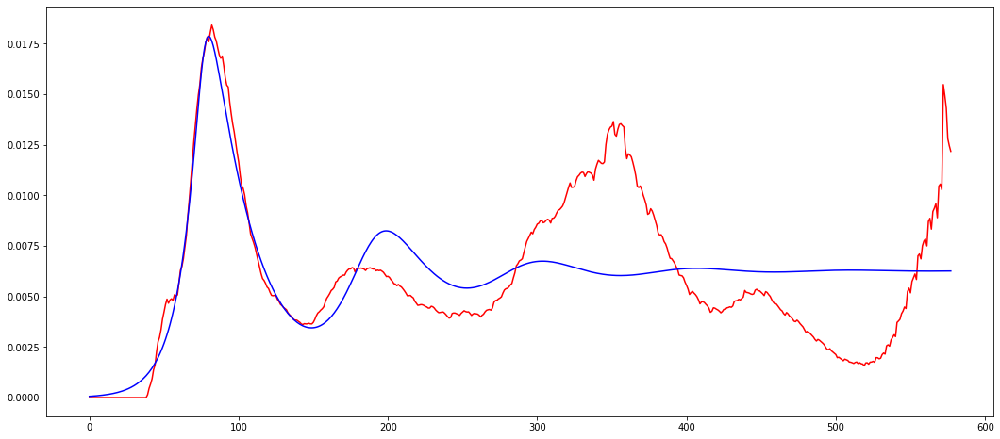

In [4]:
fig, ax = plt.subplots(figsize=(18,8))

ax.plot(gradDesc.y, color="red")
ax.plot(gradDesc.x, color="blue")

## UK Fit

In [39]:
dates, I, R, D, V = owid.LoadCountryNormal("United Kingdom")


print(len(I))
gradDesc = gd.GradDescent(I, [sird.getGamma(I,R), sird.getNu(I,D), len(I)], startFunc, simFunc, constrainFunc)
gradDesc.solveVars(printOut=1)

569
Startin Vars:
Error: 0.17828055270773283
[2.74612600e-05 2.74759225e-04 1.76518578e+00 2.51699694e-02
 5.01557414e-02 3.39935544e-02 4.77039967e+00]
Iteration: 2 Error: 0.16347822422527325 , improvement: 0.08582615662559433
Iteration: 3 Error: 0.15178441862768377 , improvement: 0.07153127367884421
Iteration: 4 Error: 0.14806208341467997 , improvement: 0.024523829564709287
Iteration: 5 Error: 0.14728640630914835 , improvement: 0.005238863911965643
Iteration: 8 Error: 0.14717898173624347 , improvement: 0.0011937547029066626
Iteration: 9 Error: 0.14673595051892305 , improvement: 0.003010152754789196
Iteration: 10 Error: 0.14605111380165503 , improvement: 0.004667136545925741
Iteration: 11 Error: 0.14516527953995825 , improvement: 0.006065234551376213
Iteration: 12 Error: 0.1441172465983086 , improvement: 0.007219584083542301
Iteration: 13 Error: 0.1429396705015649 , improvement: 0.008170958886176293
Iteration: 14 Error: 0.1416592360451234 , improvement: 0.00895786629386049
Iteration: 

Iteration: 110 Error: 0.10267533030681948 , improvement: 0.0016797904311406818
Iteration: 111 Error: 0.10250445498203828 , improvement: 0.0016642296087150121
Iteration: 112 Error: 0.10233545900358819 , improvement: 0.0016486695966502422
Iteration: 113 Error: 0.10216833308738857 , improvement: 0.0016331183523959208
Iteration: 114 Error: 0.10200306727622814 , improvement: 0.0016175835130741534
Iteration: 115 Error: 0.10183965097738876 , improvement: 0.0016020724003999397
Iteration: 116 Error: 0.10167807299923162 , improvement: 0.0015865920258604335
Iteration: 117 Error: 0.1015183215867468 , improvement: 0.0015711490960890943
Iteration: 118 Error: 0.10136038445606387 , improvement: 0.0015557500184631918
Iteration: 119 Error: 0.10120424882792717 , improvement: 0.0015404009068688605
Iteration: 120 Error: 0.10104990146013769 , improvement: 0.001525107587645931
Iteration: 121 Error: 0.10089732867896706 , improvement: 0.001509875605676062
Iteration: 122 Error: 0.10074651640955204 , improvement

Iteration: 215 Error: 0.09199151245110312 , improvement: 0.0007689682708145796
Iteration: 216 Error: 0.09192066050062808 , improvement: 0.0007702009521009135
Iteration: 217 Error: 0.09184974998211823 , improvement: 0.0007714317774007837
Iteration: 218 Error: 0.09177878193016052 , improvement: 0.0007726537303751293
Iteration: 219 Error: 0.09170775798271891 , improvement: 0.0007738602098212706
Iteration: 220 Error: 0.09163668033915633 , improvement: 0.0007750450466357991
Iteration: 221 Error: 0.09156555171729433 , improvement: 0.0007762025162712365
Iteration: 222 Error: 0.09149437530992041 , improvement: 0.0007773273467916554
Iteration: 223 Error: 0.09142315474113608 , improvement: 0.00077841472268748
Iteration: 224 Error: 0.09135189402292213 , improvement: 0.0007794602846043143
Iteration: 225 Error: 0.0912805975122629 , improvement: 0.0007804601253404983
Iteration: 226 Error: 0.09120926986914613 , improvement: 0.0007814107823647376
Iteration: 227 Error: 0.09113791601572294 , improvement

Iteration: 324 Error: 0.08473319532157 , improvement: 0.0006688741875094684
Iteration: 325 Error: 0.08467673752581915 , improvement: 0.0006663007990739358
Iteration: 326 Error: 0.08462053686933294 , improvement: 0.0006637083351148533
Iteration: 327 Error: 0.08456459445267454 , improvement: 0.0006610973970157536
Iteration: 328 Error: 0.08450891132286462 , improvement: 0.0006584685963472555
Iteration: 329 Error: 0.08445348847280716 , improvement: 0.0006558225539755506
Iteration: 330 Error: 0.08439832684078956 , improvement: 0.0006531598991954513
Iteration: 331 Error: 0.08434342731005477 , improvement: 0.0006504812688804839
Iteration: 332 Error: 0.0842887907084414 , improvement: 0.0006477873066803117
Iteration: 333 Error: 0.08423441780809053 , improvement: 0.0006450786622263023
Iteration: 334 Error: 0.08418030932521317 , improvement: 0.0006423559904056612
Iteration: 335 Error: 0.08412646591992216 , improvement: 0.0006396199505871869
Iteration: 336 Error: 0.08407288819611473 , improvement:

Iteration: 428 Error: 0.08020490914619358 , improvement: 0.00040806806659163605
Iteration: 429 Error: 0.08017231129481808 , improvement: 0.0004064321214562495
Iteration: 430 Error: 0.08013985596331202 , improvement: 0.0004048197062288902
Iteration: 431 Error: 0.08010754110912958 , improvement: 0.00040323074946918227
Iteration: 432 Error: 0.08007536469983523 , improvement: 0.00040166517220299665
Iteration: 433 Error: 0.08004332471364521 , improvement: 0.00040012288810820817
Iteration: 434 Error: 0.08001141913994951 , improvement: 0.0003986038037505676
Iteration: 435 Error: 0.07997964597981636 , improvement: 0.0003971078187924716
Iteration: 436 Error: 0.0799480032464787 , improvement: 0.00039563482621113674
Iteration: 437 Error: 0.07991648896580385 , improvement: 0.0003941847125024073
Iteration: 438 Error: 0.07988510117674395 , improvement: 0.0003927573579130257
Iteration: 439 Error: 0.07985383793176991 , improvement: 0.00039135263664341407
Iteration: 440 Error: 0.07982269729728833 , imp

Iteration: 533 Error: 0.07725311264396809 , improvement: 0.0003332689250046333
Iteration: 534 Error: 0.07722737633993153 , improvement: 0.0003331426159508633
Iteration: 535 Error: 0.07720165796770646 , improvement: 0.00033302144192830983
Iteration: 536 Error: 0.07717595712760426 , improvement: 0.0003329052869946178
Iteration: 537 Error: 0.07715027342925937 , improvement: 0.00033279403716922394
Iteration: 538 Error: 0.07712460649146267 , improvement: 0.0003326875804300237
Iteration: 539 Error: 0.07709895594199499 , improvement: 0.0003325858067168374
Iteration: 540 Error: 0.07707332141746408 , improvement: 0.0003324886078898566
Iteration: 541 Error: 0.0770477025631439 , improvement: 0.0003323958777047099
Iteration: 542 Error: 0.07702209903281236 , improvement: 0.00033230751183733765
Iteration: 543 Error: 0.07699651048859539 , improvement: 0.0003322234078049349
Iteration: 544 Error: 0.07697093660080848 , improvement: 0.0003321434650042011
Iteration: 545 Error: 0.07694537704780384 , improv

Iteration: 639 Error: 0.07458025971321931 , improvement: 0.0003338985432232315
Iteration: 640 Error: 0.07455535330805642 , improvement: 0.00033395439032615483
Iteration: 641 Error: 0.07453045105027281 , improvement: 0.0003340103249288243
Iteration: 642 Error: 0.07450555293547602 , improvement: 0.0003340663372612362
Iteration: 643 Error: 0.07448065895998707 , improvement: 0.00033412241783522455
Iteration: 644 Error: 0.07445576912081918 , improvement: 0.00033417855743273677
Iteration: 645 Error: 0.07443088341565599 , improvement: 0.00033423474711290706
Iteration: 646 Error: 0.07440600184283205 , improvement: 0.0003342909781814829
Iteration: 647 Error: 0.07438112440131223 , improvement: 0.00033434724220736726
Iteration: 648 Error: 0.07435625109067166 , improvement: 0.00033440353101363865
Iteration: 649 Error: 0.0743313819110792 , improvement: 0.0003344598366334618
Iteration: 650 Error: 0.07430651686327631 , improvement: 0.0003345161513697002
Iteration: 651 Error: 0.07428165594855962 , imp

Iteration: 746 Error: 0.07194004399912256 , improvement: 0.0003393549740604186
Iteration: 747 Error: 0.07191562778894749 , improvement: 0.00033939665334884866
Iteration: 748 Error: 0.07189121688233467 , improvement: 0.00033943813553925106
Iteration: 749 Error: 0.07186681129367158 , improvement: 0.00033947942073425425
Iteration: 750 Error: 0.07184241103731873 , improvement: 0.00033952050903082314
Iteration: 751 Error: 0.07181801612760866 , improvement: 0.00033956140054091716
Iteration: 752 Error: 0.07179362657884507 , improvement: 0.0003396020953886225
Iteration: 753 Error: 0.07176924240530307 , improvement: 0.00033964259369490636
Iteration: 754 Error: 0.07174486362122774 , improvement: 0.0003396828956010082
Iteration: 755 Error: 0.07172049024083403 , improvement: 0.000339723001250492
Iteration: 756 Error: 0.07169612227830642 , improvement: 0.00033976291079138
Iteration: 757 Error: 0.07167175974779812 , improvement: 0.0003398026243837107
Iteration: 758 Error: 0.07164740266343088 , impro

Iteration: 852 Error: 0.06938405232680653 , improvement: 0.00034271329929170435
Iteration: 853 Error: 0.06936027197105238 , improvement: 0.0003427351813085418
Iteration: 854 Error: 0.06933649826020619 , improvement: 0.0003427568861914811
Iteration: 855 Error: 0.06931273120529628 , improvement: 0.00034277841405706524
Iteration: 856 Error: 0.06928897081732728 , improvement: 0.0003427997650045891
Iteration: 857 Error: 0.06926521710727919 , improvement: 0.00034282093914650804
Iteration: 858 Error: 0.0692414700861086 , improvement: 0.00034284193657841116
Iteration: 859 Error: 0.0692177297647481 , improvement: 0.00034286275740504264
Iteration: 860 Error: 0.06919399615410662 , improvement: 0.0003428834017258844
Iteration: 861 Error: 0.06917026926507008 , improvement: 0.0003429038696319369
Iteration: 862 Error: 0.06914654910850095 , improvement: 0.0003429241612207489
Iteration: 863 Error: 0.069122835695239 , improvement: 0.00034294427657897015
Iteration: 864 Error: 0.06909912903610045 , improv

Iteration: 956 Error: 0.06694839688176356 , improvement: 0.0003440512213293197
Iteration: 957 Error: 0.06692536295594512 , improvement: 0.00034405492724674596
Iteration: 958 Error: 0.06690233671875065 , improvement: 0.00034405845822047004
Iteration: 959 Error: 0.06687931817940376 , improvement: 0.00034406181421814023
Iteration: 960 Error: 0.06685630734711581 , improvement: 0.00034406499519364417
Iteration: 961 Error: 0.06683330423108517 , improvement: 0.00034406800111178216
Iteration: 962 Error: 0.06681030884049693 , improvement: 0.0003440708319422681
Iteration: 963 Error: 0.0667873211845245 , improvement: 0.0003440734876306592
Iteration: 964 Error: 0.06676434127232793 , improvement: 0.0003440759681479683
Iteration: 965 Error: 0.06674136911305496 , improvement: 0.0003440782734493522
Iteration: 966 Error: 0.06671840471584041 , improvement: 0.00034408040349986283
Iteration: 967 Error: 0.06669544808980729 , improvement: 0.0003440823582472193
Iteration: 968 Error: 0.06667249924406521 , imp

Iteration: 1059 Error: 0.06461786796428073 , improvement: 0.00034350618176140073
Iteration: 1060 Error: 0.06459567226705026 , improvement: 0.0003434916367519229
Iteration: 1061 Error: 0.06457348514498346 , improvement: 0.0003434769124328074
Iteration: 1062 Error: 0.06455130660606195 , improvement: 0.0003434620087750574
Iteration: 1063 Error: 0.06452913665825463 , improvement: 0.00034344692575501206
Iteration: 1064 Error: 0.06450697530951795 , improvement: 0.0003434316633438202
Iteration: 1065 Error: 0.06448482256779554 , improvement: 0.00034341622151883174
Iteration: 1066 Error: 0.0644626784410186 , improvement: 0.00034340060025220444
Iteration: 1067 Error: 0.06444054293710536 , improvement: 0.0003433847995240259
Iteration: 1068 Error: 0.06441841606396159 , improvement: 0.00034336881930617806
Iteration: 1069 Error: 0.06439629782947996 , improvement: 0.0003433526595821403
Iteration: 1070 Error: 0.06437418824154091 , improvement: 0.0003433363203207218
Iteration: 1071 Error: 0.06435208730

Iteration: 1166 Error: 0.06229307327488855 , improvement: 0.0003409319272704032
Iteration: 1167 Error: 0.06227183767721039 , improvement: 0.0003408982180803529
Iteration: 1168 Error: 0.062250611428848045 , improvement: 0.00034086433216201574
Iteration: 1169 Error: 0.06222939453617127 , improvement: 0.0003408302696115358
Iteration: 1170 Error: 0.062208187005531386 , improvement: 0.00034079603052468216
Iteration: 1171 Error: 0.06218698884326146 , improvement: 0.00034076161499517466
Iteration: 1172 Error: 0.06216580005567594 , improvement: 0.0003407270231224906
Iteration: 1173 Error: 0.062144620649070566 , improvement: 0.0003406922550085275
Iteration: 1174 Error: 0.06212345062972256 , improvement: 0.0003406573107518019
Iteration: 1175 Error: 0.06210229000389032 , improvement: 0.0003406221904569362
Iteration: 1176 Error: 0.06208113877781339 , improvement: 0.00034058689422897275
Iteration: 1177 Error: 0.06205999695771245 , improvement: 0.00034055142217359786
Iteration: 1178 Error: 0.0620388

Iteration: 1270 Error: 0.06013571425009028 , improvement: 0.0003365046741734022
Iteration: 1271 Error: 0.06011548138389664 , improvement: 0.00033645341118749986
Iteration: 1272 Error: 0.060095258416263286 , improvement: 0.00033640199109796835
Iteration: 1273 Error: 0.06007504535120284 , improvement: 0.0003363504142113484
Iteration: 1274 Error: 0.06005484219270083 , improvement: 0.0003362986808232519
Iteration: 1275 Error: 0.06003464894471535 , improvement: 0.0003362467912360176
Iteration: 1276 Error: 0.060014465611176696 , improvement: 0.0003361947457582611
Iteration: 1277 Error: 0.059994292195987446 , improvement: 0.00033614254469829693
Iteration: 1278 Error: 0.05997412870302241 , improvement: 0.0003360901883659873
Iteration: 1279 Error: 0.05995397513612899 , improvement: 0.0003360376770660341
Iteration: 1280 Error: 0.059933831499125886 , improvement: 0.0003359850111250503
Iteration: 1281 Error: 0.05991369779580401 , improvement: 0.0003359321908557125
Iteration: 1282 Error: 0.05989357

Iteration: 1376 Error: 0.05804696865570919 , improvement: 0.00033021976515237183
Iteration: 1377 Error: 0.058027804223004666 , improvement: 0.0003301538934478389
Iteration: 1378 Error: 0.058008649946664 , improvement: 0.0003300879052230699
Iteration: 1379 Error: 0.0579895058268529 , improvement: 0.0003300218127589472
Iteration: 1380 Error: 0.057970371863123475 , improvement: 0.00032995562656729685
Iteration: 1381 Error: 0.057951248054570074 , improvement: 0.00032988935448878586
Iteration: 1382 Error: 0.057932134400016294 , improvement: 0.0003298230011505865
Iteration: 1383 Error: 0.05791303089821113 , improvement: 0.0003297565678015304
Iteration: 1384 Error: 0.05789393754801155 , improvement: 0.0003296900525398896
Iteration: 1385 Error: 0.057874854348532796 , improvement: 0.00032962345086530513
Iteration: 1386 Error: 0.057855781299255025 , improvement: 0.00032955675642671033
Iteration: 1387 Error: 0.057836718400076106 , improvement: 0.0003294899619506915
Iteration: 1388 Error: 0.057817

Iteration: 1478 Error: 0.05614441374349061 , improvement: 0.0003230427264996692
Iteration: 1479 Error: 0.056126280845261174 , improvement: 0.0003229688765168503
Iteration: 1480 Error: 0.05610815795070239 , improvement: 0.00032289498405832317
Iteration: 1481 Error: 0.0560900450562439 , improvement: 0.0003228210499157972
Iteration: 1482 Error: 0.056071942158270084 , improvement: 0.0003227470749161773
Iteration: 1483 Error: 0.05605384925311734 , improvement: 0.00032267305993561386
Iteration: 1484 Error: 0.05603576633707505 , improvement: 0.00032259900583522506
Iteration: 1485 Error: 0.056017693406383094 , improvement: 0.00032252491352112293
Iteration: 1486 Error: 0.05599963045723398 , improvement: 0.00032245078386348704
Iteration: 1487 Error: 0.05598157748577309 , improvement: 0.00032237661772920506
Iteration: 1488 Error: 0.05596353448810006 , improvement: 0.0003223024159620319
Iteration: 1489 Error: 0.055945501460271156 , improvement: 0.00032222817936456414
Iteration: 1490 Error: 0.05592

Iteration: 1580 Error: 0.054345586040423624 , improvement: 0.0003154349028131207
Iteration: 1581 Error: 0.05432844755825369 , improvement: 0.0003153610701186985
Iteration: 1582 Error: 0.05431131848965452 , improvement: 0.0003152872826119141
Iteration: 1583 Error: 0.0542941988266269 , improvement: 0.00031521354118631625
Iteration: 1584 Error: 0.05427708856112993 , improvement: 0.0003151398467377544
Iteration: 1585 Error: 0.05425998768508157 , improvement: 0.000315066200153642
Iteration: 1586 Error: 0.054242896190358034 , improvement: 0.00031499260233403936
Iteration: 1587 Error: 0.05422581406879453 , improvement: 0.00031491905416621826
Iteration: 1588 Error: 0.05420874131218484 , improvement: 0.00031484555654677374
Iteration: 1589 Error: 0.05419167791228183 , improvement: 0.0003147721103639747
Iteration: 1590 Error: 0.05417462386079719 , improvement: 0.00031469871651221526
Iteration: 1591 Error: 0.05415757914940141 , improvement: 0.0003146253758876691
Iteration: 1592 Error: 0.0541405437

Iteration: 1687 Error: 0.05256335995484518 , improvement: 0.00030796617873820654
Iteration: 1688 Error: 0.05254717558392604 , improvement: 0.0003079021381631876
Iteration: 1689 Error: 0.052530999554188516 , improvement: 0.00030783823407766204
Iteration: 1690 Error: 0.05251483185378724 , improvement: 0.000307774467238117
Iteration: 1691 Error: 0.05249867247084824 , improvement: 0.00030771083841595276
Iteration: 1692 Error: 0.052482521393469435 , improvement: 0.0003076473483738505
Iteration: 1693 Error: 0.05246637860972089 , improvement: 0.0003075839978707787
Iteration: 1694 Error: 0.05245024410764484 , improvement: 0.0003075207876662169
Iteration: 1695 Error: 0.05243411787525595 , improvement: 0.0003074577185148639
Iteration: 1696 Error: 0.05241799990054145 , improvement: 0.00030739479117112666
Iteration: 1697 Error: 0.05240189017146141 , improvement: 0.0003073320063834266
Iteration: 1698 Error: 0.05238578867594894 , improvement: 0.00030726936489855667
Iteration: 1699 Error: 0.052369695

Iteration: 1792 Error: 0.050907206345977535 , improvement: 0.000302117433594016
Iteration: 1793 Error: 0.050891828736806526 , improvement: 0.00030207136228413943
Iteration: 1794 Error: 0.05087645810724305 , improvement: 0.00030202549102665454
Iteration: 1795 Error: 0.05086109444356993 , improvement: 0.0003019798202290072
Iteration: 1796 Error: 0.050845737732064175 , improvement: 0.00030193435028804495
Iteration: 1797 Error: 0.05083038795899652 , improvement: 0.0003018890816088309
Iteration: 1798 Error: 0.05081504511063232 , improvement: 0.00030184401457994994
Iteration: 1799 Error: 0.0507997091732314 , improvement: 0.0003017991495930054
Iteration: 1800 Error: 0.050784380133048486 , improvement: 0.00030175448703142425
Iteration: 1801 Error: 0.050769057976333416 , improvement: 0.0003017100272746774
Iteration: 1802 Error: 0.05075374268933111 , improvement: 0.0003016657707031933
Iteration: 1803 Error: 0.050738434258282256 , improvement: 0.0003016217176841404
Iteration: 1804 Error: 0.050723

Iteration: 1897 Error: 0.04932808816528592 , improvement: 0.00029842702937627976
Iteration: 1898 Error: 0.04931336849914932 , improvement: 0.00029840333741049753
Iteration: 1899 Error: 0.04929865438299778 , improvement: 0.00029837986329811446
Iteration: 1900 Error: 0.04928394580374855 , improvement: 0.0002983566069563932
Iteration: 1901 Error: 0.049269242748336925 , improvement: 0.00029833356830179404
Iteration: 1902 Error: 0.049254545203716 , improvement: 0.00029831074725462215
Iteration: 1903 Error: 0.04923985315685786 , improvement: 0.0002982881437108597
Iteration: 1904 Error: 0.04922516659475277 , improvement: 0.00029826575758270797
Iteration: 1905 Error: 0.049210485504410234 , improvement: 0.0002982435887601347
Iteration: 1906 Error: 0.0491958098728589 , improvement: 0.0002982216371349467
Iteration: 1907 Error: 0.049181139687146 , improvement: 0.0002981999026099621
Iteration: 1908 Error: 0.04916647493433899 , improvement: 0.0002981783850536007
Iteration: 1909 Error: 0.049151815601

Iteration: 2000 Error: 0.04783890008085718 , improvement: 0.0002970971385798612
Iteration: 2001 Error: 0.04782468739827947 , improvement: 0.00029709467721220496
Iteration: 2002 Error: 0.04781047904700497 , improvement: 0.0002970924024274631
Iteration: 2003 Error: 0.047796275016785836 , improvement: 0.0002970903137191284
Iteration: 2004 Error: 0.0477820752974108 , improvement: 0.0002970884105518953
Iteration: 2005 Error: 0.04776787987870342 , improvement: 0.0002970866924263776
Iteration: 2006 Error: 0.04775368875052368 , improvement: 0.0002970851588091568
Iteration: 2007 Error: 0.04773950190276766 , improvement: 0.00029708380917195537
Iteration: 2008 Error: 0.047725319325367624 , improvement: 0.00029708264298452494
Iteration: 2009 Error: 0.047711141008292345 , improvement: 0.0002970816597081013
Iteration: 2010 Error: 0.04769696694154645 , improvement: 0.0002970808588172054
Iteration: 2011 Error: 0.04768279711517183 , improvement: 0.0002970802397558796
Iteration: 2012 Error: 0.0476686315

Iteration: 2104 Error: 0.04638228758653053 , improvement: 0.00029773212533804684
Iteration: 2105 Error: 0.04636847745770355 , improvement: 0.00029774574617984835
Iteration: 2106 Error: 0.04635467080377321 , improvement: 0.00029775948418691895
Iteration: 2107 Error: 0.046340867618689656 , improvement: 0.00029777333856998984
Iteration: 2108 Error: 0.04632706789644626 , improvement: 0.00029778730853613386
Iteration: 2109 Error: 0.04631327163107954 , improvement: 0.000297801393292504
Iteration: 2110 Error: 0.046299478816670056 , improvement: 0.0002978155920262586
Iteration: 2111 Error: 0.04628568944734071 , improvement: 0.00029782990395952805
Iteration: 2112 Error: 0.046271903517258295 , improvement: 0.00029784432827991905
Iteration: 2113 Error: 0.04625812102063335 , improvement: 0.0002978588641767432
Iteration: 2114 Error: 0.046244341951718775 , improvement: 0.00029787351086802235
Iteration: 2115 Error: 0.04623056630481172 , improvement: 0.00029788826752986784
Iteration: 2116 Error: 0.046

Iteration: 2208 Error: 0.044963744276139306 , improvement: 0.0002996243451430834
Iteration: 2209 Error: 0.04495027108659225 , improvement: 0.0002996456314739855
Iteration: 2210 Error: 0.04493680097667836 , improvement: 0.00029966693388647767
Iteration: 2211 Error: 0.04492333394529082 , improvement: 0.00029968825316538974
Iteration: 2212 Error: 0.04490986999100351 , improvement: 0.0002997095964360981
Iteration: 2213 Error: 0.044896409112025054 , improvement: 0.00029973097185887756
Iteration: 2214 Error: 0.04488295130640223 , improvement: 0.00029975238307471445
Iteration: 2215 Error: 0.044869496572326056 , improvement: 0.000299773826910792
Iteration: 2216 Error: 0.04485604490834821 , improvement: 0.0002997952953665641
Iteration: 2217 Error: 0.04484259631338481 , improvement: 0.0002998167803442318
Iteration: 2218 Error: 0.04482915078652398 , improvement: 0.0002998382780261396
Iteration: 2219 Error: 0.04481570832677247 , improvement: 0.0002998597902405729
Iteration: 2220 Error: 0.044802268

Iteration: 2312 Error: 0.043578918463992124 , improvement: 0.0003018308391212516
Iteration: 2313 Error: 0.04356576414905487 , improvement: 0.00030185042219715055
Iteration: 2314 Error: 0.043552612954264866 , improvement: 0.00030186994413804603
Iteration: 2315 Error: 0.04353946488188933 , improvement: 0.0003018894041866242
Iteration: 2316 Error: 0.04352631993422532 , improvement: 0.0003019088015819228
Iteration: 2317 Error: 0.043513178113601156 , improvement: 0.00030192813552871697
Iteration: 2318 Error: 0.043500039422377804 , improvement: 0.00030194740519873383
Iteration: 2319 Error: 0.043486903862951294 , improvement: 0.0003019666097073044
Iteration: 2320 Error: 0.0434737714377515 , improvement: 0.0003019857481962347
Iteration: 2321 Error: 0.043460642149240794 , improvement: 0.0003020048198373665
Iteration: 2322 Error: 0.043447515999911805 , improvement: 0.0003020238238522706
Iteration: 2323 Error: 0.04343439299228684 , improvement: 0.0003020427594754455
Iteration: 2324 Error: 0.04342

Iteration: 2416 Error: 0.04222813404980971 , improvement: 0.0003033960295388875
Iteration: 2417 Error: 0.04221532181958743 , improvement: 0.00030340507603691784
Iteration: 2418 Error: 0.042202513100664606 , improvement: 0.0003034139826664543
Iteration: 2419 Error: 0.042189707898135434 , improvement: 0.00030342274875023995
Iteration: 2420 Error: 0.042176906217115805 , improvement: 0.00030343137360747477
Iteration: 2421 Error: 0.04216410806274352 , improvement: 0.0003034398565510131
Iteration: 2422 Error: 0.04215131344017737 , improvement: 0.00030344819691450683
Iteration: 2423 Error: 0.042138522354597724 , improvement: 0.0003034563940172162
Iteration: 2424 Error: 0.04212573481120577 , improvement: 0.00030346444719510677
Iteration: 2425 Error: 0.04211295081522442 , improvement: 0.0003034723557616777
Iteration: 2426 Error: 0.04210017037189728 , improvement: 0.00030348011905438697
Iteration: 2427 Error: 0.0420873934864891 , improvement: 0.0003034877363990946
Iteration: 2428 Error: 0.042074

Iteration: 2521 Error: 0.04090307000885182 , improvement: 0.00030346220947948986
Iteration: 2522 Error: 0.040890657843262304 , improvement: 0.000303453153683367
Iteration: 2523 Error: 0.04087824982276017 , improvement: 0.00030344389541724385
Iteration: 2524 Error: 0.040865845954155676 , improvement: 0.00030343443416182595
Iteration: 2525 Error: 0.040853446244270425 , improvement: 0.0003034247694067394
Iteration: 2526 Error: 0.04084105069993674 , improvement: 0.00030341490065666254
Iteration: 2527 Error: 0.04082865932799773 , improvement: 0.0003034048274136848
Iteration: 2528 Error: 0.040816272135307835 , improvement: 0.0003033945491665961
Iteration: 2529 Error: 0.04080388912873207 , improvement: 0.0003033840654216344
Iteration: 2530 Error: 0.04079151031514637 , improvement: 0.0003033733756761596
Iteration: 2531 Error: 0.04077913570143705 , improvement: 0.0003033624794404126
Iteration: 2532 Error: 0.04076676529450105 , improvement: 0.00030335137621763077
Iteration: 2533 Error: 0.0407543

Iteration: 2626 Error: 0.03962374627209055 , improvement: 0.00030131862449530873
Iteration: 2627 Error: 0.03961180819809025 , improvement: 0.00030128584809535456
Iteration: 2628 Error: 0.039599875028970444 , improvement: 0.0003012528249185668
Iteration: 2629 Error: 0.039587946772250256 , improvement: 0.00030121955464409013
Iteration: 2630 Error: 0.03957602343545211 , improvement: 0.0003011860369203771
Iteration: 2631 Error: 0.03956410502610078 , improvement: 0.00030115227141913506
Iteration: 2632 Error: 0.039552191551723466 , improvement: 0.00030111825781116663
Iteration: 2633 Error: 0.039540283019850304 , improvement: 0.0003010839957525093
Iteration: 2634 Error: 0.039528379438012844 , improvement: 0.0003010494849388114
Iteration: 2635 Error: 0.03951648081374597 , improvement: 0.00030101472501622924
Iteration: 2636 Error: 0.0395045871545861 , improvement: 0.0003009797156768624
Iteration: 2637 Error: 0.03949269846807233 , improvement: 0.00030094445658295773
Iteration: 2638 Error: 0.0394

Iteration: 2733 Error: 0.03837568717411841 , improvement: 0.0002963529720552798
Iteration: 2734 Error: 0.03836431675827549 , improvement: 0.00029629217559900027
Iteration: 2735 Error: 0.03835295205434375 , improvement: 0.00029623110463156236
Iteration: 2736 Error: 0.03834159306977779 , improvement: 0.0002961697589761681
Iteration: 2737 Error: 0.03833023981202882 , improvement: 0.0002961081384465403
Iteration: 2738 Error: 0.03831889228854455 , improvement: 0.0002960462428599406
Iteration: 2739 Error: 0.03830755050676913 , improvement: 0.0002959840720346411
Iteration: 2740 Error: 0.03829621447414263 , improvement: 0.00029592162580315
Iteration: 2741 Error: 0.038284884198101936 , improvement: 0.0002958589039745502
Iteration: 2742 Error: 0.03827355968608026 , improvement: 0.00029579590637070685
Iteration: 2743 Error: 0.038262240945506606 , improvement: 0.00029573263282774165
Iteration: 2744 Error: 0.03825092798380667 , improvement: 0.0002956690831581561
Iteration: 2745 Error: 0.03823962080

Iteration: 2837 Error: 0.037225094514369825 , improvement: 0.00028853198575245283
Iteration: 2838 Error: 0.03721435723828954 , improvement: 0.0002884418755778442
Iteration: 2839 Error: 0.037203626423371376 , improvement: 0.00028835147815264015
Iteration: 2840 Error: 0.03719290207650136 , improvement: 0.00028826079339616336
Iteration: 2841 Error: 0.037182184204558134 , improvement: 0.00028816982125194043
Iteration: 2842 Error: 0.037171472814413235 , improvement: 0.00028807856165657904
Iteration: 2843 Error: 0.037160767912930534 , improvement: 0.00028798701456215727
Iteration: 2844 Error: 0.037150069506967545 , improvement: 0.00028789517988583434
Iteration: 2845 Error: 0.03713937760337386 , improvement: 0.0002878030575873049
Iteration: 2846 Error: 0.03712869220899252 , improvement: 0.000287710647589468
Iteration: 2847 Error: 0.03711801333065867 , improvement: 0.00028761794985237215
Iteration: 2848 Error: 0.037107340975200735 , improvement: 0.0002875249643041111
Iteration: 2849 Error: 0.0

Iteration: 2939 Error: 0.03616432405626478 , improvement: 0.0002778540534179795
Iteration: 2940 Error: 0.036154279976829046 , improvement: 0.0002777344716884468
Iteration: 2941 Error: 0.03614424302082547 , improvement: 0.00027761460081643174
Iteration: 2942 Error: 0.036134213194318955 , improvement: 0.00027749444083636577
Iteration: 2943 Error: 0.03612419050336559 , improvement: 0.00027737399177514576
Iteration: 2944 Error: 0.03611417495401293 , improvement: 0.0002772532536536581
Iteration: 2945 Error: 0.036104166552299866 , improvement: 0.0002771322264957995
Iteration: 2946 Error: 0.036094165304256645 , improvement: 0.00027701091032617556
Iteration: 2947 Error: 0.036084171215904945 , improvement: 0.00027688930516760326
Iteration: 2948 Error: 0.0360741842932568 , improvement: 0.0002767674110730294
Iteration: 2949 Error: 0.03606420454231655 , improvement: 0.0002766452280424851
Iteration: 2950 Error: 0.03605423196907925 , improvement: 0.00027652275611939265
Iteration: 2951 Error: 0.03604

Iteration: 3042 Error: 0.035168237013191266 , improvement: 0.0002640253716212777
Iteration: 3043 Error: 0.03515895695084052 , improvement: 0.00026387624569472056
Iteration: 3044 Error: 0.03514968459035686 , improvement: 0.00026372683628317237
Iteration: 3045 Error: 0.035140419936899286 , improvement: 0.00026357714345227347
Iteration: 3046 Error: 0.03513116299561801 , improvement: 0.0002634271672876062
Iteration: 3047 Error: 0.0351219137716543 , improvement: 0.0002632769078799129
Iteration: 3048 Error: 0.03511267227014073 , improvement: 0.0002631263653130524
Iteration: 3049 Error: 0.03510343849620159 , improvement: 0.00026297553965983904
Iteration: 3050 Error: 0.03509421245495261 , improvement: 0.00026282443100198973
Iteration: 3051 Error: 0.035084994151500744 , improvement: 0.0002626730394277653
Iteration: 3052 Error: 0.03507578359094406 , improvement: 0.00026252136502901417
Iteration: 3053 Error: 0.035066580778372304 , improvement: 0.00026236940788198853
Iteration: 3054 Error: 0.03505

Iteration: 3147 Error: 0.0342368092706973 , improvement: 0.0002468361406074079
Iteration: 3148 Error: 0.034228364496265956 , improvement: 0.0002466577526127565
Iteration: 3149 Error: 0.03421992792008816 , improvement: 0.0002464790913020076
Iteration: 3150 Error: 0.03421149954647621 , improvement: 0.000246300156786829
Iteration: 3151 Error: 0.03420307937973606 , improvement: 0.00024612094914789495
Iteration: 3152 Error: 0.03419466742416582 , improvement: 0.00024594146851071455
Iteration: 3153 Error: 0.034186263684056604 , improvement: 0.00024576171497650074
Iteration: 3154 Error: 0.03417786816369183 , improvement: 0.0002455816886678034
Iteration: 3155 Error: 0.03416948086734834 , improvement: 0.0002454013896747392
Iteration: 3156 Error: 0.034161101799295816 , improvement: 0.0002452208181053057
Iteration: 3157 Error: 0.03415273096379637 , improvement: 0.00024503997408012636
Iteration: 3158 Error: 0.03414436836510514 , improvement: 0.00024485885770280535
Iteration: 3159 Error: 0.034136014

Iteration: 3249 Error: 0.03341838281610854 , improvement: 0.00022725132029306706
Iteration: 3250 Error: 0.03341079531890502 , improvement: 0.00022704561274761745
Iteration: 3251 Error: 0.033403216426025235 , improvement: 0.00022683964291914742
Iteration: 3252 Error: 0.03339564614115125 , improvement: 0.00022663341090966725
Iteration: 3253 Error: 0.033388084467959406 , improvement: 0.00022642691684674265
Iteration: 3254 Error: 0.03338053141012158 , improvement: 0.00022622016082035062
Iteration: 3255 Error: 0.03337298697130509 , improvement: 0.00022601314292440227
Iteration: 3256 Error: 0.033365451155171685 , improvement: 0.00022580586328356967
Iteration: 3257 Error: 0.03335792396537831 , improvement: 0.00022559832199987994
Iteration: 3258 Error: 0.033350405405577224 , improvement: 0.0002253905191728615
Iteration: 3259 Error: 0.03334289547941583 , improvement: 0.00022518245490765474
Iteration: 3260 Error: 0.033335394190536834 , improvement: 0.00022497412930523844
Iteration: 3261 Error: 0

Iteration: 3355 Error: 0.032662679143586504 , improvement: 0.00020400653913113179
Iteration: 3356 Error: 0.03265602335201051 , improvement: 0.00020377359575233736
Iteration: 3357 Error: 0.03264937653193287 , improvement: 0.00020354040067877715
Iteration: 3358 Error: 0.03264273868663969 , improvement: 0.00020330695401449207
Iteration: 3359 Error: 0.032636109819414505 , improvement: 0.00020307325585690688
Iteration: 3360 Error: 0.0326294899335384 , improvement: 0.00020283930630022367
Iteration: 3361 Error: 0.03262287903228999 , improvement: 0.00020260510543903287
Iteration: 3362 Error: 0.03261627711894544 , improvement: 0.00020237065336916438
Iteration: 3363 Error: 0.032609684196778066 , improvement: 0.00020213595019853863
Iteration: 3364 Error: 0.03260310026905905 , improvement: 0.0002019009960135609
Iteration: 3365 Error: 0.032596525339057596 , improvement: 0.00020166579089697263
Iteration: 3366 Error: 0.03258995941003942 , improvement: 0.00020143033497829743
Iteration: 3367 Error: 0.0

Iteration: 3460 Error: 0.03201341071576185 , improvement: 0.00017819208976752504
Iteration: 3461 Error: 0.03200771446448288 , improvement: 0.0001779332833213168
Iteration: 3462 Error: 0.032002027518241716 , improvement: 0.00017767423686177388
Iteration: 3463 Error: 0.03199634988011266 , improvement: 0.00017741495053157894
Iteration: 3464 Error: 0.03199068155316747 , improvement: 0.00017715542449139464
Iteration: 3465 Error: 0.03198502254047673 , improvement: 0.00017689565886045073
Iteration: 3466 Error: 0.031979372845107934 , improvement: 0.00017663565381716067
Iteration: 3467 Error: 0.03197373247012681 , improvement: 0.00017637540950045808
Iteration: 3468 Error: 0.031968101418596816 , improvement: 0.00017611492606487718
Iteration: 3469 Error: 0.03196247969357941 , improvement: 0.00017585420365734376
Iteration: 3470 Error: 0.031956867298133504 , improvement: 0.00017559324244278393
Iteration: 3471 Error: 0.031951264235315587 , improvement: 0.0001753320425824295
Iteration: 3472 Error: 0.

Iteration: 3565 Error: 0.03146667312325192 , improvement: 0.00014974229450617302
Iteration: 3566 Error: 0.03146197013239219 , improvement: 0.00014945942462073124
Iteration: 3567 Error: 0.03145727675079405 , improvement: 0.0001491763414176623
Iteration: 3568 Error: 0.03145259298106048 , improvement: 0.00014889304534142944
Iteration: 3569 Error: 0.03144791882578644 , improvement: 0.00014860953679890233
Iteration: 3570 Error: 0.031443254287557974 , improvement: 0.00014832581622661943
Iteration: 3571 Error: 0.03143859936895178 , improvement: 0.00014804188407536507
Iteration: 3572 Error: 0.03143395407253525 , improvement: 0.00014775774079561353
Iteration: 3573 Error: 0.03142931840086703 , improvement: 0.0001474733868198673
Iteration: 3574 Error: 0.03142469235649608 , improvement: 0.00014718882261297687
Iteration: 3575 Error: 0.031420075941961945 , improvement: 0.00014690404863043434
Iteration: 3576 Error: 0.031415469159794054 , improvement: 0.00014661906535171076
Iteration: 3577 Error: 0.03

Iteration: 3668 Error: 0.03103315080800714 , improvement: 0.00011958733632463049
Iteration: 3669 Error: 0.031029448993023748 , improvement: 0.00011928582457816207
Iteration: 3670 Error: 0.03102575697951689 , improvement: 0.00011898417879377987
Iteration: 3671 Error: 0.031022074768210298 , improvement: 0.00011868240020775784
Iteration: 3672 Error: 0.031018402359794313 , improvement: 0.00011838049013240221
Iteration: 3673 Error: 0.03101473975492839 , improvement: 0.00011807844980017931
Iteration: 3674 Error: 0.03101108695424052 , improvement: 0.00011777628046321257
Iteration: 3675 Error: 0.0310074439583244 , improvement: 0.00011747398346578759
Iteration: 3676 Error: 0.03100381076774093 , improvement: 0.00011717156010521937
Iteration: 3677 Error: 0.0310001873830192 , improvement: 0.00011686901164736796
Iteration: 3678 Error: 0.030996573804653167 , improvement: 0.00011656633946717827
Iteration: 3679 Error: 0.030992970033102463 , improvement: 0.00011626354491353925
Iteration: 3680 Error: 0.

Iteration: 3773 Error: 0.030697923763110323 , improvement: 8.749476348004443e-05
Iteration: 3774 Error: 0.03069524725438793 , improvement: 8.718859109326793e-05
Iteration: 3775 Error: 0.030692580374709247 , improvement: 8.688249540981365e-05
Iteration: 3776 Error: 0.03068992311915773 , improvement: 8.657647936654721e-05
Iteration: 3777 Error: 0.03068727548273597 , improvement: 8.627054592091007e-05
Iteration: 3778 Error: 0.03068463746036651 , improvement: 8.596469800467624e-05
Iteration: 3779 Error: 0.03068200904689002 , improvement: 8.565893861008354e-05
Iteration: 3780 Error: 0.03067939023706471 , improvement: 8.535327074925671e-05
Iteration: 3781 Error: 0.03067678102556656 , improvement: 8.504769742774177e-05
Iteration: 3782 Error: 0.030674181406988365 , improvement: 8.474222168316833e-05
Iteration: 3783 Error: 0.03067159137583898 , improvement: 8.443684657857928e-05
Iteration: 3784 Error: 0.030669010926542624 , improvement: 8.4131575200507e-05
Iteration: 3785 Error: 0.0306664400534

Iteration: 3877 Error: 0.030469822858608418 , improvement: 5.6684331500638376e-05
Iteration: 3878 Error: 0.03046810420057418 , improvement: 5.640525191797848e-05
Iteration: 3879 Error: 0.030466394127892513 , improvement: 5.6126652003376105e-05
Iteration: 3880 Error: 0.03046469262437103 , improvement: 5.584853640184985e-05
Iteration: 3881 Error: 0.03046299967368383 , improvement: 5.55709098422295e-05
Iteration: 3882 Error: 0.030461315259372807 , improvement: 5.529377701029343e-05
Iteration: 3883 Error: 0.030459639364846816 , improvement: 5.501714261912582e-05
Iteration: 3884 Error: 0.03045797197338179 , improvement: 5.4741011377558085e-05
Iteration: 3885 Error: 0.030456313068119918 , improvement: 5.446538802124818e-05
Iteration: 3886 Error: 0.03045466263206923 , improvement: 5.41902772996866e-05
Iteration: 3887 Error: 0.030453020648104553 , improvement: 5.391568393038792e-05
Iteration: 3888 Error: 0.030451387098966314 , improvement: 5.3641612670068985e-05
Iteration: 3889 Error: 0.030449

Iteration: 3984 Error: 0.03033070249819391 , improvement: 3.0488188044618797e-05
Iteration: 3985 Error: 0.030329783865887926 , improvement: 3.028720835065091e-05
Iteration: 3986 Error: 0.030328871327723887 , improvement: 3.0087196403209195e-05
Iteration: 3987 Error: 0.0303279648536907 , improvement: 2.9888155856216214e-05
Iteration: 3988 Error: 0.030327064413674703 , improvement: 2.969009032888926e-05
Iteration: 3989 Error: 0.03032616997745953 , improvement: 2.949300344314228e-05
Iteration: 3990 Error: 0.0303252815147275 , improvement: 2.9296898773933996e-05
Iteration: 3991 Error: 0.030324398995061654 , improvement: 2.910177982740709e-05
Iteration: 3992 Error: 0.03032352238794514 , improvement: 2.8907650128743435e-05
Iteration: 3993 Error: 0.03032265166276248 , improvement: 2.8714513159811414e-05
Iteration: 3994 Error: 0.030321786788802797 , improvement: 2.852237229451242e-05
Iteration: 3995 Error: 0.03032092773525658 , improvement: 2.833123101227203e-05
Iteration: 3996 Error: 0.030320

Iteration: 4087 Error: 0.030262433023548762 , improvement: 1.5342267728298918e-05
Iteration: 4088 Error: 0.030261971435202765 , improvement: 1.5252849816733072e-05
Iteration: 4089 Error: 0.03026151252616972 , improvement: 1.5164545179341491e-05
Iteration: 4090 Error: 0.030261056262677524 , improvement: 1.5077352521676335e-05
Iteration: 4091 Error: 0.03026060261099781 , improvement: 1.4991270488932953e-05
Iteration: 4092 Error: 0.03026015153744678 , improvement: 1.4906297697602666e-05
Iteration: 4093 Error: 0.030259703008387876 , improvement: 1.4822432675176381e-05
Iteration: 4094 Error: 0.030259256990232474 , improvement: 1.4739673924702003e-05
Iteration: 4095 Error: 0.03025881344944229 , improvement: 1.4658019868958362e-05
Iteration: 4096 Error: 0.03025837235252965 , improvement: 1.4577468920863007e-05
Iteration: 4097 Error: 0.030257933666061176 , improvement: 1.4498019370086116e-05
Iteration: 4098 Error: 0.030257497356657392 , improvement: 1.4419669518699572e-05
Iteration: 4099 Error

Iteration: 4190 Error: 0.030223315862196246 , improvement: 1.1530243063464555e-05
Iteration: 4191 Error: 0.03022296708097392 , improvement: 1.1540137551994483e-05
Iteration: 4192 Error: 0.030222617982316586 , improvement: 1.1550773833593993e-05
Iteration: 4193 Error: 0.030222268543977065 , improvement: 1.1562146592514632e-05
Iteration: 4194 Error: 0.03022191874386847 , improvement: 1.1574250559157838e-05
Iteration: 4195 Error: 0.030221568560062608 , improvement: 1.1587080516970611e-05
Iteration: 4196 Error: 0.030221217970795494 , improvement: 1.1600631066424048e-05
Iteration: 4197 Error: 0.030220866954462713 , improvement: 1.1614896961488644e-05
Iteration: 4198 Error: 0.030220515489621607 , improvement: 1.1629872883372323e-05
Iteration: 4199 Error: 0.030220163554993937 , improvement: 1.1645553425135576e-05
Iteration: 4200 Error: 0.030219811129461763 , improvement: 1.1661933315904678e-05
Iteration: 4201 Error: 0.030219458192071006 , improvement: 1.1679007166702124e-05
Iteration: 4202 Er

Iteration: 4292 Error: 0.030182981268959273 , improvement: 1.543687672646645e-05
Iteration: 4293 Error: 0.03018251358611574 , improvement: 1.5494918787668422e-05
Iteration: 4294 Error: 0.030182044152269 , improvement: 1.5553172713726457e-05
Iteration: 4295 Error: 0.030181572961242253 , improvement: 1.561163400236323e-05
Iteration: 4296 Error: 0.030181100006991136 , improvement: 1.567029828844015e-05
Iteration: 4297 Error: 0.030180625283605236 , improvement: 1.5729161156821162e-05
Iteration: 4298 Error: 0.03018014878530613 , improvement: 1.5788218256860866e-05
Iteration: 4299 Error: 0.030179670506446817 , improvement: 1.584746525653893e-05
Iteration: 4300 Error: 0.030179190441511478 , improvement: 1.590689783165215e-05
Iteration: 4301 Error: 0.03017870858511405 , improvement: 1.5966511704898678e-05
Iteration: 4302 Error: 0.030178224931997535 , improvement: 1.60263026216217e-05
Iteration: 4303 Error: 0.030177739477033793 , improvement: 1.608626633394294e-05
Iteration: 4304 Error: 0.03017

Iteration: 4394 Error: 0.030125698374301978 , improvement: 2.1800762785612592e-05
Iteration: 4395 Error: 0.03012503975997146 , improvement: 2.1862209543976268e-05
Iteration: 4396 Error: 0.030124379311979362 , improvement: 2.1923555864493727e-05
Iteration: 4397 Error: 0.030123717033523685 , improvement: 2.198480004578176e-05
Iteration: 4398 Error: 0.030123052927852324 , improvement: 2.204594043365908e-05
Iteration: 4399 Error: 0.03012238699826234 , improvement: 2.2106975397885594e-05
Iteration: 4400 Error: 0.030121719248100535 , improvement: 2.216790328874195e-05
Iteration: 4401 Error: 0.030121049680760414 , improvement: 2.2228722557504837e-05
Iteration: 4402 Error: 0.030120378299683878 , improvement: 2.2289431598542505e-05
Iteration: 4403 Error: 0.030119705108359412 , improvement: 2.2350028866450115e-05
Iteration: 4404 Error: 0.030119030110320466 , improvement: 2.241051286914515e-05
Iteration: 4405 Error: 0.030118353309147045 , improvement: 2.2470882061667057e-05
Iteration: 4406 Error:

Iteration: 4500 Error: 0.030046482147715613 , improvement: 2.7532350137163773e-05
Iteration: 4501 Error: 0.030045653538042984 , improvement: 2.757759356173681e-05
Iteration: 4502 Error: 0.030044823597146567 , improvement: 2.7622660807370616e-05
Iteration: 4503 Error: 0.030043992330430477 , improvement: 2.76675518963234e-05
Iteration: 4504 Error: 0.030043159743297836 , improvement: 2.771226684800613e-05
Iteration: 4505 Error: 0.03004232584115217 , improvement: 2.7756805635330156e-05
Iteration: 4506 Error: 0.030041490629394176 , improvement: 2.7801168338641716e-05
Iteration: 4507 Error: 0.03004065411342462 , improvement: 2.784535494178744e-05
Iteration: 4508 Error: 0.030039816298642222 , improvement: 2.7889365498984153e-05
Iteration: 4509 Error: 0.03003897719044323 , improvement: 2.793320007858493e-05
Iteration: 4510 Error: 0.030038136794222983 , improvement: 2.797685869655486e-05
Iteration: 4511 Error: 0.030037295115373636 , improvement: 2.8020341445015687e-05
Iteration: 4512 Error: 0.0

Iteration: 4606 Error: 0.02995226067681972 , improvement: 3.137894965807213e-05
Iteration: 4607 Error: 0.029951319976924472 , improvement: 3.1406640900908594e-05
Iteration: 4608 Error: 0.029950378481612538 , improvement: 3.143418429171134e-05
Iteration: 4609 Error: 0.029949436195374622 , improvement: 3.146158031004907e-05
Iteration: 4610 Error: 0.029948493122691468 , improvement: 3.148882927218707e-05
Iteration: 4611 Error: 0.029947549268029384 , improvement: 3.151593164361229e-05
Iteration: 4612 Error: 0.02994660463584254 , improvement: 3.154288781326881e-05
Iteration: 4613 Error: 0.029945659230573473 , improvement: 3.156969815320869e-05
Iteration: 4614 Error: 0.02994471305665006 , improvement: 3.159636313653276e-05
Iteration: 4615 Error: 0.029943766118489784 , improvement: 3.162288309410044e-05
Iteration: 4616 Error: 0.02994281842049602 , improvement: 3.1649258480530126e-05
Iteration: 4617 Error: 0.029941869967059442 , improvement: 3.167548970366378e-05
Iteration: 4618 Error: 0.02994

Iteration: 4713 Error: 0.029847921520171666 , improvement: 3.358374889324703e-05
Iteration: 4714 Error: 0.02984691869289663 , improvement: 3.359789305124281e-05
Iteration: 4715 Error: 0.029845915480325263 , improvement: 3.36119309898793e-05
Iteration: 4716 Error: 0.02984491188564836 , improvement: 3.362586339715203e-05
Iteration: 4717 Error: 0.02984390791205531 , improvement: 3.3639690306210476e-05
Iteration: 4718 Error: 0.029842903562716183 , improvement: 3.3653412350875895e-05
Iteration: 4719 Error: 0.02984189884079819 , improvement: 3.366702961330694e-05
Iteration: 4720 Error: 0.02984089374945057 , improvement: 3.368054268197918e-05
Iteration: 4721 Error: 0.029839888291818377 , improvement: 3.369395168376643e-05
Iteration: 4722 Error: 0.029838882471030045 , improvement: 3.370725716179312e-05
Iteration: 4723 Error: 0.02983787629020932 , improvement: 3.37204592598657e-05
Iteration: 4724 Error: 0.029836869752463004 , improvement: 3.37335585323749e-05
Iteration: 4725 Error: 0.0298358628

Iteration: 4820 Error: 0.02973901591480468 , improvement: 3.456008893253552e-05
Iteration: 4821 Error: 0.029737988014958496 , improvement: 3.456401681646212e-05
Iteration: 4822 Error: 0.0297369599926971 , improvement: 3.4569327988182025e-05
Iteration: 4823 Error: 0.029735931904741827 , improvement: 3.457273223369704e-05
Iteration: 4824 Error: 0.02973490368464133 , improvement: 3.457837150659574e-05
Iteration: 4825 Error: 0.02973387542128622 , improvement: 3.45810218864039e-05
Iteration: 4826 Error: 0.029732847007206537 , improvement: 3.4587286894585e-05
Iteration: 4827 Error: 0.029731818583618886 , improvement: 3.4588802996293646e-05
Iteration: 4828 Error: 0.029730789976097547 , improvement: 3.4596185848707394e-05
Iteration: 4829 Error: 0.02972976141162106 , improvement: 3.459593496551737e-05
Iteration: 4830 Error: 0.029728732605628583 , improvement: 3.460525559669008e-05
Iteration: 4831 Error: 0.02972770392672276 , improvement: 3.460217828557207e-05
Iteration: 4832 Error: 0.0297266749

array([2.86158698e-05, 2.72100734e-04, 1.76603132e+00, 1.37826965e-02,
       4.47058369e-02, 1.45314047e-01, 4.77063620e+00])

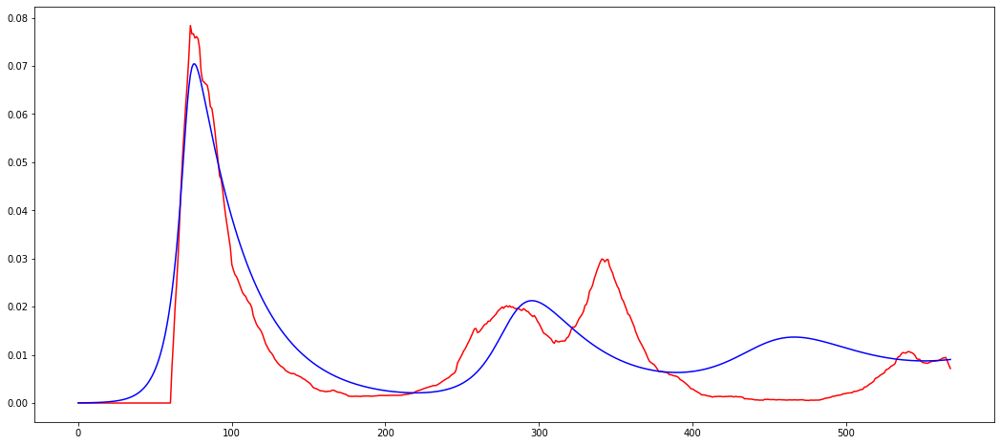

In [41]:
gradDesc.x = gradDesc.simulate(gradDesc.params) #to ensure sim data is set if solve vars func was broken

ukVars = gradDesc.params

fig, ax = plt.subplots(figsize=(18,8))

ax.plot(gradDesc.y, color="red")
ax.plot(gradDesc.x, color="blue")

<ipython-input-59-9a80b1327782>:2: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(np.diff(I+R+D)/I[:-1], color="red")
<ipython-input-59-9a80b1327782>:2: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(np.diff(I+R+D)/I[:-1], color="red")
<ipython-input-59-9a80b1327782>:4: RuntimeWarning: invalid value encountered in true_divide
  ax.plot(np.diff(R+D)/I[:-1], color="green")


(0.0, 0.25)

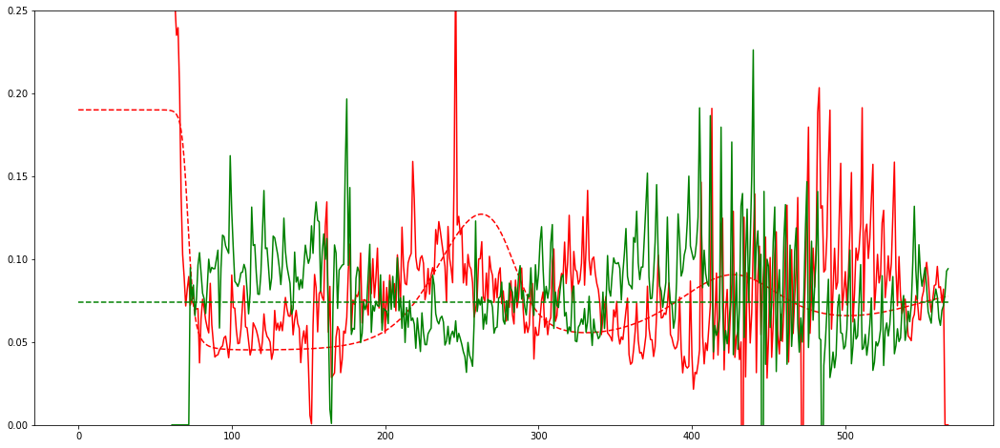

In [59]:
fig, ax = plt.subplots(figsize=(18,8))
ax.plot(np.diff(I+R+D)/I[:-1], color="red")
ax.plot(  (np.diff(gradDesc.x) +  gradDesc.x[:-1]*(sird.getGamma(I,R)+sird.getNu(I,D)))/gradDesc.x[:-1], color="red", linestyle="dashed")
ax.plot(np.diff(R+D)/I[:-1], color="green")
ax.plot( np.ones(len(I))*(sird.getGamma(I,R)+sird.getNu(I,D)), color="green", linestyle="dashed" ) 

ax.set_ylim([0,.25])